# Removing labelled data from unlabelled

In [1]:
import pandas as pd

pd.set_option('display.max_rows', 50)

clinical_data = pd.read_excel("TRAIN/Training_Unlabeled_Clinical_Data.xlsx")
biomarker_data = pd.read_csv("TRAIN/Training_Biomarker_Data.csv")

# Extract Meta Data
meta = clinical_data["File_Path"].str.split("/", expand=True)
meta = meta.drop(0, axis=1)
meta.columns = ["Trial", "Arm", "Folder", "Visit", "Eye", "Image_Name"]
clinical_data[meta.columns] = meta

# Fix missing meta columns
idx = clinical_data["Image_Name"].isna()
clinical_data.loc[idx, ["Folder", "Visit", "Eye", "Image_Name"]] = clinical_data.loc[idx, ["Arm", "Folder", "Visit", "Eye"]].values
clinical_data.loc[idx, "Arm"] = None

columns = biomarker_data.columns.tolist()
columns[0] = clinical_data.columns[0]
biomarker_data.columns = columns

biomarker_clinical = pd.merge(biomarker_data, clinical_data, on="File_Path", how="left")

missing_idx = lambda x: x["Eye_ID"].isna()

meta = biomarker_clinical.loc[missing_idx, "File_Path"].str.split("/", expand=True)
meta = meta.drop(0, axis=1)
meta.columns = ["Trial", "Folder", "Visit", "Eye", "Image_Name"]
biomarker_clinical.loc[missing_idx, meta.columns] = meta

biomarker_clinical.loc[missing_idx, "Eye_ID"] = 79

In [2]:
from iterstrat.ml_stratifiers import MultilabelStratifiedKFold

labels = ["B1", "B2", "B3", "B4", "B5", "B6"]

eye_ids = biomarker_clinical.groupby("Eye_ID")[["B1", "B2", "B3", "B4", "B5", "B6"]].mean().round().astype(int)

mskf = MultilabelStratifiedKFold(n_splits=8, shuffle=True, random_state=3000)

train_index, test_index = next(iter(mskf.split(eye_ids.index, eye_ids)))

In [3]:
train_ids, val_ids = eye_ids.index[train_index], eye_ids.index[test_index]
train_df = biomarker_clinical.loc[lambda x: x["Eye_ID"].isin(train_ids), ["File_Path"] + labels]
val_df = biomarker_clinical.loc[lambda x: x["Eye_ID"].isin(val_ids), ["File_Path"] + labels]

In [4]:
name = []
name.extend(train_df[train_df.columns[0]].values.tolist())
name.extend(val_df[val_df.columns[0]].values.tolist())

clinical_data.drop(columns=clinical_data.columns[1:], inplace=True)
clinical_data = clinical_data[clinical_data['File_Path'].apply(lambda x: x not in name)]
clinical_data.reset_index(drop=True, inplace=True)

clinical_data

,File_Path
0,/TREX DME/GILA/0234GOD/V10/OD/TREXW_000025.tif
1,/TREX DME/GILA/0234GOD/V10/OD/TREXW_000000.tif
2,/TREX DME/GILA/0234GOD/V10/OD/TREXW_000001.tif
3,/TREX DME/GILA/0234GOD/V10/OD/TREXW_000002.tif
4,/TREX DME/GILA/0234GOD/V10/OD/TREXW_000003.tif
...,...
68870,/TREX DME/GILA/0229GOD/V9/OD/TREXE_000044.tif
68871,/TREX DME/GILA/0229GOD/V9/OD/TREXE_000045.tif
68872,/TREX DME/GILA/0229GOD/V9/OD/TREXE_000046.tif
68873,/TREX DME/GILA/0229GOD/V9/OD/TREXE_000047.tif


In [5]:
clinical_data["File_Path"] = "TRAIN/OLIVES" + clinical_data["File_Path"]

# biomarker count

In [6]:
biomarker_data["B1"].value_counts(), biomarker_data["B2"].value_counts(), biomarker_data["B3"].value_counts(), biomarker_data["B4"].value_counts(), biomarker_data["B5"].value_counts(), biomarker_data["B6"].value_counts()

(1    6341
 0    3067
 Name: B1, dtype: int64,
 0    6424
 1    2984
 Name: B2, dtype: int64,
 1    5222
 0    4186
 Name: B3, dtype: int64,
 0    6572
 1    2836
 Name: B4, dtype: int64,
 0    6405
 1    3003
 Name: B5, dtype: int64,
 0    5320
 1    4088
 Name: B6, dtype: int64)

# Initialization

In [7]:
%matplotlib inline
from PIL import Image
import torch.utils.data as data
import os
import math
import copy
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from torchsummary import summary
import torch
import torchvision
from sklearn.metrics import accuracy_score
# import skimage
from skimage.io import imread
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import sys
import time
import numpy as np
from sklearn.metrics import f1_score
from sklearn import metrics

from __future__ import print_function

import math
import numpy as np
import torch
import torch.optim as optim
import os
from sklearn.metrics import f1_score
import torch.backends.cudnn as cudnn
from torchvision import transforms, datasets
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision

In [8]:
import os
import random

import numpy as np
import torch

SEED = 3000

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

seed_everything(SEED)

In [9]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

# Device

In [10]:
# Setup device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

# Teacher Model

In [11]:
model = torchvision.models.resnet50(weights=None,zero_init_residual=True)
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Identity(),
    nn.Sequential(
        nn.Linear(2048, 512),
        nn.Linear(512, 6)
    )
)
model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
model = model.to(device)

In [50]:
ckpt = torch.load("models/18_vip_cup_student_two_finetune_random_weight_epoch_60.pth", map_location='cpu')
state_dict = ckpt['model']

model.load_state_dict(state_dict)

<All keys matched successfully>

# DataLoader

In [13]:
class RECOVERY(data.Dataset):
    def __init__(self,df, transforms):
        self.transforms = transforms
        self.df = df
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        path = self.df.iloc[idx,0]
        image = Image.open(path).convert("L")
        image = np.array(image)
        image = Image.fromarray(image)
        image = self.transforms(image)
        return image

In [14]:
normalize = transforms.Normalize(mean=.1706, std=.2112)

train_transform = transforms.Compose([
        transforms.RandomResizedCrop(size=224, scale=(0.7, 1.)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomApply([
            transforms.ColorJitter(0.4, 0.4, 0.4, 0.1)
        ], p=0.8),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.4, fill=256),
        transforms.RandomRotation(degrees = (-6, 6), fill=256),
        transforms.RandomGrayscale(p=0.2),
        transforms.ToTensor(),
        normalize,
    ])
val_transform = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.RandomPerspective(distortion_scale=0.2, p=0.4, fill=256),
        transforms.RandomRotation(degrees = (-6, 6), fill=256),
        transforms.ToTensor(),
        normalize,
    ])

In [15]:
dataset = RECOVERY(clinical_data, transforms = val_transform)

In [16]:
loader = torch.utils.data.DataLoader(
        dataset, batch_size=64, shuffle=False,
        num_workers=0, pin_memory=True,drop_last=False)

# Pseudo label generation

In [39]:
ckpt = torch.load("models/18_vip_cup_student_one_finetune_random_weight_epoch_26.pth", map_location='cpu')
state_dict = ckpt['model']

model.load_state_dict(state_dict)

<All keys matched successfully>

In [40]:
soft_label_2 = []
model.eval()
with torch.no_grad():
     for idx, image in (enumerate(loader)):
            image = image.to(device)
            output= model(image)
            output = torch.sigmoid(output)
            print(f"Predicted pseudolabel: {output}")
            soft_label_2.extend(output.cpu().numpy())

Predicted pseudolabel: tensor([[4.9130e-01, 4.8331e-02, 9.7230e-01, 3.4804e-01, 1.3269e-01, 1.7835e-01],
        [5.2407e-01, 9.9936e-01, 4.4596e-04, 5.9710e-01, 1.1185e-01, 3.0947e-01],
        [8.7127e-01, 9.9334e-01, 4.0136e-03, 3.2409e-01, 7.3517e-02, 2.2680e-01],
        [4.8900e-01, 9.8501e-01, 1.7136e-02, 5.5607e-01, 2.8784e-02, 1.3237e-01],
        [9.3828e-01, 9.3467e-01, 1.1790e-01, 2.3412e-01, 3.0314e-02, 1.3989e-01],
        [9.7824e-01, 9.3459e-01, 1.2089e-01, 7.7575e-01, 6.1200e-02, 1.8117e-01],
        [2.9827e-01, 7.6975e-01, 4.1521e-01, 3.0079e-01, 3.2254e-02, 1.7048e-01],
        [9.4685e-01, 6.7222e-01, 5.5260e-01, 1.5076e-01, 5.9691e-02, 1.1930e-01],
        [9.9104e-01, 9.7425e-01, 4.5397e-02, 1.4534e-01, 7.1979e-02, 1.2451e-01],
        [9.7147e-01, 4.2504e-02, 9.7918e-01, 2.6959e-01, 9.9588e-02, 1.5198e-01],
        [9.0125e-01, 5.6783e-02, 9.5429e-01, 6.2577e-01, 4.2020e-02, 1.2981e-01],
        [9.9862e-01, 6.3693e-01, 4.7461e-01, 5.9548e-01, 7.9803e-02, 1.5982

Predicted pseudolabel: tensor([[0.9999, 0.0182, 0.9914, 0.0960, 0.5285, 0.5422],
        [0.9987, 0.0311, 0.9865, 0.1166, 0.5193, 0.3707],
        [0.9994, 0.0343, 0.9748, 0.0936, 0.7322, 0.5321],
        [0.9963, 0.0482, 0.9210, 0.1350, 0.4360, 0.4192],
        [0.9994, 0.0651, 0.9720, 0.0946, 0.6964, 0.4044],
        [0.9996, 0.0428, 0.9836, 0.1108, 0.5405, 0.3187],
        [0.9998, 0.0684, 0.9792, 0.0888, 0.9375, 0.6768],
        [0.9999, 0.0656, 0.9784, 0.1310, 0.8025, 0.2960],
        [0.9965, 0.0565, 0.9759, 0.1311, 0.7112, 0.3692],
        [0.9972, 0.0388, 0.9740, 0.1033, 0.7257, 0.5112],
        [0.8654, 0.0555, 0.9409, 0.2058, 0.1832, 0.2944],
        [0.9978, 0.1287, 0.9465, 0.1532, 0.6600, 0.4638],
        [0.9946, 0.1501, 0.8546, 0.0938, 0.3100, 0.4057],
        [0.9839, 0.1849, 0.9173, 0.5477, 0.1959, 0.3558],
        [0.9966, 0.4118, 0.7687, 0.1145, 0.4998, 0.2896],
        [0.9703, 0.7023, 0.3630, 0.2385, 0.3371, 0.4675],
        [0.9826, 0.3357, 0.7934, 0.1878, 0.3926, 

Predicted pseudolabel: tensor([[9.7981e-01, 8.7303e-02, 9.4637e-01, 2.4209e-01, 5.2862e-02, 1.2871e-01],
        [9.5262e-01, 1.1821e-01, 9.2654e-01, 1.9067e-01, 5.2449e-02, 1.2115e-01],
        [4.6034e-01, 1.5803e-01, 7.6697e-01, 8.7886e-01, 9.5939e-02, 2.2904e-01],
        [5.7019e-01, 3.3704e-01, 7.5895e-01, 3.4664e-01, 1.4989e-02, 9.4466e-02],
        [8.3795e-01, 6.1800e-02, 9.5871e-01, 4.3586e-01, 1.7943e-02, 1.1720e-01],
        [9.2641e-01, 1.0757e-01, 9.4427e-01, 2.4107e-01, 2.1347e-02, 1.1316e-01],
        [7.7348e-01, 7.1400e-02, 9.6299e-01, 2.8424e-01, 1.0738e-02, 1.3428e-01],
        [8.9703e-01, 5.4161e-02, 9.6721e-01, 1.3891e-01, 1.7316e-02, 1.1336e-01],
        [3.5888e-01, 5.6199e-01, 6.4574e-01, 7.9941e-01, 2.7486e-02, 2.0485e-01],
        [6.6637e-01, 9.4115e-02, 9.3836e-01, 2.8468e-01, 2.0221e-02, 1.0969e-01],
        [9.4673e-01, 1.0821e-01, 9.2870e-01, 5.6040e-01, 1.9367e-02, 1.4091e-01],
        [9.8139e-01, 1.5241e-01, 9.4356e-01, 3.3927e-01, 2.2272e-02, 8.1870

Predicted pseudolabel: tensor([[0.6527, 0.2793, 0.8123, 0.2364, 0.4515, 0.5486],
        [0.6040, 0.1313, 0.9236, 0.1432, 0.0689, 0.2494],
        [0.4797, 0.0524, 0.9517, 0.1250, 0.0211, 0.1247],
        [0.9574, 0.0661, 0.9596, 0.0988, 0.3422, 0.4393],
        [0.9673, 0.1142, 0.9444, 0.1166, 0.5338, 0.6188],
        [0.8872, 0.1042, 0.9433, 0.1072, 0.3562, 0.3440],
        [0.9566, 0.1331, 0.9387, 0.1794, 0.6364, 0.4697],
        [0.9580, 0.0554, 0.9572, 0.0743, 0.7467, 0.7996],
        [0.9522, 0.1584, 0.9295, 0.1678, 0.8677, 0.8570],
        [0.9772, 0.3516, 0.7954, 0.1606, 0.9624, 0.9332],
        [0.9315, 0.1110, 0.9353, 0.1238, 0.9872, 0.9791],
        [0.9570, 0.0305, 0.9781, 0.0601, 0.9912, 0.9971],
        [0.9558, 0.0423, 0.9666, 0.0668, 0.9968, 0.9985],
        [0.9868, 0.0472, 0.9811, 0.5561, 0.9920, 0.9863],
        [0.9949, 0.0973, 0.9321, 0.0912, 0.9991, 0.9994],
        [0.9981, 0.0841, 0.9570, 0.2567, 0.9992, 0.9992],
        [0.9977, 0.0119, 0.9918, 0.0502, 0.9996, 

Predicted pseudolabel: tensor([[0.9343, 0.0372, 0.9636, 0.1210, 0.5434, 0.8669],
        [0.8802, 0.0281, 0.9787, 0.1183, 0.4536, 0.8580],
        [0.5603, 0.0581, 0.9417, 0.0906, 0.3911, 0.8270],
        [0.9237, 0.0549, 0.9641, 0.0807, 0.5681, 0.8085],
        [0.7653, 0.1130, 0.9137, 0.0791, 0.6639, 0.9116],
        [0.5995, 0.0729, 0.9404, 0.1052, 0.2534, 0.5144],
        [0.9087, 0.0558, 0.9568, 0.0829, 0.2943, 0.3655],
        [0.5162, 0.0703, 0.9561, 0.0680, 0.0334, 0.1775],
        [0.7056, 0.1785, 0.8564, 0.0655, 0.3894, 0.7090],
        [0.9782, 0.0551, 0.9781, 0.0522, 0.3836, 0.6248],
        [0.7669, 0.2912, 0.8716, 0.1525, 0.0166, 0.1192],
        [0.9564, 0.0591, 0.9727, 0.0874, 0.1905, 0.3426],
        [0.9391, 0.1391, 0.9401, 0.1126, 0.3803, 0.6398],
        [0.9717, 0.0534, 0.9588, 0.8719, 0.5335, 0.8604],
        [0.9764, 0.0539, 0.9781, 0.0885, 0.8650, 0.9470],
        [0.9584, 0.0277, 0.9782, 0.0888, 0.9787, 0.9877],
        [0.9915, 0.0124, 0.9863, 0.0395, 0.9596, 

Predicted pseudolabel: tensor([[9.6861e-01, 8.0806e-01, 2.3362e-01, 2.8094e-01, 9.8030e-01, 9.8188e-01],
        [9.3483e-01, 9.7595e-01, 3.1823e-03, 1.9269e-01, 9.9862e-01, 9.9954e-01],
        [9.5053e-01, 9.6291e-01, 1.1456e-02, 1.1758e-01, 9.9684e-01, 9.9899e-01],
        [9.4943e-01, 9.8891e-01, 5.4714e-03, 2.2624e-01, 9.3916e-01, 9.0818e-01],
        [9.7602e-01, 9.8604e-01, 6.3388e-03, 6.7860e-01, 9.9659e-01, 9.9763e-01],
        [9.5754e-01, 9.9283e-01, 2.2578e-03, 3.0402e-01, 9.8319e-01, 9.9299e-01],
        [9.5612e-01, 9.9463e-01, 1.2613e-03, 2.4559e-01, 9.7839e-01, 9.9018e-01],
        [9.9054e-01, 9.8661e-01, 2.1658e-03, 1.4791e-01, 9.8626e-01, 9.9071e-01],
        [8.4888e-01, 9.8905e-01, 1.8033e-03, 3.3870e-01, 8.7790e-01, 9.3747e-01],
        [8.7948e-01, 9.9356e-01, 1.1611e-03, 3.2958e-01, 8.3348e-01, 7.9463e-01],
        [9.1139e-01, 8.9409e-01, 1.0678e-02, 1.8698e-01, 9.4587e-01, 9.9101e-01],
        [9.8423e-01, 9.5334e-01, 6.0285e-03, 2.5244e-01, 9.3792e-01, 9.6074

Predicted pseudolabel: tensor([[7.5342e-01, 1.6482e-01, 9.1449e-01, 1.3596e-01, 1.0782e-01, 1.9616e-01],
        [8.5634e-01, 1.2286e-01, 9.1355e-01, 7.0069e-02, 3.6392e-01, 3.0209e-01],
        [8.1922e-01, 1.3467e-01, 9.3109e-01, 4.4273e-01, 9.8603e-01, 9.9155e-01],
        [9.3890e-01, 1.6685e-01, 9.1090e-01, 2.3838e-01, 9.8230e-01, 9.7914e-01],
        [9.7215e-01, 8.1884e-02, 9.3591e-01, 8.4416e-02, 9.9361e-01, 9.9809e-01],
        [9.5129e-01, 3.9163e-01, 5.8436e-01, 1.5061e-01, 9.9202e-01, 9.9613e-01],
        [9.9178e-01, 1.9529e-01, 8.2995e-01, 9.5019e-02, 9.9803e-01, 9.9965e-01],
        [9.7645e-01, 1.3888e-01, 8.9145e-01, 1.9814e-01, 9.9749e-01, 9.9930e-01],
        [9.7891e-01, 2.3696e-01, 7.5224e-01, 9.0625e-02, 9.9374e-01, 9.9840e-01],
        [9.8763e-01, 2.5278e-01, 7.4531e-01, 9.2390e-02, 9.9834e-01, 9.9939e-01],
        [9.9716e-01, 2.9717e-01, 6.4152e-01, 7.5891e-02, 9.9869e-01, 9.9939e-01],
        [9.9296e-01, 4.8946e-01, 5.0727e-01, 1.4616e-01, 9.9649e-01, 9.9667

Predicted pseudolabel: tensor([[9.4678e-01, 4.5647e-01, 5.8820e-02, 3.4540e-01, 1.7823e-01, 3.2398e-01],
        [9.7606e-01, 9.4214e-01, 3.9571e-02, 2.7628e-01, 8.1564e-01, 8.9257e-01],
        [9.9616e-01, 9.3157e-01, 6.0311e-02, 2.1999e-01, 9.2632e-01, 9.5497e-01],
        [9.8179e-01, 9.2871e-01, 8.1015e-02, 2.1064e-01, 9.3717e-01, 9.8534e-01],
        [9.1658e-01, 6.2491e-01, 3.6139e-01, 1.6601e-01, 9.6726e-01, 9.9825e-01],
        [9.9018e-01, 1.9825e-02, 9.8116e-01, 2.1280e-02, 9.9719e-01, 9.9990e-01],
        [6.9933e-01, 3.5852e-02, 9.7079e-01, 1.0603e-01, 7.6156e-01, 9.1374e-01],
        [7.7665e-01, 5.3014e-02, 9.7163e-01, 1.0465e-01, 8.0997e-01, 7.1472e-01],
        [8.5812e-01, 2.4551e-02, 9.7619e-01, 5.5808e-02, 8.9539e-01, 9.8647e-01],
        [9.7111e-01, 3.6370e-02, 9.4770e-01, 4.1760e-02, 9.6642e-01, 9.9488e-01],
        [9.6461e-01, 5.3995e-02, 9.3541e-01, 6.2759e-02, 9.8597e-01, 9.9855e-01],
        [9.0595e-01, 4.2409e-02, 9.5399e-01, 8.2321e-02, 9.0395e-01, 9.6070

Predicted pseudolabel: tensor([[0.9203, 0.8467, 0.1387, 0.1918, 0.9940, 0.9969],
        [0.9418, 0.5507, 0.3010, 0.1690, 0.9941, 0.9975],
        [0.9640, 0.4106, 0.6002, 0.2196, 0.9979, 0.9985],
        [0.9709, 0.6584, 0.2407, 0.1448, 0.9951, 0.9934],
        [0.7489, 0.2396, 0.7086, 0.1793, 0.9954, 0.9995],
        [0.9664, 0.3526, 0.5928, 0.1102, 0.9955, 0.9959],
        [0.9026, 0.1572, 0.8860, 0.1390, 0.9784, 0.9770],
        [0.8634, 0.6995, 0.4515, 0.4340, 0.9069, 0.9292],
        [0.8898, 0.4771, 0.4973, 0.1273, 0.7299, 0.8108],
        [0.8713, 0.8884, 0.1176, 0.4196, 0.9295, 0.9461],
        [0.9734, 0.9627, 0.0266, 0.8261, 0.9899, 0.9938],
        [0.9902, 0.9839, 0.0075, 0.2045, 0.9846, 0.9688],
        [0.9697, 0.9851, 0.0039, 0.8426, 0.9838, 0.9841],
        [0.9019, 0.9861, 0.0049, 0.1547, 0.7800, 0.8756],
        [0.9434, 0.9803, 0.0064, 0.1444, 0.9795, 0.9931],
        [0.9839, 0.9887, 0.0045, 0.3038, 0.9595, 0.9808],
        [0.9106, 0.9905, 0.0023, 0.3600, 0.9144, 

Predicted pseudolabel: tensor([[3.0329e-01, 1.9376e-02, 9.9097e-01, 6.8041e-02, 7.5950e-01, 1.7573e-01],
        [3.8170e-01, 4.1925e-02, 9.7527e-01, 1.3101e-01, 8.0512e-01, 5.0805e-01],
        [9.0207e-01, 1.4842e-02, 9.8935e-01, 8.5243e-02, 9.2993e-01, 7.6908e-01],
        [9.6392e-01, 2.7310e-01, 8.4016e-01, 2.6717e-01, 9.8626e-01, 8.9698e-01],
        [9.1828e-01, 5.4823e-02, 9.7297e-01, 2.1581e-01, 9.1970e-01, 7.2057e-01],
        [9.0638e-01, 9.6445e-02, 9.4268e-01, 2.3059e-01, 7.8035e-01, 5.4522e-01],
        [9.7871e-01, 5.3151e-02, 9.6971e-01, 1.1896e-01, 9.2359e-01, 7.6611e-01],
        [9.2719e-01, 3.1602e-01, 8.4070e-01, 4.7973e-01, 9.7967e-01, 9.8666e-01],
        [8.1442e-01, 4.7475e-01, 6.1290e-01, 1.9503e-01, 9.7770e-01, 9.9108e-01],
        [7.2251e-01, 3.4024e-01, 7.8811e-01, 1.4460e-01, 9.8355e-01, 9.9088e-01],
        [9.7559e-01, 9.5640e-02, 9.4192e-01, 1.3530e-01, 9.9644e-01, 9.9636e-01],
        [9.6742e-01, 5.5118e-02, 9.6524e-01, 2.3904e-01, 9.9408e-01, 9.9193

Predicted pseudolabel: tensor([[9.8767e-01, 9.0072e-01, 1.3226e-01, 3.6483e-01, 9.9955e-01, 9.9952e-01],
        [9.9705e-01, 9.7966e-01, 2.3759e-02, 3.8475e-01, 9.9937e-01, 9.9907e-01],
        [9.9638e-01, 9.8664e-01, 1.3597e-02, 4.1357e-01, 9.9960e-01, 9.9980e-01],
        [9.9787e-01, 9.9615e-01, 2.7575e-03, 3.7869e-01, 9.9992e-01, 9.9985e-01],
        [9.9966e-01, 9.9749e-01, 1.4823e-03, 3.7839e-01, 9.9977e-01, 9.9940e-01],
        [9.9982e-01, 9.9695e-01, 2.2262e-03, 5.4916e-01, 9.9983e-01, 9.9918e-01],
        [9.9896e-01, 9.9727e-01, 1.1605e-03, 4.3540e-01, 9.9991e-01, 9.9982e-01],
        [9.9884e-01, 9.9932e-01, 1.1866e-04, 5.9906e-01, 9.9994e-01, 9.9981e-01],
        [9.9157e-01, 9.9917e-01, 2.3916e-04, 7.1299e-01, 9.9997e-01, 9.9998e-01],
        [9.6337e-01, 9.8849e-01, 8.4535e-03, 4.9161e-01, 9.9978e-01, 9.9995e-01],
        [9.9268e-01, 9.9990e-01, 4.9599e-05, 9.5826e-01, 9.9996e-01, 9.9996e-01],
        [9.9590e-01, 9.9767e-01, 4.7655e-04, 6.4754e-01, 9.9982e-01, 9.9997

Predicted pseudolabel: tensor([[9.6876e-01, 1.6049e-01, 9.1993e-01, 2.0140e-01, 9.8035e-01, 9.8640e-01],
        [7.4662e-01, 1.4568e-01, 8.9033e-01, 1.1499e-01, 9.8423e-01, 9.9667e-01],
        [9.9507e-01, 7.9793e-02, 9.6139e-01, 1.0277e-01, 9.9083e-01, 9.8733e-01],
        [9.8475e-01, 2.0609e-01, 8.5630e-01, 1.1936e-01, 9.9469e-01, 9.9494e-01],
        [9.9313e-01, 2.0278e-01, 8.5773e-01, 1.7471e-01, 9.8853e-01, 9.8609e-01],
        [9.9634e-01, 1.3368e-01, 9.1295e-01, 1.6229e-01, 9.9531e-01, 9.9573e-01],
        [9.8547e-01, 1.3746e-01, 9.1226e-01, 1.2688e-01, 9.9547e-01, 9.9562e-01],
        [9.7673e-01, 1.2541e-01, 8.9456e-01, 1.1404e-01, 9.8948e-01, 9.9422e-01],
        [9.9938e-01, 2.7297e-01, 8.1722e-01, 1.3465e-01, 9.9664e-01, 9.9433e-01],
        [9.7841e-01, 4.5818e-01, 5.4033e-01, 1.1090e-01, 9.9007e-01, 9.9057e-01],
        [9.9777e-01, 2.5224e-01, 8.5006e-01, 1.2029e-01, 9.8864e-01, 9.6131e-01],
        [9.9686e-01, 6.5958e-01, 2.7276e-01, 9.6275e-02, 9.9490e-01, 9.8847

Predicted pseudolabel: tensor([[9.9924e-01, 9.8856e-01, 6.3480e-03, 3.4908e-01, 5.0290e-01, 5.2067e-01],
        [9.9991e-01, 9.5211e-01, 1.9903e-02, 2.3249e-01, 8.8702e-01, 6.0408e-01],
        [7.2842e-01, 9.9950e-01, 1.8299e-04, 6.8601e-01, 5.8919e-01, 9.6691e-01],
        [9.9885e-01, 9.9561e-01, 1.6059e-03, 4.5217e-01, 5.2614e-01, 5.3967e-01],
        [9.9852e-01, 9.6092e-01, 4.0677e-03, 4.7585e-01, 8.8303e-01, 8.1955e-01],
        [9.9983e-01, 9.8899e-01, 5.9067e-04, 5.2572e-01, 9.8645e-01, 9.7684e-01],
        [9.9969e-01, 9.9525e-01, 4.3284e-04, 5.6179e-01, 9.9669e-01, 9.8760e-01],
        [9.9974e-01, 9.8928e-01, 6.7531e-04, 5.1887e-01, 9.9297e-01, 9.9323e-01],
        [9.9998e-01, 9.9191e-01, 2.1141e-04, 6.2439e-01, 9.9910e-01, 9.9530e-01],
        [9.9998e-01, 9.9507e-01, 2.9146e-04, 6.1397e-01, 9.9972e-01, 9.9926e-01],
        [9.9992e-01, 9.9816e-01, 3.8104e-04, 6.5958e-01, 9.9990e-01, 9.9916e-01],
        [9.9992e-01, 9.9931e-01, 2.9880e-05, 6.6057e-01, 9.9973e-01, 9.9893

Predicted pseudolabel: tensor([[9.8917e-01, 9.9966e-01, 2.7755e-05, 3.1560e-01, 4.9842e-01, 7.6697e-01],
        [8.9225e-01, 9.9957e-01, 7.0588e-05, 9.6230e-01, 7.1348e-01, 9.4824e-01],
        [9.6657e-01, 9.9868e-01, 6.0092e-04, 6.2988e-01, 6.9592e-01, 9.2936e-01],
        [9.9200e-01, 9.9900e-01, 2.5899e-04, 5.7853e-01, 7.2150e-01, 7.4529e-01],
        [9.9991e-01, 9.9661e-01, 2.8441e-04, 2.9198e-01, 8.6969e-01, 7.5341e-01],
        [9.6705e-01, 9.8137e-01, 2.4980e-03, 2.0227e-01, 5.9263e-01, 8.4790e-01],
        [9.9959e-01, 9.9371e-01, 1.1909e-03, 1.0821e-01, 7.1381e-01, 6.9936e-01],
        [9.9412e-01, 3.4693e-01, 6.6788e-01, 2.0362e-01, 1.0130e-01, 2.4870e-01],
        [9.9669e-01, 9.9269e-01, 1.4568e-03, 8.2744e-01, 7.3641e-01, 8.1705e-01],
        [8.9482e-01, 9.8808e-01, 1.2292e-03, 5.1025e-01, 5.7379e-01, 6.6333e-01],
        [9.9564e-01, 9.9602e-01, 4.2685e-04, 2.8412e-01, 5.4985e-01, 5.2727e-01],
        [9.9801e-01, 9.9157e-01, 8.0380e-04, 1.8741e-01, 4.7342e-01, 4.0653

Predicted pseudolabel: tensor([[9.0315e-01, 9.9328e-01, 6.0948e-03, 4.2484e-01, 9.9746e-01, 9.9662e-01],
        [9.9221e-01, 9.3138e-01, 4.1942e-02, 1.5613e-01, 9.9892e-01, 9.9920e-01],
        [9.9517e-01, 9.4771e-01, 3.3176e-02, 1.6282e-01, 9.9758e-01, 9.9810e-01],
        [9.9945e-01, 9.7128e-01, 2.5726e-02, 3.1322e-01, 9.9856e-01, 9.9822e-01],
        [9.5737e-01, 9.7938e-01, 2.0074e-03, 2.8301e-01, 9.9784e-01, 9.9982e-01],
        [9.8611e-01, 9.7970e-01, 3.9733e-03, 3.8597e-01, 9.8895e-01, 9.9702e-01],
        [9.7448e-01, 9.7863e-01, 1.2980e-02, 1.4780e-01, 9.8526e-01, 9.9087e-01],
        [9.6982e-01, 9.9716e-01, 5.6471e-04, 2.2347e-01, 9.2076e-01, 9.7667e-01],
        [9.1123e-01, 9.9817e-01, 2.7970e-04, 3.2561e-01, 7.7718e-01, 8.8109e-01],
        [8.1657e-01, 9.9922e-01, 1.5858e-04, 1.7830e-01, 5.6946e-01, 7.7222e-01],
        [4.5543e-01, 9.9501e-01, 6.5472e-03, 1.2319e-01, 5.2755e-02, 1.5490e-01],
        [8.6134e-01, 7.5754e-01, 4.2168e-01, 5.3686e-02, 1.5224e-01, 1.5182

Predicted pseudolabel: tensor([[2.3880e-01, 3.2338e-02, 9.4836e-01, 4.8527e-01, 4.1065e-03, 3.4593e-02],
        [1.5872e-01, 1.5122e-01, 9.1691e-01, 2.0107e-01, 5.8708e-03, 4.9661e-02],
        [3.1353e-01, 7.5317e-02, 9.2804e-01, 4.2929e-01, 3.1177e-02, 1.2117e-01],
        [1.1170e-01, 2.9137e-01, 7.8678e-01, 4.4254e-01, 7.5227e-03, 5.9728e-02],
        [2.8952e-01, 7.1705e-02, 9.5155e-01, 6.1385e-01, 1.1377e-02, 7.9086e-02],
        [2.4055e-01, 1.4233e-01, 8.7040e-01, 4.9044e-01, 2.9418e-02, 1.1538e-01],
        [1.0738e-01, 1.2401e-01, 9.1178e-01, 2.6233e-01, 4.8519e-03, 3.2247e-02],
        [3.2936e-01, 1.0524e-01, 9.1385e-01, 9.8179e-01, 1.5704e-02, 1.2214e-01],
        [3.3865e-01, 7.9960e-02, 9.6214e-01, 5.0577e-01, 3.3147e-02, 1.9511e-01],
        [5.3121e-01, 1.6956e-02, 9.4691e-01, 9.7789e-01, 2.9150e-02, 1.1814e-01],
        [7.9383e-01, 2.2930e-02, 9.8861e-01, 1.2960e-01, 9.5838e-01, 9.9692e-01],
        [2.4134e-01, 1.5670e-01, 9.1873e-01, 2.8318e-01, 1.2560e-02, 5.8621

Predicted pseudolabel: tensor([[7.9203e-01, 7.0144e-02, 9.3968e-01, 2.9390e-01, 6.1565e-02, 1.5776e-01],
        [7.4511e-01, 9.8417e-02, 9.5398e-01, 2.5150e-01, 4.8611e-02, 1.5625e-01],
        [7.7707e-01, 3.1118e-02, 9.6865e-01, 1.2603e-01, 9.1444e-01, 9.8722e-01],
        [8.2667e-01, 1.7990e-02, 9.7313e-01, 3.7894e-01, 8.0654e-01, 9.8531e-01],
        [6.9273e-01, 3.0780e-02, 9.7306e-01, 2.2804e-01, 8.6309e-01, 9.9173e-01],
        [4.7158e-01, 5.3188e-02, 9.4992e-01, 2.9067e-01, 3.9197e-02, 1.9280e-01],
        [7.3562e-01, 4.4982e-02, 9.6389e-01, 2.3902e-01, 5.3479e-02, 1.5254e-01],
        [5.0865e-01, 8.0014e-02, 9.3403e-01, 8.0778e-01, 3.7098e-02, 1.4895e-01],
        [4.8859e-01, 5.7869e-02, 9.2950e-01, 3.0821e-01, 1.2953e-02, 8.0004e-02],
        [4.1035e-01, 2.9662e-02, 9.6350e-01, 4.5276e-01, 3.0997e-03, 4.3235e-02],
        [2.7317e-01, 6.9993e-02, 9.0058e-01, 2.5535e-01, 6.3397e-03, 5.3280e-02],
        [2.0643e-01, 1.0959e-01, 8.8974e-01, 3.7944e-01, 1.2232e-02, 6.9165

Predicted pseudolabel: tensor([[1.6561e-01, 6.9940e-02, 9.6945e-01, 4.9189e-01, 3.1845e-02, 7.1401e-02],
        [1.8565e-01, 1.2874e-01, 9.3106e-01, 4.1237e-01, 2.6616e-02, 6.4895e-02],
        [1.2074e-01, 7.2798e-02, 9.4305e-01, 6.4057e-01, 3.6348e-03, 3.2106e-02],
        [3.8711e-01, 8.0067e-02, 9.4586e-01, 9.8947e-01, 7.0740e-02, 3.2731e-01],
        [5.0362e-01, 4.2176e-02, 9.6260e-01, 9.8739e-01, 1.0545e-02, 1.0009e-01],
        [4.5768e-01, 1.3279e-02, 9.8006e-01, 9.8768e-01, 7.9715e-03, 8.0736e-02],
        [1.9229e-01, 2.7549e-02, 9.6506e-01, 8.0723e-01, 4.1732e-03, 4.1025e-02],
        [3.2241e-01, 9.8933e-03, 9.9190e-01, 9.3909e-01, 6.3871e-03, 5.9945e-02],
        [2.9692e-01, 1.6913e-02, 9.8641e-01, 4.7324e-01, 6.1824e-03, 3.9572e-02],
        [2.1802e-01, 2.5568e-02, 9.8249e-01, 1.8348e-01, 1.5297e-02, 5.7444e-02],
        [3.5330e-01, 1.5317e-02, 9.8837e-01, 9.7556e-01, 1.1266e-02, 6.5352e-02],
        [2.9095e-01, 2.4285e-02, 9.9119e-01, 8.7704e-01, 1.0688e-02, 6.5448

Predicted pseudolabel: tensor([[7.1478e-01, 2.5309e-03, 9.9777e-01, 9.9603e-01, 2.3861e-04, 2.0232e-02],
        [3.9482e-01, 5.1875e-03, 9.9422e-01, 4.8834e-01, 2.9084e-04, 1.4356e-02],
        [8.2438e-01, 5.7682e-03, 9.9018e-01, 6.4584e-01, 4.4491e-03, 5.3549e-02],
        [8.0386e-01, 1.3725e-03, 9.9867e-01, 9.9748e-01, 5.0331e-04, 3.2638e-02],
        [2.0699e-01, 6.9523e-03, 9.8445e-01, 1.9761e-01, 4.1317e-04, 1.3710e-02],
        [1.3808e-01, 2.7493e-03, 9.9014e-01, 4.4222e-01, 9.2194e-05, 6.0880e-03],
        [4.0855e-01, 1.0879e-02, 9.5684e-01, 9.8880e-01, 1.3838e-03, 3.5993e-02],
        [2.0532e-01, 2.7178e-03, 9.9053e-01, 2.6094e-01, 3.4277e-04, 1.0322e-02],
        [1.6271e-01, 2.2406e-02, 9.7500e-01, 2.6525e-01, 1.6635e-03, 2.8891e-02],
        [3.2236e-01, 2.0788e-02, 9.6153e-01, 9.3893e-01, 3.0742e-03, 4.7844e-02],
        [1.8583e-01, 5.7110e-02, 9.2790e-01, 4.2873e-01, 1.1343e-02, 5.4220e-02],
        [9.1420e-02, 2.2515e-02, 9.6806e-01, 2.9549e-01, 6.6585e-04, 1.2979

Predicted pseudolabel: tensor([[8.4577e-02, 1.5344e-01, 9.2301e-01, 4.1423e-01, 1.1093e-02, 7.7995e-02],
        [2.7571e-01, 2.6998e-01, 8.1617e-01, 3.4836e-01, 1.3651e-01, 3.6988e-01],
        [2.0579e-01, 3.7433e-01, 6.1075e-01, 1.7593e-01, 1.7256e-01, 1.6835e-01],
        [3.3749e-01, 5.7362e-02, 9.6209e-01, 4.8557e-01, 8.0551e-02, 1.6582e-01],
        [1.7216e-01, 2.3235e-01, 8.5738e-01, 2.8768e-01, 1.4098e-02, 7.2074e-02],
        [2.5695e-01, 6.0194e-02, 9.2021e-01, 2.2101e-01, 4.4560e-02, 9.2339e-02],
        [2.0153e-01, 1.6621e-01, 9.1410e-01, 2.4135e-01, 2.4618e-02, 9.3610e-02],
        [5.9732e-01, 1.3044e-01, 9.3904e-01, 5.8925e-01, 8.5485e-01, 9.6505e-01],
        [7.6614e-01, 1.0818e-01, 9.5285e-01, 5.3866e-01, 8.7099e-01, 9.4974e-01],
        [7.1741e-01, 4.1259e-02, 9.7498e-01, 1.5824e-01, 8.1557e-01, 9.6834e-01],
        [4.5996e-01, 4.3712e-02, 9.8017e-01, 3.0435e-01, 6.5246e-01, 9.4260e-01],
        [5.4548e-01, 3.7071e-02, 9.8305e-01, 5.4851e-01, 8.5695e-01, 9.9055

Predicted pseudolabel: tensor([[0.0668, 0.0695, 0.9565, 0.1937, 0.0036, 0.0235],
        [0.0803, 0.1489, 0.8838, 0.0997, 0.0034, 0.0309],
        [0.0788, 0.2082, 0.8937, 0.0984, 0.0062, 0.0365],
        [0.4552, 0.0463, 0.9536, 0.9679, 0.0831, 0.2411],
        [0.1431, 0.0776, 0.9481, 0.1193, 0.0072, 0.0588],
        [0.3588, 0.0529, 0.9715, 0.1780, 0.0276, 0.1142],
        [0.2301, 0.0249, 0.9700, 0.3613, 0.0190, 0.0449],
        [0.8693, 0.0317, 0.8689, 0.9228, 0.0612, 0.2073],
        [0.2010, 0.2296, 0.8159, 0.4060, 0.0437, 0.0960],
        [0.1609, 0.3094, 0.7287, 0.1932, 0.0157, 0.0503],
        [0.6259, 0.1088, 0.9345, 0.3445, 0.2862, 0.4111],
        [0.6300, 0.1998, 0.8603, 0.5966, 0.0269, 0.0936],
        [0.8772, 0.1619, 0.8730, 0.1906, 0.0595, 0.1072],
        [0.9627, 0.0348, 0.9752, 0.1600, 0.2761, 0.3186],
        [0.9556, 0.2406, 0.8479, 0.2591, 0.0869, 0.1484],
        [0.9361, 0.0999, 0.9343, 0.2375, 0.1330, 0.1473],
        [0.8760, 0.1429, 0.9213, 0.4775, 0.1628, 

Predicted pseudolabel: tensor([[0.9984, 0.0384, 0.9408, 0.2143, 0.9213, 0.7845],
        [0.9989, 0.0187, 0.9714, 0.1634, 0.9812, 0.9507],
        [0.9913, 0.0432, 0.9718, 0.4588, 0.9863, 0.9633],
        [0.9982, 0.0259, 0.9815, 0.1236, 0.9546, 0.8014],
        [0.9990, 0.0282, 0.9523, 0.8884, 0.9927, 0.9930],
        [0.9998, 0.0177, 0.9865, 0.4765, 0.9970, 0.9896],
        [0.9955, 0.2749, 0.8362, 0.2814, 0.9787, 0.9747],
        [0.9963, 0.0252, 0.9647, 0.3193, 0.9827, 0.9643],
        [0.9974, 0.0313, 0.9582, 0.1416, 0.9800, 0.9696],
        [0.9966, 0.0326, 0.9660, 0.2894, 0.9679, 0.9426],
        [0.9951, 0.0267, 0.9432, 0.5484, 0.9601, 0.9664],
        [0.9986, 0.0409, 0.9799, 0.2315, 0.9692, 0.9825],
        [0.0599, 0.3519, 0.7842, 0.2928, 0.0059, 0.0286],
        [0.0316, 0.3219, 0.8330, 0.2705, 0.0031, 0.0131],
        [0.0974, 0.3442, 0.7930, 0.7031, 0.0058, 0.0397],
        [0.9129, 0.0589, 0.8563, 0.9916, 0.0797, 0.3215],
        [0.1219, 0.3865, 0.7443, 0.5512, 0.0099, 

Predicted pseudolabel: tensor([[0.9967, 0.3147, 0.8527, 0.2684, 0.5477, 0.3351],
        [0.9995, 0.0353, 0.9828, 0.1249, 0.7323, 0.3407],
        [0.9998, 0.0390, 0.9831, 0.5509, 0.7046, 0.3526],
        [0.9990, 0.0353, 0.9744, 0.8239, 0.4878, 0.4406],
        [0.9954, 0.1221, 0.9385, 0.7994, 0.6538, 0.5527],
        [0.9933, 0.1034, 0.9388, 0.8686, 0.7702, 0.6917],
        [0.9998, 0.0803, 0.9477, 0.1360, 0.9553, 0.8121],
        [0.9998, 0.0619, 0.9732, 0.1204, 0.9496, 0.6501],
        [0.9965, 0.0609, 0.9564, 0.1347, 0.8188, 0.5225],
        [0.9961, 0.0518, 0.9436, 0.1527, 0.7518, 0.4192],
        [1.0000, 0.0523, 0.9761, 0.1749, 0.9819, 0.8806],
        [1.0000, 0.0322, 0.9876, 0.0910, 0.9768, 0.8765],
        [0.9987, 0.0500, 0.9618, 0.1325, 0.9669, 0.8959],
        [0.9916, 0.0583, 0.9468, 0.0880, 0.9700, 0.9840],
        [0.8926, 0.0515, 0.9394, 0.1262, 0.8903, 0.9524],
        [0.9970, 0.0312, 0.9654, 0.1591, 0.4096, 0.3088],
        [0.0993, 0.4592, 0.5786, 0.3856, 0.0137, 

Predicted pseudolabel: tensor([[1.1000e-01, 9.9948e-01, 3.8927e-04, 2.0610e-01, 5.2118e-03, 5.2285e-02],
        [1.6877e-01, 9.8389e-01, 2.1102e-02, 4.4835e-01, 2.7401e-02, 1.1343e-01],
        [3.0788e-01, 9.9946e-01, 3.8682e-04, 4.2526e-01, 2.6680e-02, 9.2752e-02],
        [1.5814e-01, 9.9507e-01, 6.6792e-03, 6.4070e-01, 2.2115e-02, 1.0119e-01],
        [2.2723e-01, 9.9974e-01, 1.2133e-04, 4.0996e-01, 6.1224e-02, 2.0025e-01],
        [2.3269e-01, 9.9033e-01, 6.9101e-03, 8.0492e-01, 4.5875e-02, 1.7040e-01],
        [1.6599e-01, 9.8643e-01, 9.5821e-03, 5.0604e-01, 3.4878e-02, 1.7822e-01],
        [3.1994e-01, 9.9434e-01, 2.9510e-03, 9.1623e-01, 1.0204e-01, 2.9145e-01],
        [7.2103e-01, 9.8934e-01, 1.9439e-03, 7.3418e-01, 9.3412e-01, 9.9768e-01],
        [9.1004e-01, 9.9604e-01, 6.6001e-04, 9.2942e-01, 9.9639e-01, 9.9915e-01],
        [6.3128e-01, 8.9429e-01, 4.4004e-02, 9.9687e-01, 9.6762e-01, 9.9939e-01],
        [7.1730e-01, 9.3157e-01, 3.8897e-02, 9.4492e-01, 4.5388e-01, 7.2371

Predicted pseudolabel: tensor([[9.9588e-01, 9.8591e-01, 1.8163e-02, 7.2663e-01, 9.9548e-01, 9.9585e-01],
        [9.6521e-01, 9.9681e-01, 2.0217e-03, 5.6453e-01, 9.9385e-01, 9.9736e-01],
        [9.4597e-01, 9.8319e-01, 2.1525e-02, 6.3689e-01, 9.9320e-01, 9.9776e-01],
        [9.9129e-01, 5.5712e-01, 5.5380e-01, 8.9421e-01, 9.8899e-01, 9.9820e-01],
        [9.7842e-01, 5.2073e-01, 5.2591e-01, 9.1507e-01, 4.1541e-01, 6.6235e-01],
        [9.7864e-01, 2.7192e-02, 9.8399e-01, 6.5138e-02, 3.0384e-01, 3.1424e-01],
        [9.8195e-01, 8.7881e-02, 9.4045e-01, 5.6243e-02, 4.8011e-01, 5.1663e-01],
        [9.7687e-01, 2.9748e-01, 8.0170e-01, 3.5315e-01, 6.6139e-01, 5.9005e-01],
        [9.7706e-01, 4.3447e-02, 9.7757e-01, 1.9590e-01, 5.1757e-01, 4.2339e-01],
        [9.8650e-01, 2.7455e-02, 9.7033e-01, 9.7548e-01, 2.6357e-01, 4.2459e-01],
        [9.5740e-01, 2.1932e-02, 9.8879e-01, 1.9383e-01, 6.0602e-01, 7.1527e-01],
        [9.7726e-01, 1.4001e-01, 9.3659e-01, 4.2508e-01, 8.3616e-01, 8.8697

Predicted pseudolabel: tensor([[3.1711e-01, 7.6631e-01, 3.5021e-01, 9.0309e-01, 8.6416e-02, 2.7641e-01],
        [9.9140e-01, 4.8599e-01, 7.6300e-01, 8.3259e-01, 7.6171e-01, 6.4829e-01],
        [9.9470e-01, 6.0281e-01, 6.9702e-01, 3.7401e-01, 6.5160e-01, 5.1174e-01],
        [9.9914e-01, 9.8710e-01, 3.9188e-02, 7.9063e-01, 5.7088e-01, 4.0572e-01],
        [9.9869e-01, 9.3783e-01, 1.5408e-01, 9.6924e-01, 5.1585e-01, 4.2414e-01],
        [9.7797e-01, 9.5907e-01, 1.7239e-02, 8.7934e-01, 2.4790e-01, 2.3165e-01],
        [9.9710e-01, 9.6137e-01, 1.2649e-02, 6.5419e-01, 5.3431e-01, 2.8253e-01],
        [9.9886e-01, 9.2160e-01, 8.7694e-02, 2.4931e-01, 9.1870e-01, 5.7554e-01],
        [9.4066e-01, 9.5387e-01, 5.8236e-02, 8.4813e-01, 8.4024e-01, 7.1654e-01],
        [9.9944e-01, 8.8081e-01, 1.7026e-01, 8.8961e-01, 9.7047e-01, 8.9995e-01],
        [9.9923e-01, 9.5407e-01, 6.4558e-02, 9.2272e-01, 9.6770e-01, 8.9337e-01],
        [9.9965e-01, 9.2951e-01, 1.4332e-01, 7.9125e-01, 8.8537e-01, 6.2606

Predicted pseudolabel: tensor([[6.3912e-01, 9.9623e-01, 1.0420e-03, 1.8525e-01, 5.3952e-02, 1.7081e-01],
        [1.0937e-01, 9.7973e-01, 1.1917e-02, 2.1003e-01, 1.4664e-02, 7.7737e-02],
        [7.2669e-02, 9.9068e-01, 1.2662e-02, 2.2496e-01, 6.7550e-03, 5.9627e-02],
        [3.1238e-01, 9.6609e-01, 3.2901e-02, 2.0436e-01, 2.1228e-02, 8.8252e-02],
        [4.6442e-01, 9.8504e-01, 7.3721e-03, 2.7464e-01, 4.6322e-02, 1.4675e-01],
        [5.2519e-01, 9.9522e-01, 2.3045e-03, 2.4146e-01, 5.9466e-02, 1.8148e-01],
        [6.6118e-01, 9.9919e-01, 1.1239e-03, 3.7771e-01, 1.6857e-01, 3.8240e-01],
        [9.7603e-01, 9.4236e-01, 2.5289e-02, 7.9214e-01, 1.5767e-01, 3.1724e-01],
        [5.0909e-01, 9.9963e-01, 3.0025e-04, 4.3036e-01, 8.1385e-02, 2.2173e-01],
        [5.1381e-01, 9.9979e-01, 1.0770e-04, 4.2320e-01, 6.3731e-02, 3.5399e-01],
        [4.5657e-01, 9.9810e-01, 1.1896e-03, 9.1407e-01, 1.9779e-01, 5.6379e-01],
        [6.8589e-01, 9.9374e-01, 5.9912e-03, 8.1382e-01, 2.2281e-01, 7.5201

Predicted pseudolabel: tensor([[0.9993, 0.1173, 0.9099, 0.2528, 0.9970, 0.9981],
        [0.9998, 0.0254, 0.9869, 0.3073, 0.9994, 0.9995],
        [0.9999, 0.0142, 0.9789, 0.9274, 0.9993, 0.9998],
        [0.9997, 0.0053, 0.9957, 0.0520, 0.9972, 0.9989],
        [0.9995, 0.0213, 0.9872, 0.1528, 0.9969, 0.9987],
        [0.9968, 0.0047, 0.9965, 0.0625, 0.9900, 0.9995],
        [0.9996, 0.0050, 0.9970, 0.6837, 0.9833, 0.9974],
        [1.0000, 0.0106, 0.9961, 0.1396, 0.9909, 0.9838],
        [0.9987, 0.0314, 0.9655, 0.3100, 0.9891, 0.9953],
        [1.0000, 0.0052, 0.9974, 0.0610, 0.9483, 0.9924],
        [0.9998, 0.0070, 0.9968, 0.2537, 0.9254, 0.9946],
        [0.9996, 0.0112, 0.9797, 0.8859, 0.9447, 0.9911],
        [0.9971, 0.0128, 0.9850, 0.1145, 0.9650, 0.9982],
        [0.9904, 0.0055, 0.9848, 0.0667, 0.4801, 0.9351],
        [0.9965, 0.0059, 0.9906, 0.1319, 0.7438, 0.9824],
        [0.9969, 0.0042, 0.9948, 0.0485, 0.9149, 0.9967],
        [0.9301, 0.0068, 0.9904, 0.0259, 0.9631, 

Predicted pseudolabel: tensor([[0.9986, 0.0131, 0.9736, 0.9827, 0.9941, 0.9994],
        [0.9866, 0.0375, 0.9524, 0.5267, 0.9792, 0.9980],
        [0.9896, 0.0296, 0.9522, 0.3971, 0.9952, 0.9996],
        [0.9970, 0.0124, 0.9671, 0.4093, 0.9906, 0.9985],
        [0.9937, 0.0293, 0.9616, 0.5241, 0.9948, 0.9996],
        [0.9986, 0.0132, 0.9870, 0.0939, 0.9908, 0.9992],
        [0.9991, 0.0487, 0.9587, 0.2025, 0.9979, 0.9997],
        [0.9997, 0.0047, 0.9932, 0.0361, 0.9962, 0.9995],
        [0.9993, 0.0083, 0.9920, 0.0488, 0.9938, 0.9995],
        [0.9989, 0.0122, 0.9929, 0.1182, 0.9978, 0.9988],
        [0.9993, 0.0084, 0.9952, 0.0591, 0.9955, 0.9991],
        [0.9964, 0.0108, 0.9732, 0.9692, 0.9803, 0.9970],
        [0.9981, 0.0149, 0.9801, 0.4039, 0.9952, 0.9991],
        [0.9828, 0.0183, 0.9437, 0.7015, 0.9668, 0.9973],
        [0.9276, 0.0583, 0.9220, 0.7051, 0.9701, 0.9964],
        [0.9675, 0.0078, 0.9911, 0.3515, 0.9395, 0.9994],
        [0.9957, 0.0249, 0.9801, 0.2045, 0.9958, 

Predicted pseudolabel: tensor([[0.9879, 0.0866, 0.9476, 0.2316, 0.9673, 0.9979],
        [0.9973, 0.0847, 0.9079, 0.2164, 0.9838, 0.9974],
        [0.9930, 0.0341, 0.9645, 0.1264, 0.9626, 0.9976],
        [0.9998, 0.0313, 0.9830, 0.2168, 0.9723, 0.9965],
        [0.9948, 0.0554, 0.9694, 0.2779, 0.9879, 0.9989],
        [0.9876, 0.0197, 0.9728, 0.3678, 0.9911, 0.9993],
        [0.9979, 0.0262, 0.9811, 0.5551, 0.9947, 0.9988],
        [0.9935, 0.0211, 0.9830, 0.0774, 0.9988, 0.9999],
        [0.9876, 0.0152, 0.9905, 0.1438, 0.9982, 0.9998],
        [0.8947, 0.0088, 0.9943, 0.3545, 0.9975, 1.0000],
        [0.9982, 0.0069, 0.9965, 0.4836, 0.9992, 0.9999],
        [0.9990, 0.0094, 0.9948, 0.0674, 0.9986, 0.9999],
        [0.9980, 0.0109, 0.9926, 0.1746, 0.9977, 0.9997],
        [0.9986, 0.0108, 0.9927, 0.0960, 0.9893, 0.9990],
        [0.9986, 0.0053, 0.9967, 0.0455, 0.9879, 0.9997],
        [0.9954, 0.0231, 0.9886, 0.2616, 0.9789, 0.9983],
        [0.9959, 0.0059, 0.9938, 0.0447, 0.9242, 

Predicted pseudolabel: tensor([[0.9984, 0.0686, 0.9568, 0.1879, 0.9991, 0.9997],
        [0.9895, 0.0093, 0.9924, 0.0863, 0.9986, 0.9999],
        [0.9988, 0.0115, 0.9901, 0.0902, 0.9987, 0.9995],
        [0.9977, 0.0114, 0.9646, 0.9877, 0.9990, 0.9999],
        [0.9938, 0.0091, 0.9922, 0.0925, 0.9990, 1.0000],
        [0.9869, 0.0230, 0.9743, 0.1219, 0.9990, 1.0000],
        [0.9943, 0.0185, 0.6034, 0.9964, 0.9997, 0.9999],
        [0.9992, 0.0284, 0.8458, 0.9093, 0.9996, 0.9999],
        [0.9998, 0.0224, 0.9661, 0.9086, 0.9992, 0.9997],
        [0.9959, 0.0397, 0.9461, 0.9474, 0.9995, 0.9999],
        [0.9997, 0.0233, 0.9726, 0.8056, 0.9999, 0.9999],
        [0.9989, 0.0258, 0.9183, 0.9632, 0.9995, 0.9999],
        [0.9970, 0.0202, 0.9297, 0.9672, 0.9998, 1.0000],
        [0.9976, 0.0191, 0.9688, 0.9209, 0.9998, 1.0000],
        [0.9998, 0.0096, 0.9877, 0.8382, 0.9999, 1.0000],
        [0.9995, 0.0324, 0.9721, 0.5490, 0.9998, 1.0000],
        [0.9913, 0.0125, 0.9855, 0.0496, 0.9994, 

Predicted pseudolabel: tensor([[0.9994, 0.0119, 0.9931, 0.2226, 0.9988, 0.9999],
        [0.9953, 0.0116, 0.9896, 0.0650, 0.9970, 0.9999],
        [0.9904, 0.0169, 0.9761, 0.4975, 0.9964, 0.9997],
        [0.9989, 0.0097, 0.9697, 0.2860, 0.9972, 0.9981],
        [0.9987, 0.0231, 0.9812, 0.1580, 0.9919, 0.9973],
        [0.9988, 0.0148, 0.9926, 0.2417, 0.9985, 0.9997],
        [0.9974, 0.0286, 0.9843, 0.0880, 0.9996, 1.0000],
        [0.9981, 0.0175, 0.9876, 0.1000, 0.9992, 1.0000],
        [0.9985, 0.0154, 0.9748, 0.2521, 0.9984, 0.9999],
        [0.9970, 0.0153, 0.9751, 0.0903, 0.9990, 1.0000],
        [0.9967, 0.0179, 0.9870, 0.1661, 0.9988, 0.9998],
        [0.9998, 0.0229, 0.9800, 0.6880, 0.9993, 0.9999],
        [0.9999, 0.0095, 0.9957, 0.0908, 0.9996, 0.9999],
        [0.9996, 0.0139, 0.9925, 0.1292, 0.9996, 0.9999],
        [0.9980, 0.0372, 0.9755, 0.1734, 0.9998, 0.9999],
        [0.9965, 0.0223, 0.9825, 0.5439, 0.9996, 0.9999],
        [0.9980, 0.0155, 0.9763, 0.7343, 0.9993, 

Predicted pseudolabel: tensor([[2.8963e-01, 1.1041e-02, 9.9266e-01, 1.5342e-01, 1.2698e-01, 6.5396e-02],
        [1.7346e-01, 8.8622e-02, 9.4210e-01, 2.9279e-01, 6.3117e-02, 6.1603e-02],
        [1.8425e-01, 3.4296e-02, 9.7731e-01, 9.8512e-02, 5.4961e-02, 4.2159e-02],
        [1.5285e-01, 5.1260e-02, 9.7824e-01, 1.1130e-01, 4.5200e-02, 3.7088e-02],
        [1.8875e-01, 3.0477e-02, 9.8661e-01, 8.6688e-02, 6.0890e-02, 4.5794e-02],
        [2.7549e-01, 1.3067e-02, 9.8405e-01, 2.6954e-02, 1.5637e-01, 7.3240e-02],
        [7.9808e-01, 2.6642e-02, 9.7987e-01, 1.6194e-01, 3.4855e-01, 3.6226e-01],
        [2.6536e-01, 7.8541e-02, 9.3722e-01, 7.1586e-02, 1.6227e-01, 8.6774e-02],
        [1.0178e-01, 2.9568e-01, 7.6675e-01, 9.1609e-01, 2.4343e-02, 1.1447e-01],
        [5.3925e-01, 1.4535e-02, 9.8855e-01, 1.7648e-02, 1.5017e-01, 6.9623e-02],
        [7.2441e-02, 1.3315e-01, 9.4080e-01, 2.1432e-02, 3.9221e-02, 2.4362e-02],
        [1.1040e-01, 3.6192e-02, 9.8159e-01, 1.2114e-01, 1.1179e-01, 3.9753

Predicted pseudolabel: tensor([[9.2383e-01, 1.9135e-02, 9.1591e-01, 8.2735e-01, 3.8102e-01, 5.8929e-01],
        [9.8309e-01, 1.9449e-03, 9.9362e-01, 2.6812e-02, 6.8607e-01, 5.0338e-01],
        [9.8149e-01, 1.6479e-03, 9.9404e-01, 2.3296e-02, 8.0459e-01, 5.8275e-01],
        [9.2305e-01, 1.3030e-02, 9.6758e-01, 3.6681e-02, 6.0717e-01, 3.4740e-01],
        [8.6202e-01, 1.0331e-02, 9.8661e-01, 2.0757e-01, 6.2098e-01, 6.0867e-01],
        [3.8212e-01, 1.6670e-02, 9.9055e-01, 1.7822e-02, 1.0022e-01, 7.0204e-02],
        [9.7992e-01, 2.0787e-03, 9.9731e-01, 1.1805e-02, 4.5940e-01, 2.6122e-01],
        [6.7772e-01, 2.8788e-02, 9.7583e-01, 2.5567e-01, 3.7195e-01, 1.7399e-01],
        [9.0628e-01, 2.9669e-03, 9.9868e-01, 3.0628e-02, 3.6456e-01, 2.3282e-01],
        [5.9285e-01, 3.3754e-03, 9.9693e-01, 5.0565e-02, 2.7708e-01, 1.2369e-01],
        [9.0932e-01, 1.1751e-02, 9.9489e-01, 7.0259e-02, 3.3726e-01, 2.1387e-01],
        [9.1930e-01, 3.2620e-03, 9.9850e-01, 3.0392e-02, 2.8878e-01, 1.8685

Predicted pseudolabel: tensor([[2.8501e-01, 2.0006e-02, 9.9259e-01, 1.9208e-02, 8.6411e-02, 4.9788e-02],
        [3.4251e-01, 7.4706e-03, 9.9626e-01, 1.1789e-02, 1.4667e-01, 4.3969e-02],
        [3.8221e-01, 5.1352e-03, 9.9724e-01, 1.5897e-02, 1.5578e-01, 6.7653e-02],
        [4.2552e-01, 3.2846e-03, 9.9810e-01, 1.6653e-02, 2.2708e-01, 7.6614e-02],
        [4.9245e-01, 2.9351e-03, 9.9813e-01, 9.1996e-03, 1.6658e-01, 4.4982e-02],
        [8.1374e-01, 1.7073e-03, 9.9826e-01, 1.9746e-02, 4.7410e-01, 1.3037e-01],
        [7.4503e-01, 3.4514e-03, 9.9828e-01, 2.3169e-02, 1.9915e-01, 7.3399e-02],
        [8.7039e-01, 2.4659e-02, 9.9104e-01, 1.8695e-02, 4.2150e-01, 8.8690e-02],
        [9.9949e-01, 2.3311e-03, 9.9922e-01, 1.1763e-02, 7.7569e-01, 2.7865e-01],
        [9.0493e-01, 1.7787e-03, 9.9780e-01, 4.5505e-02, 3.7766e-01, 1.7478e-01],
        [7.4665e-01, 8.9679e-03, 9.9633e-01, 7.6162e-02, 3.5386e-01, 1.4678e-01],
        [6.5615e-01, 5.3844e-02, 7.8090e-01, 6.0315e-03, 7.8219e-01, 8.5320

Predicted pseudolabel: tensor([[9.8939e-01, 1.4220e-03, 9.9825e-01, 4.1141e-02, 8.3571e-01, 9.3310e-01],
        [9.9663e-01, 6.8654e-04, 9.9870e-01, 1.2312e-02, 9.2037e-01, 9.5453e-01],
        [9.0694e-01, 4.4644e-02, 9.7967e-01, 4.1535e-01, 8.1216e-01, 5.7638e-01],
        [7.8117e-01, 6.5287e-03, 9.9451e-01, 4.7870e-02, 8.3085e-01, 7.2781e-01],
        [9.7805e-01, 1.1994e-03, 9.9573e-01, 3.3744e-02, 9.4882e-01, 9.6791e-01],
        [7.0053e-01, 1.0392e-02, 9.7834e-01, 9.9284e-02, 6.6780e-01, 5.6624e-01],
        [9.9785e-01, 2.7352e-03, 9.9232e-01, 1.1945e-02, 9.6460e-01, 9.4288e-01],
        [2.9192e-01, 7.7077e-03, 9.8396e-01, 2.7570e-01, 2.2189e-01, 9.7410e-02],
        [2.5638e-01, 1.2316e-02, 9.8865e-01, 1.2674e-01, 1.6476e-01, 5.7160e-02],
        [1.9782e-01, 1.8519e-02, 9.8333e-01, 2.5440e-01, 2.5689e-01, 7.9394e-02],
        [1.8159e-01, 2.4537e-02, 9.8039e-01, 1.6934e-01, 2.4792e-01, 6.9407e-02],
        [6.1896e-01, 2.5756e-03, 9.9671e-01, 3.4757e-02, 4.9862e-01, 9.5232

Predicted pseudolabel: tensor([[8.5915e-01, 1.1343e-03, 9.9557e-01, 1.7392e-02, 8.0730e-01, 8.1433e-01],
        [9.9559e-01, 1.4530e-03, 9.9555e-01, 1.0250e-02, 9.2781e-01, 9.1167e-01],
        [9.9840e-01, 6.5789e-04, 9.9850e-01, 9.5747e-03, 9.1949e-01, 8.6876e-01],
        [9.9695e-01, 2.3974e-03, 9.9659e-01, 4.5773e-02, 9.6956e-01, 9.7217e-01],
        [9.8629e-01, 9.7738e-04, 9.9711e-01, 3.9687e-02, 9.3918e-01, 9.5176e-01],
        [9.9972e-01, 7.1268e-04, 9.9872e-01, 1.2200e-02, 8.9460e-01, 6.0683e-01],
        [8.4722e-01, 6.5169e-04, 9.9561e-01, 2.5659e-02, 6.4679e-01, 4.4371e-01],
        [9.9573e-01, 3.6021e-04, 9.9524e-01, 1.2859e-02, 6.7462e-01, 5.7133e-01],
        [9.9778e-01, 2.2288e-03, 9.9813e-01, 9.1075e-02, 6.0575e-01, 5.1610e-01],
        [9.6321e-01, 1.0518e-03, 9.9659e-01, 3.4346e-02, 6.6766e-01, 6.2266e-01],
        [9.9431e-01, 5.5760e-04, 9.9873e-01, 1.7735e-02, 5.3655e-01, 5.5492e-01],
        [9.9619e-01, 1.6789e-03, 9.9517e-01, 6.3336e-01, 5.1242e-01, 7.4588

Predicted pseudolabel: tensor([[1.9018e-01, 1.0036e-02, 9.9162e-01, 3.2418e-02, 3.9742e-02, 2.3888e-02],
        [4.1594e-02, 5.5569e-01, 6.0592e-01, 9.7437e-03, 3.8588e-03, 1.3819e-02],
        [4.6463e-02, 3.1871e-01, 8.3005e-01, 4.5424e-03, 7.8469e-03, 1.8767e-02],
        [5.7818e-01, 3.3993e-03, 9.9393e-01, 3.4573e-02, 2.2151e-01, 1.3786e-01],
        [1.4393e-01, 3.0938e-02, 9.6208e-01, 1.0737e-01, 2.7266e-01, 7.3702e-02],
        [3.3653e-01, 7.2787e-03, 9.9002e-01, 1.5370e-02, 1.2469e-01, 5.5253e-02],
        [1.6493e-01, 1.1606e-02, 9.9223e-01, 1.9889e-02, 9.3977e-02, 2.5111e-02],
        [9.0060e-02, 2.5099e-02, 9.8471e-01, 3.6157e-02, 5.2182e-02, 2.5320e-02],
        [2.5859e-01, 1.4380e-02, 9.7220e-01, 2.7155e-02, 6.1688e-02, 4.9243e-02],
        [3.9775e-01, 1.9168e-02, 9.8022e-01, 7.3750e-02, 1.6647e-01, 8.9909e-02],
        [3.6242e-01, 1.0192e-02, 9.8769e-01, 3.1981e-02, 2.6367e-01, 9.5764e-02],
        [1.6877e-01, 1.8922e-02, 9.8838e-01, 1.1114e-02, 5.5021e-02, 3.2104

Predicted pseudolabel: tensor([[9.9988e-01, 1.2489e-02, 9.9392e-01, 7.4248e-01, 9.5175e-01, 9.7866e-01],
        [9.9999e-01, 5.9287e-03, 9.9798e-01, 9.5689e-01, 9.8347e-01, 9.8665e-01],
        [9.9992e-01, 1.0868e-01, 9.6169e-01, 9.2117e-01, 9.9270e-01, 9.9384e-01],
        [9.9112e-01, 1.6539e-01, 9.1094e-01, 3.4805e-01, 9.9767e-01, 9.9891e-01],
        [9.5859e-01, 1.0728e-01, 8.7530e-01, 9.3370e-02, 9.9765e-01, 9.9916e-01],
        [9.9846e-01, 8.0608e-01, 3.7383e-01, 2.4023e-01, 9.4395e-01, 9.4887e-01],
        [9.9094e-01, 6.0926e-01, 5.3924e-01, 1.9766e-01, 8.4805e-01, 8.1343e-01],
        [9.8531e-01, 4.9333e-01, 6.2918e-01, 1.4733e-01, 6.5778e-01, 4.9017e-01],
        [9.6380e-01, 9.7765e-01, 1.3457e-02, 3.5379e-01, 8.7399e-01, 9.0663e-01],
        [9.9645e-01, 9.6744e-01, 2.3633e-02, 4.1123e-01, 6.1660e-01, 5.1727e-01],
        [9.9609e-01, 9.1732e-01, 5.2386e-02, 5.4587e-01, 3.7296e-01, 3.0570e-01],
        [9.8680e-01, 8.4565e-01, 7.7174e-02, 2.8651e-01, 1.6947e-01, 2.2632

Predicted pseudolabel: tensor([[9.9999e-01, 2.5323e-03, 9.9940e-01, 1.6241e-01, 8.5574e-01, 8.1028e-01],
        [1.0000e+00, 7.5394e-04, 9.9970e-01, 9.3108e-01, 1.6880e-01, 3.9332e-01],
        [9.9985e-01, 1.4226e-03, 9.9911e-01, 9.2294e-02, 9.0783e-01, 9.2248e-01],
        [1.0000e+00, 1.9732e-03, 9.9914e-01, 1.4439e-01, 8.6398e-01, 8.7560e-01],
        [1.0000e+00, 1.3532e-03, 9.9927e-01, 1.9300e-01, 9.5066e-01, 9.4765e-01],
        [1.0000e+00, 1.3550e-03, 9.9959e-01, 1.7442e-01, 9.1757e-01, 9.2841e-01],
        [9.9978e-01, 2.8968e-03, 9.9816e-01, 8.6932e-02, 9.4380e-01, 9.7186e-01],
        [9.9996e-01, 3.2512e-03, 9.9757e-01, 1.5575e-01, 9.2894e-01, 9.2812e-01],
        [9.9992e-01, 5.6100e-03, 9.9696e-01, 1.2043e-01, 7.4695e-01, 8.4373e-01],
        [9.9996e-01, 1.9101e-02, 9.9060e-01, 4.9761e-01, 9.0046e-01, 8.9917e-01],
        [9.9995e-01, 1.4096e-02, 9.8535e-01, 9.2994e-01, 9.6303e-01, 9.8701e-01],
        [9.9972e-01, 9.9459e-03, 9.9350e-01, 8.7463e-01, 9.2517e-01, 9.8456

Predicted pseudolabel: tensor([[1.0000, 0.3078, 0.8794, 0.1319, 0.6769, 0.5207],
        [1.0000, 0.7098, 0.5177, 0.4327, 0.7364, 0.6039],
        [0.9999, 0.6178, 0.5641, 0.3163, 0.4977, 0.4226],
        [0.9958, 0.0165, 0.9880, 0.1107, 0.6642, 0.7232],
        [0.5912, 0.1326, 0.9316, 0.1911, 0.4493, 0.4246],
        [0.5512, 0.0467, 0.9812, 0.0801, 0.3108, 0.1348],
        [0.9432, 0.0191, 0.9746, 0.1151, 0.1322, 0.1739],
        [0.9800, 0.0123, 0.9760, 0.1301, 0.4097, 0.7288],
        [0.9765, 0.0063, 0.9903, 0.1162, 0.0676, 0.2790],
        [0.9915, 0.0042, 0.9901, 0.1824, 0.0832, 0.3339],
        [0.9967, 0.0061, 0.9944, 0.2347, 0.8390, 0.9053],
        [0.9762, 0.0246, 0.9741, 0.3486, 0.7803, 0.8640],
        [0.9746, 0.0011, 0.9969, 0.0421, 0.2361, 0.5186],
        [0.9962, 0.0076, 0.9949, 0.1392, 0.9835, 0.9906],
        [0.9998, 0.0039, 0.9989, 0.1012, 0.9790, 0.9873],
        [0.9999, 0.0038, 0.9982, 0.1930, 0.8764, 0.9241],
        [0.9998, 0.0043, 0.9986, 0.0604, 0.7007, 

Predicted pseudolabel: tensor([[9.9786e-01, 6.3108e-01, 6.4181e-01, 1.3098e-01, 7.8594e-01, 6.3595e-01],
        [9.4845e-01, 7.3983e-01, 4.2595e-01, 7.4509e-02, 5.7706e-01, 4.2553e-01],
        [9.9711e-01, 5.1867e-01, 6.8707e-01, 2.7640e-01, 9.2280e-01, 8.5552e-01],
        [9.9987e-01, 1.1307e-01, 9.3309e-01, 4.0320e-01, 3.0512e-01, 3.1365e-01],
        [9.9757e-01, 7.0909e-01, 5.1701e-01, 4.0891e-01, 5.2319e-01, 5.9574e-01],
        [9.9812e-01, 9.4329e-01, 1.3730e-01, 7.7541e-02, 5.3172e-01, 3.4140e-01],
        [9.2697e-01, 5.3646e-01, 6.1661e-01, 8.4125e-02, 6.8352e-01, 5.7706e-01],
        [7.0315e-01, 4.4823e-02, 9.6796e-01, 5.5187e-02, 8.0669e-01, 9.9532e-01],
        [1.1434e-01, 9.4731e-01, 1.2436e-01, 5.9162e-02, 5.2563e-03, 6.1434e-02],
        [3.0678e-02, 6.0050e-01, 6.4786e-01, 3.3598e-02, 1.7340e-03, 2.9308e-02],
        [3.1455e-02, 6.5455e-01, 6.1913e-01, 7.2482e-02, 8.4376e-04, 2.0470e-02],
        [3.0750e-02, 3.6239e-01, 8.4424e-01, 2.7341e-02, 3.8531e-04, 2.3352

Predicted pseudolabel: tensor([[9.9817e-01, 6.2311e-04, 9.9967e-01, 2.6777e-02, 6.9819e-01, 9.4105e-01],
        [9.6743e-01, 8.0622e-04, 9.9906e-01, 6.6072e-02, 7.4495e-01, 8.9918e-01],
        [9.9639e-01, 5.4104e-04, 9.9950e-01, 2.9593e-02, 8.5349e-01, 9.6208e-01],
        [9.9792e-01, 4.7111e-04, 9.9935e-01, 1.8628e-02, 4.9419e-01, 9.3332e-01],
        [8.4019e-01, 6.6904e-02, 9.4989e-01, 3.4320e-02, 5.6154e-01, 9.4519e-01],
        [9.9905e-01, 7.0974e-04, 9.9962e-01, 1.7746e-02, 9.9166e-01, 9.9917e-01],
        [9.8576e-01, 1.1350e-03, 9.9904e-01, 2.2036e-02, 9.9703e-01, 9.9992e-01],
        [9.9783e-01, 1.2711e-03, 9.9960e-01, 1.1105e-01, 9.9669e-01, 9.9984e-01],
        [9.3120e-01, 2.4570e-03, 9.9862e-01, 2.1852e-02, 9.8287e-01, 9.9992e-01],
        [9.9124e-01, 3.1777e-03, 9.9862e-01, 2.3111e-02, 9.9248e-01, 9.9982e-01],
        [9.7690e-01, 5.7388e-03, 9.9817e-01, 6.4628e-02, 9.7217e-01, 9.9806e-01],
        [9.9271e-01, 9.8322e-04, 9.9768e-01, 1.3321e-02, 9.4705e-01, 9.9654

Predicted pseudolabel: tensor([[8.5625e-02, 2.0996e-01, 8.8297e-01, 8.2588e-02, 6.8112e-03, 8.6484e-02],
        [1.0718e-01, 1.9016e-01, 8.7580e-01, 1.0719e-01, 1.9495e-02, 8.9370e-02],
        [3.6906e-02, 4.1511e-01, 7.3442e-01, 4.1162e-02, 1.4498e-03, 2.6010e-02],
        [7.8921e-02, 2.3133e-01, 9.1277e-01, 3.4554e-01, 2.2681e-03, 5.7076e-02],
        [5.4855e-02, 4.0621e-01, 7.2566e-01, 7.6084e-02, 3.9638e-03, 3.8148e-02],
        [7.8880e-02, 3.2892e-01, 8.3907e-01, 3.3797e-01, 2.9540e-03, 3.9126e-02],
        [6.9850e-02, 2.4890e-01, 9.1693e-01, 5.9666e-01, 9.9709e-04, 3.0792e-02],
        [9.0836e-02, 1.9353e-01, 9.3260e-01, 8.3243e-01, 2.7320e-04, 1.7785e-02],
        [1.0490e-01, 3.6115e-02, 9.8211e-01, 2.8630e-02, 1.8791e-03, 5.8943e-02],
        [3.6231e-02, 1.7890e-01, 9.0409e-01, 1.6124e-02, 5.9770e-04, 1.9461e-02],
        [8.2142e-02, 3.4546e-01, 8.2862e-01, 4.4456e-01, 3.2735e-03, 5.0640e-02],
        [6.4491e-02, 9.4748e-02, 9.6630e-01, 1.6274e-02, 1.8982e-04, 3.5032

Predicted pseudolabel: tensor([[9.6335e-01, 4.6286e-03, 9.9551e-01, 5.4280e-02, 6.8226e-01, 9.9146e-01],
        [8.6309e-01, 1.0501e-02, 9.9243e-01, 1.7092e-02, 4.1013e-01, 9.8694e-01],
        [7.9644e-01, 9.3125e-03, 9.8760e-01, 1.1339e-02, 3.2341e-01, 9.7481e-01],
        [2.1563e-01, 1.4444e-02, 9.9276e-01, 1.3850e-02, 5.4805e-03, 1.6146e-01],
        [8.8033e-02, 7.3026e-02, 9.6559e-01, 1.8613e-02, 3.5066e-03, 7.8903e-02],
        [6.7475e-01, 3.1344e-02, 9.5023e-01, 6.4303e-02, 1.3829e-01, 5.1648e-01],
        [8.3409e-01, 4.8998e-03, 9.9604e-01, 3.1196e-01, 7.9877e-02, 5.6577e-01],
        [2.4047e-01, 2.0765e-02, 9.9227e-01, 2.6810e-01, 5.3833e-04, 5.5250e-02],
        [1.4964e-01, 1.3828e-02, 9.8936e-01, 1.6635e-02, 2.7000e-03, 7.9686e-02],
        [2.4349e-01, 2.6224e-03, 9.9523e-01, 1.1102e-02, 9.5898e-04, 6.0851e-02],
        [6.3796e-01, 3.5463e-02, 9.7835e-01, 7.0448e-02, 4.9317e-02, 4.1629e-01],
        [5.7889e-01, 4.5012e-02, 9.5471e-01, 4.9560e-02, 4.0498e-01, 9.5051

Predicted pseudolabel: tensor([[0.1945, 0.5949, 0.5339, 0.2718, 0.0137, 0.1008],
        [0.2343, 0.3195, 0.7017, 0.8753, 0.0150, 0.1379],
        [0.1623, 0.5838, 0.5324, 0.1825, 0.0086, 0.0497],
        [0.3373, 0.0921, 0.9420, 0.6381, 0.0237, 0.0884],
        [0.9806, 0.0627, 0.9481, 0.2664, 0.0748, 0.2124],
        [0.8380, 0.0970, 0.8947, 0.5066, 0.0397, 0.1344],
        [0.2119, 0.5474, 0.3989, 0.5428, 0.0118, 0.0765],
        [0.3274, 0.3927, 0.6412, 0.3279, 0.0097, 0.0683],
        [0.6696, 0.0534, 0.9542, 0.2281, 0.0342, 0.1279],
        [0.3866, 0.3612, 0.7279, 0.1996, 0.0093, 0.0723],
        [0.5308, 0.1269, 0.8338, 0.4837, 0.0707, 0.2193],
        [0.6135, 0.2156, 0.7561, 0.2949, 0.0235, 0.1143],
        [0.3457, 0.2043, 0.7581, 0.5458, 0.0219, 0.1240],
        [0.4410, 0.1118, 0.9271, 0.3252, 0.0933, 0.1551],
        [0.5754, 0.0292, 0.9466, 0.2482, 0.0839, 0.1882],
        [0.4825, 0.0646, 0.9392, 0.3067, 0.0793, 0.2002],
        [0.8385, 0.0268, 0.9231, 0.4194, 0.0723, 

Predicted pseudolabel: tensor([[2.6807e-01, 1.8097e-01, 8.1907e-01, 8.3103e-02, 4.7895e-01, 9.1095e-01],
        [4.3610e-01, 2.2549e-01, 7.8156e-01, 6.6516e-02, 5.4502e-01, 8.0896e-01],
        [3.4505e-01, 4.7688e-01, 7.0139e-01, 1.1988e-01, 6.7394e-02, 1.5524e-01],
        [3.7537e-01, 9.2901e-02, 9.5536e-01, 7.2130e-02, 1.5520e-01, 2.8079e-01],
        [9.7887e-01, 9.9986e-01, 8.0045e-05, 8.7639e-01, 9.6016e-01, 9.9029e-01],
        [7.1850e-01, 2.4292e-02, 9.9034e-01, 1.8419e-01, 5.9339e-01, 9.1101e-01],
        [6.3858e-01, 1.3260e-01, 9.4334e-01, 2.7376e-01, 6.5860e-01, 8.9697e-01],
        [8.2379e-01, 8.5794e-02, 9.5020e-01, 9.1564e-01, 4.9614e-01, 9.0856e-01],
        [7.1709e-01, 6.2928e-01, 6.0074e-01, 9.7719e-01, 8.7248e-01, 9.9550e-01],
        [6.6005e-01, 6.7501e-01, 5.8195e-01, 6.4890e-01, 8.6012e-01, 9.7778e-01],
        [5.7161e-01, 7.7740e-01, 3.3829e-01, 5.8790e-01, 9.0544e-01, 9.9102e-01],
        [5.9149e-01, 7.0344e-01, 3.6014e-01, 2.3965e-01, 8.1684e-01, 9.7988

Predicted pseudolabel: tensor([[9.6417e-01, 9.9539e-01, 9.1305e-04, 5.5889e-01, 7.4266e-01, 9.5495e-01],
        [9.2091e-01, 9.9481e-01, 2.8770e-03, 3.8032e-01, 2.9180e-01, 6.4632e-01],
        [9.7017e-01, 9.9457e-01, 6.8885e-04, 3.5686e-01, 3.1423e-01, 2.9534e-01],
        [9.7734e-01, 9.8104e-01, 1.3643e-03, 7.5639e-01, 6.7439e-01, 7.1443e-01],
        [9.9344e-01, 9.5541e-01, 2.9329e-03, 7.1682e-01, 6.3485e-01, 7.0924e-01],
        [9.0551e-01, 9.9690e-01, 2.0429e-04, 5.0268e-01, 7.4474e-01, 9.1560e-01],
        [9.7287e-01, 9.8664e-01, 1.0073e-03, 7.4450e-01, 9.7599e-01, 9.9913e-01],
        [9.3479e-01, 9.9845e-01, 1.9389e-04, 6.7720e-01, 9.1683e-01, 9.7976e-01],
        [9.4322e-01, 9.9082e-01, 8.0342e-04, 6.6810e-01, 9.2426e-01, 9.9144e-01],
        [9.8082e-01, 9.9739e-01, 1.5100e-04, 4.8984e-01, 8.7741e-01, 9.9032e-01],
        [9.2016e-01, 9.9814e-01, 1.8705e-04, 6.2696e-01, 8.5352e-01, 9.5174e-01],
        [8.7584e-01, 9.9390e-01, 7.0644e-04, 7.5153e-01, 6.7701e-01, 9.3823

Predicted pseudolabel: tensor([[0.8506, 0.0150, 0.9895, 0.2970, 0.1457, 0.9077],
        [0.7633, 0.0252, 0.9864, 0.0879, 0.1138, 0.9342],
        [0.9826, 0.0137, 0.9945, 0.6331, 0.0563, 0.6155],
        [0.8383, 0.0240, 0.9843, 0.0540, 0.0984, 0.8611],
        [0.5355, 0.9213, 0.1427, 0.1617, 0.2121, 0.9425],
        [0.3237, 0.1519, 0.9030, 0.0563, 0.2131, 0.9759],
        [0.5073, 0.5102, 0.7486, 0.2589, 0.3481, 0.8611],
        [0.3611, 0.0959, 0.9418, 0.1698, 0.0712, 0.2578],
        [0.1015, 0.2226, 0.8954, 0.2882, 0.0032, 0.0636],
        [0.3420, 0.1546, 0.7764, 0.9908, 0.0115, 0.1684],
        [0.8198, 0.0780, 0.9257, 0.5594, 0.0349, 0.1631],
        [0.2430, 0.1447, 0.9072, 0.1306, 0.0144, 0.1126],
        [0.9337, 0.1894, 0.7294, 0.9719, 0.0855, 0.3180],
        [0.9224, 0.0524, 0.9324, 0.9843, 0.1710, 0.5465],
        [0.6789, 0.0459, 0.8740, 0.9048, 0.5068, 0.9657],
        [0.5772, 0.0479, 0.9429, 0.7069, 0.7288, 0.9662],
        [0.5342, 0.5079, 0.4140, 0.1104, 0.3747, 

Predicted pseudolabel: tensor([[9.9695e-01, 8.0234e-01, 8.2723e-03, 6.4011e-01, 8.0625e-01, 7.0662e-01],
        [9.9152e-01, 7.7172e-01, 1.7599e-02, 6.6172e-01, 3.7117e-01, 4.7981e-01],
        [9.1763e-01, 9.8422e-01, 3.3559e-03, 8.1740e-01, 6.3049e-01, 7.1518e-01],
        [9.9867e-01, 9.1503e-01, 1.2036e-02, 3.4764e-01, 7.8654e-01, 5.8367e-01],
        [8.1880e-01, 8.4902e-01, 1.1648e-02, 9.9397e-01, 5.7407e-01, 6.8486e-01],
        [9.6722e-01, 1.4025e-01, 1.4658e-01, 9.7476e-01, 7.5134e-01, 8.4042e-01],
        [4.1826e-01, 5.1427e-01, 1.9619e-01, 9.9949e-01, 3.7503e-01, 6.7059e-01],
        [3.5408e-01, 8.0167e-01, 8.7219e-03, 9.9651e-01, 2.8566e-01, 4.8961e-01],
        [1.3996e-01, 9.7047e-01, 1.1209e-03, 6.7460e-01, 8.6423e-02, 2.3389e-01],
        [2.8983e-01, 9.1821e-01, 4.0365e-03, 6.4402e-01, 1.2527e-01, 2.2576e-01],
        [1.4745e-01, 9.4094e-01, 1.8227e-03, 9.4683e-01, 1.4471e-01, 3.2737e-01],
        [1.5784e-01, 9.1644e-01, 1.5323e-03, 8.9094e-01, 1.4139e-01, 2.9564

Predicted pseudolabel: tensor([[6.8250e-01, 6.6025e-02, 9.4688e-01, 9.0758e-01, 1.1504e-01, 2.6076e-01],
        [6.9669e-01, 1.7372e-01, 8.3277e-01, 9.2772e-01, 1.9651e-01, 3.7056e-01],
        [4.8725e-01, 1.4646e-01, 8.9258e-01, 7.4954e-01, 2.5766e-01, 3.5025e-01],
        [9.4716e-01, 1.8406e-01, 8.9232e-01, 5.6246e-01, 3.3947e-01, 3.6748e-01],
        [8.9453e-01, 6.0677e-02, 9.5384e-01, 4.1418e-01, 9.1760e-01, 9.7944e-01],
        [6.7935e-01, 6.5721e-02, 9.6309e-01, 7.1233e-01, 9.6358e-01, 9.9868e-01],
        [9.1509e-01, 5.8254e-02, 9.3798e-01, 6.5227e-01, 9.6126e-01, 9.9712e-01],
        [8.0469e-01, 4.8634e-02, 8.9879e-01, 9.7111e-01, 8.0352e-01, 9.9356e-01],
        [9.3683e-01, 8.3850e-02, 9.4450e-01, 9.6159e-01, 9.5756e-01, 9.9676e-01],
        [9.5673e-01, 1.5997e-01, 8.4935e-01, 6.1414e-01, 9.8638e-01, 9.9787e-01],
        [9.1787e-01, 9.8990e-02, 9.3699e-01, 4.6777e-01, 9.7641e-01, 9.9279e-01],
        [9.9090e-01, 4.0641e-02, 9.8328e-01, 8.5473e-01, 9.4303e-01, 9.6254

Predicted pseudolabel: tensor([[8.0433e-01, 9.9830e-01, 7.5647e-05, 7.2634e-01, 6.5829e-01, 5.6393e-01],
        [9.9871e-01, 9.9739e-01, 7.5811e-05, 5.9639e-01, 9.9951e-01, 9.9549e-01],
        [9.9786e-01, 9.9943e-01, 8.2941e-05, 4.1612e-01, 7.7035e-01, 6.5238e-01],
        [9.9788e-01, 9.9774e-01, 2.8618e-04, 4.5389e-01, 8.7956e-01, 7.6763e-01],
        [9.9965e-01, 9.9956e-01, 3.1920e-05, 8.8807e-01, 9.2447e-01, 7.1145e-01],
        [9.9998e-01, 9.9905e-01, 1.5087e-05, 8.8095e-01, 9.8866e-01, 9.4121e-01],
        [9.9998e-01, 9.9338e-01, 2.3133e-04, 8.8847e-01, 9.9465e-01, 9.6359e-01],
        [9.9370e-01, 9.9901e-01, 4.1743e-05, 8.9122e-01, 9.5895e-01, 8.5915e-01],
        [9.9985e-01, 9.9650e-01, 1.0826e-05, 8.5198e-01, 9.7524e-01, 8.6594e-01],
        [9.9966e-01, 9.9952e-01, 1.5716e-06, 5.9495e-01, 9.9043e-01, 9.0752e-01],
        [9.9999e-01, 9.9719e-01, 1.5241e-05, 5.3490e-01, 9.9521e-01, 9.4487e-01],
        [1.0000e+00, 9.9750e-01, 1.4552e-05, 4.7044e-01, 9.9777e-01, 8.3115

Predicted pseudolabel: tensor([[9.9998e-01, 9.7814e-01, 5.0052e-04, 2.0650e-01, 9.9937e-01, 9.8712e-01],
        [9.9934e-01, 9.8999e-01, 1.7052e-03, 7.7476e-01, 9.9504e-01, 9.7340e-01],
        [9.9788e-01, 9.9468e-01, 6.2718e-04, 5.4053e-01, 9.9005e-01, 9.4997e-01],
        [9.9799e-01, 9.6612e-01, 1.1751e-02, 4.6000e-01, 9.7274e-01, 9.5177e-01],
        [9.9883e-01, 9.9235e-01, 7.7327e-04, 2.1721e-01, 8.5879e-01, 5.7520e-01],
        [9.9571e-01, 9.9597e-01, 1.3825e-03, 7.9819e-01, 8.3506e-01, 5.3473e-01],
        [1.0000e+00, 9.9885e-01, 3.8148e-04, 7.2706e-01, 9.9796e-01, 9.2491e-01],
        [9.9414e-01, 9.9562e-01, 3.5585e-04, 5.6864e-01, 9.4429e-01, 8.9938e-01],
        [9.9984e-01, 9.9830e-01, 1.9523e-04, 7.0778e-01, 9.7242e-01, 7.6415e-01],
        [9.9998e-01, 9.9629e-01, 8.9044e-04, 5.5293e-01, 9.8847e-01, 8.7595e-01],
        [1.0000e+00, 9.9916e-01, 1.6137e-04, 6.6610e-01, 9.9610e-01, 8.8863e-01],
        [9.9998e-01, 8.9075e-01, 4.1075e-02, 5.2709e-01, 9.1752e-01, 5.3746

Predicted pseudolabel: tensor([[9.9110e-01, 8.3505e-01, 1.0349e-02, 1.4867e-01, 3.1131e-01, 2.5613e-01],
        [9.8720e-01, 9.7486e-01, 3.7280e-04, 2.0799e-01, 3.2588e-01, 2.5878e-01],
        [9.9657e-01, 5.0126e-01, 8.8321e-03, 5.3612e-02, 3.3959e-01, 3.2213e-01],
        [3.9727e-01, 9.8220e-01, 1.4481e-03, 1.6100e-01, 1.0420e-01, 2.0971e-01],
        [9.9916e-01, 3.1843e-01, 3.2576e-02, 5.6228e-02, 4.2155e-01, 4.1194e-01],
        [9.3744e-01, 8.7067e-01, 1.1707e-02, 9.4484e-02, 4.3468e-01, 4.1562e-01],
        [9.9852e-01, 5.0220e-01, 1.3695e-01, 7.3493e-02, 3.6273e-01, 4.3239e-01],
        [8.7840e-01, 7.7709e-01, 2.5760e-02, 1.7448e-01, 1.4544e-01, 2.6965e-01],
        [9.9407e-01, 6.1152e-01, 5.7521e-02, 1.0393e-01, 4.1970e-01, 4.4281e-01],
        [9.7813e-01, 8.9628e-01, 3.3238e-02, 5.1243e-01, 9.2448e-01, 9.5080e-01],
        [9.9715e-01, 7.8748e-01, 4.8910e-02, 2.1524e-01, 9.5376e-01, 9.7794e-01],
        [9.9865e-01, 8.3743e-01, 5.7312e-02, 2.6393e-01, 9.5813e-01, 9.7249

Predicted pseudolabel: tensor([[1.8872e-01, 1.0193e-01, 8.6102e-01, 1.7429e-01, 1.1347e-02, 4.5608e-02],
        [7.9690e-01, 2.7061e-02, 9.6128e-01, 8.6622e-01, 3.3119e-02, 1.7700e-01],
        [2.9839e-01, 1.2168e-01, 8.5450e-01, 6.8084e-01, 4.2345e-02, 1.5346e-01],
        [8.8696e-01, 2.3744e-02, 9.5724e-01, 8.8227e-01, 8.1000e-02, 2.5517e-01],
        [2.3843e-01, 7.4018e-02, 8.7750e-01, 6.8658e-01, 9.9705e-03, 6.2809e-02],
        [6.1656e-01, 3.6157e-02, 9.3945e-01, 1.7213e-01, 2.7768e-02, 1.0529e-01],
        [8.2084e-01, 7.3087e-03, 9.6296e-01, 1.1797e-01, 7.8184e-02, 2.3899e-01],
        [5.4757e-01, 1.9392e-02, 9.5109e-01, 3.0703e-01, 3.9837e-02, 1.2911e-01],
        [4.0833e-01, 3.4316e-02, 9.4441e-01, 2.4621e-01, 2.5299e-02, 1.2763e-01],
        [7.3162e-01, 1.8981e-02, 9.3726e-01, 1.0630e-02, 7.1825e-01, 8.8684e-01],
        [7.8023e-01, 3.8276e-04, 9.9961e-01, 1.3740e-01, 1.2831e-03, 3.7613e-02],
        [6.1174e-01, 9.8570e-04, 9.9796e-01, 3.4409e-02, 2.1796e-03, 6.2194

Predicted pseudolabel: tensor([[9.9311e-01, 1.3411e-02, 9.8983e-01, 1.3677e-01, 6.7569e-01, 6.4368e-01],
        [8.0757e-01, 1.9193e-02, 9.9121e-01, 5.8052e-02, 3.8866e-01, 5.9202e-01],
        [3.9098e-01, 1.0187e-01, 8.9966e-01, 8.7868e-01, 6.6128e-02, 2.4427e-01],
        [7.7312e-01, 1.9517e-02, 9.8487e-01, 2.5511e-01, 6.0221e-01, 9.2968e-01],
        [9.9629e-01, 2.2979e-03, 9.9802e-01, 7.0622e-01, 6.5007e-01, 9.1243e-01],
        [7.5066e-01, 4.0753e-02, 9.6748e-01, 9.3841e-01, 8.0014e-01, 9.7096e-01],
        [7.4857e-01, 3.3553e-02, 9.7106e-01, 4.4796e-01, 7.7542e-01, 9.6827e-01],
        [9.9467e-01, 5.5982e-03, 9.9690e-01, 9.6870e-01, 3.0396e-01, 7.7762e-01],
        [9.4203e-01, 3.7021e-02, 9.7637e-01, 8.1096e-01, 9.5938e-02, 4.4479e-01],
        [8.2819e-01, 1.9004e-02, 9.7084e-01, 9.9077e-01, 8.3899e-02, 6.1904e-01],
        [8.1286e-01, 1.0852e-02, 7.8205e-01, 9.9967e-01, 5.7458e-02, 2.9885e-01],
        [6.8651e-01, 1.4983e-02, 9.8542e-01, 3.0379e-01, 2.2623e-02, 1.4610

Predicted pseudolabel: tensor([[3.5813e-01, 5.0275e-02, 9.2990e-01, 6.2172e-02, 1.1360e-02, 8.3688e-02],
        [9.8632e-01, 4.3078e-03, 9.9568e-01, 6.2304e-02, 2.1576e-01, 5.0773e-01],
        [6.5908e-01, 2.1520e-02, 9.8189e-01, 2.5156e-01, 4.7889e-02, 2.4544e-01],
        [4.6712e-01, 1.4353e-02, 9.8436e-01, 1.2102e-01, 4.2246e-03, 1.0447e-01],
        [4.6345e-01, 4.0271e-02, 9.4164e-01, 3.7911e-02, 1.4798e-02, 1.7736e-01],
        [5.2897e-01, 4.0059e-03, 9.8639e-01, 3.9901e-02, 8.9300e-03, 1.4278e-01],
        [7.7249e-01, 1.9774e-02, 9.7030e-01, 4.3606e-02, 1.3376e-01, 5.1789e-01],
        [5.3585e-01, 6.4888e-01, 4.4389e-01, 3.3484e-01, 3.4658e-02, 1.2439e-01],
        [3.5736e-01, 3.3370e-01, 7.2039e-01, 5.9488e-02, 6.1512e-02, 2.1791e-01],
        [4.9066e-01, 2.2347e-01, 7.9893e-01, 8.7500e-01, 5.1493e-02, 1.6041e-01],
        [5.2565e-01, 2.0821e-01, 8.6737e-01, 7.5550e-01, 5.1594e-02, 2.3622e-01],
        [6.2271e-01, 4.2686e-02, 9.5406e-01, 9.3020e-01, 2.1421e-02, 1.3062

Predicted pseudolabel: tensor([[6.4461e-01, 2.6670e-02, 9.6697e-01, 6.3535e-01, 1.1623e-02, 1.2382e-01],
        [4.2959e-01, 1.6657e-02, 9.7525e-01, 3.1161e-01, 5.9158e-03, 6.8658e-02],
        [9.6544e-01, 8.3741e-03, 9.8981e-01, 4.5128e-01, 4.6905e-02, 2.2440e-01],
        [8.3302e-01, 1.9198e-02, 9.8281e-01, 2.6994e-01, 1.5462e-02, 1.1688e-01],
        [8.4582e-01, 1.1570e-02, 9.8707e-01, 3.3292e-01, 4.7336e-02, 2.7897e-01],
        [9.7272e-01, 6.6974e-03, 9.9235e-01, 9.1121e-01, 1.8155e-02, 1.7524e-01],
        [4.1022e-01, 8.6334e-02, 8.9919e-01, 2.9485e-01, 1.8174e-02, 1.6615e-01],
        [9.8851e-01, 7.8327e-03, 9.8958e-01, 6.6304e-01, 7.7114e-02, 3.0989e-01],
        [3.5547e-01, 7.6876e-02, 8.9499e-01, 2.1826e-01, 1.5457e-02, 1.2735e-01],
        [9.0646e-01, 4.1425e-01, 7.1909e-01, 5.7944e-01, 4.5400e-02, 1.7875e-01],
        [7.0299e-01, 1.9329e-02, 9.7822e-01, 8.2431e-01, 1.3101e-02, 1.8969e-01],
        [6.0222e-01, 5.5996e-02, 9.2631e-01, 1.6030e-01, 1.8381e-02, 1.1174

Predicted pseudolabel: tensor([[2.2095e-01, 5.5100e-03, 9.9223e-01, 3.6771e-01, 4.3045e-04, 1.3632e-02],
        [4.1551e-01, 2.9476e-03, 9.9711e-01, 9.7679e-02, 7.2643e-04, 2.7060e-02],
        [2.3076e-01, 5.8913e-03, 9.9277e-01, 4.1823e-02, 5.4657e-04, 2.2014e-02],
        [6.1393e-01, 3.8076e-02, 9.8385e-01, 6.7406e-01, 7.4151e-03, 1.2007e-01],
        [4.8553e-01, 1.2450e-02, 9.9067e-01, 1.3086e-01, 3.5570e-03, 5.7926e-02],
        [6.0366e-01, 5.5469e-03, 9.8733e-01, 7.5052e-02, 2.9142e-02, 1.7770e-01],
        [8.1757e-01, 9.7941e-03, 9.9474e-01, 1.5033e-01, 2.2126e-02, 1.7822e-01],
        [6.0830e-01, 4.3687e-03, 9.9644e-01, 6.4263e-02, 6.4672e-03, 8.1673e-02],
        [6.7686e-01, 2.4679e-02, 9.7237e-01, 8.2473e-01, 6.0884e-02, 3.4334e-01],
        [8.3240e-01, 1.1509e-02, 9.9393e-01, 8.6774e-02, 1.6267e-01, 5.1491e-01],
        [5.5110e-01, 2.0886e-02, 9.8141e-01, 1.3202e-01, 4.4023e-02, 1.0943e-01],
        [7.9285e-01, 2.0342e-02, 9.9278e-01, 3.2892e-01, 2.3856e-01, 5.0843

Predicted pseudolabel: tensor([[0.5250, 0.0423, 0.9654, 0.7930, 0.0195, 0.2136],
        [0.4214, 0.0126, 0.9822, 0.6065, 0.0067, 0.1069],
        [0.4947, 0.0094, 0.9918, 0.1512, 0.0119, 0.2001],
        [0.7736, 0.0063, 0.9891, 0.8681, 0.0062, 0.1512],
        [0.3835, 0.0362, 0.9733, 0.0831, 0.0070, 0.1731],
        [0.4249, 0.0698, 0.8951, 0.0858, 0.0301, 0.1618],
        [0.2413, 0.2448, 0.8599, 0.1502, 0.0248, 0.1635],
        [0.7454, 0.0236, 0.9671, 0.0882, 0.1089, 0.2271],
        [0.9313, 0.0100, 0.9881, 0.0717, 0.0344, 0.2129],
        [0.4186, 0.0112, 0.9868, 0.0537, 0.0207, 0.1076],
        [0.2607, 0.0168, 0.9877, 0.0537, 0.0087, 0.0554],
        [0.4361, 0.0225, 0.9684, 0.0716, 0.0160, 0.1416],
        [0.3193, 0.4014, 0.6467, 0.0618, 0.0110, 0.1236],
        [0.0415, 0.8220, 0.2433, 0.0407, 0.0015, 0.0226],
        [0.0552, 0.2649, 0.7878, 0.0529, 0.0016, 0.0148],
        [0.2306, 0.2228, 0.8336, 0.2591, 0.0631, 0.1074],
        [0.1938, 0.2043, 0.8122, 0.1978, 0.0238, 

Predicted pseudolabel: tensor([[0.9877, 0.0100, 0.9943, 0.0513, 0.3360, 0.3246],
        [0.9650, 0.0758, 0.8956, 0.0135, 0.5327, 0.6385],
        [0.9702, 0.0357, 0.9796, 0.0248, 0.3914, 0.3685],
        [0.9951, 0.0201, 0.9870, 0.0249, 0.5713, 0.3907],
        [0.9522, 0.0770, 0.8973, 0.0154, 0.3033, 0.3570],
        [0.8389, 0.0380, 0.9723, 0.0324, 0.2438, 0.1672],
        [0.9243, 0.0141, 0.9876, 0.0415, 0.1931, 0.2013],
        [0.9989, 0.0748, 0.8784, 0.0132, 0.4931, 0.4061],
        [0.8932, 0.2838, 0.7279, 0.0075, 0.1645, 0.1838],
        [0.4158, 0.6831, 0.3058, 0.0059, 0.0684, 0.0968],
        [0.9470, 0.0692, 0.9551, 0.1998, 0.9751, 0.9963],
        [0.8139, 0.0106, 0.9898, 0.0979, 0.3164, 0.8271],
        [0.9126, 0.0269, 0.9754, 0.2988, 0.9258, 0.9895],
        [0.9683, 0.0220, 0.9627, 0.0938, 0.7977, 0.9413],
        [0.8120, 0.1011, 0.8945, 0.2926, 0.7795, 0.8769],
        [0.8525, 0.0436, 0.9472, 0.8234, 0.8290, 0.9850],
        [0.8935, 0.1106, 0.7001, 0.9649, 0.8512, 

Predicted pseudolabel: tensor([[9.9838e-01, 8.6596e-03, 9.9527e-01, 7.8478e-01, 4.1936e-02, 1.8500e-01],
        [7.1738e-01, 2.3492e-02, 9.7689e-01, 9.1679e-01, 6.4795e-03, 8.3411e-02],
        [5.7355e-01, 8.4119e-03, 9.9176e-01, 9.4347e-01, 1.4913e-03, 6.7572e-02],
        [9.9262e-01, 2.8537e-02, 9.8476e-01, 9.3285e-02, 8.0465e-02, 2.6459e-01],
        [9.3018e-01, 4.7860e-02, 9.6464e-01, 6.8537e-01, 9.6682e-02, 2.5431e-01],
        [8.7185e-01, 7.5556e-02, 9.2927e-01, 1.0844e-01, 6.5661e-02, 1.7418e-01],
        [9.4159e-01, 1.0659e-02, 9.9035e-01, 7.2931e-01, 1.2337e-02, 1.3761e-01],
        [9.9909e-01, 4.9018e-03, 9.9193e-01, 4.6967e-01, 7.6992e-02, 3.2360e-01],
        [5.0507e-01, 2.6326e-02, 9.5816e-01, 2.2868e-01, 2.8544e-02, 1.4402e-01],
        [9.4015e-01, 8.6595e-03, 9.8985e-01, 2.5883e-01, 6.2910e-02, 2.2356e-01],
        [2.6133e-01, 6.2175e-02, 9.6309e-01, 1.9723e-01, 7.8839e-03, 1.0540e-01],
        [4.9993e-01, 1.3921e-02, 9.6689e-01, 2.0537e-01, 1.8164e-02, 1.3425

Predicted pseudolabel: tensor([[0.4669, 0.0592, 0.9759, 0.7396, 0.0041, 0.0972],
        [0.1229, 0.1424, 0.9180, 0.3233, 0.0102, 0.0612],
        [0.2351, 0.1490, 0.9458, 0.3433, 0.0087, 0.0721],
        [0.2260, 0.2612, 0.8207, 0.2203, 0.0221, 0.0695],
        [0.4741, 0.1057, 0.9411, 0.2693, 0.2049, 0.6374],
        [0.4564, 0.0537, 0.9717, 0.9491, 0.0127, 0.1812],
        [0.8997, 0.0943, 0.9554, 0.2248, 0.3070, 0.2620],
        [0.9828, 0.0293, 0.9786, 0.3964, 0.5049, 0.8692],
        [0.9763, 0.0265, 0.9749, 0.9164, 0.6096, 0.9825],
        [0.9349, 0.0483, 0.9623, 0.2650, 0.6599, 0.7963],
        [0.9977, 0.0377, 0.9824, 0.2059, 0.3003, 0.2727],
        [0.9993, 0.0304, 0.9770, 0.0978, 0.7637, 0.8328],
        [0.9998, 0.2150, 0.7282, 0.2475, 0.9703, 0.9759],
        [0.9852, 0.0784, 0.9489, 0.9266, 0.8901, 0.9927],
        [0.9951, 0.1256, 0.8922, 0.0801, 0.9222, 0.9853],
        [0.9942, 0.0345, 0.9617, 0.1858, 0.9222, 0.9815],
        [0.9957, 0.0289, 0.9546, 0.9638, 0.9809, 

Predicted pseudolabel: tensor([[9.7163e-02, 1.7744e-01, 9.3267e-01, 1.7752e-01, 4.9016e-03, 4.4479e-02],
        [7.5018e-02, 1.3862e-01, 9.3151e-01, 8.0019e-01, 2.3513e-03, 2.8420e-02],
        [1.5112e-01, 8.7853e-02, 9.4404e-01, 2.3458e-01, 7.8551e-03, 8.4549e-02],
        [1.1749e-01, 3.9792e-02, 9.7996e-01, 1.2890e-01, 1.0192e-02, 7.4884e-02],
        [3.4527e-01, 8.5028e-02, 9.7472e-01, 1.0353e-01, 5.4986e-03, 6.7133e-02],
        [6.7092e-02, 2.5133e-01, 8.4157e-01, 1.2085e-01, 4.1331e-03, 4.1587e-02],
        [9.0240e-02, 1.4621e-01, 9.1341e-01, 2.8174e-01, 1.7236e-03, 2.5269e-02],
        [1.6948e-01, 4.4194e-02, 9.7662e-01, 1.1083e-01, 1.0909e-02, 6.0859e-02],
        [1.4216e-01, 1.9300e-01, 9.1647e-01, 3.7189e-01, 1.1910e-02, 6.6367e-02],
        [1.8509e-01, 1.6232e-01, 9.3774e-01, 2.0641e-01, 9.9225e-03, 6.2187e-02],
        [1.4352e-01, 2.0858e-01, 9.0286e-01, 4.6726e-01, 2.7200e-02, 6.0555e-02],
        [4.3214e-01, 3.1108e-01, 8.1842e-01, 5.5674e-01, 8.9582e-02, 3.7231

Predicted pseudolabel: tensor([[9.8653e-01, 6.0655e-03, 9.9385e-01, 9.7838e-02, 9.7835e-01, 9.9944e-01],
        [9.8803e-01, 7.7054e-03, 9.9532e-01, 1.2193e-01, 9.7125e-01, 9.9793e-01],
        [9.7145e-01, 3.1748e-02, 9.7498e-01, 8.8909e-02, 9.8712e-01, 9.9764e-01],
        [9.7522e-01, 1.5781e-02, 9.7888e-01, 2.2726e-01, 9.7911e-01, 9.9890e-01],
        [9.2750e-01, 4.8740e-02, 8.9881e-01, 9.2476e-02, 9.4792e-01, 9.9701e-01],
        [7.1655e-01, 1.7439e-02, 9.8527e-01, 1.6012e-01, 9.1805e-01, 9.8708e-01],
        [8.4441e-01, 1.5567e-02, 9.7509e-01, 7.9772e-01, 6.2824e-01, 9.1990e-01],
        [9.1757e-01, 6.2478e-02, 9.4030e-01, 1.5532e-01, 8.4175e-01, 9.9273e-01],
        [5.6955e-02, 5.6475e-01, 6.3715e-01, 3.5562e-01, 2.8208e-03, 3.0568e-02],
        [1.1548e-01, 3.9825e-01, 8.0574e-01, 3.4900e-01, 3.5710e-03, 4.7010e-02],
        [1.6380e-01, 2.9032e-01, 8.6516e-01, 3.3455e-01, 2.7304e-03, 4.9477e-02],
        [2.0267e-01, 2.1298e-01, 8.8809e-01, 2.5497e-01, 6.4389e-03, 7.5086

Predicted pseudolabel: tensor([[3.6420e-01, 1.7175e-01, 8.9489e-01, 1.8313e-01, 4.1885e-02, 1.5685e-01],
        [9.9706e-01, 5.2898e-02, 9.8882e-01, 1.9104e-01, 2.0337e-01, 2.4038e-01],
        [9.4480e-01, 1.0218e-01, 9.5627e-01, 1.2527e-01, 3.2114e-01, 5.9678e-01],
        [3.6468e-01, 6.8946e-01, 5.2038e-01, 5.8609e-01, 1.5046e-02, 8.9783e-02],
        [8.9039e-01, 1.0861e-01, 9.3670e-01, 1.2331e-01, 8.1701e-01, 9.8647e-01],
        [9.0286e-01, 1.9484e-01, 8.8428e-01, 1.3401e-01, 8.5264e-01, 9.8388e-01],
        [9.5973e-01, 7.8827e-02, 9.5988e-01, 7.5578e-02, 5.8284e-01, 9.0488e-01],
        [9.9313e-01, 1.7591e-01, 9.1424e-01, 8.4411e-02, 7.1766e-01, 9.2985e-01],
        [3.6026e-01, 9.0147e-02, 9.4130e-01, 1.5860e-01, 4.2401e-02, 9.7194e-02],
        [9.7661e-01, 7.7029e-02, 9.7499e-01, 8.1672e-01, 7.5899e-02, 2.6926e-01],
        [7.7678e-01, 1.4929e-01, 9.3631e-01, 1.3399e-01, 6.8054e-02, 1.3755e-01],
        [9.2825e-01, 8.7955e-02, 9.6849e-01, 1.2131e-01, 1.5428e-01, 1.8886

Predicted pseudolabel: tensor([[2.5575e-01, 3.7159e-02, 9.8516e-01, 3.7835e-01, 5.4991e-03, 7.4273e-02],
        [2.7232e-01, 6.0062e-02, 9.7067e-01, 4.3082e-01, 1.3388e-02, 1.2618e-01],
        [3.7413e-01, 3.7374e-02, 9.8384e-01, 3.6586e-01, 1.0056e-02, 1.2788e-01],
        [2.3093e-01, 8.2551e-02, 9.5892e-01, 3.0156e-01, 5.7540e-03, 6.6091e-02],
        [2.3220e-01, 2.9510e-02, 9.8675e-01, 2.0396e-01, 6.1380e-03, 8.1137e-02],
        [9.5175e-02, 7.7599e-02, 9.6422e-01, 1.4941e-01, 3.1201e-03, 5.7261e-02],
        [1.2343e-01, 1.7894e-02, 9.9009e-01, 2.0939e-01, 2.1106e-03, 4.2359e-02],
        [1.5750e-01, 7.5854e-02, 9.7310e-01, 2.2273e-01, 3.4295e-03, 9.0275e-02],
        [1.6480e-01, 2.4253e-02, 9.8754e-01, 8.6634e-02, 4.1253e-03, 9.1118e-02],
        [2.3336e-01, 1.0877e-02, 9.9449e-01, 3.3786e-01, 1.8088e-03, 5.4360e-02],
        [1.7578e-01, 2.6019e-02, 9.8632e-01, 1.6521e-01, 1.7648e-03, 6.1916e-02],
        [1.5101e-01, 3.0578e-02, 9.8557e-01, 7.8040e-02, 4.4314e-04, 5.0439

Predicted pseudolabel: tensor([[3.8206e-01, 3.6187e-01, 6.2989e-01, 9.9358e-02, 5.4893e-02, 9.0233e-02],
        [1.3957e-01, 2.6075e-01, 8.2709e-01, 2.0162e-01, 3.1804e-02, 5.6412e-02],
        [4.1047e-01, 1.3805e-01, 9.1403e-01, 1.5868e-01, 4.1443e-02, 6.8854e-02],
        [7.2475e-01, 1.6750e-01, 8.6600e-01, 7.4334e-02, 1.8705e-01, 1.7105e-01],
        [9.9341e-01, 2.8081e-01, 7.7025e-01, 9.3685e-02, 3.8700e-01, 2.8895e-01],
        [9.9517e-01, 1.4230e-01, 9.3531e-01, 1.3105e-01, 6.0405e-01, 2.8005e-01],
        [9.7931e-01, 1.8427e-02, 9.8623e-01, 3.2814e-01, 9.6873e-01, 9.9313e-01],
        [9.7953e-01, 1.9283e-02, 9.7973e-01, 1.5439e-01, 9.2059e-01, 9.9374e-01],
        [9.7328e-01, 8.2820e-02, 9.2688e-01, 9.6893e-02, 9.6169e-01, 9.7433e-01],
        [9.9805e-01, 1.0686e-01, 9.3514e-01, 1.5528e-01, 9.4407e-01, 9.0513e-01],
        [9.9492e-01, 8.9704e-03, 9.8944e-01, 5.3223e-02, 9.5301e-01, 9.8636e-01],
        [9.9451e-01, 3.6046e-01, 5.9195e-01, 1.0474e-01, 8.8756e-01, 9.4995

Predicted pseudolabel: tensor([[1.2005e-01, 8.0931e-01, 2.6195e-02, 2.6565e-01, 5.2525e-03, 4.2648e-02],
        [1.7860e-01, 8.1697e-01, 2.9031e-02, 2.9508e-01, 1.1416e-02, 7.1876e-02],
        [1.0044e-01, 8.4569e-01, 6.0627e-02, 6.7595e-01, 6.6919e-03, 5.4059e-02],
        [2.1050e-01, 9.7315e-01, 8.3664e-03, 5.5317e-01, 1.0782e-02, 9.3687e-02],
        [5.0674e-01, 7.8123e-01, 5.1960e-02, 2.7019e-01, 2.4520e-01, 8.8557e-01],
        [9.9644e-01, 7.4767e-01, 4.3880e-02, 3.8510e-01, 8.8287e-01, 9.6899e-01],
        [9.9874e-01, 7.6073e-01, 6.2784e-02, 2.4635e-01, 8.9492e-01, 9.6098e-01],
        [9.7769e-01, 7.3678e-01, 3.7188e-02, 2.6160e-01, 9.1577e-01, 9.9915e-01],
        [7.9362e-01, 9.0714e-01, 2.4242e-02, 3.2210e-01, 8.8880e-01, 9.9625e-01],
        [9.3088e-01, 3.7875e-01, 3.6389e-01, 3.6983e-01, 9.2769e-01, 9.8889e-01],
        [9.9043e-01, 5.7026e-01, 1.9169e-01, 1.4083e-01, 7.5175e-01, 9.3752e-01],
        [9.9955e-01, 4.5769e-01, 3.8542e-01, 1.0374e-01, 9.5724e-01, 9.6345

Predicted pseudolabel: tensor([[0.9815, 0.0122, 0.9874, 0.0820, 0.9987, 1.0000],
        [0.9999, 0.0041, 0.9966, 0.3840, 0.9923, 0.9987],
        [0.9996, 0.0130, 0.9833, 0.2245, 0.9065, 0.9494],
        [0.9909, 0.0327, 0.9701, 0.4640, 0.8219, 0.9383],
        [0.6468, 0.0433, 0.9752, 0.2049, 0.9334, 0.9962],
        [0.1798, 0.1985, 0.8205, 0.8269, 0.0150, 0.1325],
        [0.1137, 0.2845, 0.8579, 0.1552, 0.0025, 0.0480],
        [0.0549, 0.4193, 0.7641, 0.0701, 0.0028, 0.0298],
        [0.2613, 0.1265, 0.9252, 0.2506, 0.0206, 0.0829],
        [0.3100, 0.0615, 0.9570, 0.1476, 0.0404, 0.1186],
        [0.9991, 0.0164, 0.9941, 0.0640, 0.7922, 0.8678],
        [0.8048, 0.0779, 0.9604, 0.3264, 0.1138, 0.2433],
        [0.9378, 0.0519, 0.9779, 0.0635, 0.0831, 0.2721],
        [0.8041, 0.0526, 0.9702, 0.1523, 0.0994, 0.2788],
        [0.1784, 0.1602, 0.8972, 0.1143, 0.0044, 0.0617],
        [0.1305, 0.0869, 0.9531, 0.1464, 0.0081, 0.0699],
        [0.0996, 0.1314, 0.9312, 0.1392, 0.0045, 

Predicted pseudolabel: tensor([[9.8719e-01, 5.1474e-02, 9.6434e-01, 5.0980e-02, 9.9978e-01, 9.9999e-01],
        [9.5924e-01, 3.2793e-02, 9.8071e-01, 4.8105e-02, 9.9955e-01, 1.0000e+00],
        [9.8211e-01, 1.5452e-02, 9.9136e-01, 4.1267e-02, 9.9982e-01, 1.0000e+00],
        [9.8202e-01, 2.5012e-02, 9.8865e-01, 5.2518e-02, 9.9815e-01, 9.9993e-01],
        [8.9224e-01, 1.6946e-01, 8.9562e-01, 7.0996e-02, 9.9129e-01, 9.9975e-01],
        [4.4951e-01, 5.7713e-01, 6.4298e-01, 4.4361e-01, 5.0370e-02, 2.0985e-01],
        [9.9735e-01, 2.4028e-01, 9.4155e-01, 1.9401e-01, 1.1378e-01, 2.0592e-01],
        [9.9010e-01, 4.2715e-01, 8.5548e-01, 2.0650e-01, 7.8348e-02, 2.5220e-01],
        [9.6347e-01, 3.4208e-01, 8.3984e-01, 1.9503e-01, 7.5049e-02, 2.1223e-01],
        [2.6361e-01, 4.7135e-01, 7.3342e-01, 2.8978e-01, 6.0347e-03, 8.5471e-02],
        [1.8103e-01, 1.0808e-01, 9.1933e-01, 1.5467e-01, 1.0232e-02, 6.4368e-02],
        [1.1480e-01, 3.5412e-02, 9.7290e-01, 6.3263e-02, 7.9534e-04, 2.7569

Predicted pseudolabel: tensor([[3.3899e-02, 4.0407e-02, 9.6301e-01, 1.0142e-01, 2.1150e-04, 7.3635e-03],
        [1.1088e-01, 1.4465e-02, 9.8294e-01, 2.9924e-01, 1.4803e-03, 1.9266e-02],
        [6.7153e-02, 7.4469e-02, 9.4225e-01, 2.5441e-01, 7.8215e-04, 1.5393e-02],
        [6.0196e-02, 7.4282e-03, 9.9403e-01, 6.9042e-01, 4.5068e-05, 9.9955e-03],
        [1.2641e-01, 1.7137e-01, 9.0302e-01, 6.1670e-01, 3.9731e-03, 5.8721e-02],
        [7.9409e-02, 8.0272e-02, 9.5858e-01, 8.1425e-01, 3.8587e-04, 1.7887e-02],
        [8.4751e-02, 5.0088e-02, 9.6454e-01, 7.2865e-01, 5.1917e-04, 2.2827e-02],
        [5.1123e-02, 7.6240e-02, 9.5643e-01, 1.4644e-01, 9.1741e-04, 1.8855e-02],
        [9.5755e-01, 2.4684e-02, 9.8582e-01, 7.9051e-02, 9.9117e-02, 2.3549e-01],
        [1.2066e-01, 6.7446e-02, 9.7151e-01, 5.7703e-01, 1.4740e-03, 2.9664e-02],
        [1.0010e-01, 2.9830e-02, 9.7422e-01, 1.2889e-01, 1.7729e-03, 2.7811e-02],
        [7.0369e-01, 5.2671e-02, 9.7743e-01, 2.3730e-01, 1.3545e-01, 2.8456

Predicted pseudolabel: tensor([[1.3366e-01, 1.1023e-01, 9.2278e-01, 9.5483e-02, 1.8483e-03, 3.5311e-02],
        [5.7281e-02, 8.9823e-02, 9.3316e-01, 8.3765e-02, 7.1451e-04, 1.7484e-02],
        [2.1325e-02, 8.1350e-01, 3.6738e-01, 6.8624e-02, 2.0824e-04, 1.1072e-02],
        [3.8017e-02, 2.4197e-01, 8.2840e-01, 6.1769e-02, 7.7540e-04, 1.8807e-02],
        [4.2629e-02, 2.5594e-01, 8.3750e-01, 1.1169e-01, 6.6927e-04, 2.0718e-02],
        [3.4449e-02, 6.5815e-01, 4.2831e-01, 9.3635e-02, 5.1628e-04, 1.3502e-02],
        [4.3429e-02, 1.8387e-01, 8.5750e-01, 1.0648e-01, 4.7972e-04, 1.5903e-02],
        [1.0318e-02, 8.3813e-01, 2.9084e-01, 4.6883e-02, 1.5185e-04, 4.8301e-03],
        [2.9507e-02, 4.8433e-01, 6.1082e-01, 5.1344e-02, 6.9372e-04, 1.2224e-02],
        [1.4288e-02, 8.5345e-01, 2.2050e-01, 4.9712e-02, 2.6080e-04, 5.4810e-03],
        [1.8378e-02, 8.4839e-01, 2.3851e-01, 7.3232e-02, 5.0345e-04, 8.4174e-03],
        [2.0821e-02, 8.1292e-01, 2.4965e-01, 1.0615e-01, 5.4922e-04, 1.1716

Predicted pseudolabel: tensor([[1.0379e-01, 4.4045e-01, 8.2363e-01, 2.0358e-01, 1.5413e-03, 4.0409e-02],
        [7.9493e-01, 1.2832e-01, 9.4494e-01, 1.2144e-01, 8.2088e-01, 9.8610e-01],
        [9.9670e-01, 1.4866e-01, 9.4645e-01, 1.3334e-01, 9.5601e-01, 9.9090e-01],
        [9.5557e-01, 2.9284e-02, 9.8391e-01, 2.7512e-02, 9.9606e-01, 9.9993e-01],
        [9.7332e-01, 7.1302e-02, 9.5602e-01, 4.2967e-02, 9.8762e-01, 9.9988e-01],
        [9.0831e-01, 8.3532e-03, 9.9477e-01, 2.2454e-02, 9.9880e-01, 1.0000e+00],
        [8.6898e-01, 4.2877e-02, 9.7707e-01, 6.2866e-02, 9.9601e-01, 9.9980e-01],
        [8.8095e-01, 4.5307e-02, 9.7102e-01, 1.0673e-01, 9.8581e-01, 9.9801e-01],
        [9.0632e-01, 3.1671e-02, 9.7862e-01, 3.6826e-02, 9.9795e-01, 9.9996e-01],
        [9.1895e-01, 1.0804e-01, 9.3383e-01, 9.0995e-02, 9.9655e-01, 9.9979e-01],
        [8.3587e-01, 4.5268e-02, 9.7778e-01, 1.3134e-01, 9.9333e-01, 9.9938e-01],
        [8.9900e-01, 8.7070e-02, 9.5117e-01, 9.2610e-02, 9.4757e-01, 9.8900

Predicted pseudolabel: tensor([[2.1290e-02, 3.4858e-01, 6.8893e-01, 5.3455e-02, 6.3355e-04, 8.6136e-03],
        [8.9792e-01, 7.1955e-02, 9.6371e-01, 5.1163e-02, 9.5765e-01, 9.9684e-01],
        [1.4631e-01, 7.2971e-02, 9.3907e-01, 1.7869e-01, 1.2923e-02, 6.5812e-02],
        [5.5743e-02, 7.3972e-02, 9.6368e-01, 1.1449e-01, 1.6420e-03, 2.7934e-02],
        [4.2241e-02, 1.7484e-02, 9.7429e-01, 4.2994e-02, 8.6916e-04, 1.7221e-02],
        [1.0539e-01, 2.3677e-02, 9.7527e-01, 7.7779e-02, 4.4631e-03, 4.4347e-02],
        [9.4487e-02, 7.0834e-03, 9.7828e-01, 5.3246e-02, 4.9124e-03, 2.9356e-02],
        [5.5421e-02, 2.5510e-03, 9.9185e-01, 2.2456e-02, 2.4945e-04, 1.4429e-02],
        [5.6246e-02, 8.5313e-03, 9.9207e-01, 8.5397e-02, 1.9333e-04, 9.6576e-03],
        [9.8638e-02, 1.5535e-02, 9.8289e-01, 4.0184e-01, 3.2637e-04, 1.3027e-02],
        [2.0641e-01, 2.4239e-02, 9.8406e-01, 3.0975e-01, 1.6937e-03, 3.3571e-02],
        [1.1991e-01, 2.5463e-02, 9.8378e-01, 7.2528e-01, 2.5013e-04, 1.2116

Predicted pseudolabel: tensor([[7.6508e-01, 8.6903e-02, 9.5866e-01, 1.1588e-01, 9.1827e-01, 9.8263e-01],
        [5.5186e-01, 8.0927e-02, 9.6426e-01, 9.4450e-02, 8.2578e-01, 9.9615e-01],
        [2.7675e-01, 7.5765e-02, 9.6993e-01, 3.9928e-01, 5.8400e-03, 5.4652e-02],
        [1.3066e-01, 7.3747e-02, 9.5872e-01, 1.8856e-01, 4.2824e-03, 4.0253e-02],
        [1.0675e-01, 1.7582e-01, 8.9719e-01, 1.0575e-01, 3.0176e-03, 4.4296e-02],
        [9.3245e-02, 1.0665e-01, 9.1088e-01, 6.4839e-02, 5.8150e-03, 4.2146e-02],
        [5.8227e-02, 9.3730e-02, 9.3844e-01, 7.0107e-02, 4.8189e-04, 2.1065e-02],
        [1.3975e-01, 6.5966e-02, 9.3579e-01, 5.0739e-02, 5.1588e-03, 5.8408e-02],
        [1.0104e-01, 1.4259e-01, 8.6780e-01, 1.7093e-01, 1.7378e-03, 4.1436e-02],
        [8.4761e-02, 1.2673e-02, 9.8203e-01, 5.6119e-02, 5.9712e-04, 2.7249e-02],
        [5.1653e-02, 3.6829e-02, 9.6513e-01, 6.3314e-02, 2.2132e-04, 1.2561e-02],
        [8.6715e-02, 2.6348e-02, 9.7415e-01, 1.0523e-01, 9.2308e-04, 2.1518

Predicted pseudolabel: tensor([[1.3046e-01, 2.3504e-02, 9.7111e-01, 3.8773e-01, 6.6833e-03, 4.5810e-02],
        [4.7831e-02, 2.1767e-01, 8.5771e-01, 6.2720e-01, 2.7814e-04, 1.7915e-02],
        [5.4871e-02, 9.5784e-03, 9.7790e-01, 9.8855e-02, 3.7270e-04, 1.0638e-02],
        [1.0091e-01, 1.3046e-02, 9.7518e-01, 2.2915e-01, 2.6357e-03, 2.1509e-02],
        [1.4169e-01, 4.3899e-02, 9.6488e-01, 6.2038e-01, 1.4898e-03, 2.9430e-02],
        [9.7011e-02, 3.0487e-01, 8.0460e-01, 9.0446e-01, 1.2935e-03, 3.8310e-02],
        [1.3621e-01, 1.7365e-02, 9.8542e-01, 3.8505e-01, 6.7341e-04, 2.2061e-02],
        [5.1482e-02, 1.4436e-01, 9.4702e-01, 8.7127e-02, 4.5793e-04, 1.7343e-02],
        [8.1620e-02, 1.8232e-01, 9.1092e-01, 1.5886e-01, 3.9958e-03, 3.3188e-02],
        [6.4501e-02, 3.3250e-01, 8.7931e-01, 2.7314e-01, 1.1890e-03, 2.2412e-02],
        [9.4228e-01, 1.7120e-01, 9.4529e-01, 8.3388e-01, 8.0809e-01, 9.5391e-01],
        [7.2905e-01, 8.2768e-02, 9.7460e-01, 4.9742e-01, 9.2796e-01, 9.9274

Predicted pseudolabel: tensor([[8.8805e-02, 2.2731e-01, 8.3738e-01, 1.4677e-01, 2.7935e-03, 4.5580e-02],
        [3.4212e-02, 2.8816e-02, 9.4642e-01, 2.0407e-02, 3.1615e-04, 1.5323e-02],
        [1.8999e-02, 1.6748e-01, 8.2806e-01, 2.8191e-02, 2.8035e-04, 9.1699e-03],
        [2.3717e-02, 3.1249e-01, 6.9839e-01, 4.7867e-02, 3.3696e-04, 8.4565e-03],
        [3.6047e-02, 4.9694e-01, 6.2864e-01, 1.0946e-01, 9.8694e-04, 1.4390e-02],
        [4.9062e-02, 5.6165e-01, 5.4047e-01, 7.8698e-02, 2.2097e-03, 2.9314e-02],
        [3.2311e-02, 6.8003e-01, 3.6168e-01, 6.8938e-02, 1.3769e-03, 1.6584e-02],
        [4.0408e-02, 2.6817e-01, 7.3082e-01, 8.5581e-02, 2.9832e-04, 1.0840e-02],
        [2.1161e-02, 7.1048e-01, 3.9722e-01, 6.5202e-02, 9.2646e-04, 1.5416e-02],
        [9.9981e-01, 1.1898e-02, 9.9543e-01, 4.9554e-02, 9.9946e-01, 9.9996e-01],
        [1.9635e-01, 2.2314e-02, 9.7778e-01, 2.2350e-01, 5.0166e-03, 3.8979e-02],
        [1.3423e-01, 4.1550e-02, 9.7767e-01, 4.8724e-01, 9.6378e-04, 2.3805

Predicted pseudolabel: tensor([[9.5621e-01, 6.6568e-02, 9.5516e-01, 1.0307e-01, 9.9921e-01, 9.9999e-01],
        [9.7445e-01, 7.3103e-02, 9.3335e-01, 9.0604e-02, 9.9898e-01, 9.9998e-01],
        [9.9861e-01, 4.0175e-03, 9.9829e-01, 3.3275e-02, 9.9938e-01, 9.9999e-01],
        [9.9473e-01, 3.1830e-02, 9.8247e-01, 9.6098e-02, 9.9940e-01, 9.9980e-01],
        [9.9768e-01, 4.5099e-02, 9.7601e-01, 9.5600e-02, 9.9939e-01, 9.9973e-01],
        [9.8706e-01, 1.4712e-02, 9.8046e-01, 4.0780e-02, 9.9939e-01, 9.9999e-01],
        [9.9026e-01, 6.6575e-02, 9.3524e-01, 4.7644e-02, 9.9888e-01, 9.9994e-01],
        [9.9932e-01, 2.4151e-01, 8.7930e-01, 1.4132e-01, 9.9980e-01, 9.9996e-01],
        [9.5262e-01, 1.3688e-01, 8.9690e-01, 7.8643e-02, 9.9903e-01, 9.9999e-01],
        [9.9498e-01, 3.6889e-02, 9.8422e-01, 1.8327e-01, 9.9914e-01, 9.9998e-01],
        [9.9291e-01, 1.1323e-01, 9.5992e-01, 2.6607e-01, 9.9881e-01, 9.9995e-01],
        [9.8819e-01, 1.1477e-01, 9.6656e-01, 1.3705e-01, 9.8735e-01, 9.9918

Predicted pseudolabel: tensor([[1.2157e-01, 8.4756e-02, 9.2301e-01, 1.0070e-01, 1.0348e-02, 5.4713e-02],
        [2.7990e-02, 2.9563e-01, 8.5261e-01, 3.2465e-02, 8.8168e-04, 1.3600e-02],
        [3.5714e-02, 5.2307e-02, 9.7022e-01, 2.1716e-02, 7.0649e-04, 1.2960e-02],
        [8.3822e-02, 3.4235e-03, 9.8746e-01, 4.3295e-02, 6.8743e-04, 1.4641e-02],
        [6.9318e-02, 4.0020e-02, 9.5803e-01, 1.6653e-01, 4.6443e-04, 1.5417e-02],
        [1.4849e-01, 2.1789e-02, 9.8703e-01, 5.7197e-01, 6.8474e-04, 2.3351e-02],
        [5.5303e-02, 1.1093e-02, 9.9049e-01, 6.9404e-02, 1.9638e-04, 7.8062e-03],
        [7.2663e-02, 2.4871e-02, 9.7628e-01, 3.2891e-01, 2.4924e-04, 1.3185e-02],
        [3.8642e-02, 1.1527e-02, 9.8863e-01, 1.1367e-01, 1.1713e-04, 1.1354e-02],
        [5.4548e-02, 6.0609e-02, 9.7064e-01, 4.3957e-02, 4.0295e-04, 1.3521e-02],
        [1.1958e-01, 1.9666e-02, 9.8079e-01, 2.0045e-01, 1.3919e-03, 3.5980e-02],
        [7.6639e-02, 3.7669e-02, 9.6682e-01, 1.1578e-01, 6.5139e-03, 3.4451

Predicted pseudolabel: tensor([[1.7099e-01, 6.9230e-01, 5.1716e-01, 5.9059e-01, 2.6549e-03, 5.5181e-02],
        [9.9662e-02, 8.4087e-01, 3.9518e-01, 3.8372e-01, 2.5047e-03, 3.4506e-02],
        [2.2000e-01, 2.2113e-01, 8.7948e-01, 4.3095e-01, 2.1005e-02, 8.0549e-02],
        [9.0731e-02, 5.0221e-01, 7.8317e-01, 3.5388e-01, 3.6515e-03, 3.8270e-02],
        [1.0659e-01, 3.6766e-01, 8.1643e-01, 1.8771e-01, 7.4787e-03, 5.2412e-02],
        [4.0316e-02, 9.1869e-01, 2.1918e-01, 1.1527e-01, 1.3161e-03, 1.7507e-02],
        [7.2541e-02, 9.0793e-01, 1.7969e-01, 1.0878e-01, 1.8913e-03, 2.5730e-02],
        [1.1312e-01, 4.6879e-01, 5.9187e-01, 1.1381e-01, 1.8778e-03, 4.2759e-02],
        [4.4641e-01, 3.8390e-01, 6.7074e-01, 4.5239e-01, 2.0182e-02, 1.1940e-01],
        [1.1474e-02, 8.6128e-01, 1.1900e-01, 4.7380e-02, 2.6026e-04, 3.8218e-03],
        [1.6137e-02, 9.7081e-01, 3.4295e-02, 2.9023e-01, 1.0656e-03, 1.0701e-02],
        [3.3757e-02, 8.2105e-01, 2.2993e-01, 1.5637e-01, 8.4850e-04, 1.3156

Predicted pseudolabel: tensor([[6.1310e-01, 3.6630e-02, 9.8219e-01, 5.9252e-01, 8.2045e-01, 9.7458e-01],
        [6.6404e-01, 8.8464e-02, 9.5303e-01, 4.3416e-01, 7.9820e-01, 9.6386e-01],
        [5.6820e-01, 2.3828e-02, 9.8334e-01, 1.1891e-01, 7.5488e-01, 9.3272e-01],
        [8.5481e-01, 3.8235e-01, 7.7296e-01, 3.3619e-01, 6.9546e-01, 8.8289e-01],
        [7.2602e-01, 4.9501e-01, 6.5882e-01, 1.7834e-01, 9.1649e-01, 9.7576e-01],
        [8.1819e-01, 3.7441e-01, 7.7325e-01, 2.1438e-01, 9.6628e-01, 9.9429e-01],
        [8.8893e-01, 7.6020e-01, 3.1536e-01, 2.7362e-01, 8.9048e-01, 9.5161e-01],
        [8.0460e-01, 3.5532e-01, 7.8028e-01, 3.2818e-01, 9.2126e-01, 9.8643e-01],
        [9.9527e-01, 5.3374e-01, 5.9186e-01, 1.8665e-01, 9.5583e-01, 9.8477e-01],
        [9.6214e-01, 1.6408e-01, 9.2617e-01, 2.4438e-01, 9.7098e-01, 9.9503e-01],
        [9.7850e-01, 3.1780e-01, 7.9636e-01, 3.1146e-01, 9.6293e-01, 9.8014e-01],
        [9.9503e-01, 2.7106e-01, 8.6873e-01, 3.1215e-01, 8.4431e-01, 9.0904

Predicted pseudolabel: tensor([[2.1229e-02, 8.8770e-01, 7.5996e-02, 8.3743e-02, 7.4947e-04, 7.6374e-03],
        [1.2216e-02, 9.4025e-01, 4.8785e-02, 1.1257e-01, 1.8477e-04, 3.8783e-03],
        [3.3475e-02, 8.4397e-01, 1.2839e-01, 7.8260e-02, 6.9434e-04, 7.8684e-03],
        [5.6828e-02, 7.0881e-01, 2.0459e-01, 8.6844e-02, 6.0109e-04, 8.5994e-03],
        [2.4980e-02, 8.8330e-01, 8.8509e-02, 1.3332e-01, 5.4456e-04, 5.6394e-03],
        [1.0756e-02, 8.7492e-01, 9.5028e-02, 5.6786e-02, 9.9262e-05, 2.6115e-03],
        [7.1393e-01, 2.3941e-01, 8.8988e-01, 1.4609e-01, 2.3109e-01, 4.4321e-01],
        [4.5729e-01, 5.1237e-01, 5.7083e-01, 1.6588e-01, 1.1324e-01, 2.3298e-01],
        [1.9099e-01, 9.5133e-01, 6.7915e-02, 1.6799e-01, 1.9857e-02, 1.0293e-01],
        [1.7484e-02, 5.3157e-01, 6.6636e-01, 1.3153e-02, 3.9443e-04, 7.1060e-03],
        [1.2136e-01, 6.7978e-01, 5.3271e-01, 3.3762e-02, 1.0089e-02, 3.8246e-02],
        [7.5765e-02, 6.8880e-01, 4.6386e-01, 8.4104e-02, 4.1469e-03, 3.2617

Predicted pseudolabel: tensor([[9.9056e-01, 3.2318e-03, 9.9835e-01, 7.2475e-02, 5.1098e-01, 4.3350e-01],
        [8.5565e-01, 9.3741e-01, 1.5029e-01, 2.3768e-01, 7.2589e-02, 2.0871e-01],
        [7.4628e-01, 5.0088e-02, 9.7775e-01, 1.4412e-01, 4.7793e-01, 7.8190e-01],
        [1.2032e-01, 1.0054e-01, 9.5775e-01, 1.0418e-01, 1.1219e-02, 4.5080e-02],
        [1.8503e-01, 4.5197e-01, 7.2068e-01, 1.0919e-01, 1.3818e-02, 7.1696e-02],
        [9.2460e-02, 9.6737e-01, 6.2928e-02, 2.7961e-01, 3.1314e-03, 4.2858e-02],
        [3.0402e-01, 7.9352e-01, 3.4519e-01, 8.5951e-01, 1.0877e-02, 9.1312e-02],
        [3.5891e-01, 5.4958e-01, 5.3193e-01, 8.3235e-01, 2.0068e-02, 1.1097e-01],
        [2.7063e-01, 4.8519e-01, 6.8868e-01, 9.1487e-01, 3.4045e-03, 5.0225e-02],
        [1.4303e-01, 5.9417e-01, 4.9608e-01, 4.2265e-01, 2.1984e-03, 2.9881e-02],
        [3.0291e-01, 2.6688e-01, 8.5321e-01, 9.3395e-01, 2.7582e-03, 4.8906e-02],
        [1.2969e-01, 4.3638e-01, 7.2125e-01, 4.8146e-01, 1.6592e-03, 3.7587

Predicted pseudolabel: tensor([[1.0844e-01, 4.8319e-01, 6.9244e-01, 1.2558e-01, 4.4081e-03, 3.6888e-02],
        [4.3529e-02, 2.1702e-01, 8.5381e-01, 4.0349e-02, 7.4591e-04, 1.3137e-02],
        [3.1510e-02, 6.6504e-01, 4.7414e-01, 1.3368e-01, 7.8724e-04, 9.5021e-03],
        [3.0704e-02, 7.4238e-01, 2.8972e-01, 5.7821e-02, 4.6367e-04, 1.1879e-02],
        [7.3044e-01, 1.9942e-01, 8.5980e-01, 1.4404e-01, 6.0279e-01, 7.8120e-01],
        [5.9526e-01, 2.7697e-01, 8.1693e-01, 1.2593e-01, 6.8618e-01, 8.7283e-01],
        [6.6755e-01, 3.0338e-01, 8.5931e-01, 2.0535e-01, 1.4893e-01, 1.4149e-01],
        [7.8014e-01, 6.6366e-01, 4.0272e-01, 1.2551e-01, 8.0665e-01, 9.0101e-01],
        [6.5618e-01, 3.3844e-02, 9.7205e-01, 1.2826e-01, 8.5807e-01, 9.5263e-01],
        [7.9113e-01, 2.8460e-02, 9.8675e-01, 2.3327e-01, 8.4392e-01, 9.1707e-01],
        [7.2913e-01, 3.9471e-01, 7.8940e-01, 5.0566e-01, 7.5504e-01, 8.6250e-01],
        [8.4307e-01, 6.4893e-01, 3.8165e-01, 1.5542e-01, 6.9985e-01, 8.3541

Predicted pseudolabel: tensor([[9.9461e-02, 8.5268e-01, 2.1042e-01, 1.9547e-01, 1.5485e-03, 2.2877e-02],
        [9.6487e-02, 8.0971e-01, 2.4912e-01, 1.8781e-01, 3.2494e-03, 3.3380e-02],
        [3.7921e-02, 9.8719e-01, 1.8766e-02, 1.4949e-01, 2.0152e-03, 1.8274e-02],
        [8.0622e-02, 9.7548e-01, 1.7041e-02, 2.9523e-01, 2.0061e-03, 1.9912e-02],
        [3.4892e-02, 9.4875e-01, 6.8360e-02, 1.2073e-01, 1.2054e-03, 1.4674e-02],
        [2.5240e-02, 8.0004e-01, 2.7652e-01, 4.3761e-01, 7.8845e-04, 1.0989e-02],
        [1.5336e-02, 7.8976e-01, 2.5996e-01, 2.9697e-02, 1.8081e-03, 8.9576e-03],
        [2.3794e-03, 9.7179e-01, 3.8932e-02, 1.7939e-01, 3.9118e-04, 2.3480e-03],
        [5.5587e-03, 9.7916e-01, 4.2902e-02, 3.3768e-01, 1.1357e-03, 9.4418e-03],
        [9.9285e-03, 8.6575e-01, 1.9038e-01, 2.4113e-02, 1.8619e-04, 3.5265e-03],
        [1.0526e-02, 9.4889e-01, 5.5555e-02, 6.2192e-02, 1.5475e-03, 7.3272e-03],
        [1.2036e-02, 9.1992e-01, 7.6168e-02, 2.9262e-02, 6.3093e-04, 5.1715

Predicted pseudolabel: tensor([[9.2886e-01, 6.2737e-01, 5.3577e-01, 2.4177e-01, 9.2095e-01, 9.7207e-01],
        [9.9495e-01, 8.6724e-01, 2.1050e-01, 2.7136e-01, 9.8128e-01, 9.8143e-01],
        [9.0926e-01, 1.2053e-01, 9.3596e-01, 1.8167e-01, 9.5382e-01, 9.8679e-01],
        [9.8366e-01, 1.3853e-01, 9.4474e-01, 8.5233e-01, 9.7724e-01, 9.9256e-01],
        [9.9706e-01, 8.6059e-02, 9.5411e-01, 1.7354e-01, 9.8451e-01, 9.9675e-01],
        [9.9953e-01, 4.0976e-01, 8.3117e-01, 3.8883e-01, 9.3338e-01, 9.4097e-01],
        [9.9923e-01, 2.5647e-01, 9.1769e-01, 1.8097e-01, 9.0346e-01, 9.4992e-01],
        [9.9976e-01, 8.0877e-02, 9.6257e-01, 1.4514e-01, 7.7917e-01, 8.6306e-01],
        [9.9814e-01, 2.9727e-02, 9.8881e-01, 6.1299e-01, 6.5779e-01, 7.8801e-01],
        [9.8557e-01, 1.5212e-01, 9.3135e-01, 9.3101e-01, 7.4944e-01, 9.2524e-01],
        [9.7946e-01, 1.0011e-01, 9.3408e-01, 6.3468e-01, 4.5443e-01, 5.4520e-01],
        [6.8570e-01, 5.9302e-01, 6.2800e-01, 3.8917e-01, 2.9149e-01, 7.8119

Predicted pseudolabel: tensor([[3.3391e-03, 9.9416e-01, 5.9998e-03, 2.5546e-02, 7.1114e-04, 2.2888e-03],
        [4.0208e-03, 9.2132e-01, 7.4701e-02, 3.1416e-02, 2.7652e-04, 1.4701e-03],
        [3.7696e-03, 9.3375e-01, 5.9158e-02, 1.8140e-02, 1.3153e-04, 1.2289e-03],
        [9.5474e-01, 4.7854e-02, 9.8147e-01, 6.7860e-01, 9.0807e-01, 9.4351e-01],
        [5.2608e-02, 8.7133e-01, 2.8165e-01, 9.5203e-02, 7.4420e-03, 5.1563e-02],
        [1.5674e-01, 3.2618e-01, 8.0063e-01, 2.4245e-01, 2.3309e-02, 1.0387e-01],
        [7.0801e-01, 4.9373e-01, 6.7384e-01, 2.4331e-01, 6.3679e-02, 1.2092e-01],
        [1.4811e-01, 6.4580e-01, 5.6067e-01, 7.3567e-02, 2.5678e-02, 1.5393e-01],
        [1.1542e-01, 7.1824e-01, 4.7601e-01, 1.3348e-01, 4.6392e-03, 4.9227e-02],
        [4.1335e-02, 8.0796e-01, 3.9533e-01, 1.1300e-01, 4.3797e-03, 2.5523e-02],
        [5.5624e-01, 4.9898e-01, 7.3636e-01, 5.0677e-01, 1.9904e-02, 1.1251e-01],
        [6.3089e-02, 3.0538e-01, 8.4527e-01, 2.5355e-01, 2.0317e-02, 3.8288

Predicted pseudolabel: tensor([[9.9695e-01, 1.0865e-01, 8.7632e-01, 5.2125e-02, 8.5393e-01, 9.3939e-01],
        [9.9989e-01, 3.7229e-03, 9.9817e-01, 3.5935e-02, 9.7561e-01, 9.8590e-01],
        [9.9995e-01, 2.4735e-04, 9.9994e-01, 9.9664e-01, 8.2608e-01, 9.7530e-01],
        [9.9983e-01, 1.2088e-03, 9.9957e-01, 1.8734e-01, 5.0663e-01, 9.2301e-01],
        [9.9993e-01, 6.8757e-03, 9.9830e-01, 6.2523e-01, 2.9268e-01, 5.7043e-01],
        [9.9462e-01, 1.6059e-01, 8.4523e-01, 2.5901e-02, 1.6558e-01, 2.4276e-01],
        [9.9995e-01, 1.1380e-03, 9.9906e-01, 1.8260e-02, 1.6598e-01, 3.1056e-01],
        [9.9884e-01, 7.7932e-03, 9.9260e-01, 1.7923e-02, 9.9383e-02, 3.6317e-01],
        [9.9708e-01, 1.0588e-02, 9.7787e-01, 4.3722e-02, 1.8358e-01, 4.0297e-01],
        [1.0000e+00, 8.3120e-04, 9.9922e-01, 1.3166e-02, 6.9939e-01, 5.5887e-01],
        [9.9881e-01, 2.3333e-02, 9.8800e-01, 1.9651e-02, 7.2635e-01, 3.9266e-01],
        [9.9432e-01, 1.0636e-03, 9.9863e-01, 3.1111e-02, 2.1259e-02, 1.5183

Predicted pseudolabel: tensor([[9.9972e-01, 4.4639e-02, 9.8277e-01, 8.2385e-02, 9.7959e-01, 9.4737e-01],
        [1.0000e+00, 1.2004e-02, 9.9757e-01, 6.7768e-02, 9.8859e-01, 8.7294e-01],
        [9.9999e-01, 3.2454e-02, 9.9282e-01, 2.3113e-01, 9.3736e-01, 6.2972e-01],
        [9.9985e-01, 1.9304e-02, 9.9172e-01, 1.3888e-01, 9.5757e-01, 9.3994e-01],
        [9.9998e-01, 4.1454e-03, 9.9876e-01, 1.8484e-01, 9.2647e-01, 9.1803e-01],
        [9.9956e-01, 4.9978e-03, 9.9772e-01, 7.9912e-02, 9.2549e-01, 9.8628e-01],
        [1.0000e+00, 3.7626e-03, 9.9893e-01, 7.7488e-02, 8.4420e-01, 7.3061e-01],
        [9.9973e-01, 2.2618e-03, 9.9904e-01, 1.5089e-01, 6.6241e-01, 8.2701e-01],
        [9.9779e-01, 2.6438e-03, 9.9818e-01, 2.9555e-02, 9.6604e-01, 9.9581e-01],
        [9.9734e-01, 1.3606e-02, 9.9360e-01, 7.5235e-02, 9.8911e-01, 9.8881e-01],
        [9.9846e-01, 5.8101e-03, 9.9764e-01, 3.0902e-02, 9.6706e-01, 9.8479e-01],
        [9.9732e-01, 2.1399e-02, 9.8660e-01, 7.3748e-02, 9.9215e-01, 9.9677

Predicted pseudolabel: tensor([[2.0449e-01, 3.6910e-03, 9.9494e-01, 9.1074e-02, 6.3679e-04, 1.9425e-02],
        [6.9300e-01, 6.2752e-03, 9.9449e-01, 1.5698e-01, 8.5723e-04, 3.2312e-02],
        [3.9598e-01, 1.9234e-02, 9.7657e-01, 5.9860e-02, 1.4818e-03, 4.0866e-02],
        [5.0290e-01, 4.1466e-04, 9.9866e-01, 6.2078e-02, 1.9018e-04, 1.3647e-02],
        [9.2465e-01, 7.0351e-04, 9.9804e-01, 3.3929e-02, 8.3541e-03, 8.6397e-02],
        [9.2110e-01, 1.0193e-02, 9.9199e-01, 4.3391e-01, 6.0983e-03, 8.3599e-02],
        [6.3083e-01, 2.5280e-03, 9.9808e-01, 1.4640e-01, 8.4694e-04, 3.0458e-02],
        [7.5682e-01, 1.5168e-02, 9.8686e-01, 1.4145e-01, 2.5094e-03, 5.1413e-02],
        [1.9699e-01, 5.8477e-02, 9.5992e-01, 1.1517e-01, 1.6370e-04, 1.2422e-02],
        [6.0253e-01, 5.7811e-01, 5.1722e-01, 2.3673e-01, 2.2235e-02, 1.7945e-01],
        [2.1872e-01, 6.5862e-02, 9.5946e-01, 8.0864e-02, 3.8977e-04, 2.2759e-02],
        [9.9973e-01, 1.5413e-03, 9.9951e-01, 3.2913e-02, 9.6637e-01, 9.9588

Predicted pseudolabel: tensor([[9.9878e-01, 7.6539e-04, 9.9966e-01, 3.8524e-01, 9.8889e-01, 9.9777e-01],
        [9.9993e-01, 1.9674e-03, 9.9964e-01, 2.6261e-01, 9.0955e-01, 9.7632e-01],
        [9.9110e-01, 2.6635e-03, 9.9847e-01, 4.7824e-02, 9.9303e-01, 9.9955e-01],
        [9.8478e-01, 6.2510e-03, 9.9678e-01, 7.5759e-02, 9.9174e-01, 9.9921e-01],
        [9.9629e-01, 2.6317e-03, 9.9872e-01, 3.0088e-02, 9.8867e-01, 9.9950e-01],
        [9.5754e-01, 2.2769e-03, 9.9841e-01, 3.5851e-02, 9.9673e-01, 9.9993e-01],
        [9.9491e-01, 4.1414e-03, 9.9660e-01, 3.3945e-02, 9.9865e-01, 9.9994e-01],
        [9.7408e-01, 3.4004e-03, 9.9752e-01, 8.2782e-02, 9.9517e-01, 9.9934e-01],
        [9.9918e-01, 6.1974e-03, 9.9734e-01, 1.5783e-01, 9.1864e-01, 9.8838e-01],
        [9.9935e-01, 5.1522e-03, 9.9786e-01, 5.6464e-02, 9.1127e-01, 9.7302e-01],
        [9.9972e-01, 7.3095e-04, 9.9941e-01, 6.8962e-02, 9.6165e-01, 9.9378e-01],
        [9.9993e-01, 7.3148e-04, 9.9976e-01, 4.1945e-02, 5.0149e-02, 4.2557

Predicted pseudolabel: tensor([[9.8087e-01, 2.9423e-03, 9.9833e-01, 6.1891e-02, 9.6288e-01, 9.9869e-01],
        [7.5212e-01, 2.3999e-02, 9.8941e-01, 7.6879e-02, 9.9611e-02, 1.2285e-01],
        [9.5472e-01, 1.1774e-02, 9.9377e-01, 1.6733e-01, 2.2708e-01, 2.8725e-01],
        [9.6428e-01, 1.5441e-02, 9.8630e-01, 4.1622e-02, 8.1001e-02, 2.7243e-01],
        [9.7016e-01, 4.1826e-03, 9.9740e-01, 1.1285e-01, 1.1397e-02, 8.4095e-02],
        [5.5648e-01, 1.4067e-03, 9.9874e-01, 5.3169e-02, 4.6763e-04, 2.3991e-02],
        [9.1706e-01, 1.7476e-03, 9.9891e-01, 7.2391e-01, 7.8678e-04, 2.9437e-02],
        [9.9082e-01, 3.8430e-03, 9.9790e-01, 5.3797e-02, 7.2568e-02, 2.5072e-01],
        [9.9965e-01, 4.5779e-03, 9.9855e-01, 4.8627e-02, 1.6571e-01, 3.8156e-01],
        [9.9951e-01, 5.2649e-03, 9.9635e-01, 3.9586e-02, 3.2019e-01, 3.9618e-01],
        [9.9994e-01, 1.4588e-03, 9.9957e-01, 3.1496e-02, 1.8503e-01, 4.0012e-01],
        [9.9996e-01, 4.5615e-03, 9.9856e-01, 6.1245e-02, 1.9212e-01, 3.2745

Predicted pseudolabel: tensor([[9.9990e-01, 1.2660e-02, 9.9324e-01, 5.6668e-02, 4.6405e-01, 6.4229e-01],
        [9.9968e-01, 3.9917e-04, 9.9975e-01, 3.8486e-02, 5.8561e-02, 5.3111e-01],
        [9.9978e-01, 1.3317e-03, 9.9917e-01, 4.1130e-02, 9.9569e-02, 4.3641e-01],
        [9.9981e-01, 4.7295e-04, 9.9941e-01, 3.1750e-02, 6.1796e-02, 3.6903e-01],
        [9.9700e-01, 1.6961e-03, 9.9809e-01, 1.3505e-01, 1.5197e-02, 1.3399e-01],
        [9.8863e-01, 5.8455e-03, 9.8504e-01, 4.3121e-02, 8.1144e-02, 3.7186e-01],
        [9.8897e-01, 5.1978e-04, 9.9945e-01, 2.1386e-01, 2.5119e-03, 8.5450e-02],
        [9.3720e-01, 8.5451e-04, 9.9906e-01, 6.1386e-02, 2.1996e-03, 7.1293e-02],
        [6.5315e-01, 1.6389e-03, 9.9869e-01, 7.6166e-02, 2.9680e-04, 2.6736e-02],
        [3.4241e-01, 1.1445e-03, 9.9900e-01, 1.5884e-01, 7.2429e-05, 7.8977e-03],
        [3.7564e-01, 2.1547e-04, 9.9939e-01, 2.2907e-02, 5.7656e-05, 5.9381e-03],
        [4.0270e-01, 1.5402e-04, 9.9963e-01, 2.0923e-02, 9.9785e-05, 9.8645

Predicted pseudolabel: tensor([[9.9989e-01, 6.5264e-03, 9.9697e-01, 8.2560e-02, 9.9288e-01, 9.8262e-01],
        [9.9984e-01, 1.7804e-03, 9.9920e-01, 7.7380e-02, 9.8614e-01, 9.8879e-01],
        [9.9897e-01, 4.0858e-03, 9.9759e-01, 1.5081e-01, 9.4993e-01, 9.7530e-01],
        [9.9424e-01, 4.0544e-03, 9.9774e-01, 7.9631e-02, 9.7096e-01, 9.8178e-01],
        [9.9922e-01, 1.3295e-03, 9.9919e-01, 4.4575e-02, 9.9104e-01, 9.9546e-01],
        [9.7244e-01, 7.4916e-03, 9.9535e-01, 8.1599e-02, 9.6006e-01, 9.9437e-01],
        [9.8413e-01, 9.3888e-02, 9.7302e-01, 1.9690e-01, 8.2682e-01, 7.3834e-01],
        [9.9852e-01, 4.0930e-03, 9.9769e-01, 6.8548e-02, 9.8307e-01, 9.9638e-01],
        [9.9980e-01, 1.7818e-03, 9.9935e-01, 1.0987e-01, 9.9386e-01, 9.9393e-01],
        [9.9994e-01, 3.6739e-03, 9.9844e-01, 5.0067e-02, 9.9767e-01, 9.9815e-01],
        [9.9991e-01, 1.3500e-03, 9.9926e-01, 6.7668e-02, 9.9895e-01, 9.9935e-01],
        [9.9461e-01, 3.3736e-03, 9.9827e-01, 5.3892e-01, 9.9934e-01, 9.9926

Predicted pseudolabel: tensor([[8.8587e-01, 1.1391e-02, 9.9325e-01, 3.0312e-01, 4.3540e-03, 6.4727e-02],
        [9.4220e-01, 6.9282e-03, 9.9240e-01, 1.0168e-01, 1.4869e-02, 1.2964e-01],
        [5.5939e-01, 1.5244e-01, 9.1195e-01, 1.1178e-01, 1.7019e-03, 4.8088e-02],
        [3.7777e-01, 2.7506e-02, 9.8338e-01, 1.0735e-01, 1.9614e-03, 4.9196e-02],
        [2.0132e-01, 7.3011e-02, 9.4988e-01, 3.0632e-01, 2.7107e-03, 6.0798e-02],
        [3.1556e-01, 6.5023e-02, 9.3963e-01, 5.9960e-01, 4.5212e-03, 6.7266e-02],
        [2.6222e-01, 3.0824e-01, 7.2640e-01, 9.1312e-02, 6.7063e-03, 7.2183e-02],
        [3.1822e-01, 1.2830e-02, 9.9040e-01, 1.5287e-01, 9.1036e-04, 3.3702e-02],
        [9.9066e-01, 7.5049e-03, 9.9655e-01, 1.5198e-01, 9.9830e-01, 9.9951e-01],
        [9.6994e-01, 2.1282e-02, 9.9075e-01, 1.0816e-01, 1.0062e-02, 6.6305e-02],
        [9.9693e-01, 9.3836e-03, 9.9688e-01, 2.5983e-01, 2.6149e-02, 7.3589e-02],
        [9.9415e-01, 1.2454e-02, 9.9502e-01, 1.0348e-01, 3.1399e-02, 8.3852

Predicted pseudolabel: tensor([[9.8403e-01, 1.9469e-02, 9.8424e-01, 1.0649e-01, 9.9900e-01, 9.9986e-01],
        [9.7825e-01, 1.2759e-02, 9.9225e-01, 5.9812e-02, 9.9650e-01, 9.9933e-01],
        [9.9995e-01, 6.4414e-03, 9.9810e-01, 3.0267e-02, 9.9758e-01, 9.9725e-01],
        [9.9543e-01, 3.0523e-02, 9.8514e-01, 8.7652e-02, 9.9632e-01, 9.9753e-01],
        [9.9469e-01, 3.8612e-02, 9.8012e-01, 9.6318e-02, 9.9691e-01, 9.9898e-01],
        [9.9411e-01, 4.9208e-02, 9.7709e-01, 1.1893e-01, 9.9552e-01, 9.9857e-01],
        [9.9974e-01, 9.9844e-03, 9.9676e-01, 5.3440e-02, 9.9682e-01, 9.9863e-01],
        [9.9954e-01, 2.7683e-02, 9.8818e-01, 2.2230e-01, 9.9817e-01, 9.9873e-01],
        [9.9959e-01, 1.5193e-02, 9.9474e-01, 7.1426e-01, 9.8547e-01, 9.9670e-01],
        [9.9933e-01, 5.4276e-02, 9.7612e-01, 2.9417e-01, 9.4625e-01, 8.9652e-01],
        [9.9297e-01, 3.2390e-02, 9.8068e-01, 4.3625e-01, 8.1210e-01, 9.3026e-01],
        [9.9889e-01, 2.8806e-02, 9.8465e-01, 1.1864e-01, 6.8461e-01, 7.8566

Predicted pseudolabel: tensor([[0.9997, 0.0032, 0.9993, 0.1270, 0.9801, 0.9954],
        [1.0000, 0.0012, 0.9994, 0.0548, 0.9357, 0.9476],
        [1.0000, 0.0028, 0.9996, 0.0696, 0.9796, 0.9889],
        [1.0000, 0.0090, 0.9989, 0.0562, 0.9614, 0.9445],
        [1.0000, 0.0104, 0.9984, 0.0973, 0.9728, 0.9617],
        [1.0000, 0.0160, 0.9955, 0.0588, 0.8731, 0.7778],
        [1.0000, 0.0241, 0.9953, 0.0509, 0.9818, 0.8778],
        [1.0000, 0.0086, 0.9969, 0.0742, 0.9812, 0.9547],
        [0.9999, 0.0211, 0.9908, 0.1228, 0.9737, 0.9826],
        [0.9999, 0.0193, 0.9939, 0.0805, 0.9956, 0.9970],
        [0.9995, 0.0554, 0.9731, 0.1146, 0.9873, 0.9751],
        [0.9982, 0.0428, 0.9579, 0.0811, 0.9956, 0.9993],
        [0.9934, 0.0449, 0.9691, 0.1160, 0.9988, 0.9999],
        [0.9997, 0.0127, 0.9949, 0.0705, 0.9984, 0.9985],
        [0.9986, 0.0630, 0.9544, 0.1308, 0.9926, 0.9924],
        [0.9993, 0.1646, 0.8895, 0.0946, 0.9887, 0.9894],
        [0.9995, 0.0835, 0.9503, 0.1235, 0.9932, 

Predicted pseudolabel: tensor([[8.7070e-01, 2.9519e-03, 9.9745e-01, 8.8495e-02, 3.7645e-03, 1.8566e-01],
        [9.7639e-01, 2.8716e-02, 9.7481e-01, 2.8403e-01, 9.7205e-01, 9.9536e-01],
        [9.9789e-01, 1.2570e-02, 9.9518e-01, 7.3253e-02, 9.9096e-01, 9.9858e-01],
        [9.9897e-01, 3.7179e-02, 9.8577e-01, 6.9750e-02, 9.8689e-01, 9.8745e-01],
        [9.9859e-01, 3.5952e-03, 9.9866e-01, 4.2270e-02, 9.9546e-01, 9.9903e-01],
        [9.9938e-01, 4.7352e-03, 9.9710e-01, 6.0996e-02, 9.5444e-01, 9.8308e-01],
        [9.9987e-01, 3.7989e-03, 9.9887e-01, 3.5792e-02, 9.7950e-01, 9.9272e-01],
        [1.0000e+00, 1.1812e-03, 9.9982e-01, 2.8354e-02, 9.0170e-01, 8.4601e-01],
        [1.0000e+00, 1.9741e-03, 9.9974e-01, 3.6825e-02, 9.5030e-01, 8.1362e-01],
        [1.0000e+00, 4.9031e-04, 9.9989e-01, 2.2807e-02, 9.5003e-01, 9.3081e-01],
        [9.9999e-01, 2.3757e-03, 9.9937e-01, 3.6823e-02, 9.1526e-01, 9.3650e-01],
        [9.9997e-01, 5.1792e-03, 9.9853e-01, 9.4005e-02, 7.9991e-01, 9.7931

Predicted pseudolabel: tensor([[9.9999e-01, 4.8617e-03, 9.9545e-01, 1.9884e-02, 8.6528e-01, 7.3835e-01],
        [9.9992e-01, 6.1345e-03, 9.9730e-01, 1.9600e-02, 5.7328e-01, 6.7339e-01],
        [9.6337e-01, 1.5795e-01, 9.0465e-01, 1.5649e-01, 8.9133e-01, 9.1017e-01],
        [9.9994e-01, 1.2224e-02, 9.9660e-01, 3.4994e-02, 9.8431e-01, 9.4295e-01],
        [9.9985e-01, 3.1672e-02, 9.7821e-01, 2.7698e-02, 9.6675e-01, 9.5728e-01],
        [9.9877e-01, 9.8795e-02, 9.2402e-01, 2.1414e-02, 9.5084e-01, 9.7246e-01],
        [9.9964e-01, 3.9870e-02, 9.7723e-01, 4.7380e-02, 9.3803e-01, 8.2391e-01],
        [9.9591e-01, 1.6386e-02, 9.7854e-01, 3.4209e-02, 9.1401e-01, 9.6088e-01],
        [9.9592e-01, 7.5767e-02, 9.4234e-01, 3.4777e-02, 7.2862e-01, 9.3802e-01],
        [9.7237e-01, 4.4176e-02, 9.5508e-01, 3.8120e-02, 8.6699e-01, 9.7215e-01],
        [9.9968e-01, 1.0769e-02, 9.9509e-01, 3.9837e-02, 8.9227e-01, 9.8047e-01],
        [9.8822e-01, 2.4769e-02, 9.8534e-01, 3.8736e-02, 8.3126e-01, 9.7387

Predicted pseudolabel: tensor([[0.9982, 0.0432, 0.9523, 0.0808, 0.9952, 0.9995],
        [0.9989, 0.0047, 0.9860, 0.0286, 0.9649, 0.9984],
        [0.9994, 0.0156, 0.9867, 0.0351, 0.8885, 0.9828],
        [0.9998, 0.0123, 0.9904, 0.0473, 0.9822, 0.9959],
        [0.9998, 0.0267, 0.9569, 0.4744, 0.9827, 0.9967],
        [0.9988, 0.0424, 0.9722, 0.1564, 0.9903, 0.9923],
        [0.9997, 0.0158, 0.9867, 0.0754, 0.9793, 0.9956],
        [0.9899, 0.1116, 0.9302, 0.1840, 0.9806, 0.9924],
        [0.9977, 0.0268, 0.9495, 0.0500, 0.9712, 0.9947],
        [0.9992, 0.0077, 0.9916, 0.0506, 0.9614, 0.9969],
        [0.9999, 0.0045, 0.9952, 0.0334, 0.9217, 0.9739],
        [0.9998, 0.0055, 0.9874, 0.0325, 0.9255, 0.9862],
        [0.9996, 0.0173, 0.9642, 0.0815, 0.9425, 0.9779],
        [0.9985, 0.0134, 0.9736, 0.0396, 0.8089, 0.9658],
        [0.9856, 0.0166, 0.9130, 0.0667, 0.9100, 0.9912],
        [0.9982, 0.0370, 0.9196, 0.0325, 0.9665, 0.9897],
        [0.9946, 0.0180, 0.9282, 0.0414, 0.9791, 

Predicted pseudolabel: tensor([[1.0000, 0.0012, 0.9997, 0.0395, 0.9282, 0.9912],
        [0.9999, 0.0022, 0.9994, 0.0461, 0.6795, 0.9616],
        [0.9950, 0.0044, 0.9973, 0.1401, 0.8088, 0.9820],
        [0.9956, 0.0357, 0.9812, 0.0569, 0.7444, 0.9602],
        [0.9406, 0.0201, 0.9774, 0.0792, 0.8879, 0.9943],
        [0.9850, 0.0709, 0.9636, 0.1030, 0.9741, 0.9979],
        [0.9968, 0.0194, 0.9911, 0.0539, 0.9921, 0.9991],
        [0.9897, 0.0471, 0.9807, 0.1111, 0.9800, 0.9981],
        [0.9793, 0.0076, 0.9941, 0.0713, 0.9791, 0.9979],
        [0.9945, 0.0108, 0.9945, 0.1979, 0.9973, 0.9999],
        [0.9973, 0.0037, 0.9958, 0.4972, 0.9853, 0.9995],
        [0.9961, 0.0092, 0.9923, 0.1369, 0.9882, 0.9986],
        [0.9101, 0.0255, 0.9770, 0.1979, 0.9126, 0.9935],
        [0.9802, 0.0180, 0.9856, 0.0441, 0.8721, 0.9928],
        [0.9983, 0.0082, 0.9914, 0.0414, 0.9231, 0.9936],
        [0.8277, 0.4179, 0.6306, 0.1196, 0.6895, 0.9667],
        [0.9996, 0.0044, 0.9942, 0.0276, 0.9493, 

Predicted pseudolabel: tensor([[0.9998, 0.0068, 0.9980, 0.0958, 0.9843, 0.9933],
        [0.9996, 0.0413, 0.9859, 0.0714, 0.9921, 0.9956],
        [1.0000, 0.0093, 0.9980, 0.0479, 0.9958, 0.9882],
        [0.9999, 0.0036, 0.9993, 0.0792, 0.9658, 0.9697],
        [1.0000, 0.0375, 0.9922, 0.1422, 0.9897, 0.9581],
        [1.0000, 0.0030, 0.9995, 0.0419, 0.9627, 0.7751],
        [1.0000, 0.0030, 0.9996, 0.0378, 0.9239, 0.5832],
        [1.0000, 0.0028, 0.9992, 0.0403, 0.9201, 0.6457],
        [1.0000, 0.0030, 0.9994, 0.1267, 0.9263, 0.6670],
        [1.0000, 0.0033, 0.9995, 0.0743, 0.9959, 0.9779],
        [1.0000, 0.0034, 0.9990, 0.2606, 0.9977, 0.9988],
        [0.9966, 0.0072, 0.9863, 0.2413, 0.9844, 0.9919],
        [0.9994, 0.0034, 0.9982, 0.2258, 0.9937, 0.9966],
        [0.9987, 0.0097, 0.9955, 0.1667, 0.9921, 0.9950],
        [1.0000, 0.0029, 0.9992, 0.0989, 0.9985, 0.9944],
        [0.9997, 0.0048, 0.9982, 0.1977, 0.9872, 0.9826],
        [1.0000, 0.0047, 0.9987, 0.2993, 0.9963, 

Predicted pseudolabel: tensor([[0.9935, 0.0196, 0.9895, 0.2439, 0.0830, 0.6984],
        [0.9434, 0.0726, 0.9694, 0.1481, 0.3880, 0.8947],
        [0.9930, 0.5480, 0.5174, 0.4980, 1.0000, 1.0000],
        [0.9840, 0.0991, 0.6901, 0.6976, 0.9935, 0.9913],
        [0.9850, 0.3225, 0.6957, 0.3267, 0.9978, 0.9945],
        [0.9750, 0.1530, 0.7802, 0.5021, 0.9951, 0.9930],
        [0.9159, 0.1472, 0.8783, 0.2627, 0.9981, 0.9932],
        [0.9387, 0.1297, 0.8964, 0.3547, 0.9985, 0.9979],
        [0.8835, 0.1534, 0.8979, 0.4050, 0.9987, 0.9955],
        [0.9820, 0.1020, 0.8560, 0.4586, 0.9992, 0.9989],
        [0.9861, 0.1624, 0.7579, 0.4037, 0.9995, 0.9986],
        [0.9807, 0.1116, 0.8907, 0.3859, 0.9995, 0.9987],
        [0.9757, 0.1580, 0.7794, 0.3355, 0.9976, 0.9986],
        [0.9810, 0.1249, 0.8595, 0.5092, 0.9994, 0.9971],
        [0.9923, 0.0897, 0.9281, 0.4503, 0.9999, 0.9995],
        [0.9884, 0.1473, 0.9061, 0.3518, 0.9996, 0.9984],
        [0.9925, 0.1187, 0.8892, 0.4281, 0.9998, 

Predicted pseudolabel: tensor([[0.9973, 0.0035, 0.9888, 0.7948, 0.0683, 0.2397],
        [0.9980, 0.0037, 0.9934, 0.3342, 0.0852, 0.2269],
        [0.9888, 0.0070, 0.9857, 0.4606, 0.0946, 0.1779],
        [0.3230, 0.0228, 0.9588, 0.3782, 0.0439, 0.0701],
        [0.2194, 0.0147, 0.9453, 0.3489, 0.0209, 0.0405],
        [0.3024, 0.0141, 0.9753, 0.3516, 0.0534, 0.0575],
        [0.9763, 0.2389, 0.8393, 0.2749, 0.9989, 0.9990],
        [0.9650, 0.1223, 0.7340, 0.3148, 0.9926, 0.9874],
        [0.8787, 0.1214, 0.8940, 0.3412, 0.9976, 0.9982],
        [0.9808, 0.0996, 0.8736, 0.4935, 0.9973, 0.9975],
        [0.9826, 0.5439, 0.1836, 0.6145, 0.9999, 0.9997],
        [0.9256, 0.0897, 0.8579, 0.4406, 0.9969, 0.9952],
        [0.8840, 0.1241, 0.8579, 0.3981, 0.9597, 0.9619],
        [0.8930, 0.0840, 0.9575, 0.3818, 0.9993, 0.9975],
        [0.9530, 0.0370, 0.9199, 0.2465, 0.9985, 0.9870],
        [0.9510, 0.0857, 0.9427, 0.2456, 0.9996, 0.9978],
        [0.9742, 0.0453, 0.5556, 0.5564, 0.9999, 

Predicted pseudolabel: tensor([[0.9995, 0.8047, 0.3287, 0.2943, 0.9982, 0.9981],
        [0.9980, 0.9716, 0.0309, 0.4043, 0.9990, 0.9996],
        [0.9957, 0.5761, 0.5222, 0.2782, 0.9952, 0.9968],
        [0.9996, 0.1542, 0.9095, 0.2619, 0.9983, 0.9990],
        [0.9987, 0.1273, 0.9040, 0.2156, 0.9954, 0.9982],
        [0.9926, 0.1888, 0.8616, 0.3276, 0.9887, 0.9981],
        [0.9954, 0.0801, 0.9426, 0.2790, 0.9720, 0.9885],
        [0.9587, 0.1050, 0.9300, 0.2656, 0.9748, 0.9967],
        [0.9620, 0.2636, 0.7925, 0.5019, 0.9783, 0.9975],
        [0.9996, 0.2383, 0.8331, 0.4467, 0.9067, 0.9479],
        [0.9991, 0.0252, 0.9855, 0.8871, 0.7446, 0.7753],
        [1.0000, 0.0076, 0.9977, 0.2000, 0.9023, 0.7348],
        [1.0000, 0.0040, 0.9986, 0.1567, 0.7853, 0.5079],
        [1.0000, 0.0318, 0.9913, 0.3652, 0.7357, 0.3605],
        [1.0000, 0.0037, 0.9988, 0.9520, 0.1856, 0.3871],
        [0.9997, 0.0191, 0.9930, 0.7203, 0.3927, 0.3899],
        [0.9998, 0.0178, 0.9948, 0.3252, 0.1439, 

Predicted pseudolabel: tensor([[0.8737, 0.4417, 0.6170, 0.5185, 0.9998, 0.9962],
        [0.7546, 0.3241, 0.7744, 0.5025, 0.9994, 0.9890],
        [0.7662, 0.1433, 0.9225, 0.3723, 0.9998, 0.9971],
        [0.6868, 0.0753, 0.9641, 0.2049, 0.9998, 0.9912],
        [0.6323, 0.0483, 0.9818, 0.2187, 1.0000, 0.9999],
        [0.4957, 0.1093, 0.9663, 0.2752, 0.9999, 0.9980],
        [0.6594, 0.1948, 0.9249, 0.3550, 0.9998, 0.9990],
        [0.5742, 0.0673, 0.9720, 0.3365, 0.9995, 0.9907],
        [0.7374, 0.1150, 0.9478, 0.2031, 0.9998, 0.9973],
        [0.8081, 0.1091, 0.9595, 0.4407, 0.9999, 0.9977],
        [0.8417, 0.0629, 0.9638, 0.1932, 0.9999, 0.9956],
        [0.8415, 0.1024, 0.9173, 0.6270, 0.9999, 0.9993],
        [0.7511, 0.1018, 0.8290, 0.1019, 0.9998, 0.9994],
        [0.8954, 0.0387, 0.8056, 0.2642, 0.9999, 0.9997],
        [0.6787, 0.0884, 0.8366, 0.1460, 0.9993, 0.9998],
        [0.5358, 0.0629, 0.8613, 0.1204, 0.9994, 0.9997],
        [0.7936, 0.0406, 0.9330, 0.1318, 0.9984, 

Predicted pseudolabel: tensor([[0.8090, 0.5783, 0.6290, 0.3445, 0.3455, 0.5617],
        [0.9860, 0.9763, 0.0524, 0.3202, 0.6971, 0.6141],
        [0.9711, 0.8469, 0.3073, 0.2060, 0.1031, 0.2588],
        [0.9967, 0.8547, 0.2659, 0.1706, 0.2689, 0.3448],
        [0.9981, 0.7885, 0.5183, 0.2223, 0.1631, 0.2216],
        [0.8650, 0.8905, 0.1731, 0.4091, 0.1940, 0.3499],
        [0.9991, 0.1001, 0.9610, 0.1226, 0.3079, 0.3667],
        [0.8809, 0.5669, 0.6036, 0.9128, 0.4332, 0.7550],
        [0.6223, 0.6477, 0.4262, 0.2093, 0.5828, 0.8501],
        [0.7105, 0.6442, 0.4963, 0.4411, 0.5581, 0.7086],
        [0.9159, 0.5547, 0.5536, 0.2220, 0.4422, 0.5233],
        [0.8267, 0.1091, 0.9490, 0.3452, 0.1982, 0.2235],
        [0.9894, 0.1901, 0.8917, 0.1147, 0.2661, 0.3363],
        [0.9185, 0.1440, 0.9617, 0.1789, 0.2167, 0.3620],
        [0.9969, 0.0322, 0.9912, 0.2678, 0.7173, 0.8853],
        [0.1806, 0.1001, 0.9592, 0.2437, 0.0400, 0.1381],
        [0.8695, 0.0603, 0.9781, 0.4537, 0.3297, 

Predicted pseudolabel: tensor([[0.1379, 0.0228, 0.9684, 0.4568, 0.0136, 0.0349],
        [0.1223, 0.0463, 0.9498, 0.3973, 0.0132, 0.0330],
        [0.9321, 0.1344, 0.9248, 0.3162, 0.9999, 0.9997],
        [0.9043, 0.0475, 0.9120, 0.3348, 0.9974, 0.9990],
        [0.8943, 0.0613, 0.9045, 0.2765, 0.9979, 0.9980],
        [0.8026, 0.0801, 0.8986, 0.1989, 0.9974, 0.9939],
        [0.9291, 0.1508, 0.8719, 0.3182, 0.9982, 0.9960],
        [0.9283, 0.0944, 0.9215, 0.2554, 0.9992, 0.9995],
        [0.9393, 0.1166, 0.9147, 0.2544, 0.9990, 0.9986],
        [0.9345, 0.0343, 0.9807, 0.2363, 0.9998, 0.9983],
        [0.9036, 0.0817, 0.9383, 0.4547, 0.9998, 0.9989],
        [0.8486, 0.1103, 0.9337, 0.3801, 0.9997, 0.9972],
        [0.9133, 0.1757, 0.8867, 0.3939, 0.9995, 0.9970],
        [0.9750, 0.1413, 0.9025, 0.4714, 0.9998, 0.9988],
        [0.9862, 0.1507, 0.7811, 0.4333, 0.9998, 0.9993],
        [0.9405, 0.1921, 0.9009, 0.4827, 0.9995, 0.9940],
        [0.9778, 0.1465, 0.9125, 0.4890, 0.9998, 

Predicted pseudolabel: tensor([[0.5900, 0.0605, 0.9197, 0.4430, 0.6181, 0.9020],
        [0.8188, 0.0039, 0.8709, 0.9944, 0.5169, 0.9262],
        [0.5742, 0.0191, 0.9070, 0.5588, 0.1689, 0.2818],
        [0.5331, 0.0157, 0.9271, 0.9958, 0.0320, 0.1711],
        [0.1524, 0.1684, 0.9105, 0.5654, 0.0148, 0.0530],
        [0.2970, 0.0443, 0.9537, 0.5969, 0.0379, 0.0757],
        [0.9943, 0.9408, 0.1077, 0.6056, 1.0000, 0.9999],
        [0.8229, 0.2427, 0.5781, 0.3266, 0.9980, 0.9956],
        [0.6392, 0.2929, 0.5536, 0.2973, 0.9991, 0.9852],
        [0.8215, 0.1233, 0.8638, 0.3524, 0.9959, 0.9959],
        [0.9488, 0.1486, 0.8157, 0.3278, 0.9994, 0.9976],
        [0.9435, 0.0774, 0.8932, 0.2858, 0.9999, 0.9970],
        [0.9096, 0.0299, 0.7997, 0.2555, 1.0000, 0.9993],
        [0.8027, 0.1128, 0.9089, 0.3396, 0.9997, 0.9983],
        [0.6891, 0.0821, 0.9342, 0.2409, 0.9997, 0.9976],
        [0.9338, 0.1180, 0.8642, 0.3376, 0.9998, 0.9994],
        [0.8336, 0.1458, 0.6530, 0.4493, 0.9999, 

Predicted pseudolabel: tensor([[6.9411e-01, 9.5134e-02, 7.3236e-01, 4.9866e-02, 4.5624e-02, 1.9190e-01],
        [2.1461e-01, 1.7051e-01, 3.7148e-01, 4.2739e-02, 2.0984e-02, 1.0138e-01],
        [5.9819e-01, 3.8676e-02, 9.1026e-01, 8.6208e-02, 8.3196e-02, 2.3040e-01],
        [3.8118e-01, 2.0207e-02, 8.7709e-01, 1.8323e-02, 2.4664e-02, 9.9992e-02],
        [9.7671e-02, 1.0889e-01, 5.5938e-01, 1.4688e-02, 9.9183e-03, 3.3696e-02],
        [2.0389e-01, 6.3919e-01, 9.3046e-02, 6.3325e-02, 1.3444e-02, 8.5761e-02],
        [9.8676e-02, 8.5279e-02, 7.4993e-01, 7.7336e-02, 9.3730e-03, 3.7226e-02],
        [3.2438e-01, 5.8766e-02, 9.2189e-01, 1.4192e-01, 2.1501e-02, 8.0690e-02],
        [3.2962e-01, 4.3485e-02, 8.9480e-01, 1.1429e-01, 4.9740e-02, 1.3251e-01],
        [1.1422e-01, 4.4215e-01, 4.9425e-01, 3.2569e-01, 5.8337e-03, 4.8773e-02],
        [8.8016e-01, 3.0358e-01, 6.3627e-01, 9.5524e-02, 6.6269e-01, 8.3318e-01],
        [1.6911e-01, 5.2580e-01, 5.0027e-01, 3.2376e-01, 3.0373e-03, 2.6665

Predicted pseudolabel: tensor([[9.1823e-01, 9.8602e-01, 2.4200e-03, 3.3977e-01, 1.1666e-01, 2.9584e-01],
        [8.6420e-01, 9.9300e-01, 6.1799e-04, 7.4679e-01, 1.8902e-01, 3.8802e-01],
        [3.3469e-01, 9.8235e-01, 2.8404e-03, 4.0987e-01, 3.7751e-02, 2.3740e-01],
        [9.3225e-01, 9.8446e-01, 4.0863e-03, 6.6871e-01, 1.4033e-01, 4.2292e-01],
        [7.5506e-01, 9.9014e-01, 8.7559e-03, 5.9673e-02, 3.0741e-02, 1.7918e-01],
        [5.4277e-01, 9.0109e-01, 4.4690e-02, 6.6046e-01, 2.4684e-02, 2.9205e-01],
        [4.2823e-01, 9.6752e-01, 1.8121e-02, 4.3084e-01, 8.2566e-02, 3.0412e-01],
        [4.9760e-01, 9.5709e-01, 2.7616e-02, 5.4316e-01, 2.6708e-02, 3.1074e-01],
        [4.9964e-01, 8.6452e-01, 9.3478e-02, 1.1641e-01, 1.8027e-02, 2.5236e-01],
        [6.0315e-01, 9.9403e-01, 9.4370e-04, 3.1194e-01, 5.8221e-01, 9.7392e-01],
        [8.2698e-01, 4.4041e-01, 4.3568e-01, 3.0417e-01, 8.2368e-01, 9.7054e-01],
        [8.1612e-01, 8.3831e-01, 3.5382e-02, 8.4047e-01, 7.8233e-01, 9.8484

Predicted pseudolabel: tensor([[2.9579e-01, 5.9776e-01, 2.0472e-02, 9.4287e-02, 1.5448e-02, 6.3801e-02],
        [2.6282e-01, 7.0209e-01, 7.4987e-02, 2.6086e-02, 7.1881e-03, 8.3856e-02],
        [2.9564e-01, 3.5791e-01, 2.9394e-01, 2.2953e-02, 5.0448e-03, 5.8582e-02],
        [3.6437e-01, 4.4957e-03, 9.8749e-01, 1.8251e-02, 1.0909e-02, 5.3484e-02],
        [1.5639e-01, 9.3168e-01, 1.2336e-02, 5.1960e-01, 9.9582e-03, 7.9908e-02],
        [2.2443e-01, 8.2438e-01, 5.6323e-02, 8.2305e-01, 2.4077e-02, 1.1972e-01],
        [1.6929e-01, 8.3870e-01, 9.7318e-03, 2.8919e-01, 1.6720e-02, 7.8319e-02],
        [1.1157e-01, 8.4062e-01, 2.2912e-02, 1.0829e-01, 5.4838e-03, 6.2555e-02],
        [1.1515e-01, 9.4616e-01, 8.8706e-03, 1.8281e-01, 1.0952e-02, 8.0944e-02],
        [1.0658e-01, 9.2901e-01, 5.7653e-03, 1.5546e-01, 7.7434e-03, 8.4141e-02],
        [7.5146e-01, 9.8545e-01, 1.7506e-03, 1.7563e-01, 6.5687e-02, 2.5747e-01],
        [9.1877e-01, 9.8754e-01, 2.3389e-03, 1.6977e-01, 1.4879e-01, 4.2150

Predicted pseudolabel: tensor([[5.5219e-01, 4.9534e-01, 1.1792e-01, 1.7239e-01, 8.3212e-01, 9.9674e-01],
        [7.2513e-01, 2.3071e-01, 3.7618e-01, 1.6637e-01, 8.7289e-01, 9.9650e-01],
        [8.3625e-01, 5.5707e-01, 2.5789e-01, 5.1327e-01, 8.1658e-01, 9.7779e-01],
        [6.6696e-01, 6.7605e-01, 7.8880e-02, 2.7574e-01, 2.9910e-01, 7.8119e-01],
        [3.2423e-01, 8.3596e-01, 2.8924e-02, 5.6172e-01, 2.1005e-01, 7.8785e-01],
        [1.7933e-01, 9.4882e-01, 2.6210e-02, 3.5074e-01, 1.1788e-02, 1.0752e-01],
        [4.1594e-01, 6.5208e-01, 5.0137e-01, 4.4924e-01, 2.3929e-02, 1.7167e-01],
        [1.3115e-01, 7.5202e-01, 8.1074e-02, 9.0310e-02, 1.6366e-02, 1.2376e-01],
        [4.9025e-01, 8.2748e-01, 1.0557e-01, 5.4362e-01, 6.4219e-02, 2.5427e-01],
        [7.2764e-01, 4.7468e-01, 3.9559e-01, 3.8626e-01, 5.4720e-02, 2.0822e-01],
        [2.7721e-01, 4.7007e-01, 5.9144e-01, 5.7394e-01, 2.7823e-02, 1.5233e-01],
        [2.5939e-01, 1.7778e-02, 9.8836e-01, 5.6800e-01, 4.9368e-03, 5.9774

Predicted pseudolabel: tensor([[2.1672e-01, 9.9196e-01, 2.4424e-04, 3.6343e-01, 3.5572e-02, 1.3825e-01],
        [2.6786e-01, 9.6095e-01, 2.1079e-03, 3.8182e-01, 2.6615e-02, 9.6983e-02],
        [2.0469e-01, 9.8385e-01, 6.8384e-04, 3.3304e-01, 1.6112e-02, 8.7495e-02],
        [6.5030e-01, 9.9838e-01, 8.9812e-05, 3.6520e-01, 8.1145e-02, 1.9192e-01],
        [1.4567e-01, 9.8344e-01, 1.3829e-03, 5.1806e-01, 1.1260e-02, 9.2458e-02],
        [2.3232e-01, 9.8105e-01, 1.3049e-03, 5.6144e-01, 3.4654e-02, 1.6482e-01],
        [7.3011e-02, 9.9267e-01, 2.5189e-04, 5.3163e-01, 9.4139e-03, 7.7993e-02],
        [1.6662e-01, 9.6590e-01, 4.3733e-03, 6.6374e-01, 1.3012e-02, 8.1663e-02],
        [2.1160e-01, 9.5984e-01, 1.8316e-03, 4.3756e-01, 2.5133e-02, 1.0627e-01],
        [1.1319e-01, 9.9474e-01, 4.8586e-04, 6.4811e-01, 7.6337e-03, 7.9897e-02],
        [1.7774e-01, 9.9039e-01, 1.7577e-03, 4.4739e-01, 1.3991e-02, 9.5624e-02],
        [9.7539e-01, 9.8616e-01, 5.3448e-03, 4.3326e-01, 1.7368e-01, 3.5230

Predicted pseudolabel: tensor([[4.9511e-01, 8.3352e-02, 8.9221e-01, 6.8390e-02, 2.9342e-02, 1.7202e-01],
        [2.3853e-01, 2.2396e-02, 9.8740e-01, 2.7148e-01, 4.9961e-03, 6.0356e-02],
        [2.2137e-01, 5.9423e-03, 9.9630e-01, 1.6019e-01, 6.0742e-03, 4.5748e-02],
        [1.9972e-01, 1.8951e-02, 9.8757e-01, 2.3621e-01, 1.1068e-02, 5.6774e-02],
        [5.0254e-01, 1.5218e-01, 8.7838e-01, 1.3700e-01, 4.7525e-02, 2.0563e-01],
        [6.1021e-01, 1.3496e-02, 9.9054e-01, 1.3067e-01, 6.8570e-02, 1.9329e-01],
        [3.4927e-01, 3.9259e-03, 9.9744e-01, 8.1595e-01, 5.4320e-03, 7.0022e-02],
        [7.9218e-01, 7.2131e-01, 2.0751e-01, 4.4685e-01, 3.1640e-02, 3.2748e-01],
        [2.2583e-01, 9.1029e-01, 4.6032e-03, 3.1114e-01, 1.9849e-02, 1.0087e-01],
        [1.0164e-01, 9.5459e-01, 2.0086e-03, 3.1061e-01, 7.9046e-03, 5.3459e-02],
        [5.0493e-02, 9.6256e-01, 5.8774e-03, 6.4527e-01, 1.8992e-03, 2.2164e-02],
        [3.0522e-01, 9.6264e-01, 3.0474e-04, 2.0616e-01, 1.1292e-01, 2.2400

Predicted pseudolabel: tensor([[6.3533e-01, 9.1157e-01, 2.2563e-02, 8.5318e-01, 8.3339e-02, 3.3010e-01],
        [5.5126e-01, 9.3262e-01, 7.6603e-03, 8.4398e-02, 2.9194e-02, 2.5436e-01],
        [7.9544e-01, 8.5716e-02, 9.6389e-01, 4.3810e-01, 6.9014e-02, 4.4122e-01],
        [8.6299e-01, 6.1846e-01, 4.4925e-01, 3.4653e-01, 2.7452e-02, 3.4081e-01],
        [5.2157e-01, 4.5182e-01, 6.5624e-01, 3.0965e-01, 2.1618e-02, 2.7611e-01],
        [8.4341e-01, 2.4656e-02, 9.8268e-01, 2.8641e-02, 3.6008e-02, 2.2348e-01],
        [9.0282e-01, 3.0492e-03, 9.9779e-01, 4.0921e-02, 1.2775e-01, 4.3003e-01],
        [7.1891e-01, 8.3744e-03, 9.9624e-01, 9.9345e-02, 3.2551e-02, 3.4419e-01],
        [9.6800e-01, 1.7193e-02, 9.8978e-01, 5.2405e-02, 8.3732e-01, 9.8134e-01],
        [5.4622e-01, 2.9629e-02, 9.8844e-01, 2.6334e-01, 8.0817e-01, 9.9671e-01],
        [9.8591e-01, 6.5888e-03, 9.9654e-01, 8.4705e-02, 9.6964e-01, 9.9804e-01],
        [8.9012e-01, 1.8563e-02, 9.9076e-01, 1.6687e-01, 8.6351e-01, 9.8240

Predicted pseudolabel: tensor([[1.2420e-01, 9.9355e-01, 1.7237e-04, 5.9921e-01, 1.5303e-02, 6.8457e-02],
        [1.8002e-01, 9.9528e-01, 7.0682e-05, 5.0793e-01, 3.9821e-02, 1.2078e-01],
        [1.1949e-01, 9.8891e-01, 2.9584e-04, 5.6936e-01, 1.3918e-02, 7.0818e-02],
        [1.7792e-01, 9.9317e-01, 3.1771e-05, 6.6901e-01, 3.6784e-02, 1.0694e-01],
        [1.4437e-01, 9.9410e-01, 2.5446e-04, 7.0709e-01, 2.8893e-02, 1.2119e-01],
        [5.5336e-01, 9.9342e-01, 1.9451e-04, 4.1431e-01, 8.7393e-02, 1.9754e-01],
        [1.3078e-01, 9.8421e-01, 3.7804e-04, 2.4636e-01, 1.3304e-02, 6.7395e-02],
        [7.8345e-01, 9.9626e-01, 1.0100e-04, 1.9966e-01, 1.6170e-01, 3.3259e-01],
        [8.5733e-01, 9.8531e-01, 8.0706e-05, 7.1738e-02, 1.4794e-01, 3.3280e-01],
        [3.8722e-01, 9.8015e-01, 6.7711e-04, 1.7437e-01, 2.1018e-02, 9.9518e-02],
        [7.9068e-01, 9.9424e-01, 1.9658e-04, 6.5740e-01, 6.7897e-01, 9.3774e-01],
        [9.4783e-01, 9.4920e-01, 1.2847e-03, 3.6625e-01, 7.3166e-01, 9.3646

Predicted pseudolabel: tensor([[9.4190e-01, 1.7690e-01, 2.1776e-01, 3.5916e-02, 6.7681e-01, 9.6641e-01],
        [7.8910e-01, 7.3476e-01, 1.1745e-01, 7.4059e-01, 4.8042e-01, 9.0573e-01],
        [6.1871e-01, 3.1845e-01, 6.8394e-01, 2.9521e-01, 2.1518e-01, 5.0048e-01],
        [1.9880e-01, 6.2760e-02, 9.6011e-01, 1.5173e-01, 7.3918e-02, 1.1620e-01],
        [4.3140e-01, 3.0590e-02, 9.8345e-01, 1.0428e-01, 7.5334e-02, 1.2060e-01],
        [2.5169e-01, 5.1692e-01, 2.8317e-01, 8.4354e-02, 1.5300e-02, 1.3030e-01],
        [1.5318e-01, 7.3031e-01, 1.3320e-01, 2.4857e-01, 8.7219e-03, 1.0866e-01],
        [8.4950e-01, 1.7326e-02, 9.8154e-01, 1.1654e-01, 1.5180e-01, 4.0947e-01],
        [4.5163e-01, 9.0862e-03, 9.8726e-01, 1.1309e-01, 2.3112e-02, 1.1726e-01],
        [1.1537e-01, 1.6420e-01, 7.7602e-01, 1.0815e-01, 5.0365e-03, 7.1768e-02],
        [1.2883e-01, 3.1210e-02, 9.5250e-01, 1.6717e-01, 8.4343e-03, 3.4688e-02],
        [1.6760e-01, 2.9527e-02, 9.7948e-01, 2.9808e-01, 1.0479e-02, 6.4158

Predicted pseudolabel: tensor([[9.3063e-01, 7.6954e-01, 3.2679e-03, 3.8241e-01, 3.5604e-01, 4.3369e-01],
        [6.8802e-01, 9.2137e-01, 2.0666e-03, 3.6962e-01, 1.1955e-01, 2.3928e-01],
        [9.1584e-01, 9.6771e-01, 1.9835e-04, 4.9098e-01, 9.2396e-01, 9.7504e-01],
        [9.9785e-01, 9.5403e-01, 2.2607e-04, 4.2721e-01, 9.6536e-01, 9.6732e-01],
        [9.9177e-01, 9.5627e-01, 2.4074e-04, 5.6012e-01, 9.8597e-01, 9.9791e-01],
        [9.4157e-01, 8.3677e-01, 3.5399e-03, 5.7208e-01, 9.7121e-01, 9.9892e-01],
        [9.5875e-01, 9.2912e-01, 2.0107e-03, 4.8346e-01, 9.7767e-01, 9.9873e-01],
        [9.7826e-01, 9.4214e-01, 1.1644e-03, 5.3510e-01, 9.9410e-01, 9.9986e-01],
        [9.9352e-01, 9.8686e-01, 2.6082e-04, 5.6536e-01, 9.9518e-01, 9.9739e-01],
        [9.9052e-01, 9.9091e-01, 2.4750e-04, 7.2818e-01, 9.9508e-01, 9.9767e-01],
        [8.2190e-01, 9.2761e-01, 2.0215e-03, 2.2564e-01, 9.7920e-01, 9.9903e-01],
        [9.7986e-01, 9.8619e-01, 5.5733e-04, 3.9496e-01, 9.6739e-01, 9.9516

Predicted pseudolabel: tensor([[4.3601e-02, 9.8694e-01, 2.2052e-03, 2.0994e-01, 8.9009e-04, 2.3453e-02],
        [2.9604e-02, 9.7660e-01, 7.2670e-03, 1.1859e-01, 7.9283e-04, 2.2826e-02],
        [2.4829e-02, 9.8734e-01, 2.7944e-03, 1.3045e-01, 6.3800e-04, 1.3725e-02],
        [2.7312e-02, 9.8674e-01, 1.2381e-03, 1.3345e-01, 1.2775e-03, 1.2750e-02],
        [9.8883e-02, 9.9932e-01, 1.3843e-05, 4.0770e-01, 1.2619e-02, 6.0036e-02],
        [1.9944e-02, 8.0426e-01, 7.2986e-03, 1.5662e-01, 2.9977e-04, 3.3831e-03],
        [2.7725e-02, 9.1317e-01, 1.9987e-03, 1.7282e-01, 1.7397e-03, 8.5793e-03],
        [1.0162e-01, 8.4527e-01, 2.4714e-03, 2.6679e-01, 1.0911e-02, 3.2073e-02],
        [4.2872e-01, 8.8350e-01, 3.2228e-03, 1.8794e-01, 4.2045e-02, 9.0351e-02],
        [1.4826e-01, 7.3509e-01, 5.5615e-03, 2.2191e-01, 1.9489e-02, 5.2178e-02],
        [4.1348e-02, 7.2354e-01, 5.3133e-03, 1.3645e-01, 1.5063e-03, 1.1378e-02],
        [7.3151e-02, 7.6497e-01, 6.9193e-03, 1.8021e-01, 3.9113e-03, 2.6779

Predicted pseudolabel: tensor([[7.4979e-01, 9.8249e-01, 1.4576e-03, 3.7165e-01, 7.8286e-01, 9.8720e-01],
        [9.0500e-01, 9.8755e-01, 4.6149e-04, 5.1261e-01, 9.4340e-01, 9.9215e-01],
        [2.1911e-01, 9.9951e-01, 1.2764e-05, 4.2507e-01, 5.2822e-02, 1.1947e-01],
        [8.9256e-02, 9.9930e-01, 3.0936e-05, 2.7830e-01, 1.5313e-02, 5.3663e-02],
        [2.1445e-01, 9.9384e-01, 1.8367e-03, 6.2762e-01, 3.2520e-02, 1.5539e-01],
        [2.8523e-01, 9.7991e-01, 5.8359e-03, 2.8610e-01, 3.6484e-02, 1.4923e-01],
        [1.7551e-01, 8.8616e-01, 2.1934e-02, 8.2192e-01, 3.0407e-02, 1.6079e-01],
        [1.6324e-01, 9.4330e-01, 2.2394e-02, 3.0103e-01, 1.8044e-02, 1.0975e-01],
        [1.6266e-01, 9.1874e-01, 5.3567e-03, 8.9055e-01, 3.1680e-02, 1.4948e-01],
        [1.8192e-01, 9.9539e-01, 1.8129e-03, 5.4988e-01, 5.9164e-02, 2.0531e-01],
        [1.6608e-01, 9.3482e-01, 2.4207e-02, 7.6288e-01, 3.6098e-02, 1.3266e-01],
        [2.1773e-01, 9.8936e-01, 2.7075e-03, 3.1664e-01, 1.4668e-02, 7.5058

Predicted pseudolabel: tensor([[2.5689e-02, 9.7339e-01, 1.9373e-03, 1.8671e-01, 7.2651e-03, 3.3738e-02],
        [3.4368e-02, 9.8603e-01, 8.3760e-04, 1.9349e-01, 1.5285e-02, 6.9974e-02],
        [2.4957e-02, 9.9459e-01, 2.3685e-04, 1.4419e-01, 1.2508e-02, 5.1355e-02],
        [4.5207e-02, 9.9259e-01, 5.1522e-04, 2.6407e-01, 2.9677e-02, 9.9689e-02],
        [3.7161e-02, 9.9775e-01, 2.3671e-04, 1.3492e-01, 1.8131e-02, 6.9655e-02],
        [7.0477e-02, 9.7225e-01, 2.3739e-03, 2.5807e-01, 5.1046e-02, 1.0653e-01],
        [7.1316e-01, 9.5774e-01, 2.1000e-03, 5.0317e-01, 8.4184e-01, 9.3065e-01],
        [7.7873e-01, 9.8907e-01, 1.2252e-04, 3.5594e-01, 8.9726e-01, 9.6631e-01],
        [6.8644e-01, 9.4234e-01, 6.8630e-04, 4.4387e-01, 8.3068e-01, 9.1332e-01],
        [9.6471e-01, 9.8134e-01, 5.1339e-04, 6.5293e-01, 9.5528e-01, 9.7711e-01],
        [9.7394e-01, 9.5567e-01, 8.4938e-04, 5.5186e-01, 9.8868e-01, 9.9666e-01],
        [9.2138e-01, 8.5650e-01, 2.8687e-03, 6.1486e-01, 9.6339e-01, 9.9701

Predicted pseudolabel: tensor([[3.1178e-01, 8.5965e-01, 1.6904e-01, 2.8901e-01, 4.1481e-02, 1.5721e-01],
        [1.0030e-01, 8.9009e-01, 6.8016e-02, 3.4606e-01, 1.7985e-03, 3.8246e-02],
        [7.9206e-02, 9.1808e-01, 1.4962e-02, 4.0250e-01, 9.6708e-04, 2.6263e-02],
        [1.7483e-01, 9.3580e-01, 1.0096e-02, 3.3913e-01, 3.3463e-03, 3.8221e-02],
        [1.8023e-01, 8.0412e-01, 1.8804e-01, 7.1951e-01, 2.7917e-03, 5.1151e-02],
        [1.0718e-01, 8.8564e-01, 8.6964e-02, 2.8101e-01, 2.9625e-03, 4.5343e-02],
        [5.1263e-02, 9.1570e-01, 3.7200e-02, 2.5271e-01, 4.8505e-04, 2.3005e-02],
        [5.0736e-02, 9.0866e-01, 5.9789e-02, 5.0594e-01, 8.5570e-04, 2.8495e-02],
        [4.6770e-02, 9.5382e-01, 1.9558e-02, 2.2389e-01, 5.0611e-04, 1.5846e-02],
        [3.1138e-02, 8.6277e-01, 6.9602e-02, 4.6829e-01, 1.6125e-04, 1.3407e-02],
        [8.6842e-02, 9.8827e-01, 5.8172e-04, 3.2470e-01, 7.1818e-04, 1.7966e-02],
        [1.5421e-02, 9.7067e-01, 3.6962e-03, 1.7601e-01, 1.7457e-04, 5.4191

Predicted pseudolabel: tensor([[5.3434e-02, 9.9425e-01, 1.5303e-04, 2.8638e-01, 3.1134e-02, 1.2248e-01],
        [9.3240e-01, 9.6464e-01, 7.9053e-04, 4.5842e-01, 9.5370e-01, 9.9217e-01],
        [9.3418e-01, 9.4003e-01, 5.8273e-04, 3.8197e-01, 9.8266e-01, 9.9964e-01],
        [9.9338e-01, 9.0764e-01, 2.4393e-03, 5.1283e-01, 9.8975e-01, 9.9850e-01],
        [9.9301e-01, 9.3283e-01, 8.5948e-04, 5.6192e-01, 9.9128e-01, 9.9785e-01],
        [9.9682e-01, 8.5637e-01, 1.8555e-03, 3.9210e-01, 9.9556e-01, 9.9943e-01],
        [9.8351e-01, 9.1115e-01, 3.6775e-03, 6.1785e-01, 9.9129e-01, 9.9930e-01],
        [9.6530e-01, 9.7881e-01, 5.7537e-04, 4.3096e-01, 9.8284e-01, 9.9811e-01],
        [8.7765e-01, 9.9010e-01, 5.3640e-04, 5.1095e-01, 8.5887e-01, 9.8097e-01],
        [9.7455e-01, 9.8865e-01, 4.9192e-04, 8.9622e-01, 8.8158e-01, 9.6376e-01],
        [1.4207e-02, 9.9883e-01, 9.8915e-05, 4.0530e-01, 1.0656e-02, 3.0884e-02],
        [5.6053e-02, 9.6802e-01, 3.3301e-04, 7.7642e-01, 5.6480e-03, 2.6673

Predicted pseudolabel: tensor([[3.7734e-02, 9.9636e-01, 4.6554e-04, 1.8330e-01, 1.7899e-03, 2.7600e-02],
        [7.5390e-02, 9.8274e-01, 5.6169e-04, 5.3383e-01, 1.7448e-02, 9.7360e-02],
        [1.6879e-02, 9.9029e-01, 2.3488e-04, 1.4649e-01, 3.6846e-03, 2.1111e-02],
        [2.2986e-02, 9.6992e-01, 1.1092e-03, 1.9324e-01, 3.4318e-03, 1.7990e-02],
        [2.5157e-02, 9.6788e-01, 9.6453e-04, 1.1571e-01, 4.7231e-03, 2.6397e-02],
        [3.4385e-01, 9.5406e-01, 2.2247e-04, 1.3221e-01, 4.5399e-02, 1.0368e-01],
        [1.4192e-02, 9.9242e-01, 5.8235e-05, 9.7816e-02, 5.7091e-03, 2.4451e-02],
        [2.7967e-02, 9.6653e-01, 7.7190e-04, 1.4748e-01, 6.3295e-03, 2.6071e-02],
        [2.0188e-02, 9.8962e-01, 1.6847e-04, 1.4791e-01, 3.3973e-03, 2.9866e-02],
        [2.5040e-02, 9.8710e-01, 3.1170e-04, 1.3451e-01, 4.3139e-03, 2.6176e-02],
        [1.3539e-02, 9.9408e-01, 8.7622e-05, 1.5867e-01, 2.4194e-03, 2.7458e-02],
        [1.9917e-01, 9.0049e-01, 6.2534e-04, 1.2294e-01, 2.8786e-02, 1.0291

Predicted pseudolabel: tensor([[1.9394e-01, 9.3093e-01, 1.2479e-02, 6.9061e-01, 2.6751e-02, 9.4933e-02],
        [2.4450e-01, 9.7669e-01, 4.9141e-03, 3.0037e-01, 3.5667e-02, 1.3573e-01],
        [1.5354e-01, 9.1384e-01, 6.9302e-02, 4.0634e-01, 8.7528e-03, 6.7027e-02],
        [2.7047e-01, 6.1287e-01, 3.1326e-01, 6.2060e-01, 2.9878e-02, 9.9890e-02],
        [8.9751e-02, 7.4289e-01, 2.5311e-01, 2.3444e-01, 5.3393e-03, 5.6398e-02],
        [2.2172e-01, 2.0716e-01, 8.4904e-01, 3.8997e-01, 2.0578e-02, 8.0179e-02],
        [3.3325e-01, 5.4673e-01, 4.2674e-01, 3.3606e-01, 5.7531e-02, 2.1796e-01],
        [6.2600e-02, 8.5107e-02, 7.5945e-01, 2.6933e-01, 1.0869e-03, 1.6115e-02],
        [1.8009e-01, 2.4747e-01, 6.1224e-01, 2.1423e-01, 1.3099e-02, 6.7625e-02],
        [2.8781e-01, 9.2743e-01, 2.2150e-02, 2.6282e-01, 2.8923e-01, 5.9917e-01],
        [1.3688e-01, 9.8113e-01, 4.5788e-03, 3.7546e-01, 3.7470e-03, 4.8190e-02],
        [1.5161e-01, 9.1390e-01, 9.7769e-02, 3.0530e-01, 5.1906e-03, 7.0345

Predicted pseudolabel: tensor([[5.5634e-01, 9.7572e-01, 7.0490e-04, 3.8272e-01, 2.4505e-01, 2.7386e-01],
        [5.3414e-02, 9.8326e-01, 6.0667e-04, 1.7129e-01, 7.2280e-03, 2.6606e-02],
        [7.1866e-01, 9.7432e-01, 1.0236e-03, 4.2475e-01, 3.1078e-01, 3.8239e-01],
        [9.8172e-01, 9.5363e-01, 2.6017e-04, 3.2790e-01, 6.2364e-01, 5.9367e-01],
        [9.9720e-01, 9.5901e-01, 1.3440e-04, 3.3880e-01, 7.8881e-01, 6.5653e-01],
        [9.7633e-01, 9.5566e-01, 8.0218e-05, 3.8194e-01, 8.3445e-01, 8.3836e-01],
        [9.9586e-01, 9.2910e-01, 1.5642e-04, 4.3930e-01, 8.2750e-01, 8.6690e-01],
        [9.8444e-01, 9.5007e-01, 6.8069e-04, 5.6192e-01, 9.8595e-01, 9.9827e-01],
        [9.7843e-01, 9.4707e-01, 1.2015e-03, 5.2251e-01, 9.8352e-01, 9.9830e-01],
        [9.6815e-01, 9.4420e-01, 9.8476e-04, 4.4253e-01, 9.8356e-01, 9.9957e-01],
        [9.1643e-01, 9.3383e-01, 1.7195e-03, 4.8155e-01, 9.6985e-01, 9.9870e-01],
        [9.9097e-01, 9.1514e-01, 2.6785e-03, 3.7222e-01, 9.9090e-01, 9.9930

Predicted pseudolabel: tensor([[1.4718e-01, 9.9264e-01, 5.9165e-04, 2.4874e-01, 3.3225e-03, 4.7910e-02],
        [2.0335e-01, 9.8510e-01, 1.0316e-03, 3.1494e-01, 6.4131e-03, 7.8261e-02],
        [9.3767e-02, 9.9432e-01, 1.3711e-03, 2.3065e-01, 2.6542e-03, 5.6658e-02],
        [9.2144e-02, 9.9646e-01, 1.7176e-04, 2.1324e-01, 1.9640e-03, 4.6257e-02],
        [6.1400e-02, 9.9035e-01, 1.2970e-03, 2.5332e-01, 1.2385e-03, 3.8232e-02],
        [3.6880e-02, 9.9380e-01, 1.1066e-03, 1.6358e-01, 5.8503e-04, 2.6197e-02],
        [1.3528e-01, 9.9724e-01, 3.4189e-04, 3.4174e-01, 1.3379e-02, 7.4473e-02],
        [4.5202e-02, 9.9500e-01, 4.7882e-04, 1.8921e-01, 1.1095e-03, 3.1436e-02],
        [2.1781e-02, 9.8506e-01, 1.3242e-03, 2.6793e-01, 4.3918e-04, 1.2170e-02],
        [9.7764e-01, 9.9252e-01, 6.1738e-04, 9.7104e-01, 9.9901e-01, 9.9987e-01],
        [1.3439e-02, 9.8114e-01, 3.1043e-03, 5.5515e-02, 1.3693e-03, 8.5003e-03],
        [1.6138e-02, 9.8986e-01, 6.0102e-04, 5.7627e-02, 2.0594e-03, 7.7991

Predicted pseudolabel: tensor([[6.9231e-01, 8.3025e-01, 1.1431e-01, 7.9135e-01, 3.0264e-01, 5.5267e-01],
        [9.0117e-01, 9.8587e-01, 2.5963e-03, 9.5251e-01, 3.7886e-01, 4.9568e-01],
        [2.7898e-01, 9.9987e-01, 1.3034e-05, 5.5666e-01, 2.8711e-02, 8.5850e-02],
        [4.8375e-01, 9.9996e-01, 2.3208e-06, 6.0501e-01, 1.1199e-01, 1.8977e-01],
        [1.2700e-01, 9.9983e-01, 2.9354e-05, 3.8915e-01, 6.6076e-03, 5.8618e-02],
        [1.0734e-01, 9.9989e-01, 4.2136e-05, 5.5845e-01, 4.6123e-03, 3.7283e-02],
        [7.8656e-01, 9.9908e-01, 1.6676e-04, 7.5268e-01, 5.8842e-01, 9.6375e-01],
        [8.1041e-01, 9.9683e-01, 1.2377e-03, 5.2737e-01, 8.9237e-01, 9.8244e-01],
        [9.7783e-01, 9.9992e-01, 5.6998e-06, 7.6127e-01, 8.5361e-01, 9.3464e-01],
        [9.9847e-01, 9.9984e-01, 1.2913e-05, 6.1927e-01, 9.8676e-01, 9.9664e-01],
        [9.9300e-01, 9.9995e-01, 1.6446e-06, 5.9765e-01, 9.3927e-01, 9.6840e-01],
        [9.6071e-01, 9.9982e-01, 1.2847e-05, 6.0968e-01, 9.4992e-01, 9.8610

Predicted pseudolabel: tensor([[1.2718e-01, 8.2798e-01, 4.3055e-02, 2.8323e-01, 3.0430e-03, 3.0759e-02],
        [5.6443e-02, 6.9320e-01, 8.3223e-02, 2.6378e-01, 1.0791e-03, 1.3062e-02],
        [1.3302e-01, 8.2044e-01, 7.6991e-04, 2.7920e-01, 4.2508e-03, 2.1874e-02],
        [2.5031e-01, 6.1147e-01, 4.6667e-03, 3.9408e-01, 5.5775e-03, 3.5281e-02],
        [1.7195e-01, 6.6487e-01, 2.0978e-03, 3.0735e-01, 4.6929e-03, 3.1116e-02],
        [8.5682e-02, 8.0451e-01, 3.0372e-03, 2.2349e-01, 1.7854e-03, 1.4687e-02],
        [6.6274e-02, 8.3531e-01, 8.2387e-03, 1.8571e-01, 2.1040e-03, 1.5980e-02],
        [6.5413e-02, 8.5874e-01, 1.2386e-02, 1.5056e-01, 3.7899e-03, 2.0845e-02],
        [1.4191e-01, 7.8028e-01, 9.7535e-03, 3.0711e-01, 4.2684e-03, 2.6333e-02],
        [1.3799e-01, 9.4023e-01, 5.1060e-03, 1.4140e-01, 1.1058e-02, 5.3234e-02],
        [2.2507e-01, 2.6671e-01, 2.3003e-01, 2.1058e-01, 1.1177e-03, 1.5920e-02],
        [1.9927e-01, 6.9998e-01, 5.1154e-02, 2.6185e-01, 4.5458e-03, 3.7299

Predicted pseudolabel: tensor([[3.2129e-01, 6.5674e-01, 3.0388e-01, 3.0790e-01, 2.6897e-02, 9.0748e-02],
        [5.1218e-01, 9.6806e-01, 2.5281e-02, 3.6164e-01, 8.5498e-02, 3.1368e-01],
        [7.1923e-01, 9.2752e-01, 8.6817e-02, 1.3355e-01, 1.8127e-01, 5.1057e-01],
        [4.9800e-01, 4.5716e-01, 5.6506e-01, 2.2117e-01, 2.9163e-01, 6.9559e-01],
        [9.4269e-01, 9.7220e-01, 3.5362e-02, 2.8366e-01, 5.0151e-01, 6.7490e-01],
        [9.3744e-01, 9.7968e-01, 1.0042e-02, 3.4821e-01, 2.5916e-01, 6.2550e-01],
        [9.9634e-01, 9.9532e-01, 4.2421e-03, 2.1451e-01, 5.8008e-01, 6.3632e-01],
        [9.9888e-01, 9.7227e-01, 3.2501e-02, 3.3623e-01, 4.2199e-01, 6.4020e-01],
        [9.9413e-01, 9.8042e-01, 9.9102e-03, 3.4474e-01, 7.4542e-01, 8.3292e-01],
        [9.9841e-01, 9.2074e-01, 1.2880e-01, 3.0046e-01, 5.9505e-01, 7.9306e-01],
        [9.8877e-01, 9.8448e-01, 1.4031e-02, 2.5235e-01, 4.0810e-01, 7.1445e-01],
        [9.8681e-01, 9.9812e-01, 8.2004e-04, 2.3473e-01, 2.2285e-01, 2.4722

Predicted pseudolabel: tensor([[3.4140e-01, 8.9487e-01, 1.1570e-01, 1.3593e-01, 4.1269e-02, 7.8477e-02],
        [3.0285e-01, 9.9921e-01, 2.7536e-04, 7.2203e-01, 2.0367e-02, 5.5884e-02],
        [2.1631e-01, 9.7477e-01, 1.2866e-02, 7.2216e-01, 5.1533e-02, 8.9309e-02],
        [3.8100e-01, 9.7111e-01, 1.6678e-02, 6.9952e-01, 4.5928e-02, 6.0169e-02],
        [3.3103e-01, 9.9784e-01, 9.6024e-04, 8.8225e-01, 9.8520e-02, 1.7323e-01],
        [2.3371e-01, 9.8352e-01, 1.4029e-02, 8.9705e-01, 2.7213e-02, 1.0216e-01],
        [2.5970e-01, 9.9666e-01, 1.6488e-03, 9.8325e-01, 5.6892e-02, 1.7367e-01],
        [7.4676e-01, 9.9393e-01, 1.9397e-03, 9.2680e-01, 2.6490e-01, 3.4938e-01],
        [2.3142e-01, 9.9935e-01, 6.1951e-05, 9.3625e-01, 8.5567e-02, 2.9207e-01],
        [8.7334e-01, 9.9997e-01, 3.9754e-06, 9.1335e-01, 7.4616e-01, 5.2108e-01],
        [8.1152e-01, 9.9993e-01, 1.7704e-05, 9.6420e-01, 4.9514e-01, 4.9615e-01],
        [4.2813e-01, 9.9967e-01, 1.0987e-04, 7.9040e-01, 2.6564e-01, 3.1888

Predicted pseudolabel: tensor([[9.9979e-01, 9.3541e-01, 2.6320e-03, 7.7476e-01, 9.9917e-01, 9.9953e-01],
        [9.9948e-01, 7.7336e-01, 2.3320e-03, 5.5780e-01, 9.9829e-01, 9.9947e-01],
        [9.9989e-01, 1.4185e-01, 5.8070e-03, 3.4306e-01, 9.9682e-01, 9.9971e-01],
        [9.9681e-01, 4.9443e-01, 1.5895e-03, 4.3860e-01, 9.8472e-01, 9.9930e-01],
        [3.8003e-01, 9.9870e-01, 1.1988e-03, 5.6603e-01, 3.4650e-02, 9.6782e-02],
        [1.7194e-02, 9.7645e-01, 5.4554e-03, 1.9850e-01, 2.9579e-03, 1.2395e-02],
        [3.6536e-02, 9.8297e-01, 1.4908e-02, 1.5402e-01, 4.6939e-02, 5.9799e-02],
        [4.7094e-02, 9.8797e-01, 1.4717e-03, 1.2751e-01, 3.3177e-02, 4.9444e-02],
        [1.7344e-01, 9.9353e-01, 2.1649e-04, 5.5227e-01, 3.2022e-02, 5.6717e-02],
        [2.2952e-01, 9.4769e-01, 1.0037e-03, 4.2277e-01, 1.0467e-02, 3.8584e-02],
        [2.1336e-01, 9.8701e-01, 9.2858e-04, 4.5219e-01, 2.0619e-02, 7.3902e-02],
        [2.1171e-01, 8.3616e-01, 3.0051e-03, 4.7509e-01, 5.0811e-03, 2.6784

Predicted pseudolabel: tensor([[2.1841e-03, 9.9981e-01, 5.8284e-05, 8.5257e-02, 2.0052e-03, 9.7852e-03],
        [1.8652e-03, 9.9958e-01, 5.3152e-05, 5.8581e-02, 1.1700e-03, 7.3304e-03],
        [1.5028e-01, 9.5692e-01, 2.0839e-03, 4.1012e-01, 1.8180e-01, 9.8030e-01],
        [1.3342e-01, 9.1650e-01, 3.6874e-03, 3.0762e-01, 1.7161e-01, 9.9353e-01],
        [2.8057e-01, 9.5064e-01, 3.2938e-03, 3.1380e-01, 2.7267e-01, 9.8187e-01],
        [6.2509e-01, 9.4102e-01, 1.3974e-03, 2.7041e-01, 1.5433e-01, 9.8931e-01],
        [7.3107e-01, 9.8829e-01, 3.2553e-04, 4.0175e-01, 2.1380e-01, 9.5485e-01],
        [1.8636e-01, 9.6293e-01, 4.5938e-04, 2.2095e-01, 1.0236e-01, 8.4161e-01],
        [3.4076e-01, 9.7070e-01, 6.6248e-04, 4.8237e-01, 1.3683e-01, 9.6210e-01],
        [4.0837e-01, 6.2540e-01, 2.1254e-03, 1.3366e-01, 8.7553e-02, 9.7001e-01],
        [3.8929e-01, 3.0639e-01, 5.0184e-03, 1.1474e-01, 4.0115e-01, 9.9813e-01],
        [8.8154e-01, 3.6934e-01, 3.4686e-03, 3.4510e-01, 7.0617e-01, 9.9613

Predicted pseudolabel: tensor([[7.0008e-02, 7.4405e-01, 5.4802e-04, 2.6190e-01, 3.8358e-03, 5.1024e-02],
        [4.6005e-02, 9.6280e-01, 6.6446e-04, 2.3100e-01, 8.3468e-03, 6.6796e-02],
        [6.1043e-02, 8.7376e-01, 1.6585e-03, 1.8220e-01, 2.8859e-03, 3.4724e-02],
        [1.9066e-02, 9.6821e-01, 4.6334e-04, 8.5612e-01, 3.9277e-03, 3.2889e-02],
        [4.4288e-02, 9.6981e-01, 4.6007e-03, 1.3064e-01, 3.2491e-03, 5.0008e-02],
        [1.3434e-02, 9.7756e-01, 8.3805e-04, 7.6712e-02, 4.6080e-03, 2.2834e-02],
        [2.2749e-02, 9.9269e-01, 7.9775e-04, 1.8147e-01, 6.1503e-03, 2.8020e-02],
        [1.2068e-02, 9.9897e-01, 3.6102e-04, 9.5294e-02, 2.3968e-03, 3.3072e-02],
        [1.8373e-02, 9.9591e-01, 2.2333e-03, 1.1855e-01, 3.0311e-03, 3.1299e-02],
        [5.7016e-02, 9.9880e-01, 5.9290e-04, 2.9732e-01, 6.0497e-03, 6.3000e-02],
        [1.3160e-01, 9.9643e-01, 1.9424e-03, 2.4687e-01, 3.3405e-03, 9.3603e-02],
        [2.2544e-02, 9.9849e-01, 5.9785e-04, 2.2753e-01, 4.7068e-03, 6.7666

Predicted pseudolabel: tensor([[9.9996e-01, 9.9997e-01, 2.5799e-06, 9.6892e-01, 9.9997e-01, 9.9977e-01],
        [9.9975e-01, 9.9998e-01, 7.7745e-07, 9.8451e-01, 9.9996e-01, 9.9972e-01],
        [9.9618e-01, 9.9959e-01, 1.4874e-04, 9.8891e-01, 9.9991e-01, 9.9994e-01],
        [9.8952e-01, 9.9820e-01, 1.2238e-04, 8.6256e-01, 9.9938e-01, 9.9988e-01],
        [9.9765e-01, 9.9932e-01, 3.2581e-05, 9.7261e-01, 9.9978e-01, 9.9977e-01],
        [9.9506e-01, 9.7062e-01, 1.8802e-03, 7.0861e-01, 9.9885e-01, 9.9981e-01],
        [9.9759e-01, 9.0963e-01, 1.5065e-02, 4.9346e-01, 9.9900e-01, 9.9991e-01],
        [9.9956e-01, 9.9830e-01, 2.9983e-04, 9.8759e-01, 9.9976e-01, 9.9951e-01],
        [9.9990e-01, 9.7330e-01, 3.7689e-03, 9.7404e-01, 9.9932e-01, 9.9915e-01],
        [9.9978e-01, 9.5658e-01, 9.6184e-03, 9.3562e-01, 9.9829e-01, 9.9891e-01],
        [9.9985e-01, 9.6794e-01, 4.4375e-03, 9.7907e-01, 9.9685e-01, 9.9879e-01],
        [9.9981e-01, 8.2974e-01, 1.5103e-03, 7.0822e-01, 9.8752e-01, 9.9781

Predicted pseudolabel: tensor([[1.6973e-01, 9.9997e-01, 9.4314e-07, 3.5328e-01, 6.3018e-03, 3.4521e-02],
        [2.1809e-01, 9.9999e-01, 2.8485e-07, 8.9787e-01, 5.9168e-02, 1.2489e-01],
        [6.7144e-01, 9.9993e-01, 4.8542e-06, 6.5241e-01, 1.0345e-01, 1.8050e-01],
        [6.7437e-01, 9.9996e-01, 1.4882e-06, 4.7232e-01, 1.0172e-01, 2.2564e-01],
        [7.7749e-01, 9.9993e-01, 6.6335e-06, 6.2895e-01, 2.2332e-01, 3.1341e-01],
        [8.0316e-01, 9.9979e-01, 3.9522e-06, 7.7812e-01, 9.7697e-01, 9.7772e-01],
        [4.4569e-01, 9.9997e-01, 6.5524e-06, 9.9662e-01, 9.1698e-01, 9.6281e-01],
        [1.3976e-01, 9.9998e-01, 2.0092e-06, 7.8068e-01, 3.8566e-02, 1.3682e-01],
        [2.8884e-01, 9.9993e-01, 9.2910e-06, 9.0752e-01, 1.8591e-01, 4.1801e-01],
        [9.5869e-01, 9.9896e-01, 3.1946e-04, 6.6477e-01, 9.9500e-01, 9.9950e-01],
        [9.8610e-01, 9.9863e-01, 4.0473e-04, 4.6760e-01, 9.9881e-01, 9.9982e-01],
        [9.9574e-01, 9.9973e-01, 4.6905e-05, 5.8254e-01, 9.9971e-01, 9.9990

Predicted pseudolabel: tensor([[9.9923e-01, 9.4451e-01, 6.3278e-03, 7.7861e-01, 9.6640e-01, 9.8650e-01],
        [7.7419e-01, 3.1782e-03, 9.9682e-01, 2.6905e-01, 4.2708e-03, 1.0887e-01],
        [3.0403e-01, 8.2372e-03, 9.7710e-01, 1.6679e-01, 3.0666e-03, 3.1653e-02],
        [4.4090e-01, 3.0227e-03, 9.8060e-01, 1.0240e-01, 4.1773e-04, 1.6902e-02],
        [8.7385e-01, 3.4562e-03, 9.9357e-01, 9.7055e-01, 2.3858e-03, 3.7582e-02],
        [8.1566e-01, 2.5377e-02, 9.7493e-01, 3.6897e-01, 1.9708e-02, 7.7769e-02],
        [8.3054e-01, 4.2793e-03, 9.9565e-01, 9.9482e-01, 9.2903e-04, 3.6114e-02],
        [3.7004e-01, 3.4467e-02, 9.1031e-01, 9.6717e-01, 1.2566e-03, 3.2733e-02],
        [6.9211e-01, 1.7877e-01, 7.4235e-01, 7.3444e-01, 1.0614e-02, 9.7764e-02],
        [8.6775e-01, 2.2223e-02, 9.7317e-01, 7.1516e-01, 4.8146e-03, 5.5710e-02],
        [7.1715e-01, 3.1094e-03, 9.8436e-01, 9.8585e-01, 4.9457e-04, 1.9842e-02],
        [7.0493e-01, 6.9718e-03, 9.7837e-01, 9.4259e-01, 2.8461e-03, 4.2793

Predicted pseudolabel: tensor([[7.6372e-01, 4.5161e-03, 9.9048e-01, 9.9786e-01, 3.9657e-04, 2.9932e-02],
        [2.1168e-01, 5.2316e-02, 9.6369e-01, 2.1403e-01, 1.5739e-03, 3.7545e-02],
        [3.1723e-01, 7.0163e-02, 9.4844e-01, 2.6830e-01, 2.4310e-03, 4.0505e-02],
        [2.4999e-01, 5.4134e-02, 9.4517e-01, 2.8986e-01, 6.3239e-04, 2.5995e-02],
        [4.9937e-01, 6.5444e-03, 9.9376e-01, 9.0047e-01, 5.7236e-04, 2.9740e-02],
        [5.9906e-01, 2.2542e-02, 9.8015e-01, 3.4920e-01, 1.3263e-03, 2.9432e-02],
        [6.4510e-01, 6.5333e-03, 9.8666e-01, 9.8559e-01, 2.3471e-03, 4.4920e-02],
        [9.1331e-01, 9.4836e-03, 9.8874e-01, 2.2158e-01, 1.7147e-03, 2.6402e-02],
        [6.6966e-01, 5.0113e-02, 9.5479e-01, 8.8792e-01, 1.6290e-03, 3.4454e-02],
        [9.0409e-01, 7.3935e-02, 9.7106e-01, 3.9047e-01, 1.5323e-02, 1.0680e-01],
        [9.9864e-01, 8.6431e-03, 9.9495e-01, 9.8810e-01, 1.3090e-02, 1.1935e-01],
        [9.9195e-01, 1.8869e-02, 9.7298e-01, 9.8934e-01, 1.0444e-02, 1.2291

Predicted pseudolabel: tensor([[4.1395e-01, 2.1348e-02, 9.6335e-01, 4.8565e-01, 1.4098e-03, 3.6001e-02],
        [4.8000e-01, 1.3517e-02, 9.7252e-01, 9.8980e-02, 9.4912e-04, 2.6014e-02],
        [5.6537e-01, 1.5145e-02, 9.8157e-01, 6.3986e-01, 5.7626e-04, 2.5714e-02],
        [5.0972e-01, 2.1493e-02, 9.7437e-01, 2.8797e-01, 8.1599e-04, 2.7045e-02],
        [8.7145e-01, 1.4074e-01, 8.6323e-01, 1.7465e-01, 3.1121e-03, 4.1122e-02],
        [5.7931e-01, 6.6690e-02, 9.3316e-01, 7.8870e-01, 1.2266e-03, 3.8285e-02],
        [7.8669e-01, 2.2714e-02, 9.7589e-01, 9.9626e-01, 4.4344e-04, 3.0748e-02],
        [7.1972e-01, 7.7006e-03, 9.8746e-01, 9.8209e-01, 1.5134e-03, 4.4000e-02],
        [9.8698e-01, 1.5308e-02, 9.8495e-01, 3.8960e-01, 8.2194e-02, 2.7649e-01],
        [9.7436e-01, 7.9489e-03, 9.9028e-01, 8.3680e-01, 4.3257e-02, 2.7257e-01],
        [9.7466e-01, 2.5909e-01, 8.3221e-01, 7.0893e-01, 9.6001e-02, 2.1357e-01],
        [9.9724e-01, 9.1184e-03, 9.9373e-01, 2.7698e-01, 1.3114e-01, 5.3313

Predicted pseudolabel: tensor([[9.9727e-01, 1.9204e-01, 9.0570e-01, 2.1457e-01, 3.6799e-01, 3.6085e-01],
        [9.9837e-01, 8.2471e-01, 3.3128e-01, 2.9568e-01, 6.5017e-01, 4.9056e-01],
        [9.9605e-01, 9.7250e-01, 2.9746e-02, 2.6246e-01, 7.1171e-01, 7.5134e-01],
        [9.9622e-01, 9.8328e-01, 8.7959e-03, 5.1540e-01, 9.2962e-01, 9.4197e-01],
        [9.2591e-01, 9.5799e-01, 3.6362e-02, 3.4343e-01, 9.5009e-01, 9.8435e-01],
        [9.9139e-01, 9.9737e-01, 3.7336e-03, 5.2926e-01, 5.4628e-01, 4.6817e-01],
        [9.8239e-01, 9.9281e-01, 3.8290e-03, 7.1601e-01, 9.6635e-01, 9.9251e-01],
        [9.9879e-01, 9.9852e-01, 8.3658e-04, 8.2636e-01, 9.7966e-01, 9.7663e-01],
        [9.9963e-01, 9.3544e-01, 1.0024e-01, 4.5423e-01, 9.1215e-01, 8.7184e-01],
        [9.8949e-01, 6.3333e-03, 9.9433e-01, 6.9147e-02, 2.6910e-02, 1.8380e-01],
        [2.1637e-01, 4.2692e-03, 9.8696e-01, 2.2022e-01, 1.5229e-04, 1.1609e-02],
        [7.0892e-01, 9.2307e-03, 9.8539e-01, 2.5873e-01, 4.7217e-03, 6.7130

Predicted pseudolabel: tensor([[9.9968e-01, 2.8302e-02, 9.9322e-01, 4.6089e-01, 9.5078e-01, 9.1401e-01],
        [9.9888e-01, 4.5291e-02, 9.8419e-01, 2.6073e-01, 9.4405e-01, 8.5877e-01],
        [9.9968e-01, 2.1227e-02, 9.9161e-01, 9.5704e-01, 8.8986e-01, 9.0559e-01],
        [9.9773e-01, 7.3934e-02, 9.7111e-01, 6.8045e-01, 6.0288e-01, 6.3399e-01],
        [9.9514e-01, 1.8760e-02, 9.8728e-01, 2.1533e-01, 6.3890e-01, 8.4854e-01],
        [8.0368e-01, 3.9971e-02, 9.3625e-01, 9.6680e-01, 4.6669e-02, 1.8901e-01],
        [9.9642e-01, 1.5746e-02, 9.8422e-01, 8.8327e-01, 2.2385e-01, 5.6974e-01],
        [9.8851e-01, 1.1643e-02, 9.9122e-01, 9.6847e-01, 6.5814e-02, 2.7414e-01],
        [8.4094e-01, 2.5261e-02, 9.7034e-01, 1.2051e-01, 2.3815e-02, 1.6830e-01],
        [9.9707e-01, 5.7212e-03, 9.9567e-01, 8.8571e-01, 1.4764e-02, 1.7479e-01],
        [9.9075e-01, 5.6715e-02, 9.7478e-01, 8.2930e-01, 6.8273e-02, 2.1770e-01],
        [9.9953e-01, 6.8043e-03, 9.9690e-01, 3.2755e-01, 3.5494e-02, 1.8939

Predicted pseudolabel: tensor([[5.4539e-01, 2.7523e-04, 9.9439e-01, 3.2909e-02, 2.1483e-03, 3.1164e-02],
        [5.9775e-01, 9.3659e-05, 9.9918e-01, 1.3050e-02, 6.8664e-04, 1.6054e-02],
        [5.6228e-01, 5.3925e-04, 9.9864e-01, 1.5473e-02, 5.5533e-04, 1.4721e-02],
        [7.3049e-01, 8.0308e-05, 9.9927e-01, 1.0612e-02, 6.5688e-04, 1.9213e-02],
        [9.0955e-01, 2.0523e-04, 9.9816e-01, 1.2824e-02, 2.2308e-03, 2.7158e-02],
        [6.0296e-01, 1.5659e-04, 9.9773e-01, 1.6826e-02, 5.9090e-04, 1.8385e-02],
        [5.4950e-01, 5.4229e-04, 9.9664e-01, 6.4676e-02, 4.3734e-04, 1.6392e-02],
        [7.1786e-01, 1.8503e-04, 9.9826e-01, 1.7368e-02, 1.2012e-03, 1.4230e-02],
        [2.7915e-01, 4.8984e-04, 9.9789e-01, 1.0486e-02, 2.7711e-04, 9.4638e-03],
        [6.6531e-01, 1.8416e-04, 9.9910e-01, 1.6537e-02, 1.4176e-03, 2.4773e-02],
        [2.9953e-01, 2.2509e-03, 9.9191e-01, 2.1345e-02, 5.2139e-04, 8.8970e-03],
        [5.7841e-01, 8.4449e-04, 9.9825e-01, 3.8681e-02, 7.0571e-04, 1.8472

Predicted pseudolabel: tensor([[0.9752, 0.0538, 0.9782, 0.2315, 0.0648, 0.1920],
        [0.9962, 0.0199, 0.9852, 0.4689, 0.1137, 0.2399],
        [0.9997, 0.0067, 0.9970, 0.1045, 0.0818, 0.1800],
        [0.9974, 0.0047, 0.9962, 0.8247, 0.0073, 0.0652],
        [0.9967, 0.0057, 0.9961, 0.4174, 0.0196, 0.0718],
        [1.0000, 0.0076, 0.9954, 0.1829, 0.1605, 0.1775],
        [1.0000, 0.0266, 0.9906, 0.2635, 0.2318, 0.1732],
        [0.9998, 0.0165, 0.9930, 0.2567, 0.2243, 0.2245],
        [0.9999, 0.0587, 0.9787, 0.2989, 0.2188, 0.1525],
        [0.9999, 0.0139, 0.9953, 0.1633, 0.1984, 0.1559],
        [0.9997, 0.0833, 0.9743, 0.1419, 0.4325, 0.4671],
        [0.9991, 0.1376, 0.9230, 0.1923, 0.2290, 0.4418],
        [0.9973, 0.6307, 0.4563, 0.1716, 0.5088, 0.6571],
        [0.9989, 0.9479, 0.0792, 0.3179, 0.5661, 0.5402],
        [0.9981, 0.6542, 0.3097, 0.5693, 0.4299, 0.6124],
        [0.8442, 0.7607, 0.1553, 0.5970, 0.0380, 0.1384],
        [0.7894, 0.8512, 0.0612, 0.5304, 0.1282, 

Predicted pseudolabel: tensor([[0.9974, 0.1815, 0.8794, 0.9888, 0.0873, 0.3171],
        [0.9985, 0.0505, 0.9698, 0.9754, 0.2012, 0.5294],
        [0.9996, 0.0117, 0.9933, 0.8801, 0.6796, 0.7360],
        [0.9998, 0.0100, 0.9951, 0.9545, 0.8075, 0.9203],
        [0.9995, 0.1537, 0.8949, 0.9599, 0.8278, 0.9520],
        [0.9989, 0.1768, 0.9091, 0.5541, 0.8644, 0.9461],
        [1.0000, 0.0213, 0.9931, 0.3902, 0.6718, 0.6940],
        [0.9998, 0.0074, 0.9966, 0.9593, 0.3334, 0.7451],
        [0.9968, 0.3384, 0.8500, 0.7800, 0.7014, 0.8288],
        [0.9992, 0.0078, 0.9921, 0.9686, 0.7027, 0.9247],
        [1.0000, 0.0104, 0.9965, 0.3487, 0.3921, 0.4630],
        [0.9348, 0.1342, 0.9162, 0.1203, 0.5647, 0.8686],
        [0.9988, 0.0139, 0.9898, 0.9008, 0.4921, 0.7862],
        [0.9984, 0.0124, 0.9919, 0.9794, 0.0590, 0.2343],
        [0.9091, 0.0332, 0.9765, 0.7479, 0.0249, 0.2424],
        [0.9553, 0.0115, 0.9907, 0.7939, 0.0094, 0.1081],
        [0.4963, 0.1120, 0.9111, 0.3155, 0.0035, 

Predicted pseudolabel: tensor([[9.4684e-01, 5.9661e-01, 6.1278e-01, 1.8267e-01, 9.3270e-01, 9.3458e-01],
        [9.0357e-01, 8.4688e-01, 2.1762e-01, 2.5361e-01, 8.7945e-01, 9.5495e-01],
        [8.4144e-01, 6.9056e-01, 5.5334e-01, 2.9235e-01, 9.0700e-01, 9.1545e-01],
        [7.5679e-01, 8.5874e-01, 2.1024e-01, 5.7765e-02, 8.6002e-01, 9.3269e-01],
        [9.2212e-01, 8.8574e-01, 1.2231e-01, 5.8397e-01, 9.2021e-01, 9.6334e-01],
        [9.0842e-01, 9.6394e-01, 3.2505e-02, 9.3186e-02, 8.9952e-01, 9.7077e-01],
        [9.0784e-01, 4.9397e-02, 9.5701e-01, 3.9851e-01, 7.4579e-03, 7.1620e-02],
        [7.8466e-01, 6.0527e-03, 9.8935e-01, 1.7773e-01, 4.4741e-03, 5.7618e-02],
        [7.0522e-01, 1.5138e-03, 9.8772e-01, 1.4185e-01, 4.9402e-04, 2.4394e-02],
        [9.6857e-01, 5.9576e-03, 9.9312e-01, 9.1131e-02, 5.5353e-03, 8.3615e-02],
        [9.5799e-01, 2.5565e-02, 9.6850e-01, 1.5722e-01, 7.5676e-03, 7.7782e-02],
        [7.8430e-01, 2.8365e-03, 9.9219e-01, 1.1887e-01, 1.4904e-03, 3.8451

Predicted pseudolabel: tensor([[4.4440e-01, 8.2737e-01, 1.8969e-01, 9.7737e-01, 5.1386e-02, 2.3133e-01],
        [8.7179e-01, 4.8576e-01, 6.0397e-01, 9.5574e-01, 5.6692e-02, 2.6886e-01],
        [6.1879e-01, 2.6413e-02, 9.1727e-01, 9.8599e-01, 5.6703e-02, 3.0425e-01],
        [9.6789e-01, 3.0009e-02, 9.6457e-01, 9.9294e-01, 6.6859e-02, 3.9251e-01],
        [4.2659e-01, 9.1461e-01, 1.9107e-01, 7.5875e-01, 6.1151e-02, 2.2311e-01],
        [6.8705e-01, 4.0287e-02, 9.4219e-01, 9.9735e-01, 2.1352e-02, 2.6226e-01],
        [9.7882e-01, 7.1397e-03, 9.8706e-01, 9.9969e-01, 5.1770e-02, 4.7399e-01],
        [9.6985e-01, 4.0286e-02, 9.5779e-01, 9.8712e-01, 1.2365e-01, 4.2837e-01],
        [9.8057e-01, 2.0666e-02, 9.8886e-01, 9.6400e-01, 6.2155e-02, 3.3548e-01],
        [9.8460e-01, 6.1532e-02, 9.7272e-01, 3.1214e-01, 1.5966e-01, 4.1666e-01],
        [6.1847e-01, 1.4300e-01, 9.4405e-01, 2.8219e-01, 2.1869e-02, 1.2630e-01],
        [2.2404e-01, 1.2946e-01, 9.4824e-01, 5.4197e-01, 2.3635e-02, 1.0932

Predicted pseudolabel: tensor([[2.5699e-01, 8.7706e-03, 9.7085e-01, 8.8902e-02, 6.0775e-03, 3.8548e-02],
        [3.1407e-01, 7.2440e-03, 9.9050e-01, 5.9585e-02, 3.3394e-03, 3.0654e-02],
        [4.5672e-01, 9.6121e-03, 9.7662e-01, 1.0914e-01, 2.3132e-02, 5.2893e-02],
        [9.3608e-01, 1.7605e-02, 9.9504e-01, 8.3028e-02, 2.2810e-02, 6.5377e-02],
        [4.5274e-01, 5.9723e-02, 9.7584e-01, 6.0739e-01, 8.2440e-03, 5.8169e-02],
        [2.5633e-01, 2.5757e-01, 8.9266e-01, 4.7104e-01, 5.4411e-03, 4.3466e-02],
        [3.0622e-01, 1.4208e-01, 9.1999e-01, 7.0121e-01, 4.4222e-03, 4.7948e-02],
        [5.8335e-01, 1.9762e-02, 9.7651e-01, 9.7727e-01, 2.5099e-02, 1.4992e-01],
        [9.6331e-01, 2.2039e-02, 9.9061e-01, 4.3718e-01, 3.4732e-02, 1.6149e-01],
        [4.8413e-01, 2.2746e-02, 9.8662e-01, 2.3086e-01, 1.1473e-02, 5.2010e-02],
        [7.8238e-01, 1.8484e-02, 9.9297e-01, 1.5884e-01, 4.6803e-02, 1.3256e-01],
        [3.6306e-01, 5.2650e-02, 9.7247e-01, 1.1722e-01, 2.4866e-02, 1.0212

Predicted pseudolabel: tensor([[1.1153e-01, 6.0537e-02, 9.7651e-01, 3.1586e-01, 2.7469e-02, 7.1282e-02],
        [1.7729e-01, 1.9165e-02, 9.9130e-01, 9.5831e-01, 7.3297e-03, 4.9189e-02],
        [1.1993e-01, 8.0539e-03, 9.9570e-01, 1.7359e-01, 2.6352e-02, 5.6407e-02],
        [1.5021e-01, 3.3959e-02, 9.8407e-01, 8.1951e-01, 5.8569e-03, 4.2892e-02],
        [2.1337e-01, 5.9245e-02, 9.7861e-01, 6.3109e-01, 8.9331e-03, 4.6697e-02],
        [1.2194e-01, 3.9829e-02, 9.8547e-01, 4.5582e-01, 4.3639e-03, 3.5943e-02],
        [1.4559e-01, 8.7872e-02, 9.6396e-01, 3.2505e-01, 3.2212e-03, 2.8173e-02],
        [1.1802e-01, 1.7657e-02, 9.8568e-01, 3.3581e-01, 4.0233e-03, 1.6687e-02],
        [3.9266e-01, 2.1760e-02, 9.8888e-01, 1.1907e-01, 3.2171e-03, 2.9096e-02],
        [8.4233e-02, 9.6420e-02, 9.6446e-01, 3.4032e-01, 2.3027e-03, 2.3519e-02],
        [8.2950e-02, 1.1199e-02, 9.9110e-01, 1.3043e-01, 2.1194e-03, 1.5765e-02],
        [6.2454e-02, 5.8780e-02, 9.7411e-01, 1.2537e-01, 1.4199e-03, 1.5319

Predicted pseudolabel: tensor([[2.7453e-01, 1.4040e-01, 8.2550e-01, 8.3130e-01, 1.8029e-02, 1.4217e-01],
        [3.5587e-01, 6.0444e-02, 9.5710e-01, 4.4815e-01, 2.5608e-02, 1.5343e-01],
        [3.8598e-01, 7.4138e-02, 9.2879e-01, 6.0475e-01, 4.4803e-02, 2.1802e-01],
        [4.5321e-01, 8.0930e-02, 9.3220e-01, 6.9396e-01, 4.1349e-02, 1.8570e-01],
        [1.9909e-01, 6.6620e-02, 7.8723e-01, 4.5693e-01, 2.8861e-02, 1.0927e-01],
        [2.0160e-01, 1.5703e-01, 8.1071e-01, 4.1484e-01, 1.9931e-02, 9.6541e-02],
        [3.5651e-01, 8.8506e-02, 7.4921e-01, 9.6283e-01, 4.0244e-02, 3.1848e-01],
        [5.5087e-01, 1.5158e-01, 8.8435e-01, 3.2504e-01, 6.5016e-01, 9.8592e-01],
        [2.7709e-01, 1.0645e-01, 7.6341e-01, 1.9342e-01, 3.9820e-01, 9.7806e-01],
        [7.2436e-01, 7.4733e-02, 8.7006e-01, 8.3609e-01, 8.1992e-02, 2.6845e-01],
        [7.9097e-01, 8.3768e-03, 8.5011e-01, 9.5751e-01, 4.6560e-01, 9.8099e-01],
        [5.1123e-01, 5.0770e-02, 8.6878e-01, 9.0109e-01, 3.6382e-01, 9.7028

Predicted pseudolabel: tensor([[7.3751e-02, 2.0215e-02, 9.8020e-01, 1.2242e-01, 2.8618e-03, 2.7036e-02],
        [5.9894e-02, 2.9685e-02, 9.8282e-01, 7.2493e-02, 1.7804e-03, 2.1612e-02],
        [4.8600e-02, 1.1688e-01, 9.1848e-01, 1.1321e-01, 1.5172e-03, 1.4245e-02],
        [9.4540e-02, 5.8384e-02, 8.0012e-01, 5.0355e-01, 1.4371e-02, 6.6662e-02],
        [1.5653e-01, 8.2993e-01, 2.0942e-01, 1.6804e-01, 2.1691e-03, 5.2884e-02],
        [1.3522e-01, 3.5584e-01, 6.8372e-01, 5.6154e-01, 3.4897e-03, 5.0267e-02],
        [8.3496e-02, 4.2044e-01, 5.5830e-01, 4.6919e-01, 6.7826e-03, 5.0545e-02],
        [1.7674e-01, 6.2531e-02, 8.4738e-01, 6.9086e-01, 5.1840e-03, 6.3202e-02],
        [1.3777e-01, 1.7015e-01, 8.2160e-01, 3.8345e-01, 4.6312e-03, 5.3130e-02],
        [2.8513e-01, 1.8493e-02, 9.6058e-01, 8.7936e-01, 6.5331e-03, 7.8427e-02],
        [1.7445e-01, 1.3430e-01, 8.7699e-01, 5.0100e-01, 1.2557e-02, 7.8226e-02],
        [7.5561e-02, 1.4117e-01, 7.5548e-01, 4.4205e-01, 3.9466e-03, 3.8315

Predicted pseudolabel: tensor([[2.4009e-01, 2.1769e-01, 8.1581e-01, 8.8094e-01, 3.2965e-02, 1.0746e-01],
        [5.9487e-01, 8.9221e-02, 8.5180e-01, 9.7970e-01, 7.1058e-02, 2.9582e-01],
        [2.6051e-02, 4.9362e-01, 7.7344e-01, 4.1575e-01, 8.0155e-03, 2.4166e-02],
        [2.6784e-02, 1.2083e-01, 8.8432e-01, 3.8324e-01, 1.3427e-02, 2.6299e-02],
        [2.6483e-02, 4.7578e-01, 7.4597e-01, 3.8549e-01, 1.2350e-02, 2.6709e-02],
        [9.8064e-03, 6.9677e-01, 5.9984e-01, 1.7525e-01, 4.2419e-03, 1.2901e-02],
        [2.3984e-02, 1.0358e-01, 9.5509e-01, 2.8930e-01, 1.0421e-02, 2.5633e-02],
        [2.5789e-02, 4.7945e-01, 7.3480e-01, 1.9451e-01, 1.1228e-02, 2.9909e-02],
        [4.2422e-02, 1.0501e-01, 9.1455e-01, 8.2586e-01, 9.3103e-03, 2.6745e-02],
        [3.7652e-02, 2.4657e-02, 9.7230e-01, 3.0920e-01, 2.4992e-02, 3.1907e-02],
        [9.6575e-03, 4.9967e-01, 7.5683e-01, 2.6183e-01, 2.6052e-03, 9.1988e-03],
        [2.6763e-02, 5.8230e-02, 9.6433e-01, 4.4206e-01, 8.4131e-03, 1.7373

Predicted pseudolabel: tensor([[1.0000, 0.0135, 0.9965, 0.1760, 0.3415, 0.2866],
        [1.0000, 0.0235, 0.9952, 0.3650, 0.1662, 0.1974],
        [0.9998, 0.0159, 0.9953, 0.2069, 0.3587, 0.3452],
        [1.0000, 0.0114, 0.9947, 0.2156, 0.4590, 0.4102],
        [1.0000, 0.0083, 0.9917, 0.3318, 0.6543, 0.5425],
        [0.9995, 0.0072, 0.9931, 0.8537, 0.2060, 0.3903],
        [1.0000, 0.0053, 0.9984, 0.2264, 0.4432, 0.5027],
        [1.0000, 0.0050, 0.9979, 0.6676, 0.4762, 0.4306],
        [1.0000, 0.0057, 0.9984, 0.2376, 0.1965, 0.2522],
        [1.0000, 0.0054, 0.9973, 0.6475, 0.4066, 0.5155],
        [1.0000, 0.0089, 0.9907, 0.5193, 0.3582, 0.5556],
        [0.9998, 0.0126, 0.9904, 0.4615, 0.2136, 0.4042],
        [0.9999, 0.0079, 0.9927, 0.6742, 0.1498, 0.3573],
        [0.9986, 0.0169, 0.9826, 0.6526, 0.2507, 0.4530],
        [0.9999, 0.0040, 0.9951, 0.2250, 0.3295, 0.4242],
        [0.9998, 0.0107, 0.9914, 0.9372, 0.1575, 0.4517],
        [0.9991, 0.0158, 0.9889, 0.9482, 0.1822, 

Predicted pseudolabel: tensor([[0.8460, 0.0265, 0.9892, 0.7540, 0.0491, 0.2322],
        [0.9982, 0.0182, 0.9954, 0.9085, 0.3855, 0.6212],
        [0.9791, 0.0262, 0.9917, 0.7755, 0.1063, 0.2890],
        [0.9891, 0.0175, 0.9940, 0.2663, 0.0502, 0.2502],
        [0.8363, 0.0145, 0.9927, 0.0820, 0.0695, 0.1746],
        [0.9239, 0.0253, 0.9852, 0.1710, 0.0693, 0.2498],
        [0.7993, 0.0222, 0.9939, 0.3833, 0.0106, 0.1337],
        [0.8948, 0.0321, 0.9888, 0.4020, 0.0667, 0.3469],
        [0.6373, 0.0261, 0.9858, 0.7599, 0.0408, 0.3266],
        [0.1025, 0.1772, 0.9161, 0.2534, 0.0060, 0.0595],
        [0.0746, 0.0692, 0.9718, 0.3067, 0.0012, 0.0271],
        [0.4008, 0.0485, 0.9465, 0.9704, 0.0181, 0.1127],
        [0.2638, 0.0234, 0.9790, 0.1508, 0.0026, 0.0349],
        [0.5370, 0.0215, 0.9848, 0.0797, 0.0069, 0.0427],
        [0.2242, 0.0156, 0.9509, 0.0583, 0.0076, 0.0329],
        [0.8115, 0.0093, 0.9914, 0.1482, 0.0323, 0.0676],
        [0.9576, 0.0219, 0.9933, 0.1873, 0.0178, 

Predicted pseudolabel: tensor([[0.1055, 0.0471, 0.9841, 0.1969, 0.0198, 0.0409],
        [0.3057, 0.0590, 0.9461, 0.9565, 0.0381, 0.1406],
        [0.1128, 0.0490, 0.9842, 0.2647, 0.0282, 0.0534],
        [0.2335, 0.0227, 0.9665, 0.9993, 0.0239, 0.1908],
        [0.0828, 0.1736, 0.9137, 0.4137, 0.0182, 0.0537],
        [0.0440, 0.3663, 0.8513, 0.3978, 0.0062, 0.0324],
        [0.0702, 0.2952, 0.8391, 0.9153, 0.0084, 0.0707],
        [0.0452, 0.1469, 0.9239, 0.3671, 0.0057, 0.0251],
        [0.1576, 0.0974, 0.9473, 0.5385, 0.0371, 0.0776],
        [0.0465, 0.6644, 0.5447, 0.1540, 0.0072, 0.0398],
        [0.1140, 0.1684, 0.9115, 0.6213, 0.0281, 0.0652],
        [0.0813, 0.1575, 0.9213, 0.5699, 0.0150, 0.0523],
        [0.0423, 0.3397, 0.8381, 0.7992, 0.0215, 0.0475],
        [0.1724, 0.0370, 0.9454, 0.9918, 0.0406, 0.1733],
        [0.1232, 0.0669, 0.9609, 0.5269, 0.0297, 0.0560],
        [0.9415, 0.0208, 0.9798, 0.1270, 0.9268, 0.9964],
        [0.3455, 0.0504, 0.9843, 0.1627, 0.4946, 

Predicted pseudolabel: tensor([[9.9948e-01, 2.4471e-02, 9.8915e-01, 9.6183e-01, 9.9895e-01, 9.9947e-01],
        [9.9138e-01, 3.1674e-02, 9.7458e-01, 4.2216e-01, 9.9317e-01, 9.9921e-01],
        [9.9574e-01, 1.4483e-01, 9.3734e-01, 1.6559e-01, 9.9780e-01, 9.9875e-01],
        [9.8571e-01, 1.3931e-01, 9.5040e-01, 5.6082e-01, 9.9426e-01, 9.9793e-01],
        [9.9720e-01, 2.1917e-01, 9.0236e-01, 4.7269e-01, 9.9754e-01, 9.9561e-01],
        [9.9939e-01, 2.3649e-01, 8.9132e-01, 9.8067e-01, 9.9388e-01, 9.9743e-01],
        [9.9562e-01, 1.9590e-01, 9.0529e-01, 8.3217e-01, 9.7824e-01, 9.8774e-01],
        [9.9535e-01, 1.2537e-01, 9.3758e-01, 9.6185e-01, 9.0984e-01, 9.4964e-01],
        [9.0655e-01, 6.5392e-01, 5.2938e-01, 6.9631e-01, 7.6631e-01, 9.4001e-01],
        [9.7848e-01, 8.4976e-01, 8.9188e-02, 9.8900e-01, 6.8023e-01, 9.2744e-01],
        [9.7836e-01, 8.5718e-01, 1.7214e-01, 8.4292e-01, 2.1571e-01, 3.6646e-01],
        [9.5649e-01, 9.7337e-01, 1.3297e-02, 9.8388e-01, 8.9969e-01, 9.7342

Predicted pseudolabel: tensor([[9.6574e-01, 4.0817e-02, 9.8326e-01, 2.7451e-01, 9.1604e-01, 9.5147e-01],
        [9.8145e-01, 4.7425e-02, 9.6780e-01, 8.9234e-01, 9.2559e-01, 9.8082e-01],
        [9.8038e-01, 3.7784e-02, 9.8292e-01, 2.1814e-01, 9.4734e-01, 9.5128e-01],
        [9.2607e-01, 7.0774e-02, 9.6320e-01, 2.1545e-01, 9.2503e-01, 9.7477e-01],
        [9.0731e-01, 1.1923e-01, 9.4227e-01, 1.7438e-01, 9.8145e-01, 9.9588e-01],
        [7.8790e-01, 4.0895e-02, 9.6632e-01, 1.5187e-01, 9.9409e-01, 9.9960e-01],
        [9.4867e-01, 1.0671e-01, 9.3335e-01, 2.0339e-01, 9.9751e-01, 9.9889e-01],
        [9.9100e-01, 6.7768e-02, 9.7045e-01, 1.4379e-01, 9.9793e-01, 9.9642e-01],
        [9.6490e-01, 2.6880e-02, 9.7206e-01, 1.0821e-01, 9.9739e-01, 9.9916e-01],
        [9.9774e-01, 5.3609e-02, 9.6644e-01, 1.3486e-01, 9.9739e-01, 9.9467e-01],
        [9.9540e-01, 2.1712e-02, 9.8553e-01, 1.8097e-01, 9.9811e-01, 9.9620e-01],
        [9.6450e-01, 8.8258e-03, 9.8098e-01, 8.4141e-02, 9.9733e-01, 9.9942

Predicted pseudolabel: tensor([[9.9997e-01, 9.9809e-01, 1.2854e-04, 5.4817e-01, 9.9996e-01, 9.9868e-01],
        [9.9948e-01, 9.8468e-01, 1.5487e-03, 3.6181e-01, 9.9956e-01, 9.9855e-01],
        [9.9972e-01, 9.9239e-01, 8.3241e-04, 3.6131e-01, 9.9852e-01, 9.9503e-01],
        [9.9964e-01, 9.9354e-01, 7.6688e-04, 4.7894e-01, 9.9748e-01, 9.9096e-01],
        [9.9947e-01, 9.9624e-01, 4.3428e-04, 5.5157e-01, 9.9443e-01, 9.8104e-01],
        [9.9987e-01, 9.8470e-01, 3.5911e-04, 2.5256e-01, 9.9758e-01, 9.8885e-01],
        [9.9805e-01, 9.9405e-01, 3.0932e-04, 3.4411e-01, 9.8691e-01, 9.8327e-01],
        [9.9947e-01, 9.9814e-01, 4.6071e-05, 2.7809e-01, 9.8089e-01, 9.6695e-01],
        [9.9912e-01, 2.9991e-02, 9.8526e-01, 3.1054e-01, 9.9850e-01, 9.9824e-01],
        [3.6511e-01, 8.6840e-01, 1.8292e-01, 9.8602e-01, 5.9697e-02, 2.8746e-01],
        [6.4537e-01, 5.7873e-02, 9.6476e-01, 8.4871e-01, 8.6182e-02, 2.6805e-01],
        [9.8522e-01, 1.2479e-02, 9.9408e-01, 6.9499e-01, 5.5744e-02, 1.9164

Predicted pseudolabel: tensor([[0.9982, 0.1111, 0.9648, 0.1664, 0.7391, 0.6763],
        [0.9988, 0.0262, 0.9826, 0.0611, 0.9875, 0.9962],
        [1.0000, 0.0342, 0.9882, 0.6010, 0.9960, 0.9841],
        [0.9999, 0.0485, 0.9774, 0.1817, 0.9994, 0.9971],
        [0.9998, 0.0650, 0.9789, 0.1911, 0.9998, 0.9993],
        [0.9562, 0.0429, 0.9747, 0.1550, 0.9995, 0.9998],
        [0.9857, 0.0811, 0.9648, 0.2155, 0.9984, 0.9993],
        [0.9993, 0.0781, 0.9704, 0.1681, 0.9988, 0.9952],
        [0.9993, 0.0543, 0.9823, 0.2168, 0.9977, 0.9952],
        [0.9998, 0.0718, 0.9793, 0.2402, 0.9992, 0.9977],
        [0.9971, 0.1791, 0.9341, 0.6327, 0.9812, 0.9870],
        [0.9970, 0.1247, 0.9442, 0.1947, 0.9984, 0.9987],
        [0.9999, 0.0398, 0.9890, 0.1673, 0.9967, 0.9945],
        [0.9979, 0.0331, 0.9863, 0.1522, 0.9965, 0.9956],
        [0.9999, 0.0415, 0.9910, 0.9315, 0.9559, 0.9506],
        [0.9998, 0.0238, 0.9933, 0.1239, 0.9744, 0.9102],
        [0.9991, 0.0556, 0.9804, 0.1841, 0.9868, 

Predicted pseudolabel: tensor([[0.3409, 0.0180, 0.9854, 0.0728, 0.0893, 0.0742],
        [0.3504, 0.0446, 0.9689, 0.3464, 0.0327, 0.1039],
        [0.2122, 0.0326, 0.9743, 0.1473, 0.0172, 0.0481],
        [0.1858, 0.0613, 0.9551, 0.1308, 0.0123, 0.0507],
        [0.1755, 0.0779, 0.9378, 0.1290, 0.0282, 0.0650],
        [0.3451, 0.0500, 0.9598, 0.0989, 0.0174, 0.0442],
        [0.3280, 0.0716, 0.9706, 0.2459, 0.0212, 0.0576],
        [0.3780, 0.0338, 0.9782, 0.5985, 0.0175, 0.0707],
        [0.2461, 0.0328, 0.9577, 0.1285, 0.0199, 0.0676],
        [0.9521, 0.0497, 0.9743, 0.3319, 0.5986, 0.8616],
        [0.9810, 0.1133, 0.9428, 0.7076, 0.8770, 0.8792],
        [0.8455, 0.1466, 0.9062, 0.3707, 0.8817, 0.9438],
        [0.9163, 0.0884, 0.9539, 0.6120, 0.9809, 0.9912],
        [0.8478, 0.0740, 0.9605, 0.9428, 0.8761, 0.9779],
        [0.9364, 0.4720, 0.7808, 0.7372, 0.8887, 0.9126],
        [0.9881, 0.1662, 0.9304, 0.2231, 0.9602, 0.9333],
        [0.9731, 0.0724, 0.9624, 0.5786, 0.9342, 

Predicted pseudolabel: tensor([[9.7713e-01, 1.8784e-01, 9.1865e-01, 3.4324e-01, 9.9805e-01, 9.9945e-01],
        [9.9834e-01, 7.7780e-01, 3.6777e-01, 9.8716e-01, 9.9874e-01, 9.9942e-01],
        [9.9846e-01, 1.4989e-01, 9.4829e-01, 4.5428e-01, 9.9558e-01, 9.8848e-01],
        [9.9944e-01, 5.9465e-02, 9.8054e-01, 8.1620e-01, 9.9347e-01, 9.9108e-01],
        [9.8598e-01, 2.2196e-01, 9.0131e-01, 2.4574e-01, 9.5677e-01, 9.6653e-01],
        [9.9054e-01, 1.8535e-01, 8.8708e-01, 1.6494e-01, 9.6215e-01, 9.2258e-01],
        [9.9813e-01, 9.3137e-01, 1.1384e-01, 7.9238e-01, 9.9508e-01, 9.8425e-01],
        [9.9919e-01, 8.1040e-01, 2.1793e-01, 9.6962e-01, 9.6345e-01, 9.3420e-01],
        [9.9047e-01, 8.9364e-01, 8.8780e-02, 8.9525e-01, 9.8881e-01, 9.9562e-01],
        [9.9714e-01, 9.7293e-01, 2.7697e-02, 7.7284e-01, 9.5930e-01, 9.6358e-01],
        [9.8082e-01, 9.4158e-01, 6.4434e-02, 7.8533e-01, 9.3312e-01, 9.8972e-01],
        [9.9479e-01, 9.4497e-01, 5.3526e-02, 9.1356e-01, 9.6415e-01, 9.8954

Predicted pseudolabel: tensor([[0.1741, 0.1960, 0.7533, 0.1660, 0.0216, 0.0499],
        [0.3109, 0.0251, 0.9433, 0.6695, 0.0615, 0.1706],
        [0.5874, 0.1029, 0.8357, 0.7871, 0.0468, 0.1914],
        [0.5717, 0.0941, 0.9077, 0.4529, 0.0263, 0.1134],
        [0.8137, 0.0450, 0.9171, 0.9753, 0.1506, 0.3302],
        [0.2727, 0.2508, 0.7817, 0.3063, 0.0366, 0.0908],
        [0.9962, 0.0265, 0.9865, 0.2088, 0.5134, 0.4998],
        [0.9992, 0.0120, 0.9932, 0.1194, 0.5903, 0.6276],
        [0.9955, 0.1120, 0.9081, 0.3682, 0.7688, 0.9187],
        [0.9969, 0.0180, 0.9804, 0.2771, 0.7581, 0.8444],
        [0.9994, 0.0640, 0.9243, 0.5517, 0.9425, 0.9443],
        [0.9993, 0.0491, 0.9759, 0.5514, 0.6993, 0.6842],
        [0.9985, 0.0047, 0.9870, 0.9998, 0.1059, 0.6092],
        [0.6599, 0.0869, 0.8702, 0.9119, 0.0579, 0.2575],
        [0.4043, 0.0825, 0.9449, 0.9264, 0.0505, 0.2441],
        [0.8461, 0.0202, 0.9707, 0.9892, 0.0517, 0.3343],
        [0.2913, 0.0592, 0.9393, 0.9770, 0.0275, 

Predicted pseudolabel: tensor([[9.0565e-01, 4.0689e-02, 9.3855e-01, 5.3293e-01, 1.7161e-01, 6.0772e-01],
        [3.0333e-01, 3.0658e-01, 7.9199e-01, 2.2982e-01, 1.0016e-01, 3.7503e-01],
        [9.9768e-01, 4.3826e-02, 9.7767e-01, 6.7754e-01, 7.2366e-01, 7.8475e-01],
        [9.8083e-01, 1.2763e-01, 9.3642e-01, 4.8715e-01, 8.9359e-01, 9.4909e-01],
        [9.9717e-01, 3.9000e-02, 9.7211e-01, 6.4294e-01, 6.1819e-01, 7.8993e-01],
        [9.9988e-01, 3.8049e-03, 9.9676e-01, 4.8448e-01, 4.3635e-01, 4.6289e-01],
        [9.9744e-01, 4.2499e-03, 9.9327e-01, 8.7959e-01, 4.5214e-01, 7.2467e-01],
        [9.9612e-01, 1.2961e-02, 9.7894e-01, 5.6433e-01, 9.4573e-02, 1.4295e-01],
        [9.9947e-01, 7.9162e-03, 9.9329e-01, 6.5385e-01, 2.0612e-01, 3.1359e-01],
        [9.9761e-01, 1.1620e-02, 9.8597e-01, 5.2049e-01, 9.7437e-02, 1.4314e-01],
        [9.9995e-01, 3.4239e-03, 9.9692e-01, 4.3113e-01, 1.7977e-01, 1.6717e-01],
        [9.9978e-01, 4.1759e-03, 9.9507e-01, 2.8867e-01, 3.1812e-01, 4.1009

Predicted pseudolabel: tensor([[0.8162, 0.0377, 0.8219, 0.2793, 0.4801, 0.3601],
        [0.6439, 0.0252, 0.9181, 0.8068, 0.2829, 0.1960],
        [0.8571, 0.0118, 0.8519, 0.1910, 0.3754, 0.2764],
        [0.6338, 0.0293, 0.9400, 0.1648, 0.5058, 0.2285],
        [0.2751, 0.0172, 0.9638, 0.5934, 0.2264, 0.1231],
        [0.7607, 0.0130, 0.9477, 0.2259, 0.3473, 0.1588],
        [0.3056, 0.0116, 0.9681, 0.2161, 0.2520, 0.1237],
        [0.3372, 0.0377, 0.9299, 0.2630, 0.1765, 0.1113],
        [0.3477, 0.0440, 0.9607, 0.5041, 0.2511, 0.1395],
        [0.8884, 0.0136, 0.9663, 0.7405, 0.2548, 0.3394],
        [0.4406, 0.0506, 0.9545, 0.5245, 0.0206, 0.1023],
        [0.7368, 0.1049, 0.9644, 0.5105, 0.0685, 0.2220],
        [0.9846, 0.0202, 0.9873, 0.2909, 0.0630, 0.2092],
        [0.2807, 0.0612, 0.9497, 0.8682, 0.0179, 0.0936],
        [0.6192, 0.0446, 0.9654, 0.6093, 0.0727, 0.1103],
        [0.9990, 0.0055, 0.9958, 0.2963, 0.4093, 0.4376],
        [0.9254, 0.0113, 0.9823, 0.9040, 0.1158, 

Predicted pseudolabel: tensor([[0.5004, 0.3351, 0.6524, 0.0738, 0.1516, 0.1910],
        [0.6025, 0.2534, 0.7957, 0.1903, 0.1723, 0.5543],
        [0.9668, 0.2073, 0.8171, 0.0821, 0.5278, 0.6317],
        [0.9794, 0.3257, 0.8021, 0.1384, 0.3022, 0.3972],
        [0.9014, 0.1636, 0.8876, 0.1226, 0.3125, 0.3396],
        [0.7713, 0.0828, 0.9211, 0.1392, 0.5523, 0.5951],
        [0.8466, 0.1788, 0.9123, 0.3093, 0.7674, 0.8921],
        [0.7589, 0.0402, 0.9467, 0.1247, 0.2454, 0.3514],
        [0.9477, 0.0282, 0.9701, 0.0918, 0.3443, 0.4105],
        [0.9273, 0.0426, 0.9597, 0.0526, 0.6512, 0.5645],
        [0.4853, 0.1255, 0.9335, 0.2272, 0.1721, 0.2501],
        [0.9274, 0.5933, 0.5715, 0.2114, 0.4635, 0.5840],
        [0.9843, 0.0278, 0.9676, 0.0671, 0.4315, 0.5252],
        [0.9737, 0.0162, 0.9709, 0.8935, 0.4377, 0.8020],
        [0.8369, 0.0429, 0.9656, 0.9356, 0.4612, 0.8826],
        [0.8683, 0.0326, 0.9669, 0.6193, 0.2341, 0.6834],
        [0.9916, 0.0105, 0.9898, 0.2799, 0.1341, 

Predicted pseudolabel: tensor([[0.6315, 0.0244, 0.9554, 0.9650, 0.0351, 0.1306],
        [0.5927, 0.0415, 0.9392, 0.6432, 0.0395, 0.0907],
        [0.3432, 0.5056, 0.4434, 0.7111, 0.0423, 0.1522],
        [0.6399, 0.0233, 0.8428, 0.9907, 0.0740, 0.3006],
        [0.5906, 0.0516, 0.8985, 0.9788, 0.1008, 0.2946],
        [0.5443, 0.0341, 0.9135, 0.9267, 0.0292, 0.1765],
        [0.9820, 0.0210, 0.9767, 0.9799, 0.1182, 0.2624],
        [0.8934, 0.0601, 0.9470, 0.8898, 0.0928, 0.3543],
        [0.9424, 0.0398, 0.9607, 0.5832, 0.0998, 0.2668],
        [0.7613, 0.0831, 0.8807, 0.3403, 0.0922, 0.2762],
        [0.9699, 0.0338, 0.9784, 0.8522, 0.2628, 0.4009],
        [0.9377, 0.0230, 0.9633, 0.9116, 0.1817, 0.5095],
        [0.6656, 0.0386, 0.8599, 0.8962, 0.0660, 0.3546],
        [0.9668, 0.1108, 0.9258, 0.4544, 0.3292, 0.6212],
        [0.6694, 0.0209, 0.8492, 0.9240, 0.0535, 0.2367],
        [0.6611, 0.0166, 0.7810, 0.9912, 0.0501, 0.1739],
        [0.9242, 0.2298, 0.8294, 0.3420, 0.2676, 

Predicted pseudolabel: tensor([[9.9998e-01, 9.6289e-01, 7.6311e-03, 2.4502e-01, 9.8126e-01, 8.9138e-01],
        [9.9996e-01, 4.7032e-01, 7.9993e-02, 1.3495e-01, 8.8528e-01, 6.2655e-01],
        [9.9990e-01, 7.5232e-01, 5.2046e-03, 2.9763e-01, 7.2361e-01, 5.0418e-01],
        [9.9996e-01, 8.7140e-01, 5.0316e-03, 1.8994e-01, 9.5048e-01, 7.4303e-01],
        [9.9995e-01, 7.3742e-01, 3.0719e-03, 2.1610e-01, 9.4005e-01, 6.7875e-01],
        [9.9631e-01, 9.9063e-01, 2.4070e-04, 2.9645e-01, 8.7229e-01, 7.2876e-01],
        [9.9991e-01, 5.9747e-01, 3.3030e-03, 2.9754e-01, 8.7416e-01, 5.9497e-01],
        [9.9954e-01, 7.6972e-01, 1.5080e-03, 5.4592e-01, 8.1341e-01, 6.7179e-01],
        [9.9710e-01, 9.2047e-01, 9.8245e-04, 4.9195e-01, 7.5443e-01, 6.0763e-01],
        [9.9491e-01, 6.2094e-01, 2.8493e-03, 2.2324e-01, 3.2601e-01, 3.1069e-01],
        [9.9998e-01, 3.3030e-01, 1.3389e-02, 1.4976e-01, 7.7859e-01, 3.8923e-01],
        [9.9968e-01, 6.5822e-01, 2.1641e-02, 1.7066e-01, 4.3176e-01, 3.1339

Predicted pseudolabel: tensor([[9.9933e-01, 8.9920e-01, 3.1504e-04, 3.3175e-01, 9.9783e-01, 9.9798e-01],
        [9.9909e-01, 9.7835e-01, 8.8317e-04, 5.7218e-01, 9.9846e-01, 9.9888e-01],
        [9.9144e-01, 9.9390e-01, 2.5690e-04, 3.1419e-01, 9.7876e-01, 9.7884e-01],
        [9.6001e-01, 9.5681e-01, 8.8208e-04, 3.2265e-01, 9.2908e-01, 9.6053e-01],
        [9.2208e-01, 9.8867e-01, 9.4253e-04, 4.2105e-01, 9.4510e-01, 9.6166e-01],
        [9.9994e-01, 9.8984e-01, 6.1331e-04, 7.5182e-01, 9.9956e-01, 9.9769e-01],
        [9.9988e-01, 2.4990e-02, 1.3657e-01, 9.9794e-01, 9.9998e-01, 9.9998e-01],
        [9.2858e-01, 3.7093e-01, 3.8369e-01, 9.6821e-01, 9.7912e-01, 9.8553e-01],
        [8.2151e-01, 6.1119e-01, 7.5087e-02, 9.9355e-01, 9.9098e-01, 9.9796e-01],
        [8.7120e-01, 1.9628e-01, 6.1881e-01, 9.4970e-01, 9.9323e-01, 9.9923e-01],
        [7.6394e-01, 6.7175e-01, 1.8419e-02, 9.2381e-01, 9.8812e-01, 9.9876e-01],
        [9.4989e-01, 5.6144e-01, 2.7110e-02, 9.6411e-01, 9.9596e-01, 9.9907

Predicted pseudolabel: tensor([[0.9789, 0.6803, 0.1155, 0.8802, 0.9778, 0.9951],
        [0.9988, 0.6709, 0.4684, 0.6318, 0.9979, 0.9971],
        [0.9990, 0.6809, 0.1713, 0.1797, 0.9985, 0.9966],
        [0.9760, 0.4738, 0.5979, 0.2334, 0.9949, 0.9984],
        [0.9766, 0.4435, 0.6110, 0.7261, 0.9883, 0.9979],
        [0.9350, 0.2189, 0.8202, 0.2359, 0.9925, 0.9983],
        [0.8605, 0.0808, 0.9329, 0.4092, 0.9598, 0.9949],
        [0.7075, 0.0497, 0.9284, 0.7784, 0.9422, 0.9938],
        [0.8218, 0.1225, 0.9044, 0.2817, 0.8593, 0.9171],
        [0.8749, 0.0199, 0.9304, 0.9094, 0.9863, 0.9982],
        [0.9788, 0.0481, 0.5686, 0.9814, 0.9958, 0.9997],
        [0.9818, 0.1461, 0.7332, 0.6125, 0.9971, 0.9993],
        [0.9105, 0.1915, 0.6631, 0.7768, 0.9871, 0.9971],
        [0.9560, 0.2763, 0.5927, 0.7289, 0.9933, 0.9980],
        [0.9686, 0.0783, 0.8500, 0.8738, 0.9808, 0.9948],
        [0.9335, 0.3735, 0.4345, 0.8024, 0.9890, 0.9948],
        [0.9913, 0.1069, 0.9376, 0.3259, 0.9870, 

Predicted pseudolabel: tensor([[8.9944e-01, 9.9876e-01, 7.5792e-05, 3.6411e-01, 7.4661e-01, 7.5152e-01],
        [9.9643e-01, 9.9892e-01, 9.4071e-05, 6.5448e-01, 9.6864e-01, 9.6951e-01],
        [9.5765e-01, 9.9830e-01, 3.7843e-05, 4.3829e-01, 9.4725e-01, 9.7725e-01],
        [9.9474e-01, 9.9685e-01, 8.1998e-05, 2.8224e-01, 8.2564e-01, 7.9466e-01],
        [9.7724e-01, 9.9142e-01, 4.5411e-04, 3.4920e-01, 9.7872e-01, 9.9616e-01],
        [8.5702e-01, 9.9165e-01, 6.4320e-04, 3.4830e-01, 7.9128e-01, 9.5182e-01],
        [8.6017e-01, 9.8871e-01, 6.1931e-04, 8.0069e-01, 9.6524e-01, 9.9605e-01],
        [8.4807e-01, 9.9083e-01, 9.6524e-04, 7.3564e-01, 9.5183e-01, 9.9509e-01],
        [7.8240e-01, 9.8140e-01, 1.0219e-03, 8.1070e-01, 9.2303e-01, 9.9034e-01],
        [5.2053e-01, 9.8327e-01, 4.6230e-04, 2.8014e-01, 1.3950e-01, 2.3230e-01],
        [3.0435e-02, 9.0884e-01, 1.1702e-02, 2.3829e-01, 3.0943e-03, 3.2744e-02],
        [1.3335e-01, 9.8567e-01, 1.0865e-03, 3.3886e-01, 2.0790e-02, 8.3744

Predicted pseudolabel: tensor([[0.6548, 0.0597, 0.9677, 0.0769, 0.0549, 0.1361],
        [0.3366, 0.1363, 0.9129, 0.1407, 0.0442, 0.1738],
        [0.3282, 0.0260, 0.9518, 0.0817, 0.0184, 0.1014],
        [0.2428, 0.1481, 0.8963, 0.2998, 0.0299, 0.1205],
        [0.2733, 0.8320, 0.1668, 0.1650, 0.0402, 0.1467],
        [0.2597, 0.0695, 0.9297, 0.4112, 0.0389, 0.1027],
        [0.3917, 0.7548, 0.2078, 0.1480, 0.0581, 0.1914],
        [0.1619, 0.1284, 0.8670, 0.1339, 0.0121, 0.0734],
        [0.9219, 0.0230, 0.9689, 0.0713, 0.1076, 0.2248],
        [0.9033, 0.0943, 0.9128, 0.1980, 0.1537, 0.2584],
        [0.9563, 0.0375, 0.9593, 0.0692, 0.8301, 0.9712],
        [0.7969, 0.0391, 0.9627, 0.0709, 0.9504, 0.9950],
        [0.9587, 0.0650, 0.9564, 0.7114, 0.8419, 0.9501],
        [0.9130, 0.1369, 0.8889, 0.1284, 0.9487, 0.9841],
        [0.9040, 0.0367, 0.9717, 0.0645, 0.9921, 0.9992],
        [0.9729, 0.0590, 0.9612, 0.2521, 0.9644, 0.9909],
        [0.9965, 0.0148, 0.9897, 0.0921, 0.9896, 

Predicted pseudolabel: tensor([[0.9793, 0.9782, 0.0269, 0.3053, 0.1972, 0.3184],
        [0.9482, 0.8153, 0.0982, 0.1997, 0.2138, 0.5217],
        [0.8594, 0.6498, 0.2570, 0.1157, 0.2312, 0.6606],
        [0.9618, 0.7680, 0.0568, 0.2069, 0.9961, 0.9997],
        [0.9905, 0.0142, 0.9898, 0.0734, 0.1038, 0.2251],
        [0.9997, 0.0187, 0.9918, 0.1023, 0.5459, 0.2974],
        [0.9998, 0.0110, 0.9940, 0.1155, 0.2132, 0.1653],
        [0.9986, 0.0123, 0.9921, 0.0803, 0.1968, 0.1633],
        [0.9994, 0.0654, 0.9706, 0.1394, 0.8995, 0.6174],
        [1.0000, 0.0269, 0.9888, 0.0769, 0.9766, 0.9452],
        [0.9994, 0.0384, 0.9823, 0.2739, 0.9852, 0.9928],
        [0.9986, 0.0551, 0.9623, 0.1223, 0.9957, 0.9965],
        [0.9986, 0.0544, 0.9705, 0.1202, 0.9908, 0.9819],
        [0.9996, 0.0273, 0.9838, 0.1033, 0.9595, 0.9306],
        [0.9998, 0.0240, 0.9894, 0.0894, 0.9895, 0.9868],
        [0.9959, 0.0344, 0.9807, 0.0831, 0.9515, 0.9420],
        [0.9996, 0.0548, 0.9761, 0.1510, 0.9912, 

Predicted pseudolabel: tensor([[9.2655e-01, 6.9136e-01, 6.2287e-02, 9.6674e-01, 9.9393e-01, 9.9956e-01],
        [9.2570e-01, 6.6819e-01, 3.2214e-01, 7.7642e-01, 9.6968e-01, 9.9164e-01],
        [9.6394e-01, 5.5092e-01, 4.9442e-01, 5.9463e-01, 3.5810e-01, 5.8493e-01],
        [4.2748e-01, 1.9429e-01, 7.8894e-01, 7.3793e-01, 5.8643e-02, 1.9893e-01],
        [9.9646e-01, 3.7902e-02, 9.7499e-01, 8.8944e-01, 3.5451e-01, 4.4524e-01],
        [9.9953e-01, 2.0017e-02, 9.9380e-01, 4.1497e-01, 2.5894e-01, 3.9614e-01],
        [9.0795e-01, 2.3276e-02, 9.8089e-01, 8.3846e-01, 1.9586e-02, 1.4215e-01],
        [9.5491e-01, 4.7294e-02, 9.3402e-01, 9.6572e-01, 1.5981e-01, 3.4004e-01],
        [2.3766e-01, 1.1219e-01, 9.1673e-01, 3.0393e-01, 1.0057e-02, 7.2446e-02],
        [7.3630e-01, 2.6769e-01, 8.6430e-01, 3.3779e-01, 2.4927e-02, 1.1795e-01],
        [3.2053e-01, 1.0337e-01, 9.3348e-01, 2.3419e-01, 4.6413e-03, 4.6597e-02],
        [9.4821e-01, 6.7280e-02, 9.6549e-01, 1.5165e-01, 1.0101e-01, 1.7523

Predicted pseudolabel: tensor([[0.9975, 0.0309, 0.9863, 0.2202, 0.9071, 0.8020],
        [0.9997, 0.0431, 0.9842, 0.1303, 0.9818, 0.9659],
        [0.9997, 0.0324, 0.9853, 0.0845, 0.9882, 0.9319],
        [0.9999, 0.0392, 0.9871, 0.2489, 0.9979, 0.9914],
        [0.9995, 0.0396, 0.9877, 0.2135, 0.9982, 0.9941],
        [0.9567, 0.0602, 0.9711, 0.1991, 0.9939, 0.9979],
        [0.9925, 0.3096, 0.8550, 0.8233, 0.9965, 0.9966],
        [0.9999, 0.0838, 0.9779, 0.3270, 0.9948, 0.9882],
        [0.9999, 0.1786, 0.9351, 0.3474, 0.9977, 0.9865],
        [0.9972, 0.2295, 0.9036, 0.3856, 0.9964, 0.9910],
        [0.9990, 0.5404, 0.6083, 0.2565, 0.9989, 0.9974],
        [0.9973, 0.8429, 0.1442, 0.3482, 0.9996, 0.9993],
        [0.9980, 0.9427, 0.0339, 0.4411, 0.9989, 0.9978],
        [0.9970, 0.9657, 0.0120, 0.7705, 0.9995, 0.9992],
        [0.9962, 0.9237, 0.0680, 0.5743, 0.9986, 0.9988],
        [0.9993, 0.9783, 0.0085, 0.8760, 0.9989, 0.9966],
        [0.9996, 0.9676, 0.0137, 0.3028, 0.9994, 

Predicted pseudolabel: tensor([[9.7558e-01, 4.8822e-02, 9.1948e-01, 9.5227e-01, 2.0937e-02, 1.2736e-01],
        [9.9004e-01, 1.0428e-01, 8.8850e-01, 4.0662e-01, 1.4948e-01, 3.1134e-01],
        [9.7125e-01, 1.0810e-01, 8.4373e-01, 5.6066e-01, 3.2521e-02, 1.4836e-01],
        [8.8817e-01, 1.6085e-02, 9.1585e-01, 2.9138e-01, 2.9541e-02, 1.9566e-01],
        [4.6110e-01, 6.6855e-02, 8.7611e-01, 3.5893e-01, 7.3272e-03, 9.8225e-02],
        [2.2614e-01, 1.3706e-01, 7.5533e-01, 3.3737e-01, 1.9858e-03, 3.7612e-02],
        [2.1653e-01, 4.8951e-01, 5.0780e-01, 3.1043e-01, 4.2185e-03, 4.7601e-02],
        [1.5376e-01, 1.6861e-01, 6.8268e-01, 4.8811e-01, 2.3091e-03, 3.2315e-02],
        [2.1349e-01, 4.1300e-02, 8.4493e-01, 5.0873e-01, 1.8313e-03, 2.4139e-02],
        [2.4533e-01, 3.9869e-02, 8.9338e-01, 9.0369e-01, 1.1444e-03, 2.5374e-02],
        [1.3267e-01, 2.1578e-01, 8.2184e-01, 2.9632e-01, 1.5743e-03, 2.4115e-02],
        [9.9998e-01, 9.4523e-01, 4.3138e-02, 6.4020e-01, 9.9966e-01, 9.9670

Predicted pseudolabel: tensor([[9.9973e-01, 4.4693e-02, 9.8465e-01, 3.9580e-01, 9.5954e-01, 9.8223e-01],
        [9.9924e-01, 4.2531e-01, 7.3751e-01, 2.4711e-01, 9.9273e-01, 9.9599e-01],
        [9.9971e-01, 3.9312e-02, 9.7160e-01, 1.6610e-01, 9.9107e-01, 9.9336e-01],
        [9.9952e-01, 2.3851e-01, 8.2026e-01, 2.2339e-01, 9.8309e-01, 9.9026e-01],
        [9.9973e-01, 6.6318e-01, 5.0114e-01, 5.4867e-01, 9.9599e-01, 9.9611e-01],
        [9.9907e-01, 8.8556e-01, 1.7201e-01, 4.5735e-01, 9.7996e-01, 9.7737e-01],
        [9.9829e-01, 9.2676e-01, 6.6414e-02, 2.9527e-01, 9.9409e-01, 9.9118e-01],
        [9.9806e-01, 9.6770e-01, 1.1827e-02, 4.1939e-01, 9.9452e-01, 9.8934e-01],
        [9.9937e-01, 9.7493e-01, 4.1749e-02, 8.2698e-01, 9.9971e-01, 9.9904e-01],
        [9.9949e-01, 9.8111e-01, 3.4729e-02, 9.7261e-01, 9.9929e-01, 9.9865e-01],
        [9.9990e-01, 9.9095e-01, 1.3831e-02, 8.4370e-01, 9.9858e-01, 9.9635e-01],
        [9.9975e-01, 9.9711e-01, 2.7806e-03, 7.6919e-01, 9.9834e-01, 9.9523

Predicted pseudolabel: tensor([[9.9971e-01, 9.1604e-01, 4.1221e-02, 4.2701e-01, 9.9954e-01, 9.9890e-01],
        [2.2380e-01, 7.4550e-03, 9.8648e-01, 1.7868e-01, 3.4889e-05, 9.3660e-03],
        [4.4787e-01, 4.8497e-03, 9.8853e-01, 1.4339e-01, 7.5051e-04, 3.2533e-02],
        [8.2352e-01, 9.4908e-03, 9.9060e-01, 6.3883e-01, 4.7021e-04, 4.6802e-02],
        [7.8932e-01, 3.3626e-02, 9.7117e-01, 1.8230e-01, 1.9696e-03, 4.7041e-02],
        [9.9742e-01, 7.2387e-03, 9.9542e-01, 7.1054e-01, 7.6161e-03, 7.4430e-02],
        [9.8568e-01, 9.2533e-03, 9.9206e-01, 2.4977e-01, 3.2955e-03, 4.4288e-02],
        [8.3006e-01, 2.4842e-02, 9.8285e-01, 7.9015e-01, 3.2637e-03, 4.9983e-02],
        [9.9518e-01, 8.8330e-03, 9.9354e-01, 1.6913e-01, 5.5924e-03, 4.7012e-02],
        [9.7372e-01, 1.2371e-02, 9.8893e-01, 6.6371e-01, 1.4436e-03, 3.7754e-02],
        [9.9983e-01, 5.3218e-03, 9.9678e-01, 6.8305e-01, 1.6941e-02, 1.0485e-01],
        [9.7507e-01, 5.4574e-03, 9.9417e-01, 7.7947e-01, 1.2192e-03, 2.9834

Predicted pseudolabel: tensor([[9.9967e-01, 9.1206e-01, 4.3843e-02, 3.8429e-01, 9.9781e-01, 9.9757e-01],
        [9.9712e-01, 9.4337e-01, 2.8848e-02, 2.0439e-01, 9.9763e-01, 9.9693e-01],
        [9.9514e-01, 7.9817e-01, 9.5742e-02, 2.0546e-01, 9.9624e-01, 9.9839e-01],
        [9.9887e-01, 9.5137e-01, 6.8704e-02, 6.1723e-01, 9.9809e-01, 9.9678e-01],
        [9.8057e-01, 8.2305e-01, 1.5379e-01, 2.6659e-01, 9.8456e-01, 9.8870e-01],
        [9.7221e-01, 4.9173e-01, 4.7918e-01, 1.5630e-01, 9.5841e-01, 9.7970e-01],
        [9.9158e-01, 7.6585e-01, 3.2339e-01, 8.9094e-01, 9.5043e-01, 9.8064e-01],
        [8.2599e-01, 5.2593e-01, 2.9983e-01, 5.9724e-01, 5.5047e-01, 9.1467e-01],
        [9.9903e-01, 9.4602e-01, 1.2591e-01, 4.6748e-01, 8.6040e-01, 8.9057e-01],
        [9.0031e-01, 5.3284e-01, 3.6006e-01, 3.5366e-01, 2.2770e-01, 5.9514e-01],
        [9.6194e-01, 6.0261e-01, 4.2287e-01, 4.0802e-01, 1.6900e-01, 3.9292e-01],
        [4.8962e-01, 4.0898e-01, 4.1331e-01, 2.1759e-01, 1.4415e-02, 9.1995

Predicted pseudolabel: tensor([[1.0000, 0.0442, 0.9830, 0.4453, 0.9855, 0.9186],
        [1.0000, 0.0247, 0.9916, 0.6096, 0.9923, 0.9567],
        [0.9997, 0.0902, 0.9636, 0.4754, 0.9921, 0.9598],
        [0.9998, 0.0663, 0.9750, 0.6464, 0.9838, 0.9722],
        [1.0000, 0.0975, 0.9506, 0.4782, 0.9955, 0.9709],
        [0.9991, 0.1216, 0.9350, 0.5801, 0.9836, 0.9727],
        [0.9997, 0.1936, 0.8944, 0.5191, 0.9949, 0.9807],
        [1.0000, 0.1082, 0.9446, 0.6092, 0.9928, 0.9555],
        [0.9999, 0.0998, 0.9495, 0.4764, 0.9902, 0.9153],
        [1.0000, 0.1554, 0.9376, 0.4811, 0.9968, 0.9631],
        [1.0000, 0.0841, 0.9632, 0.6387, 0.9968, 0.9403],
        [0.9976, 0.2113, 0.8811, 0.4560, 0.9932, 0.9833],
        [0.9992, 0.0921, 0.9536, 0.5705, 0.9952, 0.9819],
        [0.9993, 0.1629, 0.9058, 0.4225, 0.9923, 0.9849],
        [0.9998, 0.1864, 0.9043, 0.4494, 0.9788, 0.9296],
        [0.9996, 0.2053, 0.8840, 0.3913, 0.9952, 0.9743],
        [0.9998, 0.0656, 0.9630, 0.2417, 0.9633, 

Predicted pseudolabel: tensor([[9.9994e-01, 4.7774e-03, 9.9813e-01, 8.4886e-01, 8.9624e-02, 1.6305e-01],
        [9.9935e-01, 1.9665e-02, 9.8719e-01, 2.4561e-01, 8.1608e-02, 1.3057e-01],
        [1.0000e+00, 6.3245e-03, 9.9811e-01, 4.0970e-01, 4.6488e-01, 2.6848e-01],
        [1.0000e+00, 5.7694e-03, 9.9856e-01, 8.8248e-01, 5.6983e-01, 4.7693e-01],
        [1.0000e+00, 4.1687e-03, 9.9797e-01, 3.2331e-01, 8.4172e-01, 8.1557e-01],
        [9.9998e-01, 7.7190e-03, 9.9746e-01, 8.0397e-01, 5.4541e-01, 5.6329e-01],
        [1.0000e+00, 9.3261e-03, 9.9711e-01, 4.4837e-01, 9.6083e-01, 8.4128e-01],
        [1.0000e+00, 2.3612e-03, 9.9899e-01, 1.3741e-01, 8.1490e-01, 6.9108e-01],
        [1.0000e+00, 1.3584e-01, 8.9412e-01, 5.4836e-01, 9.8459e-01, 8.6702e-01],
        [1.0000e+00, 3.4138e-02, 9.7938e-01, 3.7365e-01, 9.9472e-01, 9.5207e-01],
        [1.0000e+00, 3.7952e-02, 9.7983e-01, 5.5083e-01, 9.9454e-01, 9.5135e-01],
        [9.9996e-01, 6.3814e-02, 9.6826e-01, 5.3818e-01, 9.9470e-01, 9.6468

Predicted pseudolabel: tensor([[9.8885e-01, 9.9649e-01, 1.3389e-03, 7.1602e-01, 9.9990e-01, 9.9993e-01],
        [9.9864e-01, 9.7723e-01, 2.5443e-02, 2.6170e-01, 9.9999e-01, 9.9997e-01],
        [9.9936e-01, 9.6060e-01, 4.5185e-02, 3.2977e-01, 9.9996e-01, 9.9983e-01],
        [9.9700e-01, 5.1682e-01, 6.7544e-01, 6.5336e-01, 9.9995e-01, 9.9972e-01],
        [9.9439e-01, 3.4544e-02, 9.8878e-01, 4.9861e-01, 9.9942e-01, 9.9981e-01],
        [9.8397e-01, 7.4338e-02, 9.6979e-01, 2.5762e-01, 9.9892e-01, 9.9892e-01],
        [9.5578e-01, 2.4329e-02, 9.8672e-01, 3.6578e-01, 9.9810e-01, 9.9945e-01],
        [9.7291e-01, 1.3052e-01, 9.5077e-01, 2.1024e-01, 9.9841e-01, 9.9883e-01],
        [9.9292e-01, 6.4535e-02, 9.7581e-01, 5.6953e-01, 9.9990e-01, 9.9990e-01],
        [9.9347e-01, 3.7142e-02, 9.8434e-01, 5.2519e-01, 9.9955e-01, 9.9977e-01],
        [9.9622e-01, 2.2735e-02, 9.9076e-01, 2.1269e-01, 9.9845e-01, 9.9962e-01],
        [9.9561e-01, 1.0253e-01, 9.6550e-01, 4.7167e-01, 9.9917e-01, 9.9955

Predicted pseudolabel: tensor([[9.7451e-01, 9.9884e-01, 4.1028e-04, 4.3470e-01, 9.0277e-01, 9.8182e-01],
        [9.8895e-01, 9.9967e-01, 1.1288e-04, 6.4911e-01, 8.8614e-01, 9.0992e-01],
        [9.9849e-01, 9.9998e-01, 3.8678e-06, 6.0730e-01, 9.5209e-01, 9.5127e-01],
        [9.9983e-01, 9.2251e-01, 2.1119e-02, 2.8689e-01, 9.2901e-01, 9.8590e-01],
        [9.9974e-01, 9.9985e-01, 2.8293e-05, 4.4101e-01, 9.9218e-01, 9.9119e-01],
        [9.9957e-01, 9.7203e-01, 1.1092e-02, 3.0853e-01, 9.9673e-01, 9.9751e-01],
        [9.8348e-01, 9.2790e-01, 9.7715e-03, 2.3419e-01, 9.8440e-01, 9.9847e-01],
        [9.9993e-01, 9.9492e-01, 1.8081e-03, 4.0204e-01, 9.9939e-01, 9.9894e-01],
        [9.8350e-01, 6.2767e-02, 9.3712e-01, 8.5117e-02, 9.9840e-01, 9.9978e-01],
        [9.8947e-01, 3.7727e-02, 9.6569e-01, 7.1775e-02, 9.7230e-01, 9.9755e-01],
        [9.9997e-01, 9.3075e-01, 1.8393e-02, 6.2982e-01, 9.9950e-01, 9.9960e-01],
        [9.8960e-01, 8.0635e-01, 5.7820e-02, 1.9837e-01, 9.9904e-01, 9.9995

Predicted pseudolabel: tensor([[9.9522e-01, 8.6658e-02, 9.5837e-01, 1.4654e-01, 9.9781e-01, 9.9864e-01],
        [9.9334e-01, 9.7208e-01, 2.2971e-02, 3.4720e-01, 9.8850e-01, 9.9135e-01],
        [9.0884e-01, 9.8406e-01, 2.4811e-02, 4.9292e-01, 9.1945e-01, 9.9335e-01],
        [8.0354e-01, 9.9561e-01, 3.7395e-03, 5.7680e-01, 8.0728e-01, 9.6842e-01],
        [9.0113e-01, 9.8068e-01, 9.2595e-03, 4.0799e-01, 8.1640e-01, 9.9025e-01],
        [9.8365e-01, 9.9769e-01, 7.3608e-04, 7.9894e-01, 9.5966e-01, 9.8582e-01],
        [9.5587e-01, 9.9774e-01, 1.3680e-03, 7.1812e-01, 9.0210e-01, 9.8665e-01],
        [9.2929e-01, 9.7423e-01, 2.1274e-02, 1.6959e-01, 9.1096e-01, 9.9520e-01],
        [9.7424e-01, 9.9985e-01, 1.0252e-04, 7.5904e-01, 9.3679e-01, 9.9366e-01],
        [8.8927e-01, 9.9903e-01, 1.0763e-03, 7.0997e-01, 8.8509e-01, 9.8032e-01],
        [8.6268e-01, 8.9815e-01, 2.1922e-01, 4.5214e-01, 7.7048e-01, 9.0754e-01],
        [9.9648e-01, 6.1085e-01, 5.3523e-01, 2.5269e-01, 9.8698e-01, 9.9012

Predicted pseudolabel: tensor([[1.0000, 0.0900, 0.9389, 0.3728, 0.9999, 0.9994],
        [1.0000, 0.0368, 0.9813, 0.1592, 0.9998, 0.9996],
        [0.9999, 0.0757, 0.9690, 0.1658, 0.9998, 0.9995],
        [1.0000, 0.0684, 0.9601, 0.2666, 0.9998, 0.9989],
        [1.0000, 0.0755, 0.9590, 0.1904, 1.0000, 0.9999],
        [0.9999, 0.0792, 0.9604, 0.4556, 0.9997, 0.9993],
        [0.9999, 0.0537, 0.9801, 0.1665, 0.9998, 0.9993],
        [1.0000, 0.0822, 0.9537, 0.1802, 0.9999, 0.9991],
        [1.0000, 0.0516, 0.9730, 0.1583, 1.0000, 0.9995],
        [1.0000, 0.0894, 0.9606, 0.2668, 1.0000, 0.9990],
        [0.9997, 0.3002, 0.7328, 0.2876, 0.9998, 0.9991],
        [1.0000, 0.1028, 0.9501, 0.3242, 0.9999, 0.9990],
        [0.9993, 0.0619, 0.9653, 0.2032, 0.9996, 0.9994],
        [1.0000, 0.0703, 0.9687, 0.2351, 0.9999, 0.9990],
        [0.9999, 0.0577, 0.9785, 0.5521, 1.0000, 0.9996],
        [0.9999, 0.1012, 0.9604, 0.2811, 0.9999, 0.9997],
        [0.9998, 0.0371, 0.9861, 0.2542, 0.9999, 

Predicted pseudolabel: tensor([[9.9663e-01, 6.4038e-01, 5.4616e-01, 3.9164e-01, 9.9901e-01, 9.9943e-01],
        [9.9940e-01, 9.2875e-02, 9.4557e-01, 1.3285e-01, 9.9907e-01, 9.9958e-01],
        [9.9294e-01, 4.1908e-01, 7.7615e-01, 5.6496e-01, 9.9933e-01, 9.9987e-01],
        [9.9517e-01, 2.2281e-01, 8.8768e-01, 5.8009e-01, 9.9839e-01, 9.9979e-01],
        [9.9712e-01, 1.8776e-01, 9.2738e-01, 8.1452e-01, 9.9907e-01, 9.9968e-01],
        [9.9697e-01, 5.4127e-02, 9.8351e-01, 7.9279e-01, 9.9853e-01, 9.9952e-01],
        [9.9932e-01, 1.3441e-02, 9.9339e-01, 1.3074e-01, 9.9486e-01, 9.9892e-01],
        [9.9449e-01, 1.0781e-01, 9.4116e-01, 4.6375e-01, 9.9554e-01, 9.9948e-01],
        [9.9938e-01, 5.5230e-02, 9.7563e-01, 1.7409e-01, 9.9833e-01, 9.9954e-01],
        [9.9909e-01, 2.6081e-02, 9.8668e-01, 9.5139e-02, 9.9718e-01, 9.9887e-01],
        [9.9951e-01, 1.3881e-01, 9.4596e-01, 4.5571e-01, 9.9825e-01, 9.9909e-01],
        [9.9997e-01, 2.3219e-02, 9.8620e-01, 1.1192e-01, 9.9705e-01, 9.9874

Predicted pseudolabel: tensor([[9.9953e-01, 1.6013e-02, 9.8981e-01, 6.6572e-02, 9.9897e-01, 9.9944e-01],
        [9.9853e-01, 2.5012e-02, 9.8691e-01, 1.6366e-01, 9.9820e-01, 9.9956e-01],
        [9.9991e-01, 7.9979e-03, 9.9555e-01, 4.1955e-02, 9.9910e-01, 9.9993e-01],
        [9.9261e-01, 1.7414e-02, 9.8999e-01, 4.4943e-02, 9.9963e-01, 9.9996e-01],
        [9.9941e-01, 5.5979e-02, 9.7568e-01, 2.8426e-01, 9.9890e-01, 9.9891e-01],
        [9.9982e-01, 7.1878e-02, 9.6478e-01, 2.6986e-01, 9.9813e-01, 9.9736e-01],
        [9.9860e-01, 9.4758e-02, 9.6633e-01, 2.3325e-01, 9.9632e-01, 9.9826e-01],
        [9.9964e-01, 6.1363e-02, 9.7953e-01, 1.3917e-01, 9.9880e-01, 9.9911e-01],
        [9.9974e-01, 5.4668e-02, 9.7985e-01, 1.6571e-01, 9.9854e-01, 9.9792e-01],
        [9.9960e-01, 8.9388e-01, 7.7742e-02, 1.5968e-01, 9.8675e-01, 9.8481e-01],
        [9.8701e-01, 9.9284e-01, 6.1763e-03, 2.1520e-01, 2.9403e-01, 4.2471e-01],
        [9.3811e-01, 9.9078e-01, 3.3554e-03, 2.8482e-01, 8.1906e-01, 9.8145

Predicted pseudolabel: tensor([[5.0021e-01, 9.8604e-01, 1.4619e-03, 6.1104e-01, 2.1079e-01, 4.0540e-01],
        [8.6935e-01, 9.7644e-01, 8.2657e-04, 5.4117e-01, 5.3281e-01, 8.4633e-01],
        [1.7926e-01, 9.7968e-01, 2.5326e-04, 5.8514e-01, 2.3409e-02, 1.1131e-01],
        [2.1694e-01, 9.9682e-01, 3.2610e-04, 6.0447e-01, 8.0393e-02, 1.9568e-01],
        [9.4288e-01, 9.9318e-01, 1.8096e-03, 9.3824e-01, 6.4702e-01, 8.8436e-01],
        [8.0999e-01, 9.9371e-01, 8.2296e-04, 7.8455e-01, 4.6618e-01, 8.4746e-01],
        [9.3945e-01, 9.7635e-01, 1.7006e-04, 3.5833e-01, 9.0556e-01, 9.8382e-01],
        [7.9360e-01, 9.9700e-01, 8.7139e-06, 3.1711e-01, 7.4591e-01, 9.8560e-01],
        [8.2804e-01, 9.9832e-01, 8.3042e-05, 8.1863e-01, 6.6957e-01, 9.1987e-01],
        [6.5199e-01, 3.1965e-01, 2.1704e-02, 5.2034e-02, 5.0312e-01, 6.7261e-01],
        [8.4283e-01, 9.4265e-01, 2.5140e-05, 8.6248e-02, 8.4980e-01, 9.7692e-01],
        [9.1184e-01, 9.5451e-01, 6.9753e-04, 5.1736e-01, 9.2253e-01, 9.9273

Predicted pseudolabel: tensor([[9.9155e-01, 9.4520e-01, 2.3198e-03, 3.3362e-01, 2.7475e-01, 2.3013e-01],
        [6.9948e-01, 9.9206e-01, 1.6777e-05, 1.2036e-01, 1.7647e-01, 2.1815e-01],
        [9.9819e-01, 9.4078e-01, 2.2343e-04, 3.6619e-01, 7.1418e-01, 5.9198e-01],
        [8.8920e-01, 9.9380e-01, 2.2812e-04, 7.1258e-01, 8.2091e-01, 9.1632e-01],
        [9.8932e-01, 9.7002e-01, 2.1330e-04, 5.5335e-01, 9.2562e-01, 9.5081e-01],
        [9.9318e-01, 9.9735e-01, 1.0588e-04, 8.8277e-01, 9.8269e-01, 9.8336e-01],
        [9.9554e-01, 9.9617e-01, 1.0845e-04, 8.0882e-01, 9.8029e-01, 9.7120e-01],
        [9.9039e-01, 9.8996e-01, 2.6051e-04, 5.4402e-01, 9.5532e-01, 9.6342e-01],
        [9.9660e-01, 9.7973e-01, 2.5249e-05, 2.0417e-01, 9.7844e-01, 9.7035e-01],
        [9.9569e-01, 9.6968e-01, 3.3537e-04, 3.0504e-01, 9.9160e-01, 9.9691e-01],
        [9.4056e-01, 8.7543e-01, 1.5929e-03, 2.4734e-01, 9.6123e-01, 9.9777e-01],
        [9.9616e-01, 9.6214e-01, 5.0244e-03, 4.1326e-01, 9.9508e-01, 9.9756

Predicted pseudolabel: tensor([[9.9872e-01, 9.0999e-01, 1.8733e-03, 2.2483e-02, 9.8342e-01, 9.9451e-01],
        [9.8729e-01, 6.6601e-01, 3.2747e-01, 8.0677e-02, 9.3188e-01, 9.8088e-01],
        [9.9684e-01, 7.1400e-01, 4.2216e-02, 3.6586e-02, 9.6530e-01, 9.9169e-01],
        [9.8714e-01, 8.9683e-01, 1.0761e-02, 7.3929e-02, 9.9026e-01, 9.9786e-01],
        [9.5388e-01, 9.8912e-01, 3.5128e-03, 1.8984e-01, 9.3524e-01, 9.9307e-01],
        [9.5975e-01, 4.8066e-01, 2.4584e-01, 9.0504e-01, 9.6903e-01, 9.9876e-01],
        [8.8460e-01, 8.9959e-01, 8.3371e-03, 1.3860e-01, 9.5684e-01, 9.9810e-01],
        [6.8380e-01, 9.3649e-01, 3.4792e-03, 5.8617e-01, 9.0274e-01, 9.8796e-01],
        [9.6459e-01, 4.9923e-01, 1.6029e-02, 6.0282e-02, 8.5267e-01, 9.6789e-01],
        [8.7481e-01, 7.6730e-01, 4.3328e-03, 3.7595e-02, 9.2515e-01, 9.7985e-01],
        [9.6019e-01, 6.1338e-01, 1.9928e-02, 1.6264e-01, 5.6081e-01, 7.5024e-01],
        [7.7631e-01, 5.3196e-01, 2.3003e-01, 1.2567e-01, 1.5438e-01, 1.7257

Predicted pseudolabel: tensor([[4.7039e-01, 9.1220e-01, 1.0960e-04, 8.8874e-02, 3.1348e-01, 6.0280e-01],
        [6.7737e-01, 8.3214e-01, 4.0456e-04, 4.1465e-02, 4.4648e-01, 6.9086e-01],
        [6.8576e-01, 7.7660e-01, 3.7964e-04, 1.4639e-02, 1.3387e-01, 3.7247e-01],
        [2.1881e-01, 9.4735e-01, 3.1412e-03, 1.7099e-02, 1.0296e-02, 7.5873e-02],
        [7.2662e-01, 6.9898e-01, 3.9515e-02, 3.2695e-02, 9.9084e-02, 3.6339e-01],
        [7.5136e-01, 8.5897e-01, 2.8476e-02, 4.7057e-02, 8.1493e-02, 2.1543e-01],
        [9.6450e-01, 5.9460e-01, 9.7274e-03, 2.3943e-02, 2.7375e-01, 3.2109e-01],
        [6.5867e-01, 9.4015e-01, 1.4085e-03, 7.2070e-02, 1.8911e-01, 3.7224e-01],
        [9.4652e-01, 2.2915e-01, 2.3599e-03, 5.5978e-03, 3.0400e-01, 4.5917e-01],
        [4.3082e-01, 9.5709e-01, 1.7476e-04, 3.0027e-02, 4.2847e-02, 1.6303e-01],
        [9.6602e-01, 8.6044e-01, 1.2158e-03, 1.4948e-02, 1.6202e-01, 4.7376e-01],
        [9.5053e-01, 1.3137e-01, 4.8973e-03, 6.4447e-03, 6.2059e-01, 8.4149

Predicted pseudolabel: tensor([[3.0184e-01, 6.2492e-01, 8.2237e-02, 6.6005e-02, 1.2327e-01, 1.7407e-01],
        [2.3742e-02, 7.7895e-01, 1.5171e-01, 7.8944e-02, 1.0792e-02, 2.2380e-02],
        [1.5645e-01, 1.4569e-01, 6.1047e-01, 7.2885e-02, 5.4897e-02, 7.0275e-02],
        [2.3734e-01, 1.1909e-02, 9.5222e-01, 2.3094e-02, 5.6163e-02, 6.1572e-02],
        [3.0487e-01, 2.2128e-02, 9.6816e-01, 1.3173e-01, 2.7186e-02, 6.6144e-02],
        [3.6390e-01, 1.5600e-03, 9.8521e-01, 1.8439e-02, 2.3180e-02, 5.8358e-02],
        [9.9888e-01, 3.3502e-02, 9.8406e-01, 7.0893e-01, 9.9756e-01, 9.9970e-01],
        [1.9556e-01, 8.8783e-01, 1.1666e-01, 9.9790e-01, 3.0652e-03, 4.8561e-02],
        [3.0580e-01, 9.6328e-01, 3.9416e-02, 9.8289e-01, 2.5208e-02, 1.3136e-01],
        [2.2320e-01, 9.6019e-01, 3.0930e-02, 9.7823e-01, 1.3760e-01, 2.6540e-01],
        [2.8830e-01, 9.5782e-01, 7.5262e-02, 9.9597e-01, 8.6486e-02, 3.4683e-01],
        [2.7975e-01, 9.9133e-01, 1.1214e-02, 8.1050e-01, 1.2064e-01, 2.4107

Predicted pseudolabel: tensor([[5.0039e-01, 1.0058e-01, 9.3474e-01, 2.7228e-01, 4.6719e-01, 4.9941e-01],
        [2.8049e-01, 1.8440e-01, 7.6995e-01, 7.4399e-01, 3.1549e-01, 3.6517e-01],
        [9.9598e-01, 8.6916e-02, 9.3440e-01, 7.5033e-02, 7.4200e-01, 4.0433e-01],
        [9.9982e-01, 9.4956e-03, 9.8618e-01, 5.5449e-01, 5.3840e-01, 6.7701e-01],
        [9.9282e-01, 2.3303e-01, 8.3703e-01, 5.9335e-01, 5.3736e-01, 4.6507e-01],
        [9.9915e-01, 1.3082e-01, 9.1987e-01, 3.0051e-01, 6.4158e-01, 6.0907e-01],
        [9.9947e-01, 1.3223e-01, 9.3510e-01, 6.3344e-02, 4.4163e-01, 4.6993e-01],
        [9.9318e-01, 6.9135e-02, 9.6136e-01, 4.4891e-01, 3.3772e-01, 3.7667e-01],
        [9.7526e-01, 2.3334e-01, 8.8094e-01, 7.9916e-02, 2.5647e-01, 2.8336e-01],
        [9.9853e-01, 3.1090e-01, 8.1546e-01, 7.5337e-01, 8.6433e-01, 9.0752e-01],
        [9.9608e-01, 2.4945e-01, 8.6892e-01, 1.1855e-01, 8.7596e-01, 8.9226e-01],
        [9.9944e-01, 1.4964e-01, 9.0731e-01, 9.1242e-02, 9.7679e-01, 9.8340

Predicted pseudolabel: tensor([[9.9933e-01, 9.9965e-01, 3.4304e-05, 7.6651e-01, 9.8788e-01, 9.2995e-01],
        [9.9909e-01, 9.9971e-01, 5.7095e-06, 3.7977e-01, 9.2471e-01, 5.4037e-01],
        [9.9965e-01, 9.9969e-01, 5.8829e-06, 2.2498e-01, 9.1737e-01, 6.7126e-01],
        [9.9990e-01, 9.9462e-01, 1.2520e-04, 3.8050e-01, 9.4968e-01, 7.0569e-01],
        [9.9995e-01, 9.9932e-01, 8.4643e-05, 5.4375e-01, 9.9032e-01, 9.2264e-01],
        [9.9999e-01, 9.9961e-01, 4.9491e-05, 9.3884e-01, 9.9438e-01, 9.2032e-01],
        [9.9999e-01, 9.9896e-01, 1.9148e-05, 5.8903e-01, 9.8072e-01, 8.2905e-01],
        [9.9977e-01, 9.9901e-01, 1.2149e-04, 6.8049e-01, 9.6414e-01, 7.1598e-01],
        [9.9997e-01, 9.9906e-01, 9.2905e-05, 6.0216e-01, 9.8848e-01, 9.5514e-01],
        [9.9995e-01, 9.9831e-01, 8.4098e-05, 6.3914e-01, 9.9367e-01, 9.4853e-01],
        [9.9932e-01, 9.9730e-01, 1.4549e-04, 5.9386e-01, 9.6471e-01, 8.7370e-01],
        [9.9523e-01, 9.9932e-01, 2.3445e-05, 6.7357e-01, 8.8736e-01, 7.9687

Predicted pseudolabel: tensor([[9.9981e-01, 9.9281e-01, 5.7888e-03, 4.7970e-01, 9.9759e-01, 9.9279e-01],
        [9.9961e-01, 9.8135e-01, 3.8536e-03, 4.1118e-01, 9.9948e-01, 9.9967e-01],
        [9.9902e-01, 9.8260e-01, 5.6157e-03, 3.8340e-01, 9.9956e-01, 9.9977e-01],
        [9.9949e-01, 9.9130e-01, 1.1188e-03, 5.0182e-01, 9.9981e-01, 9.9968e-01],
        [9.9921e-01, 9.9835e-01, 9.8101e-04, 7.4193e-01, 9.9686e-01, 9.9442e-01],
        [9.9928e-01, 9.9463e-01, 2.6069e-03, 6.5607e-01, 9.9927e-01, 9.9812e-01],
        [9.9976e-01, 9.9925e-01, 7.4233e-05, 4.2366e-01, 9.9743e-01, 9.7468e-01],
        [9.9921e-01, 9.9983e-01, 7.0324e-06, 6.4218e-01, 9.9710e-01, 9.8770e-01],
        [9.9978e-01, 9.9858e-01, 3.4259e-04, 6.7552e-01, 9.8368e-01, 9.5634e-01],
        [9.9847e-01, 9.9883e-01, 1.7630e-04, 5.7609e-01, 7.4857e-01, 5.7051e-01],
        [9.9816e-01, 9.9698e-01, 2.1840e-04, 3.5557e-01, 4.2269e-01, 3.6117e-01],
        [9.3045e-01, 9.8891e-01, 3.4448e-03, 4.1906e-01, 1.4974e-01, 3.0974

Predicted pseudolabel: tensor([[9.9998e-01, 9.9818e-01, 2.7894e-03, 9.6705e-01, 9.9999e-01, 9.9967e-01],
        [9.9998e-01, 9.8130e-01, 4.2930e-02, 9.7246e-01, 9.9996e-01, 9.9953e-01],
        [9.9997e-01, 9.8164e-01, 4.2521e-02, 9.7421e-01, 9.9997e-01, 9.9921e-01],
        [9.9999e-01, 5.4250e-01, 6.6446e-01, 9.8344e-01, 9.9986e-01, 9.9228e-01],
        [9.9999e-01, 4.1481e-02, 9.8943e-01, 9.8401e-01, 9.9983e-01, 9.9803e-01],
        [9.9936e-01, 4.3407e-01, 8.1730e-01, 8.9405e-01, 9.9989e-01, 9.9851e-01],
        [9.9859e-01, 2.3823e-01, 9.2577e-01, 8.5178e-01, 9.9990e-01, 9.9962e-01],
        [9.9933e-01, 1.2347e-01, 9.6368e-01, 7.3085e-01, 9.9971e-01, 9.9748e-01],
        [9.9992e-01, 2.1759e-02, 9.9371e-01, 8.6871e-01, 9.9993e-01, 9.9978e-01],
        [9.9983e-01, 2.3007e-01, 9.1482e-01, 9.1139e-01, 9.9979e-01, 9.9887e-01],
        [9.9461e-01, 1.5944e-01, 9.4232e-01, 9.0931e-01, 9.9889e-01, 9.9773e-01],
        [9.9865e-01, 2.2371e-01, 8.5606e-01, 7.2486e-01, 9.9949e-01, 9.9825

Predicted pseudolabel: tensor([[9.9651e-01, 9.8752e-01, 1.2315e-03, 4.5647e-01, 6.0303e-01, 6.0634e-01],
        [9.7617e-01, 9.8524e-01, 9.8439e-04, 7.3743e-01, 3.8101e-01, 2.6194e-01],
        [9.8831e-01, 9.9398e-01, 5.8146e-04, 5.0580e-01, 6.1009e-01, 6.5336e-01],
        [9.9875e-01, 4.4163e-02, 9.7834e-01, 8.2581e-01, 9.9894e-01, 9.9951e-01],
        [9.9838e-01, 9.9916e-01, 4.5387e-04, 5.5618e-01, 9.9091e-01, 9.4903e-01],
        [9.9964e-01, 9.9691e-01, 2.4976e-04, 7.6157e-01, 9.9712e-01, 9.8206e-01],
        [9.9888e-01, 9.9610e-01, 7.6419e-04, 7.0013e-01, 9.9137e-01, 9.5449e-01],
        [9.9965e-01, 9.9619e-01, 1.1740e-03, 7.0745e-01, 9.9735e-01, 9.8121e-01],
        [9.9925e-01, 9.9637e-01, 4.8489e-04, 3.5797e-01, 9.9769e-01, 9.8811e-01],
        [9.9992e-01, 9.9605e-01, 4.2652e-03, 9.6847e-01, 9.9789e-01, 9.9312e-01],
        [9.9999e-01, 9.9775e-01, 2.8339e-03, 5.6885e-01, 9.9926e-01, 9.9516e-01],
        [9.9999e-01, 9.9589e-01, 3.7840e-03, 5.5947e-01, 9.9829e-01, 9.8278

Predicted pseudolabel: tensor([[9.9976e-01, 9.8615e-01, 4.7895e-02, 9.9004e-01, 9.9996e-01, 9.9940e-01],
        [9.9944e-01, 9.2819e-01, 1.6986e-01, 5.8279e-01, 9.9967e-01, 9.9879e-01],
        [9.9977e-01, 9.9575e-01, 7.5946e-03, 7.6553e-01, 9.9991e-01, 9.9914e-01],
        [9.9973e-01, 9.9473e-01, 7.2396e-03, 8.4987e-01, 9.9985e-01, 9.9946e-01],
        [9.9996e-01, 9.6802e-01, 4.5963e-02, 9.5893e-01, 9.9985e-01, 9.9899e-01],
        [9.9917e-01, 9.8006e-01, 3.4121e-02, 9.9084e-01, 9.9985e-01, 9.9979e-01],
        [9.9998e-01, 9.5561e-01, 8.5224e-02, 9.7382e-01, 9.9967e-01, 9.9863e-01],
        [9.9996e-01, 9.8888e-01, 1.1878e-02, 6.1138e-01, 9.9963e-01, 9.9687e-01],
        [9.9988e-01, 9.8713e-01, 1.4974e-02, 9.9346e-01, 9.9922e-01, 9.9559e-01],
        [9.9992e-01, 9.9642e-01, 4.4023e-03, 9.8722e-01, 9.9969e-01, 9.9833e-01],
        [9.9959e-01, 9.9815e-01, 1.9644e-03, 9.0314e-01, 9.9982e-01, 9.9814e-01],
        [9.9962e-01, 9.9810e-01, 1.8176e-03, 9.4603e-01, 9.9948e-01, 9.9748

Predicted pseudolabel: tensor([[6.6850e-01, 6.7149e-04, 9.9943e-01, 4.5922e-02, 7.9614e-03, 2.5584e-01],
        [6.7384e-01, 2.0116e-03, 9.9872e-01, 3.3342e-01, 4.8056e-03, 2.2807e-01],
        [7.9104e-01, 3.2771e-03, 9.9829e-01, 1.3463e-01, 2.9537e-02, 4.9841e-01],
        [8.5594e-01, 2.0925e-03, 9.9859e-01, 6.4677e-02, 2.3949e-02, 4.7370e-01],
        [8.5076e-01, 6.0864e-03, 9.9531e-01, 4.5708e-02, 2.4812e-02, 5.0077e-01],
        [8.9300e-01, 1.8619e-03, 9.9893e-01, 4.8415e-02, 7.0687e-02, 6.4533e-01],
        [9.1076e-01, 6.6531e-04, 9.9958e-01, 2.5591e-02, 2.0746e-02, 4.5904e-01],
        [9.2165e-01, 2.6169e-03, 9.9876e-01, 9.8353e-02, 2.4714e-01, 9.1887e-01],
        [9.9105e-01, 1.4897e-03, 9.9873e-01, 8.0771e-02, 8.9715e-01, 9.9390e-01],
        [9.7120e-01, 5.1601e-03, 9.9609e-01, 8.8053e-01, 8.1549e-01, 9.9354e-01],
        [9.5262e-01, 7.6004e-03, 9.9379e-01, 8.7112e-01, 8.4099e-01, 9.9508e-01],
        [9.8646e-01, 2.4022e-03, 9.9910e-01, 5.4716e-02, 9.7951e-01, 9.9779

Predicted pseudolabel: tensor([[0.7699, 0.0024, 0.9980, 0.0928, 0.0577, 0.3330],
        [0.8080, 0.0111, 0.9943, 0.2521, 0.0359, 0.3804],
        [0.7007, 0.0054, 0.9970, 0.7586, 0.0167, 0.2349],
        [0.6906, 0.0023, 0.9981, 0.2649, 0.0188, 0.2351],
        [0.8134, 0.0029, 0.9974, 0.1166, 0.0202, 0.2180],
        [0.6345, 0.0013, 0.9988, 0.0341, 0.0170, 0.2290],
        [0.8708, 0.0018, 0.9977, 0.2686, 0.0362, 0.2922],
        [0.8513, 0.0011, 0.9990, 0.0522, 0.0454, 0.3624],
        [0.5139, 0.0043, 0.9942, 0.2853, 0.0159, 0.1098],
        [0.8944, 0.0479, 0.9215, 0.7398, 0.0496, 0.2620],
        [0.8365, 0.0015, 0.9947, 0.1381, 0.0719, 0.1962],
        [0.8763, 0.0163, 0.9832, 0.3528, 0.0258, 0.2341],
        [0.8203, 0.0040, 0.9976, 0.1858, 0.0193, 0.2569],
        [0.7008, 0.0088, 0.9951, 0.1254, 0.0199, 0.2707],
        [0.6628, 0.0170, 0.9925, 0.2887, 0.0055, 0.1451],
        [0.8331, 0.0112, 0.9930, 0.4278, 0.0185, 0.3002],
        [0.3926, 0.0058, 0.9942, 0.3335, 0.0036, 

Predicted pseudolabel: tensor([[8.9591e-01, 4.4988e-03, 9.9810e-01, 6.1330e-02, 7.6054e-01, 9.9430e-01],
        [7.6375e-01, 6.3415e-03, 9.9652e-01, 1.0772e-01, 7.0467e-01, 9.9491e-01],
        [9.4265e-01, 6.6835e-03, 9.9667e-01, 6.4379e-02, 6.1080e-01, 9.7177e-01],
        [9.8424e-01, 2.1870e-03, 9.9814e-01, 5.6138e-02, 3.1125e-01, 9.5169e-01],
        [6.6018e-01, 2.9790e-01, 8.2450e-01, 1.1535e-01, 5.9067e-03, 1.9856e-01],
        [6.2102e-01, 5.5199e-02, 9.5983e-01, 1.9245e-01, 6.6095e-02, 4.7591e-01],
        [7.7672e-01, 2.7849e-02, 9.6411e-01, 7.8997e-01, 3.2968e-02, 3.8064e-01],
        [5.2453e-01, 2.5623e-01, 8.4526e-01, 6.2574e-01, 5.1284e-03, 1.4607e-01],
        [4.3810e-01, 2.7985e-01, 8.6879e-01, 1.8257e-01, 1.1022e-02, 2.2020e-01],
        [2.7868e-01, 2.2008e-01, 8.7761e-01, 2.6494e-01, 8.1771e-03, 1.6706e-01],
        [4.5920e-01, 3.1890e-02, 9.7068e-01, 6.0902e-02, 4.0640e-02, 3.8340e-01],
        [4.2062e-01, 1.2793e-01, 9.3832e-01, 2.8281e-01, 1.6495e-02, 1.6962

Predicted pseudolabel: tensor([[8.7075e-01, 2.5820e-03, 9.9742e-01, 1.5972e-01, 2.6410e-01, 6.7296e-01],
        [7.7267e-01, 5.5945e-03, 9.9680e-01, 3.6278e-01, 3.7492e-02, 3.8503e-01],
        [7.7287e-01, 1.6604e-03, 9.9880e-01, 1.3737e-01, 2.2188e-02, 3.2524e-01],
        [9.7067e-01, 2.0045e-03, 9.9825e-01, 4.0832e-02, 5.0491e-01, 6.0141e-01],
        [9.3301e-01, 1.9098e-03, 9.9795e-01, 9.9955e-02, 9.9148e-02, 3.8424e-01],
        [8.0004e-01, 1.1438e-03, 9.9845e-01, 1.5652e-01, 4.1689e-02, 2.1384e-01],
        [4.4303e-01, 1.9463e-03, 9.9841e-01, 7.5993e-02, 9.0272e-03, 8.4818e-02],
        [6.0654e-01, 1.2792e-03, 9.9916e-01, 1.1254e-01, 1.7163e-02, 2.0873e-01],
        [6.7591e-01, 6.8841e-04, 9.9945e-01, 6.6080e-02, 9.1569e-03, 2.2664e-01],
        [8.3098e-01, 2.9564e-03, 9.9746e-01, 1.4278e-01, 1.5053e-02, 2.6369e-01],
        [6.2098e-01, 2.7834e-03, 9.9838e-01, 8.4195e-02, 1.5460e-02, 3.6965e-01],
        [9.0926e-01, 2.0561e-03, 9.9732e-01, 1.2828e-01, 4.5534e-02, 4.9959

Predicted pseudolabel: tensor([[5.8612e-01, 1.7661e-02, 9.5890e-01, 1.3611e-01, 6.6602e-01, 9.8455e-01],
        [9.8011e-01, 1.1469e-03, 9.9783e-01, 5.3554e-01, 2.5470e-01, 8.7972e-01],
        [9.7033e-01, 4.5862e-03, 9.9378e-01, 6.2836e-01, 5.6515e-02, 3.3523e-01],
        [9.1134e-01, 7.5885e-03, 9.9350e-01, 2.9856e-01, 1.4991e-02, 1.6578e-01],
        [6.4731e-01, 2.0715e-02, 9.8551e-01, 7.5061e-01, 1.3283e-02, 1.7820e-01],
        [9.8485e-01, 3.2079e-03, 9.9573e-01, 1.8767e-01, 8.5590e-02, 4.6442e-01],
        [9.7975e-01, 8.3889e-04, 9.9728e-01, 1.2279e-01, 1.0539e-01, 5.1498e-01],
        [6.4574e-01, 8.0560e-03, 9.9364e-01, 1.5983e-01, 1.3731e-02, 2.3817e-01],
        [9.5865e-01, 1.4004e-03, 9.9689e-01, 1.6389e-01, 3.1237e-02, 3.3501e-01],
        [6.1664e-01, 6.2660e-01, 5.1909e-01, 3.9792e-01, 9.0666e-03, 1.2478e-01],
        [4.8230e-01, 4.4138e-02, 9.7394e-01, 5.1672e-01, 7.5042e-03, 1.2723e-01],
        [6.9063e-01, 1.6057e-02, 9.9077e-01, 2.6342e-01, 3.4978e-02, 3.2177

Predicted pseudolabel: tensor([[8.2148e-01, 3.9851e-03, 9.9506e-01, 2.3079e-01, 8.1620e-03, 2.5872e-01],
        [7.3659e-01, 1.1151e-03, 9.9877e-01, 7.0379e-02, 6.9794e-03, 2.1428e-01],
        [6.6884e-01, 1.7232e-03, 9.9903e-01, 5.5377e-02, 4.2028e-03, 2.5036e-01],
        [6.7480e-01, 3.3194e-03, 9.9773e-01, 2.0061e-01, 1.8899e-02, 3.1663e-01],
        [9.0154e-01, 6.6103e-03, 9.9693e-01, 4.3637e-01, 4.1187e-02, 5.4541e-01],
        [9.9588e-01, 1.4321e-03, 9.9953e-01, 1.1622e-01, 3.9537e-01, 9.1091e-01],
        [9.7074e-01, 7.4584e-03, 9.9281e-01, 3.9804e-01, 1.0117e-01, 7.6442e-01],
        [9.8536e-01, 1.2553e-02, 9.9599e-01, 1.5572e-01, 4.8649e-01, 9.5132e-01],
        [9.9331e-01, 3.9252e-03, 9.9828e-01, 1.4015e-01, 6.5545e-01, 9.7623e-01],
        [9.1102e-01, 1.1451e-02, 9.9275e-01, 3.4819e-01, 3.1657e-01, 9.1338e-01],
        [8.8600e-01, 1.7192e-02, 9.8858e-01, 1.4323e-01, 5.9647e-01, 9.8473e-01],
        [6.7544e-01, 2.3335e-02, 9.8344e-01, 1.6854e-01, 2.0019e-01, 7.8103

Predicted pseudolabel: tensor([[9.9997e-01, 9.9780e-01, 4.1295e-05, 2.9390e-01, 9.9969e-01, 9.9549e-01],
        [9.9998e-01, 9.9507e-01, 2.0366e-05, 6.0288e-01, 9.9980e-01, 9.9812e-01],
        [9.9975e-01, 9.9050e-01, 8.1602e-05, 5.1569e-01, 9.9862e-01, 9.9329e-01],
        [9.9974e-01, 9.8645e-01, 1.0919e-03, 3.4441e-01, 9.8210e-01, 9.5426e-01],
        [9.9996e-01, 9.7467e-01, 3.2715e-04, 1.6930e-01, 9.9393e-01, 9.7035e-01],
        [9.9990e-01, 9.8472e-01, 1.2937e-04, 2.7426e-01, 9.8334e-01, 8.8942e-01],
        [9.9994e-01, 9.8081e-01, 1.7423e-03, 6.1797e-01, 9.7388e-01, 8.5585e-01],
        [9.7740e-01, 9.8442e-01, 2.9128e-04, 4.2831e-01, 9.5036e-01, 9.3512e-01],
        [9.9963e-01, 9.9915e-01, 6.1840e-04, 8.6482e-01, 9.9898e-01, 9.9557e-01],
        [4.6120e-01, 8.9660e-01, 3.3360e-04, 2.7849e-01, 9.0068e-02, 1.9275e-01],
        [2.6894e-01, 9.8251e-01, 1.5795e-03, 4.7107e-01, 4.2369e-02, 1.1447e-01],
        [8.0849e-01, 9.9892e-01, 1.5293e-04, 5.4506e-01, 2.5721e-01, 1.9612

Predicted pseudolabel: tensor([[9.9249e-01, 9.9150e-01, 1.6549e-04, 4.1326e-01, 9.9797e-01, 9.9874e-01],
        [9.9895e-01, 9.6400e-01, 1.6611e-04, 6.9381e-02, 9.9860e-01, 9.9878e-01],
        [9.9868e-01, 9.5291e-01, 7.4924e-04, 8.1417e-02, 9.9710e-01, 9.9830e-01],
        [9.9485e-01, 9.9694e-01, 2.4115e-04, 8.2161e-01, 9.9978e-01, 9.9980e-01],
        [9.9994e-01, 9.9411e-01, 4.8890e-04, 5.1552e-01, 9.9991e-01, 9.9945e-01],
        [9.9922e-01, 9.8963e-01, 1.1307e-03, 7.7594e-01, 9.9996e-01, 9.9981e-01],
        [9.9976e-01, 9.9945e-01, 2.0223e-04, 8.2494e-01, 9.9991e-01, 9.9910e-01],
        [9.9967e-01, 9.8473e-01, 4.1187e-03, 8.0809e-01, 9.9910e-01, 9.9831e-01],
        [9.9994e-01, 9.9617e-01, 4.7586e-04, 7.8432e-01, 9.9990e-01, 9.9914e-01],
        [9.9999e-01, 9.6314e-01, 7.1937e-04, 6.2118e-01, 9.9986e-01, 9.9946e-01],
        [9.9996e-01, 9.6007e-01, 1.4414e-04, 7.6196e-01, 9.9926e-01, 9.9838e-01],
        [9.9996e-01, 6.8447e-01, 3.9162e-04, 3.8077e-01, 9.9962e-01, 9.9914

Predicted pseudolabel: tensor([[6.7067e-01, 9.9697e-01, 2.0517e-04, 4.3948e-01, 1.4195e-01, 3.2133e-01],
        [8.9735e-01, 9.9861e-01, 7.4061e-05, 5.1151e-01, 2.3968e-01, 2.7252e-01],
        [6.9100e-01, 9.9578e-01, 6.0099e-05, 2.7138e-01, 1.4456e-01, 2.2477e-01],
        [8.8880e-01, 9.9228e-01, 2.0430e-04, 3.2297e-01, 3.9927e-01, 5.8011e-01],
        [7.6950e-01, 9.8607e-01, 2.3288e-04, 4.7981e-01, 5.6906e-01, 8.5548e-01],
        [9.3174e-01, 9.9699e-01, 1.3704e-04, 5.7162e-01, 7.5403e-01, 9.4359e-01],
        [9.7076e-01, 9.9513e-01, 7.1677e-05, 4.1479e-01, 8.2195e-01, 9.0779e-01],
        [9.1876e-01, 9.9154e-01, 2.2054e-04, 9.6820e-01, 7.6533e-01, 9.4590e-01],
        [9.5266e-01, 9.8793e-01, 6.5261e-04, 5.0699e-01, 8.2098e-01, 9.4884e-01],
        [9.9581e-01, 8.7202e-01, 1.8256e-03, 9.0807e-01, 8.5723e-01, 8.8593e-01],
        [9.8512e-01, 9.9512e-01, 3.5421e-04, 3.2210e-01, 4.8040e-01, 4.1443e-01],
        [1.3131e-01, 9.9655e-01, 5.7531e-05, 2.9890e-01, 1.8547e-02, 1.1401

Predicted pseudolabel: tensor([[9.9976e-01, 9.6025e-01, 9.0407e-03, 6.5554e-01, 9.9754e-01, 9.9717e-01],
        [9.9831e-01, 9.8037e-01, 2.5531e-03, 8.5428e-01, 9.9787e-01, 9.9915e-01],
        [9.9974e-01, 9.1814e-01, 3.9983e-03, 6.4259e-01, 9.9810e-01, 9.9919e-01],
        [9.9979e-01, 7.3198e-01, 5.8133e-03, 6.3041e-01, 9.9886e-01, 9.9980e-01],
        [9.9914e-01, 8.5007e-01, 1.9103e-03, 4.6238e-01, 9.9700e-01, 9.9977e-01],
        [9.9898e-01, 9.5434e-01, 1.5072e-03, 8.9988e-01, 9.9769e-01, 9.9940e-01],
        [9.9849e-01, 8.1445e-01, 2.5235e-03, 5.5241e-01, 9.9716e-01, 9.9965e-01],
        [9.9013e-01, 9.3355e-01, 3.2360e-03, 7.3282e-01, 9.9387e-01, 9.9936e-01],
        [9.9947e-01, 4.5676e-01, 3.3415e-03, 2.2577e-01, 9.9560e-01, 9.9891e-01],
        [9.9533e-01, 8.0308e-01, 1.3815e-03, 2.4640e-01, 9.9400e-01, 9.9906e-01],
        [9.9751e-01, 6.8402e-01, 7.3233e-04, 1.5996e-01, 9.7272e-01, 9.9154e-01],
        [9.3617e-01, 9.5951e-01, 1.4942e-03, 3.3874e-01, 9.5673e-01, 9.9300

Predicted pseudolabel: tensor([[2.4619e-01, 9.2255e-01, 2.4976e-04, 2.5637e-01, 2.1751e-02, 7.9736e-02],
        [3.8758e-01, 2.7579e-01, 1.4930e-01, 8.7760e-02, 1.0683e-02, 7.0473e-02],
        [6.8387e-01, 9.0798e-01, 4.2257e-03, 1.3274e-01, 8.6224e-02, 4.3489e-01],
        [9.9554e-01, 9.0765e-01, 3.1928e-03, 3.3862e-01, 9.1269e-01, 9.3619e-01],
        [9.9964e-01, 9.6862e-01, 9.3643e-04, 4.2948e-01, 9.8682e-01, 9.8242e-01],
        [9.8946e-01, 9.9923e-01, 9.0810e-04, 4.9015e-01, 7.6779e-01, 7.9659e-01],
        [9.9987e-01, 9.9640e-01, 1.1711e-03, 3.1533e-01, 9.8545e-01, 9.3489e-01],
        [1.0000e+00, 9.9910e-01, 4.4096e-04, 5.7472e-01, 9.9715e-01, 9.7540e-01],
        [9.9996e-01, 9.9994e-01, 5.9993e-05, 6.6542e-01, 9.9937e-01, 9.9503e-01],
        [9.9983e-01, 9.9995e-01, 2.0845e-05, 6.5040e-01, 9.9793e-01, 9.8263e-01],
        [1.0000e+00, 9.9202e-01, 1.2875e-02, 6.4853e-01, 9.9999e-01, 9.9968e-01],
        [9.9938e-01, 8.7168e-01, 2.6136e-01, 5.7071e-01, 9.9999e-01, 9.9996

Predicted pseudolabel: tensor([[9.9998e-01, 9.9468e-01, 3.9611e-04, 5.9486e-01, 9.9968e-01, 9.9394e-01],
        [9.9988e-01, 9.8674e-01, 1.8215e-04, 2.4007e-01, 9.9312e-01, 9.4650e-01],
        [9.9992e-01, 9.8836e-01, 4.8193e-04, 5.0427e-01, 9.9763e-01, 9.5939e-01],
        [9.9999e-01, 9.7271e-01, 1.2632e-03, 2.4659e-01, 9.9438e-01, 9.0099e-01],
        [9.9999e-01, 7.5871e-01, 5.9279e-04, 9.7276e-02, 9.8709e-01, 8.6860e-01],
        [9.9919e-01, 7.9483e-01, 3.7567e-01, 4.9065e-01, 9.9999e-01, 9.9994e-01],
        [9.6049e-01, 9.8393e-01, 2.1603e-03, 5.7027e-01, 9.0069e-01, 9.7488e-01],
        [9.3394e-01, 9.7453e-01, 8.3869e-04, 5.9231e-01, 9.0178e-01, 9.8634e-01],
        [9.8714e-01, 9.8914e-01, 1.0258e-03, 6.8659e-01, 9.8296e-01, 9.9551e-01],
        [9.8763e-01, 8.9335e-01, 2.3262e-03, 6.8656e-01, 9.6135e-01, 9.9532e-01],
        [9.9616e-01, 9.5517e-01, 1.3686e-04, 6.6329e-01, 9.8026e-01, 9.9324e-01],
        [9.9124e-01, 9.7728e-01, 7.5616e-04, 4.7587e-01, 9.6615e-01, 9.9413

Predicted pseudolabel: tensor([[9.9990e-01, 9.9937e-01, 4.9747e-04, 8.5734e-01, 9.9986e-01, 9.9926e-01],
        [9.9997e-01, 9.9998e-01, 2.8895e-06, 8.2623e-01, 9.9994e-01, 9.9744e-01],
        [9.9997e-01, 9.9998e-01, 4.3250e-06, 8.5054e-01, 9.9998e-01, 9.9963e-01],
        [9.9987e-01, 9.9994e-01, 1.6262e-05, 9.1514e-01, 9.9999e-01, 9.9987e-01],
        [9.9989e-01, 9.9974e-01, 5.8393e-05, 8.7507e-01, 9.9998e-01, 9.9985e-01],
        [9.9999e-01, 9.9968e-01, 3.7160e-05, 8.5614e-01, 9.9998e-01, 9.9968e-01],
        [9.9978e-01, 9.9850e-01, 1.7482e-04, 9.1155e-01, 9.9995e-01, 9.9985e-01],
        [9.9981e-01, 9.9447e-01, 4.1151e-04, 7.9792e-01, 9.9979e-01, 9.9935e-01],
        [9.9999e-01, 9.9530e-01, 3.3167e-04, 4.6093e-01, 9.9956e-01, 9.9542e-01],
        [9.9996e-01, 9.9609e-01, 1.2672e-04, 5.3483e-01, 9.9942e-01, 9.9557e-01],
        [9.9869e-01, 9.5932e-01, 9.0184e-05, 5.3295e-01, 9.9934e-01, 9.9935e-01],
        [9.9983e-01, 9.9691e-01, 5.9468e-05, 5.5636e-01, 9.9956e-01, 9.9493

Predicted pseudolabel: tensor([[0.7894, 0.0546, 0.9776, 0.3697, 0.5167, 0.8473],
        [0.7733, 0.1184, 0.9414, 0.1110, 0.7874, 0.9741],
        [0.8883, 0.0583, 0.9718, 0.1118, 0.9248, 0.9935],
        [0.8467, 0.0339, 0.9813, 0.1572, 0.8938, 0.9510],
        [0.9014, 0.0960, 0.9577, 0.1637, 0.9336, 0.9832],
        [0.7949, 0.0650, 0.9754, 0.2030, 0.1870, 0.3908],
        [0.8549, 0.0347, 0.9839, 0.1521, 0.2031, 0.5620],
        [0.3990, 0.0191, 0.9835, 0.0962, 0.0539, 0.1870],
        [0.7454, 0.0931, 0.9391, 0.1560, 0.1330, 0.3663],
        [0.8077, 0.0306, 0.9810, 0.5326, 0.1374, 0.3962],
        [0.9519, 0.0082, 0.9929, 0.0426, 0.2507, 0.5800],
        [0.9312, 0.0284, 0.9882, 0.0810, 0.6832, 0.8351],
        [0.9941, 0.0149, 0.9949, 0.1042, 0.7517, 0.8974],
        [0.9045, 0.0274, 0.9860, 0.0614, 0.5680, 0.7252],
        [0.9623, 0.0718, 0.9649, 0.1108, 0.9370, 0.9741],
        [0.9652, 0.0104, 0.9890, 0.0309, 0.9687, 0.9984],
        [0.7987, 0.1069, 0.9236, 0.1023, 0.7687, 

Predicted pseudolabel: tensor([[0.4514, 0.0941, 0.9277, 0.6172, 0.0379, 0.1506],
        [0.2599, 0.0869, 0.9419, 0.7242, 0.0232, 0.1161],
        [0.5156, 0.2274, 0.8873, 0.5519, 0.0943, 0.3782],
        [0.6396, 0.0844, 0.9563, 0.1980, 0.1469, 0.2534],
        [0.6135, 0.0658, 0.9626, 0.1236, 0.7098, 0.9033],
        [0.7070, 0.2236, 0.8776, 0.2661, 0.8948, 0.9757],
        [0.7118, 0.2106, 0.8033, 0.1261, 0.8332, 0.9047],
        [0.7442, 0.1588, 0.8733, 0.0894, 0.9139, 0.9834],
        [0.8860, 0.0323, 0.9773, 0.0599, 0.8703, 0.9152],
        [0.8722, 0.0672, 0.9722, 0.2378, 0.0386, 0.2069],
        [0.4025, 0.1398, 0.9173, 0.2156, 0.0333, 0.1489],
        [0.2674, 0.0897, 0.9361, 0.4564, 0.0239, 0.1177],
        [0.2529, 0.4323, 0.7464, 0.3918, 0.0771, 0.1527],
        [0.5251, 0.0257, 0.9807, 0.1772, 0.1030, 0.1347],
        [0.5722, 0.4182, 0.8124, 0.3344, 0.0531, 0.1519],
        [0.7164, 0.0519, 0.9663, 0.5014, 0.1425, 0.2806],
        [0.9807, 0.0461, 0.9792, 0.1516, 0.2329, 

Predicted pseudolabel: tensor([[0.8702, 0.8641, 0.1843, 0.3670, 0.7648, 0.8378],
        [0.2752, 0.7562, 0.0901, 0.2513, 0.0294, 0.1272],
        [0.9608, 0.0171, 0.9433, 0.0265, 0.9959, 0.9999],
        [0.9378, 0.1084, 0.9129, 0.1257, 0.3744, 0.4454],
        [0.9070, 0.0160, 0.9832, 0.0705, 0.2860, 0.5500],
        [0.2157, 0.0572, 0.9421, 0.2085, 0.0390, 0.0838],
        [0.4163, 0.2131, 0.8862, 0.2437, 0.0705, 0.1961],
        [0.7131, 0.1627, 0.8807, 0.1234, 0.8129, 0.8616],
        [0.9175, 0.3166, 0.8423, 0.2634, 0.7052, 0.5389],
        [0.8652, 0.1865, 0.9161, 0.1752, 0.7866, 0.8610],
        [0.9565, 0.0347, 0.9836, 0.0836, 0.9763, 0.9832],
        [0.9350, 0.1028, 0.9547, 0.2956, 0.9331, 0.9340],
        [0.9614, 0.0372, 0.9834, 0.1250, 0.9072, 0.9457],
        [0.9410, 0.0968, 0.9582, 0.6711, 0.9433, 0.9896],
        [0.9828, 0.0460, 0.9796, 0.1687, 0.9677, 0.9680],
        [0.9413, 0.0927, 0.9530, 0.1601, 0.9359, 0.9739],
        [0.9918, 0.0399, 0.9829, 0.1234, 0.9833, 

Predicted pseudolabel: tensor([[0.9974, 0.9602, 0.0329, 0.2392, 0.9995, 0.9996],
        [0.9995, 0.9469, 0.0488, 0.1715, 0.9987, 0.9980],
        [0.9974, 0.9723, 0.0322, 0.2907, 0.9983, 0.9957],
        [0.9941, 0.5022, 0.5634, 0.1403, 0.9965, 0.9977],
        [0.9937, 0.6720, 0.3289, 0.1227, 0.9969, 0.9984],
        [0.9885, 0.8494, 0.1678, 0.2041, 0.9942, 0.9963],
        [0.9997, 0.8996, 0.1961, 0.3392, 0.9990, 0.9977],
        [0.3051, 0.0614, 0.8309, 0.1258, 0.0533, 0.1132],
        [0.3599, 0.0893, 0.8876, 0.1897, 0.1318, 0.2357],
        [0.5307, 0.2032, 0.8454, 0.1068, 0.8236, 0.9547],
        [0.5571, 0.1924, 0.8779, 0.2833, 0.5856, 0.7127],
        [0.6937, 0.2481, 0.7944, 0.1111, 0.8952, 0.9606],
        [0.7307, 0.1269, 0.9193, 0.2630, 0.9369, 0.9884],
        [0.6835, 0.4150, 0.6557, 0.2127, 0.7939, 0.9193],
        [0.9699, 0.1268, 0.9140, 0.2605, 0.9890, 0.9971],
        [0.8564, 0.2346, 0.8163, 0.1660, 0.9475, 0.9879],
        [0.9655, 0.1182, 0.9168, 0.1025, 0.9838, 

Predicted pseudolabel: tensor([[9.9724e-01, 9.1388e-01, 8.9943e-02, 2.0495e-01, 9.9985e-01, 9.9988e-01],
        [9.9920e-01, 9.6905e-01, 1.7888e-02, 3.7400e-01, 9.9964e-01, 9.9989e-01],
        [9.9944e-01, 9.4705e-01, 3.7888e-02, 2.9716e-01, 9.9956e-01, 9.9865e-01],
        [9.9938e-01, 9.0691e-01, 1.2881e-01, 3.6393e-01, 9.9947e-01, 9.9863e-01],
        [9.9991e-01, 9.6560e-01, 3.1451e-02, 2.6572e-01, 9.9938e-01, 9.9875e-01],
        [9.9773e-01, 8.3338e-01, 1.7181e-01, 1.6912e-01, 9.9441e-01, 9.9867e-01],
        [9.8593e-01, 7.3035e-01, 4.9423e-01, 3.6382e-01, 9.5373e-01, 9.8358e-01],
        [9.9364e-01, 8.8335e-01, 1.4777e-01, 1.6872e-01, 9.8556e-01, 9.9685e-01],
        [9.6085e-01, 9.7884e-01, 2.8120e-02, 4.6095e-01, 9.5466e-01, 9.7246e-01],
        [9.9403e-01, 8.7021e-01, 1.2292e-01, 2.0358e-01, 8.9200e-01, 9.6014e-01],
        [9.9528e-01, 2.6393e-01, 8.4605e-01, 3.2101e-01, 9.9990e-01, 1.0000e+00],
        [7.1418e-01, 1.5194e-02, 9.6311e-01, 4.2208e-02, 9.3031e-01, 9.8972

Predicted pseudolabel: tensor([[9.9910e-01, 9.6609e-01, 6.0770e-03, 9.6434e-01, 9.9309e-01, 9.9165e-01],
        [9.9340e-01, 7.9788e-01, 1.1260e-01, 9.4846e-01, 9.8798e-01, 9.8924e-01],
        [9.8964e-01, 7.4103e-01, 3.6212e-01, 5.4283e-01, 9.6685e-01, 9.8555e-01],
        [9.9971e-01, 6.3359e-01, 3.7423e-01, 9.1627e-01, 9.8102e-01, 9.8133e-01],
        [9.9935e-01, 5.3249e-01, 6.7923e-01, 9.0560e-01, 8.2864e-01, 9.1476e-01],
        [9.6769e-01, 5.3408e-01, 5.6207e-01, 7.7412e-01, 8.6210e-01, 9.8418e-01],
        [9.9107e-01, 2.1724e-01, 7.1624e-01, 3.0940e-01, 2.4820e-01, 4.4405e-01],
        [9.1578e-01, 4.9968e-02, 9.6594e-01, 2.8716e-01, 7.3822e-01, 9.1401e-01],
        [9.9835e-01, 1.4962e-02, 9.9023e-01, 3.6008e-01, 3.7888e-01, 4.4609e-01],
        [9.9593e-01, 2.0489e-02, 9.9006e-01, 8.1942e-01, 4.4188e-01, 8.6780e-01],
        [9.9985e-01, 8.6157e-02, 9.6096e-01, 7.0779e-01, 1.7765e-01, 5.0379e-01],
        [9.5609e-01, 3.5547e-01, 7.4466e-01, 6.9123e-01, 1.4137e-01, 4.9853

Predicted pseudolabel: tensor([[5.0111e-01, 9.9144e-01, 2.0703e-03, 6.6094e-01, 1.1343e-02, 8.6280e-02],
        [5.1238e-01, 9.5410e-01, 1.0156e-01, 5.1977e-01, 1.7043e-03, 4.2777e-02],
        [5.7180e-01, 9.9273e-01, 9.7701e-03, 6.7049e-01, 1.9873e-03, 3.5374e-02],
        [9.6333e-01, 9.9899e-01, 1.4318e-03, 6.6722e-01, 1.5963e-01, 2.6497e-01],
        [9.8145e-01, 9.9422e-01, 5.7515e-03, 6.6344e-01, 7.7873e-02, 1.8153e-01],
        [5.7450e-01, 9.8419e-01, 3.6472e-02, 4.0361e-01, 3.5916e-02, 1.4857e-01],
        [9.8679e-01, 8.9577e-01, 2.6607e-01, 4.5348e-01, 1.7276e-01, 3.8839e-01],
        [9.4664e-01, 9.9290e-01, 1.8047e-02, 8.1191e-01, 6.3881e-02, 2.0706e-01],
        [9.9857e-01, 9.9306e-01, 2.4809e-02, 4.1366e-01, 3.1121e-02, 9.9118e-02],
        [9.9788e-01, 9.9621e-01, 5.7450e-03, 8.3699e-01, 9.6774e-02, 2.0053e-01],
        [9.9604e-01, 9.9738e-01, 2.1601e-03, 3.6087e-01, 3.6718e-02, 1.0619e-01],
        [9.9981e-01, 9.8087e-01, 2.8274e-02, 3.6197e-01, 3.4976e-01, 3.1376

Predicted pseudolabel: tensor([[4.3249e-01, 7.1993e-01, 4.1450e-01, 3.6471e-01, 1.5847e-02, 7.0735e-02],
        [4.8306e-01, 8.2123e-01, 1.8267e-01, 7.8758e-01, 4.5942e-02, 1.6111e-01],
        [7.4070e-01, 9.2398e-01, 3.5962e-02, 5.6102e-01, 9.1776e-02, 1.5619e-01],
        [1.6858e-01, 9.7325e-01, 1.0997e-02, 8.8718e-01, 3.4460e-02, 1.0632e-01],
        [5.3215e-01, 9.9346e-01, 5.9948e-04, 4.8031e-01, 2.2649e-02, 6.5935e-02],
        [5.4408e-01, 9.8084e-01, 2.0302e-03, 5.8128e-01, 5.0988e-02, 9.8209e-02],
        [2.3136e-01, 9.7370e-01, 1.2017e-02, 3.2436e-01, 2.4233e-02, 9.5768e-02],
        [4.0273e-01, 9.7448e-01, 5.4578e-03, 4.2664e-01, 6.1715e-03, 3.5654e-02],
        [2.1768e-01, 9.9063e-01, 2.4748e-03, 3.6974e-01, 4.3057e-03, 2.8775e-02],
        [1.5654e-01, 9.9527e-01, 1.0091e-03, 3.9438e-01, 2.4818e-03, 2.8327e-02],
        [2.4597e-01, 9.9127e-01, 2.9247e-03, 4.2746e-01, 1.8413e-03, 2.4661e-02],
        [2.7784e-01, 9.7835e-01, 3.7272e-03, 3.9159e-01, 8.9896e-03, 4.1950

Predicted pseudolabel: tensor([[9.7550e-01, 6.5792e-02, 9.6063e-01, 1.0575e-01, 8.8178e-02, 1.1800e-01],
        [9.1926e-01, 7.2190e-02, 9.5036e-01, 3.3433e-01, 4.9294e-02, 1.0437e-01],
        [9.9972e-01, 2.0688e-02, 9.9141e-01, 8.8095e-02, 2.0443e-01, 1.9438e-01],
        [9.6758e-01, 7.5822e-02, 9.5074e-01, 1.0710e-01, 2.2140e-01, 2.2238e-01],
        [9.9481e-01, 8.7917e-02, 9.2832e-01, 3.0579e-01, 2.6800e-01, 2.2830e-01],
        [8.9938e-01, 9.9460e-02, 9.3475e-01, 1.3192e-01, 4.5827e-02, 1.0918e-01],
        [9.9978e-01, 5.0944e-02, 9.8380e-01, 4.7742e-02, 6.2856e-01, 6.0175e-01],
        [9.6921e-01, 5.9631e-02, 9.5027e-01, 8.1949e-01, 6.2502e-01, 8.9753e-01],
        [9.9585e-01, 1.4903e-02, 9.8805e-01, 5.7514e-02, 9.4179e-01, 9.8788e-01],
        [9.8885e-01, 2.9066e-02, 9.7185e-01, 7.7432e-02, 8.2189e-01, 9.7711e-01],
        [9.6236e-01, 4.9231e-02, 9.6864e-01, 8.5917e-02, 7.3872e-01, 9.6849e-01],
        [8.5514e-01, 5.1609e-02, 9.5861e-01, 1.1416e-01, 8.0328e-01, 9.8258

Predicted pseudolabel: tensor([[0.9996, 0.0313, 0.9859, 0.1736, 0.2093, 0.2276],
        [0.9967, 0.0624, 0.9592, 0.4579, 0.2136, 0.3753],
        [0.9992, 0.0159, 0.9908, 0.3834, 0.2475, 0.4144],
        [0.9978, 0.0315, 0.9815, 0.1270, 0.3231, 0.3487],
        [0.9967, 0.0312, 0.9841, 0.2717, 0.2637, 0.3477],
        [0.9851, 0.0096, 0.9932, 0.1866, 0.1250, 0.1798],
        [0.9091, 0.0115, 0.9922, 0.3085, 0.0238, 0.1059],
        [0.9797, 0.0681, 0.9731, 0.7717, 0.9463, 0.9934],
        [0.3092, 0.0220, 0.9805, 0.2962, 0.0018, 0.0501],
        [0.0803, 0.1062, 0.9223, 0.1070, 0.0047, 0.0262],
        [0.1618, 0.1242, 0.9160, 0.1850, 0.0040, 0.0392],
        [0.2922, 0.0746, 0.9397, 0.2685, 0.0322, 0.1317],
        [0.7667, 0.0828, 0.9235, 0.9374, 0.0663, 0.2083],
        [0.2414, 0.1022, 0.9126, 0.1666, 0.0334, 0.1026],
        [0.2358, 0.0364, 0.9720, 0.2455, 0.0077, 0.0336],
        [0.2456, 0.1068, 0.9215, 0.7989, 0.0163, 0.0843],
        [0.3425, 0.0893, 0.9290, 0.3295, 0.0201, 

Predicted pseudolabel: tensor([[9.4952e-01, 3.4021e-02, 9.6434e-01, 2.1570e-01, 7.8972e-01, 9.7609e-01],
        [9.4941e-01, 2.6178e-02, 9.7932e-01, 1.1465e-01, 8.1715e-01, 9.7391e-01],
        [8.7878e-01, 5.1092e-02, 9.6743e-01, 2.9475e-01, 8.2573e-01, 9.8896e-01],
        [9.9608e-01, 2.7561e-02, 9.8835e-01, 1.5920e-01, 8.1388e-01, 9.2595e-01],
        [9.9838e-01, 6.7439e-01, 5.0128e-01, 1.6389e-01, 8.1842e-01, 6.8919e-01],
        [9.9892e-01, 1.0885e-02, 9.9216e-01, 1.6154e-01, 5.3784e-01, 7.9565e-01],
        [9.9854e-01, 2.3447e-02, 9.8916e-01, 7.0022e-01, 1.9230e-01, 5.3828e-01],
        [8.6824e-01, 6.0661e-02, 9.6672e-01, 4.1906e-01, 1.2793e-01, 2.8807e-01],
        [9.9981e-01, 1.4423e-02, 9.9285e-01, 1.1466e-01, 2.8713e-01, 3.4073e-01],
        [9.9497e-01, 8.1496e-02, 8.9806e-01, 1.0975e-01, 3.8900e-01, 4.2909e-01],
        [9.9696e-01, 2.0384e-02, 9.8699e-01, 1.3809e-01, 2.8509e-01, 3.7865e-01],
        [9.9990e-01, 7.0330e-03, 9.9635e-01, 1.2973e-01, 1.2374e-01, 1.9925

Predicted pseudolabel: tensor([[0.1630, 0.0703, 0.9463, 0.1228, 0.0087, 0.0620],
        [0.1278, 0.0430, 0.9719, 0.1398, 0.0082, 0.0486],
        [0.9025, 0.0207, 0.9902, 0.2146, 0.0561, 0.1585],
        [0.2218, 0.0320, 0.9623, 0.6702, 0.0124, 0.0524],
        [0.2839, 0.0418, 0.9471, 0.4232, 0.0177, 0.0917],
        [0.5517, 0.0294, 0.9574, 0.3342, 0.0399, 0.1039],
        [0.9444, 0.0121, 0.9893, 0.2478, 0.0410, 0.1773],
        [0.4439, 0.0169, 0.9548, 0.2916, 0.0138, 0.0445],
        [0.7288, 0.0346, 0.9724, 0.1904, 0.0459, 0.0904],
        [0.4450, 0.0484, 0.9517, 0.2862, 0.0371, 0.0681],
        [0.9967, 0.0532, 0.9703, 0.1800, 0.2678, 0.2908],
        [0.9914, 0.0109, 0.9849, 0.1338, 0.1425, 0.2832],
        [0.6036, 0.0531, 0.9520, 0.3868, 0.0403, 0.0825],
        [0.9798, 0.0647, 0.9600, 0.8658, 0.0791, 0.2408],
        [0.9347, 0.0268, 0.9762, 0.1710, 0.1731, 0.2505],
        [0.9987, 0.0292, 0.9870, 0.1258, 0.4503, 0.4143],
        [0.9844, 0.0428, 0.9773, 0.1988, 0.3869, 

Predicted pseudolabel: tensor([[0.9975, 0.0086, 0.9959, 0.5030, 0.9881, 0.9975],
        [0.4294, 0.0438, 0.9755, 0.2297, 0.0026, 0.0473],
        [0.1304, 0.2055, 0.8926, 0.1397, 0.0040, 0.0689],
        [0.0827, 0.1584, 0.8955, 0.1960, 0.0015, 0.0258],
        [0.0569, 0.1867, 0.8431, 0.0836, 0.0032, 0.0282],
        [0.2432, 0.1401, 0.8408, 0.8862, 0.0416, 0.1611],
        [0.9845, 0.0366, 0.9802, 0.1552, 0.0735, 0.1386],
        [0.1670, 0.1947, 0.8654, 0.1785, 0.0195, 0.0643],
        [0.9639, 0.0587, 0.9647, 0.1226, 0.1085, 0.1926],
        [0.2188, 0.1481, 0.8947, 0.1175, 0.0215, 0.0752],
        [0.9975, 0.0286, 0.9817, 0.1091, 0.3727, 0.5062],
        [0.9709, 0.0767, 0.9479, 0.2628, 0.0358, 0.1164],
        [0.9895, 0.0397, 0.9785, 0.7168, 0.3941, 0.4301],
        [0.9971, 0.0409, 0.9813, 0.0632, 0.4042, 0.6782],
        [1.0000, 0.0041, 0.9986, 0.1187, 0.5652, 0.5921],
        [1.0000, 0.0040, 0.9983, 0.0775, 0.3196, 0.3927],
        [1.0000, 0.0240, 0.9929, 0.2756, 0.5567, 

Predicted pseudolabel: tensor([[0.9992, 0.0078, 0.9940, 0.9503, 0.4181, 0.6194],
        [0.9981, 0.0360, 0.9635, 0.8991, 0.2225, 0.2289],
        [0.9947, 0.0130, 0.9906, 0.7252, 0.2293, 0.3497],
        [0.9963, 0.0410, 0.9572, 0.6338, 0.2238, 0.2115],
        [0.9991, 0.0395, 0.9828, 0.3667, 0.9968, 0.9993],
        [0.1610, 0.0930, 0.9443, 0.1078, 0.0104, 0.0494],
        [0.1397, 0.0527, 0.9699, 0.1396, 0.0076, 0.0378],
        [0.1595, 0.0234, 0.9788, 0.1063, 0.0121, 0.0431],
        [0.4020, 0.0835, 0.9606, 0.1362, 0.0337, 0.0622],
        [0.9209, 0.0744, 0.9085, 0.1222, 0.1890, 0.2414],
        [0.8278, 0.0234, 0.9758, 0.0979, 0.0624, 0.0991],
        [0.5679, 0.0514, 0.9711, 0.2874, 0.0428, 0.0876],
        [0.3662, 0.0418, 0.9516, 0.1164, 0.0233, 0.0593],
        [0.6546, 0.0285, 0.9757, 0.1494, 0.0482, 0.0812],
        [0.4531, 0.0777, 0.9317, 0.3470, 0.0969, 0.1539],
        [0.6392, 0.0601, 0.9530, 0.3011, 0.1560, 0.1988],
        [0.7889, 0.0591, 0.9561, 0.4314, 0.0396, 

Predicted pseudolabel: tensor([[9.4868e-01, 4.4720e-01, 7.1215e-01, 5.6585e-01, 4.4794e-01, 8.2155e-01],
        [9.8511e-01, 1.7639e-01, 9.1154e-01, 7.5869e-01, 2.9616e-01, 5.7700e-01],
        [8.5718e-01, 1.2170e-01, 9.3550e-01, 4.9369e-01, 2.1065e-01, 5.5160e-01],
        [4.6139e-01, 8.8862e-02, 9.1145e-01, 3.2602e-01, 7.8930e-03, 4.3216e-02],
        [1.4905e-01, 2.0728e-01, 8.8060e-01, 3.2587e-01, 2.2311e-03, 2.7560e-02],
        [8.2172e-01, 7.1428e-02, 9.3029e-01, 2.9563e-01, 1.4584e-02, 9.5539e-02],
        [9.2123e-01, 1.5476e-01, 8.9618e-01, 2.6932e-01, 4.1117e-02, 1.6037e-01],
        [2.1124e-01, 9.3546e-02, 9.4356e-01, 2.7201e-01, 4.6220e-03, 2.8548e-02],
        [8.4379e-01, 6.8997e-01, 5.1431e-01, 6.5429e-01, 7.1835e-01, 8.6793e-01],
        [5.8535e-02, 8.0987e-02, 9.4978e-01, 2.2648e-01, 2.6374e-03, 1.5158e-02],
        [1.6703e-02, 7.3120e-01, 5.3295e-01, 1.0248e-01, 1.7621e-03, 1.0503e-02],
        [4.1309e-02, 4.3148e-01, 6.5864e-01, 9.1849e-02, 7.5270e-03, 3.0672

Predicted pseudolabel: tensor([[5.5009e-01, 6.7527e-01, 3.8588e-01, 3.9121e-01, 4.6272e-02, 1.0349e-01],
        [5.5671e-01, 6.1169e-01, 6.2134e-01, 3.6505e-01, 1.9244e-01, 5.2778e-01],
        [9.8561e-01, 7.6876e-01, 4.0287e-01, 2.7982e-01, 3.8546e-01, 4.9503e-01],
        [8.7285e-01, 5.5649e-01, 5.3377e-01, 5.6454e-01, 2.2940e-01, 4.0672e-01],
        [9.7082e-01, 5.2621e-02, 9.7349e-01, 5.6742e-01, 8.4682e-01, 9.0077e-01],
        [9.6568e-01, 4.5365e-01, 7.8419e-01, 3.1025e-01, 5.0316e-01, 7.9576e-01],
        [9.7768e-01, 1.4531e-01, 9.4767e-01, 4.6187e-01, 9.0335e-01, 9.7731e-01],
        [9.6089e-01, 5.1089e-01, 7.8125e-01, 5.2281e-01, 9.7856e-02, 2.5801e-01],
        [9.0758e-01, 3.6097e-01, 8.2945e-01, 4.6517e-01, 6.4016e-01, 9.5969e-01],
        [9.9904e-01, 1.3548e-01, 9.5849e-01, 6.0366e-01, 7.9278e-01, 8.9841e-01],
        [9.8347e-01, 5.8231e-01, 6.7621e-01, 8.3508e-01, 5.2709e-01, 8.7215e-01],
        [9.3905e-01, 7.7019e-01, 4.0749e-01, 9.6685e-01, 8.4039e-02, 2.7724

Predicted pseudolabel: tensor([[0.0677, 0.9894, 0.0110, 0.1451, 0.0096, 0.0336],
        [0.1159, 0.9788, 0.0295, 0.1767, 0.0100, 0.0391],
        [0.1152, 0.9036, 0.1111, 0.1524, 0.0143, 0.0543],
        [0.1658, 0.9911, 0.0109, 0.1460, 0.0069, 0.0390],
        [0.0604, 0.9897, 0.0084, 0.1926, 0.0086, 0.0293],
        [0.3019, 0.9908, 0.0025, 0.2784, 0.0179, 0.0519],
        [0.3680, 0.7937, 0.1503, 0.9261, 0.0434, 0.1849],
        [0.6063, 0.9766, 0.0282, 0.9706, 0.0606, 0.2187],
        [0.5328, 0.9891, 0.0113, 0.4710, 0.0291, 0.0757],
        [0.4101, 0.9312, 0.0682, 0.9572, 0.0940, 0.3143],
        [0.3352, 0.9799, 0.0413, 0.3489, 0.0326, 0.0920],
        [0.4654, 0.9582, 0.1076, 0.4079, 0.0907, 0.2560],
        [0.3097, 0.9856, 0.0259, 0.4891, 0.0194, 0.0760],
        [0.4444, 0.0998, 0.9160, 0.8497, 0.0367, 0.1214],
        [0.8723, 0.8246, 0.3977, 0.6710, 0.6296, 0.8869],
        [0.9795, 0.9949, 0.0050, 0.5672, 0.7490, 0.8840],
        [0.6942, 0.6654, 0.2181, 0.8552, 0.2265, 

Predicted pseudolabel: tensor([[7.3918e-02, 3.8626e-02, 9.4192e-01, 6.8199e-03, 1.1294e-03, 1.9440e-02],
        [1.7598e-01, 2.2146e-02, 9.6483e-01, 2.7209e-01, 1.4465e-03, 2.1083e-02],
        [1.2929e-01, 3.2077e-02, 9.4910e-01, 1.7515e-02, 5.0420e-04, 1.2522e-02],
        [8.0550e-02, 7.4890e-03, 9.7492e-01, 2.6509e-02, 6.6619e-04, 1.0272e-02],
        [5.7149e-02, 1.0613e-02, 9.8746e-01, 2.3786e-02, 3.9478e-04, 1.1278e-02],
        [2.9592e-01, 1.2209e-03, 9.9463e-01, 2.9565e-02, 2.1613e-03, 3.1082e-02],
        [8.9396e-02, 2.4374e-02, 9.6543e-01, 5.9709e-02, 5.7809e-03, 3.9792e-02],
        [1.8649e-01, 3.2032e-02, 9.6850e-01, 9.0699e-02, 4.4529e-02, 1.5893e-01],
        [9.1935e-01, 2.0370e-02, 9.7800e-01, 8.1374e-02, 4.1121e-02, 1.0568e-01],
        [7.0425e-01, 2.9658e-03, 9.9526e-01, 5.4592e-02, 1.0988e-02, 1.3086e-01],
        [4.7465e-01, 1.6495e-03, 9.9592e-01, 1.0553e-01, 6.1366e-03, 6.9923e-02],
        [1.8162e-01, 6.8490e-03, 9.7785e-01, 4.4974e-02, 1.4995e-02, 2.9991

Predicted pseudolabel: tensor([[0.8083, 0.0112, 0.9880, 0.0500, 0.9589, 0.9962],
        [0.8818, 0.0148, 0.9846, 0.0542, 0.9665, 0.9967],
        [0.9522, 0.0110, 0.9888, 0.0781, 0.9470, 0.9895],
        [0.8909, 0.0161, 0.9815, 0.1763, 0.8957, 0.9778],
        [0.9960, 0.0039, 0.9978, 0.1240, 0.7902, 0.9333],
        [0.9972, 0.0039, 0.9821, 0.0514, 0.3431, 0.4484],
        [0.9991, 0.0038, 0.9891, 0.0862, 0.6443, 0.8241],
        [0.9918, 0.0047, 0.9946, 0.0930, 0.7870, 0.9478],
        [0.9826, 0.0046, 0.9941, 0.2535, 0.9758, 0.9970],
        [0.9952, 0.0052, 0.9942, 0.1389, 0.9129, 0.9853],
        [0.9889, 0.0235, 0.9674, 0.0943, 0.9776, 0.9944],
        [0.9914, 0.0097, 0.9831, 0.0670, 0.9522, 0.9944],
        [0.9968, 0.0182, 0.9763, 0.1178, 0.9908, 0.9971],
        [0.9958, 0.0375, 0.9649, 0.1070, 0.9988, 0.9988],
        [0.9960, 0.0149, 0.9754, 0.0716, 0.9960, 0.9982],
        [0.9962, 0.0482, 0.9359, 0.1891, 0.9930, 0.9852],
        [0.9982, 0.0128, 0.9849, 0.1442, 0.9869, 

Predicted pseudolabel: tensor([[0.6713, 0.0156, 0.9922, 0.1741, 0.7872, 0.9860],
        [0.8877, 0.0188, 0.9918, 0.7288, 0.6868, 0.9296],
        [0.9638, 0.0299, 0.9867, 0.1595, 0.3708, 0.3205],
        [0.9583, 0.0172, 0.9896, 0.0738, 0.6287, 0.7189],
        [0.8980, 0.0294, 0.9833, 0.0673, 0.8498, 0.9422],
        [0.9865, 0.0087, 0.9959, 0.1641, 0.5584, 0.7830],
        [0.9994, 0.0030, 0.9983, 0.1235, 0.5143, 0.6364],
        [0.9994, 0.0027, 0.9985, 0.0855, 0.5949, 0.7127],
        [0.9982, 0.0045, 0.9974, 0.0476, 0.6402, 0.6462],
        [0.9653, 0.0802, 0.9783, 0.0958, 0.1652, 0.1617],
        [0.9986, 0.0057, 0.9916, 0.0789, 0.4780, 0.7012],
        [0.9795, 0.0062, 0.9910, 0.0666, 0.8602, 0.9793],
        [0.9871, 0.0129, 0.9861, 0.0536, 0.9691, 0.9907],
        [0.9037, 0.0038, 0.9950, 0.0657, 0.9514, 0.9953],
        [0.9932, 0.0090, 0.9913, 0.0972, 0.9658, 0.9959],
        [0.9966, 0.0134, 0.9847, 0.1041, 0.9361, 0.9746],
        [0.9985, 0.0156, 0.9859, 0.0564, 0.9919, 

Predicted pseudolabel: tensor([[7.8604e-02, 8.8630e-02, 9.3655e-01, 1.9134e-01, 3.0772e-03, 2.5958e-02],
        [1.1358e-01, 1.1904e-01, 9.2619e-01, 2.6345e-01, 1.9725e-02, 5.4866e-02],
        [7.4876e-02, 9.1135e-02, 9.5007e-01, 6.3812e-01, 5.6243e-03, 3.7673e-02],
        [6.5305e-02, 7.2360e-02, 9.6821e-01, 3.4545e-01, 4.4743e-03, 2.4146e-02],
        [9.1041e-02, 1.2179e-01, 9.3945e-01, 2.5250e-01, 5.3516e-03, 3.0628e-02],
        [1.5667e-01, 6.8843e-02, 9.6516e-01, 2.0719e-01, 2.1046e-02, 4.8562e-02],
        [9.6315e-02, 5.3280e-02, 9.6609e-01, 3.6780e-01, 6.5055e-03, 3.2593e-02],
        [1.7055e-01, 4.7601e-02, 9.5785e-01, 3.3224e-01, 1.7626e-02, 6.0451e-02],
        [2.2972e-01, 6.4512e-02, 9.3207e-01, 9.6520e-01, 1.5475e-02, 1.0059e-01],
        [9.8319e-01, 6.4302e-03, 9.7609e-01, 1.9680e-01, 2.7059e-01, 8.1550e-01],
        [3.4276e-01, 3.1414e-02, 9.8002e-01, 8.0042e-02, 1.5115e-02, 1.8299e-01],
        [8.6373e-02, 1.4401e-02, 9.9336e-01, 6.6430e-02, 1.0966e-03, 3.2422

Predicted pseudolabel: tensor([[0.9952, 0.0149, 0.9946, 0.1603, 0.2426, 0.4776],
        [0.9956, 0.0263, 0.9936, 0.9690, 0.8910, 0.9548],
        [0.9693, 0.0160, 0.9872, 0.1398, 0.9527, 0.9834],
        [0.9767, 0.0390, 0.9825, 0.1035, 0.9823, 0.9903],
        [0.9550, 0.0128, 0.9913, 0.0959, 0.9825, 0.9954],
        [0.9362, 0.1925, 0.8769, 0.1345, 0.9955, 0.9994],
        [0.9173, 0.0047, 0.9949, 0.0470, 0.9961, 0.9999],
        [0.9551, 0.0096, 0.9955, 0.0793, 0.9967, 0.9999],
        [0.9927, 0.0262, 0.9866, 0.1680, 0.9889, 0.9943],
        [0.9937, 0.0459, 0.9766, 0.1327, 0.9910, 0.9969],
        [0.9971, 0.0120, 0.9922, 0.1712, 0.9878, 0.9980],
        [0.8956, 0.2903, 0.8352, 0.4900, 0.9803, 0.9975],
        [0.9941, 0.0137, 0.9938, 0.0537, 0.9856, 0.9788],
        [0.9805, 0.0071, 0.9980, 0.4735, 0.8726, 0.9648],
        [0.9705, 0.0271, 0.9877, 0.0710, 0.9429, 0.9798],
        [0.9805, 0.0107, 0.9958, 0.0873, 0.9246, 0.9668],
        [0.9672, 0.0221, 0.9914, 0.5774, 0.6230, 

Predicted pseudolabel: tensor([[0.9613, 0.0230, 0.9834, 0.2068, 0.1430, 0.4109],
        [0.8281, 0.0891, 0.8953, 0.2982, 0.0868, 0.3107],
        [0.6997, 0.0728, 0.9285, 0.2625, 0.0717, 0.2496],
        [0.9715, 0.0669, 0.9165, 0.1374, 0.0665, 0.2231],
        [0.9574, 0.0230, 0.9746, 0.4828, 0.0946, 0.3505],
        [0.7951, 0.0884, 0.9377, 0.2546, 0.0485, 0.2096],
        [0.9998, 0.0087, 0.9972, 0.5280, 0.4903, 0.7433],
        [0.9753, 0.0066, 0.9928, 0.4530, 0.6423, 0.9779],
        [0.9106, 0.0164, 0.9888, 0.1074, 0.9710, 0.9991],
        [0.9386, 0.0176, 0.9753, 0.4261, 0.9827, 0.9974],
        [0.8159, 0.0070, 0.9929, 0.0949, 0.9652, 0.9879],
        [0.9617, 0.0052, 0.9865, 0.0765, 0.9668, 0.9958],
        [0.9978, 0.0053, 0.9960, 0.0775, 0.9799, 0.9989],
        [0.9971, 0.0034, 0.9965, 0.1378, 0.9734, 0.9983],
        [0.9720, 0.0025, 0.9976, 0.0745, 0.9529, 0.9990],
        [0.9000, 0.0134, 0.9901, 0.2734, 0.8282, 0.9859],
        [0.9936, 0.0089, 0.9916, 0.2028, 0.7391, 

Predicted pseudolabel: tensor([[0.9970, 0.0155, 0.9870, 0.0729, 0.9756, 0.9927],
        [0.8181, 0.2246, 0.8651, 0.5956, 0.9213, 0.9805],
        [0.9805, 0.0743, 0.9401, 0.2191, 0.9777, 0.9485],
        [0.9968, 0.0175, 0.9798, 0.0614, 0.9455, 0.9817],
        [0.9532, 0.0731, 0.9293, 0.1225, 0.9073, 0.9745],
        [0.9274, 0.2073, 0.8477, 0.3164, 0.9578, 0.9528],
        [0.9766, 0.0762, 0.9239, 0.1202, 0.9099, 0.9602],
        [0.9764, 0.0990, 0.9438, 0.9019, 0.4683, 0.8054],
        [0.8685, 0.2327, 0.7898, 0.2102, 0.3066, 0.5722],
        [0.9069, 0.0520, 0.9683, 0.1540, 0.2899, 0.4671],
        [0.9802, 0.1610, 0.8425, 0.1770, 0.7075, 0.8497],
        [0.9911, 0.0398, 0.9514, 0.2914, 0.8632, 0.9800],
        [0.9665, 0.0244, 0.9768, 0.9486, 0.8902, 0.9937],
        [0.9839, 0.0500, 0.9623, 0.1363, 0.9812, 0.9982],
        [0.9875, 0.0047, 0.9952, 0.0314, 0.9954, 0.9999],
        [0.9979, 0.0090, 0.9850, 0.0832, 0.9828, 0.9973],
        [0.9987, 0.0223, 0.9485, 0.3279, 0.9736, 

Predicted pseudolabel: tensor([[0.9981, 0.0211, 0.9894, 0.2092, 0.6565, 0.7717],
        [0.9986, 0.0836, 0.9719, 0.0765, 0.6241, 0.5682],
        [0.9985, 0.0190, 0.9848, 0.1107, 0.8648, 0.8883],
        [0.9951, 0.0798, 0.9448, 0.2840, 0.9156, 0.9638],
        [0.9999, 0.0033, 0.9906, 0.4375, 0.7945, 0.9312],
        [0.9966, 0.1472, 0.8907, 0.2415, 0.8176, 0.9000],
        [0.9995, 0.0309, 0.9869, 0.3981, 0.5699, 0.8908],
        [0.9986, 0.0278, 0.9714, 0.1048, 0.8827, 0.9660],
        [0.9999, 0.0320, 0.9794, 0.2903, 0.9275, 0.9691],
        [0.7611, 0.0516, 0.8923, 0.1630, 0.5229, 0.9825],
        [0.7987, 0.0632, 0.8702, 0.3663, 0.3411, 0.8503],
        [0.9415, 0.1556, 0.8917, 0.1310, 0.7274, 0.8860],
        [0.9851, 0.0442, 0.9251, 0.0923, 0.5984, 0.9561],
        [0.9277, 0.0889, 0.7871, 0.2205, 0.3640, 0.8521],
        [0.8988, 0.0300, 0.9449, 0.1573, 0.8185, 0.9889],
        [0.8866, 0.0533, 0.9452, 0.1249, 0.8596, 0.9775],
        [0.7944, 0.0500, 0.9066, 0.1620, 0.8454, 

Predicted pseudolabel: tensor([[0.5660, 0.0427, 0.9778, 0.0977, 0.0305, 0.1764],
        [0.9011, 0.0299, 0.9920, 0.2014, 0.0704, 0.1843],
        [0.2559, 0.1883, 0.8742, 0.2292, 0.0164, 0.0836],
        [0.3058, 0.0342, 0.9849, 0.1799, 0.0267, 0.1757],
        [0.2994, 0.1338, 0.9199, 0.3757, 0.0102, 0.1066],
        [0.8708, 0.0780, 0.9122, 0.1524, 0.2005, 0.6300],
        [0.8802, 0.0896, 0.6734, 0.9518, 0.2753, 0.6223],
        [0.6378, 0.1221, 0.9022, 0.0739, 0.1138, 0.2932],
        [0.7519, 0.0963, 0.9145, 0.0821, 0.1836, 0.2252],
        [0.9946, 0.0304, 0.8702, 0.2194, 0.6297, 0.8548],
        [0.9998, 0.0029, 0.9950, 0.1680, 0.4028, 0.6817],
        [0.9951, 0.0178, 0.9831, 0.0756, 0.9562, 0.9968],
        [1.0000, 0.0041, 0.9949, 0.0465, 0.9290, 0.9745],
        [0.9994, 0.0428, 0.9709, 0.1125, 0.8691, 0.7262],
        [0.9950, 0.0291, 0.9748, 0.0926, 0.3753, 0.5481],
        [1.0000, 0.0213, 0.9912, 0.0505, 0.8357, 0.5217],
        [0.9993, 0.0444, 0.9727, 0.6992, 0.9683, 

Predicted pseudolabel: tensor([[0.7831, 0.0512, 0.9504, 0.2472, 0.0347, 0.2343],
        [0.4369, 0.2058, 0.6079, 0.9946, 0.0115, 0.1953],
        [0.2140, 0.2036, 0.8258, 0.2548, 0.0023, 0.0513],
        [0.6027, 0.1152, 0.8537, 0.3210, 0.0484, 0.2119],
        [0.5339, 0.0264, 0.9702, 0.0610, 0.1309, 0.2465],
        [0.7645, 0.1356, 0.8931, 0.4196, 0.0594, 0.1886],
        [0.1567, 0.1684, 0.9135, 0.1597, 0.0118, 0.0589],
        [0.4140, 0.0615, 0.9776, 0.0888, 0.0318, 0.1957],
        [0.3141, 0.1263, 0.9113, 0.1555, 0.0181, 0.1144],
        [0.9304, 0.0325, 0.9714, 0.2584, 0.0968, 0.4199],
        [0.9718, 0.0225, 0.9849, 0.0698, 0.5315, 0.8879],
        [0.9938, 0.0087, 0.9915, 0.0380, 0.2885, 0.6490],
        [0.9998, 0.0057, 0.9920, 0.0560, 0.4261, 0.7322],
        [0.9979, 0.0081, 0.9733, 0.0940, 0.5618, 0.8373],
        [0.9964, 0.0102, 0.9758, 0.1662, 0.2965, 0.6742],
        [0.9962, 0.0238, 0.9379, 0.3740, 0.3445, 0.6417],
        [0.9981, 0.0226, 0.9701, 0.0485, 0.7098, 

Predicted pseudolabel: tensor([[0.9256, 0.0471, 0.9526, 0.0548, 0.9348, 0.9792],
        [0.7221, 0.1625, 0.8064, 0.0441, 0.7353, 0.9156],
        [0.6900, 0.0566, 0.9322, 0.0325, 0.8174, 0.9860],
        [0.5329, 0.3130, 0.6653, 0.0288, 0.5028, 0.8825],
        [0.6767, 0.1079, 0.9576, 0.0314, 0.1221, 0.1228],
        [0.5236, 0.0977, 0.9719, 0.1436, 0.0450, 0.1677],
        [0.3778, 0.0178, 0.9893, 0.0258, 0.0310, 0.0833],
        [0.2077, 0.0092, 0.9888, 0.0307, 0.0066, 0.0545],
        [0.2541, 0.0051, 0.9918, 0.0097, 0.0032, 0.0391],
        [0.1713, 0.0123, 0.9632, 0.0064, 0.0056, 0.0534],
        [0.1107, 0.0156, 0.9740, 0.0107, 0.0056, 0.0419],
        [0.1227, 0.0073, 0.9889, 0.0079, 0.0018, 0.0269],
        [0.2511, 0.0035, 0.9933, 0.0119, 0.0108, 0.0400],
        [0.2004, 0.0188, 0.9919, 0.0235, 0.0041, 0.0593],
        [0.1189, 0.0074, 0.9824, 0.0235, 0.0049, 0.0409],
        [0.1357, 0.0363, 0.9428, 0.0065, 0.0055, 0.0696],
        [0.2194, 0.0092, 0.9808, 0.0237, 0.0070, 

Predicted pseudolabel: tensor([[0.0256, 0.9860, 0.0065, 0.4338, 0.0066, 0.0435],
        [0.0172, 0.8729, 0.2158, 0.9747, 0.0023, 0.0401],
        [0.0241, 0.9025, 0.1577, 0.9123, 0.0056, 0.0529],
        [0.0456, 0.7664, 0.3939, 0.9437, 0.0179, 0.0990],
        [0.0170, 0.8882, 0.2081, 0.4893, 0.0124, 0.0390],
        [0.0093, 0.8543, 0.2632, 0.5071, 0.0048, 0.0197],
        [0.0494, 0.6152, 0.5973, 0.5575, 0.0105, 0.0502],
        [0.0112, 0.7984, 0.3692, 0.1058, 0.0016, 0.0113],
        [0.0422, 0.7039, 0.4673, 0.4754, 0.0206, 0.0518],
        [0.0222, 0.8503, 0.2203, 0.7541, 0.0096, 0.0424],
        [0.0250, 0.8185, 0.3162, 0.2862, 0.0116, 0.0338],
        [0.1715, 0.1601, 0.9089, 0.7667, 0.0322, 0.1308],
        [0.3153, 0.1211, 0.9189, 0.2779, 0.7668, 0.9900],
        [0.3415, 0.0978, 0.8945, 0.0574, 0.9065, 0.9995],
        [0.6632, 0.1299, 0.9067, 0.1447, 0.9248, 0.9956],
        [0.7831, 0.0930, 0.9261, 0.1187, 0.9831, 0.9995],
        [0.7815, 0.1011, 0.9173, 0.1410, 0.9849, 

Predicted pseudolabel: tensor([[1.8595e-02, 9.6111e-01, 9.3071e-02, 8.1674e-02, 1.3508e-03, 1.7363e-02],
        [2.5457e-02, 7.1593e-01, 5.5256e-01, 1.0460e-01, 2.1856e-03, 2.5548e-02],
        [3.0661e-02, 5.8642e-01, 6.5406e-01, 1.1907e-01, 4.0652e-03, 2.9206e-02],
        [2.9709e-02, 5.9935e-01, 6.3121e-01, 9.8237e-02, 5.0812e-03, 3.3298e-02],
        [1.2998e-02, 8.1508e-01, 3.8485e-01, 1.2334e-01, 1.6641e-03, 1.3552e-02],
        [3.6302e-02, 3.4123e-01, 8.3280e-01, 1.2667e-01, 3.1456e-03, 2.6953e-02],
        [2.5034e-02, 5.3517e-01, 7.0702e-01, 1.2567e-01, 4.0133e-03, 2.6692e-02],
        [5.0125e-02, 2.1500e-01, 9.2389e-01, 7.6537e-02, 2.8408e-03, 3.1957e-02],
        [1.2675e-02, 7.7619e-01, 4.4651e-01, 1.0509e-01, 2.0219e-03, 1.3871e-02],
        [1.5648e-02, 7.9547e-01, 4.2915e-01, 9.1918e-02, 3.2274e-03, 2.0210e-02],
        [2.1056e-02, 5.9955e-01, 7.3351e-01, 1.0760e-01, 9.6544e-04, 1.5156e-02],
        [2.7934e-02, 8.2508e-01, 3.3630e-01, 2.7366e-01, 7.2520e-03, 3.0930

Predicted pseudolabel: tensor([[0.1611, 0.0808, 0.9413, 0.2406, 0.0540, 0.0801],
        [0.0970, 0.2208, 0.8817, 0.2988, 0.0242, 0.0581],
        [0.1181, 0.1924, 0.9325, 0.6779, 0.0352, 0.1142],
        [0.1426, 0.1298, 0.9261, 0.1870, 0.0483, 0.0773],
        [0.1464, 0.1310, 0.9263, 0.2333, 0.0389, 0.0908],
        [0.0708, 0.2581, 0.8890, 0.1415, 0.0091, 0.0592],
        [0.0597, 0.1857, 0.9253, 0.1831, 0.0100, 0.0396],
        [0.1335, 0.0665, 0.9513, 0.2165, 0.0306, 0.0721],
        [0.1309, 0.0450, 0.9724, 0.1712, 0.0137, 0.0607],
        [0.1710, 0.0756, 0.9343, 0.2000, 0.0386, 0.0693],
        [0.1360, 0.0437, 0.9731, 0.1521, 0.0100, 0.0416],
        [0.6223, 0.1250, 0.9365, 0.4228, 0.8701, 0.9921],
        [0.1509, 0.9828, 0.0129, 0.1227, 0.0097, 0.0824],
        [0.0619, 0.9932, 0.0087, 0.1238, 0.0054, 0.0550],
        [0.0626, 0.8721, 0.1367, 0.1915, 0.0107, 0.0522],
        [0.0587, 0.9446, 0.0674, 0.2131, 0.0174, 0.0665],
        [0.2753, 0.3457, 0.7652, 0.7050, 0.0495, 

Predicted pseudolabel: tensor([[0.7408, 0.0055, 0.9831, 0.2563, 0.3080, 0.2792],
        [0.8231, 0.0120, 0.9862, 0.1274, 0.5949, 0.2112],
        [0.8596, 0.0054, 0.9673, 0.2723, 0.9189, 0.9518],
        [0.9927, 0.0087, 0.9928, 0.1357, 0.9849, 0.9904],
        [0.9380, 0.0473, 0.9566, 0.4071, 0.9407, 0.9262],
        [0.9935, 0.0533, 0.8578, 0.2112, 0.9579, 0.9855],
        [0.7738, 0.0204, 0.9474, 0.6637, 0.5446, 0.6695],
        [0.9166, 0.0182, 0.9756, 0.4714, 0.4309, 0.4903],
        [0.9649, 0.0180, 0.9788, 0.1567, 0.4463, 0.4398],
        [0.9954, 0.0035, 0.9914, 0.1489, 0.7837, 0.7271],
        [0.9937, 0.0012, 0.9977, 0.1150, 0.8302, 0.8363],
        [0.9027, 0.0205, 0.9657, 0.7579, 0.8771, 0.7239],
        [0.9330, 0.0394, 0.9568, 0.6479, 0.6610, 0.4518],
        [0.9187, 0.1150, 0.7611, 0.4693, 0.2393, 0.4030],
        [0.9771, 0.0070, 0.9826, 0.7777, 0.7467, 0.6695],
        [0.9369, 0.0342, 0.9219, 0.2313, 0.7922, 0.5906],
        [0.8440, 0.0040, 0.9925, 0.3602, 0.5281, 

Predicted pseudolabel: tensor([[7.6069e-01, 9.5750e-03, 9.9150e-01, 7.4629e-02, 5.8582e-01, 2.5043e-01],
        [6.5695e-01, 9.5576e-03, 9.8548e-01, 2.3620e-01, 3.4725e-01, 2.2558e-01],
        [5.1047e-01, 3.9901e-02, 9.5695e-01, 2.8450e-01, 4.0555e-01, 2.9180e-01],
        [5.1325e-01, 1.2528e-02, 9.8635e-01, 2.3495e-01, 1.6842e-01, 1.5819e-01],
        [4.2367e-01, 1.5560e-02, 9.4825e-01, 3.0486e-01, 4.5265e-01, 3.4909e-01],
        [5.2221e-01, 3.5026e-02, 9.6908e-01, 1.0319e-01, 2.4168e-01, 9.9125e-02],
        [4.9409e-01, 4.1028e-02, 9.7505e-01, 3.9625e-02, 4.1793e-01, 1.1370e-01],
        [8.5087e-01, 2.9983e-02, 9.6943e-01, 1.5277e-01, 5.1205e-01, 4.3290e-01],
        [6.4112e-01, 2.2227e-01, 5.9057e-01, 3.5022e-01, 2.4765e-01, 3.7361e-01],
        [9.7488e-01, 6.0457e-01, 2.8312e-01, 3.3879e-01, 5.2521e-01, 6.6329e-01],
        [6.0260e-01, 4.9991e-01, 4.9049e-01, 6.7650e-01, 5.0706e-01, 7.3646e-01],
        [6.2310e-01, 1.2426e-01, 8.8590e-01, 3.6543e-01, 9.1352e-01, 9.6795

Predicted pseudolabel: tensor([[2.2541e-01, 9.4563e-01, 4.5161e-02, 3.1086e-01, 1.4870e-02, 8.5713e-02],
        [4.9478e-01, 9.9051e-01, 4.4407e-03, 5.3358e-01, 3.2354e-02, 1.6425e-01],
        [9.5318e-01, 7.0531e-01, 4.1440e-01, 5.9639e-01, 4.4512e-01, 7.0078e-01],
        [8.2047e-01, 8.4354e-01, 1.3563e-01, 2.9677e-01, 1.4002e-01, 2.4483e-01],
        [9.5518e-01, 9.7841e-01, 2.2727e-02, 1.7652e-01, 1.5321e-01, 2.5962e-01],
        [1.4783e-01, 9.3926e-01, 1.1093e-01, 6.9088e-01, 1.6076e-02, 8.0157e-02],
        [6.6064e-02, 9.3215e-01, 1.4223e-01, 6.1868e-01, 2.7907e-03, 3.0894e-02],
        [2.2561e-01, 4.1241e-01, 4.5040e-01, 9.7822e-01, 4.2240e-03, 7.1428e-02],
        [4.8185e-01, 8.8592e-01, 4.0199e-02, 9.3450e-01, 1.8344e-02, 1.2887e-01],
        [8.7962e-01, 1.5706e-01, 7.6475e-01, 9.8737e-01, 3.5374e-02, 2.3497e-01],
        [3.6222e-01, 9.0375e-02, 7.8905e-01, 9.9576e-01, 3.2610e-02, 2.3093e-01],
        [1.3996e-01, 5.5340e-01, 5.9505e-01, 9.2489e-01, 7.3905e-03, 8.4463

Predicted pseudolabel: tensor([[1.4715e-01, 9.9638e-01, 1.5418e-03, 4.7425e-01, 1.1189e-02, 9.2658e-02],
        [6.6031e-01, 9.7334e-01, 2.4369e-02, 5.1814e-01, 1.2093e-01, 6.2867e-01],
        [5.5874e-01, 9.5484e-01, 4.7214e-02, 2.9039e-01, 2.1138e-01, 7.5622e-01],
        [9.6252e-01, 8.3079e-01, 8.5669e-02, 1.9284e-01, 1.3335e-01, 4.3611e-01],
        [6.6666e-01, 8.5887e-01, 9.8222e-02, 3.3296e-01, 5.4096e-01, 9.1456e-01],
        [8.7727e-01, 6.2459e-01, 1.2073e-01, 1.0101e-01, 5.5685e-02, 2.6715e-01],
        [7.6482e-01, 9.0475e-01, 5.5527e-02, 2.0884e-01, 6.8442e-02, 2.8431e-01],
        [7.1618e-01, 7.9570e-01, 1.3491e-01, 1.5960e-01, 5.8612e-02, 2.3620e-01],
        [8.7011e-01, 7.8249e-01, 1.6336e-01, 9.2543e-02, 5.5175e-02, 2.1177e-01],
        [1.2045e-01, 9.3019e-01, 2.3439e-02, 1.9401e-01, 1.0545e-02, 8.0836e-02],
        [1.2266e-01, 9.0743e-01, 1.7443e-02, 2.8984e-01, 1.5947e-02, 6.4675e-02],
        [8.6928e-02, 9.5023e-01, 4.3741e-03, 3.8654e-01, 4.4883e-03, 4.0595

Predicted pseudolabel: tensor([[4.2189e-02, 7.8968e-01, 3.8683e-01, 1.7386e-01, 5.6448e-03, 2.6526e-02],
        [4.7812e-02, 6.3440e-01, 5.1548e-01, 5.4761e-02, 9.4122e-03, 3.1954e-02],
        [8.2250e-02, 8.1025e-01, 3.0543e-01, 1.0932e-01, 7.5605e-03, 3.7547e-02],
        [6.5038e-02, 5.9960e-01, 5.3182e-01, 5.5954e-02, 1.0253e-02, 2.9081e-02],
        [1.0518e-01, 7.2489e-01, 2.9957e-01, 1.1579e-01, 1.5606e-02, 4.6377e-02],
        [1.5168e-01, 8.2015e-01, 1.6341e-01, 4.0211e-01, 1.5387e-02, 6.6943e-02],
        [3.8135e-02, 9.2504e-01, 1.5118e-01, 1.8096e-01, 2.9626e-03, 2.8663e-02],
        [7.3543e-01, 8.7202e-01, 1.2355e-01, 1.1504e-01, 4.4341e-02, 1.3177e-01],
        [3.1449e-01, 8.1384e-02, 7.9485e-01, 1.8119e-01, 5.4526e-02, 7.4370e-02],
        [3.6182e-01, 3.2994e-01, 5.0224e-01, 9.3767e-02, 2.8812e-02, 6.2491e-02],
        [3.4606e-01, 2.0987e-01, 6.1396e-01, 1.6132e-01, 5.1486e-02, 1.1143e-01],
        [1.3491e-01, 7.6341e-01, 3.2475e-01, 7.9296e-02, 1.3161e-02, 7.0712

Predicted pseudolabel: tensor([[3.8334e-02, 9.3474e-01, 2.7279e-02, 7.4016e-01, 2.0393e-03, 2.3905e-02],
        [9.3203e-02, 8.7114e-01, 4.8211e-02, 4.3170e-01, 8.2010e-03, 5.8714e-02],
        [5.2964e-02, 6.2499e-01, 2.0930e-01, 8.4892e-01, 9.0530e-04, 1.9920e-02],
        [4.3010e-01, 7.7514e-01, 1.6165e-02, 6.9530e-01, 7.7841e-02, 3.7458e-01],
        [6.3535e-03, 9.8412e-01, 8.9359e-03, 1.5952e-01, 5.4788e-04, 6.0522e-03],
        [2.2806e-03, 9.9901e-01, 7.2879e-04, 6.5316e-01, 4.4553e-04, 5.0077e-03],
        [1.3254e-02, 9.5067e-01, 1.8089e-02, 6.5342e-01, 6.6401e-04, 9.8519e-03],
        [5.3655e-02, 9.1771e-01, 8.5984e-02, 9.6313e-01, 1.7853e-03, 3.1783e-02],
        [4.6715e-02, 9.6837e-01, 3.1060e-02, 9.9793e-01, 1.7237e-03, 4.6225e-02],
        [2.6629e-01, 7.7343e-01, 3.5502e-01, 9.8518e-01, 9.2836e-03, 1.2157e-01],
        [2.4019e-01, 9.1807e-01, 9.6609e-02, 9.9322e-01, 2.3384e-01, 7.8909e-01],
        [4.9529e-01, 8.0276e-01, 1.1285e-01, 9.9461e-01, 2.8306e-02, 2.4274

Predicted pseudolabel: tensor([[2.5645e-01, 2.9415e-01, 5.0865e-01, 8.4330e-01, 6.1752e-02, 1.8361e-01],
        [3.6260e-01, 9.8831e-01, 3.5493e-03, 6.5528e-01, 5.7872e-02, 2.4568e-01],
        [2.7272e-01, 4.9488e-01, 4.1300e-01, 8.3420e-01, 3.6843e-02, 1.8495e-01],
        [4.3590e-01, 6.6494e-01, 2.7375e-01, 8.1332e-01, 4.1150e-02, 1.4777e-01],
        [1.8984e-01, 8.4299e-01, 6.3691e-02, 7.4868e-01, 6.9635e-02, 1.6113e-01],
        [8.1748e-02, 9.4637e-01, 4.6527e-02, 6.5554e-01, 6.3938e-03, 4.6304e-02],
        [3.7876e-01, 7.8856e-01, 7.6710e-02, 8.0819e-01, 1.0201e-01, 4.0029e-01],
        [6.3399e-01, 9.2565e-01, 5.5999e-02, 6.3943e-01, 1.4517e-01, 2.9115e-01],
        [6.4094e-01, 9.6778e-01, 1.5437e-02, 7.3263e-01, 1.5883e-01, 4.3760e-01],
        [9.7297e-01, 9.1791e-01, 4.5776e-02, 5.1220e-01, 2.6270e-01, 4.8215e-01],
        [8.9713e-01, 8.9167e-01, 7.7262e-02, 5.3621e-01, 7.1792e-01, 9.8364e-01],
        [3.1999e-01, 8.1517e-01, 1.4009e-01, 6.3872e-01, 4.8902e-02, 1.8126

Predicted pseudolabel: tensor([[1.0678e-01, 9.8147e-01, 1.7895e-02, 2.9384e-01, 1.4761e-02, 8.3686e-02],
        [7.5517e-01, 2.1207e-01, 7.1105e-01, 5.4684e-02, 4.7244e-02, 6.3429e-02],
        [1.7007e-01, 7.9081e-01, 3.3311e-01, 1.7243e-01, 9.5284e-03, 6.6596e-02],
        [1.2062e-01, 7.6945e-01, 4.0176e-01, 9.5258e-02, 5.4256e-03, 4.4390e-02],
        [1.0172e-01, 8.6737e-01, 2.2471e-01, 4.2665e-02, 7.8022e-03, 2.8667e-02],
        [7.8667e-02, 6.3477e-01, 5.2120e-01, 6.3237e-02, 1.4967e-02, 3.3874e-02],
        [5.6887e-01, 8.5905e-01, 1.1926e-01, 9.9377e-02, 3.8264e-02, 8.3149e-02],
        [7.2684e-02, 5.9984e-01, 4.2654e-01, 7.1935e-02, 1.8911e-02, 3.1019e-02],
        [7.7557e-02, 7.5271e-01, 3.7485e-01, 1.0367e-01, 1.3102e-02, 2.7948e-02],
        [4.7919e-02, 7.8752e-01, 3.6763e-01, 4.2397e-02, 5.3125e-03, 1.6727e-02],
        [7.6791e-01, 2.7250e-01, 7.1730e-01, 1.1759e-01, 8.2711e-02, 7.4426e-02],
        [2.4416e-02, 8.8223e-01, 1.8822e-01, 7.5468e-02, 6.8059e-03, 1.6673

Predicted pseudolabel: tensor([[9.1809e-01, 8.5438e-01, 1.7817e-01, 3.5915e-01, 4.3894e-01, 8.7405e-01],
        [7.6961e-01, 9.7233e-01, 2.2562e-02, 5.3132e-01, 8.1025e-02, 3.3583e-01],
        [4.0647e-01, 9.0295e-01, 1.9836e-02, 7.1386e-01, 2.9912e-02, 2.5710e-01],
        [2.8936e-01, 9.1375e-01, 5.4524e-02, 3.3858e-01, 3.6153e-02, 3.2444e-01],
        [1.8754e-01, 8.5762e-01, 2.7678e-02, 1.5234e-01, 1.3101e-02, 1.3000e-01],
        [1.9112e-02, 9.8488e-01, 2.7341e-02, 5.9308e-02, 1.5532e-03, 1.8311e-02],
        [8.4892e-02, 8.4972e-01, 7.2935e-02, 8.5601e-02, 6.7047e-03, 7.5020e-02],
        [7.2038e-02, 9.7246e-01, 7.7470e-03, 2.7196e-01, 6.0862e-03, 6.0565e-02],
        [2.3907e-02, 9.8271e-01, 8.9401e-03, 1.7024e-01, 2.4631e-03, 2.7583e-02],
        [1.2735e-01, 9.4741e-01, 1.5822e-02, 6.1608e-01, 8.1516e-03, 7.7986e-02],
        [3.4588e-02, 9.5780e-01, 1.9877e-02, 7.5176e-01, 1.5817e-03, 3.4407e-02],
        [2.8286e-02, 9.7491e-01, 1.3482e-02, 1.9471e-01, 2.6605e-03, 3.2170

Predicted pseudolabel: tensor([[5.2883e-01, 9.6015e-01, 1.3391e-02, 1.8446e-01, 2.5405e-02, 3.0537e-01],
        [3.6884e-01, 9.1556e-01, 2.2745e-02, 5.4734e-01, 5.8959e-01, 9.5402e-01],
        [3.6152e-01, 9.8738e-01, 5.3368e-03, 5.6105e-01, 4.5181e-01, 8.8484e-01],
        [5.9241e-01, 9.7505e-01, 1.8227e-02, 4.8189e-01, 2.5479e-02, 1.8613e-01],
        [5.6671e-01, 7.9396e-01, 5.5708e-02, 2.7712e-01, 8.6821e-02, 4.8675e-01],
        [2.7129e-01, 9.8136e-01, 2.4965e-03, 2.8358e-01, 3.3350e-02, 2.6854e-01],
        [3.8482e-01, 9.3661e-01, 1.2506e-02, 2.5872e-01, 3.6025e-02, 3.1063e-01],
        [3.2948e-01, 9.2653e-01, 8.2364e-03, 3.5747e-01, 7.8548e-02, 2.9398e-01],
        [3.5240e-01, 6.7630e-01, 2.2509e-01, 6.9311e-01, 5.8554e-02, 3.3757e-01],
        [3.7159e-01, 5.6166e-01, 2.3593e-01, 3.2549e-01, 2.4776e-02, 2.2297e-01],
        [9.5638e-01, 3.5386e-01, 3.6871e-01, 2.8294e-01, 6.8553e-02, 5.6345e-01],
        [2.4881e-01, 7.8808e-01, 2.0571e-01, 2.7203e-01, 2.0777e-02, 2.1496

Predicted pseudolabel: tensor([[5.6031e-01, 9.7190e-01, 6.7247e-03, 3.9521e-01, 1.9112e-01, 2.9910e-01],
        [2.0475e-01, 9.2266e-01, 3.7623e-02, 3.1745e-01, 4.8412e-02, 2.1149e-01],
        [3.1134e-01, 9.5077e-01, 1.2644e-02, 3.7413e-01, 1.2870e-01, 2.4009e-01],
        [2.8017e-01, 8.8633e-01, 4.8105e-02, 2.2339e-01, 1.1818e-01, 2.8599e-01],
        [7.4466e-02, 9.9950e-01, 9.0824e-05, 6.6486e-01, 5.7116e-02, 1.5244e-01],
        [1.7722e-02, 9.8822e-01, 7.5492e-03, 3.7942e-01, 3.8089e-03, 2.7266e-02],
        [4.9385e-02, 9.9911e-01, 9.4380e-04, 3.8412e-01, 1.0105e-02, 6.2593e-02],
        [8.2780e-02, 9.9350e-01, 8.6587e-03, 4.0381e-01, 7.2235e-03, 7.2716e-02],
        [1.5149e-01, 9.8980e-01, 1.3033e-02, 7.5741e-01, 3.9042e-02, 2.0026e-01],
        [7.6145e-01, 7.7603e-01, 6.7587e-03, 2.5157e-01, 4.0760e-02, 3.7601e-01],
        [3.8272e-02, 9.6261e-01, 2.2860e-02, 1.0859e-01, 9.6462e-04, 2.5929e-02],
        [6.6506e-02, 9.8017e-01, 4.5317e-03, 2.8305e-01, 3.3928e-03, 4.3489

Predicted pseudolabel: tensor([[3.4899e-01, 8.5212e-02, 9.2981e-01, 2.6175e-01, 7.6379e-03, 1.6060e-01],
        [7.5598e-01, 1.3966e-02, 9.6069e-01, 2.9369e-01, 3.2313e-02, 2.8226e-01],
        [4.6742e-01, 9.9217e-01, 5.7978e-03, 8.7716e-01, 2.4103e-01, 5.9899e-01],
        [8.4167e-01, 1.7016e-02, 9.4980e-01, 2.7679e-01, 3.4383e-02, 3.3514e-01],
        [2.8079e-01, 1.0588e-01, 8.8937e-01, 5.7645e-01, 2.7331e-02, 1.7126e-01],
        [5.0774e-01, 1.8639e-01, 9.0190e-01, 3.4730e-01, 8.1365e-03, 1.6773e-01],
        [6.7446e-01, 7.7045e-02, 9.2955e-01, 4.4421e-01, 5.8064e-02, 4.2381e-01],
        [9.0347e-01, 3.7289e-01, 5.9480e-01, 1.5558e-01, 1.0976e-02, 2.2198e-01],
        [3.6760e-01, 6.9442e-01, 4.5679e-01, 5.0075e-01, 1.3777e-02, 1.5042e-01],
        [3.8797e-01, 8.1331e-01, 7.8833e-02, 2.0688e-01, 9.4187e-03, 1.1643e-01],
        [7.3966e-01, 8.9817e-01, 3.4777e-02, 3.8915e-01, 7.1192e-02, 2.9650e-01],
        [2.7862e-01, 9.4948e-01, 1.8381e-02, 4.1239e-01, 1.9173e-02, 1.5106

Predicted pseudolabel: tensor([[2.6995e-02, 7.3906e-01, 1.3147e-01, 7.7701e-02, 7.7435e-04, 1.3467e-02],
        [1.5225e-01, 9.0612e-01, 4.8761e-02, 2.5311e-01, 2.9551e-02, 1.4401e-01],
        [3.7195e-02, 9.9577e-01, 3.9805e-03, 3.3241e-01, 1.1558e-02, 7.1515e-02],
        [1.1284e-01, 9.9585e-01, 3.6018e-03, 1.7031e-01, 1.0464e-02, 9.1495e-02],
        [8.7072e-02, 9.9108e-01, 6.0811e-03, 2.2689e-01, 7.5600e-03, 8.8609e-02],
        [1.7013e-01, 9.9610e-01, 3.5421e-03, 1.8885e-01, 6.9701e-03, 1.3018e-01],
        [2.2019e-01, 7.8330e-01, 3.5026e-01, 4.5608e-01, 1.2948e-02, 1.4744e-01],
        [8.6347e-01, 9.8037e-01, 3.1708e-02, 3.5574e-01, 5.9004e-02, 2.9614e-01],
        [3.0588e-01, 9.7990e-01, 3.0501e-02, 2.6589e-01, 1.4383e-02, 1.3940e-01],
        [2.5159e-01, 6.7880e-01, 5.3616e-01, 3.0857e-01, 2.2273e-02, 2.0692e-01],
        [1.2482e-01, 9.9191e-01, 1.0322e-02, 1.9193e-01, 7.7719e-03, 1.0362e-01],
        [3.5447e-01, 9.9364e-01, 2.7567e-03, 6.5223e-01, 4.3605e-02, 2.2800

Predicted pseudolabel: tensor([[0.9708, 0.0827, 0.9549, 0.3066, 0.7797, 0.8197],
        [0.9968, 0.0600, 0.9781, 0.3041, 0.1313, 0.2774],
        [0.7449, 0.0383, 0.9284, 0.9928, 0.0148, 0.1906],
        [0.9465, 0.0895, 0.9583, 0.2607, 0.0435, 0.1609],
        [0.9981, 0.0483, 0.9799, 0.2518, 0.3206, 0.2647],
        [0.9971, 0.0430, 0.9891, 0.5382, 0.1216, 0.2948],
        [0.9234, 0.0767, 0.9601, 0.1369, 0.0944, 0.2385],
        [0.8794, 0.1297, 0.9095, 0.2790, 0.2915, 0.4973],
        [0.9294, 0.0509, 0.9711, 0.7858, 0.0309, 0.1328],
        [0.9445, 0.3000, 0.8373, 0.1512, 0.1873, 0.2069],
        [0.9141, 0.1112, 0.9464, 0.1041, 0.0622, 0.1427],
        [0.8184, 0.0635, 0.9670, 0.4910, 0.0709, 0.1303],
        [0.3320, 0.1655, 0.9072, 0.6734, 0.0115, 0.1238],
        [0.3161, 0.2516, 0.8263, 0.1743, 0.0080, 0.0905],
        [0.2624, 0.1180, 0.9011, 0.2750, 0.0103, 0.1025],
        [0.1746, 0.0299, 0.9699, 0.0353, 0.0079, 0.0825],
        [0.5832, 0.0886, 0.9328, 0.1903, 0.0927, 

Predicted pseudolabel: tensor([[5.7786e-01, 1.1739e-01, 9.3944e-01, 9.2789e-01, 5.1737e-02, 2.3339e-01],
        [2.6327e-01, 7.2290e-01, 4.5445e-01, 3.3582e-01, 4.2668e-02, 1.3967e-01],
        [1.9072e-01, 9.5335e-01, 5.5822e-02, 2.4365e-01, 1.8778e-02, 8.7296e-02],
        [2.6689e-01, 9.2078e-01, 1.1298e-01, 9.2993e-02, 1.7960e-02, 8.4737e-02],
        [1.3963e-01, 9.0757e-01, 1.6615e-01, 1.5661e-01, 1.4770e-02, 7.1823e-02],
        [2.4111e-01, 8.5283e-01, 2.4729e-01, 1.2715e-01, 3.7004e-02, 1.1497e-01],
        [1.3321e-01, 8.2228e-01, 3.8143e-01, 7.5719e-02, 6.1816e-03, 5.1699e-02],
        [9.5256e-02, 4.8911e-01, 7.4245e-01, 1.5076e-01, 1.1478e-02, 5.6145e-02],
        [9.5385e-01, 1.5334e-01, 9.2885e-01, 1.1312e-01, 2.8208e-01, 3.1989e-01],
        [6.7586e-01, 2.6458e-01, 8.7173e-01, 1.1335e-01, 1.1118e-01, 1.2354e-01],
        [8.1633e-01, 8.4702e-02, 9.1328e-01, 9.7900e-01, 3.1036e-02, 2.6636e-01],
        [1.1040e-01, 6.0497e-01, 6.1624e-01, 1.7635e-01, 1.3404e-02, 4.8752

Predicted pseudolabel: tensor([[7.7483e-01, 5.5857e-02, 9.5126e-01, 6.5690e-01, 1.3915e-02, 1.5295e-01],
        [2.5133e-01, 8.4926e-02, 9.2842e-01, 2.1931e-01, 1.4264e-02, 7.6085e-02],
        [2.2246e-01, 1.0203e-01, 9.1851e-01, 7.7852e-02, 7.0874e-03, 8.2863e-02],
        [5.1345e-01, 1.1722e-01, 9.2224e-01, 1.2512e-01, 5.9574e-02, 1.5089e-01],
        [5.6543e-01, 1.0078e-01, 9.0373e-01, 8.2656e-01, 1.4472e-02, 2.0112e-01],
        [3.1229e-01, 4.4132e-01, 5.8214e-01, 1.8191e-01, 9.5056e-03, 1.3826e-01],
        [2.2127e-01, 3.3314e-01, 8.0692e-01, 4.7437e-01, 1.0159e-01, 6.5946e-01],
        [7.6343e-01, 1.2321e-01, 9.4654e-01, 9.0803e-01, 9.3520e-02, 4.0838e-01],
        [6.4962e-01, 7.1435e-02, 9.3427e-01, 9.8840e-01, 6.8095e-03, 1.3869e-01],
        [2.1051e-01, 2.9137e-01, 7.7456e-01, 9.4360e-01, 6.5002e-03, 8.7710e-02],
        [1.3372e-01, 5.3940e-01, 6.5591e-01, 3.3564e-01, 1.2368e-02, 8.3452e-02],
        [7.0735e-01, 1.4490e-01, 9.4027e-01, 1.5209e-01, 3.1081e-02, 9.9364

Predicted pseudolabel: tensor([[1.2383e-01, 8.6634e-02, 9.5586e-01, 2.2237e-01, 1.9191e-03, 4.8276e-02],
        [9.2334e-02, 1.7828e-01, 8.9587e-01, 1.3376e-01, 1.1675e-03, 4.6975e-02],
        [1.4026e-01, 4.1442e-01, 7.5739e-01, 3.4232e-01, 3.0525e-03, 6.0778e-02],
        [2.3333e-01, 1.6174e-01, 9.2854e-01, 4.6924e-01, 2.3258e-03, 5.8808e-02],
        [1.0336e-01, 7.8337e-02, 9.4601e-01, 6.3649e-02, 7.3735e-04, 3.8739e-02],
        [1.9847e-01, 9.4379e-02, 9.4906e-01, 6.7157e-02, 2.9028e-03, 6.5793e-02],
        [1.5025e-01, 9.6892e-02, 9.2847e-01, 4.6697e-02, 1.5196e-03, 7.3856e-02],
        [2.8390e-01, 1.1748e-01, 9.3449e-01, 1.1186e-01, 1.6435e-02, 1.4948e-01],
        [1.0159e-01, 1.1538e-01, 8.7942e-01, 3.3218e-01, 8.6543e-04, 4.0697e-02],
        [2.0567e-01, 1.2660e-01, 8.5783e-01, 1.5531e-01, 3.4480e-03, 8.1972e-02],
        [4.1256e-01, 1.6734e-01, 8.8884e-01, 3.3776e-01, 1.2421e-02, 9.8983e-02],
        [4.5388e-01, 7.2256e-02, 9.4787e-01, 3.0968e-01, 6.4816e-03, 1.1640

Predicted pseudolabel: tensor([[0.9118, 0.2669, 0.8742, 0.0618, 0.0483, 0.1420],
        [0.1453, 0.7324, 0.5137, 0.0921, 0.0057, 0.0452],
        [0.1378, 0.7645, 0.4742, 0.1174, 0.0045, 0.0426],
        [0.1964, 0.6463, 0.6018, 0.1323, 0.0063, 0.0581],
        [0.1570, 0.5367, 0.6753, 0.1319, 0.0050, 0.0638],
        [0.3698, 0.5143, 0.6933, 0.0857, 0.0116, 0.0865],
        [0.1498, 0.5562, 0.6597, 0.1178, 0.0049, 0.0613],
        [0.0863, 0.9448, 0.0782, 0.0888, 0.0024, 0.0426],
        [0.6261, 0.2026, 0.9022, 0.8044, 0.0250, 0.1595],
        [0.0915, 0.9839, 0.0087, 0.0810, 0.0024, 0.0451],
        [0.1359, 0.9935, 0.0011, 0.0965, 0.0077, 0.0748],
        [0.0700, 0.9855, 0.0039, 0.0515, 0.0016, 0.0457],
        [0.0870, 0.9906, 0.0023, 0.0705, 0.0021, 0.0390],
        [0.0915, 0.9346, 0.0681, 0.1106, 0.0035, 0.0608],
        [0.1547, 0.9911, 0.0032, 0.0631, 0.0038, 0.0648],
        [0.1060, 0.8184, 0.2980, 0.0634, 0.0021, 0.0417],
        [0.2740, 0.4568, 0.7063, 0.1231, 0.0044, 

Predicted pseudolabel: tensor([[0.1747, 0.1465, 0.8535, 0.0693, 0.0027, 0.1027],
        [0.0850, 0.1723, 0.8499, 0.1056, 0.0021, 0.0534],
        [0.1175, 0.1235, 0.9138, 0.3578, 0.0011, 0.0513],
        [0.7085, 0.0891, 0.9213, 0.3723, 0.0184, 0.2251],
        [0.1588, 0.1529, 0.8792, 0.0572, 0.0026, 0.0787],
        [0.1865, 0.1933, 0.8882, 0.3322, 0.0057, 0.0856],
        [0.1453, 0.2146, 0.8727, 0.0730, 0.0028, 0.0667],
        [0.1417, 0.2894, 0.8026, 0.0666, 0.0033, 0.0596],
        [0.2154, 0.2892, 0.7902, 0.3004, 0.0044, 0.0865],
        [0.4514, 0.9169, 0.0655, 0.7446, 0.0320, 0.1911],
        [0.1890, 0.9770, 0.0144, 0.4756, 0.0074, 0.0787],
        [0.3087, 0.9319, 0.0329, 0.8851, 0.0134, 0.1311],
        [0.4765, 0.9483, 0.0523, 0.2277, 0.0436, 0.1674],
        [0.0961, 0.9619, 0.0158, 0.2176, 0.0049, 0.0819],
        [0.1258, 0.4501, 0.7176, 0.1023, 0.0180, 0.0517],
        [0.4400, 0.2101, 0.8802, 0.8331, 0.0307, 0.1677],
        [0.8796, 0.0610, 0.9661, 0.9474, 0.0254, 

Predicted pseudolabel: tensor([[0.9917, 0.0758, 0.9221, 0.1924, 0.4667, 0.4215],
        [0.9557, 0.3660, 0.7466, 0.1556, 0.3172, 0.2882],
        [0.0420, 0.7195, 0.4279, 0.1218, 0.0108, 0.0305],
        [0.1184, 0.3809, 0.7808, 0.1865, 0.0221, 0.0608],
        [0.1737, 0.6030, 0.4835, 0.1144, 0.0167, 0.0332],
        [0.1249, 0.3582, 0.6861, 0.1746, 0.0492, 0.0760],
        [0.2282, 0.4743, 0.7120, 0.1251, 0.0353, 0.0554],
        [0.0689, 0.5630, 0.6287, 0.2081, 0.0176, 0.0321],
        [0.0826, 0.5014, 0.6379, 0.2005, 0.0176, 0.0353],
        [0.0503, 0.5685, 0.6038, 0.0629, 0.0108, 0.0219],
        [0.1120, 0.3369, 0.7697, 0.1052, 0.0299, 0.0512],
        [0.2144, 0.1070, 0.8880, 0.0757, 0.0400, 0.0742],
        [0.1469, 0.1387, 0.8924, 0.0900, 0.0349, 0.0671],
        [0.7369, 0.2015, 0.9017, 0.1220, 0.1049, 0.2068],
        [0.3989, 0.3581, 0.7870, 0.0856, 0.0759, 0.1158],
        [0.0225, 0.6584, 0.5635, 0.0337, 0.0034, 0.0157],
        [0.0966, 0.4179, 0.7562, 0.1282, 0.0218, 

Predicted pseudolabel: tensor([[0.8912, 0.1532, 0.9181, 0.2963, 0.9178, 0.9054],
        [0.9788, 0.1918, 0.8887, 0.4638, 0.7298, 0.5804],
        [0.9970, 0.0634, 0.9641, 0.3296, 0.7754, 0.6616],
        [0.9970, 0.0393, 0.9719, 0.9004, 0.4848, 0.5939],
        [0.9991, 0.0208, 0.9805, 0.5221, 0.4204, 0.4358],
        [0.9942, 0.0363, 0.9502, 0.1709, 0.4547, 0.5059],
        [0.8605, 0.0283, 0.9505, 0.1377, 0.1945, 0.4341],
        [0.7000, 0.0803, 0.9590, 0.8287, 0.0346, 0.1913],
        [0.6091, 0.0722, 0.9468, 0.4046, 0.0325, 0.1805],
        [0.2258, 0.0907, 0.9006, 0.1106, 0.0204, 0.0777],
        [0.5468, 0.2066, 0.8836, 0.2069, 0.0323, 0.0952],
        [0.1620, 0.2153, 0.8807, 0.5342, 0.0109, 0.0551],
        [0.0541, 0.4470, 0.7231, 0.1715, 0.0086, 0.0335],
        [0.1088, 0.4770, 0.6375, 0.3801, 0.0130, 0.0645],
        [0.1831, 0.2178, 0.8256, 0.7128, 0.0494, 0.1187],
        [0.1909, 0.3208, 0.5746, 0.4926, 0.0152, 0.0608],
        [0.0945, 0.2845, 0.8016, 0.1325, 0.0066, 

Predicted pseudolabel: tensor([[0.4331, 0.0641, 0.9636, 0.7545, 0.0029, 0.0253],
        [0.6425, 0.3059, 0.6707, 0.9111, 0.8125, 0.8448],
        [0.6894, 0.0738, 0.9251, 0.9574, 0.8855, 0.9401],
        [0.8827, 0.1292, 0.8547, 0.9009, 0.5348, 0.4859],
        [0.4959, 0.2942, 0.6463, 0.9567, 0.5737, 0.8665],
        [0.8649, 0.3424, 0.5212, 0.9149, 0.6342, 0.6326],
        [0.9415, 0.6275, 0.3467, 0.3683, 0.1527, 0.1362],
        [0.9813, 0.2552, 0.6243, 0.5447, 0.1098, 0.1934],
        [0.9615, 0.1549, 0.7808, 0.6659, 0.1615, 0.2503],
        [0.8711, 0.3013, 0.7565, 0.4155, 0.0185, 0.0796],
        [0.4362, 0.6200, 0.5128, 0.4560, 0.0093, 0.0373],
        [0.6336, 0.0753, 0.9529, 0.8032, 0.1882, 0.4816],
        [0.8624, 0.0466, 0.8796, 0.9874, 0.0204, 0.1315],
        [0.2776, 0.0911, 0.8586, 0.8097, 0.0391, 0.1124],
        [0.4795, 0.2435, 0.7865, 0.8512, 0.0142, 0.0780],
        [0.1103, 0.1588, 0.8526, 0.5678, 0.0038, 0.0207],
        [0.0595, 0.4725, 0.6333, 0.8244, 0.0025, 

Predicted pseudolabel: tensor([[0.9985, 0.0802, 0.9611, 0.5466, 0.9915, 0.9836],
        [0.9985, 0.0857, 0.9535, 0.6337, 0.9875, 0.9394],
        [0.9966, 0.0778, 0.9592, 0.7476, 0.9950, 0.9883],
        [0.9951, 0.1137, 0.9485, 0.2258, 0.9445, 0.8290],
        [0.9824, 0.1559, 0.8868, 0.1423, 0.1690, 0.3269],
        [0.9992, 0.0983, 0.9579, 0.2554, 0.8909, 0.6313],
        [0.9958, 0.0699, 0.9617, 0.2122, 0.9568, 0.8881],
        [0.9925, 0.0862, 0.9407, 0.2082, 0.9686, 0.8313],
        [0.9914, 0.0874, 0.9631, 0.5854, 0.8751, 0.7383],
        [0.9983, 0.0743, 0.9627, 0.5443, 0.8823, 0.6547],
        [0.9537, 0.0902, 0.9456, 0.2793, 0.6141, 0.4953],
        [0.9968, 0.0365, 0.9739, 0.1690, 0.7819, 0.7149],
        [0.9704, 0.0394, 0.9641, 0.1177, 0.7142, 0.7426],
        [0.9776, 0.0468, 0.9710, 0.3000, 0.2535, 0.2296],
        [0.7743, 0.2792, 0.7920, 0.7139, 0.1597, 0.5875],
        [0.9628, 0.0375, 0.9626, 0.4260, 0.1356, 0.2957],
        [0.3879, 0.0378, 0.9490, 0.6753, 0.0169, 

Predicted pseudolabel: tensor([[0.9733, 0.3239, 0.8173, 0.1845, 0.9207, 0.6999],
        [0.9896, 0.1456, 0.8953, 0.2679, 0.9554, 0.8997],
        [0.8669, 0.1289, 0.9052, 0.4674, 0.8003, 0.6721],
        [0.9258, 0.0739, 0.9413, 0.4678, 0.4992, 0.2862],
        [0.9361, 0.0784, 0.9496, 0.1686, 0.6980, 0.4645],
        [0.9806, 0.0850, 0.9359, 0.4711, 0.8016, 0.5768],
        [0.9890, 0.0453, 0.9508, 0.8636, 0.8907, 0.7634],
        [0.8503, 0.1010, 0.9078, 0.6577, 0.7328, 0.6322],
        [0.9711, 0.0563, 0.9604, 0.9678, 0.0703, 0.3003],
        [0.8487, 0.1082, 0.9317, 0.6097, 0.4515, 0.3803],
        [0.9534, 0.1036, 0.9331, 0.4898, 0.6186, 0.4768],
        [0.9582, 0.1202, 0.9382, 0.6026, 0.4981, 0.3479],
        [0.9382, 0.2939, 0.8005, 0.8867, 0.3593, 0.3642],
        [0.9306, 0.1246, 0.9509, 0.4666, 0.4060, 0.3284],
        [0.8930, 0.1002, 0.9385, 0.5840, 0.1129, 0.1879],
        [0.9740, 0.0441, 0.9510, 0.8863, 0.1024, 0.2277],
        [0.7614, 0.1167, 0.8787, 0.6529, 0.0787, 

Predicted pseudolabel: tensor([[7.1589e-01, 9.8742e-01, 6.9751e-03, 9.0318e-01, 1.9817e-01, 4.0243e-01],
        [9.0323e-01, 9.8470e-01, 8.0400e-03, 9.7573e-01, 5.4110e-01, 6.4352e-01],
        [9.6928e-01, 9.4824e-01, 1.2549e-02, 9.4166e-01, 6.1451e-01, 7.7107e-01],
        [9.6361e-01, 9.8459e-01, 1.0763e-02, 6.8679e-01, 7.7030e-01, 8.3808e-01],
        [2.1739e-01, 9.6926e-01, 6.5739e-02, 1.2803e-01, 5.7703e-03, 5.1609e-02],
        [1.5167e-01, 8.9756e-01, 1.5414e-01, 1.8640e-01, 2.4406e-03, 4.4788e-02],
        [7.4244e-01, 9.6269e-01, 1.8469e-02, 7.2422e-01, 4.0316e-01, 7.7107e-01],
        [6.2113e-01, 9.6645e-01, 1.8407e-02, 6.3348e-01, 3.1825e-01, 6.5367e-01],
        [3.5868e-01, 9.9768e-01, 3.6918e-04, 4.2570e-01, 3.1549e-02, 1.5027e-01],
        [9.8360e-01, 9.6438e-01, 3.0162e-02, 5.6584e-01, 2.1012e-01, 3.5508e-01],
        [9.2918e-01, 9.8769e-01, 1.6603e-03, 7.3401e-01, 1.1138e-01, 3.3946e-01],
        [9.2086e-01, 9.2906e-01, 8.7426e-02, 5.3604e-01, 6.1656e-02, 2.1392

Predicted pseudolabel: tensor([[0.9959, 0.2951, 0.5537, 0.3371, 0.7084, 0.8374],
        [0.9940, 0.0318, 0.5691, 0.4670, 0.7621, 0.7867],
        [0.9674, 0.0329, 0.3798, 0.9515, 0.6529, 0.8606],
        [0.9967, 0.0165, 0.7369, 0.1523, 0.6963, 0.8784],
        [0.9748, 0.0133, 0.1697, 0.9441, 0.4641, 0.8303],
        [0.8920, 0.1044, 0.5715, 0.6274, 0.6887, 0.9163],
        [0.9987, 0.0059, 0.6584, 0.1515, 0.6675, 0.9543],
        [0.8037, 0.5386, 0.1233, 0.2508, 0.0901, 0.6032],
        [0.9784, 0.0769, 0.4926, 0.4772, 0.6867, 0.9326],
        [0.7981, 0.1135, 0.5652, 0.6519, 0.5011, 0.9515],
        [0.9828, 0.0836, 0.7206, 0.0651, 0.5348, 0.9434],
        [0.9625, 0.0259, 0.7333, 0.1422, 0.3590, 0.8019],
        [0.9408, 0.0357, 0.7293, 0.7384, 0.6289, 0.9703],
        [0.8449, 0.2021, 0.4343, 0.4263, 0.2727, 0.8412],
        [0.8922, 0.0124, 0.6510, 0.8528, 0.6118, 0.9832],
        [0.9746, 0.0109, 0.5409, 0.9522, 0.5858, 0.9168],
        [0.8017, 0.0080, 0.2556, 0.9701, 0.1690, 

Predicted pseudolabel: tensor([[0.8326, 0.0531, 0.8699, 0.3988, 0.2484, 0.3935],
        [0.3571, 0.0634, 0.9518, 0.6037, 0.0198, 0.1351],
        [0.9838, 0.0828, 0.9281, 0.1779, 0.2341, 0.3365],
        [0.9239, 0.1046, 0.5153, 0.8353, 0.5387, 0.8499],
        [0.9267, 0.1182, 0.8024, 0.2765, 0.2471, 0.5511],
        [0.8616, 0.0514, 0.8165, 0.6662, 0.3003, 0.7290],
        [0.8977, 0.0280, 0.6735, 0.8088, 0.4245, 0.7977],
        [0.9769, 0.0305, 0.9103, 0.0919, 0.5356, 0.7457],
        [0.9256, 0.0376, 0.5932, 0.8012, 0.4843, 0.7064],
        [0.9239, 0.0378, 0.7532, 0.1076, 0.4519, 0.6881],
        [0.9929, 0.0205, 0.8401, 0.0885, 0.5146, 0.8394],
        [0.5504, 0.0694, 0.9183, 0.4571, 0.0265, 0.2469],
        [0.9786, 0.0432, 0.3075, 0.5990, 0.6937, 0.9659],
        [0.9493, 0.0526, 0.9024, 0.0626, 0.2698, 0.5175],
        [0.8712, 0.0224, 0.5936, 0.6460, 0.1219, 0.5045],
        [0.9820, 0.0266, 0.9482, 0.0494, 0.2088, 0.4607],
        [0.7134, 0.0919, 0.4864, 0.3127, 0.1862, 

Predicted pseudolabel: tensor([[0.4798, 0.1103, 0.5286, 0.2604, 0.0720, 0.2122],
        [0.8716, 0.0181, 0.8254, 0.1240, 0.0989, 0.2194],
        [0.5627, 0.0382, 0.7250, 0.3556, 0.0824, 0.2090],
        [0.8639, 0.0411, 0.8531, 0.1778, 0.1105, 0.2211],
        [0.1103, 0.2178, 0.8526, 0.2682, 0.0039, 0.0739],
        [0.9950, 0.0198, 0.9070, 0.2757, 0.5734, 0.6360],
        [0.9436, 0.0248, 0.9661, 0.2506, 0.4058, 0.7228],
        [0.9518, 0.0577, 0.9220, 0.1362, 0.4831, 0.7201],
        [0.9984, 0.0141, 0.9519, 0.0946, 0.7727, 0.7743],
        [0.9859, 0.0320, 0.8407, 0.7098, 0.9043, 0.9692],
        [0.9979, 0.0188, 0.9760, 0.0943, 0.7309, 0.7432],
        [0.9910, 0.0271, 0.9322, 0.1407, 0.7061, 0.8017],
        [0.7622, 0.0743, 0.8743, 0.1085, 0.3054, 0.6154],
        [0.9880, 0.0039, 0.9185, 0.0921, 0.4414, 0.7361],
        [0.9831, 0.0013, 0.5197, 0.7578, 0.1386, 0.7502],
        [0.9403, 0.2548, 0.7374, 0.2301, 0.0819, 0.2851],
        [0.9836, 0.0255, 0.6492, 0.1300, 0.3302, 

Predicted pseudolabel: tensor([[8.9764e-01, 4.4904e-02, 4.5286e-01, 8.2294e-01, 7.5914e-01, 9.2267e-01],
        [4.2248e-01, 9.5488e-01, 3.6945e-02, 7.9523e-01, 1.2681e-02, 1.1904e-01],
        [3.1785e-01, 9.6843e-01, 3.0953e-02, 9.5351e-01, 2.0686e-02, 1.5740e-01],
        [9.2138e-01, 9.9330e-01, 6.4010e-03, 8.2932e-01, 6.2928e-01, 7.8886e-01],
        [8.3293e-01, 9.9854e-01, 1.3246e-03, 9.4765e-01, 7.3373e-01, 8.7334e-01],
        [9.5968e-01, 9.8860e-01, 7.4669e-03, 8.7343e-01, 4.1131e-01, 6.2396e-01],
        [9.4554e-01, 9.8270e-01, 4.2603e-02, 8.9955e-01, 5.2628e-01, 7.7241e-01],
        [9.9643e-01, 9.3624e-01, 1.0958e-01, 9.5606e-01, 1.9737e-01, 3.9194e-01],
        [9.4178e-01, 9.8867e-01, 2.0943e-02, 9.0971e-01, 1.5712e-01, 3.6162e-01],
        [3.7458e-01, 9.9503e-01, 2.5262e-03, 9.1002e-01, 9.9021e-02, 3.1999e-01],
        [4.7868e-01, 9.9056e-01, 1.8979e-03, 9.4228e-01, 8.9120e-02, 2.4797e-01],
        [6.4475e-01, 9.9399e-01, 4.7361e-03, 8.7211e-01, 5.3917e-01, 8.5195

Predicted pseudolabel: tensor([[9.4363e-01, 4.3526e-02, 8.9770e-01, 1.2039e-01, 4.2404e-01, 3.2069e-01],
        [7.5534e-01, 3.0534e-02, 7.4399e-01, 1.3985e-01, 4.9029e-01, 4.5322e-01],
        [7.6644e-01, 8.4033e-02, 6.6284e-01, 1.3507e-01, 2.5457e-01, 4.0183e-01],
        [8.7067e-01, 4.8620e-02, 5.9874e-01, 1.3396e-01, 3.7787e-01, 4.8654e-01],
        [2.5743e-01, 1.9845e-01, 8.6457e-01, 1.4096e-01, 4.1994e-02, 1.0251e-01],
        [9.0599e-01, 5.3102e-02, 8.5661e-01, 1.2058e-01, 3.6258e-01, 3.1590e-01],
        [9.8131e-01, 2.2029e-02, 7.3419e-01, 1.1447e-01, 4.7900e-01, 5.9780e-01],
        [5.3069e-01, 5.1288e-02, 3.0198e-01, 4.0585e-01, 1.9156e-01, 7.1575e-01],
        [8.8675e-01, 4.2471e-02, 9.4030e-01, 4.4455e-01, 2.4929e-01, 4.3721e-01],
        [9.1709e-01, 3.9429e-02, 9.6264e-01, 1.4317e-01, 3.2225e-01, 4.6997e-01],
        [9.3495e-01, 9.2708e-03, 6.4647e-01, 8.8012e-01, 3.2847e-01, 8.2227e-01],
        [6.4043e-01, 4.2761e-02, 7.0985e-01, 4.0789e-01, 3.1493e-01, 7.6284

Predicted pseudolabel: tensor([[3.1133e-01, 4.3590e-01, 6.2090e-01, 8.3304e-01, 7.2728e-03, 8.0235e-02],
        [3.1424e-01, 5.2867e-01, 4.5779e-01, 9.9481e-01, 2.1828e-03, 6.9098e-02],
        [9.3399e-01, 7.7804e-01, 3.2629e-01, 3.6397e-01, 9.3636e-01, 9.7451e-01],
        [3.2315e-01, 8.0807e-01, 1.6349e-01, 9.7292e-01, 3.1801e-02, 3.0596e-01],
        [3.6498e-01, 2.8350e-01, 7.0065e-01, 8.7512e-01, 1.5701e-02, 1.6760e-01],
        [2.5876e-01, 6.8158e-01, 1.5227e-01, 9.9115e-01, 2.6945e-02, 2.2501e-01],
        [7.2747e-01, 9.8167e-02, 9.2111e-01, 9.1836e-01, 7.6651e-02, 4.2318e-01],
        [3.0956e-01, 9.2690e-02, 8.9573e-01, 2.2005e-01, 3.1588e-02, 1.7134e-01],
        [1.8251e-01, 6.9523e-02, 9.4237e-01, 1.5186e-01, 1.2167e-02, 8.2280e-02],
        [2.4707e-01, 3.6787e-02, 9.6685e-01, 7.8688e-01, 4.4053e-03, 6.2899e-02],
        [2.0309e-01, 4.8142e-02, 9.6245e-01, 5.8258e-01, 4.0546e-03, 4.6263e-02],
        [2.3686e-01, 7.7937e-02, 9.6438e-01, 8.8479e-01, 1.4660e-03, 5.7749

Predicted pseudolabel: tensor([[0.9226, 0.8694, 0.0113, 0.9713, 0.9334, 0.9985],
        [0.9917, 0.7857, 0.0341, 0.5035, 0.7339, 0.9620],
        [0.9900, 0.7186, 0.0455, 0.3603, 0.7277, 0.9499],
        [0.9725, 0.6420, 0.5506, 0.5367, 0.8519, 0.8908],
        [0.9831, 0.8910, 0.0715, 0.5082, 0.9155, 0.9933],
        [0.9082, 0.8929, 0.1169, 0.3940, 0.7292, 0.9325],
        [0.9636, 0.8581, 0.1126, 0.6878, 0.9410, 0.9896],
        [0.7792, 0.8530, 0.0040, 0.2474, 0.8682, 0.9936],
        [0.9768, 0.4012, 0.7738, 0.7243, 0.4088, 0.9056],
        [0.8688, 0.9815, 0.0189, 0.2780, 0.6748, 0.9046],
        [0.9353, 0.9785, 0.0150, 0.3538, 0.7295, 0.9620],
        [0.6802, 0.5403, 0.4213, 0.1925, 0.8159, 0.9967],
        [0.6347, 0.9216, 0.0593, 0.3131, 0.7064, 0.9811],
        [0.6207, 0.5783, 0.4836, 0.2540, 0.7073, 0.9854],
        [0.7898, 0.8488, 0.0889, 0.2054, 0.4619, 0.9406],
        [0.1923, 0.8766, 0.1520, 0.2407, 0.0210, 0.1567],
        [0.2165, 0.8259, 0.1438, 0.1181, 0.0078, 

Predicted pseudolabel: tensor([[5.6732e-01, 1.1312e-01, 9.4440e-01, 7.8668e-01, 5.4571e-02, 5.6234e-01],
        [9.7670e-01, 6.2252e-01, 6.2423e-01, 6.2637e-01, 6.6872e-01, 9.0380e-01],
        [4.7245e-01, 1.5130e-01, 9.2002e-01, 7.7451e-01, 6.3155e-02, 6.2145e-01],
        [3.7327e-01, 1.3854e-01, 9.4209e-01, 5.3685e-01, 1.4588e-02, 1.8198e-01],
        [5.2829e-01, 1.7826e-01, 9.2991e-01, 3.9490e-01, 7.4676e-03, 1.3795e-01],
        [8.5974e-01, 1.0645e-01, 9.6683e-01, 9.3469e-01, 7.9295e-03, 2.4722e-01],
        [8.1745e-01, 5.7331e-01, 7.1123e-01, 6.1240e-01, 7.7984e-02, 7.8601e-01],
        [9.4624e-01, 4.1535e-01, 8.4100e-01, 1.6709e-01, 2.8237e-02, 2.9314e-01],
        [4.7409e-01, 8.9017e-01, 2.7328e-01, 2.7750e-01, 2.8084e-02, 3.8309e-01],
        [3.9660e-01, 8.4139e-01, 3.5722e-01, 4.5107e-01, 8.3727e-03, 1.3948e-01],
        [5.2561e-01, 9.1106e-01, 1.6466e-01, 6.6252e-01, 1.5351e-02, 2.7859e-01],
        [3.2187e-01, 9.7782e-01, 5.4762e-02, 8.5834e-01, 2.1047e-02, 3.3647

Predicted pseudolabel: tensor([[1.4264e-01, 7.9642e-01, 1.2152e-01, 3.2959e-01, 1.3596e-02, 1.5647e-01],
        [1.8847e-01, 4.4939e-01, 5.7111e-01, 8.5898e-01, 4.9909e-03, 1.0046e-01],
        [1.4040e-01, 7.7210e-01, 2.2708e-01, 2.9725e-01, 2.7494e-03, 5.2820e-02],
        [1.0346e-01, 8.2068e-01, 1.9242e-01, 6.9277e-01, 1.8829e-03, 4.8673e-02],
        [1.8611e-01, 4.5459e-01, 6.1782e-01, 8.4977e-01, 5.5649e-03, 7.8960e-02],
        [9.6791e-01, 6.9856e-01, 2.8202e-01, 3.6721e-01, 1.0114e-01, 3.3048e-01],
        [5.2744e-02, 9.6681e-01, 1.7446e-02, 4.1426e-01, 1.0716e-03, 3.4226e-02],
        [9.8389e-02, 2.8577e-01, 8.0183e-01, 2.0969e-01, 1.5318e-03, 3.9240e-02],
        [8.8341e-02, 6.3138e-01, 2.1048e-01, 3.3098e-01, 1.0675e-03, 4.5050e-02],
        [2.9489e-01, 3.6971e-01, 6.1831e-01, 9.3533e-01, 3.3905e-02, 4.0546e-01],
        [9.1274e-01, 9.6506e-01, 3.8299e-02, 3.2922e-01, 9.2692e-01, 9.9593e-01],
        [3.3753e-01, 2.3801e-01, 7.7626e-01, 8.8297e-01, 2.9528e-01, 7.9280

Predicted pseudolabel: tensor([[0.3203, 0.9773, 0.0157, 0.7207, 0.0056, 0.0687],
        [0.9994, 0.9879, 0.0454, 0.8234, 0.9374, 0.8935],
        [0.5576, 0.9866, 0.0205, 0.5258, 0.0479, 0.2751],
        [0.6292, 0.9013, 0.0658, 0.6354, 0.0550, 0.2803],
        [0.8508, 0.9298, 0.0424, 0.7960, 0.4106, 0.9126],
        [0.9231, 0.9741, 0.0073, 0.7503, 0.5271, 0.9287],
        [0.8700, 0.5043, 0.2876, 0.5311, 0.1171, 0.4257],
        [0.8108, 0.4359, 0.0704, 0.8687, 0.2855, 0.8888],
        [0.8865, 0.3188, 0.0247, 0.8042, 0.1579, 0.7576],
        [0.8040, 0.2309, 0.0229, 0.6380, 0.0908, 0.9372],
        [0.5379, 0.7298, 0.0074, 0.6183, 0.1110, 0.9000],
        [0.9154, 0.8789, 0.3320, 0.9744, 0.4236, 0.6760],
        [0.9787, 0.9670, 0.0216, 0.5802, 0.6408, 0.8880],
        [0.8267, 0.9398, 0.1133, 0.9778, 0.8176, 0.9593],
        [0.9455, 0.9601, 0.0148, 0.3866, 0.4968, 0.6626],
        [0.0972, 0.6760, 0.0648, 0.4221, 0.0019, 0.0420],
        [0.3967, 0.4885, 0.6087, 0.8479, 0.0365, 

Predicted pseudolabel: tensor([[1.5760e-01, 1.7112e-01, 8.6294e-01, 6.6209e-01, 4.3175e-02, 1.7198e-01],
        [1.6852e-01, 1.0127e-01, 9.1999e-01, 1.8577e-01, 1.5753e-02, 8.6553e-02],
        [2.8479e-01, 2.2046e-01, 8.4350e-01, 6.2037e-01, 3.3839e-02, 1.6540e-01],
        [1.5917e-01, 1.7601e-01, 8.5038e-01, 5.5222e-02, 1.3532e-02, 8.0123e-02],
        [1.0919e-01, 2.6606e-01, 8.2408e-01, 4.6813e-02, 4.9000e-03, 5.4810e-02],
        [1.2600e-01, 5.5471e-01, 5.5374e-01, 3.7292e-02, 6.1955e-03, 6.4111e-02],
        [2.5471e-01, 2.1744e-01, 8.6190e-01, 2.5495e-02, 1.7823e-02, 1.3970e-01],
        [2.8615e-01, 2.4994e-01, 7.8870e-01, 3.2518e-01, 2.5661e-02, 2.2173e-01],
        [1.3603e-01, 1.7364e-01, 9.0420e-01, 4.1197e-02, 6.9294e-03, 7.8830e-02],
        [3.0141e-01, 2.0533e-01, 8.6096e-01, 4.1288e-01, 7.5829e-03, 1.2611e-01],
        [9.3514e-01, 1.6196e-01, 8.8650e-01, 9.7863e-01, 7.9359e-01, 9.8415e-01],
        [2.1689e-01, 2.8811e-01, 8.3074e-01, 2.7440e-01, 9.7310e-03, 1.9996

Predicted pseudolabel: tensor([[0.5715, 0.3136, 0.0027, 0.2035, 0.0746, 0.1978],
        [0.7005, 0.1652, 0.0382, 0.2770, 0.0930, 0.7510],
        [0.8536, 0.1703, 0.0340, 0.4749, 0.0518, 0.4413],
        [0.6060, 0.4625, 0.0088, 0.6958, 0.0502, 0.4101],
        [0.4019, 0.0737, 0.0112, 0.4655, 0.0091, 0.2638],
        [0.1848, 0.9951, 0.0087, 0.3501, 0.0020, 0.0534],
        [0.3474, 0.0345, 0.9717, 0.9255, 0.0628, 0.1955],
        [0.0771, 0.0814, 0.9500, 0.1832, 0.0073, 0.0343],
        [0.5427, 0.0608, 0.9603, 0.9390, 0.0383, 0.1994],
        [0.2223, 0.0197, 0.9821, 0.8047, 0.0125, 0.0656],
        [0.0471, 0.0622, 0.9712, 0.1072, 0.0026, 0.0288],
        [0.2137, 0.1257, 0.8019, 0.1264, 0.0423, 0.1191],
        [0.2701, 0.0908, 0.9112, 0.1764, 0.0109, 0.0641],
        [0.2658, 0.0921, 0.9248, 0.2992, 0.0133, 0.0872],
        [0.2089, 0.1974, 0.8758, 0.2881, 0.0100, 0.0893],
        [0.3493, 0.0371, 0.9679, 0.4119, 0.0128, 0.1080],
        [0.3791, 0.1250, 0.9246, 0.6672, 0.0429, 

Predicted pseudolabel: tensor([[8.8168e-01, 4.5788e-02, 8.9443e-01, 8.6987e-01, 6.4919e-02, 2.1759e-01],
        [7.3735e-01, 7.4302e-03, 8.4072e-01, 9.9254e-01, 1.0167e-02, 1.3395e-01],
        [4.4804e-01, 2.3282e-02, 5.9794e-01, 9.6442e-01, 2.3833e-02, 1.6204e-01],
        [4.1400e-01, 6.7949e-02, 6.0926e-01, 9.6654e-01, 4.8360e-02, 2.1224e-01],
        [9.5507e-02, 7.0281e-02, 9.6583e-01, 6.1016e-01, 1.3108e-02, 6.5194e-02],
        [3.9027e-02, 1.3215e-01, 9.2151e-01, 6.1044e-01, 3.1779e-03, 3.3607e-02],
        [5.2623e-02, 2.3261e-01, 8.4247e-01, 6.8038e-01, 1.2433e-02, 6.1833e-02],
        [9.4053e-02, 3.1344e-01, 8.6270e-01, 3.6859e-01, 1.8836e-02, 8.9000e-02],
        [7.1103e-02, 3.2925e-01, 8.1444e-01, 1.5468e-01, 1.2171e-02, 5.7309e-02],
        [7.8223e-02, 3.3661e-01, 7.7506e-01, 5.7390e-01, 5.5100e-02, 1.0734e-01],
        [1.2881e-01, 1.6006e-02, 9.8836e-01, 7.6944e-01, 3.7026e-03, 3.5025e-02],
        [2.1145e-01, 2.0466e-02, 9.9003e-01, 4.4065e-01, 5.7968e-03, 4.8289

Predicted pseudolabel: tensor([[0.0811, 0.6160, 0.4491, 0.6535, 0.0587, 0.1026],
        [0.0134, 0.9526, 0.0805, 0.4946, 0.0167, 0.0394],
        [0.2084, 0.3209, 0.6050, 0.9413, 0.0314, 0.1237],
        [0.2505, 0.3331, 0.5433, 0.8697, 0.0272, 0.1406],
        [0.0333, 0.7779, 0.1777, 0.9143, 0.0281, 0.0890],
        [0.0346, 0.8239, 0.0995, 0.8908, 0.0135, 0.0530],
        [0.5242, 0.1373, 0.5973, 0.9738, 0.1925, 0.5233],
        [0.5947, 0.0853, 0.6426, 0.9465, 0.2781, 0.6094],
        [0.1608, 0.1392, 0.6832, 0.8243, 0.0939, 0.5819],
        [0.1044, 0.3281, 0.5958, 0.8860, 0.0077, 0.0474],
        [0.4272, 0.1392, 0.6798, 0.7923, 0.0376, 0.1031],
        [0.2057, 0.4601, 0.5546, 0.6270, 0.0422, 0.1197],
        [0.2207, 0.0389, 0.5957, 0.7356, 0.0136, 0.0659],
        [0.0741, 0.3029, 0.8179, 0.4512, 0.0091, 0.0471],
        [0.3633, 0.1233, 0.5866, 0.8536, 0.0811, 0.1646],
        [0.3136, 0.0426, 0.4778, 0.9581, 0.0284, 0.1097],
        [0.2993, 0.0750, 0.7780, 0.1277, 0.0316, 

Predicted pseudolabel: tensor([[0.2241, 0.0529, 0.9205, 0.7637, 0.0160, 0.0839],
        [0.0255, 0.6160, 0.5426, 0.1376, 0.0165, 0.0342],
        [0.0619, 0.6173, 0.5503, 0.5694, 0.0108, 0.0503],
        [0.0537, 0.2781, 0.7747, 0.5306, 0.0160, 0.0411],
        [0.0270, 0.1926, 0.9174, 0.0620, 0.0027, 0.0136],
        [0.1200, 0.1170, 0.9461, 0.6182, 0.0022, 0.0231],
        [0.0641, 0.3854, 0.7178, 0.5238, 0.0041, 0.0249],
        [0.2289, 0.4375, 0.6593, 0.9618, 0.1349, 0.3268],
        [0.0831, 0.3271, 0.8227, 0.7806, 0.0299, 0.0895],
        [0.0605, 0.6404, 0.4470, 0.5662, 0.0139, 0.0635],
        [0.0532, 0.4661, 0.5412, 0.6331, 0.0090, 0.0502],
        [0.0908, 0.0563, 0.9462, 0.9723, 0.0045, 0.0423],
        [0.1791, 0.2293, 0.7662, 0.8573, 0.0279, 0.1266],
        [0.2012, 0.3920, 0.6182, 0.5188, 0.0296, 0.1454],
        [0.2065, 0.2310, 0.7089, 0.1785, 0.0620, 0.1065],
        [0.0323, 0.9802, 0.0046, 0.4159, 0.0132, 0.0711],
        [0.0152, 0.9514, 0.0108, 0.9520, 0.0072, 

Predicted pseudolabel: tensor([[1.1923e-01, 3.2080e-01, 6.8036e-01, 3.8211e-01, 3.9529e-02, 9.4256e-02],
        [4.2249e-01, 6.7171e-02, 9.2889e-01, 1.7650e-01, 7.6866e-02, 9.9843e-02],
        [1.4650e-01, 9.6885e-01, 5.9119e-03, 6.8753e-01, 6.1187e-02, 2.0781e-01],
        [1.7025e-01, 3.5290e-01, 8.0381e-01, 6.0836e-01, 4.7714e-02, 9.9784e-02],
        [1.6638e-01, 3.0903e-01, 8.5279e-01, 3.1016e-01, 3.5430e-02, 7.8414e-02],
        [5.4777e-02, 5.8184e-01, 3.9211e-01, 2.3048e-01, 2.1588e-02, 5.0138e-02],
        [1.7648e-02, 9.4386e-01, 7.6610e-02, 1.4023e-01, 5.7016e-03, 2.1337e-02],
        [7.2404e-02, 5.4762e-01, 6.2856e-01, 4.1160e-01, 3.0791e-02, 6.2968e-02],
        [6.3836e-02, 5.4444e-01, 6.3643e-01, 6.0760e-01, 2.5203e-02, 6.1916e-02],
        [1.2932e-01, 5.5472e-01, 6.5490e-01, 3.6864e-01, 3.3208e-02, 8.6388e-02],
        [4.2805e-02, 7.7967e-01, 3.3659e-01, 2.1354e-01, 5.5635e-03, 3.6229e-02],
        [9.8390e-02, 4.2831e-01, 7.0645e-01, 4.8005e-01, 3.5807e-02, 7.5889

Predicted pseudolabel: tensor([[2.7023e-01, 1.5894e-01, 8.8781e-01, 9.0160e-01, 2.0088e-03, 6.8152e-02],
        [2.8069e-01, 2.0601e-01, 9.3140e-01, 7.7681e-01, 3.4775e-03, 9.8248e-02],
        [1.9151e-01, 1.6287e-01, 9.1913e-01, 4.3893e-01, 5.1711e-03, 1.4576e-01],
        [2.2679e-01, 7.3802e-02, 9.6956e-01, 6.5346e-01, 1.0757e-03, 5.8769e-02],
        [1.9342e-01, 9.9132e-02, 9.6288e-01, 7.8784e-01, 6.3875e-04, 4.8477e-02],
        [1.7189e-01, 1.2782e-01, 9.5649e-01, 5.1484e-01, 3.6431e-04, 3.6257e-02],
        [1.2657e-01, 3.1508e-01, 8.5385e-01, 6.9115e-02, 2.2548e-03, 7.3688e-02],
        [1.0294e-01, 3.6630e-01, 8.6760e-01, 7.3890e-01, 3.9615e-04, 5.4257e-02],
        [1.9743e-01, 1.7919e-01, 9.4614e-01, 6.7502e-01, 1.1317e-03, 6.3794e-02],
        [9.1223e-02, 1.9689e-01, 9.2763e-01, 5.8756e-01, 1.8002e-04, 2.5381e-02],
        [1.3675e-01, 3.3477e-01, 8.3844e-01, 7.8562e-01, 1.4067e-03, 8.7020e-02],
        [2.3949e-01, 3.4478e-01, 8.4663e-01, 3.2560e-01, 2.4616e-03, 7.9836

Predicted pseudolabel: tensor([[1.9530e-01, 3.1641e-02, 9.8705e-01, 2.6909e-01, 8.2011e-04, 5.4150e-02],
        [1.8601e-01, 4.3143e-02, 9.8618e-01, 5.3208e-01, 3.0753e-04, 3.1056e-02],
        [1.6533e-01, 3.5282e-02, 9.8564e-01, 2.2283e-01, 5.3379e-04, 3.6521e-02],
        [4.6726e-01, 4.6369e-02, 9.8715e-01, 7.2622e-01, 7.7034e-04, 6.4215e-02],
        [1.2361e-01, 6.0884e-03, 9.9657e-01, 9.1336e-02, 5.8991e-05, 1.5800e-02],
        [2.1813e-01, 4.8914e-02, 9.8189e-01, 6.1728e-01, 9.5266e-04, 6.3037e-02],
        [1.9941e-01, 1.4727e-02, 9.9310e-01, 5.4857e-02, 7.6527e-04, 6.8564e-02],
        [3.0633e-01, 6.0156e-02, 9.7660e-01, 6.7633e-01, 1.5831e-03, 5.6667e-02],
        [1.2525e-01, 3.8136e-01, 7.7198e-01, 1.2305e-01, 1.5200e-03, 5.4121e-02],
        [1.1037e-01, 4.3581e-01, 7.4524e-01, 1.9838e-01, 6.0992e-04, 5.0316e-02],
        [1.0064e-01, 7.1221e-01, 4.7297e-01, 3.3168e-01, 7.4286e-04, 4.6037e-02],
        [2.0003e-01, 2.5239e-01, 8.5708e-01, 2.9654e-01, 5.2211e-03, 1.0143

Predicted pseudolabel: tensor([[1.2901e-01, 3.5846e-01, 8.5681e-01, 2.8999e-01, 1.2505e-03, 5.9890e-02],
        [1.3788e-01, 4.6852e-01, 7.4555e-01, 3.8906e-01, 1.8321e-03, 7.1327e-02],
        [1.5250e-01, 9.0486e-01, 1.1912e-01, 1.8396e-01, 2.5844e-03, 7.8800e-02],
        [1.0024e-01, 7.6532e-01, 4.7213e-01, 3.8919e-01, 3.0531e-04, 2.2997e-02],
        [2.5036e-01, 5.3719e-01, 6.6689e-01, 6.5141e-01, 2.6902e-03, 6.7848e-02],
        [1.8138e-01, 2.2962e-01, 9.0619e-01, 6.1150e-02, 2.9461e-03, 9.5825e-02],
        [2.0487e-01, 9.5604e-02, 9.6007e-01, 7.4516e-02, 2.5043e-03, 7.2886e-02],
        [2.1520e-01, 8.8105e-02, 9.6862e-01, 4.3777e-02, 1.9762e-03, 6.6582e-02],
        [2.2494e-01, 1.5962e-01, 9.3645e-01, 2.3318e-01, 9.6438e-03, 1.1641e-01],
        [1.7128e-01, 8.0466e-02, 9.5507e-01, 4.6657e-02, 9.8618e-03, 1.5056e-01],
        [1.8524e-01, 2.4246e-01, 8.8017e-01, 9.3646e-02, 2.2072e-03, 4.6597e-02],
        [3.1360e-01, 6.3108e-02, 9.5256e-01, 3.3893e-02, 1.1345e-02, 2.3485

Predicted pseudolabel: tensor([[2.0709e-01, 2.7267e-01, 8.4825e-01, 4.2769e-01, 6.2951e-03, 1.0368e-01],
        [1.9095e-01, 1.1357e-01, 9.5267e-01, 5.1528e-01, 1.1831e-03, 6.3342e-02],
        [1.3268e-01, 1.3190e-01, 9.4025e-01, 8.6771e-01, 2.2198e-04, 2.7355e-02],
        [2.5753e-01, 5.5740e-02, 9.7237e-01, 2.9819e-01, 1.2562e-03, 6.1832e-02],
        [2.3487e-01, 1.0004e-01, 9.6181e-01, 2.4941e-01, 1.5178e-03, 4.9687e-02],
        [2.9118e-01, 7.8316e-02, 9.6615e-01, 8.5671e-01, 1.4734e-03, 6.8141e-02],
        [2.5998e-01, 5.8716e-02, 9.6834e-01, 2.6025e-01, 2.4330e-03, 8.7509e-02],
        [2.8987e-01, 1.1083e-01, 9.4678e-01, 2.7377e-01, 6.1134e-03, 1.3667e-01],
        [4.8279e-01, 1.0519e-01, 9.5398e-01, 8.3440e-01, 1.1291e-01, 7.7550e-01],
        [2.6822e-01, 8.7731e-02, 9.6690e-01, 3.9613e-01, 2.3773e-03, 8.5727e-02],
        [1.6514e-01, 4.5758e-02, 9.8654e-01, 8.1982e-01, 9.8253e-05, 2.4657e-02],
        [1.4617e-01, 4.7002e-02, 9.8220e-01, 4.2224e-01, 2.2604e-04, 3.4071

Predicted pseudolabel: tensor([[1.7457e-01, 2.1708e-01, 8.8642e-01, 5.3932e-02, 7.6277e-03, 1.2305e-01],
        [2.4370e-01, 9.3816e-02, 9.6081e-01, 1.6800e-01, 2.3302e-03, 7.1434e-02],
        [1.5722e-01, 1.8273e-01, 9.2489e-01, 7.7188e-02, 5.3384e-03, 8.7156e-02],
        [3.0004e-01, 3.7611e-02, 9.8627e-01, 4.7256e-01, 1.1379e-03, 4.8312e-02],
        [1.8907e-01, 5.0097e-02, 9.8596e-01, 5.5606e-01, 3.1010e-04, 2.3666e-02],
        [1.6292e-01, 5.4445e-02, 9.7975e-01, 9.9108e-02, 9.4919e-04, 3.5245e-02],
        [3.0029e-01, 5.6441e-02, 9.7159e-01, 9.7199e-02, 2.7473e-03, 6.3406e-02],
        [2.8472e-01, 1.2758e-01, 9.4167e-01, 3.9666e-01, 2.4098e-03, 5.9560e-02],
        [2.7208e-01, 4.9698e-02, 9.8282e-01, 3.5502e-01, 1.0837e-03, 5.8886e-02],
        [3.1276e-01, 1.0622e-01, 9.6696e-01, 5.3603e-01, 3.9572e-03, 9.4505e-02],
        [4.2494e-01, 4.1362e-02, 9.8142e-01, 9.8830e-01, 7.5616e-04, 5.8436e-02],
        [2.5397e-01, 1.3007e-01, 9.4382e-01, 2.8871e-01, 1.4553e-02, 1.5124

Predicted pseudolabel: tensor([[1.5033e-01, 2.6332e-01, 9.2730e-01, 3.6698e-01, 6.9164e-04, 5.6436e-02],
        [1.5148e-01, 7.0721e-01, 6.6472e-01, 4.0702e-01, 1.4724e-03, 9.3306e-02],
        [1.4007e-01, 8.0414e-01, 5.2106e-01, 6.2972e-01, 1.2113e-03, 7.9484e-02],
        [1.3951e-01, 9.4720e-01, 1.0416e-01, 3.2569e-01, 5.2863e-03, 1.7485e-01],
        [1.1064e-01, 1.8005e-01, 9.3655e-01, 1.5153e-01, 8.2539e-04, 5.4079e-02],
        [1.2969e-01, 9.8160e-01, 2.8334e-02, 2.4486e-01, 4.7467e-03, 1.3670e-01],
        [1.1227e-01, 8.4121e-01, 4.2931e-01, 3.6928e-01, 9.2003e-04, 5.5008e-02],
        [1.2223e-01, 7.3365e-01, 5.8654e-01, 4.2803e-01, 8.2703e-04, 5.1872e-02],
        [8.4300e-02, 1.5290e-01, 9.4086e-01, 7.7646e-01, 1.9257e-04, 1.9439e-02],
        [8.7122e-02, 3.3729e-01, 8.6054e-01, 2.4011e-01, 2.6653e-04, 2.2692e-02],
        [1.7125e-01, 1.3255e-01, 9.6102e-01, 7.6566e-01, 7.0476e-04, 3.8761e-02],
        [2.0456e-01, 1.1574e-01, 9.6636e-01, 9.1169e-01, 1.7579e-04, 2.1858

Predicted pseudolabel: tensor([[2.5087e-01, 4.6258e-02, 9.7037e-01, 8.6785e-01, 9.3114e-04, 4.1860e-02],
        [1.7280e-01, 1.1469e-01, 9.4441e-01, 1.4152e-01, 1.4099e-03, 6.0835e-02],
        [2.5356e-01, 8.6974e-02, 9.4873e-01, 7.8323e-01, 1.5937e-03, 5.8140e-02],
        [3.9015e-01, 8.1259e-02, 9.5118e-01, 8.4522e-01, 2.1376e-03, 6.5783e-02],
        [3.4280e-01, 8.2607e-01, 2.6085e-01, 4.1906e-01, 2.0327e-03, 7.2862e-02],
        [3.0568e-01, 6.6112e-01, 2.3367e-01, 2.5253e-01, 4.2180e-03, 1.2058e-01],
        [1.4486e-01, 2.6981e-01, 7.3518e-01, 8.5356e-01, 2.4490e-04, 2.2456e-02],
        [2.2464e-01, 4.7990e-01, 6.9745e-01, 8.2740e-01, 8.7552e-04, 3.2044e-02],
        [2.0020e-01, 8.3297e-01, 3.6172e-01, 5.5012e-01, 2.7583e-03, 8.1097e-02],
        [1.5411e-01, 3.7734e-01, 8.2611e-01, 5.2746e-01, 1.1107e-03, 5.4268e-02],
        [1.8599e-01, 4.5545e-01, 7.3050e-01, 8.4705e-01, 1.4513e-03, 6.2439e-02],
        [2.8197e-01, 6.7520e-02, 9.7451e-01, 6.4130e-01, 8.7955e-04, 4.5355

Predicted pseudolabel: tensor([[9.9826e-01, 7.6000e-03, 1.5738e-01, 5.5865e-01, 4.4960e-02, 3.7864e-01],
        [9.9201e-01, 1.6626e-02, 1.9289e-01, 3.4145e-01, 4.4738e-02, 1.9324e-01],
        [9.4350e-01, 1.5588e-01, 4.2106e-01, 8.4041e-01, 3.8914e-02, 1.7697e-01],
        [6.6820e-02, 4.8248e-01, 8.9360e-02, 8.5242e-01, 8.3726e-04, 2.0081e-02],
        [1.2018e-01, 9.7441e-02, 1.7493e-01, 9.8941e-01, 2.6427e-04, 7.0265e-03],
        [3.5765e-01, 1.2438e-01, 3.4138e-01, 9.7182e-01, 1.7695e-03, 3.2116e-02],
        [5.0844e-02, 2.9304e-01, 1.3477e-01, 8.4347e-01, 1.9317e-04, 5.8628e-03],
        [9.9952e-01, 4.6324e-02, 6.3543e-01, 1.8536e-01, 9.1763e-02, 4.2088e-01],
        [6.8901e-01, 4.6789e-01, 6.6820e-01, 4.7850e-01, 1.1198e-01, 3.9118e-01],
        [8.0415e-01, 2.1367e-01, 7.8762e-01, 4.7158e-01, 2.1782e-02, 1.9017e-01],
        [3.8618e-02, 7.7156e-01, 2.1794e-01, 2.5868e-01, 4.5211e-04, 9.4668e-03],
        [2.6992e-02, 9.6856e-01, 2.8115e-02, 2.8607e-01, 1.9291e-03, 2.0956

Predicted pseudolabel: tensor([[6.8328e-01, 5.3670e-01, 2.6019e-01, 8.7940e-01, 1.5842e-01, 3.2032e-01],
        [2.3894e-01, 9.7128e-01, 5.2117e-03, 5.6544e-02, 1.8210e-02, 2.4020e-01],
        [8.4638e-01, 9.1190e-01, 3.9329e-02, 4.0772e-01, 8.9299e-02, 4.2821e-01],
        [9.2402e-01, 9.2107e-01, 3.3383e-02, 2.5252e-01, 4.7829e-02, 2.6573e-01],
        [9.8166e-01, 6.4718e-01, 7.6447e-02, 1.0042e-01, 6.9741e-02, 2.8031e-01],
        [9.9176e-01, 1.1963e-01, 5.4560e-01, 1.1891e-01, 5.5408e-02, 3.3135e-01],
        [9.9634e-01, 1.0947e-01, 6.6834e-01, 2.9178e-01, 5.0089e-02, 2.3081e-01],
        [9.9045e-01, 2.5104e-02, 7.1263e-01, 1.3966e-01, 1.9846e-02, 2.4872e-01],
        [9.8347e-01, 7.4230e-02, 4.6752e-01, 5.9751e-01, 3.2798e-02, 1.9361e-01],
        [9.9849e-01, 1.5811e-02, 4.3527e-01, 2.3822e-01, 3.4890e-02, 3.3501e-01],
        [9.6111e-01, 5.2871e-02, 2.5261e-01, 1.6635e-01, 2.0363e-02, 1.5168e-01],
        [9.3799e-01, 4.5580e-01, 1.0824e-01, 8.7905e-01, 2.1947e-01, 5.6954

Predicted pseudolabel: tensor([[5.9800e-02, 5.8835e-01, 3.7224e-01, 9.4204e-01, 1.1129e-03, 2.3434e-02],
        [3.7052e-01, 8.3056e-01, 7.7664e-02, 6.3647e-01, 9.5296e-03, 9.4654e-02],
        [1.0735e-01, 8.3540e-01, 2.6067e-01, 6.1649e-01, 2.2551e-03, 4.3126e-02],
        [1.0265e-01, 6.5632e-01, 4.6701e-01, 8.3431e-01, 3.3873e-03, 5.0355e-02],
        [1.8101e-01, 6.9122e-01, 4.8044e-01, 9.0814e-01, 5.9404e-03, 9.5236e-02],
        [4.2563e-02, 8.5395e-01, 1.1977e-01, 9.7345e-01, 5.9903e-04, 2.6101e-02],
        [8.4888e-02, 9.3078e-01, 7.1839e-02, 9.7999e-01, 9.3903e-03, 1.5358e-01],
        [5.5160e-01, 7.4807e-01, 1.8779e-01, 5.6627e-01, 1.7803e-02, 1.4967e-01],
        [6.2951e-01, 9.7715e-01, 1.6576e-02, 7.4593e-01, 2.3222e-02, 1.7613e-01],
        [4.9873e-01, 6.6263e-01, 3.3180e-01, 9.8681e-01, 2.4612e-02, 1.9345e-01],
        [9.8024e-01, 8.9536e-01, 8.5375e-02, 9.1054e-01, 4.0521e-02, 1.9520e-01],
        [8.5839e-01, 9.6246e-01, 1.5346e-02, 7.2362e-01, 2.6258e-02, 1.9948

Predicted pseudolabel: tensor([[9.5045e-01, 1.3405e-01, 6.4067e-01, 2.9276e-01, 6.8628e-02, 3.1209e-01],
        [8.5075e-01, 8.3854e-02, 4.0561e-01, 9.9561e-02, 3.1059e-02, 2.0671e-01],
        [9.7823e-01, 2.0292e-01, 3.5675e-01, 2.2462e-01, 6.0463e-02, 1.5302e-01],
        [8.8790e-01, 4.0565e-02, 3.9545e-01, 2.4566e-01, 2.0869e-02, 1.9679e-01],
        [9.8007e-01, 8.4004e-03, 5.1182e-01, 1.2531e-01, 4.1118e-02, 2.2892e-01],
        [3.4181e-01, 8.8425e-02, 3.5929e-02, 1.3113e-01, 2.0781e-02, 1.0634e-01],
        [9.2801e-01, 5.6474e-03, 3.3613e-02, 1.0642e-01, 5.2938e-02, 2.3013e-01],
        [9.4215e-01, 1.8629e-02, 7.9214e-02, 1.1231e-01, 5.3642e-02, 2.2185e-01],
        [2.4506e-01, 1.2933e-01, 8.5343e-02, 2.7844e-01, 6.2980e-03, 6.1258e-02],
        [3.2770e-01, 2.6832e-02, 2.3372e-02, 1.7257e-01, 8.6895e-03, 6.7331e-02],
        [9.9666e-01, 5.2138e-02, 6.5966e-01, 5.1446e-01, 9.8947e-02, 2.5985e-01],
        [4.7533e-01, 1.6045e-01, 3.3904e-01, 1.9478e-01, 9.2464e-03, 1.1439

Predicted pseudolabel: tensor([[2.9062e-01, 9.9197e-01, 2.0552e-03, 1.3358e-01, 7.8255e-03, 1.2828e-01],
        [8.1146e-01, 9.8082e-01, 7.2315e-03, 9.9838e-02, 2.5837e-02, 1.8250e-01],
        [9.8626e-01, 9.5561e-01, 2.6667e-02, 1.0428e-01, 1.2120e-01, 3.0735e-01],
        [9.6739e-01, 9.8369e-01, 5.1103e-03, 9.0064e-02, 1.0919e-01, 3.7326e-01],
        [5.3982e-01, 9.7766e-01, 1.9192e-02, 7.5054e-02, 1.2390e-02, 1.3752e-01],
        [4.0322e-01, 9.8836e-01, 4.8677e-03, 4.2866e-02, 7.7244e-03, 1.5651e-01],
        [6.8751e-01, 9.9593e-01, 1.4889e-03, 9.0448e-02, 4.7409e-02, 3.0072e-01],
        [9.6511e-01, 9.7965e-01, 1.5130e-02, 1.0426e-01, 6.4242e-02, 3.7144e-01],
        [5.3624e-02, 8.5257e-01, 1.5751e-01, 1.2540e-01, 3.1450e-03, 2.9448e-02],
        [8.8506e-01, 9.2578e-01, 4.5570e-02, 1.1366e-01, 2.6325e-02, 1.9869e-01],
        [9.9739e-01, 9.2760e-01, 9.6695e-02, 1.2450e-01, 1.6646e-01, 4.5524e-01],
        [9.9101e-01, 8.8906e-01, 7.2595e-02, 1.8834e-01, 1.5812e-01, 4.4829

Predicted pseudolabel: tensor([[6.4635e-01, 4.9590e-01, 1.3372e-01, 3.8485e-01, 1.7445e-02, 1.4523e-01],
        [9.7387e-01, 1.3678e-01, 1.3765e-02, 2.0356e-01, 3.9163e-02, 2.3875e-01],
        [9.7586e-01, 4.6385e-01, 2.0693e-01, 3.1422e-01, 1.4459e-01, 3.2410e-01],
        [9.9475e-01, 3.5574e-02, 2.6044e-02, 4.9897e-02, 9.6784e-02, 3.6678e-01],
        [8.5991e-01, 8.0334e-01, 1.1177e-01, 2.2334e-01, 1.1861e-01, 3.9079e-01],
        [7.3110e-01, 9.6084e-01, 9.4839e-03, 5.4047e-01, 8.3060e-01, 9.5753e-01],
        [6.4571e-01, 3.6645e-01, 4.9291e-03, 6.8113e-01, 2.4701e-02, 1.1017e-01],
        [7.5984e-01, 3.3761e-01, 5.0355e-02, 6.0569e-01, 7.4397e-02, 3.5162e-01],
        [9.9848e-01, 2.8716e-01, 2.4603e-02, 1.4229e-01, 9.3537e-02, 2.6963e-01],
        [9.8759e-01, 6.7944e-01, 9.7287e-02, 3.0531e-01, 1.9635e-01, 3.2504e-01],
        [9.3418e-01, 5.8236e-01, 7.0841e-02, 4.4990e-01, 3.1171e-02, 2.6903e-01],
        [9.9611e-01, 2.6692e-01, 3.4867e-01, 2.3448e-01, 1.2527e-01, 2.7213

Predicted pseudolabel: tensor([[9.6395e-01, 5.2554e-01, 1.1707e-03, 9.6101e-01, 3.1765e-01, 3.7629e-01],
        [2.1326e-01, 8.9074e-01, 1.3110e-03, 6.2040e-01, 4.8009e-02, 1.2372e-01],
        [3.0344e-02, 9.5976e-01, 3.8082e-04, 9.8775e-01, 4.1035e-03, 2.8012e-02],
        [9.0646e-01, 8.5542e-01, 1.1051e-03, 8.4816e-01, 1.3482e-01, 2.1771e-01],
        [9.6814e-01, 8.5346e-01, 4.7944e-03, 7.8148e-01, 8.2051e-02, 1.6994e-01],
        [4.3105e-01, 9.0413e-01, 3.9124e-03, 6.3658e-01, 8.9486e-02, 2.1056e-01],
        [9.9037e-01, 6.6727e-01, 1.1968e-02, 3.9827e-01, 2.0693e-01, 3.5856e-01],
        [9.6685e-01, 7.9004e-01, 8.4639e-03, 3.3551e-01, 1.3118e-01, 2.6426e-01],
        [9.4623e-01, 8.4104e-01, 4.1990e-03, 4.0682e-01, 1.4659e-01, 2.5169e-01],
        [9.6965e-01, 7.8609e-01, 1.8982e-02, 4.7477e-01, 1.2603e-01, 1.4973e-01],
        [9.8439e-01, 9.6329e-01, 5.9169e-04, 2.6899e-01, 3.8892e-01, 2.7644e-01],
        [9.6691e-01, 8.4725e-01, 4.7404e-03, 3.2938e-01, 3.7036e-01, 3.6673

Predicted pseudolabel: tensor([[9.9783e-01, 1.0674e-01, 3.8467e-01, 4.8594e-01, 1.3133e-01, 4.3020e-01],
        [9.8750e-01, 4.5867e-01, 7.1561e-02, 7.5805e-01, 9.9185e-02, 3.7220e-01],
        [9.9398e-01, 2.6654e-01, 3.9377e-01, 5.4535e-01, 1.1161e-01, 3.0102e-01],
        [8.5316e-01, 5.0640e-01, 2.7291e-01, 6.4699e-01, 4.9159e-02, 2.3975e-01],
        [9.1416e-01, 3.1297e-01, 2.1475e-02, 8.7628e-01, 2.4219e-02, 2.9277e-01],
        [6.8414e-01, 9.0023e-01, 1.7865e-02, 5.2682e-01, 3.0692e-02, 2.1541e-01],
        [4.4265e-01, 9.7673e-01, 1.8911e-03, 6.5556e-01, 1.0293e-01, 3.7051e-01],
        [9.0593e-01, 1.5213e-01, 6.0226e-03, 6.5665e-01, 2.7981e-02, 2.0363e-01],
        [6.4135e-01, 8.6158e-01, 1.8474e-02, 7.3067e-01, 2.7493e-02, 1.8840e-01],
        [4.8038e-01, 9.5559e-01, 8.0507e-03, 9.4525e-01, 4.0226e-02, 2.7850e-01],
        [9.1968e-01, 8.4758e-01, 9.5288e-02, 6.9565e-01, 1.4282e-01, 3.5491e-01],
        [9.2522e-01, 7.8642e-01, 1.2129e-02, 7.2522e-01, 9.1319e-02, 2.6576

Predicted pseudolabel: tensor([[9.9718e-01, 9.6023e-01, 1.7862e-03, 4.4368e-01, 2.2577e-01, 3.7741e-01],
        [9.9832e-01, 9.9044e-01, 9.9013e-04, 6.0688e-01, 2.8385e-01, 3.7429e-01],
        [9.9942e-01, 9.1686e-01, 5.3224e-03, 4.3184e-01, 3.7932e-01, 3.2781e-01],
        [9.9456e-01, 9.8750e-01, 9.0111e-04, 4.6845e-01, 1.5345e-01, 2.9016e-01],
        [9.8824e-01, 9.9574e-01, 6.4826e-04, 3.9959e-01, 1.9681e-01, 3.1728e-01],
        [9.9876e-01, 9.9710e-01, 4.3654e-04, 3.5843e-01, 3.3598e-01, 3.5937e-01],
        [9.9999e-01, 9.8474e-01, 1.0472e-02, 3.8997e-01, 6.2034e-01, 3.5921e-01],
        [9.6804e-01, 9.9320e-01, 4.4604e-03, 9.3490e-01, 3.1399e-01, 4.1435e-01],
        [8.8901e-01, 8.0926e-01, 4.2310e-02, 7.1547e-01, 9.3088e-01, 9.2586e-01],
        [9.7448e-01, 7.3133e-01, 3.3137e-02, 7.4289e-01, 9.4805e-01, 9.5103e-01],
        [9.4656e-01, 8.6703e-01, 2.8054e-02, 7.6067e-01, 9.8580e-01, 9.7368e-01],
        [9.9412e-01, 9.9782e-01, 6.8068e-04, 8.6652e-01, 9.9595e-01, 9.7120

Predicted pseudolabel: tensor([[8.5749e-02, 7.8803e-01, 3.9235e-01, 5.6872e-01, 5.0698e-03, 7.9343e-02],
        [7.6459e-02, 9.9170e-01, 3.6175e-03, 2.3059e-01, 5.9416e-03, 7.5132e-02],
        [3.1269e-01, 2.0160e-01, 8.3519e-01, 8.7398e-01, 2.8065e-02, 1.7228e-01],
        [4.9628e-01, 2.1415e-01, 8.2679e-01, 5.6662e-01, 1.1813e-02, 7.3174e-02],
        [1.7914e-01, 7.5524e-01, 3.6421e-01, 8.9317e-01, 8.4172e-03, 9.4964e-02],
        [3.3014e-02, 9.8228e-01, 1.8038e-02, 3.6630e-01, 7.2641e-04, 2.0928e-02],
        [9.7416e-01, 8.6632e-01, 1.2251e-02, 5.3352e-01, 5.8229e-01, 5.3450e-01],
        [3.2775e-02, 9.9302e-01, 3.8291e-03, 2.1531e-01, 1.2625e-03, 2.3923e-02],
        [7.7047e-02, 9.9024e-01, 2.5250e-03, 3.2221e-01, 1.1359e-02, 7.5448e-02],
        [2.0862e-01, 9.5423e-01, 9.9434e-03, 8.7865e-01, 6.0285e-02, 1.8478e-01],
        [1.3588e-01, 9.3631e-01, 5.6563e-02, 9.2729e-01, 7.8420e-03, 6.2984e-02],
        [4.5965e-02, 9.6103e-01, 2.5172e-02, 4.2764e-01, 1.5044e-02, 6.8941

Predicted pseudolabel: tensor([[1.7292e-01, 4.9391e-01, 3.3577e-01, 1.8305e-01, 7.8527e-03, 4.0362e-02],
        [1.6428e-01, 4.8665e-01, 2.5648e-01, 1.2645e-01, 3.6478e-03, 2.7683e-02],
        [1.4286e-01, 7.0486e-01, 3.4227e-01, 8.4514e-01, 3.7228e-02, 1.5724e-01],
        [8.3417e-01, 6.5448e-01, 3.4411e-02, 6.1063e-01, 8.2887e-01, 8.0948e-01],
        [9.8879e-01, 8.2499e-01, 3.7364e-03, 7.8800e-01, 9.9236e-01, 9.8967e-01],
        [9.9928e-01, 8.8124e-01, 3.8106e-02, 5.1708e-01, 8.4253e-01, 3.5573e-01],
        [8.8951e-01, 5.0897e-01, 9.4335e-02, 5.8180e-01, 1.4442e-01, 1.3343e-01],
        [9.6883e-01, 8.8300e-01, 6.1140e-02, 3.0596e-01, 1.3771e-01, 1.4909e-01],
        [9.8424e-01, 7.0746e-01, 1.7340e-01, 6.7153e-01, 4.1282e-01, 2.4664e-01],
        [9.2953e-01, 8.6752e-01, 2.7935e-02, 9.6351e-01, 4.0618e-02, 1.2026e-01],
        [9.7121e-01, 8.9641e-01, 6.8811e-02, 9.7169e-01, 1.7780e-01, 2.5916e-01],
        [1.5947e-01, 8.6577e-01, 2.9757e-02, 9.5686e-01, 1.9711e-02, 1.2701

Predicted pseudolabel: tensor([[4.0775e-01, 7.7144e-01, 1.3809e-01, 6.0315e-01, 4.5522e-02, 1.2439e-01],
        [4.2690e-02, 8.6731e-01, 7.6835e-02, 8.0377e-01, 2.8488e-03, 3.5898e-02],
        [1.5618e-01, 8.0953e-01, 2.6937e-02, 8.7031e-01, 3.3467e-02, 1.2613e-01],
        [8.1907e-02, 6.7424e-01, 2.9794e-01, 6.3050e-01, 6.1098e-03, 5.8448e-02],
        [9.7423e-02, 6.9201e-01, 1.0671e-01, 3.5234e-01, 2.5113e-02, 7.9505e-02],
        [1.1944e-01, 9.5483e-01, 6.0200e-02, 7.3943e-01, 1.2113e-02, 9.4823e-02],
        [9.3962e-01, 9.1362e-01, 8.9514e-03, 7.1448e-01, 9.2309e-01, 8.6261e-01],
        [7.8450e-02, 9.4397e-01, 2.7073e-02, 3.8699e-01, 1.0304e-02, 8.5088e-02],
        [1.6221e-01, 9.5833e-01, 1.4453e-02, 7.0742e-01, 1.7270e-02, 1.1744e-01],
        [1.7056e-01, 9.8907e-01, 2.1794e-03, 6.4166e-01, 3.7168e-02, 1.7950e-01],
        [1.4881e-01, 9.8626e-01, 7.1320e-04, 2.5261e-01, 1.8336e-02, 1.2460e-01],
        [2.2963e-01, 9.8534e-01, 1.5052e-03, 4.2140e-01, 7.2833e-02, 2.0817

Predicted pseudolabel: tensor([[1.5626e-01, 9.0865e-01, 2.6619e-03, 9.6765e-01, 2.6908e-02, 8.9207e-02],
        [2.2775e-01, 9.0007e-01, 1.3056e-02, 8.9109e-01, 6.6282e-03, 6.0582e-02],
        [3.2939e-01, 9.5857e-01, 1.0079e-03, 9.9343e-01, 3.8763e-02, 1.5411e-01],
        [7.6288e-01, 9.6553e-01, 5.8876e-03, 9.7362e-01, 2.7378e-01, 3.4301e-01],
        [3.6008e-01, 8.1707e-01, 2.8222e-01, 2.3483e-01, 1.5550e-01, 1.5715e-01],
        [6.4963e-01, 5.8955e-01, 1.3486e-01, 9.8218e-01, 6.4243e-02, 1.3389e-01],
        [3.8476e-01, 8.8497e-01, 1.6281e-02, 9.8668e-01, 6.1200e-02, 1.5737e-01],
        [3.8466e-01, 9.4309e-01, 1.5789e-02, 9.6856e-01, 3.3430e-02, 1.5562e-01],
        [4.8007e-01, 9.6744e-01, 1.1121e-02, 9.9375e-01, 1.3392e-01, 3.0085e-01],
        [4.6783e-01, 9.9890e-01, 1.3255e-03, 9.9594e-01, 5.7048e-01, 6.5010e-01],
        [6.0347e-01, 9.6435e-01, 3.2320e-02, 9.7152e-01, 3.7722e-01, 5.1074e-01],
        [3.9824e-01, 9.9372e-01, 3.7514e-03, 9.7026e-01, 1.8434e-01, 3.7491

Predicted pseudolabel: tensor([[2.1872e-01, 9.5091e-01, 7.8705e-03, 3.7191e-01, 2.7222e-02, 1.7120e-01],
        [1.3382e-01, 9.6596e-01, 4.3556e-03, 2.7016e-01, 1.6362e-02, 1.1286e-01],
        [1.2386e-01, 9.6016e-01, 3.0812e-03, 1.7053e-01, 1.3372e-02, 9.0863e-02],
        [1.3439e-01, 9.7939e-01, 1.2863e-03, 2.4991e-01, 1.8090e-02, 6.5138e-02],
        [2.7823e-01, 7.4915e-01, 9.4317e-03, 2.1432e-01, 3.4180e-02, 7.9612e-02],
        [3.8863e-01, 5.8087e-01, 8.1135e-02, 3.0516e-01, 1.9859e-02, 7.5515e-02],
        [2.2850e-01, 6.6702e-01, 3.1663e-02, 2.8169e-01, 5.8228e-03, 2.1607e-02],
        [4.3407e-01, 5.4503e-01, 1.2033e-02, 1.9389e-01, 1.8033e-02, 6.3664e-02],
        [2.2158e-01, 8.7050e-01, 5.9625e-04, 1.6792e-01, 1.9213e-02, 6.6682e-02],
        [2.3619e-01, 9.1295e-01, 6.7506e-04, 3.3471e-01, 2.6882e-02, 5.7775e-02],
        [5.3924e-01, 9.4675e-01, 1.1568e-02, 9.9459e-01, 5.9819e-02, 2.9471e-01],
        [7.1111e-01, 9.5155e-01, 3.7943e-03, 9.3884e-01, 8.5921e-02, 1.7059

Predicted pseudolabel: tensor([[1.3308e-01, 9.9996e-01, 1.1528e-05, 5.6209e-01, 2.9231e-02, 1.2350e-01],
        [7.1966e-01, 9.9890e-01, 1.3163e-03, 4.0560e-01, 9.0508e-02, 2.3702e-01],
        [2.3268e-01, 9.9903e-01, 1.1528e-03, 3.1073e-01, 1.4535e-02, 1.0989e-01],
        [8.5241e-01, 4.0263e-01, 7.6368e-01, 9.9244e-02, 7.7880e-01, 9.1771e-01],
        [1.5108e-01, 9.9962e-01, 3.4308e-04, 2.8564e-01, 1.7523e-02, 1.0331e-01],
        [5.9516e-01, 9.8282e-01, 1.2705e-02, 3.8205e-01, 1.9156e-01, 3.7698e-01],
        [1.9288e-01, 9.9828e-01, 1.1343e-03, 2.6531e-01, 2.2478e-02, 7.7579e-02],
        [2.0469e-01, 9.8961e-01, 6.0929e-03, 3.7076e-01, 7.0524e-02, 1.7722e-01],
        [1.2234e-01, 9.9771e-01, 1.1463e-03, 1.2693e-01, 1.5876e-02, 5.4786e-02],
        [7.5982e-01, 9.6655e-01, 1.0004e-02, 3.8174e-01, 1.9652e-01, 4.3007e-01],
        [8.6758e-01, 9.9497e-01, 2.4640e-03, 3.9615e-01, 1.6575e-01, 2.9031e-01],
        [9.9505e-01, 9.9071e-01, 2.9661e-03, 2.5470e-01, 2.2744e-01, 4.6928

Predicted pseudolabel: tensor([[8.3932e-01, 4.0956e-01, 7.2554e-01, 1.1270e-01, 3.6845e-01, 7.7094e-01],
        [8.8541e-01, 9.8203e-02, 9.3685e-01, 3.0886e-01, 3.8020e-01, 7.4176e-01],
        [5.7020e-01, 8.0838e-01, 3.7957e-01, 1.2929e-01, 1.3888e-01, 5.1999e-01],
        [5.6770e-01, 6.2237e-01, 4.8852e-01, 3.4051e-01, 4.7520e-01, 7.8739e-01],
        [8.2196e-01, 1.7730e-01, 8.9550e-01, 1.3309e-01, 7.5325e-02, 2.0791e-01],
        [8.2562e-01, 2.8037e-01, 8.3725e-01, 2.1084e-01, 3.3694e-01, 6.4646e-01],
        [8.4192e-01, 9.7467e-01, 5.7019e-02, 2.1466e-01, 8.7736e-02, 3.0091e-01],
        [9.1565e-01, 8.0000e-01, 3.7808e-01, 6.7757e-01, 7.1280e-01, 9.4741e-01],
        [9.9827e-01, 7.4186e-01, 4.0494e-01, 8.5150e-01, 9.2387e-01, 9.7180e-01],
        [9.9563e-01, 9.4098e-01, 7.3662e-02, 3.2923e-01, 9.5325e-01, 9.8050e-01],
        [9.8665e-01, 9.0169e-01, 1.9571e-01, 3.3265e-01, 8.8486e-01, 9.0493e-01],
        [9.8477e-01, 9.9689e-01, 2.9433e-03, 2.7341e-01, 9.6186e-01, 9.7358

Predicted pseudolabel: tensor([[8.8293e-01, 9.9602e-01, 8.1102e-04, 5.4853e-01, 9.8544e-02, 2.6163e-01],
        [8.0481e-01, 9.9529e-01, 6.7568e-04, 2.4942e-01, 8.4416e-02, 2.6737e-01],
        [9.7447e-01, 8.8839e-01, 3.5475e-03, 3.3392e-01, 2.7059e-01, 4.6634e-01],
        [9.6460e-01, 5.1420e-02, 9.7554e-01, 2.6335e-01, 1.7084e-01, 3.0417e-01],
        [8.2711e-01, 9.9359e-01, 8.5672e-04, 2.1670e-01, 5.6169e-02, 1.0576e-01],
        [4.8643e-01, 9.9227e-01, 6.0874e-04, 3.4297e-01, 4.9325e-02, 1.6549e-01],
        [8.9281e-01, 9.9381e-01, 1.5550e-03, 3.0985e-01, 1.0870e-01, 3.4433e-01],
        [9.5532e-01, 9.9578e-01, 1.4601e-03, 3.7005e-01, 1.1877e-01, 3.4788e-01],
        [7.6330e-01, 9.9747e-01, 1.2748e-03, 3.7303e-01, 8.9569e-02, 2.3375e-01],
        [8.5198e-01, 9.9833e-01, 9.0711e-04, 2.9460e-01, 5.8841e-02, 2.0217e-01],
        [1.9017e-01, 9.9765e-01, 9.4303e-04, 4.0508e-01, 4.6622e-02, 1.4567e-01],
        [4.6971e-01, 9.9557e-01, 1.0488e-03, 3.0068e-01, 4.8464e-02, 1.5441

Predicted pseudolabel: tensor([[9.4384e-01, 9.9728e-01, 4.2620e-03, 2.6426e-01, 5.0547e-01, 6.1353e-01],
        [6.4977e-01, 2.8916e-01, 8.2774e-01, 6.8985e-02, 5.6571e-01, 7.6993e-01],
        [8.7021e-01, 9.9904e-01, 1.9902e-04, 6.8943e-01, 7.4083e-01, 8.4468e-01],
        [8.8254e-01, 9.9465e-01, 6.3931e-03, 4.4516e-01, 4.3815e-01, 7.8554e-01],
        [9.9524e-01, 9.9656e-01, 1.6955e-03, 2.2835e-01, 2.3851e-01, 3.7233e-01],
        [5.5107e-01, 9.9352e-01, 6.1995e-03, 4.4430e-01, 8.2270e-02, 2.6123e-01],
        [5.8043e-01, 9.9825e-01, 1.8645e-03, 7.4837e-01, 1.5752e-01, 4.6200e-01],
        [3.5459e-01, 9.9900e-01, 7.2164e-04, 7.9701e-01, 4.5080e-02, 1.4994e-01],
        [2.1635e-01, 9.9963e-01, 5.1402e-04, 3.4224e-01, 2.3068e-02, 9.7173e-02],
        [9.4468e-01, 9.9874e-01, 6.3639e-04, 3.1550e-01, 1.6085e-01, 2.5142e-01],
        [1.1693e-01, 9.9959e-01, 2.5106e-04, 5.1681e-01, 1.4593e-02, 8.8593e-02],
        [7.3980e-01, 2.9823e-01, 7.9855e-01, 8.3702e-02, 6.9476e-01, 8.3052

Predicted pseudolabel: tensor([[1.0961e-01, 9.7447e-01, 1.6910e-03, 1.8909e-01, 7.9689e-02, 2.8747e-01],
        [4.9474e-01, 9.5932e-01, 4.2230e-03, 3.2202e-01, 9.6597e-02, 3.4998e-01],
        [5.9829e-01, 4.4716e-01, 5.8715e-01, 1.1993e-01, 4.9247e-02, 1.1251e-01],
        [2.6386e-01, 3.1442e-01, 8.0316e-01, 7.5727e-01, 9.6003e-03, 8.7417e-02],
        [1.9110e-01, 7.7986e-01, 3.1759e-01, 7.1778e-02, 4.4566e-02, 3.3057e-01],
        [2.7034e-01, 7.6554e-01, 3.5892e-01, 1.9040e-01, 8.8135e-02, 3.4397e-01],
        [5.0519e-01, 9.3089e-01, 1.1571e-01, 1.4972e-01, 1.6954e-01, 3.0352e-01],
        [2.8456e-01, 9.9989e-01, 1.5372e-04, 1.7781e-01, 1.3606e-02, 9.4725e-02],
        [6.9503e-01, 2.2054e-01, 8.4460e-01, 1.2864e-01, 6.2647e-01, 8.5689e-01],
        [6.0556e-01, 3.8538e-01, 7.1136e-01, 3.7711e-01, 3.1397e-01, 5.4296e-01],
        [1.8594e-02, 9.9729e-01, 2.6635e-03, 1.5465e-01, 6.4117e-03, 2.8131e-02],
        [4.0354e-01, 9.8790e-01, 1.7638e-02, 1.7505e-01, 4.4373e-02, 1.4980

Predicted pseudolabel: tensor([[6.8259e-01, 1.1837e-01, 9.1305e-01, 3.3919e-01, 2.9870e-01, 6.4076e-01],
        [1.9314e-01, 9.9588e-01, 1.5406e-03, 1.3532e-01, 1.1564e-02, 8.7115e-02],
        [5.1747e-01, 9.9957e-01, 1.8794e-04, 3.1580e-01, 3.1545e-02, 1.7717e-01],
        [2.2190e-01, 9.9929e-01, 9.6261e-05, 2.0065e-01, 1.6742e-02, 1.4562e-01],
        [6.2246e-01, 9.9748e-01, 5.8027e-04, 2.4774e-01, 2.2891e-02, 1.3801e-01],
        [6.2160e-01, 9.9897e-01, 2.5609e-04, 2.7114e-01, 4.2018e-02, 1.8947e-01],
        [1.2018e-01, 9.9693e-01, 3.7813e-04, 1.9608e-01, 1.0738e-02, 6.8016e-02],
        [5.8095e-01, 9.9827e-01, 4.6581e-05, 2.4354e-01, 3.0446e-02, 1.7059e-01],
        [1.7501e-01, 9.9839e-01, 6.9304e-05, 3.7366e-01, 2.7313e-02, 1.0368e-01],
        [2.2456e-01, 9.9365e-01, 1.1388e-05, 6.7272e-01, 9.4376e-03, 3.2885e-02],
        [6.8153e-01, 9.5942e-01, 7.3530e-04, 8.9804e-01, 1.4538e-01, 2.7977e-01],
        [7.7032e-01, 1.6472e-01, 9.2791e-01, 1.7866e-01, 4.6518e-02, 2.3185

Predicted pseudolabel: tensor([[3.4021e-02, 9.9935e-01, 7.2301e-05, 3.4702e-01, 8.8740e-03, 4.1843e-02],
        [2.0920e-01, 8.6375e-01, 2.4538e-02, 2.7212e-01, 1.0035e-01, 8.8057e-02],
        [6.6525e-01, 9.9682e-01, 4.0573e-04, 3.4183e-01, 1.3847e-01, 1.7738e-01],
        [6.9865e-02, 9.9837e-01, 4.7409e-04, 2.6147e-01, 1.0790e-02, 6.2521e-02],
        [8.2508e-01, 9.9937e-01, 2.2345e-04, 3.6371e-01, 3.5628e-01, 7.2941e-01],
        [5.8120e-01, 9.9966e-01, 1.5935e-04, 5.4568e-01, 3.8777e-01, 8.6009e-01],
        [8.4776e-01, 9.9849e-01, 8.4567e-04, 7.2881e-01, 8.5557e-01, 9.2648e-01],
        [6.9241e-01, 9.9898e-01, 6.7927e-04, 5.9835e-01, 4.5935e-01, 5.5865e-01],
        [6.7837e-01, 9.9759e-01, 2.7555e-03, 3.0603e-01, 6.1310e-01, 7.6952e-01],
        [4.7386e-01, 5.1151e-01, 5.3028e-01, 3.7663e-01, 2.1926e-01, 4.1197e-01],
        [9.4026e-01, 9.9895e-01, 1.1816e-03, 8.8841e-01, 8.8406e-01, 9.5436e-01],
        [8.4937e-01, 9.8325e-01, 1.6240e-02, 4.4881e-01, 7.1967e-01, 8.4176

Predicted pseudolabel: tensor([[9.5849e-01, 5.4228e-01, 2.0299e-04, 1.2079e-01, 3.2175e-01, 2.2294e-01],
        [2.7314e-01, 1.7162e-02, 6.9671e-04, 1.8045e-02, 2.3592e-02, 6.8195e-02],
        [4.4772e-01, 1.6677e-02, 2.9775e-04, 3.9510e-02, 3.3302e-02, 7.2894e-02],
        [9.3400e-01, 1.3888e-02, 8.0146e-05, 2.3415e-02, 1.2340e-01, 1.3128e-01],
        [3.3201e-01, 7.4260e-02, 2.6534e-04, 4.5563e-02, 3.1017e-02, 7.0492e-02],
        [3.8402e-01, 8.2197e-02, 3.7296e-04, 2.2034e-02, 6.4467e-02, 5.7747e-02],
        [2.3036e-01, 3.9617e-01, 6.9021e-04, 9.7018e-02, 4.0208e-02, 4.3599e-02],
        [6.2776e-01, 6.6459e-03, 1.2737e-04, 1.3407e-02, 9.9370e-02, 6.0899e-02],
        [5.0442e-01, 3.5204e-03, 8.6283e-04, 8.0560e-03, 5.3105e-02, 4.9275e-02],
        [6.4095e-01, 4.9606e-03, 2.1249e-03, 6.7382e-03, 1.0083e-01, 9.3244e-02],
        [7.7981e-01, 4.8831e-01, 4.2174e-05, 8.1071e-02, 2.0154e-01, 1.5130e-01],
        [4.3337e-01, 6.3683e-01, 1.8461e-05, 9.6372e-02, 9.8275e-02, 1.1745

Predicted pseudolabel: tensor([[1.3110e-01, 7.8351e-01, 1.2950e-04, 3.2949e-01, 2.6828e-02, 1.2268e-01],
        [2.5324e-01, 9.9531e-01, 2.1067e-05, 4.7706e-01, 9.5634e-02, 2.7385e-01],
        [4.2645e-02, 9.8737e-01, 5.4672e-05, 9.4606e-01, 1.5854e-02, 1.2623e-01],
        [5.3768e-02, 9.9385e-01, 9.7038e-05, 7.0545e-01, 1.5423e-02, 1.2652e-01],
        [1.3437e-01, 9.9691e-01, 8.4542e-05, 6.7036e-01, 3.5117e-02, 1.7256e-01],
        [2.3162e-01, 9.6828e-01, 2.4832e-04, 6.0163e-01, 6.8462e-02, 3.0985e-01],
        [2.7708e-01, 7.9635e-01, 3.9568e-04, 8.5694e-01, 7.7800e-02, 2.0499e-01],
        [8.2575e-01, 3.7962e-01, 2.4381e-04, 2.5566e-01, 1.7298e-01, 1.9888e-01],
        [1.0028e-01, 9.0991e-01, 7.8815e-04, 4.6869e-01, 3.2671e-02, 5.5041e-02],
        [7.8731e-01, 3.8233e-01, 3.0185e-04, 4.7620e-01, 1.7039e-01, 3.0688e-01],
        [7.9624e-01, 2.5801e-01, 5.8058e-05, 1.2727e-01, 5.1864e-01, 9.1408e-01],
        [9.1417e-01, 3.0464e-01, 5.1739e-04, 2.5224e-01, 3.7439e-01, 6.5968

Predicted pseudolabel: tensor([[5.8822e-01, 8.4708e-01, 2.6951e-05, 2.1091e-01, 3.1088e-01, 3.0046e-01],
        [5.6446e-01, 4.4250e-02, 6.3644e-05, 2.2482e-02, 1.2305e-01, 1.0845e-01],
        [2.6128e-01, 6.1623e-01, 3.3415e-04, 1.1623e-01, 5.9628e-02, 1.0257e-01],
        [7.3320e-01, 1.9183e-01, 4.4323e-05, 4.8490e-02, 2.4397e-01, 2.1683e-01],
        [5.2280e-01, 8.0910e-02, 1.8341e-04, 5.6633e-02, 9.7326e-02, 1.0329e-01],
        [2.0063e-01, 9.7209e-01, 2.9679e-04, 4.1636e-01, 1.2306e-01, 2.1557e-01],
        [1.2945e-01, 8.8901e-01, 1.6128e-04, 2.2266e-01, 5.7846e-02, 7.3668e-02],
        [6.3759e-01, 8.1607e-01, 5.2110e-05, 2.1835e-01, 1.7022e-01, 1.4642e-01],
        [2.0934e-01, 9.4233e-01, 9.8124e-06, 1.7632e-01, 1.3753e-01, 1.0233e-01],
        [5.6975e-02, 8.7912e-01, 1.8166e-04, 3.2349e-01, 1.7557e-02, 5.2593e-02],
        [9.4030e-02, 9.2008e-01, 3.1067e-04, 1.8290e-01, 7.2431e-02, 8.6010e-02],
        [1.1257e-01, 9.3929e-01, 3.0965e-04, 6.1190e-01, 4.9568e-02, 7.8453

Predicted pseudolabel: tensor([[9.9605e-01, 1.0906e-01, 2.0777e-03, 4.7577e-02, 6.1440e-01, 3.9443e-01],
        [9.9705e-01, 1.4638e-03, 6.4196e-06, 2.3463e-03, 8.0061e-01, 5.7574e-01],
        [9.8193e-01, 1.0543e-02, 3.2826e-04, 1.1133e-02, 9.3361e-01, 9.6318e-01],
        [6.2103e-01, 5.0974e-02, 1.2034e-04, 2.4694e-02, 7.7832e-01, 9.6965e-01],
        [8.0881e-01, 2.6923e-02, 2.6475e-04, 1.7715e-02, 7.3780e-01, 9.4200e-01],
        [9.9665e-01, 2.4640e-03, 3.6249e-04, 3.8810e-03, 9.3671e-01, 9.6497e-01],
        [9.8954e-01, 1.7174e-02, 8.2687e-05, 1.7049e-02, 8.0422e-01, 8.3407e-01],
        [7.5578e-01, 9.0238e-03, 1.2426e-03, 1.3794e-02, 2.3627e-01, 1.9388e-01],
        [3.3939e-01, 4.4289e-01, 1.5148e-04, 1.5754e-01, 9.4247e-02, 8.2031e-02],
        [5.0889e-01, 1.7390e-02, 8.4562e-03, 2.4129e-02, 2.2178e-01, 3.2638e-01],
        [4.1612e-01, 3.3971e-02, 1.4284e-03, 7.1449e-03, 5.1395e-02, 6.7998e-02],
        [9.2734e-01, 3.1364e-02, 7.5925e-04, 1.0255e-02, 2.2175e-01, 2.0438

Predicted pseudolabel: tensor([[3.1333e-01, 2.3292e-01, 8.3847e-05, 4.8383e-02, 6.1881e-02, 9.6099e-02],
        [7.7508e-01, 1.0074e-01, 4.1243e-05, 4.0785e-02, 2.9788e-01, 1.2240e-01],
        [5.5780e-01, 7.5755e-02, 4.9562e-04, 4.5892e-02, 1.2661e-01, 7.5280e-02],
        [1.9594e-01, 6.7895e-01, 5.0772e-04, 9.1518e-02, 4.7291e-02, 7.8317e-02],
        [9.5858e-01, 1.6925e-01, 2.7380e-04, 2.1857e-02, 1.4984e-01, 1.2456e-01],
        [2.6568e-01, 6.5676e-01, 1.1087e-03, 3.3886e-01, 4.9665e-02, 1.0106e-01],
        [2.4036e-01, 5.9627e-01, 2.2225e-05, 6.6969e-02, 9.7811e-02, 8.1911e-02],
        [1.7989e-01, 7.3914e-01, 1.8904e-04, 9.4724e-02, 2.6040e-02, 6.6356e-02],
        [6.0029e-01, 9.3294e-02, 3.9641e-04, 2.6856e-02, 1.1602e-01, 1.1509e-01],
        [3.0497e-01, 6.6540e-01, 4.5091e-05, 6.7207e-02, 8.7565e-02, 1.5187e-01],
        [6.5217e-01, 5.5593e-01, 1.5147e-03, 1.3064e-01, 8.7198e-02, 1.4044e-01],
        [8.4331e-01, 8.0181e-02, 2.2799e-04, 1.8596e-02, 2.0391e-01, 1.7390

Predicted pseudolabel: tensor([[9.3532e-01, 8.1473e-03, 5.2390e-04, 3.6360e-03, 2.2128e-01, 1.8379e-01],
        [9.5564e-01, 5.9822e-03, 2.7289e-03, 5.1067e-02, 2.3752e-01, 2.7935e-01],
        [8.0053e-01, 6.1257e-02, 1.7819e-03, 1.7784e-02, 2.4241e-01, 1.7761e-01],
        [1.3483e-01, 6.1698e-02, 1.2172e-03, 5.1481e-03, 1.8025e-02, 2.3773e-02],
        [2.7701e-01, 1.8756e-02, 5.6078e-04, 1.3947e-02, 3.7230e-02, 6.7466e-02],
        [3.4081e-01, 2.0588e-02, 2.8992e-04, 5.7123e-03, 7.3802e-02, 6.4239e-02],
        [1.6017e-01, 1.5261e-01, 2.1347e-02, 4.1385e-02, 2.5319e-02, 7.4268e-02],
        [1.1129e-01, 7.6960e-01, 3.0008e-04, 1.4906e-01, 5.4316e-02, 6.6271e-02],
        [1.0029e-01, 6.3528e-01, 1.0192e-04, 1.1953e-01, 2.8272e-02, 3.9939e-02],
        [5.0371e-01, 3.3473e-02, 5.7208e-05, 2.1472e-02, 1.1251e-01, 1.0025e-01],
        [2.8371e-01, 2.8550e-01, 1.1709e-04, 5.9127e-02, 9.3426e-02, 9.1293e-02],
        [3.2877e-01, 7.3809e-02, 8.2961e-05, 4.2887e-02, 9.9994e-02, 8.9100

Predicted pseudolabel: tensor([[3.4354e-01, 4.1682e-02, 1.0405e-03, 1.1331e-02, 4.5470e-02, 7.8494e-02],
        [8.1620e-01, 2.9510e-01, 9.3621e-04, 1.0770e-01, 4.3379e-01, 8.2437e-01],
        [9.5930e-01, 1.7652e-02, 3.7390e-03, 1.6589e-02, 6.6523e-01, 7.4855e-01],
        [6.0695e-01, 1.6195e-01, 8.5302e-05, 4.3084e-02, 4.7950e-01, 9.3481e-01],
        [9.7488e-01, 1.7547e-02, 2.7444e-04, 1.5829e-02, 5.3484e-01, 3.3280e-01],
        [3.2394e-01, 3.3924e-02, 5.0300e-04, 4.0490e-02, 1.0250e-01, 9.0404e-02],
        [9.9448e-01, 4.1380e-02, 8.9037e-04, 4.1344e-02, 4.2388e-01, 3.1667e-01],
        [9.7346e-01, 6.8695e-02, 2.0782e-04, 3.1313e-02, 7.8846e-01, 9.2555e-01],
        [9.7063e-01, 1.6930e-02, 3.9356e-05, 1.0614e-02, 6.8089e-01, 7.9690e-01],
        [9.4021e-01, 5.3071e-03, 2.5767e-04, 8.2918e-03, 8.2312e-01, 9.6500e-01],
        [9.9717e-01, 2.3209e-02, 1.1350e-03, 3.3605e-02, 9.6114e-01, 9.7744e-01],
        [9.9553e-01, 5.1683e-03, 8.2802e-05, 8.0018e-03, 9.6002e-01, 9.9222

Predicted pseudolabel: tensor([[9.8761e-01, 1.1640e-02, 9.7368e-01, 3.1687e-01, 5.8928e-01, 9.7201e-01],
        [9.1349e-01, 3.7139e-01, 6.7150e-01, 5.4167e-02, 2.5841e-01, 7.7062e-01],
        [1.6935e-01, 1.5581e-02, 9.8432e-01, 1.2509e-01, 3.3002e-03, 7.9244e-02],
        [6.9821e-01, 2.2828e-01, 8.8469e-01, 9.3969e-01, 1.3346e-01, 5.2802e-01],
        [9.5961e-01, 7.9998e-03, 9.3887e-01, 1.0603e-01, 6.0251e-01, 9.8807e-01],
        [9.9854e-01, 1.1382e-02, 9.2404e-01, 5.2727e-02, 7.8881e-01, 9.9423e-01],
        [9.7881e-01, 2.1237e-02, 9.5087e-01, 7.3367e-02, 6.6153e-01, 9.8857e-01],
        [9.5786e-01, 8.4313e-03, 9.6232e-01, 1.2345e-01, 7.4292e-01, 9.9582e-01],
        [9.9947e-01, 5.9244e-04, 9.9395e-01, 4.0348e-02, 3.5928e-01, 9.7336e-01],
        [7.9391e-01, 7.2203e-03, 8.0236e-01, 1.6853e-01, 6.3987e-02, 5.0545e-01],
        [9.7091e-01, 1.3981e-02, 9.7708e-01, 6.6818e-01, 1.5884e-01, 6.4496e-01],
        [7.5492e-01, 1.1123e-02, 9.5379e-01, 4.5903e-02, 8.2165e-02, 6.4183

Predicted pseudolabel: tensor([[2.1687e-02, 8.4296e-01, 2.8804e-02, 9.4184e-02, 2.7864e-04, 8.8404e-03],
        [7.3298e-02, 7.6246e-01, 5.7529e-02, 3.8476e-01, 3.9253e-04, 1.3466e-02],
        [6.3025e-01, 9.9686e-01, 4.2473e-04, 8.9201e-01, 2.6418e-01, 5.8553e-01],
        [8.3699e-01, 9.9405e-01, 2.2204e-03, 4.5406e-01, 6.5543e-01, 9.4322e-01],
        [9.6574e-01, 9.9638e-01, 8.4557e-04, 3.7668e-01, 7.3021e-01, 9.5435e-01],
        [8.1758e-01, 2.2446e-01, 6.9653e-01, 7.6831e-02, 1.3599e-01, 5.8277e-01],
        [9.4798e-01, 9.9426e-01, 9.9589e-04, 6.0970e-01, 3.0741e-01, 5.3594e-01],
        [8.2565e-01, 9.9663e-01, 1.1769e-03, 5.2344e-01, 2.9267e-01, 6.8117e-01],
        [5.1417e-01, 9.9293e-01, 1.0720e-03, 4.8783e-01, 3.1877e-02, 9.6904e-02],
        [1.1885e-01, 9.9677e-01, 1.1130e-03, 7.1737e-01, 1.7314e-02, 6.6948e-02],
        [1.5870e-01, 9.9686e-01, 5.8662e-04, 5.9905e-01, 6.6357e-02, 2.0197e-01],
        [1.8469e-02, 9.9857e-01, 3.0248e-04, 1.8976e-01, 7.0818e-03, 2.8574

Predicted pseudolabel: tensor([[9.8990e-01, 8.2588e-03, 6.8664e-01, 7.0902e-02, 2.5271e-01, 7.7642e-01],
        [8.3529e-01, 1.0949e-02, 8.9278e-01, 7.5180e-02, 3.4379e-02, 4.3284e-01],
        [8.2086e-01, 2.5202e-02, 9.0435e-01, 9.2743e-01, 2.3607e-01, 9.7138e-01],
        [9.6530e-01, 9.2683e-03, 9.9590e-01, 9.0277e-01, 4.7021e-02, 3.7049e-01],
        [6.5356e-01, 3.4746e-02, 9.0382e-01, 7.0132e-01, 3.1983e-01, 9.5203e-01],
        [8.5451e-01, 2.2075e-02, 9.6164e-01, 2.2529e-01, 1.1097e-01, 8.7974e-01],
        [9.3761e-01, 6.4862e-02, 8.9904e-01, 2.1183e-01, 5.0206e-01, 9.4551e-01],
        [9.8607e-01, 6.6877e-03, 9.6812e-01, 1.3496e-02, 3.5519e-01, 9.4442e-01],
        [8.2027e-01, 2.1359e-02, 9.6226e-01, 2.5219e-01, 7.0584e-01, 9.8664e-01],
        [8.9339e-01, 6.2064e-03, 9.8928e-01, 1.9632e-02, 8.1192e-01, 9.9589e-01],
        [9.0937e-01, 8.4278e-01, 1.6567e-01, 4.0033e-01, 3.7800e-01, 8.7665e-01],
        [1.6074e-01, 9.9232e-01, 5.0061e-03, 5.1571e-01, 6.2260e-03, 7.8438

Predicted pseudolabel: tensor([[1.8335e-02, 9.9859e-01, 1.7752e-04, 3.4702e-01, 3.6662e-03, 1.6459e-02],
        [1.3966e-02, 9.9851e-01, 1.7303e-04, 4.9643e-01, 4.2965e-03, 2.0627e-02],
        [3.1729e-02, 9.8987e-01, 8.1578e-04, 2.4161e-01, 4.0993e-03, 2.1323e-02],
        [1.3234e-01, 9.9668e-01, 3.8245e-04, 8.1130e-01, 7.1390e-02, 1.0915e-01],
        [4.6289e-01, 2.9081e-01, 2.5541e-01, 9.9780e-01, 6.3783e-01, 9.6218e-01],
        [6.1162e-01, 3.1240e-01, 6.2512e-01, 9.9477e-01, 6.1309e-01, 9.7543e-01],
        [7.9876e-01, 2.1138e-02, 8.2376e-01, 9.0230e-01, 1.0345e-01, 4.1295e-01],
        [9.9164e-01, 1.3577e-01, 8.6788e-01, 9.9765e-01, 4.9414e-01, 8.4784e-01],
        [8.8716e-01, 3.9138e-02, 9.2644e-01, 9.9377e-01, 1.2306e-01, 6.8960e-01],
        [9.6914e-01, 9.8736e-01, 7.2923e-02, 8.2108e-01, 1.0801e-01, 3.3672e-01],
        [8.2735e-01, 5.1482e-03, 9.5982e-01, 5.6399e-02, 1.2826e-02, 1.6143e-01],
        [9.3896e-01, 1.3241e-03, 9.8958e-01, 6.0174e-01, 1.4212e-01, 8.6596

Predicted pseudolabel: tensor([[0.6308, 0.0223, 0.9754, 0.0681, 0.1309, 0.1980],
        [0.7591, 0.0131, 0.9968, 0.5493, 0.0828, 0.1380],
        [0.8203, 0.0061, 0.9940, 0.3097, 0.4555, 0.2857],
        [0.5446, 0.0184, 0.9798, 0.0792, 0.0384, 0.1043],
        [0.4723, 0.0166, 0.9904, 0.2131, 0.1584, 0.1759],
        [0.8466, 0.0784, 0.9741, 0.3850, 0.0541, 0.1560],
        [0.4789, 0.0127, 0.9948, 0.1942, 0.0295, 0.0605],
        [0.8766, 0.0071, 0.9970, 0.5396, 0.0723, 0.1331],
        [0.5214, 0.0044, 0.9968, 0.3405, 0.0290, 0.0754],
        [0.9184, 0.0057, 0.9979, 0.2354, 0.5962, 0.8041],
        [0.9016, 0.0043, 0.9972, 0.5556, 0.6469, 0.7830],
        [0.9790, 0.0175, 0.9941, 0.7097, 0.7126, 0.9111],
        [0.4349, 0.0281, 0.9868, 0.2743, 0.6676, 0.8676],
        [0.7255, 0.0557, 0.9711, 0.6684, 0.6107, 0.5766],
        [0.9552, 0.0111, 0.9884, 0.3026, 0.8775, 0.9679],
        [0.9527, 0.0072, 0.9894, 0.1601, 0.3394, 0.3259],
        [0.4353, 0.0093, 0.9482, 0.5825, 0.1935, 

Predicted pseudolabel: tensor([[9.6733e-01, 7.3594e-01, 4.9074e-01, 9.9962e-01, 7.0334e-01, 8.2512e-01],
        [9.2196e-01, 1.8195e-02, 9.9476e-01, 9.9986e-01, 3.8019e-03, 1.7183e-01],
        [8.8826e-01, 4.1711e-01, 8.9754e-01, 9.9730e-01, 2.6361e-02, 2.0728e-01],
        [8.8430e-01, 4.4251e-02, 9.8753e-01, 9.9972e-01, 1.1346e-02, 2.2617e-01],
        [3.7856e-01, 6.5708e-01, 5.5257e-01, 9.9997e-01, 4.3617e-03, 1.4782e-01],
        [8.1839e-01, 7.7353e-02, 9.8928e-01, 9.9918e-01, 4.0751e-03, 1.3924e-01],
        [8.9826e-01, 4.0685e-02, 9.7815e-01, 9.9981e-01, 2.4088e-02, 3.7284e-01],
        [8.3356e-01, 5.2388e-02, 9.8023e-01, 9.9982e-01, 2.5467e-02, 4.0303e-01],
        [5.6354e-01, 2.1591e-02, 9.9642e-01, 9.9998e-01, 1.0362e-03, 1.0728e-01],
        [5.7769e-01, 5.8840e-02, 9.7999e-01, 9.9997e-01, 3.9898e-02, 5.7732e-01],
        [8.1856e-01, 2.6830e-02, 9.6780e-01, 9.9999e-01, 2.3920e-01, 9.7733e-01],
        [9.0206e-01, 7.4030e-01, 3.8631e-01, 9.9960e-01, 2.3922e-01, 5.0080

Predicted pseudolabel: tensor([[7.0046e-01, 5.4128e-01, 1.3371e-01, 9.4481e-01, 5.9152e-01, 9.2682e-01],
        [9.6795e-01, 1.2343e-01, 2.6680e-02, 6.8906e-01, 4.6856e-01, 8.2513e-01],
        [7.5091e-01, 8.2012e-03, 6.5675e-01, 7.6819e-01, 6.5159e-02, 6.4286e-01],
        [9.8418e-01, 9.0681e-02, 6.8426e-02, 9.1544e-01, 2.2214e-01, 6.6502e-01],
        [5.5808e-01, 3.2225e-01, 3.7306e-02, 9.1179e-01, 1.4560e-01, 5.9005e-01],
        [9.0101e-01, 2.8829e-01, 3.1045e-02, 5.3638e-01, 4.8673e-01, 9.3435e-01],
        [2.6394e-01, 6.7745e-01, 8.5114e-03, 4.3690e-01, 1.6572e-01, 6.6131e-01],
        [7.5116e-02, 7.7831e-01, 9.1633e-04, 8.9796e-01, 7.1464e-02, 1.4992e-01],
        [1.1124e-01, 5.2414e-01, 2.5573e-03, 4.3016e-01, 7.7990e-02, 1.4356e-01],
        [3.6547e-01, 6.0748e-01, 7.9109e-03, 6.9155e-01, 7.2666e-02, 1.9491e-01],
        [3.5096e-01, 3.8441e-01, 3.7690e-03, 9.0580e-01, 1.0791e-01, 3.0685e-01],
        [1.1455e-01, 7.0454e-01, 1.0351e-02, 3.3988e-01, 4.8430e-02, 1.4416

Predicted pseudolabel: tensor([[7.6195e-02, 8.7456e-01, 3.3025e-02, 9.5775e-02, 1.7831e-03, 4.4959e-02],
        [6.4578e-02, 8.9081e-01, 1.0654e-01, 6.4530e-02, 8.6320e-05, 9.0682e-03],
        [2.0661e-01, 9.3918e-01, 4.6750e-02, 1.0842e-01, 1.2432e-03, 3.3148e-02],
        [2.9894e-01, 9.1305e-01, 8.0933e-02, 2.7969e-01, 2.8570e-03, 6.1552e-02],
        [1.8693e-01, 9.7419e-01, 1.2442e-02, 3.3564e-01, 6.6430e-03, 5.8903e-02],
        [1.1524e-01, 9.8276e-01, 8.7469e-03, 2.6876e-01, 2.4835e-03, 4.8818e-02],
        [3.7780e-02, 9.5389e-01, 3.9379e-02, 9.8976e-02, 2.2187e-04, 1.2739e-02],
        [2.5939e-01, 9.2524e-01, 3.5243e-02, 9.2287e-01, 2.1377e-03, 7.0497e-02],
        [1.7526e-01, 8.5010e-01, 3.9229e-02, 2.6598e-01, 6.1302e-04, 2.3993e-02],
        [1.5969e-01, 9.5447e-01, 7.6629e-03, 7.5393e-01, 1.8205e-03, 4.1973e-02],
        [1.2028e-01, 9.3367e-01, 1.2662e-02, 2.4909e-01, 5.5429e-03, 7.7035e-02],
        [1.3135e-01, 9.7334e-01, 1.9588e-03, 5.2874e-01, 2.2074e-03, 4.0913

Predicted pseudolabel: tensor([[1.0757e-01, 1.9537e-01, 3.0530e-02, 8.3564e-01, 3.5101e-04, 1.5852e-02],
        [9.3717e-02, 9.4526e-01, 6.0156e-03, 6.7415e-01, 2.0589e-03, 3.0760e-02],
        [1.1740e-01, 9.2592e-01, 1.1051e-02, 5.9863e-01, 3.9458e-03, 4.2983e-02],
        [2.6252e-01, 7.9585e-01, 4.8141e-03, 9.9503e-01, 3.6236e-03, 7.0994e-02],
        [6.7074e-02, 8.6485e-01, 4.4553e-02, 9.6742e-01, 1.0033e-03, 2.7206e-02],
        [6.3741e-01, 9.0514e-01, 1.1946e-02, 9.6757e-01, 6.9287e-02, 2.5521e-01],
        [1.0282e-01, 7.8625e-01, 1.4986e-01, 7.7396e-01, 1.4483e-04, 2.9257e-02],
        [2.2841e-01, 7.8581e-01, 7.9288e-02, 6.3149e-01, 4.5470e-03, 9.0560e-02],
        [2.3605e-01, 5.3636e-01, 1.6484e-02, 8.6879e-01, 3.2192e-03, 9.8611e-02],
        [1.1791e-01, 9.5515e-01, 1.4227e-02, 9.6675e-02, 5.3494e-03, 7.7048e-02],
        [1.6177e-01, 9.7365e-01, 4.8834e-03, 1.1613e-01, 4.2094e-03, 8.6286e-02],
        [1.1244e-01, 9.9052e-01, 1.2026e-03, 1.1663e-01, 2.5033e-03, 6.8025

Predicted pseudolabel: tensor([[8.8252e-02, 8.3133e-01, 5.8233e-02, 9.0339e-02, 1.0924e-04, 1.5870e-02],
        [1.0674e-01, 9.7768e-01, 7.6792e-03, 9.5920e-02, 2.0462e-03, 4.2614e-02],
        [1.2147e-01, 9.4701e-01, 2.0945e-02, 1.0681e-01, 2.3977e-03, 6.2648e-02],
        [3.3226e-01, 8.6350e-01, 1.3388e-02, 1.1041e-01, 1.9731e-02, 1.8132e-01],
        [8.6568e-02, 9.6194e-01, 8.0814e-03, 9.3849e-02, 6.9699e-04, 3.1846e-02],
        [1.4459e-01, 7.7250e-01, 7.0736e-02, 7.5171e-02, 3.0548e-04, 3.4510e-02],
        [2.5372e-01, 9.7958e-01, 1.3039e-03, 1.4889e-01, 7.5768e-04, 3.4201e-02],
        [8.1152e-02, 9.7060e-01, 7.8630e-04, 8.9220e-02, 3.7810e-04, 3.8152e-02],
        [9.7597e-02, 8.8790e-01, 1.4827e-02, 2.4783e-01, 8.8553e-04, 5.2336e-02],
        [1.4116e-01, 7.8686e-01, 1.1515e-02, 2.2117e-01, 5.8557e-04, 2.6752e-02],
        [8.4651e-02, 9.3196e-01, 3.2173e-02, 1.3433e-01, 1.5678e-03, 5.2968e-02],
        [1.3783e-01, 1.9984e-01, 3.9122e-02, 2.3650e-01, 3.9003e-04, 1.8752

Predicted pseudolabel: tensor([[1.1224e-01, 9.6504e-01, 1.0151e-02, 2.7293e-01, 1.8140e-03, 5.1293e-02],
        [2.1086e-01, 9.3701e-01, 2.3532e-02, 2.6187e-01, 4.0477e-03, 7.0354e-02],
        [1.5353e-01, 9.7135e-01, 1.7461e-02, 1.2051e-01, 7.1332e-04, 3.5880e-02],
        [1.2520e-01, 9.8092e-01, 1.2794e-02, 3.1917e-02, 6.2152e-04, 2.4748e-02],
        [2.0279e-01, 9.7399e-01, 1.8304e-02, 6.2810e-02, 2.0965e-03, 4.0328e-02],
        [1.9045e-01, 9.6509e-01, 1.7943e-02, 1.0649e-01, 9.1138e-04, 3.4026e-02],
        [1.5405e-01, 9.6112e-01, 1.3457e-02, 8.4532e-02, 1.2799e-03, 5.8596e-02],
        [1.0120e-01, 9.1543e-01, 3.7034e-02, 1.0782e-01, 1.3579e-04, 1.7377e-02],
        [1.5701e-01, 9.1893e-01, 3.4301e-02, 1.1726e-01, 8.4981e-03, 1.0189e-01],
        [1.4362e-01, 9.0489e-01, 3.2736e-02, 9.1716e-02, 4.9213e-04, 3.0321e-02],
        [1.5191e-01, 7.2637e-01, 1.7594e-01, 2.1465e-02, 2.1396e-04, 2.3372e-02],
        [2.8313e-01, 6.4901e-01, 4.1008e-01, 3.6744e-02, 4.8796e-04, 3.0537

Predicted pseudolabel: tensor([[2.0177e-01, 3.1047e-02, 3.9250e-02, 3.5019e-01, 1.1059e-04, 1.1316e-02],
        [1.9926e-01, 1.4128e-01, 2.2590e-02, 3.9178e-01, 7.7752e-04, 2.4171e-02],
        [1.9478e-01, 4.7885e-02, 2.0502e-02, 4.2415e-01, 1.7629e-04, 7.6691e-03],
        [1.2885e-01, 2.5260e-01, 2.5108e-02, 3.4342e-01, 4.6637e-04, 1.5031e-02],
        [2.8293e-01, 1.8830e-02, 2.8851e-02, 3.9947e-01, 1.7331e-04, 1.4691e-02],
        [7.4955e-01, 3.1709e-01, 8.2421e-03, 5.2991e-01, 1.4155e-02, 1.3264e-01],
        [9.2380e-02, 5.5044e-02, 2.2243e-02, 3.2227e-01, 5.5076e-05, 6.4394e-03],
        [2.3798e-01, 3.0502e-02, 4.4311e-02, 5.7276e-01, 2.0033e-04, 1.2926e-02],
        [2.6666e-01, 7.9404e-02, 2.1958e-02, 5.5794e-01, 5.2062e-04, 1.8882e-02],
        [6.4524e-02, 9.8036e-01, 1.1572e-02, 5.6801e-02, 1.1889e-03, 3.7074e-02],
        [4.9570e-02, 9.9556e-01, 8.7181e-04, 8.1273e-02, 1.4091e-03, 2.7817e-02],
        [8.7637e-02, 9.8763e-01, 3.1243e-03, 1.0482e-01, 3.0318e-03, 4.4166

Predicted pseudolabel: tensor([[2.0228e-01, 6.0935e-01, 1.8395e-01, 9.0525e-01, 3.2078e-04, 3.1197e-02],
        [2.4371e-01, 7.6040e-01, 9.3615e-02, 9.2306e-01, 1.0829e-03, 5.8233e-02],
        [2.2287e-01, 8.9024e-01, 4.1373e-02, 5.6526e-01, 1.1374e-03, 6.3167e-02],
        [3.1092e-01, 8.4315e-01, 7.7074e-02, 6.8899e-01, 2.0823e-03, 8.6860e-02],
        [2.8778e-01, 7.8797e-01, 4.4403e-02, 9.5976e-01, 2.9854e-04, 4.1370e-02],
        [1.2642e-01, 8.2512e-01, 6.8076e-02, 1.2626e-01, 8.4250e-04, 4.1443e-02],
        [1.2346e-01, 7.1704e-01, 1.6732e-01, 2.5087e-01, 2.9841e-04, 1.9947e-02],
        [3.7691e-01, 9.2609e-02, 6.2885e-01, 6.7405e-02, 4.3087e-03, 3.9978e-02],
        [4.3826e-02, 6.6518e-01, 2.2280e-01, 2.7774e-01, 1.9952e-05, 6.4882e-03],
        [9.7595e-02, 7.5819e-01, 1.0067e-01, 5.3359e-02, 8.7509e-05, 1.4663e-02],
        [4.4348e-02, 7.1684e-01, 1.4110e-01, 4.1119e-02, 8.0584e-05, 1.1756e-02],
        [1.0055e-01, 5.0772e-01, 2.5008e-01, 2.3157e-01, 2.3496e-04, 1.4586

Predicted pseudolabel: tensor([[4.3981e-02, 9.4413e-01, 2.7017e-02, 6.8575e-02, 1.6116e-04, 1.7562e-02],
        [7.3280e-02, 8.9419e-01, 8.7214e-02, 5.0035e-01, 2.2757e-04, 1.4872e-02],
        [7.3624e-02, 9.9020e-01, 3.2615e-03, 8.0157e-02, 8.7171e-04, 3.4268e-02],
        [2.2522e-01, 9.7880e-01, 6.1041e-03, 3.6170e-01, 2.1661e-03, 3.9124e-02],
        [7.5284e-01, 1.0994e-02, 2.0045e-01, 5.9578e-01, 2.6878e-03, 5.2254e-02],
        [8.4124e-01, 2.8861e-02, 1.4942e-01, 6.7442e-01, 1.1088e-02, 1.5732e-01],
        [5.9886e-02, 3.4974e-01, 1.7956e-01, 1.1147e-01, 2.3626e-04, 7.7971e-03],
        [2.7779e-02, 4.4234e-01, 1.6475e-01, 1.4896e-01, 8.4094e-05, 4.2998e-03],
        [7.3320e-02, 3.3236e-01, 3.6630e-01, 1.6761e-01, 2.9036e-04, 1.3472e-02],
        [3.8621e-02, 8.7309e-01, 5.7318e-02, 5.3548e-02, 1.4013e-04, 1.1454e-02],
        [9.4643e-02, 8.8766e-01, 7.4409e-02, 1.1046e-01, 5.1512e-04, 2.1030e-02],
        [1.4054e-01, 9.2838e-01, 3.5870e-02, 5.4276e-01, 2.1997e-03, 4.9232

Predicted pseudolabel: tensor([[2.1085e-03, 9.9507e-01, 1.5003e-02, 2.0250e-01, 2.0479e-03, 8.4322e-03],
        [4.9637e-03, 9.7169e-01, 7.8402e-02, 3.1888e-01, 1.9300e-03, 1.6228e-02],
        [7.8370e-02, 9.7400e-01, 5.1259e-02, 8.3379e-01, 9.3468e-03, 4.8668e-02],
        [2.4903e-02, 8.6637e-01, 2.8964e-01, 2.0841e-01, 3.4452e-03, 2.8979e-02],
        [1.0851e-02, 9.6694e-01, 7.8749e-02, 1.6846e-01, 1.4001e-03, 1.2588e-02],
        [2.3414e-02, 8.9009e-01, 2.0759e-01, 1.7649e-01, 5.0952e-03, 3.1629e-02],
        [2.0166e-03, 9.9645e-01, 1.5404e-02, 1.8315e-02, 2.5462e-04, 2.7565e-03],
        [7.7939e-02, 4.6384e-01, 7.7540e-01, 8.1398e-01, 7.4421e-03, 5.9870e-02],
        [2.7084e-02, 3.0763e-01, 8.5062e-01, 1.0746e-01, 1.1415e-03, 2.2352e-02],
        [7.4563e-01, 1.2696e-01, 9.2875e-01, 4.0507e-01, 2.7714e-02, 2.0409e-01],
        [5.8653e-01, 4.3574e-01, 7.8140e-01, 3.3273e-01, 2.9905e-02, 1.3092e-01],
        [4.0973e-01, 5.1080e-01, 8.1528e-01, 2.4276e-01, 9.4121e-02, 4.9752

Predicted pseudolabel: tensor([[2.5969e-01, 4.4362e-01, 8.0438e-01, 9.6040e-01, 2.5649e-02, 1.4935e-01],
        [6.0011e-01, 7.3608e-02, 9.5143e-01, 9.7793e-01, 1.2219e-01, 3.5406e-01],
        [7.0067e-02, 5.8076e-01, 6.1161e-01, 1.7236e-01, 1.6286e-02, 5.1842e-02],
        [1.0730e-01, 4.1589e-01, 7.4973e-01, 2.7810e-01, 2.4135e-02, 7.3882e-02],
        [6.9630e-02, 4.8582e-01, 6.9759e-01, 3.7026e-01, 2.8554e-02, 6.9804e-02],
        [3.1311e-01, 1.2511e-01, 9.3687e-01, 6.2649e-01, 2.0070e-02, 7.1894e-02],
        [9.9555e-02, 6.5321e-01, 5.3278e-01, 5.3448e-01, 2.1379e-02, 7.7740e-02],
        [1.1319e-01, 5.7048e-01, 4.9362e-01, 3.0258e-01, 4.5998e-02, 7.3529e-02],
        [1.6791e-01, 4.4911e-01, 6.7409e-01, 5.1768e-01, 2.9423e-02, 8.3440e-02],
        [1.2023e-01, 7.1037e-01, 4.7432e-01, 2.5941e-01, 5.1280e-02, 6.7939e-02],
        [2.1564e-01, 3.1649e-01, 7.2121e-01, 5.5920e-01, 7.8554e-02, 1.6121e-01],
        [1.3913e-01, 2.2191e-01, 8.8692e-01, 9.6339e-01, 2.0031e-02, 1.0855

Predicted pseudolabel: tensor([[3.8846e-01, 1.1295e-01, 9.4518e-01, 9.7193e-01, 8.4001e-03, 6.3719e-02],
        [3.8125e-01, 9.1137e-02, 9.4620e-01, 8.1355e-01, 8.0907e-03, 4.3499e-02],
        [6.0449e-01, 1.8966e-01, 8.3324e-01, 8.5482e-01, 2.5310e-02, 7.2209e-02],
        [3.5332e-01, 1.4710e-01, 7.8369e-01, 8.3450e-01, 8.8431e-03, 3.2714e-02],
        [2.0666e-01, 5.5302e-01, 2.7981e-01, 8.0505e-01, 1.2428e-02, 3.2549e-02],
        [3.6712e-01, 5.3093e-01, 5.2484e-01, 9.0848e-01, 7.5569e-03, 3.2324e-02],
        [6.3373e-01, 9.7038e-02, 9.1081e-01, 8.8953e-01, 1.6956e-01, 2.2697e-01],
        [6.8222e-01, 1.6167e-01, 9.3487e-01, 8.5868e-01, 1.5913e-01, 2.1938e-01],
        [1.6449e-01, 5.2895e-01, 7.0422e-01, 3.4592e-01, 1.9526e-02, 4.8668e-02],
        [2.8303e-01, 2.7743e-01, 8.1038e-01, 2.8222e-01, 7.3649e-02, 1.1304e-01],
        [1.7389e-01, 7.6580e-01, 4.7467e-01, 3.4027e-01, 2.1860e-02, 6.5331e-02],
        [2.4796e-01, 2.2720e-01, 9.1783e-01, 9.6563e-01, 1.0029e-02, 1.1442

Predicted pseudolabel: tensor([[0.1204, 0.3516, 0.8496, 0.8549, 0.0292, 0.1212],
        [0.1389, 0.2992, 0.8579, 0.7979, 0.0249, 0.1104],
        [0.7161, 0.1407, 0.9230, 0.8475, 0.1554, 0.3561],
        [0.1862, 0.5272, 0.6350, 0.6707, 0.0789, 0.1695],
        [0.3531, 0.5196, 0.6783, 0.8628, 0.0435, 0.1495],
        [0.4234, 0.1548, 0.9492, 0.9260, 0.0216, 0.1230],
        [0.5306, 0.1396, 0.9360, 0.9709, 0.0700, 0.2748],
        [0.3477, 0.0839, 0.9511, 0.9827, 0.0206, 0.1345],
        [0.1723, 0.4106, 0.7557, 0.7610, 0.0417, 0.1303],
        [0.2902, 0.1427, 0.9167, 0.9653, 0.0279, 0.1419],
        [0.4780, 0.1040, 0.9298, 0.9886, 0.0368, 0.1934],
        [0.4462, 0.1404, 0.9036, 0.8556, 0.0116, 0.0886],
        [0.6712, 0.0570, 0.9797, 0.9871, 0.0304, 0.2069],
        [0.4731, 0.1344, 0.9225, 0.9866, 0.0209, 0.1204],
        [0.3632, 0.1150, 0.9171, 0.9872, 0.0233, 0.1373],
        [0.6180, 0.2921, 0.8621, 0.8961, 0.0331, 0.1626],
        [0.5939, 0.1412, 0.9541, 0.9369, 0.0092, 

Predicted pseudolabel: tensor([[0.1067, 0.3406, 0.8666, 0.6250, 0.0140, 0.0674],
        [0.8959, 0.0575, 0.9193, 0.6616, 0.7623, 0.9544],
        [0.9350, 0.0375, 0.9571, 0.9796, 0.5259, 0.7023],
        [0.2544, 0.1977, 0.8556, 0.8773, 0.0226, 0.1193],
        [0.1780, 0.3075, 0.8107, 0.8542, 0.0276, 0.1206],
        [0.1610, 0.3699, 0.6094, 0.8583, 0.1006, 0.2603],
        [0.1096, 0.5734, 0.4892, 0.5961, 0.0109, 0.0611],
        [0.1824, 0.1657, 0.9313, 0.9832, 0.0265, 0.1455],
        [0.1908, 0.3532, 0.8542, 0.8680, 0.0241, 0.1333],
        [0.3701, 0.1728, 0.9074, 0.8264, 0.0490, 0.1673],
        [0.1018, 0.3835, 0.8224, 0.3939, 0.0155, 0.0756],
        [0.0808, 0.4047, 0.8089, 0.2898, 0.0148, 0.0664],
        [0.0817, 0.4067, 0.8192, 0.1755, 0.0287, 0.0730],
        [0.8453, 0.0408, 0.9533, 0.8811, 0.1505, 0.2858],
        [0.0828, 0.5367, 0.6075, 0.2036, 0.0308, 0.0856],
        [0.0632, 0.4696, 0.7744, 0.2645, 0.0126, 0.0432],
        [0.0560, 0.3853, 0.8594, 0.4399, 0.0130, 

Predicted pseudolabel: tensor([[0.2618, 0.4580, 0.7054, 0.6874, 0.0510, 0.0775],
        [0.1770, 0.3794, 0.7781, 0.6031, 0.0195, 0.0416],
        [0.2371, 0.1907, 0.8729, 0.9278, 0.0125, 0.0523],
        [0.1021, 0.6815, 0.4483, 0.4526, 0.0134, 0.0416],
        [0.0948, 0.8118, 0.2903, 0.3899, 0.0092, 0.0640],
        [0.6440, 0.0781, 0.9484, 0.2797, 0.1733, 0.2097],
        [0.5711, 0.1348, 0.9401, 0.8629, 0.0686, 0.2297],
        [0.6569, 0.0584, 0.9574, 0.9885, 0.0801, 0.2606],
        [0.2556, 0.5102, 0.7096, 0.9814, 0.0242, 0.1868],
        [0.4841, 0.1326, 0.9262, 0.9847, 0.1201, 0.3815],
        [0.4853, 0.0682, 0.9607, 0.9952, 0.0187, 0.2018],
        [0.8915, 0.1922, 0.9217, 0.7095, 0.1429, 0.3346],
        [0.4168, 0.3780, 0.7728, 0.6916, 0.1215, 0.2752],
        [0.2261, 0.4087, 0.6521, 0.9288, 0.0236, 0.1679],
        [0.3380, 0.2373, 0.8538, 0.7486, 0.0338, 0.1556],
        [0.3430, 0.1948, 0.8993, 0.8354, 0.0267, 0.1623],
        [0.3924, 0.1244, 0.9126, 0.8390, 0.0237, 

Predicted pseudolabel: tensor([[9.7520e-02, 7.2887e-01, 5.3532e-01, 9.1980e-02, 1.1412e-02, 5.1974e-02],
        [1.1532e-01, 6.9417e-01, 5.5714e-01, 1.1151e-01, 1.4938e-02, 5.3232e-02],
        [1.0333e-01, 8.1290e-01, 3.6389e-01, 8.9543e-02, 1.3400e-02, 5.9417e-02],
        [1.7868e-01, 2.1289e-01, 8.8901e-01, 6.6277e-01, 1.9228e-03, 5.6474e-02],
        [2.4797e-01, 1.3932e-01, 9.1709e-01, 9.5023e-01, 2.4839e-03, 6.4878e-02],
        [1.4655e-01, 4.4913e-01, 6.3200e-01, 6.1342e-01, 6.8323e-03, 8.9239e-02],
        [1.8189e-01, 8.6314e-01, 2.3831e-01, 2.3103e-01, 1.1657e-02, 1.0876e-01],
        [9.6594e-02, 9.0675e-01, 3.4870e-02, 8.8307e-01, 1.1279e-02, 1.1734e-01],
        [1.4294e-01, 1.9606e-01, 8.3195e-01, 4.6227e-01, 1.2008e-02, 5.6853e-02],
        [5.4495e-01, 6.7377e-02, 9.6556e-01, 9.3304e-01, 4.7477e-03, 7.3201e-02],
        [3.9657e-01, 4.0963e-02, 9.4779e-01, 8.8372e-01, 6.3532e-03, 1.1166e-01],
        [1.6104e-01, 3.4513e-02, 9.8153e-01, 4.3854e-02, 1.7598e-02, 6.3645

Predicted pseudolabel: tensor([[4.7421e-03, 9.4116e-01, 1.4671e-01, 1.0664e-01, 9.9398e-04, 7.5608e-03],
        [9.4871e-02, 4.0333e-01, 7.9137e-01, 1.3620e-01, 2.3969e-03, 3.8903e-02],
        [5.2401e-03, 9.4860e-01, 1.0479e-01, 9.3283e-01, 6.3472e-04, 1.1580e-02],
        [5.4561e-03, 8.2116e-01, 3.9295e-01, 5.1894e-02, 5.1449e-04, 6.9425e-03],
        [1.0361e-02, 8.6017e-01, 3.2211e-01, 5.8700e-01, 1.4732e-03, 2.2419e-02],
        [5.3750e-03, 9.4783e-01, 1.1869e-01, 3.2285e-01, 1.0615e-03, 7.5756e-03],
        [7.2453e-03, 9.0503e-01, 2.2115e-01, 1.9816e-01, 1.2066e-03, 9.4065e-03],
        [2.0615e-02, 8.5875e-01, 2.8125e-01, 6.2312e-01, 4.6896e-03, 3.5737e-02],
        [5.4713e-02, 5.7970e-01, 6.2610e-01, 2.1095e-01, 1.3592e-02, 8.4254e-02],
        [2.1135e-02, 8.0711e-01, 3.9887e-01, 8.1213e-02, 1.6124e-03, 2.3514e-02],
        [2.5609e-02, 7.4199e-01, 4.5102e-01, 6.5441e-02, 3.6374e-03, 2.9442e-02],
        [1.3530e-02, 7.6905e-01, 4.5111e-01, 4.0229e-01, 1.3162e-03, 1.7582

Predicted pseudolabel: tensor([[5.0935e-02, 6.1053e-01, 6.0169e-01, 8.2247e-02, 5.8225e-03, 4.6455e-02],
        [4.7374e-02, 6.9458e-01, 5.3705e-01, 1.2976e-01, 5.8123e-03, 4.8562e-02],
        [5.2035e-02, 6.9044e-01, 4.9777e-01, 8.3059e-02, 1.3745e-02, 4.3986e-02],
        [6.1377e-02, 3.5671e-01, 7.8060e-01, 7.4342e-02, 1.1078e-02, 5.2561e-02],
        [7.0471e-02, 7.4414e-01, 4.6362e-01, 1.8453e-01, 9.9345e-03, 4.9011e-02],
        [1.0747e-02, 8.5541e-01, 3.0825e-01, 2.7584e-02, 1.6754e-03, 1.5974e-02],
        [1.6600e-02, 7.8876e-01, 4.4334e-01, 1.2787e-01, 1.3880e-03, 2.0242e-02],
        [5.4135e-02, 6.4075e-01, 5.3149e-01, 9.8324e-02, 1.0129e-02, 4.2051e-02],
        [1.2691e-02, 8.0304e-01, 3.7426e-01, 4.1031e-02, 1.5993e-03, 1.3557e-02],
        [6.4139e-02, 4.1855e-01, 7.6705e-01, 1.0878e-01, 1.1425e-02, 4.3986e-02],
        [2.0912e-01, 5.2788e-01, 6.9757e-01, 6.6812e-02, 1.9983e-02, 5.1509e-02],
        [3.8197e-02, 3.8837e-01, 7.6561e-01, 6.7612e-02, 5.6577e-03, 4.1632

Predicted pseudolabel: tensor([[0.0817, 0.2294, 0.9061, 0.1790, 0.0132, 0.0567],
        [0.0438, 0.5633, 0.6814, 0.0968, 0.0028, 0.0335],
        [0.0917, 0.2026, 0.9173, 0.1149, 0.0152, 0.0555],
        [0.2259, 0.1009, 0.9409, 0.2996, 0.0399, 0.1204],
        [0.1308, 0.1894, 0.8914, 0.1233, 0.0234, 0.0646],
        [0.2351, 0.5066, 0.7223, 0.3438, 0.0327, 0.1196],
        [0.1098, 0.1173, 0.9352, 0.1344, 0.0269, 0.0814],
        [0.1543, 0.1755, 0.8990, 0.6460, 0.0095, 0.0941],
        [0.1039, 0.2067, 0.9123, 0.1914, 0.0089, 0.0508],
        [0.1852, 0.1068, 0.9423, 0.4737, 0.0166, 0.0553],
        [0.1476, 0.0893, 0.9594, 0.7000, 0.0068, 0.0523],
        [0.1566, 0.3463, 0.8095, 0.4573, 0.0099, 0.0837],
        [0.1600, 0.2365, 0.7949, 0.7487, 0.0235, 0.1304],
        [0.0406, 0.5660, 0.6447, 0.0638, 0.0043, 0.0434],
        [0.1173, 0.2836, 0.8285, 0.1469, 0.0320, 0.0791],
        [0.0534, 0.5567, 0.6553, 0.4167, 0.0074, 0.0477],
        [0.3583, 0.1119, 0.9156, 0.0963, 0.0417, 

Predicted pseudolabel: tensor([[3.4034e-03, 9.7807e-01, 5.2448e-02, 7.1135e-01, 4.4213e-04, 7.0285e-03],
        [5.7531e-03, 9.6305e-01, 8.4220e-02, 1.6427e-01, 1.5654e-03, 9.0790e-03],
        [9.0762e-02, 6.3393e-01, 5.8446e-01, 4.7635e-01, 1.3233e-02, 7.6233e-02],
        [3.7022e-02, 5.2379e-01, 6.7789e-01, 4.5249e-01, 2.7887e-03, 2.7657e-02],
        [1.7320e-02, 5.7156e-01, 6.4875e-01, 5.3163e-02, 2.9083e-03, 2.7084e-02],
        [2.1664e-01, 3.7772e-01, 7.6182e-01, 9.4591e-01, 3.0549e-03, 1.0297e-01],
        [2.9666e-02, 6.3381e-01, 5.0354e-01, 8.4228e-01, 7.0698e-03, 5.0520e-02],
        [9.8510e-03, 8.1836e-01, 2.9845e-01, 2.8716e-01, 2.1009e-03, 1.2803e-02],
        [4.2665e-02, 6.3153e-01, 4.4484e-01, 2.7850e-01, 7.7946e-03, 4.3424e-02],
        [2.1687e-02, 7.2701e-01, 4.2319e-01, 2.4933e-01, 3.0039e-03, 2.0673e-02],
        [2.2984e-02, 7.0742e-01, 4.7357e-01, 1.8593e-01, 4.7182e-03, 2.7336e-02],
        [1.8651e-02, 7.8388e-01, 4.4825e-01, 4.3433e-02, 2.4657e-03, 2.1219

Predicted pseudolabel: tensor([[0.0426, 0.9737, 0.0235, 0.0894, 0.0056, 0.0498],
        [0.0408, 0.9714, 0.0412, 0.1183, 0.0026, 0.0431],
        [0.0575, 0.8240, 0.3140, 0.1160, 0.0045, 0.0593],
        [0.2827, 0.2756, 0.8105, 0.7330, 0.0121, 0.1006],
        [0.1648, 0.3072, 0.8532, 0.4131, 0.0096, 0.0801],
        [0.0478, 0.1931, 0.9133, 0.3543, 0.0045, 0.0447],
        [0.0551, 0.1899, 0.8790, 0.1052, 0.0093, 0.0520],
        [0.0705, 0.3122, 0.8202, 0.3165, 0.0164, 0.0698],
        [0.1004, 0.1404, 0.9338, 0.1572, 0.0245, 0.1005],
        [0.0907, 0.1347, 0.9217, 0.1116, 0.0145, 0.0632],
        [0.0379, 0.2117, 0.9378, 0.1241, 0.0043, 0.0319],
        [0.0931, 0.3988, 0.8000, 0.1606, 0.0151, 0.0586],
        [0.3424, 0.1140, 0.9192, 0.8007, 0.0470, 0.1905],
        [0.3023, 0.3499, 0.7924, 0.7381, 0.0090, 0.1084],
        [0.1015, 0.3505, 0.8291, 0.1229, 0.0120, 0.0618],
        [0.2400, 0.3145, 0.7941, 0.5842, 0.0331, 0.1380],
        [0.1027, 0.2058, 0.8914, 0.6831, 0.0099, 

Predicted pseudolabel: tensor([[1.3433e-01, 3.6930e-01, 7.0829e-01, 9.4098e-01, 3.3227e-03, 6.5546e-02],
        [6.7116e-02, 8.0013e-01, 2.9531e-01, 5.8851e-01, 2.8628e-03, 4.1082e-02],
        [4.5024e-02, 7.5450e-01, 3.1038e-01, 7.2114e-01, 1.7504e-03, 3.1226e-02],
        [8.9733e-02, 3.7440e-01, 7.3860e-01, 8.0324e-01, 1.7774e-03, 4.6650e-02],
        [7.7561e-02, 4.5508e-01, 6.7615e-01, 7.1190e-01, 1.4353e-03, 3.5944e-02],
        [8.1133e-02, 3.0738e-01, 8.4526e-01, 6.7737e-01, 1.4824e-03, 4.5869e-02],
        [2.0521e-01, 1.3694e-01, 8.5990e-01, 9.1950e-01, 6.8411e-03, 1.1864e-01],
        [1.3159e-01, 2.8212e-01, 8.7744e-01, 7.2197e-01, 8.9211e-04, 2.6771e-02],
        [8.3236e-02, 4.5573e-01, 6.0770e-01, 9.6324e-01, 2.4498e-03, 6.7682e-02],
        [1.2160e-01, 2.3164e-01, 8.0888e-01, 7.2299e-01, 1.8003e-03, 5.7832e-02],
        [2.2824e-01, 1.1169e-01, 7.7231e-01, 9.9259e-01, 7.3206e-03, 1.7001e-01],
        [9.6364e-01, 2.8779e-02, 9.6978e-01, 6.8072e-01, 3.1094e-02, 2.3912

Predicted pseudolabel: tensor([[9.9997e-01, 7.9287e-03, 9.9793e-01, 3.7416e-01, 8.0104e-01, 8.0194e-01],
        [9.9935e-01, 3.0581e-02, 9.8783e-01, 2.9997e-01, 8.7005e-01, 9.3744e-01],
        [9.9998e-01, 2.3329e-02, 9.9483e-01, 9.5020e-01, 6.6846e-01, 6.3930e-01],
        [9.9999e-01, 3.1891e-02, 9.9194e-01, 9.5321e-01, 6.6933e-01, 6.7758e-01],
        [9.9995e-01, 3.8494e-01, 8.8196e-01, 9.7136e-01, 6.5943e-01, 5.8226e-01],
        [9.9992e-01, 4.7793e-01, 7.1913e-01, 9.9849e-01, 6.0567e-01, 5.7745e-01],
        [9.9581e-01, 3.7192e-01, 7.8798e-01, 9.9586e-01, 7.9990e-02, 3.7197e-01],
        [9.8930e-01, 1.8042e-01, 9.1081e-01, 9.9446e-01, 6.4475e-02, 2.9673e-01],
        [2.6427e-01, 3.7995e-02, 9.4972e-01, 9.9333e-01, 6.1274e-04, 4.9298e-02],
        [1.6164e-01, 7.0602e-02, 9.4834e-01, 9.5028e-01, 2.2225e-04, 2.9153e-02],
        [1.4000e-01, 1.2992e-01, 8.7393e-01, 9.8051e-01, 6.1210e-04, 4.4564e-02],
        [2.1526e-01, 9.5200e-02, 8.4688e-01, 9.8784e-01, 1.1010e-03, 5.6761

Predicted pseudolabel: tensor([[0.9811, 0.2276, 0.9025, 0.0774, 0.1282, 0.1686],
        [0.9254, 0.1899, 0.9198, 0.1055, 0.0840, 0.1447],
        [0.1359, 0.4480, 0.7281, 0.0994, 0.0136, 0.0591],
        [0.0991, 0.5392, 0.5724, 0.7830, 0.0049, 0.0476],
        [0.1520, 0.4669, 0.6489, 0.0975, 0.0134, 0.0820],
        [0.9561, 0.2356, 0.8999, 0.1050, 0.1830, 0.1874],
        [0.3024, 0.2495, 0.8691, 0.1495, 0.0151, 0.0703],
        [0.9958, 0.1266, 0.9609, 0.0810, 0.2244, 0.1756],
        [0.9929, 0.1459, 0.9543, 0.0898, 0.1959, 0.1611],
        [0.9515, 0.2368, 0.9054, 0.0933, 0.2043, 0.2172],
        [0.9992, 0.0750, 0.9799, 0.0838, 0.3918, 0.2774],
        [0.9813, 0.1132, 0.9497, 0.1744, 0.1489, 0.2260],
        [0.9999, 0.0582, 0.9866, 0.0632, 0.7973, 0.4987],
        [0.9997, 0.0922, 0.9780, 0.0614, 0.4855, 0.2964],
        [0.9985, 0.1563, 0.9511, 0.1030, 0.6515, 0.4924],
        [0.9989, 0.1362, 0.9557, 0.1018, 0.5743, 0.3700],
        [0.9589, 0.2491, 0.8920, 0.1069, 0.1621, 

Predicted pseudolabel: tensor([[0.1489, 0.1442, 0.9377, 0.9310, 0.0028, 0.0897],
        [0.1458, 0.1488, 0.8976, 0.4540, 0.0017, 0.0494],
        [0.8261, 0.1064, 0.9522, 0.7503, 0.0557, 0.1463],
        [0.1944, 0.2632, 0.8382, 0.6244, 0.0127, 0.0873],
        [0.2036, 0.3326, 0.8539, 0.6371, 0.0023, 0.0361],
        [0.9803, 0.3519, 0.8714, 0.2995, 0.1531, 0.1406],
        [0.7782, 0.3070, 0.8020, 0.1866, 0.3888, 0.4899],
        [0.9845, 0.2673, 0.8710, 0.3874, 0.2739, 0.2103],
        [0.8900, 0.3605, 0.8042, 0.5068, 0.2652, 0.2636],
        [0.7951, 0.3088, 0.8214, 0.2345, 0.1136, 0.1413],
        [0.9400, 0.1720, 0.9047, 0.6401, 0.2730, 0.2311],
        [0.9894, 0.2701, 0.8484, 0.1724, 0.4977, 0.2989],
        [0.9757, 0.3415, 0.8268, 0.3021, 0.3724, 0.2329],
        [0.9891, 0.2110, 0.9014, 0.1658, 0.4405, 0.3009],
        [0.9852, 0.2027, 0.8905, 0.6643, 0.4225, 0.2866],
        [0.1426, 0.4160, 0.7408, 0.5141, 0.0073, 0.0613],
        [0.9517, 0.1549, 0.9458, 0.1572, 0.5808, 

Predicted pseudolabel: tensor([[1.6165e-01, 4.9833e-01, 6.8548e-01, 8.5932e-01, 3.6827e-03, 7.2656e-02],
        [8.5805e-02, 5.6216e-01, 6.9341e-01, 7.6464e-02, 5.2980e-03, 3.9313e-02],
        [6.0458e-02, 6.3690e-01, 6.2443e-01, 6.8983e-02, 5.0780e-03, 3.3553e-02],
        [1.0491e-01, 6.6713e-01, 5.5000e-01, 1.1060e-01, 2.1580e-02, 5.8820e-02],
        [7.8204e-02, 6.5042e-01, 6.0582e-01, 8.5766e-02, 6.0203e-03, 3.3616e-02],
        [1.0439e-01, 6.7644e-01, 5.5829e-01, 1.4915e-01, 8.2299e-03, 3.9726e-02],
        [1.6625e-01, 2.0576e-01, 9.1322e-01, 3.0430e-01, 5.3175e-03, 6.1441e-02],
        [2.8568e-01, 6.3512e-02, 9.5854e-01, 7.9878e-01, 9.1073e-04, 3.5208e-02],
        [7.9326e-02, 2.4462e-01, 8.4917e-01, 6.7742e-01, 4.5874e-04, 2.6018e-02],
        [2.5438e-01, 5.6552e-01, 6.4221e-01, 2.4821e-01, 1.5176e-02, 6.8911e-02],
        [4.5229e-02, 8.4145e-01, 3.2150e-01, 1.0101e-01, 3.3245e-03, 1.7603e-02],
        [1.0678e-01, 4.9220e-01, 6.4708e-01, 4.1080e-01, 1.7450e-02, 6.5325

Predicted pseudolabel: tensor([[9.8507e-01, 2.5886e-01, 9.0104e-01, 8.3191e-02, 1.1811e-01, 1.8989e-01],
        [9.6763e-01, 1.6037e-01, 9.3297e-01, 1.8090e-01, 9.8513e-02, 2.5867e-01],
        [9.9116e-01, 2.6253e-01, 8.9539e-01, 8.9977e-02, 1.6587e-01, 1.6704e-01],
        [9.5582e-01, 1.1453e-01, 9.5247e-01, 6.4912e-02, 8.7935e-02, 3.2722e-01],
        [9.3113e-01, 2.8616e-01, 8.6882e-01, 1.3979e-01, 5.0565e-02, 1.1278e-01],
        [9.9470e-01, 1.4200e-01, 9.4923e-01, 7.1855e-02, 1.5263e-01, 2.3992e-01],
        [9.9480e-01, 8.4874e-02, 9.6410e-01, 7.3937e-01, 2.3480e-01, 3.8149e-01],
        [9.9239e-01, 2.0004e-01, 9.1942e-01, 8.1721e-02, 3.2762e-01, 4.8312e-01],
        [8.6877e-01, 3.4727e-01, 8.1932e-01, 6.2697e-02, 1.1435e-01, 3.1431e-01],
        [9.6392e-01, 2.6082e-01, 8.0813e-01, 1.2742e-01, 3.2676e-01, 4.7933e-01],
        [1.3156e-01, 3.0072e-01, 8.4441e-01, 7.8111e-02, 5.8658e-03, 5.9741e-02],
        [8.9697e-01, 3.9313e-01, 7.9254e-01, 1.0153e-01, 1.1657e-01, 3.0376

Predicted pseudolabel: tensor([[5.9160e-02, 7.2142e-01, 4.3878e-01, 1.2565e-01, 8.2823e-03, 4.1882e-02],
        [2.7561e-02, 9.2052e-01, 1.7972e-01, 1.1035e-01, 2.1824e-03, 1.9701e-02],
        [4.1702e-01, 6.0770e-01, 6.1902e-01, 1.6443e-01, 2.7520e-02, 5.6418e-02],
        [1.1040e-01, 5.1585e-01, 5.9101e-01, 8.8288e-01, 1.0273e-02, 7.2218e-02],
        [4.6780e-02, 7.3597e-01, 4.9177e-01, 1.2838e-01, 4.7366e-03, 3.0355e-02],
        [3.9791e-02, 9.3841e-01, 7.9974e-02, 1.3054e-01, 1.1494e-02, 3.9483e-02],
        [1.0616e-01, 2.9843e-01, 8.2094e-01, 2.3565e-01, 2.8991e-03, 4.5032e-02],
        [4.0531e-02, 8.3903e-01, 2.0701e-01, 1.5145e-01, 3.1745e-03, 2.5485e-02],
        [6.7708e-02, 3.0714e-01, 8.6605e-01, 9.5990e-01, 3.8610e-04, 3.2509e-02],
        [2.6463e-02, 8.7461e-01, 1.9493e-01, 8.7911e-02, 2.6043e-03, 2.0644e-02],
        [1.8667e-02, 9.4411e-01, 8.7066e-02, 7.4553e-02, 5.4140e-03, 2.1678e-02],
        [3.2845e-01, 4.4923e-01, 7.2310e-01, 1.4466e-01, 1.4872e-02, 4.7639

Predicted pseudolabel: tensor([[0.5402, 0.5810, 0.0706, 0.6131, 0.0194, 0.1357],
        [0.8767, 0.6660, 0.0331, 0.4875, 0.3666, 0.9177],
        [0.4648, 0.8069, 0.0230, 0.4081, 0.0311, 0.3455],
        [0.1450, 0.6334, 0.0242, 0.5380, 0.0013, 0.0316],
        [0.0974, 0.5756, 0.0029, 0.2185, 0.0025, 0.0236],
        [0.1681, 0.2960, 0.0074, 0.2398, 0.0019, 0.0200],
        [0.1055, 0.5892, 0.0033, 0.3581, 0.0015, 0.0126],
        [0.2811, 0.3445, 0.0038, 0.2250, 0.0055, 0.0298],
        [0.3674, 0.5807, 0.0090, 0.3563, 0.0141, 0.0620],
        [0.2191, 0.9081, 0.1581, 0.5660, 0.0044, 0.0574],
        [0.2907, 0.7510, 0.3694, 0.3191, 0.0089, 0.0756],
        [0.4040, 0.9695, 0.0404, 0.7613, 0.0063, 0.0637],
        [0.6464, 0.9494, 0.0683, 0.4818, 0.0432, 0.1476],
        [0.2833, 0.9596, 0.0600, 0.3514, 0.0093, 0.0645],
        [0.7184, 0.2042, 0.8183, 0.0662, 0.0188, 0.2706],
        [0.2183, 0.4647, 0.6931, 0.2886, 0.0044, 0.0527],
        [0.3289, 0.3758, 0.7115, 0.3490, 0.0098, 

Predicted pseudolabel: tensor([[6.5050e-01, 7.1981e-01, 3.5053e-01, 3.0435e-01, 2.9930e-02, 2.0673e-01],
        [1.0860e-01, 9.1651e-01, 8.2653e-02, 3.2203e-01, 2.9292e-03, 6.4811e-02],
        [9.5071e-01, 3.4157e-01, 1.7371e-01, 4.4894e-01, 8.2109e-02, 2.8527e-01],
        [4.7171e-01, 8.1732e-01, 2.4924e-01, 8.3106e-01, 1.1238e-02, 1.0997e-01],
        [8.2412e-01, 3.6134e-01, 1.0292e-01, 4.6986e-01, 1.7424e-02, 9.8704e-02],
        [7.9689e-02, 6.7728e-01, 3.5483e-02, 2.2687e-01, 2.9320e-03, 2.3380e-02],
        [3.0643e-01, 4.8018e-01, 9.4077e-02, 4.3696e-01, 3.6525e-03, 4.6540e-02],
        [4.8054e-02, 7.6993e-01, 1.4354e-02, 1.6040e-01, 1.5726e-03, 1.7437e-02],
        [1.9303e-02, 9.0983e-01, 2.0268e-03, 9.7693e-02, 1.6906e-03, 1.0718e-02],
        [4.3195e-02, 9.4216e-01, 2.4427e-03, 1.8985e-01, 2.7585e-03, 1.9621e-02],
        [1.2433e-01, 5.3667e-01, 7.9773e-03, 2.1515e-01, 5.5306e-03, 2.9474e-02],
        [1.4658e-01, 7.6294e-01, 1.7248e-03, 2.3064e-01, 2.2745e-02, 3.8795

Predicted pseudolabel: tensor([[4.0485e-01, 8.7991e-01, 2.1402e-01, 2.0922e-01, 1.8970e-02, 7.7991e-02],
        [2.9243e-01, 7.5444e-01, 3.1028e-01, 5.5087e-01, 4.1794e-03, 2.4907e-02],
        [1.9037e-01, 9.9249e-01, 1.4326e-02, 1.0699e-01, 5.9600e-03, 4.2983e-02],
        [7.6669e-01, 7.5044e-01, 4.9376e-01, 1.3059e-01, 2.2887e-02, 7.1912e-02],
        [2.3114e-01, 9.2877e-01, 1.3396e-01, 1.8270e-01, 6.0866e-03, 5.8214e-02],
        [1.7147e-01, 6.4060e-01, 6.0462e-01, 2.7652e-01, 5.1293e-03, 5.0524e-02],
        [1.6950e-01, 5.9371e-01, 6.1359e-01, 2.2292e-01, 1.1247e-02, 8.3453e-02],
        [9.9844e-01, 8.7045e-01, 3.0760e-01, 1.2089e-01, 3.1999e-01, 3.8422e-01],
        [9.2361e-01, 9.2720e-01, 1.2806e-01, 5.7804e-01, 4.5094e-02, 1.1725e-01],
        [8.8069e-01, 9.0215e-01, 2.1947e-01, 3.4936e-01, 5.4485e-02, 1.2350e-01],
        [9.6873e-01, 8.6203e-01, 2.3529e-01, 2.8395e-01, 1.1062e-01, 1.1616e-01],
        [1.1468e-01, 8.2979e-01, 2.5112e-01, 3.0606e-01, 2.2908e-03, 2.2921

Predicted pseudolabel: tensor([[6.1154e-01, 2.9428e-01, 4.2463e-03, 6.3751e-01, 2.0423e-02, 5.9159e-02],
        [3.2177e-01, 3.3632e-01, 3.5232e-03, 4.9437e-01, 8.7398e-03, 2.8698e-02],
        [3.2641e-01, 7.6119e-01, 3.0015e-01, 3.4029e-01, 2.6381e-03, 3.8108e-02],
        [2.8812e-01, 8.7039e-01, 1.1900e-01, 7.1920e-01, 2.1758e-03, 2.7529e-02],
        [6.7516e-01, 9.7283e-01, 4.4004e-02, 2.8800e-01, 7.3617e-03, 4.7867e-02],
        [2.7349e-01, 9.9042e-01, 1.4148e-02, 4.0475e-01, 3.7691e-03, 4.0178e-02],
        [1.8802e-01, 9.7355e-01, 3.6525e-02, 2.1369e-01, 4.4188e-03, 4.1638e-02],
        [3.3470e-01, 8.7499e-01, 1.7708e-01, 4.7266e-01, 1.8092e-02, 1.0562e-01],
        [1.6389e-01, 5.8340e-01, 5.2834e-01, 2.6995e-01, 2.1964e-03, 4.3877e-02],
        [2.4223e-01, 7.1923e-01, 2.8807e-01, 8.8261e-01, 1.5196e-03, 2.8020e-02],
        [1.9127e-01, 9.6990e-01, 6.1479e-02, 2.1754e-01, 5.7101e-03, 5.4631e-02],
        [2.3910e-01, 8.6672e-01, 2.6962e-01, 1.4799e-01, 1.8261e-02, 8.9089

Predicted pseudolabel: tensor([[2.3933e-01, 4.8822e-01, 5.5505e-01, 6.3601e-01, 4.1088e-03, 4.9675e-02],
        [4.3374e-01, 9.7505e-01, 5.1891e-02, 1.8947e-01, 1.6090e-02, 9.1286e-02],
        [4.2799e-01, 9.4933e-01, 6.2519e-02, 6.6819e-01, 1.1762e-02, 9.1952e-02],
        [5.7647e-01, 8.5267e-01, 3.2677e-01, 1.8088e-01, 2.0198e-02, 7.1169e-02],
        [4.8890e-01, 6.4573e-01, 5.7987e-01, 5.0413e-01, 3.7953e-02, 1.1074e-01],
        [4.9108e-01, 7.7346e-01, 4.6035e-01, 6.5186e-01, 3.6314e-02, 1.3946e-01],
        [1.6220e-01, 9.7884e-01, 5.0187e-02, 4.4341e-01, 6.8442e-03, 7.4080e-02],
        [7.1844e-01, 9.7118e-01, 5.3248e-02, 5.1043e-01, 1.9591e-02, 8.7057e-02],
        [3.2070e-01, 9.8337e-01, 4.8783e-03, 4.5529e-01, 1.0534e-02, 1.0189e-01],
        [5.3637e-01, 9.6017e-01, 3.4370e-02, 4.4633e-01, 2.4235e-02, 9.9449e-02],
        [3.3105e-01, 9.3455e-01, 2.8357e-02, 6.6714e-01, 1.0558e-02, 6.2538e-02],
        [3.7292e-01, 7.9160e-01, 1.6526e-01, 9.5647e-01, 3.2623e-03, 4.4728

Predicted pseudolabel: tensor([[2.3367e-01, 9.4372e-01, 1.3118e-01, 1.5970e-01, 1.1994e-02, 1.3565e-01],
        [7.3384e-01, 9.6303e-01, 7.6170e-02, 2.4307e-01, 5.9209e-02, 1.3748e-01],
        [5.1686e-01, 9.7890e-01, 4.5300e-02, 1.4802e-01, 2.3329e-02, 1.0270e-01],
        [8.8048e-01, 9.8570e-01, 2.6380e-02, 1.9850e-01, 5.3890e-02, 1.0902e-01],
        [7.3670e-01, 9.9466e-01, 9.4703e-03, 1.9070e-01, 4.1364e-02, 1.1686e-01],
        [9.4947e-01, 9.9216e-01, 6.1507e-03, 3.4550e-01, 3.5227e-01, 4.8266e-01],
        [9.7642e-01, 9.9708e-01, 2.2823e-03, 2.4895e-01, 4.4260e-01, 3.9640e-01],
        [6.7663e-01, 9.4936e-01, 1.7836e-02, 7.4539e-01, 9.1907e-02, 2.7155e-01],
        [8.2396e-01, 9.8626e-01, 1.4041e-02, 6.0144e-01, 3.5524e-02, 1.3839e-01],
        [3.9456e-01, 8.8211e-01, 7.3170e-02, 9.0756e-01, 6.1733e-03, 5.0635e-02],
        [9.8853e-01, 8.3053e-01, 3.5527e-01, 2.0006e-01, 9.2840e-02, 1.4617e-01],
        [9.4814e-01, 9.3424e-01, 9.8263e-02, 1.8506e-01, 4.8154e-02, 1.3559

Predicted pseudolabel: tensor([[1.8575e-01, 1.3571e-01, 9.5487e-01, 2.1599e-01, 1.9639e-03, 4.4041e-02],
        [2.2322e-01, 2.1188e-01, 8.5731e-01, 9.0348e-01, 5.4741e-04, 3.5250e-02],
        [5.3296e-01, 3.0349e-01, 8.1224e-01, 8.4983e-01, 1.2041e-03, 6.2172e-02],
        [1.0090e-01, 4.6142e-01, 6.8637e-01, 4.3418e-01, 3.1662e-04, 3.5506e-02],
        [8.1766e-01, 2.5914e-01, 8.3974e-01, 1.4955e-01, 5.4135e-03, 6.3774e-02],
        [4.1682e-01, 6.7990e-01, 3.7548e-01, 7.8650e-01, 1.6920e-03, 4.3239e-02],
        [9.9523e-01, 5.3092e-01, 2.0443e-01, 1.8205e-01, 5.9579e-02, 3.1006e-01],
        [7.7217e-01, 5.3731e-01, 1.7054e-01, 2.9614e-01, 9.9567e-03, 1.0861e-01],
        [8.5025e-01, 8.4782e-01, 3.2816e-02, 4.0846e-01, 5.5087e-02, 3.3119e-01],
        [9.7558e-01, 5.3762e-01, 8.7614e-03, 2.4216e-01, 5.6168e-02, 4.9145e-01],
        [1.0768e-01, 4.6650e-01, 7.5369e-01, 8.2995e-01, 2.8396e-03, 6.3488e-02],
        [6.7120e-01, 9.5179e-02, 9.7104e-01, 2.5437e-01, 4.1094e-03, 4.5072

Predicted pseudolabel: tensor([[9.8914e-01, 2.1153e-02, 9.9128e-01, 1.9276e-01, 5.4915e-02, 3.0309e-01],
        [2.2903e-01, 9.7070e-02, 9.5020e-01, 4.5398e-01, 4.1693e-03, 7.2860e-02],
        [1.6237e-01, 1.0617e-01, 9.4744e-01, 1.3358e-01, 1.3777e-03, 3.9584e-02],
        [9.9942e-01, 1.4655e-02, 9.9302e-01, 2.9810e-01, 6.6590e-02, 3.1270e-01],
        [9.9945e-01, 7.4475e-03, 9.9653e-01, 6.0859e-01, 4.6893e-02, 3.9013e-01],
        [9.9460e-01, 1.1657e-02, 9.9171e-01, 8.3338e-01, 1.7917e-02, 2.4158e-01],
        [9.6218e-01, 2.7382e-02, 9.8691e-01, 5.9949e-01, 7.6559e-03, 1.2899e-01],
        [8.3740e-01, 2.8913e-02, 9.8490e-01, 6.4757e-01, 1.4064e-02, 2.9802e-01],
        [8.7261e-02, 7.7900e-02, 9.5181e-01, 3.4503e-01, 1.6755e-04, 1.1416e-02],
        [3.6507e-01, 2.8869e-02, 9.8796e-01, 9.6073e-01, 4.2832e-04, 2.8468e-02],
        [2.0956e-01, 3.9715e-02, 9.8310e-01, 4.7024e-01, 1.6276e-03, 4.4778e-02],
        [2.8365e-01, 9.6291e-03, 9.9447e-01, 3.1144e-01, 1.0682e-03, 5.0001

Predicted pseudolabel: tensor([[2.1886e-01, 6.4041e-02, 9.6514e-01, 6.2617e-01, 4.9894e-04, 2.6281e-02],
        [2.3332e-01, 7.9628e-02, 9.6526e-01, 8.7605e-01, 1.6272e-03, 6.4328e-02],
        [2.3481e-01, 1.0233e-01, 9.6571e-01, 8.4984e-01, 9.8429e-04, 4.5459e-02],
        [1.3951e-01, 1.5770e-01, 9.1439e-01, 5.2139e-01, 8.1658e-04, 3.2098e-02],
        [1.9483e-01, 3.9274e-01, 7.1126e-01, 3.9128e-01, 6.7036e-04, 2.5189e-02],
        [1.1854e-01, 8.2456e-03, 9.9024e-01, 2.3613e-02, 9.3244e-05, 5.0867e-03],
        [2.0752e-01, 5.1892e-03, 9.9310e-01, 7.1939e-02, 2.3722e-04, 9.4922e-03],
        [5.4964e-02, 4.5925e-02, 9.6462e-01, 3.0883e-01, 4.4700e-05, 5.5702e-03],
        [1.7793e-01, 1.4201e-02, 9.9418e-01, 8.1852e-01, 1.2152e-04, 8.4504e-03],
        [1.9200e-01, 5.3649e-03, 9.9630e-01, 2.9440e-01, 2.9442e-04, 1.5524e-02],
        [1.5569e-01, 1.3163e-02, 9.8993e-01, 8.8081e-01, 1.5724e-04, 1.2760e-02],
        [7.5874e-02, 7.5095e-03, 9.9590e-01, 3.5607e-01, 6.3211e-05, 5.8566

Predicted pseudolabel: tensor([[0.5457, 0.6757, 0.4808, 0.1961, 0.5436, 0.9820],
        [0.8651, 0.4896, 0.6359, 0.1648, 0.5075, 0.9605],
        [0.8374, 0.5277, 0.5968, 0.1104, 0.5669, 0.9238],
        [0.9565, 0.4322, 0.6592, 0.4568, 0.0526, 0.4234],
        [0.2827, 0.3980, 0.7366, 0.0906, 0.0111, 0.1271],
        [0.5941, 0.7962, 0.2544, 0.1637, 0.0053, 0.0749],
        [0.5518, 0.5979, 0.4417, 0.3672, 0.0211, 0.1705],
        [0.3245, 0.8957, 0.0995, 0.2978, 0.0137, 0.1240],
        [0.9533, 0.7670, 0.1397, 0.2855, 0.0336, 0.1608],
        [0.7280, 0.8576, 0.1297, 0.3031, 0.0250, 0.1530],
        [0.9355, 0.4234, 0.6776, 0.2759, 0.0323, 0.2254],
        [0.9865, 0.2163, 0.8274, 0.7912, 0.0150, 0.0990],
        [0.9445, 0.9160, 0.2465, 0.2086, 0.0244, 0.1227],
        [0.8994, 0.1979, 0.8547, 0.1089, 0.0150, 0.1183],
        [0.9814, 0.3331, 0.8173, 0.1470, 0.0590, 0.2332],
        [0.8872, 0.8584, 0.1812, 0.2981, 0.0785, 0.5683],
        [0.9028, 0.3105, 0.7487, 0.1832, 0.5318, 

Predicted pseudolabel: tensor([[7.2699e-01, 7.8309e-01, 2.0076e-01, 9.2508e-01, 4.5240e-01, 8.8609e-01],
        [9.1417e-01, 1.9362e-01, 8.5707e-01, 1.6145e-01, 3.5839e-01, 9.4479e-01],
        [2.6491e-01, 3.4813e-02, 9.7912e-01, 5.4247e-02, 1.0700e-03, 5.8653e-02],
        [9.8054e-01, 1.0133e-02, 9.9389e-01, 7.2186e-02, 2.0974e-02, 2.9976e-01],
        [9.2609e-01, 4.2310e-02, 9.7317e-01, 7.7644e-02, 4.0056e-02, 4.0116e-01],
        [9.8343e-01, 1.1757e-02, 9.9016e-01, 2.4210e-01, 3.1725e-02, 3.1237e-01],
        [4.1382e-01, 1.0686e-01, 9.0557e-01, 2.3684e-01, 1.1883e-02, 1.0134e-01],
        [9.3540e-01, 2.6463e-02, 9.7708e-01, 1.0794e-01, 1.2464e-01, 7.1837e-01],
        [9.9337e-01, 1.1224e-02, 9.9319e-01, 6.7556e-02, 7.4134e-02, 5.4602e-01],
        [9.9854e-01, 9.8560e-03, 9.9484e-01, 4.7835e-02, 1.2574e-01, 5.9897e-01],
        [9.9683e-01, 9.4034e-02, 9.3722e-01, 5.0509e-02, 2.4593e-01, 8.5737e-01],
        [9.3197e-01, 1.2927e-01, 8.8821e-01, 9.1974e-02, 2.8872e-01, 8.6984

Predicted pseudolabel: tensor([[0.5113, 0.9443, 0.0520, 0.2303, 0.0477, 0.2288],
        [0.1374, 0.7058, 0.3106, 0.3129, 0.0049, 0.0625],
        [0.2217, 0.2115, 0.6528, 0.2878, 0.0053, 0.0547],
        [0.5479, 0.4785, 0.5820, 0.2077, 0.0152, 0.0773],
        [0.9067, 0.0771, 0.8669, 0.2109, 0.0633, 0.2026],
        [0.6519, 0.2963, 0.6735, 0.1930, 0.0717, 0.3956],
        [0.4718, 0.0968, 0.8064, 0.1888, 0.1482, 0.6829],
        [0.2100, 0.5732, 0.5617, 0.1510, 0.0342, 0.0878],
        [0.5986, 0.2922, 0.5420, 0.1963, 0.0354, 0.1491],
        [0.5342, 0.0905, 0.8750, 0.1135, 0.0451, 0.1073],
        [0.1954, 0.1389, 0.8994, 0.3352, 0.0398, 0.1461],
        [0.5473, 0.2668, 0.7535, 0.1434, 0.0420, 0.1070],
        [0.9614, 0.0105, 0.9869, 0.1813, 0.1458, 0.8463],
        [0.4323, 0.2334, 0.7602, 0.2522, 0.0108, 0.1125],
        [0.9883, 0.1737, 0.9273, 0.3278, 0.0726, 0.3546],
        [0.4948, 0.1266, 0.8373, 0.5105, 0.0381, 0.1740],
        [0.9687, 0.9750, 0.0345, 0.3073, 0.3447, 

Predicted pseudolabel: tensor([[9.5908e-01, 3.6734e-02, 9.7579e-01, 6.9061e-01, 8.5412e-03, 1.3538e-01],
        [9.4414e-01, 1.2690e-01, 9.5656e-01, 4.1345e-01, 1.3612e-02, 1.3407e-01],
        [6.4698e-01, 5.3911e-02, 9.7609e-01, 2.0916e-01, 2.3984e-03, 4.7594e-02],
        [2.5361e-01, 2.8175e-01, 3.9003e-01, 1.2705e-01, 1.7982e-03, 4.9444e-02],
        [3.0146e-01, 7.9896e-01, 1.6775e-01, 2.0383e-01, 9.2671e-04, 4.8737e-02],
        [9.6207e-01, 5.0396e-02, 9.5353e-01, 5.1321e-01, 7.6547e-02, 2.2899e-01],
        [7.3111e-01, 9.8362e-01, 8.0172e-03, 6.4669e-01, 8.1818e-03, 6.9617e-02],
        [3.8811e-01, 9.7881e-01, 7.1655e-03, 1.6930e-01, 2.9316e-03, 4.6796e-02],
        [2.9855e-01, 9.9381e-01, 4.0990e-04, 2.0534e-01, 2.1686e-03, 9.0266e-02],
        [2.5541e-01, 9.9518e-01, 1.1056e-03, 1.5445e-01, 3.9664e-03, 8.4893e-02],
        [3.5904e-01, 9.9824e-01, 6.3578e-04, 2.0292e-01, 4.3479e-03, 5.8224e-02],
        [4.3228e-01, 9.9591e-01, 1.0435e-03, 1.7457e-01, 5.2538e-03, 6.1162

Predicted pseudolabel: tensor([[7.6729e-02, 5.0589e-01, 6.3735e-01, 1.0559e-01, 5.2423e-04, 2.2061e-02],
        [8.5954e-01, 5.0191e-01, 5.2167e-01, 1.2447e-01, 2.1417e-01, 8.5027e-01],
        [3.5948e-01, 8.9541e-02, 8.4622e-01, 1.3184e-01, 5.8377e-02, 2.9313e-01],
        [7.5753e-01, 2.0861e-01, 7.6282e-01, 2.0964e-01, 1.0683e-01, 2.6090e-01],
        [8.0844e-01, 8.5945e-01, 1.8027e-01, 1.1685e-01, 4.6758e-02, 3.9967e-01],
        [8.2611e-01, 9.7098e-01, 1.3918e-02, 3.3099e-01, 1.2542e-01, 7.9637e-01],
        [5.2030e-01, 9.3212e-01, 6.0017e-02, 1.9571e-01, 3.0457e-02, 2.1203e-01],
        [5.4288e-01, 8.7164e-01, 1.1827e-01, 1.7220e-01, 1.8197e-01, 9.0296e-01],
        [7.6658e-01, 6.3994e-01, 4.4041e-01, 1.1193e-01, 3.9192e-01, 9.6636e-01],
        [5.2290e-01, 1.1350e-01, 8.6851e-01, 2.9865e-01, 5.5613e-03, 9.0922e-02],
        [1.4576e-01, 5.9274e-01, 4.1693e-01, 1.0302e-01, 2.2205e-04, 2.7099e-02],
        [3.3614e-01, 6.8239e-01, 2.9232e-01, 1.1896e-01, 2.8931e-03, 1.1791

Predicted pseudolabel: tensor([[4.0326e-01, 9.9960e-01, 2.1997e-05, 2.8598e-01, 1.4741e-02, 1.0442e-01],
        [3.6855e-01, 9.9985e-01, 2.5465e-06, 3.7030e-01, 4.7291e-02, 2.1332e-01],
        [3.0275e-01, 9.9979e-01, 1.6697e-06, 2.9172e-01, 1.3982e-02, 1.0841e-01],
        [5.9638e-01, 9.9881e-01, 4.5265e-04, 4.0025e-01, 2.7688e-02, 1.5572e-01],
        [3.4032e-01, 9.8842e-01, 4.7856e-03, 5.3778e-01, 7.8630e-03, 9.1861e-02],
        [5.9596e-01, 6.8898e-01, 4.4647e-01, 2.4971e-02, 5.1131e-01, 2.6024e-01],
        [3.6280e-01, 9.9256e-01, 3.1949e-03, 2.2034e-01, 1.0537e-02, 7.8227e-02],
        [5.6129e-01, 9.1728e-01, 1.3132e-02, 6.5140e-01, 3.8276e-02, 1.7629e-01],
        [6.3273e-01, 9.7067e-01, 7.4505e-03, 3.1726e-01, 4.0746e-02, 1.7498e-01],
        [1.4798e-01, 9.0782e-01, 8.1703e-02, 6.6844e-01, 1.4207e-02, 1.0003e-01],
        [4.2140e-01, 8.5514e-01, 3.6658e-02, 8.7108e-01, 2.1984e-02, 1.6596e-01],
        [5.6602e-01, 2.5078e-01, 7.6632e-01, 6.7545e-01, 1.4398e-02, 1.1109

Predicted pseudolabel: tensor([[6.3183e-01, 7.6418e-01, 5.2020e-01, 2.7492e-01, 3.7978e-03, 6.8418e-02],
        [2.6761e-01, 8.7912e-01, 2.6654e-01, 2.7039e-01, 2.8560e-03, 5.1881e-02],
        [9.4156e-01, 9.9143e-01, 2.2634e-02, 1.9355e-01, 2.3033e-01, 5.9600e-01],
        [9.9214e-01, 9.6800e-01, 1.0799e-01, 4.2638e-01, 1.3061e-01, 2.4690e-01],
        [5.3399e-01, 8.7269e-01, 2.9727e-01, 3.6146e-01, 1.3477e-02, 1.4966e-01],
        [9.3636e-01, 6.8797e-01, 4.8577e-01, 5.9089e-01, 8.9034e-02, 3.6335e-01],
        [9.9164e-01, 2.9581e-01, 8.0949e-01, 5.5291e-01, 1.0809e-01, 3.2062e-01],
        [9.9988e-01, 5.6077e-01, 8.2451e-01, 2.3105e-01, 8.7913e-02, 1.4717e-01],
        [9.9380e-01, 4.3000e-01, 6.6986e-01, 5.4966e-01, 1.8931e-01, 4.0116e-01],
        [6.7219e-01, 8.8392e-01, 1.7448e-01, 5.4145e-01, 1.0370e-01, 6.0606e-01],
        [6.7381e-01, 5.0006e-01, 6.4410e-01, 4.6221e-01, 2.3363e-01, 8.9275e-01],
        [9.7903e-01, 9.0907e-01, 2.0874e-01, 2.6140e-01, 7.5507e-01, 9.3601

Predicted pseudolabel: tensor([[9.9993e-01, 9.4176e-01, 8.6921e-02, 4.0890e-01, 9.9399e-01, 9.3190e-01],
        [9.9983e-01, 9.7074e-01, 3.5024e-02, 5.1784e-01, 9.9484e-01, 9.5647e-01],
        [9.9805e-01, 9.9600e-01, 4.1551e-03, 7.0956e-01, 9.8899e-01, 9.7378e-01],
        [9.9974e-01, 9.9477e-01, 2.0455e-03, 4.0824e-01, 9.9562e-01, 9.8059e-01],
        [9.9763e-01, 2.0208e-01, 7.5593e-01, 6.5959e-01, 7.6165e-02, 1.7075e-01],
        [9.7450e-01, 2.6119e-01, 6.1836e-01, 7.6652e-01, 1.0227e-01, 3.3176e-01],
        [9.6312e-01, 1.4571e-01, 7.7884e-01, 6.5873e-01, 3.6562e-02, 2.3575e-01],
        [9.7812e-01, 9.3758e-02, 9.1644e-01, 5.4492e-01, 3.0388e-02, 1.8486e-01],
        [8.5071e-01, 3.5359e-01, 7.1511e-01, 4.5717e-01, 2.6121e-02, 1.9663e-01],
        [8.6842e-01, 9.1538e-01, 1.7232e-01, 5.9140e-01, 6.0310e-02, 3.7590e-01],
        [9.8636e-01, 2.7203e-02, 9.9045e-01, 6.1253e-01, 6.1634e-01, 8.1235e-01],
        [9.8939e-01, 4.0163e-02, 9.7671e-01, 1.9293e-01, 9.2516e-01, 9.8648

Predicted pseudolabel: tensor([[9.9641e-01, 2.6792e-01, 7.7479e-01, 2.6065e-01, 9.8185e-01, 9.9831e-01],
        [9.7057e-01, 8.8736e-01, 1.6554e-01, 3.3637e-01, 9.6004e-01, 9.9591e-01],
        [9.8422e-01, 9.2758e-01, 2.2578e-01, 5.2484e-01, 6.7855e-01, 5.8510e-01],
        [9.9749e-01, 2.8279e-01, 8.5224e-01, 3.5511e-01, 9.5862e-01, 9.8794e-01],
        [9.4175e-01, 9.7316e-01, 4.4469e-02, 4.2803e-01, 9.4820e-01, 9.9825e-01],
        [9.5257e-01, 4.8243e-01, 7.6837e-01, 9.4746e-01, 9.4548e-01, 9.9659e-01],
        [9.9639e-01, 9.5813e-01, 4.6591e-02, 8.7796e-01, 9.6353e-01, 9.9461e-01],
        [9.1024e-01, 9.2765e-01, 7.5339e-02, 9.7070e-01, 6.3065e-01, 9.7595e-01],
        [9.9563e-01, 9.4932e-01, 1.1678e-01, 2.7294e-01, 7.5280e-01, 9.3123e-01],
        [9.9671e-01, 9.9577e-01, 6.8642e-03, 8.7994e-01, 4.5999e-01, 7.2448e-01],
        [9.7842e-01, 9.7889e-01, 1.4992e-02, 8.9718e-01, 4.0359e-01, 7.6660e-01],
        [9.6748e-01, 9.9029e-01, 1.0704e-02, 7.8462e-01, 4.6640e-01, 7.7081

Predicted pseudolabel: tensor([[9.8997e-01, 8.7144e-01, 1.6782e-01, 1.9397e-01, 3.7244e-01, 4.9565e-01],
        [7.6603e-01, 3.8851e-01, 7.7481e-01, 3.3556e-01, 2.7534e-02, 1.2757e-01],
        [8.3209e-01, 2.5879e-01, 7.9038e-01, 4.0645e-01, 4.5315e-02, 9.6813e-02],
        [3.2739e-01, 9.8624e-01, 3.7361e-02, 1.8291e-01, 3.2967e-03, 3.9575e-02],
        [3.7520e-01, 7.9981e-01, 3.5387e-01, 3.6113e-01, 4.5522e-03, 5.7715e-02],
        [2.1278e-01, 7.9234e-01, 3.6549e-01, 2.9376e-01, 4.0331e-04, 1.6674e-02],
        [2.4958e-01, 1.0378e-02, 9.8882e-01, 9.2302e-02, 5.2301e-04, 1.3319e-02],
        [5.9478e-01, 6.4454e-02, 9.7413e-01, 3.8975e-01, 1.3835e-02, 1.1106e-01],
        [2.7174e-01, 9.9087e-01, 3.8071e-02, 8.4140e-02, 1.2617e-03, 3.3042e-02],
        [1.8251e-01, 9.8457e-01, 5.2306e-02, 2.0920e-01, 4.8730e-03, 6.2481e-02],
        [1.6147e-01, 9.9634e-01, 5.2445e-03, 1.0600e-01, 2.5154e-03, 3.4627e-02],
        [3.5115e-01, 8.2515e-01, 2.0697e-01, 2.5243e-01, 3.2930e-02, 1.1272

Predicted pseudolabel: tensor([[9.3152e-01, 9.7102e-01, 2.9421e-02, 6.9768e-02, 4.3269e-01, 5.2352e-01],
        [9.9932e-01, 9.6261e-01, 8.3996e-02, 4.9796e-01, 7.3004e-01, 6.3114e-01],
        [8.9498e-01, 1.4919e-01, 8.7545e-01, 1.9474e-01, 2.1454e-02, 7.9950e-02],
        [9.9993e-01, 9.9990e-01, 2.1775e-04, 9.4390e-02, 9.2287e-01, 6.8840e-01],
        [9.9999e-01, 9.9619e-01, 2.8001e-03, 5.9639e-02, 9.8420e-01, 9.2219e-01],
        [9.9997e-01, 9.9956e-01, 5.9725e-04, 9.2220e-02, 9.7087e-01, 8.7099e-01],
        [9.9988e-01, 9.9532e-01, 1.5660e-02, 2.8741e-01, 9.3741e-01, 8.4403e-01],
        [9.9992e-01, 9.9935e-01, 4.8775e-04, 1.3569e-01, 9.2434e-01, 7.8318e-01],
        [9.9968e-01, 9.9907e-01, 1.8502e-03, 2.6413e-01, 8.5289e-01, 7.1185e-01],
        [9.8153e-01, 9.9736e-01, 9.9464e-03, 4.2474e-01, 4.1030e-01, 4.8136e-01],
        [9.9185e-01, 9.9991e-01, 1.5079e-04, 1.5398e-01, 6.0239e-01, 5.3803e-01],
        [9.9895e-01, 9.9900e-01, 2.4130e-03, 1.1918e-01, 4.7521e-01, 3.1850

Predicted pseudolabel: tensor([[3.8803e-01, 1.3456e-01, 8.5009e-01, 9.9362e-01, 3.8526e-03, 1.1017e-01],
        [6.3306e-01, 5.5805e-02, 9.3025e-01, 9.9974e-01, 1.6414e-02, 2.3229e-01],
        [3.3064e-01, 5.9160e-01, 3.5498e-01, 9.9760e-01, 2.5065e-02, 1.8412e-01],
        [3.2862e-01, 6.6609e-01, 2.9084e-01, 9.9708e-01, 1.2127e-02, 1.2210e-01],
        [2.2785e-01, 8.5032e-01, 1.9802e-01, 9.7706e-01, 1.8499e-02, 1.2313e-01],
        [3.9226e-01, 2.8097e-01, 7.8491e-01, 9.8311e-01, 3.5236e-02, 1.9558e-01],
        [2.9842e-01, 4.3063e-01, 4.4621e-01, 9.9866e-01, 1.8535e-02, 1.8791e-01],
        [4.2683e-01, 1.4854e-01, 7.8209e-01, 9.9774e-01, 4.1145e-02, 2.1814e-01],
        [9.9478e-01, 2.6682e-01, 8.4419e-01, 9.9741e-01, 1.1756e-01, 4.0724e-01],
        [9.0773e-01, 8.9189e-01, 1.2144e-01, 9.9196e-01, 1.3336e-01, 3.1194e-01],
        [2.9723e-01, 7.4507e-02, 9.1691e-01, 9.9465e-01, 9.4742e-04, 5.5915e-02],
        [9.5167e-01, 8.5741e-01, 1.7434e-01, 9.9594e-01, 6.6896e-02, 2.6083

Predicted pseudolabel: tensor([[9.9170e-01, 4.1130e-01, 1.7154e-01, 9.9447e-01, 1.5791e-01, 4.2386e-01],
        [4.6830e-01, 9.0361e-03, 9.8928e-01, 9.9923e-01, 3.1075e-04, 3.2632e-02],
        [3.9897e-01, 1.5052e-01, 8.9251e-01, 9.8533e-01, 3.2684e-03, 8.7947e-02],
        [3.5851e-01, 2.0000e-01, 7.6972e-01, 9.9564e-01, 3.1985e-03, 9.0890e-02],
        [4.7995e-01, 7.1982e-02, 9.5681e-01, 9.9741e-01, 2.5347e-03, 1.1039e-01],
        [5.6365e-01, 1.7202e-02, 9.8609e-01, 9.9897e-01, 9.8448e-04, 5.5163e-02],
        [8.9530e-01, 8.8458e-02, 9.1011e-01, 6.2791e-01, 1.3827e-01, 3.1652e-01],
        [8.2918e-02, 5.4969e-01, 2.2848e-01, 9.9760e-01, 2.0296e-04, 1.1480e-02],
        [1.3712e-01, 4.7544e-01, 3.7278e-01, 9.9920e-01, 3.3283e-04, 2.1761e-02],
        [2.0350e-01, 9.4471e-02, 9.1314e-01, 9.9555e-01, 2.5033e-04, 3.1702e-02],
        [2.2172e-01, 2.1962e-01, 7.1783e-01, 9.5713e-01, 5.2031e-03, 9.6953e-02],
        [2.0016e-01, 8.9846e-02, 9.2821e-01, 9.9848e-01, 1.7097e-04, 1.7025

Predicted pseudolabel: tensor([[9.5427e-01, 2.9281e-02, 9.8334e-01, 9.9778e-01, 1.8216e-02, 2.3367e-01],
        [9.8640e-01, 1.4038e-01, 9.2390e-01, 9.9217e-01, 3.3062e-02, 2.0048e-01],
        [7.2382e-01, 1.2013e-02, 9.7559e-01, 9.9984e-01, 5.9734e-03, 1.5262e-01],
        [8.1891e-01, 1.2471e-02, 9.8298e-01, 9.9896e-01, 1.0024e-02, 1.8645e-01],
        [9.6650e-01, 1.7368e-02, 9.8224e-01, 9.9981e-01, 1.0470e-02, 1.9186e-01],
        [9.9899e-01, 5.7350e-03, 9.9529e-01, 9.9973e-01, 1.8550e-02, 2.9170e-01],
        [9.9878e-01, 3.6341e-02, 9.3414e-01, 9.9890e-01, 9.2006e-02, 4.6909e-01],
        [9.8245e-01, 2.2687e-01, 6.3425e-01, 9.9982e-01, 2.2097e-02, 2.5563e-01],
        [9.9641e-01, 5.0016e-02, 9.0244e-01, 9.9762e-01, 5.6618e-02, 3.8122e-01],
        [9.8693e-01, 1.2195e-01, 6.7104e-01, 9.9724e-01, 5.1244e-02, 2.9719e-01],
        [2.2581e-01, 2.1479e-01, 8.7831e-01, 9.5011e-01, 5.1515e-04, 2.8585e-02],
        [9.2611e-01, 2.4835e-01, 6.8980e-01, 9.9958e-01, 2.2402e-02, 3.9218

Predicted pseudolabel: tensor([[6.1536e-01, 7.7526e-03, 9.9412e-01, 9.9967e-01, 4.2848e-04, 4.6266e-02],
        [6.6247e-01, 2.0349e-02, 9.8115e-01, 9.9952e-01, 1.4607e-03, 9.1350e-02],
        [4.5415e-01, 3.9963e-02, 9.7245e-01, 9.9653e-01, 3.8552e-03, 1.0749e-01],
        [3.8542e-01, 8.1655e-02, 9.3493e-01, 9.9866e-01, 1.9199e-03, 7.8589e-02],
        [4.1091e-01, 8.0562e-02, 9.5403e-01, 9.9920e-01, 4.2406e-03, 1.3976e-01],
        [4.8296e-01, 1.0917e-01, 9.0422e-01, 9.9072e-01, 1.6151e-02, 1.9315e-01],
        [3.0657e-01, 3.0643e-01, 7.5325e-01, 9.7863e-01, 2.0385e-02, 1.7641e-01],
        [5.2657e-01, 2.1160e-01, 8.4405e-01, 9.9908e-01, 8.1816e-03, 1.8625e-01],
        [1.9093e-01, 4.1381e-01, 5.9800e-01, 9.9840e-01, 3.2898e-04, 2.6296e-02],
        [3.6540e-01, 2.6111e-01, 7.0455e-01, 9.7654e-01, 1.2146e-02, 1.4181e-01],
        [6.5927e-01, 2.1027e-02, 9.4404e-01, 9.9921e-01, 6.8032e-03, 1.3504e-01],
        [4.5183e-01, 3.2798e-01, 7.2350e-01, 9.9425e-01, 2.2782e-02, 2.0693

Predicted pseudolabel: tensor([[9.9010e-01, 2.5242e-01, 6.5254e-01, 9.9403e-01, 3.0256e-02, 2.1765e-01],
        [9.6659e-01, 2.8720e-01, 3.1134e-01, 9.8203e-01, 3.9975e-02, 4.2357e-01],
        [9.3279e-01, 7.4887e-01, 5.1843e-02, 9.9613e-01, 5.1287e-02, 2.9500e-01],
        [8.5477e-01, 5.0079e-01, 1.1622e-01, 9.8907e-01, 1.1952e-02, 1.2494e-01],
        [5.7634e-01, 2.7674e-01, 3.8909e-01, 9.7062e-01, 1.2701e-03, 3.3732e-02],
        [9.0457e-02, 4.0073e-01, 3.4075e-01, 8.9247e-01, 8.0443e-04, 2.1676e-02],
        [6.7427e-01, 4.3661e-01, 1.8247e-01, 9.8650e-01, 2.2654e-01, 6.9740e-01],
        [9.9393e-01, 2.9387e-01, 3.3772e-01, 9.9284e-01, 1.1106e-01, 3.8830e-01],
        [9.6596e-01, 3.6497e-01, 5.3150e-01, 9.9239e-01, 1.1295e-01, 3.9934e-01],
        [1.8796e-01, 4.1855e-01, 6.2772e-01, 9.9678e-01, 3.6466e-04, 2.9805e-02],
        [3.5525e-01, 3.0344e-01, 7.8238e-01, 9.8834e-01, 1.6471e-03, 5.8714e-02],
        [2.3532e-01, 4.3761e-01, 7.4780e-01, 9.8374e-01, 1.9018e-03, 6.8873

Predicted pseudolabel: tensor([[4.0719e-01, 5.6827e-02, 9.4422e-01, 9.9216e-01, 1.7134e-03, 5.7801e-02],
        [3.8255e-01, 2.0206e-01, 6.8755e-01, 9.9927e-01, 2.9366e-03, 1.2492e-01],
        [2.1835e-01, 5.0185e-01, 2.8734e-01, 9.6218e-01, 3.0972e-03, 7.5731e-02],
        [4.0384e-01, 1.9813e-01, 6.4845e-01, 9.7804e-01, 2.8616e-02, 2.4629e-01],
        [4.3161e-01, 9.1444e-02, 8.4819e-01, 9.9797e-01, 7.5310e-03, 1.4976e-01],
        [9.9614e-01, 6.7018e-02, 9.5658e-01, 9.9744e-01, 8.7204e-02, 4.2877e-01],
        [9.9550e-01, 1.6939e-02, 9.8161e-01, 9.6972e-01, 4.9156e-02, 2.0259e-01],
        [1.4932e-01, 4.8725e-01, 5.2564e-01, 9.7169e-01, 6.0641e-04, 3.3480e-02],
        [9.5334e-01, 3.6162e-02, 9.7391e-01, 9.8092e-01, 2.1020e-02, 1.6407e-01],
        [9.9649e-01, 3.0422e-02, 9.8888e-01, 9.8869e-01, 1.5521e-01, 2.8716e-01],
        [9.9145e-01, 4.8455e-02, 9.7795e-01, 9.8800e-01, 2.7854e-01, 5.1252e-01],
        [9.9483e-01, 1.2426e-02, 9.8637e-01, 9.9632e-01, 1.7722e-01, 5.8083

Predicted pseudolabel: tensor([[0.0984, 0.4502, 0.7310, 0.1990, 0.0140, 0.0405],
        [0.0429, 0.6071, 0.2706, 0.1378, 0.0161, 0.0295],
        [0.1191, 0.4676, 0.4961, 0.1975, 0.0216, 0.0342],
        [0.4326, 0.0720, 0.8391, 0.3820, 0.0366, 0.1584],
        [0.0696, 0.1557, 0.7162, 0.3055, 0.1364, 0.0748],
        [0.1898, 0.0876, 0.7980, 0.5527, 0.2388, 0.1614],
        [0.1258, 0.1018, 0.8617, 0.9771, 0.0258, 0.0677],
        [0.0140, 0.7413, 0.4127, 0.1568, 0.0095, 0.0161],
        [0.0786, 0.0560, 0.8508, 0.3731, 0.0260, 0.0353],
        [0.0877, 0.0340, 0.8084, 0.6964, 0.0315, 0.0471],
        [0.1477, 0.0198, 0.8331, 0.9689, 0.0422, 0.1041],
        [0.0650, 0.0292, 0.9374, 0.3035, 0.0276, 0.0436],
        [0.1327, 0.0133, 0.7313, 0.7278, 0.0242, 0.0518],
        [0.1508, 0.0161, 0.8950, 0.4586, 0.0333, 0.1068],
        [0.3188, 0.0193, 0.7334, 0.4123, 0.0369, 0.0748],
        [0.1153, 0.0389, 0.7851, 0.3648, 0.0249, 0.0545],
        [0.0574, 0.9124, 0.0761, 0.3970, 0.0195, 

Predicted pseudolabel: tensor([[0.6434, 0.0439, 0.8473, 0.1615, 0.0534, 0.1598],
        [0.6161, 0.0994, 0.7930, 0.1594, 0.0487, 0.1365],
        [0.0413, 0.7550, 0.0685, 0.2313, 0.0376, 0.0474],
        [0.0178, 0.9679, 0.0132, 0.5916, 0.0215, 0.0427],
        [0.0113, 0.9454, 0.0398, 0.2160, 0.0071, 0.0190],
        [0.0383, 0.8223, 0.1084, 0.1767, 0.0225, 0.0370],
        [0.0124, 0.9656, 0.0208, 0.3589, 0.0075, 0.0232],
        [0.4440, 0.2830, 0.6729, 0.1151, 0.0468, 0.0913],
        [0.1389, 0.3076, 0.7167, 0.3543, 0.0236, 0.0809],
        [0.3470, 0.1195, 0.7327, 0.3919, 0.0694, 0.1221],
        [0.2478, 0.1485, 0.7803, 0.9339, 0.0262, 0.1319],
        [0.2184, 0.5169, 0.6227, 0.1787, 0.0276, 0.0565],
        [0.2411, 0.2502, 0.5638, 0.6151, 0.0311, 0.0694],
        [0.5167, 0.1042, 0.9211, 0.2798, 0.0724, 0.0873],
        [0.4847, 0.1665, 0.8456, 0.8567, 0.0492, 0.1169],
        [0.1962, 0.3153, 0.7168, 0.2389, 0.0270, 0.0640],
        [0.2745, 0.2822, 0.6090, 0.1765, 0.0466, 

Predicted pseudolabel: tensor([[0.9075, 0.0582, 0.8822, 0.1256, 0.1195, 0.1879],
        [0.7393, 0.1239, 0.8406, 0.1160, 0.0796, 0.1202],
        [0.5028, 0.1425, 0.6418, 0.1266, 0.0538, 0.1098],
        [0.7054, 0.0618, 0.9426, 0.1708, 0.0540, 0.1201],
        [0.6046, 0.0654, 0.7493, 0.1214, 0.0761, 0.1443],
        [0.6351, 0.0805, 0.7739, 0.5263, 0.0744, 0.1866],
        [0.0479, 0.8812, 0.1986, 0.1302, 0.0221, 0.0361],
        [0.1370, 0.3977, 0.7618, 0.1828, 0.0201, 0.0579],
        [0.1017, 0.7211, 0.4645, 0.1767, 0.0222, 0.0506],
        [0.0797, 0.7894, 0.3650, 0.1757, 0.0240, 0.0458],
        [0.0590, 0.7960, 0.3133, 0.1812, 0.0184, 0.0339],
        [0.3506, 0.0730, 0.7563, 0.9770, 0.0224, 0.1399],
        [0.3369, 0.1184, 0.9366, 0.2915, 0.0430, 0.0754],
        [0.2331, 0.2270, 0.8989, 0.2185, 0.0681, 0.0748],
        [0.1450, 0.6105, 0.5434, 0.1589, 0.0249, 0.0392],
        [0.0814, 0.6753, 0.4380, 0.1994, 0.0317, 0.0454],
        [0.0928, 0.1355, 0.7483, 0.1734, 0.0205, 

Predicted pseudolabel: tensor([[0.0335, 0.5728, 0.0252, 0.9891, 0.0236, 0.0546],
        [0.4378, 0.1198, 0.5889, 0.2750, 0.0213, 0.1103],
        [0.6285, 0.0360, 0.3237, 0.9976, 0.0344, 0.3479],
        [0.5559, 0.0203, 0.6028, 0.9071, 0.0500, 0.2017],
        [0.4295, 0.2385, 0.5992, 0.6196, 0.0365, 0.2554],
        [0.5359, 0.0198, 0.8829, 0.4350, 0.1107, 0.3752],
        [0.3367, 0.0889, 0.3136, 0.9536, 0.1286, 0.2774],
        [0.5322, 0.1431, 0.4175, 0.3504, 0.0825, 0.1739],
        [0.7152, 0.0099, 0.0895, 0.9987, 0.1394, 0.3896],
        [0.4550, 0.0515, 0.5658, 0.4087, 0.0493, 0.1637],
        [0.1570, 0.1131, 0.3427, 0.4974, 0.0730, 0.0824],
        [0.0605, 0.5856, 0.2013, 0.4814, 0.0423, 0.0594],
        [0.0575, 0.6839, 0.4325, 0.3655, 0.0222, 0.0535],
        [0.0317, 0.5438, 0.3446, 0.2710, 0.0197, 0.0257],
        [0.0293, 0.7263, 0.1857, 0.1744, 0.0218, 0.0281],
        [0.2165, 0.0602, 0.5925, 0.8795, 0.0209, 0.1327],
        [0.2753, 0.1767, 0.3599, 0.6386, 0.0973, 

Predicted pseudolabel: tensor([[7.7789e-01, 1.2000e-01, 7.5510e-01, 1.0308e-01, 5.2635e-02, 7.1614e-02],
        [9.7468e-01, 5.9698e-02, 8.3082e-01, 1.4645e-01, 1.3064e-01, 1.5715e-01],
        [9.3873e-01, 1.8002e-02, 5.0379e-01, 6.6877e-01, 1.8263e-01, 4.3672e-01],
        [4.7936e-01, 3.6973e-02, 5.1789e-01, 4.4800e-01, 5.8431e-02, 1.5169e-01],
        [9.7934e-02, 8.2146e-01, 8.4881e-02, 1.0814e-01, 2.8496e-02, 4.1559e-02],
        [4.7920e-01, 9.0820e-02, 3.5760e-01, 1.3431e-01, 7.4163e-02, 2.5344e-01],
        [6.3259e-01, 6.1665e-02, 5.8116e-01, 3.2191e-01, 8.4473e-02, 1.8486e-01],
        [5.6177e-01, 1.3592e-01, 6.9252e-01, 1.4805e-01, 6.7136e-02, 1.2078e-01],
        [5.7894e-01, 1.6075e-01, 7.5595e-01, 2.3838e-01, 1.0102e-01, 2.1749e-01],
        [5.8440e-01, 1.8992e-01, 7.6258e-01, 1.9688e-01, 1.0522e-01, 1.7510e-01],
        [3.8280e-01, 1.3245e-01, 6.8215e-01, 2.1598e-01, 6.8801e-02, 1.1419e-01],
        [5.9682e-01, 8.2674e-02, 7.3413e-01, 1.2459e-01, 9.2423e-02, 1.5035

Predicted pseudolabel: tensor([[9.6079e-01, 9.7202e-01, 3.6579e-02, 4.2198e-01, 8.6022e-01, 9.4576e-01],
        [9.4726e-01, 9.7888e-01, 2.0500e-02, 5.4134e-01, 8.3196e-01, 9.4486e-01],
        [9.5155e-01, 9.8341e-01, 1.8283e-03, 8.1469e-01, 5.1012e-01, 7.2927e-01],
        [9.9962e-01, 9.8385e-01, 2.7028e-02, 4.5797e-01, 7.6317e-01, 6.9642e-01],
        [8.9004e-01, 9.4610e-01, 4.7349e-02, 3.5806e-01, 5.6130e-01, 8.9914e-01],
        [9.6592e-01, 8.9845e-01, 9.8290e-02, 2.1834e-01, 8.1993e-01, 9.1844e-01],
        [9.4338e-01, 7.6793e-01, 2.4847e-01, 3.7512e-01, 6.7677e-01, 9.5760e-01],
        [5.3163e-01, 8.0718e-01, 1.9622e-01, 2.4307e-01, 8.3051e-01, 9.8884e-01],
        [6.0944e-01, 8.9027e-01, 6.2944e-02, 3.9480e-01, 4.1038e-01, 8.6086e-01],
        [5.4870e-01, 9.3145e-01, 4.3638e-02, 1.1632e-01, 7.3185e-01, 9.9035e-01],
        [6.8532e-01, 5.5441e-01, 5.2121e-01, 3.3434e-01, 5.6054e-01, 9.6586e-01],
        [9.3760e-01, 6.0351e-01, 4.6264e-01, 2.0639e-01, 6.8772e-01, 9.2799

Predicted pseudolabel: tensor([[9.7154e-01, 9.9836e-01, 5.5175e-04, 5.7122e-01, 9.8887e-01, 9.9724e-01],
        [8.8585e-01, 9.9937e-01, 1.2551e-04, 4.8224e-01, 9.9472e-01, 9.9934e-01],
        [9.2102e-01, 9.9588e-01, 1.5619e-03, 3.2459e-01, 9.9553e-01, 9.9936e-01],
        [9.2126e-01, 9.9593e-01, 5.9256e-04, 7.9705e-01, 9.9752e-01, 9.9947e-01],
        [8.2078e-01, 9.6560e-01, 2.7684e-03, 2.8188e-01, 9.8837e-01, 9.9877e-01],
        [6.4498e-01, 9.5614e-01, 2.7246e-02, 1.4925e-01, 4.8113e-01, 9.6524e-01],
        [9.6770e-01, 3.5461e-01, 2.4359e-02, 2.5997e-01, 2.5227e-02, 1.7141e-01],
        [9.9579e-01, 5.2067e-01, 3.8561e-02, 3.5741e-01, 7.8503e-02, 2.9523e-01],
        [7.1856e-01, 9.9207e-01, 1.6610e-03, 3.2387e-01, 9.8725e-01, 9.9921e-01],
        [7.7101e-01, 9.8333e-01, 2.4549e-03, 2.2693e-01, 9.9291e-01, 9.9931e-01],
        [7.6958e-01, 9.4981e-01, 1.3228e-02, 2.1839e-01, 9.9578e-01, 9.9962e-01],
        [7.4292e-01, 9.9294e-01, 1.1165e-03, 3.0254e-01, 9.9404e-01, 9.9951

Predicted pseudolabel: tensor([[5.6312e-01, 8.5592e-01, 1.8691e-01, 3.7926e-01, 9.1545e-01, 9.9181e-01],
        [9.6855e-01, 1.7719e-01, 8.8363e-01, 2.5756e-01, 9.4169e-01, 9.9696e-01],
        [6.6401e-01, 8.3687e-01, 1.3904e-01, 1.9880e-01, 8.8981e-01, 9.9551e-01],
        [5.7585e-01, 9.9700e-01, 2.6686e-03, 4.0132e-01, 8.0279e-01, 9.8963e-01],
        [6.9436e-01, 9.9624e-01, 3.0052e-03, 3.6616e-01, 5.4367e-01, 9.7294e-01],
        [6.6385e-01, 9.9818e-01, 4.1551e-04, 3.9049e-01, 4.6790e-01, 9.8302e-01],
        [6.5212e-01, 9.9720e-01, 1.5202e-03, 3.3455e-01, 3.0865e-01, 9.3759e-01],
        [4.6267e-01, 9.8882e-01, 6.4852e-03, 5.8147e-01, 2.1207e-01, 9.0522e-01],
        [3.8230e-01, 9.7849e-01, 5.7644e-03, 3.8308e-01, 8.6787e-02, 9.4079e-01],
        [8.8604e-01, 9.8708e-01, 2.6565e-03, 4.0380e-01, 8.9264e-01, 9.8648e-01],
        [6.9837e-01, 8.3678e-01, 3.1812e-02, 3.7151e-01, 2.4538e-01, 9.8455e-01],
        [3.5543e-01, 3.7201e-01, 7.3670e-02, 2.8115e-01, 4.9519e-03, 2.0603

Predicted pseudolabel: tensor([[5.6285e-01, 9.9574e-01, 1.5259e-03, 6.1248e-01, 9.8936e-01, 9.9894e-01],
        [7.9000e-01, 9.8175e-01, 8.1297e-03, 3.9814e-01, 9.9380e-01, 9.9971e-01],
        [4.6976e-01, 9.9566e-01, 1.2467e-03, 8.2921e-01, 9.9387e-01, 9.9944e-01],
        [4.6520e-01, 9.9959e-01, 7.3004e-05, 6.0415e-01, 9.0612e-01, 9.8555e-01],
        [7.0204e-01, 9.9792e-01, 5.2692e-04, 4.3518e-01, 9.8889e-01, 9.9951e-01],
        [7.2032e-01, 9.8382e-01, 9.0690e-03, 4.0302e-01, 9.9613e-01, 9.9979e-01],
        [6.7734e-01, 9.2888e-01, 1.7223e-02, 3.0375e-01, 9.5065e-01, 9.9675e-01],
        [9.5052e-01, 8.4326e-01, 8.1299e-03, 4.1255e-01, 8.5606e-01, 9.9047e-01],
        [9.8073e-01, 9.3142e-01, 4.7754e-02, 1.4346e-01, 9.4798e-01, 9.9461e-01],
        [5.2201e-01, 9.8126e-01, 5.6562e-03, 4.1472e-01, 8.9222e-01, 9.9707e-01],
        [8.7383e-01, 9.4441e-01, 3.5881e-02, 3.7245e-01, 8.5349e-01, 9.9160e-01],
        [7.7548e-01, 8.8965e-01, 1.2073e-01, 2.9339e-01, 7.6797e-01, 9.8661

Predicted pseudolabel: tensor([[0.1883, 0.8315, 0.3079, 0.2456, 0.0080, 0.0638],
        [0.5218, 0.4955, 0.3381, 0.9492, 0.0206, 0.1810],
        [0.2438, 0.4414, 0.7282, 0.1860, 0.0143, 0.0881],
        [0.4352, 0.2173, 0.7558, 0.8339, 0.0140, 0.0956],
        [0.3351, 0.3386, 0.7704, 0.2420, 0.0307, 0.0814],
        [0.2915, 0.3069, 0.7871, 0.4199, 0.0570, 0.1463],
        [0.1509, 0.3961, 0.7288, 0.1515, 0.0234, 0.0875],
        [0.1749, 0.9678, 0.0643, 0.1948, 0.0050, 0.0727],
        [0.0938, 0.9873, 0.0064, 0.0920, 0.0064, 0.0553],
        [0.0867, 0.9738, 0.0185, 0.7499, 0.0075, 0.0947],
        [0.1454, 0.4122, 0.7054, 0.1491, 0.0163, 0.0696],
        [0.2659, 0.2095, 0.8524, 0.1966, 0.0483, 0.1383],
        [0.2293, 0.2704, 0.7294, 0.1655, 0.0517, 0.1247],
        [0.3602, 0.1108, 0.9037, 0.4020, 0.0094, 0.1098],
        [0.0375, 0.8816, 0.2274, 0.0796, 0.0020, 0.0354],
        [0.1023, 0.2991, 0.8450, 0.1052, 0.0036, 0.0620],
        [0.1719, 0.3512, 0.6997, 0.8464, 0.0093, 

Predicted pseudolabel: tensor([[0.4191, 0.0392, 0.9480, 0.8788, 0.0303, 0.1368],
        [0.3168, 0.0514, 0.9521, 0.0892, 0.0260, 0.0756],
        [0.4210, 0.0718, 0.9453, 0.1440, 0.0275, 0.1269],
        [0.7383, 0.3970, 0.4956, 0.0619, 0.0402, 0.1084],
        [0.1840, 0.2442, 0.7996, 0.1451, 0.0151, 0.0750],
        [0.2600, 0.2688, 0.8610, 0.4955, 0.0333, 0.1248],
        [0.0561, 0.9943, 0.0016, 0.1988, 0.0063, 0.0518],
        [0.1134, 0.2907, 0.8172, 0.7804, 0.0042, 0.0608],
        [0.1686, 0.2531, 0.8794, 0.6072, 0.0073, 0.0598],
        [0.4110, 0.0787, 0.9006, 0.9939, 0.0090, 0.1454],
        [0.1538, 0.3480, 0.7447, 0.9085, 0.0102, 0.1118],
        [0.3406, 0.1571, 0.8783, 0.2786, 0.0376, 0.1098],
        [0.0970, 0.7174, 0.4689, 0.5324, 0.0041, 0.0441],
        [0.1890, 0.8277, 0.2258, 0.7373, 0.0093, 0.1014],
        [0.1037, 0.9469, 0.0724, 0.1695, 0.0059, 0.0496],
        [0.2455, 0.7229, 0.2888, 0.7656, 0.0142, 0.0982],
        [0.1468, 0.8398, 0.1689, 0.9082, 0.0061, 

Predicted pseudolabel: tensor([[1.7474e-01, 9.0658e-01, 1.5433e-01, 4.2447e-01, 1.7012e-02, 1.4774e-01],
        [5.4586e-01, 4.7810e-02, 9.7166e-01, 2.8100e-01, 1.0285e-02, 1.9330e-01],
        [2.6911e-01, 8.2282e-02, 9.2358e-01, 4.7509e-01, 2.8561e-02, 2.1409e-01],
        [3.6480e-01, 2.4546e-02, 9.4025e-01, 9.8209e-01, 4.4337e-03, 1.2475e-01],
        [1.8645e-01, 9.8584e-02, 9.3723e-01, 2.7064e-01, 5.0742e-03, 8.4644e-02],
        [1.7144e-01, 2.0133e-01, 8.3513e-01, 5.2200e-01, 1.3873e-02, 1.4706e-01],
        [3.4441e-01, 2.6092e-02, 9.4627e-01, 9.7664e-01, 6.3508e-03, 1.6403e-01],
        [4.2524e-01, 4.7501e-02, 9.7086e-01, 8.1985e-01, 3.0285e-03, 8.2917e-02],
        [3.8158e-01, 1.7334e-02, 9.7614e-01, 9.9953e-01, 8.0405e-04, 7.2398e-02],
        [9.2389e-02, 1.3438e-01, 9.3823e-01, 4.3717e-01, 9.0532e-04, 5.3339e-02],
        [5.8598e-01, 4.2324e-01, 6.7905e-01, 2.3547e-01, 1.1615e-01, 1.9680e-01],
        [8.7289e-02, 1.7481e-01, 8.9945e-01, 8.4137e-02, 9.3988e-04, 3.4483

Predicted pseudolabel: tensor([[0.0079, 0.8514, 0.1931, 0.3832, 0.0111, 0.0210],
        [0.1145, 0.8144, 0.2721, 0.6432, 0.1950, 0.6696],
        [0.0716, 0.2816, 0.3732, 0.9742, 0.1700, 0.3934],
        [0.0819, 0.6683, 0.4831, 0.1910, 0.1108, 0.3420],
        [0.0219, 0.9086, 0.0624, 0.9773, 0.0579, 0.4292],
        [0.0245, 0.5818, 0.6076, 0.1955, 0.0650, 0.5080],
        [0.2917, 0.0553, 0.9557, 0.7568, 0.0385, 0.1194],
        [0.8042, 0.2275, 0.7010, 0.3140, 0.6747, 0.8714],
        [0.4817, 0.3514, 0.6313, 0.3669, 0.8714, 0.9954],
        [0.0449, 0.3578, 0.7883, 0.7525, 0.0189, 0.0809],
        [0.0288, 0.3965, 0.8693, 0.2874, 0.0088, 0.0389],
        [0.0748, 0.3977, 0.8558, 0.2585, 0.0207, 0.0578],
        [0.0964, 0.1255, 0.9619, 0.1729, 0.0175, 0.0586],
        [0.0529, 0.1535, 0.9466, 0.2460, 0.0111, 0.0489],
        [0.0760, 0.0456, 0.9863, 0.3116, 0.0137, 0.0485],
        [0.0829, 0.1625, 0.8675, 0.8513, 0.0209, 0.0965],
        [0.0274, 0.6391, 0.6834, 0.2060, 0.0068, 

Predicted pseudolabel: tensor([[0.0874, 0.0984, 0.9684, 0.4433, 0.0263, 0.0786],
        [0.1008, 0.1001, 0.9748, 0.7970, 0.0313, 0.1251],
        [0.1062, 0.3032, 0.8221, 0.8744, 0.0304, 0.1041],
        [0.0711, 0.0954, 0.8372, 0.9934, 0.0238, 0.1023],
        [0.0370, 0.0759, 0.9823, 0.3078, 0.0106, 0.0301],
        [0.2383, 0.5133, 0.3341, 0.9703, 0.4290, 0.9599],
        [0.3332, 0.4701, 0.5945, 0.8631, 0.3119, 0.8519],
        [0.0980, 0.1937, 0.6385, 0.9866, 0.0237, 0.1190],
        [0.0903, 0.1672, 0.9317, 0.7967, 0.0252, 0.0816],
        [0.0649, 0.0846, 0.9766, 0.4776, 0.0088, 0.0440],
        [0.2890, 0.1828, 0.9229, 0.2938, 0.0599, 0.1326],
        [0.8021, 0.1520, 0.9191, 0.1216, 0.9221, 0.9941],
        [0.9470, 0.0508, 0.9466, 0.8644, 0.7915, 0.9693],
        [0.1060, 0.3232, 0.7487, 0.8823, 0.0321, 0.1180],
        [0.1506, 0.0338, 0.9603, 0.9597, 0.0209, 0.1128],
        [0.0448, 0.2761, 0.9215, 0.2947, 0.0114, 0.0392],
        [0.0766, 0.1749, 0.8829, 0.8828, 0.0149, 

Predicted pseudolabel: tensor([[0.2716, 0.0108, 0.9920, 0.7061, 0.0212, 0.0911],
        [0.2693, 0.0028, 0.9902, 0.9938, 0.0267, 0.1729],
        [0.2249, 0.0299, 0.9798, 0.8996, 0.0401, 0.1722],
        [0.1243, 0.0134, 0.9933, 0.5680, 0.0173, 0.0833],
        [0.1233, 0.0344, 0.9906, 0.7259, 0.0159, 0.0849],
        [0.1664, 0.0048, 0.9902, 0.9768, 0.0204, 0.1228],
        [0.0738, 0.1050, 0.9491, 0.9214, 0.0128, 0.0745],
        [0.1561, 0.0226, 0.9833, 0.9673, 0.0336, 0.1377],
        [0.1620, 0.0395, 0.9693, 0.8222, 0.0308, 0.0827],
        [0.2050, 0.3776, 0.7577, 0.1513, 0.3988, 0.9776],
        [0.3169, 0.1700, 0.7534, 0.9730, 0.5536, 0.9770],
        [0.3701, 0.1427, 0.9107, 0.9077, 0.3636, 0.6406],
        [0.1510, 0.2900, 0.9113, 0.5472, 0.0419, 0.0994],
        [0.0394, 0.1663, 0.9501, 0.2318, 0.0056, 0.0270],
        [0.3741, 0.0253, 0.9535, 0.9868, 0.0593, 0.2020],
        [0.7656, 0.2235, 0.8380, 0.9085, 0.9753, 0.9968],
        [0.9755, 0.0528, 0.9703, 0.1872, 0.9881, 

Predicted pseudolabel: tensor([[0.1244, 0.0380, 0.9890, 0.8015, 0.0118, 0.0774],
        [0.1024, 0.0444, 0.9870, 0.7255, 0.0145, 0.0684],
        [0.0920, 0.0464, 0.9831, 0.4021, 0.0185, 0.0689],
        [0.0844, 0.2271, 0.8182, 0.0879, 0.7395, 0.9951],
        [0.1013, 0.0301, 0.9818, 0.9687, 0.0171, 0.1195],
        [0.0312, 0.3639, 0.8915, 0.3901, 0.0140, 0.0472],
        [0.0435, 0.2034, 0.9465, 0.2863, 0.0156, 0.0523],
        [0.0373, 0.1381, 0.9713, 0.3240, 0.0109, 0.0527],
        [0.0310, 0.1328, 0.9608, 0.1277, 0.0067, 0.0314],
        [0.1078, 0.1630, 0.9235, 0.7942, 0.0393, 0.1343],
        [0.0319, 0.2196, 0.9346, 0.3646, 0.0063, 0.0354],
        [0.0397, 0.3054, 0.8864, 0.5815, 0.0109, 0.0453],
        [0.0290, 0.2727, 0.9313, 0.2389, 0.0117, 0.0332],
        [0.1488, 0.2116, 0.7798, 0.2377, 0.7919, 0.9950],
        [0.2737, 0.2146, 0.7863, 0.2615, 0.3589, 0.8361],
        [0.1930, 0.2006, 0.8134, 0.5329, 0.3675, 0.9518],
        [0.3674, 0.4699, 0.5491, 0.2576, 0.4128, 

Predicted pseudolabel: tensor([[1.3979e-01, 7.1109e-02, 9.0241e-01, 9.9594e-01, 2.4562e-02, 1.6859e-01],
        [7.6252e-02, 1.1447e-01, 9.6451e-01, 8.6079e-01, 1.3611e-02, 6.9301e-02],
        [2.4731e-01, 3.9045e-02, 9.8278e-01, 9.2891e-01, 2.4913e-02, 1.2518e-01],
        [1.0577e-01, 2.7413e-02, 9.7571e-01, 9.8791e-01, 9.7825e-03, 8.0133e-02],
        [6.6019e-02, 2.4146e-01, 8.6539e-01, 9.0907e-01, 1.8618e-02, 7.7521e-02],
        [6.4880e-02, 3.1695e-02, 9.9198e-01, 8.2433e-01, 9.0151e-03, 6.9263e-02],
        [9.5017e-02, 4.2796e-02, 9.8251e-01, 9.3362e-01, 1.4117e-02, 8.7960e-02],
        [4.2239e-01, 1.3298e-01, 9.2626e-01, 1.9353e-01, 6.8964e-01, 9.7359e-01],
        [1.1785e-01, 3.7047e-02, 9.8013e-01, 9.3711e-01, 2.8093e-02, 1.2718e-01],
        [4.7033e-02, 3.6423e-01, 8.1075e-01, 7.3464e-01, 1.1141e-02, 5.1758e-02],
        [3.9360e-01, 2.3568e-02, 9.8048e-01, 9.4997e-01, 2.7283e-02, 1.2501e-01],
        [6.8888e-02, 7.2708e-02, 9.5943e-01, 7.7421e-01, 1.9499e-02, 5.8548

Predicted pseudolabel: tensor([[2.9527e-01, 2.4662e-01, 8.7933e-01, 6.4434e-01, 1.0206e-02, 7.2286e-02],
        [3.1493e-01, 1.5254e-01, 9.0559e-01, 8.7992e-01, 3.4769e-03, 5.9988e-02],
        [2.4494e-01, 2.6463e-01, 8.7470e-01, 6.7281e-01, 8.8296e-03, 7.2686e-02],
        [9.0300e-02, 5.4851e-01, 6.5381e-01, 2.3417e-01, 5.7370e-03, 3.7671e-02],
        [5.0341e-01, 2.2893e-01, 8.7714e-01, 5.9420e-01, 1.0306e-01, 1.8952e-01],
        [8.0887e-02, 2.8877e-01, 8.7272e-01, 1.7306e-01, 2.2424e-04, 1.8786e-02],
        [6.8431e-01, 2.6432e-01, 8.6568e-01, 4.7461e-01, 2.6398e-01, 6.4397e-01],
        [1.4946e-01, 4.8288e-01, 6.8481e-01, 3.5436e-01, 8.7183e-03, 5.2369e-02],
        [2.8029e-01, 3.3101e-01, 8.0272e-01, 3.7441e-01, 3.9701e-02, 1.0102e-01],
        [8.5980e-01, 2.3366e-01, 8.9928e-01, 8.8372e-01, 2.3230e-01, 7.9827e-01],
        [4.0898e-01, 2.5368e-01, 8.5300e-01, 2.4976e-01, 2.8490e-01, 8.6994e-01],
        [7.4762e-01, 1.5081e-01, 9.1580e-01, 6.1190e-01, 1.5196e-01, 8.2941

Predicted pseudolabel: tensor([[7.6696e-01, 3.3821e-01, 8.1867e-01, 5.4742e-01, 1.6566e-02, 1.4016e-01],
        [9.9027e-01, 1.7298e-01, 9.2726e-01, 7.7161e-01, 6.0706e-02, 2.8729e-01],
        [5.5626e-01, 2.3824e-01, 8.5816e-01, 3.4294e-01, 7.0411e-03, 1.1287e-01],
        [8.8782e-01, 1.5865e-01, 8.9488e-01, 3.9162e-01, 3.4347e-02, 2.5284e-01],
        [7.7425e-01, 4.9828e-02, 9.7213e-01, 5.6416e-01, 5.4682e-03, 7.0852e-02],
        [9.6896e-01, 4.5592e-02, 9.6017e-01, 2.1595e-01, 1.8670e-02, 1.3095e-01],
        [2.1217e-01, 5.2544e-02, 9.7484e-01, 6.1854e-01, 1.4478e-03, 3.8167e-02],
        [2.0272e-01, 4.9830e-02, 9.7578e-01, 5.3807e-01, 1.8704e-03, 5.0837e-02],
        [2.4281e-01, 3.9238e-02, 9.7680e-01, 5.0034e-01, 2.3463e-03, 4.8456e-02],
        [2.9493e-01, 5.8972e-02, 9.7115e-01, 4.2745e-01, 3.0015e-03, 5.3813e-02],
        [6.6697e-01, 1.3488e-02, 9.9303e-01, 3.4551e-01, 4.8722e-03, 6.0681e-02],
        [9.9977e-01, 1.9150e-03, 9.8655e-01, 1.7055e-01, 3.6962e-01, 8.4784

Predicted pseudolabel: tensor([[0.0147, 0.9224, 0.1026, 0.6252, 0.0048, 0.0332],
        [0.3061, 0.6176, 0.4076, 0.2232, 0.0444, 0.1070],
        [0.9979, 0.0197, 0.9548, 0.3458, 0.1438, 0.3648],
        [0.9999, 0.0063, 0.9754, 0.0416, 0.5778, 0.9237],
        [0.9441, 0.0103, 0.9238, 0.2627, 0.3407, 0.3725],
        [0.9999, 0.0040, 0.9772, 0.0512, 0.2790, 0.6701],
        [0.9989, 0.0024, 0.9914, 0.0972, 0.3005, 0.5745],
        [0.9993, 0.0023, 0.9894, 0.1407, 0.3405, 0.6643],
        [0.9999, 0.0016, 0.9945, 0.1395, 0.2896, 0.6649],
        [0.9695, 0.0542, 0.9331, 0.1653, 0.1933, 0.4065],
        [0.9934, 0.0022, 0.9717, 0.6515, 0.0795, 0.5875],
        [1.0000, 0.0017, 0.9966, 0.0395, 0.6627, 0.8498],
        [0.9751, 0.0569, 0.9197, 0.1132, 0.1893, 0.3034],
        [0.9908, 0.0283, 0.9491, 0.1650, 0.6523, 0.7636],
        [0.9994, 0.0046, 0.9663, 0.0633, 0.2766, 0.7453],
        [0.9998, 0.0154, 0.9796, 0.1907, 0.3483, 0.5837],
        [0.9950, 0.0031, 0.9611, 0.2149, 0.3678, 

Predicted pseudolabel: tensor([[0.9959, 0.0635, 0.9550, 0.1309, 0.4300, 0.4689],
        [0.9999, 0.0236, 0.9831, 0.0841, 0.4951, 0.4270],
        [0.9999, 0.0314, 0.9680, 0.0706, 0.6462, 0.4023],
        [0.9805, 0.0521, 0.9327, 0.1154, 0.9074, 0.9569],
        [0.9998, 0.0546, 0.9394, 0.1144, 0.9494, 0.9576],
        [0.9999, 0.0393, 0.9721, 0.0680, 0.9225, 0.8714],
        [0.9997, 0.0122, 0.9839, 0.1395, 0.6721, 0.6395],
        [1.0000, 0.0626, 0.9747, 0.1339, 0.9159, 0.6426],
        [0.9998, 0.0328, 0.9810, 0.9122, 0.6509, 0.7244],
        [1.0000, 0.0813, 0.9583, 0.1178, 0.8735, 0.7536],
        [1.0000, 0.0117, 0.9869, 0.0498, 0.6223, 0.5418],
        [0.9992, 0.0948, 0.9226, 0.0976, 0.7326, 0.6765],
        [0.9999, 0.0470, 0.9746, 0.0607, 0.5929, 0.4050],
        [0.9998, 0.0448, 0.9556, 0.1358, 0.5962, 0.4700],
        [0.9703, 0.2651, 0.8084, 0.1944, 0.3475, 0.5281],
        [0.9812, 0.2536, 0.8363, 0.1851, 0.2731, 0.2884],
        [0.0504, 0.7828, 0.4009, 0.1074, 0.0074, 

Predicted pseudolabel: tensor([[0.9999, 0.0253, 0.9642, 0.0867, 0.5871, 0.5542],
        [0.9984, 0.0131, 0.9366, 0.2144, 0.3446, 0.5700],
        [0.9999, 0.0050, 0.9887, 0.0848, 0.2336, 0.5459],
        [0.9996, 0.0045, 0.9771, 0.0774, 0.4125, 0.8068],
        [0.9912, 0.1390, 0.8801, 0.1976, 0.2331, 0.3593],
        [0.9260, 0.0188, 0.7926, 0.4914, 0.1357, 0.2645],
        [0.8287, 0.0046, 0.4466, 0.7796, 0.0953, 0.3327],
        [0.9981, 0.0360, 0.9707, 0.2278, 0.5418, 0.5485],
        [0.9992, 0.0049, 0.9890, 0.0618, 0.6294, 0.8242],
        [0.9996, 0.0062, 0.9835, 0.4999, 0.1804, 0.5292],
        [0.9998, 0.0031, 0.9914, 0.0848, 0.6652, 0.7211],
        [1.0000, 0.0041, 0.9927, 0.1337, 0.5037, 0.6827],
        [0.9999, 0.0099, 0.9893, 0.0993, 0.6454, 0.8960],
        [1.0000, 0.0071, 0.9937, 0.0497, 0.5066, 0.6803],
        [0.9999, 0.0045, 0.9891, 0.0409, 0.2297, 0.5753],
        [0.9991, 0.0236, 0.9545, 0.1316, 0.2029, 0.5658],
        [0.9997, 0.0145, 0.9835, 0.0456, 0.2462, 

Predicted pseudolabel: tensor([[1.0000e+00, 4.9431e-04, 9.9297e-01, 1.1181e-01, 4.6778e-01, 7.2652e-01],
        [1.0000e+00, 1.5960e-03, 9.9706e-01, 2.6937e-01, 3.4361e-01, 7.2404e-01],
        [9.9994e-01, 2.5054e-03, 9.9546e-01, 5.4973e-01, 4.2651e-01, 8.7383e-01],
        [9.9941e-01, 1.9172e-03, 9.7872e-01, 7.4495e-01, 1.0088e-01, 5.0256e-01],
        [1.0000e+00, 4.9697e-03, 9.8851e-01, 1.4460e-01, 6.7687e-01, 8.1468e-01],
        [9.9995e-01, 5.9105e-03, 9.8094e-01, 1.6675e-01, 4.7518e-01, 6.5381e-01],
        [9.9983e-01, 3.7101e-03, 9.8991e-01, 9.6337e-01, 5.8964e-01, 9.7476e-01],
        [1.0000e+00, 2.9912e-03, 9.8586e-01, 2.2803e-01, 2.9442e-01, 5.9279e-01],
        [9.9999e-01, 2.6815e-03, 9.8467e-01, 3.3365e-01, 9.2504e-01, 9.2783e-01],
        [9.9981e-01, 8.6475e-04, 9.8288e-01, 6.7680e-01, 7.6794e-02, 4.4099e-01],
        [9.9987e-01, 3.6340e-03, 9.8531e-01, 4.4315e-01, 1.7372e-01, 6.2122e-01],
        [9.6446e-01, 8.0507e-02, 8.7972e-01, 6.6753e-01, 1.3026e-01, 3.9027

Predicted pseudolabel: tensor([[2.1722e-01, 9.8427e-01, 5.1182e-04, 1.5178e-01, 2.2725e-02, 1.6861e-01],
        [1.4913e-01, 9.8217e-01, 1.9670e-04, 1.5825e-01, 1.2461e-02, 1.1600e-01],
        [1.1167e-01, 9.9212e-01, 4.8900e-04, 2.1813e-01, 9.1467e-03, 8.5720e-02],
        [1.9913e-01, 9.9584e-01, 3.4147e-04, 4.8302e-01, 2.8761e-02, 1.6594e-01],
        [2.0921e-01, 9.8265e-01, 1.5549e-03, 2.0161e-01, 3.7614e-02, 2.0752e-01],
        [1.8134e-01, 9.9053e-01, 5.1709e-04, 1.1212e-01, 1.1168e-02, 1.4638e-01],
        [1.7951e-01, 8.9707e-01, 9.9307e-04, 6.9145e-02, 1.2311e-02, 8.5214e-02],
        [4.9014e-01, 9.8464e-01, 1.3846e-03, 3.3936e-01, 2.8240e-02, 1.2333e-01],
        [4.1903e-01, 9.8900e-01, 3.6723e-03, 4.2951e-01, 1.1785e-01, 4.1680e-01],
        [4.2113e-01, 7.6509e-01, 2.6905e-01, 7.2747e-02, 2.2213e-02, 1.7874e-01],
        [3.4461e-01, 5.5467e-01, 3.6921e-01, 3.5666e-02, 1.0348e-02, 1.3377e-01],
        [7.3864e-01, 6.6446e-03, 9.9184e-01, 7.4393e-03, 2.7409e-02, 2.9010

Predicted pseudolabel: tensor([[5.1471e-01, 1.8753e-01, 8.6726e-01, 9.5180e-01, 1.2012e-02, 1.5493e-01],
        [6.6867e-01, 1.8441e-02, 9.9059e-01, 7.4221e-01, 4.6910e-03, 1.4080e-01],
        [4.7066e-01, 3.0089e-02, 9.7033e-01, 3.4260e-01, 7.1601e-03, 1.2780e-01],
        [8.6855e-01, 2.2029e-02, 9.8410e-01, 1.5669e-01, 3.2669e-02, 2.8950e-01],
        [8.7037e-01, 1.1259e-02, 9.6359e-01, 1.6340e-01, 2.0020e-02, 2.8069e-01],
        [8.1893e-01, 5.4908e-02, 9.0442e-01, 2.7729e-01, 4.8999e-02, 3.3838e-01],
        [9.4983e-01, 2.0155e-02, 9.7945e-01, 3.5408e-01, 1.2215e-01, 4.3894e-01],
        [2.4740e-01, 8.8176e-01, 1.5989e-03, 2.3333e-01, 2.1201e-02, 7.6089e-02],
        [2.9610e-01, 8.1844e-01, 6.9396e-04, 4.5230e-01, 1.9025e-02, 8.9889e-02],
        [2.9090e-01, 7.4951e-01, 1.5583e-03, 3.7253e-01, 1.7590e-02, 9.5973e-02],
        [5.6225e-01, 9.8147e-01, 9.4813e-04, 2.1307e-01, 4.0717e-02, 1.4970e-01],
        [4.8183e-01, 9.8195e-01, 6.3292e-05, 2.4462e-01, 1.0468e-01, 1.9785

Predicted pseudolabel: tensor([[1.0780e-01, 9.6754e-01, 6.2299e-03, 4.0796e-01, 7.0069e-03, 1.5141e-01],
        [1.7085e-01, 9.7504e-01, 1.3561e-03, 1.7192e-01, 1.2770e-02, 2.3887e-01],
        [1.6767e-01, 9.6009e-01, 9.0857e-03, 3.1543e-01, 2.3789e-02, 2.1592e-01],
        [2.2986e-01, 9.6044e-01, 6.3453e-03, 6.8290e-01, 1.2480e-02, 1.5916e-01],
        [4.6895e-01, 9.4769e-01, 1.5284e-02, 8.3204e-01, 1.1513e-02, 1.5753e-01],
        [4.1798e-01, 9.6914e-01, 2.8130e-03, 1.3555e-01, 1.1878e-02, 8.6466e-02],
        [3.5086e-01, 9.2601e-01, 1.6855e-02, 8.6433e-01, 1.4199e-02, 1.7267e-01],
        [7.4414e-01, 7.8354e-01, 2.1353e-02, 6.5660e-01, 1.7097e-02, 1.6143e-01],
        [9.1774e-01, 6.7708e-01, 4.1903e-02, 1.2964e-01, 2.4179e-01, 5.9149e-01],
        [7.5558e-01, 5.1931e-01, 1.1596e-01, 1.6295e-01, 3.0176e-02, 2.9271e-01],
        [9.3049e-01, 4.8725e-01, 1.0729e-01, 4.6076e-01, 4.9727e-02, 3.2889e-01],
        [5.1756e-01, 6.1778e-01, 1.0446e-01, 3.8927e-01, 2.9834e-02, 2.7149

Predicted pseudolabel: tensor([[4.3691e-01, 9.4624e-01, 3.2838e-03, 5.5871e-01, 5.1480e-02, 2.5896e-01],
        [2.8077e-01, 2.5090e-01, 8.7637e-01, 6.9846e-01, 7.9462e-03, 1.1431e-01],
        [4.1505e-01, 9.7083e-01, 1.0364e-03, 3.5931e-01, 6.2627e-02, 2.1390e-01],
        [4.4831e-01, 3.3840e-01, 6.5159e-03, 4.7614e-01, 2.1258e-02, 1.0728e-01],
        [3.9447e-01, 9.7727e-01, 4.8116e-04, 1.2992e-01, 7.4512e-02, 2.4658e-01],
        [3.9183e-01, 9.9442e-01, 1.0089e-04, 1.5798e-01, 6.9240e-02, 2.2171e-01],
        [3.6371e-01, 9.8258e-01, 5.6551e-04, 8.3412e-02, 3.5955e-02, 1.5566e-01],
        [8.3410e-01, 9.7948e-01, 1.1714e-03, 9.1495e-02, 5.2515e-02, 2.2659e-01],
        [1.2800e-01, 9.7925e-01, 6.1026e-03, 2.6798e-01, 1.3113e-02, 1.3706e-01],
        [1.7643e-01, 9.8137e-01, 2.9584e-03, 1.4293e-01, 1.3481e-02, 1.1386e-01],
        [1.4452e-01, 9.7976e-01, 3.7358e-03, 2.1441e-01, 8.4019e-03, 9.2884e-02],
        [1.8130e-01, 9.6826e-01, 7.8181e-03, 3.1576e-01, 1.4979e-02, 1.9383

Predicted pseudolabel: tensor([[3.5102e-01, 4.8768e-01, 6.0770e-01, 6.1397e-01, 9.5064e-03, 1.5882e-01],
        [8.9570e-01, 2.9432e-02, 9.2457e-01, 3.3325e-01, 1.1022e-02, 2.8685e-01],
        [9.7885e-01, 1.4079e-01, 8.9471e-01, 8.2130e-01, 3.8288e-01, 8.1930e-01],
        [9.8034e-01, 1.2511e-02, 9.8516e-01, 9.3758e-01, 1.1399e-01, 5.8215e-01],
        [5.3960e-01, 8.7899e-03, 9.9683e-01, 9.3234e-01, 1.0757e-03, 4.4231e-02],
        [6.6340e-01, 5.6681e-01, 1.3229e-03, 7.3671e-02, 5.8956e-02, 1.8704e-01],
        [5.7495e-01, 4.0877e-02, 9.8209e-01, 9.1405e-01, 3.9266e-03, 1.2096e-01],
        [7.1084e-01, 2.7922e-02, 9.8837e-01, 9.5909e-01, 1.1691e-02, 1.3153e-01],
        [6.5011e-01, 3.6748e-02, 9.8618e-01, 7.1863e-01, 1.7900e-02, 1.5490e-01],
        [4.8960e-01, 8.8854e-02, 7.1614e-01, 1.3658e-01, 1.3480e-02, 1.7179e-01],
        [2.6910e-01, 4.2639e-02, 9.5612e-01, 1.5308e-01, 3.8627e-03, 4.3986e-02],
        [8.5765e-01, 1.7859e-03, 9.9913e-01, 6.6456e-02, 5.0080e-03, 1.4615

Predicted pseudolabel: tensor([[2.9002e-01, 9.7800e-01, 3.8748e-04, 4.1426e-01, 1.4320e-02, 8.3381e-02],
        [6.2230e-01, 9.1695e-01, 8.6307e-03, 1.3230e-01, 3.5207e-02, 1.2182e-01],
        [2.4762e-01, 9.3817e-01, 1.2336e-02, 4.3443e-02, 3.9855e-03, 5.9473e-02],
        [4.7539e-01, 7.0467e-01, 9.3712e-02, 2.3763e-01, 2.2520e-02, 1.0292e-01],
        [7.7543e-01, 7.0989e-01, 2.9718e-01, 2.1206e-01, 6.9393e-02, 3.0870e-01],
        [4.6396e-01, 2.2801e-01, 7.5417e-01, 5.9392e-01, 2.4982e-03, 5.1254e-02],
        [2.8329e-01, 8.4252e-01, 7.2805e-02, 5.1682e-02, 6.0569e-03, 9.8779e-02],
        [2.0235e-01, 9.5520e-01, 2.5144e-02, 8.5232e-02, 1.8580e-02, 1.8025e-01],
        [3.5638e-01, 9.6835e-01, 6.9483e-02, 8.0384e-01, 5.2330e-02, 2.0984e-01],
        [4.4100e-01, 9.8195e-01, 1.8988e-02, 5.9786e-01, 8.8745e-02, 4.5623e-01],
        [7.7558e-01, 7.4949e-01, 2.8670e-01, 7.9916e-01, 5.7571e-02, 5.9054e-01],
        [7.8425e-01, 9.7000e-01, 2.2453e-02, 8.0822e-02, 3.5473e-01, 6.8994

Predicted pseudolabel: tensor([[2.9825e-01, 3.5572e-01, 4.8933e-04, 4.7885e-01, 1.2202e-03, 1.1867e-02],
        [9.5755e-01, 6.5752e-01, 1.1828e-04, 7.2163e-01, 2.9362e-02, 5.4927e-02],
        [4.1315e-02, 8.9104e-01, 1.7355e-04, 4.1864e-01, 5.9228e-04, 3.0218e-03],
        [6.4048e-02, 7.8018e-01, 3.2155e-04, 2.8559e-01, 5.9121e-04, 3.9364e-03],
        [1.0606e-01, 9.5510e-01, 6.0654e-05, 3.4461e-01, 7.4148e-03, 1.6474e-02],
        [1.0779e-01, 9.5634e-01, 2.5187e-04, 4.2345e-01, 2.9587e-03, 9.4754e-03],
        [4.9316e-02, 9.3417e-01, 6.3442e-04, 2.8122e-01, 1.2227e-03, 6.4488e-03],
        [2.9711e-02, 9.0146e-01, 7.0841e-04, 3.4887e-01, 3.0325e-04, 2.4817e-03],
        [1.0157e-01, 7.8214e-01, 1.3780e-03, 4.6304e-01, 2.0946e-03, 1.2196e-02],
        [4.8941e-02, 9.8736e-01, 3.1670e-03, 3.8984e-01, 6.0314e-03, 4.4516e-02],
        [5.8353e-02, 9.4650e-01, 2.3587e-04, 2.2462e-01, 9.0569e-03, 2.5059e-02],
        [4.2710e-02, 9.6750e-01, 6.9028e-05, 8.5826e-02, 7.5942e-03, 2.8779

Predicted pseudolabel: tensor([[6.8426e-02, 2.1962e-01, 8.6538e-01, 1.1827e-01, 3.7584e-03, 3.0182e-02],
        [7.4380e-02, 2.9953e-01, 8.3899e-01, 6.9515e-01, 1.8983e-03, 1.9789e-02],
        [8.3503e-02, 5.0199e-02, 9.6621e-01, 5.2210e-01, 3.2022e-04, 2.8542e-02],
        [5.6889e-02, 6.0319e-01, 4.9814e-01, 1.7356e-01, 1.2396e-02, 4.8451e-02],
        [3.0778e-01, 3.3616e-01, 7.8594e-01, 2.0498e-01, 1.8241e-02, 8.3282e-02],
        [1.8441e-01, 3.5552e-01, 7.3791e-01, 3.1551e-01, 1.3583e-02, 7.4703e-02],
        [4.5633e-01, 4.5967e-01, 6.5406e-01, 1.2365e-01, 4.9003e-02, 1.8584e-01],
        [5.3208e-01, 1.2385e-01, 9.3661e-01, 3.8754e-01, 2.3689e-02, 1.2213e-01],
        [4.6594e-01, 7.7564e-02, 9.5904e-01, 3.0941e-01, 9.1245e-03, 8.4887e-02],
        [8.5180e-02, 3.6784e-01, 7.7917e-01, 9.2430e-02, 7.2632e-03, 5.3156e-02],
        [3.6614e-01, 3.1058e-02, 9.8653e-01, 1.8763e-01, 1.5258e-02, 8.7210e-02],
        [4.0219e-01, 5.1567e-02, 9.7079e-01, 2.7054e-01, 3.1374e-02, 1.1194

Predicted pseudolabel: tensor([[2.9490e-01, 1.7214e-02, 9.7812e-01, 4.1656e-02, 3.5069e-03, 9.2551e-02],
        [8.0137e-01, 1.0062e-02, 9.9138e-01, 4.4297e-02, 1.2216e-02, 2.2170e-01],
        [3.9628e-01, 1.8814e-02, 9.7587e-01, 2.9428e-02, 2.9826e-03, 1.1387e-01],
        [3.2159e-01, 4.4267e-03, 9.9270e-01, 4.1862e-02, 1.3833e-03, 5.7066e-02],
        [1.8078e-01, 1.1823e-02, 9.8921e-01, 2.3230e-02, 4.6217e-04, 7.7684e-02],
        [3.3991e-01, 1.6504e-02, 9.8645e-01, 3.1905e-02, 5.8781e-04, 4.6710e-02],
        [1.1340e-01, 1.3542e-02, 9.8103e-01, 5.5922e-02, 6.2285e-04, 3.4877e-02],
        [3.6809e-01, 2.5668e-02, 9.7349e-01, 3.1458e-01, 2.2736e-03, 6.7653e-02],
        [8.4080e-01, 2.7443e-02, 9.8081e-01, 4.1098e-02, 2.7641e-03, 1.0507e-01],
        [1.6353e-01, 1.1160e-01, 8.9459e-01, 2.9084e-02, 8.5504e-04, 4.5600e-02],
        [1.1572e-01, 5.8916e-02, 9.6102e-01, 1.9392e-01, 1.5057e-04, 1.4984e-02],
        [5.6882e-01, 4.5938e-02, 9.6479e-01, 9.0908e-01, 1.2563e-01, 6.4521

Predicted pseudolabel: tensor([[3.3145e-01, 1.4170e-01, 9.1050e-01, 2.4835e-01, 2.7129e-01, 5.0458e-01],
        [2.0330e-01, 9.8159e-02, 9.2507e-01, 4.1755e-01, 3.2104e-02, 1.6088e-01],
        [5.2755e-02, 1.1737e-01, 8.8219e-01, 2.8597e-02, 3.1169e-04, 2.2668e-02],
        [3.1683e-01, 7.2560e-02, 9.4795e-01, 2.4103e-01, 1.9495e-01, 3.2511e-01],
        [3.5778e-01, 3.7391e-02, 9.3149e-01, 8.3137e-01, 4.7761e-02, 1.9447e-01],
        [9.2378e-02, 1.0812e-01, 9.5355e-01, 2.7585e-01, 5.0280e-03, 3.0856e-02],
        [5.9383e-02, 1.7773e-01, 8.1900e-01, 5.2185e-01, 1.8147e-03, 3.1619e-02],
        [8.9596e-02, 5.5053e-01, 5.9168e-01, 1.3721e-01, 7.3341e-03, 4.0729e-02],
        [4.2681e-02, 3.5547e-01, 7.5095e-01, 1.2160e-01, 5.4309e-03, 3.3084e-02],
        [1.4082e-01, 2.3382e-01, 8.5245e-01, 1.6525e-01, 2.0115e-02, 1.1970e-01],
        [4.6236e-02, 2.7976e-01, 7.7489e-01, 2.5133e-01, 1.0216e-02, 2.8391e-02],
        [6.4682e-02, 3.6187e-01, 6.4438e-01, 2.8518e-01, 9.9097e-03, 3.8594

Predicted pseudolabel: tensor([[5.2720e-01, 3.2533e-02, 9.7892e-01, 1.9137e-01, 1.9981e-01, 7.5950e-01],
        [1.4238e-01, 4.5722e-02, 9.7092e-01, 1.6842e-01, 2.1022e-04, 1.4038e-02],
        [1.1115e-01, 1.2793e-01, 9.2447e-01, 2.0902e-01, 7.4027e-04, 2.1028e-02],
        [3.0640e-02, 3.6512e-01, 7.8940e-01, 8.9456e-02, 4.9788e-04, 1.0200e-02],
        [1.8417e-02, 5.3217e-01, 6.2517e-01, 4.0157e-02, 3.5801e-04, 8.8510e-03],
        [6.6558e-02, 1.5079e-01, 8.9895e-01, 1.3660e-01, 4.5780e-04, 1.7858e-02],
        [8.0365e-02, 1.1383e-01, 8.5821e-01, 9.3404e-01, 4.0133e-04, 1.7970e-02],
        [6.2819e-01, 4.1269e-02, 9.5834e-01, 2.7317e-01, 1.2512e-02, 9.4830e-02],
        [2.7534e-02, 3.7448e-01, 7.8706e-01, 2.0354e-01, 1.4809e-03, 1.5033e-02],
        [4.3403e-02, 2.1531e-01, 8.8739e-01, 2.5212e-01, 2.0045e-03, 2.1588e-02],
        [1.6274e-01, 1.4714e-02, 9.9201e-01, 1.6637e-01, 5.5919e-03, 6.4511e-02],
        [7.3868e-02, 3.1033e-01, 7.0288e-01, 7.9145e-01, 4.0408e-03, 4.0768

Predicted pseudolabel: tensor([[1.1057e-01, 2.1886e-01, 5.6351e-01, 3.8803e-01, 1.9727e-02, 5.5961e-02],
        [2.1959e-01, 6.6318e-02, 9.5441e-01, 1.7878e-01, 4.2685e-03, 5.9208e-02],
        [2.5613e-01, 1.3810e-01, 8.4760e-01, 1.2091e-01, 1.7718e-02, 1.4519e-01],
        [1.9461e-01, 6.7366e-02, 9.3217e-01, 1.0310e-01, 4.7640e-03, 7.5649e-02],
        [1.3852e-01, 4.7790e-02, 9.4993e-01, 3.5515e-02, 1.4733e-03, 6.0497e-02],
        [1.2766e-01, 2.5272e-02, 9.7409e-01, 4.5588e-02, 4.4574e-04, 3.6253e-02],
        [1.0904e-01, 1.2826e-01, 8.5925e-01, 5.1379e-01, 2.3570e-03, 3.6366e-02],
        [8.5826e-02, 8.5024e-02, 9.4994e-01, 1.9332e-01, 2.4995e-03, 8.1562e-02],
        [2.1285e-01, 9.0805e-02, 9.4470e-01, 1.3527e-01, 1.9715e-02, 2.8172e-01],
        [9.8571e-01, 1.7101e-03, 9.9921e-01, 1.7397e-01, 2.8276e-02, 3.5350e-01],
        [7.3871e-01, 2.1872e-03, 9.9812e-01, 4.1968e-01, 5.4703e-03, 1.5478e-01],
        [6.6169e-01, 1.4955e-03, 9.9929e-01, 1.2388e-01, 2.3530e-03, 1.1930

Predicted pseudolabel: tensor([[2.8053e-02, 7.4459e-01, 3.4724e-01, 1.9791e-01, 5.8109e-03, 2.5046e-02],
        [3.7237e-02, 5.5859e-01, 6.1824e-01, 1.5820e-01, 7.4460e-03, 3.0657e-02],
        [3.1525e-02, 6.3165e-01, 5.1152e-01, 1.3793e-01, 8.1277e-03, 3.5347e-02],
        [2.6401e-02, 6.9563e-01, 4.2392e-01, 2.4614e-01, 4.5680e-03, 2.7297e-02],
        [1.9373e-01, 1.3321e-01, 8.5115e-01, 3.2244e-01, 1.7889e-02, 7.8435e-02],
        [4.0055e-01, 4.9882e-02, 9.0035e-01, 3.4991e-01, 2.4912e-02, 1.0203e-01],
        [5.0246e-01, 5.7962e-02, 9.5644e-01, 2.0738e-01, 1.2025e-01, 2.7134e-01],
        [1.6481e-01, 1.9592e-01, 7.8803e-01, 1.9724e-01, 1.6348e-02, 5.1005e-02],
        [1.4028e-01, 5.4509e-01, 6.0280e-01, 8.0958e-02, 8.5657e-03, 3.9065e-02],
        [1.0252e-01, 2.5510e-01, 6.7315e-01, 2.6842e-01, 1.0974e-02, 5.3079e-02],
        [1.1344e-01, 1.0890e-01, 9.2608e-01, 4.2395e-01, 1.7311e-03, 5.0251e-02],
        [3.4358e-01, 7.5604e-02, 7.4263e-01, 2.6078e-01, 7.3101e-02, 1.6368

Predicted pseudolabel: tensor([[7.6256e-01, 9.2671e-03, 9.8198e-01, 9.6239e-02, 8.0659e-03, 1.7591e-01],
        [5.4995e-01, 3.4073e-02, 9.0325e-01, 9.7436e-01, 1.1987e-02, 1.5549e-01],
        [3.3536e-01, 2.6603e-02, 9.7756e-01, 3.8806e-01, 1.2062e-02, 1.7107e-01],
        [9.1619e-01, 5.9142e-03, 9.9623e-01, 8.1986e-02, 8.6076e-03, 1.4171e-01],
        [8.9841e-01, 9.9470e-03, 9.8962e-01, 1.8428e-01, 1.2916e-02, 1.3653e-01],
        [9.9786e-01, 2.9054e-03, 9.9836e-01, 6.3241e-02, 3.9328e-02, 3.0126e-01],
        [9.4266e-01, 1.1429e-02, 9.8791e-01, 1.4168e-01, 3.0669e-02, 3.8925e-01],
        [2.4946e-01, 1.2891e-02, 9.9307e-01, 1.3820e-01, 3.0226e-04, 2.6054e-02],
        [2.8739e-01, 4.9681e-01, 7.3048e-01, 4.3531e-02, 1.9728e-01, 6.9937e-02],
        [2.6450e-01, 1.3034e-02, 9.9090e-01, 1.5311e-01, 6.5612e-04, 3.1732e-02],
        [3.8435e-01, 5.2824e-02, 9.5037e-01, 5.7753e-01, 4.7949e-03, 6.6407e-02],
        [1.8969e-01, 2.2526e-02, 9.7694e-01, 2.0390e-01, 2.8103e-03, 3.6717

Predicted pseudolabel: tensor([[2.7713e-01, 2.0815e-01, 9.0647e-01, 3.6239e-01, 6.0573e-02, 1.9595e-01],
        [9.4008e-02, 1.7939e-01, 8.6050e-01, 5.3042e-01, 6.3146e-03, 5.2874e-02],
        [1.0139e-01, 4.9764e-02, 9.7353e-01, 2.9918e-01, 2.2662e-03, 2.7337e-02],
        [2.3428e-01, 2.6900e-02, 9.7337e-01, 3.6629e-01, 1.6562e-02, 1.1190e-01],
        [2.7508e-01, 7.9157e-02, 9.2591e-01, 3.9620e-01, 1.2128e-02, 8.6470e-02],
        [3.2550e-01, 1.2296e-01, 8.8632e-01, 2.4304e-01, 7.3976e-03, 6.3755e-02],
        [5.2362e-01, 3.1955e-02, 9.7528e-01, 7.6571e-01, 2.5744e-02, 1.4168e-01],
        [3.3260e-02, 1.2162e-01, 9.2273e-01, 3.9511e-01, 1.0696e-03, 1.0278e-02],
        [4.2567e-01, 2.4520e-02, 9.5026e-01, 3.7190e-01, 1.0541e-02, 5.4427e-02],
        [3.7904e-01, 1.4532e-03, 9.9855e-01, 6.7474e-02, 8.5550e-04, 6.8527e-02],
        [4.8162e-01, 8.6444e-04, 9.9961e-01, 8.4513e-02, 6.5495e-04, 4.6753e-02],
        [2.1579e-01, 1.1932e-02, 9.9425e-01, 1.1407e-01, 5.0534e-04, 5.3200

Predicted pseudolabel: tensor([[5.2695e-01, 1.3267e-02, 9.5621e-01, 9.8144e-01, 3.7944e-03, 6.1123e-02],
        [1.7956e-01, 1.1985e-01, 8.2361e-01, 7.2484e-01, 1.4720e-03, 2.4076e-02],
        [1.9854e-01, 4.2765e-02, 9.3743e-01, 6.5853e-01, 1.0447e-03, 2.5406e-02],
        [2.0885e-01, 1.8364e-01, 7.8982e-01, 3.7758e-01, 1.5793e-03, 2.6861e-02],
        [2.0294e-01, 2.0288e-01, 7.4169e-01, 7.3318e-01, 1.1186e-03, 2.9070e-02],
        [3.9244e-01, 8.1442e-02, 7.6956e-01, 9.8842e-01, 2.6275e-03, 6.4379e-02],
        [4.8703e-01, 1.5032e-02, 9.7350e-01, 7.7215e-01, 1.5034e-03, 2.5902e-02],
        [2.1333e-01, 6.8770e-02, 8.9963e-01, 5.0582e-01, 9.1577e-04, 2.3750e-02],
        [3.2716e-01, 3.8130e-02, 9.4308e-01, 7.0318e-01, 1.7430e-03, 3.1950e-02],
        [5.1322e-01, 5.4671e-02, 8.9716e-01, 9.8960e-01, 2.6452e-03, 6.9110e-02],
        [3.7352e-01, 1.3160e-02, 9.6196e-01, 9.9050e-01, 1.1143e-03, 3.9084e-02],
        [2.0921e-01, 5.6282e-02, 8.9611e-01, 9.9327e-01, 9.1056e-04, 3.2638

Predicted pseudolabel: tensor([[9.6063e-01, 3.2513e-03, 9.9665e-01, 2.8193e-01, 9.4882e-03, 1.1265e-01],
        [4.1751e-01, 3.7232e-03, 9.8638e-01, 4.4048e-01, 3.4266e-03, 7.2813e-02],
        [4.4906e-01, 3.5269e-02, 9.6548e-01, 4.1339e-01, 2.4749e-02, 1.7083e-01],
        [3.7385e-01, 6.2722e-02, 9.1614e-01, 5.3736e-01, 2.3801e-03, 3.6941e-02],
        [1.1591e-01, 3.2797e-01, 6.9831e-01, 2.2301e-01, 2.1308e-03, 3.0024e-02],
        [9.3563e-02, 1.9035e-01, 8.3397e-01, 3.5321e-01, 1.1736e-03, 2.4013e-02],
        [1.0964e-01, 2.4257e-01, 7.9674e-01, 1.4813e-01, 3.8181e-03, 2.8657e-02],
        [1.3622e-01, 1.7928e-01, 8.2544e-01, 1.6968e-01, 4.2098e-03, 3.4759e-02],
        [7.0121e-02, 2.5158e-01, 7.8524e-01, 1.3837e-01, 1.8626e-03, 2.5222e-02],
        [1.6043e-01, 1.2444e-01, 8.6228e-01, 6.9315e-01, 1.7454e-03, 2.7515e-02],
        [6.2916e-02, 3.3358e-01, 6.3296e-01, 5.7197e-02, 2.5837e-04, 7.0321e-03],
        [9.8236e-02, 1.5617e-01, 8.0985e-01, 1.3872e-01, 1.2775e-03, 1.8531

Predicted pseudolabel: tensor([[3.8303e-01, 1.5647e-02, 9.8005e-01, 9.6954e-01, 1.7683e-03, 7.3839e-02],
        [5.7068e-01, 7.9857e-03, 9.9061e-01, 9.8718e-01, 7.7506e-04, 6.0872e-02],
        [4.3722e-01, 5.7292e-03, 9.9326e-01, 9.6681e-01, 2.4740e-04, 2.7539e-02],
        [3.2556e-01, 1.1471e-02, 9.9283e-01, 6.4189e-01, 5.7017e-04, 4.8612e-02],
        [3.8967e-01, 2.6152e-03, 9.9688e-01, 9.9187e-01, 1.2979e-04, 2.0676e-02],
        [2.8911e-01, 8.6976e-02, 9.0054e-01, 8.3525e-01, 7.9291e-04, 2.7438e-02],
        [2.5654e-01, 3.3138e-02, 9.6963e-01, 9.1539e-01, 8.1177e-04, 3.3958e-02],
        [5.5677e-01, 1.0705e-01, 8.8008e-01, 1.9913e-01, 4.1747e-03, 5.0496e-02],
        [9.6014e-01, 4.6391e-03, 9.9435e-01, 9.8216e-01, 2.1012e-03, 7.8694e-02],
        [9.7262e-01, 3.0900e-03, 9.9625e-01, 9.6336e-01, 1.1748e-02, 2.0398e-01],
        [3.5396e-01, 1.2271e-02, 9.8278e-01, 9.7942e-01, 8.7836e-04, 5.1991e-02],
        [6.4345e-01, 3.2686e-03, 9.9100e-01, 9.9474e-01, 9.0401e-04, 5.4022

Predicted pseudolabel: tensor([[3.0036e-01, 2.3685e-02, 9.6257e-01, 6.4715e-01, 2.3841e-03, 3.3892e-02],
        [2.0958e-01, 4.3308e-02, 9.4087e-01, 8.9331e-01, 1.1955e-03, 2.4050e-02],
        [4.0379e-01, 1.1712e-02, 9.6127e-01, 9.9375e-01, 1.8291e-03, 4.8881e-02],
        [9.8254e-01, 5.4279e-03, 9.8601e-01, 9.1608e-01, 1.0205e-02, 1.2756e-01],
        [4.4709e-01, 2.2476e-02, 9.6354e-01, 5.9234e-01, 1.6349e-03, 3.3480e-02],
        [3.1694e-01, 2.7626e-02, 9.3349e-01, 7.7780e-01, 7.1079e-04, 2.4489e-02],
        [3.0347e-01, 2.7633e-02, 9.6425e-01, 3.5806e-01, 8.5366e-04, 2.6801e-02],
        [3.5400e-01, 1.4965e-02, 9.7249e-01, 7.9153e-01, 9.4662e-04, 3.5985e-02],
        [3.2798e-01, 3.2962e-02, 9.1700e-01, 9.1686e-01, 1.8644e-03, 3.9907e-02],
        [2.6754e-01, 2.3449e-02, 9.6633e-01, 4.9860e-01, 1.5816e-03, 3.3454e-02],
        [2.1699e-01, 4.1908e-02, 9.0452e-01, 8.7648e-01, 9.6420e-04, 3.3085e-02],
        [2.8939e-01, 5.5614e-02, 8.7328e-01, 8.4289e-01, 1.4785e-03, 4.1507

Predicted pseudolabel: tensor([[6.2765e-01, 2.5483e-03, 9.5125e-01, 9.9902e-01, 1.1143e-03, 4.9291e-02],
        [9.8939e-01, 1.3603e-03, 9.9652e-01, 9.9970e-01, 1.1260e-02, 2.4196e-01],
        [9.8659e-01, 1.0690e-03, 9.9801e-01, 9.9959e-01, 2.3254e-02, 5.8342e-01],
        [9.9248e-01, 1.7833e-03, 9.9436e-01, 9.9983e-01, 1.1195e-02, 1.8482e-01],
        [9.9828e-01, 5.1076e-04, 9.9793e-01, 9.9685e-01, 2.2798e-02, 3.5573e-01],
        [9.8744e-01, 9.8471e-04, 9.9416e-01, 9.8973e-01, 6.5466e-03, 1.6141e-01],
        [9.1728e-01, 1.3595e-02, 9.8368e-01, 1.6186e-01, 2.3332e-03, 6.0567e-02],
        [2.2244e-01, 5.9038e-02, 9.1368e-01, 4.0262e-01, 8.3501e-04, 3.0339e-02],
        [9.5644e-01, 9.8049e-03, 9.7927e-01, 7.7053e-01, 6.0773e-03, 1.2981e-01],
        [1.7354e-01, 4.0497e-02, 9.4073e-01, 7.6988e-01, 6.8966e-04, 3.1446e-02],
        [9.8489e-01, 3.3158e-03, 9.9165e-01, 9.4312e-01, 1.9132e-02, 2.2663e-01],
        [2.7748e-01, 3.0298e-02, 9.5638e-01, 7.6607e-01, 9.3880e-04, 2.0940

Predicted pseudolabel: tensor([[3.8124e-01, 8.0052e-02, 9.0833e-01, 4.6919e-01, 6.2326e-03, 7.3479e-02],
        [4.8185e-01, 2.0245e-02, 9.7403e-01, 5.6455e-01, 2.0947e-03, 4.8122e-02],
        [3.5165e-01, 3.2770e-02, 9.5793e-01, 6.3859e-01, 2.1427e-03, 3.8101e-02],
        [3.0698e-01, 2.6034e-02, 9.6327e-01, 5.8111e-01, 2.7141e-03, 5.4834e-02],
        [1.3270e-01, 1.3649e-01, 8.3787e-01, 1.4645e-01, 1.9877e-03, 2.2383e-02],
        [2.4566e-01, 7.8406e-02, 8.6768e-01, 8.7316e-01, 1.7179e-03, 5.1931e-02],
        [4.9668e-01, 2.2183e-02, 9.2149e-01, 9.4510e-01, 6.1906e-03, 7.7485e-02],
        [3.4563e-01, 6.5955e-02, 9.1234e-01, 8.5254e-01, 8.9750e-03, 9.4752e-02],
        [3.2840e-01, 6.1366e-02, 9.3340e-01, 4.9712e-01, 5.3522e-03, 4.8378e-02],
        [5.0974e-01, 2.6160e-02, 9.2915e-01, 9.1583e-01, 7.9370e-03, 8.7209e-02],
        [5.7679e-01, 9.9368e-03, 9.7480e-01, 9.7603e-01, 2.1942e-03, 5.8768e-02],
        [5.3078e-01, 2.8801e-02, 9.7331e-01, 9.7529e-01, 5.4126e-03, 9.6364

Predicted pseudolabel: tensor([[9.4163e-01, 9.4623e-01, 5.5331e-02, 9.8887e-01, 8.7912e-02, 3.6972e-01],
        [9.2974e-01, 3.8703e-01, 6.6536e-01, 7.7664e-01, 5.1411e-01, 5.5809e-01],
        [9.4871e-01, 3.7756e-01, 6.5940e-01, 9.8923e-01, 4.2744e-01, 7.2167e-01],
        [4.7456e-01, 1.3833e-01, 3.1126e-01, 9.9471e-01, 4.1149e-02, 2.9305e-01],
        [4.7725e-01, 1.1946e-01, 2.5349e-01, 9.5881e-01, 2.4693e-02, 2.1864e-01],
        [2.9136e-01, 7.5170e-01, 1.0735e-01, 9.8776e-01, 2.5959e-02, 1.6824e-01],
        [2.8400e-01, 7.5406e-01, 2.0592e-01, 9.1483e-01, 2.8373e-02, 1.7091e-01],
        [4.7056e-01, 4.1630e-02, 8.4195e-01, 9.9662e-01, 7.4968e-02, 3.0962e-01],
        [3.8108e-01, 1.3762e-01, 7.6813e-01, 9.8460e-01, 6.9862e-02, 3.5657e-01],
        [5.3717e-01, 9.0809e-02, 8.4801e-01, 8.8639e-01, 9.7938e-02, 2.1008e-01],
        [6.8552e-01, 3.2725e-01, 8.2680e-01, 9.0233e-01, 8.5112e-02, 3.1601e-01],
        [8.1528e-01, 5.0623e-02, 9.2150e-01, 8.8566e-01, 1.4370e-01, 3.5303

Predicted pseudolabel: tensor([[0.7426, 0.0732, 0.8947, 0.9936, 0.0274, 0.2156],
        [0.8919, 0.0569, 0.9378, 0.9690, 0.0335, 0.1917],
        [0.4176, 0.5519, 0.4897, 0.9239, 0.0143, 0.0956],
        [0.7396, 0.8928, 0.1036, 0.9604, 0.0603, 0.2449],
        [0.4998, 0.8458, 0.2948, 0.2275, 0.0382, 0.1688],
        [0.9067, 0.2220, 0.7560, 0.9438, 0.0853, 0.3146],
        [0.9375, 0.8857, 0.0971, 0.8601, 0.1040, 0.3113],
        [0.9866, 0.7619, 0.2458, 0.4857, 0.0868, 0.3151],
        [0.6880, 0.9307, 0.0250, 0.7412, 0.0530, 0.1897],
        [0.8996, 0.9719, 0.0083, 0.9143, 0.1237, 0.3084],
        [0.7921, 0.9874, 0.0023, 0.8460, 0.0444, 0.0735],
        [0.9442, 0.9057, 0.0015, 0.9860, 0.0516, 0.1262],
        [0.9940, 0.9765, 0.0020, 0.9744, 0.3438, 0.4504],
        [0.9471, 0.9656, 0.0021, 0.9059, 0.0917, 0.1753],
        [0.6724, 0.8575, 0.2479, 0.5454, 0.0548, 0.1768],
        [0.2797, 0.8104, 0.2093, 0.4322, 0.0469, 0.1832],
        [0.2161, 0.6537, 0.4060, 0.4946, 0.0478, 

Predicted pseudolabel: tensor([[7.9185e-01, 6.3091e-02, 6.7101e-01, 9.0858e-01, 1.2693e-01, 3.9421e-01],
        [6.4882e-01, 1.1874e-01, 5.7145e-01, 9.9800e-01, 3.2794e-02, 4.2115e-01],
        [8.1748e-01, 1.3188e-02, 8.0911e-01, 9.8844e-01, 7.6561e-02, 4.4057e-01],
        [9.7663e-01, 3.2442e-02, 9.3563e-01, 9.9338e-01, 2.2112e-02, 2.7443e-01],
        [9.9073e-01, 2.7722e-02, 9.3468e-01, 9.4559e-01, 2.6737e-01, 4.8108e-01],
        [9.9594e-01, 6.2641e-02, 9.3692e-01, 8.9477e-01, 2.6498e-01, 4.6886e-01],
        [6.6753e-01, 3.9377e-01, 4.9986e-01, 8.6649e-01, 9.5180e-02, 6.2818e-01],
        [9.5948e-01, 1.0593e-01, 8.0549e-01, 9.4644e-01, 1.2189e-01, 5.7149e-01],
        [9.3898e-01, 2.9079e-01, 7.9348e-01, 4.7531e-01, 1.2922e-01, 3.5270e-01],
        [9.7826e-01, 4.0380e-02, 7.5609e-01, 9.8241e-01, 3.4504e-01, 6.7981e-01],
        [9.9453e-01, 6.5559e-01, 3.4360e-01, 9.5833e-01, 4.1852e-01, 5.6511e-01],
        [9.7612e-01, 7.7414e-01, 2.0175e-01, 8.0032e-01, 1.7662e-01, 3.2671

Predicted pseudolabel: tensor([[2.6792e-01, 3.7911e-01, 9.0432e-02, 9.9840e-01, 3.2764e-02, 1.8411e-01],
        [4.9379e-01, 3.3705e-02, 9.0672e-01, 9.4836e-01, 1.3445e-01, 2.5918e-01],
        [8.5724e-01, 4.5127e-03, 7.1671e-01, 9.9744e-01, 1.5709e-01, 4.2082e-01],
        [6.2170e-01, 3.8700e-02, 4.2561e-01, 6.9088e-01, 1.8138e-01, 3.4386e-01],
        [6.6206e-01, 1.5976e-02, 8.1654e-01, 9.9297e-01, 3.0798e-01, 8.9088e-01],
        [9.4467e-01, 1.0122e-01, 7.3909e-01, 6.5877e-01, 3.7753e-01, 5.2814e-01],
        [9.8990e-01, 3.5155e-01, 5.0823e-01, 5.4594e-01, 4.1797e-01, 4.5896e-01],
        [9.9453e-01, 2.8068e-02, 7.8350e-01, 6.0760e-01, 6.1788e-01, 5.4759e-01],
        [9.9820e-01, 1.7307e-02, 9.2755e-01, 8.1336e-01, 6.5883e-01, 6.9137e-01],
        [9.5205e-01, 1.1011e-01, 2.2798e-01, 9.9001e-01, 2.2156e-01, 5.9200e-01],
        [9.7085e-01, 8.0051e-01, 9.5984e-02, 8.6225e-01, 2.2880e-01, 5.1586e-01],
        [9.8612e-01, 3.7868e-02, 8.2227e-01, 9.8242e-01, 4.8597e-01, 8.8867

Predicted pseudolabel: tensor([[3.2520e-02, 7.6214e-02, 9.4737e-01, 4.1169e-01, 2.7572e-03, 1.8780e-02],
        [3.4283e-02, 1.4991e-01, 9.2377e-01, 3.2871e-01, 2.3744e-03, 1.9330e-02],
        [3.1693e-02, 5.0226e-02, 9.6971e-01, 2.3182e-01, 2.7806e-03, 1.7728e-02],
        [2.2739e-02, 4.6324e-02, 9.6400e-01, 4.8013e-01, 1.5626e-03, 9.0656e-03],
        [3.0918e-02, 3.7836e-02, 9.3055e-01, 5.4779e-01, 3.6416e-03, 1.4780e-02],
        [4.2887e-02, 1.9897e-02, 9.2796e-01, 7.1041e-01, 8.0541e-03, 2.2082e-02],
        [9.9142e-03, 5.5669e-01, 6.0834e-01, 2.6196e-01, 5.0836e-03, 1.2901e-02],
        [3.5485e-01, 9.2471e-03, 9.9707e-01, 9.8664e-01, 5.4987e-05, 4.1268e-03],
        [4.3947e-01, 1.8819e-03, 9.9872e-01, 8.7657e-01, 1.6499e-04, 1.3172e-02],
        [7.8624e-01, 3.5237e-03, 9.9873e-01, 9.9308e-01, 4.3162e-04, 2.1356e-02],
        [2.3292e-01, 3.0722e-04, 9.9977e-01, 5.7768e-02, 2.1364e-04, 1.6649e-02],
        [6.5378e-01, 1.9548e-03, 9.9903e-01, 8.4481e-01, 1.1968e-03, 5.2136

Predicted pseudolabel: tensor([[4.4694e-01, 2.8125e-02, 9.6355e-01, 4.0838e-02, 1.0765e-03, 2.5145e-02],
        [1.5753e-01, 4.2575e-03, 9.9645e-01, 2.6620e-01, 8.0108e-04, 1.6740e-02],
        [4.2030e-01, 3.7404e-04, 9.9948e-01, 7.0705e-02, 4.6339e-04, 2.5129e-02],
        [3.4260e-01, 5.3877e-03, 9.9617e-01, 9.4726e-02, 6.5116e-02, 5.9481e-01],
        [3.6577e-01, 1.7298e-02, 9.9299e-01, 1.4095e-01, 5.9714e-02, 6.2079e-01],
        [3.3054e-01, 1.0552e-03, 9.9949e-01, 6.4417e-01, 7.0827e-04, 2.4456e-02],
        [2.4703e-01, 1.2593e-03, 9.9885e-01, 1.3287e-01, 7.7072e-04, 2.2417e-02],
        [5.6990e-01, 2.5911e-03, 9.9764e-01, 1.0999e-01, 9.6824e-03, 1.4466e-01],
        [1.7654e-01, 2.1663e-03, 9.9903e-01, 1.2251e-01, 2.7417e-04, 2.3602e-02],
        [7.8410e-02, 1.0353e-03, 9.9913e-01, 1.1416e-01, 1.5085e-03, 2.1940e-02],
        [4.2359e-01, 1.3919e-03, 9.9758e-01, 1.3217e-01, 8.7817e-02, 4.6572e-01],
        [5.6364e-02, 2.0282e-03, 9.9884e-01, 1.3989e-01, 2.4658e-03, 1.8609

Predicted pseudolabel: tensor([[2.1871e-01, 4.4975e-04, 9.9974e-01, 7.7322e-02, 1.0250e-04, 1.7836e-02],
        [6.0256e-01, 8.9688e-03, 9.9277e-01, 6.9815e-02, 4.7735e-03, 1.9590e-01],
        [3.7186e-01, 1.2513e-02, 9.8627e-01, 1.5736e-01, 6.9751e-03, 1.7480e-01],
        [7.4400e-02, 5.0163e-02, 9.8013e-01, 3.1995e-01, 8.1445e-04, 1.5853e-02],
        [1.6868e-01, 2.0009e-02, 9.9128e-01, 2.7690e-01, 1.4211e-04, 1.9448e-02],
        [1.7636e-01, 1.2898e-02, 9.9450e-01, 7.4265e-02, 3.1764e-04, 4.6344e-02],
        [2.0743e-01, 3.4463e-03, 9.9859e-01, 1.3503e-01, 2.9917e-04, 2.2269e-02],
        [3.0794e-01, 2.7468e-02, 9.8257e-01, 4.5590e-02, 5.4460e-04, 6.4069e-02],
        [2.9456e-01, 4.3531e-03, 9.9809e-01, 7.2906e-02, 6.7728e-04, 6.8974e-02],
        [2.8839e-01, 3.0596e-03, 9.9822e-01, 7.5803e-02, 1.9754e-04, 2.9595e-02],
        [5.2922e-01, 2.8526e-03, 9.9767e-01, 3.5204e-02, 6.1404e-04, 6.9502e-02],
        [2.8465e-01, 3.1870e-02, 9.7224e-01, 8.3461e-02, 8.0277e-04, 6.5855

Predicted pseudolabel: tensor([[2.0261e-02, 1.7292e-01, 8.9765e-01, 2.1067e-01, 2.8319e-03, 2.0308e-02],
        [2.9584e-02, 1.0918e-01, 9.2408e-01, 2.5589e-01, 3.4477e-03, 2.1814e-02],
        [8.5854e-02, 6.4564e-02, 9.1524e-01, 6.6533e-01, 7.5253e-03, 3.2458e-02],
        [4.1113e-02, 3.6172e-02, 9.7502e-01, 4.1796e-01, 5.9030e-03, 2.3382e-02],
        [6.7581e-02, 1.3368e-02, 9.5751e-01, 6.1015e-01, 2.8402e-02, 3.4237e-02],
        [2.3163e-01, 5.5429e-03, 9.9626e-01, 3.7685e-01, 1.4667e-03, 4.9662e-02],
        [1.6481e-01, 3.1851e-02, 9.6344e-01, 7.0134e-01, 3.3029e-02, 9.0804e-02],
        [7.0887e-01, 6.6049e-03, 9.8388e-01, 8.7557e-01, 3.7525e-01, 6.7973e-01],
        [3.0013e-02, 1.1200e-01, 9.2319e-01, 7.2847e-01, 5.1664e-03, 1.7000e-02],
        [4.6000e-02, 6.4474e-02, 9.5365e-01, 8.2693e-01, 5.5504e-03, 2.3632e-02],
        [3.4544e-02, 2.9145e-02, 9.7770e-01, 2.6859e-01, 3.2560e-03, 1.8304e-02],
        [4.5670e-02, 6.2551e-02, 9.6497e-01, 5.4411e-01, 5.9281e-03, 3.6467

Predicted pseudolabel: tensor([[8.5443e-01, 1.5926e-02, 9.8165e-01, 8.0252e-02, 1.4046e-01, 4.9148e-01],
        [5.9681e-01, 1.1027e-02, 9.9206e-01, 2.7309e-01, 2.7999e-02, 3.1857e-01],
        [5.0575e-01, 3.8818e-02, 9.7008e-01, 8.3442e-02, 1.7025e-02, 2.0183e-01],
        [1.7061e-01, 1.0351e-01, 9.2075e-01, 5.3241e-01, 3.9209e-03, 8.2417e-02],
        [4.5981e-01, 8.9056e-03, 9.9285e-01, 1.3818e-01, 1.5505e-02, 1.4246e-01],
        [3.2260e-01, 1.3184e-01, 9.2879e-01, 6.2502e-02, 2.1579e-02, 1.0102e-01],
        [5.7924e-01, 2.8558e-02, 9.7427e-01, 4.8253e-02, 3.9188e-02, 3.3081e-01],
        [4.7781e-01, 7.9939e-03, 9.9324e-01, 9.2249e-02, 6.8306e-03, 1.1328e-01],
        [4.1239e-01, 5.0277e-03, 9.9725e-01, 1.0575e-01, 4.4126e-03, 8.1330e-02],
        [4.4798e-01, 1.6629e-02, 9.8103e-01, 1.6040e-01, 8.2813e-03, 8.2375e-02],
        [5.3520e-01, 1.7178e-02, 9.9228e-01, 5.3909e-01, 1.9707e-02, 1.8029e-01],
        [6.5326e-01, 7.0624e-03, 9.9537e-01, 2.4428e-01, 5.6612e-02, 2.6945

Predicted pseudolabel: tensor([[5.6009e-02, 6.1913e-02, 8.3753e-01, 4.2439e-01, 1.4709e-02, 2.6775e-02],
        [3.2161e-02, 2.2530e-02, 9.8433e-01, 2.5564e-01, 5.4515e-03, 9.5995e-03],
        [4.8681e-02, 7.0402e-03, 9.8677e-01, 4.7883e-01, 5.0553e-03, 1.0410e-02],
        [3.9021e-02, 8.8309e-02, 7.7687e-01, 7.9609e-01, 9.6349e-03, 2.3211e-02],
        [3.2135e-01, 5.5155e-04, 9.9971e-01, 8.4188e-02, 1.2733e-03, 3.3628e-02],
        [2.4228e-01, 3.1907e-04, 9.9983e-01, 1.0407e-01, 1.4151e-04, 1.2617e-02],
        [2.9348e-01, 9.2331e-04, 9.9952e-01, 3.3498e-01, 1.1543e-03, 4.8749e-02],
        [7.0875e-01, 2.1355e-04, 9.9960e-01, 4.7991e-02, 9.5949e-04, 3.6845e-02],
        [1.9901e-01, 2.0754e-04, 9.9987e-01, 1.2249e-01, 1.0439e-04, 1.0554e-02],
        [4.2443e-01, 4.1120e-02, 6.2227e-01, 1.9233e-01, 3.5647e-02, 1.6521e-01],
        [1.0323e-01, 2.7171e-02, 9.7866e-01, 8.3023e-02, 1.5323e-03, 2.3576e-02],
        [3.4629e-01, 6.9422e-02, 9.5130e-01, 9.9357e-01, 4.6226e-03, 6.9709

Predicted pseudolabel: tensor([[5.0143e-02, 1.4832e-01, 8.3221e-01, 1.7146e-01, 4.3438e-03, 3.0476e-02],
        [3.2328e-01, 4.8209e-02, 9.4987e-01, 4.9128e-01, 4.6675e-02, 1.6908e-01],
        [1.5353e-01, 2.9144e-02, 9.7423e-01, 4.1455e-01, 4.5089e-03, 4.5388e-02],
        [1.3578e-02, 3.7808e-01, 7.7645e-01, 1.2151e-01, 7.5429e-04, 1.0292e-02],
        [7.4396e-02, 1.1594e-01, 9.0935e-01, 1.2423e-01, 1.9502e-03, 3.4398e-02],
        [1.1144e-01, 7.1133e-02, 9.4452e-01, 8.2339e-01, 2.5871e-03, 3.4319e-02],
        [3.2938e-01, 1.3125e-01, 9.0984e-01, 4.1503e-01, 3.1961e-02, 1.5099e-01],
        [2.6061e-02, 7.0015e-02, 9.6232e-01, 4.0159e-01, 1.0937e-03, 1.1823e-02],
        [1.0201e-01, 2.0316e-02, 9.8413e-01, 3.8852e-01, 6.5966e-03, 4.2221e-02],
        [9.8180e-02, 3.5490e-02, 9.7456e-01, 9.1550e-01, 5.6604e-03, 3.4488e-02],
        [1.5222e-02, 1.7963e-01, 9.1664e-01, 2.5703e-01, 1.2683e-03, 8.1579e-03],
        [6.8170e-02, 4.2262e-02, 9.5988e-01, 4.0706e-01, 7.5399e-03, 2.8178

Predicted pseudolabel: tensor([[4.8092e-01, 1.1430e-02, 9.9000e-01, 2.0479e-01, 4.7663e-02, 5.7284e-01],
        [1.1608e-01, 2.1283e-02, 9.8751e-01, 3.9174e-02, 8.3530e-04, 7.6728e-02],
        [2.2436e-01, 4.8011e-03, 9.9590e-01, 3.8632e-02, 7.4378e-04, 9.2434e-02],
        [6.3534e-01, 3.6791e-03, 9.9791e-01, 7.6223e-02, 1.7573e-03, 1.6667e-01],
        [1.7605e-01, 6.0664e-03, 9.9544e-01, 4.5147e-02, 7.6098e-04, 6.6949e-02],
        [3.2953e-01, 4.0987e-03, 9.9713e-01, 3.5107e-02, 7.8551e-04, 1.0764e-01],
        [2.2494e-01, 3.0139e-02, 9.7798e-01, 1.0067e-01, 2.5940e-03, 1.0241e-01],
        [8.5340e-01, 1.1835e-02, 9.9061e-01, 3.6628e-02, 9.3284e-03, 2.3522e-01],
        [8.8174e-01, 5.7943e-03, 9.9221e-01, 4.9527e-02, 2.3908e-02, 4.4824e-01],
        [2.4025e-01, 3.0602e-02, 9.7849e-01, 1.1392e-01, 3.0907e-03, 1.2182e-01],
        [9.5813e-01, 3.9053e-03, 9.9702e-01, 7.1546e-02, 1.1410e-02, 3.7985e-01],
        [4.7181e-01, 1.3492e-03, 9.9901e-01, 2.3099e-01, 2.6615e-03, 1.2363

Predicted pseudolabel: tensor([[4.9012e-02, 1.4742e-01, 9.0852e-01, 6.5578e-02, 4.0761e-04, 1.9324e-02],
        [3.7802e-02, 1.3932e-01, 9.1895e-01, 7.4651e-02, 3.0856e-04, 1.6538e-02],
        [4.9760e-01, 3.1889e-03, 9.9552e-01, 9.3678e-01, 4.0565e-02, 8.1946e-01],
        [4.1042e-02, 4.4229e-02, 9.7070e-01, 4.8679e-02, 1.4669e-04, 1.3165e-02],
        [1.2174e-01, 4.7447e-02, 9.4259e-01, 7.4757e-02, 2.4309e-03, 5.0771e-02],
        [1.8174e-01, 4.3580e-02, 9.6614e-01, 1.0041e-01, 1.5638e-03, 4.4227e-02],
        [6.5598e-02, 4.4972e-02, 9.5757e-01, 5.8262e-02, 2.2885e-04, 2.4081e-02],
        [7.2323e-02, 5.6081e-02, 9.4530e-01, 3.9196e-02, 7.1314e-04, 4.0831e-02],
        [1.0904e-01, 1.3511e-01, 9.1209e-01, 8.0653e-02, 2.9890e-03, 5.2571e-02],
        [7.4807e-02, 6.4777e-02, 9.3805e-01, 4.8916e-02, 8.2837e-04, 3.4505e-02],
        [8.7474e-02, 4.4549e-02, 9.5366e-01, 6.4393e-02, 1.0498e-03, 3.8400e-02],
        [2.0384e-01, 6.5686e-02, 9.2432e-01, 1.3330e-01, 4.3622e-03, 5.9735

Predicted pseudolabel: tensor([[3.2037e-01, 5.1754e-01, 3.3031e-01, 4.6652e-02, 1.4724e-01, 7.0287e-02],
        [7.8150e-01, 8.1631e-02, 9.4120e-01, 1.0333e-01, 6.8942e-01, 9.5635e-01],
        [6.9993e-01, 2.8503e-02, 9.8313e-01, 5.9454e-02, 8.4971e-01, 9.9413e-01],
        [6.0689e-01, 2.1071e-02, 9.8599e-01, 4.1609e-02, 9.4158e-01, 9.9969e-01],
        [4.4332e-01, 2.2451e-02, 9.7875e-01, 6.4905e-02, 8.2041e-01, 9.9901e-01],
        [5.5326e-01, 3.1206e-02, 9.7199e-01, 7.4222e-02, 1.9225e-01, 9.2501e-01],
        [2.5786e-01, 2.2229e-02, 9.8200e-01, 8.6247e-01, 1.0257e-03, 4.5659e-02],
        [1.7048e-01, 3.5642e-01, 7.6904e-01, 2.3756e-01, 2.4666e-03, 5.3742e-02],
        [2.4898e-01, 2.6417e-02, 9.7977e-01, 1.1567e-01, 1.3366e-03, 5.4713e-02],
        [2.9709e-01, 7.0396e-03, 9.9343e-01, 6.1623e-01, 1.0302e-03, 6.5209e-02],
        [2.3038e-01, 4.3427e-02, 9.7604e-01, 6.3111e-02, 8.0203e-03, 2.0228e-01],
        [1.9671e-01, 3.7505e-02, 9.8034e-01, 3.6181e-01, 1.5432e-03, 5.7716

Predicted pseudolabel: tensor([[9.9435e-02, 5.9287e-02, 9.4047e-01, 7.2591e-02, 2.2585e-03, 4.1407e-02],
        [5.2256e-01, 3.7136e-03, 9.9236e-01, 4.4127e-02, 5.7375e-03, 2.6570e-01],
        [4.1003e-01, 6.0919e-03, 9.8216e-01, 1.0897e-01, 3.4400e-03, 1.2057e-01],
        [2.4679e-01, 1.4538e-02, 9.7828e-01, 6.1762e-02, 5.1693e-03, 1.4709e-01],
        [2.4612e-01, 2.7813e-02, 9.6972e-01, 1.0102e-01, 3.4349e-03, 1.1042e-01],
        [1.2335e-01, 3.2750e-02, 9.6718e-01, 6.3776e-02, 8.0290e-04, 4.2005e-02],
        [1.7678e-01, 1.8373e-03, 9.9816e-01, 6.9828e-02, 2.3555e-04, 3.0948e-02],
        [4.9520e-01, 1.3863e-02, 9.1129e-01, 3.8544e-01, 8.8600e-02, 2.5194e-01],
        [6.1655e-01, 5.5653e-03, 9.8646e-01, 1.5545e-01, 3.3802e-02, 4.7055e-01],
        [1.9254e-01, 2.4391e-02, 9.7992e-01, 2.7266e-01, 2.2405e-03, 7.3259e-02],
        [2.2765e-01, 1.9568e-02, 9.7865e-01, 5.4483e-02, 3.4928e-03, 1.0007e-01],
        [8.2540e-01, 6.0325e-03, 9.9373e-01, 2.9426e-02, 1.3395e-02, 3.7845

Predicted pseudolabel: tensor([[1.2239e-01, 3.4382e-02, 9.7502e-01, 3.5128e-02, 2.3040e-04, 2.4781e-02],
        [1.2758e-01, 4.1196e-03, 9.9642e-01, 6.2104e-02, 4.5365e-05, 1.1299e-02],
        [1.2729e-01, 6.9325e-03, 9.9432e-01, 2.5130e-02, 1.2860e-04, 2.6869e-02],
        [1.2288e-01, 3.5263e-03, 9.9722e-01, 2.0821e-02, 1.5391e-04, 3.4130e-02],
        [1.6700e-01, 1.4939e-02, 9.8639e-01, 5.3823e-02, 1.1397e-03, 5.9903e-02],
        [1.1984e-01, 7.1261e-03, 9.9334e-01, 2.2191e-02, 2.2608e-04, 3.1032e-02],
        [1.0695e-01, 5.0899e-02, 9.6971e-01, 5.2497e-02, 7.7529e-04, 4.9961e-02],
        [9.9529e-02, 1.1435e-01, 9.1645e-01, 6.1281e-02, 1.0689e-03, 6.3724e-02],
        [1.0687e-01, 1.5396e-02, 9.8405e-01, 6.4006e-02, 4.8754e-04, 5.3887e-02],
        [1.9710e-01, 4.3861e-02, 9.4157e-01, 3.2024e-02, 1.3153e-03, 1.4120e-01],
        [2.0110e-01, 1.9871e-02, 9.8628e-01, 3.0702e-01, 3.2746e-03, 1.0819e-01],
        [7.7110e-01, 1.0415e-02, 9.8596e-01, 4.3020e-02, 5.1447e-02, 9.0195

Predicted pseudolabel: tensor([[9.5701e-01, 2.6153e-03, 9.9771e-01, 5.3588e-02, 1.0856e-01, 7.9994e-01],
        [7.7722e-01, 8.1597e-03, 9.9558e-01, 6.2281e-01, 6.5747e-02, 7.8174e-01],
        [9.9854e-01, 3.1444e-04, 9.9983e-01, 8.2518e-02, 9.6756e-02, 7.8202e-01],
        [6.3121e-01, 1.2453e-02, 9.9122e-01, 1.6925e-01, 3.2456e-01, 9.6688e-01],
        [9.2483e-01, 1.3107e-03, 9.9931e-01, 1.1497e-01, 8.2996e-03, 2.4483e-01],
        [9.4170e-01, 4.7083e-03, 9.9721e-01, 3.4357e-01, 7.6261e-01, 9.8922e-01],
        [7.7987e-01, 1.2120e-02, 9.8723e-01, 2.8240e-01, 6.0393e-01, 9.7175e-01],
        [8.0188e-01, 1.0265e-02, 9.9343e-01, 1.2603e-01, 7.1276e-01, 9.9057e-01],
        [8.9718e-01, 6.0129e-03, 9.9625e-01, 2.6965e-01, 4.6555e-01, 9.3918e-01],
        [6.4615e-01, 1.8129e-02, 9.8646e-01, 9.6265e-02, 9.2636e-01, 9.9888e-01],
        [3.5681e-01, 1.2350e-02, 9.9568e-01, 1.4889e-01, 9.2193e-01, 9.9943e-01],
        [3.3128e-01, 2.1928e-02, 9.9083e-01, 6.2216e-02, 8.8231e-01, 9.9934

Predicted pseudolabel: tensor([[8.9049e-02, 6.5123e-02, 9.4507e-01, 3.5053e-01, 6.1559e-04, 3.9043e-02],
        [9.6028e-01, 4.8301e-02, 9.7912e-01, 7.6121e-02, 9.4202e-02, 3.6546e-01],
        [1.7775e-01, 1.2862e-01, 9.4012e-01, 1.6067e-01, 3.8661e-03, 6.2946e-02],
        [1.2460e-01, 6.0819e-02, 9.4699e-01, 4.8031e-02, 9.3282e-04, 3.2406e-02],
        [1.0214e-01, 1.1055e-01, 9.1195e-01, 4.6901e-02, 1.5980e-03, 4.5126e-02],
        [3.9151e-02, 3.9092e-01, 7.0780e-01, 7.6387e-02, 6.7269e-04, 1.7607e-02],
        [5.8967e-02, 2.7903e-01, 8.1375e-01, 7.2054e-02, 2.0047e-03, 3.6497e-02],
        [4.4356e-02, 2.9176e-01, 8.0309e-01, 7.5567e-02, 6.5082e-04, 1.8590e-02],
        [1.3285e-01, 7.1033e-02, 9.4765e-01, 1.2902e-01, 2.7173e-03, 4.8306e-02],
        [9.4867e-01, 1.0460e-02, 9.9068e-01, 1.6357e-01, 2.8580e-01, 7.5394e-01],
        [3.1509e-01, 1.7204e-02, 9.8069e-01, 8.3013e-02, 7.5684e-03, 1.7731e-01],
        [1.8303e-01, 2.1062e-02, 9.8083e-01, 3.9834e-01, 2.5859e-03, 9.0601

Predicted pseudolabel: tensor([[6.8763e-01, 9.1888e-02, 9.6937e-01, 2.0797e-01, 3.6512e-02, 3.0921e-01],
        [7.9070e-01, 8.2347e-03, 9.9385e-01, 1.3038e-01, 1.4785e-02, 2.5472e-01],
        [9.2595e-01, 2.3112e-01, 9.3371e-01, 2.2572e-01, 5.4647e-02, 3.7841e-01],
        [7.6755e-01, 3.0183e-02, 9.9046e-01, 6.3480e-01, 1.7601e-02, 3.0246e-01],
        [6.9847e-01, 1.3414e-02, 9.9362e-01, 6.5053e-02, 3.4350e-02, 2.6251e-01],
        [1.6822e-01, 1.2315e-01, 9.4794e-01, 1.1069e-02, 3.7507e-03, 4.9201e-02],
        [3.9955e-01, 8.9178e-02, 9.7505e-01, 2.0046e-02, 1.5202e-02, 9.0451e-02],
        [6.2462e-01, 4.6556e-02, 9.4438e-01, 9.8324e-01, 3.5173e-02, 2.1008e-01],
        [2.7238e-01, 3.2024e-01, 8.8195e-01, 3.0728e-02, 1.8857e-02, 6.5897e-02],
        [5.7760e-01, 2.8298e-02, 9.6577e-01, 3.8351e-02, 9.9811e-02, 1.1516e-01],
        [5.4106e-01, 1.7588e-02, 9.7523e-01, 3.8079e-02, 8.7783e-02, 1.0986e-01],
        [4.6586e-01, 3.4858e-02, 9.8671e-01, 2.5162e-02, 2.7195e-02, 7.2505

Predicted pseudolabel: tensor([[4.5783e-01, 4.6689e-01, 6.1169e-01, 8.8899e-01, 8.5074e-03, 1.1077e-01],
        [3.3957e-01, 6.3053e-01, 4.9014e-01, 7.8921e-01, 5.9255e-02, 2.2624e-01],
        [4.3738e-01, 3.9510e-01, 7.4272e-01, 7.2605e-01, 4.4886e-02, 1.7752e-01],
        [6.7445e-01, 4.8671e-03, 9.9494e-01, 5.8788e-01, 2.4588e-03, 7.8333e-02],
        [8.2565e-01, 2.3237e-01, 8.5726e-01, 2.1724e-01, 7.9930e-02, 1.8968e-01],
        [6.2196e-01, 5.2539e-02, 9.3974e-01, 9.2268e-01, 8.9593e-02, 2.6332e-01],
        [6.0762e-01, 4.2272e-02, 9.6579e-01, 9.9758e-01, 7.8223e-03, 1.8554e-01],
        [6.0933e-01, 2.0768e-02, 9.8783e-01, 9.9682e-01, 2.7427e-03, 9.8730e-02],
        [9.0981e-01, 3.7449e-02, 9.8170e-01, 9.4467e-01, 2.6248e-02, 2.1009e-01],
        [9.5667e-01, 9.1675e-03, 9.9412e-01, 5.2024e-01, 4.3419e-02, 2.5516e-01],
        [6.8521e-01, 1.1381e-01, 9.0542e-01, 1.7873e-01, 7.5115e-02, 1.7530e-01],
        [7.3035e-01, 1.6229e-02, 9.6525e-01, 9.8154e-01, 2.7133e-02, 2.4450

Predicted pseudolabel: tensor([[9.1293e-01, 5.1894e-03, 9.9079e-01, 9.1165e-01, 4.1610e-03, 7.1569e-02],
        [8.6708e-01, 2.2031e-03, 9.9539e-01, 9.9489e-01, 2.4783e-03, 7.5324e-02],
        [7.3068e-01, 6.6120e-03, 9.8964e-01, 8.2161e-01, 3.1138e-03, 7.1462e-02],
        [3.1757e-01, 6.5994e-02, 8.7559e-01, 3.5286e-01, 3.1257e-03, 4.7868e-02],
        [6.2930e-01, 1.1042e-02, 9.8522e-01, 9.3770e-01, 2.6347e-03, 4.9358e-02],
        [2.7328e-01, 1.2904e-01, 7.7252e-01, 2.9419e-01, 3.6209e-03, 3.5010e-02],
        [4.3862e-01, 7.3044e-03, 9.7871e-01, 9.8601e-02, 5.8511e-03, 3.8105e-02],
        [2.1877e-01, 4.1624e-01, 3.0991e-01, 9.8345e-01, 7.6231e-03, 1.3474e-01],
        [3.3921e-01, 5.9999e-02, 8.6955e-01, 7.8229e-02, 1.0491e-02, 4.9429e-02],
        [4.2574e-01, 1.3045e-02, 9.8039e-01, 1.4199e-01, 4.9262e-03, 5.6497e-02],
        [5.2940e-01, 5.3644e-03, 9.8734e-01, 5.9700e-02, 4.9361e-03, 4.4521e-02],
        [7.7100e-02, 6.1371e-02, 9.3046e-01, 5.0793e-02, 8.2835e-04, 1.8783

Predicted pseudolabel: tensor([[9.9851e-01, 5.0436e-03, 9.9795e-01, 1.0112e-01, 9.8961e-01, 9.9700e-01],
        [9.9862e-01, 1.0805e-02, 9.9716e-01, 1.1472e-01, 9.9540e-01, 9.9830e-01],
        [9.9974e-01, 1.1666e-03, 9.9974e-01, 6.2983e-01, 9.9704e-01, 9.9927e-01],
        [9.9096e-01, 2.9993e-03, 9.9933e-01, 2.9325e-01, 9.9902e-01, 9.9991e-01],
        [9.9887e-01, 1.6709e-03, 9.9931e-01, 3.9823e-02, 9.9589e-01, 9.9957e-01],
        [9.9737e-01, 5.3480e-04, 9.9989e-01, 1.0949e-01, 6.7056e-01, 9.6885e-01],
        [9.9832e-01, 4.2756e-03, 9.9769e-01, 8.0708e-02, 9.9761e-01, 9.9976e-01],
        [8.8838e-01, 5.9589e-02, 9.7625e-01, 1.2054e-01, 9.7891e-01, 9.9739e-01],
        [9.9675e-01, 3.2366e-03, 9.9844e-01, 3.6042e-01, 9.9219e-01, 9.9928e-01],
        [9.9730e-01, 6.4677e-03, 9.9856e-01, 2.2105e-01, 9.8203e-01, 9.9244e-01],
        [9.9904e-01, 8.0084e-03, 9.9809e-01, 2.9108e-01, 9.3449e-01, 9.5439e-01],
        [9.9508e-01, 2.7267e-03, 9.9907e-01, 1.3083e-01, 9.8789e-01, 9.9571

Predicted pseudolabel: tensor([[9.9995e-01, 1.8472e-03, 9.9852e-01, 4.0151e-02, 8.7330e-01, 9.7915e-01],
        [9.9938e-01, 5.1490e-03, 9.9390e-01, 1.1981e-01, 9.2446e-01, 9.8588e-01],
        [9.9987e-01, 2.4526e-02, 9.8941e-01, 1.8902e-01, 8.4421e-01, 9.2354e-01],
        [9.9953e-01, 1.5729e-02, 9.8816e-01, 1.8158e-01, 9.6659e-01, 9.9146e-01],
        [9.9885e-01, 2.8692e-02, 9.8023e-01, 1.0869e-01, 9.6062e-01, 9.9090e-01],
        [9.9990e-01, 4.9195e-03, 9.9657e-01, 9.6620e-02, 9.0489e-01, 9.6726e-01],
        [8.8837e-01, 4.9701e-02, 9.6300e-01, 7.5063e-02, 8.4737e-01, 9.9534e-01],
        [9.4453e-01, 4.6781e-02, 9.5641e-01, 9.5929e-02, 5.8834e-01, 9.4831e-01],
        [9.9280e-01, 7.8274e-03, 9.9386e-01, 2.5293e-01, 6.3606e-01, 9.6772e-01],
        [9.7954e-01, 3.4276e-02, 9.7271e-01, 7.3494e-02, 1.3972e-01, 6.0680e-01],
        [7.2452e-01, 1.1391e-01, 9.1513e-01, 1.5241e-01, 4.4585e-02, 3.6050e-01],
        [9.9730e-01, 1.8485e-01, 9.2022e-01, 1.4865e-01, 5.0068e-01, 5.5119

Predicted pseudolabel: tensor([[0.8172, 0.2279, 0.7982, 0.2925, 0.1654, 0.5366],
        [0.9928, 0.2384, 0.8877, 0.3523, 0.7167, 0.7607],
        [0.9977, 0.1680, 0.9489, 0.1961, 0.9647, 0.9745],
        [0.9977, 0.1636, 0.9424, 0.1754, 0.9862, 0.9798],
        [0.9661, 0.0522, 0.9746, 0.0876, 0.4735, 0.8779],
        [0.9983, 0.1263, 0.9561, 0.2739, 0.9802, 0.9790],
        [0.9880, 0.1739, 0.9248, 0.4493, 0.9750, 0.9912],
        [0.9937, 0.1537, 0.9423, 0.2345, 0.9718, 0.9901],
        [0.9803, 0.1159, 0.9534, 0.2218, 0.9364, 0.9782],
        [0.9988, 0.1172, 0.9408, 0.3405, 0.9565, 0.9652],
        [0.9925, 0.0299, 0.9667, 0.7117, 0.9070, 0.9538],
        [0.9991, 0.1274, 0.8127, 0.4880, 0.9247, 0.9444],
        [0.9984, 0.1499, 0.7864, 0.7209, 0.9734, 0.9892],
        [0.9962, 0.1621, 0.8666, 0.5499, 0.9689, 0.9930],
        [0.9973, 0.5105, 0.4244, 0.2745, 0.9534, 0.9839],
        [0.9545, 0.0280, 0.9739, 0.6605, 0.4994, 0.9178],
        [0.9771, 0.2875, 0.8223, 0.4205, 0.8645, 

Predicted pseudolabel: tensor([[9.7600e-01, 9.1920e-02, 9.2355e-01, 2.9257e-01, 8.6806e-01, 9.8896e-01],
        [9.8422e-01, 5.7448e-02, 9.7402e-01, 3.2410e-01, 9.0065e-01, 9.9208e-01],
        [9.3759e-01, 7.3753e-02, 9.5168e-01, 3.3825e-01, 8.8429e-01, 9.8781e-01],
        [9.3330e-01, 1.6382e-01, 8.5969e-01, 1.2690e-01, 7.9741e-01, 9.8758e-01],
        [9.8111e-01, 1.1514e-01, 9.4229e-01, 3.3533e-01, 5.6978e-01, 9.0813e-01],
        [9.9945e-01, 4.1903e-02, 9.8370e-01, 1.2719e-01, 8.8058e-01, 9.3837e-01],
        [9.9587e-01, 9.2675e-02, 9.3907e-01, 8.4792e-01, 9.4166e-01, 9.7938e-01],
        [9.9446e-01, 1.5499e-02, 9.9234e-01, 9.4888e-01, 9.3517e-01, 9.9084e-01],
        [7.9769e-01, 3.0497e-02, 9.6111e-01, 7.1354e-01, 9.3075e-03, 1.5524e-01],
        [9.9864e-01, 1.5023e-02, 9.9245e-01, 1.4971e-01, 9.7832e-01, 9.9554e-01],
        [9.9136e-01, 1.5522e-02, 9.9308e-01, 9.1771e-01, 9.5411e-01, 9.9104e-01],
        [9.9900e-01, 3.3960e-02, 9.8533e-01, 5.4640e-01, 9.4610e-01, 9.7043

Predicted pseudolabel: tensor([[0.9720, 0.9118, 0.1803, 0.4328, 0.1142, 0.2507],
        [0.2471, 0.9315, 0.1173, 0.2381, 0.0303, 0.1764],
        [0.3214, 0.4715, 0.6873, 0.3056, 0.0052, 0.0481],
        [0.9896, 0.0306, 0.9919, 0.6103, 0.1861, 0.3921],
        [0.9992, 0.2377, 0.8307, 0.8406, 0.9935, 0.9953],
        [0.3322, 0.0845, 0.9382, 0.1010, 0.6175, 0.9851],
        [0.6091, 0.0867, 0.9363, 0.3130, 0.2907, 0.8935],
        [0.7177, 0.0837, 0.8880, 0.0835, 0.5077, 0.9840],
        [0.7449, 0.0281, 0.9483, 0.6564, 0.6728, 0.9936],
        [0.8414, 0.1243, 0.8015, 0.9855, 0.8401, 0.9917],
        [0.9372, 0.0763, 0.9315, 0.6618, 0.9564, 0.9979],
        [0.9428, 0.3242, 0.4243, 0.1461, 0.9798, 0.9985],
        [0.9815, 0.1872, 0.8405, 0.2030, 0.9945, 0.9986],
        [0.9667, 0.3864, 0.6579, 0.6107, 0.9982, 0.9996],
        [0.9928, 0.8799, 0.0622, 0.6605, 0.9991, 0.9993],
        [0.9927, 0.7595, 0.1835, 0.3914, 0.9994, 0.9997],
        [0.9942, 0.5481, 0.3289, 0.3356, 0.9980, 

Predicted pseudolabel: tensor([[9.8857e-01, 8.2819e-01, 1.5786e-01, 1.4133e-01, 2.6911e-01, 8.3879e-01],
        [9.7870e-01, 9.7208e-01, 7.9452e-03, 1.6805e-01, 7.8920e-01, 9.6508e-01],
        [9.9478e-01, 9.6918e-01, 1.8398e-02, 4.7682e-01, 2.9395e-01, 6.6082e-01],
        [9.8557e-01, 9.7052e-01, 2.9145e-02, 9.4402e-01, 3.6649e-01, 8.5899e-01],
        [9.9086e-01, 9.8320e-01, 2.0897e-02, 9.7920e-01, 1.8700e-01, 5.6286e-01],
        [9.9999e-01, 7.5642e-01, 4.9854e-01, 7.4033e-01, 4.2222e-01, 5.1128e-01],
        [9.9845e-01, 7.6189e-01, 6.1326e-01, 9.8151e-01, 6.2539e-01, 8.7498e-01],
        [9.9931e-01, 3.9470e-01, 7.0290e-01, 8.6897e-01, 7.1172e-01, 9.7117e-01],
        [9.9695e-01, 2.5310e-03, 9.9799e-01, 4.3264e-02, 3.3237e-02, 5.5085e-01],
        [9.9978e-01, 2.0109e-01, 9.2297e-01, 3.5430e-01, 5.7525e-01, 9.1369e-01],
        [9.9984e-01, 4.1662e-01, 8.2178e-01, 9.6240e-01, 4.7013e-01, 8.1957e-01],
        [9.9980e-01, 6.6030e-03, 9.9464e-01, 1.3203e-01, 7.7597e-01, 9.6583

Predicted pseudolabel: tensor([[9.2005e-03, 9.6873e-01, 3.4436e-02, 4.6169e-02, 5.2820e-03, 1.3070e-02],
        [9.0906e-03, 9.2090e-01, 8.9619e-02, 1.2525e-01, 6.2012e-03, 1.4435e-02],
        [2.2407e-02, 7.9383e-01, 1.6776e-01, 7.6311e-02, 4.6218e-03, 2.5554e-02],
        [1.0572e-01, 3.4944e-01, 1.0883e-01, 9.6188e-01, 1.9197e-02, 8.1832e-02],
        [1.3730e-02, 8.5182e-01, 6.2312e-02, 2.8106e-01, 4.9877e-03, 2.3702e-02],
        [2.8130e-02, 8.0376e-01, 1.5226e-01, 2.4445e-01, 6.6427e-03, 3.3892e-02],
        [4.5905e-01, 7.8345e-01, 2.1938e-01, 1.3761e-01, 5.0590e-02, 8.9028e-02],
        [2.3500e-01, 5.0068e-01, 3.6365e-01, 8.0721e-01, 4.8240e-02, 1.6473e-01],
        [1.8203e-01, 2.1039e-01, 2.1227e-01, 4.8814e-01, 1.9718e-02, 1.2172e-01],
        [1.5657e-01, 2.1654e-01, 3.4182e-01, 4.3329e-01, 1.1809e-02, 5.2790e-02],
        [2.1992e-01, 2.8855e-01, 1.4531e-01, 1.7493e-01, 2.6576e-02, 1.2803e-01],
        [1.8252e-01, 1.9574e-01, 3.5403e-01, 6.1749e-01, 1.2127e-02, 7.0628

Predicted pseudolabel: tensor([[4.6149e-01, 8.1363e-01, 5.5510e-04, 2.1684e-01, 3.0807e-02, 5.4769e-02],
        [4.2938e-02, 7.7548e-01, 1.8525e-04, 2.7146e-01, 8.7915e-03, 3.1880e-02],
        [8.1681e-01, 6.2206e-01, 1.1621e-04, 2.1320e-01, 4.5381e-01, 7.9625e-01],
        [2.2496e-01, 7.8160e-01, 1.0451e-04, 5.3126e-01, 6.1024e-02, 1.3251e-01],
        [9.4067e-01, 6.4431e-01, 4.5185e-04, 4.3559e-01, 2.2654e-01, 1.9651e-01],
        [5.1668e-01, 6.4270e-01, 2.2359e-04, 2.0911e-01, 9.0513e-02, 9.0757e-02],
        [1.4501e-02, 9.6628e-01, 1.5465e-04, 5.1676e-01, 1.7412e-02, 2.7972e-02],
        [8.7131e-02, 3.8298e-01, 1.6157e-02, 9.6141e-01, 5.2832e-02, 1.6493e-01],
        [3.0726e-02, 6.9918e-01, 4.5744e-02, 8.9697e-01, 8.8827e-03, 4.1865e-02],
        [1.5494e-02, 9.4130e-01, 7.7615e-03, 9.0056e-01, 7.2713e-03, 3.8938e-02],
        [7.4248e-02, 4.9827e-01, 8.6642e-02, 2.1023e-01, 1.4801e-02, 5.2988e-02],
        [9.8306e-02, 5.8446e-02, 6.1143e-02, 9.8479e-01, 2.1625e-02, 1.0816

Predicted pseudolabel: tensor([[2.5485e-01, 2.0750e-01, 5.1290e-01, 9.5058e-01, 4.1655e-02, 1.4308e-01],
        [6.5344e-01, 4.0069e-02, 4.0743e-01, 6.0431e-01, 8.6433e-02, 3.2506e-01],
        [7.6487e-01, 5.2298e-02, 8.0288e-01, 3.9898e-01, 1.9217e-01, 6.5453e-01],
        [7.9817e-01, 1.0828e-01, 8.3664e-01, 1.5519e-01, 5.5637e-01, 9.5071e-01],
        [8.0585e-01, 1.0657e-01, 8.7455e-01, 4.1075e-01, 6.1580e-01, 9.4826e-01],
        [5.6375e-02, 7.4646e-01, 6.5353e-02, 4.6760e-01, 1.5857e-02, 6.9119e-02],
        [2.4407e-01, 2.7938e-01, 7.3213e-01, 2.0400e-01, 2.6667e-01, 9.2176e-01],
        [3.7242e-01, 1.9036e-01, 7.9351e-01, 3.2410e-01, 3.6952e-02, 1.1938e-01],
        [8.7674e-01, 2.2805e-01, 8.0004e-01, 2.4235e-01, 7.6173e-02, 1.3110e-01],
        [2.2243e-01, 4.5693e-01, 5.9590e-01, 1.6271e-01, 4.3498e-02, 1.4568e-01],
        [7.5049e-01, 1.3820e-01, 4.9004e-01, 2.2326e-01, 5.6735e-02, 9.5937e-02],
        [1.3344e-01, 1.2850e-01, 3.5398e-01, 2.4570e-01, 2.0866e-02, 6.1174

Predicted pseudolabel: tensor([[4.7184e-02, 8.1313e-01, 1.2482e-02, 6.8555e-02, 4.8088e-03, 1.5742e-02],
        [1.8705e-02, 9.9632e-01, 1.0759e-04, 2.3113e-01, 5.8292e-03, 4.2834e-02],
        [3.7499e-02, 9.2593e-01, 9.0404e-04, 8.4419e-02, 4.5658e-03, 1.2753e-02],
        [5.5434e-02, 7.1812e-01, 5.7011e-03, 1.2382e-01, 9.4486e-03, 1.7389e-02],
        [5.3975e-02, 7.7886e-01, 1.7490e-03, 1.5817e-01, 1.2227e-02, 3.1131e-02],
        [4.6155e-02, 9.2389e-01, 7.2299e-03, 1.8601e-01, 9.7003e-03, 4.3143e-02],
        [3.7251e-02, 8.6439e-01, 5.9266e-03, 1.9832e-01, 8.9572e-03, 3.0184e-02],
        [2.5336e-02, 9.1280e-01, 2.6551e-03, 7.0972e-02, 5.7066e-03, 2.4426e-02],
        [4.8030e-02, 7.5971e-01, 1.4400e-03, 8.0293e-02, 1.2403e-02, 2.7902e-02],
        [1.0582e-01, 3.9430e-01, 1.2614e-04, 2.1248e-01, 4.1618e-02, 7.1886e-02],
        [4.2594e-01, 5.3147e-01, 2.2775e-03, 1.2238e-01, 6.1466e-02, 1.8340e-01],
        [5.7918e-02, 6.3286e-01, 7.7604e-04, 1.5859e-01, 1.7099e-02, 6.4524

Predicted pseudolabel: tensor([[5.0381e-02, 8.8614e-01, 7.5878e-03, 1.7807e-01, 6.0923e-03, 5.2213e-02],
        [1.2310e-01, 5.6728e-01, 1.5713e-03, 4.4759e-01, 1.1501e-01, 9.2119e-01],
        [2.8514e-01, 1.7207e-01, 1.0974e-02, 9.5794e-02, 8.7688e-02, 7.3074e-01],
        [2.5711e-01, 7.7257e-01, 1.2645e-03, 1.4193e-01, 1.0259e-01, 7.9554e-01],
        [1.1785e-01, 8.7761e-01, 1.9215e-04, 2.8589e-01, 8.6862e-02, 6.9915e-01],
        [3.2129e-03, 9.9697e-01, 2.4420e-04, 1.3548e-01, 4.2639e-03, 1.0356e-02],
        [3.1856e-01, 7.5363e-01, 1.9800e-03, 2.2475e-01, 1.0637e-01, 5.1312e-01],
        [1.5978e-01, 4.6290e-01, 4.3056e-03, 3.1603e-01, 6.1028e-02, 1.1429e-01],
        [1.4011e-02, 9.2098e-01, 1.5428e-03, 1.8426e-01, 3.7213e-03, 1.8977e-02],
        [3.9381e-02, 9.2886e-01, 1.9565e-03, 2.8587e-01, 1.2057e-02, 4.3291e-02],
        [3.9073e-03, 9.9273e-01, 1.0773e-04, 1.8080e-01, 3.4451e-03, 1.3366e-02],
        [6.7709e-02, 9.3289e-01, 1.1071e-03, 2.6434e-01, 1.8204e-02, 6.9742

Predicted pseudolabel: tensor([[0.9903, 0.0372, 0.9634, 0.0662, 0.9739, 0.9895],
        [0.9064, 0.0145, 0.9873, 0.0721, 0.9637, 0.9883],
        [0.9685, 0.1242, 0.9018, 0.1061, 0.9705, 0.9798],
        [0.9830, 0.0211, 0.9873, 0.1020, 0.9787, 0.9790],
        [0.9971, 0.0120, 0.9936, 0.0659, 0.9898, 0.9934],
        [0.9939, 0.0288, 0.9861, 0.0528, 0.8676, 0.9387],
        [0.9948, 0.0136, 0.9896, 0.0290, 0.9787, 0.9902],
        [0.9917, 0.0531, 0.9744, 0.8591, 0.9582, 0.9946],
        [0.9998, 0.0106, 0.9955, 0.0481, 0.9691, 0.9379],
        [0.9929, 0.0289, 0.9746, 0.0574, 0.9703, 0.9892],
        [1.0000, 0.0160, 0.9937, 0.0455, 0.9689, 0.9012],
        [1.0000, 0.0278, 0.9779, 0.0277, 0.9520, 0.8404],
        [0.9945, 0.1484, 0.8543, 0.0652, 0.8360, 0.8083],
        [0.9904, 0.7746, 0.0600, 0.0814, 0.8619, 0.8079],
        [0.9969, 0.3352, 0.8377, 0.1160, 0.8091, 0.4414],
        [0.9582, 0.7335, 0.4890, 0.1220, 0.2532, 0.1527],
        [0.9171, 0.7409, 0.2085, 0.1082, 0.8484, 

Predicted pseudolabel: tensor([[0.1234, 0.1299, 0.9106, 0.0818, 0.0259, 0.0656],
        [0.8621, 0.0854, 0.9328, 0.0632, 0.0509, 0.1046],
        [0.1681, 0.3752, 0.7320, 0.1137, 0.0162, 0.0891],
        [0.9559, 0.0790, 0.9762, 0.1543, 0.6918, 0.7786],
        [0.8923, 0.0255, 0.9837, 0.1193, 0.9675, 0.9886],
        [0.9980, 0.0156, 0.9948, 0.2467, 0.9580, 0.9665],
        [0.9950, 0.0160, 0.9953, 0.3245, 0.6680, 0.6802],
        [0.9764, 0.5034, 0.7281, 0.1696, 0.7139, 0.8898],
        [0.9467, 0.0154, 0.9884, 0.0860, 0.9303, 0.9766],
        [0.9733, 0.0139, 0.9932, 0.1037, 0.9653, 0.9902],
        [0.9994, 0.0130, 0.9941, 0.0792, 0.9516, 0.9861],
        [0.9087, 0.1158, 0.9553, 0.5305, 0.8036, 0.9107],
        [0.9840, 0.0091, 0.9951, 0.1436, 0.7398, 0.9760],
        [0.9916, 0.0412, 0.9733, 0.0547, 0.9692, 0.9751],
        [0.9965, 0.0019, 0.9984, 0.0336, 0.9885, 0.9935],
        [0.9744, 0.0408, 0.9812, 0.2540, 0.8340, 0.9194],
        [0.8861, 0.0818, 0.9549, 0.2509, 0.4761, 

Predicted pseudolabel: tensor([[0.9033, 0.4294, 0.7136, 0.2129, 0.7732, 0.9365],
        [0.9221, 0.4952, 0.6379, 0.4119, 0.9350, 0.9708],
        [0.2201, 0.2763, 0.8031, 0.2329, 0.0109, 0.0817],
        [0.3809, 0.6974, 0.3892, 0.3070, 0.0470, 0.1480],
        [0.6516, 0.6521, 0.4321, 0.2204, 0.1532, 0.2690],
        [0.7288, 0.3467, 0.8083, 0.2020, 0.2287, 0.2847],
        [0.3342, 0.1914, 0.8469, 0.1993, 0.0420, 0.1489],
        [0.8557, 0.0233, 0.9898, 0.1825, 0.9046, 0.9964],
        [0.9268, 0.0221, 0.9856, 0.1396, 0.9854, 0.9994],
        [0.9788, 0.0269, 0.9861, 0.2010, 0.9479, 0.9871],
        [0.9597, 0.0667, 0.9627, 0.0885, 0.9540, 0.9898],
        [0.9831, 0.0440, 0.9768, 0.2725, 0.8027, 0.8026],
        [0.9818, 0.3496, 0.7755, 0.1654, 0.9756, 0.9930],
        [0.9774, 0.1073, 0.9326, 0.1288, 0.9653, 0.9907],
        [0.9984, 0.0893, 0.9584, 0.0908, 0.9826, 0.9938],
        [0.9938, 0.0890, 0.9436, 0.0996, 0.9764, 0.9968],
        [0.9982, 0.1389, 0.9190, 0.1101, 0.9069, 

Predicted pseudolabel: tensor([[0.9931, 0.4903, 0.6276, 0.0664, 0.7738, 0.8768],
        [0.8899, 0.6625, 0.4721, 0.1055, 0.6237, 0.8185],
        [0.8478, 0.8517, 0.1914, 0.1248, 0.1185, 0.5416],
        [0.9943, 0.8204, 0.1484, 0.0998, 0.7872, 0.9106],
        [0.9990, 0.2869, 0.8419, 0.0860, 0.9303, 0.9470],
        [0.9786, 0.9746, 0.0518, 0.2361, 0.3783, 0.5881],
        [0.9480, 0.9970, 0.0022, 0.2094, 0.2242, 0.3239],
        [0.9866, 0.9953, 0.0044, 0.3097, 0.7615, 0.8583],
        [0.9975, 0.9344, 0.1054, 0.2464, 0.5674, 0.5012],
        [0.9807, 0.5479, 0.3192, 0.1282, 0.0762, 0.1605],
        [0.9866, 0.8192, 0.0686, 0.1283, 0.2331, 0.3737],
        [0.7496, 0.9765, 0.0093, 0.1455, 0.0894, 0.2582],
        [0.8197, 0.9870, 0.0048, 0.1145, 0.0812, 0.2273],
        [0.7880, 0.7853, 0.0132, 0.3303, 0.0790, 0.2264],
        [0.8245, 0.8015, 0.0071, 0.3233, 0.3524, 0.7269],
        [0.9857, 0.3718, 0.0121, 0.2861, 0.0732, 0.2406],
        [0.5925, 0.3455, 0.1954, 0.5449, 0.0147, 

Predicted pseudolabel: tensor([[0.9533, 0.0427, 0.9735, 0.2282, 0.9998, 0.9994],
        [0.9955, 0.0429, 0.9759, 0.2576, 0.9996, 0.9995],
        [0.9974, 0.1389, 0.9044, 0.1860, 0.9998, 0.9998],
        [0.9998, 0.0322, 0.9912, 0.2754, 0.9998, 0.9998],
        [0.9911, 0.0207, 0.9822, 0.2000, 0.9995, 0.9998],
        [0.9984, 0.0485, 0.9792, 0.1933, 0.9995, 0.9997],
        [0.9988, 0.0782, 0.9741, 0.2258, 0.9995, 0.9995],
        [0.9708, 0.0437, 0.9860, 0.6201, 0.9997, 0.9999],
        [0.9718, 0.1062, 0.9501, 0.2743, 0.9967, 0.9970],
        [0.9975, 0.0277, 0.9857, 0.1693, 0.9966, 0.9951],
        [0.9952, 0.3080, 0.8820, 0.3127, 0.9918, 0.9909],
        [0.9897, 0.4548, 0.7330, 0.2654, 0.9794, 0.9953],
        [0.9994, 0.5724, 0.6359, 0.3090, 0.9776, 0.9588],
        [0.9950, 0.2853, 0.8411, 0.1865, 0.7750, 0.7107],
        [0.9934, 0.6166, 0.6011, 0.1832, 0.3053, 0.3538],
        [0.9989, 0.5208, 0.7409, 0.1889, 0.3407, 0.4291],
        [0.5162, 0.5469, 0.6781, 0.0634, 0.0967, 

Predicted pseudolabel: tensor([[0.9940, 0.0062, 0.9919, 0.0990, 0.9234, 0.9777],
        [0.8072, 0.0510, 0.9723, 0.1190, 0.9329, 0.9775],
        [0.9109, 0.0086, 0.9932, 0.0742, 0.9452, 0.9413],
        [0.9401, 0.0161, 0.9911, 0.0546, 0.9800, 0.9623],
        [0.9605, 0.0098, 0.9940, 0.0539, 0.9551, 0.9581],
        [0.9971, 0.0090, 0.9943, 0.0339, 0.9969, 0.9974],
        [0.9522, 0.0117, 0.9900, 0.0452, 0.9987, 0.9999],
        [0.9749, 0.0334, 0.9778, 0.0800, 0.9989, 0.9992],
        [0.9968, 0.0548, 0.9689, 0.1076, 0.9982, 0.9980],
        [0.9746, 0.0518, 0.9490, 0.0546, 0.9993, 0.9998],
        [0.8706, 0.0530, 0.9604, 0.0740, 0.9996, 0.9999],
        [0.9056, 0.0127, 0.9840, 0.0658, 0.9953, 0.9970],
        [0.9306, 0.0661, 0.9587, 0.2036, 0.9969, 0.9967],
        [0.5930, 0.0946, 0.9333, 0.1680, 0.9946, 0.9959],
        [0.9744, 0.3200, 0.5774, 0.2547, 0.9985, 0.9993],
        [0.7712, 0.2655, 0.7810, 0.3255, 0.9963, 0.9989],
        [0.9102, 0.8431, 0.1350, 0.8271, 0.9997, 

Predicted pseudolabel: tensor([[3.4698e-01, 7.9899e-02, 9.4785e-01, 9.9047e-01, 1.3268e-02, 2.3768e-01],
        [8.0640e-01, 1.4276e-02, 9.7882e-01, 9.9915e-01, 3.2381e-03, 7.5813e-02],
        [2.1897e-01, 8.1375e-02, 9.4246e-01, 9.9375e-01, 5.5043e-04, 3.1936e-02],
        [3.6728e-01, 2.4605e-01, 8.7101e-01, 8.8195e-01, 2.7367e-03, 6.6828e-02],
        [2.8370e-01, 1.1070e-01, 9.3278e-01, 9.5622e-01, 2.8480e-03, 8.2245e-02],
        [2.4702e-01, 9.1504e-02, 9.1780e-01, 9.9135e-01, 1.5572e-03, 6.6407e-02],
        [1.5525e-01, 2.5616e-01, 7.7111e-01, 9.7922e-01, 1.7539e-03, 6.5334e-02],
        [2.8699e-01, 1.5851e-01, 8.0423e-01, 9.9188e-01, 5.6452e-03, 1.0186e-01],
        [1.7236e-01, 1.2790e-01, 9.2190e-01, 7.0526e-01, 9.6581e-04, 3.1343e-02],
        [4.4862e-01, 1.2368e-01, 9.3325e-01, 9.1658e-01, 1.0060e-02, 1.3786e-01],
        [9.0291e-01, 2.8681e-02, 9.8137e-01, 8.7136e-01, 1.9731e-02, 1.2462e-01],
        [3.6777e-01, 2.3537e-03, 9.9405e-01, 4.9770e-02, 1.0777e-03, 4.2965

Predicted pseudolabel: tensor([[5.4212e-01, 1.3826e-02, 9.8283e-01, 6.0749e-01, 4.6463e-03, 6.8016e-02],
        [4.9637e-01, 3.9938e-02, 8.4084e-01, 9.5049e-01, 6.6914e-03, 7.5054e-02],
        [5.6288e-01, 6.5944e-03, 9.5778e-01, 9.6242e-01, 1.2444e-03, 4.9656e-02],
        [6.2310e-01, 1.6979e-02, 9.7256e-01, 9.4247e-02, 6.1206e-03, 6.2375e-02],
        [4.1565e-01, 1.3581e-02, 8.5880e-01, 3.9450e-01, 1.2685e-02, 1.0790e-01],
        [3.8915e-01, 3.6955e-01, 5.3772e-01, 8.9055e-01, 2.7412e-02, 2.0319e-01],
        [6.6411e-01, 1.0627e-02, 9.6629e-01, 7.4857e-02, 4.9652e-03, 6.2876e-02],
        [3.8888e-01, 5.4219e-02, 8.7472e-01, 9.1157e-01, 3.8670e-03, 8.2293e-02],
        [8.1435e-01, 8.2835e-03, 9.8418e-01, 8.7381e-01, 7.2186e-03, 8.8442e-02],
        [8.5100e-01, 9.7207e-03, 9.7998e-01, 9.9036e-01, 5.4933e-03, 1.0997e-01],
        [4.4063e-01, 4.8783e-03, 9.8293e-01, 8.2564e-02, 7.7530e-04, 3.1802e-02],
        [4.7076e-01, 3.2198e-02, 8.7197e-01, 9.8823e-01, 4.1430e-03, 7.8927

Predicted pseudolabel: tensor([[8.6620e-02, 7.3012e-03, 8.2954e-01, 1.0528e-01, 4.6303e-04, 1.2226e-02],
        [1.0747e-01, 9.5691e-03, 7.8215e-01, 9.7915e-02, 1.0404e-03, 2.0413e-02],
        [1.5407e-01, 2.8881e-03, 9.1736e-01, 7.2674e-02, 7.2522e-04, 1.2080e-02],
        [1.1845e-01, 1.1110e-03, 9.0321e-01, 4.5909e-02, 5.6562e-04, 1.4519e-02],
        [9.4281e-02, 9.5358e-04, 9.4146e-01, 5.4724e-02, 3.5810e-04, 1.3045e-02],
        [9.0666e-02, 1.1182e-02, 9.3961e-01, 1.1250e-01, 3.6322e-04, 9.8123e-03],
        [1.7668e-01, 2.3595e-03, 8.4207e-01, 8.7627e-02, 1.1167e-03, 1.9457e-02],
        [1.9406e-01, 7.9786e-04, 9.0523e-01, 4.2131e-02, 7.0628e-04, 1.3726e-02],
        [1.2025e-01, 2.8820e-03, 9.3709e-01, 3.0623e-02, 1.3206e-03, 2.0508e-02],
        [1.0860e-01, 2.8278e-02, 9.0721e-01, 2.3510e-01, 1.2327e-03, 2.3849e-02],
        [1.7707e-01, 1.5773e-02, 8.6431e-01, 2.0510e-01, 4.9063e-03, 4.8028e-02],
        [1.9099e-01, 7.4040e-03, 8.6813e-01, 2.9409e-01, 3.4812e-03, 3.4744

Predicted pseudolabel: tensor([[0.8255, 0.0502, 0.8507, 0.9982, 0.0232, 0.1768],
        [0.5506, 0.0437, 0.8453, 0.9904, 0.0067, 0.0764],
        [0.8471, 0.1177, 0.7191, 0.9728, 0.0321, 0.1447],
        [0.6254, 0.0199, 0.9391, 0.9985, 0.0104, 0.1113],
        [0.3334, 0.0201, 0.9264, 0.9992, 0.0048, 0.0964],
        [0.2277, 0.0353, 0.8562, 0.9941, 0.0037, 0.0580],
        [0.2364, 0.0332, 0.8588, 0.9983, 0.0050, 0.0816],
        [0.2012, 0.0277, 0.8746, 0.9943, 0.0012, 0.0386],
        [0.3510, 0.0432, 0.8885, 0.9978, 0.0066, 0.1099],
        [0.3826, 0.0098, 0.9799, 0.9908, 0.0013, 0.0431],
        [0.7290, 0.0132, 0.9610, 0.9962, 0.0024, 0.0605],
        [0.2848, 0.0559, 0.8103, 0.9944, 0.0040, 0.0824],
        [0.1470, 0.3127, 0.6747, 0.8381, 0.0020, 0.0437],
        [0.1864, 0.1501, 0.7780, 0.9523, 0.0019, 0.0496],
        [0.1928, 0.0851, 0.8538, 0.8749, 0.0014, 0.0422],
        [0.3347, 0.2550, 0.7535, 0.9390, 0.0146, 0.1306],
        [0.2096, 0.3754, 0.7033, 0.7409, 0.0077, 

Predicted pseudolabel: tensor([[1.5178e-01, 7.8510e-02, 9.5121e-01, 1.8230e-01, 5.6344e-03, 4.6437e-02],
        [2.2813e-01, 1.3256e-01, 9.2876e-01, 1.4912e-01, 8.1799e-03, 4.2444e-02],
        [3.6920e-01, 1.1955e-01, 9.3731e-01, 2.2448e-01, 2.0224e-02, 7.4036e-02],
        [7.8191e-02, 5.2901e-01, 7.7152e-01, 2.5016e-01, 2.6509e-03, 2.8895e-02],
        [1.5643e-01, 2.7284e-01, 8.9882e-01, 6.5129e-01, 7.7891e-03, 4.7442e-02],
        [2.5196e-01, 1.7353e-01, 8.9980e-01, 7.4092e-01, 1.3434e-02, 8.5520e-02],
        [3.4783e-01, 1.2037e-01, 9.1645e-01, 4.6136e-01, 4.2937e-02, 1.1227e-01],
        [5.1770e-01, 1.4230e-01, 9.2614e-01, 4.0449e-01, 3.1369e-02, 1.1460e-01],
        [8.5585e-01, 6.8969e-01, 4.2467e-01, 1.3487e-01, 1.0680e-01, 1.7348e-01],
        [3.9661e-01, 1.5913e-01, 8.8497e-01, 9.5340e-01, 2.1907e-02, 1.3653e-01],
        [1.9435e-01, 1.9315e-01, 8.7720e-01, 4.2405e-01, 1.9262e-02, 7.5785e-02],
        [7.2838e-01, 1.7882e-01, 8.6090e-01, 9.7621e-01, 3.9285e-01, 9.3908

Predicted pseudolabel: tensor([[9.9724e-01, 1.7487e-01, 3.2784e-03, 9.0209e-02, 9.9956e-01, 9.9988e-01],
        [9.9987e-01, 7.8343e-01, 6.8239e-03, 3.8254e-01, 9.9988e-01, 9.9977e-01],
        [9.9915e-01, 5.6098e-01, 7.1040e-03, 2.5962e-01, 9.9988e-01, 9.9994e-01],
        [9.9954e-01, 7.5548e-02, 1.5805e-02, 6.9022e-02, 9.9990e-01, 9.9998e-01],
        [9.9973e-01, 3.6224e-02, 3.5978e-02, 2.8002e-02, 9.9994e-01, 9.9999e-01],
        [9.9553e-01, 1.0998e-01, 6.2245e-02, 3.0862e-02, 9.9934e-01, 9.9997e-01],
        [9.9939e-01, 7.3281e-02, 8.2426e-01, 7.7736e-02, 9.9957e-01, 9.9975e-01],
        [9.9489e-01, 8.7162e-01, 7.4486e-02, 3.3286e-01, 9.9961e-01, 9.9955e-01],
        [9.9952e-01, 9.6858e-01, 1.9083e-04, 1.3519e-01, 7.6037e-01, 3.6265e-01],
        [9.9975e-01, 9.8931e-01, 5.2150e-04, 1.4862e-01, 9.7389e-01, 9.3051e-01],
        [9.8597e-01, 9.7385e-01, 7.5961e-04, 2.1525e-01, 9.5539e-01, 9.8722e-01],
        [9.9846e-01, 9.7206e-01, 1.2812e-03, 3.5985e-01, 9.6469e-01, 9.8662

Predicted pseudolabel: tensor([[9.3952e-01, 6.9519e-01, 1.1014e-01, 1.4018e-01, 9.9876e-01, 9.9978e-01],
        [9.9653e-01, 7.5869e-01, 1.2956e-01, 1.2937e-01, 9.9827e-01, 9.9838e-01],
        [9.8892e-01, 9.5674e-01, 9.2852e-05, 1.4148e-01, 9.9971e-01, 9.9995e-01],
        [9.9432e-01, 5.9516e-01, 5.9769e-02, 1.2863e-01, 9.9961e-01, 9.9992e-01],
        [9.8501e-01, 4.3935e-01, 6.9195e-03, 6.4117e-02, 9.9980e-01, 9.9998e-01],
        [9.8853e-01, 6.0433e-01, 1.0947e-01, 2.0506e-01, 9.9976e-01, 9.9997e-01],
        [9.9265e-01, 6.9741e-01, 3.6540e-02, 9.2836e-02, 9.9963e-01, 9.9996e-01],
        [9.8699e-01, 6.6197e-01, 1.7177e-01, 2.0789e-01, 9.9653e-01, 9.9956e-01],
        [9.9152e-01, 5.2344e-01, 3.2960e-01, 2.2630e-01, 9.9839e-01, 9.9952e-01],
        [9.9614e-01, 3.7014e-01, 7.1001e-02, 8.5812e-02, 9.9986e-01, 9.9998e-01],
        [9.9839e-01, 4.1884e-01, 3.1675e-02, 8.6310e-02, 9.9961e-01, 9.9979e-01],
        [9.9490e-01, 4.0145e-01, 1.7656e-01, 1.8563e-01, 9.9958e-01, 9.9995

Predicted pseudolabel: tensor([[8.1022e-01, 9.8848e-01, 3.4453e-04, 1.5923e-01, 9.9670e-02, 1.8214e-01],
        [9.8948e-01, 9.5737e-01, 1.2281e-04, 3.0961e-01, 7.8071e-01, 7.5037e-01],
        [9.9867e-01, 9.6782e-01, 1.0156e-03, 4.0899e-01, 5.9312e-01, 6.1965e-01],
        [9.9600e-01, 9.5620e-01, 2.2053e-03, 2.9955e-01, 6.0753e-01, 8.5746e-01],
        [9.9479e-01, 9.3913e-01, 1.1401e-03, 5.6551e-01, 8.3371e-01, 9.5778e-01],
        [9.5288e-01, 9.0753e-01, 5.9764e-04, 6.5131e-01, 7.0462e-01, 9.0957e-01],
        [8.4333e-01, 9.2102e-01, 9.3335e-04, 3.6021e-01, 7.5169e-01, 9.4329e-01],
        [9.7735e-01, 9.3971e-01, 1.7352e-03, 6.3486e-01, 9.4222e-01, 9.8159e-01],
        [9.5377e-01, 9.6325e-01, 2.6053e-04, 2.8160e-01, 9.0918e-01, 9.6318e-01],
        [8.3284e-01, 9.9012e-01, 3.0447e-04, 1.9672e-01, 7.2960e-01, 9.7078e-01],
        [8.9558e-01, 9.9731e-01, 6.1243e-05, 1.8691e-01, 7.0021e-01, 9.7570e-01],
        [9.6198e-01, 9.9437e-01, 4.4609e-04, 1.7171e-01, 9.1665e-01, 9.6803

Predicted pseudolabel: tensor([[9.9771e-01, 5.4064e-01, 2.4147e-03, 1.5210e-01, 9.9497e-01, 9.9968e-01],
        [9.9889e-01, 4.4660e-01, 5.3479e-04, 5.9281e-02, 9.9546e-01, 9.9941e-01],
        [9.9947e-01, 4.5490e-01, 1.4027e-04, 3.9262e-02, 9.9903e-01, 9.9982e-01],
        [9.9967e-01, 4.1573e-01, 1.2263e-03, 7.6663e-02, 9.9875e-01, 9.9976e-01],
        [9.9847e-01, 4.8546e-01, 8.3413e-03, 2.8044e-01, 9.9677e-01, 9.9970e-01],
        [9.9772e-01, 3.1040e-01, 3.2881e-03, 1.2110e-01, 9.9739e-01, 9.9973e-01],
        [9.9967e-01, 4.1215e-01, 2.5176e-03, 3.1670e-01, 9.9794e-01, 9.9931e-01],
        [9.9534e-01, 5.4996e-01, 4.8686e-03, 3.6546e-01, 9.9228e-01, 9.9919e-01],
        [9.9980e-01, 7.6500e-01, 1.1618e-02, 5.4528e-01, 9.9798e-01, 9.9872e-01],
        [9.9912e-01, 5.3452e-01, 8.6146e-02, 3.3113e-01, 9.9908e-01, 9.9881e-01],
        [9.9469e-01, 1.6618e-01, 6.7751e-03, 4.5050e-02, 9.9841e-01, 9.9962e-01],
        [9.9776e-01, 5.1420e-01, 1.5588e-02, 1.7060e-01, 9.9560e-01, 9.9939

Predicted pseudolabel: tensor([[7.7944e-01, 9.9701e-01, 2.3902e-04, 2.3404e-01, 7.9554e-02, 1.9063e-01],
        [9.4199e-01, 9.9743e-01, 7.1934e-05, 2.9407e-01, 3.5790e-01, 6.0091e-01],
        [7.8373e-01, 9.8643e-01, 1.4301e-03, 4.2663e-01, 6.3287e-01, 8.9305e-01],
        [8.6228e-01, 9.9682e-01, 5.7295e-04, 2.5509e-01, 1.1655e-01, 2.0236e-01],
        [4.9703e-01, 9.9455e-01, 3.4103e-04, 1.6705e-01, 7.0040e-02, 1.9035e-01],
        [9.8922e-01, 9.9827e-01, 3.9696e-05, 2.8653e-01, 4.6996e-01, 7.1143e-01],
        [8.4359e-01, 9.8937e-01, 4.8104e-04, 2.1237e-01, 8.4463e-01, 9.8370e-01],
        [9.0369e-01, 9.9941e-01, 2.6728e-05, 2.8003e-01, 5.0871e-01, 8.4948e-01],
        [8.6977e-01, 9.4769e-01, 1.1821e-02, 6.0829e-01, 7.9292e-01, 9.8040e-01],
        [9.1459e-01, 9.8111e-01, 2.5949e-03, 5.2039e-01, 9.5836e-01, 9.9570e-01],
        [9.9192e-01, 9.7793e-01, 4.4970e-03, 3.4713e-01, 9.5043e-01, 9.8180e-01],
        [9.7683e-01, 9.7048e-01, 9.8886e-05, 1.1241e-01, 9.9125e-01, 9.9939

Predicted pseudolabel: tensor([[9.9573e-01, 7.0071e-02, 2.5999e-01, 1.0903e-01, 9.9998e-01, 9.9999e-01],
        [9.9716e-01, 9.4561e-02, 1.2924e-01, 9.0184e-02, 9.9995e-01, 9.9999e-01],
        [9.9982e-01, 4.5237e-02, 6.2550e-02, 9.6306e-02, 9.9999e-01, 1.0000e+00],
        [9.9989e-01, 1.0673e-01, 5.0186e-01, 1.5384e-01, 9.9993e-01, 9.9987e-01],
        [9.8112e-01, 5.6624e-01, 4.4017e-02, 9.1214e-02, 9.9960e-01, 9.9940e-01],
        [9.9957e-01, 8.2964e-01, 1.7315e-02, 1.3518e-01, 9.6829e-01, 9.4339e-01],
        [9.9994e-01, 8.1985e-01, 1.9452e-02, 5.9795e-01, 9.8978e-01, 9.7278e-01],
        [9.9994e-01, 9.0288e-01, 1.0128e-02, 4.2865e-01, 9.8929e-01, 9.8452e-01],
        [9.9988e-01, 9.5614e-01, 5.9179e-03, 4.2099e-01, 9.9630e-01, 9.8621e-01],
        [9.9967e-01, 9.4975e-01, 5.4082e-03, 6.1007e-01, 9.8927e-01, 9.7553e-01],
        [9.9995e-01, 8.4027e-01, 7.1363e-03, 5.8560e-01, 9.9970e-01, 9.9851e-01],
        [9.9989e-01, 8.3606e-01, 7.6806e-03, 3.9249e-01, 9.9973e-01, 9.9916

Predicted pseudolabel: tensor([[9.7758e-01, 8.4418e-01, 1.3064e-02, 3.6209e-01, 9.9777e-01, 9.9783e-01],
        [9.9937e-01, 9.4493e-01, 1.4973e-02, 4.8733e-01, 9.9870e-01, 9.9150e-01],
        [9.9906e-01, 9.2995e-01, 3.3294e-03, 3.5118e-01, 9.9938e-01, 9.9958e-01],
        [9.9954e-01, 8.1570e-01, 5.3702e-03, 2.5564e-01, 9.9986e-01, 9.9958e-01],
        [9.9960e-01, 8.3046e-01, 7.7732e-03, 2.7996e-01, 9.9989e-01, 9.9938e-01],
        [9.9950e-01, 7.3451e-01, 2.5614e-02, 2.8361e-01, 9.9904e-01, 9.9913e-01],
        [9.9992e-01, 9.3295e-01, 4.3370e-03, 4.9473e-01, 9.9997e-01, 9.9990e-01],
        [9.9836e-01, 8.6461e-01, 9.8306e-03, 2.4209e-01, 9.9995e-01, 9.9995e-01],
        [9.9946e-01, 8.9778e-02, 9.1556e-04, 1.5390e-01, 9.9999e-01, 9.9999e-01],
        [9.9969e-01, 9.0163e-02, 3.2273e-04, 6.0955e-02, 9.9999e-01, 1.0000e+00],
        [9.9938e-01, 2.6591e-01, 6.1523e-03, 2.6398e-01, 9.9989e-01, 9.9994e-01],
        [9.9991e-01, 8.5181e-02, 1.8013e-03, 7.8713e-02, 9.9999e-01, 9.9999

Predicted pseudolabel: tensor([[0.9994, 0.6038, 0.6817, 0.3751, 0.7841, 0.6516],
        [0.9999, 0.5798, 0.6912, 0.4712, 0.8713, 0.8188],
        [0.9996, 0.1707, 0.9339, 0.5605, 0.8633, 0.8170],
        [1.0000, 0.0379, 0.9884, 0.3559, 0.9954, 0.9728],
        [0.9999, 0.0364, 0.9884, 0.5106, 0.9945, 0.9954],
        [0.9991, 0.0211, 0.9937, 0.9665, 0.9930, 0.9982],
        [0.9983, 0.1188, 0.9586, 0.6432, 0.9813, 0.9583],
        [0.9991, 0.0381, 0.9871, 0.5360, 0.9970, 0.9932],
        [0.9948, 0.0900, 0.9625, 0.4510, 0.9979, 0.9969],
        [0.9989, 0.0795, 0.9692, 0.5971, 0.9975, 0.9939],
        [0.9999, 0.1596, 0.9444, 0.3334, 0.9993, 0.9934],
        [0.9999, 0.1532, 0.9511, 0.8213, 0.9995, 0.9946],
        [0.9986, 0.4078, 0.6542, 0.4815, 0.9978, 0.9895],
        [0.9999, 0.0607, 0.9781, 0.7393, 0.9996, 0.9975],
        [0.9999, 0.2019, 0.8857, 0.4600, 0.9964, 0.9616],
        [1.0000, 0.1154, 0.9353, 0.4300, 0.9997, 0.9888],
        [1.0000, 0.0857, 0.9696, 0.1421, 0.9996, 

Predicted pseudolabel: tensor([[0.9462, 0.9229, 0.0931, 0.3029, 0.1372, 0.1889],
        [0.9959, 0.5361, 0.7173, 0.8086, 0.0773, 0.1200],
        [0.9889, 0.1467, 0.9395, 0.7226, 0.0845, 0.1465],
        [0.9983, 0.1378, 0.9675, 0.8925, 0.1970, 0.4589],
        [0.9999, 0.4107, 0.8298, 0.2997, 0.6433, 0.5132],
        [0.9999, 0.0337, 0.9907, 0.1665, 0.7267, 0.5134],
        [0.9995, 0.1096, 0.9617, 0.2493, 0.7679, 0.7576],
        [0.9992, 0.0264, 0.9902, 0.4673, 0.8510, 0.8746],
        [0.9999, 0.0101, 0.9964, 0.4600, 0.8912, 0.9341],
        [0.9980, 0.0263, 0.9899, 0.7269, 0.9539, 0.9851],
        [0.9995, 0.0261, 0.9928, 0.3972, 0.9085, 0.9480],
        [0.9973, 0.0736, 0.9764, 0.3898, 0.8265, 0.8962],
        [0.9999, 0.0202, 0.9950, 0.3906, 0.9320, 0.9400],
        [0.9997, 0.0521, 0.9846, 0.1517, 0.7024, 0.7429],
        [0.9979, 0.0597, 0.9776, 0.4825, 0.8740, 0.8927],
        [0.9999, 0.3974, 0.8357, 0.3891, 0.9650, 0.8729],
        [0.9999, 0.0717, 0.9741, 0.2390, 0.9472, 

Predicted pseudolabel: tensor([[4.9805e-01, 6.9757e-02, 9.6097e-01, 4.3750e-01, 5.1375e-03, 4.8851e-02],
        [8.2547e-01, 1.0826e-01, 9.0973e-01, 1.0942e-01, 2.4159e-02, 2.2499e-01],
        [6.1971e-01, 5.4107e-02, 8.2949e-01, 2.7283e-01, 2.9124e-01, 2.4616e-01],
        [9.0108e-01, 2.0169e-02, 9.6159e-01, 4.8043e-02, 1.6157e-01, 1.4991e-01],
        [3.5098e-01, 2.8353e-02, 8.2148e-01, 3.7769e-02, 1.2289e-01, 1.1311e-01],
        [4.6430e-01, 2.4302e-02, 9.3415e-01, 2.8281e-02, 2.2819e-01, 1.0304e-01],
        [3.2625e-01, 1.8269e-02, 9.4128e-01, 5.4111e-02, 4.6172e-02, 6.5684e-02],
        [4.6999e-01, 3.1263e-03, 9.7823e-01, 1.9230e-02, 1.1780e-02, 6.4645e-02],
        [6.9329e-01, 1.2367e-03, 9.9519e-01, 2.4948e-02, 4.9142e-03, 3.7128e-02],
        [1.7812e-01, 7.1511e-03, 9.2753e-01, 3.4878e-02, 6.0305e-03, 4.6322e-02],
        [4.6638e-01, 1.4135e-03, 9.8186e-01, 2.3634e-02, 6.2041e-03, 5.0128e-02],
        [4.1863e-01, 3.2533e-03, 9.6582e-01, 1.1945e-02, 8.9587e-03, 4.7186

Predicted pseudolabel: tensor([[9.9804e-01, 5.0127e-03, 9.9689e-01, 6.9657e-02, 9.9933e-01, 9.9977e-01],
        [9.6218e-01, 1.6126e-02, 9.8963e-01, 1.1017e-01, 9.9167e-01, 9.9827e-01],
        [9.9817e-01, 7.0775e-03, 9.9520e-01, 1.2495e-01, 9.7230e-01, 9.7009e-01],
        [8.9954e-01, 1.3100e-02, 9.9073e-01, 1.6323e-01, 9.2457e-01, 9.7386e-01],
        [8.2542e-01, 2.9928e-02, 9.8665e-01, 5.6813e-01, 1.7143e-01, 3.5322e-01],
        [7.2919e-01, 9.5063e-03, 9.9336e-01, 3.7536e-02, 7.7974e-02, 9.9933e-02],
        [1.8426e-01, 7.7237e-02, 9.1541e-01, 2.6097e-02, 1.4813e-02, 3.8848e-02],
        [7.3414e-01, 5.7941e-03, 9.8990e-01, 2.3528e-02, 3.3167e-01, 6.0544e-01],
        [3.6178e-01, 9.5473e-04, 9.7932e-01, 5.9590e-02, 2.2311e-03, 2.3319e-02],
        [4.4802e-01, 6.1184e-04, 9.8763e-01, 1.0943e-02, 4.4667e-03, 3.4779e-02],
        [3.3051e-01, 3.7907e-04, 9.9198e-01, 2.3930e-02, 5.0686e-04, 1.1677e-02],
        [1.7316e-01, 1.0791e-03, 9.8352e-01, 1.0374e-01, 6.8434e-04, 1.3429

Predicted pseudolabel: tensor([[9.9506e-01, 8.7362e-03, 9.9269e-01, 1.1835e-01, 9.0329e-01, 9.0746e-01],
        [9.9960e-01, 2.4263e-03, 9.9647e-01, 8.9019e-02, 9.4690e-01, 9.8393e-01],
        [9.9123e-01, 2.3494e-02, 9.8057e-01, 1.8551e-01, 9.3954e-01, 9.8719e-01],
        [9.6678e-01, 1.5277e-02, 9.8225e-01, 3.9766e-02, 9.8593e-01, 9.9889e-01],
        [9.5126e-01, 9.1856e-03, 9.8894e-01, 4.4801e-02, 9.8230e-01, 9.9530e-01],
        [9.9842e-01, 2.5361e-03, 9.9825e-01, 2.7459e-02, 9.9515e-01, 9.9442e-01],
        [9.8585e-01, 6.6755e-03, 9.9637e-01, 8.4217e-02, 9.9303e-01, 9.9733e-01],
        [8.4388e-01, 4.6833e-02, 9.7135e-01, 6.9342e-02, 9.8179e-01, 9.9438e-01],
        [9.9882e-01, 2.5119e-03, 9.9790e-01, 1.8916e-02, 9.9751e-01, 9.9841e-01],
        [9.8693e-01, 3.8874e-03, 9.9770e-01, 2.3292e-02, 9.9555e-01, 9.9593e-01],
        [9.5442e-01, 2.3308e-02, 9.8642e-01, 3.2273e-02, 9.9477e-01, 9.9511e-01],
        [9.4821e-01, 2.6677e-02, 9.8524e-01, 4.6219e-02, 9.9802e-01, 9.9843

Predicted pseudolabel: tensor([[1.1549e-01, 2.5870e-03, 9.6462e-01, 1.1293e-01, 1.1902e-03, 1.4649e-02],
        [7.5907e-02, 1.6268e-02, 9.6120e-01, 1.9457e-01, 4.4539e-03, 1.4612e-02],
        [3.8339e-01, 1.5211e-03, 9.8832e-01, 6.2868e-02, 2.5538e-03, 2.4770e-02],
        [4.3954e-01, 9.3729e-04, 9.7642e-01, 2.0156e-02, 3.9352e-03, 2.3835e-02],
        [3.5296e-01, 5.8343e-04, 9.7077e-01, 7.9177e-03, 4.3704e-03, 1.9051e-02],
        [2.0048e-01, 3.7138e-03, 9.3479e-01, 2.0320e-02, 1.7228e-03, 2.0702e-02],
        [2.3257e-01, 3.9925e-03, 9.6396e-01, 1.1370e-02, 2.2328e-03, 2.1013e-02],
        [2.9143e-01, 3.5126e-02, 8.5277e-01, 4.9982e-02, 1.5093e-02, 8.0053e-02],
        [6.5704e-02, 1.8946e-02, 9.1367e-01, 6.7220e-02, 1.9599e-04, 8.4125e-03],
        [8.4165e-01, 1.5733e-03, 9.9759e-01, 2.3194e-02, 3.9002e-02, 2.7436e-01],
        [8.0934e-01, 4.7306e-03, 9.9227e-01, 4.6993e-02, 8.2362e-02, 1.1292e-01],
        [9.6733e-01, 1.3812e-03, 9.8773e-01, 1.2700e-02, 5.9962e-02, 1.1947

Predicted pseudolabel: tensor([[0.9940, 0.0826, 0.9536, 0.1852, 0.9989, 0.9995],
        [0.9547, 0.0433, 0.9808, 0.8012, 0.9988, 0.9999],
        [0.9211, 0.0252, 0.9800, 0.1485, 0.9978, 0.9997],
        [0.9057, 0.0401, 0.9700, 0.7987, 0.9956, 0.9998],
        [0.9449, 0.0397, 0.9656, 0.1908, 0.9902, 0.9991],
        [0.9512, 0.0560, 0.9561, 0.2167, 0.9742, 0.9879],
        [0.9564, 0.1111, 0.8558, 0.3084, 0.9967, 0.9997],
        [0.9753, 0.0668, 0.9275, 0.1480, 0.9979, 0.9998],
        [0.9382, 0.0244, 0.9812, 0.0631, 0.9939, 1.0000],
        [0.9920, 0.0665, 0.9650, 0.1353, 0.9950, 0.9999],
        [0.9754, 0.0602, 0.9286, 0.1342, 0.9899, 0.9997],
        [0.9780, 0.0588, 0.9544, 0.1354, 0.9922, 0.9999],
        [0.9706, 0.1088, 0.8885, 0.1192, 0.9955, 0.9998],
        [0.9689, 0.0517, 0.9488, 0.0603, 0.9819, 0.9997],
        [0.8995, 0.0577, 0.9210, 0.2159, 0.9907, 0.9999],
        [0.9810, 0.0582, 0.9505, 0.0715, 0.9902, 0.9993],
        [0.9627, 0.0600, 0.9497, 0.1148, 0.9645, 

Predicted pseudolabel: tensor([[0.8264, 0.0558, 0.8818, 0.5677, 0.8714, 0.9856],
        [0.6314, 0.4105, 0.6218, 0.2271, 0.7662, 0.9544],
        [0.9632, 0.0174, 0.9862, 0.3034, 0.8672, 0.9448],
        [0.9445, 0.0123, 0.9930, 0.1550, 0.8854, 0.9600],
        [0.9897, 0.0306, 0.9790, 0.3290, 0.9058, 0.9523],
        [0.9690, 0.0396, 0.9729, 0.1665, 0.7685, 0.9631],
        [0.9753, 0.0403, 0.9789, 0.3278, 0.7647, 0.9506],
        [0.4432, 0.3605, 0.6263, 0.1798, 0.3710, 0.5968],
        [0.7026, 0.0449, 0.8939, 0.5614, 0.2625, 0.7448],
        [0.7528, 0.0614, 0.9379, 0.2334, 0.4981, 0.6926],
        [0.9388, 0.0197, 0.9765, 0.1439, 0.5491, 0.7863],
        [0.6168, 0.2451, 0.8020, 0.1328, 0.5543, 0.6047],
        [0.5224, 0.0600, 0.9497, 0.0825, 0.8909, 0.9635],
        [0.8956, 0.0148, 0.9770, 0.1343, 0.8197, 0.9852],
        [0.9311, 0.0216, 0.9857, 0.1591, 0.4483, 0.9084],
        [0.9105, 0.0196, 0.9803, 0.1879, 0.2828, 0.7290],
        [0.8925, 0.0090, 0.9686, 0.1149, 0.4071, 

Predicted pseudolabel: tensor([[0.9595, 0.0514, 0.9799, 0.2479, 0.8945, 0.9824],
        [0.9450, 0.0186, 0.9856, 0.2176, 0.9819, 0.9971],
        [0.9819, 0.0289, 0.9802, 0.2495, 0.9890, 0.9977],
        [0.9956, 0.0400, 0.9821, 0.3645, 0.9948, 0.9954],
        [0.9391, 0.0464, 0.9723, 0.4775, 0.9935, 0.9855],
        [0.9910, 0.0252, 0.9889, 0.3368, 0.9988, 0.9982],
        [0.9949, 0.0152, 0.9888, 0.1708, 0.9972, 0.9988],
        [0.9938, 0.0148, 0.9846, 0.9755, 0.9997, 0.9996],
        [0.9991, 0.0033, 0.9990, 0.4262, 0.9982, 0.9981],
        [0.9588, 0.0210, 0.9882, 0.6603, 0.9995, 0.9998],
        [0.9090, 0.0371, 0.9816, 0.1122, 0.9996, 0.9997],
        [0.6771, 0.1064, 0.8976, 0.1671, 0.9982, 0.9965],
        [0.9335, 0.0388, 0.9839, 0.2709, 0.9989, 0.9988],
        [0.9966, 0.0039, 0.9970, 0.4204, 0.9970, 0.9959],
        [0.9571, 0.0307, 0.9767, 0.1847, 0.9974, 0.9977],
        [0.9959, 0.0238, 0.9836, 0.3412, 0.9986, 0.9990],
        [0.9927, 0.0109, 0.9941, 0.1185, 0.9954, 

Predicted pseudolabel: tensor([[8.9305e-01, 2.0054e-02, 9.7922e-01, 2.0022e-01, 7.0775e-01, 9.2426e-01],
        [9.9899e-01, 1.2606e-02, 9.9447e-01, 7.0481e-01, 8.6361e-01, 9.5932e-01],
        [9.9701e-01, 1.4176e-02, 9.8821e-01, 2.0852e-01, 8.3177e-01, 9.6869e-01],
        [9.5963e-01, 1.0172e-01, 9.3301e-01, 3.3254e-01, 8.8875e-01, 9.5723e-01],
        [8.7966e-01, 2.8075e-01, 8.2896e-01, 2.6107e-01, 9.8660e-01, 9.9890e-01],
        [9.3701e-01, 1.0514e-01, 9.3038e-01, 2.0890e-01, 9.9626e-01, 9.9954e-01],
        [8.3692e-01, 5.1163e-02, 9.7866e-01, 5.2760e-01, 9.9840e-01, 9.9940e-01],
        [8.4732e-01, 3.7893e-02, 9.7070e-01, 1.7372e-01, 9.9684e-01, 9.9920e-01],
        [7.6208e-01, 1.3703e-01, 9.0252e-01, 1.6219e-01, 9.9784e-01, 9.9987e-01],
        [9.0113e-01, 8.2793e-02, 9.5886e-01, 1.1540e-01, 9.9858e-01, 9.9987e-01],
        [9.8865e-01, 1.1931e-01, 9.3918e-01, 6.9330e-01, 9.9881e-01, 9.9973e-01],
        [9.8022e-01, 7.8146e-02, 9.6452e-01, 2.0835e-01, 9.9818e-01, 9.9916

Predicted pseudolabel: tensor([[1.1308e-01, 5.6459e-01, 1.3539e-01, 2.4460e-01, 8.0424e-03, 7.6515e-02],
        [1.3842e-01, 9.6095e-01, 3.4604e-03, 6.1184e-01, 1.4023e-02, 1.0977e-01],
        [4.5146e-02, 9.3840e-01, 8.3801e-03, 2.6309e-01, 1.8573e-02, 1.0323e-01],
        [1.8828e-01, 8.2464e-01, 1.8471e-02, 9.0321e-01, 3.7367e-02, 2.1029e-01],
        [1.1366e-01, 8.5770e-01, 1.4738e-02, 6.4717e-01, 1.2168e-02, 7.6788e-02],
        [2.0006e-01, 8.3686e-01, 8.6134e-03, 1.4871e-01, 3.5167e-02, 1.4080e-01],
        [1.7695e-01, 4.9626e-01, 1.6347e-01, 9.7385e-01, 2.5640e-02, 1.5002e-01],
        [5.8243e-02, 5.9139e-01, 9.5476e-02, 1.6656e-01, 1.2848e-02, 6.3192e-02],
        [7.4676e-02, 1.8264e-01, 5.1497e-01, 8.3615e-02, 1.6880e-02, 6.9492e-02],
        [7.8151e-02, 1.5377e-01, 4.7694e-01, 1.0885e-01, 1.1561e-02, 5.9329e-02],
        [8.2969e-01, 9.9270e-01, 3.6004e-03, 9.5632e-01, 9.7657e-01, 9.9669e-01],
        [2.7711e-01, 3.1233e-01, 9.4404e-04, 4.7777e-01, 6.4827e-04, 5.3345

Predicted pseudolabel: tensor([[9.3713e-01, 8.7221e-01, 5.5963e-02, 9.9538e-01, 9.6280e-01, 9.9420e-01],
        [8.7886e-01, 9.0150e-01, 1.0944e-02, 7.9506e-01, 9.9050e-01, 9.9891e-01],
        [7.2036e-01, 5.6455e-01, 2.8501e-01, 9.5111e-01, 9.9260e-01, 9.9983e-01],
        [8.3761e-01, 6.3071e-02, 9.7601e-01, 9.1268e-01, 9.9857e-01, 9.9995e-01],
        [7.3040e-01, 2.4426e-01, 8.0568e-01, 9.0878e-01, 9.8760e-01, 9.9933e-01],
        [6.6143e-01, 2.0507e-02, 9.9179e-01, 8.1450e-01, 9.5752e-01, 9.9879e-01],
        [4.0172e-01, 6.9252e-02, 9.7059e-01, 9.5383e-01, 1.5635e-01, 5.0900e-01],
        [3.2077e-01, 3.3603e-01, 6.7114e-01, 8.8887e-01, 1.4639e-02, 1.7044e-01],
        [2.8080e-01, 2.9207e-01, 6.5993e-01, 9.7597e-01, 2.2999e-02, 1.6498e-01],
        [2.8051e-01, 5.1618e-02, 9.7091e-01, 9.9489e-01, 2.9528e-03, 7.0400e-02],
        [1.0349e-01, 1.9618e-01, 8.9005e-01, 7.5411e-01, 3.3712e-03, 3.8480e-02],
        [2.3359e-02, 6.7841e-01, 5.4043e-01, 4.2290e-01, 3.2745e-03, 2.8166

Predicted pseudolabel: tensor([[7.0176e-02, 7.6004e-01, 2.0292e-02, 1.5058e-01, 3.8259e-04, 5.5360e-03],
        [3.7636e-02, 1.9977e-01, 8.9857e-01, 5.6273e-02, 9.8531e-05, 4.1245e-03],
        [2.3024e-02, 8.7043e-01, 1.0614e-01, 5.3194e-02, 7.7291e-05, 3.1003e-03],
        [2.0429e-02, 9.6433e-01, 9.5361e-04, 1.2297e-01, 3.2516e-04, 2.6868e-03],
        [1.2114e-01, 5.9129e-01, 1.5894e-03, 2.3287e-01, 2.9155e-04, 3.0461e-03],
        [5.9518e-02, 8.4342e-01, 4.2806e-03, 1.3708e-01, 3.0639e-04, 3.7784e-03],
        [8.9178e-02, 5.3282e-01, 1.8113e-03, 1.7277e-01, 3.7960e-04, 3.5028e-03],
        [5.6461e-02, 4.0325e-01, 1.0957e-02, 1.4225e-01, 1.0188e-04, 1.9050e-03],
        [4.2692e-02, 1.8158e-01, 2.1678e-02, 1.3550e-01, 5.5482e-05, 1.5689e-03],
        [7.2093e-02, 6.0737e-01, 9.8321e-04, 1.5884e-01, 3.9431e-04, 3.9934e-03],
        [2.2000e-02, 9.8469e-01, 9.4440e-04, 1.4523e-01, 1.9382e-04, 3.6067e-03],
        [2.1218e-02, 9.5318e-01, 2.1182e-03, 1.4431e-01, 9.4162e-05, 2.1806

Predicted pseudolabel: tensor([[2.4168e-01, 6.7011e-01, 4.5418e-01, 9.5176e-01, 3.3835e-04, 1.8899e-02],
        [3.4069e-01, 8.9347e-01, 7.7378e-02, 9.8822e-01, 5.9367e-03, 8.8069e-02],
        [6.2461e-02, 9.4556e-01, 4.2398e-02, 4.6290e-01, 6.5527e-04, 1.9902e-02],
        [1.9871e-01, 8.9525e-01, 4.0358e-02, 2.7989e-01, 5.2440e-02, 2.3969e-01],
        [4.4716e-01, 2.8843e-01, 6.7308e-01, 9.8210e-01, 4.9484e-03, 8.1842e-02],
        [8.0253e-02, 7.7186e-01, 1.3565e-01, 9.0360e-01, 5.8179e-04, 2.2167e-02],
        [8.5909e-02, 9.6899e-01, 8.6560e-03, 9.9719e-01, 2.1135e-03, 5.4229e-02],
        [1.7588e-01, 2.0906e-01, 7.2185e-01, 9.0828e-01, 1.1904e-03, 3.4687e-02],
        [1.3903e-01, 7.5281e-01, 1.1139e-01, 6.6653e-01, 1.6931e-03, 4.6576e-02],
        [1.6746e-01, 2.3267e-01, 7.5794e-01, 9.6241e-01, 4.2045e-04, 2.1344e-02],
        [3.5818e-01, 1.1333e-01, 7.9166e-01, 5.4644e-01, 1.4720e-03, 5.4152e-02],
        [2.8143e-01, 1.8591e-01, 6.6437e-01, 8.0016e-01, 1.8841e-03, 6.4551

Predicted pseudolabel: tensor([[3.8902e-02, 8.5541e-01, 7.1525e-04, 1.9890e-01, 1.3894e-03, 5.5579e-03],
        [1.2171e-02, 9.8860e-01, 9.6420e-04, 2.9208e-01, 2.4975e-04, 3.4385e-03],
        [2.6448e-02, 9.9195e-01, 3.3873e-04, 1.8019e-01, 1.0379e-03, 1.2467e-02],
        [3.6478e-02, 9.9773e-01, 1.8788e-04, 2.4701e-01, 1.7725e-03, 2.3059e-02],
        [1.9626e-01, 9.9484e-01, 6.4054e-04, 4.4546e-01, 2.2559e-02, 9.1299e-02],
        [5.7281e-01, 9.9689e-01, 5.7808e-04, 4.2389e-01, 4.3089e-02, 7.4283e-02],
        [6.8622e-01, 9.9926e-01, 3.1620e-05, 3.3804e-01, 6.6989e-02, 1.2948e-01],
        [9.9616e-01, 9.9966e-01, 2.2666e-05, 6.2916e-01, 7.3643e-01, 4.5463e-01],
        [9.8789e-01, 9.9992e-01, 1.6684e-05, 8.2694e-01, 9.5577e-01, 9.4165e-01],
        [9.7957e-01, 9.9971e-01, 1.9896e-05, 7.8725e-01, 9.9558e-01, 9.9778e-01],
        [9.6899e-01, 9.9823e-01, 2.2041e-04, 6.7027e-01, 9.9861e-01, 9.9919e-01],
        [9.8530e-01, 9.9942e-01, 9.6805e-05, 8.2189e-01, 9.9930e-01, 9.9956

Predicted pseudolabel: tensor([[2.5553e-02, 9.7162e-01, 3.2138e-04, 5.4049e-01, 3.7272e-03, 4.6329e-02],
        [2.7342e-02, 9.6224e-01, 1.1114e-03, 5.0414e-01, 3.3231e-03, 4.7117e-02],
        [4.5079e-02, 8.9848e-01, 8.8086e-03, 2.5497e-01, 5.9667e-03, 5.0454e-02],
        [7.9995e-02, 8.1848e-01, 2.8521e-03, 1.0454e-01, 1.4280e-02, 5.6629e-02],
        [4.0691e-02, 7.5513e-01, 2.0555e-02, 2.6925e-01, 5.2259e-03, 4.3638e-02],
        [7.2596e-02, 5.2200e-01, 6.5041e-03, 1.4662e-01, 4.9750e-03, 3.8110e-02],
        [5.2164e-02, 9.7586e-01, 5.9641e-04, 3.1972e-01, 1.0741e-02, 5.6308e-02],
        [9.9050e-01, 4.4434e-02, 9.8020e-01, 3.3965e-01, 1.5030e-01, 2.8936e-01],
        [5.2097e-01, 7.8189e-02, 9.5241e-01, 2.2987e-01, 2.1368e-02, 8.3339e-02],
        [1.8665e-01, 3.2121e-01, 8.5073e-01, 2.0702e-01, 2.1996e-03, 3.2188e-02],
        [8.9792e-02, 6.1652e-01, 5.9122e-01, 2.1050e-01, 9.3094e-04, 1.8299e-02],
        [1.4833e-01, 2.2268e-02, 9.7888e-01, 6.0444e-02, 4.6881e-03, 2.7540

Predicted pseudolabel: tensor([[5.8177e-01, 8.2649e-02, 9.4759e-01, 2.8045e-01, 1.8997e-02, 1.6917e-01],
        [9.5359e-01, 3.6022e-02, 9.7294e-01, 4.2189e-01, 7.6850e-01, 9.5670e-01],
        [9.9473e-01, 5.7495e-03, 9.9827e-01, 9.9375e-01, 8.8077e-01, 9.9350e-01],
        [8.9464e-01, 5.3635e-03, 9.9764e-01, 9.8201e-01, 7.5143e-01, 9.9481e-01],
        [5.8426e-01, 2.8254e-01, 8.6176e-01, 6.8809e-01, 1.0450e-01, 2.3200e-01],
        [4.6416e-01, 1.4512e-01, 9.2604e-01, 8.1952e-01, 6.6163e-02, 2.2257e-01],
        [7.6875e-01, 4.3711e-02, 9.7350e-01, 9.8095e-01, 1.3592e-01, 4.1390e-01],
        [5.7298e-01, 4.5450e-02, 9.8165e-01, 6.8386e-01, 3.0931e-02, 2.0142e-01],
        [2.6145e-01, 1.0136e-01, 9.5758e-01, 6.0111e-01, 2.5516e-02, 1.2698e-01],
        [5.5877e-01, 8.5113e-02, 9.6369e-01, 5.9035e-01, 5.2155e-02, 1.9172e-01],
        [9.3184e-01, 8.2555e-02, 9.7719e-01, 2.3448e-01, 9.3238e-02, 2.1831e-01],
        [9.4496e-01, 4.8877e-02, 9.8083e-01, 5.9190e-01, 7.6496e-02, 2.0843

Predicted pseudolabel: tensor([[1.0208e-01, 1.5638e-01, 9.0639e-01, 6.3891e-02, 5.2517e-03, 1.6637e-02],
        [2.1304e-01, 8.7141e-02, 9.5190e-01, 8.5218e-02, 6.4774e-03, 2.4077e-02],
        [1.6471e-01, 1.5685e-01, 9.1181e-01, 1.1505e-01, 6.2082e-03, 2.4299e-02],
        [3.2106e-01, 2.1410e-01, 8.6339e-01, 7.0961e-01, 8.4798e-02, 1.5253e-01],
        [7.1782e-01, 3.1136e-02, 9.7609e-01, 1.9301e-01, 3.7471e-02, 1.3329e-01],
        [7.6851e-01, 3.4734e-02, 9.7952e-01, 2.1880e-01, 2.5719e-02, 6.4374e-02],
        [9.4952e-01, 4.4800e-02, 9.8075e-01, 8.1875e-01, 6.3086e-02, 1.5789e-01],
        [1.7814e-01, 1.1156e-01, 9.3365e-01, 1.6067e-01, 1.6785e-02, 6.9789e-02],
        [1.0171e-01, 4.7563e-01, 6.9720e-01, 1.4231e-01, 2.0223e-02, 4.1555e-02],
        [5.6203e-01, 4.3213e-01, 5.8193e-01, 8.6385e-01, 8.3813e-01, 9.9705e-01],
        [8.5308e-01, 4.1838e-01, 7.5589e-01, 9.4306e-01, 2.9969e-01, 6.8119e-01],
        [4.7794e-02, 8.1895e-01, 2.0495e-01, 1.4332e-01, 4.5903e-03, 4.2595

Predicted pseudolabel: tensor([[1.2025e-01, 1.5601e-01, 9.0393e-01, 6.9831e-01, 2.4322e-04, 1.8308e-02],
        [8.6804e-02, 2.0603e-01, 8.8437e-01, 7.2357e-01, 2.1107e-03, 7.3344e-02],
        [9.8436e-01, 9.9987e-01, 5.7161e-05, 9.2342e-01, 9.9962e-01, 9.9900e-01],
        [9.8035e-01, 9.8971e-01, 1.8736e-03, 3.7626e-01, 3.9177e-01, 4.0795e-01],
        [9.7750e-01, 9.8921e-01, 2.4773e-03, 3.6916e-01, 3.0635e-01, 4.2944e-01],
        [9.7898e-01, 9.9848e-01, 2.4015e-04, 9.5864e-01, 8.3018e-01, 6.5338e-01],
        [9.9339e-01, 9.9621e-01, 1.0733e-03, 9.6735e-01, 9.6614e-01, 8.7781e-01],
        [8.5293e-01, 9.9881e-01, 1.7423e-04, 9.4040e-01, 9.5659e-01, 9.7185e-01],
        [9.6553e-01, 9.9864e-01, 3.4205e-04, 9.3897e-01, 8.9472e-01, 9.0683e-01],
        [9.9410e-01, 9.9477e-01, 1.2507e-03, 8.8947e-01, 9.9140e-01, 9.8924e-01],
        [9.5559e-01, 9.9773e-01, 9.5956e-04, 7.9752e-01, 9.7214e-01, 9.3941e-01],
        [9.4756e-01, 9.9815e-01, 4.2872e-04, 7.8765e-01, 9.7158e-01, 9.4331

Predicted pseudolabel: tensor([[9.5712e-01, 8.7365e-01, 5.4212e-02, 3.8738e-02, 8.9172e-02, 2.7663e-01],
        [7.0437e-01, 4.1225e-01, 8.1773e-01, 9.0459e-02, 4.4769e-02, 2.0861e-01],
        [9.7767e-01, 1.5696e-01, 9.7347e-01, 8.5563e-01, 1.3493e-02, 1.1842e-01],
        [3.5697e-01, 3.9607e-01, 8.2024e-01, 7.9119e-01, 4.8895e-03, 1.1455e-01],
        [3.6316e-01, 7.3568e-01, 4.5566e-01, 7.7180e-02, 6.9590e-03, 1.2800e-01],
        [4.0309e-01, 8.6527e-01, 2.8595e-01, 1.1868e-01, 1.2740e-02, 1.4397e-01],
        [3.2495e-01, 4.4232e-01, 8.2465e-01, 7.5432e-01, 2.2210e-03, 7.6862e-02],
        [2.1498e-01, 8.2736e-01, 1.6288e-01, 8.5317e-02, 5.4766e-03, 1.2316e-01],
        [4.6772e-01, 5.4194e-01, 6.5816e-01, 1.8927e-01, 1.1918e-02, 1.1088e-01],
        [3.4435e-01, 5.7631e-01, 3.8187e-01, 1.5115e-01, 1.8118e-02, 1.6228e-01],
        [2.5993e-01, 9.4795e-01, 2.7569e-02, 7.6362e-01, 9.0122e-03, 1.0929e-01],
        [2.2935e-01, 9.1065e-01, 7.1686e-03, 1.3723e-01, 1.4835e-02, 1.5070

Predicted pseudolabel: tensor([[9.9291e-01, 9.9844e-01, 3.0687e-04, 9.7088e-01, 9.8104e-01, 9.4465e-01],
        [9.9328e-01, 9.9909e-01, 1.3964e-04, 9.2947e-01, 9.1152e-01, 7.3972e-01],
        [9.5255e-01, 9.9746e-01, 6.5963e-04, 8.5307e-01, 7.4246e-01, 6.5399e-01],
        [9.6844e-01, 9.9638e-01, 9.2577e-04, 9.1767e-01, 7.7211e-01, 7.4052e-01],
        [9.9847e-01, 9.9796e-01, 1.2735e-04, 8.2644e-01, 8.9424e-01, 5.3695e-01],
        [8.6822e-01, 9.7824e-01, 3.2958e-03, 3.8652e-01, 4.9729e-01, 2.7242e-01],
        [9.8722e-01, 9.9891e-01, 1.8858e-04, 7.5759e-01, 9.4096e-01, 8.1675e-01],
        [9.5461e-01, 9.9914e-01, 6.8964e-05, 7.7242e-01, 9.6993e-01, 9.7171e-01],
        [9.4250e-01, 9.9971e-01, 8.0861e-05, 8.3561e-01, 9.2683e-01, 8.2276e-01],
        [9.4980e-01, 9.9977e-01, 1.8810e-05, 9.7219e-01, 9.8646e-01, 9.7256e-01],
        [9.6686e-01, 9.9992e-01, 1.0890e-05, 9.8717e-01, 9.9778e-01, 9.9564e-01],
        [9.6302e-01, 9.9998e-01, 1.0719e-06, 9.9593e-01, 9.9960e-01, 9.9900

Predicted pseudolabel: tensor([[0.9025, 0.1416, 0.9291, 0.5255, 0.0217, 0.1098],
        [0.6035, 0.7223, 0.5005, 0.8532, 0.0362, 0.1889],
        [0.8109, 0.3574, 0.5682, 0.2859, 0.0271, 0.1323],
        [0.9705, 0.8503, 0.0384, 0.3077, 0.3415, 0.3270],
        [0.9976, 0.5719, 0.4356, 0.6622, 0.2462, 0.2868],
        [0.9612, 0.8041, 0.1752, 0.9369, 0.0829, 0.1468],
        [0.9945, 0.6810, 0.4403, 0.2016, 0.6291, 0.3894],
        [0.9712, 0.4721, 0.6581, 0.8500, 0.1700, 0.4439],
        [0.6738, 0.4825, 0.6997, 0.5088, 0.0420, 0.1279],
        [0.8683, 0.8387, 0.2807, 0.6044, 0.3027, 0.5375],
        [1.0000, 0.0665, 0.9869, 0.1817, 0.9809, 0.9627],
        [0.9329, 0.0364, 0.9679, 0.0664, 0.1329, 0.1383],
        [0.8179, 0.0297, 0.9881, 0.2102, 0.7935, 0.5464],
        [0.8875, 0.1357, 0.9396, 0.2977, 0.6313, 0.8163],
        [0.9913, 0.0857, 0.9735, 0.4279, 0.5937, 0.5648],
        [0.9972, 0.1073, 0.9683, 0.1784, 0.9290, 0.9331],
        [0.9908, 0.0330, 0.9878, 0.2313, 0.8774, 

Predicted pseudolabel: tensor([[9.9250e-01, 2.9309e-01, 9.2519e-01, 9.8884e-01, 9.9790e-01, 9.9571e-01],
        [9.7919e-01, 4.4586e-02, 9.9321e-01, 9.8860e-01, 9.9887e-01, 9.9949e-01],
        [9.9624e-01, 7.4266e-01, 4.5820e-01, 2.4316e-01, 9.9836e-01, 9.9599e-01],
        [9.9585e-01, 1.5637e-01, 9.3366e-01, 4.7080e-01, 9.9743e-01, 9.9722e-01],
        [9.9168e-01, 2.8217e-01, 7.1112e-01, 1.8586e-01, 9.9893e-01, 9.9896e-01],
        [9.8117e-01, 4.0957e-01, 7.5926e-01, 7.7010e-01, 9.9487e-01, 9.9289e-01],
        [9.5458e-01, 9.2832e-01, 1.4741e-01, 9.5619e-01, 9.9634e-01, 9.9617e-01],
        [9.6853e-01, 8.1451e-01, 5.2618e-01, 4.6964e-01, 8.7938e-01, 8.7959e-01],
        [9.9980e-01, 1.0691e-01, 9.8253e-01, 2.3947e-01, 7.0068e-01, 6.4771e-01],
        [9.9347e-01, 3.3887e-01, 8.5422e-01, 4.8757e-02, 8.2452e-01, 7.3164e-01],
        [9.7245e-01, 4.7942e-03, 9.9729e-01, 3.2349e-02, 9.7187e-02, 2.4954e-01],
        [6.6840e-01, 2.7078e-03, 9.9731e-01, 1.3226e-02, 1.9457e-02, 5.2417

Predicted pseudolabel: tensor([[9.3559e-01, 9.7076e-01, 4.9978e-03, 1.5887e-01, 1.8190e-01, 1.7624e-01],
        [7.2159e-01, 9.9643e-01, 1.2122e-03, 5.6472e-01, 6.9380e-02, 1.8065e-01],
        [8.5760e-01, 9.8998e-01, 1.5227e-03, 2.6912e-01, 1.1787e-01, 1.8823e-01],
        [8.7009e-01, 9.9965e-01, 1.0055e-04, 9.6787e-01, 5.5165e-01, 5.6333e-01],
        [9.0579e-01, 9.9309e-01, 2.1768e-03, 8.2416e-01, 8.9000e-01, 9.5588e-01],
        [8.6639e-01, 9.9845e-01, 2.6706e-04, 8.9295e-01, 8.6567e-01, 9.2436e-01],
        [9.2598e-01, 9.9454e-01, 3.3880e-03, 8.6206e-01, 9.7653e-01, 9.9288e-01],
        [9.6754e-01, 9.8947e-01, 3.8705e-03, 9.2453e-01, 9.9365e-01, 9.9762e-01],
        [9.9578e-01, 9.9919e-01, 1.7869e-04, 9.4765e-01, 9.8227e-01, 9.3636e-01],
        [9.3905e-01, 9.9788e-01, 5.5195e-04, 9.9237e-01, 9.8070e-01, 9.8415e-01],
        [9.7866e-01, 9.9890e-01, 8.0294e-04, 9.2527e-01, 9.7160e-01, 9.7121e-01],
        [9.9383e-01, 9.9731e-01, 1.9865e-03, 9.9290e-01, 9.9673e-01, 9.9622

Predicted pseudolabel: tensor([[9.9733e-01, 9.9835e-01, 1.3931e-04, 4.9759e-01, 8.1343e-01, 6.2589e-01],
        [9.6213e-01, 9.8803e-01, 2.2043e-03, 4.7375e-01, 6.9640e-01, 5.3237e-01],
        [9.9842e-01, 9.9355e-01, 4.8819e-04, 4.4786e-01, 9.1066e-01, 7.1875e-01],
        [9.9731e-01, 9.9294e-01, 6.9852e-04, 7.2055e-01, 6.4971e-01, 5.0976e-01],
        [9.9918e-01, 9.4865e-01, 2.5816e-02, 3.7958e-01, 8.0866e-01, 6.4375e-01],
        [9.8693e-01, 7.5566e-01, 3.2262e-02, 2.2727e-01, 3.1285e-01, 3.1139e-01],
        [9.6193e-01, 9.3609e-01, 6.0717e-02, 6.1313e-01, 3.1449e-01, 3.4319e-01],
        [9.9887e-01, 8.0514e-01, 2.7907e-01, 4.5048e-01, 6.7321e-01, 4.4125e-01],
        [9.2105e-01, 6.6994e-01, 4.9157e-01, 5.9955e-01, 1.2773e-01, 2.2835e-01],
        [9.1638e-01, 4.1280e-01, 7.8076e-01, 5.1680e-01, 2.6995e-01, 4.1648e-01],
        [9.8932e-01, 6.6909e-02, 9.8464e-01, 6.8727e-01, 2.7854e-01, 3.4624e-01],
        [9.7378e-01, 3.4247e-01, 6.7173e-01, 4.0741e-01, 4.0413e-01, 3.3378

Predicted pseudolabel: tensor([[9.9859e-01, 9.8831e-01, 1.5567e-02, 3.6880e-01, 9.9895e-01, 9.9281e-01],
        [9.7440e-01, 5.8146e-01, 5.2460e-01, 2.1557e-01, 9.8846e-01, 8.6787e-01],
        [9.6917e-01, 9.0931e-01, 1.0724e-01, 3.1575e-01, 9.7757e-01, 8.2730e-01],
        [9.9952e-01, 9.3977e-01, 5.1883e-02, 6.1466e-01, 9.9750e-01, 9.5003e-01],
        [9.9688e-01, 9.8276e-01, 1.1791e-02, 9.7056e-01, 9.9929e-01, 9.9160e-01],
        [9.9359e-01, 9.6270e-01, 1.7446e-02, 6.1428e-01, 9.9928e-01, 9.8602e-01],
        [9.9970e-01, 9.7211e-01, 4.0548e-02, 9.3592e-01, 9.9967e-01, 9.9848e-01],
        [9.9708e-01, 9.8013e-01, 5.3612e-03, 3.9211e-01, 9.9950e-01, 9.9595e-01],
        [9.9409e-01, 9.9696e-01, 1.1083e-03, 6.8911e-01, 9.9927e-01, 9.9396e-01],
        [9.9974e-01, 9.9991e-01, 6.6104e-05, 9.8966e-01, 9.9996e-01, 9.9943e-01],
        [9.9732e-01, 9.9952e-01, 3.4221e-04, 9.0543e-01, 9.9954e-01, 9.9813e-01],
        [9.9937e-01, 9.9986e-01, 7.1345e-05, 9.3240e-01, 9.9923e-01, 9.9833

Predicted pseudolabel: tensor([[9.9976e-01, 3.0565e-01, 8.5404e-01, 2.7690e-01, 9.9129e-01, 9.6196e-01],
        [9.8803e-01, 4.5348e-01, 7.5018e-01, 6.4091e-01, 9.6667e-01, 9.5591e-01],
        [9.9942e-01, 8.8735e-01, 1.3179e-01, 9.2720e-01, 9.9031e-01, 9.6629e-01],
        [9.9969e-01, 9.4379e-01, 3.7462e-02, 5.7130e-01, 9.5164e-01, 8.4546e-01],
        [9.2642e-01, 8.8467e-01, 3.8957e-02, 1.5846e-01, 3.8986e-01, 4.5795e-01],
        [9.9802e-01, 8.8043e-01, 2.8485e-02, 1.7113e-01, 7.7343e-01, 5.8120e-01],
        [9.9193e-01, 8.7169e-01, 3.9153e-02, 2.0434e-01, 6.7129e-01, 5.5511e-01],
        [9.9543e-01, 9.9961e-01, 1.1583e-04, 8.1692e-01, 8.4320e-01, 7.9147e-01],
        [9.9516e-01, 1.9331e-02, 9.9288e-01, 1.9405e-01, 4.6311e-01, 2.3496e-01],
        [9.9998e-01, 1.6002e-02, 9.9692e-01, 3.4586e-01, 8.3649e-01, 5.1482e-01],
        [8.1752e-01, 1.8947e-02, 9.7866e-01, 7.5066e-02, 1.8706e-01, 9.1015e-02],
        [9.9994e-01, 4.6630e-02, 9.8763e-01, 1.8719e-01, 7.6791e-01, 1.6100

Predicted pseudolabel: tensor([[9.7274e-01, 9.9999e-01, 1.5230e-06, 9.8848e-01, 9.8379e-01, 9.3782e-01],
        [9.9720e-01, 9.9974e-01, 2.7026e-04, 9.8117e-01, 9.8940e-01, 9.7566e-01],
        [6.4453e-01, 9.9897e-01, 2.8555e-04, 9.4883e-01, 2.0461e-01, 2.5932e-01],
        [7.5103e-01, 9.9944e-01, 3.6198e-05, 8.0786e-01, 4.8976e-01, 5.0545e-01],
        [6.5995e-01, 9.9997e-01, 2.2582e-06, 9.9937e-01, 8.8249e-01, 9.2456e-01],
        [9.7209e-01, 9.9997e-01, 4.5734e-06, 9.6344e-01, 9.8535e-01, 9.7829e-01],
        [9.8591e-01, 9.9995e-01, 1.5616e-05, 9.9434e-01, 9.2900e-01, 8.7999e-01],
        [9.9634e-01, 9.9738e-01, 1.1536e-03, 9.4159e-01, 9.6840e-01, 9.4153e-01],
        [9.9958e-01, 9.9859e-01, 4.2468e-04, 9.6041e-01, 9.9714e-01, 9.7334e-01],
        [9.9939e-01, 9.9473e-01, 4.1612e-03, 9.8372e-01, 9.9735e-01, 9.8846e-01],
        [9.9957e-01, 9.4891e-01, 4.2213e-02, 9.5472e-01, 9.9609e-01, 9.9106e-01],
        [9.9973e-01, 9.6511e-01, 1.6852e-02, 9.6636e-01, 9.9844e-01, 9.8977

In [41]:
soft_label_2 = np.array(soft_label_2)

In [42]:
clinical_data_2 = clinical_data.copy(deep=True)
clinical_data_2[['B1', 'B2', 'B3', 'B4', 'B5', 'B6']] = soft_label_2

In [43]:
clinical_data['B1'] = clinical_data_2['B1']

In [121]:
threshold = {
     'B4':[0.05, 0.7],
     'B3':[0.23, 0.9],
     'B2':[0.001, 0.7],
     'B5':[0.001, 0.65],
     'B1':[0.35, 0.99],
     'B6':[0.11, 0.65],
}
soft_label = []

In [63]:
model.eval()
with torch.no_grad():
     for idx, image in (enumerate(loader)):
            image = image.to(device)
            output= model(image)
            output = torch.sigmoid(output)
            print(f"Predicted pseudolabel: {output}")
            soft_label.extend(output.cpu().numpy())

Predicted pseudolabel: tensor([[7.9075e-01, 6.7012e-02, 9.7466e-01, 6.0670e-01, 5.2525e-04, 4.1877e-02],
        [9.8274e-01, 1.0000e+00, 6.0205e-07, 5.4212e-01, 7.1069e-04, 6.1550e-02],
        [9.9551e-01, 9.9998e-01, 7.1787e-07, 6.7650e-01, 2.9888e-04, 6.5393e-02],
        [9.3763e-01, 9.9997e-01, 8.5015e-06, 7.1436e-01, 8.8785e-05, 5.3417e-02],
        [9.3198e-01, 9.8442e-01, 1.3111e-02, 7.9214e-01, 1.5765e-04, 6.2466e-02],
        [9.8423e-01, 9.7852e-01, 2.7319e-02, 8.2497e-01, 8.2597e-04, 7.4677e-02],
        [9.2242e-01, 9.9706e-01, 4.2285e-03, 7.9997e-01, 3.9197e-04, 5.8290e-02],
        [9.4846e-01, 9.4812e-01, 9.1560e-02, 7.4110e-01, 3.7207e-05, 4.2979e-02],
        [9.9577e-01, 9.7618e-01, 5.2815e-02, 6.6218e-01, 1.8568e-05, 5.4913e-02],
        [9.9142e-01, 5.3193e-01, 7.3545e-01, 5.6310e-01, 5.6159e-04, 3.0128e-02],
        [9.9739e-01, 9.4837e-01, 9.4108e-02, 8.8610e-01, 4.6636e-05, 2.5160e-02],
        [9.9990e-01, 8.5796e-01, 1.6989e-01, 6.7710e-01, 1.1403e-05, 5.6633

Predicted pseudolabel: tensor([[9.9998e-01, 2.2279e-03, 9.9972e-01, 3.5885e-02, 5.3174e-02, 5.0951e-02],
        [9.9981e-01, 1.3598e-02, 9.9815e-01, 5.8588e-02, 4.1760e-03, 3.1314e-02],
        [9.9983e-01, 1.2321e-02, 9.9842e-01, 1.6085e-02, 8.6602e-02, 6.2646e-02],
        [9.9868e-01, 2.5012e-02, 9.9605e-01, 5.1414e-02, 2.9435e-02, 6.0056e-02],
        [9.9852e-01, 4.8138e-02, 9.9033e-01, 3.2018e-02, 3.1139e-02, 1.2914e-02],
        [9.9994e-01, 2.7576e-03, 9.9966e-01, 3.9088e-02, 7.6818e-02, 2.0660e-02],
        [9.9994e-01, 9.9358e-02, 9.5846e-01, 4.3273e-02, 6.6636e-01, 2.1093e-02],
        [9.9967e-01, 4.3009e-03, 9.9892e-01, 2.1908e-02, 3.7178e-01, 2.3164e-02],
        [9.9669e-01, 2.2885e-03, 9.9904e-01, 6.1519e-02, 2.8335e-01, 3.5071e-02],
        [9.9889e-01, 5.7700e-04, 9.9978e-01, 8.5010e-02, 1.7953e-01, 4.9850e-02],
        [9.1029e-01, 4.7752e-03, 9.9753e-01, 3.2568e-01, 8.8054e-03, 1.5238e-01],
        [9.9828e-01, 3.7407e-03, 9.9830e-01, 3.2818e-01, 1.0920e-03, 1.2547

Predicted pseudolabel: tensor([[9.8885e-01, 9.5676e-01, 1.4135e-01, 1.2117e-01, 1.4186e-04, 3.4237e-02],
        [9.9172e-01, 8.1290e-01, 3.5490e-01, 7.9267e-01, 3.2470e-05, 3.1775e-02],
        [9.9963e-01, 9.6828e-01, 9.3466e-02, 4.0694e-01, 2.0698e-05, 2.5341e-02],
        [9.8535e-01, 3.1852e-01, 7.5499e-01, 4.2188e-01, 1.7424e-04, 1.0304e-01],
        [9.9963e-01, 5.1194e-01, 7.4894e-01, 2.7759e-01, 1.1559e-02, 6.6591e-02],
        [9.9911e-01, 5.2616e-01, 6.8665e-01, 3.5185e-01, 9.3596e-04, 4.3666e-02],
        [9.3523e-01, 9.4307e-01, 5.7877e-02, 5.9873e-01, 3.6898e-03, 5.0593e-02],
        [9.9881e-01, 2.9512e-01, 8.5825e-01, 8.2669e-02, 7.7049e-04, 3.9077e-02],
        [9.7775e-01, 9.8036e-01, 1.3562e-02, 7.8746e-01, 1.7672e-04, 4.8024e-02],
        [9.8815e-01, 4.8317e-02, 9.8410e-01, 2.8373e-01, 1.3724e-03, 2.3786e-02],
        [9.9807e-01, 4.0979e-03, 9.9629e-01, 4.9204e-01, 5.3303e-04, 4.3078e-02],
        [9.6929e-01, 1.8985e-01, 9.2937e-01, 8.2430e-01, 3.0183e-04, 1.8788

Predicted pseudolabel: tensor([[9.3627e-01, 8.5704e-01, 2.4000e-01, 7.7038e-01, 6.3999e-03, 6.7429e-02],
        [7.2549e-01, 9.7803e-01, 2.5030e-02, 6.7142e-01, 3.0217e-03, 4.6156e-02],
        [8.0686e-01, 9.2549e-01, 1.0819e-01, 8.4568e-01, 5.2566e-04, 5.7040e-02],
        [7.3057e-01, 9.5743e-01, 8.3997e-02, 7.0770e-01, 2.9958e-04, 4.6799e-02],
        [5.6939e-01, 9.9401e-01, 9.2241e-03, 6.9300e-01, 2.6540e-04, 2.9805e-02],
        [8.1037e-01, 9.9972e-01, 3.7797e-04, 6.4006e-01, 9.1707e-05, 3.8616e-02],
        [7.4638e-01, 9.9998e-01, 2.5382e-05, 6.3371e-01, 9.8198e-05, 2.1198e-02],
        [8.8073e-01, 1.0000e+00, 8.6884e-08, 6.7401e-01, 6.9423e-05, 1.2174e-02],
        [9.0091e-01, 1.3600e-01, 9.5693e-01, 9.8138e-01, 3.2439e-04, 7.8855e-03],
        [9.9185e-01, 1.0000e+00, 8.2405e-08, 9.3177e-01, 9.7635e-01, 6.8569e-01],
        [9.9871e-01, 9.9968e-01, 6.8641e-06, 8.8578e-01, 9.8095e-01, 9.0588e-01],
        [9.9935e-01, 9.9955e-01, 5.5414e-05, 8.6140e-01, 9.9552e-01, 9.8801

Predicted pseudolabel: tensor([[9.9884e-01, 1.3261e-02, 9.5633e-01, 6.2011e-02, 9.9987e-01, 9.9999e-01],
        [9.9737e-01, 2.2125e-02, 9.7697e-01, 2.2897e-02, 9.9035e-01, 9.9981e-01],
        [9.9973e-01, 4.6828e-02, 9.5612e-01, 1.0375e-02, 9.9862e-01, 9.9989e-01],
        [9.9686e-01, 5.8453e-02, 9.3562e-01, 4.4411e-02, 9.9948e-01, 9.9968e-01],
        [9.9769e-01, 3.6133e-01, 4.6718e-01, 1.6448e-02, 9.9993e-01, 9.9973e-01],
        [9.9935e-01, 6.9886e-01, 1.4570e-01, 9.9656e-03, 9.9995e-01, 9.9998e-01],
        [9.9894e-01, 5.3547e-02, 9.4459e-01, 8.6559e-02, 9.9637e-01, 9.9844e-01],
        [9.9999e-01, 1.2451e-01, 8.8611e-01, 3.8937e-02, 9.9953e-01, 9.9999e-01],
        [9.9988e-01, 1.4671e-01, 8.4088e-01, 2.0696e-01, 9.9956e-01, 1.0000e+00],
        [9.9970e-01, 9.1581e-01, 5.7999e-02, 1.6455e-01, 9.9994e-01, 9.9990e-01],
        [9.9879e-01, 9.9198e-01, 2.4840e-03, 1.0153e-02, 9.9996e-01, 9.9985e-01],
        [9.9988e-01, 9.9364e-01, 1.3710e-03, 2.8029e-02, 1.0000e+00, 9.9997

Predicted pseudolabel: tensor([[9.9997e-01, 1.8458e-04, 9.9991e-01, 1.7646e-01, 4.5579e-01, 9.8625e-01],
        [9.9442e-01, 9.1068e-03, 9.9383e-01, 4.6753e-02, 6.3146e-01, 9.9985e-01],
        [9.3874e-01, 3.8531e-04, 9.9960e-01, 9.1235e-03, 9.9038e-01, 9.9996e-01],
        [9.9883e-01, 8.0786e-03, 9.9552e-01, 2.6477e-02, 6.6803e-01, 9.4045e-01],
        [9.9151e-01, 1.6942e-01, 9.1673e-01, 3.5744e-02, 9.9811e-01, 9.9837e-01],
        [9.5772e-01, 3.1222e-03, 9.9916e-01, 5.1950e-03, 8.5884e-01, 9.7581e-01],
        [9.9799e-01, 5.4407e-05, 9.9998e-01, 3.0656e-02, 6.0713e-01, 9.8877e-01],
        [6.8103e-01, 1.4175e-03, 9.9955e-01, 6.8647e-02, 1.6008e-02, 1.2323e-01],
        [9.9103e-01, 2.7193e-03, 9.9908e-01, 2.5833e-03, 8.5576e-01, 9.3911e-01],
        [9.6500e-01, 8.2177e-03, 9.9909e-01, 2.0321e-03, 6.0129e-01, 2.7142e-01],
        [9.9400e-01, 1.1988e-05, 1.0000e+00, 2.6735e-03, 1.9408e-01, 8.0490e-01],
        [9.5181e-01, 1.0748e-02, 9.9315e-01, 3.3694e-02, 4.6598e-02, 2.2847

Predicted pseudolabel: tensor([[9.9985e-01, 9.9979e-01, 2.4074e-04, 1.1759e-01, 1.0000e+00, 9.9977e-01],
        [9.9969e-01, 9.9795e-01, 1.3235e-03, 1.7047e-01, 1.0000e+00, 9.9982e-01],
        [9.9982e-01, 9.9935e-01, 8.5205e-05, 2.4609e-02, 1.0000e+00, 9.9982e-01],
        [9.9997e-01, 9.9981e-01, 6.6070e-06, 4.4374e-02, 1.0000e+00, 9.9985e-01],
        [9.9993e-01, 9.9982e-01, 8.8881e-06, 5.5280e-01, 9.9999e-01, 9.9994e-01],
        [9.9998e-01, 9.9998e-01, 1.2109e-07, 1.0352e-01, 9.9999e-01, 9.9978e-01],
        [9.9999e-01, 9.9995e-01, 3.2850e-08, 1.6171e-02, 9.9981e-01, 9.9990e-01],
        [9.9999e-01, 9.9964e-01, 1.3054e-06, 2.3397e-02, 9.9994e-01, 9.9980e-01],
        [9.9744e-01, 9.9821e-01, 2.8179e-06, 1.9519e-01, 7.2412e-01, 9.9935e-01],
        [1.0000e+00, 9.9692e-01, 2.6405e-06, 1.1018e-01, 9.1307e-01, 9.9951e-01],
        [9.9981e-01, 9.9673e-01, 5.3773e-07, 1.3160e-01, 9.0972e-01, 9.9923e-01],
        [9.9990e-01, 9.9743e-01, 5.0130e-06, 2.4827e-01, 9.9913e-01, 9.9978

Predicted pseudolabel: tensor([[9.9909e-01, 1.9722e-04, 9.9993e-01, 7.1288e-04, 3.1219e-03, 1.5713e-01],
        [9.9926e-01, 6.8018e-04, 9.9878e-01, 1.1772e-04, 8.2576e-01, 9.8263e-01],
        [9.9488e-01, 2.3987e-04, 9.9975e-01, 2.9010e-01, 9.9357e-01, 9.9999e-01],
        [9.9968e-01, 1.8115e-04, 9.9989e-01, 3.1709e-01, 9.9971e-01, 1.0000e+00],
        [9.9988e-01, 4.2937e-03, 9.9480e-01, 8.7442e-02, 9.9980e-01, 1.0000e+00],
        [9.9999e-01, 4.7410e-01, 4.7235e-01, 5.8416e-02, 1.0000e+00, 9.9999e-01],
        [9.9995e-01, 2.6124e-02, 9.5723e-01, 1.3509e-01, 9.9996e-01, 1.0000e+00],
        [9.9996e-01, 1.0343e-01, 9.1946e-01, 1.6804e-01, 9.9999e-01, 1.0000e+00],
        [9.9997e-01, 1.8670e-01, 7.9398e-01, 5.7730e-02, 9.9994e-01, 1.0000e+00],
        [9.9997e-01, 7.8399e-01, 1.7291e-01, 3.1090e-02, 9.9965e-01, 1.0000e+00],
        [9.9995e-01, 2.3865e-01, 6.2130e-01, 4.3172e-02, 9.9994e-01, 1.0000e+00],
        [9.9999e-01, 9.3352e-01, 4.7530e-02, 4.6263e-02, 9.9988e-01, 1.0000

Predicted pseudolabel: tensor([[9.9983e-01, 6.3947e-01, 9.8850e-04, 4.1149e-03, 1.1889e-02, 7.9149e-01],
        [9.9999e-01, 9.5335e-01, 4.1475e-05, 2.7451e-01, 8.4809e-01, 9.9998e-01],
        [1.0000e+00, 9.8010e-01, 8.0138e-04, 1.0831e-01, 9.9573e-01, 9.9689e-01],
        [1.0000e+00, 9.7278e-01, 1.0987e-03, 3.5175e-02, 9.9980e-01, 9.9997e-01],
        [9.9905e-01, 8.7522e-01, 3.7443e-04, 1.1845e-01, 9.9999e-01, 9.9999e-01],
        [9.9688e-01, 2.4813e-02, 9.3501e-01, 1.5976e-02, 9.9999e-01, 1.0000e+00],
        [9.5518e-01, 1.1583e-03, 9.9959e-01, 1.3861e-01, 6.3786e-01, 9.9799e-01],
        [9.9392e-01, 2.9223e-04, 9.9989e-01, 5.8681e-01, 9.3957e-01, 9.9969e-01],
        [9.7606e-01, 1.3336e-03, 9.9949e-01, 1.8737e-01, 6.3858e-01, 9.9985e-01],
        [9.9950e-01, 2.3497e-06, 1.0000e+00, 7.3594e-03, 9.9952e-01, 1.0000e+00],
        [9.9953e-01, 1.4129e-05, 9.9998e-01, 3.4546e-02, 9.9996e-01, 1.0000e+00],
        [9.9493e-01, 1.1177e-04, 9.9995e-01, 1.4013e-02, 9.9987e-01, 9.9979

Predicted pseudolabel: tensor([[9.9992e-01, 7.7156e-01, 1.4944e-01, 8.8494e-02, 9.9995e-01, 9.9981e-01],
        [9.9999e-01, 9.2628e-01, 8.4841e-02, 3.3422e-01, 9.9999e-01, 9.9996e-01],
        [9.9993e-01, 8.9152e-01, 2.5122e-02, 8.7203e-02, 9.9996e-01, 9.9975e-01],
        [9.9948e-01, 9.4490e-01, 3.9639e-02, 1.9377e-01, 9.9990e-01, 9.9913e-01],
        [9.9401e-01, 3.6123e-01, 5.1069e-01, 7.1102e-01, 9.9993e-01, 9.9998e-01],
        [9.9961e-01, 9.7022e-01, 1.0820e-02, 1.6499e-01, 9.9998e-01, 9.9991e-01],
        [9.9787e-01, 3.7454e-01, 5.5377e-01, 7.9012e-02, 1.0000e+00, 9.9996e-01],
        [9.5512e-01, 9.0687e-01, 1.0800e-01, 1.8926e-01, 9.9993e-01, 9.9963e-01],
        [9.9884e-01, 9.8039e-01, 2.4184e-02, 1.1114e-01, 9.3720e-01, 9.8114e-01],
        [9.9873e-01, 9.9775e-01, 2.2362e-03, 8.9463e-02, 9.9939e-01, 9.9461e-01],
        [9.9980e-01, 9.9167e-01, 2.4366e-03, 5.2836e-01, 9.9982e-01, 9.9971e-01],
        [9.9985e-01, 9.9918e-01, 3.5037e-05, 1.4914e-01, 9.9997e-01, 9.9801

Predicted pseudolabel: tensor([[3.1076e-01, 2.2464e-04, 9.9922e-01, 2.9717e-04, 9.5546e-01, 2.2564e-01],
        [6.3924e-01, 1.1540e-02, 9.8247e-01, 2.1605e-02, 9.7709e-01, 9.7996e-01],
        [9.7489e-01, 8.1921e-03, 9.7991e-01, 1.5225e-03, 9.5271e-01, 8.1643e-01],
        [9.9782e-01, 2.8142e-03, 9.9617e-01, 6.1832e-02, 9.6382e-01, 6.0063e-01],
        [9.7969e-01, 6.8134e-04, 9.9838e-01, 9.1298e-03, 9.9754e-01, 8.4285e-01],
        [9.9329e-01, 4.3961e-03, 9.9175e-01, 3.0574e-02, 9.9230e-01, 9.8332e-01],
        [9.9736e-01, 1.2709e-02, 9.9014e-01, 2.1898e-01, 5.3210e-01, 9.2229e-01],
        [9.9982e-01, 4.8789e-03, 9.8702e-01, 1.0370e-01, 9.9997e-01, 9.9998e-01],
        [9.9724e-01, 4.5149e-01, 5.2399e-01, 4.6565e-02, 9.9936e-01, 9.9948e-01],
        [9.7279e-01, 2.8851e-01, 4.8130e-01, 1.1994e-01, 9.9467e-01, 9.9892e-01],
        [9.9706e-01, 6.0388e-02, 9.4731e-01, 7.0741e-02, 9.9942e-01, 9.9991e-01],
        [9.9988e-01, 2.5005e-02, 8.9757e-01, 2.0858e-01, 9.9996e-01, 9.9998

Predicted pseudolabel: tensor([[1.0000e+00, 9.9984e-01, 1.4262e-05, 1.9200e-01, 1.0000e+00, 1.0000e+00],
        [9.9997e-01, 9.9991e-01, 1.3369e-05, 2.2329e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 9.9993e-01, 4.2506e-06, 2.5727e-01, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 9.9993e-01, 5.8198e-06, 4.6886e-01, 1.0000e+00, 9.9991e-01],
        [1.0000e+00, 1.0000e+00, 4.8369e-08, 3.3442e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 1.0000e+00, 3.0832e-08, 1.9721e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 1.0000e+00, 6.8626e-08, 2.5291e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 1.0000e+00, 6.5037e-08, 3.1103e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 1.0000e+00, 4.1858e-07, 1.5195e-01, 1.0000e+00, 1.0000e+00],
        [9.9997e-01, 9.9952e-01, 8.5366e-05, 1.9910e-02, 1.0000e+00, 9.9995e-01],
        [1.0000e+00, 9.9994e-01, 6.8438e-06, 6.7300e-02, 1.0000e+00, 9.9998e-01],
        [1.0000e+00, 9.9658e-01, 1.1222e-03, 1.4379e-01, 1.0000e+00, 9.9998

Predicted pseudolabel: tensor([[9.9980e-01, 4.7644e-03, 9.9854e-01, 1.3113e-01, 9.9999e-01, 9.9964e-01],
        [9.9958e-01, 2.0168e-02, 9.8059e-01, 3.4883e-01, 9.9999e-01, 9.9996e-01],
        [9.9990e-01, 6.0789e-01, 4.9869e-01, 4.0933e-01, 9.9998e-01, 9.9950e-01],
        [9.9996e-01, 2.9503e-01, 7.2501e-01, 2.9266e-01, 9.9996e-01, 9.9974e-01],
        [9.9997e-01, 1.6241e-01, 8.6662e-01, 3.4883e-01, 9.9986e-01, 9.9973e-01],
        [9.9998e-01, 1.9817e-01, 8.6019e-01, 1.7447e-01, 9.9995e-01, 9.9948e-01],
        [9.9997e-01, 5.6980e-01, 5.2290e-01, 2.4881e-01, 9.9947e-01, 9.9444e-01],
        [9.9982e-01, 2.4477e-01, 8.6290e-01, 8.0424e-02, 9.9996e-01, 9.9995e-01],
        [9.9999e-01, 1.6141e-01, 8.9929e-01, 1.4450e-01, 9.9988e-01, 9.9978e-01],
        [9.9994e-01, 2.6887e-01, 8.2579e-01, 1.3481e-01, 9.9946e-01, 9.9999e-01],
        [9.9991e-01, 7.2565e-01, 4.1359e-01, 6.5989e-02, 9.9985e-01, 9.9967e-01],
        [9.9999e-01, 9.5994e-01, 4.6079e-02, 7.4189e-02, 1.0000e+00, 9.9985

Predicted pseudolabel: tensor([[9.9999e-01, 9.9981e-01, 2.9059e-06, 2.5745e-03, 1.2632e-04, 1.9805e-01],
        [9.9992e-01, 9.9999e-01, 5.2761e-07, 4.0782e-02, 5.4551e-04, 3.2014e-01],
        [9.9889e-01, 1.0000e+00, 1.7036e-09, 1.7483e-02, 5.9042e-03, 9.9876e-01],
        [9.9995e-01, 9.9998e-01, 8.9534e-07, 1.9535e-01, 3.6150e-01, 4.6957e-01],
        [9.9996e-01, 9.9996e-01, 3.9171e-06, 2.8832e-01, 7.1811e-01, 4.7089e-01],
        [1.0000e+00, 9.9968e-01, 1.2436e-04, 1.5911e-01, 9.9431e-01, 9.9551e-01],
        [1.0000e+00, 9.9730e-01, 1.2110e-04, 9.8058e-02, 9.9993e-01, 9.9999e-01],
        [1.0000e+00, 9.9964e-01, 9.4329e-05, 6.9648e-01, 9.9998e-01, 1.0000e+00],
        [1.0000e+00, 1.0000e+00, 2.1554e-08, 2.3015e-02, 1.0000e+00, 9.9895e-01],
        [1.0000e+00, 1.0000e+00, 2.6697e-07, 6.4319e-02, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 1.0000e+00, 2.9251e-07, 2.2907e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 1.0000e+00, 4.2433e-08, 1.8918e-02, 1.0000e+00, 1.0000

Predicted pseudolabel: tensor([[9.9999e-01, 1.0000e+00, 1.5481e-09, 7.8946e-03, 4.8704e-05, 9.9969e-01],
        [9.9992e-01, 1.0000e+00, 1.8594e-07, 7.3802e-01, 1.8347e-02, 9.9994e-01],
        [9.9986e-01, 1.0000e+00, 6.9313e-08, 1.1149e-01, 4.6808e-03, 9.9922e-01],
        [9.9991e-01, 1.0000e+00, 8.8318e-08, 7.2697e-02, 7.4730e-01, 9.6817e-01],
        [9.9986e-01, 1.0000e+00, 2.5346e-11, 1.0749e-03, 4.5342e-02, 1.6257e-01],
        [9.9880e-01, 1.0000e+00, 3.1554e-09, 5.1930e-03, 6.7991e-01, 9.7206e-01],
        [9.9976e-01, 9.9997e-01, 1.8572e-06, 5.8767e-02, 8.1165e-01, 4.0087e-01],
        [9.9984e-01, 9.4326e-02, 8.9465e-01, 9.4414e-02, 4.8039e-02, 1.6150e-01],
        [9.9988e-01, 9.9994e-01, 5.1061e-06, 3.7763e-02, 5.7449e-01, 9.8010e-01],
        [9.9896e-01, 1.0000e+00, 7.5184e-07, 1.4388e-03, 3.2500e-03, 9.2552e-01],
        [9.9992e-01, 1.0000e+00, 2.3820e-08, 1.2238e-03, 6.3101e-03, 2.6080e-02],
        [9.9917e-01, 1.0000e+00, 1.1829e-10, 2.8189e-04, 7.7554e-04, 1.7634

Predicted pseudolabel: tensor([[9.9475e-01, 9.9916e-01, 1.2139e-04, 1.7319e-02, 9.9998e-01, 9.9993e-01],
        [9.9903e-01, 9.9972e-01, 4.6740e-05, 3.7459e-02, 9.9999e-01, 1.0000e+00],
        [9.9998e-01, 9.9356e-01, 1.3577e-03, 3.3266e-02, 9.9999e-01, 9.9999e-01],
        [1.0000e+00, 9.9967e-01, 5.2496e-05, 6.8621e-02, 9.9951e-01, 9.9993e-01],
        [9.9999e-01, 9.9849e-01, 1.7933e-04, 3.7272e-02, 9.9999e-01, 9.9992e-01],
        [9.9996e-01, 9.8875e-01, 2.6817e-03, 9.6183e-01, 9.9999e-01, 1.0000e+00],
        [9.9727e-01, 9.9992e-01, 2.1053e-07, 7.4412e-03, 9.9958e-01, 9.9965e-01],
        [9.9979e-01, 9.9994e-01, 7.8532e-07, 3.1256e-02, 9.9887e-01, 9.9967e-01],
        [9.9306e-01, 1.0000e+00, 2.7383e-08, 5.0600e-02, 3.4205e-01, 9.9775e-01],
        [6.9909e-01, 1.0000e+00, 2.7355e-08, 9.0928e-02, 3.0935e-01, 9.2335e-01],
        [4.3137e-01, 9.9987e-01, 1.3396e-05, 1.4463e-01, 1.7778e-02, 4.2286e-01],
        [2.4953e-01, 9.3114e-01, 3.9522e-03, 2.4060e-02, 1.4047e-01, 4.2205

Predicted pseudolabel: tensor([[2.2488e-01, 9.8317e-02, 9.6472e-01, 5.0373e-01, 1.1028e-04, 1.8790e-02],
        [3.2822e-01, 2.2043e-01, 8.9184e-01, 7.5408e-01, 8.7111e-04, 7.2006e-02],
        [3.0024e-01, 2.8227e-02, 9.8180e-01, 3.0606e-01, 5.4389e-03, 4.8846e-02],
        [2.3443e-01, 2.3624e-01, 8.7914e-01, 6.2949e-01, 1.3734e-04, 3.5651e-02],
        [3.3656e-01, 1.9822e-01, 9.2485e-01, 7.8546e-01, 5.5969e-04, 5.6816e-02],
        [1.5336e-01, 2.7361e-01, 8.8233e-01, 6.7035e-01, 8.1984e-04, 5.4767e-02],
        [3.3763e-01, 3.4731e-01, 8.4028e-01, 6.3897e-01, 2.8427e-04, 3.7934e-02],
        [8.7553e-01, 8.9782e-02, 9.7088e-01, 9.9185e-01, 4.7504e-04, 1.0861e-02],
        [3.0751e-01, 4.4628e-01, 7.2877e-01, 6.6651e-01, 4.6877e-03, 7.2274e-02],
        [7.3643e-01, 3.7977e-02, 9.9078e-01, 9.7161e-01, 1.6946e-03, 1.2605e-02],
        [8.9874e-01, 2.4982e-04, 9.9978e-01, 8.1094e-02, 8.3854e-01, 9.9987e-01],
        [7.6155e-01, 1.5050e-02, 9.9325e-01, 7.1338e-01, 1.1987e-03, 2.2054

Predicted pseudolabel: tensor([[9.9879e-01, 4.0015e-04, 9.9987e-01, 3.2260e-01, 9.2443e-04, 1.2662e-01],
        [9.1849e-01, 1.5349e-02, 9.9460e-01, 2.0251e-01, 2.1431e-04, 5.6678e-02],
        [6.5128e-01, 5.9002e-04, 9.9942e-01, 2.9109e-01, 6.7478e-01, 9.9972e-01],
        [8.9341e-01, 1.2922e-05, 9.9997e-01, 2.4057e-02, 9.8659e-01, 9.9966e-01],
        [8.2244e-01, 5.4119e-05, 9.9996e-01, 1.5642e-01, 9.9903e-01, 1.0000e+00],
        [8.3256e-01, 2.0821e-02, 9.8782e-01, 6.1935e-01, 1.8345e-02, 8.5459e-02],
        [6.6298e-01, 3.1602e-03, 9.9816e-01, 2.3210e-01, 1.1710e-02, 5.0635e-01],
        [9.9290e-01, 2.0612e-02, 9.8969e-01, 5.8537e-01, 7.7959e-05, 2.5025e-02],
        [9.4810e-01, 2.7003e-02, 9.9155e-01, 6.1234e-01, 2.1852e-05, 1.9085e-02],
        [9.6024e-01, 4.7017e-03, 9.9840e-01, 6.4071e-01, 2.4517e-04, 7.9018e-03],
        [9.1235e-01, 7.8071e-03, 9.9554e-01, 7.2694e-01, 4.0918e-04, 2.1296e-02],
        [9.1663e-01, 2.4486e-02, 9.9302e-01, 7.4780e-01, 5.2439e-05, 1.5727

Predicted pseudolabel: tensor([[1.7625e-01, 3.5105e-03, 9.9515e-01, 7.3298e-01, 3.3368e-04, 7.0333e-03],
        [2.8213e-01, 3.9003e-03, 9.9779e-01, 8.2816e-01, 2.5851e-04, 5.7415e-03],
        [2.3439e-01, 8.8300e-03, 9.9298e-01, 6.5818e-01, 6.6265e-04, 1.4774e-02],
        [3.2762e-01, 2.1332e-02, 9.9488e-01, 9.9886e-01, 5.2452e-04, 2.1173e-02],
        [6.0783e-01, 1.6162e-02, 9.9569e-01, 9.8578e-01, 7.7970e-04, 1.7753e-02],
        [3.1574e-01, 3.1272e-02, 9.8546e-01, 9.9617e-01, 2.2011e-03, 2.0811e-02],
        [3.6181e-01, 1.2075e-01, 9.2582e-01, 3.8977e-01, 2.2045e-04, 3.4779e-02],
        [1.9435e-01, 4.3344e-04, 9.9938e-01, 9.1678e-01, 1.5577e-04, 3.5380e-03],
        [1.6917e-01, 1.3842e-03, 9.9431e-01, 3.8985e-02, 8.9565e-05, 3.0328e-03],
        [2.6551e-01, 1.3710e-02, 9.6923e-01, 5.6073e-02, 4.8386e-03, 8.6835e-03],
        [2.0270e-01, 1.5240e-02, 9.9662e-01, 9.9822e-01, 3.5966e-04, 8.3386e-03],
        [1.6369e-01, 4.5148e-02, 9.6498e-01, 6.6026e-01, 3.3638e-03, 9.9273

Predicted pseudolabel: tensor([[7.9178e-01, 4.0164e-02, 9.9245e-01, 9.9543e-01, 2.3690e-05, 4.4234e-03],
        [9.5063e-01, 9.5518e-03, 9.9628e-01, 4.7360e-01, 1.0031e-03, 2.2664e-02],
        [9.4876e-01, 1.4874e-02, 9.9495e-01, 4.8418e-01, 7.7458e-05, 1.3438e-02],
        [7.7313e-01, 8.5657e-03, 9.9830e-01, 9.9709e-01, 1.0165e-04, 8.3662e-03],
        [5.8014e-01, 5.0174e-02, 9.7863e-01, 7.1582e-01, 1.0947e-03, 1.5572e-02],
        [3.8372e-01, 1.2375e-02, 9.9677e-01, 5.7073e-01, 1.6077e-05, 3.3912e-03],
        [2.4425e-01, 6.5000e-02, 9.8814e-01, 9.9777e-01, 2.4201e-05, 9.5574e-03],
        [4.5225e-01, 3.8838e-02, 9.8626e-01, 5.2539e-01, 1.2116e-04, 8.4980e-03],
        [3.0947e-01, 4.8126e-02, 9.6554e-01, 6.5370e-01, 3.4428e-03, 3.2705e-02],
        [4.1346e-01, 3.0369e-02, 9.8615e-01, 8.9721e-01, 4.7741e-04, 1.8609e-02],
        [2.3792e-01, 1.2868e-01, 9.4607e-01, 8.7388e-01, 6.1875e-05, 2.1323e-02],
        [4.6729e-01, 2.1446e-01, 9.0649e-01, 7.4491e-01, 8.5853e-05, 9.4936

Predicted pseudolabel: tensor([[3.7087e-01, 3.5391e-02, 9.8821e-01, 6.2267e-01, 9.6835e-03, 7.8742e-02],
        [1.8653e-01, 1.7403e-01, 8.5386e-01, 4.3281e-01, 5.0866e-02, 4.2818e-02],
        [1.1537e-01, 1.9927e-02, 9.3681e-01, 1.5041e-02, 8.7474e-01, 6.2341e-01],
        [8.8697e-01, 3.2735e-03, 9.9818e-01, 7.4256e-01, 8.0082e-05, 2.0810e-02],
        [9.8541e-01, 5.9790e-04, 9.9987e-01, 5.9368e-01, 4.9389e-05, 5.5282e-02],
        [9.5635e-01, 3.1663e-03, 9.9885e-01, 7.0602e-01, 2.9685e-05, 4.5342e-02],
        [7.6322e-01, 1.5921e-02, 9.9375e-01, 7.7238e-01, 8.4669e-04, 3.2248e-02],
        [8.4709e-01, 2.1547e-03, 9.9893e-01, 8.3787e-01, 6.2389e-03, 9.8251e-01],
        [6.0331e-01, 1.4643e-03, 9.9938e-01, 6.0377e-01, 8.6558e-03, 9.9656e-01],
        [9.8581e-01, 2.1220e-04, 9.9986e-01, 4.0339e-01, 1.3893e-01, 9.9939e-01],
        [6.4102e-01, 1.1064e-03, 9.9936e-01, 8.5266e-02, 9.6024e-01, 9.9992e-01],
        [8.6152e-01, 1.0082e-04, 9.9993e-01, 4.3957e-01, 8.9513e-01, 9.9994

Predicted pseudolabel: tensor([[1.5662e-01, 2.0270e-01, 8.0816e-01, 5.9655e-01, 5.7952e-03, 7.5194e-02],
        [7.1688e-02, 3.4827e-02, 9.7954e-01, 2.8870e-01, 1.1917e-04, 1.2377e-02],
        [6.7882e-02, 4.9929e-02, 9.7193e-01, 1.4809e-01, 3.1379e-03, 1.6976e-02],
        [9.4249e-02, 9.7057e-02, 9.3101e-01, 9.6588e-01, 4.6239e-03, 3.2368e-02],
        [6.1699e-02, 1.6881e-01, 9.3056e-01, 2.2221e-01, 2.1636e-04, 1.0189e-02],
        [1.8309e-01, 1.0560e-01, 9.5915e-01, 3.5750e-01, 4.8105e-04, 1.8819e-02],
        [9.9628e-02, 3.0847e-01, 8.4977e-01, 3.7754e-01, 1.2502e-03, 1.7541e-02],
        [9.9952e-01, 1.2015e-03, 9.9981e-01, 4.3001e-01, 8.4053e-03, 2.3623e-02],
        [3.6459e-01, 4.0722e-02, 9.8522e-01, 7.5073e-01, 8.2905e-03, 4.4893e-02],
        [4.2417e-01, 5.6175e-01, 6.8127e-01, 6.9131e-01, 1.4699e-02, 6.8209e-02],
        [4.7410e-01, 1.7549e-01, 9.3609e-01, 7.3222e-01, 3.5084e-02, 7.5558e-02],
        [9.2540e-01, 1.0149e-01, 9.7909e-01, 8.6920e-01, 1.0311e-02, 2.6405

Predicted pseudolabel: tensor([[9.9916e-01, 1.0456e-03, 9.9891e-01, 6.1731e-01, 1.6271e-01, 7.4579e-01],
        [9.9998e-01, 8.9752e-05, 9.9995e-01, 9.9516e-01, 9.9357e-01, 9.9998e-01],
        [1.0000e+00, 2.1613e-04, 9.9975e-01, 9.2919e-01, 9.9940e-01, 9.9996e-01],
        [1.0000e+00, 6.2693e-07, 1.0000e+00, 9.9999e-01, 9.9983e-01, 9.9984e-01],
        [9.9999e-01, 7.6003e-05, 9.9992e-01, 9.6325e-01, 9.9979e-01, 9.9968e-01],
        [9.9999e-01, 1.1352e-04, 9.9987e-01, 9.9977e-01, 9.9942e-01, 9.9957e-01],
        [9.9991e-01, 4.7923e-05, 9.9995e-01, 9.9863e-01, 9.9989e-01, 9.9953e-01],
        [1.0000e+00, 1.2027e-05, 9.9998e-01, 9.9917e-01, 9.9995e-01, 9.9997e-01],
        [9.9999e-01, 3.1229e-04, 9.9960e-01, 8.2772e-01, 9.9995e-01, 9.9977e-01],
        [9.9993e-01, 9.0032e-05, 9.9988e-01, 7.2333e-01, 9.9998e-01, 9.9993e-01],
        [9.9993e-01, 1.6977e-04, 9.9980e-01, 9.1085e-01, 9.9969e-01, 9.9925e-01],
        [1.0000e+00, 9.9945e-06, 9.9999e-01, 1.0000e+00, 9.9966e-01, 9.9999

Predicted pseudolabel: tensor([[7.5417e-01, 5.2711e-02, 9.4757e-01, 5.1407e-01, 8.4096e-03, 1.9656e-02],
        [8.9800e-01, 4.5846e-01, 8.0442e-01, 5.1354e-01, 4.6915e-02, 9.5461e-02],
        [9.9664e-01, 1.8708e-01, 9.2714e-01, 5.7940e-01, 2.1943e-02, 1.2074e-01],
        [9.9036e-01, 7.4139e-01, 5.2752e-01, 6.7514e-01, 4.0995e-03, 4.1628e-02],
        [9.6820e-01, 4.5636e-02, 9.8682e-01, 7.2404e-01, 9.3677e-03, 6.6270e-02],
        [9.9973e-01, 6.3657e-02, 9.7245e-01, 6.0011e-01, 3.0428e-02, 9.7558e-02],
        [9.9944e-01, 1.7651e-02, 9.9633e-01, 5.3750e-01, 1.2409e-02, 4.1132e-02],
        [9.9903e-01, 1.6944e-01, 9.4653e-01, 7.6787e-01, 2.4714e-03, 2.3201e-02],
        [9.0915e-01, 7.5500e-02, 9.8453e-01, 5.4495e-01, 1.9959e-03, 2.1277e-02],
        [9.9435e-01, 4.0989e-03, 9.9898e-01, 6.7343e-01, 6.0319e-03, 1.1503e-01],
        [9.9999e-01, 9.2951e-04, 9.9953e-01, 6.1811e-01, 6.2106e-02, 6.4425e-01],
        [9.9968e-01, 6.5942e-03, 9.9064e-01, 7.9289e-01, 8.7934e-02, 9.3697

Predicted pseudolabel: tensor([[9.9997e-01, 4.4879e-02, 9.9248e-01, 8.8552e-02, 9.0274e-01, 5.6021e-01],
        [9.9996e-01, 1.0795e-03, 9.9982e-01, 4.2756e-02, 2.5064e-02, 1.9949e-02],
        [9.9994e-01, 1.5186e-03, 9.9982e-01, 1.3233e-01, 8.0825e-01, 2.2624e-02],
        [9.9976e-01, 1.3151e-04, 9.9997e-01, 7.9639e-01, 9.5633e-01, 2.0363e-01],
        [9.9902e-01, 5.7138e-04, 9.9985e-01, 8.4700e-01, 7.0297e-01, 1.6793e-01],
        [9.9505e-01, 1.6407e-03, 9.9898e-01, 7.3306e-01, 9.4588e-01, 8.0038e-01],
        [9.9998e-01, 7.0763e-06, 1.0000e+00, 9.7391e-02, 9.9731e-01, 9.3041e-01],
        [9.9991e-01, 2.5983e-05, 9.9999e-01, 5.6375e-02, 9.9933e-01, 9.4624e-01],
        [9.9533e-01, 1.5609e-03, 9.9922e-01, 1.7870e-02, 9.9592e-01, 4.5423e-01],
        [9.9904e-01, 2.7637e-04, 9.9984e-01, 1.8766e-01, 9.9680e-01, 8.5627e-01],
        [9.9997e-01, 5.1615e-04, 9.9983e-01, 5.4980e-03, 9.9999e-01, 9.7023e-01],
        [9.9999e-01, 2.5572e-05, 1.0000e+00, 5.4197e-03, 9.9973e-01, 9.6723

Predicted pseudolabel: tensor([[8.1131e-01, 9.9995e-01, 2.2464e-07, 2.5020e-01, 3.3542e-04, 1.1954e-02],
        [4.0153e-01, 9.9970e-01, 1.0371e-05, 3.2325e-01, 1.3859e-03, 3.2116e-02],
        [8.8681e-01, 9.9999e-01, 2.2221e-08, 3.8753e-01, 2.4215e-04, 3.1815e-02],
        [5.9962e-01, 9.9999e-01, 5.6026e-08, 5.5315e-01, 6.0664e-06, 4.1506e-03],
        [4.5447e-01, 9.9999e-01, 5.9126e-09, 1.4667e-01, 2.0451e-04, 1.6955e-02],
        [4.1654e-01, 1.0000e+00, 1.4288e-09, 2.1028e-01, 9.0545e-06, 5.2021e-03],
        [8.2458e-01, 1.0000e+00, 4.3414e-08, 1.6157e-01, 9.6994e-05, 4.1255e-02],
        [7.6422e-01, 9.9997e-01, 2.2775e-07, 4.6417e-01, 9.2000e-05, 6.4656e-02],
        [9.7870e-01, 9.9926e-01, 5.8782e-04, 3.1999e-01, 8.2591e-01, 1.0000e+00],
        [9.9839e-01, 9.6333e-01, 3.0006e-03, 8.1964e-01, 9.9999e-01, 9.9997e-01],
        [8.7410e-01, 9.6058e-01, 2.3893e-02, 5.7554e-01, 9.9988e-01, 9.9999e-01],
        [9.4708e-01, 9.9952e-01, 2.5598e-05, 9.4002e-01, 7.3796e-01, 7.4385

Predicted pseudolabel: tensor([[9.9999e-01, 9.9900e-01, 8.2467e-04, 3.2966e-01, 9.9999e-01, 1.0000e+00],
        [9.9953e-01, 9.9954e-01, 2.2693e-04, 1.8888e-01, 9.9999e-01, 1.0000e+00],
        [9.9198e-01, 9.9667e-01, 1.6390e-04, 4.6576e-02, 9.9996e-01, 9.9996e-01],
        [9.9841e-01, 9.5679e-01, 1.4366e-03, 5.9613e-02, 9.9990e-01, 9.9961e-01],
        [9.9291e-01, 9.4974e-01, 5.1080e-02, 7.3826e-01, 1.9203e-02, 7.3916e-01],
        [9.9753e-01, 6.6263e-03, 9.8121e-01, 3.2977e-01, 2.1524e-02, 8.3448e-01],
        [9.9544e-01, 2.9825e-02, 9.4999e-01, 2.1025e-01, 2.9962e-01, 9.9467e-01],
        [9.9717e-01, 1.7020e-02, 9.7583e-01, 8.2394e-01, 2.3893e-01, 4.7945e-01],
        [9.9838e-01, 1.7243e-01, 8.0220e-01, 1.5820e-01, 5.2156e-01, 6.9046e-01],
        [9.9978e-01, 4.1534e-02, 9.9335e-01, 9.9224e-01, 2.7429e-02, 5.9983e-01],
        [9.9669e-01, 1.4438e-03, 9.9904e-01, 6.6599e-01, 4.2241e-01, 9.1952e-01],
        [9.9954e-01, 3.1589e-04, 9.9986e-01, 7.3214e-02, 8.3852e-01, 8.3827

Predicted pseudolabel: tensor([[8.3749e-01, 9.9874e-01, 1.5253e-03, 9.6614e-01, 1.1896e-04, 1.9033e-01],
        [9.9956e-01, 9.3312e-01, 1.1618e-01, 9.2213e-01, 9.2518e-05, 7.7179e-01],
        [9.9982e-01, 9.2567e-01, 1.9672e-01, 2.5241e-01, 2.1429e-03, 8.4768e-01],
        [9.9999e-01, 6.3955e-01, 7.9673e-01, 5.0978e-01, 3.7761e-04, 4.6821e-01],
        [9.9992e-01, 9.9481e-01, 6.1637e-02, 7.1233e-01, 2.8892e-05, 2.0855e-01],
        [9.9912e-01, 9.9029e-01, 1.6691e-02, 1.8394e-01, 5.5451e-03, 1.8467e-01],
        [9.8725e-01, 9.8887e-01, 2.2619e-02, 2.4393e-02, 4.5201e-02, 1.4793e-01],
        [9.9995e-01, 9.9989e-01, 4.5700e-05, 2.7739e-02, 9.1093e-01, 4.7965e-01],
        [9.9892e-01, 9.9354e-01, 3.1994e-03, 8.8974e-02, 2.5867e-01, 7.0664e-01],
        [9.9998e-01, 9.9925e-01, 4.0104e-04, 2.1991e-01, 9.9950e-01, 9.9855e-01],
        [9.9999e-01, 8.4946e-01, 1.2130e-01, 8.6210e-01, 9.9996e-01, 9.9925e-01],
        [9.9998e-01, 9.9305e-01, 6.3433e-03, 8.0145e-01, 9.9666e-01, 9.9543

Predicted pseudolabel: tensor([[9.8673e-01, 9.9963e-01, 1.8187e-05, 5.2903e-02, 7.2161e-03, 1.5657e-01],
        [6.2585e-01, 9.9986e-01, 1.1915e-06, 6.2093e-02, 1.4903e-04, 2.0133e-02],
        [2.0606e-01, 9.7885e-01, 3.0128e-04, 3.1541e-01, 1.0258e-03, 5.6674e-03],
        [9.9529e-01, 9.9060e-01, 6.4686e-04, 8.3114e-02, 2.9307e-05, 6.7734e-02],
        [9.5567e-01, 9.9752e-01, 7.4934e-04, 7.6193e-02, 1.4043e-02, 2.4178e-01],
        [9.8748e-01, 9.9878e-01, 1.8161e-04, 3.7951e-02, 1.3555e-03, 1.4442e-01],
        [9.9801e-01, 9.9797e-01, 1.2507e-03, 4.8421e-02, 6.1391e-04, 7.9792e-01],
        [9.9853e-01, 9.9981e-01, 1.4970e-04, 9.9189e-02, 1.3852e-02, 2.3559e-01],
        [9.7694e-01, 9.9999e-01, 1.9988e-06, 9.5052e-03, 2.7807e-06, 1.1374e-02],
        [6.6661e-01, 9.9999e-01, 2.7574e-07, 4.0588e-02, 1.1034e-05, 1.8464e-02],
        [8.3713e-01, 9.9999e-01, 1.1367e-06, 8.1457e-01, 9.3561e-05, 2.2762e-01],
        [8.9488e-01, 1.0000e+00, 8.6968e-08, 4.2709e-02, 6.4172e-07, 6.9353

Predicted pseudolabel: tensor([[1.0000e+00, 6.7255e-04, 9.9960e-01, 2.5549e-01, 1.0000e+00, 9.9991e-01],
        [1.0000e+00, 1.7223e-05, 9.9999e-01, 8.4445e-01, 1.0000e+00, 1.0000e+00],
        [9.9997e-01, 2.6355e-05, 9.9997e-01, 1.5834e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 1.3087e-07, 1.0000e+00, 1.6268e-02, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 8.3083e-07, 1.0000e+00, 7.0808e-02, 9.9999e-01, 9.9999e-01],
        [9.9992e-01, 2.6333e-06, 1.0000e+00, 5.5390e-03, 9.9999e-01, 1.0000e+00],
        [1.0000e+00, 3.9470e-06, 1.0000e+00, 7.0136e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 1.9250e-06, 1.0000e+00, 8.4893e-02, 9.9997e-01, 9.9991e-01],
        [1.0000e+00, 1.4225e-05, 9.9999e-01, 7.1485e-02, 9.9993e-01, 9.9998e-01],
        [1.0000e+00, 3.2849e-07, 1.0000e+00, 1.3199e-02, 9.9984e-01, 9.9982e-01],
        [1.0000e+00, 5.0865e-08, 1.0000e+00, 1.0343e-01, 9.9732e-01, 9.9995e-01],
        [9.9964e-01, 5.9579e-04, 9.9958e-01, 8.8822e-01, 5.3545e-01, 9.9342

Predicted pseudolabel: tensor([[9.9322e-01, 1.9121e-03, 9.9873e-01, 1.0199e-01, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 3.7576e-03, 9.9704e-01, 4.0935e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 8.5586e-04, 9.9936e-01, 5.7931e-01, 1.0000e+00, 9.9999e-01],
        [9.9988e-01, 1.0061e-02, 9.9500e-01, 2.5304e-01, 1.0000e+00, 9.9999e-01],
        [9.9699e-01, 1.9998e-02, 9.8221e-01, 5.4662e-01, 1.0000e+00, 1.0000e+00],
        [9.9986e-01, 5.6317e-03, 9.9295e-01, 9.9540e-01, 9.9997e-01, 9.9995e-01],
        [9.9990e-01, 2.3499e-02, 9.6581e-01, 5.2879e-01, 9.9970e-01, 9.9396e-01],
        [9.9964e-01, 1.9738e-03, 9.9911e-01, 1.4120e-01, 5.0022e-01, 9.5717e-01],
        [9.9997e-01, 1.9646e-04, 9.9983e-01, 1.3390e-01, 9.9745e-01, 9.9832e-01],
        [9.9998e-01, 1.3311e-05, 9.9999e-01, 1.6555e-01, 9.9567e-01, 9.9980e-01],
        [1.0000e+00, 1.4079e-04, 9.9989e-01, 3.4904e-01, 9.9216e-01, 9.9525e-01],
        [1.0000e+00, 1.5589e-04, 9.9978e-01, 4.9962e-01, 9.9976e-01, 9.9958

Predicted pseudolabel: tensor([[9.6740e-01, 2.3878e-02, 9.8041e-01, 1.3038e-02, 6.5568e-01, 9.7050e-01],
        [9.9987e-01, 2.4468e-03, 9.9599e-01, 3.2454e-01, 9.9999e-01, 9.9996e-01],
        [9.8336e-01, 7.2473e-04, 9.9969e-01, 2.5789e-01, 5.5411e-01, 5.5741e-01],
        [9.9906e-01, 3.7300e-06, 1.0000e+00, 1.5857e-02, 5.1469e-01, 9.9995e-01],
        [9.2993e-01, 1.2087e-03, 9.9945e-01, 1.3889e-02, 9.9914e-01, 9.9998e-01],
        [9.8831e-01, 1.0578e-04, 9.9990e-01, 2.2999e-02, 9.9970e-01, 9.9998e-01],
        [9.9987e-01, 2.7645e-04, 9.9989e-01, 9.6559e-03, 1.0000e+00, 1.0000e+00],
        [9.3314e-01, 1.6138e-03, 9.9929e-01, 2.0368e-02, 9.9990e-01, 1.0000e+00],
        [9.9951e-01, 3.9796e-04, 9.9966e-01, 4.2940e-01, 1.0000e+00, 1.0000e+00],
        [9.9489e-01, 1.2635e-03, 9.9923e-01, 1.5587e-02, 1.0000e+00, 1.0000e+00],
        [9.9810e-01, 2.3110e-04, 9.9976e-01, 3.3949e-02, 1.0000e+00, 1.0000e+00],
        [9.9998e-01, 5.3464e-04, 9.9932e-01, 2.3306e-01, 1.0000e+00, 1.0000

Predicted pseudolabel: tensor([[9.9992e-01, 2.0179e-02, 9.7050e-01, 4.6328e-01, 9.9968e-01, 9.9995e-01],
        [9.9972e-01, 4.9279e-02, 9.4954e-01, 2.1356e-01, 9.9982e-01, 9.9988e-01],
        [9.9998e-01, 1.2669e-01, 8.2120e-01, 1.1424e-01, 9.9994e-01, 9.9998e-01],
        [9.9999e-01, 4.5141e-03, 9.9657e-01, 2.9781e-01, 9.9841e-01, 9.9991e-01],
        [9.9988e-01, 5.3919e-03, 9.9675e-01, 9.7268e-01, 9.9998e-01, 9.9997e-01],
        [9.9982e-01, 2.7572e-02, 9.7527e-01, 2.1587e-01, 9.9998e-01, 9.9996e-01],
        [9.9996e-01, 1.1206e-02, 9.7973e-01, 2.0386e-01, 1.0000e+00, 9.9996e-01],
        [9.9996e-01, 2.1610e-02, 9.7753e-01, 8.6202e-02, 1.0000e+00, 9.9998e-01],
        [9.9887e-01, 1.8004e-01, 7.8076e-01, 9.1597e-02, 1.0000e+00, 9.9998e-01],
        [9.9757e-01, 2.2522e-01, 7.8120e-01, 6.9065e-02, 1.0000e+00, 1.0000e+00],
        [9.9923e-01, 5.4683e-02, 9.1129e-01, 8.5178e-02, 1.0000e+00, 1.0000e+00],
        [9.9925e-01, 8.1853e-02, 8.8242e-01, 1.2245e-01, 1.0000e+00, 9.9998

Predicted pseudolabel: tensor([[9.9896e-01, 2.8849e-03, 9.9733e-01, 1.1910e-01, 1.0000e+00, 1.0000e+00],
        [9.9921e-01, 5.1411e-03, 9.9473e-01, 8.6992e-02, 1.0000e+00, 9.9998e-01],
        [9.9934e-01, 1.2179e-03, 9.9930e-01, 4.8028e-02, 9.9999e-01, 9.9999e-01],
        [9.9947e-01, 3.9259e-04, 9.9977e-01, 7.0346e-02, 1.0000e+00, 1.0000e+00],
        [9.9951e-01, 1.3932e-03, 9.9927e-01, 2.1353e-02, 9.9995e-01, 1.0000e+00],
        [9.9983e-01, 4.0908e-02, 9.2658e-01, 4.9427e-01, 1.0000e+00, 1.0000e+00],
        [9.9989e-01, 2.4597e-04, 9.9939e-01, 3.1727e-01, 1.0000e+00, 1.0000e+00],
        [9.8831e-01, 8.9775e-04, 9.9873e-01, 8.3346e-02, 9.9999e-01, 1.0000e+00],
        [9.9967e-01, 7.0802e-04, 9.9901e-01, 2.9729e-02, 1.0000e+00, 1.0000e+00],
        [9.9991e-01, 4.6454e-04, 9.9904e-01, 2.1313e-01, 1.0000e+00, 1.0000e+00],
        [9.9966e-01, 6.4441e-05, 9.9991e-01, 2.8099e-02, 1.0000e+00, 1.0000e+00],
        [9.9990e-01, 2.7771e-04, 9.9961e-01, 1.9364e-01, 1.0000e+00, 1.0000

Predicted pseudolabel: tensor([[9.9999e-01, 3.0573e-03, 9.9542e-01, 3.1969e-01, 1.0000e+00, 9.9999e-01],
        [9.9991e-01, 1.9491e-03, 9.9825e-01, 8.8964e-02, 1.0000e+00, 1.0000e+00],
        [9.9996e-01, 1.9696e-05, 9.9998e-01, 5.1456e-02, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 4.0257e-05, 9.9997e-01, 1.0787e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 3.0905e-05, 9.9998e-01, 1.8456e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 1.5441e-05, 9.9999e-01, 3.4607e-02, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 3.8155e-05, 9.9997e-01, 3.2616e-02, 9.9998e-01, 1.0000e+00],
        [9.9999e-01, 1.8873e-05, 9.9999e-01, 2.0083e-02, 9.9931e-01, 9.9999e-01],
        [9.9998e-01, 6.3473e-06, 1.0000e+00, 3.4800e-02, 8.3100e-01, 9.9965e-01],
        [1.0000e+00, 5.3323e-03, 9.8775e-01, 9.1678e-02, 1.0000e+00, 1.0000e+00],
        [9.9361e-01, 7.1366e-05, 9.9996e-01, 5.0128e-02, 9.2452e-01, 9.9712e-01],
        [9.9974e-01, 1.4529e-06, 1.0000e+00, 7.6935e-03, 9.7282e-01, 9.9913

Predicted pseudolabel: tensor([[1.0000e+00, 2.2320e-04, 9.9965e-01, 1.5533e-01, 9.9999e-01, 1.0000e+00],
        [9.9995e-01, 2.8443e-02, 9.6947e-01, 1.2111e-01, 9.9999e-01, 1.0000e+00],
        [9.9982e-01, 1.2721e-02, 9.7962e-01, 2.6430e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 5.9109e-04, 9.9910e-01, 1.6168e-01, 9.9999e-01, 9.9997e-01],
        [9.9999e-01, 1.0685e-03, 9.9888e-01, 1.5932e-01, 9.9985e-01, 9.9964e-01],
        [9.9998e-01, 1.7988e-04, 9.9966e-01, 2.3978e-01, 1.0000e+00, 9.9995e-01],
        [9.9999e-01, 2.2585e-05, 9.9999e-01, 6.3071e-03, 9.9994e-01, 1.0000e+00],
        [1.0000e+00, 3.1754e-04, 9.9950e-01, 2.3302e-01, 1.0000e+00, 9.9998e-01],
        [9.9988e-01, 9.6441e-04, 9.9881e-01, 1.5601e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 2.6013e-04, 9.9983e-01, 3.8355e-02, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 7.7727e-04, 9.9951e-01, 2.2169e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 2.0990e-04, 9.9988e-01, 4.0612e-01, 9.9999e-01, 1.0000

Predicted pseudolabel: tensor([[5.5665e-02, 8.7617e-05, 9.9194e-01, 8.6366e-02, 4.1917e-04, 2.1186e-02],
        [3.0841e-01, 1.4974e-03, 9.8017e-01, 3.9529e-01, 1.6652e-01, 2.0036e-01],
        [2.0199e-01, 3.8588e-04, 9.9658e-01, 2.1604e-01, 7.1998e-02, 2.4035e-02],
        [6.9959e-02, 5.2281e-04, 9.1891e-01, 1.8186e-02, 1.4030e-03, 7.1155e-03],
        [1.8979e-01, 3.0600e-05, 9.9898e-01, 2.2650e-02, 1.5340e-02, 8.2523e-03],
        [7.1717e-01, 2.0369e-05, 9.9992e-01, 1.8278e-02, 3.9519e-05, 2.7245e-03],
        [6.0875e-01, 6.6685e-05, 9.9978e-01, 1.0013e-02, 5.2440e-03, 1.4629e-01],
        [5.8652e-01, 1.2171e-04, 9.9922e-01, 8.6552e-03, 2.1290e-04, 3.7814e-02],
        [1.1030e-01, 2.3245e-04, 9.9983e-01, 9.6562e-01, 3.0645e-04, 1.6078e-01],
        [9.5998e-01, 2.7938e-06, 9.9999e-01, 4.7180e-03, 5.9737e-04, 5.3285e-03],
        [2.5030e-01, 3.9196e-06, 9.9989e-01, 3.5839e-02, 2.8228e-03, 5.0086e-03],
        [5.1000e-01, 1.1948e-05, 9.9997e-01, 1.3616e-02, 6.5210e-04, 5.7576

Predicted pseudolabel: tensor([[9.5719e-01, 7.5106e-04, 9.9936e-01, 9.4436e-01, 1.2964e-01, 1.2990e-01],
        [9.8231e-01, 4.1974e-04, 9.9632e-01, 6.0856e-02, 9.7499e-02, 1.0378e-02],
        [9.8955e-01, 6.8166e-05, 9.9965e-01, 6.9259e-02, 2.7730e-01, 6.9191e-02],
        [9.9905e-01, 1.0645e-04, 9.9973e-01, 3.9376e-02, 6.1282e-01, 5.1847e-01],
        [9.9909e-01, 3.9273e-05, 9.9975e-01, 1.0621e-01, 2.8272e-01, 4.9670e-01],
        [5.2064e-01, 2.9009e-05, 9.9860e-01, 2.5956e-02, 9.0919e-02, 1.4879e-02],
        [9.2506e-01, 8.6351e-05, 9.9942e-01, 1.4230e-01, 4.1359e-01, 4.5287e-02],
        [9.8820e-01, 1.3630e-05, 9.9992e-01, 6.2374e-01, 1.1375e-01, 2.0999e-01],
        [9.7722e-01, 7.2150e-06, 9.9960e-01, 2.2342e-02, 6.9428e-01, 5.8981e-02],
        [5.6617e-01, 2.5106e-05, 9.9824e-01, 7.5013e-03, 1.2414e-01, 5.2503e-02],
        [9.3164e-01, 9.5657e-06, 9.9939e-01, 1.5548e-02, 2.3309e-01, 3.9251e-02],
        [9.9115e-01, 3.2187e-06, 9.9991e-01, 1.2814e-02, 6.8941e-02, 2.3298

Predicted pseudolabel: tensor([[1.3860e-01, 1.4098e-05, 9.9935e-01, 1.9380e-03, 4.3870e-05, 4.1938e-03],
        [3.6826e-01, 3.2833e-06, 9.9968e-01, 3.1892e-03, 2.2578e-02, 2.0677e-02],
        [5.7725e-01, 2.3406e-06, 9.9965e-01, 4.0941e-03, 2.6964e-01, 4.0454e-02],
        [4.5807e-02, 2.7906e-04, 9.0824e-01, 2.5166e-02, 3.3755e-02, 3.5594e-02],
        [1.5666e-01, 2.8318e-05, 9.9140e-01, 5.3189e-03, 3.8932e-02, 1.2875e-01],
        [2.4985e-01, 3.1808e-05, 9.9910e-01, 2.9444e-03, 2.7159e-01, 2.7000e-02],
        [3.6022e-01, 1.4222e-04, 9.9682e-01, 3.9661e-03, 6.0627e-01, 2.5026e-02],
        [6.8310e-01, 3.8852e-04, 9.9690e-01, 2.1656e-02, 4.9336e-01, 1.9550e-02],
        [9.9938e-01, 4.1259e-06, 9.9984e-01, 2.8593e-03, 8.8319e-01, 2.7745e-02],
        [9.8129e-01, 1.9599e-05, 9.9942e-01, 1.8449e-02, 4.4624e-01, 1.7840e-02],
        [3.6886e-01, 7.7267e-05, 9.9568e-01, 7.8421e-03, 1.1371e-01, 2.1102e-02],
        [2.0350e-01, 1.6063e-04, 9.9643e-01, 8.0684e-04, 9.9032e-01, 9.9033

Predicted pseudolabel: tensor([[9.9985e-01, 1.2993e-04, 9.9979e-01, 3.6469e-02, 9.9696e-01, 9.9855e-01],
        [9.9999e-01, 9.8189e-07, 1.0000e+00, 1.0581e-02, 9.0128e-01, 7.7208e-01],
        [9.9994e-01, 2.7084e-05, 9.9996e-01, 2.9830e-02, 9.7374e-01, 7.8809e-01],
        [9.9239e-01, 3.7543e-05, 9.9245e-01, 1.8785e-01, 8.1486e-01, 9.6324e-01],
        [9.9982e-01, 4.6071e-05, 9.9985e-01, 5.2963e-02, 9.9328e-01, 8.8507e-01],
        [9.9913e-01, 1.2114e-05, 9.9994e-01, 9.0846e-02, 9.7672e-01, 9.3134e-01],
        [9.9996e-01, 3.6287e-05, 9.9997e-01, 6.9243e-02, 9.9548e-01, 8.0623e-01],
        [1.7916e-01, 2.4325e-03, 9.5669e-01, 2.2511e-01, 4.5575e-01, 2.8623e-02],
        [5.9021e-01, 3.9041e-04, 9.7551e-01, 3.8789e-01, 1.7785e-01, 1.2224e-01],
        [3.0345e-01, 3.0320e-04, 9.7920e-01, 4.3221e-01, 7.3211e-02, 8.7277e-02],
        [3.1450e-01, 1.9508e-04, 9.8446e-01, 3.1128e-01, 8.6519e-02, 1.1872e-01],
        [6.8881e-01, 5.3082e-04, 9.9566e-01, 2.1530e-01, 6.0500e-01, 2.8924

Predicted pseudolabel: tensor([[8.0163e-01, 1.7584e-03, 9.8022e-01, 4.8316e-02, 9.6075e-01, 9.6698e-01],
        [1.0000e+00, 7.4877e-06, 9.9999e-01, 4.0169e-02, 8.8074e-01, 8.4764e-01],
        [9.9991e-01, 1.1297e-05, 9.9996e-01, 3.5045e-02, 9.9639e-01, 9.8342e-01],
        [9.9997e-01, 5.2521e-05, 9.9989e-01, 1.0354e-01, 9.7284e-01, 9.6223e-01],
        [9.9935e-01, 3.7093e-03, 9.9251e-01, 5.0351e-02, 9.9874e-01, 9.8449e-01],
        [9.9951e-01, 3.0277e-05, 9.9982e-01, 3.0685e-02, 9.6187e-01, 3.2006e-01],
        [9.9376e-01, 5.6389e-06, 9.9992e-01, 1.5910e-02, 8.8706e-01, 1.9788e-01],
        [9.9028e-01, 9.2001e-05, 9.9978e-01, 3.9188e-02, 2.4190e-01, 1.1864e-01],
        [9.9897e-01, 2.8113e-05, 9.9997e-01, 7.2363e-03, 2.8343e-01, 5.0080e-01],
        [9.9233e-01, 1.0172e-03, 9.9737e-01, 9.0455e-02, 8.2029e-01, 2.2744e-01],
        [9.9815e-01, 3.1220e-04, 9.9941e-01, 3.9529e-02, 9.1064e-01, 8.8197e-01],
        [9.9987e-01, 9.4454e-07, 1.0000e+00, 1.7179e-01, 8.9580e-01, 4.9924

Predicted pseudolabel: tensor([[5.5774e-01, 8.8336e-06, 9.9893e-01, 1.2665e-01, 4.1042e-03, 1.4063e-02],
        [2.8381e-01, 1.9596e-04, 9.9898e-01, 2.8143e-02, 1.4797e-04, 1.1070e-02],
        [2.6547e-01, 2.5786e-03, 9.8767e-01, 1.1761e-02, 1.3114e-05, 1.0834e-02],
        [8.0629e-01, 2.1494e-05, 9.9925e-01, 1.8051e-02, 2.3054e-02, 1.6185e-02],
        [7.1498e-01, 3.1716e-05, 9.9983e-01, 1.4970e-02, 9.7597e-02, 1.4987e-02],
        [2.7094e-01, 1.3547e-05, 9.9937e-01, 9.4433e-02, 3.3358e-03, 6.4030e-03],
        [2.7023e-01, 5.3237e-05, 9.9915e-01, 5.9176e-02, 2.2304e-03, 1.7880e-02],
        [6.2713e-01, 7.2635e-06, 9.9992e-01, 4.1209e-01, 2.7445e-06, 7.3436e-04],
        [3.9951e-01, 7.7151e-05, 9.9973e-01, 1.2854e-01, 3.8409e-03, 3.4021e-03],
        [3.6124e-01, 1.7712e-04, 9.9970e-01, 3.0237e-01, 1.3160e-04, 2.5670e-03],
        [8.4952e-01, 3.7130e-04, 9.9929e-01, 4.6530e-02, 1.5932e-01, 2.0370e-02],
        [3.1246e-01, 2.8412e-04, 9.9873e-01, 6.8413e-02, 2.1715e-01, 2.3271

Predicted pseudolabel: tensor([[9.9998e-01, 1.7728e-05, 9.9999e-01, 9.3615e-01, 9.8031e-01, 9.9828e-01],
        [1.0000e+00, 7.9251e-06, 1.0000e+00, 9.9940e-01, 9.9435e-01, 9.9916e-01],
        [1.0000e+00, 1.4035e-03, 9.9907e-01, 9.8055e-01, 9.9731e-01, 9.9993e-01],
        [9.9955e-01, 6.4537e-01, 3.7476e-01, 9.8057e-01, 9.9998e-01, 1.0000e+00],
        [9.7049e-01, 2.4092e-01, 8.1929e-01, 9.1328e-02, 9.9710e-01, 9.9999e-01],
        [1.0000e+00, 7.5231e-01, 5.1261e-01, 9.7686e-01, 7.6725e-01, 9.9927e-01],
        [9.9993e-01, 9.6633e-01, 3.1991e-02, 5.7244e-02, 5.7889e-01, 9.1012e-01],
        [9.9756e-01, 5.7929e-01, 1.8638e-01, 1.3067e-02, 7.0818e-01, 9.1635e-01],
        [9.9821e-01, 9.9516e-01, 1.1154e-03, 2.8802e-01, 7.2455e-01, 9.9783e-01],
        [9.9985e-01, 9.9957e-01, 2.5713e-05, 7.4344e-02, 9.6880e-02, 8.4607e-01],
        [1.0000e+00, 9.9940e-01, 1.8323e-04, 6.1440e-02, 3.3257e-01, 7.5716e-01],
        [9.9992e-01, 9.8242e-01, 4.8868e-03, 1.2142e-01, 1.8604e-02, 1.3132

Predicted pseudolabel: tensor([[1.0000e+00, 8.8091e-06, 1.0000e+00, 6.0038e-02, 4.5971e-01, 8.7741e-01],
        [1.0000e+00, 6.5976e-07, 1.0000e+00, 8.9685e-01, 1.4878e-01, 2.6005e-01],
        [9.9998e-01, 2.8211e-03, 9.9794e-01, 4.0737e-02, 8.0697e-01, 9.0457e-01],
        [1.0000e+00, 1.0770e-03, 9.9956e-01, 2.8351e-02, 5.0148e-02, 1.4964e-01],
        [1.0000e+00, 1.2749e-04, 9.9996e-01, 1.5453e-01, 3.4977e-01, 1.6172e-01],
        [1.0000e+00, 2.0469e-06, 1.0000e+00, 3.6745e-02, 9.8815e-01, 9.4089e-01],
        [1.0000e+00, 4.0072e-05, 9.9995e-01, 3.1174e-02, 9.8753e-01, 9.9564e-01],
        [1.0000e+00, 1.7028e-06, 1.0000e+00, 7.3925e-02, 9.8729e-01, 9.3742e-01],
        [1.0000e+00, 1.1839e-03, 9.9908e-01, 3.2891e-02, 9.8494e-01, 9.6368e-01],
        [1.0000e+00, 5.8386e-06, 1.0000e+00, 2.8084e-01, 9.9949e-01, 9.9813e-01],
        [1.0000e+00, 4.5298e-09, 1.0000e+00, 5.8059e-01, 9.9922e-01, 9.9892e-01],
        [9.9999e-01, 8.9234e-06, 9.9999e-01, 6.5324e-01, 9.9977e-01, 9.9973

Predicted pseudolabel: tensor([[1.0000e+00, 3.9861e-01, 6.3093e-01, 1.1847e-03, 7.4129e-02, 2.1778e-01],
        [1.0000e+00, 8.4607e-01, 3.5665e-01, 9.6707e-02, 8.4511e-01, 8.5086e-01],
        [9.9999e-01, 1.4394e-01, 9.3740e-01, 4.0486e-02, 4.1664e-01, 7.2561e-01],
        [9.8965e-01, 1.4987e-05, 9.9996e-01, 2.3942e-03, 9.9756e-01, 9.7594e-01],
        [4.6795e-01, 5.3770e-02, 9.2209e-01, 4.1022e-02, 5.8494e-01, 5.3820e-01],
        [2.6368e-01, 8.2100e-02, 9.4117e-01, 2.8641e-02, 3.5377e-02, 2.3100e-02],
        [9.1128e-01, 7.1558e-04, 9.9810e-01, 6.1044e-03, 8.5589e-03, 3.2408e-03],
        [9.7116e-01, 4.0165e-03, 9.8717e-01, 2.2836e-01, 5.4209e-04, 2.0221e-02],
        [9.9478e-01, 2.4716e-03, 9.9778e-01, 4.8802e-01, 1.0708e-03, 2.8618e-02],
        [9.9927e-01, 2.1056e-03, 9.9915e-01, 5.9732e-01, 5.2814e-03, 1.1438e-01],
        [9.9998e-01, 2.6006e-03, 9.9441e-01, 5.7284e-01, 9.6918e-01, 9.7808e-01],
        [9.9696e-01, 2.7050e-03, 9.9761e-01, 6.6160e-02, 1.5157e-01, 6.4107

Predicted pseudolabel: tensor([[9.9998e-01, 1.1714e-05, 9.9998e-01, 1.7669e-02, 9.3719e-01, 5.2456e-01],
        [9.9987e-01, 1.1366e-04, 9.9991e-01, 1.5044e-02, 7.0478e-01, 3.4309e-01],
        [9.9873e-01, 2.4995e-04, 9.9924e-01, 1.6629e-02, 9.7047e-01, 6.1590e-01],
        [9.9995e-01, 1.4295e-04, 9.9988e-01, 7.6078e-02, 8.4953e-01, 5.1924e-01],
        [9.9884e-01, 1.3047e-02, 9.9198e-01, 2.8256e-01, 9.6718e-01, 9.5890e-01],
        [9.9992e-01, 1.7263e-03, 9.9850e-01, 1.0837e-01, 9.3480e-01, 8.6817e-01],
        [9.9990e-01, 3.6230e-05, 9.9924e-01, 4.0234e-02, 9.9886e-01, 1.0000e+00],
        [9.9999e-01, 2.0561e-04, 9.9994e-01, 4.8225e-02, 4.2134e-01, 9.7624e-01],
        [1.0000e+00, 9.3095e-05, 9.9995e-01, 3.2563e-02, 2.7332e-01, 6.2414e-01],
        [1.0000e+00, 2.8477e-04, 9.9986e-01, 9.5037e-03, 2.1130e-01, 8.2658e-01],
        [9.9989e-01, 3.2183e-01, 7.5084e-01, 1.3996e-02, 9.2441e-01, 9.9720e-01],
        [9.9908e-01, 5.6189e-02, 9.2326e-01, 5.0194e-03, 9.9913e-01, 9.9905

Predicted pseudolabel: tensor([[7.0726e-01, 3.0948e-02, 9.9363e-01, 9.9896e-01, 1.1600e-04, 1.8399e-03],
        [5.7834e-01, 5.9976e-02, 9.8087e-01, 9.9339e-01, 1.0427e-02, 6.8573e-03],
        [6.9045e-01, 1.7046e-03, 9.9907e-01, 7.2241e-02, 4.3450e-01, 7.9540e-02],
        [6.5959e-01, 1.0378e-03, 9.9952e-01, 1.8439e-01, 6.0344e-03, 8.2777e-02],
        [9.6687e-01, 1.9557e-03, 9.9964e-01, 9.9601e-01, 4.1339e-03, 3.2085e-02],
        [8.6091e-01, 1.7424e-01, 9.7023e-01, 2.2586e-01, 2.6270e-04, 7.1156e-03],
        [9.9962e-01, 1.0581e-02, 9.9814e-01, 2.9176e-01, 3.9408e-04, 9.4511e-03],
        [9.8537e-01, 2.5321e-03, 9.9930e-01, 8.7851e-01, 4.1309e-04, 8.6829e-03],
        [9.9344e-01, 4.3650e-04, 9.9993e-01, 9.9676e-01, 9.3077e-04, 7.7148e-03],
        [9.9615e-01, 2.8881e-04, 9.9993e-01, 9.9996e-01, 5.7900e-04, 1.0137e-02],
        [9.9006e-01, 4.6552e-04, 9.9993e-01, 1.8864e-01, 1.5772e-01, 9.9409e-01],
        [9.9550e-01, 8.8479e-05, 9.9997e-01, 3.6859e-01, 6.9399e-01, 9.9611

Predicted pseudolabel: tensor([[9.9911e-01, 1.2018e-04, 9.9995e-01, 4.9876e-02, 9.9082e-01, 8.9429e-01],
        [9.9903e-01, 9.7719e-07, 1.0000e+00, 2.9620e-03, 9.7887e-01, 9.3795e-01],
        [9.9969e-01, 1.6175e-05, 1.0000e+00, 1.4416e-02, 9.8664e-01, 9.6346e-01],
        [9.9990e-01, 2.4295e-06, 1.0000e+00, 6.8725e-03, 9.0908e-01, 9.9674e-01],
        [9.9880e-01, 1.7011e-04, 9.9994e-01, 4.0263e-02, 5.9891e-01, 8.7321e-01],
        [9.9987e-01, 1.6092e-06, 1.0000e+00, 1.6186e-02, 9.9636e-01, 9.9682e-01],
        [9.9928e-01, 1.6544e-04, 9.9992e-01, 2.8564e-01, 9.3008e-01, 8.9963e-01],
        [9.9956e-01, 9.3601e-05, 9.9997e-01, 6.0928e-02, 8.4691e-01, 6.0107e-01],
        [9.9770e-01, 1.0168e-03, 9.9947e-01, 1.0756e-01, 8.8885e-02, 1.8711e-01],
        [9.9931e-01, 2.4779e-04, 9.9991e-01, 6.6328e-02, 1.4556e-02, 3.3283e-02],
        [9.9991e-01, 2.2740e-04, 9.9991e-01, 8.2905e-02, 1.0236e-01, 2.5655e-01],
        [9.9420e-01, 4.9808e-07, 1.0000e+00, 2.8807e-02, 9.7293e-01, 9.9962

Predicted pseudolabel: tensor([[9.1867e-01, 7.5291e-04, 9.9986e-01, 9.5545e-01, 3.7715e-04, 1.9511e-02],
        [8.1744e-01, 4.0953e-02, 9.8722e-01, 2.5664e-01, 6.5385e-04, 3.6762e-02],
        [9.3752e-01, 2.0074e-04, 9.9996e-01, 2.7974e-01, 1.1664e-03, 3.9572e-02],
        [9.4770e-01, 1.3417e-05, 1.0000e+00, 3.1658e-01, 1.6592e-05, 4.8454e-03],
        [9.5579e-01, 8.6491e-06, 1.0000e+00, 5.6539e-02, 7.9082e-04, 2.2634e-02],
        [2.5404e-01, 7.6673e-04, 9.9990e-01, 2.8171e-02, 9.2390e-08, 7.7555e-03],
        [9.3376e-01, 2.2959e-06, 1.0000e+00, 4.5853e-02, 2.3186e-04, 3.2354e-02],
        [9.9730e-01, 3.3066e-06, 1.0000e+00, 2.4795e-02, 8.9879e-01, 9.9799e-01],
        [9.9826e-01, 2.5823e-06, 1.0000e+00, 8.8200e-03, 9.9903e-01, 9.9979e-01],
        [9.7468e-01, 1.3650e-05, 1.0000e+00, 1.2416e-02, 9.9532e-01, 9.9998e-01],
        [9.9966e-01, 1.0275e-06, 1.0000e+00, 8.6199e-01, 9.9047e-01, 1.0000e+00],
        [9.9972e-01, 4.7252e-06, 1.0000e+00, 9.7820e-01, 9.9959e-01, 9.9999

Predicted pseudolabel: tensor([[7.0077e-01, 6.5317e-03, 9.7921e-01, 3.6701e-02, 7.5684e-01, 4.6550e-01],
        [8.3457e-01, 8.5740e-02, 9.2794e-01, 2.8106e-01, 1.9073e-01, 3.1047e-01],
        [7.4680e-01, 2.3621e-02, 9.8050e-01, 7.2604e-01, 2.6968e-01, 8.3732e-01],
        [7.3561e-01, 1.7546e-02, 9.9132e-01, 6.8898e-01, 4.4687e-02, 3.0964e-01],
        [7.9797e-01, 6.4706e-03, 9.9590e-01, 3.7189e-03, 3.2350e-01, 9.9309e-01],
        [7.1889e-01, 9.0306e-03, 9.9721e-01, 1.5632e-02, 1.3284e-01, 9.4668e-01],
        [9.2184e-01, 2.9096e-02, 9.7653e-01, 3.4109e-02, 7.4557e-01, 9.1278e-01],
        [9.7834e-01, 1.4539e-03, 9.9940e-01, 2.3404e-02, 3.4328e-01, 9.9852e-01],
        [9.8842e-01, 8.9072e-04, 9.9963e-01, 6.8755e-02, 6.0652e-02, 3.5189e-01],
        [8.8380e-01, 2.6148e-02, 9.8341e-01, 1.1562e-01, 9.2388e-02, 7.2459e-01],
        [8.8988e-01, 9.7242e-03, 9.9092e-01, 1.8461e-01, 1.2651e-01, 8.7652e-01],
        [9.6341e-01, 3.5611e-02, 9.8288e-01, 4.8681e-01, 1.2207e-01, 3.9770

Predicted pseudolabel: tensor([[1.0528e-01, 7.7016e-03, 9.9756e-01, 3.4695e-01, 1.3710e-04, 1.3768e-02],
        [7.9882e-01, 1.1749e-02, 9.9561e-01, 1.6928e-01, 7.7740e-03, 5.1424e-02],
        [9.8318e-01, 9.7258e-02, 9.7417e-01, 5.6986e-02, 9.0562e-03, 2.0368e-02],
        [8.1116e-01, 7.3418e-02, 9.7576e-01, 7.7925e-01, 1.8629e-03, 8.7333e-01],
        [8.4888e-01, 7.1799e-03, 9.9762e-01, 2.4925e-02, 1.7619e-03, 3.7075e-02],
        [8.0139e-01, 7.2090e-03, 9.9677e-01, 4.2037e-01, 9.4271e-03, 9.7050e-01],
        [5.2320e-01, 6.1291e-02, 9.6961e-01, 2.7628e-01, 1.7155e-03, 4.0914e-02],
        [8.6047e-01, 4.5195e-03, 9.9836e-01, 2.5498e-01, 2.0185e-04, 2.3135e-02],
        [6.3399e-01, 2.4641e-04, 9.9981e-01, 3.0356e-01, 4.6697e-03, 9.9627e-01],
        [9.1365e-01, 1.5951e-04, 9.9992e-01, 5.2390e-02, 6.2668e-04, 9.4858e-01],
        [8.4062e-01, 2.8316e-03, 9.9898e-01, 1.4910e-01, 6.1822e-04, 4.7053e-01],
        [6.7880e-01, 1.1593e-01, 9.3776e-01, 6.0902e-01, 1.0742e-01, 9.9589

Predicted pseudolabel: tensor([[9.9955e-01, 9.9999e-01, 1.7500e-06, 9.6383e-01, 4.7123e-01, 9.9081e-01],
        [9.9564e-01, 9.9999e-01, 2.3891e-07, 9.9877e-01, 7.1675e-01, 8.9988e-01],
        [9.9628e-01, 9.9999e-01, 8.7815e-07, 9.9938e-01, 9.6711e-01, 9.5592e-01],
        [9.9236e-01, 9.9995e-01, 5.2314e-08, 9.9987e-01, 4.2017e-01, 9.9343e-01],
        [9.9785e-01, 9.9997e-01, 1.4211e-06, 9.6127e-01, 4.8757e-01, 1.2927e-01],
        [9.8711e-01, 9.9996e-01, 9.4746e-09, 9.9983e-01, 7.2080e-01, 9.7767e-01],
        [9.9767e-01, 1.0000e+00, 4.5297e-09, 9.9301e-01, 8.1067e-01, 9.9843e-01],
        [9.9330e-01, 9.9995e-01, 4.3283e-07, 9.9556e-01, 9.9708e-01, 9.9961e-01],
        [9.9123e-01, 1.0000e+00, 3.9991e-08, 4.2249e-01, 9.9263e-01, 9.9995e-01],
        [9.9998e-01, 1.0000e+00, 7.4247e-09, 5.4945e-01, 9.9977e-01, 9.9990e-01],
        [9.9932e-01, 1.0000e+00, 1.1897e-08, 9.8077e-01, 9.9467e-01, 9.9999e-01],
        [9.9959e-01, 9.9991e-01, 6.6194e-06, 9.6153e-01, 9.9879e-01, 9.9977

Predicted pseudolabel: tensor([[9.9932e-01, 9.9245e-01, 1.5404e-05, 9.9991e-01, 5.0181e-02, 9.9998e-01],
        [9.8390e-01, 1.0000e+00, 4.6939e-10, 8.5649e-01, 1.6305e-04, 9.9797e-01],
        [5.2469e-01, 9.1308e-01, 6.9357e-03, 9.9578e-01, 2.4265e-06, 1.7005e-02],
        [9.7230e-01, 1.0000e+00, 5.9463e-09, 9.9842e-01, 7.1934e-04, 9.9763e-01],
        [8.8793e-01, 9.9999e-01, 5.4348e-10, 9.1374e-01, 7.4933e-06, 4.7010e-03],
        [6.9970e-01, 9.9998e-01, 8.0728e-09, 7.9213e-01, 3.3096e-05, 4.4742e-03],
        [8.5916e-01, 9.9846e-01, 3.9305e-05, 9.6203e-01, 6.7188e-04, 2.2262e-02],
        [4.6676e-01, 9.9568e-01, 6.8718e-04, 3.6823e-01, 2.1812e-01, 9.9538e-01],
        [9.9837e-01, 3.2218e-01, 9.4326e-05, 5.8864e-02, 9.9956e-01, 9.9999e-01],
        [9.9906e-01, 9.9834e-01, 1.3947e-06, 9.4675e-01, 5.5503e-01, 9.8085e-01],
        [9.9916e-01, 9.9984e-01, 1.6599e-07, 9.4826e-01, 8.9634e-01, 9.8437e-01],
        [9.9959e-01, 9.9991e-01, 7.1919e-08, 9.6492e-01, 8.4138e-01, 9.9423

Predicted pseudolabel: tensor([[7.7594e-01, 5.6509e-04, 9.9981e-01, 1.2787e-01, 3.5311e-01, 9.9992e-01],
        [9.8376e-01, 2.8465e-04, 9.9990e-01, 2.2419e-02, 8.8970e-01, 9.9999e-01],
        [9.0772e-01, 8.3937e-01, 3.3248e-01, 1.5825e-01, 1.9384e-04, 2.7669e-02],
        [9.9315e-01, 4.8295e-02, 9.8296e-01, 3.9646e-01, 1.2905e-03, 6.0347e-02],
        [6.2803e-01, 5.4802e-03, 9.9788e-01, 2.2010e-01, 9.2929e-04, 2.8279e-02],
        [7.7412e-01, 1.9678e-02, 9.9308e-01, 4.3085e-01, 8.2440e-03, 5.6542e-02],
        [9.1471e-01, 4.6776e-02, 9.8179e-01, 6.6009e-01, 3.6794e-03, 3.1802e-02],
        [9.9783e-01, 1.0271e-02, 9.9683e-01, 3.3666e-01, 6.1987e-03, 2.0217e-02],
        [9.7140e-01, 2.1223e-02, 9.9234e-01, 5.1744e-01, 7.2844e-02, 3.6076e-01],
        [9.9981e-01, 5.3752e-04, 9.9985e-01, 3.2136e-01, 4.0577e-02, 2.6635e-01],
        [9.9808e-01, 5.6933e-03, 9.9706e-01, 4.1626e-01, 3.4784e-01, 9.6194e-01],
        [9.8503e-01, 1.9545e-02, 9.8696e-01, 3.8311e-01, 9.7800e-01, 9.9560

Predicted pseudolabel: tensor([[9.4537e-01, 4.4878e-03, 9.9754e-01, 9.5553e-01, 3.7328e-01, 5.5408e-01],
        [9.7375e-01, 5.3504e-02, 7.6156e-01, 5.0502e-01, 1.8800e-01, 3.6676e-01],
        [9.5685e-01, 1.0133e-03, 9.9962e-01, 9.4073e-01, 2.9886e-01, 4.5648e-01],
        [8.0980e-01, 4.9227e-02, 9.8285e-01, 9.7728e-01, 5.3930e-01, 2.2988e-01],
        [8.8248e-01, 4.7484e-04, 9.9960e-01, 8.8007e-01, 9.2625e-01, 6.2400e-01],
        [9.0570e-01, 2.6636e-03, 9.9838e-01, 3.5221e-01, 1.9302e-01, 2.9580e-01],
        [8.7084e-01, 2.7037e-01, 6.5194e-01, 3.8194e-01, 5.1749e-01, 4.3301e-01],
        [9.9108e-01, 9.9791e-01, 1.8676e-03, 1.5764e-01, 5.0526e-03, 4.2542e-01],
        [4.4356e-01, 9.7571e-01, 3.1304e-02, 1.8227e-01, 1.5350e-02, 1.0561e-01],
        [9.8824e-01, 2.3321e-02, 9.8501e-01, 9.5019e-01, 2.2399e-02, 4.9100e-01],
        [9.3221e-01, 1.1962e-03, 9.9978e-01, 9.8199e-01, 3.9358e-02, 1.1974e-01],
        [7.9825e-01, 6.4756e-03, 9.9773e-01, 4.6523e-01, 2.8399e-01, 2.1913

Predicted pseudolabel: tensor([[1.0000e+00, 1.0000e+00, 1.1342e-07, 3.2958e-03, 1.0000e+00, 9.9992e-01],
        [1.0000e+00, 1.0000e+00, 2.2379e-07, 7.3250e-03, 1.0000e+00, 9.9993e-01],
        [1.0000e+00, 1.0000e+00, 1.9842e-07, 6.2345e-03, 1.0000e+00, 9.9920e-01],
        [1.0000e+00, 1.0000e+00, 2.6330e-07, 6.1114e-03, 1.0000e+00, 9.9989e-01],
        [1.0000e+00, 9.9940e-01, 5.6836e-06, 1.4019e-02, 1.0000e+00, 9.9996e-01],
        [1.0000e+00, 9.9860e-01, 4.3009e-05, 1.2260e-02, 1.0000e+00, 9.9945e-01],
        [1.0000e+00, 9.9810e-01, 9.3072e-05, 4.3369e-02, 1.0000e+00, 9.9947e-01],
        [1.0000e+00, 9.9775e-01, 3.0716e-05, 1.0715e-01, 1.0000e+00, 9.9995e-01],
        [1.0000e+00, 9.9967e-01, 2.6083e-05, 4.7835e-01, 1.0000e+00, 9.9990e-01],
        [9.9999e-01, 9.9939e-01, 4.0601e-04, 1.1491e-01, 9.9991e-01, 9.9963e-01],
        [1.0000e+00, 9.9985e-01, 2.4997e-05, 1.3712e-01, 9.9621e-01, 9.9992e-01],
        [1.0000e+00, 9.9937e-01, 2.5846e-04, 6.4419e-02, 9.9377e-01, 9.9947

Predicted pseudolabel: tensor([[1.0000e+00, 9.9985e-01, 9.0603e-07, 1.5086e-05, 7.4063e-01, 6.4021e-01],
        [1.0000e+00, 9.9996e-01, 1.6812e-06, 9.2085e-05, 6.4252e-01, 7.9576e-01],
        [1.0000e+00, 9.9982e-01, 5.5110e-07, 2.9166e-03, 9.5022e-01, 6.2979e-01],
        [1.0000e+00, 1.0000e+00, 5.3551e-08, 6.4973e-03, 9.8990e-01, 8.8247e-01],
        [9.9999e-01, 9.9998e-01, 1.3127e-07, 3.5736e-04, 9.9227e-01, 9.2025e-01],
        [1.0000e+00, 9.9999e-01, 2.1198e-08, 3.7766e-05, 8.8539e-01, 7.2141e-01],
        [1.0000e+00, 9.9999e-01, 1.2351e-07, 5.8270e-04, 9.7531e-01, 9.7876e-01],
        [1.0000e+00, 1.0000e+00, 1.1768e-08, 9.8777e-04, 9.9106e-01, 9.9647e-01],
        [1.0000e+00, 9.9737e-01, 2.5871e-07, 4.8450e-02, 9.9993e-01, 9.9983e-01],
        [1.0000e+00, 1.0000e+00, 1.3222e-10, 2.0906e-02, 1.0000e+00, 9.9992e-01],
        [1.0000e+00, 1.0000e+00, 7.7603e-10, 3.4724e-03, 1.0000e+00, 9.9990e-01],
        [9.9999e-01, 9.9995e-01, 2.9853e-08, 1.4221e-01, 9.9997e-01, 9.9976

Predicted pseudolabel: tensor([[9.9995e-01, 9.9384e-01, 2.5796e-05, 2.0127e-01, 2.4444e-03, 3.4590e-01],
        [9.9896e-01, 9.9699e-01, 2.4446e-04, 9.4100e-01, 6.0285e-02, 6.0366e-01],
        [9.9700e-01, 9.9006e-01, 1.2030e-03, 9.8857e-01, 1.1114e-03, 6.1522e-01],
        [9.9597e-01, 9.9737e-01, 1.0460e-06, 3.0370e-01, 1.3316e-04, 8.1166e-01],
        [3.3473e-01, 9.7925e-01, 3.9005e-06, 1.8079e-01, 5.1070e-04, 8.6283e-01],
        [9.9999e-01, 7.2099e-02, 8.6398e-01, 1.5941e-03, 8.5309e-02, 9.9764e-01],
        [8.9166e-01, 1.0000e+00, 4.6626e-08, 2.6175e-01, 3.8770e-03, 1.6310e-02],
        [9.2497e-01, 1.0000e+00, 2.1209e-08, 1.0070e-02, 1.8182e-03, 8.5114e-03],
        [9.9094e-01, 9.9996e-01, 1.3020e-07, 6.6146e-01, 3.2327e-03, 4.4838e-01],
        [9.9009e-01, 1.0000e+00, 1.5822e-08, 1.3544e-02, 3.1271e-03, 1.3373e-01],
        [9.9921e-01, 1.0000e+00, 3.4312e-07, 3.4721e-01, 1.3302e-03, 1.7932e-01],
        [9.9681e-01, 9.9975e-01, 3.8113e-06, 1.7231e-01, 4.1193e-02, 3.7278

Predicted pseudolabel: tensor([[9.9958e-01, 2.0599e-05, 9.9998e-01, 4.4282e-01, 6.2801e-01, 3.2190e-01],
        [7.4399e-01, 2.6545e-04, 9.8934e-01, 3.4018e-02, 9.6759e-01, 9.9925e-01],
        [9.8484e-01, 2.8134e-03, 9.9542e-01, 3.6500e-01, 8.3967e-01, 9.9989e-01],
        [9.9345e-01, 4.2645e-04, 9.9517e-01, 2.7089e-01, 5.7613e-01, 9.9987e-01],
        [9.3825e-01, 2.3406e-03, 9.9865e-01, 3.9574e-01, 1.0883e-02, 4.2566e-02],
        [9.1276e-01, 9.3788e-04, 9.9928e-01, 1.1562e-01, 2.5573e-02, 5.0949e-02],
        [9.9940e-01, 2.7046e-04, 9.9989e-01, 3.2576e-01, 2.4605e-03, 2.3871e-02],
        [9.9768e-01, 3.6455e-04, 9.9992e-01, 9.0483e-01, 2.3734e-04, 1.1912e-02],
        [8.9682e-01, 2.4623e-02, 9.8974e-01, 5.6149e-01, 3.3136e-03, 2.6521e-02],
        [9.9906e-01, 1.7030e-03, 9.9951e-01, 9.9021e-02, 3.4326e-03, 4.1981e-02],
        [9.9953e-01, 1.6309e-03, 9.9927e-01, 3.7152e-01, 6.2540e-04, 3.3891e-02],
        [9.7786e-01, 1.0450e-02, 9.9749e-01, 9.1016e-01, 1.5581e-03, 2.0476

Predicted pseudolabel: tensor([[3.6339e-01, 6.9437e-03, 9.9063e-01, 5.8143e-01, 9.4408e-02, 3.7320e-02],
        [3.9443e-01, 4.5219e-03, 9.9173e-01, 1.6187e-01, 1.2071e-01, 6.9999e-02],
        [9.4656e-01, 3.4988e-03, 9.9491e-01, 4.8753e-01, 1.8659e-02, 9.5571e-01],
        [5.2328e-01, 3.6157e-03, 9.9352e-01, 1.7620e-01, 3.0997e-01, 9.0035e-01],
        [9.7067e-01, 3.4055e-03, 9.9495e-01, 4.0286e-02, 2.1730e-01, 7.7809e-02],
        [5.9144e-01, 3.0621e-02, 9.6579e-01, 9.5078e-02, 4.1928e-02, 4.0367e-02],
        [7.6784e-01, 1.5133e-02, 9.9004e-01, 4.3082e-01, 3.8681e-03, 2.3750e-02],
        [2.6905e-01, 2.7597e-02, 8.4029e-01, 1.9385e-02, 5.6367e-02, 1.1313e-02],
        [4.6739e-01, 3.6551e-02, 9.4536e-01, 4.3685e-01, 2.0071e-02, 1.0448e-01],
        [6.3355e-01, 2.9392e-03, 9.9432e-01, 4.2645e-02, 2.3445e-01, 7.8073e-02],
        [6.0619e-01, 1.8353e-02, 9.7746e-01, 2.2999e-01, 5.2945e-02, 4.6819e-02],
        [7.0497e-01, 8.5361e-04, 9.9454e-01, 2.8924e-02, 6.8528e-01, 7.8405

Predicted pseudolabel: tensor([[9.4685e-01, 2.1787e-04, 9.9973e-01, 5.1971e-02, 7.6194e-02, 3.5889e-02],
        [9.9670e-01, 7.9693e-05, 9.9995e-01, 8.4033e-02, 3.2299e-02, 2.2982e-02],
        [2.9704e-01, 1.8912e-03, 9.9822e-01, 2.1205e-01, 4.3362e-02, 2.3282e-02],
        [7.8299e-01, 2.5739e-03, 9.9765e-01, 4.8490e-01, 1.0113e-02, 2.8408e-02],
        [6.8413e-01, 5.0746e-03, 9.9564e-01, 1.6903e-01, 8.3739e-02, 2.9309e-02],
        [8.2054e-01, 7.3699e-03, 9.9634e-01, 2.1112e-01, 2.9839e-02, 4.0912e-02],
        [2.3844e-01, 6.8133e-03, 9.9320e-01, 2.2852e-01, 1.5062e-02, 1.0264e-02],
        [3.5669e-01, 1.1401e-02, 9.8889e-01, 9.5865e-01, 3.0016e-02, 3.2392e-02],
        [8.4715e-01, 7.9525e-02, 9.5805e-01, 9.7668e-01, 7.2523e-03, 6.5452e-02],
        [2.3986e-01, 6.5300e-02, 9.7616e-01, 3.4107e-01, 2.1834e-03, 9.5112e-03],
        [9.5587e-01, 7.4607e-03, 9.9470e-01, 1.6921e-01, 1.4112e-02, 5.1614e-02],
        [9.4683e-01, 1.7685e-02, 9.9393e-01, 1.9256e-01, 1.4643e-01, 4.3861

Predicted pseudolabel: tensor([[9.4807e-01, 5.2971e-03, 9.9655e-01, 4.0083e-01, 2.7059e-02, 5.0410e-02],
        [5.7203e-01, 5.5786e-03, 9.9549e-01, 4.1918e-01, 5.1413e-02, 4.6549e-02],
        [9.2266e-01, 3.4735e-03, 9.9740e-01, 4.1188e-01, 8.2719e-03, 6.8771e-02],
        [5.4251e-01, 3.5254e-03, 9.9769e-01, 1.9534e-01, 2.3645e-02, 1.3923e-01],
        [5.7850e-01, 5.0265e-04, 9.9936e-01, 2.0192e-01, 1.7555e-01, 7.9898e-02],
        [4.7626e-01, 2.2366e-04, 9.9840e-01, 1.0520e-01, 4.0976e-01, 8.0040e-01],
        [7.3622e-01, 8.1334e-05, 9.9975e-01, 1.9692e-02, 4.2521e-02, 2.8137e-02],
        [8.7055e-01, 2.5190e-02, 9.8306e-01, 1.6073e-02, 3.1143e-03, 5.7633e-02],
        [9.9766e-01, 4.1644e-03, 9.8862e-01, 2.0844e-02, 2.6232e-01, 1.8066e-01],
        [9.8317e-01, 2.0183e-03, 9.7936e-01, 9.8073e-02, 8.0338e-01, 9.2551e-01],
        [9.2212e-01, 1.2316e-04, 9.9906e-01, 2.9463e-02, 9.8816e-01, 9.9860e-01],
        [8.3925e-01, 2.3512e-04, 9.9591e-01, 1.4560e-01, 3.6521e-01, 9.6448

Predicted pseudolabel: tensor([[9.9767e-01, 3.1824e-01, 2.5598e-01, 2.5197e-01, 4.1223e-03, 1.3350e-01],
        [2.3074e-01, 9.9806e-01, 7.2868e-05, 5.3775e-03, 1.1281e-04, 4.3234e-03],
        [5.6318e-01, 1.0025e-02, 9.9394e-01, 9.5717e-01, 1.3404e-01, 1.9698e-01],
        [4.7984e-01, 1.0266e-02, 9.8858e-01, 4.8247e-02, 6.2888e-03, 7.5641e-02],
        [6.3237e-01, 8.2349e-05, 9.9965e-01, 4.5330e-02, 7.6250e-02, 5.9459e-02],
        [4.9538e-01, 1.4949e-04, 9.9962e-01, 1.5752e-02, 1.0280e-02, 5.7633e-02],
        [2.4702e-01, 2.7329e-03, 9.9636e-01, 2.8912e-03, 1.2964e-04, 4.6001e-02],
        [4.0664e-01, 6.5531e-04, 9.9941e-01, 4.0791e-02, 4.8031e-05, 2.2111e-02],
        [6.7805e-01, 1.6271e-01, 7.1314e-01, 8.0435e-02, 9.3397e-03, 6.5717e-02],
        [7.5072e-01, 3.5539e-03, 9.9631e-01, 6.0592e-02, 1.7469e-02, 9.3964e-02],
        [7.2478e-01, 5.6912e-02, 9.7724e-01, 6.6855e-02, 5.9375e-06, 3.0544e-02],
        [4.6694e-01, 2.0528e-02, 9.8667e-01, 3.6405e-01, 1.9311e-03, 1.8065

Predicted pseudolabel: tensor([[7.8577e-01, 8.3010e-03, 9.9388e-01, 3.3110e-01, 5.8853e-02, 7.3077e-02],
        [4.1208e-01, 2.3755e-02, 9.6987e-01, 3.9722e-01, 5.3708e-02, 4.3737e-02],
        [6.6822e-01, 8.0204e-03, 9.8996e-01, 2.4109e-01, 1.0502e-01, 4.1459e-02],
        [9.7439e-01, 2.1884e-02, 9.5792e-01, 1.5531e-02, 1.9029e-03, 4.0444e-02],
        [3.1203e-01, 1.2170e-02, 9.8084e-01, 2.1298e-01, 1.2927e-02, 1.3206e-02],
        [4.4014e-01, 1.0514e-02, 9.9475e-01, 9.5722e-01, 4.8287e-04, 7.1260e-03],
        [7.5773e-01, 5.7507e-02, 9.4392e-01, 3.6589e-01, 6.1849e-03, 1.5637e-02],
        [6.2052e-01, 3.3119e-02, 9.7455e-01, 9.4717e-01, 1.8743e-02, 2.8809e-02],
        [3.8762e-01, 5.9970e-02, 9.3838e-01, 5.8572e-01, 2.0641e-02, 2.6210e-02],
        [9.7541e-01, 4.5108e-03, 9.9770e-01, 3.1555e-01, 1.0111e-02, 1.7352e-02],
        [4.2408e-01, 2.0361e-02, 9.8255e-01, 4.2265e-01, 7.4143e-03, 3.0796e-02],
        [6.4492e-01, 3.5994e-01, 7.6886e-01, 8.7350e-01, 8.5160e-03, 7.7589

Predicted pseudolabel: tensor([[9.9977e-01, 3.2447e-01, 4.3925e-03, 6.0787e-04, 9.9992e-01, 1.0000e+00],
        [9.9996e-01, 4.5287e-02, 9.1921e-05, 2.9339e-03, 1.0000e+00, 1.0000e+00],
        [9.9943e-01, 1.3044e-01, 2.0023e-05, 3.3275e-02, 9.9948e-01, 1.0000e+00],
        [9.9995e-01, 7.4364e-03, 4.1684e-02, 2.1449e-04, 9.9976e-01, 1.0000e+00],
        [9.9978e-01, 3.1520e-04, 1.3003e-02, 1.1402e-03, 9.9995e-01, 1.0000e+00],
        [9.9876e-01, 5.7461e-02, 1.9425e-01, 1.7759e-02, 9.9617e-01, 9.9978e-01],
        [9.9999e-01, 1.3829e-02, 4.8896e-03, 4.6148e-03, 9.9999e-01, 1.0000e+00],
        [9.9965e-01, 3.0081e-02, 6.2246e-01, 3.4537e-02, 9.9999e-01, 9.9999e-01],
        [9.9998e-01, 1.4424e-02, 8.4717e-01, 2.9337e-02, 9.9993e-01, 9.9999e-01],
        [9.9984e-01, 1.6077e-01, 2.1971e-03, 9.4200e-03, 9.9998e-01, 9.9999e-01],
        [9.9976e-01, 2.3036e-03, 9.5784e-01, 3.4792e-02, 9.9997e-01, 1.0000e+00],
        [9.9996e-01, 1.1196e-01, 8.0961e-04, 3.6717e-02, 9.9962e-01, 9.9989

Predicted pseudolabel: tensor([[9.9985e-01, 2.5265e-04, 9.9784e-01, 3.8121e-03, 7.8566e-01, 9.5227e-02],
        [9.9978e-01, 6.9562e-06, 9.9534e-01, 1.4214e-04, 9.3147e-01, 6.1059e-01],
        [9.9974e-01, 3.3336e-04, 9.9091e-01, 2.0076e-03, 9.0079e-01, 5.1523e-01],
        [9.9931e-01, 5.3101e-05, 9.9948e-01, 1.0618e-03, 7.6179e-01, 1.0133e-01],
        [9.9985e-01, 7.1676e-05, 8.0739e-01, 1.6524e-05, 6.6437e-01, 3.7646e-01],
        [9.9663e-01, 5.2351e-03, 9.8425e-01, 1.6983e-03, 3.8295e-01, 1.9624e-01],
        [9.9595e-01, 9.0350e-05, 9.9937e-01, 8.1412e-03, 3.0002e-02, 2.8015e-02],
        [9.9954e-01, 9.4988e-04, 9.9056e-01, 4.4025e-05, 7.5409e-03, 3.0104e-02],
        [9.0710e-01, 1.3660e-03, 9.9892e-01, 5.0144e-05, 4.0336e-01, 9.4238e-03],
        [4.5932e-01, 4.2323e-03, 9.9150e-01, 2.0538e-04, 1.0093e-01, 1.4597e-02],
        [9.9762e-01, 2.9742e-05, 9.9995e-01, 7.2594e-02, 9.9739e-01, 1.0000e+00],
        [9.1353e-01, 2.5066e-05, 9.9999e-01, 5.3173e-02, 2.0697e-01, 5.2808

Predicted pseudolabel: tensor([[9.9982e-01, 4.4213e-05, 9.9985e-01, 1.4038e-01, 9.1579e-01, 9.9995e-01],
        [9.9740e-01, 2.0286e-04, 9.9982e-01, 6.5280e-02, 9.7681e-01, 9.9873e-01],
        [9.9299e-01, 1.5323e-05, 9.9939e-01, 3.1975e-02, 9.9589e-01, 9.9984e-01],
        [7.4476e-01, 1.7047e-05, 9.9985e-01, 2.1766e-02, 9.9187e-01, 8.6157e-01],
        [9.9144e-01, 4.3310e-05, 9.9984e-01, 4.0146e-02, 9.9635e-01, 9.8436e-01],
        [9.9980e-01, 4.4953e-06, 9.9988e-01, 6.4949e-02, 9.9554e-01, 9.9995e-01],
        [9.6951e-01, 1.3736e-04, 9.9942e-01, 3.0716e-02, 9.9862e-01, 9.9998e-01],
        [9.9992e-01, 3.7390e-05, 9.9996e-01, 2.2871e-01, 9.9448e-01, 9.9993e-01],
        [9.9999e-01, 4.2808e-06, 9.9999e-01, 7.1247e-02, 9.8986e-01, 1.0000e+00],
        [9.9999e-01, 4.0766e-06, 9.9999e-01, 2.2007e-02, 2.0955e-01, 9.8580e-01],
        [9.9168e-01, 7.9192e-04, 9.9970e-01, 8.5215e-02, 1.5832e-01, 2.4038e-02],
        [9.9994e-01, 6.5648e-05, 9.9999e-01, 1.9907e-02, 1.3934e-01, 1.1785

Predicted pseudolabel: tensor([[5.0295e-01, 1.3868e-01, 9.6361e-01, 3.6205e-01, 1.5870e-03, 2.6210e-02],
        [5.0610e-01, 1.4959e-02, 9.9251e-01, 2.2993e-01, 4.8788e-03, 4.0109e-02],
        [4.8886e-01, 3.4270e-03, 9.9872e-01, 9.8916e-01, 2.3536e-03, 6.5249e-02],
        [5.5388e-01, 8.5266e-01, 3.8574e-01, 4.3319e-01, 1.3489e-03, 3.9077e-02],
        [7.8147e-01, 8.9313e-05, 9.9993e-01, 1.9388e-01, 1.2532e-01, 5.4961e-01],
        [9.9612e-01, 1.7267e-03, 9.9928e-01, 3.7531e-01, 7.2605e-02, 2.3138e-01],
        [6.1271e-01, 4.7621e-03, 9.9930e-01, 9.9742e-01, 1.0697e-02, 6.4793e-02],
        [9.9850e-01, 1.5746e-04, 9.9993e-01, 2.7887e-01, 1.1654e-02, 1.0639e-01],
        [9.7471e-01, 1.1222e-03, 9.9914e-01, 9.9957e-01, 7.9461e-02, 9.3445e-01],
        [9.8556e-01, 9.8893e-03, 9.9672e-01, 3.0542e-01, 7.5075e-03, 1.6128e-01],
        [4.0267e-01, 1.1885e-04, 9.9954e-01, 1.2442e-01, 4.4184e-05, 2.5266e-02],
        [5.4053e-01, 5.8175e-03, 9.9802e-01, 1.8541e-01, 1.6952e-03, 4.1681

Predicted pseudolabel: tensor([[9.9997e-01, 1.8674e-05, 9.9999e-01, 2.0503e-01, 8.3042e-01, 9.9888e-01],
        [1.0000e+00, 2.3932e-06, 1.0000e+00, 1.1087e-01, 9.9898e-01, 9.9963e-01],
        [9.9987e-01, 4.7471e-05, 9.9997e-01, 8.5945e-02, 9.8939e-01, 9.9890e-01],
        [9.9972e-01, 6.4460e-05, 9.9995e-01, 4.8628e-01, 9.8672e-01, 9.9965e-01],
        [9.9995e-01, 8.1199e-06, 9.9999e-01, 9.8757e-01, 9.9946e-01, 9.9974e-01],
        [9.9994e-01, 1.7552e-04, 9.9992e-01, 1.7725e-01, 9.9971e-01, 9.7802e-01],
        [9.9997e-01, 2.1519e-06, 1.0000e+00, 1.0743e-01, 9.9999e-01, 9.9988e-01],
        [9.9997e-01, 5.0453e-06, 1.0000e+00, 3.7260e-01, 9.9988e-01, 9.9990e-01],
        [1.0000e+00, 3.4994e-07, 1.0000e+00, 5.6661e-02, 9.9995e-01, 9.9956e-01],
        [9.9997e-01, 2.3132e-05, 9.9997e-01, 9.7661e-01, 9.9883e-01, 9.9994e-01],
        [9.9999e-01, 6.6257e-06, 1.0000e+00, 2.7868e-01, 1.0000e+00, 9.9993e-01],
        [9.9910e-01, 4.7440e-04, 9.9977e-01, 1.0569e-01, 9.9999e-01, 1.0000

Predicted pseudolabel: tensor([[5.3014e-01, 2.2230e-03, 9.9827e-01, 8.4536e-02, 9.0898e-03, 1.0251e-01],
        [1.2838e-01, 1.7751e-03, 9.9917e-01, 9.7326e-01, 1.4152e-04, 9.8331e-03],
        [4.8842e-01, 1.0601e-04, 9.9998e-01, 5.7496e-02, 5.3973e-05, 1.9662e-02],
        [9.6622e-01, 9.9577e-05, 9.9998e-01, 2.1010e-02, 1.9326e-05, 1.3243e-02],
        [9.3058e-01, 3.7058e-05, 9.9999e-01, 4.6500e-02, 4.9858e-04, 1.7247e-02],
        [7.0395e-01, 7.5043e-04, 9.9984e-01, 1.1111e-01, 1.2953e-04, 1.3179e-02],
        [6.8102e-01, 5.7630e-05, 9.9999e-01, 1.3970e-02, 2.0910e-05, 1.4611e-02],
        [7.1983e-01, 5.4522e-04, 9.9975e-01, 8.5904e-02, 3.9738e-03, 4.1718e-02],
        [9.0334e-01, 2.6849e-03, 9.9955e-01, 7.8185e-01, 2.6875e-04, 8.2081e-02],
        [9.9070e-01, 1.2622e-03, 9.9975e-01, 7.2168e-02, 1.4526e-03, 5.1422e-02],
        [9.2422e-01, 1.2206e-03, 9.9971e-01, 3.9702e-02, 2.2531e-04, 1.6773e-02],
        [9.2693e-01, 1.2782e-01, 9.6896e-01, 2.2624e-01, 1.7904e-03, 9.5158

Predicted pseudolabel: tensor([[9.9839e-01, 2.0479e-04, 9.9988e-01, 7.1885e-02, 9.9941e-01, 1.0000e+00],
        [9.9934e-01, 7.5644e-04, 9.9961e-01, 1.8156e-01, 9.9847e-01, 9.9997e-01],
        [9.9843e-01, 1.0163e-03, 9.9880e-01, 8.8326e-02, 9.9999e-01, 1.0000e+00],
        [9.9654e-01, 5.7397e-04, 9.9926e-01, 5.1206e-02, 1.0000e+00, 1.0000e+00],
        [9.9681e-01, 3.3433e-04, 9.9977e-01, 2.6408e-02, 9.9931e-01, 9.9999e-01],
        [9.0882e-01, 5.3938e-04, 9.9955e-01, 1.2419e-01, 9.5554e-01, 9.9878e-01],
        [8.4083e-01, 1.4569e-01, 7.5724e-01, 3.4288e-01, 6.1689e-02, 6.0724e-01],
        [9.6449e-01, 2.9115e-03, 9.9819e-01, 2.6134e-01, 6.2403e-01, 9.9974e-01],
        [6.4909e-01, 1.9349e-02, 9.9428e-01, 2.8754e-01, 5.9134e-03, 4.2593e-02],
        [5.6054e-01, 2.1682e-02, 9.8902e-01, 4.5603e-01, 9.3954e-03, 7.0571e-02],
        [5.4619e-01, 1.3010e-01, 9.1308e-01, 3.0270e-01, 7.1885e-04, 2.3908e-02],
        [4.1871e-01, 2.3658e-02, 9.8888e-01, 3.1243e-01, 1.6917e-02, 1.3355

Predicted pseudolabel: tensor([[9.6884e-01, 1.9855e-02, 9.9223e-01, 2.4035e-01, 9.2758e-04, 2.0964e-02],
        [9.9914e-01, 1.2775e-02, 9.9463e-01, 3.1196e-01, 1.2921e-02, 1.0818e-02],
        [9.8736e-01, 4.9766e-03, 9.9694e-01, 6.0409e-01, 3.4512e-02, 8.9923e-01],
        [9.3469e-01, 6.5454e-02, 9.7277e-01, 9.0351e-01, 3.4116e-03, 2.3314e-02],
        [9.9051e-01, 8.3162e-03, 9.9189e-01, 3.6127e-01, 5.1221e-01, 9.7830e-01],
        [9.9687e-01, 4.7032e-04, 9.9941e-01, 4.0219e-01, 3.1705e-01, 9.9958e-01],
        [9.9990e-01, 1.7570e-03, 9.9881e-01, 5.5686e-01, 1.1665e-02, 9.6986e-01],
        [9.9798e-01, 1.2325e-03, 9.9954e-01, 4.1544e-01, 1.8895e-02, 9.9925e-01],
        [9.7930e-01, 7.2845e-03, 9.9588e-01, 3.1918e-01, 2.8609e-03, 2.2955e-01],
        [9.9794e-01, 9.1511e-03, 9.9696e-01, 9.0641e-01, 1.4615e-03, 2.7825e-02],
        [9.9120e-01, 8.4885e-03, 9.9769e-01, 6.7979e-01, 2.7941e-04, 5.2791e-02],
        [9.9883e-01, 3.0201e-03, 9.9906e-01, 8.1158e-02, 3.2877e-02, 3.1280

Predicted pseudolabel: tensor([[7.7193e-01, 1.4738e-02, 9.9631e-01, 2.1916e-01, 1.1893e-03, 2.7278e-02],
        [8.1136e-01, 3.8918e-03, 9.9887e-01, 2.5387e-01, 1.7969e-03, 4.1275e-02],
        [5.6906e-01, 9.3559e-03, 9.9180e-01, 5.6910e-01, 2.7311e-02, 5.8745e-02],
        [7.9406e-01, 1.7061e-02, 9.9568e-01, 2.6230e-01, 2.2958e-03, 5.6211e-02],
        [7.8039e-01, 6.8849e-04, 9.9962e-01, 3.0102e-01, 3.4249e-03, 6.5500e-02],
        [9.4770e-01, 8.1882e-04, 9.9974e-01, 2.1796e-01, 1.2976e-03, 5.9986e-02],
        [3.5351e-01, 1.6598e-03, 9.9942e-01, 2.3682e-01, 1.8496e-03, 3.9981e-02],
        [9.2325e-01, 2.7655e-04, 9.9990e-01, 1.4595e-01, 9.8134e-04, 3.0541e-02],
        [5.3783e-01, 1.8898e-04, 9.9993e-01, 1.1588e-01, 2.9689e-03, 3.5023e-02],
        [3.5807e-01, 1.8207e-04, 9.9989e-01, 7.4979e-02, 4.8525e-03, 4.2027e-02],
        [3.0727e-01, 1.0122e-04, 9.9996e-01, 1.0527e-01, 2.6464e-03, 3.8527e-02],
        [4.9377e-01, 1.0018e-01, 9.6176e-01, 1.4776e-01, 1.2519e-03, 7.2663

Predicted pseudolabel: tensor([[9.8986e-01, 1.9607e-02, 9.9009e-01, 3.7053e-01, 6.9821e-03, 9.1864e-02],
        [4.9730e-01, 1.3035e-01, 9.2657e-01, 3.6548e-01, 1.1541e-03, 4.4780e-02],
        [8.9343e-01, 1.6108e-02, 9.9240e-01, 6.2425e-01, 3.3274e-03, 4.7229e-02],
        [9.0244e-01, 1.4431e-02, 9.7338e-01, 2.2592e-01, 4.5224e-02, 3.8966e-02],
        [9.9861e-01, 1.4387e-02, 9.9335e-01, 2.4549e-01, 6.9949e-01, 3.0619e-01],
        [9.9996e-01, 8.9328e-06, 1.0000e+00, 1.3102e-01, 9.7906e-01, 9.1368e-01],
        [9.9968e-01, 2.7727e-05, 9.9994e-01, 7.2075e-01, 9.9882e-01, 9.9962e-01],
        [9.9971e-01, 3.9083e-05, 9.9998e-01, 4.7536e-02, 9.9987e-01, 9.9980e-01],
        [9.9834e-01, 9.4611e-05, 9.9989e-01, 4.9299e-02, 9.9964e-01, 9.9865e-01],
        [9.9983e-01, 7.0315e-04, 9.9963e-01, 1.3406e-01, 9.9895e-01, 9.7538e-01],
        [9.9948e-01, 1.4729e-05, 9.9999e-01, 3.9727e-02, 9.9590e-01, 9.9833e-01],
        [9.9966e-01, 1.5788e-04, 9.9988e-01, 7.4642e-02, 9.9878e-01, 9.9945

Predicted pseudolabel: tensor([[9.7933e-01, 5.2591e-01, 1.5641e-02, 2.0646e-01, 6.1068e-04, 9.8792e-03],
        [8.8988e-01, 5.9927e-01, 1.3719e-02, 2.4919e-01, 3.6153e-03, 2.0791e-02],
        [9.2441e-01, 6.0387e-01, 2.4463e-02, 4.5888e-01, 1.4393e-04, 2.4608e-02],
        [9.7211e-01, 9.5813e-01, 4.9949e-03, 8.2033e-01, 5.2242e-04, 4.7069e-02],
        [9.7660e-01, 9.7285e-01, 9.0359e-04, 7.3824e-01, 7.9180e-03, 9.3180e-01],
        [1.0000e+00, 8.0685e-01, 2.9644e-04, 2.9432e-01, 3.3669e-03, 9.9798e-01],
        [1.0000e+00, 2.1750e-01, 2.9116e-01, 9.1643e-01, 1.2724e-01, 9.9508e-01],
        [9.9973e-01, 9.3632e-01, 3.3265e-02, 9.7708e-01, 6.3438e-02, 9.9998e-01],
        [9.9954e-01, 5.3086e-01, 4.2220e-01, 9.0553e-01, 3.4137e-01, 9.9942e-01],
        [9.9869e-01, 2.2660e-01, 7.9334e-01, 9.5771e-01, 9.9430e-01, 9.9968e-01],
        [9.9931e-01, 9.3269e-01, 1.6915e-02, 4.2645e-01, 7.0761e-03, 9.7274e-01],
        [1.0000e+00, 2.6065e-02, 9.7826e-01, 2.5244e-01, 4.4644e-01, 9.9353

Predicted pseudolabel: tensor([[9.9987e-01, 6.3961e-05, 9.9992e-01, 2.5779e-01, 9.9999e-01, 1.0000e+00],
        [1.0000e+00, 1.4964e-04, 9.9990e-01, 6.2876e-01, 9.9872e-01, 9.9994e-01],
        [9.9999e-01, 2.3384e-02, 8.4956e-01, 4.5528e-01, 9.9267e-01, 9.9725e-01],
        [9.9984e-01, 1.6910e-03, 9.9693e-01, 1.4436e-01, 9.6309e-01, 9.7646e-01],
        [7.7211e-01, 1.1275e-02, 9.9400e-01, 5.1453e-01, 8.8340e-01, 9.9983e-01],
        [4.4891e-01, 2.8912e-03, 9.9726e-01, 3.6680e-01, 3.7304e-03, 3.7359e-02],
        [6.2799e-01, 1.7124e-02, 9.9293e-01, 1.8243e-01, 2.8127e-04, 1.8480e-02],
        [5.6254e-01, 7.9316e-04, 9.9966e-01, 7.0197e-02, 9.7425e-05, 2.2896e-02],
        [5.8315e-01, 6.4681e-03, 9.9729e-01, 1.9862e-01, 4.1295e-03, 6.2670e-02],
        [9.9871e-01, 3.8424e-05, 9.9998e-01, 1.4807e-01, 9.4745e-03, 1.4317e-01],
        [9.9992e-01, 1.3302e-05, 9.9999e-01, 1.2655e-01, 3.4905e-01, 7.3301e-01],
        [9.9958e-01, 5.3395e-04, 9.9974e-01, 2.8943e-01, 2.4223e-02, 6.2606

Predicted pseudolabel: tensor([[9.9773e-01, 1.5781e-03, 9.9792e-01, 1.2347e-02, 1.0000e+00, 1.0000e+00],
        [9.9981e-01, 2.1774e-02, 9.7059e-01, 7.1285e-02, 1.0000e+00, 1.0000e+00],
        [9.9955e-01, 5.6149e-03, 9.9521e-01, 1.0739e-01, 1.0000e+00, 1.0000e+00],
        [9.9996e-01, 1.4300e-03, 9.9790e-01, 1.4699e-01, 9.9999e-01, 9.9999e-01],
        [9.9390e-01, 2.4229e-01, 7.3271e-01, 1.7075e-02, 9.9369e-01, 9.9991e-01],
        [9.7973e-01, 6.0982e-01, 6.4017e-01, 2.7130e-01, 2.5768e-04, 7.7355e-02],
        [9.9942e-01, 3.6034e-01, 8.5032e-01, 1.5473e-01, 1.7518e-03, 1.1942e-01],
        [9.9999e-01, 8.6139e-01, 2.4053e-01, 2.8529e-02, 9.7420e-06, 1.0257e-01],
        [9.9972e-01, 9.4087e-01, 7.4114e-02, 9.7491e-02, 2.9709e-05, 5.9981e-02],
        [9.6393e-01, 8.3222e-01, 2.5237e-01, 9.7314e-02, 3.3156e-04, 1.1083e-01],
        [9.3637e-01, 8.2419e-01, 1.2542e-01, 2.0631e-02, 5.0797e-04, 1.6419e-01],
        [4.1115e-01, 5.2483e-03, 9.3902e-01, 9.8350e-02, 2.3809e-06, 1.6094

Predicted pseudolabel: tensor([[6.6227e-02, 5.0886e-03, 7.7816e-01, 4.3428e-01, 1.7824e-06, 1.7670e-02],
        [1.2744e-01, 1.0320e-02, 4.7346e-01, 6.8958e-01, 1.2841e-07, 1.5756e-01],
        [1.9470e-01, 1.0128e-01, 4.2804e-02, 9.2896e-01, 7.4518e-07, 2.1952e-01],
        [2.0176e-01, 1.8863e-02, 9.6161e-01, 9.9139e-01, 1.3417e-04, 1.4890e-01],
        [1.7923e-01, 3.6986e-01, 1.7371e-01, 9.5889e-01, 7.7417e-06, 7.8469e-02],
        [1.3997e-01, 2.9640e-02, 9.1321e-01, 9.9966e-01, 1.8906e-06, 1.0450e-01],
        [1.5260e-01, 1.0726e-02, 9.2757e-01, 8.0179e-01, 9.3882e-05, 1.0554e-01],
        [2.4512e-01, 1.0851e-01, 5.8942e-01, 4.7206e-01, 6.0230e-05, 3.2062e-02],
        [9.9948e-01, 5.0095e-03, 9.9703e-01, 1.4527e-01, 1.5903e-03, 1.0575e-01],
        [4.8644e-01, 1.7241e-01, 8.1686e-01, 8.7776e-01, 1.0678e-02, 8.4127e-02],
        [3.6519e-01, 4.3142e-03, 9.9714e-01, 4.0696e-01, 1.0759e-02, 3.2386e-02],
        [9.8066e-01, 6.7754e-04, 9.9929e-01, 3.0661e-01, 3.0926e-02, 5.8368

Predicted pseudolabel: tensor([[9.8638e-01, 6.8557e-01, 7.9545e-02, 4.5442e-01, 1.4177e-04, 1.3929e-01],
        [3.1025e-01, 8.5216e-02, 2.2137e-01, 5.0118e-01, 3.7320e-06, 2.3023e-02],
        [2.9709e-01, 5.0144e-01, 2.6984e-02, 3.7277e-01, 5.6267e-06, 1.1735e-01],
        [2.4719e-01, 4.5847e-01, 2.5441e-03, 2.8239e-01, 2.5108e-07, 2.1739e-01],
        [2.5015e-01, 4.3808e-01, 1.3140e-02, 2.8437e-01, 8.3052e-09, 1.5086e-01],
        [9.5197e-01, 6.3838e-01, 3.9386e-02, 1.8945e-01, 7.2014e-06, 1.4205e-01],
        [4.4627e-01, 4.0965e-01, 9.4736e-03, 4.1184e-01, 6.6819e-07, 9.4310e-02],
        [1.1911e-01, 6.4494e-01, 2.0340e-03, 3.3287e-01, 8.9544e-08, 6.1085e-02],
        [3.7296e-01, 3.7020e-01, 1.6886e-02, 2.7817e-01, 3.6951e-05, 1.5774e-01],
        [1.7055e-01, 9.6998e-01, 2.1263e-03, 3.6906e-01, 9.9654e-07, 3.0585e-02],
        [5.6136e-01, 9.5098e-01, 7.6971e-04, 5.8339e-01, 2.0656e-06, 9.9724e-02],
        [5.2483e-01, 8.2771e-01, 1.0581e-02, 7.8112e-01, 2.9649e-06, 2.6573

Predicted pseudolabel: tensor([[7.5835e-01, 5.5539e-01, 4.3125e-01, 6.6846e-01, 3.4737e-04, 2.2821e-02],
        [9.6955e-01, 7.8882e-01, 1.9046e-01, 2.2970e-01, 4.4255e-02, 9.8990e-01],
        [9.9997e-01, 1.3096e-01, 8.2890e-01, 1.1054e-01, 9.7052e-01, 9.9992e-01],
        [9.7433e-01, 8.3718e-02, 8.5996e-01, 1.9072e-02, 9.9967e-01, 9.9999e-01],
        [9.9721e-01, 1.6761e-03, 9.9852e-01, 2.6195e-02, 9.9998e-01, 1.0000e+00],
        [9.9487e-01, 4.9314e-03, 9.9625e-01, 1.0030e-02, 1.0000e+00, 1.0000e+00],
        [9.9786e-01, 8.1310e-04, 9.9880e-01, 3.0894e-02, 1.0000e+00, 1.0000e+00],
        [9.8140e-01, 3.7021e-05, 9.9995e-01, 4.3419e-03, 1.0000e+00, 1.0000e+00],
        [9.8064e-01, 8.9591e-05, 9.9993e-01, 4.8809e-03, 1.0000e+00, 1.0000e+00],
        [9.9742e-01, 3.2920e-05, 9.9998e-01, 5.8825e-03, 1.0000e+00, 1.0000e+00],
        [9.9604e-01, 1.3473e-04, 9.9992e-01, 3.7575e-02, 9.9995e-01, 1.0000e+00],
        [9.9966e-01, 5.4627e-06, 1.0000e+00, 1.2618e-01, 9.9994e-01, 9.9999

Predicted pseudolabel: tensor([[4.4122e-01, 3.8544e-01, 7.4343e-03, 5.3878e-01, 4.9289e-06, 4.6042e-02],
        [9.6967e-01, 7.9012e-02, 9.0243e-01, 7.1019e-02, 9.9579e-01, 1.0000e+00],
        [2.9032e-01, 6.6277e-02, 9.3303e-01, 7.7237e-01, 3.7048e-05, 1.1198e-01],
        [1.4452e-01, 1.1532e-03, 9.9758e-01, 3.1158e-01, 7.4787e-06, 1.4587e-01],
        [5.1746e-01, 1.2715e-02, 9.5723e-01, 8.4203e-01, 3.8433e-05, 2.0272e-01],
        [2.5041e-01, 4.0053e-03, 9.9085e-01, 3.1842e-01, 3.6843e-06, 1.0323e-01],
        [2.5695e-01, 1.5857e-03, 9.9425e-01, 3.8994e-01, 2.1532e-06, 1.6221e-01],
        [4.0385e-01, 6.0023e-03, 9.7584e-01, 6.8764e-01, 3.5767e-04, 2.4820e-01],
        [4.1801e-01, 3.7921e-03, 9.9149e-01, 8.6946e-01, 3.2295e-05, 5.7120e-01],
        [3.8428e-01, 3.8419e-02, 9.6600e-01, 9.5668e-01, 2.7561e-04, 2.7332e-01],
        [2.5104e-01, 1.9565e-02, 7.8578e-01, 1.6271e-01, 7.7940e-06, 2.4234e-01],
        [3.0932e-01, 1.8790e-02, 9.0574e-01, 9.8171e-01, 2.5660e-05, 2.2162

Predicted pseudolabel: tensor([[9.9952e-01, 3.6835e-02, 9.7580e-01, 2.8837e-02, 9.8425e-01, 9.9978e-01],
        [9.8154e-01, 1.8694e-02, 9.8622e-01, 1.0580e-01, 1.3826e-01, 9.9818e-01],
        [9.0506e-01, 2.4264e-01, 7.7280e-01, 3.4833e-01, 4.3673e-04, 7.4866e-02],
        [8.8858e-01, 1.0012e-01, 8.9964e-01, 3.3676e-01, 8.1048e-03, 5.9364e-02],
        [9.8752e-01, 4.1608e-01, 5.3844e-01, 4.3182e-01, 2.8686e-04, 5.6811e-02],
        [8.9815e-01, 3.5142e-02, 9.2310e-01, 3.9254e-01, 1.9963e-04, 5.0406e-02],
        [4.4148e-01, 1.1138e-01, 7.4045e-01, 8.2471e-02, 2.4537e-05, 2.7826e-02],
        [7.7935e-01, 9.8042e-02, 7.7982e-01, 3.6741e-02, 4.4994e-04, 6.3251e-02],
        [7.3031e-01, 2.7096e-01, 5.9862e-01, 5.9710e-02, 5.8045e-05, 8.3698e-02],
        [5.1336e-01, 1.9847e-02, 9.3816e-01, 1.5813e-01, 5.5501e-05, 7.9957e-02],
        [3.2166e-01, 7.6030e-02, 6.3187e-01, 3.3334e-01, 4.7118e-06, 4.9646e-02],
        [4.3110e-01, 4.6382e-01, 1.3696e-01, 3.4117e-01, 1.0799e-05, 3.6199

Predicted pseudolabel: tensor([[4.3202e-01, 9.9012e-02, 5.8074e-01, 9.5224e-01, 8.3184e-07, 3.8838e-01],
        [2.1071e-01, 4.1134e-01, 5.2944e-01, 9.9667e-01, 6.3193e-04, 1.1767e-01],
        [1.3073e-01, 5.6800e-03, 8.6994e-01, 9.2675e-01, 1.4371e-04, 3.9036e-02],
        [1.1724e-01, 1.4820e-01, 5.9900e-01, 9.9379e-01, 1.9698e-04, 6.3307e-02],
        [1.9993e-01, 5.2702e-01, 1.9029e-01, 9.9742e-01, 1.6838e-04, 1.6090e-01],
        [5.5754e-01, 9.4605e-01, 3.9715e-02, 9.9460e-01, 3.9640e-05, 8.5677e-02],
        [3.5554e-01, 7.6632e-02, 8.7794e-01, 8.5480e-01, 1.1519e-02, 5.0913e-02],
        [8.7418e-01, 1.1238e-03, 9.9881e-01, 4.5024e-01, 3.1596e-03, 1.5768e-02],
        [5.7857e-01, 7.7909e-01, 1.8026e-01, 6.8723e-01, 3.6986e-02, 1.0253e-01],
        [5.8142e-01, 2.2831e-01, 7.5166e-01, 9.4528e-01, 2.6493e-03, 1.4349e-02],
        [7.8912e-01, 9.8730e-01, 1.0992e-02, 9.9181e-01, 3.7004e-01, 9.9690e-01],
        [9.7115e-01, 2.4555e-01, 6.6911e-01, 1.8440e-01, 8.5903e-01, 9.9966

Predicted pseudolabel: tensor([[3.3337e-01, 6.6116e-01, 1.0506e-03, 2.1509e-01, 2.0920e-06, 4.6706e-01],
        [4.5697e-01, 1.0309e-01, 3.5011e-01, 2.2023e-01, 9.9697e-05, 4.3687e-01],
        [6.3806e-01, 1.5825e-01, 2.5042e-02, 1.6750e-01, 3.1977e-06, 1.3520e-01],
        [4.9398e-01, 5.6847e-01, 2.9740e-03, 4.6062e-01, 3.3902e-06, 2.4355e-01],
        [1.2382e-01, 2.9576e-01, 3.5173e-04, 2.8695e-01, 5.5146e-07, 6.8852e-02],
        [3.9597e-01, 8.9527e-01, 5.0667e-04, 5.4420e-01, 5.1678e-07, 5.0215e-02],
        [2.7310e-01, 8.3079e-01, 4.0059e-03, 6.3858e-01, 3.7385e-05, 3.2116e-02],
        [3.6755e-01, 5.2027e-01, 2.8347e-03, 5.2780e-01, 1.6301e-05, 5.9382e-02],
        [3.6059e-01, 8.3558e-01, 2.2061e-03, 7.7082e-01, 3.4569e-06, 9.7579e-02],
        [1.0000e+00, 6.2092e-03, 9.9395e-01, 1.8101e-01, 1.0000e+00, 1.0000e+00],
        [4.1995e-01, 8.3811e-03, 9.6644e-01, 1.4395e-01, 1.6946e-05, 3.9719e-01],
        [2.9837e-01, 7.6682e-03, 9.8367e-01, 6.6418e-01, 2.9823e-05, 2.6144

Predicted pseudolabel: tensor([[9.9754e-01, 7.3464e-03, 9.9556e-01, 3.3981e-02, 9.9999e-01, 1.0000e+00],
        [9.9811e-01, 3.3900e-03, 9.9739e-01, 7.6178e-03, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 2.6688e-05, 9.9998e-01, 4.6089e-03, 1.0000e+00, 1.0000e+00],
        [9.9992e-01, 5.5063e-03, 9.9251e-01, 2.1367e-02, 9.9999e-01, 1.0000e+00],
        [9.9999e-01, 7.0979e-04, 9.9903e-01, 5.9991e-02, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 7.9077e-03, 9.8735e-01, 4.8004e-02, 1.0000e+00, 1.0000e+00],
        [9.9996e-01, 6.1356e-01, 2.0395e-01, 7.4542e-02, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 1.7139e-01, 6.3229e-01, 4.5837e-01, 1.0000e+00, 9.9999e-01],
        [9.9955e-01, 2.9725e-02, 9.7311e-01, 6.9458e-02, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 6.6936e-03, 9.8844e-01, 6.6466e-01, 1.0000e+00, 1.0000e+00],
        [9.9954e-01, 8.4097e-03, 9.9409e-01, 9.3047e-02, 9.9997e-01, 1.0000e+00],
        [9.9992e-01, 7.4919e-02, 9.0705e-01, 5.3644e-02, 9.9495e-01, 9.9829

Predicted pseudolabel: tensor([[1.9583e-01, 2.3666e-04, 9.9631e-01, 4.8879e-02, 1.5044e-07, 1.4509e-02],
        [1.9513e-01, 7.0214e-04, 9.9630e-01, 1.5284e-01, 2.1694e-07, 1.7971e-02],
        [2.2451e-01, 7.0678e-04, 9.8901e-01, 3.0105e-02, 5.8304e-07, 5.2637e-02],
        [3.8431e-01, 8.0386e-03, 9.4999e-01, 2.2079e-01, 1.9080e-05, 1.2565e-01],
        [4.2533e-01, 6.9988e-04, 9.9777e-01, 6.4619e-01, 6.4954e-06, 2.6034e-01],
        [4.0385e-01, 2.6931e-02, 9.4504e-01, 9.6998e-01, 1.8206e-04, 2.7943e-01],
        [3.4804e-01, 1.1082e-02, 7.6969e-01, 1.6815e-01, 9.6019e-07, 1.1044e-01],
        [3.4660e-01, 8.1903e-03, 9.7317e-01, 8.7223e-01, 6.3082e-05, 1.3263e-01],
        [5.2572e-01, 5.9286e-03, 9.5766e-01, 5.8486e-02, 1.8157e-05, 2.2311e-01],
        [8.9540e-01, 2.5382e-02, 8.1791e-01, 3.5657e-02, 1.3245e-05, 1.8988e-01],
        [3.8560e-01, 2.2439e-04, 9.9908e-01, 7.8768e-01, 6.5211e-05, 2.5906e-02],
        [3.0039e-01, 4.5261e-03, 9.9156e-01, 1.3233e-01, 2.2423e-02, 5.6838

Predicted pseudolabel: tensor([[7.4870e-01, 9.2597e-01, 2.8041e-02, 7.7033e-01, 8.8776e-05, 9.9854e-02],
        [7.9680e-01, 9.8630e-01, 4.7697e-03, 6.8005e-01, 9.2097e-06, 3.8915e-02],
        [9.3953e-01, 9.9976e-01, 5.3743e-05, 2.8079e-01, 6.1000e-07, 3.1555e-02],
        [1.7843e-01, 9.9660e-01, 2.1471e-05, 2.1938e-01, 1.2257e-06, 1.9353e-02],
        [8.9652e-02, 9.5688e-01, 1.0850e-03, 2.0157e-01, 6.6484e-06, 4.2678e-02],
        [2.4158e-01, 9.9947e-01, 3.4154e-07, 2.2409e-01, 7.2344e-07, 1.4167e-01],
        [4.0207e-01, 9.9850e-01, 3.0043e-06, 2.7394e-01, 6.9943e-06, 1.6181e-01],
        [8.0996e-01, 9.9854e-01, 5.8253e-05, 1.3340e-01, 1.1475e-04, 2.5430e-01],
        [9.9565e-01, 9.9608e-01, 6.2261e-06, 3.2710e-02, 1.1046e-06, 1.0208e-01],
        [2.9280e-01, 8.2058e-01, 5.2204e-06, 9.8216e-02, 2.0933e-07, 2.5385e-02],
        [3.6682e-01, 9.9442e-01, 1.0617e-05, 2.4496e-01, 6.2768e-07, 2.1297e-02],
        [3.0288e-01, 9.9212e-01, 3.9868e-06, 2.0567e-01, 1.4445e-07, 1.9258

Predicted pseudolabel: tensor([[7.0876e-01, 9.7482e-02, 6.5205e-01, 8.1049e-03, 9.3998e-01, 9.9868e-01],
        [7.9725e-01, 3.8981e-03, 9.8566e-01, 9.2547e-02, 8.2843e-01, 9.7039e-01],
        [2.1799e-01, 7.6752e-03, 9.4713e-01, 3.8780e-03, 7.5097e-01, 7.9579e-01],
        [9.9435e-01, 8.3282e-01, 1.2862e-01, 8.6003e-02, 7.4742e-01, 9.7230e-01],
        [9.6869e-01, 6.2986e-01, 3.1913e-01, 2.8911e-02, 9.9634e-01, 9.9464e-01],
        [9.0263e-01, 5.4508e-01, 1.2849e-01, 1.2290e-02, 9.9646e-01, 9.9933e-01],
        [9.4200e-01, 9.9747e-01, 1.3916e-03, 9.4658e-02, 9.8992e-01, 9.9664e-01],
        [9.9842e-01, 9.9575e-01, 1.1078e-03, 1.4374e-01, 9.0545e-01, 9.9610e-01],
        [9.9999e-01, 9.8119e-01, 1.3451e-03, 1.4263e-01, 7.9582e-01, 9.9695e-01],
        [9.9992e-01, 9.9147e-01, 4.0082e-04, 8.3275e-02, 7.1303e-01, 9.9561e-01],
        [9.9991e-01, 6.3108e-01, 6.0986e-02, 1.0719e-01, 9.8014e-01, 9.9702e-01],
        [9.9999e-01, 8.8246e-01, 6.5700e-03, 1.5835e-02, 6.4675e-01, 9.0655

Predicted pseudolabel: tensor([[4.0365e-01, 9.4806e-01, 3.1302e-05, 1.9028e-01, 3.6106e-06, 9.8908e-03],
        [2.9838e-01, 9.5194e-01, 2.0215e-05, 5.1617e-01, 7.4732e-07, 2.0144e-02],
        [2.9866e-01, 9.7276e-01, 1.6401e-04, 5.1866e-01, 9.3438e-06, 2.1515e-02],
        [2.3091e-01, 7.8292e-01, 2.2701e-03, 1.7292e-01, 3.2805e-04, 2.0838e-02],
        [2.7565e-01, 9.6120e-01, 1.2102e-03, 4.2412e-01, 1.2374e-05, 2.0585e-02],
        [2.1102e-01, 7.3080e-01, 5.3088e-03, 4.3275e-01, 1.2925e-04, 2.4608e-02],
        [8.9424e-01, 7.8073e-01, 2.6223e-01, 1.4886e-01, 2.5797e-02, 2.0007e-01],
        [1.5195e-01, 1.6788e-01, 3.7681e-01, 7.5356e-02, 3.7792e-04, 6.6645e-02],
        [7.9719e-01, 6.8449e-01, 3.3713e-02, 1.9914e-02, 2.0645e-05, 9.5527e-02],
        [1.3678e-01, 5.6030e-02, 1.2966e-02, 4.1450e-02, 3.0728e-05, 1.4728e-01],
        [5.1564e-02, 1.2526e-01, 3.3434e-01, 1.1283e-01, 1.4504e-06, 9.4792e-03],
        [5.6505e-02, 1.1274e-01, 1.1435e-02, 1.7757e-02, 5.5331e-08, 1.0670

Predicted pseudolabel: tensor([[9.9934e-01, 3.2204e-01, 3.7119e-01, 6.5259e-03, 1.6991e-01, 2.4452e-01],
        [9.8385e-01, 9.9268e-01, 3.8412e-03, 2.7773e-01, 7.8091e-02, 1.4984e-01],
        [9.5307e-01, 7.3495e-01, 2.9125e-01, 7.2751e-02, 1.7664e-01, 3.6883e-01],
        [9.2181e-02, 3.9389e-01, 2.3396e-01, 2.6394e-01, 8.7627e-03, 1.2752e-02],
        [6.3702e-01, 9.8094e-01, 1.1855e-02, 4.6420e-01, 5.1433e-03, 8.6629e-02],
        [4.0167e-01, 9.9984e-01, 1.6793e-05, 3.8697e-01, 1.0805e-05, 1.1321e-02],
        [7.4291e-01, 9.9992e-01, 4.4766e-05, 8.1969e-01, 2.8593e-05, 2.8399e-02],
        [8.3749e-01, 9.9876e-01, 6.0178e-04, 9.8348e-01, 5.4459e-04, 5.4802e-02],
        [3.3969e-01, 7.3061e-01, 2.3464e-01, 9.5928e-01, 1.5397e-02, 1.2747e-01],
        [8.5109e-01, 8.5826e-01, 2.0313e-01, 8.4391e-01, 2.8505e-05, 2.2623e-02],
        [6.6465e-01, 9.9444e-01, 3.4330e-03, 9.9034e-01, 9.0686e-03, 9.1573e-02],
        [6.0303e-01, 9.2614e-01, 8.0655e-02, 8.1238e-01, 8.2644e-05, 7.9648

Predicted pseudolabel: tensor([[4.4367e-02, 5.3466e-02, 5.3957e-02, 1.3655e-02, 1.4965e-06, 1.8852e-02],
        [1.2167e-01, 1.1294e-01, 1.6753e-03, 1.1842e-02, 1.4232e-06, 1.3400e-02],
        [3.6529e-02, 6.3346e-02, 7.0077e-02, 1.0794e-01, 6.6268e-08, 1.7104e-03],
        [6.9303e-02, 2.6383e-01, 9.4971e-03, 2.7131e-02, 2.3558e-07, 2.2667e-03],
        [9.2527e-01, 8.5261e-01, 2.2423e-01, 1.7331e-01, 2.6464e-01, 9.9848e-01],
        [9.4926e-01, 3.2522e-01, 5.9584e-01, 1.8784e-01, 8.0510e-01, 9.9940e-01],
        [9.6968e-01, 1.9889e-03, 9.9776e-01, 2.1652e-02, 6.6273e-03, 1.2909e-01],
        [7.5128e-01, 5.3692e-01, 3.9989e-01, 1.4098e-02, 8.7985e-02, 8.9575e-01],
        [8.6213e-01, 6.6304e-01, 2.9177e-01, 1.2281e-02, 2.9045e-01, 9.9970e-01],
        [9.5508e-01, 5.1650e-01, 4.0417e-01, 1.6335e-02, 3.6388e-01, 9.6700e-01],
        [9.6038e-01, 8.3753e-01, 9.5984e-02, 1.5389e-02, 3.9058e-02, 9.9438e-01],
        [9.8240e-01, 8.5821e-01, 9.2995e-02, 2.2209e-02, 8.2583e-01, 9.0961

Predicted pseudolabel: tensor([[7.7428e-01, 9.9835e-01, 1.5493e-03, 1.2847e-01, 9.0023e-04, 7.0314e-02],
        [2.5311e-01, 9.9715e-01, 1.9606e-05, 2.3963e-01, 7.2477e-06, 3.2313e-02],
        [2.5539e-01, 9.9906e-01, 1.7246e-06, 5.0404e-01, 1.9963e-06, 8.1118e-03],
        [2.6069e-01, 9.9917e-01, 1.0559e-08, 4.1419e-01, 8.1712e-07, 1.4020e-02],
        [2.5518e-01, 9.9949e-01, 3.3242e-06, 8.6162e-01, 5.5151e-05, 2.3013e-02],
        [2.9222e-01, 9.7566e-01, 9.5076e-05, 7.2589e-01, 9.6252e-06, 9.5705e-02],
        [4.4182e-02, 4.1440e-02, 9.5035e-05, 5.1669e-02, 7.2448e-08, 8.1680e-03],
        [2.0585e-02, 6.3986e-01, 7.0658e-04, 3.2197e-01, 6.6748e-05, 3.2312e-02],
        [4.9201e-02, 8.1839e-01, 8.2935e-04, 8.8097e-01, 7.5133e-06, 1.3812e-02],
        [8.7719e-02, 7.1756e-01, 1.1492e-04, 6.7289e-02, 1.7966e-07, 4.9342e-03],
        [1.3394e-01, 9.5447e-01, 6.6803e-05, 1.3524e-01, 2.8401e-07, 1.2396e-02],
        [2.6987e-01, 9.3483e-01, 1.9133e-04, 1.9174e-01, 1.3134e-06, 9.4940

Predicted pseudolabel: tensor([[9.9764e-01, 9.8706e-01, 2.8260e-03, 1.4828e-01, 9.9989e-01, 9.9895e-01],
        [9.9980e-01, 9.8920e-01, 6.6446e-04, 8.5132e-02, 9.9998e-01, 9.9981e-01],
        [9.9324e-01, 9.9506e-01, 6.0004e-04, 8.3885e-02, 9.9975e-01, 9.9985e-01],
        [9.9748e-01, 9.6694e-01, 2.4839e-03, 1.3321e-01, 9.9942e-01, 9.9817e-01],
        [9.9974e-01, 4.3738e-02, 9.0468e-01, 2.0506e-01, 9.9998e-01, 9.9995e-01],
        [9.9990e-01, 9.9518e-01, 3.9634e-04, 8.5231e-02, 9.9699e-01, 9.9865e-01],
        [9.9989e-01, 9.8168e-01, 1.3700e-02, 3.6634e-02, 6.4142e-01, 9.0158e-01],
        [9.9997e-01, 7.1044e-01, 1.8390e-01, 7.6708e-03, 3.8764e-01, 8.1277e-01],
        [1.0000e+00, 6.3320e-01, 1.1640e-02, 6.3603e-03, 1.3920e-02, 9.4281e-01],
        [9.9944e-01, 9.9789e-01, 4.0026e-04, 1.1588e-01, 7.5684e-01, 9.8809e-01],
        [9.9852e-01, 7.7740e-01, 4.9989e-02, 2.6865e-01, 2.1004e-03, 3.1099e-01],
        [8.4619e-01, 9.9513e-01, 2.8122e-03, 4.4311e-01, 5.7388e-02, 9.5394

Predicted pseudolabel: tensor([[1.8483e-01, 9.4678e-01, 1.2134e-03, 1.4451e-01, 1.2268e-03, 2.0003e-02],
        [8.2903e-02, 5.1312e-01, 7.6883e-05, 7.5879e-02, 8.1883e-06, 5.7295e-03],
        [3.2562e-01, 7.0770e-01, 9.7929e-03, 3.3087e-01, 1.0461e-03, 4.9566e-02],
        [9.9992e-01, 6.4403e-03, 9.7948e-01, 6.6995e-02, 9.9815e-01, 9.5417e-01],
        [1.2785e-01, 4.2092e-01, 3.9179e-01, 2.4686e-01, 2.5809e-05, 6.7145e-02],
        [5.2615e-01, 5.9976e-01, 3.4059e-03, 1.1307e-01, 4.4887e-07, 3.0721e-02],
        [4.1453e-01, 2.2756e-01, 1.0267e-01, 9.8049e-02, 1.1788e-04, 4.1793e-02],
        [1.3207e-01, 2.9726e-01, 4.5114e-02, 1.7380e-02, 1.0316e-05, 3.4428e-02],
        [4.9123e-01, 3.1318e-01, 1.3080e-01, 6.9051e-02, 9.6736e-05, 4.2337e-02],
        [2.5934e-02, 1.6796e-01, 3.1201e-03, 2.3967e-01, 1.2296e-06, 1.0018e-02],
        [2.7246e-01, 4.5093e-01, 1.4062e-02, 3.0941e-01, 1.6235e-05, 5.2355e-02],
        [3.8595e-01, 7.2994e-03, 3.8624e-01, 5.9650e-02, 4.2167e-05, 2.6750

Predicted pseudolabel: tensor([[9.9994e-01, 1.3760e-05, 9.9999e-01, 1.8417e-02, 7.3267e-01, 9.7472e-01],
        [1.0000e+00, 8.9962e-09, 1.0000e+00, 3.4124e-02, 7.7028e-01, 9.9936e-01],
        [9.9980e-01, 6.3884e-07, 1.0000e+00, 7.3368e-01, 5.7258e-01, 9.9935e-01],
        [9.9995e-01, 2.4475e-05, 9.9999e-01, 1.2660e-01, 1.6183e-02, 9.9133e-01],
        [9.9998e-01, 2.1966e-05, 9.9999e-01, 5.5603e-02, 4.9342e-03, 1.2942e-01],
        [9.9999e-01, 8.7433e-06, 1.0000e+00, 6.2339e-03, 2.3520e-03, 7.4945e-03],
        [9.9995e-01, 5.1137e-06, 1.0000e+00, 4.3822e-03, 3.8205e-04, 3.1980e-03],
        [9.9997e-01, 8.6989e-05, 9.9997e-01, 9.6231e-03, 9.9277e-04, 3.3585e-03],
        [9.9997e-01, 8.5807e-06, 9.9999e-01, 8.7709e-03, 4.9037e-04, 3.0693e-03],
        [9.9999e-01, 9.2908e-06, 1.0000e+00, 7.7634e-03, 1.2071e-03, 8.1978e-03],
        [9.9971e-01, 4.3452e-05, 9.9996e-01, 3.5218e-03, 1.1606e-01, 6.7527e-03],
        [9.9838e-01, 1.5384e-04, 9.9987e-01, 9.8086e-03, 8.5908e-03, 1.8050

Predicted pseudolabel: tensor([[9.9997e-01, 2.0177e-04, 9.9994e-01, 9.7814e-02, 9.7566e-01, 9.5570e-01],
        [1.0000e+00, 3.1090e-05, 1.0000e+00, 4.5501e-02, 8.3145e-01, 6.5287e-01],
        [9.9994e-01, 9.9578e-05, 9.9999e-01, 2.1112e-02, 9.7935e-01, 6.0377e-01],
        [9.9981e-01, 1.9631e-04, 9.9995e-01, 9.0510e-03, 9.9033e-01, 7.5703e-01],
        [9.9999e-01, 4.4366e-04, 9.9977e-01, 7.4753e-02, 8.5629e-01, 9.6021e-01],
        [9.9998e-01, 5.3482e-06, 1.0000e+00, 1.2376e-01, 5.0272e-01, 3.8564e-01],
        [9.9999e-01, 4.8400e-06, 1.0000e+00, 9.6730e-03, 6.1757e-01, 1.1216e-01],
        [9.9995e-01, 5.8167e-05, 9.9996e-01, 8.3571e-02, 9.9402e-01, 9.5779e-01],
        [9.9877e-01, 1.7699e-04, 9.9991e-01, 2.7710e-02, 9.9737e-01, 9.9546e-01],
        [9.9998e-01, 6.6169e-07, 1.0000e+00, 2.5085e-02, 9.9548e-01, 9.9922e-01],
        [9.9898e-01, 4.0843e-04, 9.9969e-01, 8.9592e-02, 9.7075e-01, 9.9909e-01],
        [9.9977e-01, 1.4835e-05, 9.9999e-01, 3.7796e-02, 9.9999e-01, 9.9999

Predicted pseudolabel: tensor([[9.8218e-01, 1.3833e-03, 9.9922e-01, 5.3519e-02, 3.8397e-03, 8.0783e-03],
        [9.9346e-01, 5.6821e-03, 9.9815e-01, 1.6199e-01, 1.0935e-03, 9.0345e-03],
        [9.9344e-01, 5.0563e-04, 9.9952e-01, 3.0686e-02, 2.2706e-03, 1.1675e-02],
        [9.1547e-01, 4.2047e-04, 9.9972e-01, 2.1706e-02, 5.5661e-03, 1.9564e-02],
        [9.9678e-01, 3.9095e-05, 9.9998e-01, 1.9407e-02, 6.8177e-04, 4.8765e-03],
        [9.9992e-01, 3.6640e-03, 9.9830e-01, 3.2854e-01, 2.8738e-04, 1.6429e-02],
        [9.9005e-01, 7.1390e-04, 9.9917e-01, 2.2623e-02, 9.5702e-05, 1.1958e-02],
        [9.9455e-01, 9.4434e-02, 9.1197e-01, 1.3148e-01, 1.0774e-04, 9.7477e-03],
        [8.4711e-01, 5.5848e-01, 5.9697e-01, 6.4062e-02, 3.3429e-04, 2.4979e-02],
        [9.6380e-01, 9.8360e-01, 3.2924e-02, 2.0030e-02, 7.6051e-05, 2.3741e-02],
        [3.0143e-01, 2.7769e-01, 5.4452e-01, 2.2754e-02, 3.0813e-05, 1.2171e-02],
        [1.0000e+00, 1.1595e-07, 1.0000e+00, 5.3391e-03, 8.4633e-02, 9.9321

Predicted pseudolabel: tensor([[9.9547e-01, 8.9674e-06, 9.9995e-01, 1.5999e-01, 9.9980e-01, 9.9986e-01],
        [9.9994e-01, 1.5771e-04, 9.9987e-01, 5.5067e-01, 9.9531e-01, 9.9906e-01],
        [9.9877e-01, 8.3258e-05, 9.9982e-01, 7.2852e-02, 9.9998e-01, 9.9998e-01],
        [9.9914e-01, 2.7055e-05, 9.9994e-01, 1.2825e-01, 9.9997e-01, 9.9980e-01],
        [9.9992e-01, 3.6534e-06, 1.0000e+00, 6.4339e-02, 9.9955e-01, 9.9926e-01],
        [9.9695e-01, 2.6919e-07, 1.0000e+00, 1.3409e-02, 9.9999e-01, 1.0000e+00],
        [9.9953e-01, 7.6459e-06, 9.9999e-01, 1.3921e-02, 1.0000e+00, 1.0000e+00],
        [9.8633e-01, 1.6321e-05, 9.9998e-01, 1.9210e-02, 9.9995e-01, 1.0000e+00],
        [9.9973e-01, 4.6135e-05, 9.9998e-01, 3.7128e-02, 5.5535e-01, 8.3052e-01],
        [9.9998e-01, 1.4283e-03, 9.9868e-01, 3.8648e-02, 4.1630e-01, 9.8557e-01],
        [9.9998e-01, 1.2773e-06, 1.0000e+00, 4.5157e-02, 6.1229e-01, 9.9555e-01],
        [9.9989e-01, 3.8996e-05, 9.9999e-01, 4.6878e-02, 3.7216e-02, 4.5488

Predicted pseudolabel: tensor([[9.9948e-01, 1.7672e-07, 1.0000e+00, 7.1954e-03, 9.9082e-01, 9.9999e-01],
        [9.5188e-01, 3.0106e-03, 9.9785e-01, 8.6020e-03, 8.3994e-02, 1.0968e-02],
        [9.9595e-01, 2.8541e-04, 9.9972e-01, 5.5919e-03, 9.9177e-03, 4.9268e-03],
        [9.9188e-01, 1.9916e-04, 9.9969e-01, 3.5537e-02, 9.2772e-03, 1.3219e-02],
        [9.9256e-01, 4.8637e-04, 9.9973e-01, 3.3940e-02, 1.8368e-03, 1.1073e-02],
        [9.8746e-01, 2.9968e-04, 9.9971e-01, 1.2409e-02, 1.8513e-04, 3.0824e-03],
        [9.9454e-01, 2.3931e-03, 9.9859e-01, 3.6355e-02, 4.9111e-03, 3.8179e-02],
        [9.9734e-01, 5.4580e-04, 9.9980e-01, 2.7465e-02, 7.6785e-03, 1.4402e-02],
        [9.9996e-01, 1.2837e-04, 9.9998e-01, 1.5968e-02, 4.3691e-03, 1.6579e-02],
        [9.9997e-01, 5.2435e-04, 9.9991e-01, 3.0530e-02, 7.7294e-03, 2.7587e-02],
        [9.9956e-01, 2.9033e-04, 9.9995e-01, 8.2403e-03, 1.9250e-02, 1.2541e-02],
        [9.9937e-01, 2.9913e-03, 9.9847e-01, 2.4794e-02, 1.0767e-02, 3.6149

Predicted pseudolabel: tensor([[9.9999e-01, 1.5295e-06, 1.0000e+00, 2.3563e-02, 3.0094e-02, 4.9863e-02],
        [9.9985e-01, 1.4286e-03, 9.9961e-01, 1.2996e-02, 8.9447e-03, 2.5342e-02],
        [9.9988e-01, 8.3003e-05, 9.9995e-01, 1.3424e-02, 4.8029e-02, 6.3906e-02],
        [9.9787e-01, 2.9375e-04, 9.9976e-01, 2.6735e-02, 3.3525e-02, 5.0773e-02],
        [9.9995e-01, 6.4755e-04, 9.9971e-01, 7.9594e-02, 1.3241e-03, 1.3608e-02],
        [9.9986e-01, 2.4165e-05, 9.9998e-01, 3.0924e-02, 1.7937e-03, 4.7380e-03],
        [9.9748e-01, 3.1248e-04, 9.9982e-01, 8.1960e-02, 2.5539e-02, 1.3419e-02],
        [9.9278e-01, 5.8130e-04, 9.9949e-01, 6.5939e-02, 1.0570e-02, 1.1917e-02],
        [9.7752e-01, 1.6019e-04, 9.9983e-01, 4.1469e-02, 2.0921e-03, 7.6024e-03],
        [5.3725e-01, 4.0227e-04, 9.9973e-01, 1.9769e-01, 1.2184e-04, 6.6808e-03],
        [9.1367e-01, 1.1699e-03, 9.9938e-01, 1.6065e-02, 1.1156e-03, 4.3814e-03],
        [7.1771e-01, 2.3348e-04, 9.9949e-01, 1.4730e-02, 5.5732e-04, 4.3229

Predicted pseudolabel: tensor([[1.0000e+00, 1.3643e-05, 9.9998e-01, 6.4128e-03, 9.9217e-01, 9.9882e-01],
        [9.9999e-01, 4.1448e-05, 9.9998e-01, 4.1632e-02, 8.1530e-01, 9.9784e-01],
        [9.9973e-01, 7.1269e-06, 9.9999e-01, 1.7126e-02, 9.9018e-01, 9.9799e-01],
        [9.9910e-01, 2.5379e-04, 9.9968e-01, 4.2306e-02, 9.9204e-01, 9.9403e-01],
        [9.9825e-01, 1.4457e-03, 9.9879e-01, 6.8631e-02, 9.9856e-01, 9.9625e-01],
        [9.9613e-01, 5.2164e-05, 9.9995e-01, 1.1799e-02, 9.9953e-01, 9.9975e-01],
        [9.9879e-01, 7.7834e-01, 1.6946e-01, 4.2272e-02, 9.9520e-01, 9.9864e-01],
        [9.9635e-01, 1.1755e-05, 9.9999e-01, 2.9204e-02, 9.9950e-01, 1.0000e+00],
        [9.9933e-01, 4.7307e-06, 9.9999e-01, 8.4891e-02, 9.9998e-01, 9.9998e-01],
        [9.9887e-01, 2.2148e-05, 9.9997e-01, 1.2825e-01, 9.9996e-01, 9.9999e-01],
        [9.9987e-01, 1.2605e-04, 9.9972e-01, 7.2815e-02, 1.0000e+00, 9.9996e-01],
        [9.9191e-01, 3.2468e-07, 1.0000e+00, 8.5715e-03, 9.9999e-01, 1.0000

Predicted pseudolabel: tensor([[9.1495e-01, 6.3442e-03, 9.9528e-01, 1.4645e-01, 1.9110e-03, 8.6406e-03],
        [9.9705e-01, 9.3530e-03, 9.9496e-01, 5.9699e-02, 2.3577e-04, 1.0815e-02],
        [9.8819e-01, 8.5171e-03, 9.9543e-01, 1.6119e-01, 5.0450e-05, 5.0444e-03],
        [9.1897e-01, 2.5819e-02, 9.8983e-01, 1.8784e-01, 1.9377e-04, 1.8632e-02],
        [2.4811e-01, 6.2619e-02, 9.5790e-01, 3.4110e-01, 1.2895e-03, 2.2720e-02],
        [3.6835e-01, 8.9421e-02, 9.3682e-01, 1.6352e-01, 2.2812e-05, 1.6819e-02],
        [4.1594e-01, 1.4677e-01, 9.0640e-01, 8.1746e-02, 5.5694e-04, 6.1440e-02],
        [3.4928e-01, 6.3461e-02, 9.4283e-01, 8.4455e-02, 2.1596e-03, 1.6175e-02],
        [9.9911e-01, 6.4084e-05, 9.9994e-01, 1.4519e-01, 1.0000e+00, 1.0000e+00],
        [9.9868e-01, 3.9619e-03, 9.9845e-01, 8.7997e-02, 2.4983e-03, 1.3895e-02],
        [9.8907e-01, 4.1996e-03, 9.9791e-01, 2.4877e-01, 7.0928e-03, 7.9756e-03],
        [9.9043e-01, 3.4072e-03, 9.9900e-01, 2.4612e-01, 7.4891e-04, 7.7642

Predicted pseudolabel: tensor([[9.9871e-01, 8.2944e-07, 1.0000e+00, 6.0517e-02, 9.9999e-01, 9.9999e-01],
        [9.9996e-01, 7.0111e-07, 1.0000e+00, 1.6252e-01, 9.9996e-01, 9.9978e-01],
        [9.9997e-01, 2.5807e-05, 9.9997e-01, 1.1277e-01, 1.0000e+00, 9.9995e-01],
        [1.0000e+00, 1.1067e-07, 1.0000e+00, 7.9971e-02, 9.9963e-01, 9.9999e-01],
        [1.0000e+00, 6.0670e-09, 1.0000e+00, 1.2269e-01, 9.9755e-01, 9.9998e-01],
        [1.0000e+00, 4.9508e-07, 1.0000e+00, 3.5678e-02, 9.9986e-01, 9.9875e-01],
        [9.9992e-01, 2.2044e-06, 1.0000e+00, 2.4351e-01, 9.9900e-01, 9.9915e-01],
        [1.0000e+00, 1.4123e-07, 1.0000e+00, 2.3445e-01, 9.9828e-01, 9.9999e-01],
        [9.9973e-01, 6.0504e-05, 9.9996e-01, 9.1608e-01, 9.7602e-01, 9.9975e-01],
        [9.9982e-01, 8.7681e-06, 1.0000e+00, 4.1303e-01, 9.2344e-01, 9.8876e-01],
        [9.9967e-01, 9.2956e-05, 9.9996e-01, 2.0806e-01, 8.9371e-01, 9.4462e-01],
        [9.9995e-01, 4.5372e-05, 9.9999e-01, 1.7268e-01, 3.3324e-01, 3.9703

Predicted pseudolabel: tensor([[9.9875e-01, 1.1833e-05, 9.9999e-01, 9.4258e-02, 9.7338e-01, 9.9705e-01],
        [1.0000e+00, 3.4790e-07, 1.0000e+00, 6.6168e-03, 9.9949e-01, 9.9941e-01],
        [9.9998e-01, 1.1493e-06, 1.0000e+00, 2.8214e-02, 9.9525e-01, 9.9894e-01],
        [9.9979e-01, 6.4959e-04, 9.9974e-01, 8.8222e-03, 9.3057e-01, 9.8308e-01],
        [9.9999e-01, 7.5560e-05, 9.9998e-01, 4.8993e-03, 4.9872e-01, 9.7753e-01],
        [9.9994e-01, 5.1101e-05, 9.9999e-01, 7.4256e-03, 7.5011e-01, 6.6265e-01],
        [9.9994e-01, 1.2298e-03, 9.9992e-01, 1.9096e-03, 5.6313e-01, 6.1656e-01],
        [1.0000e+00, 2.1182e-06, 1.0000e+00, 1.3336e-03, 9.6931e-01, 9.9681e-01],
        [1.0000e+00, 8.1661e-07, 1.0000e+00, 1.9735e-03, 9.9999e-01, 9.9995e-01],
        [1.0000e+00, 1.8534e-06, 1.0000e+00, 2.3600e-03, 9.9999e-01, 1.0000e+00],
        [1.0000e+00, 1.6077e-05, 1.0000e+00, 2.6360e-03, 9.9999e-01, 9.9985e-01],
        [9.9999e-01, 8.0244e-07, 1.0000e+00, 1.4538e-03, 1.0000e+00, 1.0000

Predicted pseudolabel: tensor([[1.0000e+00, 2.7879e-07, 1.0000e+00, 2.3941e-04, 7.6664e-02, 9.3160e-01],
        [1.0000e+00, 1.2678e-06, 1.0000e+00, 2.7794e-04, 6.9844e-01, 7.3727e-01],
        [1.0000e+00, 1.2705e-07, 1.0000e+00, 1.2391e-03, 9.5355e-01, 9.9720e-01],
        [9.9995e-01, 1.3233e-05, 9.9999e-01, 4.7008e-03, 6.8517e-01, 9.2386e-01],
        [9.9995e-01, 1.9374e-06, 1.0000e+00, 5.2471e-03, 4.6955e-01, 8.5319e-01],
        [9.9986e-01, 3.8979e-04, 9.9992e-01, 1.2619e-03, 8.4927e-02, 4.8127e-01],
        [9.9981e-01, 6.3180e-04, 9.9981e-01, 4.2628e-03, 9.3022e-01, 6.9874e-01],
        [8.3760e-01, 3.6957e-02, 8.7245e-01, 2.9535e-02, 3.1436e-01, 8.9446e-01],
        [9.9925e-01, 2.6206e-04, 9.9994e-01, 1.3803e-03, 1.9962e-01, 8.3737e-01],
        [9.9927e-01, 9.2017e-06, 1.0000e+00, 3.2535e-03, 4.2604e-01, 7.9207e-01],
        [9.9988e-01, 2.2252e-05, 9.9999e-01, 7.1272e-02, 1.7649e-01, 9.5517e-01],
        [9.9935e-01, 9.9887e-05, 9.9993e-01, 8.9835e-02, 9.4205e-02, 8.4070

Predicted pseudolabel: tensor([[9.9932e-01, 4.8659e-06, 9.9999e-01, 5.8457e-03, 9.9968e-01, 9.9992e-01],
        [9.8968e-01, 6.8217e-04, 9.9889e-01, 1.4859e-02, 9.9977e-01, 9.9980e-01],
        [9.9770e-01, 8.3999e-05, 9.9978e-01, 1.3998e-02, 9.9896e-01, 9.9993e-01],
        [9.9958e-01, 5.4848e-05, 9.9979e-01, 1.0593e-02, 9.9994e-01, 9.9999e-01],
        [9.9638e-01, 2.4214e-04, 9.9972e-01, 7.2566e-03, 9.9974e-01, 9.9846e-01],
        [9.9475e-01, 4.5523e-05, 9.9985e-01, 2.9164e-02, 9.9995e-01, 9.9995e-01],
        [9.9982e-01, 1.8366e-05, 9.9997e-01, 3.0663e-03, 9.9992e-01, 9.9953e-01],
        [1.0000e+00, 3.3791e-07, 1.0000e+00, 6.0354e-03, 9.9998e-01, 9.9994e-01],
        [1.0000e+00, 2.2857e-07, 1.0000e+00, 7.5701e-04, 9.9970e-01, 9.9993e-01],
        [9.9997e-01, 6.8876e-07, 1.0000e+00, 9.8639e-04, 1.0000e+00, 1.0000e+00],
        [9.9992e-01, 1.5831e-05, 9.9999e-01, 4.9355e-04, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.5841e-06, 9.9997e-01, 8.1402e-03, 9.9918e-01, 1.0000

Predicted pseudolabel: tensor([[9.9914e-01, 5.7911e-05, 9.9996e-01, 9.3498e-02, 7.1098e-02, 9.7655e-01],
        [9.9995e-01, 4.8350e-05, 9.9999e-01, 7.6164e-02, 3.4490e-03, 2.6146e-01],
        [9.9329e-01, 5.4807e-04, 9.9897e-01, 7.0426e-02, 9.6493e-02, 9.5344e-01],
        [9.9948e-01, 1.2353e-03, 9.9964e-01, 4.9911e-01, 1.4670e-02, 5.8068e-01],
        [1.5475e-01, 3.7590e-03, 9.9793e-01, 8.2205e-02, 1.9975e-03, 1.3303e-01],
        [1.0000e+00, 8.9708e-08, 1.0000e+00, 1.9562e-03, 9.9969e-01, 9.9999e-01],
        [9.4238e-01, 2.3662e-05, 9.9992e-01, 4.5873e-02, 7.2057e-01, 9.9997e-01],
        [9.9721e-01, 2.5139e-07, 1.0000e+00, 8.5347e-03, 3.9709e-01, 1.0000e+00],
        [9.9945e-01, 1.9143e-06, 1.0000e+00, 2.4877e-03, 1.8177e-01, 9.9997e-01],
        [9.9977e-01, 7.6596e-06, 9.9999e-01, 1.4291e-02, 7.5640e-02, 9.5855e-01],
        [9.9570e-01, 2.9980e-05, 9.9998e-01, 5.2833e-01, 1.9306e-02, 9.4688e-01],
        [9.9991e-01, 9.5314e-05, 9.9998e-01, 9.4653e-03, 2.0897e-01, 2.4673

Predicted pseudolabel: tensor([[1.0000e+00, 9.2286e-06, 1.0000e+00, 1.1910e-03, 9.9989e-01, 9.9984e-01],
        [9.9928e-01, 4.6974e-03, 9.9727e-01, 6.8207e-03, 9.9944e-01, 9.9720e-01],
        [9.9998e-01, 1.4979e-04, 9.9997e-01, 5.6642e-05, 9.6418e-01, 9.8848e-01],
        [9.6143e-01, 6.3226e-05, 9.9993e-01, 3.8552e-03, 9.8726e-01, 3.6473e-01],
        [9.9876e-01, 3.4054e-05, 9.9999e-01, 3.4928e-03, 7.0911e-01, 9.6611e-02],
        [9.9981e-01, 1.5123e-06, 1.0000e+00, 3.3400e-04, 4.4468e-01, 1.6257e-01],
        [9.8930e-01, 1.0935e-04, 9.9990e-01, 9.5840e-03, 4.3525e-01, 9.7284e-01],
        [9.9942e-01, 3.9118e-05, 9.9993e-01, 3.1535e-03, 1.4325e-01, 9.4480e-01],
        [9.9762e-01, 1.1969e-04, 9.9988e-01, 9.9732e-03, 2.1851e-01, 9.7885e-01],
        [9.9982e-01, 2.8416e-05, 9.9999e-01, 3.7225e-03, 4.8763e-01, 9.7322e-01],
        [9.9999e-01, 2.8921e-06, 1.0000e+00, 5.2722e-04, 5.7358e-01, 9.9366e-01],
        [9.9986e-01, 2.0986e-04, 9.9995e-01, 2.7956e-03, 4.3411e-01, 9.8913

Predicted pseudolabel: tensor([[9.9973e-01, 1.3942e-05, 9.9999e-01, 1.5533e-02, 4.0827e-01, 9.9809e-01],
        [9.9954e-01, 7.5044e-05, 9.9992e-01, 1.2121e-02, 7.4959e-01, 9.9487e-01],
        [9.8983e-01, 4.8978e-05, 9.9989e-01, 9.1907e-03, 9.1333e-01, 9.9893e-01],
        [9.9982e-01, 3.2573e-06, 1.0000e+00, 5.2860e-03, 9.8465e-01, 9.9976e-01],
        [9.9347e-01, 3.4911e-04, 9.9955e-01, 4.5432e-02, 9.8845e-01, 9.9838e-01],
        [9.9630e-01, 2.3885e-04, 9.9940e-01, 4.5101e-02, 9.9896e-01, 1.0000e+00],
        [9.9954e-01, 7.1239e-05, 9.9983e-01, 2.3280e-02, 9.9925e-01, 9.9996e-01],
        [9.9983e-01, 5.4905e-06, 9.9999e-01, 8.7513e-03, 9.9912e-01, 9.9998e-01],
        [9.9760e-01, 1.1552e-04, 9.9976e-01, 3.0061e-02, 9.9987e-01, 9.9999e-01],
        [9.9890e-01, 4.7088e-04, 9.9909e-01, 4.1408e-02, 9.9997e-01, 1.0000e+00],
        [9.9842e-01, 3.5424e-05, 9.9994e-01, 6.7942e-03, 9.9997e-01, 9.9986e-01],
        [9.7864e-01, 3.3473e-04, 9.9925e-01, 1.7298e-02, 9.9913e-01, 9.9824

Predicted pseudolabel: tensor([[9.9992e-01, 1.8958e-06, 9.9999e-01, 5.8271e-02, 9.9999e-01, 9.9987e-01],
        [9.9967e-01, 5.9861e-05, 9.9993e-01, 4.1973e-03, 9.9750e-01, 9.9995e-01],
        [9.9996e-01, 3.5013e-06, 1.0000e+00, 4.4513e-03, 9.9978e-01, 9.9928e-01],
        [9.9990e-01, 1.1465e-04, 9.9991e-01, 1.6241e-01, 9.9942e-01, 9.8841e-01],
        [9.9829e-01, 2.4525e-04, 9.9990e-01, 6.7667e-02, 9.9785e-01, 9.8870e-01],
        [9.9933e-01, 7.3165e-05, 9.9997e-01, 6.4101e-02, 9.9944e-01, 9.8833e-01],
        [9.9986e-01, 1.5605e-06, 1.0000e+00, 1.6863e-03, 9.9920e-01, 9.9073e-01],
        [9.9825e-01, 6.4268e-06, 9.9999e-01, 3.1745e-02, 8.7731e-01, 9.8557e-01],
        [9.9999e-01, 3.0522e-06, 1.0000e+00, 5.3930e-03, 9.8339e-02, 8.9603e-01],
        [9.9994e-01, 1.1519e-07, 1.0000e+00, 7.1269e-02, 3.1198e-01, 9.9437e-01],
        [9.9995e-01, 4.5694e-08, 1.0000e+00, 1.0246e-01, 2.0046e-01, 9.8594e-01],
        [9.9826e-01, 6.1191e-06, 9.9998e-01, 1.0490e-01, 4.6890e-01, 9.9311

Predicted pseudolabel: tensor([[9.9981e-01, 8.7945e-07, 1.0000e+00, 1.7577e-03, 1.0000e+00, 9.9996e-01],
        [9.9999e-01, 2.9582e-06, 9.9999e-01, 3.4911e-02, 1.0000e+00, 1.0000e+00],
        [9.9996e-01, 7.1278e-05, 9.9927e-01, 1.1766e-02, 1.0000e+00, 1.0000e+00],
        [9.9942e-01, 1.0127e-05, 9.9998e-01, 9.9143e-03, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 3.2046e-07, 1.0000e+00, 2.7463e-03, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 6.5436e-07, 1.0000e+00, 1.2844e-02, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 3.3813e-06, 1.0000e+00, 2.3031e-03, 9.9999e-01, 9.9993e-01],
        [9.9990e-01, 5.3422e-07, 1.0000e+00, 3.7400e-03, 9.9999e-01, 9.9661e-01],
        [9.9957e-01, 5.0873e-05, 9.9994e-01, 6.1588e-03, 9.9996e-01, 9.8627e-01],
        [9.9918e-01, 3.7616e-06, 1.0000e+00, 2.2958e-03, 9.9961e-01, 9.3128e-01],
        [9.9988e-01, 5.2377e-07, 1.0000e+00, 2.4045e-03, 9.9998e-01, 9.8634e-01],
        [9.9994e-01, 4.0003e-06, 1.0000e+00, 2.6041e-03, 9.9997e-01, 9.9677

Predicted pseudolabel: tensor([[9.9543e-01, 3.4314e-04, 9.9980e-01, 2.7210e-02, 4.3276e-03, 3.1759e-01],
        [9.9845e-01, 2.7555e-05, 9.9998e-01, 7.8363e-02, 4.2548e-03, 9.3725e-01],
        [9.9995e-01, 9.9037e-01, 9.8512e-04, 3.8021e-02, 1.0000e+00, 1.0000e+00],
        [9.8287e-01, 2.9128e-01, 4.7884e-01, 1.0664e-01, 9.9985e-01, 9.9961e-01],
        [9.9203e-01, 4.9994e-01, 3.9020e-01, 6.1695e-03, 9.9996e-01, 9.9997e-01],
        [9.9666e-01, 5.1588e-01, 3.4083e-01, 1.2165e-01, 9.9953e-01, 9.9975e-01],
        [9.9754e-01, 4.1863e-01, 2.4026e-01, 7.9778e-03, 9.9999e-01, 9.9995e-01],
        [9.8720e-01, 4.8269e-01, 2.0884e-01, 3.2336e-02, 9.9989e-01, 9.9925e-01],
        [9.7232e-01, 6.3402e-01, 8.6359e-02, 4.5391e-03, 1.0000e+00, 9.9997e-01],
        [9.9931e-01, 4.2873e-01, 5.1749e-01, 2.4610e-01, 9.9999e-01, 9.9995e-01],
        [9.9544e-01, 8.5404e-01, 1.0074e-01, 6.6236e-02, 9.9986e-01, 9.9977e-01],
        [9.9849e-01, 4.2091e-01, 4.1897e-01, 1.2959e-01, 1.0000e+00, 9.9992

Predicted pseudolabel: tensor([[9.9998e-01, 1.1395e-01, 2.5643e-01, 5.6170e-01, 1.0000e+00, 1.0000e+00],
        [9.9982e-01, 1.0559e-02, 9.5739e-01, 2.5708e-01, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 1.4064e-02, 9.3463e-01, 3.3630e-01, 1.0000e+00, 9.9999e-01],
        [9.9999e-01, 5.4425e-02, 9.1077e-01, 4.1369e-01, 9.9989e-01, 9.9993e-01],
        [9.9943e-01, 2.2344e-03, 9.9876e-01, 2.8256e-01, 9.9888e-01, 9.9996e-01],
        [1.0000e+00, 3.5672e-03, 9.9703e-01, 8.1928e-01, 9.8451e-01, 9.9999e-01],
        [9.9986e-01, 2.2466e-03, 9.9825e-01, 3.1716e-01, 9.9425e-01, 9.9980e-01],
        [9.9998e-01, 3.0220e-03, 9.9570e-01, 6.2955e-01, 6.5172e-01, 9.9924e-01],
        [1.0000e+00, 1.8257e-04, 9.9983e-01, 7.7807e-01, 9.9978e-01, 9.9921e-01],
        [1.0000e+00, 1.5801e-05, 9.9999e-01, 9.8840e-01, 9.3852e-01, 9.9846e-01],
        [1.0000e+00, 9.9479e-06, 1.0000e+00, 7.7088e-01, 4.1838e-01, 9.7445e-01],
        [1.0000e+00, 8.7173e-06, 9.9999e-01, 3.1111e-01, 1.1028e-01, 9.9564

Predicted pseudolabel: tensor([[9.5160e-01, 9.9435e-01, 3.0355e-03, 3.9010e-02, 9.7864e-01, 9.7258e-01],
        [9.8162e-01, 6.9105e-01, 2.7938e-01, 1.1271e-01, 7.6978e-01, 9.9959e-01],
        [9.8654e-01, 9.9784e-01, 9.8391e-04, 1.6206e-02, 9.9961e-01, 9.9984e-01],
        [9.9663e-01, 9.9939e-01, 5.2578e-05, 4.5288e-03, 9.9980e-01, 9.9870e-01],
        [9.9951e-01, 9.9615e-01, 7.4055e-04, 3.3143e-03, 9.9999e-01, 9.9994e-01],
        [9.8659e-01, 9.9882e-01, 1.0066e-03, 3.0943e-02, 9.9725e-01, 9.9764e-01],
        [9.9885e-01, 7.5302e-01, 1.3367e-01, 3.8313e-02, 9.9999e-01, 9.9997e-01],
        [9.9964e-01, 4.1274e-01, 4.3782e-01, 3.5415e-02, 9.9998e-01, 9.9999e-01],
        [9.9969e-01, 6.2307e-01, 1.7642e-01, 8.3565e-02, 1.0000e+00, 9.9999e-01],
        [9.9992e-01, 9.9178e-01, 1.0796e-02, 1.6857e-01, 9.9997e-01, 9.9998e-01],
        [9.9989e-01, 9.9663e-01, 2.4469e-03, 6.7517e-02, 9.9978e-01, 9.9996e-01],
        [9.9996e-01, 9.9711e-01, 6.0757e-04, 1.7247e-02, 1.0000e+00, 9.9999

Predicted pseudolabel: tensor([[1.0000e+00, 2.3442e-06, 1.0000e+00, 1.0638e-02, 8.7926e-03, 1.3238e-02],
        [9.9999e-01, 9.2218e-05, 9.9999e-01, 2.3404e-01, 1.3856e-03, 9.6980e-03],
        [9.9999e-01, 4.8574e-04, 9.9985e-01, 5.5699e-01, 1.5964e-03, 2.5134e-02],
        [9.9965e-01, 1.2323e-02, 9.9470e-01, 8.7115e-01, 2.3023e-04, 1.8116e-02],
        [9.9988e-01, 6.7287e-03, 9.9794e-01, 8.6317e-01, 7.7628e-04, 3.9983e-02],
        [9.9999e-01, 1.9774e-03, 9.9941e-01, 7.1287e-01, 7.1797e-04, 2.2594e-02],
        [5.3627e-01, 9.1049e-02, 9.8039e-01, 6.3877e-01, 3.6795e-04, 2.3557e-02],
        [5.3908e-01, 6.3365e-02, 9.8669e-01, 6.6559e-01, 3.9049e-04, 5.8630e-02],
        [7.0471e-01, 1.2925e-02, 9.9235e-01, 6.2450e-01, 1.1196e-03, 6.6768e-02],
        [1.0000e+00, 1.9906e-03, 9.9936e-01, 9.8603e-01, 7.8128e-03, 9.8135e-01],
        [9.9515e-01, 1.6772e-05, 9.9999e-01, 5.1094e-01, 5.4884e-01, 9.9154e-01],
        [9.8016e-01, 4.0885e-04, 9.9973e-01, 6.6441e-01, 5.2571e-01, 9.9999

Predicted pseudolabel: tensor([[9.0899e-01, 1.7656e-01, 5.7102e-01, 1.0807e-01, 1.0000e+00, 9.9998e-01],
        [8.6399e-01, 2.4430e-01, 5.6315e-01, 7.3008e-02, 1.0000e+00, 9.9985e-01],
        [8.6078e-01, 2.5965e-02, 8.1643e-01, 1.6628e-02, 1.0000e+00, 9.9999e-01],
        [6.1932e-01, 3.8926e-02, 8.3581e-01, 1.0831e-02, 1.0000e+00, 9.9999e-01],
        [6.8196e-01, 1.1694e-02, 9.6770e-01, 5.9902e-02, 1.0000e+00, 1.0000e+00],
        [6.6045e-01, 5.3464e-02, 8.7785e-01, 7.4400e-03, 1.0000e+00, 9.9988e-01],
        [5.6641e-01, 6.5704e-02, 8.6855e-01, 7.3692e-02, 9.9999e-01, 9.9996e-01],
        [7.4209e-01, 3.6805e-02, 9.0730e-01, 4.7181e-02, 1.0000e+00, 9.9999e-01],
        [8.9155e-01, 2.3267e-01, 6.6300e-01, 1.8084e-02, 9.9999e-01, 9.9996e-01],
        [7.4716e-01, 6.3915e-02, 8.1803e-01, 2.9014e-02, 1.0000e+00, 9.9999e-01],
        [9.6300e-01, 2.5521e-02, 9.1592e-01, 4.4095e-02, 1.0000e+00, 1.0000e+00],
        [9.3054e-01, 3.1405e-01, 6.0859e-01, 9.1949e-02, 1.0000e+00, 9.9995

Predicted pseudolabel: tensor([[7.0124e-01, 6.4740e-03, 9.9637e-01, 2.0761e-01, 9.5419e-04, 9.8255e-02],
        [8.6435e-01, 1.9043e-02, 9.8831e-01, 8.0166e-02, 1.0336e-02, 5.6172e-02],
        [8.2141e-01, 5.4741e-02, 9.7432e-01, 5.8960e-01, 3.3453e-02, 6.3889e-02],
        [4.2295e-01, 1.7764e-02, 9.8764e-01, 1.7723e-01, 4.7065e-02, 5.0523e-02],
        [9.9484e-01, 5.4797e-02, 9.7187e-01, 9.0999e-02, 6.4681e-03, 1.6443e-01],
        [9.4369e-01, 7.0266e-01, 4.0514e-01, 3.5866e-01, 1.5209e-02, 2.7454e-01],
        [9.8152e-01, 9.8645e-01, 2.4884e-02, 3.0263e-01, 7.0927e-04, 9.9819e-02],
        [9.0610e-01, 8.9945e-01, 6.6882e-02, 5.7701e-01, 7.6337e-04, 1.5470e-02],
        [9.9610e-01, 8.9493e-01, 1.2571e-01, 4.4792e-01, 1.0797e-04, 2.9234e-02],
        [7.0395e-01, 8.5460e-01, 3.5767e-02, 6.6176e-01, 1.1111e-03, 3.9483e-02],
        [9.3835e-01, 8.4665e-01, 1.0315e-01, 9.0524e-02, 1.6567e-03, 4.6198e-02],
        [9.9753e-01, 5.0629e-01, 1.1501e-02, 4.6361e-02, 1.0067e-03, 9.0672

Predicted pseudolabel: tensor([[8.6685e-01, 9.8498e-01, 9.8329e-03, 2.1644e-01, 5.6569e-04, 7.4352e-01],
        [5.6802e-01, 9.2395e-01, 4.2362e-02, 8.4559e-02, 9.8404e-04, 7.5546e-02],
        [8.8840e-01, 9.9783e-01, 1.0399e-03, 9.6075e-02, 9.0456e-05, 4.9430e-01],
        [8.7290e-01, 9.9946e-01, 9.7574e-05, 3.6423e-01, 3.9779e-04, 4.7732e-01],
        [8.7519e-01, 9.9924e-01, 2.4148e-04, 2.3239e-01, 1.1706e-02, 1.6529e-01],
        [9.9530e-01, 9.8502e-01, 1.7974e-02, 5.8645e-01, 6.3627e-06, 8.7486e-02],
        [1.0000e+00, 5.1255e-02, 8.8005e-01, 2.9416e-02, 2.6126e-05, 9.8799e-02],
        [9.9999e-01, 3.2901e-04, 9.9992e-01, 4.2439e-01, 2.4814e-04, 9.6164e-03],
        [9.9834e-01, 1.8713e-02, 9.9217e-01, 8.4313e-01, 4.3038e-03, 7.0069e-02],
        [4.5084e-01, 1.9434e-01, 9.1035e-01, 6.9375e-01, 8.4379e-03, 6.9103e-02],
        [7.6124e-01, 1.1703e-01, 9.6729e-01, 7.7077e-01, 1.7781e-04, 3.5948e-02],
        [7.2978e-01, 2.2082e-01, 9.3409e-01, 8.0728e-01, 2.4752e-04, 2.3111

Predicted pseudolabel: tensor([[9.9730e-01, 7.7887e-02, 8.2850e-01, 1.8262e-01, 1.0000e+00, 1.0000e+00],
        [9.9654e-01, 6.8622e-01, 1.5001e-01, 1.6681e-01, 1.0000e+00, 9.9999e-01],
        [9.8849e-01, 4.6711e-01, 4.1000e-01, 2.6291e-01, 1.0000e+00, 9.9999e-01],
        [9.8225e-01, 9.6937e-01, 1.6424e-02, 8.7828e-02, 1.0000e+00, 9.9997e-01],
        [9.8712e-01, 7.3254e-01, 9.5167e-02, 5.0445e-02, 1.0000e+00, 9.9999e-01],
        [9.9654e-01, 9.9913e-01, 2.4424e-04, 1.6221e-01, 1.0000e+00, 9.9968e-01],
        [9.9924e-01, 9.9431e-01, 2.8343e-03, 1.8144e-01, 1.0000e+00, 9.9997e-01],
        [9.9960e-01, 8.9397e-01, 2.7435e-02, 1.8783e-01, 1.0000e+00, 1.0000e+00],
        [9.9913e-01, 9.2066e-01, 1.0153e-02, 2.5306e-01, 1.0000e+00, 1.0000e+00],
        [9.9845e-01, 9.1278e-01, 2.6816e-02, 1.8491e-01, 1.0000e+00, 1.0000e+00],
        [9.9797e-01, 9.7503e-01, 2.4158e-03, 7.2086e-02, 1.0000e+00, 1.0000e+00],
        [9.9998e-01, 7.8177e-01, 2.3825e-02, 9.7636e-01, 1.0000e+00, 9.9999

Predicted pseudolabel: tensor([[7.9548e-01, 7.5081e-03, 9.9685e-01, 2.6784e-01, 4.8883e-02, 9.6648e-01],
        [9.6231e-01, 2.0250e-03, 9.9238e-01, 9.6624e-01, 2.5462e-02, 7.5267e-01],
        [8.9400e-01, 2.4936e-02, 9.9028e-01, 6.5167e-01, 2.6246e-03, 1.1943e-01],
        [9.7454e-01, 7.4584e-03, 9.9805e-01, 9.9601e-01, 1.4768e-02, 6.9774e-02],
        [7.9371e-01, 5.9816e-02, 9.8308e-01, 8.3935e-01, 6.0828e-04, 5.1930e-02],
        [9.3376e-01, 2.1610e-02, 9.9432e-01, 6.6744e-01, 2.5109e-03, 5.6704e-02],
        [9.9997e-01, 9.0158e-01, 1.0214e-02, 3.0036e-02, 1.0000e+00, 1.0000e+00],
        [4.9522e-01, 6.8776e-03, 9.7029e-01, 2.7169e-02, 9.9994e-01, 9.9535e-01],
        [4.6536e-01, 7.1710e-02, 7.5778e-01, 1.7832e-02, 9.9999e-01, 9.9995e-01],
        [8.8437e-01, 5.1211e-01, 1.7508e-01, 3.5379e-02, 1.0000e+00, 9.9962e-01],
        [9.9850e-01, 6.9260e-01, 2.9476e-02, 1.2284e-01, 1.0000e+00, 9.9995e-01],
        [8.9808e-01, 9.1360e-03, 9.6736e-01, 1.3475e-02, 1.0000e+00, 9.9990

Predicted pseudolabel: tensor([[9.9847e-01, 9.4093e-01, 1.1100e-03, 1.7096e-02, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 9.8271e-01, 6.5100e-05, 1.1881e-02, 1.0000e+00, 9.9999e-01],
        [9.9688e-01, 8.5655e-01, 3.5271e-03, 9.0369e-02, 1.0000e+00, 1.0000e+00],
        [9.9944e-01, 8.9131e-02, 4.4907e-01, 2.1406e-01, 1.0000e+00, 1.0000e+00],
        [9.9571e-01, 1.4857e-01, 2.4269e-01, 1.9278e-01, 1.0000e+00, 1.0000e+00],
        [9.8329e-01, 6.4155e-02, 4.1672e-02, 1.6686e-01, 1.0000e+00, 1.0000e+00],
        [9.9965e-01, 6.0477e-02, 2.4498e-01, 5.0196e-02, 1.0000e+00, 9.9999e-01],
        [9.9906e-01, 3.8197e-02, 5.3284e-01, 1.9044e-01, 1.0000e+00, 9.9996e-01],
        [9.9984e-01, 1.1410e-01, 7.1864e-02, 6.0574e-02, 1.0000e+00, 9.9999e-01],
        [9.9991e-01, 5.0247e-02, 6.7036e-01, 4.5888e-01, 1.0000e+00, 9.9997e-01],
        [9.9825e-01, 4.0147e-01, 2.2540e-03, 9.2822e-03, 9.9999e-01, 9.9981e-01],
        [9.9945e-01, 1.3853e-01, 5.1772e-01, 3.6953e-01, 1.0000e+00, 9.9999

Predicted pseudolabel: tensor([[1.8441e-01, 1.1696e-01, 1.2002e-03, 1.2241e-03, 9.5758e-02, 1.9413e-02],
        [1.0657e-01, 1.0789e-01, 2.3001e-03, 2.9852e-03, 3.7048e-01, 3.4104e-02],
        [2.8321e-02, 7.2984e-02, 2.7860e-03, 1.7538e-04, 4.8837e-03, 3.2078e-03],
        [1.2826e-01, 1.1949e-01, 2.9053e-04, 3.6619e-04, 2.1008e-02, 1.7905e-02],
        [3.5612e-02, 6.0971e-01, 9.0135e-06, 9.4585e-04, 1.0538e-02, 1.0570e-02],
        [7.6328e-02, 9.3320e-01, 7.5502e-06, 3.9164e-03, 9.3667e-03, 1.6342e-02],
        [1.1128e-01, 7.1997e-01, 1.8154e-07, 1.6516e-03, 1.5781e-03, 4.6865e-02],
        [5.9087e-01, 9.5812e-01, 7.8454e-07, 9.3464e-05, 4.0423e-03, 3.3899e-03],
        [1.1838e-01, 1.3753e-02, 1.1841e-05, 9.7003e-03, 1.2431e-01, 2.5608e-01],
        [9.1138e-02, 3.6098e-01, 6.1741e-07, 2.6802e-04, 1.3132e-02, 1.9414e-02],
        [6.6913e-01, 9.1969e-01, 6.8698e-07, 1.3658e-04, 3.9401e-02, 1.3588e-02],
        [1.6184e-01, 9.6067e-01, 3.3493e-06, 7.5210e-05, 1.6197e-03, 2.4363

Predicted pseudolabel: tensor([[2.5857e-01, 1.3230e-03, 5.9759e-01, 1.2409e-02, 8.6325e-01, 3.8363e-01],
        [5.8667e-02, 7.6958e-03, 9.7618e-01, 3.8614e-01, 3.1961e-02, 2.0762e-02],
        [7.7723e-02, 1.8098e-03, 9.9585e-01, 6.3630e-01, 1.7449e-02, 2.9598e-02],
        [3.8628e-02, 2.6742e-04, 9.9917e-01, 1.9281e-01, 8.6232e-03, 1.7586e-02],
        [7.4624e-02, 8.8132e-05, 9.9968e-01, 3.2135e-01, 3.8022e-04, 5.8443e-03],
        [4.4438e-01, 8.5809e-03, 9.8376e-01, 2.1535e-01, 7.5720e-02, 3.1769e-02],
        [4.7299e-01, 5.3157e-04, 9.9710e-01, 8.2834e-02, 1.7699e-02, 1.7485e-02],
        [4.3270e-02, 1.7743e-04, 9.9887e-01, 2.2455e-01, 4.1349e-03, 7.9831e-03],
        [7.4880e-02, 6.5718e-04, 9.9577e-01, 2.0514e-02, 2.3064e-03, 3.3334e-03],
        [7.1013e-02, 1.1502e-02, 9.5451e-01, 1.7378e-02, 7.7705e-03, 7.4007e-03],
        [4.8204e-02, 2.1584e-03, 9.9318e-01, 2.6630e-02, 2.3310e-03, 1.1508e-02],
        [1.1908e-02, 3.2508e-05, 9.9706e-01, 2.5374e-02, 5.2470e-03, 1.3962

Predicted pseudolabel: tensor([[4.0659e-03, 9.9998e-01, 4.5269e-09, 5.0642e-03, 2.0796e-08, 4.5949e-02],
        [7.5967e-03, 9.9984e-01, 2.0775e-07, 3.6895e-02, 7.8233e-08, 2.4052e-02],
        [1.5765e-01, 9.9955e-01, 1.8362e-07, 1.1128e-02, 2.7091e-05, 2.9391e-02],
        [4.0908e-01, 9.9955e-01, 3.7935e-07, 7.0174e-03, 3.9387e-04, 3.1676e-02],
        [2.6211e-01, 9.9194e-01, 1.4217e-06, 2.7197e-02, 1.4612e-03, 6.1425e-02],
        [8.8720e-02, 5.7591e-01, 4.5184e-04, 3.2563e-02, 8.4461e-05, 1.1595e-01],
        [2.0959e-01, 8.9200e-01, 2.2780e-06, 4.3651e-03, 4.9100e-03, 4.3342e-02],
        [9.7894e-01, 9.9563e-01, 7.5147e-06, 6.3906e-03, 1.1350e-02, 4.5717e-02],
        [1.3653e-01, 4.1972e-01, 6.2632e-05, 2.7988e-02, 1.9733e-02, 3.7279e-02],
        [4.2112e-02, 5.9381e-01, 7.4049e-06, 6.7346e-02, 6.6028e-05, 2.7377e-01],
        [1.3691e-01, 1.0000e+00, 1.3620e-10, 5.9425e-02, 3.4022e-07, 4.5413e-02],
        [9.2327e-01, 9.9916e-01, 3.3760e-05, 8.8674e-02, 6.8591e-04, 7.9337

Predicted pseudolabel: tensor([[5.2899e-02, 6.3327e-04, 9.9863e-01, 6.7747e-02, 5.7586e-02, 1.3962e-02],
        [9.2556e-02, 9.4391e-05, 9.9925e-01, 1.2842e-01, 6.9061e-03, 7.7991e-03],
        [3.1417e-02, 5.7839e-05, 9.9906e-01, 1.8516e-01, 4.8472e-03, 8.2122e-03],
        [9.9897e-01, 8.3756e-01, 3.3957e-03, 1.6691e-01, 9.0701e-01, 9.9999e-01],
        [1.4329e-01, 3.1125e-03, 9.9465e-01, 2.6444e-01, 2.4245e-02, 1.9434e-02],
        [9.6369e-02, 2.9346e-01, 5.5215e-01, 6.9514e-02, 8.0064e-04, 2.2623e-02],
        [4.8084e-02, 2.5059e-01, 8.6854e-02, 1.2153e-02, 1.1333e-04, 3.0721e-02],
        [3.5457e-02, 9.8366e-01, 4.0957e-05, 2.1519e-02, 2.0801e-05, 8.9213e-02],
        [1.1240e-02, 5.7726e-01, 1.0303e-06, 2.1917e-02, 1.5561e-04, 8.5617e-02],
        [6.3380e-02, 9.7493e-01, 1.0620e-05, 1.4547e-02, 1.7427e-04, 4.1820e-02],
        [6.7078e-01, 9.9981e-01, 8.4657e-08, 7.5966e-03, 4.6779e-04, 1.0171e-01],
        [8.0571e-02, 8.7716e-01, 3.5338e-05, 1.0152e-02, 7.7317e-04, 6.6202

Predicted pseudolabel: tensor([[1.8374e-01, 9.3021e-01, 3.0001e-06, 3.2979e-02, 3.0441e-04, 1.0243e-01],
        [2.7733e-01, 9.2043e-01, 2.3887e-04, 2.3427e-01, 4.2750e-03, 2.4228e-01],
        [8.5242e-01, 9.9251e-01, 2.5063e-05, 7.0806e-02, 5.0382e-04, 1.6665e-01],
        [4.1523e-01, 3.9012e-01, 6.3127e-01, 8.8785e-01, 1.1094e-03, 6.4071e-02],
        [4.8080e-01, 9.2386e-01, 1.4274e-03, 9.6405e-01, 1.9722e-01, 9.9883e-01],
        [8.6151e-01, 8.5870e-01, 1.4286e-02, 2.3161e-01, 9.1419e-01, 9.9965e-01],
        [4.7492e-01, 2.9862e-01, 6.3109e-01, 1.5372e-01, 9.8071e-01, 9.9974e-01],
        [9.2174e-01, 3.2824e-02, 9.2258e-01, 7.5935e-01, 9.5050e-01, 9.9968e-01],
        [7.9258e-01, 7.1358e-01, 2.8449e-01, 4.1827e-01, 1.7998e-02, 9.7224e-02],
        [5.2161e-01, 1.5135e-01, 7.9188e-01, 1.2946e-01, 2.9228e-02, 3.7521e-02],
        [2.7002e-01, 3.6173e-01, 1.1856e-01, 1.6678e-01, 5.1436e-02, 2.6881e-01],
        [5.4520e-01, 4.5561e-04, 9.9898e-01, 2.3734e-01, 4.8099e-02, 6.1087

Predicted pseudolabel: tensor([[1.2235e-01, 1.6471e-03, 9.9581e-01, 4.7765e-03, 1.3512e-01, 1.7893e-02],
        [3.2487e-02, 1.1081e-04, 9.9896e-01, 1.1414e-02, 2.0344e-03, 8.1204e-03],
        [1.9612e-01, 2.7098e-03, 9.9406e-01, 2.2608e-02, 8.2386e-04, 1.4513e-02],
        [3.4556e-01, 1.0039e-02, 9.8151e-01, 1.7949e-02, 5.1140e-02, 5.4945e-02],
        [4.5392e-02, 1.5257e-03, 9.6898e-01, 4.2132e-02, 1.5642e-01, 2.3120e-01],
        [4.0171e-01, 1.9779e-01, 5.7156e-01, 3.0111e-02, 2.9213e-01, 5.6155e-01],
        [1.2759e-01, 3.6767e-02, 7.6891e-01, 1.3614e-01, 1.6133e-01, 1.8032e-01],
        [3.9898e-01, 6.5749e-01, 4.6088e-02, 5.4105e-03, 7.9314e-02, 2.0964e-01],
        [6.8224e-01, 8.7225e-01, 9.4387e-05, 9.2759e-03, 9.8269e-02, 4.4023e-01],
        [2.2069e-02, 1.1428e-01, 5.4997e-04, 1.2900e-01, 3.6879e-03, 2.6572e-01],
        [4.8034e-02, 4.6466e-01, 7.2619e-06, 1.5468e-02, 7.5021e-04, 5.0195e-01],
        [1.2413e-01, 9.9820e-01, 2.5884e-07, 1.5405e-01, 1.1863e-02, 8.0048

Predicted pseudolabel: tensor([[6.3960e-02, 5.0199e-03, 9.8850e-01, 7.0409e-01, 2.0888e-02, 1.2634e-02],
        [1.5379e-01, 5.2706e-02, 5.7699e-01, 1.1408e-01, 3.8955e-01, 8.8112e-01],
        [1.8706e-01, 2.3277e-01, 8.6224e-02, 3.4433e-02, 4.0923e-03, 2.5651e-02],
        [2.2393e-01, 7.7564e-03, 9.9087e-01, 2.1995e-01, 4.0717e-02, 3.0744e-02],
        [9.2774e-02, 1.0114e-03, 9.9623e-01, 8.0841e-01, 1.8018e-02, 2.2820e-02],
        [1.0016e-01, 2.1990e-01, 1.9158e-02, 9.2572e-02, 1.3103e-02, 2.2929e-02],
        [2.3941e-02, 5.0370e-03, 8.5285e-01, 6.7315e-02, 1.2955e-03, 7.2934e-03],
        [4.1006e-02, 5.7201e-03, 9.1937e-01, 2.4213e-01, 1.4001e-02, 1.8545e-02],
        [9.1678e-01, 2.6187e-03, 9.9710e-01, 5.1925e-01, 6.4464e-02, 6.2123e-02],
        [5.4032e-02, 1.1177e-03, 9.9838e-01, 3.7103e-01, 1.7012e-02, 1.9800e-02],
        [1.1661e-02, 1.0597e-02, 8.8216e-02, 6.3105e-02, 5.3948e-04, 6.8224e-03],
        [9.1298e-01, 9.9961e-01, 3.1345e-06, 9.8559e-01, 5.7236e-01, 9.9979

Predicted pseudolabel: tensor([[9.1073e-01, 6.4032e-01, 1.6452e-01, 9.2077e-03, 4.6584e-01, 1.5258e-01],
        [9.9958e-01, 7.9662e-01, 7.4428e-02, 9.0695e-03, 6.7140e-01, 5.8339e-01],
        [9.9179e-01, 1.7195e-01, 8.2613e-01, 2.8216e-02, 9.3981e-01, 1.8821e-01],
        [9.9620e-01, 5.5706e-03, 9.9109e-01, 2.7816e-02, 9.6128e-01, 3.3629e-01],
        [7.9672e-01, 1.8647e-01, 6.7611e-01, 2.3376e-02, 2.4109e-01, 3.2013e-01],
        [8.0287e-01, 1.5359e-02, 9.5776e-01, 1.3146e-02, 9.5603e-01, 9.9923e-01],
        [5.7395e-01, 5.2413e-01, 4.0030e-01, 4.3865e-02, 3.9888e-01, 8.9082e-01],
        [3.6066e-01, 4.6153e-04, 9.9711e-01, 1.3208e-02, 8.4785e-01, 9.9239e-01],
        [9.7699e-01, 5.6985e-03, 9.9135e-01, 3.7341e-02, 8.4942e-01, 4.5365e-01],
        [9.6800e-01, 1.3554e-01, 8.1867e-01, 6.5073e-02, 8.7704e-01, 7.6924e-01],
        [6.2407e-01, 4.6106e-03, 9.7617e-01, 4.4405e-02, 8.0405e-01, 9.9951e-01],
        [9.7667e-01, 2.8377e-03, 9.8308e-01, 6.4164e-02, 9.7328e-01, 9.9759

Predicted pseudolabel: tensor([[9.8694e-01, 9.9421e-01, 3.8560e-03, 6.0567e-03, 1.8029e-03, 9.6128e-03],
        [1.3706e-01, 5.9739e-02, 9.3506e-01, 2.3431e-01, 1.2014e-02, 1.8998e-02],
        [7.8742e-02, 9.8982e-01, 9.0819e-05, 1.1405e-01, 1.7655e-05, 2.6850e-02],
        [2.0886e-01, 9.9999e-01, 2.1993e-06, 2.8149e-01, 1.2048e-04, 3.8131e-02],
        [2.1036e-01, 9.9832e-01, 1.2044e-05, 3.5957e-01, 3.6523e-05, 6.3021e-02],
        [3.0981e-01, 9.9976e-01, 2.5897e-05, 3.4865e-01, 4.3221e-05, 9.4143e-02],
        [7.0769e-02, 9.9998e-01, 1.4607e-05, 3.4445e-01, 9.8015e-06, 3.3194e-02],
        [2.5735e-01, 9.9696e-01, 1.6646e-03, 3.7893e-02, 1.4602e-02, 1.9819e-02],
        [6.0290e-01, 8.2488e-01, 2.1466e-05, 2.6466e-02, 3.0009e-03, 2.1414e-02],
        [6.5847e-01, 9.9892e-01, 6.2294e-06, 8.0133e-04, 7.6109e-04, 5.7995e-03],
        [7.6508e-01, 9.7997e-01, 3.1375e-05, 1.2081e-02, 1.4184e-03, 2.2912e-02],
        [8.2947e-01, 9.0171e-01, 2.0377e-05, 1.2251e-03, 1.8254e-04, 4.1775

Predicted pseudolabel: tensor([[5.3817e-01, 9.9991e-01, 5.0306e-06, 3.2451e-02, 1.3913e-05, 2.3410e-01],
        [2.6484e-01, 9.9914e-01, 2.7062e-05, 2.5965e-01, 7.8978e-05, 2.9415e-02],
        [1.1664e-01, 9.9605e-01, 5.0382e-05, 5.1552e-01, 1.3634e-04, 9.0933e-03],
        [9.5501e-02, 9.9575e-01, 5.1266e-04, 4.9920e-01, 2.0593e-04, 4.8660e-03],
        [1.2647e-01, 9.9340e-01, 6.1308e-03, 8.2543e-01, 5.4186e-05, 2.1449e-02],
        [1.7768e-01, 8.5554e-01, 2.1201e-01, 8.7745e-01, 2.1050e-03, 4.6966e-02],
        [2.7714e-01, 9.9073e-01, 1.3099e-02, 3.8989e-01, 1.6273e-03, 1.3035e-01],
        [9.2027e-02, 9.9975e-01, 3.3563e-05, 2.2020e-01, 1.3297e-05, 1.1434e-02],
        [1.5339e-01, 9.9938e-01, 1.2983e-05, 2.4035e-01, 6.3468e-04, 7.8281e-02],
        [8.8792e-02, 9.9780e-01, 1.7438e-04, 7.4016e-02, 2.4597e-05, 7.5868e-03],
        [1.8016e-01, 9.9972e-01, 1.0454e-05, 3.7462e-01, 4.6380e-04, 8.2081e-02],
        [1.5268e-01, 9.9844e-01, 1.1183e-05, 3.7455e-01, 8.2302e-05, 3.8106

Predicted pseudolabel: tensor([[4.2073e-02, 9.9998e-01, 5.7868e-07, 4.4314e-02, 4.6654e-06, 2.0461e-02],
        [4.3912e-02, 9.9982e-01, 5.8841e-06, 5.1805e-02, 9.7778e-06, 2.0504e-02],
        [5.7642e-02, 9.9991e-01, 1.4903e-06, 8.7126e-03, 5.6820e-05, 7.5008e-03],
        [9.9365e-01, 9.9916e-01, 2.3956e-06, 7.9418e-02, 2.7500e-03, 1.2280e-01],
        [6.5012e-02, 9.9738e-01, 3.1346e-05, 2.6338e-02, 4.7373e-04, 3.4299e-02],
        [1.0151e-01, 9.7937e-01, 1.1083e-05, 2.1545e-01, 1.4733e-04, 8.9083e-02],
        [6.1887e-02, 9.9864e-01, 3.0252e-06, 2.1571e-02, 1.6523e-03, 4.3483e-02],
        [9.9297e-01, 9.9997e-01, 2.2214e-08, 1.1758e-02, 6.4941e-05, 2.1311e-02],
        [9.9997e-01, 9.4084e-01, 9.0435e-05, 9.2145e-02, 6.2180e-02, 8.4484e-01],
        [9.9945e-01, 6.3891e-01, 6.5523e-08, 9.1877e-02, 3.8232e-01, 9.9739e-01],
        [9.9999e-01, 6.5537e-02, 5.4659e-05, 3.4937e-02, 5.8827e-01, 9.9747e-01],
        [9.9977e-01, 9.9470e-01, 1.4772e-06, 1.5560e-01, 9.9990e-01, 9.9995

Predicted pseudolabel: tensor([[8.3821e-02, 9.9836e-01, 5.9707e-04, 3.2918e-01, 2.4500e-04, 1.1315e-01],
        [3.3265e-02, 9.9942e-01, 1.1752e-05, 1.2661e-01, 1.5660e-06, 7.4708e-03],
        [1.6434e-01, 9.9951e-01, 3.6330e-05, 3.7266e-01, 3.0202e-05, 6.2221e-03],
        [1.3051e-01, 9.9988e-01, 9.9822e-06, 1.9976e-01, 1.3421e-05, 2.1075e-02],
        [1.1375e-01, 9.9852e-01, 2.7077e-05, 1.5750e-01, 1.2887e-04, 3.5001e-02],
        [1.2612e-01, 9.9930e-01, 1.1962e-04, 4.0549e-01, 6.7857e-05, 2.7546e-02],
        [1.0241e-01, 9.9989e-01, 1.4403e-06, 1.0278e-01, 3.5847e-04, 4.1747e-01],
        [4.3390e-02, 9.9848e-01, 2.0650e-05, 2.9834e-01, 8.0892e-05, 5.2375e-02],
        [5.2347e-01, 6.2320e-02, 2.4233e-02, 2.2329e-02, 9.9807e-01, 9.9978e-01],
        [1.5930e-01, 7.2675e-01, 2.8903e-02, 3.4600e-02, 5.2123e-04, 8.3520e-03],
        [4.1497e-02, 3.6088e-01, 9.0272e-02, 2.4951e-02, 6.3137e-05, 2.9396e-03],
        [3.9552e-01, 9.7708e-01, 2.6601e-03, 4.1012e-02, 1.8546e-03, 1.0545

Predicted pseudolabel: tensor([[1.0000e+00, 9.9299e-01, 3.2233e-05, 8.9846e-01, 9.9851e-01, 9.9968e-01],
        [1.0000e+00, 9.8713e-01, 3.9420e-05, 8.1084e-01, 9.9997e-01, 9.9982e-01],
        [9.9997e-01, 9.9042e-01, 1.2786e-05, 8.9451e-01, 9.9993e-01, 9.9984e-01],
        [9.9752e-01, 9.9970e-01, 4.2050e-06, 2.9293e-01, 9.9909e-01, 9.9989e-01],
        [9.9961e-01, 9.9993e-01, 1.3232e-07, 9.7850e-01, 9.7787e-01, 9.9986e-01],
        [9.9609e-01, 9.9982e-01, 1.5594e-07, 9.2560e-01, 4.4849e-01, 9.9937e-01],
        [8.4927e-01, 9.9976e-01, 9.0878e-07, 8.8367e-01, 1.1259e-03, 2.7642e-01],
        [6.9770e-01, 9.9989e-01, 8.4028e-06, 5.6815e-01, 2.7711e-07, 4.0855e-03],
        [9.0507e-02, 9.9945e-01, 1.1334e-06, 3.5626e-01, 8.4564e-07, 4.9286e-03],
        [4.3195e-02, 9.9880e-01, 1.4253e-06, 9.2672e-01, 5.6280e-07, 3.6814e-03],
        [2.5396e-02, 9.9986e-01, 3.3651e-09, 8.3075e-01, 2.3041e-09, 2.1008e-03],
        [2.4998e-02, 9.9988e-01, 9.7978e-10, 9.0040e-01, 2.7238e-09, 1.3413

Predicted pseudolabel: tensor([[2.4061e-02, 9.9709e-01, 3.9978e-05, 3.3210e-02, 5.2682e-06, 5.7394e-02],
        [7.7522e-01, 9.9740e-01, 1.6456e-05, 8.9384e-02, 1.3858e-02, 4.0956e-01],
        [4.8638e-01, 9.8581e-01, 2.1121e-04, 3.7900e-02, 2.0833e-05, 8.3343e-02],
        [1.5689e-02, 9.9617e-01, 7.8961e-05, 5.6131e-02, 2.1572e-06, 4.6614e-02],
        [1.6293e-02, 9.9960e-01, 9.7060e-06, 8.5647e-02, 2.6634e-07, 1.7551e-02],
        [4.1395e-02, 9.9990e-01, 1.6688e-06, 9.5154e-02, 8.5133e-07, 3.7003e-02],
        [2.7838e-02, 9.9714e-01, 1.6011e-06, 1.5150e-01, 4.3566e-06, 7.2042e-02],
        [3.4072e-01, 9.9943e-01, 7.3356e-06, 1.6752e-02, 7.0599e-05, 1.3209e-02],
        [8.9453e-02, 9.9611e-01, 2.0500e-04, 2.4743e-02, 4.3603e-05, 3.6577e-02],
        [2.5497e-01, 9.9961e-01, 4.0008e-05, 6.7939e-02, 1.0700e-03, 1.9826e-01],
        [9.9099e-01, 9.9539e-01, 2.4053e-04, 2.5433e-02, 5.0738e-03, 1.3943e-01],
        [3.6854e-02, 9.6943e-01, 2.3008e-03, 6.9620e-02, 4.0246e-06, 1.9701

Predicted pseudolabel: tensor([[3.5842e-02, 9.9987e-01, 3.5409e-06, 2.2830e-01, 1.4003e-06, 3.6162e-03],
        [5.5498e-02, 9.9520e-01, 2.0742e-04, 3.4226e-01, 1.1219e-06, 1.6150e-02],
        [2.3376e-02, 9.9733e-01, 3.6503e-05, 7.6363e-02, 1.4651e-05, 6.1763e-02],
        [7.8292e-02, 9.9969e-01, 4.2219e-06, 6.0791e-02, 5.6038e-04, 1.9734e-01],
        [8.0036e-02, 9.8808e-01, 1.0173e-05, 1.5891e-01, 6.7751e-05, 5.3585e-02],
        [7.2397e-02, 9.9957e-01, 3.1310e-06, 1.0664e-01, 2.6314e-05, 9.3726e-02],
        [4.3549e-02, 9.9809e-01, 1.5448e-05, 7.7810e-02, 5.4435e-05, 1.5391e-01],
        [3.6626e-02, 9.9959e-01, 4.1490e-06, 1.6250e-01, 3.7711e-06, 7.6201e-02],
        [2.9681e-02, 9.9953e-01, 6.1693e-05, 1.0596e-01, 8.0104e-06, 1.0775e-01],
        [8.2024e-02, 9.9883e-01, 1.6909e-04, 1.2457e-01, 3.8937e-05, 8.3940e-02],
        [1.0278e-01, 9.8734e-01, 4.2121e-05, 3.6624e-01, 5.4390e-04, 4.8706e-01],
        [5.9602e-02, 9.9876e-01, 2.5727e-05, 4.7427e-01, 4.0285e-04, 1.6173

Predicted pseudolabel: tensor([[9.9339e-01, 9.9989e-01, 8.9702e-06, 5.3358e-02, 2.4760e-02, 1.1586e-01],
        [9.7110e-01, 9.9890e-01, 7.8859e-05, 6.8915e-01, 2.1450e-01, 9.9800e-01],
        [9.1899e-01, 9.9542e-01, 9.3669e-05, 9.6414e-01, 2.4147e-02, 9.7082e-01],
        [1.0000e+00, 9.8798e-01, 4.6698e-05, 7.2507e-01, 9.8614e-03, 3.6958e-01],
        [9.9999e-01, 9.4472e-01, 5.9483e-05, 5.5801e-01, 5.7522e-01, 9.5059e-01],
        [1.0000e+00, 9.9196e-01, 2.3024e-04, 5.4215e-01, 6.9793e-01, 9.2454e-01],
        [1.0000e+00, 9.8457e-01, 1.0840e-03, 3.9224e-01, 6.1201e-02, 2.5115e-01],
        [1.0000e+00, 9.9887e-01, 3.3613e-06, 7.7081e-01, 8.2944e-01, 9.9516e-01],
        [1.0000e+00, 9.9994e-01, 7.9934e-08, 3.7723e-01, 9.9212e-01, 9.9874e-01],
        [9.9925e-01, 1.0000e+00, 3.1044e-10, 8.4129e-01, 5.9972e-01, 9.9997e-01],
        [9.9552e-01, 9.9999e-01, 1.8188e-10, 8.3955e-01, 8.3308e-01, 9.9999e-01],
        [9.9997e-01, 1.0000e+00, 1.4428e-11, 9.5479e-02, 9.6814e-01, 9.9995

Predicted pseudolabel: tensor([[2.9207e-01, 9.9601e-01, 1.1798e-04, 4.3282e-01, 8.4288e-06, 2.3892e-02],
        [1.6806e-01, 9.9734e-01, 2.6701e-05, 4.8506e-01, 3.1908e-07, 6.1979e-03],
        [4.8719e-01, 9.9678e-01, 3.3287e-05, 1.2348e-01, 1.8021e-03, 2.2449e-01],
        [2.3465e-02, 9.9918e-01, 2.3492e-06, 1.1163e-01, 1.5465e-05, 5.1766e-02],
        [3.4727e-01, 9.9910e-01, 2.3229e-06, 1.1217e-01, 3.1433e-04, 3.7834e-01],
        [9.9924e-01, 9.9998e-01, 5.9491e-11, 2.6901e-01, 5.7511e-04, 2.7658e-02],
        [1.9794e-01, 9.2834e-01, 9.1551e-06, 9.1562e-02, 7.2804e-05, 1.0713e-02],
        [3.1191e-01, 8.0687e-01, 6.2753e-05, 1.5296e-01, 5.8743e-05, 7.4130e-03],
        [9.8858e-01, 4.5600e-01, 3.5623e-05, 6.8871e-02, 6.4017e-03, 8.0989e-02],
        [9.8681e-01, 7.0757e-01, 1.3259e-04, 1.1135e-01, 1.6554e-02, 1.2374e-01],
        [1.7777e-01, 9.9428e-01, 4.9974e-06, 2.3150e-02, 1.4601e-04, 5.0270e-02],
        [7.8899e-02, 8.7891e-01, 1.0086e-05, 5.7005e-02, 8.8888e-06, 1.6536

Predicted pseudolabel: tensor([[9.9943e-01, 9.9999e-01, 1.7818e-10, 6.0909e-02, 1.8774e-04, 6.0275e-01],
        [9.6914e-01, 9.9986e-01, 8.5929e-09, 8.4566e-02, 6.0860e-04, 9.1201e-01],
        [6.7730e-01, 9.9968e-01, 7.0615e-07, 2.1027e-01, 1.9426e-05, 1.3232e-01],
        [9.7240e-01, 9.9993e-01, 4.3092e-06, 1.1074e-01, 1.3302e-04, 3.4178e-02],
        [4.5667e-01, 9.9710e-01, 2.6976e-04, 2.9238e-01, 1.8786e-04, 2.2521e-02],
        [5.6345e-01, 9.9989e-01, 5.2893e-05, 3.0277e-01, 2.4202e-05, 7.4836e-03],
        [3.1317e-01, 9.9939e-01, 1.9704e-04, 4.5580e-01, 9.2992e-04, 2.8638e-02],
        [1.7625e-01, 9.9007e-01, 1.8789e-03, 4.7699e-01, 2.3243e-03, 2.6343e-02],
        [3.6041e-01, 9.9321e-01, 3.7311e-03, 2.9348e-01, 1.9748e-05, 2.6733e-02],
        [3.6052e-01, 9.7824e-01, 1.6627e-02, 3.9991e-01, 1.7422e-03, 1.2744e-01],
        [2.6987e-01, 9.1143e-01, 1.3510e-01, 8.6898e-01, 6.3840e-05, 7.5934e-03],
        [2.9503e-01, 9.8352e-01, 2.7717e-02, 4.2899e-01, 1.8747e-03, 4.1955

Predicted pseudolabel: tensor([[3.8388e-01, 9.9677e-01, 1.6067e-05, 2.9317e-01, 2.6534e-06, 1.3699e-03],
        [2.3892e-01, 9.9753e-01, 1.0970e-05, 1.9922e-01, 1.1747e-04, 1.7207e-02],
        [9.2182e-01, 9.9996e-01, 2.4509e-06, 1.6275e-01, 1.7210e-03, 9.9584e-01],
        [4.4949e-01, 9.9912e-01, 9.7049e-05, 1.8822e-01, 2.6245e-03, 8.1604e-02],
        [8.6239e-01, 9.9972e-01, 9.9122e-05, 2.4865e-01, 1.1444e-01, 6.5690e-01],
        [4.6312e-01, 9.9491e-01, 8.9221e-05, 8.3166e-01, 4.3858e-05, 6.3098e-03],
        [4.9986e-01, 9.7827e-01, 3.6223e-03, 3.3717e-01, 4.0804e-03, 3.3242e-02],
        [4.4618e-01, 9.8973e-01, 3.2760e-05, 2.7814e-01, 3.4979e-06, 7.5204e-03],
        [5.3589e-01, 9.9567e-01, 5.3296e-05, 7.6856e-01, 1.2624e-05, 3.3214e-03],
        [5.5236e-01, 9.9588e-01, 9.1735e-05, 5.9869e-01, 4.7794e-04, 7.2663e-03],
        [5.7482e-01, 9.9242e-01, 3.1107e-03, 4.3636e-01, 7.3370e-05, 1.4110e-02],
        [7.8224e-01, 1.0000e+00, 3.2073e-08, 8.9025e-01, 1.2444e-04, 3.7282

Predicted pseudolabel: tensor([[1.0000e+00, 1.0000e+00, 2.9628e-08, 8.1589e-01, 9.9996e-01, 9.9986e-01],
        [1.0000e+00, 1.0000e+00, 5.7516e-08, 1.3430e-01, 9.9989e-01, 9.9953e-01],
        [9.9999e-01, 9.9944e-01, 8.5457e-06, 6.4349e-01, 9.9993e-01, 9.9978e-01],
        [1.0000e+00, 9.9674e-01, 3.3601e-05, 9.9983e-01, 9.9998e-01, 9.9999e-01],
        [1.0000e+00, 9.1645e-01, 1.2278e-04, 9.6249e-01, 9.9989e-01, 9.9964e-01],
        [9.9999e-01, 9.9456e-01, 2.0705e-04, 8.4964e-01, 9.9964e-01, 9.9966e-01],
        [1.0000e+00, 6.2386e-01, 2.4067e-05, 9.7198e-01, 9.9935e-01, 9.9985e-01],
        [1.0000e+00, 5.0355e-01, 1.3964e-05, 8.7686e-01, 9.9994e-01, 9.9985e-01],
        [9.9997e-01, 5.2329e-02, 2.1256e-02, 9.9880e-01, 9.9915e-01, 9.9999e-01],
        [1.0000e+00, 9.6001e-02, 2.9418e-03, 9.9846e-01, 9.9988e-01, 9.9996e-01],
        [9.9990e-01, 4.7522e-01, 4.9776e-02, 9.9936e-01, 9.9840e-01, 9.9999e-01],
        [9.9999e-01, 9.4523e-01, 2.5843e-03, 8.7858e-01, 9.6193e-01, 9.9992

Predicted pseudolabel: tensor([[1.0000e+00, 6.7272e-01, 1.2340e-03, 5.4708e-01, 9.9993e-01, 9.9940e-01],
        [9.9999e-01, 9.2118e-01, 3.1271e-05, 9.4345e-02, 9.9894e-01, 9.9962e-01],
        [9.9966e-01, 1.4793e-01, 2.0259e-02, 2.5212e-01, 9.9492e-01, 9.9994e-01],
        [9.9941e-01, 1.6745e-01, 1.9923e-02, 7.1262e-01, 9.9840e-01, 9.9989e-01],
        [9.9758e-01, 4.9446e-01, 2.6869e-03, 3.5950e-01, 9.8977e-01, 9.9660e-01],
        [9.9917e-01, 2.6379e-01, 2.4022e-03, 1.5662e-01, 9.8750e-01, 9.9598e-01],
        [9.9989e-01, 1.8900e-01, 1.0468e-02, 4.5965e-01, 9.9065e-01, 9.9913e-01],
        [9.9995e-01, 5.2936e-01, 5.9735e-04, 2.8040e-01, 9.3984e-01, 9.8812e-01],
        [9.9982e-01, 6.1960e-01, 1.1470e-02, 5.3093e-01, 4.3985e-02, 9.8540e-01],
        [9.9997e-01, 5.1596e-02, 5.5214e-01, 4.4956e-01, 2.2939e-03, 4.0561e-02],
        [3.0354e-01, 9.7014e-01, 4.8444e-04, 1.5881e-01, 2.6608e-05, 1.7818e-02],
        [9.8199e-01, 9.9989e-01, 7.5346e-05, 4.0700e-01, 3.3353e-04, 2.7164

Predicted pseudolabel: tensor([[9.7971e-01, 1.0000e+00, 2.4614e-10, 7.8213e-02, 9.2791e-08, 1.0906e-01],
        [8.8970e-01, 9.1292e-01, 6.2444e-07, 1.9212e-01, 5.7370e-04, 1.8737e-01],
        [9.1914e-01, 9.7882e-01, 1.3023e-06, 2.1509e-01, 6.9728e-02, 4.1037e-02],
        [4.5611e-01, 9.9971e-01, 1.1297e-05, 4.2993e-01, 1.4775e-01, 2.7687e-02],
        [7.9314e-01, 9.9938e-01, 1.7122e-05, 2.9452e-01, 9.4592e-02, 5.7928e-02],
        [6.3914e-01, 9.9920e-01, 3.2985e-05, 3.1762e-01, 1.4405e-02, 8.0718e-03],
        [7.8329e-01, 9.9295e-01, 5.1415e-05, 2.3833e-01, 1.2262e-04, 1.6761e-02],
        [2.2806e-01, 9.8755e-01, 7.9595e-05, 3.7361e-01, 8.8652e-05, 3.0563e-03],
        [8.3820e-01, 9.8759e-01, 5.5680e-06, 1.4546e-01, 7.2632e-06, 1.0774e-02],
        [7.5245e-01, 9.8860e-01, 3.4341e-05, 8.5423e-02, 1.9815e-03, 1.9686e-02],
        [8.2593e-01, 9.9849e-01, 3.4380e-05, 1.6676e-01, 7.3336e-04, 1.6833e-02],
        [8.4255e-01, 9.9889e-01, 3.4535e-05, 3.2469e-01, 3.7992e-06, 1.1579

Predicted pseudolabel: tensor([[9.9956e-01, 1.0000e+00, 4.9553e-08, 7.3907e-01, 1.3209e-05, 1.5420e-02],
        [9.9976e-01, 1.0000e+00, 8.8689e-09, 3.8803e-01, 1.7142e-06, 1.7980e-01],
        [1.0000e+00, 1.0000e+00, 5.7698e-08, 6.9763e-01, 1.1204e-05, 7.0953e-01],
        [9.9925e-01, 9.9999e-01, 1.1661e-07, 9.9940e-01, 4.3341e-05, 9.9230e-01],
        [9.9803e-01, 9.9859e-01, 2.5561e-05, 9.7962e-01, 2.5064e-02, 8.1278e-01],
        [9.9860e-01, 9.9965e-01, 4.0097e-07, 1.5091e-01, 1.0035e-01, 9.9118e-01],
        [9.9999e-01, 9.9666e-01, 6.3646e-06, 9.4958e-01, 5.3445e-01, 9.9709e-01],
        [9.9993e-01, 9.9928e-01, 8.9986e-07, 3.1930e-01, 1.1242e-01, 9.9508e-01],
        [9.9987e-01, 7.0606e-01, 8.6986e-05, 3.7284e-01, 7.4162e-01, 9.9989e-01],
        [9.9999e-01, 7.8825e-01, 1.4199e-04, 9.3719e-01, 9.7920e-01, 9.9970e-01],
        [9.9781e-01, 9.7494e-01, 4.1667e-04, 9.1706e-01, 9.8101e-01, 9.9963e-01],
        [9.9923e-01, 8.1004e-01, 7.7006e-05, 1.1244e-01, 9.9307e-01, 9.9975

Predicted pseudolabel: tensor([[2.8916e-01, 9.9549e-01, 4.7373e-04, 2.9057e-01, 9.7309e-04, 1.4892e-02],
        [6.0714e-01, 9.6392e-01, 8.4357e-05, 7.8140e-01, 4.7377e-06, 1.4380e-02],
        [1.9244e-01, 9.9136e-01, 1.1727e-03, 6.4994e-01, 1.8192e-09, 2.5729e-02],
        [1.7005e-01, 9.9769e-01, 3.9291e-04, 7.6195e-02, 3.5370e-06, 2.3234e-02],
        [6.5040e-01, 9.9062e-01, 2.7180e-03, 2.6158e-01, 2.7243e-06, 3.5430e-02],
        [8.3955e-01, 9.9430e-01, 5.4618e-04, 6.6408e-02, 2.8387e-07, 4.8097e-02],
        [5.2018e-01, 9.9968e-01, 6.6436e-06, 6.5849e-01, 3.4966e-05, 6.1557e-02],
        [9.1387e-01, 9.9986e-01, 2.8365e-07, 7.1866e-01, 9.9556e-06, 1.0189e-01],
        [5.4112e-01, 9.9951e-01, 3.9538e-08, 6.0642e-01, 5.3122e-04, 9.0879e-02],
        [9.2623e-01, 9.9907e-01, 2.2745e-06, 5.0610e-01, 6.6516e-05, 6.0242e-02],
        [9.7137e-01, 9.7936e-01, 8.6142e-08, 9.1650e-01, 5.8943e-05, 7.8823e-02],
        [9.7345e-01, 9.9921e-01, 4.4701e-08, 3.7603e-01, 9.5377e-03, 9.9773

Predicted pseudolabel: tensor([[9.9988e-01, 9.5148e-01, 1.7264e-04, 8.7875e-01, 9.9065e-01, 9.9961e-01],
        [9.8162e-01, 8.6032e-01, 1.4451e-05, 9.9480e-03, 9.9809e-01, 9.9060e-01],
        [9.9984e-01, 9.8659e-01, 3.5268e-07, 1.8089e-02, 9.9383e-01, 9.8797e-01],
        [9.8824e-01, 2.9516e-01, 3.9469e-06, 4.9144e-03, 9.9057e-01, 9.9945e-01],
        [9.3844e-01, 3.9314e-01, 9.5779e-07, 2.8032e-03, 9.9801e-01, 9.9016e-01],
        [9.9190e-01, 2.8353e-02, 2.5470e-05, 4.1913e-02, 9.9696e-01, 9.9992e-01],
        [9.8306e-01, 5.9598e-01, 1.2715e-07, 4.7160e-03, 9.4658e-01, 9.9444e-01],
        [8.5992e-01, 9.9797e-01, 5.6480e-07, 5.9206e-02, 2.1636e-01, 1.7492e-01],
        [5.9636e-01, 9.9997e-01, 3.6208e-07, 4.5192e-01, 1.4281e-06, 4.5491e-03],
        [6.1341e-01, 9.9920e-01, 4.2834e-06, 3.6132e-01, 3.7892e-01, 4.9746e-02],
        [6.2011e-01, 9.9979e-01, 1.0740e-04, 6.4356e-01, 2.9062e-01, 5.5032e-02],
        [4.8397e-01, 9.9016e-01, 3.6466e-05, 8.6573e-01, 4.8463e-02, 7.1129

Predicted pseudolabel: tensor([[9.9997e-01, 1.0000e+00, 6.4005e-09, 8.6556e-01, 5.6168e-01, 5.3224e-01],
        [1.0000e+00, 9.9999e-01, 1.2931e-07, 9.7400e-01, 9.9405e-01, 8.8236e-01],
        [9.9997e-01, 1.0000e+00, 8.0964e-08, 9.0494e-01, 5.5227e-02, 5.5739e-02],
        [9.9986e-01, 1.0000e+00, 8.5903e-09, 9.9428e-01, 9.9993e-01, 9.9903e-01],
        [9.9912e-01, 1.0000e+00, 1.9976e-09, 2.8136e-01, 1.3930e-01, 8.2143e-01],
        [1.0000e+00, 1.0000e+00, 1.8523e-09, 6.8609e-01, 9.9999e-01, 9.9999e-01],
        [9.9978e-01, 1.0000e+00, 2.3547e-09, 9.8045e-01, 9.9999e-01, 1.0000e+00],
        [9.9991e-01, 1.0000e+00, 2.8146e-09, 8.0740e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9997e-01, 2.1733e-06, 9.4195e-01, 1.0000e+00, 1.0000e+00],
        [9.9998e-01, 9.9999e-01, 6.7844e-07, 9.4426e-01, 1.0000e+00, 1.0000e+00],
        [9.9898e-01, 1.0000e+00, 7.0880e-07, 9.2704e-01, 1.0000e+00, 1.0000e+00],
        [9.9614e-01, 1.0000e+00, 4.9799e-11, 9.1487e-01, 1.0000e+00, 1.0000

Predicted pseudolabel: tensor([[3.9479e-01, 9.9952e-01, 2.0438e-05, 2.0834e-01, 3.0147e-06, 1.2989e-02],
        [2.4070e-01, 9.6102e-01, 7.3315e-04, 1.9933e-02, 7.9266e-06, 1.0431e-02],
        [2.3170e-01, 9.9673e-01, 5.2085e-05, 5.2799e-02, 7.7766e-05, 3.5355e-03],
        [2.7233e-01, 9.9703e-01, 6.7651e-05, 7.0604e-02, 2.6236e-04, 5.8404e-03],
        [7.1156e-01, 9.9173e-01, 8.3617e-05, 1.0807e-01, 9.2627e-08, 1.0462e-03],
        [4.1236e-01, 9.9895e-01, 2.1961e-06, 6.3600e-02, 2.2151e-08, 2.5871e-04],
        [7.0997e-01, 9.9993e-01, 4.7101e-07, 5.9301e-02, 5.4010e-07, 5.4017e-04],
        [7.2865e-01, 9.9996e-01, 1.6430e-07, 4.5237e-02, 5.6894e-06, 3.9698e-03],
        [2.5330e-01, 1.0000e+00, 1.0284e-09, 2.7998e-01, 6.7985e-08, 2.4307e-03],
        [1.4946e-01, 9.9999e-01, 4.3964e-08, 1.0001e-01, 1.4073e-07, 3.6980e-04],
        [3.0537e-01, 9.9995e-01, 6.1698e-08, 1.3868e-01, 9.7941e-08, 1.7523e-03],
        [5.2568e-01, 9.9945e-01, 2.5132e-05, 1.1172e-01, 5.8933e-05, 3.5676

Predicted pseudolabel: tensor([[9.9983e-01, 9.9992e-01, 9.6128e-09, 9.9944e-01, 9.9665e-01, 9.9999e-01],
        [1.0000e+00, 1.0000e+00, 9.9843e-11, 9.8236e-01, 9.9996e-01, 9.9998e-01],
        [1.0000e+00, 1.0000e+00, 1.2249e-09, 9.9900e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9997e-01, 5.7138e-08, 9.9610e-01, 1.0000e+00, 9.9996e-01],
        [1.0000e+00, 1.0000e+00, 2.3743e-10, 9.1518e-01, 1.0000e+00, 9.9998e-01],
        [1.0000e+00, 9.9999e-01, 1.7989e-09, 9.7614e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9995e-01, 1.5395e-07, 8.9421e-01, 1.0000e+00, 1.0000e+00],
        [9.9998e-01, 9.9800e-01, 5.7044e-07, 9.7796e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9711e-01, 2.2278e-06, 9.8601e-01, 1.0000e+00, 9.9997e-01],
        [1.0000e+00, 9.9877e-01, 5.1828e-07, 2.1345e-01, 9.9999e-01, 9.9964e-01],
        [1.0000e+00, 9.0314e-01, 4.1218e-07, 6.6912e-02, 9.9999e-01, 9.9933e-01],
        [1.0000e+00, 7.9899e-01, 4.6625e-05, 9.3229e-01, 1.0000e+00, 9.9983

Predicted pseudolabel: tensor([[9.9984e-01, 5.3301e-03, 9.9767e-01, 1.3111e-01, 1.3968e-02, 1.3935e-02],
        [9.9955e-01, 1.3746e-02, 9.9331e-01, 2.7498e-01, 1.5650e-02, 1.4094e-02],
        [9.9250e-01, 3.9286e-04, 9.9977e-01, 1.6395e-01, 1.0515e-01, 2.5870e-02],
        [9.9989e-01, 8.8462e-05, 9.9994e-01, 1.9104e-01, 2.4577e-02, 5.6708e-02],
        [9.9993e-01, 5.2748e-05, 9.9997e-01, 1.4031e-01, 9.6250e-02, 1.9235e-01],
        [9.9998e-01, 3.3863e-05, 9.9998e-01, 9.7378e-02, 1.3075e-01, 1.7994e-01],
        [9.9892e-01, 9.0375e-05, 9.9993e-01, 1.5388e-01, 5.3993e-01, 8.6748e-01],
        [9.9997e-01, 6.8935e-05, 9.9997e-01, 3.6593e-01, 5.0072e-01, 7.8831e-01],
        [9.9999e-01, 2.0241e-05, 1.0000e+00, 6.1439e-01, 3.8859e-01, 9.1688e-01],
        [9.9999e-01, 1.5602e-05, 9.9999e-01, 7.3188e-02, 6.7614e-01, 7.6861e-01],
        [9.9997e-01, 1.5009e-03, 9.9950e-01, 1.0871e-01, 9.4708e-02, 1.5393e-01],
        [9.9992e-01, 1.3865e-04, 9.9995e-01, 2.0356e-01, 1.3457e-01, 9.9565

Predicted pseudolabel: tensor([[9.9830e-01, 7.5623e-01, 4.9555e-01, 1.4462e-02, 9.9343e-01, 9.9996e-01],
        [9.8924e-01, 9.9953e-01, 1.5132e-03, 5.9568e-01, 9.6999e-01, 9.9978e-01],
        [9.7537e-01, 9.9992e-01, 3.5810e-04, 4.1646e-01, 9.4478e-01, 9.9998e-01],
        [9.9511e-01, 9.9951e-01, 6.4377e-04, 5.2852e-02, 9.9853e-01, 9.9993e-01],
        [9.9999e-01, 9.9920e-01, 6.1528e-04, 2.3544e-01, 9.9836e-01, 9.9512e-01],
        [9.9990e-01, 3.5509e-04, 9.9996e-01, 9.9951e-01, 6.1830e-02, 6.3308e-01],
        [9.6921e-01, 8.6234e-03, 9.9110e-01, 5.5027e-01, 4.0342e-05, 2.5766e-02],
        [9.9903e-01, 1.5007e-03, 9.9929e-01, 8.3530e-01, 5.1996e-04, 3.2320e-02],
        [5.0064e-01, 2.5420e-02, 9.8897e-01, 2.2509e-01, 1.4822e-02, 8.3470e-02],
        [9.2454e-01, 9.1762e-03, 9.9568e-01, 7.2076e-01, 3.1354e-04, 1.2665e-02],
        [8.5054e-01, 9.1963e-03, 9.9448e-01, 8.2691e-01, 1.0869e-03, 1.4973e-02],
        [2.6336e-01, 3.8613e-02, 9.6633e-01, 9.1899e-01, 3.0822e-05, 9.0471

Predicted pseudolabel: tensor([[9.9998e-01, 2.0941e-04, 9.9993e-01, 1.6103e-01, 1.0717e-01, 1.3000e-01],
        [9.9691e-01, 2.0876e-03, 9.9925e-01, 8.0530e-01, 1.4863e-02, 1.0408e-01],
        [5.9423e-01, 1.2081e-02, 9.9401e-01, 5.0439e-01, 6.1026e-03, 3.7849e-02],
        [6.1287e-01, 4.4516e-02, 9.7807e-01, 4.7339e-01, 5.7682e-03, 3.4018e-02],
        [9.1996e-01, 7.0294e-02, 9.6053e-01, 6.6287e-01, 2.3319e-03, 7.6402e-02],
        [6.2874e-01, 4.9422e-02, 9.8037e-01, 6.4137e-01, 2.1055e-04, 2.2769e-02],
        [8.5335e-01, 1.3566e-01, 9.3608e-01, 6.7019e-01, 3.8989e-05, 3.1155e-02],
        [9.9961e-01, 1.1410e-02, 9.9599e-01, 8.6526e-01, 3.0286e-05, 5.1399e-02],
        [7.5660e-01, 1.0503e-01, 9.3617e-01, 7.7903e-01, 1.5424e-03, 3.3619e-02],
        [8.7190e-01, 3.5399e-01, 7.8880e-01, 7.7631e-01, 3.3493e-04, 4.7361e-02],
        [8.9765e-01, 2.0782e-01, 8.8074e-01, 8.0940e-01, 3.0371e-03, 5.1389e-02],
        [9.8369e-01, 1.2518e-01, 9.2102e-01, 6.0345e-01, 1.1860e-02, 4.8664

Predicted pseudolabel: tensor([[8.1798e-01, 4.3232e-03, 9.9644e-01, 3.3623e-01, 3.5231e-04, 3.1662e-03],
        [4.0673e-01, 1.0501e-02, 9.9656e-01, 9.6029e-01, 9.1430e-05, 5.6222e-03],
        [4.5848e-01, 3.1590e-03, 9.9676e-01, 2.0670e-01, 2.6938e-04, 2.9408e-03],
        [6.6721e-01, 1.7977e-02, 9.8860e-01, 1.2457e-01, 2.7394e-03, 7.1307e-03],
        [6.6828e-01, 2.5610e-02, 9.8356e-01, 8.8502e-02, 3.3469e-02, 2.8253e-02],
        [8.8925e-01, 6.9566e-03, 9.9444e-01, 9.2029e-02, 3.1196e-02, 7.4266e-02],
        [8.3349e-01, 2.7017e-02, 9.8517e-01, 7.0526e-01, 3.7009e-02, 6.8217e-02],
        [9.9918e-01, 1.3518e-03, 9.9917e-01, 1.1250e-01, 3.2493e-02, 2.8493e-02],
        [9.6630e-01, 9.8163e-03, 9.9522e-01, 5.8536e-01, 3.6393e-02, 3.5220e-02],
        [9.9693e-01, 1.2433e-03, 9.9932e-01, 1.1675e-01, 1.7381e-01, 6.5311e-02],
        [9.9352e-01, 1.0425e-03, 9.9939e-01, 1.3047e-01, 1.6355e-01, 9.6317e-02],
        [9.9180e-01, 2.6381e-03, 9.9829e-01, 3.2808e-01, 3.2934e-02, 2.4065

Predicted pseudolabel: tensor([[9.7067e-01, 7.6544e-03, 9.9744e-01, 9.8581e-01, 3.1746e-05, 2.2285e-03],
        [9.8757e-01, 1.4466e-02, 9.9310e-01, 7.0036e-01, 1.9764e-05, 2.7680e-03],
        [9.9514e-01, 5.6655e-02, 9.9175e-01, 9.4904e-01, 1.7386e-04, 5.9161e-03],
        [9.9980e-01, 9.7795e-01, 5.4010e-02, 5.1397e-01, 3.8263e-03, 7.7405e-02],
        [9.9851e-01, 5.2867e-01, 6.7211e-01, 3.7766e-01, 1.5340e-02, 6.0094e-02],
        [9.9992e-01, 9.7839e-01, 2.8706e-02, 7.9567e-01, 7.0533e-02, 5.9829e-01],
        [9.7427e-01, 9.8301e-01, 2.1914e-03, 6.8400e-01, 9.1214e-01, 9.6317e-01],
        [9.9405e-01, 9.9825e-01, 7.9755e-04, 3.1847e-01, 9.9420e-01, 9.9901e-01],
        [9.9848e-01, 9.9924e-01, 4.2759e-04, 6.3170e-01, 9.9581e-01, 9.9921e-01],
        [9.2532e-01, 9.9998e-01, 1.5900e-05, 9.9893e-01, 9.8240e-01, 9.9990e-01],
        [9.1829e-01, 9.9993e-01, 8.0957e-06, 8.3279e-01, 9.9012e-01, 9.9942e-01],
        [9.9982e-01, 1.0000e+00, 3.5317e-09, 9.9620e-01, 9.9861e-01, 9.9960

Predicted pseudolabel: tensor([[9.8081e-01, 6.9287e-03, 9.9726e-01, 8.4102e-01, 3.7352e-04, 5.7535e-03],
        [9.8415e-01, 5.5272e-04, 9.9984e-01, 8.8834e-01, 4.4745e-04, 4.3570e-03],
        [9.4141e-01, 8.9886e-03, 9.9726e-01, 9.0845e-01, 5.3287e-03, 4.7912e-01],
        [9.6661e-01, 5.7613e-04, 9.9970e-01, 7.3604e-01, 1.3566e-03, 2.8489e-02],
        [9.9977e-01, 1.4607e-04, 9.9998e-01, 8.1935e-01, 4.5407e-04, 1.5618e-03],
        [9.9991e-01, 3.6744e-05, 9.9999e-01, 9.6263e-01, 2.5320e-03, 7.7730e-02],
        [9.9725e-01, 6.9393e-04, 9.9963e-01, 7.1600e-01, 1.3294e-02, 3.0407e-01],
        [9.9883e-01, 9.0518e-05, 9.9997e-01, 9.9365e-01, 7.1914e-03, 6.4332e-02],
        [9.9873e-01, 7.2141e-05, 9.9998e-01, 3.7472e-01, 2.1185e-03, 4.7618e-03],
        [9.4927e-01, 2.8620e-04, 9.9987e-01, 2.6685e-01, 1.7876e-03, 7.2733e-03],
        [7.8930e-01, 1.3566e-03, 9.9968e-01, 8.1976e-01, 2.7642e-04, 3.7089e-03],
        [9.4332e-01, 1.7103e-02, 9.9751e-01, 9.5397e-01, 8.3020e-04, 5.3345

Predicted pseudolabel: tensor([[9.0863e-01, 9.8223e-01, 2.1121e-02, 4.6316e-01, 3.5359e-01, 5.8764e-01],
        [9.9763e-01, 9.9601e-01, 6.5825e-03, 2.9595e-01, 2.0016e-01, 9.6377e-01],
        [1.0000e+00, 1.8908e-04, 9.9996e-01, 1.7556e-01, 1.1149e-01, 3.3804e-01],
        [8.8799e-01, 2.3782e-02, 9.8731e-01, 8.3526e-01, 2.4345e-03, 1.3354e-01],
        [9.9835e-01, 1.0245e-03, 9.9965e-01, 9.1781e-01, 3.1775e-04, 2.0982e-02],
        [9.9448e-01, 6.5273e-03, 9.9687e-01, 5.1363e-01, 3.7553e-04, 2.4671e-02],
        [9.9991e-01, 8.1143e-04, 9.9982e-01, 5.2676e-01, 1.3430e-03, 7.2026e-02],
        [9.9928e-01, 4.7516e-03, 9.9822e-01, 6.2486e-01, 1.1670e-04, 1.5864e-02],
        [9.9979e-01, 1.7437e-03, 9.9925e-01, 7.2279e-01, 1.1316e-04, 9.0916e-03],
        [9.9925e-01, 4.2157e-01, 6.7750e-01, 6.3471e-02, 2.1900e-03, 2.3584e-02],
        [9.9791e-01, 1.8251e-02, 9.9604e-01, 9.6293e-01, 1.0093e-04, 1.4919e-02],
        [9.9935e-01, 2.0108e-01, 8.9331e-01, 2.3145e-01, 5.5699e-04, 3.8699

Predicted pseudolabel: tensor([[9.8096e-01, 3.5575e-02, 9.9083e-01, 7.2111e-01, 6.9753e-04, 1.0944e-01],
        [9.9982e-01, 1.8754e-02, 9.9746e-01, 5.1217e-01, 5.7348e-04, 7.9550e-02],
        [9.8302e-01, 1.8216e-02, 9.9630e-01, 5.4553e-01, 1.0406e-03, 8.7416e-02],
        [9.6845e-01, 1.5692e-02, 9.9334e-01, 3.8673e-01, 1.5512e-02, 1.4161e-01],
        [9.9002e-01, 3.3404e-02, 9.9301e-01, 5.3303e-01, 8.9773e-04, 6.4142e-02],
        [9.9593e-01, 3.1435e-02, 9.8364e-01, 6.3998e-01, 8.0435e-03, 1.6728e-01],
        [9.0265e-01, 1.1568e-01, 9.4428e-01, 4.8917e-01, 2.2037e-03, 8.8452e-02],
        [9.6374e-01, 1.5768e-01, 8.9842e-01, 7.8723e-02, 6.3903e-02, 3.4851e-01],
        [9.9999e-01, 1.9941e-03, 9.9809e-01, 2.5351e-02, 3.8735e-04, 7.6171e-02],
        [9.9997e-01, 3.6713e-03, 9.9355e-01, 2.6116e-02, 1.5664e-03, 1.9449e-01],
        [9.9999e-01, 9.1783e-03, 9.9752e-01, 2.4022e-01, 7.5180e-03, 1.0485e-01],
        [9.9997e-01, 9.4636e-01, 3.1142e-01, 4.7755e-02, 3.9709e-02, 1.7497

Predicted pseudolabel: tensor([[9.9976e-01, 4.0073e-04, 9.9989e-01, 1.0874e-01, 2.2567e-05, 2.8367e-02],
        [9.9900e-01, 5.1787e-04, 9.9985e-01, 1.1811e-01, 1.1504e-04, 9.3940e-02],
        [9.9918e-01, 4.0540e-03, 9.9951e-01, 4.2317e-01, 1.8107e-03, 9.2691e-02],
        [9.9998e-01, 8.3607e-04, 9.9972e-01, 4.3064e-01, 9.2244e-05, 1.3583e-02],
        [9.9944e-01, 8.5164e-02, 9.6798e-01, 3.8975e-01, 1.2363e-02, 1.0031e-01],
        [9.9999e-01, 7.1019e-04, 9.9988e-01, 3.7768e-01, 1.0655e-03, 4.6970e-02],
        [1.0000e+00, 8.8395e-03, 9.9705e-01, 2.1728e-01, 1.1116e-03, 7.1956e-02],
        [1.0000e+00, 1.3712e-03, 9.9970e-01, 7.2338e-01, 2.8357e-04, 3.9219e-02],
        [1.0000e+00, 1.3157e-03, 9.9965e-01, 2.2408e-01, 4.6977e-04, 1.8848e-02],
        [9.9779e-01, 1.0793e-02, 9.9792e-01, 9.8623e-01, 2.6490e-03, 9.1501e-02],
        [9.9986e-01, 2.1571e-05, 1.0000e+00, 4.5383e-02, 4.8392e-05, 2.5458e-02],
        [1.0000e+00, 2.0281e-04, 9.9996e-01, 1.4401e-01, 6.3945e-04, 4.8558

Predicted pseudolabel: tensor([[9.9282e-01, 2.8465e-04, 9.9988e-01, 9.8604e-02, 3.4116e-03, 1.1462e-01],
        [9.6848e-01, 6.3490e-04, 9.9965e-01, 2.5502e-01, 2.5096e-02, 1.8729e-01],
        [9.9003e-01, 6.8830e-02, 9.6445e-01, 3.0345e-01, 1.3409e-02, 6.4753e-02],
        [9.9487e-01, 1.5063e-01, 8.6365e-01, 1.7470e-01, 1.3014e-03, 1.0207e-01],
        [9.8926e-01, 5.1313e-02, 9.3618e-01, 4.3546e-02, 2.0683e-03, 1.4902e-01],
        [9.9862e-01, 1.8846e-01, 7.7726e-01, 2.4975e-02, 4.1510e-04, 1.3407e-01],
        [9.1822e-01, 6.4291e-01, 4.2577e-01, 3.4293e-02, 7.6438e-05, 3.3572e-01],
        [9.8270e-01, 1.6231e-01, 8.8668e-01, 2.6943e-02, 5.0850e-04, 2.2042e-01],
        [6.8356e-01, 8.1516e-02, 9.5623e-01, 6.4678e-02, 2.8332e-04, 1.2573e-01],
        [8.0999e-01, 8.4357e-03, 9.9464e-01, 1.7350e-02, 2.2725e-04, 9.7853e-02],
        [9.9907e-01, 5.6897e-03, 9.9938e-01, 9.9965e-01, 6.8394e-04, 1.0734e-01],
        [6.3418e-01, 1.5917e-06, 1.0000e+00, 4.1222e-03, 2.2826e-07, 6.5240

Predicted pseudolabel: tensor([[7.5991e-01, 3.9846e-02, 9.9272e-01, 4.1049e-01, 1.6109e-04, 1.6472e-02],
        [8.6207e-01, 1.8813e-02, 9.9454e-01, 5.4825e-01, 1.1938e-03, 1.6947e-02],
        [7.9966e-01, 3.7741e-02, 9.9204e-01, 7.1802e-01, 1.7070e-04, 2.1507e-02],
        [6.9097e-01, 4.0311e-02, 9.8924e-01, 9.8421e-01, 2.6983e-04, 2.3112e-02],
        [9.8895e-01, 1.1239e-01, 9.4444e-01, 6.4705e-01, 6.0401e-04, 1.7602e-02],
        [4.4117e-01, 7.8484e-02, 9.4241e-01, 3.4689e-01, 6.3464e-04, 3.0121e-02],
        [3.8051e-01, 2.3632e-02, 9.9564e-01, 9.9389e-01, 1.2522e-04, 1.0277e-01],
        [5.9254e-01, 1.7535e-02, 9.9682e-01, 9.9747e-01, 4.1779e-03, 1.2024e-01],
        [7.3193e-01, 1.0620e-02, 9.9963e-01, 9.9999e-01, 1.9961e-05, 2.1135e-02],
        [6.7306e-01, 3.4503e-03, 9.9982e-01, 9.9998e-01, 7.7924e-06, 1.3369e-02],
        [6.5224e-01, 1.1750e-02, 9.9870e-01, 9.9978e-01, 2.3425e-04, 2.8481e-02],
        [9.4458e-01, 1.8003e-02, 9.9627e-01, 9.9994e-01, 1.2699e-04, 3.0652

Predicted pseudolabel: tensor([[8.4759e-01, 2.5866e-03, 9.9918e-01, 3.0214e-02, 8.8683e-05, 3.1288e-01],
        [8.7343e-01, 1.1929e-02, 9.9767e-01, 4.5263e-02, 8.1455e-06, 4.8572e-02],
        [7.1375e-01, 1.2483e-03, 9.9939e-01, 9.0254e-02, 9.3566e-06, 2.2327e-01],
        [7.5323e-01, 9.7537e-03, 9.9710e-01, 1.0490e-01, 5.1127e-05, 1.4086e-01],
        [9.8208e-01, 2.7435e-04, 9.9984e-01, 2.1401e-02, 1.1270e-05, 2.2226e-01],
        [8.9109e-01, 9.3930e-05, 9.9996e-01, 1.1298e-02, 5.7681e-06, 2.0185e-01],
        [3.7979e-01, 8.2793e-03, 9.8915e-01, 6.2536e-02, 2.2820e-05, 2.0403e-02],
        [8.4687e-01, 4.2510e-02, 9.8918e-01, 2.8573e-01, 7.4603e-05, 9.0960e-02],
        [9.8647e-01, 7.6986e-04, 9.9971e-01, 1.3836e-02, 3.6695e-04, 1.7859e-01],
        [6.9699e-01, 7.2018e-02, 9.8288e-01, 4.6489e-01, 5.9711e-04, 7.3172e-02],
        [6.5315e-01, 8.3774e-05, 9.9997e-01, 1.6781e-01, 1.4114e-04, 2.6168e-01],
        [8.7766e-01, 7.2908e-03, 9.9647e-01, 4.4373e-01, 1.6953e-02, 7.5031

Predicted pseudolabel: tensor([[1.0000e+00, 1.2884e-05, 1.0000e+00, 9.0738e-01, 7.1788e-04, 5.9013e-01],
        [1.0000e+00, 1.1742e-05, 1.0000e+00, 4.3626e-01, 2.2732e-03, 2.8007e-01],
        [1.0000e+00, 5.5141e-05, 9.9999e-01, 9.4179e-01, 3.8089e-03, 6.6660e-01],
        [1.0000e+00, 7.0271e-04, 9.9985e-01, 9.6924e-01, 1.6854e-03, 8.3723e-01],
        [1.0000e+00, 7.7657e-05, 9.9999e-01, 9.9777e-01, 3.1232e-03, 7.2740e-01],
        [1.0000e+00, 2.8058e-04, 9.9994e-01, 9.9850e-01, 2.7674e-01, 9.6888e-01],
        [1.0000e+00, 1.0264e-04, 9.9996e-01, 9.8960e-01, 4.2612e-02, 6.7947e-01],
        [1.0000e+00, 5.6451e-05, 9.9998e-01, 9.8825e-01, 6.1898e-03, 3.7006e-01],
        [1.0000e+00, 5.6128e-06, 1.0000e+00, 9.7901e-01, 7.7548e-03, 8.0664e-01],
        [1.0000e+00, 4.6360e-06, 1.0000e+00, 9.8476e-01, 3.6770e-03, 4.1180e-01],
        [1.0000e+00, 3.1885e-04, 9.9989e-01, 7.3177e-01, 3.2928e-02, 7.6328e-01],
        [1.0000e+00, 3.5210e-05, 9.9999e-01, 9.8629e-01, 6.3783e-03, 7.9093

Predicted pseudolabel: tensor([[3.3051e-01, 9.9051e-05, 9.9991e-01, 6.3619e-02, 1.9396e-04, 6.4760e-02],
        [5.1545e-01, 4.5597e-03, 9.9831e-01, 7.4873e-01, 2.2782e-04, 5.3025e-02],
        [1.6546e-01, 1.4333e-04, 9.9972e-01, 4.9927e-02, 2.2512e-03, 1.1378e-02],
        [4.1749e-01, 3.8602e-04, 9.9968e-01, 1.1081e-01, 3.5901e-03, 9.1725e-02],
        [7.0159e-01, 8.0374e-05, 9.9997e-01, 5.1967e-02, 2.1846e-03, 1.0710e-01],
        [9.3790e-01, 4.5870e-04, 9.9978e-01, 4.8202e-02, 3.8852e-03, 3.1048e-01],
        [9.1343e-01, 1.2119e-04, 9.9995e-01, 1.2029e-01, 7.2106e-04, 5.7328e-02],
        [9.0032e-01, 5.4371e-05, 9.9998e-01, 2.6128e-02, 3.1433e-05, 5.1904e-02],
        [9.5993e-01, 5.7182e-02, 9.8067e-01, 1.7535e-01, 1.3261e-03, 1.7130e-01],
        [8.6523e-01, 2.6422e-01, 9.2991e-01, 9.9507e-01, 1.9699e-03, 5.6915e-02],
        [3.8509e-01, 4.7508e-01, 6.6974e-01, 3.1223e-01, 2.1037e-04, 1.4583e-02],
        [4.2447e-01, 2.9629e-02, 9.8491e-01, 3.6700e-01, 1.6979e-04, 3.2965

Predicted pseudolabel: tensor([[1.0000e+00, 7.3164e-05, 9.9998e-01, 4.1936e-01, 1.5461e-01, 4.1289e-01],
        [9.9999e-01, 1.9818e-03, 9.9913e-01, 2.6972e-01, 5.1386e-02, 2.1743e-01],
        [9.9934e-01, 2.1359e-03, 9.9887e-01, 1.7704e-01, 3.8514e-03, 1.7192e-01],
        [9.9988e-01, 3.1552e-03, 9.9888e-01, 7.6415e-02, 3.2956e-02, 2.6239e-01],
        [9.9957e-01, 6.7443e-04, 9.9981e-01, 1.4226e-01, 1.0600e-01, 4.5202e-01],
        [9.9741e-01, 4.6260e-03, 9.9902e-01, 4.1473e-01, 3.9722e-02, 6.0507e-01],
        [6.9376e-01, 1.6245e-03, 9.9967e-01, 6.8904e-01, 2.3771e-03, 1.4027e-01],
        [1.0000e+00, 2.7541e-04, 9.9999e-01, 3.9935e-01, 3.3405e-03, 3.2232e-02],
        [9.9987e-01, 4.3699e-06, 1.0000e+00, 9.0677e-01, 1.4444e-02, 8.8439e-01],
        [9.9924e-01, 1.1497e-05, 9.9999e-01, 5.4913e-01, 9.8186e-05, 3.1692e-01],
        [9.9998e-01, 7.0197e-07, 1.0000e+00, 1.7949e-01, 2.7011e-04, 4.1438e-01],
        [9.9998e-01, 3.5884e-08, 1.0000e+00, 3.5601e-01, 1.5840e-05, 1.8055

Predicted pseudolabel: tensor([[9.9999e-01, 4.1888e-04, 9.9987e-01, 3.0703e-01, 1.0341e-02, 3.9353e-02],
        [1.0000e+00, 3.1495e-03, 9.9963e-01, 8.5304e-01, 2.0837e-03, 5.7959e-02],
        [1.0000e+00, 7.0756e-03, 9.9889e-01, 9.8426e-01, 4.4815e-04, 1.0754e-01],
        [9.9997e-01, 3.6870e-02, 9.9467e-01, 9.4448e-01, 6.9167e-03, 1.5119e-01],
        [9.9977e-01, 8.2669e-03, 9.9793e-01, 9.2799e-01, 1.1691e-02, 2.9562e-01],
        [9.9999e-01, 1.1830e-02, 9.9719e-01, 5.0568e-01, 2.2721e-02, 3.1815e-01],
        [1.0000e+00, 8.6348e-04, 9.9994e-01, 9.9997e-01, 1.8768e-05, 1.2016e-01],
        [1.0000e+00, 7.6637e-04, 9.9994e-01, 9.9837e-01, 1.3968e-05, 1.0338e-01],
        [1.0000e+00, 3.0702e-05, 1.0000e+00, 9.5240e-01, 3.1239e-04, 1.1876e-01],
        [1.0000e+00, 3.5412e-04, 9.9996e-01, 9.9981e-01, 5.5606e-05, 1.4336e-01],
        [1.0000e+00, 1.6376e-03, 9.9981e-01, 9.9999e-01, 1.8139e-04, 8.0347e-02],
        [9.9977e-01, 1.8864e-03, 9.9940e-01, 9.9998e-01, 1.4493e-03, 1.7489

Predicted pseudolabel: tensor([[9.9761e-01, 5.3152e-08, 1.0000e+00, 3.8328e-02, 2.7444e-07, 9.5209e-03],
        [9.9978e-01, 3.7331e-08, 1.0000e+00, 3.7949e-03, 3.5113e-08, 4.5305e-02],
        [9.9995e-01, 1.3463e-04, 9.9997e-01, 1.7213e-01, 3.7449e-05, 6.5664e-02],
        [9.6185e-01, 9.4367e-04, 9.9974e-01, 8.8966e-01, 4.1613e-04, 1.0047e-01],
        [9.9999e-01, 2.4550e-04, 9.9997e-01, 1.6494e-01, 1.9177e-04, 4.9073e-02],
        [9.9997e-01, 7.6749e-05, 9.9998e-01, 3.2641e-02, 3.5061e-05, 3.9575e-02],
        [9.9973e-01, 5.3246e-04, 9.9989e-01, 1.4205e-01, 8.6348e-04, 1.0271e-01],
        [9.9989e-01, 6.8485e-06, 1.0000e+00, 1.7061e-02, 4.4803e-06, 8.3048e-02],
        [9.9862e-01, 4.9486e-04, 9.9980e-01, 9.4347e-01, 4.7874e-03, 7.5526e-02],
        [9.9995e-01, 7.0650e-05, 9.9998e-01, 8.3742e-02, 1.4795e-03, 1.0981e-01],
        [9.9999e-01, 3.2019e-04, 9.9993e-01, 6.3921e-02, 2.2369e-03, 6.1760e-02],
        [1.0000e+00, 1.1582e-07, 1.0000e+00, 5.4339e-01, 1.1454e-04, 2.7082

Predicted pseudolabel: tensor([[6.6449e-01, 3.7046e-03, 9.9938e-01, 2.8788e-01, 8.8177e-04, 8.1523e-03],
        [5.8399e-01, 3.9860e-03, 9.9747e-01, 8.2538e-01, 1.5382e-02, 2.5571e-02],
        [5.4521e-01, 1.6181e-04, 9.9995e-01, 2.3602e-01, 1.0746e-03, 9.5698e-03],
        [1.7911e-01, 3.2341e-02, 9.9670e-01, 9.9205e-01, 1.7185e-04, 1.1935e-03],
        [5.8302e-01, 5.9509e-03, 9.9797e-01, 2.8871e-01, 2.0888e-03, 2.1481e-02],
        [5.4140e-01, 3.0125e-03, 9.9923e-01, 4.5270e-01, 1.2043e-03, 8.2226e-03],
        [1.4662e-01, 1.0728e-02, 9.8437e-01, 4.4741e-01, 1.2505e-02, 3.0213e-02],
        [7.4386e-02, 5.9056e-03, 9.9480e-01, 2.5820e-01, 6.0394e-05, 1.4385e-02],
        [2.1499e-01, 8.4066e-03, 9.9199e-01, 4.9488e-01, 6.2342e-04, 6.5573e-03],
        [2.1268e-01, 1.1779e-03, 9.9916e-01, 6.1631e-01, 1.4329e-03, 5.6474e-03],
        [1.1821e-01, 5.2684e-04, 9.9933e-01, 5.3763e-01, 4.0513e-04, 2.9370e-03],
        [1.4628e-01, 9.4583e-03, 9.9286e-01, 5.2662e-01, 3.8482e-03, 1.3869

Predicted pseudolabel: tensor([[8.6343e-01, 9.2493e-03, 9.9322e-01, 9.4122e-02, 9.3153e-01, 9.9965e-01],
        [9.9617e-01, 1.3154e-03, 9.9837e-01, 6.4368e-01, 8.3717e-01, 9.9977e-01],
        [9.9895e-01, 7.4438e-04, 9.9945e-01, 2.1041e-01, 9.3857e-01, 9.9114e-01],
        [9.4855e-01, 4.9653e-03, 9.9537e-01, 8.9984e-01, 3.0997e-01, 9.2387e-01],
        [9.9919e-01, 1.8636e-03, 9.9914e-01, 3.5299e-01, 5.1543e-01, 9.6686e-01],
        [9.9990e-01, 8.9475e-04, 9.9953e-01, 4.0512e-01, 9.7098e-01, 9.8901e-01],
        [9.9984e-01, 1.7537e-05, 9.9999e-01, 5.2900e-01, 7.5930e-01, 9.9101e-01],
        [9.9998e-01, 7.3791e-05, 9.9998e-01, 3.5952e-01, 8.7361e-01, 9.6447e-01],
        [9.9997e-01, 6.3108e-05, 9.9994e-01, 4.5912e-01, 9.9421e-01, 9.9952e-01],
        [9.9952e-01, 2.0010e-03, 9.9726e-01, 1.7290e-01, 9.9962e-01, 9.9969e-01],
        [9.9984e-01, 1.7602e-03, 9.9782e-01, 2.9565e-01, 9.9999e-01, 9.9997e-01],
        [9.9999e-01, 2.0866e-01, 6.7363e-01, 1.6057e-01, 1.0000e+00, 9.9999

Predicted pseudolabel: tensor([[9.9996e-01, 9.9998e-01, 2.7549e-06, 5.7865e-01, 3.9440e-03, 2.5778e-01],
        [9.9986e-01, 9.9999e-01, 1.1255e-06, 6.0483e-01, 1.9489e-04, 9.9306e-01],
        [9.9979e-01, 9.9999e-01, 9.3023e-08, 3.1192e-01, 2.7529e-04, 3.5792e-01],
        [9.9994e-01, 9.9999e-01, 2.8062e-08, 9.4850e-02, 4.3238e-03, 6.7201e-01],
        [9.9991e-01, 2.3771e-04, 9.9970e-01, 1.9297e-01, 9.9988e-01, 9.9946e-01],
        [9.9217e-01, 4.9858e-04, 9.9964e-01, 7.1293e-03, 7.4513e-01, 3.7871e-01],
        [9.9881e-01, 5.5259e-04, 9.9980e-01, 7.2815e-03, 2.8287e-01, 4.9835e-01],
        [9.0188e-01, 7.7414e-04, 9.9908e-01, 6.0562e-03, 8.4592e-01, 6.3584e-01],
        [6.5066e-01, 5.2516e-04, 9.9886e-01, 1.6507e-02, 7.0193e-01, 4.1015e-01],
        [9.8355e-01, 3.2858e-04, 9.9974e-01, 5.4508e-03, 3.4392e-01, 4.1709e-01],
        [9.8720e-01, 4.3003e-04, 9.9982e-01, 4.0677e-03, 1.9349e-02, 1.2930e-02],
        [9.2610e-01, 2.7361e-03, 9.9807e-01, 1.3103e-01, 1.2186e-01, 3.7312

Predicted pseudolabel: tensor([[9.9936e-01, 9.9689e-01, 2.7930e-03, 5.5977e-01, 9.9998e-01, 9.9997e-01],
        [9.9260e-01, 9.9800e-01, 8.0114e-04, 2.2121e-01, 9.9994e-01, 1.0000e+00],
        [9.5324e-01, 9.8354e-01, 5.3489e-03, 1.4930e-01, 9.9995e-01, 9.9998e-01],
        [9.9100e-01, 9.9829e-01, 4.6068e-04, 1.6432e-01, 9.9998e-01, 1.0000e+00],
        [9.9998e-01, 1.0000e+00, 1.6027e-06, 7.3842e-01, 1.0000e+00, 1.0000e+00],
        [9.9977e-01, 9.7812e-01, 5.7401e-04, 5.4218e-01, 9.9993e-01, 9.9989e-01],
        [9.9984e-01, 9.8752e-01, 2.0732e-03, 5.3904e-01, 9.9999e-01, 9.9999e-01],
        [9.9987e-01, 9.9541e-01, 3.6174e-04, 6.8671e-01, 1.0000e+00, 9.9999e-01],
        [9.9998e-01, 9.9896e-01, 7.6103e-04, 8.3829e-01, 1.0000e+00, 1.0000e+00],
        [9.9989e-01, 5.3192e-02, 8.9657e-01, 7.2776e-01, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 8.9877e-01, 1.3524e-02, 6.3205e-01, 1.0000e+00, 1.0000e+00],
        [9.9998e-01, 9.9029e-01, 1.6724e-03, 4.6259e-01, 1.0000e+00, 1.0000

Predicted pseudolabel: tensor([[9.9860e-01, 2.2534e-03, 9.9933e-01, 7.5543e-02, 1.8328e-02, 8.0503e-02],
        [9.9696e-01, 1.5783e-02, 9.8598e-01, 9.7920e-02, 1.5963e-01, 2.8446e-01],
        [9.8584e-01, 1.8947e-02, 9.9110e-01, 3.1569e-01, 8.2081e-02, 6.4440e-02],
        [9.9901e-01, 8.9265e-03, 9.9577e-01, 1.9854e-01, 4.7521e-02, 9.5879e-02],
        [9.9987e-01, 3.9156e-03, 9.9863e-01, 2.9705e-01, 8.5943e-02, 1.2226e-01],
        [9.9990e-01, 1.0728e-04, 9.9997e-01, 6.0366e-01, 1.2937e-01, 9.7094e-01],
        [1.0000e+00, 5.1926e-06, 1.0000e+00, 8.2445e-02, 1.3275e-01, 5.0341e-01],
        [1.0000e+00, 4.9018e-05, 9.9998e-01, 5.8638e-01, 1.0331e-01, 9.3695e-01],
        [1.0000e+00, 2.2908e-05, 9.9999e-01, 5.4061e-01, 8.1144e-01, 9.7327e-01],
        [9.9953e-01, 1.3092e-04, 9.9993e-01, 1.5383e-01, 9.0081e-01, 9.9986e-01],
        [9.9986e-01, 5.0809e-04, 9.9952e-01, 8.9751e-01, 9.0310e-01, 9.9929e-01],
        [9.9992e-01, 5.1287e-05, 9.9995e-01, 9.5337e-01, 9.9939e-01, 9.9996

Predicted pseudolabel: tensor([[1.0000e+00, 1.5996e-04, 9.9992e-01, 9.9764e-01, 9.9880e-01, 9.9932e-01],
        [1.0000e+00, 9.0162e-03, 9.9610e-01, 9.6708e-01, 9.9924e-01, 9.9999e-01],
        [1.0000e+00, 1.1109e-03, 9.9958e-01, 1.5877e-01, 9.9989e-01, 9.9938e-01],
        [1.0000e+00, 3.4917e-01, 7.1734e-01, 4.7273e-02, 9.9630e-01, 8.6209e-01],
        [9.9999e-01, 2.1890e-01, 8.8549e-01, 7.0191e-01, 9.9427e-01, 9.6183e-01],
        [1.0000e+00, 4.6370e-01, 6.2737e-01, 2.5456e-01, 8.5374e-01, 9.5680e-01],
        [1.0000e+00, 9.0533e-01, 2.3451e-01, 5.3079e-01, 3.4889e-01, 9.1863e-01],
        [9.9997e-01, 1.3384e-01, 9.5617e-01, 9.8245e-01, 7.8152e-02, 9.9204e-01],
        [9.9998e-01, 9.9986e-01, 2.1588e-04, 1.2139e-01, 2.5174e-01, 9.9907e-01],
        [9.9996e-01, 9.9703e-01, 7.1540e-04, 1.6545e-01, 5.4297e-03, 1.0000e+00],
        [9.9999e-01, 9.9532e-01, 4.4877e-05, 8.8503e-01, 2.8320e-03, 9.9355e-01],
        [1.0000e+00, 9.9960e-01, 9.0833e-06, 9.6968e-01, 4.1630e-02, 9.9917

Predicted pseudolabel: tensor([[9.9820e-01, 1.0337e-02, 9.9446e-01, 5.1958e-01, 9.6707e-01, 9.9975e-01],
        [9.9996e-01, 3.6460e-04, 9.9982e-01, 1.8949e-01, 9.8564e-01, 9.9721e-01],
        [9.9999e-01, 1.0666e-04, 9.9996e-01, 4.5537e-01, 9.2266e-01, 9.3343e-01],
        [1.0000e+00, 3.8186e-05, 9.9998e-01, 5.9331e-01, 9.7300e-01, 9.9607e-01],
        [9.9991e-01, 2.2726e-05, 9.9999e-01, 5.5854e-01, 9.8821e-01, 9.9962e-01],
        [9.9999e-01, 8.6335e-06, 1.0000e+00, 8.5151e-02, 9.9923e-01, 9.9553e-01],
        [9.9933e-01, 5.3633e-03, 9.9646e-01, 5.9738e-02, 9.9640e-01, 9.9190e-01],
        [1.0000e+00, 7.6350e-05, 9.9995e-01, 1.8489e-01, 9.9881e-01, 9.9984e-01],
        [1.0000e+00, 1.9958e-04, 9.9982e-01, 8.3808e-01, 9.9999e-01, 1.0000e+00],
        [9.9936e-01, 6.3213e-04, 9.9950e-01, 2.5958e-01, 9.9995e-01, 9.9999e-01],
        [9.9950e-01, 2.1035e-02, 9.6969e-01, 4.0137e-01, 9.9999e-01, 9.9997e-01],
        [9.9939e-01, 3.8086e-03, 9.9755e-01, 5.0332e-01, 9.9998e-01, 9.9999

Predicted pseudolabel: tensor([[1.9460e-02, 2.7923e-04, 9.9920e-01, 1.2830e-02, 1.3318e-04, 1.7776e-03],
        [9.9982e-01, 3.1811e-03, 9.9822e-01, 8.7545e-01, 1.3373e-02, 1.5160e-01],
        [3.2015e-01, 1.3325e-02, 9.9160e-01, 9.9920e-01, 9.0629e-04, 8.5426e-03],
        [2.4275e-01, 1.6342e-03, 9.9665e-01, 6.0422e-01, 2.2344e-04, 2.7153e-03],
        [9.3600e-01, 1.1215e-02, 9.9706e-01, 9.0423e-01, 8.5498e-03, 4.6085e-02],
        [9.8787e-01, 5.2726e-04, 9.9926e-01, 5.3512e-01, 3.2887e-03, 2.2327e-02],
        [9.9925e-01, 8.7293e-05, 9.9937e-01, 2.9761e-01, 2.5631e-01, 3.6615e-02],
        [9.9990e-01, 4.7116e-04, 9.9982e-01, 7.4314e-01, 2.9907e-02, 5.3041e-02],
        [9.9861e-01, 5.7908e-04, 9.9760e-01, 3.3599e-01, 3.6401e-01, 3.6975e-01],
        [9.9996e-01, 7.1152e-05, 9.9999e-01, 9.9856e-01, 8.8167e-01, 9.7085e-01],
        [9.9968e-01, 7.7549e-05, 9.9997e-01, 6.9825e-01, 4.3547e-03, 4.6992e-02],
        [9.9819e-01, 7.0798e-04, 9.9979e-01, 9.9895e-01, 1.1640e-03, 3.6893

Predicted pseudolabel: tensor([[1.0000e+00, 8.2187e-04, 9.9875e-01, 9.9956e-01, 9.5273e-01, 9.9994e-01],
        [1.0000e+00, 6.7734e-04, 9.9943e-01, 9.9580e-01, 9.8908e-01, 9.9930e-01],
        [1.0000e+00, 2.0599e-04, 9.9992e-01, 9.3750e-01, 9.8701e-01, 9.9856e-01],
        [1.0000e+00, 1.8670e-04, 9.9996e-01, 9.9890e-01, 6.4434e-01, 8.7693e-01],
        [1.0000e+00, 6.2890e-03, 9.9798e-01, 9.9345e-01, 9.5554e-01, 9.9708e-01],
        [1.0000e+00, 1.8637e-04, 9.9992e-01, 9.5705e-01, 9.9063e-01, 9.9502e-01],
        [1.0000e+00, 7.1983e-06, 1.0000e+00, 9.9999e-01, 1.5594e-01, 9.0131e-01],
        [1.0000e+00, 2.9007e-05, 9.9999e-01, 9.5516e-01, 6.5231e-01, 9.8252e-01],
        [1.0000e+00, 2.7693e-04, 9.9989e-01, 9.1996e-01, 9.9505e-01, 9.7805e-01],
        [1.0000e+00, 6.2692e-05, 9.9998e-01, 9.8689e-01, 9.8844e-01, 7.4198e-01],
        [1.0000e+00, 1.7985e-04, 9.9997e-01, 6.7421e-01, 8.6356e-01, 8.9443e-01],
        [1.0000e+00, 6.8749e-04, 9.9967e-01, 9.4994e-01, 9.4237e-01, 8.2286

Predicted pseudolabel: tensor([[9.9648e-01, 2.4587e-03, 9.9874e-01, 8.5646e-01, 2.3824e-02, 9.4244e-01],
        [9.9882e-01, 7.4151e-03, 9.9688e-01, 5.2956e-01, 9.3090e-03, 9.8004e-01],
        [9.9990e-01, 1.4639e-03, 9.9900e-01, 9.0787e-01, 4.1013e-02, 8.9462e-01],
        [9.9988e-01, 2.7195e-03, 9.9797e-01, 9.2918e-01, 1.3028e-01, 9.5006e-01],
        [9.9999e-01, 4.6570e-04, 9.9973e-01, 8.9750e-01, 5.5955e-02, 9.8373e-01],
        [9.9989e-01, 1.8465e-03, 9.9941e-01, 7.0853e-01, 1.8582e-02, 5.7156e-01],
        [9.9788e-01, 2.4553e-03, 9.9860e-01, 8.5879e-01, 2.6406e-03, 5.6321e-01],
        [9.9980e-01, 1.8389e-03, 9.9939e-01, 8.2549e-01, 3.7129e-03, 2.4297e-01],
        [9.9999e-01, 4.3559e-04, 9.9994e-01, 7.5765e-01, 5.3528e-03, 4.5096e-01],
        [9.9981e-01, 1.6204e-02, 9.9768e-01, 7.5607e-01, 2.8959e-03, 1.5264e-01],
        [1.0000e+00, 4.9044e-05, 1.0000e+00, 8.1922e-01, 3.3181e-04, 1.7442e-02],
        [9.9999e-01, 4.9389e-05, 9.9998e-01, 5.3478e-01, 1.3220e-04, 1.4234

Predicted pseudolabel: tensor([[9.9659e-01, 2.2187e-04, 9.9963e-01, 3.2008e-02, 2.7885e-01, 3.2066e-02],
        [8.5137e-01, 2.1167e-03, 9.9323e-01, 5.2757e-02, 1.0307e-01, 2.3218e-02],
        [9.8708e-01, 8.0655e-04, 9.9713e-01, 5.2317e-02, 2.1638e-01, 5.0389e-02],
        [4.3921e-01, 1.2185e-03, 9.9576e-01, 1.1452e-02, 5.6061e-03, 1.4613e-02],
        [3.1931e-01, 3.3697e-03, 9.9321e-01, 2.5853e-01, 7.5087e-02, 5.4638e-02],
        [8.9569e-01, 5.0991e-04, 9.9724e-01, 1.1454e-02, 2.3167e-02, 2.2251e-02],
        [1.1051e-02, 1.5922e-03, 9.9029e-01, 9.6252e-03, 1.4358e-04, 2.7368e-03],
        [2.9625e-01, 2.7029e-03, 9.9470e-01, 2.3223e-01, 1.7897e-01, 2.4358e-02],
        [6.7732e-01, 2.3573e-03, 9.8733e-01, 1.1377e-01, 3.0533e-01, 4.8072e-02],
        [9.9904e-01, 8.6231e-04, 9.9979e-01, 8.8571e-01, 1.5271e-02, 2.9037e-01],
        [3.5235e-01, 8.7032e-03, 9.9352e-01, 2.2504e-01, 9.1133e-04, 1.6827e-02],
        [8.9985e-01, 2.9871e-03, 9.9767e-01, 6.5940e-01, 6.0797e-02, 4.9668

Predicted pseudolabel: tensor([[9.9996e-01, 2.4830e-03, 9.9824e-01, 9.9712e-01, 6.7567e-01, 9.9895e-01],
        [9.9997e-01, 2.7372e-04, 9.9994e-01, 9.7476e-01, 1.4059e-01, 6.4025e-01],
        [9.9999e-01, 8.9971e-05, 9.9999e-01, 9.9871e-01, 1.5910e-03, 2.3709e-02],
        [1.0000e+00, 1.1567e-05, 1.0000e+00, 6.3450e-01, 4.3323e-01, 7.6472e-01],
        [9.9885e-01, 1.2916e-04, 9.9989e-01, 2.9950e-01, 5.9034e-01, 9.9430e-01],
        [9.9995e-01, 9.8724e-04, 9.9955e-01, 6.5653e-01, 3.9338e-02, 7.5785e-01],
        [9.9940e-01, 1.3197e-03, 9.9947e-01, 9.9316e-01, 5.3324e-04, 7.0874e-02],
        [9.9896e-01, 2.4177e-04, 9.9993e-01, 9.9584e-01, 2.0358e-04, 5.8524e-02],
        [9.9901e-01, 4.3994e-03, 9.9846e-01, 9.9847e-01, 1.2259e-03, 3.5984e-01],
        [9.9989e-01, 3.2064e-04, 9.9989e-01, 9.0040e-01, 1.7524e-03, 1.2931e-01],
        [9.9998e-01, 1.0515e-04, 9.9996e-01, 9.9035e-01, 3.0180e-04, 2.9926e-01],
        [9.9955e-01, 5.9281e-01, 6.5747e-01, 9.8981e-01, 5.4840e-05, 1.4370

Predicted pseudolabel: tensor([[9.9201e-01, 3.9124e-02, 9.7033e-01, 9.0313e-01, 1.9329e-02, 6.5961e-01],
        [9.9718e-01, 3.1151e-02, 9.9079e-01, 9.6408e-01, 5.7108e-04, 2.9193e-01],
        [9.9098e-01, 4.1475e-02, 9.8667e-01, 9.9374e-01, 1.3929e-04, 2.2678e-01],
        [7.9487e-01, 3.0826e-02, 9.8545e-01, 9.7223e-01, 1.3582e-03, 5.4856e-02],
        [9.9828e-01, 1.1231e-02, 9.9383e-01, 9.9029e-01, 7.5785e-04, 5.7818e-02],
        [9.9987e-01, 1.4386e-03, 9.9954e-01, 9.9710e-01, 1.7653e-04, 6.8941e-02],
        [9.9997e-01, 4.5617e-03, 9.9848e-01, 9.5363e-01, 8.4300e-04, 2.9320e-02],
        [9.9881e-01, 6.6530e-03, 9.9840e-01, 2.8204e-01, 3.3590e-03, 9.3368e-02],
        [9.9928e-01, 7.5109e-03, 9.9786e-01, 9.6419e-01, 3.3131e-03, 5.9077e-02],
        [9.9999e-01, 1.5573e-03, 9.9972e-01, 6.8038e-01, 3.2500e-03, 3.2775e-02],
        [1.0000e+00, 1.0712e-03, 9.9974e-01, 5.2236e-01, 3.2149e-03, 3.7777e-02],
        [1.0000e+00, 3.8505e-04, 9.9978e-01, 9.9942e-01, 1.7622e-03, 5.3614

Predicted pseudolabel: tensor([[9.9968e-01, 7.3450e-04, 9.9989e-01, 9.7387e-01, 9.5193e-05, 4.0376e-02],
        [9.8168e-01, 1.1239e-02, 9.9729e-01, 8.1606e-01, 1.7122e-03, 5.6465e-02],
        [9.9424e-01, 1.3963e-03, 9.9976e-01, 9.4557e-01, 9.9016e-05, 2.3980e-02],
        [9.9561e-01, 1.9327e-02, 9.9423e-01, 9.8615e-01, 1.3171e-04, 5.2585e-02],
        [9.9745e-01, 1.3583e-03, 9.9960e-01, 9.9852e-01, 4.4057e-05, 1.6833e-02],
        [9.9993e-01, 3.6597e-04, 9.9990e-01, 9.7675e-01, 1.2886e-04, 1.1405e-01],
        [9.9999e-01, 1.4584e-04, 9.9997e-01, 9.9543e-01, 1.6028e-04, 1.8542e-02],
        [9.9983e-01, 8.7361e-04, 9.9973e-01, 9.8934e-01, 2.0650e-04, 5.3468e-02],
        [9.9995e-01, 1.6670e-04, 9.9997e-01, 9.3995e-01, 2.5032e-05, 2.7319e-02],
        [9.9998e-01, 7.5378e-04, 9.9980e-01, 9.2513e-01, 3.7582e-04, 2.1454e-01],
        [9.9992e-01, 5.2871e-04, 9.9979e-01, 9.9882e-01, 2.8091e-04, 1.2108e-01],
        [9.9971e-01, 7.9157e-04, 9.9971e-01, 9.9826e-01, 5.4817e-04, 1.1343

Predicted pseudolabel: tensor([[1.0000e+00, 9.9659e-01, 4.5612e-07, 1.6437e-03, 9.1292e-01, 9.6844e-01],
        [1.0000e+00, 9.9515e-01, 8.6149e-07, 5.9401e-04, 7.5665e-01, 9.1592e-01],
        [1.0000e+00, 9.9849e-01, 7.1349e-08, 6.0385e-03, 2.4198e-01, 9.7909e-01],
        [1.0000e+00, 9.9664e-01, 1.7229e-08, 1.8811e-03, 3.6999e-01, 9.9700e-01],
        [1.0000e+00, 9.9999e-01, 1.9668e-09, 3.0513e-03, 9.5299e-01, 9.9423e-01],
        [1.0000e+00, 9.9988e-01, 4.3947e-07, 1.5593e-02, 6.6572e-01, 9.8696e-01],
        [1.0000e+00, 9.9857e-01, 2.4324e-06, 2.6255e-03, 3.6370e-02, 9.7378e-01],
        [1.0000e+00, 9.9244e-01, 1.3733e-06, 4.4161e-02, 2.6445e-01, 9.9335e-01],
        [1.0000e+00, 5.3995e-01, 2.9006e-05, 6.6790e-02, 2.7028e-02, 9.5338e-01],
        [1.0000e+00, 9.0354e-01, 2.1500e-05, 3.6747e-03, 5.4110e-02, 9.5655e-01],
        [1.0000e+00, 9.8251e-01, 1.8726e-05, 8.7139e-04, 5.2869e-01, 9.5976e-01],
        [1.0000e+00, 9.7677e-01, 8.6360e-05, 3.6378e-03, 2.5802e-03, 8.5731

Predicted pseudolabel: tensor([[1.0000e+00, 8.9955e-01, 7.4053e-08, 2.2711e-01, 9.9998e-01, 9.9998e-01],
        [1.0000e+00, 9.4084e-01, 2.4490e-07, 6.5195e-01, 9.9136e-01, 9.9982e-01],
        [1.0000e+00, 9.9304e-01, 1.1510e-07, 9.3984e-01, 9.2522e-01, 9.9976e-01],
        [9.9997e-01, 9.7469e-01, 9.6788e-07, 8.0953e-01, 4.5736e-01, 9.9915e-01],
        [1.0000e+00, 9.9714e-01, 1.3194e-06, 7.6480e-01, 9.2991e-01, 9.9965e-01],
        [1.0000e+00, 9.9067e-01, 8.9757e-07, 9.1741e-01, 9.9917e-01, 9.9991e-01],
        [1.0000e+00, 2.0721e-02, 4.7671e-04, 9.9427e-01, 1.0000e+00, 1.0000e+00],
        [9.9735e-01, 1.1550e-02, 6.9588e-03, 9.9997e-01, 9.6926e-01, 9.8694e-01],
        [9.9919e-01, 2.7033e-03, 2.2039e-03, 9.9978e-01, 9.6027e-01, 9.9693e-01],
        [9.9607e-01, 4.8788e-04, 7.8931e-01, 9.9208e-01, 9.6569e-01, 9.9540e-01],
        [9.9525e-01, 1.6731e-02, 1.5582e-04, 9.9551e-01, 9.9888e-01, 9.9496e-01],
        [9.9935e-01, 1.4648e-01, 8.2762e-05, 9.7370e-01, 9.9973e-01, 9.9900

Predicted pseudolabel: tensor([[1.0000e+00, 2.4849e-02, 7.5776e-01, 9.6715e-01, 9.6256e-01, 1.0000e+00],
        [1.0000e+00, 1.2341e-02, 8.7192e-01, 3.2548e-01, 9.9561e-01, 1.0000e+00],
        [1.0000e+00, 5.4891e-02, 7.9725e-01, 2.7379e-01, 9.9952e-01, 9.9998e-01],
        [9.9991e-01, 1.8733e-02, 9.1840e-01, 6.4955e-01, 9.9927e-01, 1.0000e+00],
        [1.0000e+00, 2.8864e-05, 9.9747e-01, 9.9653e-01, 8.1035e-01, 1.0000e+00],
        [9.9799e-01, 9.6734e-03, 9.2139e-01, 3.1198e-01, 9.2546e-01, 9.9999e-01],
        [9.9675e-01, 5.1492e-03, 9.5857e-01, 3.7649e-01, 9.5626e-01, 9.9991e-01],
        [9.6309e-01, 1.8392e-02, 9.2156e-01, 8.8222e-01, 3.3553e-01, 9.8871e-01],
        [9.9658e-01, 1.2654e-01, 8.5466e-01, 9.0453e-02, 6.9689e-01, 9.1299e-01],
        [9.8594e-01, 5.7979e-03, 9.4170e-01, 7.7813e-01, 9.4748e-01, 9.9969e-01],
        [9.9997e-01, 5.9110e-03, 3.7097e-01, 9.9929e-01, 9.9612e-01, 9.9994e-01],
        [9.9986e-01, 7.7062e-02, 2.4268e-02, 6.4141e-01, 9.9821e-01, 9.9998

Predicted pseudolabel: tensor([[9.2417e-01, 2.1223e-03, 9.9897e-01, 7.1032e-02, 4.0622e-02, 1.3037e-01],
        [7.8296e-01, 1.1193e-03, 9.9903e-01, 6.7114e-02, 2.0845e-03, 8.4864e-02],
        [9.7940e-01, 3.7369e-03, 9.9893e-01, 6.4705e-02, 1.8972e-02, 7.6770e-02],
        [9.9997e-01, 1.9705e-03, 9.9931e-01, 3.2888e-02, 1.2647e-01, 5.4294e-01],
        [9.8611e-01, 5.3572e-04, 9.9954e-01, 2.1408e-02, 8.9756e-01, 9.9281e-01],
        [9.9999e-01, 1.7615e-04, 9.9993e-01, 4.8182e-03, 3.2083e-01, 6.6030e-01],
        [9.9997e-01, 1.4446e-05, 9.9999e-01, 9.1686e-03, 9.9029e-01, 9.5318e-01],
        [1.0000e+00, 1.7752e-03, 9.9850e-01, 2.3485e-02, 9.9565e-01, 9.9878e-01],
        [9.9542e-01, 3.0047e-02, 9.5136e-01, 8.9907e-02, 9.9982e-01, 9.9926e-01],
        [9.9907e-01, 1.0800e-01, 8.0004e-01, 7.7193e-02, 9.9988e-01, 9.9987e-01],
        [9.9879e-01, 9.4855e-01, 1.4186e-03, 2.7714e-02, 9.9998e-01, 1.0000e+00],
        [1.0000e+00, 9.7403e-01, 2.1411e-04, 1.3580e-03, 9.9997e-01, 9.9971

Predicted pseudolabel: tensor([[8.7880e-01, 9.3462e-01, 5.0879e-04, 1.4617e-01, 1.4369e-03, 1.3465e-01],
        [9.4447e-01, 6.2799e-01, 7.0868e-04, 1.1469e-01, 5.6894e-03, 1.5316e-01],
        [9.2490e-01, 9.4330e-01, 2.4652e-04, 2.5246e-02, 1.9095e-03, 8.4800e-02],
        [8.3539e-01, 9.5533e-01, 1.4288e-03, 2.0732e-03, 2.5736e-03, 2.4975e-01],
        [5.4358e-01, 9.7904e-01, 2.0035e-05, 1.2290e-02, 1.2089e-04, 7.7050e-02],
        [7.2128e-01, 9.7767e-01, 1.7132e-05, 2.2327e-03, 8.5185e-05, 3.0381e-02],
        [7.3506e-01, 8.8402e-01, 2.6212e-04, 5.3864e-02, 5.2424e-04, 2.5943e-02],
        [9.9513e-01, 9.9312e-01, 2.8177e-05, 5.0361e-04, 5.5737e-06, 8.6474e-03],
        [9.6671e-01, 4.4717e-01, 2.5703e-04, 8.7498e-03, 6.0038e-04, 5.7648e-02],
        [9.9411e-01, 9.9269e-01, 2.9277e-04, 1.3551e-02, 1.3120e-03, 9.4584e-02],
        [9.4781e-01, 9.1686e-01, 2.1163e-04, 8.9462e-04, 9.5691e-05, 9.9916e-02],
        [9.7967e-01, 9.9007e-01, 5.9469e-05, 5.3823e-03, 2.5549e-03, 2.6550

Predicted pseudolabel: tensor([[9.9952e-01, 9.3694e-05, 9.9998e-01, 7.6401e-01, 3.1642e-02, 6.6505e-01],
        [9.9998e-01, 1.0195e-06, 1.0000e+00, 1.0530e-01, 2.8963e-03, 5.3135e-02],
        [1.0000e+00, 6.8512e-07, 1.0000e+00, 2.1275e-01, 9.8043e-05, 1.1105e-02],
        [9.9991e-01, 9.2223e-05, 9.9994e-01, 3.0312e-01, 8.4247e-03, 9.4853e-01],
        [9.9886e-01, 8.2295e-01, 1.1734e-01, 2.0115e-03, 5.1660e-03, 2.8992e-01],
        [9.9994e-01, 1.7267e-05, 1.0000e+00, 3.0718e-02, 8.3987e-02, 6.3048e-01],
        [9.9977e-01, 7.8871e-06, 9.9998e-01, 2.6267e-01, 7.2633e-01, 9.9992e-01],
        [9.9979e-01, 2.4828e-06, 9.9998e-01, 6.1786e-01, 5.0335e-02, 9.9835e-01],
        [9.9873e-01, 6.0420e-05, 9.9991e-01, 9.9323e-01, 7.5405e-01, 9.9997e-01],
        [9.9744e-01, 2.4267e-06, 9.9999e-01, 9.7545e-01, 8.9344e-01, 9.9999e-01],
        [9.9602e-01, 6.2807e-03, 9.9794e-01, 4.0205e-01, 1.9910e-03, 9.2013e-02],
        [9.5609e-01, 4.8295e-03, 9.9537e-01, 5.8432e-01, 2.2684e-01, 9.9948

Predicted pseudolabel: tensor([[9.8094e-01, 9.9869e-01, 1.1618e-04, 1.4593e-01, 1.1985e-02, 6.8013e-01],
        [9.9412e-01, 9.7629e-01, 3.3058e-03, 1.6141e-01, 8.9931e-02, 8.6943e-01],
        [9.5987e-01, 5.0279e-01, 6.0959e-01, 2.6898e-02, 4.0065e-01, 9.8924e-01],
        [9.9984e-01, 4.0950e-01, 1.0914e-01, 3.5566e-01, 9.9998e-01, 1.0000e+00],
        [9.8673e-01, 1.0550e-03, 9.9947e-01, 2.4976e-02, 7.5829e-02, 4.8114e-01],
        [9.9933e-01, 2.0554e-04, 9.9992e-01, 2.5431e-02, 1.9189e-02, 1.6124e-01],
        [9.9915e-01, 1.1653e-04, 9.9997e-01, 4.3357e-03, 5.1791e-03, 1.3902e-01],
        [9.9999e-01, 1.6256e-05, 1.0000e+00, 5.1913e-03, 3.8449e-01, 1.2829e-01],
        [9.9976e-01, 4.1633e-04, 9.9977e-01, 1.3122e-02, 9.0274e-01, 6.8145e-01],
        [1.0000e+00, 1.2814e-05, 1.0000e+00, 2.8370e-01, 9.9805e-01, 9.9990e-01],
        [1.0000e+00, 8.9187e-05, 9.9995e-01, 8.8343e-01, 9.4783e-01, 9.9977e-01],
        [9.9998e-01, 5.4682e-05, 9.9993e-01, 3.1087e-01, 9.7818e-01, 9.9978

Predicted pseudolabel: tensor([[9.9900e-01, 3.6474e-01, 6.9568e-01, 9.5810e-01, 9.9942e-01, 1.0000e+00],
        [9.9998e-01, 2.0501e-02, 9.8524e-01, 5.9001e-01, 6.9726e-01, 9.9285e-01],
        [9.9998e-01, 3.4221e-01, 9.5170e-01, 3.1707e-02, 1.6686e-03, 1.2616e-01],
        [9.9649e-01, 9.4314e-02, 9.6998e-01, 8.5065e-01, 1.7883e-04, 5.7358e-02],
        [9.9988e-01, 3.5595e-03, 9.9956e-01, 5.1550e-01, 5.4109e-03, 1.2201e-01],
        [1.0000e+00, 3.2911e-05, 1.0000e+00, 5.4323e-01, 1.6988e-04, 4.2441e-02],
        [9.9998e-01, 3.0692e-04, 9.9991e-01, 9.6510e-01, 1.0367e-04, 5.4273e-02],
        [9.9989e-01, 1.7691e-03, 9.9967e-01, 9.1085e-01, 1.5325e-04, 3.6350e-02],
        [9.5600e-01, 6.6278e-03, 9.9753e-01, 8.2172e-01, 5.0912e-03, 9.1850e-02],
        [1.0000e+00, 4.8423e-03, 9.9856e-01, 9.3475e-01, 2.0845e-05, 1.9490e-01],
        [9.2617e-01, 5.9170e-02, 9.7313e-01, 6.2168e-01, 1.5016e-03, 8.6134e-02],
        [9.9999e-01, 2.1480e-02, 9.8674e-01, 2.8421e-01, 1.3640e-04, 2.8588

Predicted pseudolabel: tensor([[9.9999e-01, 1.6700e-06, 1.0000e+00, 1.7444e-01, 9.9965e-01, 9.9854e-01],
        [9.9999e-01, 1.6292e-06, 1.0000e+00, 5.4037e-01, 1.0000e+00, 9.9998e-01],
        [9.9999e-01, 3.8129e-06, 1.0000e+00, 5.4504e-02, 1.0000e+00, 9.9997e-01],
        [1.0000e+00, 1.7201e-05, 9.9999e-01, 1.4833e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 5.4327e-06, 1.0000e+00, 5.4569e-01, 1.0000e+00, 9.9999e-01],
        [9.9892e-01, 4.4625e-04, 9.9965e-01, 1.4084e-01, 1.0000e+00, 1.0000e+00],
        [9.9996e-01, 7.2390e-04, 9.9960e-01, 9.6554e-01, 9.9999e-01, 1.0000e+00],
        [1.0000e+00, 1.4763e-01, 7.7406e-01, 1.4377e-01, 1.0000e+00, 9.9998e-01],
        [1.0000e+00, 5.0352e-02, 9.6850e-01, 5.9110e-01, 9.9999e-01, 9.9988e-01],
        [1.0000e+00, 8.6634e-02, 8.7476e-01, 4.7441e-01, 9.9998e-01, 1.0000e+00],
        [9.9999e-01, 9.0386e-01, 3.5973e-02, 1.3474e-01, 1.0000e+00, 9.9993e-01],
        [1.0000e+00, 9.3742e-01, 9.8976e-03, 7.4560e-02, 1.0000e+00, 1.0000

Predicted pseudolabel: tensor([[9.9997e-01, 5.9600e-03, 9.9831e-01, 8.0902e-01, 1.2656e-05, 1.1271e-02],
        [9.9997e-01, 1.8764e-01, 9.1769e-01, 1.5167e-01, 5.3048e-04, 6.4262e-01],
        [9.9792e-01, 4.4324e-01, 7.7870e-01, 4.6232e-01, 8.5555e-03, 6.5968e-02],
        [9.7866e-01, 1.1956e-01, 9.6468e-01, 1.6247e-01, 7.1152e-04, 3.8054e-02],
        [8.6413e-01, 2.9481e-01, 8.7093e-01, 1.8445e-01, 3.1626e-04, 5.3933e-02],
        [7.1492e-01, 8.7722e-02, 9.7685e-01, 7.2002e-01, 1.7370e-03, 3.4404e-02],
        [9.5170e-01, 1.2775e-01, 9.5074e-01, 3.8087e-01, 1.7173e-03, 1.0191e-01],
        [2.6863e-01, 4.8070e-01, 3.5433e-01, 2.0405e-01, 3.4454e-04, 6.1618e-02],
        [3.7604e-01, 1.6324e-01, 8.6368e-01, 5.5085e-01, 1.6752e-03, 3.6857e-02],
        [7.5045e-01, 1.5134e-01, 9.3399e-01, 5.8444e-01, 5.0863e-05, 9.8518e-02],
        [5.4646e-01, 1.6996e-01, 9.5287e-01, 3.5830e-01, 3.0970e-04, 8.5343e-02],
        [1.0000e+00, 9.9653e-01, 2.0554e-03, 9.2297e-01, 9.9999e-01, 9.9997

Predicted pseudolabel: tensor([[1.0000e+00, 6.4290e-04, 9.9901e-01, 1.8999e-01, 9.9999e-01, 9.9991e-01],
        [1.0000e+00, 1.8188e-01, 8.4029e-01, 1.1945e-01, 9.9997e-01, 9.9981e-01],
        [1.0000e+00, 5.9320e-02, 9.6909e-01, 4.5130e-02, 9.9980e-01, 9.9990e-01],
        [1.0000e+00, 9.6909e-01, 1.2345e-02, 1.9161e-02, 9.9999e-01, 9.9985e-01],
        [1.0000e+00, 8.4467e-01, 1.4017e-01, 3.7613e-02, 9.9997e-01, 9.9989e-01],
        [1.0000e+00, 8.8666e-01, 1.2245e-01, 3.4288e-02, 9.9975e-01, 9.9991e-01],
        [1.0000e+00, 9.9985e-01, 6.3215e-06, 1.2063e-02, 9.9995e-01, 9.9999e-01],
        [1.0000e+00, 9.9911e-01, 4.8611e-05, 1.0087e-01, 9.9976e-01, 9.9980e-01],
        [1.0000e+00, 9.9740e-01, 7.6717e-04, 7.9591e-01, 9.9999e-01, 1.0000e+00],
        [1.0000e+00, 9.8303e-01, 2.2078e-03, 9.7431e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9652e-01, 1.9075e-04, 6.9791e-01, 9.9985e-01, 9.9999e-01],
        [1.0000e+00, 9.9915e-01, 6.0472e-05, 1.5402e-01, 9.9986e-01, 9.9993

Predicted pseudolabel: tensor([[1.0000e+00, 9.6217e-01, 1.4099e-02, 9.7867e-01, 1.0000e+00, 9.9998e-01],
        [6.6272e-01, 1.3958e-02, 9.9439e-01, 5.2919e-01, 2.1678e-03, 1.4063e-02],
        [9.6409e-01, 1.6166e-02, 9.9367e-01, 3.6283e-01, 2.4494e-03, 1.3366e-02],
        [9.4038e-01, 2.9323e-02, 9.8968e-01, 6.7324e-01, 1.1698e-02, 2.3776e-02],
        [9.8422e-01, 7.6216e-03, 9.9783e-01, 6.7449e-01, 4.0823e-04, 1.5471e-02],
        [8.8737e-01, 5.0430e-02, 9.7580e-01, 9.1872e-01, 2.8142e-03, 1.8817e-01],
        [9.9831e-01, 1.8641e-02, 9.9624e-01, 6.7649e-01, 3.2735e-04, 1.3254e-02],
        [8.8581e-01, 5.7544e-02, 9.6936e-01, 8.2814e-01, 9.1413e-04, 2.2069e-02],
        [9.9945e-01, 2.9380e-02, 9.9203e-01, 6.1551e-01, 1.4256e-03, 1.4131e-02],
        [9.9289e-01, 2.7106e-02, 9.9234e-01, 8.8653e-01, 3.2508e-04, 2.0427e-02],
        [9.9710e-01, 2.3237e-02, 9.9244e-01, 9.6130e-01, 2.4236e-04, 1.0014e-02],
        [9.8265e-01, 6.0542e-03, 9.9804e-01, 9.8885e-01, 3.4004e-05, 4.4386

Predicted pseudolabel: tensor([[9.9995e-01, 9.9996e-01, 2.0552e-06, 7.7967e-01, 9.9992e-01, 9.9984e-01],
        [9.9971e-01, 9.9992e-01, 1.9965e-05, 3.1258e-01, 9.9909e-01, 9.9994e-01],
        [9.9764e-01, 9.9986e-01, 1.4385e-05, 4.7608e-01, 9.9425e-01, 9.9973e-01],
        [9.9971e-01, 9.9968e-01, 2.3237e-05, 9.5691e-01, 9.9876e-01, 9.9990e-01],
        [9.8674e-01, 8.2722e-01, 1.9281e-01, 1.4213e-01, 9.8701e-01, 9.9899e-01],
        [9.7543e-01, 3.5000e-01, 7.3101e-01, 2.3340e-01, 9.9591e-01, 9.9945e-01],
        [9.9122e-01, 9.7882e-01, 1.6513e-02, 9.6636e-01, 8.7855e-01, 9.9228e-01],
        [6.0947e-01, 9.8545e-01, 4.4347e-03, 9.9212e-01, 7.3697e-01, 9.7812e-01],
        [9.9987e-01, 9.9567e-01, 6.3620e-03, 8.8457e-01, 5.5795e-01, 9.4512e-01],
        [9.7932e-01, 9.9492e-01, 1.2008e-02, 9.2513e-01, 4.4158e-01, 3.9912e-01],
        [9.4966e-01, 8.3320e-01, 2.1126e-01, 5.0199e-01, 2.7534e-01, 5.3374e-01],
        [2.5542e-01, 2.7662e-01, 5.9064e-01, 8.0583e-01, 9.5351e-03, 7.8128

Predicted pseudolabel: tensor([[1.0000e+00, 1.3952e-04, 9.9992e-01, 9.8286e-01, 7.1240e-01, 9.9982e-01],
        [9.9997e-01, 2.8897e-04, 9.9985e-01, 9.6432e-01, 3.9177e-01, 9.9785e-01],
        [1.0000e+00, 1.9192e-04, 9.9994e-01, 9.7594e-01, 9.9215e-01, 9.9991e-01],
        [1.0000e+00, 9.9370e-04, 9.9972e-01, 9.4894e-01, 9.9751e-01, 9.9986e-01],
        [1.0000e+00, 2.2005e-03, 9.9919e-01, 9.8954e-01, 8.7814e-01, 9.9595e-01],
        [1.0000e+00, 2.1714e-02, 9.9051e-01, 8.8056e-01, 9.7762e-01, 9.9353e-01],
        [1.0000e+00, 1.4323e-02, 9.9238e-01, 9.9845e-01, 9.9883e-01, 9.9988e-01],
        [1.0000e+00, 1.0127e-02, 9.9615e-01, 9.8364e-01, 9.9617e-01, 9.9969e-01],
        [1.0000e+00, 4.1041e-04, 9.9981e-01, 9.7720e-01, 9.9877e-01, 9.9932e-01],
        [1.0000e+00, 3.0591e-03, 9.9855e-01, 9.8858e-01, 1.0000e+00, 9.9989e-01],
        [1.0000e+00, 2.7539e-03, 9.9853e-01, 9.8333e-01, 9.9909e-01, 9.9970e-01],
        [9.9999e-01, 1.3653e-01, 8.3070e-01, 9.5413e-01, 9.9999e-01, 9.9999

Predicted pseudolabel: tensor([[9.9996e-01, 2.5931e-03, 9.9917e-01, 1.7706e-01, 2.3491e-03, 1.1175e-01],
        [1.0000e+00, 1.6674e-03, 9.9939e-01, 2.8093e-01, 4.3792e-04, 1.2301e-01],
        [9.9600e-01, 1.0817e-02, 9.9580e-01, 1.2402e-01, 2.1604e-03, 3.7173e-02],
        [9.9857e-01, 1.9426e-02, 9.8936e-01, 5.1730e-01, 1.3238e-02, 1.0907e-01],
        [5.5659e-01, 7.2531e-01, 4.2972e-01, 7.0785e-01, 1.0584e-04, 1.1845e-01],
        [6.9235e-01, 1.7679e-01, 9.3920e-01, 4.9318e-01, 9.8831e-05, 4.3299e-02],
        [5.3878e-01, 4.5209e-01, 8.1019e-01, 4.6664e-01, 7.9245e-05, 5.8677e-02],
        [3.6497e-01, 2.5837e-01, 8.7145e-01, 3.2758e-01, 2.5342e-04, 1.6482e-02],
        [9.9997e-01, 8.8216e-01, 3.6217e-02, 1.0345e-02, 1.0000e+00, 1.0000e+00],
        [8.8971e-01, 1.0545e-01, 9.4353e-01, 4.3422e-01, 5.6734e-05, 2.5827e-01],
        [9.9438e-01, 6.6330e-02, 9.8613e-01, 6.2290e-01, 7.8752e-06, 1.8573e-01],
        [9.9747e-01, 1.4348e-01, 9.6120e-01, 3.6196e-01, 5.4933e-05, 2.1185

Predicted pseudolabel: tensor([[1.0000e+00, 5.4978e-02, 9.1138e-01, 3.3274e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 3.2085e-02, 9.8074e-01, 9.9902e-01, 9.9914e-01, 1.0000e+00],
        [1.0000e+00, 8.4304e-01, 1.4428e-01, 2.9096e-01, 9.9997e-01, 9.9998e-01],
        [9.9999e-01, 2.1891e-01, 8.8078e-01, 5.1126e-01, 9.9681e-01, 9.9878e-01],
        [1.0000e+00, 3.6618e-01, 2.4275e-01, 8.3631e-01, 9.9983e-01, 9.9978e-01],
        [1.0000e+00, 8.0491e-01, 2.2670e-01, 9.7997e-01, 9.9984e-01, 1.0000e+00],
        [1.0000e+00, 9.2511e-01, 3.2721e-02, 4.7956e-01, 9.9879e-01, 9.9999e-01],
        [1.0000e+00, 9.6851e-01, 5.7663e-03, 3.6783e-01, 9.9994e-01, 9.9993e-01],
        [1.0000e+00, 7.1913e-01, 2.5683e-01, 7.5820e-01, 9.9992e-01, 9.9996e-01],
        [9.9999e-01, 7.9944e-01, 1.2160e-01, 1.4976e-01, 9.9953e-01, 9.9987e-01],
        [1.0000e+00, 5.6191e-02, 8.7735e-01, 4.3897e-01, 8.6916e-01, 9.9958e-01],
        [1.0000e+00, 5.6171e-01, 3.9797e-01, 6.0953e-02, 9.6027e-01, 9.8512

Predicted pseudolabel: tensor([[9.9870e-01, 9.9776e-01, 1.8254e-05, 4.0057e-01, 9.9538e-01, 9.9993e-01],
        [9.9283e-01, 9.9845e-01, 6.9888e-05, 1.0622e-01, 9.7476e-01, 9.9924e-01],
        [9.9960e-01, 9.9933e-01, 2.3502e-04, 4.4803e-01, 9.9391e-01, 9.9999e-01],
        [9.9806e-01, 1.0000e+00, 1.0185e-07, 8.2374e-01, 9.9909e-01, 1.0000e+00],
        [9.9961e-01, 9.9995e-01, 4.8853e-05, 9.0432e-02, 9.9958e-01, 9.9997e-01],
        [9.9999e-01, 9.9770e-01, 1.6903e-03, 1.1808e-02, 9.9978e-01, 9.9992e-01],
        [9.9987e-01, 2.2854e-01, 8.7447e-01, 9.4774e-02, 9.9896e-01, 9.9958e-01],
        [9.9996e-01, 9.0206e-01, 1.0202e-01, 1.2724e-03, 9.9984e-01, 9.9980e-01],
        [9.9995e-01, 3.9357e-01, 7.4704e-01, 2.3995e-03, 9.9958e-01, 9.9998e-01],
        [9.9999e-01, 9.9312e-01, 6.7227e-03, 5.2245e-03, 9.9989e-01, 9.9999e-01],
        [1.0000e+00, 9.7551e-01, 6.1469e-02, 3.6845e-02, 9.9856e-01, 9.9997e-01],
        [9.9997e-01, 9.9971e-01, 2.7934e-04, 1.7097e-01, 9.9842e-01, 9.9990

Predicted pseudolabel: tensor([[9.9962e-01, 9.9982e-01, 4.4493e-06, 6.0021e-01, 1.0000e+00, 1.0000e+00],
        [9.9947e-01, 9.9933e-01, 9.2500e-07, 9.0904e-01, 1.0000e+00, 1.0000e+00],
        [9.9990e-01, 9.9916e-01, 6.6003e-05, 5.2218e-01, 1.0000e+00, 1.0000e+00],
        [9.9862e-01, 9.9458e-01, 9.2131e-04, 9.8654e-01, 1.0000e+00, 1.0000e+00],
        [9.9996e-01, 9.9977e-01, 1.4804e-05, 1.7006e-01, 1.0000e+00, 9.9998e-01],
        [9.9996e-01, 9.9468e-01, 6.4371e-04, 1.2105e-01, 1.0000e+00, 1.0000e+00],
        [9.9988e-01, 9.9920e-01, 2.3563e-04, 2.3606e-01, 1.0000e+00, 1.0000e+00],
        [9.9998e-01, 9.8685e-01, 7.0992e-03, 3.1236e-01, 1.0000e+00, 1.0000e+00],
        [9.9994e-01, 9.0126e-03, 9.4366e-01, 3.0797e-01, 1.0000e+00, 1.0000e+00],
        [9.9960e-01, 6.0384e-02, 6.3736e-01, 2.0591e-01, 9.9999e-01, 1.0000e+00],
        [9.9992e-01, 1.9952e-01, 7.5404e-01, 5.4938e-01, 1.0000e+00, 1.0000e+00],
        [9.9960e-01, 9.2885e-01, 2.5294e-02, 4.3850e-01, 9.9999e-01, 1.0000

Predicted pseudolabel: tensor([[9.9194e-01, 6.3411e-01, 5.1985e-01, 9.5017e-01, 7.5336e-01, 9.9996e-01],
        [9.8573e-01, 9.9845e-01, 5.3381e-03, 3.5473e-01, 4.1016e-02, 9.9900e-01],
        [9.9394e-01, 9.9995e-01, 6.6288e-05, 8.3120e-01, 1.8254e-03, 3.5639e-02],
        [9.9891e-01, 9.9977e-01, 1.3526e-04, 3.0920e-01, 3.3402e-03, 7.9916e-01],
        [9.2975e-01, 9.9996e-01, 1.1865e-05, 3.1910e-01, 1.4659e-03, 8.2706e-01],
        [9.9995e-01, 9.9992e-01, 6.4688e-05, 9.7995e-01, 2.2463e-03, 1.0734e-01],
        [9.9999e-01, 9.9998e-01, 4.8124e-06, 2.4414e-01, 2.5800e-03, 4.9029e-02],
        [1.0000e+00, 9.9998e-01, 9.7172e-06, 3.0067e-01, 2.4598e-02, 4.1083e-01],
        [9.9999e-01, 9.9998e-01, 8.0952e-06, 4.2295e-01, 9.9813e-01, 9.9915e-01],
        [9.9993e-01, 9.9999e-01, 4.7505e-07, 2.2906e-01, 9.9895e-01, 9.9952e-01],
        [9.9999e-01, 9.9958e-01, 2.7300e-05, 1.0071e-01, 9.9655e-01, 9.9580e-01],
        [9.9578e-01, 1.0000e+00, 1.9167e-08, 1.8646e-01, 9.9994e-01, 9.9999

Predicted pseudolabel: tensor([[9.9999e-01, 4.2831e-03, 9.9585e-01, 2.7186e-01, 9.9999e-01, 9.9998e-01],
        [1.0000e+00, 1.4197e-04, 9.9983e-01, 6.8024e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 1.3917e-03, 9.9878e-01, 9.7775e-01, 1.0000e+00, 9.9997e-01],
        [9.9999e-01, 1.0257e-02, 9.8127e-01, 9.9564e-01, 9.9999e-01, 9.9999e-01],
        [1.0000e+00, 8.0385e-02, 8.8945e-01, 9.8873e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 5.4042e-05, 9.9999e-01, 1.8736e-01, 9.8730e-01, 9.9943e-01],
        [9.9962e-01, 9.9983e-01, 5.1352e-04, 9.8445e-01, 2.6167e-01, 9.8642e-01],
        [1.0000e+00, 9.9417e-01, 9.2259e-04, 7.4301e-01, 9.7780e-01, 9.9990e-01],
        [1.0000e+00, 9.9294e-01, 7.5144e-05, 9.1036e-01, 9.9602e-01, 9.9991e-01],
        [1.0000e+00, 9.9853e-01, 3.9483e-05, 9.9999e-01, 9.9426e-01, 1.0000e+00],
        [1.0000e+00, 9.9483e-01, 3.6120e-04, 9.9608e-01, 9.9823e-01, 9.9999e-01],
        [1.0000e+00, 9.9990e-01, 4.7325e-07, 9.9708e-01, 9.9977e-01, 1.0000

Predicted pseudolabel: tensor([[1.0000e+00, 9.8852e-01, 2.5342e-02, 8.6655e-01, 9.8578e-01, 9.9992e-01],
        [1.0000e+00, 7.9339e-01, 2.9367e-01, 7.0770e-01, 3.6064e-02, 9.9058e-01],
        [1.0000e+00, 9.9798e-01, 3.3299e-03, 1.0856e-01, 1.0544e-03, 9.3880e-01],
        [1.0000e+00, 9.9978e-01, 4.1451e-03, 3.8458e-02, 6.2591e-06, 4.1683e-03],
        [1.0000e+00, 9.4290e-01, 2.4820e-01, 7.7666e-02, 1.6125e-04, 2.3035e-02],
        [1.0000e+00, 9.9806e-01, 6.5847e-03, 5.2841e-01, 6.1051e-03, 9.8289e-01],
        [1.0000e+00, 9.8780e-01, 2.1020e-02, 8.7099e-02, 1.3352e-02, 7.7140e-01],
        [1.0000e+00, 7.5228e-01, 2.5026e-01, 2.2598e-01, 1.4732e-02, 8.4047e-01],
        [1.0000e+00, 9.8160e-01, 3.2047e-03, 9.6607e-02, 9.8251e-01, 9.9424e-01],
        [1.0000e+00, 9.6308e-01, 1.7615e-02, 1.0368e-01, 9.9900e-01, 9.9997e-01],
        [1.0000e+00, 9.8628e-01, 4.0409e-03, 6.7865e-02, 9.9989e-01, 9.9983e-01],
        [1.0000e+00, 8.8452e-01, 4.1253e-02, 1.2020e-01, 9.9974e-01, 9.9995

Predicted pseudolabel: tensor([[9.9772e-01, 9.9994e-01, 2.8837e-06, 7.9402e-01, 9.9964e-01, 1.0000e+00],
        [9.6570e-01, 9.9968e-01, 1.3462e-04, 7.6881e-01, 9.9971e-01, 1.0000e+00],
        [9.5829e-01, 1.0000e+00, 2.0303e-06, 5.1216e-01, 9.9896e-01, 9.9999e-01],
        [9.8973e-01, 9.9978e-01, 1.8111e-04, 1.4782e-01, 9.9747e-01, 9.9967e-01],
        [9.8303e-01, 9.9955e-01, 1.1186e-04, 2.8438e-02, 9.9932e-01, 9.9991e-01],
        [9.9991e-01, 9.8967e-01, 3.3938e-03, 9.1764e-03, 9.9999e-01, 1.0000e+00],
        [9.9523e-01, 9.8916e-01, 2.5295e-03, 2.4035e-03, 9.9979e-01, 9.9997e-01],
        [9.8873e-01, 9.9359e-01, 1.3013e-03, 3.0619e-03, 9.9995e-01, 9.9994e-01],
        [9.9250e-01, 9.9156e-01, 3.4904e-03, 3.3315e-03, 9.9959e-01, 9.9997e-01],
        [9.8160e-01, 9.8666e-01, 4.9012e-03, 1.3481e-02, 9.9879e-01, 9.9979e-01],
        [9.9949e-01, 6.6367e-01, 3.2863e-01, 1.7358e-02, 9.9989e-01, 9.9994e-01],
        [9.9055e-01, 9.9664e-01, 2.3239e-03, 3.4365e-02, 9.9832e-01, 9.9978

Predicted pseudolabel: tensor([[6.8113e-01, 9.5694e-01, 2.1618e-07, 4.6759e-03, 9.9960e-01, 9.9998e-01],
        [8.6091e-01, 6.6835e-01, 1.4110e-05, 3.2668e-01, 9.9644e-01, 9.9957e-01],
        [9.2779e-01, 9.6596e-01, 1.1152e-06, 5.3654e-03, 9.9722e-01, 9.9962e-01],
        [9.4582e-01, 3.6959e-01, 1.0602e-07, 1.5867e-02, 9.9793e-01, 9.6116e-01],
        [8.4906e-01, 3.8022e-01, 4.5457e-09, 1.0022e-01, 9.9489e-01, 9.2329e-01],
        [6.3194e-01, 7.6939e-02, 8.4909e-01, 4.2660e-01, 9.7225e-01, 7.5217e-01],
        [9.9017e-01, 6.2020e-01, 3.6575e-08, 1.7028e-02, 7.5067e-01, 7.0148e-01],
        [9.5897e-01, 1.8680e-01, 1.2194e-08, 8.4558e-03, 9.5524e-01, 9.5449e-01],
        [7.9427e-01, 2.7233e-03, 1.2233e-01, 2.6425e-01, 1.0362e-01, 9.6096e-01],
        [9.3594e-01, 1.7352e-01, 1.2135e-07, 5.0089e-02, 9.1195e-01, 8.6321e-01],
        [1.3839e-01, 6.3960e-02, 8.1341e-10, 5.9345e-02, 1.8190e-03, 1.2387e-02],
        [2.7633e-01, 2.9533e-01, 1.5422e-02, 2.2197e-01, 1.2518e-01, 5.5221

Predicted pseudolabel: tensor([[9.9992e-01, 9.9756e-01, 4.2381e-07, 2.0077e-02, 9.9990e-01, 9.9977e-01],
        [1.0000e+00, 9.6757e-01, 6.1430e-07, 4.9036e-01, 9.9998e-01, 9.9995e-01],
        [9.9999e-01, 9.9968e-01, 1.2576e-07, 2.4440e-01, 9.9882e-01, 9.9916e-01],
        [9.9983e-01, 1.0000e+00, 1.1600e-08, 6.2128e-02, 9.9982e-01, 9.9606e-01],
        [9.9996e-01, 9.9998e-01, 1.1768e-09, 5.0161e-02, 9.9997e-01, 9.9996e-01],
        [9.9980e-01, 9.8478e-01, 3.7805e-07, 9.8882e-03, 9.9993e-01, 1.0000e+00],
        [9.9992e-01, 9.9985e-01, 1.6099e-08, 3.3161e-03, 9.9997e-01, 9.9997e-01],
        [9.9937e-01, 9.9816e-01, 1.0971e-05, 4.2239e-03, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 9.9082e-01, 2.3466e-06, 2.9648e-03, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9931e-01, 3.9094e-09, 2.0448e-02, 1.0000e+00, 1.0000e+00],
        [9.9994e-01, 9.9944e-01, 1.8133e-09, 1.2292e-02, 9.9824e-01, 9.9989e-01],
        [1.0000e+00, 9.9893e-01, 1.1781e-06, 3.0971e-01, 9.9984e-01, 1.0000

Predicted pseudolabel: tensor([[8.9062e-01, 9.1801e-02, 5.0040e-02, 2.6788e-01, 5.1769e-02, 3.7010e-02],
        [7.0202e-02, 6.7060e-01, 1.1347e-03, 1.6028e-02, 6.5450e-03, 1.5050e-02],
        [9.5105e-01, 8.5645e-01, 7.9897e-05, 3.1532e-03, 8.8834e-01, 9.9903e-01],
        [1.7921e-01, 4.1951e-01, 6.5236e-02, 1.4246e-02, 8.2299e-05, 5.9996e-02],
        [6.1551e-01, 9.9830e-01, 2.2958e-04, 9.8139e-01, 2.1525e-02, 1.8192e-01],
        [4.5783e-01, 9.9879e-01, 7.3426e-04, 9.9379e-01, 3.3334e-03, 1.7568e-01],
        [1.8088e-01, 4.3945e-01, 9.9218e-04, 9.3733e-01, 4.4298e-04, 3.7582e-02],
        [4.4193e-01, 9.8723e-01, 1.5191e-05, 9.9791e-01, 3.0739e-04, 9.2839e-02],
        [9.9346e-01, 9.8863e-01, 7.0382e-04, 9.9036e-01, 3.3095e-01, 7.4165e-01],
        [7.0659e-01, 9.9390e-01, 4.8925e-05, 9.9780e-01, 6.0971e-01, 9.8236e-01],
        [9.6857e-01, 9.8895e-01, 1.0787e-04, 7.3260e-01, 8.3763e-01, 9.5949e-01],
        [6.9486e-01, 9.9977e-01, 4.7671e-06, 9.2198e-01, 4.2276e-01, 7.2610

Predicted pseudolabel: tensor([[9.8530e-01, 9.9017e-01, 3.4930e-06, 3.9649e-02, 3.9431e-01, 9.9846e-01],
        [9.9856e-01, 9.9290e-01, 1.1136e-04, 1.5280e-03, 9.8046e-01, 9.9680e-01],
        [9.7383e-01, 4.1356e-01, 1.1301e-03, 1.5994e-02, 9.9366e-01, 9.9493e-01],
        [9.6015e-01, 9.5055e-01, 3.3573e-04, 8.4110e-04, 9.8827e-01, 9.9994e-01],
        [9.9665e-01, 5.8877e-04, 9.9757e-01, 4.2876e-02, 8.6578e-01, 9.9976e-01],
        [9.7263e-01, 6.5951e-01, 4.5463e-03, 1.2311e-02, 8.1345e-01, 9.9899e-01],
        [9.9847e-01, 9.9895e-01, 1.7580e-05, 2.8945e-02, 9.7454e-01, 9.3103e-01],
        [9.9811e-01, 9.2624e-01, 1.1394e-06, 6.2954e-02, 5.3928e-01, 9.9413e-01],
        [9.9963e-01, 9.5751e-01, 9.1738e-06, 2.3685e-02, 9.8582e-01, 9.9977e-01],
        [9.9250e-01, 9.6663e-01, 8.0478e-06, 1.6934e-01, 8.9986e-01, 9.9545e-01],
        [9.8140e-01, 9.5063e-01, 2.0591e-06, 7.8927e-02, 3.9487e-01, 9.7234e-01],
        [9.3466e-01, 7.2657e-01, 5.8218e-03, 9.0921e-02, 3.0773e-01, 8.2953

Predicted pseudolabel: tensor([[4.1247e-01, 9.9209e-01, 2.7979e-05, 3.0859e-02, 8.9368e-05, 1.1149e-01],
        [8.3983e-01, 9.9152e-01, 1.5505e-05, 9.9836e-02, 2.4311e-04, 8.0521e-02],
        [8.8872e-01, 9.7443e-01, 1.9542e-04, 1.3330e-02, 1.2259e-05, 4.3628e-02],
        [1.3054e-01, 9.9029e-01, 2.6233e-04, 6.0171e-02, 2.3095e-05, 1.5272e-02],
        [1.9413e-01, 9.9782e-01, 2.4318e-05, 3.1962e-02, 1.3125e-05, 1.7813e-02],
        [2.6740e-01, 9.9921e-01, 7.9418e-06, 9.9835e-02, 4.1400e-04, 2.2147e-02],
        [2.8419e-01, 9.8583e-01, 4.1184e-05, 9.4268e-01, 2.1252e-04, 1.7164e-02],
        [3.3065e-01, 9.9981e-01, 1.5835e-06, 9.6940e-01, 1.4830e-05, 1.5275e-02],
        [2.8305e-01, 9.9177e-01, 5.5066e-05, 6.1218e-01, 1.0826e-05, 2.1097e-02],
        [3.7170e-01, 9.9401e-01, 7.9542e-04, 6.9024e-01, 2.3395e-05, 1.5913e-02],
        [5.6838e-01, 9.2373e-01, 1.1965e-02, 2.8090e-01, 9.7039e-05, 4.1417e-02],
        [6.1714e-01, 9.7132e-01, 7.8941e-03, 8.1396e-01, 5.1863e-04, 4.3225

Predicted pseudolabel: tensor([[9.9864e-01, 9.8620e-01, 3.1894e-02, 3.0976e-01, 1.6390e-03, 9.6764e-01],
        [9.9976e-01, 9.4774e-01, 1.6400e-01, 4.3811e-01, 1.6077e-03, 5.7902e-01],
        [9.9992e-01, 9.7416e-01, 1.0769e-01, 2.0828e-01, 2.7675e-04, 2.0910e-01],
        [9.9915e-01, 6.2637e-01, 3.1455e-01, 3.1449e-02, 2.6084e-02, 4.8683e-01],
        [1.0000e+00, 9.5799e-01, 9.1089e-02, 8.6906e-02, 4.8528e-03, 7.8754e-01],
        [9.9643e-01, 9.8954e-01, 1.2948e-02, 3.0539e-01, 9.2891e-06, 7.9917e-03],
        [9.9970e-01, 9.9772e-01, 2.5335e-03, 2.1891e-02, 2.1518e-05, 3.9071e-02],
        [9.9999e-01, 9.9376e-01, 3.9164e-03, 2.7931e-01, 3.7489e-05, 6.0962e-02],
        [9.9997e-01, 9.9991e-01, 1.7462e-05, 1.6831e-01, 1.1885e-05, 1.2210e-01],
        [9.9995e-01, 9.9907e-01, 6.2924e-05, 6.4413e-02, 3.9057e-04, 1.4638e-01],
        [9.9998e-01, 1.6308e-04, 9.9986e-01, 8.6696e-01, 9.9998e-01, 9.9908e-01],
        [9.9998e-01, 9.9984e-01, 4.2097e-04, 6.9933e-01, 9.9905e-01, 9.9919

Predicted pseudolabel: tensor([[9.9991e-01, 1.0000e+00, 1.0505e-10, 5.5983e-01, 8.4448e-01, 9.9497e-01],
        [9.9971e-01, 1.0000e+00, 1.0620e-09, 7.4973e-01, 9.9173e-01, 9.9235e-01],
        [9.9973e-01, 1.0000e+00, 5.5729e-11, 7.3660e-01, 9.7316e-01, 9.3359e-01],
        [9.9950e-01, 1.0000e+00, 5.4538e-12, 3.1777e-02, 2.2232e-02, 6.0557e-01],
        [9.9973e-01, 1.0000e+00, 4.7515e-09, 1.0270e-01, 9.9548e-01, 9.6881e-01],
        [9.9998e-01, 1.0000e+00, 7.1827e-10, 1.2539e-01, 9.9960e-01, 6.3402e-01],
        [9.9998e-01, 1.0000e+00, 1.0374e-08, 3.3422e-01, 9.9960e-01, 6.3698e-01],
        [9.9923e-01, 1.0000e+00, 1.2386e-07, 8.8462e-03, 9.9926e-01, 1.5780e-01],
        [1.0000e+00, 1.0000e+00, 2.7208e-09, 4.8695e-01, 9.9992e-01, 9.5337e-01],
        [9.9999e-01, 9.9960e-01, 6.0314e-05, 2.3824e-01, 9.9968e-01, 9.8466e-01],
        [1.0000e+00, 9.9921e-01, 5.1975e-04, 7.9598e-02, 9.9986e-01, 9.9604e-01],
        [1.0000e+00, 9.9434e-01, 1.3223e-03, 8.9139e-01, 9.9981e-01, 9.9351

Predicted pseudolabel: tensor([[9.9652e-01, 9.9987e-01, 6.9438e-05, 4.2208e-01, 2.5236e-03, 2.9739e-01],
        [9.9943e-01, 9.9997e-01, 1.6910e-05, 4.9748e-02, 2.9637e-01, 5.7254e-01],
        [9.9927e-01, 1.0000e+00, 4.3171e-07, 1.8436e-02, 2.0268e-01, 7.1015e-01],
        [9.9954e-01, 1.0000e+00, 2.6506e-07, 8.4190e-02, 6.2719e-01, 9.9418e-01],
        [9.9962e-01, 1.0000e+00, 5.7151e-08, 7.9396e-03, 6.5196e-01, 9.2126e-01],
        [9.9971e-01, 1.0000e+00, 4.3574e-09, 2.5711e-03, 7.3766e-01, 7.8570e-01],
        [9.7720e-01, 1.0000e+00, 3.7707e-08, 1.3502e-03, 1.4972e-02, 8.5343e-01],
        [9.9996e-01, 1.0000e+00, 2.8851e-10, 5.6057e-04, 1.3680e-01, 3.9699e-01],
        [9.9920e-01, 1.0000e+00, 9.5084e-08, 3.2096e-02, 6.0210e-01, 6.6033e-01],
        [9.9832e-01, 1.0000e+00, 3.3334e-08, 8.5773e-02, 4.5711e-01, 4.4238e-01],
        [9.9978e-01, 1.0000e+00, 1.2379e-08, 2.5595e-03, 3.3519e-01, 3.0873e-01],
        [9.9971e-01, 9.9999e-01, 8.2210e-08, 4.0212e-03, 8.0435e-01, 9.6168

Predicted pseudolabel: tensor([[1.0000e+00, 9.2148e-03, 9.8041e-01, 8.5741e-01, 1.0000e+00, 9.9997e-01],
        [1.0000e+00, 9.8817e-01, 7.7453e-03, 3.2745e-01, 1.0000e+00, 9.9997e-01],
        [1.0000e+00, 9.9998e-01, 1.0683e-05, 6.6274e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 9.9999e-01, 7.9898e-06, 5.2336e-02, 1.0000e+00, 9.9943e-01],
        [1.0000e+00, 9.9990e-01, 1.0318e-05, 3.4750e-02, 9.9991e-01, 9.9896e-01],
        [1.0000e+00, 1.0000e+00, 4.5735e-08, 9.5297e-01, 1.0000e+00, 9.9998e-01],
        [1.0000e+00, 9.9995e-01, 5.1139e-06, 6.4282e-02, 9.9910e-01, 9.8817e-01],
        [1.0000e+00, 1.0000e+00, 9.7999e-09, 1.3917e-02, 1.0000e+00, 9.9973e-01],
        [9.9998e-01, 1.0000e+00, 1.9154e-07, 1.0511e-02, 9.9992e-01, 9.9803e-01],
        [1.0000e+00, 1.0000e+00, 9.2948e-08, 1.3411e-01, 9.9987e-01, 9.9487e-01],
        [1.0000e+00, 1.0000e+00, 1.4494e-08, 9.4733e-02, 9.9998e-01, 9.8964e-01],
        [1.0000e+00, 9.9999e-01, 3.9023e-07, 2.1422e-01, 9.9999e-01, 9.9717

Predicted pseudolabel: tensor([[9.9996e-01, 9.9987e-01, 1.4957e-04, 5.9240e-01, 9.9999e-01, 9.9967e-01],
        [1.0000e+00, 9.9987e-01, 9.5831e-05, 9.7512e-01, 9.9994e-01, 9.9647e-01],
        [1.0000e+00, 9.9981e-01, 1.5643e-04, 9.5800e-01, 9.8553e-01, 9.2211e-01],
        [9.9998e-01, 9.9999e-01, 5.9932e-06, 9.9320e-01, 9.9690e-01, 8.7413e-01],
        [1.0000e+00, 1.0000e+00, 3.1140e-06, 9.9909e-01, 5.8190e-02, 1.1113e-01],
        [9.9998e-01, 1.0000e+00, 2.0248e-06, 9.7139e-01, 1.0903e-02, 9.7333e-02],
        [9.9934e-01, 9.9997e-01, 4.7203e-05, 9.5152e-01, 2.6915e-03, 2.1012e-03],
        [9.9989e-01, 1.0000e+00, 8.7898e-07, 7.9945e-01, 2.0576e-02, 3.1253e-02],
        [9.9998e-01, 9.9895e-01, 1.6619e-03, 9.9944e-01, 1.5153e-01, 5.7422e-01],
        [9.9997e-01, 9.9953e-01, 6.4785e-04, 7.6891e-01, 5.2829e-01, 7.0337e-01],
        [9.9958e-01, 9.9758e-01, 1.5117e-03, 9.9975e-01, 9.9813e-01, 9.9993e-01],
        [9.9994e-01, 9.9585e-01, 3.8878e-03, 9.9997e-01, 9.9984e-01, 9.9943

Predicted pseudolabel: tensor([[9.9998e-01, 9.9995e-01, 4.9224e-07, 1.8778e-01, 9.9999e-01, 9.9842e-01],
        [1.0000e+00, 1.0000e+00, 5.5500e-08, 1.2166e-01, 1.0000e+00, 9.9971e-01],
        [9.9999e-01, 9.9975e-01, 4.8513e-05, 2.9974e-01, 1.0000e+00, 9.9326e-01],
        [9.9998e-01, 9.9839e-01, 3.2305e-04, 9.0780e-02, 1.0000e+00, 9.9857e-01],
        [9.9969e-01, 1.0000e+00, 7.7856e-08, 4.4591e-03, 9.6909e-01, 3.7943e-01],
        [9.9993e-01, 1.0000e+00, 1.5704e-07, 2.3880e-03, 3.8723e-01, 3.2208e-01],
        [9.9979e-01, 9.9997e-01, 6.4737e-06, 1.5371e-03, 8.2178e-01, 2.0665e-01],
        [1.0000e+00, 1.0000e+00, 1.2731e-09, 9.3216e-01, 9.9998e-01, 9.9995e-01],
        [9.9798e-01, 9.9982e-01, 1.0940e-04, 3.2708e-01, 9.4011e-01, 8.7750e-01],
        [9.9993e-01, 9.9853e-01, 1.4938e-03, 1.3342e-01, 9.9894e-01, 9.9505e-01],
        [9.9994e-01, 9.9999e-01, 1.0807e-05, 7.6251e-02, 9.5567e-01, 9.6854e-01],
        [9.9993e-01, 1.0000e+00, 2.5165e-06, 8.5345e-01, 9.6716e-01, 9.9957

Predicted pseudolabel: tensor([[3.5992e-01, 4.5703e-02, 9.7546e-01, 9.1054e-01, 3.0675e-03, 3.0587e-02],
        [2.7279e-01, 3.0256e-04, 9.9827e-01, 9.9285e-01, 8.6762e-04, 1.5700e-01],
        [9.4860e-01, 1.0355e-02, 9.9313e-01, 9.0825e-01, 7.8776e-02, 8.2699e-01],
        [6.3293e-01, 3.6615e-02, 9.7983e-01, 9.9281e-01, 5.7714e-02, 9.7586e-01],
        [9.2894e-01, 2.8542e-03, 9.9809e-01, 9.7909e-01, 1.6109e-02, 7.2132e-01],
        [2.1247e-01, 4.3425e-04, 9.7485e-01, 7.1414e-01, 2.6218e-02, 8.3422e-01],
        [3.6180e-01, 1.0499e-03, 9.9929e-01, 9.4031e-01, 5.8876e-03, 9.7581e-01],
        [4.1681e-01, 1.8403e-03, 9.9738e-01, 9.8725e-01, 1.9825e-02, 8.7317e-01],
        [3.7808e-01, 2.3446e-04, 9.9958e-01, 2.2198e-01, 1.7234e-02, 9.8996e-01],
        [5.0704e-01, 1.0790e-02, 9.8121e-01, 8.0372e-01, 1.3864e-02, 1.2329e-01],
        [8.3253e-01, 5.6905e-03, 9.9636e-01, 7.9984e-01, 4.7687e-03, 1.2204e-01],
        [6.4935e-01, 5.4438e-04, 9.9905e-01, 2.2627e-01, 2.2353e-02, 1.1168

Predicted pseudolabel: tensor([[8.9875e-02, 2.3815e-04, 9.9784e-01, 3.9983e-01, 2.6077e-03, 2.1317e-02],
        [5.3335e-02, 5.4235e-06, 9.9918e-01, 8.5512e-02, 2.9268e-02, 5.6096e-02],
        [5.5792e-02, 1.5051e-03, 9.8830e-01, 2.7538e-02, 2.0660e-01, 6.8240e-02],
        [3.6792e-02, 2.0948e-05, 9.9774e-01, 2.2035e-01, 2.1364e-04, 9.9731e-03],
        [2.1972e-02, 5.2823e-05, 9.9477e-01, 1.7291e-01, 2.6932e-03, 1.6809e-02],
        [6.4716e-02, 3.0470e-02, 9.2124e-01, 5.2186e-02, 1.9752e-02, 5.2333e-02],
        [8.1263e-02, 2.1898e-04, 9.9822e-01, 2.6160e-01, 1.6697e-03, 3.3002e-02],
        [3.8813e-01, 1.0086e-04, 9.9992e-01, 2.1121e-01, 4.6315e-03, 3.6220e-02],
        [1.6664e-01, 2.8977e-04, 9.9937e-01, 1.4955e-01, 4.9451e-04, 2.0299e-02],
        [2.7990e-01, 2.3126e-05, 9.9933e-01, 1.2594e-01, 1.5975e-03, 2.9106e-02],
        [7.3485e-01, 1.1696e-03, 9.9860e-01, 2.2010e-01, 1.2294e-03, 1.5070e-02],
        [5.1345e-01, 2.1668e-04, 9.9967e-01, 1.6737e-01, 1.8191e-03, 1.8870

Predicted pseudolabel: tensor([[1.3272e-01, 1.0075e-06, 9.9991e-01, 1.9811e-01, 1.5533e-02, 2.3863e-01],
        [5.4810e-01, 3.6220e-03, 9.8613e-01, 2.2952e-01, 3.3324e-02, 2.3434e-01],
        [3.7996e-02, 7.5778e-05, 9.9694e-01, 5.0845e-02, 8.6959e-04, 2.4264e-02],
        [5.8675e-01, 1.4724e-02, 8.8198e-01, 3.5806e-02, 5.2810e-01, 8.2278e-01],
        [7.0609e-01, 5.6331e-05, 9.9430e-01, 7.0216e-02, 2.4720e-02, 5.0006e-02],
        [4.0079e-01, 9.4445e-02, 6.1388e-01, 6.7974e-02, 4.5865e-01, 8.8026e-01],
        [7.1973e-02, 3.0690e-05, 9.9853e-01, 1.0113e-01, 9.1846e-02, 2.9009e-01],
        [4.4158e-02, 1.5542e-04, 9.9846e-01, 1.7046e-01, 3.7752e-02, 1.4241e-01],
        [5.8546e-02, 5.5412e-03, 9.6271e-01, 1.7702e-01, 2.2785e-01, 9.1797e-01],
        [6.9005e-02, 8.1342e-04, 9.9609e-01, 2.3984e-01, 3.6213e-03, 2.0827e-02],
        [1.9462e-02, 6.1579e-04, 9.8929e-01, 5.0345e-01, 7.5220e-04, 1.1282e-02],
        [2.6030e-02, 3.2864e-03, 9.9314e-01, 1.1600e-01, 7.7661e-04, 8.1580

Predicted pseudolabel: tensor([[7.4101e-01, 1.3847e-03, 9.9922e-01, 3.5407e-01, 1.3330e-01, 7.3484e-01],
        [7.6881e-01, 3.1541e-04, 9.9920e-01, 4.3429e-01, 1.0383e-01, 9.4655e-01],
        [8.1691e-01, 4.3686e-04, 9.9964e-01, 3.0067e-01, 9.9529e-01, 9.9995e-01],
        [4.4765e-01, 7.5025e-04, 9.9918e-01, 2.1579e-01, 9.9747e-01, 1.0000e+00],
        [6.0275e-01, 2.1097e-04, 9.9982e-01, 5.9424e-02, 9.9982e-01, 1.0000e+00],
        [2.8310e-01, 4.2875e-05, 9.9991e-01, 3.9295e-02, 9.9795e-01, 9.9994e-01],
        [6.2528e-01, 1.9816e-04, 9.9989e-01, 3.0505e-01, 9.9999e-01, 1.0000e+00],
        [8.0955e-01, 1.0444e-03, 9.9962e-01, 5.1584e-01, 1.0000e+00, 1.0000e+00],
        [2.3286e-01, 5.4397e-05, 9.9995e-01, 1.9019e-01, 9.9997e-01, 1.0000e+00],
        [7.8837e-01, 1.0589e-03, 9.9780e-01, 1.2332e-01, 1.0000e+00, 1.0000e+00],
        [9.0172e-01, 1.7391e-03, 9.9503e-01, 2.0460e-01, 9.9993e-01, 9.9998e-01],
        [9.7635e-01, 3.1040e-03, 9.9166e-01, 5.3292e-02, 1.0000e+00, 1.0000

Predicted pseudolabel: tensor([[4.7394e-01, 3.2546e-04, 9.9973e-01, 3.7701e-01, 5.1529e-05, 6.6225e-03],
        [8.5002e-01, 1.9659e-05, 9.9999e-01, 6.8708e-01, 1.5608e-03, 9.6661e-01],
        [3.6368e-01, 1.4063e-04, 9.9966e-01, 3.0158e-01, 2.2741e-01, 9.9871e-01],
        [6.9568e-01, 2.1379e-04, 9.9903e-01, 6.6112e-02, 7.3825e-01, 9.9994e-01],
        [4.0327e-01, 5.8736e-06, 9.9990e-01, 1.7209e-01, 5.8023e-02, 4.8567e-01],
        [8.1734e-02, 1.8133e-06, 9.9973e-01, 3.9999e-01, 5.1197e-04, 1.5853e-02],
        [1.6390e-01, 3.9274e-06, 9.9975e-01, 3.6950e-01, 7.3519e-04, 2.2092e-02],
        [6.9967e-02, 5.9012e-05, 9.9571e-01, 2.5516e-01, 2.6611e-02, 3.7175e-02],
        [7.9147e-02, 2.8833e-06, 9.9999e-01, 2.3470e-01, 9.6574e-04, 1.1040e-02],
        [1.1360e-01, 1.3490e-06, 9.9994e-01, 1.0405e-01, 3.0627e-03, 4.7494e-02],
        [8.9862e-02, 7.8550e-05, 9.9716e-01, 1.2779e-01, 4.0901e-03, 5.6931e-02],
        [3.9402e-02, 1.1575e-05, 9.9967e-01, 2.6167e-01, 1.5140e-03, 1.7144

Predicted pseudolabel: tensor([[1.0000e+00, 1.0000e+00, 2.8855e-06, 2.8324e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 1.0000e+00, 3.6979e-07, 3.1682e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 1.0000e+00, 8.1091e-07, 6.0121e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 1.0000e+00, 2.2411e-07, 7.9030e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9998e-01, 1.1001e-05, 8.2847e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9998e-01, 2.2148e-06, 2.4367e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 1.0000e+00, 2.0648e-07, 6.6924e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 1.0000e+00, 5.0102e-08, 2.1160e-01, 1.0000e+00, 9.9997e-01],
        [1.0000e+00, 9.9997e-01, 8.6386e-07, 6.4947e-02, 1.0000e+00, 9.9967e-01],
        [1.0000e+00, 9.9974e-01, 4.8075e-06, 9.7323e-01, 1.0000e+00, 9.9998e-01],
        [1.0000e+00, 9.9970e-01, 1.5097e-06, 7.6099e-01, 1.0000e+00, 9.9998e-01],
        [1.0000e+00, 9.9998e-01, 9.0112e-07, 4.4379e-01, 1.0000e+00, 9.9998

Predicted pseudolabel: tensor([[9.9689e-01, 1.0000e+00, 1.4286e-07, 1.8549e-02, 8.0070e-02, 9.0117e-01],
        [9.5595e-01, 1.0000e+00, 3.5783e-08, 5.4146e-03, 1.4839e-03, 2.5978e-02],
        [7.9533e-01, 1.0000e+00, 2.2961e-08, 1.4943e-01, 1.2542e-04, 1.9691e-01],
        [9.3700e-01, 9.9998e-01, 7.0322e-07, 8.1877e-02, 6.7428e-03, 6.4224e-01],
        [9.8424e-01, 1.0000e+00, 1.6152e-08, 4.5785e-03, 3.8535e-05, 3.5937e-03],
        [9.3602e-01, 1.0000e+00, 5.2218e-08, 6.9341e-03, 1.3739e-05, 1.3580e-02],
        [9.8964e-01, 1.0000e+00, 3.5343e-08, 2.1279e-03, 1.1521e-05, 4.3252e-03],
        [9.3112e-01, 1.0000e+00, 3.2417e-08, 1.3591e-02, 3.3157e-04, 5.3030e-01],
        [7.7389e-01, 1.0000e+00, 1.6640e-06, 1.0393e-01, 4.5867e-04, 2.5375e-01],
        [6.4342e-01, 1.0000e+00, 2.1318e-07, 6.3706e-02, 1.4519e-04, 3.8311e-01],
        [9.9970e-01, 1.0000e+00, 1.0341e-07, 1.1622e-02, 3.6627e-05, 3.9247e-02],
        [9.9831e-01, 1.0000e+00, 1.0673e-07, 6.6879e-02, 4.5294e-05, 1.9598

Predicted pseudolabel: tensor([[9.9999e-01, 9.8315e-01, 5.8734e-04, 9.2552e-01, 9.9999e-01, 9.9996e-01],
        [1.0000e+00, 9.9731e-01, 1.0823e-04, 8.5663e-01, 1.0000e+00, 9.9984e-01],
        [1.0000e+00, 9.9484e-01, 1.7440e-05, 7.9735e-01, 9.9998e-01, 9.9963e-01],
        [1.0000e+00, 5.8692e-01, 1.4141e-05, 5.4089e-01, 9.9999e-01, 9.9988e-01],
        [1.0000e+00, 9.9005e-01, 1.2247e-04, 8.0268e-01, 9.9992e-01, 9.9998e-01],
        [1.0000e+00, 9.9672e-01, 9.6458e-05, 8.4035e-01, 9.9720e-01, 9.9994e-01],
        [1.0000e+00, 9.9997e-01, 1.0409e-06, 4.1980e-01, 9.9873e-01, 9.9878e-01],
        [1.0000e+00, 9.0976e-01, 2.9734e-05, 6.2750e-03, 1.0000e+00, 9.9983e-01],
        [1.0000e+00, 9.9834e-01, 2.6102e-05, 1.1405e-01, 9.9980e-01, 1.0000e+00],
        [1.0000e+00, 9.9973e-01, 1.9315e-05, 1.2933e-02, 8.8941e-01, 9.7681e-01],
        [1.0000e+00, 9.9910e-01, 6.0893e-05, 7.5809e-02, 8.3861e-01, 9.2543e-01],
        [9.9998e-01, 9.8690e-01, 5.4748e-04, 2.7541e-01, 9.4440e-01, 9.6867

Predicted pseudolabel: tensor([[3.1868e-01, 1.0000e+00, 9.7132e-07, 1.1193e-01, 9.3370e-05, 4.0312e-02],
        [9.8820e-01, 1.0000e+00, 2.2535e-07, 7.8024e-03, 1.2099e-03, 1.5167e-02],
        [9.9998e-01, 9.9995e-01, 1.0071e-05, 1.7355e-01, 3.0903e-01, 9.6733e-01],
        [9.9998e-01, 9.9384e-01, 5.3571e-04, 2.6499e-01, 9.3872e-01, 9.9961e-01],
        [9.9998e-01, 9.9998e-01, 1.2967e-06, 1.3677e-01, 9.9994e-01, 9.9996e-01],
        [9.9987e-01, 1.0000e+00, 1.2553e-08, 4.6102e-02, 9.9995e-01, 9.9987e-01],
        [9.9995e-01, 9.9999e-01, 1.4633e-07, 6.5751e-02, 9.9999e-01, 9.9986e-01],
        [9.9984e-01, 9.9998e-01, 7.8463e-10, 8.9025e-02, 1.0000e+00, 9.9995e-01],
        [1.0000e+00, 1.0000e+00, 1.2777e-08, 5.8462e-01, 1.0000e+00, 9.9990e-01],
        [9.9996e-01, 1.0000e+00, 9.6669e-08, 8.8558e-02, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9999e-01, 1.9494e-07, 1.7485e-01, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 1.0000e+00, 5.7434e-07, 5.7008e-01, 1.0000e+00, 9.9999

Predicted pseudolabel: tensor([[1.0000e+00, 9.9931e-01, 9.3845e-05, 8.3563e-01, 9.9998e-01, 9.9440e-01],
        [1.0000e+00, 9.9992e-01, 2.1525e-05, 2.9441e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9999e-01, 3.4021e-06, 8.4938e-01, 9.9992e-01, 9.9956e-01],
        [9.9991e-01, 9.9978e-01, 6.6720e-05, 9.2089e-01, 9.9997e-01, 1.0000e+00],
        [1.0000e+00, 9.9997e-01, 5.3732e-06, 4.9031e-01, 9.9998e-01, 9.9991e-01],
        [9.9962e-01, 9.9635e-01, 8.2891e-04, 1.2971e-01, 9.9988e-01, 9.9996e-01],
        [1.0000e+00, 9.9992e-01, 7.5559e-07, 9.8584e-01, 9.9996e-01, 9.9987e-01],
        [1.0000e+00, 9.8881e-01, 1.4565e-06, 3.9021e-01, 9.9918e-01, 9.9703e-01],
        [1.0000e+00, 9.4944e-01, 1.3655e-06, 9.5172e-01, 9.9977e-01, 9.9912e-01],
        [1.0000e+00, 9.9921e-01, 2.1841e-05, 1.3666e-01, 9.9998e-01, 9.9036e-01],
        [1.0000e+00, 9.9993e-01, 1.0915e-06, 3.6986e-02, 9.9954e-01, 9.6982e-01],
        [9.9988e-01, 9.9999e-01, 1.6909e-06, 5.6990e-01, 9.9782e-01, 9.5548

Predicted pseudolabel: tensor([[1.0000e+00, 1.0000e+00, 4.7439e-08, 6.5789e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9996e-01, 4.1228e-05, 8.4119e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9997e-01, 6.8903e-06, 4.6133e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 1.0000e+00, 4.1957e-08, 1.5339e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9987e-01, 8.0995e-07, 6.8227e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 9.9900e-01, 2.9601e-05, 1.9237e-01, 1.0000e+00, 9.9997e-01],
        [1.0000e+00, 9.9999e-01, 1.6875e-07, 1.1258e-01, 1.0000e+00, 9.9987e-01],
        [1.0000e+00, 9.9988e-01, 7.8968e-07, 1.2232e-01, 1.0000e+00, 9.9990e-01],
        [1.0000e+00, 9.9997e-01, 9.4742e-08, 7.5507e-02, 1.0000e+00, 9.9998e-01],
        [1.0000e+00, 9.9997e-01, 2.0903e-07, 9.8551e-02, 1.0000e+00, 9.9985e-01],
        [1.0000e+00, 9.9784e-01, 1.5480e-06, 4.5079e-02, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 9.9979e-01, 1.0639e-06, 8.2736e-01, 1.0000e+00, 9.9998

Predicted pseudolabel: tensor([[9.9647e-01, 9.9999e-01, 7.6298e-08, 6.1212e-02, 9.2822e-01, 9.9764e-01],
        [9.9018e-01, 9.9992e-01, 1.8820e-06, 9.3790e-01, 3.6051e-01, 9.9283e-01],
        [9.6415e-01, 9.9992e-01, 3.4534e-07, 8.5645e-01, 6.1107e-01, 9.9872e-01],
        [9.9949e-01, 9.9971e-01, 9.9684e-07, 3.3004e-01, 1.8410e-01, 6.9257e-01],
        [7.8904e-01, 9.9996e-01, 1.1943e-07, 4.8883e-02, 1.1038e-01, 5.7482e-01],
        [9.9701e-01, 1.0000e+00, 1.4869e-07, 2.6879e-01, 1.8500e-03, 5.0430e-01],
        [9.9830e-01, 9.9997e-01, 2.6301e-07, 3.4640e-01, 1.2435e-02, 9.6966e-01],
        [9.9979e-01, 1.0000e+00, 6.1164e-07, 1.7568e-01, 2.5816e-04, 3.2369e-02],
        [9.9945e-01, 1.0000e+00, 8.4370e-10, 9.4161e-03, 3.2353e-04, 8.2226e-02],
        [9.9983e-01, 1.0000e+00, 2.1593e-08, 7.7224e-03, 1.1843e-03, 3.0592e-02],
        [9.9938e-01, 1.0000e+00, 1.4776e-08, 1.1161e-02, 1.7085e-01, 9.3564e-02],
        [9.9999e-01, 1.0000e+00, 1.8959e-08, 6.0066e-03, 9.9867e-01, 9.7357

Predicted pseudolabel: tensor([[1.0000e+00, 9.9807e-01, 4.7488e-04, 2.8768e-02, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9697e-01, 9.9943e-04, 3.3220e-02, 9.9988e-01, 9.9990e-01],
        [1.0000e+00, 8.6188e-01, 1.7171e-01, 1.8560e-01, 9.9338e-01, 1.0000e+00],
        [9.9998e-01, 9.8856e-01, 2.2445e-03, 3.8073e-01, 9.9827e-01, 9.9945e-01],
        [9.9996e-01, 9.7027e-01, 2.9243e-03, 1.8476e-01, 6.5502e-01, 9.9978e-01],
        [9.9999e-01, 9.4648e-01, 1.0740e-02, 1.1802e-01, 8.9849e-01, 9.9973e-01],
        [9.9990e-01, 8.8279e-01, 7.8561e-02, 3.5335e-01, 5.6467e-01, 9.9987e-01],
        [1.0000e+00, 8.2369e-01, 1.0983e-01, 2.4218e-01, 5.9492e-01, 9.9969e-01],
        [9.9997e-01, 8.0098e-01, 8.7534e-03, 4.8679e-01, 1.3613e-01, 9.9978e-01],
        [9.9999e-01, 2.2617e-01, 7.6526e-01, 9.3159e-01, 9.9959e-01, 9.9835e-01],
        [9.9663e-01, 2.8629e-02, 9.7965e-01, 2.3986e-01, 1.7309e-01, 8.3954e-01],
        [9.9417e-01, 5.6750e-03, 9.9674e-01, 7.4340e-02, 5.6760e-01, 7.9520

Predicted pseudolabel: tensor([[9.5399e-01, 3.4090e-03, 9.9872e-01, 2.8791e-01, 8.0610e-02, 4.9717e-01],
        [9.9835e-01, 7.8014e-03, 9.9461e-01, 7.2598e-01, 4.7321e-03, 9.5809e-01],
        [9.6355e-01, 1.5602e-03, 9.9940e-01, 9.4751e-01, 2.0204e-02, 9.6030e-01],
        [9.9982e-01, 1.5393e-01, 8.9389e-01, 1.9684e-01, 8.1197e-01, 9.0730e-01],
        [9.9950e-01, 4.5299e-02, 9.8061e-01, 2.4004e-01, 9.2787e-01, 9.9655e-01],
        [9.9999e-01, 3.8979e-01, 5.5540e-01, 1.3413e-01, 9.9878e-01, 9.9972e-01],
        [9.9997e-01, 8.1110e-01, 5.0894e-03, 1.7980e-01, 9.9999e-01, 9.9991e-01],
        [9.9995e-01, 9.8557e-01, 1.4205e-03, 7.9835e-02, 9.9994e-01, 9.9989e-01],
        [1.0000e+00, 9.2805e-01, 1.5268e-02, 8.8553e-01, 9.9987e-01, 9.9999e-01],
        [1.0000e+00, 8.7282e-01, 3.1000e-02, 8.7613e-01, 9.9998e-01, 9.9999e-01],
        [9.9995e-01, 8.4087e-01, 6.6589e-02, 3.3487e-01, 9.9978e-01, 1.0000e+00],
        [1.0000e+00, 8.9447e-01, 5.0898e-02, 4.4187e-01, 9.9999e-01, 9.9998

Predicted pseudolabel: tensor([[9.6564e-01, 3.6834e-02, 9.7761e-01, 9.0178e-01, 7.7964e-04, 2.1994e-01],
        [9.0656e-01, 6.5573e-02, 9.6569e-01, 2.4198e-01, 1.7299e-03, 6.3751e-02],
        [9.8882e-01, 8.7602e-01, 9.3523e-02, 8.6944e-01, 6.3799e-01, 9.9287e-01],
        [9.9640e-01, 4.7461e-02, 9.5863e-01, 3.9274e-02, 6.6831e-01, 9.7138e-01],
        [9.4034e-01, 5.8758e-02, 9.6890e-01, 4.2606e-02, 3.3387e-01, 9.9978e-01],
        [8.5319e-01, 2.1074e-02, 9.9119e-01, 7.1595e-02, 9.8680e-01, 9.9997e-01],
        [8.4984e-01, 2.4989e-03, 9.9739e-01, 3.0377e-01, 9.9986e-01, 9.9998e-01],
        [9.8667e-01, 1.1975e-02, 9.9062e-01, 9.5977e-01, 2.8825e-01, 9.9834e-01],
        [9.8935e-01, 6.0775e-04, 9.9980e-01, 5.2312e-01, 5.4300e-01, 9.9984e-01],
        [9.9191e-01, 6.6068e-03, 9.9792e-01, 2.8817e-01, 3.2868e-02, 2.8966e-01],
        [9.9742e-01, 4.3385e-03, 9.9868e-01, 6.8490e-01, 8.6536e-03, 3.3837e-01],
        [7.4901e-01, 2.7725e-01, 9.1564e-01, 9.2794e-01, 5.6706e-03, 2.2080

Predicted pseudolabel: tensor([[9.9998e-01, 9.8052e-01, 6.5154e-03, 3.1865e-02, 9.9999e-01, 1.0000e+00],
        [9.9999e-01, 9.9942e-01, 3.1282e-05, 2.4662e-02, 9.9999e-01, 9.9999e-01],
        [9.9991e-01, 9.1417e-01, 1.7388e-02, 5.8529e-02, 1.0000e+00, 9.9991e-01],
        [9.9998e-01, 9.3664e-01, 4.7825e-03, 1.0122e-01, 9.9999e-01, 9.9998e-01],
        [1.0000e+00, 9.9584e-01, 2.4480e-04, 2.6634e-02, 9.9997e-01, 9.9999e-01],
        [9.9995e-01, 9.6263e-01, 4.0590e-03, 3.0112e-02, 9.9999e-01, 1.0000e+00],
        [9.9997e-01, 9.9651e-01, 3.6915e-04, 6.7248e-03, 1.0000e+00, 1.0000e+00],
        [9.9998e-01, 9.9672e-01, 2.9067e-04, 7.6436e-03, 9.9999e-01, 1.0000e+00],
        [1.0000e+00, 9.9956e-01, 3.3632e-05, 6.8384e-02, 1.0000e+00, 1.0000e+00],
        [9.9997e-01, 9.9751e-01, 6.5016e-06, 1.3128e-02, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.2109e-01, 8.6933e-04, 3.5661e-02, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.7589e-01, 7.5205e-04, 1.0024e-01, 9.9969e-01, 9.9998

Predicted pseudolabel: tensor([[6.8454e-01, 9.1472e-04, 1.7095e-01, 2.1975e-04, 5.0238e-01, 8.7465e-02],
        [8.0375e-01, 3.8349e-01, 3.2374e-01, 4.2205e-01, 4.0427e-03, 2.0283e-01],
        [8.3811e-01, 1.8447e-01, 9.2482e-01, 4.0113e-01, 2.4550e-02, 6.7915e-02],
        [6.9622e-01, 3.6052e-01, 8.1723e-01, 6.0978e-01, 3.3619e-03, 5.5189e-02],
        [9.5903e-01, 2.4956e-01, 7.7463e-01, 2.7173e-01, 5.5898e-03, 2.5721e-01],
        [9.9963e-01, 6.6499e-02, 9.6818e-01, 1.0936e-01, 3.6549e-02, 4.1874e-01],
        [8.9717e-01, 5.8959e-01, 4.8530e-01, 6.0204e-02, 4.2307e-01, 9.9129e-01],
        [9.9064e-01, 2.7699e-01, 7.3442e-01, 1.3383e-01, 3.6191e-03, 9.2663e-01],
        [7.1467e-01, 6.0009e-02, 9.6797e-01, 2.5263e-01, 1.3284e-03, 5.8880e-02],
        [9.9906e-01, 5.8055e-02, 9.7252e-01, 3.3149e-01, 1.4031e-01, 6.5047e-01],
        [4.4876e-01, 4.1032e-02, 9.8119e-01, 3.2362e-01, 3.1208e-04, 1.6851e-01],
        [9.1544e-01, 5.5635e-02, 9.7623e-01, 7.0299e-01, 8.3258e-03, 1.4375

Predicted pseudolabel: tensor([[9.9999e-01, 9.9663e-01, 7.2619e-04, 1.1284e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 9.9271e-01, 5.5191e-04, 1.3893e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9997e-01, 9.8645e-06, 1.0682e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 9.9763e-01, 7.7039e-04, 1.7776e-01, 1.0000e+00, 9.9994e-01],
        [1.0000e+00, 9.9569e-01, 4.1932e-04, 1.8446e-01, 9.9994e-01, 9.9986e-01],
        [9.9999e-01, 9.9550e-01, 2.6621e-04, 4.7023e-02, 9.9999e-01, 9.9962e-01],
        [9.9999e-01, 9.9778e-01, 1.4526e-03, 1.4633e-01, 9.9968e-01, 9.9988e-01],
        [3.5949e-01, 5.6053e-01, 5.1194e-01, 2.4216e-01, 1.6815e-02, 8.0550e-02],
        [9.0114e-01, 5.0541e-01, 5.2816e-01, 1.9605e-01, 2.5962e-02, 1.0743e-01],
        [9.8910e-01, 7.5801e-01, 2.9965e-01, 3.3337e-01, 9.1736e-02, 2.1772e-01],
        [6.9627e-01, 7.3674e-01, 2.9539e-01, 7.2858e-02, 9.6883e-01, 9.2024e-01],
        [4.0657e-01, 4.1746e-01, 6.5011e-01, 1.0523e-01, 9.4104e-01, 7.0980

Predicted pseudolabel: tensor([[9.9999e-01, 2.7489e-01, 7.3738e-01, 2.9212e-01, 9.8668e-01, 9.9999e-01],
        [1.0000e+00, 1.7409e-01, 8.4555e-01, 4.1629e-01, 9.9958e-01, 9.9996e-01],
        [9.9991e-01, 9.5219e-01, 4.4081e-02, 2.3221e-01, 9.9995e-01, 9.9997e-01],
        [1.0000e+00, 9.8205e-01, 6.0954e-03, 6.1148e-01, 9.9999e-01, 9.9996e-01],
        [1.0000e+00, 9.6128e-01, 7.4496e-04, 3.0655e-01, 9.9999e-01, 9.9994e-01],
        [1.0000e+00, 8.7087e-01, 5.1074e-02, 3.3735e-01, 9.9998e-01, 9.9999e-01],
        [1.0000e+00, 9.8418e-01, 2.5517e-03, 3.9379e-01, 9.9990e-01, 9.9997e-01],
        [9.9999e-01, 9.6612e-01, 8.1290e-03, 1.7673e-01, 9.9999e-01, 9.9994e-01],
        [1.0000e+00, 9.6582e-01, 5.1612e-03, 2.2221e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 8.2926e-01, 3.1592e-02, 3.4860e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.7345e-01, 2.7110e-03, 2.1131e-01, 1.0000e+00, 1.0000e+00],
        [9.9996e-01, 8.9699e-01, 1.7863e-02, 3.7803e-02, 9.9991e-01, 1.0000

Predicted pseudolabel: tensor([[9.9137e-01, 9.9945e-01, 6.2733e-06, 9.5105e-01, 2.0949e-05, 2.4090e-03],
        [9.7002e-01, 9.9994e-01, 3.7184e-07, 8.1852e-01, 5.1920e-04, 9.6732e-03],
        [9.8767e-01, 9.9999e-01, 5.8149e-08, 8.8552e-01, 4.4788e-04, 1.8360e-02],
        [9.8024e-01, 9.9999e-01, 1.6156e-07, 7.7567e-01, 9.4403e-04, 3.2744e-02],
        [9.8507e-01, 9.9998e-01, 5.4267e-07, 9.4705e-01, 7.8639e-05, 4.1928e-02],
        [9.7497e-01, 1.0000e+00, 1.9059e-09, 9.9496e-01, 7.8466e-04, 8.5321e-02],
        [9.3722e-01, 1.0000e+00, 5.0118e-09, 9.8539e-01, 1.4829e-03, 5.0852e-02],
        [9.9056e-01, 1.0000e+00, 4.5569e-10, 9.6123e-01, 3.3120e-04, 2.9755e-02],
        [9.9472e-01, 9.9996e-01, 2.2918e-07, 9.1204e-01, 8.2929e-04, 3.9085e-02],
        [9.9263e-01, 9.9995e-01, 1.7478e-06, 9.0277e-01, 4.5643e-04, 5.7030e-02],
        [9.9848e-01, 9.9979e-01, 4.7040e-06, 4.8892e-01, 3.1342e-03, 6.0598e-02],
        [9.6555e-01, 9.9890e-01, 5.3330e-06, 3.2062e-01, 2.8297e-04, 3.1351

Predicted pseudolabel: tensor([[9.0279e-01, 9.9900e-01, 1.1865e-03, 1.6408e-01, 1.9821e-03, 5.9511e-02],
        [8.8325e-01, 9.9942e-01, 3.0530e-04, 7.7955e-02, 4.7574e-03, 9.5470e-02],
        [9.9742e-01, 9.2981e-01, 6.7456e-02, 1.5767e-01, 3.4625e-03, 6.9456e-02],
        [9.6700e-01, 9.8074e-01, 1.8992e-02, 1.9625e-01, 2.7593e-03, 6.5491e-02],
        [8.3410e-01, 9.9937e-01, 1.0244e-04, 9.8261e-02, 1.5478e-02, 1.7677e-01],
        [8.0608e-01, 9.9974e-01, 1.2959e-04, 2.3623e-01, 5.2372e-04, 3.0712e-02],
        [9.4239e-01, 9.9952e-01, 1.0922e-04, 2.4490e-01, 7.6610e-05, 1.7383e-02],
        [7.5627e-01, 9.9738e-01, 2.7999e-03, 3.1308e-01, 1.4071e-04, 1.5468e-02],
        [7.3242e-01, 9.9754e-01, 7.7555e-04, 4.2816e-01, 1.5177e-04, 1.2757e-02],
        [8.0537e-01, 9.9542e-01, 1.6116e-03, 1.4519e-01, 5.2314e-05, 4.2990e-03],
        [2.7785e-01, 9.9274e-01, 2.1401e-04, 3.2207e-01, 1.5674e-05, 1.8739e-03],
        [3.1394e-01, 5.7133e-01, 3.5006e-01, 5.1321e-01, 2.6004e-03, 1.0947

Predicted pseudolabel: tensor([[9.9950e-01, 9.9987e-01, 8.3810e-07, 5.9664e-01, 3.0193e-04, 2.2488e-02],
        [9.9967e-01, 9.9993e-01, 6.6818e-06, 8.5364e-01, 1.1362e-03, 3.4715e-02],
        [9.9865e-01, 9.9963e-01, 4.1292e-06, 7.6983e-01, 1.3136e-04, 1.1532e-02],
        [9.9879e-01, 9.9756e-01, 1.4807e-04, 7.4661e-01, 2.3707e-04, 1.8884e-02],
        [9.9861e-01, 9.9965e-01, 1.3280e-04, 9.8645e-01, 2.5422e-05, 9.8717e-03],
        [9.9956e-01, 9.1563e-01, 4.7008e-02, 9.9361e-01, 1.2008e-03, 6.4673e-02],
        [9.9991e-01, 9.7700e-01, 1.1310e-02, 8.3593e-01, 1.0859e-04, 2.9478e-02],
        [9.6404e-01, 9.9436e-01, 6.7473e-03, 5.8180e-01, 2.2640e-04, 2.1685e-02],
        [9.9495e-01, 9.9377e-01, 9.1714e-03, 4.3499e-01, 8.5376e-04, 2.2211e-02],
        [9.7191e-01, 9.8656e-01, 2.7220e-02, 6.8169e-01, 2.5036e-04, 2.9691e-02],
        [9.0586e-01, 6.2928e-01, 6.8531e-01, 1.5632e-01, 1.3966e-04, 2.3067e-02],
        [9.9751e-01, 7.3452e-01, 4.2482e-01, 4.8948e-01, 7.0024e-04, 3.6953

Predicted pseudolabel: tensor([[9.1630e-01, 9.9955e-01, 1.7742e-04, 9.9883e-01, 3.6855e-05, 7.1511e-03],
        [9.0976e-01, 9.9863e-01, 2.4522e-03, 9.5424e-01, 1.9816e-03, 7.5527e-01],
        [6.3771e-01, 9.9977e-01, 1.0885e-04, 5.5718e-01, 1.6683e-03, 2.7698e-02],
        [9.8900e-01, 9.9124e-01, 1.3556e-02, 5.9393e-01, 2.6086e-04, 9.5797e-03],
        [6.6340e-01, 1.0000e+00, 5.0519e-07, 3.9341e-01, 6.2902e-05, 3.8300e-02],
        [9.7211e-01, 9.9997e-01, 9.7013e-06, 6.5709e-01, 7.0486e-05, 1.6198e-02],
        [9.6610e-01, 9.9999e-01, 3.9038e-06, 5.8286e-01, 1.9592e-04, 4.7148e-02],
        [9.9622e-01, 9.9997e-01, 5.2511e-07, 9.2732e-01, 5.6572e-03, 1.0179e-01],
        [9.9609e-01, 9.9999e-01, 6.5410e-07, 7.9775e-01, 2.3166e-03, 1.9083e-02],
        [9.9747e-01, 9.9999e-01, 7.2128e-07, 8.7150e-01, 2.2250e-04, 8.0258e-03],
        [9.8708e-01, 1.0000e+00, 1.9958e-07, 9.2638e-01, 7.9304e-04, 1.7890e-02],
        [9.7413e-01, 9.9991e-01, 1.3442e-06, 8.9307e-01, 1.5352e-04, 1.9763

Predicted pseudolabel: tensor([[1.0000e+00, 5.7000e-05, 9.9999e-01, 4.3072e-02, 7.5185e-01, 9.9157e-01],
        [1.0000e+00, 4.5927e-06, 1.0000e+00, 1.1513e-01, 2.8975e-01, 9.9317e-01],
        [1.0000e+00, 7.9017e-04, 9.9993e-01, 3.6633e-02, 3.5587e-02, 1.5912e-01],
        [1.0000e+00, 2.2208e-04, 1.0000e+00, 3.1394e-01, 1.9627e-04, 3.0405e-03],
        [1.0000e+00, 2.4372e-05, 1.0000e+00, 1.4534e-01, 1.3865e-05, 5.6689e-03],
        [1.0000e+00, 1.7854e-02, 9.9976e-01, 3.1694e-03, 3.4284e-04, 2.2875e-03],
        [1.0000e+00, 2.1056e-04, 9.9999e-01, 1.2858e-01, 1.1557e-03, 3.7866e-03],
        [1.0000e+00, 9.7502e-04, 9.9978e-01, 3.0273e-01, 1.2636e-03, 2.5307e-02],
        [1.0000e+00, 2.3317e-04, 9.9998e-01, 2.7599e-01, 2.5638e-04, 8.2633e-03],
        [1.0000e+00, 1.7642e-03, 9.9982e-01, 7.0246e-02, 1.5913e-03, 5.7416e-03],
        [9.9998e-01, 2.3446e-02, 9.9736e-01, 9.8710e-02, 2.6451e-02, 1.3962e-02],
        [9.9965e-01, 1.9218e-03, 9.9966e-01, 7.6341e-01, 6.6184e-03, 3.2392

Predicted pseudolabel: tensor([[9.8355e-01, 3.6836e-03, 9.9887e-01, 3.5853e-01, 1.5440e-03, 8.8573e-03],
        [9.3720e-01, 9.0165e-03, 9.9560e-01, 2.7594e-01, 4.4121e-02, 3.6847e-02],
        [9.8210e-01, 3.4858e-02, 9.9123e-01, 7.2182e-01, 1.0468e-03, 3.4545e-02],
        [9.5943e-01, 9.6081e-03, 9.9654e-01, 4.8547e-01, 1.7743e-02, 3.6779e-02],
        [9.9973e-01, 1.6604e-03, 9.9974e-01, 7.4916e-01, 2.2656e-03, 1.3750e-02],
        [9.9821e-01, 5.2105e-04, 9.9993e-01, 9.9591e-01, 8.5518e-04, 1.7568e-03],
        [1.0000e+00, 3.3686e-04, 9.9997e-01, 1.9800e-01, 3.5727e-03, 3.8635e-03],
        [9.9994e-01, 1.6786e-03, 9.9978e-01, 1.9032e-01, 1.7082e-02, 1.5341e-02],
        [9.8160e-01, 4.1489e-02, 9.8786e-01, 4.9985e-01, 1.1860e-02, 4.4538e-02],
        [9.9995e-01, 2.2793e-03, 9.9942e-01, 2.6578e-01, 6.5413e-03, 5.9376e-02],
        [9.9999e-01, 1.0340e-03, 9.9988e-01, 1.9344e-01, 6.5334e-03, 1.1717e-02],
        [1.0000e+00, 1.8522e-05, 9.9999e-01, 2.6391e-01, 7.9405e-02, 5.8124

Predicted pseudolabel: tensor([[9.9999e-01, 9.6391e-04, 9.9984e-01, 3.5903e-01, 2.7897e-03, 1.1094e-02],
        [9.9761e-01, 7.3797e-04, 9.9977e-01, 5.1399e-01, 3.8271e-02, 6.6757e-02],
        [9.9999e-01, 7.0480e-04, 9.9986e-01, 5.4914e-01, 1.9361e-03, 1.6211e-02],
        [1.0000e+00, 3.3075e-04, 9.9995e-01, 1.6945e-01, 1.5908e-02, 3.2948e-02],
        [9.9999e-01, 7.2831e-04, 9.9992e-01, 2.4883e-01, 8.9625e-03, 3.1728e-02],
        [9.9309e-01, 1.1843e-02, 9.9712e-01, 6.0709e-01, 5.4661e-03, 2.7786e-02],
        [9.9999e-01, 3.4607e-03, 9.9961e-01, 4.4280e-01, 2.5335e-02, 6.9426e-02],
        [9.9950e-01, 6.9796e-03, 9.9850e-01, 1.7003e-01, 6.7770e-03, 2.0862e-02],
        [9.9968e-01, 3.3205e-03, 9.9913e-01, 1.8434e-01, 3.6773e-02, 4.4970e-02],
        [1.0000e+00, 2.6411e-03, 9.9950e-01, 2.1957e-01, 4.0669e-03, 3.3340e-02],
        [1.6354e-01, 1.3633e-01, 9.3711e-01, 4.4035e-01, 1.2829e-02, 7.2096e-02],
        [9.9998e-01, 1.2589e-05, 9.9999e-01, 8.3255e-02, 6.9887e-01, 9.9652

Predicted pseudolabel: tensor([[1.0000e+00, 3.4587e-06, 1.0000e+00, 9.1012e-01, 9.9964e-01, 9.4541e-01],
        [9.9999e-01, 1.4478e-07, 1.0000e+00, 9.1870e-01, 9.9946e-01, 9.9605e-01],
        [9.9998e-01, 9.5332e-07, 9.9999e-01, 9.6711e-01, 1.0000e+00, 9.9996e-01],
        [1.0000e+00, 7.6686e-05, 9.9987e-01, 9.0855e-01, 1.0000e+00, 9.9999e-01],
        [9.9992e-01, 1.5711e-02, 9.8421e-01, 8.9720e-01, 1.0000e+00, 9.9992e-01],
        [9.9998e-01, 7.2872e-05, 9.9985e-01, 7.3107e-01, 1.0000e+00, 9.9991e-01],
        [9.9999e-01, 3.7571e-05, 9.9996e-01, 9.4127e-01, 9.9999e-01, 9.9990e-01],
        [9.9997e-01, 5.3066e-04, 9.9921e-01, 3.8637e-01, 9.9998e-01, 9.9947e-01],
        [1.0000e+00, 1.1928e-03, 9.9870e-01, 9.1845e-01, 1.0000e+00, 9.9987e-01],
        [1.0000e+00, 4.3746e-05, 9.9993e-01, 7.9703e-01, 9.9999e-01, 9.9991e-01],
        [1.0000e+00, 5.1329e-02, 9.2024e-01, 9.8581e-01, 1.0000e+00, 9.9990e-01],
        [1.0000e+00, 3.2001e-07, 1.0000e+00, 9.0960e-01, 9.9984e-01, 9.9923

Predicted pseudolabel: tensor([[1.0000e+00, 1.6930e-05, 9.9998e-01, 8.1577e-01, 9.9997e-01, 9.9998e-01],
        [9.8525e-01, 2.3971e-02, 9.9135e-01, 4.6582e-01, 3.2190e-02, 5.3215e-02],
        [7.3603e-01, 1.9788e-02, 9.9395e-01, 2.1801e-01, 1.2069e-03, 1.6251e-02],
        [2.5149e-01, 5.8017e-02, 9.7584e-01, 2.3931e-01, 1.1089e-03, 2.1871e-02],
        [1.0155e-01, 9.1161e-02, 9.5998e-01, 1.5158e-01, 2.1724e-03, 1.0548e-01],
        [9.8662e-01, 2.5040e-02, 9.9029e-01, 6.9125e-01, 3.9522e-03, 3.8202e-02],
        [9.9654e-01, 9.1004e-03, 9.9718e-01, 3.1463e-01, 8.1632e-03, 2.3047e-02],
        [4.1064e-01, 4.1585e-02, 9.8255e-01, 5.0297e-01, 8.7284e-04, 2.9821e-02],
        [9.9992e-01, 8.9386e-03, 9.9776e-01, 3.1853e-01, 2.4691e-03, 1.2365e-02],
        [9.9569e-01, 3.6193e-03, 9.9883e-01, 2.3577e-01, 1.4061e-02, 1.9277e-02],
        [9.9891e-01, 3.7256e-03, 9.9946e-01, 4.8191e-01, 6.5498e-03, 1.7776e-02],
        [9.9908e-01, 2.4032e-03, 9.9943e-01, 2.0072e-01, 2.0222e-02, 1.2573

Predicted pseudolabel: tensor([[1.0000e+00, 1.3549e-04, 9.9998e-01, 9.8722e-01, 9.9903e-01, 9.9391e-01],
        [1.0000e+00, 3.3789e-04, 9.9999e-01, 3.3343e-01, 3.8094e-01, 6.1643e-02],
        [1.0000e+00, 1.3796e-06, 1.0000e+00, 9.7520e-01, 2.9258e-01, 1.5907e-01],
        [1.0000e+00, 1.4580e-05, 1.0000e+00, 5.3146e-01, 5.9443e-03, 4.1979e-03],
        [1.0000e+00, 1.5730e-05, 1.0000e+00, 4.9470e-01, 1.6590e-04, 1.2581e-03],
        [1.0000e+00, 2.8715e-06, 1.0000e+00, 9.7163e-01, 1.3266e-04, 4.0872e-03],
        [1.0000e+00, 6.3633e-06, 1.0000e+00, 3.7839e-01, 2.4801e-04, 2.8169e-03],
        [1.0000e+00, 2.8470e-05, 1.0000e+00, 9.9150e-01, 1.9647e-04, 5.4620e-03],
        [9.9988e-01, 4.0543e-04, 9.9992e-01, 6.4997e-01, 5.2916e-02, 1.0359e-01],
        [9.9999e-01, 4.2121e-04, 9.9994e-01, 5.1177e-01, 6.5042e-03, 8.2158e-03],
        [1.0000e+00, 1.1680e-04, 9.9999e-01, 4.9315e-01, 5.9635e-03, 8.5685e-03],
        [1.0000e+00, 2.1759e-04, 9.9998e-01, 9.4137e-01, 6.1573e-01, 1.7465

Predicted pseudolabel: tensor([[6.2194e-01, 1.9143e-01, 8.6074e-01, 8.1702e-02, 1.1906e-02, 4.1789e-02],
        [4.5625e-01, 2.8007e-01, 8.3954e-01, 5.9272e-02, 1.1739e-02, 1.3811e-01],
        [3.8199e-01, 8.5163e-01, 4.3468e-02, 1.7612e-01, 2.5389e-04, 1.1962e-02],
        [1.8520e-01, 8.4239e-01, 2.7551e-02, 1.3059e-01, 5.6139e-04, 5.4242e-03],
        [2.8766e-01, 2.1678e-01, 8.6337e-01, 1.6130e-01, 4.0940e-03, 3.1195e-02],
        [3.0656e-01, 4.2362e-02, 9.5999e-01, 3.4962e-01, 2.0822e-03, 1.0335e-02],
        [8.1315e-01, 8.0464e-01, 2.2595e-01, 3.2593e-01, 7.4264e-04, 4.4234e-02],
        [9.5133e-01, 1.8576e-01, 8.5135e-01, 6.2040e-02, 6.8168e-03, 1.4841e-01],
        [9.3976e-01, 5.2687e-01, 4.3699e-01, 2.3563e-01, 7.0453e-03, 1.4196e-01],
        [9.7947e-01, 3.7426e-01, 6.7527e-01, 4.3375e-01, 3.5751e-03, 9.4886e-02],
        [9.8427e-01, 5.4337e-01, 5.3726e-01, 1.0388e-01, 2.4829e-02, 6.2176e-01],
        [9.9690e-01, 6.1814e-02, 9.3541e-01, 1.0599e-01, 2.0053e-01, 7.8472

Predicted pseudolabel: tensor([[9.9999e-01, 9.6208e-03, 9.9331e-01, 9.5316e-01, 1.4926e-02, 9.9385e-01],
        [1.0000e+00, 3.8359e-02, 9.6352e-01, 7.9749e-01, 6.6889e-03, 2.5186e-01],
        [9.9999e-01, 1.3679e-02, 9.8438e-01, 8.0651e-01, 3.3487e-03, 6.0828e-01],
        [9.9844e-01, 4.9988e-01, 4.6929e-01, 5.7482e-02, 1.2532e-04, 6.1183e-02],
        [9.4984e-01, 3.9742e-01, 7.0579e-01, 3.2064e-01, 6.2573e-05, 2.5792e-02],
        [9.9942e-01, 5.1780e-01, 6.1822e-01, 1.2093e-01, 1.4617e-03, 1.2014e-01],
        [9.6986e-01, 8.3693e-02, 9.3564e-01, 7.3762e-01, 9.2081e-03, 1.8582e-01],
        [8.0873e-01, 1.3279e-02, 9.9131e-01, 6.8502e-01, 1.7345e-05, 4.0559e-02],
        [8.2992e-01, 6.1913e-01, 2.3882e-01, 2.4556e-01, 6.5170e-01, 8.8147e-01],
        [1.0258e-01, 4.7150e-01, 6.9271e-01, 2.9411e-01, 2.1213e-03, 1.4123e-02],
        [1.4475e-01, 9.6468e-01, 9.3780e-04, 2.1878e-01, 2.4103e-03, 1.8324e-02],
        [1.7136e-01, 4.7398e-01, 4.9029e-01, 2.1420e-01, 1.8397e-03, 2.5295

Predicted pseudolabel: tensor([[8.0443e-01, 6.7399e-01, 3.3240e-01, 4.8211e-01, 1.0190e-03, 6.0516e-02],
        [9.9722e-01, 9.9417e-01, 6.8536e-03, 6.0581e-02, 5.0046e-06, 5.3342e-01],
        [9.9938e-01, 9.9842e-01, 1.1683e-03, 1.0763e-01, 3.2341e-03, 2.5282e-01],
        [9.9770e-01, 5.1487e-01, 5.7667e-01, 6.4130e-01, 1.5171e-02, 5.4295e-01],
        [9.9999e-01, 8.3681e-01, 7.9833e-02, 2.0843e-01, 8.2874e-02, 9.4786e-01],
        [9.9998e-01, 1.9172e-01, 8.9259e-01, 6.4078e-01, 9.2232e-03, 9.3807e-01],
        [9.9995e-01, 7.0042e-01, 2.7583e-01, 6.6694e-01, 2.4385e-02, 9.9928e-01],
        [9.9998e-01, 8.2707e-01, 1.2037e-01, 1.8030e-01, 4.9189e-03, 3.4742e-01],
        [9.9899e-01, 9.3028e-01, 9.5517e-02, 6.1040e-01, 8.1678e-02, 9.9710e-01],
        [9.9995e-01, 7.5875e-01, 3.4958e-01, 5.4296e-01, 3.0227e-01, 9.4896e-01],
        [9.9997e-01, 9.4254e-01, 1.9978e-02, 5.7559e-01, 3.6022e-03, 9.6783e-01],
        [9.9991e-01, 5.1902e-01, 5.8543e-01, 9.3615e-01, 1.7549e-03, 2.6111

Predicted pseudolabel: tensor([[5.8260e-01, 9.9903e-01, 9.5807e-04, 1.3439e-01, 1.2103e-02, 1.2911e-01],
        [8.4282e-01, 9.9949e-01, 2.1720e-04, 8.8473e-01, 1.6198e-03, 6.7286e-02],
        [8.4629e-01, 9.9851e-01, 1.4522e-03, 9.0692e-01, 3.1168e-03, 1.4523e-01],
        [8.6804e-01, 9.9995e-01, 1.8656e-05, 2.9797e-01, 1.5122e-04, 1.2388e-01],
        [9.5473e-01, 9.9992e-01, 2.8482e-05, 4.8107e-01, 5.6193e-04, 3.8177e-02],
        [8.9278e-01, 9.9961e-01, 8.5033e-05, 5.2461e-01, 5.0220e-03, 7.3384e-02],
        [8.8889e-01, 9.9600e-01, 5.7754e-03, 8.4245e-01, 4.6440e-02, 2.8423e-01],
        [9.4814e-01, 9.9966e-01, 5.9539e-04, 9.4071e-01, 1.8012e-04, 9.7577e-02],
        [7.7225e-01, 9.9992e-01, 2.5829e-06, 3.1190e-01, 1.2125e-05, 5.7577e-03],
        [9.6286e-01, 9.9997e-01, 6.3437e-06, 9.8923e-01, 1.4400e-04, 4.3210e-02],
        [9.0080e-01, 9.9997e-01, 1.9033e-05, 4.8258e-01, 1.7082e-04, 9.7073e-02],
        [7.4789e-01, 9.9998e-01, 2.6062e-06, 2.8969e-01, 1.8528e-03, 3.7467

Predicted pseudolabel: tensor([[6.3448e-02, 1.3931e-04, 9.9925e-01, 4.9437e-02, 1.2388e-05, 1.4107e-03],
        [5.6637e-02, 3.3222e-04, 9.9793e-01, 9.5052e-02, 1.2318e-04, 3.0906e-03],
        [9.2820e-02, 1.0849e-02, 9.9500e-01, 2.0986e-02, 4.9229e-06, 1.5891e-03],
        [7.1121e-02, 8.1194e-03, 9.9494e-01, 7.0112e-02, 7.9755e-05, 4.7203e-03],
        [2.1063e-02, 6.9721e-05, 9.9987e-01, 4.2291e-02, 5.6352e-05, 1.6922e-03],
        [5.4487e-02, 1.0734e-04, 9.9988e-01, 4.4797e-02, 5.3413e-04, 3.1656e-03],
        [1.7995e-02, 5.2933e-05, 9.9985e-01, 4.1111e-03, 6.0681e-05, 8.5041e-03],
        [3.4685e-02, 3.5246e-04, 9.9938e-01, 7.2484e-03, 4.1155e-05, 1.3811e-02],
        [9.9223e-01, 8.3423e-05, 9.9987e-01, 1.4980e-02, 5.3029e-04, 5.9476e-03],
        [6.4633e-01, 3.5137e-04, 9.9942e-01, 3.7734e-02, 5.1040e-05, 9.7283e-03],
        [1.4560e-01, 4.1828e-04, 9.9773e-01, 1.1496e-02, 3.0776e-05, 1.9912e-03],
        [3.4202e-03, 1.2791e-05, 9.9953e-01, 1.4615e-02, 1.1049e-09, 3.2054

Predicted pseudolabel: tensor([[9.6934e-01, 8.6172e-03, 8.2442e-01, 3.7409e-02, 9.9960e-01, 9.9925e-01],
        [9.9138e-01, 1.5363e-05, 9.9987e-01, 2.4868e-02, 9.9987e-01, 9.9991e-01],
        [9.5684e-01, 1.7569e-03, 9.9614e-01, 3.3602e-01, 9.8961e-01, 9.9914e-01],
        [9.9530e-01, 1.9959e-05, 9.9901e-01, 1.7134e-01, 9.9980e-01, 9.9975e-01],
        [9.9996e-01, 3.8229e-05, 9.9987e-01, 1.8735e-02, 9.5827e-01, 8.2885e-01],
        [9.9980e-01, 1.4985e-05, 9.9999e-01, 4.9790e-03, 9.3627e-01, 2.8257e-01],
        [9.9999e-01, 6.0529e-05, 9.9991e-01, 6.2730e-03, 8.0915e-01, 1.6153e-01],
        [9.9995e-01, 1.0618e-06, 1.0000e+00, 1.7717e-02, 9.9993e-01, 9.9988e-01],
        [9.9796e-01, 1.1083e-04, 9.9819e-01, 2.5265e-02, 9.9999e-01, 1.0000e+00],
        [9.9996e-01, 1.0169e-03, 9.9536e-01, 5.1342e-02, 9.9669e-01, 9.9724e-01],
        [9.9998e-01, 5.9519e-06, 9.9997e-01, 3.9243e-02, 9.9941e-01, 1.0000e+00],
        [1.0000e+00, 9.2610e-08, 1.0000e+00, 8.4354e-03, 9.9794e-01, 1.0000

Predicted pseudolabel: tensor([[4.6941e-01, 7.3161e-05, 9.9972e-01, 3.2693e-01, 1.4839e-02, 4.4441e-03],
        [7.6221e-01, 1.1780e-02, 9.9048e-01, 6.3253e-01, 1.8301e-02, 1.5950e-02],
        [2.3877e-01, 1.1142e-02, 9.9453e-01, 5.7808e-01, 1.5932e-02, 2.3392e-02],
        [6.1685e-01, 5.2479e-04, 9.9948e-01, 2.7642e-01, 1.7857e-02, 2.1732e-02],
        [2.6207e-01, 4.0132e-03, 9.9359e-01, 1.2590e-01, 5.8448e-03, 3.4032e-02],
        [9.9990e-01, 4.7367e-05, 9.9993e-01, 5.9156e-03, 9.9291e-01, 9.3766e-01],
        [8.2096e-01, 2.6366e-03, 9.9805e-01, 2.2008e-01, 1.0333e-03, 9.4588e-03],
        [2.4376e-01, 3.8094e-03, 9.9579e-01, 2.8454e-01, 1.7933e-03, 2.0670e-02],
        [8.5144e-02, 7.2714e-05, 9.9592e-01, 1.6935e-02, 1.6697e-02, 2.2718e-02],
        [6.1447e-02, 1.2447e-06, 9.9992e-01, 8.4415e-03, 1.1263e-03, 5.4723e-02],
        [2.3301e-02, 2.8984e-06, 9.9984e-01, 1.2432e-02, 2.0845e-04, 2.4716e-03],
        [7.5982e-01, 7.7496e-02, 9.7014e-01, 7.2685e-01, 1.0629e-02, 3.0825

Predicted pseudolabel: tensor([[9.9998e-01, 3.0602e-06, 9.9998e-01, 1.7059e-01, 9.9787e-01, 9.9998e-01],
        [1.0000e+00, 3.8805e-05, 9.9994e-01, 5.4918e-02, 9.9999e-01, 9.9997e-01],
        [1.0000e+00, 9.7016e-05, 9.9880e-01, 3.3357e-01, 9.9799e-01, 9.9957e-01],
        [9.9985e-01, 8.6004e-05, 9.9993e-01, 1.2522e-02, 9.9969e-01, 9.9995e-01],
        [1.0000e+00, 3.3062e-06, 9.9999e-01, 5.9306e-02, 8.6291e-01, 9.9854e-01],
        [1.0000e+00, 1.2598e-05, 9.9999e-01, 5.9536e-02, 5.6780e-01, 9.6110e-01],
        [9.9999e-01, 1.2514e-04, 9.9991e-01, 8.0561e-02, 9.9706e-01, 9.9932e-01],
        [9.9999e-01, 2.7467e-05, 9.9998e-01, 4.6676e-02, 9.9288e-01, 9.9908e-01],
        [9.9998e-01, 2.0046e-05, 9.9998e-01, 7.2531e-02, 7.4673e-01, 9.1250e-01],
        [9.9994e-01, 3.8512e-03, 9.9764e-01, 4.2156e-01, 4.4401e-02, 1.4792e-01],
        [9.9602e-01, 1.5203e-02, 9.7622e-01, 9.3374e-02, 8.8421e-03, 8.8975e-02],
        [9.9989e-01, 3.0955e-03, 9.9820e-01, 2.1698e-01, 1.3287e-01, 7.2889

Predicted pseudolabel: tensor([[5.5680e-01, 1.2120e-03, 9.9535e-01, 2.4479e-01, 3.1068e-03, 1.6270e-02],
        [6.5701e-01, 4.0268e-04, 9.9761e-01, 2.5897e-01, 2.5426e-03, 3.2302e-02],
        [3.5492e-01, 7.2925e-02, 6.1063e-01, 4.3645e-01, 1.7319e-04, 6.3241e-03],
        [1.7220e-01, 1.5020e-02, 8.8492e-01, 9.5071e-02, 1.1497e-03, 2.1198e-02],
        [9.4403e-01, 2.3683e-02, 9.9148e-01, 9.9044e-01, 7.3610e-02, 1.0021e-01],
        [9.7790e-01, 3.2842e-03, 9.9747e-01, 5.7267e-01, 3.0120e-02, 7.4751e-01],
        [9.8004e-01, 1.6442e-03, 9.9857e-01, 4.9969e-01, 7.2046e-03, 4.6341e-01],
        [9.9362e-01, 1.0658e-02, 9.9694e-01, 7.6677e-01, 1.2174e-02, 4.3368e-02],
        [9.9328e-01, 6.0302e-03, 9.9739e-01, 5.6350e-01, 2.5877e-01, 1.7631e-01],
        [9.8567e-01, 3.7445e-02, 9.8493e-01, 8.3120e-01, 8.6580e-01, 8.2327e-01],
        [9.8487e-01, 8.4823e-03, 9.9289e-01, 4.2010e-01, 7.9254e-01, 8.4956e-01],
        [1.0000e+00, 1.1078e-04, 9.9997e-01, 7.0395e-01, 1.6973e-01, 3.1612

Predicted pseudolabel: tensor([[9.9059e-01, 4.1198e-06, 9.9974e-01, 2.3730e-02, 9.7814e-01, 6.9160e-01],
        [5.6139e-01, 3.6772e-04, 9.8413e-01, 7.4491e-02, 3.4686e-01, 7.1020e-02],
        [9.9968e-01, 4.0876e-03, 9.9553e-01, 1.4176e-01, 6.6247e-02, 7.2414e-02],
        [9.7911e-01, 1.7779e-04, 9.9970e-01, 5.1892e-01, 6.4346e-02, 3.3099e-02],
        [8.1321e-01, 8.6148e-03, 9.9309e-01, 5.7922e-01, 5.4957e-04, 1.5474e-02],
        [5.0098e-01, 6.3925e-03, 9.9151e-01, 4.1997e-01, 4.1878e-04, 7.8363e-03],
        [9.2260e-01, 3.3419e-01, 8.3820e-01, 4.7796e-01, 8.0125e-04, 2.1029e-02],
        [9.8461e-01, 1.3012e-02, 9.8945e-01, 6.5927e-01, 7.1330e-03, 3.5419e-02],
        [8.1105e-01, 1.1952e-02, 9.8726e-01, 5.3329e-01, 1.3538e-02, 2.2600e-02],
        [5.9327e-01, 2.6862e-03, 9.9173e-01, 4.2061e-01, 7.2015e-04, 1.1166e-02],
        [9.9815e-01, 1.7205e-02, 9.9112e-01, 6.0207e-01, 2.9718e-03, 2.0792e-02],
        [6.9437e-01, 6.0698e-03, 9.9175e-01, 4.5474e-01, 2.0332e-03, 6.6980

Predicted pseudolabel: tensor([[8.0046e-01, 4.9797e-03, 9.9731e-01, 5.6369e-01, 3.8961e-02, 1.0564e-01],
        [9.4855e-01, 5.1465e-03, 9.9788e-01, 7.4332e-01, 5.2010e-02, 1.8711e-01],
        [4.2953e-01, 1.7900e-03, 9.9636e-01, 6.3579e-01, 1.6068e-03, 1.3397e-02],
        [9.4838e-01, 9.8139e-04, 9.9910e-01, 2.8788e-01, 4.3494e-03, 3.2246e-02],
        [9.9796e-01, 1.8921e-04, 9.9945e-01, 2.8671e-01, 7.4718e-03, 7.4557e-02],
        [7.1236e-01, 1.2209e-02, 8.9718e-01, 2.5610e-01, 1.0005e-03, 4.3368e-02],
        [9.9740e-01, 1.4339e-03, 9.9701e-01, 3.5960e-01, 1.1400e-01, 4.5483e-01],
        [9.4309e-01, 2.7139e-04, 9.9896e-01, 9.5844e-02, 9.9330e-01, 9.9957e-01],
        [9.6623e-01, 2.0060e-03, 9.9571e-01, 5.0256e-02, 9.9995e-01, 9.9999e-01],
        [9.8122e-01, 1.0345e-01, 7.1451e-01, 1.7732e-01, 9.9976e-01, 9.9973e-01],
        [9.8359e-01, 1.7048e-02, 9.1282e-01, 6.6159e-02, 9.9648e-01, 9.9742e-01],
        [7.1841e-01, 4.4493e-04, 9.9343e-01, 5.3488e-02, 9.8884e-01, 9.7968

Predicted pseudolabel: tensor([[6.2761e-01, 3.9947e-04, 9.9702e-01, 3.0984e-01, 4.6027e-02, 5.7721e-02],
        [1.1811e-01, 6.4148e-04, 9.7521e-01, 3.7784e-01, 7.6573e-04, 1.4568e-03],
        [9.9679e-01, 1.0491e-04, 9.9993e-01, 3.6192e-02, 9.9992e-01, 9.9999e-01],
        [7.7259e-02, 2.9110e-04, 9.9912e-01, 1.0932e-01, 3.4486e-03, 1.6632e-02],
        [3.1295e-01, 1.2087e-03, 9.9555e-01, 8.6092e-01, 1.7422e-03, 4.2180e-02],
        [2.3743e-01, 2.0496e-04, 9.9812e-01, 1.9738e-01, 2.9440e-02, 6.9803e-02],
        [3.7722e-01, 4.9103e-04, 9.9518e-01, 2.6988e-01, 1.9645e-03, 1.2031e-02],
        [4.1140e-01, 1.3932e-02, 9.7759e-01, 9.8781e-01, 2.7633e-05, 1.0856e-02],
        [3.7912e-01, 1.1701e-03, 9.8175e-01, 3.7081e-01, 1.6629e-03, 1.4743e-02],
        [8.2207e-01, 1.0936e-03, 9.9473e-01, 4.8409e-01, 3.1700e-04, 1.0257e-02],
        [4.1834e-01, 3.5089e-02, 9.8329e-01, 9.9885e-01, 9.0346e-03, 2.0208e-01],
        [2.4266e-01, 4.9757e-02, 9.7745e-01, 9.8952e-01, 1.6319e-02, 1.1261

Predicted pseudolabel: tensor([[9.9999e-01, 8.6716e-05, 9.9997e-01, 1.1020e-02, 9.9999e-01, 1.0000e+00],
        [9.9999e-01, 3.3894e-06, 1.0000e+00, 1.9974e-01, 1.0000e+00, 1.0000e+00],
        [9.9977e-01, 3.4510e-05, 9.9995e-01, 1.1838e-01, 9.9999e-01, 9.9996e-01],
        [1.0000e+00, 3.0591e-06, 1.0000e+00, 1.8983e-01, 1.0000e+00, 9.9997e-01],
        [9.9982e-01, 1.5966e-03, 9.9870e-01, 2.8863e-01, 1.0000e+00, 9.9994e-01],
        [9.9997e-01, 2.1838e-05, 9.9996e-01, 9.2842e-02, 9.9992e-01, 9.9975e-01],
        [9.9992e-01, 5.4119e-04, 9.9964e-01, 6.5103e-01, 9.9992e-01, 9.9941e-01],
        [9.5513e-01, 1.3736e-03, 9.9839e-01, 1.6094e-01, 9.7699e-01, 9.9791e-01],
        [9.9507e-01, 6.9133e-05, 9.9982e-01, 4.1094e-01, 9.9939e-01, 9.9611e-01],
        [9.3414e-01, 8.3122e-03, 9.8661e-01, 6.7922e-01, 6.6207e-01, 3.3693e-01],
        [9.9663e-01, 2.3366e-03, 9.9803e-01, 6.0575e-01, 1.9594e-01, 2.0943e-01],
        [9.9876e-01, 1.8059e-03, 9.9871e-01, 4.0226e-01, 1.2802e-02, 2.4557

Predicted pseudolabel: tensor([[9.9541e-01, 2.1328e-04, 9.9948e-01, 5.9144e-01, 1.3939e-01, 6.8622e-02],
        [9.9872e-01, 1.2482e-03, 9.9966e-01, 6.6316e-01, 2.5880e-02, 5.3748e-02],
        [9.9995e-01, 6.7915e-04, 9.9968e-01, 6.7651e-01, 9.6885e-01, 8.8947e-01],
        [9.9898e-01, 1.2614e-04, 9.9995e-01, 8.0583e-01, 8.5376e-01, 8.3486e-01],
        [9.9951e-01, 8.9604e-04, 9.9973e-01, 9.3956e-01, 5.8217e-01, 6.7048e-01],
        [9.9746e-01, 8.4621e-05, 9.9987e-01, 6.4659e-01, 4.3806e-01, 8.8500e-01],
        [9.9971e-01, 4.9011e-04, 9.9957e-01, 7.7988e-01, 4.5901e-01, 9.7997e-01],
        [9.9996e-01, 8.8702e-05, 9.9992e-01, 3.2942e-01, 9.1954e-01, 9.8924e-01],
        [1.0000e+00, 1.8142e-05, 9.9999e-01, 6.5275e-01, 8.9257e-01, 9.9898e-01],
        [9.7946e-01, 3.3159e-04, 9.9970e-01, 1.5343e-01, 2.5763e-01, 8.8265e-01],
        [9.5755e-01, 8.9694e-03, 9.9666e-01, 5.6411e-01, 3.8586e-01, 9.2693e-01],
        [9.9826e-01, 3.3037e-04, 9.9985e-01, 6.6836e-01, 8.6008e-01, 9.5647

Predicted pseudolabel: tensor([[5.0893e-01, 1.5829e-02, 9.7804e-01, 5.5158e-01, 2.8266e-01, 1.3697e-01],
        [9.9775e-01, 4.4654e-02, 9.7691e-01, 1.3333e-01, 4.2919e-04, 1.4576e-01],
        [9.9964e-01, 1.5049e-03, 9.9970e-01, 2.8069e-01, 1.7069e-03, 1.2412e-02],
        [9.9996e-01, 7.3628e-04, 9.9982e-01, 2.9324e-01, 5.8667e-03, 2.3682e-02],
        [9.9861e-01, 6.4180e-05, 9.9990e-01, 3.3974e-01, 2.3563e-03, 1.2143e-02],
        [1.0000e+00, 2.4315e-03, 9.9946e-01, 2.8199e-01, 3.2496e-03, 4.5489e-02],
        [9.9992e-01, 1.5572e-03, 9.9920e-01, 3.8891e-01, 5.9625e-02, 1.1264e-01],
        [9.9938e-01, 1.6340e-04, 9.9970e-01, 4.5408e-01, 1.5299e-01, 1.0276e-01],
        [9.8962e-01, 1.2269e-02, 9.9203e-01, 3.2435e-01, 1.9869e-01, 1.2424e-01],
        [9.0201e-01, 8.0893e-04, 9.9546e-01, 6.3906e-01, 4.9361e-02, 4.2118e-02],
        [9.9986e-01, 2.5994e-05, 9.9998e-01, 2.6876e-02, 9.9995e-01, 9.9998e-01],
        [4.6648e-01, 4.1711e-05, 9.9985e-01, 7.8342e-01, 2.3734e-03, 1.8346

Predicted pseudolabel: tensor([[1.0000e+00, 4.6528e-05, 9.9999e-01, 8.1647e-02, 9.9840e-01, 9.9972e-01],
        [1.0000e+00, 4.4623e-06, 1.0000e+00, 4.4950e-01, 9.9615e-01, 9.9740e-01],
        [9.9988e-01, 1.9152e-04, 9.9990e-01, 6.2604e-02, 9.9831e-01, 9.9994e-01],
        [9.9991e-01, 9.4745e-06, 9.9998e-01, 5.9025e-01, 9.9994e-01, 1.0000e+00],
        [1.0000e+00, 3.2638e-06, 1.0000e+00, 1.9271e-02, 9.9989e-01, 1.0000e+00],
        [1.0000e+00, 5.2873e-08, 1.0000e+00, 4.0264e-02, 9.9997e-01, 1.0000e+00],
        [9.8754e-01, 1.3636e-05, 9.9998e-01, 2.7098e-02, 9.9976e-01, 9.9999e-01],
        [9.9981e-01, 1.0901e-05, 9.9999e-01, 1.6831e-02, 9.9977e-01, 9.9999e-01],
        [1.0000e+00, 1.7382e-07, 1.0000e+00, 1.1060e-02, 9.9987e-01, 1.0000e+00],
        [9.9984e-01, 8.8302e-06, 1.0000e+00, 2.6556e-02, 9.9952e-01, 9.9997e-01],
        [9.9994e-01, 1.2163e-05, 9.9999e-01, 4.7652e-01, 9.9979e-01, 1.0000e+00],
        [9.9999e-01, 1.2274e-05, 9.9997e-01, 4.1001e-01, 1.0000e+00, 1.0000

Predicted pseudolabel: tensor([[2.9204e-01, 2.5801e-04, 9.9589e-01, 2.3413e-01, 4.4142e-04, 1.1533e-02],
        [5.3651e-01, 1.0960e-02, 9.9565e-01, 9.9948e-01, 1.6562e-03, 3.6662e-02],
        [6.8658e-01, 1.2152e-03, 9.9672e-01, 5.3933e-01, 2.7694e-03, 1.7413e-02],
        [2.8711e-01, 2.0872e-05, 9.9843e-01, 1.9734e-01, 3.4344e-05, 3.5992e-03],
        [9.9787e-02, 1.0096e-03, 9.9772e-01, 1.6459e-01, 4.8728e-03, 4.6851e-02],
        [9.2332e-01, 1.2828e-03, 9.9784e-01, 7.9627e-01, 2.5909e-02, 3.6751e-02],
        [2.2469e-01, 1.6219e-03, 9.9368e-01, 2.3544e-01, 5.7290e-04, 9.1248e-03],
        [4.0031e-01, 1.2336e-03, 9.8656e-01, 3.4893e-01, 4.8102e-04, 6.9127e-03],
        [4.5520e-01, 9.4643e-04, 9.8789e-01, 3.2262e-01, 1.4943e-03, 1.0514e-02],
        [8.9795e-01, 5.8864e-03, 9.9360e-01, 4.9504e-01, 4.0445e-03, 4.6429e-02],
        [6.1400e-01, 8.9120e-03, 9.8836e-01, 5.4346e-01, 1.4293e-01, 5.1270e-01],
        [9.2853e-01, 4.6052e-03, 9.9862e-01, 4.3885e-01, 9.0699e-03, 1.7662

Predicted pseudolabel: tensor([[1.8486e-01, 2.8654e-02, 9.3745e-01, 3.9280e-01, 9.3915e-01, 9.9983e-01],
        [5.1075e-01, 1.3675e-03, 9.9683e-01, 8.3125e-01, 8.4242e-01, 9.9934e-01],
        [3.5312e-01, 1.1585e-03, 9.9527e-01, 2.5391e-01, 8.4972e-01, 9.9849e-01],
        [3.7235e-01, 1.8196e-04, 9.9880e-01, 2.4355e-01, 4.1000e-01, 9.9801e-01],
        [6.4788e-01, 2.4077e-03, 9.9282e-01, 3.1491e-02, 4.9160e-01, 5.1434e-01],
        [7.1335e-01, 1.6687e-01, 8.7503e-01, 1.7443e-01, 8.3323e-04, 1.6180e-02],
        [2.8550e-01, 3.5701e-03, 9.9605e-01, 1.3023e-01, 1.1352e-01, 1.7357e-01],
        [3.6324e-01, 3.1139e-05, 9.9993e-01, 6.9715e-02, 4.6689e-04, 6.9700e-03],
        [6.2994e-01, 4.2776e-05, 9.9993e-01, 7.3721e-02, 4.4204e-05, 4.9679e-03],
        [2.5774e-01, 6.4385e-05, 9.9959e-01, 1.4646e-02, 2.0382e-04, 5.3638e-03],
        [2.2665e-01, 6.2743e-05, 9.9984e-01, 1.5517e-02, 1.0695e-04, 8.5771e-03],
        [2.0557e-01, 4.6500e-04, 9.9924e-01, 1.4347e-02, 9.7572e-04, 2.5132

Predicted pseudolabel: tensor([[3.2062e-01, 9.8684e-01, 1.9695e-03, 9.6371e-01, 4.2172e-04, 9.4540e-02],
        [7.9742e-02, 9.9911e-01, 1.5237e-03, 9.9736e-01, 1.5484e-05, 5.1845e-02],
        [1.8471e-01, 9.8895e-01, 8.4541e-03, 9.8613e-01, 4.0624e-05, 2.6054e-02],
        [2.6323e-01, 8.1469e-01, 5.6466e-01, 9.9988e-01, 5.1292e-05, 1.7136e-02],
        [1.0483e-01, 8.7811e-01, 2.6485e-01, 9.5951e-01, 5.3364e-04, 3.7390e-02],
        [1.7013e-01, 5.5672e-01, 6.5036e-01, 9.0286e-01, 1.1307e-03, 3.0849e-02],
        [1.7725e-01, 1.7566e-01, 8.6552e-01, 8.9407e-01, 2.9217e-03, 7.7073e-02],
        [1.1656e-01, 2.2469e-01, 7.9948e-01, 3.2676e-01, 1.1580e-03, 1.9983e-02],
        [1.4173e-01, 2.2217e-01, 9.4215e-01, 9.7687e-01, 1.1255e-04, 2.4022e-02],
        [2.5499e-01, 8.6421e-03, 9.9692e-01, 9.8596e-01, 1.6270e-05, 1.6382e-02],
        [1.7829e-01, 1.2812e-01, 8.5267e-01, 6.4948e-01, 1.0901e-03, 3.1238e-02],
        [6.0668e-01, 3.7944e-03, 9.9856e-01, 8.8573e-01, 3.7806e-05, 6.7544

Predicted pseudolabel: tensor([[2.2577e-01, 6.8575e-03, 9.9705e-01, 1.3833e-01, 1.1283e-03, 7.3845e-02],
        [2.4490e-01, 5.5405e-01, 6.9783e-01, 5.3990e-01, 5.4628e-04, 3.2849e-02],
        [1.7268e-01, 4.5661e-02, 9.7793e-01, 2.8642e-01, 6.0194e-03, 1.6120e-01],
        [1.0145e-01, 2.1456e-02, 9.7457e-01, 4.3044e-01, 2.5119e-03, 1.3554e-01],
        [1.5452e-01, 2.5046e-02, 9.8827e-01, 4.8931e-02, 5.7968e-05, 2.7482e-02],
        [2.0333e-01, 9.5794e-03, 9.9524e-01, 9.3728e-02, 6.3821e-05, 1.7853e-02],
        [3.8726e-01, 1.0799e-02, 9.9343e-01, 2.1134e-01, 9.4074e-04, 4.5068e-02],
        [2.9187e-01, 5.5187e-02, 9.7548e-01, 4.7843e-01, 1.0639e-03, 3.0758e-02],
        [4.7360e-01, 9.6722e-01, 1.1802e-02, 9.7302e-01, 1.1744e-03, 1.4892e-01],
        [5.5418e-01, 9.9711e-01, 1.5478e-03, 6.0582e-01, 5.4110e-04, 1.7746e-01],
        [3.0562e-01, 7.7625e-01, 3.5677e-01, 9.8644e-01, 7.3576e-04, 1.6259e-01],
        [2.4157e-01, 9.8515e-01, 1.1868e-02, 5.8712e-01, 1.7416e-04, 1.0182

Predicted pseudolabel: tensor([[9.0839e-01, 1.2376e-02, 9.9800e-01, 9.7544e-01, 4.7625e-01, 9.9968e-01],
        [9.8464e-01, 4.4196e-04, 9.9988e-01, 5.9539e-01, 8.9058e-01, 9.9996e-01],
        [8.6349e-01, 5.6491e-04, 9.9988e-01, 8.3599e-01, 9.7448e-01, 9.9999e-01],
        [9.9853e-01, 8.6886e-06, 1.0000e+00, 6.2684e-01, 9.9998e-01, 1.0000e+00],
        [9.9753e-01, 7.0843e-05, 9.9999e-01, 5.1421e-01, 9.9987e-01, 1.0000e+00],
        [9.9594e-01, 2.8300e-04, 9.9993e-01, 7.0285e-01, 9.9999e-01, 1.0000e+00],
        [9.6600e-01, 1.4540e-04, 9.9988e-01, 1.1614e-01, 9.9947e-01, 1.0000e+00],
        [9.9356e-01, 4.1504e-04, 9.9981e-01, 5.1249e-02, 9.9965e-01, 1.0000e+00],
        [9.7422e-01, 4.4454e-04, 9.9973e-01, 6.3929e-02, 9.9912e-01, 1.0000e+00],
        [9.9352e-01, 1.0600e-04, 9.9997e-01, 3.6201e-02, 9.9960e-01, 1.0000e+00],
        [9.8694e-01, 2.0926e-04, 9.9995e-01, 3.0837e-01, 9.9073e-01, 1.0000e+00],
        [9.9288e-01, 8.6453e-03, 9.9518e-01, 4.1436e-01, 9.9305e-01, 9.9995

Predicted pseudolabel: tensor([[4.8780e-01, 3.4773e-01, 6.7176e-01, 9.6702e-01, 1.1416e-02, 3.1800e-01],
        [1.1887e-01, 8.4955e-01, 3.0480e-01, 6.0959e-01, 9.7413e-03, 1.7416e-01],
        [7.3304e-02, 8.8714e-01, 2.8373e-01, 4.5165e-01, 3.3657e-03, 1.3839e-01],
        [1.0834e-01, 7.6577e-01, 3.1123e-01, 4.2544e-01, 4.4470e-04, 7.6721e-02],
        [1.1461e-01, 8.7429e-01, 1.8150e-01, 4.5699e-01, 9.7559e-03, 1.3507e-01],
        [2.2958e-01, 4.2129e-01, 8.2991e-01, 4.3491e-01, 1.5577e-03, 4.0596e-02],
        [1.3931e-01, 8.4485e-02, 9.3358e-01, 4.4853e-01, 1.1220e-02, 7.5063e-02],
        [1.9034e-01, 2.0280e-01, 9.0423e-01, 9.6368e-01, 8.7562e-03, 7.6135e-02],
        [3.9142e-01, 3.4809e-01, 8.1500e-01, 9.0528e-01, 1.8949e-02, 6.3174e-02],
        [4.7782e-01, 4.9376e-01, 6.1835e-01, 9.0369e-01, 8.0625e-03, 5.9522e-02],
        [9.3903e-02, 2.9218e-01, 8.8913e-01, 9.8045e-01, 3.3719e-04, 7.6298e-02],
        [2.2381e-01, 2.0705e-01, 9.0743e-01, 5.1300e-01, 8.1676e-03, 6.0271

Predicted pseudolabel: tensor([[5.5164e-01, 1.8547e-05, 9.9958e-01, 1.3726e-01, 9.9801e-01, 1.6866e-01],
        [1.4762e-01, 7.0899e-05, 9.9958e-01, 7.3838e-01, 9.6840e-01, 1.2039e-01],
        [8.9948e-01, 3.1497e-04, 9.9939e-01, 7.0024e-01, 9.8609e-01, 2.6612e-01],
        [7.7496e-01, 3.7953e-04, 9.9889e-01, 8.1370e-01, 9.2821e-01, 5.1710e-01],
        [6.1909e-01, 1.1637e-03, 9.9767e-01, 9.7799e-01, 9.5042e-01, 7.3503e-02],
        [1.6621e-01, 8.4150e-05, 9.9824e-01, 6.5798e-01, 9.6092e-01, 4.2531e-02],
        [6.3914e-01, 2.5396e-04, 9.9915e-01, 8.4865e-01, 9.4919e-01, 1.1201e-01],
        [8.1680e-01, 1.0298e-04, 9.9965e-01, 9.8324e-01, 9.7157e-01, 1.9635e-01],
        [8.8050e-01, 1.9285e-04, 9.9923e-01, 9.7522e-01, 9.9781e-01, 4.8086e-01],
        [5.7053e-01, 1.9719e-03, 9.8829e-01, 9.8775e-01, 9.2187e-01, 1.1599e-01],
        [7.4979e-01, 1.1437e-02, 9.8357e-01, 9.9843e-01, 9.5670e-01, 4.7716e-01],
        [5.8086e-01, 8.9766e-05, 9.9988e-01, 9.6177e-01, 9.8594e-01, 3.3735

Predicted pseudolabel: tensor([[9.3717e-01, 3.0182e-06, 9.9985e-01, 9.1097e-03, 9.3802e-01, 4.3125e-01],
        [8.0953e-01, 1.6116e-04, 9.9850e-01, 9.9614e-03, 9.4219e-01, 6.0451e-01],
        [5.4349e-01, 8.4051e-04, 9.9750e-01, 4.5766e-02, 5.2086e-01, 1.5320e-01],
        [3.6678e-01, 7.6791e-05, 9.9939e-01, 3.3073e-02, 3.7711e-01, 4.5530e-02],
        [2.0258e-01, 4.3573e-04, 9.9881e-01, 1.8645e-02, 8.8873e-01, 5.6515e-02],
        [4.2232e-01, 2.9438e-04, 9.9936e-01, 2.1582e-02, 7.4718e-01, 9.5418e-02],
        [6.3858e-02, 6.5194e-04, 9.9317e-01, 3.8034e-02, 8.4590e-01, 1.5265e-02],
        [5.6267e-01, 1.7966e-05, 9.9910e-01, 6.6993e-03, 8.8828e-01, 1.8789e-01],
        [4.7090e-01, 8.3319e-01, 4.4345e-02, 5.9046e-01, 2.3931e-01, 5.9996e-01],
        [9.9823e-01, 5.9707e-05, 8.7774e-01, 2.9245e-02, 9.6638e-01, 9.1835e-01],
        [8.5180e-01, 9.1586e-04, 9.9799e-01, 7.3863e-01, 5.5162e-01, 8.2094e-01],
        [9.7194e-01, 3.2294e-06, 9.9985e-01, 4.7561e-02, 9.9928e-01, 9.9898

Predicted pseudolabel: tensor([[8.7714e-01, 9.9292e-01, 9.9457e-03, 7.5131e-02, 2.3851e-05, 4.9171e-01],
        [9.9133e-01, 9.2552e-01, 8.4239e-02, 2.8847e-01, 2.9153e-05, 6.5538e-01],
        [9.9703e-01, 6.5941e-01, 4.6431e-01, 2.5400e-01, 1.7058e-03, 9.5105e-01],
        [9.9955e-01, 5.6351e-02, 9.4710e-01, 2.5892e-01, 4.3716e-04, 5.0257e-01],
        [9.9907e-01, 9.3703e-01, 6.1524e-02, 1.1902e-01, 9.5822e-05, 3.8137e-01],
        [8.8920e-01, 8.8275e-01, 1.0005e-02, 6.5904e-01, 4.0595e-03, 8.6239e-01],
        [7.7479e-01, 5.2609e-01, 3.1632e-01, 8.7293e-01, 3.7122e-03, 4.9796e-01],
        [9.3905e-01, 2.7154e-01, 8.7372e-01, 8.8882e-01, 1.8782e-05, 4.1839e-01],
        [9.4234e-01, 6.4766e-01, 5.8144e-01, 9.6793e-01, 5.3524e-06, 1.3544e-01],
        [9.9600e-01, 8.7500e-02, 9.8335e-01, 9.8095e-01, 4.9749e-05, 1.7712e-01],
        [8.8775e-01, 5.2570e-01, 7.2261e-01, 9.9701e-01, 1.3750e-06, 2.1742e-01],
        [8.5419e-01, 6.4359e-01, 5.5538e-01, 9.7570e-01, 3.7257e-04, 2.5391

Predicted pseudolabel: tensor([[9.6931e-01, 9.9745e-01, 1.5055e-03, 4.7551e-01, 8.0258e-06, 2.2043e-01],
        [9.9265e-01, 9.9820e-01, 2.9306e-03, 5.4012e-01, 3.4864e-05, 9.6692e-01],
        [9.7756e-01, 9.8652e-01, 8.6721e-03, 2.6307e-01, 5.9005e-04, 9.9971e-01],
        [9.9967e-01, 9.4510e-01, 2.0974e-02, 2.1347e-01, 3.1087e-03, 5.9270e-01],
        [8.6424e-01, 9.2694e-01, 1.8446e-02, 3.3844e-01, 2.8614e-03, 9.9887e-01],
        [9.8653e-01, 9.2315e-01, 8.5605e-02, 3.4365e-01, 4.7970e-04, 3.9793e-01],
        [9.9963e-01, 9.1782e-01, 5.8207e-02, 1.3445e-01, 5.2605e-04, 4.6364e-01],
        [9.9802e-01, 9.4441e-01, 4.3433e-02, 1.8889e-01, 2.1531e-04, 5.8717e-01],
        [9.9484e-01, 6.5153e-01, 2.5586e-01, 2.7247e-01, 1.1126e-03, 6.3767e-01],
        [9.3976e-01, 8.9363e-01, 4.7662e-02, 3.5533e-01, 3.1201e-06, 2.5469e-01],
        [9.1142e-01, 9.6395e-01, 2.4976e-02, 2.9315e-01, 1.0059e-06, 2.9117e-01],
        [5.9771e-01, 9.9410e-01, 3.3034e-03, 2.9746e-01, 7.7527e-08, 1.5679

Predicted pseudolabel: tensor([[7.7344e-01, 1.4549e-01, 9.2487e-01, 3.8600e-01, 1.4577e-03, 2.6498e-01],
        [5.8909e-01, 2.6379e-01, 8.5171e-01, 2.7872e-01, 3.7714e-03, 1.4428e-01],
        [7.7593e-01, 1.0140e-01, 9.3797e-01, 8.9071e-02, 1.7273e-03, 3.1566e-01],
        [7.3228e-01, 1.8910e-01, 8.9054e-01, 3.0883e-01, 1.2770e-03, 2.5538e-01],
        [7.4503e-01, 1.6523e-01, 8.8954e-01, 3.8819e-01, 1.7747e-03, 2.6132e-01],
        [6.7305e-01, 8.8233e-01, 1.4735e-01, 2.6982e-01, 2.2559e-04, 1.2360e-01],
        [8.7598e-01, 9.8608e-02, 6.3358e-01, 3.1591e-01, 3.7677e-04, 8.0839e-01],
        [8.0134e-01, 8.9487e-01, 1.0500e-01, 1.7664e-01, 1.6706e-04, 1.0929e-01],
        [9.9078e-01, 4.5833e-01, 6.3567e-01, 1.3288e-01, 3.9776e-04, 4.9181e-01],
        [9.8092e-01, 4.3528e-01, 6.2002e-01, 1.9957e-01, 8.8358e-04, 4.9328e-01],
        [8.7676e-01, 4.8436e-01, 4.2734e-01, 6.2984e-01, 1.9317e-03, 1.9524e-01],
        [9.3503e-01, 5.4590e-01, 6.4299e-01, 4.5019e-01, 3.3940e-04, 1.8007

Predicted pseudolabel: tensor([[6.3711e-01, 9.9519e-01, 7.4233e-04, 9.5703e-01, 2.2958e-08, 6.6998e-02],
        [9.6825e-01, 9.9275e-01, 2.3613e-04, 6.7319e-01, 6.4645e-06, 4.7998e-01],
        [3.8544e-01, 9.9839e-01, 3.6777e-04, 7.6075e-01, 3.1050e-08, 4.2477e-03],
        [9.8924e-01, 9.4928e-01, 9.0531e-05, 9.7258e-01, 9.0899e-04, 9.8471e-01],
        [4.4929e-01, 9.9363e-01, 2.6224e-03, 2.9900e-01, 6.2283e-08, 1.2176e-02],
        [2.7867e-01, 9.9857e-01, 3.3392e-05, 7.6433e-01, 3.4814e-05, 1.8187e-02],
        [2.0002e-01, 9.9008e-01, 3.1954e-05, 9.4863e-01, 1.1929e-05, 1.1095e-03],
        [5.9343e-01, 9.0279e-01, 7.4350e-02, 9.7318e-01, 3.8194e-04, 1.6261e-01],
        [2.5229e-01, 5.6745e-01, 4.4735e-01, 9.8615e-01, 3.1492e-04, 4.6217e-02],
        [6.7488e-01, 8.6863e-01, 7.6477e-02, 9.8547e-01, 8.3581e-03, 5.4489e-01],
        [9.1170e-01, 9.3561e-01, 5.8109e-02, 9.9168e-01, 1.1529e-01, 9.7221e-01],
        [8.7764e-01, 8.6183e-01, 2.8149e-01, 9.9777e-01, 3.9744e-04, 1.8515

Predicted pseudolabel: tensor([[5.2865e-01, 9.7369e-01, 1.8424e-02, 6.1212e-01, 2.4891e-06, 1.4248e-01],
        [8.5363e-01, 9.9826e-01, 1.7868e-04, 2.1953e-01, 2.0488e-07, 1.1984e-01],
        [5.3490e-01, 9.7225e-01, 2.4415e-02, 4.7787e-01, 3.2063e-05, 2.8366e-01],
        [9.7035e-01, 8.8308e-01, 5.0502e-02, 8.7500e-01, 1.8697e-04, 3.2736e-01],
        [9.0426e-01, 4.6220e-01, 5.6370e-01, 8.0647e-01, 5.3857e-05, 1.8015e-01],
        [9.1749e-01, 6.4064e-01, 1.3374e-02, 4.0834e-01, 5.2171e-05, 4.6604e-01],
        [9.9223e-01, 9.6183e-01, 6.4305e-03, 2.9939e-01, 1.1889e-05, 3.9275e-01],
        [9.9341e-01, 9.9220e-01, 2.6045e-04, 8.5401e-01, 2.6258e-04, 4.6449e-01],
        [9.7471e-01, 9.9142e-01, 2.3469e-04, 9.8819e-01, 7.8330e-04, 9.5677e-01],
        [9.9782e-01, 9.7153e-01, 3.1183e-03, 5.8080e-01, 1.2185e-04, 3.9059e-01],
        [9.9616e-01, 9.1639e-01, 2.6220e-02, 8.4027e-01, 1.7409e-03, 1.0000e+00],
        [9.4125e-01, 9.7254e-01, 9.9773e-03, 8.2565e-01, 4.7806e-04, 4.7690

Predicted pseudolabel: tensor([[9.9332e-01, 9.3363e-01, 9.7847e-03, 2.6490e-01, 6.7880e-05, 9.7338e-01],
        [9.7017e-01, 7.4190e-02, 8.9028e-01, 6.0865e-02, 1.9230e-04, 7.5060e-02],
        [9.8368e-01, 2.6507e-01, 5.2744e-01, 2.2449e-01, 2.7365e-03, 9.7006e-01],
        [9.8296e-01, 8.7781e-01, 8.3250e-02, 1.0538e-01, 3.3370e-04, 8.6933e-01],
        [9.5108e-01, 1.2844e-01, 9.0540e-01, 2.5259e-01, 5.9326e-04, 1.0105e-01],
        [8.7060e-01, 9.1654e-01, 1.0672e-01, 8.9336e-02, 5.9920e-05, 2.4390e-01],
        [9.7155e-01, 2.9964e-01, 7.7304e-01, 1.5642e-01, 1.5627e-04, 8.4641e-02],
        [5.6884e-01, 5.3425e-02, 9.2597e-01, 1.1636e-01, 1.7170e-04, 2.0466e-02],
        [6.9216e-01, 3.0157e-01, 8.7804e-01, 1.7221e-01, 3.1303e-04, 3.7342e-02],
        [3.5072e-01, 2.1752e-01, 8.6959e-01, 1.0732e-01, 8.6330e-05, 3.5836e-02],
        [9.9756e-01, 3.9617e-01, 6.9125e-01, 1.6782e-01, 1.1147e-04, 1.0160e-01],
        [3.8457e-01, 6.7923e-02, 9.6417e-01, 4.4788e-01, 1.3315e-04, 3.3431

Predicted pseudolabel: tensor([[9.9321e-01, 9.9594e-01, 1.2945e-03, 5.4490e-02, 3.7769e-06, 9.9986e-01],
        [9.9594e-01, 9.8220e-01, 8.0455e-04, 2.5188e-01, 1.0890e-05, 9.6281e-01],
        [9.5058e-01, 9.7654e-01, 3.5737e-03, 2.8289e-01, 7.1828e-06, 6.6364e-01],
        [9.7394e-01, 6.2739e-01, 1.8923e-02, 7.6938e-02, 5.2219e-04, 8.6050e-01],
        [8.8043e-01, 4.8500e-01, 1.2226e-01, 1.1037e-01, 1.4869e-04, 6.2583e-01],
        [5.3409e-01, 6.2510e-01, 2.9000e-02, 7.7123e-01, 1.2582e-06, 2.2583e-01],
        [2.7158e-01, 9.6741e-01, 5.5859e-04, 1.2101e-01, 1.6048e-07, 1.3404e-01],
        [5.8457e-01, 9.9612e-01, 4.2320e-04, 1.4334e-01, 1.9205e-07, 4.3235e-01],
        [3.2785e-01, 9.9432e-01, 7.3477e-04, 2.7575e-01, 5.3325e-08, 1.4760e-01],
        [9.9129e-01, 9.7002e-01, 1.4152e-04, 8.1586e-01, 1.4943e-05, 4.2268e-01],
        [3.4465e-01, 9.9030e-01, 2.2445e-04, 7.0684e-01, 4.1666e-06, 4.4343e-02],
        [1.7823e-01, 9.9843e-01, 4.5165e-05, 3.5512e-01, 1.9040e-05, 1.2452

Predicted pseudolabel: tensor([[7.5667e-01, 9.9974e-01, 2.1283e-06, 8.7181e-01, 6.3250e-04, 2.3845e-02],
        [5.8485e-01, 9.9988e-01, 4.3873e-07, 9.4439e-01, 2.4284e-04, 7.7967e-02],
        [5.5532e-01, 9.9647e-01, 1.4207e-05, 9.1747e-01, 5.2149e-04, 4.1547e-01],
        [9.1009e-01, 9.9580e-01, 5.9861e-04, 6.7463e-01, 1.8075e-04, 1.6242e-01],
        [6.2059e-01, 9.9996e-01, 1.6286e-07, 8.8970e-01, 8.4672e-05, 9.4267e-03],
        [5.8352e-01, 9.9997e-01, 1.0583e-06, 8.8530e-01, 2.3564e-04, 9.7262e-03],
        [5.8546e-01, 9.9981e-01, 2.8095e-05, 8.8694e-01, 3.8107e-04, 1.3824e-02],
        [6.8927e-01, 9.9979e-01, 1.2104e-05, 8.4179e-01, 3.8731e-05, 2.2106e-02],
        [8.9520e-01, 9.9573e-01, 8.7893e-04, 9.7652e-01, 1.4021e-04, 3.1856e-02],
        [9.2409e-01, 9.8942e-01, 7.6073e-03, 9.8506e-01, 9.2924e-05, 4.1194e-02],
        [9.8422e-01, 9.1438e-01, 9.3331e-03, 9.6923e-01, 3.6826e-04, 4.0558e-01],
        [8.8291e-01, 3.7391e-01, 4.2866e-01, 9.7980e-01, 5.4283e-05, 3.2711

Predicted pseudolabel: tensor([[3.9842e-01, 9.9899e-01, 1.7617e-05, 5.5513e-01, 4.6399e-04, 7.4505e-03],
        [3.5678e-01, 9.9903e-01, 2.0512e-05, 4.9409e-01, 2.0978e-03, 2.1870e-02],
        [5.4609e-01, 9.9851e-01, 9.9601e-05, 5.5799e-01, 2.7611e-05, 2.7484e-02],
        [6.1268e-01, 9.5929e-01, 1.8082e-04, 5.8875e-01, 4.9346e-04, 3.2932e-02],
        [1.3099e-01, 9.9984e-01, 1.5444e-06, 9.5690e-01, 1.0933e-02, 1.0361e-02],
        [6.7326e-02, 9.9998e-01, 1.2883e-06, 9.0543e-01, 1.5929e-03, 2.4477e-03],
        [9.8633e-02, 9.9989e-01, 3.5485e-06, 8.2078e-01, 1.9580e-03, 9.3977e-03],
        [3.2763e-02, 9.9997e-01, 1.4145e-05, 7.6449e-01, 2.7580e-04, 1.0236e-03],
        [3.6318e-01, 9.9938e-01, 1.0680e-05, 7.3733e-01, 3.7242e-03, 1.4719e-02],
        [8.8831e-01, 9.9603e-01, 6.7936e-05, 9.8200e-01, 5.5092e-05, 2.2612e-02],
        [5.0292e-01, 9.9920e-01, 4.2658e-04, 3.1156e-01, 1.6028e-04, 8.1799e-03],
        [4.5518e-01, 9.9992e-01, 5.2157e-06, 6.0324e-01, 4.4271e-04, 2.0457

Predicted pseudolabel: tensor([[7.7455e-01, 7.9822e-02, 9.8655e-01, 9.9516e-01, 1.1569e-04, 2.7456e-02],
        [8.0497e-01, 3.6315e-02, 9.8289e-01, 9.9800e-01, 3.4570e-05, 2.0670e-02],
        [9.2561e-01, 8.3217e-01, 2.0059e-01, 9.0399e-01, 8.3947e-03, 5.0555e-01],
        [9.2566e-01, 9.7856e-03, 9.9323e-01, 9.9754e-01, 7.7953e-05, 3.0344e-02],
        [8.6598e-01, 8.6408e-02, 9.6326e-01, 9.9867e-01, 5.4586e-04, 4.4144e-02],
        [8.7114e-01, 1.4365e-01, 9.2337e-01, 9.9936e-01, 1.5312e-04, 3.1408e-02],
        [9.0611e-01, 4.5172e-01, 4.1421e-01, 9.9454e-01, 9.4877e-04, 1.8553e-01],
        [9.1487e-01, 9.3376e-01, 1.0414e-01, 9.9414e-01, 9.4782e-04, 4.4645e-02],
        [9.2764e-01, 7.6677e-01, 3.8720e-01, 9.9580e-01, 8.1753e-05, 3.5611e-02],
        [9.6107e-01, 9.5819e-01, 3.8162e-05, 9.6118e-01, 1.8254e-03, 2.1060e-02],
        [9.6877e-01, 9.3268e-01, 1.3387e-04, 9.2388e-01, 2.4353e-03, 1.4431e-02],
        [4.1664e-01, 9.9931e-01, 9.4191e-08, 8.9780e-01, 1.0171e-02, 2.6995

Predicted pseudolabel: tensor([[9.5091e-02, 9.9990e-01, 7.0278e-05, 5.6651e-01, 1.1273e-04, 5.1953e-03],
        [5.3357e-01, 9.8550e-01, 3.2395e-05, 8.5871e-01, 6.2127e-04, 2.9962e-02],
        [6.1152e-01, 9.9024e-01, 4.2308e-04, 9.5260e-01, 2.8627e-05, 4.7537e-02],
        [7.8566e-01, 9.9730e-01, 1.5621e-04, 8.3458e-01, 2.8589e-06, 1.7492e-01],
        [4.4185e-01, 9.9856e-01, 5.8537e-04, 9.4926e-01, 5.2264e-05, 2.3528e-02],
        [9.2851e-01, 9.9050e-01, 1.0581e-03, 9.7957e-01, 1.4730e-06, 5.1706e-02],
        [6.9862e-01, 9.4989e-01, 1.9961e-02, 9.8491e-01, 3.4368e-05, 3.9401e-02],
        [9.9458e-01, 9.9690e-01, 1.9287e-04, 9.2014e-01, 6.9725e-05, 6.4581e-02],
        [7.1080e-01, 9.9763e-01, 2.1760e-03, 9.6600e-01, 3.9106e-06, 2.0015e-02],
        [8.4964e-01, 9.9985e-01, 1.1630e-05, 9.4480e-01, 2.7043e-06, 4.7419e-02],
        [6.4711e-01, 9.9966e-01, 7.3671e-05, 9.2690e-01, 1.6211e-06, 2.3709e-02],
        [5.3210e-01, 9.9991e-01, 3.6330e-05, 7.8103e-01, 1.3840e-03, 9.5633

Predicted pseudolabel: tensor([[9.9995e-01, 3.8467e-06, 9.9993e-01, 8.7954e-01, 4.8638e-03, 9.9086e-01],
        [9.9973e-01, 1.5635e-02, 8.7533e-01, 2.4868e-01, 2.0590e-03, 1.5123e-01],
        [9.9701e-01, 3.3368e-03, 9.8789e-01, 9.9971e-01, 6.5639e-06, 3.7572e-01],
        [9.9910e-01, 1.3400e-03, 9.9355e-01, 8.1152e-01, 4.5327e-04, 1.0696e-01],
        [9.9991e-01, 2.9302e-04, 9.9877e-01, 9.2016e-01, 2.7096e-03, 3.1064e-01],
        [9.9949e-01, 1.5922e-03, 9.9774e-01, 9.0471e-01, 9.9700e-04, 3.3514e-01],
        [9.7977e-01, 5.8086e-05, 9.9777e-01, 5.2343e-01, 1.5186e-04, 6.6462e-01],
        [9.9649e-01, 6.7319e-04, 9.9537e-01, 8.1648e-01, 1.3697e-03, 8.1443e-01],
        [9.9495e-01, 1.6480e-03, 9.9698e-01, 7.9752e-01, 3.2137e-04, 1.7143e-01],
        [9.9893e-01, 1.4192e-03, 9.6368e-01, 3.4085e-01, 2.9195e-04, 8.0462e-01],
        [9.9636e-01, 2.1007e-03, 9.9219e-01, 3.2520e-01, 3.0837e-03, 3.5157e-01],
        [9.9651e-01, 1.0398e-03, 9.9109e-01, 9.3637e-01, 5.1485e-04, 5.6793

Predicted pseudolabel: tensor([[9.6935e-01, 1.4160e-02, 9.6126e-01, 9.9663e-01, 1.3673e-05, 3.2305e-01],
        [7.6487e-01, 1.4791e-01, 9.3761e-01, 4.5942e-01, 3.9801e-05, 2.7675e-02],
        [9.9243e-01, 9.1883e-01, 1.6630e-01, 3.5070e-02, 8.3038e-06, 2.5505e-02],
        [8.7212e-01, 9.9039e-01, 3.1676e-02, 6.8532e-02, 1.2950e-06, 1.0581e-01],
        [8.1161e-01, 9.8191e-01, 3.4108e-02, 1.6947e-02, 4.1796e-07, 4.1945e-02],
        [7.6779e-01, 9.9448e-01, 2.1999e-02, 1.3149e-02, 1.8933e-07, 1.8651e-02],
        [5.7768e-01, 9.2633e-01, 1.4425e-01, 7.2300e-02, 1.6542e-06, 2.2438e-02],
        [4.4159e-01, 1.2215e-01, 9.3816e-01, 1.1881e-01, 3.3700e-05, 2.2229e-02],
        [9.9992e-01, 4.8162e-03, 9.9833e-01, 1.8000e-01, 5.4434e-04, 3.0204e-02],
        [9.9748e-01, 4.7695e-02, 9.8354e-01, 8.3455e-02, 1.7123e-04, 2.2936e-02],
        [9.8507e-01, 9.5674e-03, 9.8636e-01, 9.9196e-01, 8.8100e-06, 1.9266e-01],
        [8.7782e-01, 2.1822e-02, 9.8261e-01, 2.1910e-01, 2.3118e-04, 1.0186

Predicted pseudolabel: tensor([[8.8540e-01, 5.5364e-03, 9.9248e-01, 9.7174e-01, 7.6166e-04, 1.2561e-01],
        [8.4483e-01, 2.1801e-03, 9.9921e-01, 9.9440e-02, 1.1660e-04, 4.7885e-02],
        [4.4784e-01, 1.9577e-02, 9.7769e-01, 4.6186e-02, 1.0764e-03, 2.6279e-02],
        [7.5432e-01, 2.9498e-02, 9.8431e-01, 2.4930e-01, 3.8411e-04, 1.2804e-01],
        [5.8772e-01, 5.8931e-02, 9.8956e-01, 9.3498e-01, 3.1475e-04, 3.6342e-02],
        [5.6016e-01, 1.0357e-01, 9.7813e-01, 9.6875e-01, 1.2858e-04, 1.0357e-01],
        [8.9097e-01, 8.7557e-02, 9.1429e-01, 3.1372e-01, 4.3062e-01, 9.6327e-01],
        [9.9816e-01, 1.7485e-02, 9.8886e-01, 9.5653e-01, 1.7900e-04, 6.8700e-01],
        [9.8507e-01, 2.0581e-02, 9.9364e-01, 9.9683e-01, 6.3269e-06, 5.5920e-02],
        [7.3781e-01, 3.6530e-02, 9.8758e-01, 9.7167e-01, 2.4977e-05, 1.7816e-02],
        [3.3075e-01, 2.4856e-01, 7.9878e-01, 6.9299e-01, 5.8130e-03, 3.8660e-02],
        [9.8716e-01, 2.4395e-02, 9.9074e-01, 5.5431e-01, 9.4227e-04, 1.8179

Predicted pseudolabel: tensor([[6.6965e-01, 1.2622e-02, 9.9460e-01, 3.5575e-01, 1.1205e-04, 5.5713e-02],
        [6.8885e-01, 2.9854e-02, 9.8762e-01, 4.3193e-01, 8.8211e-05, 1.2146e-02],
        [4.1113e-01, 3.0656e-01, 7.8642e-01, 5.0277e-01, 2.0858e-03, 3.9697e-02],
        [8.4000e-01, 5.6594e-03, 9.9812e-01, 6.1346e-01, 7.5414e-05, 7.3944e-03],
        [8.5275e-01, 5.5244e-03, 9.9767e-01, 4.0685e-01, 2.3881e-05, 8.7936e-03],
        [8.8809e-01, 2.5282e-02, 9.8643e-01, 9.1111e-02, 4.8780e-03, 9.3798e-02],
        [9.9078e-01, 5.5937e-03, 9.9707e-01, 2.1794e-01, 1.0271e-04, 1.2462e-01],
        [9.6330e-01, 1.6934e-03, 9.9861e-01, 2.1385e-01, 2.0764e-05, 1.5364e-01],
        [9.2825e-01, 5.1558e-03, 9.9735e-01, 3.6261e-01, 2.1526e-06, 6.3924e-02],
        [9.7325e-01, 3.8853e-03, 9.9887e-01, 5.5669e-01, 2.6350e-06, 2.7025e-02],
        [9.5658e-01, 1.2695e-02, 9.7023e-01, 8.1028e-01, 2.9129e-06, 7.5882e-02],
        [9.9106e-01, 1.0470e-03, 9.9954e-01, 7.1538e-01, 4.1146e-06, 4.4673

Predicted pseudolabel: tensor([[9.9702e-01, 9.8331e-03, 9.9223e-01, 2.7262e-01, 1.6239e-03, 2.7180e-02],
        [6.2240e-01, 6.7510e-02, 9.4575e-01, 3.5131e-01, 1.1546e-04, 1.5241e-02],
        [4.0197e-01, 2.4505e-02, 9.7471e-01, 2.7539e-01, 4.5415e-04, 1.0175e-02],
        [4.7412e-01, 8.2148e-02, 9.2654e-01, 2.3588e-01, 1.4907e-03, 8.5046e-03],
        [4.3607e-01, 4.4408e-02, 9.7670e-01, 2.1565e-01, 6.2934e-05, 8.3785e-03],
        [8.0813e-01, 1.1626e-01, 9.3132e-01, 1.3338e-01, 1.3056e-03, 1.5466e-02],
        [4.6068e-01, 8.2695e-02, 9.3509e-01, 2.6220e-01, 8.1754e-04, 2.0149e-02],
        [4.9896e-01, 8.6987e-01, 1.9765e-01, 3.8087e-02, 6.2250e-05, 6.3066e-02],
        [7.9705e-01, 4.0965e-02, 9.8399e-01, 8.4955e-01, 1.6766e-04, 4.0779e-02],
        [6.3542e-01, 9.9231e-01, 8.3230e-03, 9.3489e-02, 1.3291e-05, 2.3756e-02],
        [2.9344e-01, 9.9992e-01, 6.7365e-05, 2.7081e-02, 1.0834e-06, 8.7251e-03],
        [3.2108e-01, 9.9978e-01, 3.4616e-04, 2.7187e-02, 1.4313e-06, 6.8869

Predicted pseudolabel: tensor([[6.9140e-01, 1.7171e-02, 9.9483e-01, 3.2276e-01, 1.5040e-06, 4.4157e-02],
        [4.3595e-01, 2.1157e-02, 9.9095e-01, 3.8578e-01, 1.0013e-06, 3.0480e-02],
        [6.1080e-01, 1.3606e-02, 9.9141e-01, 6.9144e-01, 5.4143e-05, 3.7648e-02],
        [8.3199e-01, 9.2825e-03, 9.8671e-01, 4.1453e-01, 4.6109e-05, 2.9110e-01],
        [7.0086e-01, 2.1474e-02, 9.7465e-01, 2.0040e-01, 3.6697e-05, 5.5626e-02],
        [5.3645e-01, 1.0736e-02, 9.9257e-01, 4.3979e-01, 8.1733e-07, 2.7993e-02],
        [7.8775e-01, 3.3398e-03, 9.9829e-01, 4.1000e-01, 4.6222e-07, 3.3853e-02],
        [8.0153e-01, 7.7401e-03, 9.9159e-01, 3.7831e-01, 6.9467e-06, 6.6177e-02],
        [7.9128e-01, 6.1803e-03, 9.9315e-01, 8.3142e-01, 7.5807e-05, 6.0804e-02],
        [8.8616e-01, 7.2364e-01, 2.0469e-01, 8.3013e-01, 1.9728e-05, 1.0113e-01],
        [7.4774e-01, 5.4712e-01, 5.1131e-01, 6.1999e-01, 4.5640e-06, 1.1408e-01],
        [8.8537e-01, 2.2659e-01, 7.1774e-01, 9.8065e-01, 3.0284e-05, 5.3100

Predicted pseudolabel: tensor([[9.9998e-01, 1.6126e-03, 9.9697e-01, 2.0684e-01, 9.9999e-01, 9.9790e-01],
        [9.9999e-01, 1.4715e-03, 9.9759e-01, 3.1142e-01, 9.9999e-01, 9.9563e-01],
        [1.0000e+00, 2.5347e-03, 9.9788e-01, 6.1514e-02, 9.9880e-01, 9.9447e-01],
        [9.9998e-01, 3.2663e-02, 9.5687e-01, 3.0758e-01, 9.9963e-01, 9.9666e-01],
        [9.9997e-01, 4.7657e-04, 9.9945e-01, 4.5092e-01, 9.9995e-01, 9.9800e-01],
        [9.9994e-01, 6.2210e-04, 9.9931e-01, 5.2289e-01, 9.9957e-01, 9.9572e-01],
        [9.9993e-01, 1.9978e-03, 9.9685e-01, 6.5818e-01, 9.9987e-01, 9.9853e-01],
        [9.9338e-01, 1.1902e-03, 9.9813e-01, 3.3996e-01, 5.3159e-02, 8.0040e-01],
        [9.9942e-01, 2.0523e-03, 9.9798e-01, 4.9389e-01, 9.9978e-01, 9.9691e-01],
        [9.9992e-01, 1.3622e-04, 9.9984e-01, 5.6511e-01, 9.9987e-01, 9.9914e-01],
        [9.9987e-01, 6.0739e-03, 9.9382e-01, 5.5970e-01, 9.9969e-01, 9.9650e-01],
        [9.9981e-01, 9.8950e-05, 9.9989e-01, 9.2739e-01, 9.9919e-01, 9.9960

Predicted pseudolabel: tensor([[9.9494e-01, 1.6675e-03, 9.9223e-01, 9.4664e-01, 3.0489e-05, 2.7178e-01],
        [8.5360e-01, 2.3780e-03, 9.9694e-01, 8.6578e-01, 9.7450e-05, 9.8804e-02],
        [9.0916e-01, 9.5699e-03, 9.5430e-01, 8.3439e-01, 1.4855e-04, 1.2817e-01],
        [9.9873e-01, 4.5981e-04, 8.7026e-01, 3.0132e-01, 9.8415e-01, 8.9671e-01],
        [6.1671e-01, 4.4162e-01, 3.6873e-01, 8.6202e-01, 4.9054e-04, 2.5376e-01],
        [6.5230e-01, 4.8565e-01, 6.0331e-01, 4.9071e-01, 1.4266e-05, 5.0603e-01],
        [8.6485e-01, 4.4232e-01, 4.0869e-01, 8.2458e-01, 4.3762e-04, 7.7818e-01],
        [9.4779e-01, 6.3519e-02, 8.5973e-01, 6.4816e-01, 4.3017e-02, 7.5772e-01],
        [9.9975e-01, 1.9041e-03, 6.7587e-01, 2.8609e-01, 1.0433e-02, 9.4172e-01],
        [9.4678e-01, 1.4653e-01, 1.7646e-01, 4.2073e-01, 1.1398e-03, 7.9844e-01],
        [9.9227e-01, 1.8780e-01, 3.7645e-02, 4.1512e-01, 2.3468e-03, 9.0088e-01],
        [9.9766e-01, 1.3564e-01, 5.6409e-01, 6.2515e-01, 1.6951e-03, 3.4664

Predicted pseudolabel: tensor([[9.9690e-01, 5.0593e-04, 9.9905e-01, 3.4063e-01, 9.9713e-01, 9.9546e-01],
        [9.9946e-01, 1.9742e-04, 9.9973e-01, 5.3833e-01, 9.3659e-01, 8.7406e-01],
        [9.9985e-01, 1.3118e-04, 9.9956e-01, 1.4913e-01, 9.8879e-01, 8.4437e-01],
        [9.9986e-01, 8.3606e-05, 9.9939e-01, 7.4292e-01, 9.4050e-01, 8.3531e-01],
        [9.9992e-01, 6.4487e-05, 9.9963e-01, 6.4504e-01, 3.0804e-01, 4.1161e-01],
        [9.9999e-01, 1.5762e-05, 9.9983e-01, 3.5127e-01, 3.7668e-02, 3.3087e-01],
        [9.9742e-01, 2.1093e-04, 9.9873e-01, 4.9675e-01, 1.4165e-04, 1.4566e-01],
        [9.3777e-01, 5.5292e-04, 9.9974e-01, 8.8169e-01, 1.0743e-02, 8.9419e-01],
        [9.9040e-01, 1.2394e-03, 9.9740e-01, 5.4943e-01, 5.6977e-04, 8.3617e-02],
        [8.0228e-01, 7.1284e-03, 9.8289e-01, 6.5879e-01, 5.7968e-04, 1.3625e-01],
        [8.6154e-01, 9.3350e-03, 9.7868e-01, 3.1513e-01, 9.6835e-05, 4.4606e-02],
        [6.2064e-01, 6.0090e-03, 9.9418e-01, 6.3763e-01, 7.1715e-04, 4.7638

Predicted pseudolabel: tensor([[9.8965e-01, 6.4052e-03, 9.9389e-01, 9.8920e-01, 4.9980e-03, 8.4834e-01],
        [9.9985e-01, 4.8518e-04, 9.9946e-01, 9.8417e-01, 5.0996e-02, 9.9477e-01],
        [9.9992e-01, 3.4669e-04, 9.9974e-01, 9.9842e-01, 1.1420e-01, 8.6595e-01],
        [9.9397e-01, 9.6618e-04, 9.9831e-01, 7.5031e-01, 9.6740e-01, 9.8191e-01],
        [9.9854e-01, 7.0976e-04, 9.9673e-01, 9.9000e-01, 9.9584e-01, 9.9824e-01],
        [7.9609e-01, 2.4370e-02, 9.6975e-01, 9.8837e-01, 9.0014e-03, 2.2730e-01],
        [9.9969e-01, 8.1705e-04, 9.9722e-01, 9.9619e-01, 9.9553e-01, 9.9877e-01],
        [9.9780e-01, 1.9377e-03, 9.9348e-01, 7.0437e-01, 9.8676e-01, 9.4779e-01],
        [9.9476e-01, 2.2968e-03, 9.8871e-01, 9.5883e-01, 9.3473e-01, 9.3627e-01],
        [9.9793e-01, 8.2805e-02, 7.0543e-01, 7.9807e-01, 9.9641e-01, 9.7752e-01],
        [9.9961e-01, 6.4004e-03, 9.9117e-01, 6.9270e-01, 7.3290e-01, 9.0532e-01],
        [9.9894e-01, 2.4737e-03, 9.9342e-01, 7.3085e-01, 9.2196e-01, 9.7232

Predicted pseudolabel: tensor([[6.3018e-01, 2.0564e-03, 9.9550e-01, 6.7600e-01, 5.0955e-04, 1.6040e-02],
        [9.1568e-01, 3.3752e-04, 9.9992e-01, 8.5990e-01, 1.4563e-05, 1.3026e-02],
        [6.2747e-01, 4.5882e-03, 9.9719e-01, 8.1391e-01, 6.2554e-04, 3.2240e-02],
        [7.9844e-01, 5.5849e-04, 9.9981e-01, 7.7807e-01, 9.6365e-05, 7.0814e-03],
        [7.3037e-01, 6.1610e-04, 9.9956e-01, 2.9906e-01, 7.5789e-05, 8.4572e-03],
        [6.5897e-01, 7.9138e-03, 9.9539e-01, 7.5370e-01, 2.0328e-03, 3.1835e-02],
        [9.1382e-01, 1.0824e-02, 9.8107e-01, 8.7934e-01, 9.8621e-05, 5.1957e-01],
        [9.0126e-01, 3.2192e-02, 9.3711e-01, 8.7606e-01, 3.3138e-05, 5.4401e-01],
        [8.1351e-01, 2.5852e-02, 9.7525e-01, 5.6082e-01, 6.9434e-04, 2.6320e-01],
        [9.3585e-01, 5.8624e-02, 9.1975e-01, 7.7171e-01, 1.0507e-05, 3.1656e-01],
        [6.4736e-01, 2.0784e-02, 9.5896e-01, 6.2432e-01, 1.1007e-04, 1.6656e-01],
        [9.5585e-01, 5.0778e-03, 9.7331e-01, 4.1141e-01, 9.2815e-01, 8.9702

Predicted pseudolabel: tensor([[9.9975e-01, 3.2616e-03, 9.8603e-01, 3.6245e-01, 9.9755e-01, 9.7888e-01],
        [9.9908e-01, 2.5435e-03, 9.8942e-01, 2.4284e-01, 9.9713e-01, 9.2477e-01],
        [9.9990e-01, 1.8684e-03, 9.9552e-01, 9.7110e-01, 9.8836e-01, 9.9759e-01],
        [9.9890e-01, 5.2121e-03, 9.8653e-01, 2.2252e-01, 9.9425e-01, 9.4875e-01],
        [9.9986e-01, 3.7133e-03, 9.9277e-01, 4.8883e-01, 3.0381e-05, 3.0596e-01],
        [9.9871e-01, 4.9944e-03, 9.9328e-01, 1.8515e-01, 7.4037e-01, 8.2560e-01],
        [9.9843e-01, 1.6311e-03, 9.9671e-01, 1.5804e-01, 9.9840e-01, 9.6365e-01],
        [9.9728e-01, 7.7341e-03, 9.8792e-01, 1.9333e-01, 9.4552e-01, 7.5879e-01],
        [9.9906e-01, 1.3577e-03, 9.9800e-01, 5.8458e-01, 9.9970e-01, 9.8716e-01],
        [9.9852e-01, 1.2908e-03, 9.9534e-01, 3.2754e-01, 9.9218e-01, 8.3677e-01],
        [9.9660e-01, 9.2564e-05, 9.9976e-01, 2.1889e-01, 8.1938e-01, 5.5542e-01],
        [9.9972e-01, 1.2636e-04, 9.9879e-01, 4.3523e-01, 9.6615e-01, 8.0365

Predicted pseudolabel: tensor([[9.9941e-01, 2.4008e-03, 9.9812e-01, 9.7705e-01, 5.2039e-04, 4.2180e-01],
        [9.9994e-01, 2.9091e-03, 9.9208e-01, 9.2540e-01, 1.1218e-03, 8.6036e-01],
        [9.9790e-01, 1.8529e-02, 9.6536e-01, 6.9659e-01, 4.0448e-02, 8.9366e-01],
        [9.6734e-01, 2.2948e-02, 9.6194e-01, 4.9890e-01, 6.2758e-01, 9.7730e-01],
        [9.7306e-01, 7.8877e-02, 9.2144e-01, 6.8665e-01, 4.4533e-01, 9.1407e-01],
        [9.9533e-01, 6.7316e-03, 9.9211e-01, 2.1932e-01, 9.6278e-01, 9.6498e-01],
        [9.7984e-01, 3.4230e-02, 9.4031e-01, 3.0554e-01, 9.8076e-01, 9.8322e-01],
        [9.8319e-01, 8.8987e-03, 9.8671e-01, 5.8189e-01, 6.0092e-01, 7.3519e-01],
        [9.9816e-01, 6.8344e-02, 9.3161e-01, 7.1280e-01, 9.6674e-01, 9.4485e-01],
        [9.9154e-01, 1.2805e-02, 8.6783e-01, 7.5377e-01, 8.2982e-01, 9.1676e-01],
        [9.9434e-01, 2.1077e-03, 9.9342e-01, 7.4195e-01, 7.8305e-01, 8.2250e-01],
        [9.6582e-01, 1.6188e-02, 8.7201e-01, 7.2847e-01, 9.6328e-01, 7.8213

Predicted pseudolabel: tensor([[9.9348e-01, 7.0229e-05, 2.0144e-01, 9.2956e-01, 9.9958e-01, 9.9725e-01],
        [9.9998e-01, 2.5719e-05, 6.1568e-01, 2.0856e-01, 9.9155e-01, 9.8213e-01],
        [9.9790e-01, 1.3280e-03, 3.9619e-01, 2.7222e-01, 9.6169e-01, 9.5664e-01],
        [7.8294e-02, 1.8530e-03, 3.4855e-01, 5.2079e-01, 2.0361e-02, 1.4331e-02],
        [9.9917e-01, 6.7595e-05, 1.2619e-01, 1.2539e-01, 9.3010e-01, 7.9202e-01],
        [9.9980e-01, 4.2082e-05, 6.8074e-01, 3.5995e-02, 1.9315e-01, 6.0841e-02],
        [9.0516e-01, 1.4769e-02, 6.7444e-01, 9.2188e-01, 8.2483e-04, 4.4153e-02],
        [9.4705e-01, 2.6327e-01, 4.6841e-01, 6.1746e-02, 4.3392e-02, 3.8473e-02],
        [8.2621e-01, 8.4653e-04, 4.6219e-01, 4.3878e-02, 8.7889e-02, 3.6152e-02],
        [8.9126e-01, 1.3207e-01, 5.9242e-01, 3.4176e-01, 4.6443e-02, 3.7598e-02],
        [7.7020e-01, 2.3116e-02, 4.8586e-01, 1.2457e-01, 9.4994e-02, 4.4292e-02],
        [8.3917e-01, 1.9975e-03, 8.0272e-02, 8.6586e-01, 1.2164e-01, 8.8256

Predicted pseudolabel: tensor([[5.0249e-01, 4.2259e-01, 3.3103e-02, 4.3737e-01, 6.2838e-03, 3.9204e-02],
        [3.9634e-01, 2.5626e-04, 9.8480e-01, 7.7987e-01, 2.9477e-01, 3.5217e-01],
        [9.3121e-01, 4.5245e-02, 7.9377e-01, 9.5114e-01, 2.4565e-03, 3.8144e-02],
        [9.9147e-01, 6.5153e-02, 9.0332e-01, 8.1491e-01, 1.8903e-02, 1.2824e-01],
        [9.6067e-01, 7.6798e-01, 1.2775e-01, 9.1951e-01, 8.6962e-03, 7.2559e-02],
        [8.6342e-01, 5.4063e-01, 2.0245e-02, 8.8423e-01, 1.1416e-03, 4.3435e-02],
        [8.0981e-01, 5.9650e-01, 7.2148e-02, 9.9818e-01, 1.3468e-03, 5.0801e-02],
        [8.7997e-01, 7.8594e-02, 3.1823e-01, 4.6690e-01, 1.6189e-01, 9.4045e-01],
        [9.6838e-01, 5.3246e-02, 8.3105e-02, 9.3557e-01, 3.0781e-01, 9.8807e-01],
        [9.5851e-01, 3.0204e-01, 3.1032e-02, 8.1559e-01, 2.3793e-01, 9.9532e-01],
        [9.9708e-01, 3.7294e-03, 8.6676e-01, 8.5435e-01, 1.2671e-01, 9.8224e-01],
        [9.9964e-01, 1.1061e-03, 9.8964e-01, 9.4547e-01, 8.1105e-02, 8.6030

Predicted pseudolabel: tensor([[7.5330e-01, 4.1977e-04, 5.6602e-01, 9.8832e-01, 6.8453e-02, 1.2574e-01],
        [3.5833e-02, 1.5912e-01, 5.6213e-02, 9.8515e-02, 2.6269e-04, 4.9038e-02],
        [4.7894e-01, 3.0019e-01, 2.1642e-02, 9.7671e-01, 1.1459e-01, 1.1232e-01],
        [7.0746e-01, 2.2178e-01, 8.6342e-04, 9.5429e-01, 3.1831e-02, 1.2359e-01],
        [5.0672e-01, 2.0320e-01, 2.3110e-01, 9.6770e-01, 1.2653e-01, 1.0238e-01],
        [5.0658e-01, 3.1039e-01, 3.8458e-01, 9.8714e-01, 1.4033e-01, 6.6361e-02],
        [7.5830e-01, 1.2438e-02, 3.9994e-03, 9.7803e-01, 1.5124e-01, 3.3633e-01],
        [8.3027e-01, 2.6852e-02, 8.8719e-01, 9.5755e-01, 1.6199e-01, 9.2001e-01],
        [2.0236e-01, 2.8991e-02, 4.4796e-01, 5.5070e-01, 2.4069e-03, 2.7294e-02],
        [2.2516e-01, 3.0455e-02, 7.5776e-02, 2.2727e-01, 1.0558e-02, 4.7053e-02],
        [2.5270e-01, 4.5639e-02, 3.3874e-01, 3.6791e-01, 4.2511e-01, 8.6086e-01],
        [9.0503e-01, 1.4473e-01, 8.6344e-01, 5.7319e-01, 9.3412e-02, 1.2950

Predicted pseudolabel: tensor([[8.9111e-01, 2.4917e-01, 8.7972e-01, 3.4346e-01, 6.0305e-03, 2.7223e-02],
        [1.6338e-01, 1.8404e-02, 9.8071e-01, 4.8852e-01, 5.2945e-03, 9.2122e-02],
        [9.9478e-01, 1.8759e-01, 9.2792e-01, 5.8230e-01, 9.2666e-02, 5.8690e-02],
        [9.9856e-01, 3.9613e-02, 9.7168e-01, 9.7390e-01, 7.2433e-02, 7.6987e-01],
        [9.9148e-01, 9.1037e-03, 9.9438e-01, 8.2505e-01, 9.3882e-02, 2.4183e-01],
        [9.8775e-01, 9.8894e-03, 9.9462e-01, 9.6205e-01, 1.4561e-01, 4.1142e-01],
        [9.8205e-01, 7.2165e-03, 9.9704e-01, 8.3204e-01, 1.4473e-01, 5.8485e-01],
        [9.5019e-01, 9.0560e-03, 9.8178e-01, 2.0313e-01, 4.7661e-01, 2.6008e-01],
        [9.6527e-01, 5.9289e-05, 9.9868e-01, 5.4477e-01, 8.8101e-02, 6.8127e-01],
        [9.6921e-01, 4.6377e-03, 9.6596e-01, 6.9548e-01, 1.0748e-01, 7.3117e-01],
        [9.9791e-01, 8.1536e-03, 9.8094e-01, 8.0775e-01, 5.8959e-01, 9.3104e-01],
        [3.9004e-01, 6.4231e-03, 9.9377e-01, 1.7732e-01, 2.1772e-02, 1.0446

Predicted pseudolabel: tensor([[5.9809e-01, 9.1236e-02, 8.0009e-01, 2.0570e-01, 3.2944e-02, 5.9884e-02],
        [6.1382e-01, 3.8977e-02, 9.7498e-01, 3.1554e-01, 4.3754e-03, 3.7370e-02],
        [3.3417e-01, 1.4678e-02, 9.6403e-01, 1.5271e-01, 2.7691e-03, 2.0478e-02],
        [5.3245e-01, 8.0392e-02, 9.0168e-01, 4.2787e-01, 1.4220e-02, 5.0984e-02],
        [4.9370e-01, 4.6328e-03, 5.3011e-01, 4.2906e-01, 3.7226e-03, 3.5889e-02],
        [9.0540e-01, 2.3824e-03, 8.6056e-01, 6.2418e-01, 1.6833e-03, 1.2055e-01],
        [4.9455e-01, 3.7776e-02, 7.9965e-01, 2.3312e-01, 2.5188e-03, 1.7251e-02],
        [9.1587e-01, 7.4727e-03, 9.7368e-01, 1.5895e-01, 3.6267e-04, 5.9562e-02],
        [7.2893e-01, 3.4480e-03, 9.8290e-01, 5.5365e-01, 4.0783e-04, 2.9488e-02],
        [5.9839e-01, 1.8793e-02, 9.4323e-01, 2.2242e-01, 9.7375e-03, 1.0587e-01],
        [9.2076e-01, 4.6108e-02, 9.2315e-01, 1.3728e-01, 5.1731e-04, 2.0937e-02],
        [9.0674e-01, 2.4899e-01, 8.4755e-01, 6.2448e-02, 2.7408e-03, 4.8600

Predicted pseudolabel: tensor([[5.9243e-01, 7.1375e-02, 9.6026e-01, 1.9059e-01, 6.4885e-03, 2.5702e-02],
        [9.9476e-01, 1.7130e-03, 8.4010e-01, 4.0783e-01, 8.6977e-01, 7.2684e-01],
        [9.0509e-01, 4.5148e-01, 5.0784e-01, 3.2310e-02, 1.4948e-01, 4.4414e-02],
        [7.3242e-01, 8.4223e-01, 2.3654e-01, 9.3832e-02, 2.2980e-01, 1.2880e-01],
        [7.9190e-01, 8.8036e-01, 1.5146e-01, 6.2109e-02, 1.2912e-01, 2.3412e-02],
        [2.6804e-01, 1.5947e-02, 9.0608e-01, 3.5794e-02, 7.4626e-03, 2.9264e-02],
        [5.9567e-01, 1.5223e-01, 8.6173e-01, 2.0026e-01, 3.5120e-02, 6.1221e-02],
        [4.6475e-01, 1.3811e-03, 9.7528e-01, 3.4119e-02, 3.4841e-03, 5.1251e-02],
        [4.4940e-01, 1.7922e-03, 9.7133e-01, 3.0676e-02, 2.3203e-03, 4.7499e-02],
        [1.6342e-01, 3.6007e-03, 9.5233e-01, 2.2579e-02, 2.0024e-03, 1.0264e-02],
        [2.0439e-01, 1.1179e-01, 9.4721e-01, 1.2678e-01, 2.3952e-03, 2.5252e-02],
        [2.2463e-01, 5.8714e-02, 8.9393e-01, 1.8286e-01, 4.1813e-03, 2.6859

Predicted pseudolabel: tensor([[2.5193e-01, 1.8159e-03, 5.0196e-01, 2.5140e-01, 7.0359e-03, 9.6316e-03],
        [2.5723e-01, 1.7039e-03, 1.8513e-01, 2.1424e-01, 2.5331e-03, 2.1814e-02],
        [1.7882e-01, 3.4520e-03, 4.4196e-02, 8.3700e-01, 2.7118e-03, 3.2661e-02],
        [5.0484e-01, 3.1461e-04, 1.0435e-01, 1.5983e-01, 8.2953e-02, 5.9199e-02],
        [9.9890e-01, 2.3480e-02, 9.6396e-01, 4.8429e-02, 2.8122e-02, 6.0090e-02],
        [9.9464e-01, 3.1609e-03, 9.6099e-01, 8.7781e-01, 5.4736e-02, 3.7254e-01],
        [9.5544e-01, 1.0065e-03, 5.9114e-01, 2.0162e-01, 3.8277e-02, 2.2403e-01],
        [9.9699e-01, 1.2101e-05, 1.6749e-01, 5.8311e-01, 5.2029e-01, 7.3258e-01],
        [2.5115e-01, 1.0805e-02, 8.5340e-01, 1.5650e-01, 8.0092e-03, 2.7607e-02],
        [9.9945e-01, 1.1996e-03, 8.6964e-01, 3.0231e-01, 7.9104e-01, 8.6519e-01],
        [9.5843e-01, 4.0544e-04, 5.5400e-01, 4.2735e-01, 9.8267e-01, 9.4379e-01],
        [7.3171e-01, 1.6493e-04, 2.7745e-01, 8.8351e-01, 9.8016e-01, 9.9550

Predicted pseudolabel: tensor([[9.6066e-01, 9.9756e-01, 2.4451e-06, 5.4883e-01, 1.5258e-03, 1.5358e-01],
        [9.9342e-01, 9.9969e-01, 1.9741e-06, 1.3230e-01, 8.7651e-04, 7.8527e-01],
        [9.9637e-01, 9.8599e-01, 5.7537e-07, 8.5779e-01, 9.9150e-04, 3.5821e-01],
        [9.7172e-01, 9.9948e-01, 1.2977e-06, 1.0411e-01, 1.3884e-03, 3.3254e-01],
        [8.7848e-01, 1.2528e-01, 9.5074e-01, 9.8533e-01, 3.7414e-06, 9.1789e-03],
        [9.8364e-01, 8.5498e-01, 1.2238e-01, 8.5431e-01, 6.7729e-02, 9.8923e-01],
        [7.6320e-01, 2.2727e-01, 8.4232e-01, 8.6561e-01, 9.7796e-01, 9.9955e-01],
        [5.1898e-01, 2.1976e-01, 5.7345e-01, 9.7759e-01, 2.4640e-01, 9.7569e-01],
        [8.5410e-01, 2.3151e-02, 9.7567e-01, 3.8664e-01, 2.0290e-01, 8.3029e-01],
        [9.9789e-01, 9.8266e-01, 3.3525e-02, 5.7335e-01, 9.0409e-04, 1.0378e-02],
        [8.7489e-01, 1.1402e-01, 9.7522e-01, 6.9008e-01, 2.9072e-06, 1.6515e-03],
        [9.3206e-01, 1.6756e-02, 9.9493e-01, 9.9285e-01, 4.6186e-06, 2.8481

Predicted pseudolabel: tensor([[8.3482e-01, 1.9302e-03, 9.9928e-01, 2.4294e-02, 7.2728e-03, 1.1920e-02],
        [9.2263e-01, 1.4705e-02, 9.9551e-01, 6.0110e-02, 3.8653e-02, 9.4333e-01],
        [9.2844e-01, 8.1952e-02, 9.7106e-01, 9.9556e-02, 1.9613e-02, 8.3858e-01],
        [8.5055e-01, 7.2316e-02, 9.6162e-01, 2.1719e-01, 9.4282e-02, 6.2625e-01],
        [9.9875e-01, 2.4810e-01, 8.7552e-01, 9.1895e-02, 1.6846e-03, 1.3145e-02],
        [7.6093e-01, 1.6364e-01, 8.7259e-01, 8.9987e-01, 6.1233e-03, 8.0968e-02],
        [9.9561e-01, 2.0430e-02, 9.8870e-01, 4.0947e-01, 6.1510e-03, 2.1016e-01],
        [9.9452e-01, 8.8268e-01, 7.7225e-02, 4.3364e-01, 2.0352e-02, 2.0923e-01],
        [9.9938e-01, 1.5949e-01, 6.5071e-01, 4.4901e-01, 9.8376e-01, 9.9978e-01],
        [9.6290e-01, 5.8800e-01, 6.0370e-01, 8.0034e-01, 2.4979e-04, 9.3219e-01],
        [9.4471e-01, 3.4633e-01, 4.1323e-01, 6.2201e-01, 1.0152e-04, 9.8034e-01],
        [9.4849e-01, 6.9266e-01, 2.6006e-01, 9.0446e-01, 1.1325e-04, 4.6906

Predicted pseudolabel: tensor([[3.0108e-01, 7.2768e-01, 5.2921e-01, 9.5858e-01, 1.0713e-04, 4.3777e-02],
        [9.4706e-01, 2.3451e-01, 8.9960e-01, 9.7845e-01, 3.0727e-05, 8.2971e-03],
        [9.6812e-01, 3.2681e-02, 9.8424e-01, 7.3484e-01, 2.0125e-04, 8.8214e-03],
        [9.5365e-01, 1.9804e-02, 9.9368e-01, 4.2610e-01, 8.2357e-04, 1.6919e-02],
        [4.6283e-01, 1.7276e-01, 9.2113e-01, 3.2430e-01, 6.1630e-05, 3.7682e-03],
        [9.3077e-01, 7.3435e-03, 9.9711e-01, 2.3196e-01, 3.3905e-03, 1.9351e-02],
        [9.9982e-01, 2.9322e-01, 7.6310e-01, 6.3118e-01, 7.0974e-01, 9.8722e-01],
        [8.4908e-01, 3.3254e-02, 9.7908e-01, 8.4956e-01, 2.3171e-02, 8.2287e-01],
        [4.9925e-01, 6.4718e-03, 9.9719e-01, 6.3526e-01, 5.4599e-03, 2.5595e-01],
        [3.4720e-01, 5.2961e-03, 9.9744e-01, 9.4318e-02, 8.9842e-04, 1.5368e-02],
        [8.3041e-02, 1.7055e-03, 9.9931e-01, 2.5742e-02, 9.4196e-05, 7.0213e-03],
        [2.4501e-01, 3.2104e-03, 9.9828e-01, 2.2829e-02, 1.2106e-04, 5.1799

Predicted pseudolabel: tensor([[9.9071e-01, 2.0205e-02, 9.7359e-01, 3.1309e-01, 2.0834e-02, 1.7253e-01],
        [9.7266e-01, 5.8422e-02, 9.6166e-01, 8.7223e-01, 1.6685e-03, 3.5186e-02],
        [9.5087e-01, 3.0346e-02, 9.7822e-01, 5.4371e-01, 8.0515e-04, 5.7922e-02],
        [9.9888e-01, 2.9029e-01, 1.7647e-01, 1.6352e-01, 1.5211e-04, 9.8615e-01],
        [9.7996e-01, 9.9334e-01, 9.1881e-04, 9.4143e-01, 1.7774e-04, 2.3301e-01],
        [8.4366e-01, 9.9216e-01, 2.0742e-04, 9.4327e-01, 5.3003e-06, 9.8081e-02],
        [9.9740e-01, 9.9843e-01, 8.1671e-06, 6.8109e-01, 5.2744e-06, 4.7664e-01],
        [9.7980e-01, 3.6102e-03, 9.9732e-01, 8.6570e-01, 1.9730e-03, 9.3139e-02],
        [9.8308e-01, 1.6620e-03, 9.9774e-01, 3.1976e-01, 1.0573e-02, 7.1996e-01],
        [9.7594e-01, 4.8979e-02, 8.5835e-01, 7.3202e-01, 2.5803e-02, 6.7272e-01],
        [8.7953e-01, 7.2903e-02, 8.4800e-01, 7.2323e-01, 4.5845e-01, 4.0256e-01],
        [8.3026e-01, 4.7397e-01, 2.1785e-01, 7.2038e-01, 1.9939e-01, 8.5715

Predicted pseudolabel: tensor([[7.2020e-01, 5.4589e-04, 9.9980e-01, 6.0767e-02, 2.0483e-03, 4.3818e-02],
        [7.4659e-01, 1.2342e-02, 9.9235e-01, 3.0496e-01, 2.6649e-03, 2.5596e-02],
        [5.4596e-01, 7.6134e-02, 9.4711e-01, 8.3017e-01, 4.5222e-03, 1.7927e-02],
        [9.0368e-01, 2.1456e-02, 9.8158e-01, 3.5114e-01, 1.2675e-02, 2.8388e-02],
        [9.6502e-01, 1.0378e-02, 9.9607e-01, 3.7800e-01, 8.3649e-05, 1.5458e-02],
        [7.7719e-01, 1.3740e-02, 9.9344e-01, 9.2453e-01, 3.0666e-03, 3.9091e-02],
        [9.9991e-01, 1.7976e-01, 8.4238e-01, 8.6199e-01, 8.9159e-01, 7.1589e-01],
        [8.9144e-01, 1.1360e-02, 9.9277e-01, 6.5696e-01, 1.2287e-03, 2.2199e-02],
        [9.7220e-01, 1.6177e-03, 9.9939e-01, 2.3532e-01, 2.7638e-03, 1.4612e-02],
        [9.7996e-01, 1.9855e-02, 9.9409e-01, 9.8721e-01, 2.1600e-05, 2.4715e-03],
        [9.9638e-01, 1.6264e-02, 9.9377e-01, 6.3637e-01, 4.4564e-05, 6.7074e-03],
        [9.9529e-01, 1.1299e-02, 9.9679e-01, 3.7190e-01, 3.9049e-05, 1.7189

Predicted pseudolabel: tensor([[7.4530e-01, 7.7602e-02, 9.2793e-01, 1.9464e-01, 1.1202e-03, 1.4083e-01],
        [9.4938e-01, 9.9630e-03, 9.9500e-01, 2.4573e-02, 5.9800e-03, 1.3592e-02],
        [9.9949e-01, 9.2586e-01, 7.4646e-09, 1.1184e-01, 8.5732e-02, 9.9916e-01],
        [9.9979e-01, 9.9187e-01, 3.5512e-06, 1.6260e-01, 4.0733e-01, 9.9993e-01],
        [6.5766e-01, 9.9786e-01, 1.0081e-04, 9.6374e-01, 2.0843e-05, 2.3029e-01],
        [5.5911e-01, 9.9534e-01, 6.1105e-03, 7.7542e-01, 1.2583e-06, 1.7767e-02],
        [8.9523e-01, 1.5955e-01, 9.4217e-01, 9.3892e-01, 1.3301e-06, 3.9241e-03],
        [4.2802e-01, 6.1627e-01, 6.0964e-01, 9.1703e-01, 2.7211e-05, 4.3315e-03],
        [6.7047e-01, 8.0781e-01, 3.2429e-01, 9.7282e-01, 2.5604e-05, 2.9741e-03],
        [8.8712e-01, 9.3164e-01, 2.2772e-01, 1.9623e-01, 5.2590e-05, 8.9502e-03],
        [4.6711e-01, 8.0871e-01, 4.4398e-01, 8.0189e-01, 3.2141e-05, 5.0314e-03],
        [5.2034e-01, 7.5949e-01, 4.1542e-01, 6.9585e-01, 1.2582e-03, 5.1291

Predicted pseudolabel: tensor([[9.3867e-01, 1.8618e-01, 9.0522e-01, 8.8765e-01, 2.7638e-04, 1.7831e-02],
        [9.1422e-01, 5.4945e-01, 5.1300e-01, 9.3948e-01, 2.5666e-05, 5.1024e-03],
        [9.0398e-01, 1.6567e-01, 8.7173e-01, 5.4471e-01, 4.1844e-04, 2.9813e-02],
        [8.8340e-01, 6.1942e-01, 4.7496e-01, 6.5650e-01, 1.8159e-04, 2.2217e-02],
        [9.7915e-01, 8.6282e-01, 4.5093e-02, 9.0630e-01, 4.5649e-04, 2.9667e-02],
        [9.9971e-01, 9.7252e-01, 3.9683e-06, 9.9597e-01, 5.5293e-03, 7.9881e-01],
        [9.9616e-01, 9.0097e-01, 2.7879e-03, 7.8809e-01, 2.8009e-04, 6.9127e-02],
        [9.9907e-01, 9.8737e-01, 1.2152e-04, 9.9867e-01, 1.0082e-03, 9.9513e-01],
        [9.9851e-01, 6.0470e-01, 1.8136e-04, 9.6235e-01, 4.3992e-05, 8.4654e-02],
        [9.9237e-01, 9.3051e-01, 6.6439e-05, 8.7275e-01, 1.4471e-03, 3.6816e-01],
        [9.9875e-01, 8.8487e-01, 2.2720e-07, 9.9504e-01, 1.5346e-04, 5.7964e-02],
        [9.9812e-01, 9.0493e-01, 2.7478e-06, 9.8636e-01, 2.2146e-05, 3.1455

Predicted pseudolabel: tensor([[4.7872e-01, 7.3064e-03, 9.9213e-01, 9.5791e-02, 8.8577e-03, 1.5613e-02],
        [8.6329e-01, 1.6135e-01, 8.0712e-01, 3.2585e-02, 1.8502e-03, 5.9214e-02],
        [6.2777e-01, 4.1709e-03, 9.9089e-01, 1.3931e-01, 2.0422e-03, 5.7438e-02],
        [2.3417e-01, 2.9856e-02, 9.1642e-01, 9.2968e-01, 6.7473e-04, 8.3937e-03],
        [5.9159e-01, 6.2528e-03, 9.9391e-01, 8.0130e-02, 5.7395e-04, 1.9110e-02],
        [6.4643e-01, 3.0497e-02, 9.8185e-01, 2.5034e-02, 1.3415e-03, 4.4946e-02],
        [8.9181e-01, 1.1299e-02, 9.9016e-01, 6.7241e-03, 2.6898e-03, 2.0677e-02],
        [7.7104e-01, 7.5633e-02, 9.3185e-01, 1.1803e-02, 1.4075e-03, 5.8749e-02],
        [9.5948e-01, 6.1667e-01, 4.4139e-01, 1.7241e-02, 2.5279e-04, 1.1967e-01],
        [6.4751e-01, 8.7981e-01, 5.6755e-02, 5.8375e-02, 3.6263e-04, 2.0974e-01],
        [8.8600e-01, 9.3290e-01, 5.9750e-02, 1.9934e-02, 4.3044e-05, 6.2605e-02],
        [9.6198e-01, 1.2757e-02, 9.9081e-01, 1.3739e-01, 1.2086e-04, 5.6313

Predicted pseudolabel: tensor([[9.9088e-01, 2.0412e-02, 9.8626e-01, 9.3623e-01, 6.0969e-05, 7.7117e-02],
        [9.4266e-01, 2.3061e-02, 9.8276e-01, 9.9526e-01, 1.7060e-05, 3.6176e-02],
        [9.1774e-01, 1.5569e-02, 9.1755e-01, 9.8202e-01, 2.0928e-05, 5.8844e-02],
        [6.4531e-01, 3.5759e-02, 9.6698e-01, 9.5783e-01, 2.9959e-05, 2.3334e-02],
        [2.2112e-01, 1.6740e-02, 9.9563e-01, 9.2818e-01, 2.7885e-03, 3.8152e-02],
        [2.6494e-01, 1.3593e-02, 9.8436e-01, 6.3738e-01, 2.0239e-02, 3.2238e-02],
        [3.5527e-01, 4.7230e-03, 9.9715e-01, 5.7568e-01, 1.5989e-02, 8.8693e-02],
        [6.8680e-01, 6.3377e-03, 9.9789e-01, 7.5314e-01, 3.3588e-03, 3.5090e-02],
        [2.1506e-01, 5.7979e-03, 9.9524e-01, 3.9738e-01, 5.6667e-04, 6.6298e-03],
        [7.9642e-01, 5.3324e-03, 9.9594e-01, 7.5919e-01, 3.7844e-04, 2.6067e-02],
        [2.2012e-01, 1.3294e-03, 9.9813e-01, 9.7169e-01, 1.2202e-02, 5.1972e-02],
        [1.3086e-01, 2.6651e-03, 9.8740e-01, 7.3353e-01, 5.0088e-04, 3.4421

Predicted pseudolabel: tensor([[8.8491e-01, 4.3721e-03, 9.8387e-01, 9.5371e-01, 1.8400e-03, 1.4315e-01],
        [7.4105e-01, 5.5040e-04, 9.9172e-01, 9.9263e-01, 2.6007e-03, 1.7740e-01],
        [9.9469e-01, 8.8942e-05, 9.9824e-01, 9.9829e-01, 4.1133e-05, 1.8081e-01],
        [1.1491e-01, 5.0602e-03, 8.6778e-01, 8.5494e-01, 8.1542e-03, 3.0592e-02],
        [7.9745e-01, 1.2421e-01, 6.3208e-01, 9.9810e-01, 1.0622e-04, 2.7433e-02],
        [6.1992e-01, 1.9262e-01, 3.8678e-01, 9.9400e-01, 1.4921e-04, 1.0621e-01],
        [7.1412e-01, 7.2331e-02, 9.7125e-01, 9.9898e-01, 2.4126e-02, 8.4194e-01],
        [9.6405e-01, 9.7844e-04, 9.7314e-01, 9.9932e-01, 1.1308e-03, 5.8797e-01],
        [9.7013e-01, 1.2182e-02, 9.7422e-01, 9.9509e-01, 6.0431e-04, 8.5039e-01],
        [9.0793e-01, 2.2759e-03, 9.8068e-01, 9.9666e-01, 2.2374e-05, 4.7777e-02],
        [9.9386e-01, 1.0815e-04, 9.8646e-01, 9.7829e-01, 1.7909e-05, 5.6490e-02],
        [5.8214e-01, 4.1180e-02, 5.7809e-01, 9.2230e-01, 1.0959e-03, 4.6529

Predicted pseudolabel: tensor([[8.1793e-01, 9.9640e-04, 9.9895e-01, 9.8450e-01, 1.6613e-03, 2.4997e-02],
        [1.7995e-01, 1.1683e-03, 9.8184e-01, 7.2151e-01, 7.2105e-03, 1.8094e-02],
        [6.1242e-01, 4.0933e-03, 9.9529e-01, 9.8283e-01, 4.7174e-03, 1.1736e-01],
        [7.9596e-01, 3.0136e-03, 9.9668e-01, 9.7314e-01, 2.0440e-02, 1.6779e-01],
        [2.3352e-01, 6.0454e-04, 9.8867e-01, 7.5590e-01, 1.1493e-03, 3.0052e-02],
        [2.5568e-01, 1.7530e-02, 9.8582e-01, 8.1339e-01, 4.8138e-03, 1.8375e-02],
        [3.5298e-01, 1.3061e-01, 8.9056e-01, 9.6251e-01, 6.0333e-03, 2.1113e-02],
        [5.7470e-01, 8.6719e-01, 8.6176e-02, 9.7133e-01, 1.0632e-02, 1.1639e-01],
        [4.2554e-01, 1.0934e-02, 9.9333e-01, 9.9303e-01, 3.9604e-03, 5.0680e-02],
        [4.2953e-01, 3.3787e-02, 9.4354e-01, 8.8990e-01, 6.0233e-03, 5.5588e-02],
        [5.0153e-01, 1.5746e-02, 9.4194e-01, 8.6342e-01, 2.2852e-04, 1.6608e-02],
        [7.9765e-01, 2.5149e-03, 9.9811e-01, 9.9864e-01, 5.1739e-02, 2.3766

Predicted pseudolabel: tensor([[6.8341e-01, 5.3840e-03, 1.4121e-01, 9.2420e-01, 6.7242e-04, 7.7578e-02],
        [5.7587e-01, 3.9470e-03, 3.2233e-02, 9.2280e-01, 3.5098e-05, 8.9520e-02],
        [5.5598e-01, 2.3940e-02, 9.8576e-01, 9.6305e-01, 4.5012e-02, 8.0308e-02],
        [4.7329e-01, 1.3299e-02, 1.2561e-02, 9.7278e-01, 8.9433e-04, 4.5572e-02],
        [4.8285e-01, 1.2856e-02, 1.6578e-01, 8.0314e-01, 2.5083e-04, 3.7900e-02],
        [6.3848e-01, 1.0249e-01, 2.4902e-01, 9.2761e-01, 3.5659e-04, 7.8439e-02],
        [4.1659e-01, 5.7038e-02, 1.6628e-02, 9.4482e-01, 5.2005e-04, 8.4020e-01],
        [5.1829e-01, 6.6641e-02, 2.4928e-02, 9.3642e-01, 8.3631e-04, 4.9526e-01],
        [3.6377e-01, 2.2291e-02, 3.9296e-03, 8.3901e-01, 1.0872e-04, 9.0185e-03],
        [1.7420e-01, 1.4780e-01, 7.9966e-04, 9.2736e-01, 7.5087e-04, 2.8675e-02],
        [2.4831e-01, 1.2296e-01, 1.0109e-01, 7.5045e-01, 5.0155e-05, 8.7678e-03],
        [5.0663e-01, 8.4760e-02, 1.4920e-01, 8.8501e-01, 3.3523e-04, 1.5424

Predicted pseudolabel: tensor([[1.2920e-01, 6.5729e-01, 3.2014e-01, 6.8588e-01, 1.0449e-05, 4.6539e-02],
        [3.3610e-01, 4.3141e-03, 9.9804e-01, 1.1127e-01, 1.2361e-04, 5.8398e-03],
        [7.3387e-01, 1.3954e-03, 9.9942e-01, 2.1927e-02, 8.7656e-04, 2.2994e-02],
        [4.7496e-01, 4.9106e-03, 9.9735e-01, 3.4953e-01, 2.7757e-04, 2.1497e-02],
        [5.7298e-01, 1.0471e-02, 9.9483e-01, 2.2089e-01, 3.2864e-04, 2.5463e-02],
        [7.3278e-01, 1.8241e-02, 9.8861e-01, 1.9694e-01, 7.4261e-04, 1.9643e-02],
        [4.9279e-01, 2.0121e-02, 9.9312e-01, 7.8920e-01, 7.7928e-05, 1.1568e-02],
        [9.3467e-01, 2.9899e-02, 9.8953e-01, 7.5894e-01, 9.3955e-06, 1.0938e-02],
        [7.8480e-01, 2.9714e-02, 9.9055e-01, 8.9452e-01, 4.9854e-06, 1.2946e-02],
        [5.8134e-01, 2.0418e-02, 9.8924e-01, 3.7771e-01, 9.1249e-05, 2.0919e-02],
        [3.4612e-01, 4.0813e-03, 9.9664e-01, 6.9799e-01, 2.2385e-05, 6.2229e-03],
        [7.0535e-01, 1.8209e-02, 9.9210e-01, 6.1720e-01, 1.6187e-05, 3.2127

Predicted pseudolabel: tensor([[6.3903e-01, 5.8634e-02, 8.9363e-01, 8.3933e-03, 1.3586e-06, 6.6758e-02],
        [3.4021e-01, 8.5830e-04, 9.9906e-01, 2.4306e-01, 1.9594e-04, 2.3865e-03],
        [3.0118e-01, 9.2895e-05, 9.9993e-01, 1.7712e-01, 4.4670e-07, 7.9028e-04],
        [3.6774e-01, 1.2137e-02, 9.9280e-01, 9.3208e-01, 2.1211e-04, 1.4478e-02],
        [3.3890e-01, 2.5752e-02, 9.8682e-01, 6.0581e-01, 3.1033e-04, 1.0209e-02],
        [3.6185e-01, 5.2599e-03, 9.9781e-01, 7.4707e-01, 1.1202e-04, 7.3539e-03],
        [8.1090e-01, 4.4495e-03, 9.9657e-01, 1.2301e-01, 1.3338e-04, 1.0285e-02],
        [9.0138e-01, 1.0502e-04, 9.9983e-01, 8.3759e-02, 1.0899e-02, 2.7289e-02],
        [8.3072e-01, 1.3527e-04, 9.9980e-01, 6.6438e-02, 1.0513e-02, 2.8163e-02],
        [2.0602e-01, 6.9508e-04, 9.9978e-01, 4.6283e-01, 1.1333e-03, 2.2161e-03],
        [2.3743e-01, 6.0102e-03, 9.9799e-01, 5.0588e-01, 5.2296e-03, 4.3355e-03],
        [2.6909e-01, 2.0240e-02, 9.9265e-01, 7.4340e-01, 3.6169e-03, 6.9296

Predicted pseudolabel: tensor([[8.0391e-01, 6.6793e-03, 9.9555e-01, 2.5638e-01, 2.2750e-04, 9.2271e-03],
        [8.1902e-01, 9.1230e-03, 9.9586e-01, 4.0942e-01, 1.8731e-04, 8.6889e-03],
        [8.7118e-01, 2.0161e-02, 9.8672e-01, 3.5980e-01, 1.3212e-04, 6.5622e-03],
        [9.2932e-01, 1.3308e-02, 9.9603e-01, 5.6079e-01, 5.7093e-06, 1.0647e-02],
        [8.2968e-01, 1.0979e-02, 9.9683e-01, 9.0088e-01, 1.5576e-05, 4.0615e-03],
        [7.7186e-01, 7.8447e-03, 9.9588e-01, 6.2560e-01, 1.8285e-04, 4.8138e-03],
        [7.9200e-01, 7.2397e-03, 9.9566e-01, 5.9738e-01, 7.0013e-05, 8.1501e-03],
        [5.7029e-01, 4.1367e-03, 9.9780e-01, 5.3007e-01, 5.6150e-05, 3.4532e-03],
        [4.6488e-01, 8.0570e-03, 9.9606e-01, 8.2875e-01, 2.9753e-05, 8.6266e-03],
        [4.4760e-01, 2.9975e-03, 9.9892e-01, 6.9337e-01, 4.8637e-06, 5.0433e-03],
        [4.0368e-01, 4.8050e-03, 9.9774e-01, 4.7709e-01, 4.4604e-03, 1.9738e-02],
        [3.9564e-01, 9.3994e-02, 9.3309e-01, 4.6009e-01, 1.8928e-05, 2.2859

Predicted pseudolabel: tensor([[4.6523e-01, 2.4378e-04, 9.9985e-01, 3.2266e-02, 4.8018e-04, 1.2843e-02],
        [4.0796e-01, 2.2941e-04, 9.9988e-01, 1.6505e-02, 4.9047e-04, 5.8336e-03],
        [4.4010e-01, 4.0795e-04, 9.9981e-01, 9.0300e-03, 3.9701e-04, 6.2671e-03],
        [6.6628e-01, 9.8966e-04, 9.9940e-01, 4.1301e-02, 1.9738e-03, 1.2905e-02],
        [7.4617e-01, 2.2147e-04, 9.9992e-01, 1.2056e-01, 1.3628e-03, 2.1900e-02],
        [3.7724e-01, 1.5544e-03, 9.9892e-01, 4.6429e-03, 5.0617e-05, 9.0350e-03],
        [2.9277e-01, 6.7825e-03, 9.9692e-01, 1.3130e-02, 1.5540e-04, 8.1250e-03],
        [4.2802e-01, 2.0541e-03, 9.9914e-01, 9.8686e-02, 4.2026e-04, 6.6647e-03],
        [2.5188e-01, 5.6729e-02, 9.3680e-01, 5.3710e-02, 2.7464e-03, 2.4693e-02],
        [4.1329e-01, 2.3127e-03, 9.9875e-01, 1.7052e-01, 5.6824e-04, 1.3694e-02],
        [4.3050e-01, 7.3193e-04, 9.9971e-01, 4.6958e-02, 2.9111e-03, 1.8866e-02],
        [5.8594e-01, 2.5102e-03, 9.9896e-01, 4.3608e-02, 5.8545e-03, 5.7965

Predicted pseudolabel: tensor([[2.8137e-01, 4.1600e-02, 9.6148e-01, 9.7381e-02, 1.0680e-03, 6.3234e-03],
        [4.2816e-01, 4.1599e-02, 9.5957e-01, 1.1246e-01, 9.3982e-04, 1.0351e-02],
        [3.6577e-01, 3.8024e-02, 9.6526e-01, 4.0705e-01, 1.0681e-03, 5.7809e-03],
        [8.1610e-01, 6.0686e-02, 9.5466e-01, 2.1019e-01, 9.1459e-05, 2.0128e-03],
        [3.5073e-01, 2.5474e-02, 9.8930e-01, 9.7782e-01, 2.9233e-05, 7.0551e-03],
        [1.8955e-01, 1.3238e-01, 7.5768e-01, 8.5302e-01, 3.9334e-05, 9.0667e-03],
        [6.0877e-01, 1.6814e-01, 9.0611e-01, 8.2011e-01, 8.4317e-05, 1.4452e-02],
        [6.4547e-01, 2.0063e-01, 7.6281e-01, 5.8328e-01, 5.4127e-05, 5.7797e-03],
        [3.6741e-01, 7.0103e-01, 1.8192e-01, 4.8142e-01, 9.7039e-06, 2.2616e-03],
        [7.8752e-01, 1.4000e-04, 9.9975e-01, 1.1051e-02, 1.4047e-05, 2.4736e-03],
        [6.3747e-01, 4.4804e-04, 9.9944e-01, 5.5979e-02, 1.1751e-04, 1.4549e-03],
        [5.2168e-01, 4.3777e-04, 9.9962e-01, 3.7191e-02, 3.0375e-04, 6.2921

Predicted pseudolabel: tensor([[8.8301e-01, 4.4290e-03, 9.9809e-01, 6.6268e-02, 5.8709e-02, 2.5079e-02],
        [9.3757e-01, 6.0475e-03, 9.9655e-01, 4.5577e-02, 1.1398e-02, 8.8288e-03],
        [6.5572e-01, 6.2500e-03, 9.9729e-01, 5.8725e-02, 2.9290e-03, 8.8566e-03],
        [5.8414e-01, 3.5481e-02, 9.8468e-01, 3.6040e-01, 3.2359e-04, 1.7120e-02],
        [9.9198e-01, 1.3231e-02, 9.9336e-01, 5.6759e-02, 2.0597e-04, 2.2217e-02],
        [9.2630e-01, 1.0063e-01, 9.5674e-01, 9.9966e-02, 2.3111e-05, 1.9247e-02],
        [7.2008e-01, 6.2842e-03, 9.9578e-01, 2.8005e-01, 6.2566e-05, 2.3573e-02],
        [5.2780e-01, 1.5863e-02, 9.8493e-01, 6.2920e-02, 1.1930e-04, 2.6787e-02],
        [8.8645e-01, 9.6346e-02, 9.3189e-01, 6.2580e-02, 5.2082e-06, 6.0575e-02],
        [8.3371e-01, 2.7696e-02, 9.8127e-01, 1.1360e-01, 4.6296e-05, 1.7198e-02],
        [8.5362e-01, 3.1769e-02, 9.7897e-01, 1.7287e-01, 7.9263e-06, 2.2338e-02],
        [9.0077e-01, 2.8592e-02, 9.8379e-01, 5.2933e-01, 6.5692e-07, 3.8932

Predicted pseudolabel: tensor([[3.9224e-01, 7.0720e-05, 9.9996e-01, 1.8109e-02, 1.5561e-03, 5.5833e-02],
        [2.0751e-01, 3.6724e-04, 9.9975e-01, 1.0706e-02, 2.6195e-04, 1.7244e-02],
        [2.6897e-01, 1.0890e-04, 9.9993e-01, 2.6802e-02, 2.9953e-05, 2.0115e-02],
        [7.3107e-01, 2.2262e-03, 9.9942e-01, 9.7583e-01, 8.8477e-06, 4.1875e-03],
        [4.7710e-01, 3.1349e-03, 9.9761e-01, 1.6493e-02, 1.8429e-06, 7.6025e-02],
        [5.3162e-01, 1.3157e-02, 9.9265e-01, 8.5478e-02, 9.0794e-05, 1.1448e-01],
        [5.5014e-01, 1.2245e-02, 9.9495e-01, 2.2014e-01, 1.0488e-05, 5.4317e-03],
        [2.1764e-01, 2.4806e-04, 9.9980e-01, 4.1340e-03, 5.2796e-05, 6.3322e-03],
        [4.3257e-01, 1.1374e-03, 9.9956e-01, 2.3296e-01, 5.1158e-05, 6.6633e-03],
        [5.7872e-01, 3.5315e-03, 9.9770e-01, 6.3922e-01, 3.6521e-05, 6.4406e-03],
        [6.2466e-01, 2.6965e-03, 9.9900e-01, 5.2832e-01, 3.0771e-05, 1.1500e-02],
        [6.3603e-01, 7.7805e-03, 9.9718e-01, 3.2901e-01, 4.1632e-05, 1.5372

Predicted pseudolabel: tensor([[7.6282e-01, 9.9791e-01, 1.2677e-06, 7.7104e-02, 4.0597e-09, 9.8151e-01],
        [6.8028e-01, 9.9194e-01, 1.7054e-07, 2.3676e-01, 1.7728e-05, 8.8560e-01],
        [5.8755e-01, 8.4035e-02, 1.0143e-06, 9.6227e-01, 7.9574e-08, 4.1984e-01],
        [3.0967e-01, 7.1001e-02, 5.2960e-04, 9.7112e-01, 7.6735e-06, 5.1063e-02],
        [3.5075e-01, 1.8592e-02, 2.9537e-04, 5.8333e-01, 2.1431e-05, 1.5570e-02],
        [8.0694e-01, 2.5421e-04, 3.8259e-05, 7.9408e-01, 7.9372e-06, 2.7764e-03],
        [9.9529e-01, 1.4279e-04, 9.9757e-06, 7.0760e-02, 3.8612e-04, 2.5163e-02],
        [9.9211e-01, 1.5873e-03, 1.8031e-04, 1.2663e-01, 4.4917e-06, 9.8200e-02],
        [9.5733e-01, 5.1669e-05, 3.0872e-06, 3.7576e-01, 2.0109e-05, 1.5289e-02],
        [9.9782e-01, 8.0796e-06, 6.2006e-08, 9.1355e-01, 7.3365e-06, 7.2223e-02],
        [7.5884e-01, 3.6052e-05, 3.4167e-06, 2.9263e-01, 1.0612e-03, 3.7685e-02],
        [7.6498e-01, 2.1953e-03, 1.4992e-05, 8.0564e-01, 1.8386e-04, 4.4817

Predicted pseudolabel: tensor([[5.8792e-01, 9.9263e-01, 5.3752e-06, 8.6204e-01, 8.8763e-06, 4.2863e-01],
        [7.3580e-01, 9.8737e-01, 3.8144e-06, 5.5479e-01, 1.5548e-05, 6.5381e-01],
        [3.6317e-01, 9.9764e-01, 1.6837e-05, 7.0442e-01, 1.5715e-05, 4.8661e-01],
        [9.8010e-01, 9.9803e-01, 1.9168e-07, 1.1084e-01, 1.5720e-06, 7.6766e-01],
        [6.5363e-01, 9.9948e-01, 1.2925e-07, 6.3955e-01, 9.2117e-07, 6.8435e-01],
        [9.9925e-01, 2.6911e-02, 1.5485e-02, 9.9260e-01, 1.9221e-03, 2.9540e-01],
        [7.8627e-01, 9.9995e-01, 5.9360e-07, 2.2933e-01, 4.1198e-07, 3.7227e-01],
        [9.8933e-01, 1.0000e+00, 3.0587e-09, 3.5623e-02, 2.3183e-06, 3.3142e-01],
        [9.3085e-01, 9.9996e-01, 9.5981e-08, 1.9073e-01, 9.2950e-06, 3.4318e-01],
        [9.9973e-01, 9.9590e-01, 2.5392e-04, 1.1936e-02, 1.7656e-05, 3.0607e-01],
        [9.9980e-01, 9.9999e-01, 7.9555e-08, 6.6039e-03, 7.2594e-04, 5.8553e-01],
        [9.9904e-01, 9.9991e-01, 3.3349e-07, 2.3622e-01, 3.4654e-07, 4.4564

Predicted pseudolabel: tensor([[9.9995e-01, 1.4105e-05, 7.0485e-08, 7.0939e-01, 1.0757e-05, 3.9469e-02],
        [9.9972e-01, 3.1343e-06, 7.9678e-08, 8.8943e-01, 8.8682e-06, 8.0953e-03],
        [9.9556e-01, 5.1111e-05, 4.4053e-09, 8.6983e-01, 7.1216e-05, 7.4843e-03],
        [9.9996e-01, 8.8299e-05, 1.3416e-08, 7.5405e-02, 1.1702e-04, 4.1191e-01],
        [9.9748e-01, 8.8497e-04, 5.4143e-08, 5.3181e-01, 5.3503e-02, 7.4297e-02],
        [9.1635e-01, 2.9038e-04, 3.4036e-07, 1.0177e-01, 1.6456e-02, 1.9616e-02],
        [1.0000e+00, 3.1053e-06, 9.3870e-05, 9.5854e-01, 7.5337e-07, 2.9756e-01],
        [9.9994e-01, 2.2319e-04, 1.6870e-06, 9.2329e-01, 6.0645e-05, 5.7351e-01],
        [9.9836e-01, 1.0652e-05, 4.2508e-07, 9.9836e-01, 5.9865e-06, 1.5790e-02],
        [9.9992e-01, 8.3471e-06, 2.7128e-05, 9.8133e-01, 3.7020e-07, 1.4752e-01],
        [7.9817e-01, 1.7144e-03, 3.3122e-05, 9.8592e-01, 2.7524e-06, 1.2748e-02],
        [9.9998e-01, 5.2784e-04, 6.0792e-07, 3.5791e-02, 1.8102e-05, 6.3979

Predicted pseudolabel: tensor([[9.9851e-01, 9.9994e-01, 9.2138e-08, 7.8601e-02, 2.1063e-05, 6.4282e-01],
        [9.9410e-01, 9.9988e-01, 1.5972e-06, 5.8873e-01, 1.2537e-07, 7.1917e-01],
        [9.9708e-01, 9.9985e-01, 1.0496e-06, 1.6542e-01, 8.2092e-08, 3.2135e-01],
        [8.7495e-01, 1.0000e+00, 8.3103e-09, 1.5529e-01, 2.9066e-07, 1.8902e-01],
        [9.9979e-01, 9.9995e-01, 1.5541e-08, 6.1167e-02, 1.2696e-06, 7.0510e-01],
        [9.9987e-01, 4.1064e-05, 1.6922e-05, 8.5246e-01, 1.1458e-04, 1.7296e-01],
        [9.9977e-01, 9.9858e-01, 3.8053e-06, 6.3771e-01, 3.4900e-07, 6.0169e-01],
        [9.9973e-01, 9.8789e-01, 1.0965e-06, 8.0323e-01, 7.1621e-07, 4.7477e-01],
        [9.9998e-01, 9.9953e-01, 5.6334e-07, 4.3288e-01, 8.6747e-07, 8.6613e-01],
        [9.9955e-01, 9.9927e-01, 9.9540e-08, 1.8290e-01, 5.1208e-07, 8.3586e-01],
        [9.9988e-01, 6.4814e-01, 3.5433e-07, 3.9704e-01, 1.3950e-05, 8.9969e-01],
        [9.9611e-01, 8.7453e-03, 1.6155e-05, 9.9265e-01, 6.8850e-05, 1.7282

Predicted pseudolabel: tensor([[9.7230e-01, 2.2830e-04, 9.4330e-04, 8.2357e-01, 4.2699e-07, 4.4620e-01],
        [9.9987e-01, 3.0458e-03, 2.7314e-03, 9.8742e-01, 8.8050e-06, 1.9450e-01],
        [9.9978e-01, 3.2049e-04, 3.0957e-01, 9.5915e-01, 6.8772e-06, 9.0309e-02],
        [8.5636e-01, 8.8169e-04, 9.4560e-06, 9.9887e-01, 7.0722e-07, 1.6756e-02],
        [5.8578e-01, 9.0441e-04, 2.9853e-06, 9.9653e-01, 3.5110e-07, 9.9275e-03],
        [3.1750e-01, 8.1668e-01, 6.1769e-08, 9.1556e-01, 3.3904e-06, 9.8725e-02],
        [2.9372e-01, 7.7191e-01, 4.2298e-08, 9.7030e-01, 1.7392e-06, 1.1428e-01],
        [7.0986e-01, 7.2325e-01, 8.6527e-05, 3.4813e-01, 4.9982e-03, 6.0303e-01],
        [9.0878e-01, 9.6096e-01, 2.7586e-05, 7.4699e-02, 2.2876e-05, 9.1323e-01],
        [6.5510e-01, 9.9905e-01, 3.0349e-06, 5.4968e-02, 3.2099e-06, 7.9273e-01],
        [2.7114e-01, 9.9595e-01, 2.0115e-05, 4.4693e-01, 4.1399e-06, 1.9936e-01],
        [5.8775e-01, 9.9734e-01, 1.2143e-05, 8.4552e-02, 1.5243e-05, 3.4608

Predicted pseudolabel: tensor([[4.7863e-01, 2.6802e-01, 2.0818e-06, 9.4831e-01, 2.1709e-05, 1.9934e-01],
        [6.3879e-01, 5.5041e-03, 2.2525e-05, 9.8837e-01, 4.2374e-06, 4.7824e-02],
        [2.7070e-01, 2.7539e-02, 3.3468e-06, 9.9002e-01, 1.5884e-05, 7.8189e-03],
        [9.8857e-01, 4.0110e-04, 2.8292e-05, 9.4271e-01, 1.8722e-05, 3.6405e-02],
        [9.8784e-01, 3.2168e-03, 3.6721e-05, 7.4960e-01, 2.1426e-05, 6.0097e-02],
        [9.9018e-01, 5.6601e-04, 4.4147e-06, 5.5146e-01, 2.5372e-05, 1.1091e-01],
        [9.5818e-01, 4.2739e-04, 7.3810e-07, 9.4901e-01, 3.6633e-05, 9.6417e-03],
        [9.4423e-01, 2.7582e-04, 1.4716e-05, 5.4219e-01, 9.6760e-06, 4.3273e-03],
        [9.7982e-01, 1.7194e-04, 7.7666e-05, 8.4688e-01, 3.9928e-04, 7.5437e-03],
        [6.5809e-01, 5.0500e-03, 5.3744e-06, 9.7700e-01, 1.0034e-03, 5.9012e-03],
        [8.4786e-01, 2.6573e-03, 2.7564e-05, 8.0413e-01, 2.7369e-03, 8.5620e-03],
        [6.1294e-01, 2.4184e-03, 9.9560e-06, 7.8322e-01, 9.1153e-03, 1.1634

Predicted pseudolabel: tensor([[9.9986e-01, 7.4988e-04, 8.6739e-07, 2.4720e-02, 1.1669e-08, 5.0308e-01],
        [9.9478e-01, 2.1780e-02, 1.3244e-05, 7.6838e-02, 1.4681e-07, 4.5691e-01],
        [9.9578e-01, 8.0027e-01, 7.8765e-06, 5.2410e-01, 5.8931e-08, 9.6249e-02],
        [9.9389e-01, 7.7099e-01, 4.3334e-04, 2.0597e-01, 2.1944e-02, 7.5437e-02],
        [9.6414e-01, 9.4105e-01, 4.6507e-06, 3.6276e-01, 4.6699e-08, 1.1687e-01],
        [7.5687e-01, 9.8900e-01, 7.8896e-05, 4.8058e-01, 7.1159e-07, 6.8546e-02],
        [9.9994e-01, 1.6011e-01, 8.4581e-05, 3.3299e-01, 1.5178e-08, 1.9413e-01],
        [9.9864e-01, 9.8281e-01, 3.3813e-05, 6.1690e-01, 3.8494e-08, 6.2878e-02],
        [9.9995e-01, 6.7333e-01, 8.3873e-04, 8.9118e-01, 3.6415e-08, 5.5968e-02],
        [9.9967e-01, 6.8035e-01, 1.3988e-09, 4.7884e-01, 6.5351e-06, 7.7187e-01],
        [9.4101e-01, 9.9232e-01, 1.6241e-07, 8.6843e-01, 4.3785e-05, 9.8833e-01],
        [9.9999e-01, 5.8114e-04, 6.9727e-01, 9.3759e-01, 1.3103e-07, 3.5599

Predicted pseudolabel: tensor([[9.9979e-01, 9.9773e-01, 9.8803e-06, 2.5510e-02, 3.1936e-02, 1.0000e-01],
        [9.7332e-01, 9.6404e-01, 2.3702e-06, 6.2499e-02, 1.7579e-02, 4.7903e-01],
        [9.9969e-01, 6.6374e-01, 6.0561e-05, 1.5057e-03, 5.8935e-01, 7.6314e-01],
        [9.9992e-01, 6.7942e-01, 1.0388e-05, 4.7128e-03, 8.6242e-03, 2.3888e-01],
        [9.7762e-01, 8.6681e-01, 5.2556e-03, 9.8426e-03, 4.6158e-05, 1.9250e-01],
        [5.2207e-01, 6.3443e-01, 1.7572e-02, 1.7801e-01, 1.8389e-02, 1.4265e-01],
        [8.8113e-01, 3.0167e-03, 4.8176e-05, 4.0581e-02, 1.1219e-04, 2.1616e-01],
        [9.9723e-01, 4.4256e-03, 1.9507e-07, 1.9839e-03, 6.9782e-06, 6.2747e-01],
        [9.9767e-01, 7.4896e-02, 3.1799e-07, 2.8661e-03, 1.1164e-05, 6.2035e-01],
        [9.9965e-01, 4.7553e-01, 1.2542e-02, 7.6661e-01, 1.5236e-04, 4.4337e-01],
        [6.7038e-01, 8.2520e-01, 7.4075e-04, 9.2174e-01, 9.5796e-05, 5.2237e-03],
        [3.2054e-01, 4.6350e-01, 4.0299e-04, 4.3542e-01, 2.6682e-04, 4.7514

Predicted pseudolabel: tensor([[1.0000e+00, 2.5852e-07, 9.4697e-03, 9.8976e-01, 4.2567e-07, 3.2714e-01],
        [9.9976e-01, 2.9377e-06, 2.0750e-02, 9.9925e-01, 4.7967e-06, 9.7733e-01],
        [9.9681e-01, 5.8574e-03, 6.0270e-06, 9.1959e-01, 2.6231e-04, 6.6419e-02],
        [9.9999e-01, 2.7057e-07, 4.4548e-01, 9.9900e-01, 6.8747e-09, 8.7800e-02],
        [9.9987e-01, 5.1021e-06, 8.8578e-01, 8.5440e-01, 1.0043e-07, 1.1377e-01],
        [1.0000e+00, 1.0267e-05, 2.4860e-03, 7.9139e-01, 5.2536e-10, 1.9889e-01],
        [9.4662e-01, 2.7198e-02, 1.7996e-03, 3.0723e-01, 8.2517e-05, 1.1228e-01],
        [9.9932e-01, 2.7537e-03, 1.3161e-04, 1.2252e-01, 7.6498e-07, 1.7697e-02],
        [9.9807e-01, 7.1612e-03, 3.1604e-06, 3.3943e-01, 4.0738e-06, 1.7030e-02],
        [1.0000e+00, 7.5181e-04, 6.9295e-04, 9.6539e-01, 1.3179e-07, 4.0199e-02],
        [9.9991e-01, 7.8066e-03, 1.2161e-03, 8.2049e-01, 2.9972e-05, 1.1295e-02],
        [1.0000e+00, 1.8784e-05, 3.8720e-05, 9.1226e-01, 2.5384e-07, 8.4719

Predicted pseudolabel: tensor([[8.2697e-01, 9.9895e-01, 4.6771e-06, 9.9841e-01, 8.8833e-01, 6.0746e-01],
        [9.3530e-01, 8.0120e-01, 1.5392e-03, 9.6854e-01, 9.5287e-01, 4.8340e-02],
        [9.9987e-01, 8.8865e-01, 6.3497e-02, 9.8911e-01, 9.9465e-01, 3.9806e-01],
        [9.9549e-01, 9.2962e-01, 1.4340e-02, 9.9691e-01, 2.9987e-01, 4.3062e-01],
        [9.9999e-01, 9.5477e-01, 1.0150e-01, 9.9704e-01, 7.8586e-01, 8.8663e-01],
        [8.0218e-01, 9.9428e-01, 2.3029e-03, 9.9846e-01, 2.7332e-01, 3.9666e-02],
        [8.2585e-01, 9.0798e-01, 2.0089e-02, 9.9869e-01, 2.6206e-03, 8.2606e-03],
        [9.2209e-01, 9.9577e-01, 1.6208e-03, 9.9947e-01, 5.2745e-02, 2.4681e-01],
        [8.1919e-01, 9.9952e-01, 1.8955e-04, 9.9846e-01, 4.5177e-03, 9.3965e-01],
        [9.9555e-01, 9.9676e-01, 2.0926e-02, 9.9999e-01, 1.0212e-02, 9.9773e-01],
        [9.9894e-01, 9.6450e-01, 1.4226e-02, 9.9872e-01, 5.9403e-05, 8.6841e-01],
        [9.8076e-01, 9.9518e-01, 1.4508e-05, 9.8048e-01, 9.6685e-01, 8.0929

Predicted pseudolabel: tensor([[6.1561e-01, 4.3652e-02, 9.8880e-01, 9.0207e-01, 3.0181e-04, 2.2272e-02],
        [1.3068e-01, 7.5288e-01, 4.3858e-01, 8.5981e-01, 2.9623e-05, 1.0551e-02],
        [9.2167e-01, 9.8001e-01, 1.1681e-03, 7.6050e-01, 1.2433e-01, 2.7018e-02],
        [9.8148e-01, 9.9889e-01, 5.7528e-04, 3.3930e-02, 1.9034e-04, 3.1114e-01],
        [9.2627e-01, 9.9614e-01, 6.3210e-03, 3.6205e-01, 8.4824e-06, 7.1732e-02],
        [9.8817e-01, 9.9990e-01, 1.5070e-04, 1.3964e-01, 4.4453e-05, 6.9618e-02],
        [2.7449e-01, 9.9977e-01, 2.2329e-04, 1.9797e-01, 2.3904e-04, 3.2164e-02],
        [9.7291e-01, 9.9899e-01, 9.1508e-04, 5.2947e-01, 7.9373e-04, 1.3923e-01],
        [9.9973e-01, 9.9544e-01, 7.0695e-03, 6.7985e-01, 6.2670e-06, 1.8638e-01],
        [9.6620e-01, 9.9958e-01, 7.8199e-04, 8.9020e-01, 1.6145e-04, 9.7165e-02],
        [9.9998e-01, 9.8751e-01, 5.7055e-03, 6.2954e-01, 3.7630e-06, 1.8848e-01],
        [9.4708e-01, 9.9974e-01, 3.2526e-05, 8.5794e-01, 6.3016e-06, 2.5874

Predicted pseudolabel: tensor([[7.3119e-01, 7.7043e-01, 3.1694e-04, 8.2514e-02, 1.3501e-03, 4.3439e-01],
        [9.5230e-01, 9.9110e-01, 3.5296e-02, 9.9938e-01, 2.5777e-06, 1.4362e-02],
        [9.1541e-01, 8.4735e-01, 5.1130e-01, 9.9881e-01, 5.9837e-04, 3.3098e-02],
        [6.7721e-01, 8.3062e-01, 5.3175e-01, 9.9945e-01, 2.0204e-05, 2.1152e-02],
        [3.6758e-01, 6.1117e-01, 5.9810e-01, 8.7785e-01, 5.0077e-03, 1.6954e-02],
        [2.0227e-01, 9.7453e-01, 6.5446e-02, 5.9875e-01, 8.8437e-05, 1.3714e-02],
        [6.8111e-01, 9.4554e-01, 1.3789e-01, 7.0722e-01, 7.3541e-05, 1.1285e-02],
        [5.7405e-01, 8.4736e-01, 4.0481e-01, 8.3504e-01, 1.8151e-04, 1.2504e-02],
        [2.2510e-01, 9.9629e-01, 1.5640e-03, 6.9456e-01, 1.3875e-04, 9.7614e-03],
        [7.8010e-01, 1.1222e-01, 9.8127e-01, 9.9972e-01, 1.7770e-05, 5.0585e-03],
        [6.5078e-01, 9.9832e-01, 1.7991e-04, 9.2411e-01, 3.5972e-02, 8.9246e-01],
        [2.6415e-01, 9.4853e-02, 9.4870e-01, 8.1320e-01, 3.6030e-04, 3.1688

Predicted pseudolabel: tensor([[2.0748e-01, 9.9949e-01, 1.7289e-04, 7.5241e-01, 6.0196e-06, 1.1166e-02],
        [9.9922e-01, 6.7823e-01, 1.4500e-02, 9.1398e-01, 2.1990e-02, 6.3941e-03],
        [6.8125e-01, 9.0808e-01, 1.4344e-03, 7.8891e-01, 3.0399e-02, 2.0729e-03],
        [3.7204e-01, 6.4882e-01, 7.5992e-03, 9.8021e-01, 2.1739e-03, 4.5680e-03],
        [7.6508e-01, 9.0639e-01, 5.6694e-04, 8.2886e-01, 3.9441e-03, 1.6260e-03],
        [9.7161e-01, 8.5650e-01, 1.3823e-04, 9.5720e-01, 6.2401e-01, 1.5092e-01],
        [8.2750e-01, 7.8257e-01, 5.4418e-01, 7.9387e-01, 8.7152e-06, 1.0110e-02],
        [6.7428e-01, 9.9961e-01, 1.0818e-04, 9.6453e-01, 4.9106e-01, 1.1231e-01],
        [6.6291e-01, 9.9430e-01, 1.0682e-04, 8.9554e-01, 6.3943e-01, 1.7506e-01],
        [8.7952e-01, 9.7445e-01, 5.5613e-03, 9.8599e-01, 5.0972e-02, 6.8192e-01],
        [9.7786e-01, 9.4629e-01, 2.2221e-02, 9.6031e-01, 2.5119e-01, 5.3541e-01],
        [7.9741e-01, 9.9518e-01, 3.1770e-03, 9.3922e-01, 5.1843e-02, 9.8888

Predicted pseudolabel: tensor([[9.2455e-01, 9.9855e-01, 6.2433e-09, 3.1864e-01, 2.0385e-07, 8.9112e-02],
        [9.9901e-01, 9.8806e-01, 5.4059e-05, 6.9209e-01, 1.5242e-06, 9.9453e-02],
        [2.2371e-01, 9.9843e-01, 2.2480e-05, 6.7353e-01, 6.5789e-05, 5.9036e-03],
        [9.9992e-01, 8.6205e-01, 1.3579e-02, 4.5448e-01, 8.7993e-06, 1.3732e-01],
        [9.7812e-01, 9.9677e-01, 2.4449e-04, 3.4036e-01, 9.9859e-05, 2.7165e-02],
        [9.9981e-01, 9.6122e-01, 2.3661e-02, 1.0446e-01, 3.5561e-05, 2.7582e-02],
        [9.9998e-01, 1.0752e-01, 9.2020e-01, 2.4004e-02, 2.1942e-04, 5.6250e-02],
        [9.9996e-01, 3.8675e-01, 8.7237e-01, 7.1919e-01, 2.1331e-03, 1.5827e-01],
        [9.9999e-01, 5.3156e-01, 6.4362e-01, 1.3289e-01, 1.4003e-03, 2.4448e-01],
        [9.9990e-01, 8.7769e-01, 3.8302e-01, 9.0318e-01, 2.4835e-04, 1.6153e-01],
        [9.6019e-01, 9.9869e-01, 6.2880e-07, 1.2930e-01, 5.6550e-01, 6.7208e-01],
        [9.9999e-01, 9.9539e-01, 5.0217e-04, 5.9012e-02, 2.0015e-04, 3.2454

Predicted pseudolabel: tensor([[7.8828e-01, 8.9348e-01, 2.4797e-03, 8.1534e-01, 4.2993e-04, 4.5289e-02],
        [7.5980e-01, 9.5763e-01, 2.5854e-03, 5.4422e-01, 2.9026e-04, 2.7637e-02],
        [8.5887e-01, 9.7597e-01, 8.3638e-04, 4.2241e-01, 5.4518e-06, 1.8769e-02],
        [9.9523e-01, 7.6867e-01, 7.0842e-03, 9.9446e-01, 7.3887e-05, 6.9298e-01],
        [9.9860e-01, 9.4176e-01, 1.8171e-03, 9.7810e-01, 4.4831e-04, 5.5557e-01],
        [9.9629e-01, 9.0296e-01, 2.8606e-04, 9.7604e-01, 1.5670e-03, 5.8656e-02],
        [9.9603e-01, 6.5130e-01, 8.7138e-03, 9.8309e-01, 2.0877e-02, 5.1225e-01],
        [9.9950e-01, 9.9159e-01, 1.0706e-05, 9.7530e-01, 1.6308e-02, 9.8428e-01],
        [8.5917e-01, 9.9896e-01, 3.3072e-04, 8.2460e-01, 1.0051e-03, 9.7012e-01],
        [9.9997e-01, 9.9456e-01, 2.0237e-07, 7.3476e-01, 3.0909e-05, 9.6889e-01],
        [9.9895e-01, 9.9963e-01, 1.1318e-08, 3.2903e-01, 1.8531e-05, 9.6291e-01],
        [9.9978e-01, 9.9864e-01, 1.3678e-07, 4.0094e-01, 7.4292e-05, 9.6314

Predicted pseudolabel: tensor([[1.0000e+00, 9.9624e-01, 7.7630e-05, 1.1935e-01, 1.4681e-02, 6.3135e-01],
        [9.9998e-01, 9.8055e-01, 1.2529e-04, 2.2101e-01, 4.0649e-01, 7.5128e-01],
        [1.0000e+00, 7.1688e-01, 3.3265e-02, 2.0035e-01, 5.0855e-01, 9.1295e-01],
        [9.9998e-01, 8.6850e-01, 9.3623e-02, 2.2092e-01, 4.2552e-01, 5.2892e-01],
        [9.7180e-01, 5.5170e-01, 4.9996e-01, 1.5032e-01, 8.7531e-01, 2.8331e-01],
        [1.0000e+00, 9.4814e-01, 6.4402e-03, 2.0926e-01, 2.5277e-01, 6.8379e-01],
        [1.0000e+00, 8.8224e-01, 9.5952e-04, 1.0900e-01, 1.6462e-01, 2.4615e-01],
        [1.0000e+00, 9.9603e-01, 7.1726e-06, 2.5488e-01, 1.8974e-02, 5.1996e-01],
        [9.9996e-01, 9.5537e-01, 5.7705e-03, 5.7095e-01, 2.6769e-02, 3.4959e-01],
        [9.9462e-01, 6.8237e-03, 9.9547e-01, 1.2068e-01, 6.0130e-01, 9.2479e-01],
        [9.9922e-01, 3.5124e-03, 9.8850e-01, 4.8391e-02, 2.6579e-01, 8.7016e-01],
        [9.2867e-01, 4.5451e-01, 6.8591e-01, 1.0336e-01, 4.0198e-02, 2.4832

Predicted pseudolabel: tensor([[1.0000e+00, 9.2938e-01, 1.1356e-05, 5.5680e-02, 2.4710e-03, 9.9651e-01],
        [9.9999e-01, 9.6615e-01, 4.3571e-04, 9.2555e-01, 3.8010e-05, 9.2617e-01],
        [9.2949e-01, 9.9290e-01, 8.3871e-04, 1.7516e-01, 7.5084e-05, 4.4077e-01],
        [8.0917e-01, 9.9907e-01, 1.5017e-05, 2.7138e-01, 1.8776e-06, 7.4493e-02],
        [9.9966e-01, 9.9847e-01, 4.4705e-04, 6.0188e-01, 2.3437e-06, 6.0784e-02],
        [9.9997e-01, 9.9172e-01, 1.2517e-05, 4.4609e-01, 1.2985e-05, 4.3797e-01],
        [9.9946e-01, 9.9974e-01, 5.4212e-07, 6.1232e-01, 3.1233e-06, 3.5362e-02],
        [9.9054e-01, 5.1852e-03, 9.9705e-01, 2.6162e-01, 2.3722e-01, 9.8971e-01],
        [8.7028e-01, 9.9939e-01, 1.3592e-08, 8.7844e-01, 1.0188e-05, 2.4255e-01],
        [9.9997e-01, 8.7567e-01, 1.6664e-05, 9.0103e-01, 1.8199e-06, 3.3676e-01],
        [9.9431e-01, 6.8133e-01, 1.0089e-05, 8.8985e-01, 8.1256e-06, 1.2277e-01],
        [9.9968e-01, 9.9868e-01, 2.4541e-06, 7.5891e-01, 9.9714e-05, 9.9655

Predicted pseudolabel: tensor([[7.1633e-01, 2.0405e-01, 6.6448e-01, 7.2566e-02, 2.8404e-02, 9.4921e-01],
        [9.1963e-01, 8.9775e-02, 8.8908e-01, 8.3511e-02, 4.8359e-01, 8.6691e-01],
        [2.4673e-01, 9.6469e-01, 3.1269e-03, 2.4919e-01, 6.8327e-02, 4.4386e-02],
        [5.8557e-01, 6.0967e-01, 4.6474e-01, 1.9106e-01, 4.7528e-01, 1.8121e-01],
        [9.9791e-01, 2.0259e-02, 9.7855e-01, 5.5370e-01, 5.9768e-01, 9.9993e-01],
        [3.5334e-01, 1.7919e-03, 9.9843e-01, 7.5112e-02, 9.4184e-01, 9.9738e-01],
        [9.6685e-01, 3.3860e-03, 9.9705e-01, 3.5603e-02, 9.9563e-01, 9.9700e-01],
        [9.8326e-01, 8.4456e-04, 9.9863e-01, 9.0633e-03, 9.9988e-01, 9.9955e-01],
        [9.9964e-01, 3.4139e-03, 9.8531e-01, 2.9415e-02, 9.7948e-01, 9.9465e-01],
        [9.9992e-01, 2.4678e-03, 9.6568e-01, 1.7890e-02, 9.5701e-01, 9.5607e-01],
        [9.9986e-01, 4.9050e-04, 9.9964e-01, 1.2833e-02, 9.9871e-01, 9.9944e-01],
        [9.9998e-01, 1.4672e-04, 9.9964e-01, 6.9940e-02, 9.9970e-01, 9.9992

Predicted pseudolabel: tensor([[9.9803e-01, 9.9942e-01, 6.2551e-06, 2.5142e-01, 1.5014e-03, 1.9523e-01],
        [9.9990e-01, 9.7345e-01, 3.3478e-04, 3.9839e-01, 9.9439e-04, 5.0321e-02],
        [9.8577e-01, 9.9915e-01, 2.3121e-05, 3.6394e-01, 9.5780e-05, 5.0002e-02],
        [9.9947e-01, 9.9493e-01, 4.4621e-05, 3.7146e-01, 5.8793e-04, 6.2676e-02],
        [9.9426e-01, 9.8571e-01, 2.5066e-04, 6.1193e-01, 3.0938e-04, 3.3861e-02],
        [9.9974e-01, 9.9959e-01, 4.2547e-05, 8.8968e-02, 4.2889e-04, 1.9966e-01],
        [1.0000e+00, 9.9972e-01, 5.3038e-05, 4.3667e-01, 6.8218e-04, 4.2805e-01],
        [9.8285e-01, 4.5117e-03, 9.9496e-01, 5.1305e-01, 1.7627e-01, 9.8177e-01],
        [9.9889e-01, 9.9279e-01, 7.5947e-05, 5.8305e-01, 2.6734e-04, 1.0198e-01],
        [9.9954e-01, 9.9884e-01, 2.3024e-04, 4.8266e-01, 8.3416e-04, 1.6158e-01],
        [9.9916e-01, 9.8526e-01, 9.7882e-04, 7.4705e-01, 9.1077e-04, 7.8853e-01],
        [9.9301e-01, 9.8745e-01, 2.1564e-05, 5.5275e-01, 8.7941e-04, 2.2655

Predicted pseudolabel: tensor([[9.9424e-01, 9.9844e-01, 2.8025e-06, 8.0203e-01, 1.4465e-02, 9.9264e-01],
        [9.9689e-01, 9.9905e-01, 2.5063e-05, 8.4486e-01, 1.0791e-03, 9.9917e-01],
        [9.6209e-01, 9.6840e-01, 1.7432e-02, 4.5000e-01, 9.4316e-01, 9.9800e-01],
        [9.9408e-01, 9.9980e-01, 1.1266e-04, 4.8587e-01, 3.4641e-01, 9.9958e-01],
        [9.8226e-01, 9.9365e-01, 2.0450e-03, 4.7768e-01, 6.3326e-01, 9.9977e-01],
        [9.6625e-01, 4.3036e-03, 9.9806e-01, 9.9551e-01, 3.6490e-02, 9.9882e-01],
        [9.9109e-01, 9.9996e-01, 8.9106e-06, 2.0431e-01, 9.8605e-01, 9.9995e-01],
        [9.9263e-01, 9.9996e-01, 7.3943e-06, 5.9343e-01, 9.1932e-01, 9.9257e-01],
        [9.8587e-01, 9.9902e-01, 7.9921e-05, 3.6022e-01, 9.9858e-01, 9.9986e-01],
        [9.4358e-01, 9.7385e-01, 8.2186e-03, 9.8327e-02, 9.8611e-01, 9.9952e-01],
        [9.2583e-01, 9.9242e-01, 8.1179e-03, 3.3500e-01, 4.9186e-01, 9.9995e-01],
        [9.0996e-01, 9.9875e-01, 2.4652e-04, 1.6577e-01, 5.4000e-01, 9.9266

Predicted pseudolabel: tensor([[7.7528e-01, 9.9899e-01, 7.1986e-05, 2.8005e-01, 6.4202e-04, 2.6942e-01],
        [7.3943e-01, 9.9900e-01, 1.6302e-04, 2.4093e-01, 2.8257e-04, 4.8575e-01],
        [1.6641e-01, 9.9986e-01, 2.7692e-05, 1.4290e-01, 9.1701e-06, 1.3771e-01],
        [8.3474e-01, 9.9138e-01, 1.0878e-03, 5.1278e-01, 4.9910e-04, 9.1395e-01],
        [3.1307e-01, 9.9909e-01, 3.9211e-04, 1.4810e-01, 1.4576e-04, 5.9401e-01],
        [3.1886e-01, 9.9940e-01, 1.1115e-04, 1.7942e-01, 1.2596e-03, 2.2363e-01],
        [6.1907e-01, 9.8621e-01, 1.5718e-03, 5.7872e-01, 5.0879e-01, 8.7229e-01],
        [6.7140e-01, 6.4425e-01, 2.9126e-01, 3.6026e-01, 1.8527e-01, 1.8698e-01],
        [4.7724e-01, 9.5859e-01, 7.7065e-03, 2.0414e-01, 1.6145e-02, 1.5159e-01],
        [7.7418e-01, 9.9837e-01, 1.9961e-04, 2.0573e-01, 5.0119e-02, 2.8807e-01],
        [4.8363e-01, 9.6338e-01, 6.6152e-04, 3.1010e-01, 1.7272e-02, 6.5511e-02],
        [7.6914e-01, 9.9998e-01, 3.1402e-06, 2.9884e-01, 2.5368e-03, 5.6781

Predicted pseudolabel: tensor([[6.2726e-01, 7.2668e-03, 3.5058e-05, 5.1428e-03, 7.3726e-07, 8.5028e-03],
        [8.7841e-01, 1.4291e-04, 4.2708e-05, 2.3582e-03, 5.9569e-06, 4.0011e-02],
        [9.0124e-01, 1.3049e-03, 1.8093e-04, 7.3837e-03, 2.2210e-06, 9.8745e-03],
        [9.9559e-01, 7.7174e-04, 1.0219e-03, 3.7092e-04, 7.5912e-06, 1.7826e-02],
        [7.5017e-01, 2.1058e-02, 5.1159e-04, 9.5829e-01, 7.5634e-02, 5.1497e-02],
        [8.2823e-01, 1.9523e-05, 1.6899e-05, 2.7127e-02, 7.0083e-04, 6.5135e-01],
        [9.3587e-01, 3.1306e-04, 3.8166e-03, 9.0163e-03, 9.7477e-01, 9.9730e-01],
        [9.9633e-01, 8.4878e-05, 1.7995e-03, 7.8915e-03, 4.9343e-01, 9.1364e-01],
        [9.9978e-01, 1.3006e-03, 4.8206e-03, 3.9802e-03, 9.9729e-01, 9.3592e-01],
        [9.9648e-01, 1.3726e-03, 1.5950e-01, 9.8663e-02, 9.9535e-01, 9.9484e-01],
        [9.9999e-01, 1.2443e-05, 3.6150e-04, 3.8560e-04, 9.7910e-01, 9.9222e-01],
        [9.9991e-01, 1.3935e-03, 1.9606e-02, 1.1558e-03, 9.3792e-01, 9.9911

Predicted pseudolabel: tensor([[9.9965e-01, 9.2793e-06, 3.6166e-07, 1.5901e-03, 6.4179e-06, 4.9991e-01],
        [6.5380e-01, 1.0928e-01, 2.9046e-04, 2.0406e-01, 7.8728e-01, 9.0010e-02],
        [9.2709e-01, 7.0548e-01, 9.6483e-05, 3.6463e-01, 2.1577e-01, 1.9514e-01],
        [7.3419e-01, 8.7326e-05, 4.4701e-05, 3.8510e-03, 1.8105e-05, 1.0914e-02],
        [6.2810e-01, 3.8949e-03, 2.5635e-02, 1.2649e-02, 9.0934e-05, 3.1340e-02],
        [8.3043e-01, 1.3774e-03, 5.1465e-03, 1.7961e-03, 3.3723e-02, 2.2849e-01],
        [5.1508e-01, 3.1951e-04, 7.9463e-03, 3.9530e-03, 6.5143e-05, 2.0846e-02],
        [5.1343e-01, 4.1846e-05, 5.2626e-03, 6.5055e-04, 5.5351e-06, 4.9531e-02],
        [5.6028e-01, 9.6748e-05, 3.3163e-04, 2.6923e-03, 1.6542e-05, 1.1543e-02],
        [7.3451e-01, 8.2364e-06, 4.1947e-04, 6.9148e-04, 1.0145e-06, 5.1886e-02],
        [9.7595e-01, 1.3697e-04, 6.1563e-04, 1.5318e-03, 2.1650e-05, 2.5579e-01],
        [7.7513e-01, 1.9346e-04, 1.7667e-04, 2.7133e-03, 9.3053e-05, 3.7738

Predicted pseudolabel: tensor([[7.8253e-01, 3.1550e-03, 2.7324e-04, 1.1013e-02, 4.7386e-01, 9.9177e-01],
        [9.8788e-01, 4.0905e-05, 8.9503e-07, 2.8284e-03, 5.5564e-03, 5.4461e-01],
        [9.9300e-01, 7.1831e-05, 6.4701e-06, 2.2833e-03, 1.2914e-04, 1.1164e-01],
        [2.4593e-01, 8.6034e-03, 4.0005e-06, 1.1833e-02, 3.3207e-05, 1.2605e-02],
        [8.7111e-01, 2.3355e-03, 9.4085e-04, 6.3661e-01, 3.1476e-01, 1.1328e-01],
        [7.6134e-01, 1.5049e-04, 2.7690e-05, 6.1202e-03, 2.9201e-05, 4.1476e-02],
        [9.2945e-01, 1.6301e-04, 2.2880e-05, 8.5915e-03, 4.3509e-05, 6.5837e-02],
        [3.5277e-01, 5.0790e-03, 2.3856e-05, 1.2706e-02, 1.6157e-05, 5.5262e-03],
        [7.8673e-01, 2.5926e-04, 2.1657e-06, 2.1603e-02, 3.0025e-05, 9.2413e-02],
        [3.0631e-01, 2.7500e-03, 7.9509e-07, 1.1668e-01, 1.1492e-05, 1.2395e-02],
        [9.4925e-01, 2.2310e-04, 4.3500e-04, 4.0205e-02, 1.4982e-04, 1.8596e-02],
        [2.7487e-01, 1.3112e-02, 8.0912e-05, 2.8977e-01, 1.6675e-05, 2.5108

Predicted pseudolabel: tensor([[6.6653e-01, 1.3618e-03, 1.1836e-03, 4.3387e-03, 6.7554e-07, 2.8113e-02],
        [8.2433e-01, 3.7515e-03, 4.5406e-06, 6.9684e-02, 3.6324e-05, 2.5102e-01],
        [9.9793e-01, 6.5191e-06, 3.0690e-06, 3.2582e-02, 9.7855e-03, 4.9182e-01],
        [9.3202e-01, 1.4387e-04, 7.9537e-07, 2.9552e-02, 2.4669e-05, 4.3255e-01],
        [8.0407e-01, 1.6414e-01, 3.6426e-07, 2.8164e-02, 4.2988e-06, 6.0878e-01],
        [8.6110e-01, 3.1449e-01, 3.9942e-06, 2.6166e-03, 4.7986e-06, 5.2750e-01],
        [9.8531e-01, 9.3805e-01, 2.2959e-09, 4.4517e-02, 1.2437e-06, 8.3164e-01],
        [9.4495e-01, 8.8194e-01, 6.5814e-06, 5.7862e-02, 4.3295e-06, 4.0602e-01],
        [9.7331e-01, 1.1549e-01, 8.2618e-08, 3.9608e-03, 4.1933e-07, 8.0094e-01],
        [9.9945e-01, 2.5054e-02, 4.1882e-10, 2.3500e-02, 2.2409e-05, 9.9841e-01],
        [9.9305e-01, 5.0501e-03, 3.1833e-06, 2.0521e-01, 3.3573e-06, 9.9436e-01],
        [9.9622e-01, 1.5268e-04, 3.4905e-06, 6.2082e-03, 1.3095e-04, 9.1821

Predicted pseudolabel: tensor([[3.4843e-01, 2.5525e-05, 4.8675e-03, 2.9553e-02, 9.3277e-06, 1.6359e-02],
        [4.3097e-01, 6.2174e-04, 6.5887e-03, 1.2185e-02, 3.9011e-04, 7.3675e-03],
        [5.1940e-01, 2.8069e-05, 2.2347e-04, 2.9096e-02, 1.6944e-05, 2.3909e-02],
        [8.9316e-01, 1.0385e-03, 3.8617e-02, 3.1956e-01, 6.2690e-01, 2.2715e-01],
        [9.3301e-01, 1.3216e-03, 9.7628e-03, 7.4781e-01, 3.4619e-01, 1.0559e-01],
        [8.3426e-01, 8.1164e-03, 3.9335e-03, 1.8475e-01, 7.5223e-03, 1.4113e-01],
        [5.9346e-01, 7.5218e-04, 2.9841e-03, 3.4194e-01, 1.9056e-03, 3.6618e-02],
        [9.9030e-01, 1.1824e-03, 1.3692e-02, 1.5616e-01, 3.0526e-02, 2.3370e-01],
        [9.4508e-01, 1.1793e-04, 1.4310e-03, 1.4782e-02, 2.1263e-05, 3.3648e-01],
        [7.2874e-01, 1.5124e-03, 9.6268e-04, 6.5628e-01, 3.7717e-03, 8.5249e-02],
        [8.4343e-01, 1.6358e-03, 1.4503e-01, 9.6786e-01, 1.8011e-02, 3.8562e-01],
        [5.9672e-01, 2.7410e-03, 6.3439e-03, 1.4632e-02, 1.8550e-03, 7.0135

Predicted pseudolabel: tensor([[9.7916e-01, 1.3940e-05, 2.6254e-04, 9.3488e-03, 6.0105e-06, 2.1254e-02],
        [9.4598e-01, 4.2444e-06, 3.3526e-06, 3.2530e-03, 4.0783e-04, 2.8986e-01],
        [9.7917e-01, 1.9348e-06, 1.4397e-05, 1.2124e-04, 2.1067e-06, 9.4277e-03],
        [9.7537e-01, 7.6668e-07, 6.5621e-06, 7.2397e-04, 3.3239e-06, 3.5047e-03],
        [9.9950e-01, 2.8401e-07, 1.6879e-05, 1.3881e-03, 6.2373e-03, 2.3681e-01],
        [1.0000e+00, 7.3244e-06, 9.7012e-04, 1.6226e-03, 8.7948e-01, 9.9389e-01],
        [1.0000e+00, 4.0641e-07, 6.9362e-03, 3.5170e-03, 8.3797e-01, 9.9228e-01],
        [9.9997e-01, 5.3300e-07, 1.2820e-03, 1.3460e-03, 9.9211e-01, 9.9953e-01],
        [9.9998e-01, 1.3597e-05, 1.5499e-02, 1.5137e-03, 9.9510e-01, 9.9980e-01],
        [9.9999e-01, 6.1515e-06, 3.4440e-02, 7.6431e-03, 9.1989e-01, 9.9558e-01],
        [9.9941e-01, 2.2364e-03, 9.1237e-04, 1.7330e-05, 8.9353e-05, 6.3007e-03],
        [9.9952e-01, 3.2848e-03, 4.3590e-03, 7.3407e-05, 5.0281e-04, 7.0381

Predicted pseudolabel: tensor([[9.8128e-01, 2.7640e-05, 1.5939e-04, 1.3699e-02, 5.9551e-03, 3.7700e-01],
        [9.3259e-01, 1.0493e-03, 1.4646e-04, 4.3636e-02, 1.3534e-03, 4.1175e-02],
        [9.5365e-01, 1.2777e-04, 2.4062e-04, 3.6796e-03, 6.9376e-04, 2.9603e-01],
        [8.8256e-01, 3.2113e-05, 2.0709e-04, 2.7320e-03, 1.5636e-04, 5.9107e-02],
        [7.9550e-01, 3.9443e-05, 1.0722e-02, 8.6684e-03, 6.0827e-04, 8.4572e-02],
        [9.6538e-01, 6.4581e-06, 2.5293e-05, 1.5717e-03, 6.1654e-04, 1.1433e-01],
        [9.7488e-01, 3.8316e-05, 8.6906e-03, 4.4134e-02, 1.6317e-05, 5.0349e-01],
        [9.8909e-01, 2.6008e-04, 1.8464e-04, 6.2522e-03, 5.6052e-04, 3.4318e-01],
        [8.3761e-01, 2.9248e-05, 1.0444e-05, 3.2874e-03, 9.7185e-04, 1.9465e-01],
        [8.2873e-01, 2.9922e-05, 6.8124e-05, 1.2883e-04, 2.0340e-06, 1.3659e-01],
        [9.9188e-01, 2.1734e-04, 1.4003e-06, 3.2674e-02, 4.7871e-02, 4.2607e-01],
        [9.5626e-01, 3.2375e-05, 4.5526e-06, 3.8189e-04, 2.6547e-05, 4.3277

Predicted pseudolabel: tensor([[9.9921e-01, 3.4738e-05, 2.0210e-05, 7.1058e-04, 1.4930e-03, 4.1463e-01],
        [6.7101e-01, 1.1538e-03, 7.8333e-03, 6.8178e-01, 3.5658e-03, 5.3411e-02],
        [7.6738e-01, 4.2443e-04, 7.5042e-05, 2.9243e-03, 2.5509e-02, 5.4057e-02],
        [9.8355e-01, 1.3778e-06, 3.7302e-06, 5.2406e-03, 3.2930e-04, 8.1618e-03],
        [9.8927e-01, 2.4910e-05, 2.0551e-05, 9.3275e-04, 2.9396e-03, 3.3629e-02],
        [9.9609e-01, 1.3492e-07, 5.9865e-05, 7.2066e-04, 5.1725e-04, 2.2665e-02],
        [2.7762e-01, 5.0943e-05, 1.4421e-04, 4.6119e-03, 2.3682e-05, 4.2795e-03],
        [5.6340e-01, 2.5519e-06, 6.7184e-06, 2.3756e-03, 1.3790e-04, 5.3335e-03],
        [7.3806e-01, 1.4938e-05, 8.8170e-04, 5.9520e-03, 8.6527e-04, 1.1315e-02],
        [4.3467e-01, 3.1922e-05, 3.4854e-03, 3.5855e-03, 8.2154e-04, 5.7468e-03],
        [6.4091e-01, 1.0991e-05, 1.0584e-03, 2.2799e-03, 6.0491e-04, 2.3676e-02],
        [5.6783e-01, 5.7550e-05, 3.3234e-03, 3.5080e-01, 2.9110e-04, 2.3649

Predicted pseudolabel: tensor([[8.4996e-01, 3.6767e-05, 9.9118e-01, 9.1165e-01, 5.1677e-02, 9.9970e-01],
        [9.9390e-01, 1.5257e-04, 9.9903e-01, 2.3177e-01, 4.0589e-02, 9.9905e-01],
        [9.9967e-01, 1.0412e-05, 9.9999e-01, 4.6028e-02, 1.7654e-02, 9.0701e-01],
        [7.5888e-01, 3.4312e-04, 9.9954e-01, 5.8262e-03, 3.4662e-03, 3.3512e-01],
        [9.9791e-01, 3.4218e-06, 9.9985e-01, 3.0773e-03, 2.3691e-05, 5.4844e-01],
        [9.9140e-01, 2.2814e-06, 9.9997e-01, 2.2301e-02, 4.3776e-02, 9.8733e-01],
        [9.9828e-01, 1.4024e-05, 9.9999e-01, 2.1906e-02, 4.0835e-03, 7.5344e-01],
        [8.1897e-01, 9.9975e-01, 8.3719e-04, 2.2647e-01, 1.5019e-06, 5.3875e-02],
        [9.8380e-01, 9.2702e-01, 2.2695e-01, 9.4464e-02, 3.9229e-07, 6.1721e-02],
        [8.1196e-01, 9.1929e-03, 9.9716e-01, 9.9898e-01, 3.3368e-03, 2.6366e-01],
        [8.3070e-01, 5.7562e-01, 6.6281e-01, 8.5968e-01, 1.3866e-06, 1.9910e-02],
        [9.9854e-01, 9.9994e-01, 9.4591e-05, 8.9325e-02, 2.1474e-07, 2.9011

Predicted pseudolabel: tensor([[9.0657e-01, 1.9589e-04, 9.9959e-01, 2.5352e-01, 1.1001e-01, 9.9979e-01],
        [9.3721e-01, 8.8748e-05, 9.9648e-01, 8.0678e-01, 7.1675e-01, 1.0000e+00],
        [9.9988e-01, 1.6777e-06, 9.9998e-01, 7.4784e-01, 2.6502e-01, 9.9979e-01],
        [9.9870e-01, 1.7891e-03, 9.8586e-01, 1.1454e-01, 3.8289e-01, 9.8301e-01],
        [9.8118e-01, 1.6031e-04, 9.9777e-01, 2.9004e-01, 6.6002e-01, 9.9456e-01],
        [9.7781e-01, 9.9926e-01, 1.5902e-03, 3.7872e-01, 1.7838e-03, 2.7022e-01],
        [8.3141e-01, 9.7291e-03, 9.9298e-01, 3.2233e-01, 3.4865e-05, 1.8157e-01],
        [7.5623e-01, 1.2762e-03, 9.9143e-01, 1.6176e-01, 1.7827e-02, 9.9698e-01],
        [9.7217e-01, 1.6759e-05, 9.9786e-01, 9.9464e-01, 5.3867e-02, 9.9890e-01],
        [9.8840e-01, 1.0312e-03, 9.9949e-01, 7.7008e-01, 2.8221e-02, 9.6220e-01],
        [9.9808e-01, 1.5908e-04, 9.9992e-01, 2.5702e-01, 6.8249e-02, 9.7297e-01],
        [9.7515e-01, 7.4656e-02, 9.4753e-01, 2.6125e-01, 4.7040e-02, 1.5827

Predicted pseudolabel: tensor([[9.9348e-01, 6.3627e-01, 6.2504e-01, 3.7970e-01, 4.2543e-03, 1.5651e-01],
        [9.9822e-01, 6.8688e-01, 4.1767e-01, 4.0137e-01, 7.7440e-03, 3.7199e-01],
        [9.9304e-01, 9.2682e-01, 1.1214e-01, 2.6246e-01, 1.2865e-03, 6.9437e-01],
        [9.2416e-01, 9.9988e-01, 1.6595e-04, 1.0449e-01, 2.8516e-07, 5.3962e-02],
        [9.9424e-01, 9.9231e-01, 6.7266e-03, 5.9040e-02, 7.1161e-04, 9.3988e-01],
        [9.9598e-01, 9.9032e-01, 3.5271e-03, 6.1770e-02, 3.7965e-04, 6.6799e-01],
        [9.9346e-01, 9.9768e-01, 5.8534e-04, 9.4579e-02, 1.7428e-03, 9.2651e-01],
        [9.9942e-01, 9.9971e-01, 8.1227e-05, 4.5506e-02, 1.9501e-02, 9.9922e-01],
        [9.9850e-01, 9.9998e-01, 1.6781e-06, 4.6951e-02, 2.0056e-02, 9.9937e-01],
        [9.3662e-01, 1.1839e-03, 9.9889e-01, 9.6848e-01, 6.4894e-02, 9.0969e-01],
        [9.8638e-01, 9.9999e-01, 1.4295e-05, 8.1223e-02, 3.0580e-04, 3.0390e-01],
        [9.9421e-01, 9.9997e-01, 8.4111e-06, 1.6153e-01, 4.9768e-03, 7.3923

Predicted pseudolabel: tensor([[9.8881e-01, 4.9813e-04, 7.1365e-01, 1.1480e-01, 1.7483e-02, 1.3868e-01],
        [9.9950e-01, 2.3734e-04, 9.9964e-01, 3.5613e-02, 1.2860e-02, 2.6682e-01],
        [9.9825e-01, 1.0155e-03, 9.9681e-01, 8.2478e-02, 3.2744e-02, 9.3708e-02],
        [9.6353e-01, 8.0343e-05, 9.9908e-01, 1.6656e-01, 2.1699e-01, 9.9896e-01],
        [9.9552e-01, 1.7499e-05, 9.9977e-01, 5.8560e-01, 2.0663e-02, 9.9855e-01],
        [9.3022e-01, 1.3930e-05, 9.9607e-01, 3.7864e-01, 3.4743e-02, 9.9701e-01],
        [9.9859e-01, 1.2618e-06, 1.0000e+00, 8.5052e-02, 7.6473e-01, 9.9998e-01],
        [9.8292e-01, 8.4599e-03, 9.9542e-01, 3.7436e-01, 4.0007e-01, 5.4872e-01],
        [9.9853e-01, 4.9095e-07, 1.0000e+00, 2.0916e-02, 2.4666e-01, 9.9898e-01],
        [9.9999e-01, 2.3086e-06, 1.0000e+00, 3.1437e-02, 4.1737e-01, 9.9986e-01],
        [9.9067e-01, 2.5289e-03, 9.9804e-01, 2.2261e-02, 9.9007e-01, 9.9992e-01],
        [9.9926e-01, 9.3667e-06, 9.9994e-01, 2.1317e-01, 6.4831e-01, 9.9994

Predicted pseudolabel: tensor([[9.9411e-01, 9.7185e-01, 1.5145e-04, 9.9799e-01, 6.3316e-04, 8.1067e-02],
        [1.8478e-01, 9.9798e-01, 6.8140e-04, 9.9995e-01, 9.9129e-04, 3.8474e-02],
        [8.9525e-01, 9.9718e-01, 4.5702e-04, 9.9888e-01, 2.3136e-03, 3.9393e-02],
        [4.6219e-01, 9.7650e-01, 2.2959e-03, 9.9539e-01, 7.7121e-03, 1.2569e-02],
        [3.8602e-01, 9.6974e-01, 6.1439e-04, 9.9899e-01, 2.7283e-03, 7.3817e-03],
        [4.7544e-01, 9.9412e-01, 1.1976e-04, 9.9628e-01, 1.2525e-03, 1.2430e-02],
        [1.4596e-01, 8.7000e-01, 6.0227e-04, 9.9906e-01, 2.1034e-02, 9.9278e-03],
        [8.6993e-01, 9.9302e-01, 9.8308e-06, 9.6403e-01, 3.5394e-04, 8.2824e-02],
        [1.7891e-01, 5.5105e-02, 9.0726e-01, 9.9021e-01, 5.3340e-03, 2.6405e-02],
        [6.6230e-01, 5.7395e-03, 9.6037e-01, 1.9795e-01, 3.8990e-02, 1.5414e-02],
        [4.1318e-01, 1.1473e-01, 8.7849e-01, 9.9763e-01, 1.4464e-02, 4.1849e-02],
        [8.3881e-01, 6.3120e-01, 4.8106e-01, 9.9911e-01, 1.0565e-02, 4.9925

Predicted pseudolabel: tensor([[7.9487e-01, 1.7120e-02, 9.7698e-01, 1.8239e-02, 2.6096e-03, 8.9073e-01],
        [9.9141e-01, 5.3991e-07, 1.0000e+00, 7.6443e-02, 1.2493e-02, 9.9933e-01],
        [9.4613e-01, 1.1953e-06, 9.9999e-01, 1.9791e-01, 1.2634e-02, 9.9951e-01],
        [9.7202e-01, 1.3646e-05, 9.9999e-01, 3.4869e-02, 9.5244e-02, 9.8380e-01],
        [9.9611e-01, 4.3199e-05, 9.9993e-01, 8.8904e-01, 1.6071e-03, 8.2299e-01],
        [9.9938e-01, 1.6896e-03, 9.9946e-01, 4.6921e-01, 6.7325e-04, 6.9564e-01],
        [9.8279e-01, 2.1191e-03, 9.5288e-01, 8.6513e-01, 1.1327e-02, 4.9907e-01],
        [9.7647e-01, 4.5326e-01, 7.2258e-01, 8.0654e-01, 1.0529e-03, 9.9190e-01],
        [9.9153e-01, 9.9813e-01, 1.0591e-02, 7.3395e-01, 5.2019e-05, 5.3355e-02],
        [9.9079e-01, 9.9999e-01, 1.3834e-05, 2.7154e-01, 6.9860e-07, 9.2864e-02],
        [9.7981e-01, 9.9989e-01, 1.9076e-04, 5.0544e-01, 5.2578e-06, 1.1687e-01],
        [8.4262e-01, 9.9948e-01, 6.3845e-04, 2.3221e-01, 1.4222e-06, 1.0625

Predicted pseudolabel: tensor([[8.8079e-01, 9.9991e-01, 3.6975e-06, 7.0958e-01, 2.4833e-04, 7.0472e-02],
        [8.7573e-01, 9.9983e-01, 1.0283e-06, 5.8869e-01, 1.3011e-04, 1.9400e-01],
        [9.2753e-01, 9.9771e-01, 1.1149e-03, 9.8301e-01, 4.8914e-06, 1.1215e-02],
        [1.9957e-01, 9.9490e-01, 7.4594e-07, 9.9777e-01, 1.5930e-04, 3.9570e-02],
        [3.7979e-01, 9.5354e-01, 4.1839e-05, 9.9741e-01, 1.9126e-04, 2.5038e-02],
        [7.3197e-01, 9.8606e-01, 1.9622e-05, 9.9665e-01, 3.9330e-03, 4.0505e-02],
        [9.9925e-01, 8.7520e-01, 7.5176e-04, 9.9767e-01, 1.6212e-06, 3.5345e-02],
        [9.9831e-01, 9.4756e-01, 1.1108e-03, 9.9882e-01, 5.3582e-05, 5.9670e-03],
        [7.9779e-01, 9.8346e-01, 2.9572e-05, 9.9911e-01, 6.1725e-05, 4.3732e-03],
        [9.0439e-01, 9.8434e-01, 5.0473e-04, 9.9831e-01, 9.8064e-05, 3.9779e-03],
        [6.1224e-01, 9.9804e-01, 7.4227e-05, 9.9897e-01, 1.8530e-04, 1.0723e-02],
        [8.9022e-01, 9.9452e-01, 7.2683e-06, 9.9965e-01, 1.7929e-05, 1.9669

Predicted pseudolabel: tensor([[9.9373e-01, 9.9962e-01, 1.3086e-06, 8.8836e-01, 1.9155e-06, 4.4466e-02],
        [9.3751e-01, 9.9988e-01, 1.5270e-07, 6.9291e-01, 4.4570e-06, 1.4202e-02],
        [9.8656e-01, 1.0000e+00, 1.6531e-09, 8.0524e-01, 1.2450e-06, 2.1375e-02],
        [9.9835e-01, 1.0000e+00, 6.4988e-12, 4.5199e-01, 1.4162e-07, 4.1094e-01],
        [9.9046e-01, 1.0000e+00, 1.7111e-10, 1.7717e-01, 1.9777e-07, 4.5090e-01],
        [6.9169e-01, 9.9890e-01, 2.6790e-08, 5.4401e-01, 2.1324e-05, 1.4948e-01],
        [7.4749e-01, 9.9122e-01, 1.4390e-05, 9.9247e-01, 5.5757e-06, 4.4807e-02],
        [9.9148e-01, 7.9300e-01, 1.3306e-07, 9.2561e-01, 2.2715e-06, 1.9220e-02],
        [8.9734e-01, 5.8171e-01, 1.1749e-07, 9.9069e-01, 1.6319e-06, 5.0750e-03],
        [9.9999e-01, 5.1729e-02, 6.1257e-08, 9.4026e-01, 3.1713e-07, 4.5469e-02],
        [9.7731e-01, 3.3641e-02, 2.5231e-08, 9.4362e-01, 4.8165e-06, 1.4927e-02],
        [7.0459e-01, 1.4548e-01, 2.2265e-07, 9.8664e-01, 2.4998e-05, 9.4005

Predicted pseudolabel: tensor([[9.1621e-01, 9.5540e-01, 6.3018e-04, 9.7832e-01, 2.6151e-06, 7.1214e-02],
        [8.7259e-01, 9.9486e-01, 2.0092e-04, 9.8414e-01, 1.4553e-06, 1.1274e-02],
        [6.6141e-01, 9.7097e-01, 4.4038e-03, 9.5130e-01, 1.4205e-04, 3.5408e-02],
        [6.9031e-01, 6.1346e-01, 2.4325e-02, 9.6504e-01, 6.8392e-04, 2.9487e-01],
        [6.9865e-01, 6.7702e-01, 1.4442e-03, 9.9350e-01, 1.1952e-05, 8.1184e-02],
        [8.4455e-01, 7.6245e-01, 1.0837e-01, 9.7637e-01, 3.8617e-06, 1.6191e-02],
        [8.7469e-01, 9.4348e-01, 4.8243e-02, 9.6797e-01, 3.0463e-05, 2.2738e-02],
        [4.5780e-01, 8.4349e-01, 1.0758e-01, 6.0273e-01, 3.4241e-05, 1.3298e-02],
        [3.5460e-01, 9.2247e-01, 3.9014e-02, 8.8648e-01, 6.1702e-05, 1.7530e-02],
        [9.3938e-01, 9.4923e-01, 9.8001e-02, 9.1117e-01, 4.4497e-06, 2.6017e-02],
        [5.3428e-01, 9.4802e-01, 1.8455e-02, 3.1229e-01, 2.7870e-04, 1.3601e-02],
        [6.1812e-01, 9.2710e-01, 7.6312e-02, 8.6272e-01, 7.6298e-06, 2.6729

Predicted pseudolabel: tensor([[9.4596e-01, 2.7665e-02, 2.9411e-08, 9.5106e-01, 1.3458e-07, 3.7372e-03],
        [9.1021e-01, 1.8013e-02, 9.7379e-08, 9.4422e-01, 1.5687e-06, 3.4913e-03],
        [7.5170e-01, 3.3962e-02, 4.2332e-07, 9.1641e-01, 3.0582e-05, 3.9841e-03],
        [7.2328e-01, 7.8667e-02, 7.9488e-08, 7.5426e-01, 1.3667e-05, 3.2340e-03],
        [9.3249e-01, 9.8441e-02, 5.1011e-07, 8.7103e-01, 3.1357e-05, 2.1205e-02],
        [6.9693e-01, 9.9304e-01, 6.1199e-04, 7.0477e-01, 3.8793e-05, 3.0943e-02],
        [9.1301e-01, 9.8247e-01, 1.2569e-03, 3.7444e-01, 2.2246e-03, 9.2630e-02],
        [4.1966e-01, 9.9968e-01, 1.7205e-05, 7.8184e-01, 6.7762e-04, 8.3882e-02],
        [9.2475e-01, 9.9978e-01, 2.2912e-05, 3.9223e-01, 2.2481e-03, 8.9380e-02],
        [7.4994e-01, 9.9738e-01, 1.4606e-05, 7.2202e-01, 4.5506e-04, 2.5183e-01],
        [9.5589e-01, 9.9847e-01, 4.7284e-04, 8.0782e-02, 2.2171e-06, 3.7096e-02],
        [8.6763e-01, 8.8458e-01, 9.2007e-07, 7.4404e-01, 1.5665e-05, 5.7156

Predicted pseudolabel: tensor([[7.2888e-01, 9.4089e-01, 6.8368e-03, 9.5111e-01, 1.1905e-04, 2.1840e-02],
        [8.1453e-01, 9.9830e-01, 1.7080e-04, 6.3190e-01, 6.1460e-05, 1.8563e-02],
        [8.9494e-01, 9.9860e-01, 7.5972e-05, 8.3451e-01, 9.0968e-07, 3.7910e-02],
        [6.8934e-01, 9.6217e-01, 4.1346e-04, 9.9643e-01, 2.2354e-06, 2.9658e-02],
        [9.7301e-01, 9.9933e-01, 2.2176e-06, 8.4729e-01, 5.8650e-07, 8.0411e-02],
        [9.2480e-01, 9.7460e-01, 9.9612e-04, 8.5654e-01, 1.4912e-05, 4.5887e-02],
        [9.3531e-01, 9.7475e-01, 3.2077e-04, 9.2045e-01, 8.1591e-07, 4.2588e-02],
        [9.7836e-01, 9.9131e-01, 1.3344e-04, 7.4243e-01, 1.1626e-06, 9.1503e-02],
        [9.9866e-01, 9.7562e-01, 6.5288e-03, 8.4962e-01, 2.9347e-06, 1.9017e-02],
        [8.0957e-01, 9.9612e-01, 6.5770e-05, 8.7605e-01, 1.4777e-07, 1.9617e-02],
        [7.9662e-01, 9.8085e-01, 3.6924e-05, 8.6973e-01, 2.8615e-08, 1.1082e-02],
        [5.7515e-01, 9.9956e-01, 6.1046e-09, 5.0015e-01, 6.4533e-08, 1.5123

Predicted pseudolabel: tensor([[5.6238e-01, 9.9900e-01, 8.9940e-07, 8.5154e-01, 2.2654e-04, 9.5018e-02],
        [4.0995e-01, 9.9713e-01, 1.6567e-05, 9.7982e-01, 2.9050e-04, 6.3383e-02],
        [5.7637e-01, 9.9764e-01, 1.0647e-04, 2.9023e-01, 1.2977e-03, 3.7769e-02],
        [8.3669e-01, 9.8939e-01, 4.1936e-05, 7.0487e-01, 6.9967e-05, 2.7854e-02],
        [7.5190e-01, 9.9996e-01, 8.9390e-06, 7.8495e-01, 7.3420e-06, 1.8352e-02],
        [3.5814e-01, 9.9307e-01, 1.6595e-04, 2.6478e-01, 8.5770e-05, 7.6105e-03],
        [4.5075e-01, 9.9389e-01, 3.4971e-08, 7.5761e-01, 6.0399e-04, 8.6193e-03],
        [6.4605e-01, 9.9951e-01, 1.4922e-05, 7.8940e-01, 1.4182e-04, 3.7529e-02],
        [5.4209e-01, 9.9936e-01, 1.5053e-04, 6.2617e-01, 1.8951e-04, 3.7387e-02],
        [9.0101e-01, 9.9953e-01, 3.6985e-05, 7.8728e-01, 3.0707e-04, 4.8335e-02],
        [4.9251e-01, 9.9990e-01, 4.1968e-05, 6.0461e-01, 5.5061e-04, 6.1058e-02],
        [9.5239e-01, 9.9962e-01, 1.2639e-04, 3.2939e-01, 1.8845e-02, 4.7020

Predicted pseudolabel: tensor([[9.6980e-01, 9.9994e-01, 2.3814e-08, 6.4423e-01, 3.0605e-06, 1.1011e-01],
        [9.8794e-01, 9.9999e-01, 6.0399e-09, 3.3853e-01, 7.6894e-06, 5.0520e-02],
        [9.6449e-01, 9.9967e-01, 3.3941e-09, 9.0773e-01, 1.4592e-06, 1.7424e-01],
        [8.1757e-01, 9.5401e-01, 3.6417e-03, 7.9722e-01, 2.8145e-05, 9.8122e-02],
        [9.6836e-01, 6.9327e-01, 3.7963e-07, 9.7810e-01, 5.4464e-07, 3.8332e-02],
        [9.8089e-01, 5.3198e-02, 9.0710e-06, 8.9855e-01, 4.0047e-06, 3.2663e-02],
        [9.9615e-01, 4.8212e-02, 1.6405e-06, 9.2535e-01, 5.7871e-06, 1.0399e-02],
        [9.9647e-01, 4.8256e-02, 3.5552e-06, 8.6757e-01, 1.3233e-05, 1.2741e-02],
        [8.3459e-01, 2.5586e-01, 2.5428e-08, 8.4580e-01, 1.2664e-05, 3.6529e-03],
        [9.5388e-01, 8.2188e-02, 1.7912e-05, 8.3129e-01, 1.1812e-04, 5.0336e-03],
        [7.4570e-01, 3.0125e-01, 2.7892e-07, 9.6785e-01, 6.3681e-06, 2.8522e-03],
        [7.6274e-01, 1.0950e-01, 2.0491e-07, 8.8589e-01, 7.0710e-05, 4.8281

Predicted pseudolabel: tensor([[6.4845e-01, 6.6353e-05, 9.9999e-01, 3.8141e-01, 2.4380e-05, 1.2709e-02],
        [9.9156e-01, 6.3202e-05, 9.9985e-01, 9.9568e-01, 5.3775e-05, 7.4266e-02],
        [7.0758e-01, 2.2786e-04, 9.9995e-01, 5.2423e-01, 9.7185e-05, 9.0780e-02],
        [2.6051e-01, 7.1268e-04, 9.9990e-01, 5.6946e-01, 5.5202e-06, 7.8156e-03],
        [4.6877e-01, 6.3158e-04, 9.9991e-01, 5.8199e-01, 2.0690e-06, 3.2050e-03],
        [2.9152e-01, 3.6488e-04, 9.9992e-01, 3.5334e-01, 4.3355e-05, 3.3758e-02],
        [4.7598e-01, 9.5526e-04, 9.9977e-01, 6.6101e-01, 1.2806e-04, 1.7127e-01],
        [2.4570e-01, 1.3009e-02, 9.9532e-01, 9.2862e-01, 5.9864e-06, 1.7631e-02],
        [4.8195e-01, 8.8903e-04, 9.9942e-01, 8.0438e-01, 2.8742e-04, 3.6948e-02],
        [9.3183e-01, 4.9042e-06, 1.0000e+00, 5.0377e-01, 2.6063e-05, 5.9225e-02],
        [3.4602e-01, 1.8703e-04, 9.9992e-01, 5.7326e-01, 1.1521e-06, 2.1228e-03],
        [7.0588e-01, 1.8243e-04, 9.9995e-01, 8.8490e-01, 2.1073e-05, 6.0682

Predicted pseudolabel: tensor([[8.7325e-01, 3.5924e-01, 8.9156e-01, 9.7313e-01, 1.8682e-05, 2.4726e-02],
        [9.9988e-01, 9.4749e-01, 4.6829e-02, 9.7809e-01, 5.4513e-04, 4.3022e-01],
        [9.4770e-01, 4.1977e-03, 9.9928e-01, 9.9879e-01, 1.6492e-03, 3.8639e-02],
        [9.7534e-01, 1.0605e-02, 9.9935e-01, 9.9676e-01, 2.5950e-04, 5.3432e-02],
        [8.8946e-01, 3.5351e-03, 9.9938e-01, 9.5560e-01, 3.1210e-04, 1.5637e-02],
        [7.3448e-01, 5.8551e-03, 9.9917e-01, 9.9011e-01, 1.6132e-05, 5.9631e-03],
        [9.4248e-01, 7.0522e-03, 9.9973e-01, 9.9951e-01, 1.1884e-06, 2.1688e-03],
        [5.8731e-01, 5.5814e-05, 9.9999e-01, 9.6712e-01, 6.3683e-06, 1.0196e-02],
        [9.8318e-01, 3.0917e-03, 9.9606e-01, 9.9784e-01, 5.5102e-04, 1.0890e-01],
        [9.7302e-01, 1.0202e-03, 9.9935e-01, 9.8343e-01, 5.2854e-03, 7.8564e-02],
        [8.2165e-01, 8.8057e-04, 9.9994e-01, 9.8424e-01, 4.1213e-06, 3.6594e-03],
        [9.6367e-01, 5.5973e-04, 9.9992e-01, 9.9141e-01, 1.1810e-05, 1.1088

Predicted pseudolabel: tensor([[9.9697e-01, 1.1149e-03, 9.9983e-01, 9.9669e-01, 1.2540e-02, 1.2031e-01],
        [9.4100e-01, 1.0217e-05, 9.9999e-01, 9.9899e-01, 2.8579e-07, 2.1543e-03],
        [9.9372e-01, 6.1366e-06, 1.0000e+00, 9.9996e-01, 2.2090e-07, 1.1403e-02],
        [9.9705e-01, 4.1848e-06, 1.0000e+00, 1.0000e+00, 5.7923e-07, 2.8931e-02],
        [9.8940e-01, 4.9993e-05, 9.9996e-01, 9.9970e-01, 3.2885e-08, 4.3311e-03],
        [9.9090e-01, 1.3226e-05, 1.0000e+00, 9.9972e-01, 8.8746e-09, 2.4213e-03],
        [9.8489e-01, 2.3896e-05, 9.9998e-01, 9.9968e-01, 1.6723e-08, 3.8675e-03],
        [9.9748e-01, 4.1933e-06, 1.0000e+00, 9.9999e-01, 1.5176e-07, 3.4269e-02],
        [9.8745e-01, 9.5376e-04, 9.9984e-01, 9.9947e-01, 1.6296e-07, 5.9630e-03],
        [9.7613e-01, 4.1262e-05, 9.9998e-01, 9.9941e-01, 3.1133e-07, 1.2048e-03],
        [9.6208e-01, 5.2483e-04, 9.9987e-01, 9.9217e-01, 5.6572e-06, 1.5761e-03],
        [9.5308e-01, 7.5391e-04, 9.9995e-01, 9.9757e-01, 2.1613e-03, 3.3714

Predicted pseudolabel: tensor([[9.8198e-01, 1.0297e-03, 9.9975e-01, 9.8705e-01, 9.1541e-02, 3.5864e-01],
        [9.6144e-01, 1.5271e-02, 9.9729e-01, 9.8531e-01, 4.6886e-02, 3.5045e-01],
        [4.6923e-01, 1.0295e-01, 9.6837e-01, 9.4476e-01, 1.7595e-03, 1.9438e-02],
        [9.9357e-01, 2.0202e-03, 9.9893e-01, 9.7380e-01, 1.9200e-03, 2.7613e-01],
        [9.8136e-01, 5.9696e-03, 9.9789e-01, 5.6665e-01, 2.4752e-02, 2.8792e-01],
        [8.1670e-01, 2.5170e-01, 8.5512e-01, 5.7238e-01, 4.1121e-04, 8.0407e-02],
        [9.9346e-01, 2.3632e-01, 8.1166e-01, 6.1653e-01, 7.8625e-02, 4.2213e-01],
        [8.1938e-01, 5.4199e-03, 9.9814e-01, 8.9209e-01, 1.3380e-03, 3.3006e-02],
        [9.0694e-01, 1.8855e-03, 9.9960e-01, 6.4701e-01, 1.6970e-04, 1.3727e-02],
        [9.5973e-01, 2.5455e-03, 9.9925e-01, 4.5371e-01, 9.4210e-03, 1.0354e-01],
        [8.4667e-01, 4.1730e-03, 9.9716e-01, 9.0809e-01, 4.4671e-02, 5.9210e-01],
        [7.7457e-01, 1.6188e-04, 9.9994e-01, 7.1264e-01, 8.2060e-06, 2.1874

Predicted pseudolabel: tensor([[3.4993e-01, 2.0700e-01, 9.3705e-01, 8.5192e-01, 1.4164e-02, 3.1193e-02],
        [9.4072e-01, 1.6062e-03, 9.9961e-01, 9.9655e-01, 1.2561e-05, 9.5239e-03],
        [9.1444e-01, 2.3042e-03, 9.9958e-01, 9.8915e-01, 5.6970e-05, 2.4636e-02],
        [6.8912e-01, 4.5395e-02, 9.5513e-01, 9.9194e-01, 9.8561e-04, 5.4536e-02],
        [9.4858e-01, 1.8296e-02, 9.9808e-01, 9.8234e-01, 2.1755e-03, 2.3669e-01],
        [7.9129e-01, 7.0782e-02, 9.6313e-01, 9.9206e-01, 1.0841e-02, 1.9683e-01],
        [8.5828e-01, 4.3570e-02, 9.8522e-01, 9.9308e-01, 1.6887e-02, 3.6612e-01],
        [8.0296e-01, 4.3470e-02, 9.8783e-01, 9.8932e-01, 2.4785e-04, 1.9526e-01],
        [9.1305e-01, 5.5143e-03, 9.9908e-01, 9.9154e-01, 4.5068e-04, 2.5570e-01],
        [9.5600e-01, 6.0686e-04, 9.9987e-01, 9.9501e-01, 2.4076e-04, 1.1031e-01],
        [8.6939e-01, 8.8202e-02, 9.8506e-01, 9.6002e-01, 5.7416e-02, 9.5230e-02],
        [7.6062e-01, 1.5196e-02, 9.9723e-01, 7.4412e-01, 3.9181e-03, 2.1213

Predicted pseudolabel: tensor([[3.8045e-01, 1.4053e-03, 9.9815e-01, 1.4056e-01, 5.1308e-03, 2.2708e-02],
        [2.5761e-01, 1.9427e-03, 9.9881e-01, 8.9959e-01, 2.9130e-04, 2.6219e-02],
        [2.1523e-01, 4.7955e-04, 9.9988e-01, 3.0197e-01, 8.7352e-05, 2.2876e-02],
        [8.1511e-01, 1.0776e-03, 9.9962e-01, 3.0501e-01, 3.5574e-04, 1.3192e-01],
        [2.4403e-01, 7.5978e-04, 9.9840e-01, 1.1517e-01, 2.1547e-03, 9.9682e-02],
        [4.9094e-01, 6.8225e-05, 9.9999e-01, 2.3084e-01, 5.4076e-05, 2.9787e-02],
        [7.2814e-01, 1.0026e-04, 9.9999e-01, 4.3416e-01, 1.7938e-05, 1.7443e-02],
        [6.4267e-01, 8.7382e-05, 9.9999e-01, 4.9713e-01, 1.2464e-05, 9.7267e-03],
        [9.9927e-01, 1.6220e-03, 9.9969e-01, 7.3714e-01, 3.9990e-02, 1.1499e-01],
        [5.5729e-01, 1.7865e-04, 9.9999e-01, 9.5405e-01, 1.0581e-06, 8.9506e-03],
        [3.5710e-01, 8.1361e-04, 9.9980e-01, 5.7260e-01, 7.8491e-06, 1.7110e-02],
        [5.6014e-01, 5.0791e-04, 9.9995e-01, 7.6494e-01, 5.6438e-07, 1.0267

Predicted pseudolabel: tensor([[7.7179e-01, 9.5516e-02, 9.8377e-01, 9.5120e-01, 4.0189e-04, 4.8019e-03],
        [5.5475e-01, 1.9173e-01, 9.8226e-01, 9.4829e-01, 2.4946e-04, 3.9235e-03],
        [7.2148e-01, 6.9208e-03, 9.9736e-01, 9.9303e-01, 2.1038e-05, 1.6622e-03],
        [6.1552e-01, 3.9647e-03, 9.9636e-01, 9.2407e-01, 2.4120e-04, 5.4633e-03],
        [6.5362e-01, 1.0727e-05, 9.9998e-01, 9.3898e-01, 6.3220e-07, 8.0421e-04],
        [9.9747e-01, 5.6389e-04, 9.9985e-01, 8.8132e-01, 4.4614e-03, 8.8554e-02],
        [9.7720e-01, 1.9898e-03, 9.9972e-01, 8.9608e-01, 1.6477e-03, 5.6405e-02],
        [9.7704e-01, 1.1500e-04, 9.9998e-01, 9.9908e-01, 6.8584e-05, 3.6173e-02],
        [9.9339e-01, 2.2370e-05, 1.0000e+00, 9.9996e-01, 7.2590e-07, 1.1352e-02],
        [9.8016e-01, 5.1321e-04, 9.9995e-01, 9.9763e-01, 1.7292e-05, 3.9759e-02],
        [9.4508e-01, 6.5617e-04, 9.9993e-01, 9.9942e-01, 5.9398e-08, 3.5607e-03],
        [9.2752e-01, 1.4788e-04, 9.9997e-01, 9.5848e-01, 1.2536e-05, 9.2232

Predicted pseudolabel: tensor([[9.0467e-01, 1.0713e-04, 9.9999e-01, 9.9954e-01, 4.4547e-08, 3.7175e-03],
        [9.4367e-01, 3.4973e-05, 9.9999e-01, 9.9864e-01, 8.1934e-09, 2.6221e-03],
        [8.9990e-01, 2.8751e-05, 9.9999e-01, 9.9782e-01, 2.9825e-09, 8.0168e-04],
        [9.8321e-01, 1.6802e-05, 1.0000e+00, 9.9920e-01, 7.1440e-08, 6.0483e-03],
        [9.9883e-01, 6.1531e-06, 1.0000e+00, 9.9997e-01, 1.5544e-07, 2.6907e-02],
        [9.6619e-01, 1.0872e-03, 9.9941e-01, 9.9940e-01, 5.8498e-07, 2.0492e-03],
        [9.8510e-01, 2.1558e-05, 9.9998e-01, 9.9977e-01, 4.1318e-08, 2.4487e-03],
        [9.9544e-01, 1.5131e-05, 9.9999e-01, 9.9940e-01, 2.0893e-07, 3.7975e-03],
        [8.6455e-01, 1.0325e-03, 9.9992e-01, 9.8792e-01, 1.2263e-03, 8.6424e-03],
        [9.9550e-01, 6.0512e-06, 1.0000e+00, 9.9987e-01, 2.7530e-06, 1.4517e-02],
        [9.9025e-01, 5.9046e-05, 9.9997e-01, 9.9913e-01, 1.0795e-06, 7.4390e-03],
        [9.0467e-01, 6.3918e-04, 9.9944e-01, 9.9933e-01, 1.8782e-04, 2.5761

Predicted pseudolabel: tensor([[5.4245e-01, 2.7747e-02, 9.8805e-01, 7.4978e-01, 2.4573e-04, 7.6885e-02],
        [6.2143e-01, 1.1799e-02, 9.9556e-01, 9.5644e-01, 4.1146e-05, 8.0350e-02],
        [2.2000e-01, 5.8392e-02, 9.6981e-01, 4.0047e-01, 2.1196e-03, 2.9693e-02],
        [2.0147e-01, 4.0855e-02, 9.7373e-01, 7.1726e-01, 1.0442e-03, 2.5153e-02],
        [4.3435e-01, 3.8640e-02, 9.8228e-01, 7.7866e-01, 9.5966e-04, 5.4145e-02],
        [7.0914e-01, 4.0320e-02, 9.6944e-01, 5.2853e-01, 9.6416e-04, 1.2922e-01],
        [1.4137e-01, 1.7095e-01, 8.1507e-01, 5.7509e-01, 1.8419e-05, 1.1623e-02],
        [1.9989e-01, 3.7276e-01, 6.9603e-01, 7.3190e-01, 7.9506e-05, 4.1012e-02],
        [4.3222e-01, 4.5359e-02, 9.6522e-01, 2.7124e-01, 2.2500e-03, 2.9969e-02],
        [1.0016e-01, 1.1738e-01, 9.2767e-01, 3.7434e-01, 9.1199e-05, 3.1044e-02],
        [2.0722e-01, 5.1632e-02, 9.7967e-01, 2.5710e-01, 2.0672e-03, 4.0796e-02],
        [1.2172e-01, 7.5499e-01, 5.0649e-01, 1.1335e-01, 6.7177e-06, 4.2095

Predicted pseudolabel: tensor([[3.0627e-01, 5.2258e-02, 9.2504e-01, 7.7913e-01, 7.3099e-04, 1.1024e-01],
        [8.0994e-01, 4.2045e-03, 9.9453e-01, 6.3659e-01, 3.1629e-04, 1.1709e-01],
        [6.2332e-01, 4.6895e-03, 9.8321e-01, 5.9755e-01, 2.9008e-05, 1.5061e-01],
        [7.6856e-01, 6.5965e-03, 9.9124e-01, 8.0446e-01, 3.6743e-05, 1.4012e-01],
        [4.7648e-01, 8.1246e-03, 9.9443e-01, 4.3859e-01, 1.0595e-05, 5.0917e-02],
        [4.2228e-01, 5.1722e-02, 9.6646e-01, 7.7871e-01, 2.8694e-04, 1.3566e-01],
        [5.9245e-01, 8.7688e-02, 9.3586e-01, 9.1420e-01, 6.5517e-05, 1.4321e-01],
        [2.2369e-01, 4.6932e-02, 9.6859e-01, 1.9767e-01, 6.0339e-05, 1.7114e-02],
        [5.4075e-01, 8.7743e-03, 9.9515e-01, 1.6819e-01, 3.5751e-05, 2.1594e-02],
        [4.7902e-01, 5.0884e-03, 9.9143e-01, 4.6925e-01, 5.8138e-05, 1.5072e-02],
        [4.0164e-01, 2.3011e-02, 9.8887e-01, 6.8436e-01, 7.5134e-05, 1.8373e-02],
        [2.3137e-01, 1.5553e-01, 9.6109e-01, 1.2936e-01, 3.1188e-05, 9.7012

Predicted pseudolabel: tensor([[1.5078e-01, 2.2236e-01, 7.4312e-01, 1.3521e-01, 4.0342e-04, 3.6131e-02],
        [4.9497e-01, 2.8042e-01, 9.0051e-01, 2.3815e-01, 7.1442e-05, 4.6784e-02],
        [1.8579e-01, 1.2395e-01, 8.6766e-01, 5.0395e-01, 8.7123e-05, 2.5273e-02],
        [9.9669e-01, 4.8931e-02, 9.8760e-01, 4.5498e-01, 7.2108e-04, 3.1323e-02],
        [1.6614e-01, 4.6797e-02, 9.7872e-01, 1.6885e-01, 1.3404e-04, 1.8122e-02],
        [1.1998e-01, 3.0875e-03, 9.9651e-01, 4.1834e-02, 7.8110e-05, 2.2389e-02],
        [4.4017e-02, 3.2316e-01, 7.9326e-01, 6.7456e-02, 2.2053e-04, 2.7270e-02],
        [1.2379e-01, 1.2602e-01, 9.2709e-01, 1.8191e-01, 1.0292e-04, 1.3038e-02],
        [4.0824e-02, 2.7115e-01, 7.3037e-01, 1.7485e-01, 2.6777e-04, 6.5000e-03],
        [1.2456e-01, 1.8641e-01, 9.1461e-01, 1.0999e-01, 1.3163e-03, 2.1894e-02],
        [1.1880e-01, 1.3344e-01, 9.5383e-01, 5.7213e-02, 3.4726e-05, 4.5295e-03],
        [1.9913e-02, 7.4167e-01, 3.8901e-01, 6.0154e-02, 1.4437e-05, 1.0231

Predicted pseudolabel: tensor([[2.7689e-01, 2.8048e-02, 9.9377e-01, 4.4717e-02, 5.0972e-04, 2.1283e-02],
        [8.7058e-01, 7.1048e-01, 5.3967e-01, 9.5023e-01, 8.4976e-04, 6.9279e-02],
        [3.9339e-01, 3.2756e-02, 9.8636e-01, 5.3877e-01, 3.5271e-05, 1.2686e-02],
        [2.9621e-01, 1.4418e-02, 9.9627e-01, 4.0504e-01, 1.8003e-05, 8.0744e-03],
        [6.6601e-01, 4.3581e-03, 9.9626e-01, 8.9985e-01, 3.2108e-04, 3.9067e-02],
        [6.2013e-01, 4.2481e-03, 9.9763e-01, 3.2695e-01, 1.8612e-04, 1.8632e-02],
        [9.8147e-01, 3.4069e-04, 9.9927e-01, 9.6989e-01, 1.0517e-06, 9.1073e-02],
        [9.8643e-01, 7.5575e-04, 9.9889e-01, 7.5727e-01, 9.8053e-06, 4.8241e-02],
        [9.8503e-01, 2.4172e-03, 9.9854e-01, 6.8293e-01, 3.1935e-05, 8.5525e-02],
        [7.1613e-01, 1.3263e-02, 9.9090e-01, 7.7982e-01, 2.4835e-04, 8.6201e-02],
        [6.9453e-01, 1.0574e-02, 9.9540e-01, 6.5920e-01, 3.5745e-04, 7.4218e-02],
        [9.6861e-01, 1.6675e-03, 9.9933e-01, 8.1413e-01, 2.5150e-05, 3.2095

Predicted pseudolabel: tensor([[3.0158e-01, 5.2617e-01, 8.0707e-01, 9.9912e-01, 1.1849e-05, 1.1837e-02],
        [6.1156e-02, 9.3075e-01, 6.7331e-02, 4.9961e-01, 9.6648e-04, 3.1449e-02],
        [2.3028e-01, 3.4762e-01, 6.3228e-01, 8.3312e-01, 4.1048e-05, 3.3720e-02],
        [2.7058e-01, 6.9426e-02, 9.3146e-01, 8.8283e-01, 3.2886e-03, 6.9761e-02],
        [2.8289e-01, 2.3599e-01, 7.5543e-01, 6.8367e-01, 1.0108e-03, 9.1057e-02],
        [5.3538e-01, 4.6806e-02, 9.9625e-01, 1.0000e+00, 1.1358e-05, 1.3047e-02],
        [1.4904e-01, 4.4635e-01, 6.8159e-01, 7.4897e-01, 5.7817e-04, 8.1733e-02],
        [2.5849e-01, 8.3828e-02, 9.1823e-01, 7.4723e-01, 3.4062e-05, 3.6486e-02],
        [2.8410e-01, 1.2321e-02, 9.7570e-01, 6.6510e-01, 4.7913e-05, 2.9723e-02],
        [8.2865e-01, 6.9967e-03, 9.7328e-01, 9.0202e-01, 2.7096e-05, 5.8213e-02],
        [4.0730e-01, 6.5936e-02, 9.6741e-01, 5.5420e-01, 8.9938e-05, 9.7755e-02],
        [1.5729e-01, 2.7512e-01, 3.7958e-01, 6.1365e-01, 6.9650e-05, 8.8577

Predicted pseudolabel: tensor([[3.4653e-01, 9.0822e-01, 1.2146e-01, 1.2784e-01, 5.5805e-06, 2.6752e-01],
        [5.2713e-01, 9.2645e-01, 5.0306e-02, 2.3275e-01, 3.0524e-05, 7.5991e-02],
        [3.9757e-01, 7.5260e-01, 2.3458e-01, 1.8172e-01, 5.1389e-06, 1.1487e-01],
        [5.7273e-01, 1.8424e-03, 9.9460e-01, 9.4731e-01, 2.2717e-07, 3.1360e-02],
        [3.7013e-01, 3.6173e-01, 7.4627e-01, 1.5512e-01, 2.3451e-05, 5.2893e-02],
        [2.2366e-01, 2.8197e-01, 8.1693e-01, 4.3958e-01, 4.6897e-05, 6.3611e-02],
        [1.3264e-01, 1.5055e-01, 9.3760e-01, 1.0721e-01, 4.0347e-05, 3.1572e-02],
        [1.8288e-01, 8.7337e-02, 9.7497e-01, 7.6251e-02, 1.5819e-04, 7.0408e-02],
        [3.3511e-01, 1.5301e-01, 9.2185e-01, 2.3998e-02, 4.2068e-04, 1.6987e-01],
        [5.0017e-01, 2.3903e-01, 8.3649e-01, 9.6828e-02, 2.2108e-05, 4.0698e-02],
        [1.4169e-01, 1.1094e-01, 9.4225e-01, 1.8955e-01, 1.1588e-05, 5.6843e-02],
        [2.9568e-01, 2.9689e-01, 8.5953e-01, 2.8263e-01, 2.7014e-05, 3.9350

Predicted pseudolabel: tensor([[4.1323e-01, 4.8825e-03, 9.9282e-01, 1.6540e-02, 3.9007e-05, 1.0180e-01],
        [6.6331e-01, 4.4386e-03, 9.9866e-01, 7.5030e-01, 3.4778e-06, 2.0887e-02],
        [3.3568e-01, 4.2343e-02, 9.3973e-01, 2.9771e-01, 6.5908e-06, 2.7035e-02],
        [3.5083e-01, 3.2854e-02, 9.3952e-01, 2.2090e-02, 3.6338e-06, 1.9523e-02],
        [6.5333e-01, 1.5078e-03, 9.9958e-01, 9.9733e-01, 4.1317e-06, 2.5593e-02],
        [5.5095e-01, 3.0679e-03, 9.9874e-01, 1.9131e-01, 3.9121e-05, 2.0906e-02],
        [3.2422e-01, 9.8130e-03, 9.9031e-01, 1.8153e-01, 2.0276e-04, 3.6087e-02],
        [2.8585e-01, 7.9946e-01, 1.0207e-01, 2.6678e-01, 2.4828e-04, 1.6849e-01],
        [3.9101e-01, 9.8253e-01, 4.1641e-03, 4.9946e-01, 4.3931e-04, 2.4076e-01],
        [5.3570e-01, 9.1150e-01, 1.1555e-01, 5.0193e-01, 7.8372e-07, 1.1891e-02],
        [2.1553e-01, 3.3418e-01, 6.0142e-01, 8.9217e-01, 1.3917e-04, 2.0026e-02],
        [2.3173e-01, 8.8353e-02, 8.8506e-01, 9.5950e-01, 1.9269e-05, 1.8384

Predicted pseudolabel: tensor([[6.8108e-01, 7.2405e-03, 9.9618e-01, 3.5229e-01, 3.3574e-03, 1.3624e-02],
        [9.8510e-01, 3.2409e-02, 9.8801e-01, 5.3184e-01, 7.8590e-02, 1.0669e-01],
        [8.9152e-01, 1.3491e-01, 9.5517e-01, 9.1725e-01, 1.7024e-03, 1.2707e-01],
        [9.9534e-01, 4.3134e-01, 8.0083e-01, 7.4476e-01, 1.0993e-01, 1.4540e-02],
        [9.9877e-01, 4.8935e-02, 9.8431e-01, 8.9469e-01, 5.4072e-02, 1.4123e-02],
        [9.9907e-01, 2.7871e-01, 9.2034e-01, 1.2713e-01, 2.3339e-01, 2.5016e-02],
        [9.9844e-01, 1.7272e-02, 9.9040e-01, 8.7580e-02, 5.4707e-01, 4.6715e-02],
        [9.9257e-01, 2.9173e-02, 9.8406e-01, 1.1044e-01, 7.5429e-01, 2.5836e-01],
        [9.8961e-01, 2.7761e-01, 8.6868e-01, 1.2588e-01, 8.7935e-01, 6.1670e-02],
        [9.9977e-01, 2.5451e-02, 9.9154e-01, 4.2916e-02, 9.3852e-01, 5.4082e-02],
        [9.9992e-01, 7.5580e-02, 9.6293e-01, 5.1868e-02, 9.8496e-01, 8.4582e-02],
        [9.9987e-01, 2.1204e-02, 9.9398e-01, 8.5369e-02, 3.2811e-01, 6.7558

Predicted pseudolabel: tensor([[9.5563e-01, 8.2100e-04, 9.9977e-01, 9.8785e-01, 1.4827e-04, 1.4615e-01],
        [8.7369e-01, 4.7457e-01, 8.3103e-01, 4.6255e-01, 4.3858e-04, 2.2643e-02],
        [8.7155e-01, 4.2783e-02, 9.8433e-01, 3.3576e-01, 8.8501e-04, 2.7540e-02],
        [9.4617e-01, 1.7726e-01, 9.1979e-01, 4.2068e-01, 1.0529e-03, 3.4056e-02],
        [9.4807e-01, 1.5354e-01, 9.5993e-01, 8.3732e-01, 1.6556e-03, 9.0266e-01],
        [9.9808e-01, 2.8489e-02, 9.8363e-01, 5.3273e-01, 4.6069e-04, 5.9483e-02],
        [9.9870e-01, 4.6792e-02, 9.6678e-01, 7.4351e-01, 3.1041e-04, 7.5260e-02],
        [9.9979e-01, 1.1706e-02, 9.7578e-01, 8.4649e-01, 3.3508e-05, 2.3310e-02],
        [9.9996e-01, 2.7966e-02, 9.3038e-01, 7.6956e-01, 1.5267e-03, 1.0796e-01],
        [9.9961e-01, 3.8931e-02, 9.9146e-01, 8.2456e-01, 4.2060e-03, 1.1352e-01],
        [9.9923e-01, 4.0709e-03, 9.9783e-01, 6.5695e-01, 8.3526e-02, 9.8597e-01],
        [8.7810e-01, 2.4609e-03, 9.9939e-01, 8.1912e-01, 8.4534e-05, 7.7191

Predicted pseudolabel: tensor([[9.9959e-01, 4.4400e-02, 9.7288e-01, 1.5092e-01, 9.5264e-01, 1.0435e-01],
        [9.9278e-01, 1.6088e-02, 9.7883e-01, 6.6471e-01, 8.9727e-01, 3.5257e-01],
        [7.7766e-01, 7.0462e-03, 9.9539e-01, 6.8046e-01, 3.5402e-06, 1.4828e-02],
        [9.9980e-01, 1.0123e-02, 9.9128e-01, 6.4629e-01, 9.6017e-01, 1.3774e-01],
        [1.0000e+00, 3.1620e-03, 9.9839e-01, 2.8866e-01, 3.1243e-01, 3.6474e-01],
        [9.9992e-01, 6.8928e-03, 9.9201e-01, 4.2426e-01, 3.2061e-01, 9.6158e-01],
        [9.9999e-01, 3.1114e-02, 9.8471e-01, 4.5219e-01, 1.4716e-01, 2.0095e-01],
        [9.9916e-01, 5.4399e-02, 9.5252e-01, 3.6599e-01, 1.1625e-02, 9.3801e-02],
        [9.9979e-01, 2.5799e-03, 9.9716e-01, 5.6848e-01, 2.3678e-03, 2.1865e-01],
        [9.9883e-01, 2.8068e-02, 9.7802e-01, 5.2835e-01, 3.7715e-04, 1.4126e-01],
        [9.9851e-01, 7.9084e-03, 9.9462e-01, 5.4941e-01, 4.4159e-04, 3.1944e-01],
        [9.9996e-01, 1.1004e-02, 9.8117e-01, 2.2661e-01, 1.9693e-04, 4.2008

Predicted pseudolabel: tensor([[6.7405e-01, 5.4044e-02, 9.8338e-01, 5.8960e-01, 8.7614e-06, 4.8894e-02],
        [9.9930e-01, 8.7207e-03, 9.9684e-01, 1.4769e-01, 1.9602e-04, 4.6200e-03],
        [9.9983e-01, 1.3980e-02, 9.8955e-01, 2.1924e-01, 1.6572e-03, 1.9142e-02],
        [9.9854e-01, 3.7508e-01, 8.2138e-01, 7.8074e-02, 1.8987e-05, 1.1797e-03],
        [9.9990e-01, 1.2454e-01, 9.3913e-01, 2.3358e-01, 7.3561e-04, 7.0744e-03],
        [9.8627e-01, 3.0644e-01, 8.2916e-01, 2.5860e-01, 6.1403e-05, 5.1565e-03],
        [6.6311e-01, 3.9291e-01, 6.5319e-01, 1.4685e-01, 2.2763e-04, 4.7408e-03],
        [2.6854e-01, 1.2187e-01, 9.0624e-01, 1.5900e-01, 5.4909e-05, 3.3707e-03],
        [6.6190e-01, 3.3018e-02, 9.7196e-01, 1.7165e-01, 1.4659e-04, 2.1780e-03],
        [9.9691e-01, 3.8576e-02, 9.8880e-01, 8.8693e-02, 1.3984e-04, 1.4123e-03],
        [9.9767e-01, 3.9633e-02, 9.8239e-01, 7.8863e-01, 5.3137e-04, 9.5895e-02],
        [9.9998e-01, 5.8831e-02, 9.8243e-01, 1.4801e-01, 5.4988e-03, 1.7561

Predicted pseudolabel: tensor([[9.5766e-01, 1.1849e-02, 9.9392e-01, 8.8678e-01, 1.1538e-03, 1.2777e-01],
        [7.4204e-01, 1.1644e-02, 9.9568e-01, 1.6404e-01, 7.9421e-05, 4.3261e-02],
        [4.7706e-01, 1.0190e-03, 9.9920e-01, 4.1141e-02, 5.9462e-07, 5.8399e-03],
        [5.4481e-01, 7.7205e-03, 9.9527e-01, 8.5033e-02, 2.0278e-05, 1.7903e-02],
        [7.6045e-01, 5.7451e-02, 9.6624e-01, 2.7782e-01, 1.8759e-04, 2.7380e-02],
        [7.2747e-01, 9.4441e-02, 9.6114e-01, 6.2686e-01, 1.8037e-04, 2.5087e-02],
        [9.5122e-01, 6.0666e-03, 9.9854e-01, 3.5877e-01, 1.5830e-03, 8.7103e-03],
        [5.4009e-01, 1.2276e-02, 9.9641e-01, 8.4480e-01, 7.7078e-05, 8.7772e-02],
        [4.8477e-01, 2.0315e-02, 9.9635e-01, 6.4375e-01, 4.7546e-06, 5.7963e-02],
        [9.8661e-01, 1.0825e-02, 9.9731e-01, 2.9329e-01, 5.9880e-04, 5.3605e-02],
        [9.8681e-01, 1.1106e-02, 9.9755e-01, 3.8329e-01, 5.9250e-04, 2.9693e-02],
        [7.1069e-01, 2.0865e-02, 9.9558e-01, 9.4901e-01, 1.1012e-03, 1.2933

Predicted pseudolabel: tensor([[9.9996e-01, 1.9065e-03, 9.9893e-01, 2.7963e-01, 3.8528e-02, 9.5482e-03],
        [9.9997e-01, 1.5420e-03, 9.9914e-01, 2.2611e-01, 1.2453e-01, 1.0047e-02],
        [9.9978e-01, 2.1796e-02, 9.9030e-01, 6.4645e-02, 8.8623e-02, 8.9089e-03],
        [9.9943e-01, 7.8433e-03, 9.9663e-01, 2.7171e-01, 2.6255e-03, 2.4755e-02],
        [9.9919e-01, 9.4128e-04, 9.9959e-01, 1.3672e-01, 3.5583e-02, 3.5245e-02],
        [9.9972e-01, 7.0057e-03, 9.9858e-01, 8.0976e-02, 7.8618e-03, 7.1394e-02],
        [9.9995e-01, 2.3573e-03, 9.9879e-01, 9.5012e-01, 4.0601e-01, 1.7555e-01],
        [9.9933e-01, 2.4731e-03, 9.9796e-01, 8.7507e-02, 1.8276e-01, 2.7113e-01],
        [9.9816e-01, 7.9224e-02, 9.4212e-01, 1.7781e-01, 2.7297e-02, 2.8451e-01],
        [9.9984e-01, 3.7246e-03, 9.9622e-01, 4.5954e-02, 6.3774e-01, 3.5827e-01],
        [5.5390e-01, 2.0011e-01, 9.4419e-01, 3.2094e-01, 9.1906e-06, 1.9513e-02],
        [9.9951e-01, 9.2024e-03, 9.9481e-01, 1.3002e-01, 3.7354e-02, 1.1667

Predicted pseudolabel: tensor([[4.6121e-01, 1.0231e-01, 9.3833e-01, 7.5419e-01, 1.2963e-04, 2.3816e-02],
        [7.8901e-01, 3.6242e-02, 9.8683e-01, 7.2702e-01, 2.0819e-04, 9.6748e-03],
        [9.9984e-01, 1.7957e-02, 9.9371e-01, 3.0652e-01, 2.4891e-03, 7.7433e-03],
        [9.3512e-01, 2.1136e-01, 9.2249e-01, 9.7819e-01, 1.1229e-05, 9.5628e-03],
        [7.7453e-01, 1.4369e-01, 9.6523e-01, 9.7094e-01, 4.3968e-05, 1.1646e-02],
        [9.8326e-01, 1.0666e-01, 9.3790e-01, 9.8891e-01, 2.8256e-05, 6.2669e-02],
        [5.3041e-01, 5.8256e-01, 5.3334e-01, 4.9719e-01, 8.2639e-04, 1.6707e-02],
        [5.0125e-01, 1.1942e-01, 9.3153e-01, 4.8239e-01, 1.1991e-04, 1.4257e-02],
        [6.1639e-01, 8.2162e-03, 9.9864e-01, 9.8955e-01, 3.8403e-06, 5.4375e-02],
        [7.7453e-01, 1.2188e-01, 9.4397e-01, 6.0200e-01, 3.1173e-04, 1.4704e-02],
        [9.7772e-01, 4.2314e-03, 9.9596e-01, 6.8745e-01, 2.8420e-05, 8.1890e-03],
        [9.3090e-01, 1.1624e-02, 9.9293e-01, 5.0519e-01, 1.0299e-04, 2.7840

Predicted pseudolabel: tensor([[9.8607e-01, 1.1832e-01, 1.3429e-04, 9.0886e-01, 6.8182e-05, 7.1745e-01],
        [9.8191e-01, 4.3299e-01, 1.6870e-06, 7.7893e-01, 1.5199e-05, 9.5441e-01],
        [8.4678e-01, 3.3826e-01, 4.8314e-06, 8.5430e-01, 1.6692e-04, 8.0426e-01],
        [4.7813e-01, 7.8396e-03, 1.2647e-06, 8.5789e-01, 5.7205e-07, 1.2240e-03],
        [4.9804e-01, 2.3692e-02, 7.1085e-07, 7.5624e-01, 6.2114e-06, 1.6457e-03],
        [4.5701e-01, 4.4360e-02, 1.5602e-06, 6.1821e-01, 3.5849e-05, 2.1370e-03],
        [3.6414e-01, 2.2468e-02, 1.1910e-06, 6.9427e-01, 6.1210e-05, 4.0302e-03],
        [4.0204e-01, 1.6636e-02, 1.4226e-08, 5.1096e-01, 1.8430e-06, 5.7770e-04],
        [6.9243e-01, 1.3195e-02, 6.9195e-08, 6.9874e-01, 1.9055e-05, 6.6111e-03],
        [8.0256e-01, 1.9294e-01, 5.1203e-01, 9.6638e-01, 1.7877e-05, 5.6394e-02],
        [7.6141e-01, 3.6521e-01, 2.2808e-01, 9.3235e-01, 1.7293e-05, 3.0498e-02],
        [8.8651e-01, 3.5214e-01, 3.8241e-02, 9.8352e-01, 3.8699e-06, 3.2992

Predicted pseudolabel: tensor([[9.9900e-01, 6.5074e-01, 4.5100e-01, 1.0802e-01, 5.3632e-06, 2.6770e-03],
        [6.3859e-01, 9.4010e-01, 7.1971e-02, 4.2463e-02, 1.7693e-06, 4.4207e-03],
        [9.7982e-01, 6.3079e-01, 5.6689e-01, 3.6616e-01, 9.1278e-04, 2.9401e-02],
        [9.6246e-01, 2.5282e-01, 8.6608e-01, 8.7393e-01, 3.5734e-03, 9.4117e-01],
        [9.9531e-01, 8.3747e-01, 3.9118e-01, 5.3424e-01, 7.2734e-04, 5.1405e-02],
        [9.9329e-01, 7.6332e-01, 4.3476e-01, 3.4268e-01, 2.2769e-03, 1.6046e-01],
        [9.9893e-01, 3.0480e-01, 7.1721e-01, 4.5164e-01, 8.6653e-04, 3.0867e-01],
        [9.9043e-01, 2.5955e-02, 3.2090e-01, 8.0110e-01, 1.2945e-05, 5.7583e-02],
        [9.9674e-01, 5.7970e-01, 5.2763e-01, 4.2468e-01, 8.8350e-04, 3.6337e-01],
        [9.5886e-01, 6.7107e-01, 4.4184e-01, 4.4079e-01, 7.4731e-04, 2.1211e-02],
        [9.8534e-01, 7.6426e-01, 3.9193e-01, 3.6734e-01, 1.0375e-04, 1.8837e-02],
        [9.6354e-01, 8.9731e-01, 2.1710e-01, 1.6760e-01, 1.2237e-04, 1.2524

Predicted pseudolabel: tensor([[9.9566e-01, 9.8514e-01, 1.7973e-03, 8.8122e-01, 1.9806e-04, 8.7162e-02],
        [8.1940e-01, 6.0658e-01, 4.4496e-02, 7.0426e-01, 1.1040e-04, 2.5736e-02],
        [7.4851e-01, 9.9903e-01, 2.6621e-04, 5.1257e-01, 7.3703e-06, 2.4233e-02],
        [9.0415e-01, 9.4312e-01, 1.5523e-01, 1.3244e-01, 2.4045e-04, 2.1514e-02],
        [9.8446e-01, 2.8920e-04, 1.3961e-02, 9.8989e-01, 2.0157e-07, 6.3134e-02],
        [3.9896e-01, 5.8622e-03, 6.0951e-02, 9.8608e-01, 8.1730e-07, 1.9631e-02],
        [8.5890e-01, 9.4534e-01, 3.5754e-02, 5.5575e-01, 8.2121e-05, 1.6332e-02],
        [9.7006e-01, 9.6604e-01, 5.8792e-02, 2.9902e-01, 3.0984e-04, 1.0759e-01],
        [9.9146e-01, 9.9970e-01, 8.2030e-04, 6.3740e-01, 1.0012e-03, 1.5432e-01],
        [8.6489e-01, 9.9983e-01, 2.5607e-04, 1.5564e-01, 7.5012e-03, 1.1466e-01],
        [9.9214e-01, 9.9955e-01, 7.9438e-04, 2.1045e-01, 3.2587e-04, 4.5232e-02],
        [9.3099e-01, 9.9844e-01, 2.4691e-03, 5.1205e-01, 3.5351e-05, 4.3115

Predicted pseudolabel: tensor([[9.9341e-01, 5.5103e-01, 7.8370e-01, 4.8640e-01, 1.1253e-05, 2.3067e-02],
        [9.8876e-01, 6.5702e-01, 5.6207e-01, 4.1005e-01, 1.9895e-05, 5.6127e-02],
        [9.2351e-01, 8.8520e-01, 1.0971e-01, 4.2145e-01, 1.6307e-06, 5.6858e-02],
        [9.9890e-01, 7.3263e-01, 1.1553e-01, 7.4008e-01, 1.2682e-05, 1.0906e-01],
        [9.9653e-01, 8.2569e-01, 1.6630e-03, 6.4809e-01, 5.2613e-06, 2.2450e-01],
        [9.6049e-01, 1.4620e-01, 4.4791e-03, 8.7856e-01, 9.6490e-06, 4.2026e-01],
        [9.6632e-01, 5.3414e-02, 4.4647e-03, 8.9788e-01, 3.4028e-05, 1.3192e-01],
        [6.3051e-01, 5.8061e-02, 8.9259e-02, 9.6164e-01, 4.3718e-07, 5.4722e-02],
        [9.9915e-01, 1.8591e-02, 1.2253e-04, 9.2434e-01, 3.6803e-06, 1.0413e-01],
        [9.9874e-01, 3.1193e-02, 1.1661e-04, 9.1307e-01, 1.3550e-06, 1.0971e-01],
        [8.4306e-01, 6.7528e-03, 2.8356e-05, 8.8479e-01, 1.3225e-05, 1.5338e-02],
        [9.3846e-01, 7.5016e-03, 7.7000e-07, 7.9880e-01, 3.5764e-06, 3.0315

Predicted pseudolabel: tensor([[9.1821e-01, 9.9999e-01, 7.8779e-06, 1.2228e-01, 2.3795e-06, 1.0844e-02],
        [6.7709e-01, 9.9999e-01, 1.4134e-05, 5.5927e-02, 3.3781e-05, 5.1176e-02],
        [9.5504e-01, 9.9861e-01, 5.2155e-03, 2.2349e-01, 6.9513e-03, 2.3967e-01],
        [9.5262e-01, 9.9787e-01, 6.0191e-03, 4.0599e-01, 8.7423e-03, 9.4554e-01],
        [9.6825e-01, 9.9991e-01, 1.8613e-04, 3.4267e-02, 3.8382e-04, 7.1593e-02],
        [9.3755e-01, 1.4567e-02, 3.1698e-01, 9.8994e-01, 1.3853e-04, 1.1199e-01],
        [9.5657e-01, 4.1462e-01, 7.3454e-01, 5.7443e-02, 3.4972e-03, 8.2712e-02],
        [8.9075e-01, 9.8072e-01, 1.5343e-02, 3.4058e-01, 8.5662e-03, 7.7556e-01],
        [9.2461e-01, 7.6479e-01, 3.0422e-01, 3.8554e-01, 1.0676e-03, 3.2313e-01],
        [1.4275e-01, 9.7195e-01, 3.6745e-02, 5.8030e-02, 9.7160e-06, 6.9542e-03],
        [6.2417e-01, 9.9982e-01, 2.9511e-04, 3.1626e-01, 7.2168e-06, 4.7641e-03],
        [9.4901e-01, 9.9971e-01, 3.0555e-04, 6.1191e-01, 2.4734e-05, 1.8892

Predicted pseudolabel: tensor([[9.8936e-01, 1.0214e-02, 3.4594e-06, 7.2959e-01, 1.4591e-06, 5.2748e-02],
        [6.7911e-01, 5.6105e-03, 1.4232e-06, 8.1164e-01, 1.0666e-05, 1.0308e-02],
        [9.0778e-01, 2.0212e-02, 2.0601e-06, 8.7745e-01, 2.7443e-05, 1.1917e-02],
        [6.9433e-01, 8.4114e-02, 9.0058e-07, 6.5446e-01, 8.0502e-06, 5.5488e-03],
        [6.7513e-01, 4.7407e-02, 2.9134e-07, 5.4719e-01, 4.8021e-05, 1.1725e-02],
        [9.4557e-01, 9.8571e-03, 1.8485e-07, 6.1436e-01, 1.1728e-05, 2.1535e-02],
        [5.3702e-01, 6.0201e-01, 2.0886e-04, 9.3670e-01, 3.2552e-06, 9.9546e-02],
        [9.1508e-01, 8.1554e-01, 2.4850e-03, 8.7540e-01, 6.5091e-06, 1.1138e-01],
        [4.5007e-01, 7.9131e-01, 3.6077e-04, 9.8907e-01, 5.9078e-06, 3.9297e-02],
        [8.0874e-01, 9.2330e-01, 5.3288e-03, 8.7808e-01, 1.0473e-05, 9.0656e-02],
        [7.7255e-01, 8.9756e-01, 2.7852e-02, 8.3409e-01, 8.7693e-05, 1.5646e-01],
        [9.9741e-01, 9.0810e-01, 1.7178e-01, 7.5774e-02, 2.0426e-03, 4.8961

Predicted pseudolabel: tensor([[9.9793e-01, 5.2974e-01, 4.9124e-01, 5.4676e-01, 5.0074e-03, 2.6528e-01],
        [9.9978e-01, 9.6605e-01, 7.4726e-02, 4.7316e-01, 4.1268e-03, 6.4992e-01],
        [9.0566e-01, 9.8635e-01, 1.4162e-02, 7.1445e-02, 1.8354e-03, 4.2986e-01],
        [9.9857e-01, 9.9943e-01, 8.5148e-04, 1.4652e-01, 1.6765e-03, 6.8827e-01],
        [9.5140e-01, 3.5778e-01, 1.9138e-01, 8.6814e-01, 4.9862e-05, 1.4872e-01],
        [9.9159e-01, 9.4186e-01, 6.9337e-02, 1.4250e-01, 1.9229e-02, 7.9008e-01],
        [9.9680e-01, 9.8581e-01, 2.0111e-02, 8.2590e-01, 4.7593e-05, 2.8223e-01],
        [9.9631e-01, 9.8143e-01, 1.7125e-02, 1.4184e-01, 1.4554e-04, 1.7720e-02],
        [9.6892e-01, 9.9238e-01, 1.4255e-02, 7.9874e-02, 7.9165e-06, 2.0121e-02],
        [9.8622e-01, 9.8181e-01, 1.3700e-02, 2.3417e-01, 1.5988e-05, 5.4508e-02],
        [8.2124e-01, 9.9348e-01, 3.1217e-03, 2.5270e-01, 1.4747e-06, 5.2979e-02],
        [9.9499e-01, 8.2089e-01, 3.2399e-03, 3.9951e-01, 5.4394e-06, 8.2366

Predicted pseudolabel: tensor([[9.9873e-01, 1.2380e-03, 9.9973e-01, 9.5909e-01, 6.6363e-05, 4.5576e-03],
        [7.7431e-02, 2.8983e-02, 9.6017e-01, 3.5248e-02, 3.3615e-01, 6.5611e-01],
        [2.2794e-01, 3.0800e-01, 7.2121e-01, 1.7705e-03, 9.9898e-02, 5.8753e-02],
        [3.3061e-01, 1.6678e-02, 9.8780e-01, 9.8126e-01, 6.0608e-05, 6.0560e-03],
        [9.3851e-01, 4.0328e-01, 2.8709e-01, 4.6958e-01, 1.9302e-03, 1.6894e-02],
        [3.5696e-01, 8.5766e-03, 9.9616e-01, 5.4409e-01, 1.4197e-04, 2.6950e-03],
        [8.5082e-01, 5.1108e-03, 9.9803e-01, 8.7446e-01, 1.1819e-03, 5.5015e-03],
        [9.7653e-01, 3.0132e-03, 9.9897e-01, 7.0183e-01, 1.0033e-02, 1.3486e-02],
        [9.8357e-01, 3.7186e-04, 9.9989e-01, 8.0396e-01, 8.2461e-04, 1.9269e-03],
        [9.3598e-01, 4.2824e-04, 9.9985e-01, 9.7950e-01, 8.7800e-05, 1.3499e-03],
        [9.6519e-01, 3.9948e-04, 9.9967e-01, 7.5009e-01, 5.9210e-03, 1.0287e-02],
        [9.9870e-01, 2.6392e-04, 9.9986e-01, 9.3010e-01, 4.3443e-04, 4.9349

Predicted pseudolabel: tensor([[9.8122e-01, 2.2094e-01, 8.9966e-01, 9.9556e-01, 3.0078e-05, 5.8855e-03],
        [9.9793e-01, 9.8237e-02, 9.8254e-01, 7.3710e-01, 8.8100e-07, 5.5306e-03],
        [9.9887e-01, 4.9681e-02, 9.7142e-01, 9.8074e-01, 2.8700e-07, 2.5167e-03],
        [9.8730e-01, 1.6369e-01, 9.6707e-01, 7.2688e-01, 2.2509e-07, 2.6423e-03],
        [3.4324e-01, 9.9424e-03, 9.9598e-01, 9.5187e-01, 2.3091e-05, 3.8811e-03],
        [9.1373e-01, 5.9020e-01, 7.0598e-01, 7.9223e-01, 1.6403e-06, 5.9605e-03],
        [6.8083e-01, 7.4097e-01, 1.2245e-01, 8.7007e-01, 6.8241e-06, 8.5287e-03],
        [9.5129e-01, 6.3714e-01, 2.9281e-01, 6.9159e-01, 2.0756e-06, 9.0465e-03],
        [9.9757e-01, 2.4542e-01, 2.3334e-01, 6.5630e-01, 3.5088e-07, 5.6182e-03],
        [9.8574e-01, 5.2534e-01, 4.3357e-02, 6.7991e-01, 6.9865e-07, 5.7133e-03],
        [9.9995e-01, 7.5435e-01, 2.9884e-02, 4.4423e-01, 2.4867e-06, 2.3662e-02],
        [9.9719e-01, 6.1827e-01, 3.6230e-03, 6.4852e-01, 1.2107e-06, 2.4795

Predicted pseudolabel: tensor([[2.3720e-01, 9.9998e-01, 1.0736e-06, 1.4891e-01, 3.4794e-06, 7.3498e-04],
        [7.2612e-01, 9.9997e-01, 1.3479e-07, 2.2273e-01, 2.8081e-04, 4.0125e-03],
        [8.8505e-01, 9.9542e-01, 3.3037e-03, 6.9329e-01, 7.7584e-04, 7.9951e-03],
        [7.3866e-01, 1.0000e+00, 2.7128e-08, 1.6880e-01, 2.8665e-06, 2.8629e-04],
        [4.3886e-01, 1.0000e+00, 1.0759e-07, 1.7877e-01, 6.2556e-06, 1.6117e-03],
        [7.1709e-01, 1.0000e+00, 2.7911e-08, 1.0710e-02, 1.5180e-06, 1.7530e-03],
        [7.6738e-01, 9.9996e-01, 5.0904e-06, 6.9805e-03, 9.1630e-07, 2.8896e-03],
        [4.7932e-01, 9.9998e-01, 1.7013e-08, 8.0273e-03, 6.8862e-07, 3.5178e-03],
        [9.0815e-01, 9.9996e-01, 5.5894e-07, 9.7804e-03, 1.7450e-07, 2.6424e-03],
        [6.3269e-01, 9.9995e-01, 4.5486e-07, 1.6119e-02, 2.3626e-06, 5.1946e-03],
        [7.8064e-01, 9.9996e-01, 9.1723e-08, 3.1520e-02, 2.7014e-05, 5.9194e-02],
        [9.8254e-01, 9.9998e-01, 1.0631e-06, 1.2578e-02, 6.9206e-06, 1.0240

Predicted pseudolabel: tensor([[9.9997e-01, 7.1651e-02, 9.0593e-01, 2.3989e-01, 3.7996e-04, 2.1055e-01],
        [9.9926e-01, 3.9204e-02, 9.7301e-01, 3.8937e-01, 1.6372e-04, 9.3306e-01],
        [9.9992e-01, 9.6507e-03, 9.9302e-01, 4.4328e-01, 1.5517e-04, 9.2273e-01],
        [9.8635e-01, 8.5853e-01, 1.3005e-01, 1.5741e-02, 3.6279e-04, 2.6169e-02],
        [5.2696e-01, 8.3338e-01, 1.7340e-01, 2.1870e-01, 1.8042e-05, 2.2234e-02],
        [5.8635e-01, 1.4009e-01, 9.2906e-01, 7.1567e-02, 2.0000e-04, 4.2211e-01],
        [6.4628e-02, 2.6177e-01, 7.9207e-01, 5.4128e-03, 1.6242e-05, 4.8306e-03],
        [8.9128e-01, 1.1437e-01, 9.5788e-01, 2.4291e-01, 4.5658e-05, 4.5729e-03],
        [9.9596e-01, 2.8325e-01, 6.5740e-01, 2.3294e-02, 2.4001e-02, 8.3182e-01],
        [1.9303e-01, 3.4963e-01, 7.6550e-01, 4.9636e-01, 8.5885e-05, 2.0633e-02],
        [9.2803e-01, 1.8951e-01, 8.0911e-01, 8.1969e-01, 7.0744e-04, 3.7005e-02],
        [9.9201e-01, 6.6139e-01, 1.9822e-01, 3.0204e-02, 1.0260e-04, 1.2235

Predicted pseudolabel: tensor([[9.8617e-01, 7.6678e-02, 9.5711e-01, 3.5234e-02, 4.2908e-02, 1.7967e-02],
        [8.7992e-01, 3.5021e-01, 8.4460e-01, 2.4685e-01, 1.1774e-03, 1.5118e-02],
        [9.9697e-01, 2.0490e-01, 7.8687e-01, 1.0432e-01, 2.1969e-03, 2.6440e-02],
        [9.9922e-01, 9.0195e-01, 7.3979e-02, 3.8153e-02, 9.8685e-05, 1.0286e-02],
        [9.9859e-01, 4.7698e-01, 3.9479e-01, 5.7908e-02, 2.2331e-04, 6.1124e-02],
        [9.9793e-01, 6.1565e-01, 4.3248e-01, 9.7552e-02, 1.5996e-03, 4.2935e-02],
        [9.9947e-01, 4.4724e-01, 6.2824e-01, 7.6974e-01, 1.0221e-04, 3.5889e-02],
        [9.0994e-01, 6.6425e-01, 4.2626e-01, 3.0202e-01, 1.5525e-02, 4.9928e-02],
        [8.1871e-01, 8.7089e-01, 1.5821e-01, 3.9753e-01, 3.4957e-03, 4.0822e-02],
        [9.7645e-01, 5.6194e-01, 7.5317e-01, 5.4583e-01, 8.0097e-05, 8.1953e-03],
        [9.6566e-01, 4.4613e-01, 6.6089e-01, 4.2480e-01, 2.5127e-04, 1.3146e-02],
        [9.7786e-01, 8.0095e-01, 2.8093e-01, 1.6888e-01, 1.6298e-03, 8.2975

Predicted pseudolabel: tensor([[9.9567e-01, 3.2113e-01, 8.0171e-01, 5.8384e-01, 2.7145e-03, 2.0775e-01],
        [9.8836e-01, 2.0684e-01, 8.8360e-01, 3.0826e-01, 2.5613e-03, 1.9732e-01],
        [1.0000e+00, 2.5817e-01, 6.1494e-01, 2.4129e-01, 2.4567e-02, 8.7701e-01],
        [1.0000e+00, 1.0177e-01, 9.2168e-01, 1.3541e-01, 1.2980e-03, 1.7450e-01],
        [9.9999e-01, 4.3337e-04, 9.9837e-01, 4.8642e-02, 2.9369e-02, 8.0947e-01],
        [9.9997e-01, 3.2779e-03, 9.9818e-01, 4.8179e-02, 1.6442e-01, 4.4754e-01],
        [9.9893e-01, 1.6693e-04, 9.9992e-01, 1.3022e-01, 1.5284e-03, 5.0252e-02],
        [9.7744e-01, 6.3420e-03, 9.9644e-01, 1.9843e-01, 2.2321e-02, 3.8395e-02],
        [9.9993e-01, 2.9082e-05, 9.9999e-01, 5.9404e-02, 8.1151e-04, 1.3276e-02],
        [9.9888e-01, 1.2174e-02, 9.9357e-01, 3.1564e-02, 2.5181e-02, 1.3606e-02],
        [9.4697e-01, 3.6629e-02, 9.7619e-01, 8.8127e-01, 4.0069e-03, 9.9062e-02],
        [9.9959e-01, 2.7305e-02, 9.8847e-01, 1.5070e-02, 1.1803e-01, 2.5499

Predicted pseudolabel: tensor([[8.0456e-01, 9.9012e-01, 9.9751e-04, 9.4240e-01, 1.1687e-02, 1.3440e-02],
        [9.1513e-01, 1.7872e-01, 6.9978e-01, 6.8073e-02, 9.7045e-02, 9.1600e-01],
        [6.9293e-01, 9.9897e-01, 3.9843e-05, 7.9629e-01, 4.1557e-05, 5.8797e-03],
        [4.3286e-01, 9.6331e-01, 5.4959e-03, 9.6120e-01, 3.3532e-04, 9.9094e-03],
        [8.1462e-01, 9.7179e-01, 2.6545e-03, 8.0292e-01, 2.8709e-04, 1.1971e-02],
        [4.1059e-01, 8.5859e-01, 7.5781e-02, 5.0777e-01, 6.3302e-02, 5.3054e-02],
        [7.0475e-01, 8.1974e-01, 2.1224e-01, 9.5804e-01, 1.0786e-02, 5.0799e-02],
        [9.8255e-01, 3.2948e-01, 7.9099e-01, 8.2969e-01, 8.0038e-05, 1.2180e-02],
        [9.7352e-01, 3.8878e-01, 7.0496e-01, 9.7727e-01, 3.3366e-04, 2.1616e-02],
        [9.7753e-01, 7.0969e-02, 9.4015e-01, 8.6619e-01, 1.7107e-05, 1.4359e-02],
        [9.7966e-01, 3.7229e-02, 9.7726e-01, 9.9925e-01, 2.8892e-04, 6.1556e-01],
        [9.7081e-01, 7.9254e-02, 9.1276e-01, 3.3687e-02, 5.4247e-02, 9.6693

Predicted pseudolabel: tensor([[9.9983e-01, 3.2820e-04, 9.9978e-01, 4.1795e-02, 2.0764e-02, 6.5700e-02],
        [9.9993e-01, 2.5694e-05, 9.9998e-01, 1.1168e-02, 1.3656e-01, 8.5058e-01],
        [9.9988e-01, 3.3680e-04, 9.9963e-01, 1.6703e-02, 1.9913e-02, 3.6118e-01],
        [9.9989e-01, 5.9996e-04, 9.9961e-01, 7.5955e-03, 3.0497e-02, 1.3419e-01],
        [1.0000e+00, 3.0623e-06, 9.9999e-01, 3.1351e-02, 3.4312e-03, 7.9205e-01],
        [9.9908e-01, 7.3876e-04, 9.9954e-01, 3.1712e-03, 1.3980e-03, 4.3905e-03],
        [9.9991e-01, 1.7454e-03, 9.9903e-01, 3.3218e-02, 1.4733e-01, 1.9174e-01],
        [9.9975e-01, 8.4834e-03, 9.9671e-01, 3.3974e-02, 1.1298e-02, 2.8306e-02],
        [9.9893e-01, 1.8223e-02, 9.9257e-01, 3.6651e-01, 5.7049e-04, 3.9666e-03],
        [9.9529e-01, 4.7595e-01, 6.2512e-01, 4.5962e-01, 4.6206e-04, 2.6825e-02],
        [9.9992e-01, 6.2535e-04, 9.9970e-01, 6.7776e-01, 4.0289e-04, 4.3916e-03],
        [9.9992e-01, 2.4955e-02, 6.4511e-01, 2.6556e-01, 4.4006e-03, 3.0290

Predicted pseudolabel: tensor([[6.7891e-01, 9.7287e-01, 1.5617e-02, 7.2878e-01, 8.0313e-02, 4.9591e-01],
        [7.4367e-01, 9.5304e-01, 7.7087e-02, 9.7034e-01, 7.9265e-02, 9.9265e-01],
        [5.9444e-01, 6.8239e-02, 9.6240e-01, 9.7080e-01, 2.0479e-02, 9.5936e-01],
        [1.9253e-01, 3.3933e-01, 8.5017e-01, 5.8194e-01, 2.2094e-04, 3.6739e-03],
        [5.3256e-01, 8.0015e-01, 3.3012e-01, 7.9389e-01, 1.2597e-04, 6.3838e-03],
        [9.9989e-01, 6.8526e-01, 1.8793e-01, 7.6216e-03, 2.2892e-01, 9.5247e-01],
        [4.2812e-01, 4.3953e-01, 4.2608e-01, 1.4950e-03, 7.9810e-01, 1.7771e-01],
        [6.7257e-01, 8.4446e-01, 5.5239e-02, 2.8640e-03, 9.2685e-01, 9.8152e-01],
        [8.8065e-01, 9.8361e-01, 7.4636e-03, 2.7759e-03, 1.2798e-01, 9.8342e-01],
        [5.4323e-01, 9.9802e-01, 3.7875e-04, 2.7223e-02, 3.3850e-02, 6.0715e-01],
        [8.5336e-01, 9.3192e-01, 3.5465e-02, 2.8188e-02, 1.0815e-01, 9.7360e-01],
        [7.0298e-01, 7.2726e-01, 6.4740e-02, 5.8568e-02, 7.4872e-01, 9.7064

Predicted pseudolabel: tensor([[7.8380e-01, 8.8813e-01, 8.9614e-02, 1.6826e-01, 1.2033e-01, 6.2080e-01],
        [9.9846e-01, 5.6438e-01, 4.5933e-01, 1.6303e-01, 8.8348e-02, 9.4171e-01],
        [9.9976e-01, 9.2729e-01, 9.7718e-02, 8.4328e-02, 5.4394e-02, 9.7863e-01],
        [9.9797e-01, 6.5522e-02, 9.7291e-01, 7.4235e-02, 7.3109e-02, 4.8048e-01],
        [1.0000e+00, 3.3470e-01, 3.9783e-01, 1.7813e-01, 3.0241e-01, 7.9814e-01],
        [1.0000e+00, 1.2883e-03, 9.9912e-01, 1.1910e-01, 9.9288e-03, 4.9738e-01],
        [1.0000e+00, 8.3005e-01, 2.0702e-01, 3.0287e-02, 8.1222e-03, 6.0317e-01],
        [1.0000e+00, 7.4477e-01, 4.0453e-01, 3.3677e-01, 3.6957e-02, 9.4240e-01],
        [9.9840e-01, 9.8429e-03, 9.9210e-01, 9.0990e-01, 9.3968e-01, 8.7495e-01],
        [8.7042e-01, 8.7713e-01, 6.7531e-02, 6.6070e-02, 4.7411e-02, 6.6531e-02],
        [9.9999e-01, 3.2247e-01, 7.1553e-01, 2.1711e-02, 5.8421e-01, 6.1768e-01],
        [9.9999e-01, 8.0791e-03, 9.9456e-01, 3.2124e-02, 7.3570e-01, 7.3567

Predicted pseudolabel: tensor([[4.6917e-01, 9.9925e-01, 7.3333e-04, 1.1097e-01, 6.7085e-03, 1.3301e-01],
        [4.5986e-01, 8.7203e-01, 2.3380e-01, 2.2583e-01, 5.5581e-03, 5.1947e-02],
        [7.5093e-01, 9.9709e-01, 1.4203e-03, 1.3746e-01, 2.5905e-02, 4.8911e-01],
        [6.0786e-01, 9.8717e-01, 1.5145e-02, 1.0372e-01, 8.7956e-03, 5.1178e-01],
        [2.2862e-01, 9.8590e-01, 1.0081e-02, 3.9326e-02, 5.8953e-03, 2.9715e-02],
        [3.2502e-01, 7.8198e-01, 2.5229e-01, 6.8350e-02, 1.6325e-04, 1.1697e-02],
        [2.1247e-01, 9.6485e-01, 2.5294e-02, 4.0117e-02, 3.8802e-04, 1.5951e-02],
        [9.8488e-01, 6.3621e-01, 6.2197e-01, 7.1055e-01, 7.1615e-03, 6.4346e-02],
        [2.3690e-01, 9.4641e-01, 3.6902e-02, 1.1764e-01, 3.1590e-03, 4.3307e-02],
        [2.7274e-01, 9.9680e-01, 3.3155e-04, 4.0136e-02, 4.8087e-04, 3.9779e-02],
        [9.9972e-01, 9.9686e-01, 1.2625e-03, 1.7814e-01, 8.0026e-04, 2.8295e-01],
        [9.9999e-01, 9.8779e-01, 2.7439e-03, 1.1177e-01, 5.6950e-03, 8.9583

Predicted pseudolabel: tensor([[1.0000e+00, 7.3776e-01, 1.2454e-02, 3.3469e-01, 9.8925e-01, 9.5265e-01],
        [1.0000e+00, 3.5768e-01, 1.0988e-01, 4.2036e-02, 9.9987e-01, 9.7432e-01],
        [9.9999e-01, 2.9195e-01, 1.3096e-02, 3.0423e-01, 9.9900e-01, 9.9306e-01],
        [1.0000e+00, 9.8555e-01, 5.2653e-04, 2.2652e-01, 9.9888e-01, 9.6931e-01],
        [9.9999e-01, 4.7560e-01, 5.7411e-04, 9.1859e-02, 9.9331e-01, 7.8786e-01],
        [9.9942e-01, 8.2789e-01, 7.2373e-03, 4.8703e-01, 9.4359e-01, 9.5379e-01],
        [9.9984e-01, 5.3717e-02, 1.3176e-02, 2.3910e-02, 9.8550e-01, 9.8598e-01],
        [9.9824e-01, 6.1862e-01, 5.1421e-02, 1.2317e-01, 9.7338e-01, 9.9707e-01],
        [9.6739e-01, 9.6636e-01, 9.1338e-02, 6.3523e-01, 2.4816e-03, 3.9606e-02],
        [9.3967e-01, 9.9486e-01, 4.5640e-04, 2.2330e-02, 4.1392e-01, 9.6339e-01],
        [9.8303e-01, 9.9535e-01, 1.9218e-03, 4.8095e-01, 3.3674e-01, 1.9929e-01],
        [9.4443e-01, 9.8440e-01, 1.8888e-02, 8.8925e-01, 1.6794e-01, 3.9610

Predicted pseudolabel: tensor([[9.9999e-01, 9.9867e-01, 1.4436e-03, 2.2581e-01, 1.5489e-04, 3.8876e-01],
        [9.9970e-01, 9.9507e-01, 4.8930e-03, 1.5806e-01, 8.1172e-03, 9.7541e-01],
        [9.9282e-01, 9.9998e-01, 1.0251e-05, 5.4973e-02, 4.9148e-03, 9.9513e-01],
        [9.9932e-01, 9.9999e-01, 1.5453e-06, 5.3845e-01, 1.0683e-02, 9.2060e-01],
        [9.9939e-01, 9.9770e-01, 1.1497e-03, 3.0491e-01, 1.2565e-02, 4.1033e-01],
        [9.9914e-01, 9.9955e-01, 1.7944e-04, 6.1905e-01, 2.5234e-02, 9.9285e-01],
        [9.9997e-01, 9.9563e-01, 3.3431e-03, 4.8839e-01, 5.8458e-03, 6.7658e-02],
        [9.9981e-01, 9.7990e-01, 1.7008e-02, 6.2931e-01, 1.4131e-03, 7.0810e-02],
        [9.8066e-01, 9.9592e-01, 4.5380e-03, 6.9388e-02, 1.2818e-01, 9.7275e-01],
        [9.9842e-01, 9.9832e-01, 1.3974e-03, 9.1185e-01, 2.4851e-02, 9.9306e-01],
        [1.0000e+00, 9.9968e-01, 1.7862e-04, 3.7461e-01, 9.0775e-03, 2.3518e-01],
        [9.9997e-01, 9.6994e-01, 1.3270e-02, 6.3661e-01, 8.4074e-03, 6.0204

Predicted pseudolabel: tensor([[9.0293e-01, 9.9353e-01, 1.1112e-02, 4.7206e-01, 5.7079e-03, 4.7201e-02],
        [8.9866e-01, 9.9260e-01, 7.8873e-03, 5.9307e-02, 1.2694e-02, 2.8713e-01],
        [9.9654e-01, 9.9976e-01, 1.0668e-04, 7.6201e-01, 8.8949e-02, 8.1674e-01],
        [9.9716e-01, 4.4961e-01, 8.2000e-01, 9.2762e-01, 5.6348e-02, 2.8030e-01],
        [9.6408e-01, 6.9109e-01, 6.8869e-01, 8.5529e-01, 3.3010e-03, 2.5621e-02],
        [9.8613e-01, 6.8348e-01, 6.1363e-01, 8.3077e-01, 2.9515e-03, 1.4202e-02],
        [9.9569e-01, 9.8351e-01, 2.9015e-02, 7.5069e-01, 7.3280e-03, 6.2837e-02],
        [9.9559e-01, 1.6622e-01, 9.5442e-01, 9.5910e-01, 6.0915e-04, 5.4343e-03],
        [9.9440e-01, 8.0030e-01, 3.7245e-01, 8.3465e-01, 1.0744e-03, 8.0493e-03],
        [8.4758e-01, 8.9345e-01, 1.7588e-01, 8.3209e-01, 4.9390e-03, 2.5026e-02],
        [4.4846e-01, 8.1729e-01, 2.5000e-01, 8.9501e-01, 1.6553e-03, 8.3249e-03],
        [8.4705e-01, 9.9423e-01, 7.6837e-03, 6.4459e-01, 2.0375e-03, 1.6621

Predicted pseudolabel: tensor([[9.9999e-01, 1.2355e-05, 9.9993e-01, 9.7154e-01, 6.1696e-05, 2.4308e-01],
        [9.9963e-01, 1.1864e-04, 9.9984e-01, 9.6901e-01, 4.6033e-02, 7.7299e-01],
        [9.9777e-01, 2.7740e-04, 9.9936e-01, 9.9753e-01, 9.0676e-01, 9.9986e-01],
        [9.9995e-01, 2.1746e-02, 9.7578e-01, 9.9628e-01, 1.1687e-01, 5.9237e-01],
        [9.9927e-01, 3.7744e-01, 1.8113e-01, 9.8617e-01, 8.6258e-01, 9.3318e-01],
        [9.9436e-01, 4.5471e-01, 6.4534e-03, 9.3135e-01, 2.0050e-01, 9.9335e-01],
        [6.7773e-01, 9.3812e-02, 2.2762e-01, 9.9927e-01, 7.0181e-05, 7.3417e-02],
        [9.9919e-01, 3.4800e-02, 2.6840e-01, 9.3346e-01, 5.9449e-02, 6.4853e-01],
        [9.9520e-01, 1.2568e-02, 3.9838e-01, 3.0462e-01, 8.1422e-04, 9.6517e-02],
        [9.9919e-01, 1.7364e-03, 4.2211e-01, 9.6457e-01, 5.1420e-06, 9.4847e-02],
        [9.3507e-01, 1.0368e-03, 4.0222e-03, 9.8473e-01, 1.6253e-06, 1.4668e-01],
        [9.9997e-01, 2.1991e-05, 7.4661e-02, 9.8901e-01, 1.0059e-07, 5.0176

Predicted pseudolabel: tensor([[9.2707e-01, 1.3578e-03, 9.9994e-01, 9.9989e-01, 9.7566e-07, 8.5560e-05],
        [8.5975e-01, 8.9523e-03, 9.9835e-01, 9.9692e-01, 7.2950e-06, 6.5236e-04],
        [9.2297e-01, 1.1864e-02, 9.9830e-01, 9.8660e-01, 3.0042e-05, 7.8237e-04],
        [8.9711e-01, 9.1155e-04, 9.9989e-01, 9.8970e-01, 8.6254e-05, 1.4434e-03],
        [7.0911e-02, 6.2636e-01, 5.2050e-01, 9.9410e-01, 7.5226e-04, 1.2770e-02],
        [4.0927e-01, 2.2703e-01, 9.1166e-01, 9.8995e-01, 7.0898e-04, 4.7004e-02],
        [8.4006e-01, 9.8563e-03, 9.9542e-01, 9.5932e-01, 5.1907e-05, 1.5897e-02],
        [7.5178e-01, 1.5564e-03, 9.9953e-01, 9.9477e-01, 6.9441e-05, 4.1114e-03],
        [4.8967e-01, 1.1502e-02, 9.9757e-01, 9.8850e-01, 5.6374e-05, 2.5221e-03],
        [5.0479e-01, 1.6225e-03, 9.9954e-01, 9.4757e-01, 3.0743e-04, 5.8764e-03],
        [8.6318e-01, 1.1132e-02, 9.9697e-01, 9.8266e-01, 2.8743e-04, 9.8914e-03],
        [5.8962e-01, 6.9640e-03, 9.9860e-01, 9.8518e-01, 5.2352e-05, 4.3999

Predicted pseudolabel: tensor([[9.9438e-01, 2.0098e-03, 1.2121e-03, 9.9945e-01, 3.2104e-07, 2.7098e-03],
        [4.1522e-01, 4.3959e-01, 2.0430e-03, 9.9097e-01, 6.7196e-05, 8.8646e-03],
        [9.9925e-01, 6.0477e-02, 3.6198e-03, 9.9956e-01, 1.9170e-05, 5.7108e-03],
        [9.9992e-01, 7.6650e-02, 4.6522e-02, 9.9131e-01, 5.4717e-05, 2.5083e-02],
        [9.9900e-01, 9.4090e-01, 4.3650e-05, 9.9990e-01, 3.3259e-02, 1.6386e-01],
        [5.2042e-01, 2.6017e-01, 6.6369e-01, 9.9922e-01, 2.2128e-05, 8.9247e-03],
        [6.0959e-01, 1.2923e-01, 8.5824e-01, 9.9983e-01, 7.6839e-06, 8.2678e-03],
        [5.1804e-01, 6.5398e-02, 3.5045e-01, 9.9446e-01, 6.2029e-06, 1.6329e-02],
        [4.5389e-01, 1.6127e-01, 7.6697e-01, 9.9727e-01, 7.0691e-06, 8.0294e-03],
        [8.1915e-01, 6.9520e-02, 4.4983e-01, 9.9956e-01, 2.4117e-07, 3.5943e-03],
        [8.5509e-01, 6.2430e-02, 9.8327e-01, 9.9894e-01, 3.3123e-05, 7.5503e-03],
        [1.9317e-01, 1.1258e-01, 7.4045e-03, 9.2868e-01, 2.8452e-05, 2.5480

Predicted pseudolabel: tensor([[8.7254e-01, 7.6554e-02, 9.5877e-01, 9.9997e-01, 4.2183e-06, 4.7074e-03],
        [9.9979e-01, 2.0155e-02, 9.8139e-01, 9.9967e-01, 2.6504e-05, 2.4928e-02],
        [8.3234e-01, 6.8272e-02, 9.6086e-01, 9.9951e-01, 2.0033e-05, 6.5370e-03],
        [7.1606e-01, 9.9079e-02, 8.8563e-03, 9.9999e-01, 5.7381e-05, 2.4197e-02],
        [9.9142e-01, 3.0918e-02, 9.7259e-01, 9.9980e-01, 3.4007e-06, 4.2503e-02],
        [9.9994e-01, 1.6140e-03, 9.9487e-01, 9.8484e-01, 2.3085e-07, 3.6225e-02],
        [9.9979e-01, 1.6065e-03, 9.9361e-01, 9.9880e-01, 2.3825e-06, 5.8211e-02],
        [9.9991e-01, 2.9443e-04, 9.9686e-01, 9.9980e-01, 1.6541e-07, 4.2930e-02],
        [9.9878e-01, 2.7150e-03, 9.9719e-01, 9.8546e-01, 2.1535e-06, 1.7624e-02],
        [9.9987e-01, 2.1406e-04, 9.9917e-01, 9.7793e-01, 1.6285e-07, 4.7074e-02],
        [9.9739e-01, 3.3114e-02, 8.4303e-01, 9.9947e-01, 9.6950e-02, 9.8978e-01],
        [9.9972e-01, 1.0606e-02, 9.8492e-01, 7.0124e-01, 1.6691e-04, 3.9005

Predicted pseudolabel: tensor([[2.9917e-01, 7.2358e-01, 1.1300e-02, 9.3882e-01, 5.2381e-03, 5.1989e-02],
        [6.2195e-01, 5.1467e-02, 2.7073e-02, 9.4581e-01, 6.1706e-04, 6.9635e-02],
        [7.3845e-01, 2.9554e-01, 7.8992e-01, 9.9666e-01, 6.0162e-04, 8.6238e-03],
        [5.3951e-01, 4.5239e-01, 3.9117e-01, 9.9877e-01, 2.0954e-04, 1.1674e-02],
        [5.3439e-01, 7.1873e-01, 7.8294e-02, 9.9895e-01, 1.4488e-05, 1.1484e-02],
        [5.8086e-01, 5.6794e-01, 4.0102e-01, 9.9757e-01, 4.4494e-05, 1.0006e-02],
        [7.3816e-01, 4.8508e-01, 5.9331e-01, 9.8582e-01, 1.5110e-06, 4.1080e-03],
        [7.6047e-01, 1.9562e-01, 9.2602e-01, 9.9807e-01, 2.0476e-04, 1.8643e-02],
        [4.7067e-01, 4.0570e-02, 9.8279e-01, 9.9955e-01, 3.7093e-05, 2.3599e-03],
        [9.9068e-01, 1.6844e-01, 9.1507e-01, 9.9932e-01, 1.1708e-05, 8.6563e-03],
        [7.1853e-01, 3.8026e-01, 6.6501e-01, 2.1418e-01, 1.3073e-02, 3.8313e-02],
        [9.1616e-01, 1.0588e-01, 9.2399e-01, 8.7857e-01, 2.5717e-05, 1.0571

Predicted pseudolabel: tensor([[9.9851e-01, 4.7466e-03, 9.8628e-01, 4.0273e-01, 2.2067e-04, 1.5599e-02],
        [9.3327e-01, 9.3655e-03, 9.4070e-01, 4.6519e-01, 2.0497e-03, 2.0415e-02],
        [9.7938e-01, 4.1264e-03, 9.5698e-01, 5.5858e-01, 4.6363e-03, 2.2896e-02],
        [7.4485e-01, 2.1513e-03, 6.0463e-01, 9.8780e-01, 6.8712e-04, 1.0699e-02],
        [8.4963e-01, 3.8528e-03, 7.9685e-01, 4.4557e-01, 4.5226e-03, 1.2155e-02],
        [8.6682e-01, 1.8563e-03, 9.0713e-01, 6.9260e-01, 2.5841e-03, 4.4695e-02],
        [9.4451e-01, 1.7935e-02, 9.5776e-01, 3.9331e-01, 1.1537e-03, 9.4926e-03],
        [5.1582e-01, 9.1311e-03, 9.0777e-01, 1.9070e-01, 1.1236e-03, 6.5813e-03],
        [9.8482e-01, 1.1722e-02, 9.7640e-01, 9.7621e-01, 5.5435e-04, 2.8788e-03],
        [5.8310e-01, 6.7220e-02, 8.8597e-01, 4.7380e-02, 3.2636e-03, 6.1913e-03],
        [2.6489e-01, 4.3657e-02, 8.9045e-01, 1.4950e-01, 8.3062e-04, 1.2546e-02],
        [5.4302e-01, 2.5361e-01, 3.5839e-01, 9.8830e-01, 5.9483e-04, 1.3033

Predicted pseudolabel: tensor([[9.4133e-01, 1.4496e-04, 2.5696e-02, 9.0531e-01, 8.2226e-04, 8.8432e-02],
        [1.6343e-01, 2.0058e-02, 8.7321e-02, 5.9257e-01, 4.3278e-04, 4.5180e-02],
        [9.9126e-01, 1.2192e-03, 1.8783e-01, 8.6145e-01, 8.1293e-04, 6.8075e-02],
        [9.9764e-01, 1.5442e-04, 8.3303e-01, 9.4766e-01, 9.9581e-04, 3.9895e-02],
        [9.9966e-01, 4.8867e-03, 2.2164e-01, 8.0798e-01, 2.5807e-04, 2.8565e-02],
        [9.1987e-01, 9.4801e-02, 9.7422e-01, 8.2953e-01, 6.2567e-04, 4.4098e-02],
        [9.8316e-01, 9.7138e-01, 6.8609e-03, 2.5489e-01, 1.2860e-03, 7.4745e-02],
        [9.9756e-01, 9.0944e-01, 1.1191e-02, 7.8940e-01, 7.6354e-04, 5.2810e-02],
        [9.9851e-01, 1.2634e-01, 9.1202e-01, 1.8814e-01, 3.4055e-03, 3.9540e-02],
        [9.9037e-01, 2.3525e-03, 3.2115e-01, 9.8056e-01, 2.2818e-04, 4.3164e-02],
        [9.0124e-01, 8.5205e-04, 9.6934e-01, 9.7720e-01, 5.3663e-04, 1.5776e-02],
        [3.2044e-01, 1.1814e-02, 3.1163e-02, 6.1759e-01, 5.1611e-04, 2.5736

Predicted pseudolabel: tensor([[5.4707e-02, 9.3428e-02, 9.5232e-01, 2.2330e-01, 1.9960e-04, 1.8952e-02],
        [7.5786e-02, 9.5150e-02, 9.5020e-01, 2.7977e-01, 1.8988e-03, 2.9843e-02],
        [2.1223e-01, 8.9136e-03, 2.8541e-02, 4.3820e-01, 2.0506e-04, 1.2291e-02],
        [9.3552e-01, 6.8884e-03, 1.4306e-01, 9.4960e-01, 4.5717e-04, 5.3886e-02],
        [1.5192e-01, 5.1421e-02, 5.6171e-02, 5.9816e-01, 1.6448e-04, 4.4753e-02],
        [2.6379e-01, 4.7461e-04, 1.2516e-01, 9.3444e-01, 6.1230e-04, 2.3219e-02],
        [5.0425e-01, 3.1938e-03, 7.4438e-02, 8.7237e-01, 1.0929e-04, 2.0868e-02],
        [9.5208e-01, 2.4414e-01, 8.5204e-01, 4.5232e-01, 6.0493e-04, 9.9097e-03],
        [4.7361e-01, 8.1719e-03, 7.9727e-01, 7.1100e-01, 1.2392e-03, 4.0594e-02],
        [2.5180e-01, 5.6765e-02, 9.1142e-01, 2.8193e-01, 2.4093e-04, 2.2382e-02],
        [7.8085e-01, 1.0760e-02, 7.4924e-01, 9.7153e-01, 1.4256e-05, 1.7890e-02],
        [7.4409e-01, 2.9252e-02, 8.1827e-01, 2.1187e-01, 2.3234e-03, 1.1877

Predicted pseudolabel: tensor([[8.4475e-02, 4.9298e-02, 7.5586e-01, 1.5321e-01, 3.0061e-05, 3.2455e-03],
        [9.9915e-01, 8.8804e-04, 6.8042e-01, 9.9652e-01, 5.3428e-05, 1.0662e-01],
        [9.9956e-01, 2.0980e-05, 2.2525e-01, 9.9970e-01, 1.1202e-05, 3.9748e-02],
        [9.8679e-01, 2.7270e-03, 7.2005e-01, 9.9571e-01, 7.8060e-04, 2.5916e-02],
        [9.0711e-01, 4.4699e-03, 3.3439e-02, 9.3639e-01, 9.2927e-04, 1.8901e-02],
        [9.4975e-01, 2.4872e-01, 5.5545e-01, 6.9745e-01, 2.5488e-04, 3.0250e-02],
        [9.9082e-01, 4.0267e-02, 3.7634e-01, 9.5669e-01, 1.4529e-04, 9.7325e-02],
        [9.9661e-01, 8.4398e-02, 7.9795e-01, 9.7842e-01, 1.8025e-04, 5.0770e-02],
        [9.9722e-01, 2.1562e-01, 9.0445e-01, 8.9373e-01, 3.3265e-04, 3.8169e-02],
        [7.4837e-01, 2.0694e-01, 8.7785e-01, 8.3212e-01, 5.6566e-03, 1.8430e-02],
        [9.2692e-01, 1.8896e-01, 4.8785e-03, 9.9836e-01, 6.8395e-05, 4.7188e-03],
        [4.5510e-01, 8.2538e-05, 5.0289e-02, 9.5562e-01, 3.0949e-05, 5.8798

Predicted pseudolabel: tensor([[5.4986e-01, 1.4689e-02, 8.6936e-01, 4.8068e-01, 1.6384e-03, 2.9242e-02],
        [7.7511e-01, 1.6701e-02, 9.4669e-01, 2.3875e-01, 2.8257e-04, 3.6832e-02],
        [6.4938e-01, 5.1200e-03, 9.6828e-01, 4.3020e-01, 3.5135e-04, 2.9897e-02],
        [5.6039e-01, 3.3411e-02, 5.7624e-01, 9.6404e-01, 8.3597e-03, 4.8229e-02],
        [5.0040e-01, 2.6478e-02, 9.1938e-01, 7.0590e-01, 4.8593e-03, 9.6534e-02],
        [8.9966e-01, 1.9095e-02, 9.4232e-01, 6.9010e-01, 4.8122e-03, 4.9339e-02],
        [9.6421e-01, 1.6501e-02, 9.8282e-01, 7.2200e-01, 2.4341e-03, 5.9192e-02],
        [8.8992e-01, 1.1185e-02, 9.7479e-01, 6.1938e-01, 2.0062e-03, 3.3598e-02],
        [7.8181e-01, 5.4042e-03, 9.4185e-01, 6.9915e-01, 2.9958e-03, 1.0138e-01],
        [3.0356e-01, 2.4770e-02, 9.2507e-01, 4.8145e-01, 9.6337e-04, 3.6314e-02],
        [9.3856e-01, 2.2134e-02, 9.5887e-01, 7.3059e-01, 1.7321e-02, 6.8211e-02],
        [9.8379e-01, 2.7441e-01, 5.8767e-01, 3.6781e-01, 7.2851e-04, 3.9736

Predicted pseudolabel: tensor([[1.6288e-01, 3.8709e-04, 2.2950e-03, 9.8349e-01, 4.4432e-03, 5.2375e-02],
        [7.1127e-01, 2.9133e-03, 4.7212e-01, 2.9158e-01, 2.9629e-04, 9.7847e-03],
        [9.3924e-01, 2.5652e-03, 7.5587e-01, 9.9164e-01, 1.1491e-02, 4.6289e-02],
        [5.1414e-01, 1.8183e-03, 6.3073e-01, 6.8152e-01, 3.3806e-04, 8.6313e-03],
        [5.3074e-01, 1.0708e-02, 9.7389e-01, 2.6230e-01, 9.7158e-04, 1.5738e-02],
        [5.2232e-01, 1.9828e-03, 9.9067e-01, 5.8174e-01, 1.4520e-03, 1.4018e-02],
        [3.1825e-01, 1.7295e-03, 9.4459e-01, 9.7971e-01, 7.9520e-04, 9.7024e-03],
        [2.3219e-01, 1.3349e-03, 8.1065e-01, 4.4467e-01, 1.5650e-03, 1.4255e-02],
        [3.8031e-01, 1.6631e-03, 3.5864e-01, 9.9328e-01, 4.5762e-03, 4.2111e-02],
        [4.2571e-01, 5.7079e-03, 9.2358e-01, 7.5537e-01, 1.7261e-03, 1.2461e-02],
        [1.8971e-01, 2.0316e-03, 9.2253e-01, 5.3969e-01, 1.4394e-03, 1.1715e-01],
        [3.1345e-01, 6.9337e-03, 1.3428e-02, 5.6461e-01, 8.2109e-04, 6.3183

Predicted pseudolabel: tensor([[9.9043e-01, 2.0283e-04, 9.8508e-01, 9.9885e-01, 1.0309e-02, 5.2250e-02],
        [8.9711e-01, 5.3248e-04, 8.6215e-01, 9.4810e-01, 5.0259e-04, 2.5834e-02],
        [9.6233e-01, 2.7426e-04, 9.0137e-01, 9.9417e-01, 2.3426e-03, 1.4695e-01],
        [9.6120e-01, 5.6308e-04, 9.5198e-01, 9.9977e-01, 7.3073e-05, 3.8927e-03],
        [9.6907e-01, 1.3337e-03, 8.1416e-01, 8.1477e-01, 2.8315e-02, 3.1546e-01],
        [7.8779e-01, 6.5417e-03, 9.3695e-01, 3.5817e-01, 2.2576e-02, 1.3175e-01],
        [9.4921e-01, 1.4155e-04, 8.0653e-01, 9.9173e-01, 2.0906e-03, 4.5881e-02],
        [9.0695e-01, 8.4773e-04, 5.4134e-01, 8.6764e-01, 5.8897e-03, 5.0730e-02],
        [2.2157e-01, 3.5305e-03, 6.6640e-01, 3.6117e-01, 6.5955e-04, 1.5676e-02],
        [8.7581e-01, 2.4319e-03, 4.6180e-01, 8.4407e-01, 1.6034e-03, 5.0902e-02],
        [7.9546e-01, 3.7055e-04, 2.0728e-01, 9.7438e-01, 7.4161e-03, 5.6756e-02],
        [9.4594e-01, 2.7153e-04, 6.0527e-01, 8.2783e-01, 1.1360e-03, 6.5594

Predicted pseudolabel: tensor([[9.1474e-01, 9.9990e-01, 5.2861e-06, 3.0936e-01, 9.9332e-01, 9.9999e-01],
        [9.7316e-01, 9.9992e-01, 3.7948e-06, 2.1596e-01, 9.9949e-01, 9.9968e-01],
        [9.4882e-01, 9.9993e-01, 1.1464e-06, 6.9598e-02, 9.9799e-01, 9.9922e-01],
        [9.8018e-01, 9.9975e-01, 5.1328e-05, 3.0252e-01, 9.9991e-01, 9.9998e-01],
        [9.8256e-01, 9.9371e-01, 3.4265e-04, 1.0195e-02, 4.9643e-01, 9.4669e-01],
        [9.8224e-01, 2.7015e-01, 1.9888e-01, 1.5999e-01, 4.0215e-02, 9.8027e-01],
        [9.9903e-01, 4.3694e-01, 4.4981e-01, 2.0216e-01, 7.5526e-02, 9.8466e-01],
        [7.8364e-01, 9.3031e-01, 2.9429e-02, 1.8729e-01, 9.9916e-01, 9.9962e-01],
        [3.2625e-01, 8.9753e-01, 5.6520e-03, 6.2585e-02, 9.9755e-01, 9.9739e-01],
        [6.1199e-01, 9.8611e-01, 2.3654e-05, 3.7988e-01, 9.8546e-01, 9.9453e-01],
        [4.7372e-01, 9.2105e-01, 1.0321e-03, 4.6690e-02, 9.9674e-01, 9.9773e-01],
        [5.1896e-01, 8.6790e-01, 6.0281e-03, 1.9840e-02, 9.8486e-01, 9.9670

Predicted pseudolabel: tensor([[5.3306e-01, 9.9153e-01, 5.9423e-03, 6.6286e-01, 2.4019e-03, 5.3817e-01],
        [6.0970e-01, 9.9637e-01, 5.5027e-03, 8.2457e-01, 1.1735e-02, 4.3730e-01],
        [6.7918e-01, 9.9991e-01, 3.1453e-06, 8.3919e-01, 4.8612e-03, 3.6937e-01],
        [4.5384e-01, 9.9995e-01, 7.2701e-06, 7.8934e-01, 2.6927e-08, 3.8939e-04],
        [2.1905e-01, 9.9795e-01, 5.5147e-07, 9.0127e-01, 6.5538e-07, 8.2956e-03],
        [9.2654e-01, 9.9977e-01, 9.8971e-06, 5.0045e-01, 9.6119e-01, 9.9993e-01],
        [9.5721e-01, 9.9579e-01, 3.5546e-07, 8.5865e-01, 4.9799e-06, 2.0656e-03],
        [4.2573e-01, 4.7279e-01, 8.1791e-06, 7.3558e-01, 2.0532e-05, 6.2809e-03],
        [1.8395e-01, 4.5170e-03, 1.7800e-05, 5.6136e-01, 1.2389e-06, 9.4814e-04],
        [2.5789e-01, 1.0719e-03, 2.2881e-05, 7.8139e-01, 7.3401e-07, 3.0220e-03],
        [3.5372e-01, 2.3570e-03, 1.6207e-05, 6.6086e-01, 3.1898e-06, 1.8179e-03],
        [2.2621e-01, 1.0702e-02, 1.2579e-05, 1.4139e-01, 8.7110e-05, 1.0651

Predicted pseudolabel: tensor([[9.9685e-01, 9.9965e-01, 6.8813e-05, 1.0877e-01, 9.9996e-01, 9.9993e-01],
        [9.9539e-01, 9.8149e-01, 1.0264e-02, 1.3552e-01, 9.9854e-01, 9.9963e-01],
        [9.7298e-01, 9.9711e-01, 2.1489e-03, 1.4089e-01, 9.9402e-01, 9.9958e-01],
        [9.8061e-01, 9.9200e-01, 3.8019e-06, 9.6465e-01, 9.7068e-01, 9.8123e-01],
        [9.9971e-01, 9.8055e-01, 2.1615e-02, 2.0717e-01, 6.8764e-01, 9.9730e-01],
        [9.5153e-01, 8.1435e-01, 1.4190e-01, 3.0838e-01, 3.8827e-03, 2.9875e-01],
        [7.9643e-01, 9.7160e-01, 2.6927e-02, 6.6923e-02, 1.1958e-01, 9.8243e-01],
        [9.7156e-01, 9.2319e-01, 1.2670e-01, 1.8653e-01, 6.7035e-01, 9.9503e-01],
        [7.1627e-01, 8.7119e-01, 9.4422e-02, 3.1371e-02, 8.9684e-01, 9.9809e-01],
        [9.6351e-01, 9.8334e-01, 1.4988e-02, 8.0651e-02, 8.9036e-01, 9.9326e-01],
        [9.3224e-01, 9.9743e-01, 1.0987e-03, 4.3398e-02, 3.2814e-01, 9.6878e-01],
        [9.9824e-01, 9.9148e-01, 2.7642e-03, 5.3472e-02, 1.0148e-01, 8.2847

Predicted pseudolabel: tensor([[1.3857e-01, 5.6957e-03, 6.1875e-04, 3.2059e-01, 1.0900e-05, 6.2220e-04],
        [1.4644e-01, 4.6681e-02, 3.1571e-03, 6.4613e-01, 5.6188e-05, 2.7558e-03],
        [1.2566e-01, 1.6688e-01, 5.6943e-03, 3.4737e-02, 3.9616e-05, 1.6947e-03],
        [1.2595e-01, 1.1351e-02, 1.6413e-03, 5.6441e-02, 4.7993e-04, 2.0279e-03],
        [7.7006e-01, 9.9885e-01, 2.9409e-05, 5.8622e-01, 9.9968e-01, 9.9999e-01],
        [6.8441e-01, 9.9939e-01, 1.8086e-04, 2.0368e-01, 9.9997e-01, 1.0000e+00],
        [8.9699e-01, 9.9993e-01, 1.7203e-06, 1.4717e-01, 1.0000e+00, 1.0000e+00],
        [9.5501e-01, 9.9970e-01, 9.5113e-06, 2.4770e-01, 1.0000e+00, 1.0000e+00],
        [6.3168e-01, 9.9864e-01, 7.2095e-05, 1.7502e-01, 1.0000e+00, 1.0000e+00],
        [9.9662e-01, 9.8975e-01, 1.0628e-02, 7.1118e-01, 3.1829e-01, 9.6900e-01],
        [9.9223e-01, 8.7260e-01, 1.5331e-04, 8.4618e-01, 1.4452e-04, 2.5951e-02],
        [9.9987e-01, 8.2750e-01, 2.4426e-05, 5.3379e-01, 6.3270e-03, 9.0027

Predicted pseudolabel: tensor([[9.9905e-01, 9.2212e-01, 5.2958e-02, 2.3664e-02, 1.8782e-02, 9.7692e-01],
        [9.9901e-01, 9.5485e-01, 7.6486e-02, 3.3716e-02, 5.9358e-04, 2.8331e-01],
        [9.7669e-01, 9.9439e-01, 5.1109e-04, 2.2152e-01, 1.8384e-01, 9.9999e-01],
        [9.9953e-01, 2.6120e-01, 7.8779e-01, 4.5494e-02, 1.0492e-02, 5.8720e-02],
        [9.9407e-01, 9.5369e-01, 2.9130e-02, 5.8304e-02, 4.7021e-01, 9.9732e-01],
        [9.7282e-01, 9.9520e-01, 4.6477e-03, 5.4218e-02, 6.6598e-02, 9.9311e-01],
        [9.9178e-01, 9.9983e-01, 1.0134e-04, 7.8737e-02, 6.4851e-05, 9.9256e-01],
        [2.9750e-01, 9.9838e-01, 8.8725e-05, 8.2965e-02, 7.3509e-04, 9.9804e-01],
        [9.1710e-01, 9.9965e-01, 1.0322e-05, 1.0852e-01, 8.4431e-03, 9.0698e-01],
        [8.8206e-01, 9.9888e-01, 1.0882e-06, 4.0325e-01, 2.4519e-02, 8.0998e-01],
        [9.4381e-01, 9.9878e-01, 8.1271e-06, 1.3275e-02, 9.5766e-06, 1.7870e-01],
        [7.2786e-01, 9.9159e-01, 2.2346e-03, 9.5627e-01, 6.0953e-06, 1.7961

Predicted pseudolabel: tensor([[5.3627e-02, 9.8757e-01, 2.3287e-02, 1.5222e-01, 4.7942e-05, 2.3836e-03],
        [6.6691e-02, 4.8206e-01, 7.9072e-01, 9.5732e-01, 9.8286e-05, 1.0154e-02],
        [5.0630e-01, 9.3032e-01, 1.0362e-01, 2.1619e-01, 1.0729e-02, 2.0618e-02],
        [5.0879e-01, 8.7975e-04, 9.9878e-01, 9.9805e-01, 2.5614e-03, 1.1323e-01],
        [1.2932e-01, 2.6376e-02, 9.8898e-01, 9.4368e-01, 3.5667e-04, 1.5237e-02],
        [1.9946e-01, 3.6666e-01, 8.2176e-01, 9.2831e-01, 1.8406e-03, 1.8158e-02],
        [8.6452e-01, 7.6613e-01, 4.2573e-01, 2.5496e-01, 1.5396e-04, 1.1673e-02],
        [2.2948e-01, 1.5300e-01, 9.2976e-01, 3.3068e-01, 1.1708e-03, 1.2926e-02],
        [4.6720e-01, 1.2918e-01, 9.6434e-01, 7.5334e-01, 4.4384e-03, 6.2951e-02],
        [7.9501e-01, 4.1205e-02, 9.9107e-01, 9.9291e-01, 2.0546e-04, 1.8241e-02],
        [7.1582e-01, 1.0583e-01, 9.5370e-01, 9.5737e-01, 1.4271e-03, 1.5499e-02],
        [1.9864e-01, 9.9342e-01, 1.0851e-02, 1.4957e-01, 9.2805e-04, 3.7563

Predicted pseudolabel: tensor([[1.1218e-01, 1.4130e-01, 9.2774e-01, 3.0091e-02, 2.3116e-05, 8.8805e-03],
        [4.4103e-01, 9.6025e-01, 1.0243e-01, 6.0868e-02, 1.1225e-05, 2.9483e-03],
        [1.6382e-01, 9.9525e-01, 1.9815e-02, 2.6895e-01, 3.2216e-05, 4.9329e-03],
        [1.9846e-01, 9.0565e-01, 2.4541e-01, 1.7617e-01, 5.5233e-06, 1.8339e-03],
        [3.7120e-01, 9.8884e-01, 3.2203e-02, 1.1713e-01, 6.1813e-06, 4.1415e-03],
        [5.1233e-01, 9.7962e-01, 8.7824e-02, 3.0055e-01, 3.6718e-05, 4.2610e-03],
        [2.5128e-01, 8.5811e-01, 3.5832e-01, 2.9339e-01, 7.6321e-06, 7.0000e-03],
        [4.3090e-01, 3.7471e-01, 8.1168e-01, 7.6424e-01, 2.2246e-05, 1.4157e-02],
        [8.0445e-01, 1.4230e-01, 9.4224e-01, 9.2104e-01, 1.7135e-04, 2.4873e-02],
        [7.2417e-01, 5.5635e-01, 6.8027e-01, 2.0300e-01, 1.1230e-03, 4.1271e-02],
        [8.5549e-01, 7.6831e-01, 4.0267e-01, 2.4281e-01, 1.4256e-03, 7.7627e-02],
        [9.6936e-01, 8.5954e-01, 7.8695e-02, 7.9566e-01, 3.3433e-04, 3.3151

Predicted pseudolabel: tensor([[2.2467e-01, 9.9762e-01, 6.3330e-03, 1.5678e-01, 5.5252e-05, 1.7249e-02],
        [4.8800e-01, 1.3623e-02, 9.9573e-01, 1.1797e-01, 2.5660e-04, 1.2379e-02],
        [8.0566e-01, 3.4012e-02, 9.8234e-01, 1.5540e-01, 2.8989e-03, 2.6934e-02],
        [7.5530e-01, 1.6506e-02, 9.9696e-01, 8.5820e-01, 1.1988e-04, 2.0738e-02],
        [4.0815e-01, 2.0899e-02, 9.8935e-01, 5.8864e-02, 1.8935e-04, 6.7940e-03],
        [4.6956e-01, 7.2579e-03, 9.9776e-01, 5.9223e-01, 6.4298e-04, 1.2902e-02],
        [2.7673e-01, 1.7230e-02, 9.9448e-01, 8.9674e-01, 1.1715e-04, 7.4109e-03],
        [7.4257e-01, 2.1743e-03, 9.9907e-01, 7.7758e-01, 2.1802e-03, 1.4094e-02],
        [3.7666e-01, 7.0425e-03, 9.9814e-01, 9.9970e-01, 7.4515e-06, 7.1263e-03],
        [1.5119e-01, 7.8115e-04, 9.9952e-01, 5.2064e-01, 2.2630e-04, 2.3128e-02],
        [1.8873e-01, 6.3109e-01, 7.0389e-01, 1.3334e-02, 1.7845e-05, 3.5509e-03],
        [3.3025e-01, 2.7729e-03, 9.9779e-01, 5.7463e-02, 2.9218e-03, 1.3238

Predicted pseudolabel: tensor([[1.8836e-01, 1.2129e-04, 9.9412e-01, 9.3316e-01, 1.7742e-03, 2.5227e-01],
        [1.6006e-01, 2.3329e-03, 9.9718e-01, 7.8990e-01, 6.0191e-02, 8.4494e-01],
        [4.5983e-01, 8.2427e-04, 9.9967e-01, 9.6812e-01, 5.2506e-02, 9.9539e-01],
        [4.7715e-01, 2.2376e-03, 9.9359e-01, 7.0065e-01, 4.1716e-02, 9.5212e-01],
        [4.2261e-01, 1.3895e-04, 9.9947e-01, 9.9943e-01, 6.2382e-03, 9.9770e-01],
        [4.1647e-01, 5.3043e-04, 9.9646e-01, 8.8964e-01, 1.0331e-02, 9.5559e-01],
        [7.6071e-01, 1.1420e-03, 9.9950e-01, 7.6316e-01, 1.3522e-04, 8.7591e-03],
        [9.8994e-01, 1.6730e-03, 9.9756e-01, 4.9197e-01, 9.8152e-01, 9.9935e-01],
        [9.3426e-01, 1.2184e-03, 9.9913e-01, 5.2719e-01, 9.6771e-01, 9.9968e-01],
        [4.6766e-01, 1.5564e-03, 9.9733e-01, 7.8177e-01, 1.4792e-02, 7.8842e-01],
        [7.7474e-01, 6.5861e-04, 9.9949e-01, 7.8386e-01, 3.8859e-05, 7.7209e-02],
        [4.4678e-01, 3.0976e-03, 9.9663e-01, 8.3304e-01, 1.1295e-02, 3.0221

Predicted pseudolabel: tensor([[5.4700e-01, 1.2506e-04, 9.9423e-01, 5.3245e-01, 1.1173e-04, 1.7853e-02],
        [4.9311e-01, 1.8132e-04, 9.9642e-01, 3.8603e-01, 4.0866e-04, 3.1800e-02],
        [3.7294e-01, 2.5953e-05, 9.9991e-01, 7.2104e-01, 5.8114e-06, 3.4076e-02],
        [3.1343e-01, 9.1311e-04, 9.8069e-01, 4.4635e-01, 1.6585e-04, 4.7975e-02],
        [3.2404e-01, 3.1149e-06, 9.9974e-01, 9.8456e-01, 1.6767e-06, 1.9736e-01],
        [8.7116e-01, 1.4951e-04, 9.9988e-01, 6.9102e-01, 1.2934e-04, 1.1309e-01],
        [1.5540e-01, 5.0123e-04, 9.8413e-01, 5.5158e-01, 2.0952e-04, 1.0716e-01],
        [1.4969e-01, 2.8358e-03, 8.4116e-01, 9.4037e-01, 4.0749e-03, 2.2887e-01],
        [2.7805e-01, 5.5687e-05, 9.9954e-01, 8.2582e-01, 2.0185e-04, 3.0886e-01],
        [1.6579e-01, 2.6725e-04, 9.7202e-01, 7.1665e-01, 1.6426e-04, 2.0956e-01],
        [6.2771e-01, 3.5112e-04, 9.9932e-01, 6.3666e-01, 9.0258e-01, 9.9996e-01],
        [1.3659e-01, 4.6152e-03, 9.8808e-01, 5.4592e-01, 1.3256e-04, 4.9602

Predicted pseudolabel: tensor([[2.7291e-01, 2.3243e-03, 9.9817e-01, 6.6885e-01, 6.6333e-05, 1.0031e-02],
        [1.5922e-01, 1.5442e-02, 9.6478e-01, 6.4717e-01, 7.1862e-04, 4.3982e-02],
        [3.5860e-01, 9.0379e-04, 9.9975e-01, 5.8707e-01, 2.1477e-06, 8.4591e-03],
        [2.0750e-01, 5.6547e-04, 9.9942e-01, 5.9088e-01, 2.2539e-05, 1.5020e-02],
        [2.7574e-01, 5.5122e-04, 9.9990e-01, 4.6970e-01, 7.2939e-07, 6.1444e-03],
        [2.2050e-01, 2.5826e-03, 9.9964e-01, 8.0966e-01, 7.1775e-06, 1.3448e-02],
        [3.3773e-01, 2.1998e-03, 9.9927e-01, 7.1129e-01, 5.4035e-05, 1.2706e-02],
        [3.4119e-01, 2.1245e-04, 9.9991e-01, 7.9986e-01, 1.7404e-06, 1.5491e-02],
        [6.7262e-01, 1.8101e-03, 9.8791e-01, 8.3935e-01, 4.6399e-02, 5.6514e-01],
        [1.8730e-01, 9.4151e-04, 9.9983e-01, 7.8330e-01, 1.6916e-05, 3.6050e-02],
        [2.3708e-01, 1.1643e-03, 9.9976e-01, 6.2342e-01, 4.2303e-05, 5.1324e-02],
        [4.5615e-01, 2.0885e-04, 9.9992e-01, 6.5574e-01, 1.4726e-06, 6.9980

Predicted pseudolabel: tensor([[8.0861e-01, 2.9385e-05, 9.9998e-01, 6.8586e-01, 3.2330e-08, 1.3425e-02],
        [6.4651e-01, 1.4718e-04, 9.9996e-01, 9.9876e-01, 6.9559e-07, 5.5218e-02],
        [7.4073e-01, 1.8553e-05, 9.9998e-01, 7.9049e-01, 9.1736e-07, 3.1120e-02],
        [7.2485e-01, 1.9208e-06, 1.0000e+00, 6.4447e-01, 2.0258e-07, 6.5290e-03],
        [5.6990e-01, 1.7141e-05, 1.0000e+00, 7.1698e-01, 4.8348e-07, 4.8997e-02],
        [7.2061e-01, 5.3104e-05, 9.9999e-01, 9.5939e-01, 3.2152e-05, 9.1211e-02],
        [7.1016e-01, 5.6543e-06, 1.0000e+00, 9.9060e-01, 1.7186e-08, 3.4481e-02],
        [5.0314e-01, 6.8979e-05, 9.9999e-01, 9.2974e-01, 1.3264e-05, 2.0991e-02],
        [7.3688e-01, 4.3599e-05, 9.9999e-01, 9.0268e-01, 2.8306e-04, 6.5908e-02],
        [2.1743e-01, 3.9929e-04, 9.9979e-01, 6.8220e-01, 9.4834e-02, 9.9957e-01],
        [3.8355e-01, 3.1727e-04, 9.9996e-01, 9.8620e-01, 9.0229e-03, 9.9826e-01],
        [6.7748e-01, 1.5536e-04, 9.9991e-01, 9.7309e-01, 7.5887e-03, 9.9274

Predicted pseudolabel: tensor([[4.5500e-01, 3.9647e-04, 9.9979e-01, 7.4907e-01, 6.6306e-06, 1.2938e-02],
        [5.5547e-01, 3.4818e-04, 9.9981e-01, 9.9631e-01, 3.8797e-06, 1.6410e-02],
        [7.6375e-01, 5.2186e-03, 9.9920e-01, 9.9672e-01, 9.8615e-06, 2.5649e-02],
        [5.0395e-01, 8.3316e-04, 9.9981e-01, 9.9201e-01, 8.3022e-06, 3.8497e-02],
        [6.5083e-01, 5.4081e-04, 9.9989e-01, 7.9012e-01, 1.2892e-06, 1.7586e-02],
        [4.2679e-01, 1.0977e-04, 9.9997e-01, 9.7975e-01, 7.2399e-07, 3.8814e-02],
        [6.2026e-01, 1.1197e-04, 9.9992e-01, 8.9414e-01, 3.8400e-05, 3.3457e-02],
        [3.8567e-01, 1.3772e-04, 9.9995e-01, 5.5421e-01, 9.3846e-01, 9.9991e-01],
        [4.5421e-01, 1.3976e-04, 9.9992e-01, 7.5914e-01, 4.3918e-05, 2.3067e-02],
        [2.9887e-01, 1.5862e-05, 9.9990e-01, 7.1765e-01, 4.5385e-06, 6.4975e-02],
        [3.2165e-01, 1.5393e-05, 9.9997e-01, 8.8500e-01, 4.3757e-07, 1.2197e-01],
        [2.6516e-01, 1.5148e-04, 9.9955e-01, 9.9734e-01, 1.6862e-05, 6.7502

Predicted pseudolabel: tensor([[1.0865e-01, 1.0866e-03, 9.9846e-01, 5.7155e-01, 7.1337e-01, 9.9982e-01],
        [6.5253e-02, 5.2716e-04, 9.9943e-01, 6.3177e-01, 3.8933e-01, 9.9981e-01],
        [6.5656e-02, 1.2580e-03, 9.9939e-01, 7.2874e-01, 2.4971e-01, 9.9962e-01],
        [6.0521e-01, 4.2761e-01, 4.8331e-01, 8.5148e-01, 9.5577e-05, 3.2457e-02],
        [6.8046e-01, 9.2364e-05, 9.9981e-01, 7.9420e-01, 7.2316e-01, 9.9679e-01],
        [8.3237e-01, 7.2307e-05, 9.9944e-01, 8.3794e-01, 4.3971e-01, 9.6607e-01],
        [8.1865e-02, 1.3988e-03, 9.9262e-01, 9.2748e-01, 1.6531e-03, 1.4332e-01],
        [1.5456e-01, 1.2446e-03, 9.8988e-01, 9.1926e-01, 5.2697e-03, 5.0133e-02],
        [1.6809e-01, 1.1281e-03, 9.6989e-01, 9.3951e-01, 7.1592e-04, 2.9972e-02],
        [2.3026e-01, 5.0101e-03, 9.9508e-01, 9.0207e-01, 1.9937e-04, 9.8595e-03],
        [1.8099e-01, 1.8674e-03, 9.9728e-01, 9.1435e-01, 3.8767e-04, 1.7472e-02],
        [2.1187e-01, 6.0578e-03, 9.9201e-01, 9.2912e-01, 1.5348e-04, 2.3515

Predicted pseudolabel: tensor([[4.4130e-01, 1.6744e-04, 9.9997e-01, 9.9549e-01, 1.0482e-06, 5.2098e-02],
        [4.0938e-01, 2.2927e-04, 9.9990e-01, 8.6846e-01, 1.3705e-04, 2.8018e-02],
        [9.5287e-01, 2.1563e-04, 9.9989e-01, 9.1401e-01, 2.6613e-03, 4.1638e-02],
        [2.5615e-01, 4.2028e-04, 9.9962e-01, 9.7052e-01, 1.0698e-05, 2.4549e-02],
        [3.5081e-01, 4.3419e-03, 9.9593e-01, 8.3190e-01, 6.8590e-03, 7.1677e-02],
        [2.8929e-01, 6.8046e-05, 9.9992e-01, 7.4685e-01, 1.2889e-05, 4.0511e-02],
        [3.3065e-01, 6.0227e-05, 9.9995e-01, 8.3416e-01, 5.2754e-07, 1.0022e-01],
        [4.1208e-01, 1.3697e-03, 9.9933e-01, 5.1713e-01, 9.6747e-01, 9.9994e-01],
        [3.4584e-01, 8.3310e-04, 9.9950e-01, 9.1161e-01, 2.9464e-05, 1.2228e-01],
        [3.6210e-01, 9.1398e-04, 9.9955e-01, 9.2831e-01, 7.5914e-04, 1.8403e-01],
        [9.5420e-01, 5.7419e-04, 9.9988e-01, 9.5903e-01, 1.2046e-04, 8.1518e-02],
        [4.6442e-01, 5.6708e-04, 9.9979e-01, 9.6860e-01, 4.7972e-04, 3.4600

Predicted pseudolabel: tensor([[8.2302e-01, 4.2018e-02, 9.8602e-01, 3.7036e-01, 2.1325e-05, 1.2207e-02],
        [8.0425e-01, 3.6423e-03, 9.9916e-01, 9.6988e-01, 2.3657e-06, 1.7876e-03],
        [8.1646e-01, 3.6461e-03, 9.9804e-01, 5.8947e-01, 9.0046e-05, 8.7000e-03],
        [3.0295e-01, 3.9169e-02, 9.7196e-01, 1.9389e-01, 3.4944e-04, 9.8532e-03],
        [9.9984e-01, 9.6866e-04, 9.9975e-01, 1.1239e-01, 1.0939e-03, 6.1612e-02],
        [2.3657e-01, 2.5490e-02, 9.8604e-01, 6.0977e-01, 4.5993e-05, 5.1808e-03],
        [9.9860e-01, 2.4194e-03, 9.9947e-01, 5.5218e-01, 1.9335e-03, 1.8771e-01],
        [9.2566e-01, 4.4651e-03, 9.9854e-01, 2.1781e-01, 8.2213e-04, 1.7580e-02],
        [9.3719e-01, 2.1643e-03, 9.9925e-01, 8.5838e-02, 2.3172e-03, 1.1133e-01],
        [9.9734e-01, 2.2961e-03, 9.9890e-01, 5.6384e-01, 1.1951e-02, 9.0548e-02],
        [9.7005e-01, 1.4905e-02, 9.9099e-01, 4.6953e-01, 2.9193e-03, 2.8765e-01],
        [9.9912e-01, 1.9320e-04, 9.9995e-01, 5.7589e-01, 4.7224e-03, 3.1726

Predicted pseudolabel: tensor([[9.9790e-01, 1.5746e-03, 9.9947e-01, 4.1968e-01, 9.5017e-05, 6.7128e-02],
        [9.9995e-01, 9.2491e-04, 9.9958e-01, 9.5562e-01, 3.7159e-06, 2.1804e-02],
        [9.4838e-01, 1.3004e-03, 9.9942e-01, 3.1092e-01, 6.1961e-06, 6.2622e-02],
        [9.9995e-01, 5.4652e-05, 9.9995e-01, 5.9503e-01, 6.7426e-05, 1.6624e-01],
        [9.9843e-01, 1.0734e-04, 9.9993e-01, 6.7181e-01, 9.0568e-06, 1.5383e-01],
        [9.9799e-01, 3.0635e-04, 9.9980e-01, 3.4771e-01, 1.4307e-05, 1.5098e-01],
        [3.3964e-01, 1.6701e-03, 9.9920e-01, 8.2164e-01, 3.3573e-05, 3.4018e-03],
        [5.1630e-01, 8.3974e-04, 9.9936e-01, 3.4493e-01, 2.9368e-05, 4.6008e-03],
        [4.8722e-01, 1.7784e-03, 9.9932e-01, 7.8072e-01, 4.8287e-05, 4.0730e-03],
        [6.3996e-01, 7.4590e-03, 9.9634e-01, 7.9056e-01, 1.0890e-04, 5.5105e-03],
        [9.3151e-01, 2.2020e-03, 9.9890e-01, 8.1984e-01, 7.6885e-04, 1.9528e-02],
        [9.9995e-01, 7.5940e-04, 9.9003e-01, 1.1402e-03, 2.8218e-04, 3.6776

Predicted pseudolabel: tensor([[6.7243e-01, 1.3550e-01, 9.5010e-01, 9.2289e-01, 2.0968e-04, 2.5926e-02],
        [9.9512e-01, 5.5438e-01, 6.4798e-01, 1.6536e-01, 8.7778e-04, 1.5225e-02],
        [9.9998e-01, 1.0340e-06, 9.9938e-01, 1.7749e-03, 3.0446e-05, 9.1359e-02],
        [1.0000e+00, 7.3344e-06, 9.9954e-01, 3.9894e-03, 3.4522e-04, 8.9229e-01],
        [9.9901e-01, 1.2114e-03, 9.9200e-01, 4.6518e-01, 2.3570e-01, 1.0087e-01],
        [9.9999e-01, 1.2090e-05, 9.9997e-01, 1.4260e-03, 6.7353e-04, 1.3494e-01],
        [9.9999e-01, 2.4331e-08, 1.0000e+00, 9.1538e-03, 2.1064e-04, 3.7523e-02],
        [9.9995e-01, 2.9431e-06, 9.9996e-01, 7.5047e-02, 1.1914e-03, 1.3294e-01],
        [9.9999e-01, 1.4983e-05, 9.9998e-01, 2.7127e-02, 1.2938e-03, 9.4180e-02],
        [9.9857e-01, 1.2990e-04, 9.9953e-01, 6.5875e-01, 4.8045e-03, 9.6297e-02],
        [9.9904e-01, 1.1237e-03, 9.9909e-01, 3.1108e-01, 1.9073e-01, 3.8692e-01],
        [9.9999e-01, 6.2206e-07, 9.9972e-01, 2.7999e-02, 1.0587e-01, 8.6551

Predicted pseudolabel: tensor([[9.9999e-01, 2.7221e-02, 9.9307e-01, 2.3013e-03, 1.6485e-05, 5.1875e-02],
        [9.9989e-01, 1.2763e-01, 9.6787e-01, 3.8219e-02, 4.8667e-04, 2.6009e-02],
        [9.9990e-01, 2.8973e-02, 9.1822e-01, 1.3087e-02, 1.3861e-02, 5.6094e-02],
        [9.9819e-01, 2.7668e-04, 9.9974e-01, 2.0309e-02, 9.4293e-01, 9.9659e-01],
        [9.9993e-01, 4.1989e-04, 9.9754e-01, 3.2667e-02, 9.9786e-01, 9.9171e-01],
        [9.9997e-01, 5.4292e-03, 9.9082e-01, 2.5641e-02, 9.9610e-01, 9.1401e-01],
        [9.9980e-01, 1.4819e-03, 9.9733e-01, 1.3908e-03, 3.9622e-02, 2.0775e-01],
        [1.0000e+00, 9.5443e-03, 9.7290e-01, 4.5986e-03, 1.2940e-01, 2.3517e-01],
        [9.9999e-01, 3.9605e-02, 9.7737e-01, 4.0295e-01, 2.8916e-02, 5.4009e-01],
        [9.9995e-01, 4.1864e-03, 9.9816e-01, 7.1948e-03, 5.6672e-03, 1.1664e-01],
        [9.9996e-01, 2.3820e-03, 9.9675e-01, 1.1803e-02, 5.2861e-04, 1.4137e-01],
        [9.9981e-01, 7.4453e-03, 9.8799e-01, 1.0810e-02, 5.4587e-03, 6.1110

Predicted pseudolabel: tensor([[1.0000e+00, 1.3430e-02, 1.9278e-03, 6.1736e-01, 9.8258e-01, 9.9953e-01],
        [1.0000e+00, 7.6582e-02, 3.0708e-02, 9.4675e-01, 3.6744e-01, 9.9558e-01],
        [9.9997e-01, 5.1388e-03, 1.4574e-01, 8.4718e-01, 4.4021e-01, 9.8269e-01],
        [9.9999e-01, 6.1418e-01, 1.0732e-03, 5.4797e-03, 7.5887e-02, 2.0206e-01],
        [9.9999e-01, 9.9912e-01, 7.3668e-05, 3.2420e-02, 7.7965e-01, 3.7476e-01],
        [9.9997e-01, 2.5491e-02, 2.7163e-02, 1.3686e-02, 1.1453e-01, 6.4378e-01],
        [9.9983e-01, 1.5386e-01, 2.3389e-02, 3.2783e-03, 7.0022e-01, 1.3944e-01],
        [9.9989e-01, 1.4778e-02, 2.0353e-01, 3.0100e-02, 6.8218e-01, 3.9975e-01],
        [9.9994e-01, 7.6593e-03, 3.4150e-01, 3.6272e-02, 9.4808e-01, 8.4044e-01],
        [9.9992e-01, 7.5670e-03, 9.7554e-01, 5.7717e-01, 2.0255e-02, 7.3366e-02],
        [9.9986e-01, 2.8950e-02, 6.8193e-01, 7.1638e-01, 1.3529e-01, 5.3080e-01],
        [9.9989e-01, 3.4184e-02, 2.8188e-01, 4.0521e-01, 1.6906e-02, 1.8629

Predicted pseudolabel: tensor([[9.9411e-01, 6.6057e-04, 9.4772e-01, 5.9783e-02, 3.4000e-02, 9.5995e-01],
        [9.9974e-01, 4.4491e-02, 9.7772e-01, 5.9513e-03, 2.4575e-02, 1.3140e-01],
        [9.9751e-01, 6.4566e-04, 9.4375e-01, 5.0831e-01, 7.9906e-04, 4.6405e-02],
        [9.9819e-01, 1.0565e-01, 9.2523e-01, 3.1897e-02, 7.1389e-04, 1.8382e-01],
        [3.5202e-01, 2.4302e-01, 8.3709e-01, 9.3880e-02, 1.2339e-04, 2.7905e-03],
        [9.6460e-01, 3.9205e-01, 7.2749e-01, 1.7332e-01, 3.9055e-05, 3.7071e-03],
        [2.3024e-01, 1.3215e-01, 9.1550e-01, 5.0977e-02, 2.5077e-04, 1.0218e-02],
        [2.6130e-01, 3.0064e-01, 8.8440e-01, 1.6965e-02, 8.5603e-04, 4.5077e-02],
        [4.9984e-01, 9.3592e-02, 9.5234e-01, 9.8114e-02, 9.4873e-04, 2.2499e-02],
        [9.3520e-01, 6.0300e-02, 9.7856e-01, 2.8705e-01, 2.5313e-04, 4.1339e-02],
        [9.9999e-01, 3.4921e-04, 9.9929e-01, 7.3758e-02, 8.7625e-05, 4.4914e-01],
        [9.9972e-01, 4.3527e-02, 9.8682e-01, 3.1556e-04, 5.9052e-03, 1.9809

Predicted pseudolabel: tensor([[1.4133e-01, 4.4095e-02, 2.7004e-01, 6.4564e-02, 5.3688e-04, 4.9544e-03],
        [8.1976e-02, 4.5662e-02, 2.1327e-01, 2.0176e-02, 1.1840e-04, 4.3840e-03],
        [8.6187e-02, 2.7416e-02, 1.4354e-01, 1.9787e-02, 7.7753e-04, 2.3244e-03],
        [5.8329e-01, 7.3838e-01, 8.6466e-05, 2.8004e-01, 3.6101e-05, 4.8142e-03],
        [7.7796e-01, 9.6002e-01, 1.6252e-04, 3.0480e-01, 6.6353e-04, 2.1161e-02],
        [6.9941e-01, 7.1342e-01, 3.9354e-04, 5.5040e-01, 5.4612e-04, 5.4311e-03],
        [3.4972e-01, 7.8949e-01, 1.0281e-04, 1.8626e-01, 5.8435e-05, 1.5775e-02],
        [4.0487e-01, 8.1130e-01, 5.2383e-05, 1.3718e-01, 4.1758e-04, 2.2778e-02],
        [8.2510e-01, 9.9169e-01, 5.4773e-05, 2.4968e-02, 6.4306e-05, 6.1693e-02],
        [3.0925e-01, 8.4050e-01, 1.1091e-04, 3.9537e-01, 1.3804e-03, 7.9473e-03],
        [5.1391e-02, 4.4137e-02, 1.9535e-02, 3.1310e-02, 8.3217e-03, 4.8020e-02],
        [1.4154e-01, 9.9712e-01, 1.1932e-04, 1.0810e-01, 5.4000e-05, 1.0363

Predicted pseudolabel: tensor([[9.7319e-01, 3.9434e-01, 2.3165e-03, 9.5697e-03, 5.0730e-05, 9.7974e-02],
        [7.3816e-01, 5.5237e-01, 4.8385e-04, 2.9194e-01, 2.7134e-03, 1.6702e-02],
        [9.9126e-01, 7.6153e-04, 9.9948e-01, 4.2517e-01, 2.4082e-02, 4.2064e-02],
        [9.6667e-01, 9.8779e-01, 3.1937e-05, 1.9627e-01, 1.3425e-04, 1.4971e-02],
        [9.9339e-01, 5.0122e-01, 3.4233e-03, 4.6672e-02, 1.3829e-02, 1.1847e-01],
        [9.8590e-01, 1.5995e-02, 6.8797e-03, 4.0938e-02, 9.8910e-04, 5.3752e-02],
        [9.6931e-01, 7.8929e-01, 2.8324e-03, 2.8945e-02, 1.3658e-04, 2.7837e-02],
        [9.9579e-01, 2.8102e-03, 1.6671e-01, 6.0131e-02, 1.0299e-03, 5.8637e-02],
        [9.9572e-01, 2.2971e-02, 1.6795e-01, 2.0490e-01, 2.8122e-03, 2.7297e-02],
        [7.7153e-01, 3.2857e-01, 4.9435e-02, 4.3128e-01, 4.3121e-02, 1.1950e-01],
        [9.9708e-01, 1.6111e-01, 5.2259e-01, 1.7763e-01, 4.0314e-02, 5.3445e-02],
        [2.5689e-01, 6.3043e-01, 2.5174e-02, 3.2206e-01, 9.2568e-05, 6.9227

Predicted pseudolabel: tensor([[2.8248e-02, 2.2858e-01, 1.6692e-03, 5.9930e-03, 3.3058e-04, 3.2091e-02],
        [2.4919e-01, 5.8734e-01, 3.1284e-03, 5.7089e-03, 5.7572e-04, 1.4930e-02],
        [2.7125e-01, 9.5623e-01, 3.0086e-05, 3.6398e-02, 8.7487e-02, 4.4116e-01],
        [8.1231e-01, 4.5626e-03, 9.9150e-01, 5.5775e-02, 9.8898e-01, 9.1525e-01],
        [2.4047e-01, 1.0106e-02, 8.8639e-01, 1.7678e-02, 5.9837e-02, 4.8295e-02],
        [6.3824e-02, 6.8806e-01, 6.5650e-06, 5.2311e-03, 1.9387e-04, 2.6105e-02],
        [1.2446e-02, 6.4355e-01, 8.0254e-05, 1.2211e-02, 1.3101e-04, 1.0780e-01],
        [8.0486e-03, 9.9605e-01, 6.6436e-08, 3.3355e-03, 6.7331e-06, 2.9886e-02],
        [6.6774e-01, 9.4419e-01, 1.3028e-05, 6.6359e-03, 3.7440e-04, 4.8477e-02],
        [3.8503e-01, 9.9865e-01, 1.9340e-06, 1.5932e-02, 2.1321e-04, 2.7374e-02],
        [1.7288e-01, 9.2736e-01, 6.6392e-04, 2.6113e-02, 9.0236e-06, 2.2377e-02],
        [2.2946e-01, 9.9334e-01, 7.3230e-06, 2.4467e-02, 3.9185e-04, 6.1970

Predicted pseudolabel: tensor([[9.9573e-01, 2.9954e-01, 3.4303e-03, 6.9100e-02, 4.6068e-03, 6.9895e-02],
        [8.6823e-01, 9.6580e-01, 2.5823e-06, 1.5460e-01, 1.3751e-04, 5.4093e-01],
        [9.3823e-01, 1.5388e-01, 3.9538e-02, 4.5850e-02, 1.6464e-01, 2.5692e-01],
        [9.9093e-01, 9.6349e-01, 8.6431e-03, 3.2140e-02, 2.1240e-02, 8.7658e-02],
        [5.6918e-01, 2.7655e-01, 1.3843e-02, 6.8632e-01, 5.1931e-01, 9.5742e-01],
        [9.8070e-01, 2.1603e-02, 7.3728e-01, 8.0807e-02, 6.4167e-01, 5.2109e-01],
        [2.8109e-01, 2.8611e-02, 8.9237e-01, 9.0733e-02, 1.0508e-01, 2.3960e-01],
        [9.8367e-01, 6.1712e-01, 8.2030e-02, 3.3247e-01, 3.6895e-04, 3.5029e-02],
        [8.5792e-01, 3.8670e-01, 1.2096e-01, 8.2623e-02, 4.9904e-04, 5.2127e-02],
        [7.5043e-01, 6.4975e-01, 9.8280e-03, 1.5718e-01, 1.0275e-04, 2.7938e-02],
        [9.9982e-01, 2.1486e-01, 5.1424e-01, 4.9904e-01, 6.6621e-04, 5.9531e-02],
        [6.6287e-01, 9.7237e-01, 1.8930e-05, 6.6646e-02, 7.5190e-05, 2.6574

Predicted pseudolabel: tensor([[9.1409e-01, 9.9876e-01, 2.0968e-06, 9.3829e-03, 1.5601e-04, 1.4679e-02],
        [7.5584e-02, 9.8294e-01, 8.2143e-04, 6.3667e-02, 2.6428e-05, 2.5206e-02],
        [2.4948e-02, 9.0739e-01, 5.2459e-05, 6.9337e-01, 2.6936e-04, 1.4194e-01],
        [4.2427e-01, 6.5295e-01, 6.6523e-02, 6.5762e-02, 1.4011e-02, 3.1337e-02],
        [3.5678e-03, 9.1697e-01, 3.6109e-05, 1.0294e-01, 1.9498e-06, 9.7448e-02],
        [1.2325e-02, 9.7015e-01, 1.4037e-06, 1.5482e-01, 9.5699e-06, 1.6272e-01],
        [2.9343e-02, 9.2827e-01, 1.5526e-05, 1.4834e-02, 2.4933e-06, 7.9842e-02],
        [4.1610e-02, 9.1240e-01, 2.0952e-03, 2.1837e-01, 3.0378e-05, 5.3096e-02],
        [1.3992e-01, 6.6335e-01, 8.1089e-03, 3.2820e-02, 5.3241e-04, 7.6793e-02],
        [3.3939e-01, 9.9671e-01, 1.1979e-05, 5.2887e-02, 1.6942e-04, 1.9450e-02],
        [5.8682e-02, 9.9025e-01, 2.6169e-05, 3.8498e-02, 1.6607e-05, 8.8221e-02],
        [8.5758e-02, 9.8247e-01, 5.5041e-05, 9.7907e-02, 5.0906e-05, 8.3837

Predicted pseudolabel: tensor([[6.2836e-01, 9.6083e-01, 4.1428e-04, 2.7533e-01, 3.4965e-03, 1.5908e-02],
        [4.9217e-01, 8.8324e-01, 2.3805e-04, 5.1180e-01, 2.1848e-05, 5.9022e-04],
        [4.4928e-01, 7.7299e-01, 2.8963e-05, 7.8085e-01, 9.2137e-06, 1.0968e-03],
        [5.3858e-01, 9.2696e-01, 1.1335e-03, 5.1596e-01, 5.7076e-05, 9.3073e-04],
        [6.9325e-01, 6.9797e-01, 4.3877e-04, 4.9788e-01, 2.8983e-04, 3.1928e-03],
        [6.7618e-01, 9.9982e-01, 8.6618e-08, 3.6640e-02, 1.1204e-03, 3.6166e-02],
        [1.9520e-01, 9.6452e-01, 4.6418e-04, 3.6078e-01, 2.8147e-04, 1.1557e-02],
        [2.7275e-01, 9.5314e-01, 3.0330e-03, 3.6942e-01, 4.5482e-04, 1.8999e-02],
        [3.9701e-02, 9.9638e-01, 4.4877e-07, 5.6384e-01, 1.5824e-05, 7.8493e-02],
        [2.8448e-01, 9.9960e-01, 8.6351e-06, 2.6690e-02, 1.1681e-03, 3.5816e-02],
        [1.1671e-01, 9.9941e-01, 5.1756e-06, 3.5569e-02, 4.5503e-05, 1.0080e-01],
        [7.4923e-01, 9.9983e-01, 1.1794e-07, 1.8581e-01, 1.2803e-03, 4.1178

Predicted pseudolabel: tensor([[3.2534e-01, 9.7408e-01, 3.2879e-05, 1.6567e-01, 5.0938e-05, 3.8781e-02],
        [4.7959e-01, 9.7197e-01, 5.3368e-04, 6.7408e-01, 7.4347e-04, 7.4832e-02],
        [5.6578e-01, 9.6943e-01, 1.4320e-04, 7.0319e-02, 3.6483e-04, 1.2568e-02],
        [1.2388e-01, 8.8095e-01, 5.1896e-04, 1.4310e-01, 9.6252e-05, 3.3382e-02],
        [3.4570e-01, 9.7897e-01, 6.8212e-05, 2.5853e-02, 1.0666e-03, 4.3033e-02],
        [6.9314e-01, 4.9424e-01, 3.5559e-03, 9.7784e-02, 1.0324e-04, 1.0152e-02],
        [3.4661e-01, 7.2284e-01, 1.4045e-03, 8.3003e-03, 3.4013e-04, 1.4622e-02],
        [2.2818e-01, 4.2605e-01, 1.0667e-03, 6.5843e-02, 1.1431e-03, 4.7856e-02],
        [1.5129e-01, 1.3816e-01, 1.5466e-03, 7.5254e-03, 2.9272e-05, 3.8994e-03],
        [7.6313e-01, 9.2310e-01, 5.6823e-05, 7.2587e-01, 3.5532e-03, 5.0648e-03],
        [1.6932e-01, 4.8495e-02, 1.7184e-02, 1.6916e-02, 4.6768e-04, 1.0100e-02],
        [1.4025e-01, 5.3476e-01, 8.1874e-03, 6.5513e-02, 5.5221e-04, 2.4910

Predicted pseudolabel: tensor([[5.8702e-01, 1.0000e+00, 6.5875e-11, 8.5939e-01, 2.0756e-09, 2.3208e-02],
        [9.4662e-01, 1.0000e+00, 5.9531e-09, 3.9699e-01, 1.0073e-07, 7.4442e-02],
        [4.8495e-01, 9.9999e-01, 1.2448e-09, 4.7162e-01, 7.2722e-07, 7.9145e-02],
        [6.0962e-01, 9.9953e-01, 1.9323e-06, 7.6211e-01, 2.4237e-06, 2.5458e-02],
        [6.9565e-01, 9.9961e-01, 9.9738e-06, 4.6250e-01, 1.4122e-05, 4.4638e-02],
        [6.4933e-01, 9.9962e-01, 1.9379e-06, 7.5602e-01, 4.4093e-08, 1.1683e-02],
        [7.3855e-01, 9.9981e-01, 1.1441e-05, 7.1434e-01, 5.7109e-07, 6.5667e-02],
        [7.3613e-01, 9.9589e-01, 4.2570e-05, 1.7940e-01, 3.3572e-03, 7.4268e-02],
        [8.4963e-01, 9.9883e-01, 3.3079e-04, 7.3600e-01, 1.2774e-08, 2.2141e-02],
        [9.9802e-01, 9.6406e-01, 2.3550e-06, 6.1563e-01, 3.8557e-04, 7.4518e-01],
        [9.9453e-01, 9.9942e-01, 8.0891e-06, 8.3401e-01, 2.1639e-05, 6.0289e-01],
        [9.9977e-01, 9.9636e-01, 9.3903e-04, 8.1227e-01, 2.9429e-05, 3.7219

Predicted pseudolabel: tensor([[1.3105e-01, 1.0277e-01, 9.4520e-01, 5.9568e-02, 1.1844e-03, 2.0498e-02],
        [8.8790e-02, 9.2387e-02, 9.3840e-01, 9.7632e-03, 9.1564e-05, 1.4401e-02],
        [9.5378e-02, 9.9323e-02, 9.4224e-01, 8.4554e-02, 2.5065e-03, 1.5467e-02],
        [4.1728e-01, 1.7627e-01, 7.2267e-01, 3.7928e-01, 1.2064e-04, 4.5109e-02],
        [2.9356e-01, 1.2107e-01, 9.0494e-01, 1.3496e-01, 1.5228e-04, 4.1298e-02],
        [3.5901e-01, 1.9186e-01, 1.5496e-01, 6.7460e-01, 8.4117e-04, 6.6833e-02],
        [3.8680e-01, 2.9120e-02, 9.9015e-01, 1.1321e-01, 2.6368e-04, 2.9333e-02],
        [1.0064e-01, 2.2491e-02, 9.7755e-01, 6.0123e-02, 2.3006e-04, 1.1567e-02],
        [4.8456e-01, 6.9084e-04, 9.9944e-01, 3.7816e-04, 2.3088e-03, 5.0476e-02],
        [1.8525e-01, 6.3351e-03, 9.9733e-01, 1.9870e-02, 6.2497e-05, 1.2336e-02],
        [4.4753e-01, 1.0148e-03, 9.9884e-01, 2.5631e-03, 2.6987e-05, 2.1090e-02],
        [2.0809e-01, 1.9810e-03, 9.9864e-01, 8.5196e-04, 3.0920e-03, 9.3755

Predicted pseudolabel: tensor([[1.7782e-01, 1.3301e-02, 9.9052e-01, 2.0630e-02, 5.1714e-04, 1.2830e-02],
        [3.3115e-01, 1.1278e-02, 9.9408e-01, 2.8584e-02, 1.3668e-05, 4.2842e-03],
        [1.2049e-01, 1.8040e-02, 9.9093e-01, 2.1802e-02, 3.5373e-04, 4.3076e-03],
        [7.9063e-01, 2.0927e-02, 9.8002e-01, 2.0027e-01, 1.4286e-04, 3.5221e-03],
        [3.0100e-01, 2.5694e-02, 9.7010e-01, 6.6612e-02, 8.5774e-03, 6.9308e-03],
        [3.1306e-01, 3.1372e-02, 9.7364e-01, 6.9717e-02, 1.4078e-03, 5.5413e-03],
        [8.4053e-02, 1.2488e-02, 9.8215e-01, 1.5157e-03, 1.0145e-06, 4.7248e-03],
        [1.1944e-01, 1.9758e-01, 7.5487e-01, 2.0714e-01, 8.2780e-03, 1.5099e-02],
        [2.0052e-01, 7.0691e-02, 9.3541e-01, 1.8020e-01, 5.8296e-03, 1.3782e-02],
        [5.1895e-01, 2.2557e-01, 7.9296e-01, 3.5657e-01, 9.8039e-03, 2.9539e-02],
        [1.8459e-01, 9.5847e-02, 9.1242e-01, 1.7122e-01, 1.9523e-02, 3.7968e-02],
        [3.4315e-01, 5.0018e-02, 9.6884e-01, 8.5696e-01, 1.1888e-02, 6.9712

Predicted pseudolabel: tensor([[1.2503e-01, 9.4151e-02, 9.5137e-01, 1.4730e-03, 2.2951e-04, 2.0693e-02],
        [3.1350e-01, 2.1031e-02, 9.9052e-01, 2.5101e-02, 2.0461e-03, 5.2381e-02],
        [9.0523e-01, 2.8707e-02, 9.8048e-01, 4.3603e-02, 2.4316e-03, 9.4114e-03],
        [9.3741e-02, 1.1361e-02, 9.9484e-01, 9.4839e-04, 3.8234e-04, 1.0577e-02],
        [3.5346e-02, 3.2508e-02, 9.8445e-01, 5.9125e-04, 2.0144e-07, 7.6505e-03],
        [3.2258e-01, 3.4006e-02, 9.9071e-01, 6.9863e-02, 1.9075e-03, 1.0384e-02],
        [3.8914e-01, 2.9684e-01, 9.0067e-01, 1.0992e-01, 7.9986e-04, 7.0392e-03],
        [2.5687e-01, 2.6830e-03, 9.9925e-01, 2.1832e-02, 8.9808e-04, 2.6356e-02],
        [2.3860e-01, 2.4580e-03, 9.9898e-01, 5.6596e-03, 1.2409e-03, 4.7456e-02],
        [1.2038e-01, 1.0133e-01, 9.7452e-01, 1.4674e-02, 3.4088e-04, 1.8254e-02],
        [3.1741e-01, 1.0440e-02, 9.9564e-01, 1.3595e-02, 3.5191e-04, 6.0282e-02],
        [5.2263e-01, 4.1719e-02, 9.8781e-01, 3.2866e-02, 6.2387e-03, 3.2517

Predicted pseudolabel: tensor([[3.2973e-01, 9.6185e-02, 9.0144e-01, 1.4178e-01, 4.7084e-03, 2.1118e-02],
        [2.9853e-01, 2.1654e-01, 8.5381e-01, 6.9984e-02, 1.6927e-02, 1.9294e-02],
        [6.5974e-01, 6.7198e-03, 9.9338e-01, 2.1591e-01, 7.0327e-02, 5.6429e-01],
        [4.7993e-01, 6.5369e-02, 9.4673e-01, 1.2177e-01, 8.7884e-02, 1.0116e-01],
        [6.4751e-01, 2.3785e-02, 9.6192e-01, 1.9454e-01, 1.2422e-01, 6.1496e-02],
        [3.3074e-01, 7.6207e-02, 9.2372e-01, 7.1832e-02, 6.5935e-03, 2.3897e-02],
        [1.1660e-01, 1.7257e-01, 7.7402e-01, 2.5916e-04, 8.3238e-05, 2.0569e-02],
        [8.2032e-01, 1.2228e-02, 9.8926e-01, 9.1267e-02, 6.5045e-01, 5.0834e-01],
        [1.5456e-01, 1.5484e-01, 8.4241e-01, 8.4960e-02, 5.4747e-04, 1.2151e-02],
        [5.5487e-01, 4.2400e-02, 9.7501e-01, 5.3748e-01, 2.6934e-03, 1.0641e-02],
        [8.3206e-01, 3.2216e-02, 9.8703e-01, 9.1764e-01, 1.7080e-03, 1.2259e-02],
        [5.9952e-01, 3.3933e-02, 9.8222e-01, 6.4627e-02, 2.6651e-04, 1.9434

Predicted pseudolabel: tensor([[7.8556e-01, 8.8735e-02, 9.4941e-01, 2.7031e-02, 1.3266e-02, 3.3469e-02],
        [8.4981e-01, 1.1916e-02, 9.9245e-01, 2.0396e-02, 3.9603e-02, 2.2989e-02],
        [5.3577e-01, 6.6994e-03, 9.9662e-01, 5.3283e-02, 1.0392e-03, 6.0063e-03],
        [9.5064e-01, 4.0574e-03, 9.9794e-01, 6.4188e-02, 1.5158e-02, 9.0981e-03],
        [1.0149e-01, 4.3011e-02, 9.5563e-01, 8.1324e-03, 2.5013e-03, 6.3577e-03],
        [2.3134e-01, 8.1471e-03, 9.9522e-01, 5.8393e-03, 8.4113e-03, 2.5558e-02],
        [5.1593e-01, 1.0009e-02, 9.9508e-01, 1.0950e-02, 3.2961e-03, 3.2955e-02],
        [3.0651e-01, 1.4076e-02, 9.9153e-01, 3.5726e-02, 1.6981e-04, 2.5885e-02],
        [1.3920e-01, 7.8576e-03, 9.9439e-01, 1.3633e-02, 7.0787e-05, 1.5475e-02],
        [1.6210e-01, 3.7918e-02, 9.7578e-01, 8.6661e-03, 1.0285e-05, 1.0419e-02],
        [1.6618e-01, 5.5608e-02, 9.7454e-01, 1.3497e-02, 7.2782e-05, 4.8404e-03],
        [2.6447e-01, 3.2089e-02, 9.8707e-01, 4.4506e-02, 1.8887e-04, 1.0427

Predicted pseudolabel: tensor([[7.8560e-01, 1.3729e-01, 8.8503e-01, 6.2728e-01, 1.9239e-04, 1.9319e-02],
        [9.5218e-02, 1.6696e-01, 7.3252e-01, 1.8513e-01, 4.1795e-03, 2.0168e-02],
        [8.1195e-02, 2.2756e-01, 7.8563e-01, 6.9756e-02, 1.8240e-03, 1.9525e-02],
        [8.2155e-01, 2.3098e-01, 7.4328e-01, 2.4088e-01, 2.4294e-03, 5.7245e-02],
        [6.4790e-01, 4.0001e-02, 7.7511e-01, 9.0205e-01, 2.5829e-03, 1.9008e-02],
        [7.0446e-02, 1.8695e-01, 7.5342e-01, 6.0536e-03, 1.1441e-03, 8.2582e-03],
        [6.9623e-02, 3.9507e-03, 9.9824e-01, 1.2348e-03, 3.3118e-05, 3.5682e-03],
        [1.2482e-01, 2.9093e-02, 9.8615e-01, 8.1070e-03, 5.2386e-05, 5.0300e-03],
        [1.2651e-01, 8.5575e-03, 9.9638e-01, 1.0432e-03, 1.3324e-03, 5.2953e-02],
        [2.0839e-01, 8.7239e-03, 9.9592e-01, 1.7028e-03, 6.1982e-04, 1.9913e-02],
        [2.0705e-01, 2.4834e-01, 7.8771e-01, 5.1884e-01, 3.3641e-05, 1.7526e-02],
        [5.2693e-02, 1.3314e-02, 9.9535e-01, 1.4778e-02, 1.6647e-05, 4.9257

Predicted pseudolabel: tensor([[3.2735e-01, 1.9372e-02, 9.9159e-01, 9.2178e-02, 6.4138e-03, 2.6007e-02],
        [7.4731e-02, 8.7076e-02, 8.8689e-01, 3.4869e-02, 3.1459e-02, 5.4441e-02],
        [8.0505e-02, 1.2116e-01, 9.0045e-01, 1.0221e-01, 5.9294e-03, 3.9110e-02],
        [1.2088e-01, 2.1197e-03, 9.9930e-01, 2.3349e-02, 2.3790e-04, 1.9825e-02],
        [3.4704e-02, 3.5892e-02, 9.4893e-01, 3.3223e-02, 1.1079e-02, 1.7737e-02],
        [8.2562e-02, 9.7862e-01, 1.5544e-02, 1.8462e-02, 3.0711e-04, 2.8266e-02],
        [2.2293e-01, 2.2823e-01, 3.8367e-01, 8.1985e-02, 3.7015e-03, 8.5234e-02],
        [1.0563e-01, 2.4233e-01, 6.3636e-01, 1.4452e-01, 5.0558e-02, 8.5875e-02],
        [2.0175e-01, 1.3213e-01, 8.6729e-01, 2.9810e-01, 1.3618e-02, 3.5832e-02],
        [8.9500e-02, 3.0435e-02, 9.3723e-01, 1.4200e-02, 9.1398e-03, 1.5360e-02],
        [1.2898e-01, 2.0010e-01, 6.2158e-01, 1.3355e-01, 2.9972e-02, 1.2374e-01],
        [2.0453e-01, 1.0560e-01, 8.4434e-01, 3.3737e-02, 1.0244e-01, 1.5183

Predicted pseudolabel: tensor([[8.0279e-01, 4.7848e-04, 9.9991e-01, 9.6978e-01, 1.4321e-05, 2.0197e-02],
        [8.9303e-01, 2.6234e-04, 9.9995e-01, 9.4234e-01, 1.2022e-06, 1.2562e-02],
        [9.0062e-01, 1.0921e-03, 9.9959e-01, 9.2864e-01, 4.4935e-05, 1.2764e-02],
        [9.9935e-01, 8.2049e-05, 9.9998e-01, 9.1097e-01, 1.5072e-04, 1.3291e-02],
        [9.5106e-01, 6.7983e-04, 9.9991e-01, 9.9774e-01, 7.2855e-06, 4.4474e-03],
        [8.7821e-01, 2.4035e-03, 9.9947e-01, 9.9216e-01, 3.5022e-05, 4.2475e-03],
        [9.8560e-01, 1.3362e-03, 9.9964e-01, 9.8358e-01, 3.4698e-05, 5.1202e-03],
        [9.6619e-01, 2.0789e-04, 9.9994e-01, 9.4362e-01, 8.3845e-05, 1.0828e-02],
        [9.7211e-01, 5.0650e-04, 9.9991e-01, 9.0648e-01, 1.0876e-05, 3.1687e-03],
        [9.8209e-01, 3.2877e-04, 9.9992e-01, 9.7746e-01, 2.1917e-05, 2.3867e-03],
        [9.6890e-01, 3.7453e-04, 9.9985e-01, 9.6744e-01, 6.0770e-05, 4.3374e-03],
        [9.9750e-01, 1.0361e-05, 1.0000e+00, 9.6482e-01, 7.2340e-06, 3.1196

Predicted pseudolabel: tensor([[8.2024e-01, 2.6050e-03, 9.9918e-01, 9.7037e-01, 1.4980e-04, 9.0049e-03],
        [9.9770e-01, 4.1823e-04, 9.9991e-01, 9.9845e-01, 2.2137e-05, 1.2470e-02],
        [9.9286e-01, 6.9484e-04, 9.9978e-01, 9.9985e-01, 7.9492e-04, 7.9998e-02],
        [9.8330e-01, 7.2834e-05, 9.9998e-01, 6.3581e-01, 1.4029e-04, 2.5724e-02],
        [9.6474e-01, 4.0329e-04, 9.9987e-01, 9.9988e-01, 5.1865e-06, 1.7021e-03],
        [9.9454e-01, 5.2309e-03, 9.9837e-01, 9.2255e-01, 1.7281e-03, 2.6644e-02],
        [9.9828e-01, 7.7666e-05, 9.9998e-01, 9.4486e-01, 1.1371e-05, 7.0779e-03],
        [9.9368e-01, 1.8365e-04, 9.9992e-01, 9.5303e-01, 6.4526e-05, 8.4435e-03],
        [9.9865e-01, 6.9279e-05, 9.9998e-01, 9.1465e-01, 8.8760e-05, 3.3999e-02],
        [9.9889e-01, 1.1632e-04, 9.9997e-01, 9.3177e-01, 4.9608e-05, 3.0155e-02],
        [9.6963e-01, 1.3830e-04, 9.9997e-01, 9.4329e-01, 4.0826e-05, 8.5318e-03],
        [9.8940e-01, 3.1234e-05, 9.9998e-01, 9.8522e-01, 4.0123e-06, 3.2188

Predicted pseudolabel: tensor([[7.6940e-01, 2.2394e-04, 9.9987e-01, 8.8706e-01, 1.2237e-04, 3.1194e-03],
        [9.2444e-01, 1.8735e-04, 9.9997e-01, 7.1359e-01, 7.5619e-05, 2.7049e-03],
        [6.7513e-01, 2.5685e-03, 9.9898e-01, 7.1166e-01, 4.9550e-05, 2.1835e-03],
        [9.2902e-01, 2.2211e-04, 9.9988e-01, 8.7856e-01, 7.9939e-04, 1.0903e-02],
        [9.7129e-01, 1.1409e-03, 9.9935e-01, 9.0146e-01, 3.3016e-04, 8.6480e-03],
        [8.5507e-01, 1.7452e-03, 9.9914e-01, 9.2017e-01, 9.1836e-04, 1.7332e-02],
        [6.3921e-01, 1.4226e-02, 9.9279e-01, 9.7093e-01, 5.4953e-04, 1.6835e-02],
        [4.6973e-01, 2.9942e-02, 9.8926e-01, 9.9719e-01, 8.5472e-05, 1.0555e-02],
        [9.8687e-01, 8.8502e-04, 9.9954e-01, 9.8816e-01, 1.3287e-04, 1.2357e-02],
        [8.8525e-01, 2.0511e-04, 9.9994e-01, 9.1478e-01, 8.2909e-05, 6.9039e-03],
        [5.9065e-01, 2.2771e-04, 9.9996e-01, 9.9430e-01, 1.8271e-04, 8.3522e-03],
        [7.3493e-01, 8.0892e-04, 9.9986e-01, 7.0288e-01, 2.1019e-04, 6.3505

Predicted pseudolabel: tensor([[9.5677e-01, 8.1757e-04, 9.9971e-01, 9.3827e-01, 2.2382e-05, 5.8495e-03],
        [9.4491e-01, 8.5664e-05, 9.9997e-01, 9.0753e-01, 1.1647e-04, 9.4426e-03],
        [9.8705e-01, 2.5638e-04, 9.9994e-01, 6.7833e-01, 9.0299e-04, 1.1790e-01],
        [6.6944e-01, 7.2022e-03, 9.9778e-01, 8.6476e-01, 9.7846e-04, 1.4536e-02],
        [9.9768e-01, 6.0777e-04, 9.9975e-01, 5.8273e-01, 2.0651e-03, 2.3403e-02],
        [3.5696e-01, 4.1404e-03, 9.9849e-01, 3.6301e-01, 7.4380e-05, 1.0623e-02],
        [4.0351e-01, 1.0182e-03, 9.9921e-01, 3.9827e-01, 1.0052e-04, 1.8488e-02],
        [8.8342e-01, 3.2467e-02, 9.8516e-01, 9.4903e-01, 1.1154e-05, 2.8215e-03],
        [9.9893e-01, 5.5154e-04, 9.9979e-01, 8.3682e-01, 9.8328e-04, 1.7027e-01],
        [2.3300e-01, 1.7896e-03, 9.9965e-01, 6.1097e-01, 3.3550e-05, 1.0835e-02],
        [8.8230e-01, 1.4631e-03, 9.9925e-01, 6.9424e-01, 5.7986e-04, 2.8792e-02],
        [5.1378e-01, 6.8628e-04, 9.9966e-01, 4.6886e-01, 3.8322e-05, 3.0783

Predicted pseudolabel: tensor([[8.5677e-01, 1.5407e-04, 9.9997e-01, 8.9433e-01, 1.0503e-05, 4.2319e-03],
        [2.8095e-01, 9.3662e-03, 9.9647e-01, 9.9999e-01, 7.8235e-07, 2.0310e-04],
        [8.9349e-01, 3.0821e-04, 9.9995e-01, 9.9860e-01, 5.1843e-07, 2.3080e-04],
        [8.3140e-01, 7.9543e-04, 9.9975e-01, 9.9924e-01, 1.2583e-05, 7.9058e-04],
        [6.5928e-01, 5.1540e-03, 9.9847e-01, 9.9858e-01, 2.4481e-05, 8.6477e-04],
        [8.1302e-01, 8.6384e-05, 9.9999e-01, 1.0000e+00, 1.0522e-06, 1.0561e-04],
        [8.7276e-01, 1.8926e-04, 9.9994e-01, 9.9999e-01, 3.5369e-07, 1.5238e-04],
        [8.0642e-01, 5.1379e-03, 9.9793e-01, 9.9909e-01, 8.2566e-07, 2.0921e-04],
        [6.0248e-01, 2.6372e-03, 9.9899e-01, 9.9963e-01, 2.0997e-06, 1.6975e-04],
        [7.5864e-01, 1.5595e-03, 9.9950e-01, 9.8767e-01, 5.5721e-07, 2.1683e-04],
        [5.1697e-01, 1.9576e-02, 9.8978e-01, 9.7494e-01, 1.3279e-05, 9.4842e-04],
        [9.9316e-01, 3.1218e-05, 1.0000e+00, 9.5861e-01, 1.5029e-05, 7.4735

Predicted pseudolabel: tensor([[5.0702e-01, 1.2733e-02, 9.9537e-01, 7.5805e-01, 1.6100e-04, 2.5152e-02],
        [8.6829e-01, 2.7238e-03, 9.9891e-01, 9.9044e-01, 9.4182e-05, 4.7114e-03],
        [5.9804e-01, 4.2562e-02, 9.8838e-01, 9.1371e-01, 1.6372e-04, 9.2429e-03],
        [7.5592e-01, 8.8508e-03, 9.9623e-01, 9.6668e-01, 2.9308e-05, 1.6286e-03],
        [9.0724e-01, 5.9519e-03, 9.9841e-01, 9.4089e-01, 2.5511e-06, 7.1337e-04],
        [8.0384e-01, 1.9126e-03, 9.9938e-01, 9.0322e-01, 2.7167e-05, 1.3667e-03],
        [5.4962e-01, 7.2425e-03, 9.9689e-01, 9.4509e-01, 3.1272e-05, 1.9701e-03],
        [7.7712e-01, 2.9263e-03, 9.9897e-01, 7.9128e-01, 7.5025e-05, 1.9050e-03],
        [9.3382e-01, 3.5585e-04, 9.9990e-01, 9.0828e-01, 2.3489e-05, 1.6443e-03],
        [7.3141e-01, 1.1272e-04, 9.9998e-01, 9.9767e-01, 1.3355e-05, 2.2865e-02],
        [5.6024e-01, 1.2224e-02, 9.9633e-01, 9.9204e-01, 1.7539e-05, 1.3439e-03],
        [7.8325e-01, 4.0480e-03, 9.9830e-01, 8.5974e-01, 2.0531e-04, 3.2277

Predicted pseudolabel: tensor([[8.4521e-02, 3.1782e-03, 9.9509e-01, 3.2525e-01, 9.6465e-05, 2.0901e-03],
        [5.7111e-01, 2.9300e-03, 9.9889e-01, 9.7815e-01, 8.2271e-05, 8.1659e-04],
        [4.1700e-01, 1.0439e-02, 9.9449e-01, 8.9087e-01, 7.2318e-05, 1.0785e-03],
        [5.0515e-01, 1.2066e-02, 9.9261e-01, 9.7282e-01, 1.5495e-04, 3.1997e-03],
        [5.0218e-01, 1.2370e-02, 9.9746e-01, 9.4739e-01, 4.1973e-05, 4.4038e-03],
        [2.3194e-01, 6.4152e-02, 9.5800e-01, 9.9645e-01, 3.9701e-05, 7.1553e-04],
        [8.0956e-01, 1.2206e-02, 9.9520e-01, 9.9879e-01, 2.7737e-04, 2.2073e-03],
        [2.9354e-01, 8.0636e-03, 9.9249e-01, 9.8581e-01, 1.7104e-04, 3.3707e-03],
        [9.7049e-01, 2.9396e-03, 9.9910e-01, 9.9859e-01, 4.4681e-04, 3.0594e-03],
        [7.7370e-01, 1.8861e-03, 9.9913e-01, 9.9469e-01, 1.6979e-03, 1.3761e-02],
        [7.3811e-02, 5.3961e-03, 9.8440e-01, 5.6874e-02, 3.0809e-05, 2.2815e-03],
        [6.8729e-02, 4.3107e-03, 9.7302e-01, 1.6195e-01, 3.8584e-04, 1.9215

Predicted pseudolabel: tensor([[1.0000e+00, 4.2431e-02, 9.5985e-01, 6.9591e-02, 2.6471e-05, 2.3101e-01],
        [9.9999e-01, 3.3100e-02, 9.7837e-01, 1.4221e-01, 3.1264e-04, 1.8249e-01],
        [9.9997e-01, 1.5167e-02, 8.4341e-01, 5.4902e-01, 1.2338e-04, 4.4158e-01],
        [9.9996e-01, 6.3690e-01, 6.0055e-01, 1.1036e-01, 6.6043e-04, 1.8639e-01],
        [9.9988e-01, 6.0134e-01, 6.2227e-01, 3.5858e-01, 3.3971e-05, 8.5327e-02],
        [9.9993e-01, 4.3571e-01, 6.3258e-01, 9.5203e-01, 2.0855e-06, 3.4501e-02],
        [9.6385e-01, 9.9254e-01, 3.9659e-04, 3.7749e-01, 8.1401e-07, 1.2551e-01],
        [9.9609e-01, 9.7184e-01, 5.2278e-03, 8.5186e-01, 1.4360e-05, 1.5881e-01],
        [9.9188e-01, 1.7708e-01, 7.0653e-01, 1.0045e-01, 1.3741e-03, 4.0625e-01],
        [9.5766e-01, 9.9418e-01, 1.0083e-02, 8.4023e-01, 1.2922e-05, 6.7165e-02],
        [9.9993e-01, 9.6832e-01, 3.2196e-02, 7.1815e-01, 2.7964e-05, 1.4722e-01],
        [9.9737e-01, 9.7980e-01, 4.3751e-02, 9.7984e-01, 4.0251e-05, 1.9094

Predicted pseudolabel: tensor([[9.2983e-01, 3.1574e-01, 5.2098e-01, 6.3383e-01, 2.0317e-04, 2.2112e-01],
        [9.5141e-01, 2.5345e-01, 7.8067e-01, 4.6085e-01, 2.3616e-04, 5.0948e-01],
        [9.9529e-01, 1.1934e-01, 9.2256e-01, 3.6377e-01, 1.2551e-05, 2.8307e-01],
        [8.9854e-01, 1.1652e-01, 8.6364e-01, 4.7500e-01, 2.0378e-03, 7.1662e-01],
        [7.8177e-01, 8.9050e-01, 1.3039e-01, 9.8130e-01, 1.5898e-06, 4.5129e-02],
        [3.5650e-01, 7.1114e-01, 1.6836e-01, 3.1172e-01, 3.8499e-05, 1.0735e-01],
        [9.9905e-01, 7.8263e-01, 6.1135e-02, 9.4798e-02, 9.5478e-05, 3.5482e-01],
        [9.7425e-01, 6.0222e-01, 6.5706e-01, 3.1382e-01, 2.8130e-04, 8.0020e-01],
        [9.2375e-01, 5.7043e-01, 3.8606e-01, 2.1971e-01, 6.4983e-05, 2.2612e-01],
        [7.8317e-01, 5.9405e-01, 5.7666e-01, 8.7151e-01, 4.7195e-04, 1.1904e-01],
        [9.9509e-01, 4.6327e-01, 6.8005e-01, 4.6754e-01, 4.4808e-04, 1.2389e-01],
        [9.6621e-01, 7.6345e-01, 1.7650e-01, 9.1578e-01, 1.3993e-05, 1.2473

Predicted pseudolabel: tensor([[9.8395e-01, 3.2318e-02, 9.8077e-01, 9.1096e-01, 3.9798e-05, 5.8720e-02],
        [9.7002e-01, 2.0286e-01, 8.9604e-01, 9.9428e-01, 1.2722e-04, 1.0289e-01],
        [9.9126e-01, 6.2869e-02, 9.7604e-01, 9.9914e-01, 9.7605e-06, 6.2492e-02],
        [9.9276e-01, 1.1008e-02, 9.9753e-01, 9.9794e-01, 9.9673e-06, 6.4119e-02],
        [9.9967e-01, 1.2812e-02, 9.9409e-01, 9.8016e-01, 5.8536e-04, 6.7955e-02],
        [9.9935e-01, 9.9561e-03, 9.9557e-01, 9.2114e-01, 1.3165e-03, 8.3833e-02],
        [9.9933e-01, 1.4306e-02, 9.9208e-01, 9.3393e-01, 7.3435e-04, 2.1057e-01],
        [9.9998e-01, 6.2551e-03, 9.9477e-01, 9.9462e-01, 2.2898e-03, 8.0522e-01],
        [9.5734e-01, 4.1404e-01, 7.0942e-01, 5.4551e-01, 1.4033e-02, 8.2887e-02],
        [9.9999e-01, 4.3778e-02, 9.6365e-01, 9.8614e-01, 1.3061e-04, 4.5114e-01],
        [9.9993e-01, 1.2836e-01, 9.3174e-01, 9.3873e-01, 1.4450e-03, 5.0615e-01],
        [9.9995e-01, 1.4807e-01, 8.1234e-01, 2.5932e-01, 2.5723e-02, 5.0853

Predicted pseudolabel: tensor([[9.9255e-01, 3.2461e-02, 6.4630e-01, 9.9488e-01, 9.6352e-04, 2.6948e-02],
        [8.6565e-01, 2.6786e-02, 9.8872e-01, 5.4577e-01, 1.8793e-01, 4.4441e-01],
        [9.9732e-01, 1.7758e-02, 9.8069e-01, 9.9886e-01, 7.2613e-03, 2.2913e-01],
        [9.9589e-01, 1.2599e-02, 9.8647e-01, 7.7048e-01, 6.3886e-02, 1.6794e-01],
        [9.7726e-01, 8.8754e-03, 9.1837e-01, 9.9871e-01, 4.6560e-02, 3.7006e-01],
        [9.9978e-01, 7.0734e-02, 9.2832e-01, 3.7046e-01, 1.5653e-01, 3.3789e-01],
        [1.0000e+00, 1.6236e-02, 9.4739e-01, 5.6115e-01, 2.0556e-02, 7.9761e-01],
        [1.0000e+00, 8.5573e-03, 9.9795e-01, 8.4174e-01, 4.5646e-02, 2.5179e-01],
        [1.0000e+00, 1.2211e-01, 9.0210e-01, 7.7596e-01, 6.1479e-01, 4.8676e-01],
        [9.9998e-01, 2.0047e-01, 8.3776e-01, 9.9929e-01, 7.1743e-03, 4.3776e-02],
        [1.0000e+00, 2.7265e-03, 9.7616e-01, 9.5031e-01, 2.1952e-02, 3.0808e-01],
        [1.0000e+00, 1.0636e-02, 9.4246e-01, 9.8822e-01, 2.3892e-02, 8.6815

Predicted pseudolabel: tensor([[8.8599e-02, 2.9694e-03, 9.9888e-01, 3.8057e-01, 4.2888e-04, 3.0358e-02],
        [1.0366e-01, 1.7225e-02, 9.9652e-01, 3.6403e-01, 2.8522e-04, 2.3068e-02],
        [6.2386e-02, 4.2629e-03, 9.9894e-01, 3.8591e-01, 5.5370e-05, 1.8558e-02],
        [7.1395e-02, 1.1267e-03, 9.9915e-01, 3.2824e-01, 3.5881e-04, 6.4258e-02],
        [4.8761e-02, 9.1549e-04, 9.9765e-01, 4.0974e-01, 9.8734e-04, 1.0246e-01],
        [1.3246e-01, 2.5278e-03, 9.9568e-01, 5.4863e-01, 1.9768e-03, 1.9406e-01],
        [3.5697e-02, 3.4977e-02, 9.7266e-01, 3.4563e-01, 1.1662e-03, 6.9374e-02],
        [1.0149e-01, 2.3344e-01, 9.4748e-01, 9.7936e-01, 7.9829e-06, 9.2353e-04],
        [2.3015e-02, 1.9933e-03, 9.9894e-01, 1.9294e-02, 1.0473e-05, 5.1668e-03],
        [1.1048e-01, 3.1847e-02, 9.8917e-01, 9.4205e-01, 4.6993e-04, 5.2142e-03],
        [9.2213e-02, 6.1181e-04, 9.9985e-01, 2.8477e-02, 5.3169e-05, 3.2304e-02],
        [1.3567e-01, 7.0421e-03, 9.9859e-01, 5.2038e-01, 1.5606e-05, 2.9105

Predicted pseudolabel: tensor([[6.8931e-01, 7.6969e-02, 9.5089e-01, 9.0732e-02, 1.7368e-03, 1.6229e-02],
        [1.1851e-02, 2.7567e-04, 9.9994e-01, 3.3750e-02, 4.3318e-06, 3.5311e-03],
        [2.5030e-02, 4.9769e-04, 9.9995e-01, 1.4409e-02, 9.9807e-06, 1.1399e-02],
        [1.7279e-01, 2.2133e-03, 9.9975e-01, 3.3132e-01, 5.0095e-03, 6.5424e-01],
        [1.2851e-01, 3.8778e-04, 9.9993e-01, 4.7391e-02, 9.1423e-04, 4.7805e-01],
        [1.4335e-01, 7.0080e-04, 9.9959e-01, 5.7628e-02, 2.4119e-05, 1.4090e-02],
        [9.1443e-02, 3.0741e-04, 9.9996e-01, 1.6556e-01, 1.9004e-02, 1.9967e-01],
        [8.3876e-02, 4.8016e-05, 1.0000e+00, 3.6822e-02, 2.2283e-03, 3.3935e-01],
        [1.4227e-02, 1.4990e-04, 9.9998e-01, 1.7308e-01, 8.7443e-06, 4.9980e-03],
        [1.6943e-02, 7.2071e-05, 9.9999e-01, 5.3787e-02, 2.1745e-06, 1.2532e-02],
        [7.0548e-02, 3.2948e-05, 9.9999e-01, 1.2000e-01, 7.7445e-04, 2.9398e-01],
        [2.6614e-02, 2.5864e-04, 9.9960e-01, 1.4750e-01, 3.3169e-05, 9.4643

Predicted pseudolabel: tensor([[6.1171e-02, 3.5035e-03, 9.9897e-01, 1.8299e-01, 5.6471e-05, 1.0411e-02],
        [2.5769e-01, 2.9430e-02, 9.9467e-01, 2.3930e-02, 2.1923e-05, 1.0647e-02],
        [1.6870e-02, 1.1686e-03, 9.9942e-01, 6.9637e-02, 1.2323e-05, 2.9567e-03],
        [3.8690e-01, 6.3044e-03, 9.9556e-01, 2.4660e-01, 2.8912e-03, 1.9415e-02],
        [8.1605e-02, 2.4293e-02, 9.9482e-01, 6.3418e-02, 9.3344e-07, 6.8867e-03],
        [5.4918e-02, 4.1410e-03, 9.9899e-01, 3.2416e-02, 2.2300e-06, 1.4876e-02],
        [1.1889e-01, 3.7426e-03, 9.9915e-01, 1.4926e-01, 4.2728e-05, 9.2458e-03],
        [1.9663e-01, 8.6291e-02, 9.7918e-01, 5.4062e-02, 1.9914e-06, 5.9611e-03],
        [7.7356e-02, 1.4084e-02, 9.9815e-01, 8.0011e-02, 2.4136e-06, 2.1175e-03],
        [1.2963e-01, 1.7656e-03, 9.9971e-01, 2.1254e-02, 2.8346e-06, 4.9711e-03],
        [5.9448e-02, 9.7724e-04, 9.9987e-01, 1.7096e-02, 2.9277e-07, 3.0601e-03],
        [3.8077e-01, 2.6472e-02, 9.9498e-01, 5.6587e-02, 1.9500e-05, 7.9183

Predicted pseudolabel: tensor([[1.1993e-01, 2.9510e-03, 9.9893e-01, 4.1356e-01, 1.8537e-04, 3.9276e-02],
        [1.5874e-01, 7.4990e-03, 9.8941e-01, 4.8010e-01, 5.8703e-04, 2.8642e-02],
        [4.0050e-02, 4.5737e-03, 9.9775e-01, 3.8173e-01, 2.1989e-04, 2.4001e-02],
        [9.1579e-02, 2.8809e-03, 9.9225e-01, 6.6906e-01, 1.9090e-03, 4.2930e-02],
        [1.4329e-01, 6.3999e-04, 9.8787e-01, 7.4490e-01, 3.7272e-03, 4.4683e-02],
        [8.9297e-02, 7.2816e-04, 9.9983e-01, 6.2770e-02, 8.5138e-06, 3.5129e-02],
        [5.5840e-01, 5.7620e-05, 9.9999e-01, 4.8282e-01, 7.7828e-03, 4.0318e-01],
        [1.6092e-01, 2.5110e-05, 9.9997e-01, 6.3968e-01, 3.2745e-02, 9.7291e-01],
        [8.1433e-02, 1.0408e-03, 9.9859e-01, 6.0040e-01, 5.1494e-03, 8.0025e-02],
        [3.0186e-02, 6.1663e-04, 9.9964e-01, 5.5341e-01, 2.8842e-04, 4.6037e-02],
        [2.8824e-02, 1.4417e-03, 9.9943e-01, 3.7976e-01, 1.3342e-03, 4.9049e-02],
        [6.1694e-02, 1.6773e-03, 9.9940e-01, 4.7667e-01, 3.2282e-04, 1.2910

Predicted pseudolabel: tensor([[3.6668e-01, 2.8742e-02, 9.8033e-01, 4.3051e-02, 1.9041e-03, 2.1097e-02],
        [6.6573e-02, 3.7026e-04, 9.9995e-01, 6.7875e-03, 1.4141e-04, 2.1495e-02],
        [3.7995e-02, 3.5505e-03, 9.9895e-01, 5.3132e-02, 9.5326e-05, 1.0207e-02],
        [3.1571e-01, 1.1662e-01, 9.8186e-01, 7.5106e-01, 1.0480e-03, 9.3147e-03],
        [1.4711e-01, 8.6502e-02, 9.5234e-01, 4.2239e-02, 8.8158e-04, 2.8903e-02],
        [2.6214e-02, 6.5007e-04, 9.9967e-01, 6.4963e-02, 1.6701e-04, 7.5592e-03],
        [7.7988e-02, 5.1660e-04, 9.9985e-01, 2.5541e-02, 8.5476e-05, 1.3542e-02],
        [1.0185e-01, 4.9969e-04, 9.9985e-01, 9.4750e-02, 4.7720e-05, 5.0953e-03],
        [3.6496e-02, 7.5344e-02, 9.7947e-01, 1.1147e-01, 2.2650e-07, 2.6742e-03],
        [1.7416e-01, 6.6922e-05, 9.9996e-01, 3.8226e-02, 8.2353e-03, 1.9251e-01],
        [1.4507e-01, 1.8493e-03, 9.9798e-01, 1.7190e-01, 1.3899e-04, 3.1434e-02],
        [4.3820e-01, 4.9751e-04, 9.9894e-01, 8.7120e-02, 5.5124e-03, 4.4586

Predicted pseudolabel: tensor([[1.9217e-02, 1.0575e-01, 8.8629e-01, 4.7857e-01, 1.3027e-05, 1.4263e-02],
        [7.1957e-03, 9.9013e-04, 9.9954e-01, 8.7308e-02, 5.6977e-06, 5.9982e-03],
        [3.9483e-03, 3.7536e-04, 9.9969e-01, 2.0446e-01, 1.5477e-05, 3.8874e-03],
        [2.6570e-03, 8.4360e-05, 9.9976e-01, 2.3583e-01, 2.7382e-05, 8.4701e-03],
        [3.4535e-02, 4.5657e-04, 9.9957e-01, 2.3776e-01, 2.5954e-05, 1.7776e-03],
        [1.7546e-02, 1.7461e-04, 9.9995e-01, 5.9860e-02, 2.2939e-06, 2.7731e-03],
        [2.0217e-02, 5.5047e-04, 9.9968e-01, 1.9374e-01, 3.5711e-06, 2.8580e-03],
        [4.2085e-02, 1.1400e-03, 9.9953e-01, 2.1863e-01, 1.6039e-05, 5.1428e-03],
        [2.9732e-02, 2.5263e-03, 9.9904e-01, 4.3571e-01, 1.0325e-04, 3.5818e-03],
        [6.6850e-01, 9.4708e-03, 9.9324e-01, 1.3261e-01, 2.8181e-04, 9.6209e-03],
        [2.6618e-02, 3.2986e-04, 9.9978e-01, 7.6771e-02, 1.2692e-05, 3.9254e-03],
        [6.0582e-01, 6.3069e-03, 9.9676e-01, 9.5653e-01, 4.1558e-04, 2.7280

Predicted pseudolabel: tensor([[1.6383e-01, 1.1876e-02, 9.9715e-01, 1.4115e-01, 5.6792e-04, 1.9377e-02],
        [7.5242e-01, 9.7192e-04, 9.9161e-01, 6.5604e-01, 4.3296e-02, 8.2381e-01],
        [6.1904e-02, 3.5779e-03, 9.9831e-01, 2.2316e-01, 1.6975e-04, 1.9965e-02],
        [1.9084e-01, 4.4291e-03, 9.9860e-01, 2.8090e-01, 1.5060e-02, 1.1281e-01],
        [2.4794e-01, 5.2356e-03, 9.9550e-01, 3.3695e-01, 6.4614e-04, 9.8720e-02],
        [1.9334e-01, 8.3904e-03, 9.9417e-01, 6.5353e-01, 7.7250e-03, 8.2690e-02],
        [2.3122e-01, 1.2862e-03, 9.9945e-01, 2.8829e-01, 9.7315e-04, 8.3205e-02],
        [6.6163e-02, 1.0269e-03, 9.9943e-01, 3.3027e-01, 1.0136e-04, 2.3983e-02],
        [1.6428e-01, 7.1356e-04, 9.9983e-01, 3.4612e-01, 9.1175e-04, 2.1960e-01],
        [1.0320e-01, 6.3377e-04, 9.9881e-01, 6.1649e-01, 2.0226e-05, 9.5982e-03],
        [4.3138e-02, 4.0964e-03, 9.9620e-01, 2.9288e-01, 2.6764e-04, 2.8653e-02],
        [8.7543e-02, 1.4163e-03, 9.9750e-01, 6.3601e-01, 1.2595e-03, 8.9868

Predicted pseudolabel: tensor([[3.4160e-01, 6.7246e-05, 9.9935e-01, 1.7959e-01, 2.9031e-02, 5.8985e-02],
        [5.0364e-01, 2.5572e-04, 9.9969e-01, 1.3560e-03, 5.0587e-06, 7.2563e-02],
        [3.2672e-01, 4.0465e-04, 9.9963e-01, 3.6708e-03, 1.1263e-05, 7.8598e-02],
        [7.0204e-01, 1.8412e-04, 9.9989e-01, 1.1604e-02, 1.3911e-04, 9.1583e-02],
        [3.5053e-01, 8.7728e-05, 9.9990e-01, 2.5436e-03, 7.6299e-06, 6.2582e-02],
        [9.1901e-01, 1.4789e-04, 9.9995e-01, 9.7127e-03, 5.9905e-04, 4.7858e-02],
        [6.2453e-01, 1.3042e-03, 9.9928e-01, 1.2217e-02, 3.5723e-04, 8.8776e-02],
        [9.9438e-01, 1.0768e-02, 9.9262e-01, 8.3972e-03, 3.8211e-04, 1.8307e-02],
        [8.6742e-01, 1.6896e-03, 9.9865e-01, 5.5301e-02, 1.7522e-03, 2.3331e-01],
        [7.4849e-01, 2.8515e-04, 9.9966e-01, 7.6678e-03, 9.3344e-05, 3.5144e-02],
        [9.3172e-01, 2.1959e-02, 9.9124e-01, 4.8135e-02, 3.5656e-03, 1.5349e-02],
        [3.5071e-01, 9.2952e-05, 9.9865e-01, 1.5310e-01, 8.3935e-03, 1.2331

Predicted pseudolabel: tensor([[1.1803e-01, 6.1800e-02, 9.6594e-01, 2.6551e-02, 6.0510e-05, 9.3221e-03],
        [9.5902e-02, 2.9947e-03, 9.9790e-01, 5.1024e-03, 2.5405e-06, 2.2764e-02],
        [9.2173e-02, 1.7373e-03, 9.9684e-01, 6.0075e-01, 4.5037e-03, 2.6088e-01],
        [1.0534e-01, 2.6459e-04, 9.9980e-01, 2.4955e-03, 4.2159e-07, 7.7194e-02],
        [6.5703e-02, 7.4474e-03, 9.9715e-01, 1.0318e-02, 3.0206e-07, 5.7167e-02],
        [4.3893e-02, 1.5582e-03, 9.9909e-01, 1.8496e-02, 2.3516e-07, 6.0269e-02],
        [3.9197e-02, 1.5994e-02, 9.8363e-01, 1.4783e-02, 1.4625e-07, 1.9170e-02],
        [2.7555e-02, 1.2217e-01, 8.7246e-01, 2.7408e-02, 9.2148e-08, 1.4972e-02],
        [7.7907e-02, 6.4038e-03, 9.9396e-01, 1.1670e-02, 2.3459e-08, 2.9073e-02],
        [4.0580e-02, 1.9070e-02, 9.8534e-01, 7.3301e-02, 5.1242e-06, 9.3663e-03],
        [4.9936e-02, 5.5929e-02, 9.4998e-01, 3.8690e-02, 1.8052e-06, 2.6079e-02],
        [2.6507e-02, 1.3108e-01, 8.2901e-01, 4.5112e-02, 2.2300e-07, 4.2660

Predicted pseudolabel: tensor([[7.3012e-02, 1.4910e-02, 8.8647e-01, 3.8590e-02, 2.9425e-01, 2.5138e-02],
        [9.5234e-01, 9.1805e-03, 9.9055e-01, 3.9763e-01, 8.4527e-01, 9.7810e-01],
        [6.4700e-01, 6.7956e-04, 9.9919e-01, 3.1717e-01, 7.7721e-01, 9.9834e-01],
        [9.7939e-01, 4.9519e-05, 9.9996e-01, 8.0672e-02, 9.9848e-01, 9.9995e-01],
        [7.2680e-01, 4.2076e-04, 9.9946e-01, 7.1835e-02, 9.9332e-01, 9.9993e-01],
        [9.2335e-01, 6.1517e-05, 9.9989e-01, 9.3506e-02, 9.4484e-01, 9.9974e-01],
        [3.3653e-01, 2.1564e-02, 9.9563e-01, 9.8032e-01, 3.5056e-06, 7.9118e-03],
        [3.8883e-01, 6.9910e-01, 5.2964e-01, 4.5096e-02, 8.9557e-07, 2.7984e-03],
        [5.5300e-01, 6.9462e-03, 9.9748e-01, 1.6259e-01, 1.5376e-05, 1.2941e-02],
        [6.1454e-01, 3.7157e-02, 9.8761e-01, 4.9606e-01, 2.5177e-05, 3.9289e-03],
        [1.9592e-01, 1.3101e-03, 9.9721e-01, 9.2840e-02, 1.2070e-03, 4.1332e-01],
        [5.8506e-01, 3.6386e-03, 9.9843e-01, 8.9173e-02, 2.5840e-04, 7.8689

Predicted pseudolabel: tensor([[1.5381e-01, 1.4207e-01, 8.6930e-01, 6.6683e-02, 6.6959e-05, 4.1363e-03],
        [3.0964e-01, 3.2089e-01, 7.3083e-01, 8.7347e-02, 2.9458e-03, 1.6222e-01],
        [1.7659e-01, 5.0519e-02, 9.4004e-01, 2.8358e-02, 1.3755e-05, 1.9581e-02],
        [1.8847e-01, 2.1897e-03, 9.9481e-01, 8.3968e-03, 2.9334e-05, 1.4800e-01],
        [1.6265e-01, 3.1030e-03, 9.9522e-01, 8.0740e-03, 1.0407e-05, 6.4920e-02],
        [1.8119e-01, 1.4998e-03, 9.9475e-01, 1.1665e-03, 1.3877e-07, 1.2032e-01],
        [5.2233e-01, 4.5970e-04, 9.9989e-01, 1.2414e-02, 1.4238e-04, 6.1215e-02],
        [2.3749e-01, 2.2489e-02, 9.8003e-01, 5.3657e-01, 2.9597e-03, 9.1411e-03],
        [2.1949e-01, 1.4517e-02, 9.7977e-01, 1.9250e-01, 5.8864e-03, 2.4832e-02],
        [4.4982e-01, 1.3696e-04, 9.9966e-01, 4.2810e-03, 9.8990e-07, 2.1832e-02],
        [3.1065e-01, 1.6903e-03, 9.9914e-01, 2.5149e-03, 3.1184e-05, 2.1569e-02],
        [9.9594e-01, 2.9156e-06, 9.9999e-01, 4.0670e-03, 1.8221e-04, 2.4769

Predicted pseudolabel: tensor([[2.6825e-01, 1.3600e-04, 9.9996e-01, 1.1010e-03, 1.5921e-06, 1.0135e-02],
        [5.4301e-01, 1.6321e-05, 9.9999e-01, 5.9799e-03, 1.1025e-05, 2.0796e-02],
        [3.3199e-01, 3.7667e-04, 9.9988e-01, 5.9112e-03, 5.5189e-06, 3.8405e-02],
        [2.0401e-01, 5.0235e-05, 9.9997e-01, 2.2556e-03, 6.4572e-07, 4.9437e-02],
        [1.6360e-01, 2.1498e-04, 9.9988e-01, 3.6526e-03, 1.3136e-07, 3.8794e-02],
        [3.0663e-01, 1.6367e-02, 9.8734e-01, 2.7948e-02, 1.9096e-05, 8.4812e-02],
        [9.4058e-02, 6.5270e-04, 9.9954e-01, 1.0986e-02, 3.9802e-07, 5.8389e-02],
        [6.0886e-02, 3.0919e-04, 9.9947e-01, 4.1795e-03, 2.0149e-07, 5.5650e-02],
        [4.0179e-02, 2.0114e-02, 9.8442e-01, 9.1079e-03, 1.4177e-07, 2.0634e-02],
        [1.5137e-01, 5.4608e-02, 9.6779e-01, 6.1594e-03, 1.4514e-05, 3.5280e-01],
        [2.6966e-01, 1.6874e-03, 9.9767e-01, 1.5919e-01, 1.7393e-03, 8.6270e-02],
        [5.9210e-01, 2.3811e-03, 9.9489e-01, 1.9130e-02, 5.4992e-05, 9.7333

Predicted pseudolabel: tensor([[9.8154e-01, 1.5947e-06, 9.9999e-01, 2.4395e-02, 1.9605e-03, 9.9122e-01],
        [6.6625e-01, 1.9058e-04, 9.9906e-01, 1.5905e-02, 1.4983e-05, 8.6291e-01],
        [9.9811e-01, 4.5767e-05, 9.9997e-01, 8.8845e-02, 2.6667e-02, 2.1155e-01],
        [6.4742e-01, 9.0787e-04, 9.9947e-01, 2.7440e-01, 1.7159e-02, 9.4684e-01],
        [6.3335e-01, 1.7226e-04, 9.9987e-01, 1.4226e-01, 4.0877e-03, 4.1287e-02],
        [9.9599e-01, 4.2175e-06, 9.9998e-01, 9.1607e-02, 1.2760e-01, 9.9341e-01],
        [6.5288e-01, 5.2864e-06, 9.9999e-01, 2.9104e-02, 8.1580e-02, 9.9860e-01],
        [6.9500e-01, 5.1822e-06, 9.9999e-01, 1.9304e-01, 8.7858e-01, 9.9974e-01],
        [9.4814e-01, 2.9704e-06, 9.9999e-01, 3.4340e-01, 2.1669e-01, 8.0552e-01],
        [6.8924e-01, 3.3431e-05, 9.9997e-01, 1.7953e-01, 9.6560e-01, 9.9954e-01],
        [1.5375e-01, 2.8244e-05, 9.9998e-01, 1.5542e-01, 9.7449e-01, 9.9977e-01],
        [9.0166e-02, 4.5382e-07, 1.0000e+00, 2.7201e-02, 9.9913e-01, 1.0000

Predicted pseudolabel: tensor([[1.2780e-01, 8.5497e-02, 8.8281e-01, 3.9076e-02, 7.9002e-06, 3.1256e-02],
        [9.6264e-01, 4.5907e-01, 6.9345e-01, 9.8477e-03, 1.8766e-04, 1.0356e-02],
        [6.7172e-02, 3.0610e-01, 7.9223e-01, 3.1908e-02, 1.4403e-06, 1.7683e-02],
        [5.7795e-02, 6.5376e-01, 2.4617e-01, 2.5612e-02, 5.1175e-07, 1.7921e-03],
        [1.2449e-01, 2.0955e-01, 8.2780e-01, 3.4428e-02, 6.5481e-06, 1.3896e-02],
        [7.9938e-02, 8.1715e-01, 3.0660e-01, 1.9160e-02, 7.8748e-07, 3.8575e-03],
        [1.5532e-01, 2.4186e-01, 8.3851e-01, 4.4622e-02, 3.7601e-06, 6.5464e-03],
        [5.8682e-02, 5.4612e-01, 6.7869e-01, 1.2048e-01, 4.4844e-05, 6.7812e-03],
        [1.9464e-02, 9.9174e-02, 9.6412e-01, 6.7905e-02, 2.5644e-06, 2.2327e-03],
        [4.2490e-01, 2.5914e-03, 9.9626e-01, 1.2003e-01, 5.9586e-03, 4.8928e-01],
        [4.5352e-01, 3.2905e-03, 9.9554e-01, 7.5980e-02, 1.8009e-04, 7.3287e-02],
        [4.8166e-01, 4.4693e-04, 9.9968e-01, 3.0926e-01, 1.0539e-03, 5.6043

Predicted pseudolabel: tensor([[7.7502e-01, 1.7356e-02, 9.8526e-01, 3.1117e-02, 2.2111e-02, 2.8458e-02],
        [7.9879e-01, 3.8784e-03, 9.9835e-01, 4.3875e-01, 1.5363e-02, 1.4682e-02],
        [9.6231e-01, 2.1474e-03, 9.9817e-01, 1.6537e-01, 1.3601e-03, 1.7646e-02],
        [9.6588e-01, 2.8659e-03, 9.9862e-01, 1.9681e-01, 2.9445e-02, 1.4690e-02],
        [8.3531e-01, 8.5974e-03, 9.9681e-01, 2.8648e-01, 2.6128e-01, 1.2932e-02],
        [1.2611e-01, 3.0027e-03, 9.9798e-01, 9.5452e-03, 3.0150e-01, 2.6445e-02],
        [1.8381e-01, 5.3259e-02, 9.3640e-01, 7.6680e-03, 1.8995e-01, 2.5572e-02],
        [7.8726e-01, 7.9768e-04, 9.9951e-01, 9.4951e-01, 6.0685e-03, 1.4757e-02],
        [2.4227e-01, 4.0203e-02, 9.4287e-01, 4.1373e-02, 5.0106e-01, 1.8034e-01],
        [2.8769e-01, 4.5136e-02, 9.6135e-01, 2.7517e-02, 1.3792e-01, 1.6639e-01],
        [8.0561e-02, 3.9369e-02, 9.4180e-01, 6.9553e-04, 5.9640e-02, 1.8706e-02],
        [1.5422e-01, 3.7546e-03, 9.9592e-01, 1.0543e-03, 3.7946e-02, 1.6828

Predicted pseudolabel: tensor([[9.7586e-01, 5.4878e-03, 9.9877e-01, 9.9611e-01, 1.0316e-05, 1.1580e-02],
        [8.8245e-01, 8.8038e-04, 9.9975e-01, 9.8385e-01, 6.1557e-05, 2.0750e-03],
        [9.0689e-01, 3.7503e-03, 9.9890e-01, 9.7628e-01, 4.2879e-04, 1.0612e-02],
        [7.5259e-01, 1.1289e-03, 9.9973e-01, 9.7725e-01, 6.8598e-03, 8.8538e-03],
        [7.3802e-01, 8.2724e-04, 9.9852e-01, 2.0170e-02, 2.3323e-02, 8.3457e-03],
        [5.0249e-01, 1.7896e-02, 9.7891e-01, 2.0758e-01, 9.4412e-04, 8.1510e-03],
        [9.3882e-01, 1.1146e-03, 9.9962e-01, 9.9607e-01, 9.3636e-05, 6.8868e-03],
        [9.0863e-01, 1.7577e-04, 9.9990e-01, 9.8956e-01, 8.9987e-06, 4.3719e-03],
        [9.4890e-01, 5.8671e-05, 9.9999e-01, 9.6729e-01, 4.6433e-04, 4.8903e-03],
        [9.9090e-01, 1.4592e-04, 9.9994e-01, 2.9941e-01, 4.4633e-03, 1.3093e-02],
        [9.6480e-01, 5.0534e-04, 9.9621e-01, 1.1529e-02, 6.3978e-04, 2.7574e-02],
        [8.2223e-01, 5.2548e-05, 9.9977e-01, 5.7848e-01, 2.5310e-04, 6.8934

Predicted pseudolabel: tensor([[9.2581e-01, 1.0112e-02, 9.9646e-01, 9.9436e-01, 1.5474e-04, 9.2460e-03],
        [9.9092e-01, 2.6384e-03, 9.9673e-01, 9.9846e-01, 1.8886e-04, 2.8352e-02],
        [8.7355e-01, 8.6167e-02, 9.7237e-01, 9.9426e-01, 3.1842e-03, 7.9591e-02],
        [5.2161e-01, 4.3360e-01, 6.7802e-01, 9.4169e-01, 3.2445e-04, 1.9604e-02],
        [6.5728e-01, 1.1395e-01, 9.1967e-01, 9.5387e-01, 6.0335e-03, 5.5400e-02],
        [6.1024e-02, 4.4309e-02, 9.1997e-01, 9.2427e-01, 3.6225e-04, 8.5513e-03],
        [4.6383e-02, 1.4523e-02, 7.3206e-01, 2.6295e-01, 1.4097e-04, 7.4215e-03],
        [8.6335e-01, 8.6775e-02, 8.0361e-01, 9.9954e-01, 3.5907e-05, 1.3246e-02],
        [3.9103e-02, 5.4783e-03, 5.7302e-01, 1.1190e-01, 3.7107e-04, 9.8459e-03],
        [4.2082e-02, 1.4252e-03, 1.3668e-01, 1.4861e-01, 2.4797e-05, 1.0022e-02],
        [6.7203e-02, 6.6267e-03, 5.5489e-01, 1.8536e-01, 8.4039e-05, 2.8244e-03],
        [1.1363e-01, 8.4840e-02, 8.4628e-01, 3.1183e-01, 7.3141e-03, 3.6022

Predicted pseudolabel: tensor([[9.9965e-01, 2.8176e-05, 9.9993e-01, 9.0926e-02, 9.9994e-01, 9.9997e-01],
        [9.9984e-01, 3.4211e-05, 9.9999e-01, 6.7040e-02, 9.9996e-01, 1.0000e+00],
        [1.0000e+00, 5.0602e-07, 1.0000e+00, 8.4139e-01, 9.9999e-01, 9.9942e-01],
        [9.9995e-01, 3.7002e-05, 9.9998e-01, 7.2965e-01, 9.9999e-01, 9.9998e-01],
        [9.9998e-01, 5.1522e-06, 1.0000e+00, 3.8707e-01, 9.9999e-01, 9.9996e-01],
        [9.9813e-01, 4.1443e-04, 9.9986e-01, 2.0922e-01, 2.2613e-01, 2.3357e-01],
        [9.9210e-01, 1.5179e-03, 9.9788e-01, 2.3484e-01, 9.9999e-01, 9.9999e-01],
        [9.9355e-01, 2.7844e-03, 9.9778e-01, 4.9676e-01, 9.9999e-01, 9.9999e-01],
        [9.9954e-01, 6.5066e-04, 9.9906e-01, 3.5901e-01, 9.9999e-01, 9.9998e-01],
        [9.9929e-01, 2.3099e-03, 9.9743e-01, 6.6720e-01, 9.9997e-01, 9.9994e-01],
        [9.9999e-01, 2.6160e-06, 1.0000e+00, 1.6798e-01, 9.9995e-01, 9.9856e-01],
        [9.9995e-01, 8.3431e-05, 9.9989e-01, 1.6403e-01, 9.9976e-01, 9.9977

Predicted pseudolabel: tensor([[9.9949e-01, 8.9368e-03, 9.9786e-01, 6.4372e-01, 3.5266e-01, 8.5169e-02],
        [9.9885e-01, 2.1175e-02, 9.9132e-01, 8.1519e-02, 9.9106e-01, 8.3990e-01],
        [9.9915e-01, 4.4840e-03, 9.9908e-01, 1.0393e-01, 9.7915e-01, 6.4214e-01],
        [9.9973e-01, 4.4733e-04, 9.9984e-01, 2.7159e-01, 9.9764e-01, 9.2567e-01],
        [9.9974e-01, 1.4164e-03, 9.9954e-01, 2.3268e-01, 9.9386e-01, 9.4401e-01],
        [9.9957e-01, 1.9779e-03, 9.9928e-01, 3.7153e-01, 9.9282e-01, 9.5312e-01],
        [9.8614e-01, 1.6472e-03, 9.9908e-01, 3.0755e-01, 9.3876e-01, 9.4816e-01],
        [9.8519e-01, 5.4518e-04, 9.9962e-01, 6.2642e-01, 1.4237e-01, 7.1402e-01],
        [9.7053e-01, 4.6990e-04, 9.9981e-01, 3.6486e-01, 2.1244e-01, 2.8106e-01],
        [9.9659e-01, 1.8258e-03, 9.9945e-01, 1.1693e-01, 1.6103e-02, 1.6040e-01],
        [9.8985e-01, 1.2296e-03, 9.9961e-01, 1.8181e-01, 1.3479e-01, 1.1933e-01],
        [9.9913e-01, 6.5108e-01, 5.4035e-01, 8.8898e-03, 3.4390e-01, 1.4227

Predicted pseudolabel: tensor([[9.8545e-01, 8.1059e-02, 9.5829e-01, 5.9511e-01, 4.9212e-01, 5.3645e-01],
        [9.9980e-01, 6.5711e-01, 3.9141e-01, 1.0632e-01, 9.2757e-01, 2.2335e-01],
        [9.9984e-01, 2.5026e-01, 7.9715e-01, 7.2870e-02, 9.9673e-01, 4.3618e-01],
        [9.9988e-01, 5.5276e-02, 9.5076e-01, 4.4515e-02, 9.9951e-01, 8.3218e-01],
        [9.5398e-01, 1.9293e-01, 9.1846e-01, 3.0510e-02, 6.3546e-01, 1.0526e-01],
        [9.9921e-01, 3.6379e-02, 9.7269e-01, 4.7417e-01, 9.9936e-01, 7.9862e-01],
        [9.9947e-01, 3.8835e-02, 9.7796e-01, 4.7309e-01, 9.9615e-01, 8.4936e-01],
        [9.9940e-01, 1.0085e-02, 9.9467e-01, 4.4734e-01, 9.9917e-01, 9.6930e-01],
        [9.9878e-01, 3.2435e-02, 9.8167e-01, 4.3563e-01, 9.9630e-01, 9.7182e-01],
        [9.9986e-01, 9.0313e-02, 9.5583e-01, 1.5733e-01, 9.9949e-01, 9.3191e-01],
        [9.9927e-01, 2.0078e-02, 9.8721e-01, 9.0415e-01, 9.9947e-01, 9.6997e-01],
        [9.9984e-01, 5.4092e-02, 9.7083e-01, 8.2373e-01, 9.9941e-01, 6.8686

Predicted pseudolabel: tensor([[9.9716e-01, 3.7088e-02, 9.7345e-01, 4.1303e-02, 9.9899e-01, 8.4206e-01],
        [4.6872e-01, 2.1188e-02, 9.9164e-01, 1.6411e-02, 1.6939e-03, 1.6878e-02],
        [7.0554e-01, 1.2273e-02, 9.9582e-01, 2.5787e-01, 3.7248e-02, 3.8732e-02],
        [9.8457e-01, 1.6315e-03, 9.9940e-01, 1.1943e-01, 5.9353e-01, 4.9634e-01],
        [9.6412e-01, 3.5637e-03, 9.9803e-01, 9.5858e-02, 5.3421e-01, 3.5690e-02],
        [9.3353e-01, 9.9975e-02, 9.5044e-01, 3.2793e-01, 2.3516e-01, 4.3811e-01],
        [9.7555e-01, 2.5697e-03, 9.9876e-01, 1.3521e-01, 9.1713e-01, 9.7804e-01],
        [9.7482e-01, 9.5697e-02, 9.1577e-01, 2.2737e-01, 9.9976e-01, 9.9929e-01],
        [9.8756e-01, 1.9474e-02, 9.7746e-01, 2.9888e-01, 9.9997e-01, 9.9925e-01],
        [9.9471e-01, 1.7694e-02, 9.8319e-01, 2.4426e-01, 9.9994e-01, 9.9664e-01],
        [9.9997e-01, 1.9177e-02, 9.9005e-01, 4.3704e-01, 9.9998e-01, 9.9969e-01],
        [9.9972e-01, 1.1171e-03, 9.9899e-01, 5.4969e-01, 9.9994e-01, 9.9898

Predicted pseudolabel: tensor([[9.0660e-01, 1.0353e-01, 8.7855e-01, 2.4361e-02, 9.9985e-01, 9.9997e-01],
        [9.9993e-01, 2.6082e-03, 9.9696e-01, 2.1196e-01, 9.9967e-01, 9.9870e-01],
        [9.9996e-01, 4.5543e-03, 9.9396e-01, 4.3167e-02, 9.9996e-01, 9.9995e-01],
        [9.9991e-01, 9.4003e-04, 9.9856e-01, 1.9665e-01, 1.0000e+00, 1.0000e+00],
        [9.6637e-01, 8.5402e-04, 9.9938e-01, 1.2319e-01, 4.4684e-01, 8.4662e-01],
        [1.0000e+00, 9.3004e-05, 9.9971e-01, 4.9519e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 4.8175e-04, 9.9794e-01, 1.4610e-01, 9.9981e-01, 9.9907e-01],
        [9.9999e-01, 5.2591e-03, 9.9723e-01, 1.8865e-01, 9.6561e-01, 9.8562e-01],
        [9.9930e-01, 8.1140e-02, 8.1244e-01, 2.0502e-02, 9.9872e-01, 9.9950e-01],
        [9.9928e-01, 9.8050e-03, 9.5730e-01, 2.1677e-02, 9.9150e-01, 9.9829e-01],
        [9.8098e-01, 7.3855e-02, 9.2197e-01, 4.1497e-02, 9.9095e-01, 9.9860e-01],
        [9.9647e-01, 1.3602e-03, 9.9823e-01, 1.8432e-02, 9.8615e-01, 9.9447

Predicted pseudolabel: tensor([[9.9988e-01, 6.4877e-05, 9.9995e-01, 9.5365e-01, 9.9998e-01, 9.9996e-01],
        [9.9999e-01, 1.0007e-06, 1.0000e+00, 9.5891e-01, 9.9996e-01, 9.9989e-01],
        [9.9899e-01, 3.3161e-03, 9.9898e-01, 4.3602e-01, 1.7861e-01, 7.4463e-02],
        [9.9757e-01, 5.6061e-04, 9.9916e-01, 8.9228e-01, 1.0000e+00, 9.9999e-01],
        [9.9972e-01, 2.5434e-03, 9.9736e-01, 8.4905e-01, 1.0000e+00, 9.9991e-01],
        [9.9999e-01, 5.9446e-04, 9.9953e-01, 8.3785e-01, 9.9999e-01, 9.9975e-01],
        [9.9999e-01, 5.9980e-04, 9.9956e-01, 4.0840e-01, 9.9988e-01, 9.6203e-01],
        [9.9999e-01, 6.6393e-03, 9.9033e-01, 7.7975e-01, 9.9999e-01, 9.9359e-01],
        [9.9996e-01, 5.1325e-05, 9.9996e-01, 2.6485e-01, 9.9998e-01, 9.9770e-01],
        [9.9984e-01, 3.6460e-04, 9.9947e-01, 4.3501e-02, 9.7140e-01, 6.9261e-01],
        [9.9999e-01, 1.4362e-04, 9.9994e-01, 7.9915e-02, 9.9496e-01, 8.4488e-01],
        [9.9994e-01, 3.2426e-04, 9.9986e-01, 2.7235e-01, 9.8719e-01, 6.8625

Predicted pseudolabel: tensor([[9.9180e-01, 7.2221e-02, 9.6305e-01, 8.3662e-01, 1.3591e-02, 5.6375e-02],
        [9.9144e-01, 6.7833e-01, 6.5621e-01, 6.7965e-01, 7.5771e-03, 1.6516e-02],
        [9.9636e-01, 5.8200e-02, 9.7684e-01, 9.5034e-01, 1.7523e-01, 9.8679e-02],
        [4.1944e-01, 5.8471e-02, 9.7585e-01, 9.5302e-02, 2.7155e-03, 3.5658e-02],
        [1.9324e-01, 3.4531e-02, 9.8733e-01, 1.6554e-01, 2.8398e-04, 5.3043e-03],
        [1.9045e-01, 2.1624e-01, 8.9984e-01, 1.2877e-02, 1.8786e-04, 9.5775e-03],
        [2.0190e-01, 3.4050e-01, 8.5492e-01, 2.1802e-02, 2.3162e-04, 4.3689e-02],
        [3.4147e-01, 7.8299e-03, 9.9790e-01, 2.3002e-02, 3.0886e-03, 2.1641e-02],
        [8.3900e-01, 4.2910e-01, 3.1891e-01, 8.2224e-01, 4.1836e-03, 1.1252e-01],
        [7.9734e-01, 4.7386e-01, 2.2481e-02, 9.9569e-01, 6.4051e-03, 3.1792e-02],
        [7.7428e-01, 2.6230e-01, 8.7993e-01, 9.3464e-01, 9.5114e-03, 1.2458e-01],
        [8.5949e-01, 8.5277e-02, 9.4179e-01, 6.7224e-01, 5.2970e-04, 7.1690

Predicted pseudolabel: tensor([[8.8483e-01, 9.0582e-02, 7.5559e-01, 8.1157e-01, 2.2157e-04, 2.2589e-02],
        [3.4488e-01, 2.8619e-01, 6.7251e-02, 5.9267e-01, 1.0574e-02, 8.0772e-02],
        [4.4960e-01, 2.4607e-01, 2.7121e-01, 4.8610e-01, 4.3793e-04, 3.2608e-02],
        [9.9436e-01, 9.5781e-02, 1.4378e-01, 3.3964e-01, 2.7302e-03, 3.2413e-02],
        [9.3641e-01, 9.2866e-02, 2.3585e-01, 7.3694e-01, 6.1937e-03, 6.8359e-02],
        [5.5922e-01, 1.4674e-01, 8.8273e-02, 4.6385e-01, 1.5468e-03, 3.7588e-02],
        [9.3577e-01, 1.0313e-02, 2.6031e-01, 1.3328e-01, 5.5696e-04, 5.4317e-01],
        [6.0748e-01, 1.8281e-01, 4.1824e-03, 4.3030e-01, 7.6758e-04, 1.7317e-02],
        [8.6863e-01, 9.0922e-02, 3.7685e-01, 2.5030e-01, 3.0755e-04, 8.8761e-03],
        [3.7909e-01, 1.4423e-01, 1.0341e-01, 1.1895e-01, 1.0977e-03, 1.4532e-02],
        [9.8184e-01, 1.0680e-02, 8.2267e-01, 5.6429e-01, 6.5424e-03, 1.3921e-02],
        [9.5382e-01, 1.8360e-02, 2.2963e-02, 3.8403e-01, 5.7122e-02, 2.1636

Predicted pseudolabel: tensor([[1.3021e-01, 4.8798e-01, 6.6066e-02, 1.9241e-01, 1.2971e-04, 3.4544e-02],
        [9.9011e-02, 7.4472e-01, 8.6027e-02, 2.7378e-01, 1.0747e-03, 2.9643e-02],
        [5.8377e-02, 2.4285e-01, 3.2020e-07, 2.3585e-01, 1.9836e-03, 2.9062e-02],
        [1.3024e-01, 8.4767e-01, 9.2027e-06, 2.2223e-01, 8.9531e-04, 1.7483e-02],
        [5.9393e-02, 9.9110e-01, 5.7937e-08, 9.3590e-02, 6.8283e-04, 3.6963e-02],
        [5.0265e-02, 6.9341e-01, 2.6214e-05, 1.8315e-01, 2.2463e-04, 1.2516e-02],
        [8.3395e-02, 7.6468e-01, 7.5757e-06, 1.9351e-01, 2.1412e-04, 2.0206e-02],
        [3.0301e-01, 6.0551e-01, 4.8187e-04, 3.0769e-01, 1.0052e-03, 2.2754e-02],
        [3.8453e-01, 4.7786e-02, 6.0910e-02, 2.3993e-01, 1.7952e-04, 4.6954e-03],
        [4.5243e-01, 4.3263e-02, 1.0298e-02, 3.9272e-01, 5.5607e-05, 1.8145e-02],
        [4.5503e-01, 6.6216e-02, 6.0531e-01, 5.6818e-01, 3.7064e-03, 2.3887e-02],
        [5.0029e-01, 5.4026e-01, 2.3178e-03, 2.7893e-01, 1.9465e-04, 2.2871

Predicted pseudolabel: tensor([[9.9247e-01, 3.0969e-03, 1.3467e-04, 5.3869e-01, 2.2755e-02, 6.4373e-02],
        [8.2443e-01, 9.7377e-04, 1.1068e-02, 8.5938e-02, 2.2229e-02, 9.7846e-01],
        [9.3104e-01, 7.8875e-03, 3.8075e-05, 7.4744e-01, 2.9424e-03, 4.2269e-02],
        [9.9674e-01, 3.1851e-03, 6.1653e-05, 1.5756e-01, 5.1730e-04, 1.2117e-01],
        [9.9666e-01, 7.3304e-03, 1.1717e-05, 2.2906e-01, 4.3907e-03, 8.0687e-02],
        [8.6916e-01, 4.7919e-02, 1.7988e-05, 1.6485e-01, 1.8639e-02, 2.2176e-02],
        [6.4924e-01, 9.8954e-03, 3.0042e-06, 1.9251e-01, 3.3195e-03, 1.2596e-02],
        [7.1438e-01, 4.9968e-03, 4.2040e-05, 3.2696e-01, 1.8020e-02, 1.4212e-02],
        [8.6770e-01, 3.7942e-03, 2.0217e-03, 5.2023e-01, 8.6900e-02, 6.6589e-01],
        [7.1504e-01, 4.3756e-02, 1.7552e-04, 4.2477e-01, 2.6290e-03, 1.3553e-02],
        [9.8858e-01, 1.6072e-03, 6.5164e-04, 6.2769e-02, 9.2391e-03, 3.0139e-02],
        [9.0214e-01, 8.7629e-04, 3.6327e-03, 2.8838e-01, 1.7746e-01, 9.1662

Predicted pseudolabel: tensor([[9.1496e-01, 7.7549e-02, 1.1415e-07, 7.5651e-01, 1.4201e-05, 1.6736e-02],
        [9.6750e-01, 8.4378e-01, 4.0632e-07, 9.1606e-01, 8.5727e-05, 3.1859e-02],
        [9.4582e-01, 2.0842e-01, 7.5709e-08, 3.2213e-01, 2.8976e-06, 4.6096e-03],
        [9.8541e-01, 9.9191e-01, 1.6802e-07, 7.2048e-01, 3.8854e-05, 8.8413e-02],
        [7.7056e-01, 9.9719e-01, 1.4489e-07, 4.2990e-01, 1.6393e-05, 2.5239e-02],
        [8.7444e-01, 9.6525e-01, 8.4130e-08, 5.3430e-01, 4.5226e-05, 6.7095e-03],
        [9.4221e-01, 9.8106e-01, 2.3273e-07, 7.6498e-01, 1.0671e-04, 3.8929e-02],
        [9.6979e-01, 9.4206e-01, 4.7003e-07, 3.9387e-01, 1.2767e-03, 3.5497e-02],
        [9.8984e-01, 6.1760e-01, 7.7205e-06, 6.3402e-01, 3.0641e-05, 1.8488e-01],
        [1.9122e-01, 8.8511e-01, 9.5923e-06, 5.9075e-01, 1.6071e-04, 9.2618e-03],
        [9.8036e-01, 3.6069e-01, 2.6446e-06, 7.2219e-01, 1.1590e-05, 3.3673e-02],
        [9.0839e-01, 9.6067e-01, 5.5874e-07, 5.0071e-01, 2.4511e-04, 2.4495

Predicted pseudolabel: tensor([[9.6912e-01, 7.4474e-04, 1.5293e-01, 7.7276e-01, 5.8690e-03, 9.8290e-02],
        [9.9862e-01, 6.3757e-04, 7.0674e-01, 8.6921e-01, 1.4757e-02, 1.4425e-01],
        [9.9592e-01, 2.0212e-05, 9.6396e-03, 4.4031e-01, 2.9745e-02, 3.8992e-02],
        [9.9768e-01, 1.2809e-03, 6.6659e-01, 9.5397e-01, 4.1972e-02, 2.1198e-01],
        [9.7740e-02, 2.9659e-01, 1.3102e-01, 3.8314e-01, 5.9668e-04, 9.9176e-02],
        [9.9668e-01, 8.0367e-02, 8.9504e-01, 1.7283e-01, 9.9998e-01, 9.9999e-01],
        [9.6875e-01, 1.7280e-02, 9.8235e-01, 7.0146e-01, 8.3724e-01, 9.8190e-01],
        [9.9516e-01, 1.6705e-01, 7.8411e-01, 6.5866e-01, 9.7921e-01, 9.8739e-01],
        [9.9995e-01, 3.6264e-02, 7.7586e-01, 7.3652e-01, 3.3413e-02, 7.1754e-01],
        [9.9758e-01, 4.0137e-01, 5.8908e-01, 8.0824e-01, 2.9551e-02, 8.9681e-01],
        [9.9993e-01, 1.6540e-02, 9.6969e-01, 7.3539e-01, 1.5238e-02, 8.7456e-01],
        [9.9980e-01, 1.0417e-03, 9.9894e-01, 9.1794e-01, 1.4836e-02, 8.0360

Predicted pseudolabel: tensor([[9.9984e-01, 2.4979e-01, 7.4927e-01, 1.0891e-01, 9.9966e-01, 9.9941e-01],
        [9.9994e-01, 6.1072e-03, 9.8686e-01, 9.7586e-01, 9.9996e-01, 1.0000e+00],
        [9.9987e-01, 1.1276e-03, 9.9907e-01, 1.6984e-01, 9.9997e-01, 9.9985e-01],
        [9.9977e-01, 9.2859e-02, 9.1564e-01, 6.8183e-01, 9.9992e-01, 9.9948e-01],
        [9.9949e-01, 4.8477e-02, 9.5373e-01, 4.1410e-01, 9.9986e-01, 9.9996e-01],
        [9.9434e-01, 4.6981e-01, 4.3942e-01, 2.1705e-01, 9.9997e-01, 9.9996e-01],
        [9.9986e-01, 8.0637e-04, 9.9940e-01, 4.1073e-01, 9.9996e-01, 9.9954e-01],
        [9.9951e-01, 1.7937e-01, 8.3182e-01, 4.0362e-01, 9.9966e-01, 9.9954e-01],
        [9.9978e-01, 2.5064e-03, 9.9747e-01, 5.6609e-01, 9.9992e-01, 9.9913e-01],
        [9.9998e-01, 3.8653e-02, 9.7614e-01, 4.9404e-01, 9.9928e-01, 9.9980e-01],
        [9.9225e-01, 5.6097e-01, 5.3089e-01, 2.1671e-01, 9.9966e-01, 9.9981e-01],
        [9.9999e-01, 1.1668e-02, 9.9187e-01, 1.4920e-01, 9.9986e-01, 9.9984

Predicted pseudolabel: tensor([[6.4835e-01, 5.9897e-02, 9.5427e-01, 3.7789e-02, 1.3064e-02, 4.5740e-02],
        [9.8027e-01, 1.0066e-02, 9.8840e-01, 1.0783e-02, 2.1904e-03, 6.9111e-02],
        [8.6133e-01, 4.5667e-02, 9.6342e-01, 2.2864e-01, 2.3842e-02, 4.2530e-02],
        [9.9988e-01, 3.7261e-04, 9.9982e-01, 3.9166e-02, 1.5155e-01, 9.3280e-01],
        [8.6620e-01, 4.4141e-02, 9.5357e-01, 3.8989e-01, 8.9542e-01, 9.9984e-01],
        [9.9752e-01, 2.5095e-01, 8.5054e-01, 1.1171e-01, 9.8117e-01, 9.9759e-01],
        [9.9298e-01, 8.9539e-01, 3.7446e-02, 1.2079e-01, 9.9893e-01, 9.9887e-01],
        [9.9803e-01, 6.9366e-02, 9.4897e-01, 8.7824e-02, 4.9617e-01, 3.9044e-01],
        [9.9679e-01, 6.9046e-02, 9.5300e-01, 4.1051e-02, 9.4158e-01, 9.9830e-01],
        [9.9276e-01, 3.1129e-03, 9.9821e-01, 4.8657e-02, 9.6779e-01, 9.9597e-01],
        [9.9998e-01, 2.3505e-03, 9.9857e-01, 2.9134e-02, 9.9876e-01, 9.9938e-01],
        [9.8176e-01, 3.7563e-02, 7.5061e-01, 4.4124e-02, 9.9681e-01, 9.9993

Predicted pseudolabel: tensor([[9.9879e-01, 9.9934e-01, 3.9197e-04, 3.0320e-01, 8.9871e-01, 9.7405e-01],
        [9.9948e-01, 1.0000e+00, 1.5973e-06, 2.5298e-01, 9.3926e-01, 9.8769e-01],
        [9.9954e-01, 9.9990e-01, 9.2974e-05, 5.2493e-01, 9.4601e-01, 9.7032e-01],
        [9.9997e-01, 9.9986e-01, 6.9645e-05, 5.9028e-01, 3.7107e-01, 8.8117e-01],
        [9.9988e-01, 9.9898e-01, 6.0755e-04, 8.4081e-01, 1.7317e-01, 8.7141e-01],
        [9.9952e-01, 9.4810e-01, 5.6761e-03, 4.8217e-01, 2.2226e-02, 9.2716e-02],
        [9.9932e-01, 9.9711e-01, 3.1738e-04, 7.3998e-01, 5.1677e-02, 7.5111e-01],
        [9.9623e-01, 9.9992e-01, 2.6219e-07, 2.9202e-01, 4.0304e-01, 8.3951e-01],
        [9.7917e-01, 9.9981e-01, 6.6809e-06, 1.9846e-01, 9.1389e-03, 6.1093e-01],
        [9.9992e-01, 9.9809e-01, 1.1757e-04, 8.2502e-01, 1.8647e-03, 2.9005e-01],
        [9.9860e-01, 9.9987e-01, 8.1882e-06, 8.4796e-01, 1.4217e-02, 4.5903e-02],
        [1.0000e+00, 9.9963e-01, 7.5882e-05, 8.8472e-01, 1.1563e-02, 7.8102

Predicted pseudolabel: tensor([[9.9961e-01, 7.0112e-05, 9.9992e-01, 7.5413e-02, 1.0000e+00, 1.0000e+00],
        [9.9963e-01, 6.0050e-04, 9.9916e-01, 1.1264e-01, 1.0000e+00, 9.9999e-01],
        [9.9975e-01, 1.0369e-03, 9.9889e-01, 4.3025e-01, 9.9999e-01, 9.9999e-01],
        [9.9958e-01, 8.2351e-04, 9.9870e-01, 5.4481e-01, 1.0000e+00, 1.0000e+00],
        [9.8326e-01, 2.8386e-03, 9.9698e-01, 4.1847e-01, 1.0000e+00, 9.9998e-01],
        [9.9834e-01, 2.6369e-02, 9.1920e-01, 8.8638e-02, 1.0000e+00, 9.9997e-01],
        [9.8571e-01, 3.7426e-03, 9.8444e-01, 1.6686e-01, 1.0000e+00, 9.9997e-01],
        [9.8982e-01, 3.6216e-02, 8.7740e-01, 3.0752e-01, 1.0000e+00, 9.9999e-01],
        [9.9937e-01, 2.4563e-01, 6.0358e-01, 6.9803e-02, 1.0000e+00, 9.9999e-01],
        [9.7391e-01, 2.5028e-02, 9.2952e-01, 1.9818e-01, 1.0000e+00, 9.9998e-01],
        [9.9016e-01, 7.7453e-03, 9.7174e-01, 6.5896e-02, 1.0000e+00, 9.9998e-01],
        [9.9979e-01, 1.3194e-03, 9.9221e-01, 1.1799e-01, 1.0000e+00, 9.9999

Predicted pseudolabel: tensor([[9.9996e-01, 9.9084e-01, 5.3639e-05, 1.9529e-01, 7.2687e-03, 6.3484e-01],
        [9.9993e-01, 9.9979e-01, 1.8691e-06, 6.5320e-01, 2.7527e-03, 4.7784e-01],
        [9.9991e-01, 1.7795e-04, 9.9950e-01, 5.0385e-02, 1.0000e+00, 1.0000e+00],
        [9.9928e-01, 2.8720e-03, 9.9689e-01, 3.1042e-01, 9.8649e-01, 9.9795e-01],
        [9.9873e-01, 2.4346e-03, 9.9810e-01, 6.6138e-02, 8.9683e-01, 9.9485e-01],
        [6.7878e-01, 6.5478e-02, 9.2003e-01, 6.9632e-01, 5.2207e-01, 8.2293e-01],
        [9.9933e-01, 5.9745e-03, 9.9632e-01, 3.8558e-02, 1.2688e-02, 2.3954e-01],
        [9.7803e-01, 6.5270e-04, 9.9945e-01, 3.7598e-01, 1.3597e-02, 3.5016e-01],
        [9.8974e-01, 7.5965e-04, 9.9966e-01, 4.7370e-01, 3.0664e-04, 2.8719e-02],
        [9.9820e-01, 3.5224e-03, 9.9836e-01, 1.9089e-02, 3.7915e-02, 1.8769e-01],
        [7.9460e-01, 2.6517e-04, 9.9977e-01, 3.2373e-01, 1.6403e-02, 3.7472e-02],
        [8.6032e-01, 6.2327e-02, 9.4336e-01, 5.9865e-01, 5.1518e-02, 1.2076

Predicted pseudolabel: tensor([[9.8967e-01, 4.6381e-02, 8.0354e-01, 2.3320e-01, 1.0000e+00, 1.0000e+00],
        [9.9993e-01, 5.5691e-03, 9.7845e-01, 7.2131e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 5.3658e-03, 9.9257e-01, 2.2433e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 4.0438e-03, 9.9557e-01, 3.7383e-01, 1.0000e+00, 9.9999e-01],
        [9.9999e-01, 8.3262e-01, 6.7840e-02, 2.6272e-01, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 8.9618e-02, 8.9207e-01, 6.9513e-01, 1.0000e+00, 9.9999e-01],
        [9.9999e-01, 1.2534e-01, 8.4503e-01, 8.0662e-01, 1.0000e+00, 1.0000e+00],
        [9.9995e-01, 4.7509e-01, 4.5682e-01, 7.0204e-01, 1.0000e+00, 9.9996e-01],
        [9.9992e-01, 1.8567e-03, 9.9841e-01, 4.4947e-01, 9.9993e-01, 9.9955e-01],
        [9.9998e-01, 8.0259e-03, 9.9528e-01, 5.1205e-01, 9.9999e-01, 9.9996e-01],
        [9.9997e-01, 7.8175e-01, 1.8470e-01, 8.1900e-01, 1.0000e+00, 9.9990e-01],
        [9.9999e-01, 9.6870e-01, 2.6461e-02, 6.4682e-01, 9.9990e-01, 9.9923

Predicted pseudolabel: tensor([[9.9952e-01, 2.2351e-03, 9.9803e-01, 3.2300e-02, 9.2273e-01, 9.0198e-01],
        [4.1360e-01, 1.6813e-02, 9.7550e-01, 5.6760e-02, 6.2319e-01, 9.7801e-01],
        [7.6376e-01, 1.9265e-02, 9.8811e-01, 2.6344e-02, 7.2561e-01, 8.6837e-01],
        [9.7113e-01, 2.3136e-02, 9.7220e-01, 2.1416e-02, 9.4004e-01, 7.6874e-01],
        [9.8071e-01, 3.8488e-02, 9.5810e-01, 2.3327e-02, 9.6123e-01, 9.6835e-01],
        [9.9971e-01, 2.5796e-03, 9.9691e-01, 1.3860e-02, 9.5988e-01, 9.8587e-01],
        [9.9955e-01, 1.6705e-03, 9.9834e-01, 1.9343e-02, 9.9505e-01, 1.0000e+00],
        [9.8188e-01, 2.8314e-02, 9.5564e-01, 3.1270e-02, 9.9981e-01, 9.9993e-01],
        [9.9967e-01, 8.8003e-05, 9.9972e-01, 3.8128e-02, 9.9994e-01, 9.9999e-01],
        [9.9468e-01, 3.1072e-02, 9.3030e-01, 2.1454e-02, 9.9999e-01, 1.0000e+00],
        [9.9141e-01, 1.3867e-04, 9.9922e-01, 4.3777e-02, 9.9999e-01, 1.0000e+00],
        [9.4624e-01, 7.6380e-04, 9.9799e-01, 1.2482e-01, 9.9999e-01, 1.0000

Predicted pseudolabel: tensor([[4.4338e-01, 1.1068e-01, 9.0227e-01, 9.9594e-01, 6.0589e-04, 3.0384e-02],
        [7.8235e-01, 1.1665e-01, 9.4570e-01, 9.9994e-01, 1.1612e-04, 1.4805e-02],
        [4.0243e-01, 5.2729e-02, 9.7277e-01, 9.9978e-01, 1.0706e-05, 1.0806e-02],
        [5.2991e-01, 2.5053e-02, 9.6780e-01, 9.9907e-01, 2.9947e-04, 2.4620e-02],
        [3.2051e-01, 3.3288e-02, 9.6634e-01, 9.9737e-01, 3.5414e-04, 2.4920e-02],
        [3.3692e-01, 1.5598e-01, 8.5646e-01, 9.9749e-01, 2.6804e-03, 6.2014e-02],
        [3.7724e-01, 1.1620e-02, 9.8613e-01, 9.9237e-01, 7.9841e-05, 2.5243e-02],
        [3.7364e-01, 1.3135e-01, 6.2739e-01, 9.9990e-01, 2.9739e-04, 2.8795e-02],
        [7.8691e-01, 3.4174e-02, 9.6240e-01, 9.8384e-01, 3.1071e-03, 6.1918e-02],
        [7.7418e-01, 2.3107e-01, 8.8802e-01, 9.8533e-01, 7.9981e-03, 2.2846e-01],
        [8.9657e-01, 5.9605e-03, 9.7199e-01, 9.9642e-01, 6.7646e-04, 1.1200e-02],
        [9.6449e-02, 5.9317e-04, 9.5639e-01, 2.0441e-02, 3.5528e-06, 1.9937

Predicted pseudolabel: tensor([[9.1904e-01, 9.0799e-02, 9.2101e-01, 9.7897e-01, 1.4567e-04, 1.8053e-02],
        [7.6520e-01, 3.0908e-01, 5.2309e-01, 9.6406e-01, 2.5080e-04, 2.4035e-02],
        [7.6855e-01, 1.4845e-01, 8.1978e-01, 9.9137e-01, 2.7657e-04, 7.9842e-03],
        [8.6237e-01, 6.0210e-02, 2.5901e-01, 5.5113e-01, 7.6507e-04, 3.7716e-02],
        [3.1674e-01, 1.0403e-02, 9.5546e-01, 6.5052e-01, 1.2210e-03, 2.1480e-02],
        [7.6148e-01, 2.4670e-01, 2.8940e-01, 9.9984e-01, 1.6295e-03, 6.3348e-02],
        [7.1529e-01, 8.1023e-03, 9.1810e-01, 4.9903e-01, 1.5135e-03, 2.2234e-02],
        [7.9524e-01, 1.7145e-01, 3.9091e-02, 9.9917e-01, 2.7974e-03, 2.1057e-02],
        [8.7288e-01, 1.0558e-01, 8.8734e-01, 9.7741e-01, 8.0012e-04, 2.3262e-02],
        [8.6511e-01, 3.6402e-01, 6.4336e-01, 9.9025e-01, 4.5752e-04, 1.7472e-02],
        [7.3533e-01, 2.0598e-01, 7.9953e-01, 5.1718e-01, 6.3943e-03, 2.0808e-02],
        [8.0626e-01, 6.0491e-02, 9.2903e-01, 9.9944e-01, 2.6997e-04, 2.0124

Predicted pseudolabel: tensor([[4.4768e-02, 3.5925e-03, 2.3240e-01, 3.0515e-02, 9.5174e-08, 9.0250e-04],
        [2.0963e-02, 4.0928e-03, 3.1240e-02, 1.3642e-02, 9.2519e-09, 7.7408e-04],
        [2.3380e-02, 9.0624e-03, 1.7834e-01, 1.1778e-01, 4.0655e-07, 2.3791e-03],
        [9.4200e-03, 2.0157e-03, 1.8242e-03, 6.1058e-02, 6.2145e-09, 1.4338e-03],
        [8.5124e-03, 3.0926e-03, 3.3377e-03, 3.2717e-01, 3.6534e-07, 2.2604e-03],
        [1.3752e-02, 1.6007e-04, 3.0410e-03, 1.0838e-02, 5.8289e-10, 6.9642e-04],
        [1.2875e-02, 4.9804e-04, 5.3543e-03, 1.9628e-01, 6.5564e-07, 2.1463e-02],
        [2.7091e-02, 4.2622e-03, 6.9659e-02, 1.7019e-01, 1.8709e-07, 9.2708e-03],
        [1.5248e-02, 1.5107e-04, 4.4930e-02, 1.2224e-02, 1.1476e-05, 2.1949e-03],
        [1.3704e-01, 1.2493e-02, 9.4059e-01, 7.8325e-02, 2.1599e-07, 9.0978e-04],
        [1.2196e-01, 1.2742e-02, 8.2493e-01, 1.1729e-01, 6.6089e-06, 8.6473e-04],
        [6.4185e-02, 1.6013e-02, 7.1583e-01, 9.4791e-02, 8.8359e-07, 4.4653

Predicted pseudolabel: tensor([[9.4439e-01, 2.1812e-02, 9.9657e-01, 9.9932e-01, 1.6155e-04, 1.4632e-02],
        [6.6756e-01, 3.4569e-02, 9.9472e-01, 9.9834e-01, 3.5320e-05, 4.2253e-03],
        [9.8511e-01, 1.9898e-02, 9.9828e-01, 9.9973e-01, 4.6579e-05, 4.2814e-03],
        [9.0740e-01, 2.8106e-03, 9.9947e-01, 9.9993e-01, 1.5100e-05, 6.1029e-03],
        [8.9626e-01, 4.9000e-03, 9.9794e-01, 9.9998e-01, 2.3233e-05, 1.5037e-02],
        [8.1049e-01, 8.0898e-03, 9.9717e-01, 9.9989e-01, 1.1545e-05, 7.0809e-03],
        [6.1345e-01, 6.3148e-03, 9.9788e-01, 9.9663e-01, 1.4279e-05, 1.4918e-02],
        [4.1747e-01, 2.2643e-02, 9.9134e-01, 9.9969e-01, 5.6542e-05, 1.8325e-02],
        [5.9424e-01, 3.4918e-03, 9.9916e-01, 9.9988e-01, 1.8920e-05, 3.1237e-03],
        [5.7897e-01, 1.2398e-02, 9.9428e-01, 9.9973e-01, 1.2326e-05, 1.8909e-02],
        [9.8623e-01, 1.3006e-03, 9.9948e-01, 9.9947e-01, 1.5181e-05, 1.8003e-02],
        [6.9129e-01, 7.2133e-02, 9.6969e-01, 9.9992e-01, 3.3515e-04, 5.2747

Predicted pseudolabel: tensor([[1.8586e-01, 2.0418e-01, 7.8341e-01, 2.2259e-01, 5.7623e-04, 5.8957e-02],
        [7.7015e-01, 1.3859e-02, 9.9214e-01, 3.1963e-01, 1.5655e-03, 6.4228e-02],
        [9.3621e-01, 1.0627e-02, 9.9398e-01, 3.1273e-01, 1.0344e-03, 5.5268e-02],
        [6.3840e-01, 6.5997e-03, 9.9553e-01, 3.9580e-01, 1.7455e-03, 5.2748e-02],
        [5.8092e-01, 3.9249e-03, 9.9658e-01, 6.6237e-01, 4.0435e-05, 1.0910e-02],
        [7.7308e-01, 3.2010e-02, 9.7580e-01, 6.7725e-01, 7.0333e-04, 7.1461e-02],
        [4.7063e-01, 1.7359e-01, 9.1185e-01, 9.7673e-01, 8.6150e-05, 2.6013e-02],
        [9.1151e-01, 4.5061e-02, 9.8169e-01, 5.4727e-01, 2.3886e-04, 1.2504e-02],
        [9.0982e-01, 1.7210e-01, 8.9302e-01, 4.5210e-01, 1.3414e-02, 8.4413e-02],
        [8.7055e-01, 8.9774e-02, 9.5569e-01, 9.8662e-01, 1.4584e-03, 4.3445e-02],
        [7.9208e-01, 1.0973e-02, 9.9385e-01, 6.8258e-01, 4.5082e-03, 4.9222e-02],
        [9.9866e-01, 1.2928e-01, 9.3420e-01, 9.9345e-01, 3.0724e-02, 7.9665

Predicted pseudolabel: tensor([[9.9998e-01, 3.2790e-03, 3.1646e-06, 3.0472e-04, 9.9999e-01, 9.9775e-01],
        [1.0000e+00, 5.5495e-03, 1.0428e-05, 2.1620e-03, 1.0000e+00, 9.9989e-01],
        [1.0000e+00, 2.9758e-01, 3.4479e-07, 5.9469e-04, 1.0000e+00, 9.9983e-01],
        [1.0000e+00, 1.1129e-04, 1.5369e-08, 3.8878e-06, 1.0000e+00, 9.9922e-01],
        [1.0000e+00, 1.0152e-04, 6.1219e-06, 2.3002e-05, 1.0000e+00, 9.9998e-01],
        [9.9999e-01, 3.7583e-03, 1.4756e-03, 2.4897e-04, 1.0000e+00, 9.9995e-01],
        [9.9999e-01, 1.2839e-02, 6.2501e-01, 1.1912e-02, 9.9999e-01, 9.9989e-01],
        [9.9963e-01, 6.7499e-01, 1.1958e-03, 7.2699e-02, 1.0000e+00, 1.0000e+00],
        [9.9919e-01, 9.9584e-01, 1.5012e-04, 3.9616e-04, 6.3215e-03, 5.0754e-02],
        [9.9997e-01, 7.1222e-01, 1.3497e-03, 5.3359e-03, 9.9991e-01, 8.4676e-01],
        [1.0000e+00, 7.8273e-01, 3.5524e-04, 5.3974e-02, 9.9995e-01, 9.9789e-01],
        [9.9999e-01, 5.1829e-01, 6.2638e-03, 3.8414e-01, 9.9478e-01, 9.9934

Predicted pseudolabel: tensor([[9.9762e-01, 8.7413e-01, 2.0636e-03, 5.2658e-02, 9.9999e-01, 1.0000e+00],
        [9.9985e-01, 5.6796e-01, 3.3310e-03, 1.3960e-02, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 8.8542e-01, 6.5013e-05, 2.7201e-02, 1.0000e+00, 9.9998e-01],
        [9.9999e-01, 8.6964e-01, 6.1149e-04, 1.6086e-02, 1.0000e+00, 9.9998e-01],
        [9.9980e-01, 7.7221e-01, 1.6538e-03, 3.6491e-02, 1.0000e+00, 1.0000e+00],
        [9.9920e-01, 1.1677e-01, 5.7070e-02, 5.1753e-02, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 1.4423e-01, 4.4550e-03, 1.1280e-02, 9.9999e-01, 9.9995e-01],
        [9.9999e-01, 4.0538e-01, 3.9397e-03, 1.5062e-01, 1.0000e+00, 1.0000e+00],
        [9.9998e-01, 8.3409e-02, 3.3205e-02, 3.2746e-02, 1.0000e+00, 1.0000e+00],
        [9.9998e-01, 1.1319e-01, 3.0797e-03, 4.5774e-03, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 1.2482e-02, 2.2491e-02, 8.0579e-03, 1.0000e+00, 1.0000e+00],
        [9.9999e-01, 1.1434e-02, 3.5124e-05, 4.9237e-04, 1.0000e+00, 9.9999

Predicted pseudolabel: tensor([[9.9081e-01, 1.0000e+00, 2.0910e-07, 2.1327e-02, 1.2231e-02, 1.5901e-02],
        [9.9962e-01, 9.9964e-01, 6.9305e-06, 2.6795e-01, 7.2726e-01, 7.1619e-01],
        [9.8786e-01, 9.9999e-01, 1.5181e-06, 8.4273e-03, 3.5860e-02, 1.3959e-02],
        [9.9967e-01, 9.9986e-01, 9.5570e-06, 1.2436e-01, 7.0751e-01, 5.4877e-01],
        [9.9865e-01, 1.0000e+00, 6.1802e-08, 3.4594e-02, 5.8387e-01, 4.4601e-02],
        [9.9093e-01, 9.9981e-01, 1.1180e-06, 4.5719e-01, 1.7236e-01, 8.3145e-01],
        [9.9824e-01, 9.4338e-01, 1.8437e-03, 1.8092e-01, 7.8246e-01, 9.6611e-01],
        [9.9696e-01, 9.9789e-01, 1.7393e-05, 5.6947e-01, 5.0506e-01, 9.9470e-01],
        [9.9565e-01, 9.9249e-01, 1.7210e-05, 1.2804e-01, 7.7265e-01, 9.9378e-01],
        [9.9706e-01, 9.9139e-01, 2.2175e-07, 1.7982e-02, 7.1606e-01, 9.9848e-01],
        [9.9499e-01, 9.9458e-01, 7.0040e-08, 3.4473e-02, 4.9251e-02, 9.8645e-01],
        [9.9977e-01, 9.9122e-01, 1.8411e-07, 4.6534e-02, 9.2380e-01, 9.9222

Predicted pseudolabel: tensor([[1.0000e+00, 4.0741e-03, 5.7533e-10, 2.3770e-04, 1.0000e+00, 1.0000e+00],
        [9.9996e-01, 7.4936e-01, 3.2037e-06, 1.3999e-03, 9.9987e-01, 9.9982e-01],
        [1.0000e+00, 5.7983e-05, 1.0379e-09, 2.1228e-04, 1.0000e+00, 9.9998e-01],
        [1.0000e+00, 2.5280e-01, 3.5444e-08, 5.4261e-04, 9.9999e-01, 9.9983e-01],
        [9.9999e-01, 3.1720e-02, 2.6348e-09, 1.9562e-03, 9.9989e-01, 1.0000e+00],
        [9.9996e-01, 7.4662e-04, 2.6700e-08, 1.8707e-03, 9.9997e-01, 9.9998e-01],
        [1.0000e+00, 5.0785e-03, 2.0445e-07, 1.8977e-04, 1.0000e+00, 9.9985e-01],
        [9.9999e-01, 1.0140e-03, 1.2414e-09, 1.0926e-04, 9.9999e-01, 9.9980e-01],
        [1.0000e+00, 2.4263e-02, 6.4245e-08, 1.2770e-03, 1.0000e+00, 9.9978e-01],
        [1.0000e+00, 8.6826e-03, 5.4898e-06, 4.2371e-04, 1.0000e+00, 9.9996e-01],
        [9.9999e-01, 1.3685e-02, 5.7898e-05, 1.3994e-04, 9.9998e-01, 9.9975e-01],
        [1.0000e+00, 3.6104e-03, 2.6403e-06, 7.9030e-05, 1.0000e+00, 9.9980

Predicted pseudolabel: tensor([[9.7567e-01, 9.9983e-01, 2.0356e-06, 1.9585e-01, 7.5117e-04, 4.1056e-01],
        [9.9294e-01, 9.9998e-01, 2.6048e-10, 2.6387e-03, 4.8022e-06, 7.3349e-01],
        [9.8454e-01, 9.9979e-01, 3.1185e-07, 2.4392e-01, 1.1166e-04, 9.1263e-01],
        [9.7077e-01, 1.0000e+00, 7.3166e-08, 1.6062e-02, 4.0633e-05, 3.7011e-02],
        [9.0287e-01, 9.9982e-01, 1.9800e-08, 8.6610e-04, 3.0280e-05, 1.1674e-01],
        [9.9424e-01, 9.9949e-01, 4.4687e-09, 3.0505e-02, 5.2803e-05, 9.8315e-01],
        [9.4777e-01, 9.7514e-01, 8.4949e-09, 5.7799e-03, 4.9529e-03, 9.6802e-01],
        [9.8608e-01, 9.3552e-01, 4.4556e-04, 4.7191e-02, 8.8652e-03, 9.2677e-01],
        [7.5699e-01, 8.9545e-01, 2.1924e-05, 4.3473e-02, 2.6224e-01, 9.9833e-01],
        [7.3932e-01, 9.4009e-01, 1.7831e-08, 5.2066e-03, 7.1158e-01, 9.9923e-01],
        [9.9953e-01, 9.7463e-01, 7.3806e-05, 1.2179e-02, 9.9814e-01, 9.9928e-01],
        [9.9806e-01, 4.1547e-02, 1.9265e-08, 1.3418e-03, 9.9999e-01, 9.9966

Predicted pseudolabel: tensor([[9.9997e-01, 4.7648e-04, 1.2561e-05, 2.7882e-04, 1.0000e+00, 9.9998e-01],
        [1.0000e+00, 1.1810e-04, 8.3890e-05, 3.3409e-04, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 1.0975e-02, 1.0186e-01, 2.8667e-02, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 4.5196e-03, 9.0089e-01, 2.2179e-03, 1.0000e+00, 9.9991e-01],
        [9.7243e-01, 3.6651e-02, 1.1742e-01, 1.1100e-01, 9.9999e-01, 1.0000e+00],
        [9.9981e-01, 4.6601e-01, 2.7243e-03, 2.3304e-04, 9.9758e-01, 9.6116e-01],
        [1.0000e+00, 9.7045e-01, 2.6379e-04, 1.3393e-02, 9.9688e-01, 9.7115e-01],
        [1.0000e+00, 9.9375e-01, 2.7481e-04, 8.4932e-01, 9.9957e-01, 9.9595e-01],
        [1.0000e+00, 9.9910e-01, 1.7609e-04, 2.2047e-01, 9.9918e-01, 9.9418e-01],
        [9.9999e-01, 7.9690e-01, 6.2382e-05, 1.2158e-03, 9.9992e-01, 9.9363e-01],
        [1.0000e+00, 9.1305e-01, 2.6811e-05, 5.2239e-02, 9.9999e-01, 9.9986e-01],
        [9.9998e-01, 8.3820e-01, 1.0524e-05, 8.9993e-03, 9.9999e-01, 9.9724

Predicted pseudolabel: tensor([[9.9978e-01, 9.9547e-01, 6.7508e-08, 3.3110e-02, 1.0000e+00, 9.9737e-01],
        [9.9996e-01, 9.7842e-01, 2.4081e-05, 2.6136e-01, 9.9998e-01, 9.9145e-01],
        [9.9999e-01, 8.6308e-01, 3.8648e-07, 3.1520e-02, 1.0000e+00, 9.9989e-01],
        [9.9999e-01, 9.2224e-01, 3.7350e-06, 5.5394e-02, 1.0000e+00, 9.9983e-01],
        [9.9998e-01, 9.0174e-01, 2.0700e-04, 1.1435e-01, 1.0000e+00, 9.9893e-01],
        [1.0000e+00, 9.3615e-01, 6.9674e-04, 4.9416e-01, 1.0000e+00, 9.9887e-01],
        [1.0000e+00, 2.6477e-01, 4.1306e-04, 3.0174e-01, 1.0000e+00, 9.9994e-01],
        [9.9999e-01, 4.8813e-01, 4.9883e-07, 4.4265e-03, 1.0000e+00, 9.9999e-01],
        [9.9999e-01, 6.1968e-03, 3.5351e-09, 1.3659e-04, 1.0000e+00, 9.9998e-01],
        [1.0000e+00, 1.4246e-03, 2.2279e-07, 8.4875e-04, 1.0000e+00, 9.9999e-01],
        [9.9996e-01, 7.8940e-03, 8.4377e-06, 1.5347e-03, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 4.0689e-03, 1.0465e-06, 8.3703e-04, 1.0000e+00, 9.9995

Predicted pseudolabel: tensor([[9.9998e-01, 3.2877e-01, 9.1108e-01, 5.5339e-01, 3.5261e-02, 9.7843e-01],
        [9.9999e-01, 2.4098e-01, 9.2092e-01, 9.9192e-01, 2.3121e-01, 9.9965e-01],
        [1.0000e+00, 5.8736e-03, 9.9856e-01, 9.8346e-01, 6.8083e-01, 9.9952e-01],
        [9.9999e-01, 7.2064e-05, 9.9995e-01, 8.6153e-01, 9.7187e-01, 9.9894e-01],
        [1.0000e+00, 1.7597e-03, 9.9908e-01, 8.8544e-01, 9.9913e-01, 9.9999e-01],
        [9.9996e-01, 1.0294e-03, 9.9899e-01, 9.9137e-01, 9.9459e-01, 9.9991e-01],
        [9.9999e-01, 9.3432e-04, 9.9913e-01, 9.7713e-01, 9.9937e-01, 9.9954e-01],
        [9.9927e-01, 2.1890e-02, 9.7094e-01, 5.1258e-01, 9.9998e-01, 9.9925e-01],
        [9.9992e-01, 6.2757e-03, 9.9235e-01, 9.3689e-01, 9.9999e-01, 9.9980e-01],
        [9.9998e-01, 2.0533e-03, 9.9732e-01, 8.1490e-01, 9.9999e-01, 9.9992e-01],
        [1.0000e+00, 3.7117e-02, 9.3928e-01, 6.9015e-01, 1.0000e+00, 9.9994e-01],
        [1.0000e+00, 4.6677e-02, 9.0882e-01, 4.7363e-01, 1.0000e+00, 9.9994

Predicted pseudolabel: tensor([[1.0000e+00, 6.8379e-02, 9.8199e-01, 4.3731e-01, 3.2440e-01, 9.9828e-01],
        [1.0000e+00, 7.8970e-03, 9.9887e-01, 1.8291e-01, 3.0137e-03, 2.1602e-02],
        [9.9999e-01, 8.6039e-04, 9.9984e-01, 6.5913e-01, 2.2396e-01, 6.9840e-01],
        [9.9999e-01, 1.5464e-03, 9.9951e-01, 9.3820e-01, 1.1476e-01, 9.8979e-01],
        [9.9999e-01, 1.8336e-03, 9.9871e-01, 9.6615e-01, 5.9031e-02, 9.7545e-01],
        [9.9997e-01, 2.5919e-03, 9.9878e-01, 8.3511e-01, 4.8575e-03, 7.4402e-01],
        [9.9999e-01, 4.3867e-03, 9.9933e-01, 7.7880e-01, 2.5427e-03, 6.3103e-02],
        [1.0000e+00, 8.0030e-04, 9.9989e-01, 9.8220e-01, 1.0407e-04, 4.4258e-02],
        [1.0000e+00, 9.5524e-04, 9.9986e-01, 5.3895e-01, 2.2301e-04, 1.8538e-02],
        [9.9987e-01, 6.9474e-03, 9.9847e-01, 3.3429e-01, 9.0480e-04, 3.8120e-02],
        [9.9994e-01, 1.9021e-03, 9.9971e-01, 2.1207e-01, 1.2716e-03, 3.3655e-02],
        [9.9979e-01, 3.4891e-03, 9.9911e-01, 3.8227e-01, 9.7789e-04, 4.7222

Predicted pseudolabel: tensor([[1.0000e+00, 1.2544e-04, 9.9997e-01, 4.3863e-02, 7.1411e-03, 1.3906e-01],
        [1.0000e+00, 2.5987e-05, 9.9999e-01, 3.8141e-02, 4.9723e-03, 5.0905e-02],
        [1.0000e+00, 5.0292e-06, 1.0000e+00, 3.3559e-02, 1.1936e-02, 2.5330e-01],
        [9.9995e-01, 1.4510e-05, 9.9999e-01, 3.0252e-02, 5.9093e-01, 8.8761e-01],
        [1.0000e+00, 1.3021e-06, 1.0000e+00, 8.8159e-03, 8.2304e-03, 1.0237e-01],
        [1.0000e+00, 5.3307e-04, 9.9993e-01, 5.3557e-02, 1.1083e-03, 6.3678e-02],
        [1.0000e+00, 1.0988e-07, 1.0000e+00, 6.8759e-01, 1.1757e-04, 3.6185e-02],
        [1.0000e+00, 7.8163e-08, 1.0000e+00, 6.7208e-03, 4.6611e-03, 3.9612e-02],
        [1.0000e+00, 1.4775e-04, 9.9998e-01, 6.9519e-02, 1.7266e-03, 4.5386e-02],
        [1.0000e+00, 3.8430e-06, 1.0000e+00, 7.9322e-03, 1.4321e-03, 8.6772e-01],
        [1.0000e+00, 3.8557e-07, 1.0000e+00, 9.6223e-03, 8.2639e-04, 1.6064e-01],
        [1.0000e+00, 3.9430e-07, 1.0000e+00, 3.2186e-01, 2.1371e-05, 1.1989

Predicted pseudolabel: tensor([[9.9083e-01, 6.0239e-02, 9.8403e-01, 8.9952e-01, 4.8125e-05, 3.0032e-02],
        [7.7095e-01, 1.1963e-01, 9.2706e-01, 3.5797e-01, 6.9535e-03, 6.4692e-02],
        [1.4423e-01, 1.3187e-01, 7.7651e-01, 1.6881e-03, 3.2679e-03, 8.5046e-03],
        [3.9129e-01, 2.2016e-02, 9.6395e-01, 3.5602e-03, 8.8362e-03, 1.2353e-02],
        [1.0483e-01, 2.6671e-02, 9.3779e-01, 5.7617e-03, 4.7004e-03, 1.0393e-02],
        [7.2389e-02, 4.7584e-02, 8.5363e-01, 1.2017e-03, 5.3443e-03, 1.7790e-02],
        [2.3126e-01, 2.2872e-02, 9.8038e-01, 1.4264e-03, 3.9153e-03, 1.8691e-02],
        [7.2535e-01, 7.9100e-04, 9.9782e-01, 2.2012e-04, 3.3195e-03, 4.1797e-03],
        [3.3787e-01, 1.0497e-03, 9.9537e-01, 7.0549e-04, 3.9916e-05, 3.4652e-03],
        [1.5129e-01, 6.0967e-02, 8.7996e-01, 9.7109e-03, 3.2036e-05, 8.6276e-03],
        [3.8817e-01, 3.0276e-03, 9.8336e-01, 5.5879e-04, 3.0513e-03, 1.6021e-02],
        [3.4700e-01, 4.4383e-03, 9.8204e-01, 1.2771e-02, 5.3516e-03, 2.1482

Predicted pseudolabel: tensor([[9.9798e-01, 5.0448e-04, 9.9937e-01, 3.3507e-02, 9.9997e-01, 9.9999e-01],
        [9.6552e-01, 1.3471e-03, 9.9892e-01, 7.1622e-02, 9.7400e-01, 9.9990e-01],
        [9.8522e-01, 2.6404e-03, 9.9656e-01, 2.1667e-01, 4.7913e-01, 9.9951e-01],
        [9.5044e-01, 1.1755e-03, 9.9691e-01, 3.0796e-02, 9.5777e-01, 9.9945e-01],
        [6.6868e-01, 2.6668e-02, 9.5152e-01, 1.8694e-02, 4.7790e-01, 2.6281e-01],
        [9.3399e-01, 2.2551e-03, 9.9864e-01, 9.0214e-04, 5.3143e-02, 9.4196e-03],
        [3.6801e-01, 6.6238e-02, 9.7350e-01, 5.6937e-03, 6.7195e-02, 5.6568e-02],
        [3.4155e-01, 3.1681e-02, 9.7882e-01, 7.6178e-03, 2.2092e-01, 2.3735e-01],
        [5.3434e-01, 7.3595e-03, 9.9412e-01, 6.4951e-03, 2.0101e-01, 5.0684e-02],
        [2.0566e-01, 1.8451e-02, 9.8768e-01, 8.2548e-03, 5.1581e-02, 1.5337e-02],
        [9.7318e-02, 5.5698e-03, 9.7945e-01, 5.3775e-03, 7.9018e-03, 7.8537e-03],
        [2.1792e-01, 4.3477e-04, 9.9972e-01, 7.6180e-03, 1.4921e-02, 1.7271

Predicted pseudolabel: tensor([[9.9918e-01, 2.2928e-02, 9.7429e-01, 1.2911e-02, 9.4784e-01, 9.9913e-01],
        [9.9999e-01, 4.4787e-03, 9.9616e-01, 1.8208e-02, 8.3057e-01, 9.9936e-01],
        [9.9991e-01, 3.1126e-02, 9.6274e-01, 9.2791e-03, 9.7586e-01, 9.9726e-01],
        [9.9859e-01, 5.8053e-02, 9.5491e-01, 4.0398e-02, 8.9048e-01, 9.9828e-01],
        [9.9864e-01, 5.8092e-03, 9.9459e-01, 3.7862e-02, 9.8268e-01, 9.9832e-01],
        [9.9989e-01, 7.8087e-04, 9.9926e-01, 5.3263e-02, 9.8683e-01, 9.9724e-01],
        [9.9868e-01, 4.3810e-03, 9.9000e-01, 6.2918e-02, 9.9988e-01, 9.9988e-01],
        [9.7084e-01, 1.4516e-02, 9.8885e-01, 6.5655e-03, 9.9633e-01, 9.9956e-01],
        [9.9983e-01, 5.3504e-03, 9.6552e-01, 2.2600e-02, 9.9980e-01, 9.9804e-01],
        [9.9967e-01, 3.1785e-03, 9.9560e-01, 1.9044e-02, 9.9891e-01, 9.9946e-01],
        [9.8208e-01, 1.9873e-03, 9.9502e-01, 4.9744e-03, 9.9931e-01, 9.9990e-01],
        [9.7230e-01, 7.4331e-03, 9.8969e-01, 1.0466e-02, 9.7855e-01, 9.9993

Predicted pseudolabel: tensor([[1.1240e-01, 2.0139e-03, 9.8957e-01, 2.6976e-03, 2.9806e-05, 2.5919e-03],
        [4.1289e-02, 2.2076e-02, 9.6249e-01, 1.1688e-03, 7.9139e-05, 6.4749e-03],
        [5.7219e-01, 1.2919e-03, 9.9359e-01, 1.9480e-03, 2.1621e-04, 9.7101e-03],
        [8.6904e-02, 4.0983e-03, 9.8431e-01, 5.1620e-03, 3.0298e-04, 1.1388e-02],
        [2.4212e-01, 2.2537e-02, 9.5565e-01, 3.4224e-03, 5.8963e-04, 1.8616e-02],
        [1.3632e-01, 2.6711e-02, 9.6593e-01, 1.2285e-03, 8.5086e-04, 2.6948e-02],
        [1.2240e-01, 1.9312e-02, 9.6296e-01, 4.3522e-03, 1.5039e-02, 3.9266e-02],
        [3.7392e-02, 1.3309e-02, 7.2058e-01, 7.7863e-03, 7.6302e-05, 1.3029e-02],
        [4.0666e-02, 1.2878e-02, 6.8901e-01, 1.3296e-02, 2.8744e-04, 2.0111e-02],
        [5.3164e-01, 2.2323e-03, 9.9765e-01, 1.9381e-01, 1.4614e-01, 7.8894e-02],
        [9.8863e-02, 1.7655e-02, 9.6093e-01, 5.4526e-03, 6.9300e-04, 1.9687e-02],
        [9.5938e-01, 3.6939e-04, 9.9758e-01, 4.3640e-04, 3.4274e-03, 1.2229

Predicted pseudolabel: tensor([[9.9999e-01, 5.1035e-03, 9.9705e-01, 2.6530e-01, 9.9876e-01, 9.9983e-01],
        [9.9722e-01, 2.7984e-04, 9.9978e-01, 9.0253e-01, 1.0000e+00, 1.0000e+00],
        [9.7810e-01, 8.0265e-03, 9.9397e-01, 8.3880e-02, 9.9997e-01, 1.0000e+00],
        [9.9448e-01, 8.8782e-02, 8.8287e-01, 8.7345e-01, 1.0000e+00, 1.0000e+00],
        [9.9762e-01, 1.9742e-02, 9.8157e-01, 4.2440e-02, 9.9975e-01, 9.9981e-01],
        [9.9822e-01, 2.5263e-02, 9.8645e-01, 1.4362e-02, 9.9525e-01, 9.9969e-01],
        [9.9293e-01, 1.0180e-01, 8.2743e-01, 9.6104e-02, 9.9748e-01, 9.9999e-01],
        [9.9028e-01, 1.8506e-02, 9.9078e-01, 6.3551e-03, 9.9913e-01, 1.0000e+00],
        [9.7923e-01, 2.8319e-03, 9.9704e-01, 8.9808e-03, 9.9996e-01, 1.0000e+00],
        [9.9999e-01, 1.3116e-03, 9.9937e-01, 4.6392e-02, 9.9968e-01, 1.0000e+00],
        [9.9995e-01, 1.1285e-02, 9.9108e-01, 7.1776e-02, 9.9063e-01, 1.0000e+00],
        [9.9983e-01, 1.8310e-03, 9.9913e-01, 1.4158e-02, 9.0026e-01, 1.0000

Predicted pseudolabel: tensor([[9.9980e-01, 1.2055e-03, 9.9947e-01, 6.3376e-02, 6.8980e-02, 1.4847e-01],
        [2.0910e-01, 4.2509e-02, 8.4173e-01, 1.1298e-02, 9.0081e-01, 8.6869e-01],
        [8.5053e-01, 4.8428e-03, 9.9231e-01, 7.6250e-02, 7.1983e-01, 8.4193e-01],
        [9.9143e-01, 3.4612e-03, 9.8692e-01, 8.9872e-03, 9.8850e-01, 9.9986e-01],
        [8.4376e-01, 9.1961e-03, 9.7655e-01, 3.1457e-02, 9.2545e-01, 9.9728e-01],
        [8.5388e-01, 3.5454e-03, 9.9045e-01, 8.9573e-03, 9.5629e-01, 9.9092e-01],
        [9.5925e-01, 2.3114e-02, 4.9220e-01, 2.0173e-03, 9.9915e-01, 9.9855e-01],
        [6.7517e-01, 1.1358e-01, 3.6672e-01, 3.8924e-03, 9.8025e-01, 9.9498e-01],
        [7.3704e-01, 1.1086e-02, 9.6085e-01, 9.2646e-02, 6.5759e-01, 9.9591e-01],
        [9.5654e-01, 1.1981e-02, 9.4972e-01, 6.2276e-02, 8.3828e-01, 9.9722e-01],
        [9.9378e-01, 9.5267e-04, 9.9864e-01, 6.5359e-02, 7.7407e-01, 8.4804e-01],
        [7.7050e-01, 4.5085e-02, 8.9788e-01, 2.5923e-02, 9.8472e-01, 9.9400

Predicted pseudolabel: tensor([[9.9999e-01, 1.5146e-03, 9.9768e-01, 3.6323e-01, 9.9912e-01, 9.9978e-01],
        [1.0000e+00, 8.0022e-04, 9.9934e-01, 6.7062e-01, 9.9970e-01, 9.9999e-01],
        [1.0000e+00, 3.3492e-04, 9.9975e-01, 9.5290e-02, 9.9909e-01, 9.9999e-01],
        [1.0000e+00, 7.1763e-05, 9.9994e-01, 7.9356e-02, 9.9775e-01, 9.9985e-01],
        [9.9992e-01, 1.7008e-01, 6.9452e-01, 3.4325e-02, 9.9708e-01, 9.9999e-01],
        [9.9602e-01, 4.7364e-03, 9.8804e-01, 2.9693e-02, 9.9987e-01, 9.9269e-01],
        [9.9332e-01, 2.6823e-02, 9.7256e-01, 1.1672e-01, 9.8614e-01, 9.9485e-01],
        [9.9722e-01, 6.8815e-04, 9.9806e-01, 5.8113e-02, 9.9877e-01, 9.9982e-01],
        [7.6471e-01, 5.9006e-02, 7.9102e-01, 1.7805e-01, 9.3504e-01, 9.9242e-01],
        [9.9022e-01, 1.6322e-03, 9.9779e-01, 2.0812e-01, 9.3879e-01, 9.9899e-01],
        [9.9788e-01, 2.1256e-03, 9.9596e-01, 2.8747e-02, 9.9742e-01, 9.9911e-01],
        [9.9053e-01, 6.3109e-03, 9.7987e-01, 2.4517e-02, 9.8780e-01, 9.9999

Predicted pseudolabel: tensor([[9.9961e-01, 6.3634e-04, 9.9841e-01, 1.6582e-01, 9.9398e-01, 9.9865e-01],
        [9.9769e-01, 2.6318e-03, 9.9667e-01, 1.7254e-01, 9.9944e-01, 9.9951e-01],
        [9.9988e-01, 2.0685e-03, 9.9919e-01, 3.1764e-01, 9.9995e-01, 9.9950e-01],
        [1.0000e+00, 1.3274e-03, 9.9960e-01, 5.9084e-01, 9.9993e-01, 9.9974e-01],
        [9.9906e-01, 1.0924e-02, 9.8018e-01, 8.6440e-01, 9.9999e-01, 9.9933e-01],
        [9.9978e-01, 7.3375e-04, 9.9880e-01, 7.2316e-01, 1.0000e+00, 9.9983e-01],
        [9.9998e-01, 1.4087e-02, 9.7915e-01, 5.8316e-01, 1.0000e+00, 9.9997e-01],
        [9.9799e-01, 7.5110e-04, 9.9920e-01, 9.9511e-01, 1.0000e+00, 9.9997e-01],
        [9.9996e-01, 1.6890e-03, 9.9723e-01, 2.7116e-01, 1.0000e+00, 9.9995e-01],
        [9.7627e-01, 3.0234e-02, 8.7008e-01, 1.1690e-01, 1.0000e+00, 9.9996e-01],
        [8.1094e-01, 2.1662e-03, 9.4680e-01, 2.2128e-02, 9.9999e-01, 9.9829e-01],
        [3.1754e-01, 1.8812e-02, 9.1970e-01, 2.5224e-02, 9.9986e-01, 9.9360

Predicted pseudolabel: tensor([[6.0034e-01, 4.6848e-02, 9.4023e-01, 2.6266e-01, 2.9827e-01, 6.2954e-01],
        [7.0207e-01, 1.1357e-01, 8.5264e-01, 1.1611e-01, 6.3144e-01, 8.5547e-01],
        [4.8067e-01, 1.0930e-01, 8.4802e-01, 2.4941e-01, 1.4444e-01, 3.6678e-01],
        [7.1917e-01, 3.2329e-01, 8.0938e-01, 7.1599e-01, 1.9696e-02, 5.1032e-02],
        [9.7783e-01, 3.4165e-03, 9.9755e-01, 3.8141e-01, 1.2831e-01, 4.3819e-02],
        [9.9479e-01, 2.0236e-01, 6.7217e-01, 5.2952e-02, 6.8333e-03, 8.9384e-02],
        [9.4305e-01, 3.2137e-02, 8.8794e-01, 1.4678e-01, 9.9942e-01, 9.9965e-01],
        [9.9613e-01, 1.7332e-02, 9.8959e-01, 3.7204e-01, 3.5922e-01, 9.7974e-01],
        [9.9381e-01, 2.1754e-01, 8.1333e-01, 9.1133e-01, 9.7413e-03, 1.5623e-01],
        [9.4612e-01, 3.4800e-01, 7.9375e-01, 6.6624e-01, 1.7209e-02, 5.8166e-02],
        [7.7479e-01, 4.0560e-01, 7.3032e-01, 8.3428e-01, 8.4450e-03, 7.2342e-02],
        [9.7263e-01, 7.0505e-02, 9.2739e-01, 5.2644e-01, 8.1359e-03, 4.0326

Predicted pseudolabel: tensor([[9.9767e-01, 1.2270e-01, 4.4215e-01, 9.4440e-01, 9.9563e-01, 9.9965e-01],
        [9.3508e-01, 8.2513e-01, 2.2146e-02, 2.6452e-02, 9.9711e-01, 9.9978e-01],
        [9.1595e-01, 9.3183e-01, 3.7484e-02, 4.9445e-01, 5.2069e-01, 9.9878e-01],
        [9.7173e-01, 9.6713e-01, 4.7425e-02, 1.3813e-01, 2.2991e-05, 2.8213e-02],
        [7.9928e-01, 7.0981e-01, 3.1341e-01, 3.3277e-01, 1.0680e-03, 7.1606e-02],
        [2.8654e-01, 9.6595e-01, 2.9424e-02, 1.7916e-01, 2.3976e-04, 3.9279e-02],
        [5.0345e-01, 4.5370e-02, 9.6950e-01, 3.7755e-01, 5.3360e-04, 3.2601e-02],
        [3.3551e-01, 7.8264e-03, 9.9364e-01, 2.5697e-01, 1.0071e-03, 1.8616e-02],
        [2.4649e-01, 1.2188e-03, 9.9920e-01, 1.7717e-01, 1.4255e-04, 1.2343e-02],
        [3.4097e-01, 3.5286e-04, 9.9949e-01, 1.4882e-01, 4.3648e-03, 7.7241e-02],
        [2.6866e-01, 6.5845e-04, 9.9958e-01, 4.5647e-01, 2.5712e-03, 7.3598e-03],
        [1.2768e-01, 2.8137e-04, 9.9893e-01, 1.6109e-01, 7.2903e-03, 1.8753

Predicted pseudolabel: tensor([[6.8767e-01, 8.6708e-01, 2.7916e-04, 1.1761e-01, 4.2100e-03, 4.5717e-02],
        [4.5367e-01, 9.5089e-01, 2.0916e-03, 9.3752e-01, 1.6010e-03, 2.6748e-02],
        [2.5208e-01, 8.7353e-01, 2.5409e-04, 9.8668e-01, 1.0051e-03, 1.0178e-02],
        [5.9672e-01, 8.4905e-01, 5.0230e-04, 7.2136e-01, 2.7650e-03, 2.3408e-02],
        [5.2563e-01, 9.4149e-01, 4.0602e-04, 5.2228e-01, 3.5137e-04, 9.0170e-03],
        [9.9376e-01, 9.6133e-01, 5.1723e-04, 7.7263e-01, 1.8631e-03, 1.4401e-01],
        [2.6851e-01, 6.2306e-01, 4.2129e-04, 6.4727e-01, 1.1808e-06, 1.4257e-03],
        [4.0019e-01, 9.1861e-01, 1.6841e-04, 4.1792e-01, 6.2529e-07, 3.5250e-02],
        [5.5050e-01, 9.9766e-01, 6.0055e-06, 3.5084e-01, 4.1792e-07, 5.9397e-02],
        [3.5629e-01, 9.9728e-01, 1.7143e-06, 3.8646e-01, 2.6534e-08, 2.4529e-02],
        [3.2169e-01, 9.9951e-01, 5.5918e-08, 7.9822e-01, 3.5904e-07, 2.6750e-02],
        [9.7696e-01, 9.9979e-01, 5.3060e-08, 3.9188e-01, 2.5256e-08, 2.1646

Predicted pseudolabel: tensor([[2.8973e-01, 8.3088e-03, 9.9034e-01, 3.8094e-01, 1.8892e-02, 4.0037e-02],
        [3.5102e-01, 3.0956e-04, 9.9957e-01, 1.9278e-01, 4.1575e-04, 1.4265e-02],
        [2.7241e-01, 9.8081e-02, 9.3518e-01, 4.3064e-01, 9.4570e-05, 5.7277e-03],
        [2.7716e-01, 5.1927e-02, 9.4446e-01, 5.0293e-01, 6.4971e-03, 2.7429e-02],
        [2.8705e-01, 8.0485e-04, 9.9941e-01, 2.8135e-01, 7.2154e-03, 1.8386e-02],
        [2.1235e-01, 5.2397e-03, 9.9631e-01, 4.2922e-01, 6.0007e-03, 2.0822e-02],
        [7.2449e-02, 2.9003e-04, 9.9806e-01, 4.3398e-02, 2.6076e-02, 3.1011e-02],
        [1.9142e-01, 1.2386e-03, 9.9800e-01, 2.9690e-02, 4.4159e-02, 2.3386e-02],
        [1.3162e-01, 7.1964e-04, 9.9895e-01, 9.6549e-02, 2.1223e-02, 2.6038e-02],
        [8.7575e-01, 3.7679e-03, 9.9764e-01, 5.2064e-01, 1.8938e-02, 2.8915e-02],
        [5.5834e-01, 1.2460e-03, 9.9328e-01, 8.9603e-02, 1.0767e-01, 3.2131e-02],
        [2.2653e-01, 8.3567e-03, 9.9386e-01, 4.9739e-01, 3.1587e-03, 2.7153

Predicted pseudolabel: tensor([[9.9782e-01, 9.9688e-01, 2.2303e-08, 2.0136e-01, 1.2635e-02, 6.4132e-01],
        [9.9997e-01, 9.9995e-01, 2.2743e-10, 1.1222e-01, 2.8830e-02, 5.6678e-01],
        [9.9944e-01, 9.9998e-01, 4.6550e-09, 4.2753e-01, 3.3849e-02, 6.7821e-01],
        [1.0000e+00, 1.0000e+00, 2.6886e-09, 7.9770e-01, 1.0673e-01, 9.9892e-01],
        [1.0000e+00, 9.9999e-01, 1.3837e-08, 6.8756e-01, 9.9943e-01, 9.9989e-01],
        [1.0000e+00, 1.0000e+00, 1.8399e-08, 8.5373e-01, 9.7356e-01, 9.9908e-01],
        [9.9995e-01, 9.9698e-01, 5.4846e-05, 8.6664e-01, 1.0000e+00, 1.0000e+00],
        [9.9987e-01, 9.9306e-01, 1.8125e-03, 9.9983e-01, 1.0000e+00, 1.0000e+00],
        [9.9845e-01, 8.0097e-01, 3.7662e-02, 9.5792e-01, 9.7753e-01, 9.9995e-01],
        [9.9999e-01, 8.1849e-01, 1.1523e-01, 9.9927e-01, 6.8162e-01, 9.9642e-01],
        [9.9995e-01, 9.7211e-01, 1.3275e-02, 1.9643e-01, 4.8054e-01, 8.0920e-01],
        [9.9982e-01, 9.8996e-01, 1.1317e-03, 3.3549e-01, 1.5415e-03, 1.1587

Predicted pseudolabel: tensor([[3.2901e-02, 9.9958e-01, 3.0166e-07, 3.4792e-01, 2.6710e-06, 1.0023e-01],
        [1.2462e-02, 9.9960e-01, 2.1550e-07, 2.0386e-01, 8.9985e-07, 1.1742e-01],
        [1.4282e-01, 9.7469e-01, 9.3778e-04, 3.6588e-01, 2.0489e-03, 1.9654e-02],
        [9.9878e-01, 9.9671e-01, 4.7702e-04, 8.8644e-01, 9.9934e-01, 9.9999e-01],
        [4.1991e-01, 9.9761e-01, 4.6759e-05, 9.3520e-02, 8.9576e-03, 2.5106e-02],
        [3.8445e-01, 9.6689e-01, 5.1896e-05, 5.7370e-02, 7.0426e-07, 3.0608e-03],
        [4.4277e-01, 9.7858e-01, 5.7960e-04, 1.1320e-01, 2.2473e-04, 1.7941e-02],
        [4.6281e-01, 6.8355e-01, 3.6845e-04, 2.0356e-01, 1.1892e-04, 1.1760e-03],
        [4.9004e-01, 9.5555e-01, 2.9639e-05, 5.2941e-02, 1.8085e-05, 7.5049e-03],
        [9.8867e-01, 9.9581e-01, 3.0515e-04, 8.2223e-02, 4.7375e-03, 1.6968e-02],
        [9.9096e-01, 7.8965e-01, 1.5358e-04, 2.2496e-01, 1.8256e-04, 5.6091e-03],
        [9.7467e-01, 4.4096e-01, 5.3682e-04, 2.2310e-01, 4.4783e-05, 3.1546

Predicted pseudolabel: tensor([[8.4132e-01, 9.9470e-01, 6.4390e-04, 8.7096e-01, 5.1705e-06, 2.7376e-02],
        [4.4140e-01, 4.6081e-01, 7.0948e-02, 8.7554e-01, 3.2913e-05, 1.1106e-02],
        [5.7239e-01, 5.5945e-01, 1.4081e-01, 9.2194e-01, 4.6825e-05, 8.3029e-03],
        [2.5962e-01, 9.8692e-01, 1.5450e-03, 6.8385e-01, 1.5544e-06, 1.3576e-02],
        [1.7008e-01, 9.9561e-01, 1.6579e-04, 4.6568e-01, 7.8091e-07, 5.5087e-03],
        [3.8800e-01, 9.9609e-01, 9.0239e-04, 8.2524e-01, 4.6346e-05, 1.2530e-02],
        [2.5319e-01, 8.5514e-01, 3.5763e-02, 4.0131e-01, 1.0574e-04, 6.0479e-03],
        [3.7275e-01, 9.2398e-01, 1.5413e-02, 6.4062e-01, 1.0530e-03, 2.1255e-02],
        [3.8516e-01, 8.9863e-01, 2.3129e-02, 9.4688e-01, 6.6908e-05, 2.2355e-02],
        [1.9986e-01, 8.0780e-01, 1.8172e-02, 5.2923e-01, 1.8713e-04, 1.2177e-02],
        [2.3357e-01, 9.6912e-01, 1.5709e-03, 6.2611e-01, 2.3622e-03, 5.5725e-02],
        [1.1127e-01, 7.0042e-01, 1.6444e-03, 5.4191e-01, 2.4003e-05, 7.5220

Predicted pseudolabel: tensor([[9.8541e-01, 1.7726e-03, 9.9960e-01, 6.9100e-01, 7.4227e-04, 7.6843e-02],
        [6.8435e-01, 4.5159e-04, 9.9983e-01, 2.3117e-01, 1.2712e-04, 3.2906e-02],
        [6.4986e-01, 7.2157e-03, 9.9813e-01, 4.3964e-01, 4.6362e-04, 2.3054e-02],
        [7.9542e-01, 7.4870e-04, 9.9977e-01, 2.4269e-01, 2.5267e-03, 6.7867e-02],
        [8.3366e-01, 9.3482e-03, 9.9606e-01, 3.8346e-01, 1.9504e-02, 5.0860e-02],
        [9.9731e-01, 3.3982e-04, 9.9989e-01, 4.5921e-01, 8.5653e-03, 4.9671e-02],
        [9.7257e-01, 1.0224e-03, 9.9925e-01, 3.3941e-01, 3.2377e-03, 1.8938e-01],
        [8.6130e-01, 3.9865e-04, 9.9982e-01, 3.7501e-01, 2.5833e-04, 6.2128e-02],
        [9.9899e-01, 1.1987e-04, 9.9996e-01, 4.3649e-01, 1.5587e-04, 2.2511e-02],
        [9.9608e-01, 2.9632e-04, 9.9986e-01, 2.5626e-01, 1.7241e-03, 1.0009e-01],
        [9.9713e-01, 3.4520e-03, 9.9872e-01, 6.7432e-01, 2.2195e-03, 2.9770e-02],
        [9.6539e-01, 2.7926e-04, 9.9993e-01, 6.3187e-01, 2.5655e-05, 7.1838

Predicted pseudolabel: tensor([[9.8185e-01, 5.9239e-04, 9.9983e-01, 5.0221e-01, 1.1345e-02, 6.3990e-02],
        [9.1559e-01, 8.1926e-04, 9.9972e-01, 9.1133e-01, 8.8892e-04, 3.7239e-02],
        [9.6976e-01, 4.9747e-04, 9.9985e-01, 9.9557e-01, 5.4090e-04, 1.8007e-01],
        [9.0850e-01, 9.2207e-05, 9.9996e-01, 2.7887e-01, 8.9176e-04, 4.2269e-02],
        [8.2945e-01, 7.6663e-04, 9.9960e-01, 5.7228e-01, 5.3785e-04, 3.3877e-02],
        [9.5357e-01, 1.9883e-01, 9.1854e-01, 5.6202e-01, 3.9174e-04, 5.2529e-02],
        [7.5238e-01, 1.5535e-04, 9.9991e-01, 2.8431e-01, 1.3088e-03, 6.2767e-02],
        [9.8588e-01, 5.0968e-03, 9.9861e-01, 4.2070e-01, 1.3947e-03, 2.0903e-02],
        [8.5263e-01, 4.5033e-03, 9.9657e-01, 9.9884e-01, 2.1554e-03, 8.8015e-02],
        [7.6610e-01, 6.2722e-04, 9.9951e-01, 9.8402e-01, 5.4663e-04, 8.1419e-02],
        [9.1798e-01, 1.2779e-02, 9.8703e-01, 4.6763e-01, 1.2167e-02, 1.2527e-01],
        [9.9930e-01, 2.6160e-04, 9.9997e-01, 9.9998e-01, 6.5172e-05, 1.8325

Predicted pseudolabel: tensor([[8.7676e-01, 5.3764e-04, 9.9976e-01, 7.8341e-01, 9.4393e-04, 3.8661e-02],
        [9.9286e-01, 7.6008e-05, 9.9997e-01, 1.2935e-01, 9.3831e-02, 6.8922e-01],
        [9.2857e-01, 1.2689e-03, 9.9958e-01, 6.9381e-01, 6.1103e-03, 2.3291e-02],
        [8.6887e-01, 5.9434e-04, 9.9963e-01, 5.6859e-01, 3.2048e-03, 1.7994e-02],
        [9.9664e-01, 1.1949e-03, 9.9966e-01, 4.7755e-01, 3.1884e-03, 1.0470e-02],
        [9.7923e-01, 1.2887e-03, 9.9953e-01, 7.2110e-01, 3.8208e-03, 4.0542e-02],
        [9.5309e-01, 2.5501e-04, 9.9991e-01, 9.8258e-01, 6.4749e-03, 4.4761e-02],
        [8.8311e-01, 1.6250e-02, 9.9331e-01, 5.1347e-01, 4.0672e-03, 3.3256e-02],
        [9.3118e-01, 5.1476e-04, 9.9963e-01, 1.4973e-01, 5.1985e-03, 6.1864e-02],
        [9.9357e-01, 3.4561e-04, 9.9961e-01, 1.9183e-01, 6.1299e-03, 1.2920e-01],
        [8.1048e-01, 1.1498e-05, 9.9999e-01, 3.8172e-02, 1.1959e-03, 1.5768e-02],
        [8.1875e-01, 4.9068e-02, 9.8172e-01, 5.9267e-01, 6.1023e-03, 9.2768

Predicted pseudolabel: tensor([[1.0000e+00, 9.7003e-01, 1.3736e-03, 7.2806e-01, 9.9694e-01, 9.9940e-01],
        [9.9959e-01, 9.9864e-01, 6.7601e-04, 8.3546e-01, 9.9985e-01, 9.9981e-01],
        [9.9719e-01, 9.9989e-01, 6.9295e-05, 1.2977e-01, 9.9681e-01, 9.9391e-01],
        [9.9991e-01, 9.9970e-01, 6.1680e-05, 8.0022e-01, 9.9035e-01, 9.9822e-01],
        [9.9830e-01, 9.9973e-01, 2.6488e-05, 2.2216e-01, 9.9445e-01, 9.8050e-01],
        [9.9954e-01, 9.9995e-01, 7.2463e-06, 6.5975e-01, 9.9990e-01, 9.9992e-01],
        [9.9975e-01, 9.9743e-01, 1.1219e-03, 3.7394e-01, 9.9988e-01, 9.9953e-01],
        [9.9989e-01, 9.9998e-01, 4.1224e-06, 7.3569e-01, 9.9996e-01, 9.9959e-01],
        [1.0000e+00, 9.9844e-01, 3.8091e-04, 2.3636e-01, 9.9984e-01, 9.9989e-01],
        [9.9932e-01, 9.9998e-01, 7.7799e-06, 6.2510e-02, 9.9756e-01, 9.9991e-01],
        [9.9963e-01, 9.9997e-01, 1.7254e-05, 2.5835e-01, 9.9840e-01, 9.9974e-01],
        [9.9668e-01, 9.9924e-01, 9.6545e-05, 2.6832e-01, 9.9772e-01, 9.9986

Predicted pseudolabel: tensor([[7.7718e-01, 9.4596e-01, 3.3197e-03, 9.8063e-03, 1.7228e-04, 5.9875e-02],
        [5.3222e-01, 9.9554e-01, 4.5063e-04, 3.2429e-02, 2.8949e-04, 7.2298e-02],
        [4.7833e-01, 9.9900e-01, 4.6779e-05, 1.0680e-01, 4.8624e-04, 1.0452e-01],
        [2.1908e-01, 9.8421e-01, 3.4437e-04, 9.2128e-02, 1.3768e-05, 1.8413e-01],
        [6.2299e-01, 9.9954e-01, 4.0308e-05, 2.7896e-01, 5.9731e-05, 4.9074e-01],
        [6.1944e-01, 9.9556e-01, 3.2410e-04, 3.1890e-02, 9.1156e-04, 3.3645e-01],
        [1.0000e+00, 1.0000e+00, 1.2532e-08, 2.7923e-01, 9.9997e-01, 9.9996e-01],
        [9.9935e-01, 9.9962e-01, 2.4873e-04, 9.3356e-01, 8.9627e-01, 9.9965e-01],
        [9.9998e-01, 9.9987e-01, 1.3420e-04, 4.5139e-01, 8.1490e-01, 9.9712e-01],
        [9.9992e-01, 9.9979e-01, 2.4331e-04, 5.0127e-01, 8.3515e-01, 9.2285e-01],
        [1.0000e+00, 9.9779e-01, 2.6164e-03, 6.3869e-01, 9.9891e-01, 9.9878e-01],
        [9.9963e-01, 9.9451e-01, 1.9487e-03, 8.6606e-01, 9.9221e-01, 9.9687

Predicted pseudolabel: tensor([[9.9998e-01, 1.0295e-01, 8.6892e-01, 2.8239e-01, 1.0000e+00, 9.9993e-01],
        [9.9997e-01, 1.8516e-02, 9.8224e-01, 4.0618e-01, 9.9999e-01, 9.9981e-01],
        [9.9999e-01, 2.1676e-01, 7.6740e-01, 9.0119e-01, 9.9999e-01, 9.9955e-01],
        [9.9994e-01, 2.9416e-02, 9.5990e-01, 6.1423e-01, 9.9983e-01, 9.9465e-01],
        [1.0000e+00, 1.0136e-03, 9.9939e-01, 9.9352e-01, 9.9998e-01, 9.9987e-01],
        [1.0000e+00, 1.7476e-03, 9.9861e-01, 8.6955e-01, 1.0000e+00, 9.9990e-01],
        [9.9999e-01, 1.4467e-04, 9.9990e-01, 7.3993e-01, 9.9996e-01, 9.9997e-01],
        [9.9994e-01, 2.3948e-04, 9.9985e-01, 9.4430e-01, 9.9995e-01, 9.9990e-01],
        [9.9973e-01, 1.1743e-02, 9.9545e-01, 9.9361e-01, 9.9741e-01, 9.9981e-01],
        [9.9631e-01, 3.5004e-04, 9.9970e-01, 9.9894e-01, 9.9933e-01, 9.9971e-01],
        [9.9997e-01, 6.9549e-02, 9.6026e-01, 4.7459e-01, 8.5012e-01, 8.7659e-01],
        [9.9991e-01, 8.8864e-01, 4.3314e-01, 9.9712e-01, 3.3214e-01, 5.4913

Predicted pseudolabel: tensor([[9.9614e-01, 1.0573e-01, 9.1853e-01, 7.9601e-01, 9.8877e-01, 9.9973e-01],
        [9.9491e-01, 3.4900e-01, 7.2994e-01, 5.7312e-01, 9.2443e-01, 9.9637e-01],
        [9.9981e-01, 9.9888e-01, 5.2689e-04, 2.4505e-01, 8.0910e-01, 9.7484e-01],
        [9.9090e-01, 9.9991e-01, 8.4083e-05, 7.3541e-01, 3.2049e-01, 9.4954e-01],
        [9.9997e-01, 9.9996e-01, 2.6796e-05, 5.6067e-01, 9.9351e-01, 9.9822e-01],
        [9.9993e-01, 9.9999e-01, 3.7356e-05, 9.6227e-01, 9.7404e-01, 9.9965e-01],
        [9.9926e-01, 9.9998e-01, 8.2379e-06, 9.7608e-01, 9.7800e-01, 9.9937e-01],
        [9.9494e-01, 9.9861e-01, 1.2734e-03, 9.5572e-01, 8.5105e-01, 9.9118e-01],
        [9.9879e-01, 9.9971e-01, 4.8099e-05, 9.1221e-01, 3.8568e-03, 9.6444e-01],
        [9.9806e-01, 9.9998e-01, 1.3931e-05, 9.4081e-01, 4.7992e-01, 9.9978e-01],
        [9.9773e-01, 9.7986e-01, 3.2348e-02, 9.8653e-01, 9.9951e-01, 9.9986e-01],
        [9.9955e-01, 2.2357e-01, 7.3846e-01, 7.4351e-01, 9.9906e-01, 9.9253

Predicted pseudolabel: tensor([[7.6456e-01, 9.7893e-01, 9.2503e-02, 9.9172e-01, 4.7816e-04, 1.9517e-01],
        [9.9611e-01, 9.9846e-01, 5.9131e-03, 3.6706e-01, 5.5392e-03, 4.5193e-02],
        [8.9088e-01, 9.3317e-01, 2.1841e-01, 9.1578e-01, 1.4014e-03, 3.1803e-02],
        [8.1435e-01, 8.9973e-01, 1.0146e-01, 7.0717e-01, 1.7210e-03, 3.0447e-02],
        [6.7495e-01, 9.6506e-01, 2.1300e-02, 8.1495e-01, 8.2861e-04, 1.1836e-02],
        [6.8697e-01, 9.6929e-01, 1.3732e-02, 6.8900e-01, 5.8682e-04, 1.9456e-02],
        [5.7264e-01, 9.9673e-01, 5.4778e-04, 2.5582e-01, 5.5540e-05, 3.9860e-02],
        [9.9949e-01, 9.9930e-01, 4.4560e-04, 1.3004e-01, 2.7392e-04, 6.6627e-02],
        [4.4436e-01, 9.9650e-01, 7.1283e-04, 9.7081e-01, 1.2636e-04, 1.5247e-02],
        [1.7755e-01, 9.9165e-01, 8.7322e-04, 5.6331e-01, 3.6259e-06, 1.2337e-02],
        [2.7322e-01, 9.9722e-01, 4.4377e-04, 3.8695e-01, 4.6508e-05, 9.7420e-02],
        [9.4947e-01, 9.9756e-01, 2.0587e-03, 4.4837e-01, 2.0920e-04, 1.6939

Predicted pseudolabel: tensor([[9.9825e-01, 1.0000e+00, 1.9670e-10, 4.5642e-01, 1.6173e-03, 1.5940e-01],
        [9.9619e-01, 1.0000e+00, 1.1445e-08, 3.7155e-01, 9.7643e-01, 9.7501e-01],
        [9.9948e-01, 1.0000e+00, 2.6031e-09, 1.9476e-01, 9.7543e-01, 8.3562e-01],
        [9.1038e-01, 9.9558e-01, 6.1559e-05, 8.1235e-02, 9.5838e-01, 9.5782e-01],
        [6.7715e-01, 8.4524e-01, 1.0208e-02, 6.3227e-02, 9.9637e-01, 9.3719e-01],
        [9.9996e-01, 1.0000e+00, 8.4248e-09, 5.7479e-02, 9.9001e-01, 9.9937e-01],
        [1.0000e+00, 1.0000e+00, 8.8870e-09, 6.2347e-01, 9.9893e-01, 9.9977e-01],
        [1.0000e+00, 1.0000e+00, 2.3402e-08, 2.3093e-01, 9.9296e-01, 9.9981e-01],
        [1.0000e+00, 1.0000e+00, 4.0080e-10, 7.3575e-01, 9.9334e-01, 9.9943e-01],
        [9.9996e-01, 9.9999e-01, 1.0575e-09, 9.9859e-01, 1.6609e-01, 9.9600e-01],
        [1.0000e+00, 1.0000e+00, 3.6170e-09, 8.6663e-01, 5.6201e-01, 9.9817e-01],
        [1.0000e+00, 1.0000e+00, 1.7531e-09, 4.0795e-01, 5.1488e-01, 9.9818

Predicted pseudolabel: tensor([[9.5701e-01, 9.9843e-01, 5.8509e-04, 5.5881e-02, 4.8090e-03, 3.8821e-01],
        [9.9699e-01, 9.9496e-01, 1.8307e-03, 6.8092e-02, 2.5527e-03, 3.8659e-01],
        [8.1364e-01, 9.9650e-01, 6.0747e-04, 3.0846e-01, 7.1201e-04, 1.4777e-01],
        [1.0000e+00, 1.0000e+00, 1.3169e-07, 8.6763e-01, 1.0000e+00, 1.0000e+00],
        [9.9984e-01, 7.5437e-03, 9.9685e-01, 7.5443e-01, 9.5312e-01, 7.8892e-01],
        [1.0000e+00, 1.5875e-05, 9.9999e-01, 9.8513e-01, 9.9734e-01, 9.9371e-01],
        [9.9997e-01, 4.7072e-04, 9.9939e-01, 9.6973e-01, 9.9990e-01, 9.9993e-01],
        [1.0000e+00, 2.7160e-03, 9.9730e-01, 7.2713e-01, 9.9997e-01, 9.9936e-01],
        [9.9998e-01, 1.5794e-03, 9.9804e-01, 3.8661e-01, 1.0000e+00, 9.9990e-01],
        [9.9998e-01, 4.6555e-03, 9.9170e-01, 9.1169e-01, 1.0000e+00, 9.9983e-01],
        [9.9999e-01, 9.8559e-01, 6.3167e-03, 6.5462e-01, 1.0000e+00, 9.9985e-01],
        [1.0000e+00, 9.9364e-01, 3.6862e-03, 9.5076e-01, 1.0000e+00, 9.9999

Predicted pseudolabel: tensor([[1.0000e+00, 1.0000e+00, 5.3752e-09, 9.9760e-01, 9.9850e-01, 9.9851e-01],
        [1.0000e+00, 1.0000e+00, 1.6772e-09, 9.9881e-01, 9.9997e-01, 9.9999e-01],
        [1.0000e+00, 1.0000e+00, 5.4252e-07, 7.1500e-01, 9.9999e-01, 9.9993e-01],
        [1.0000e+00, 1.0000e+00, 2.4728e-10, 9.9943e-01, 9.9972e-01, 9.9990e-01],
        [1.0000e+00, 1.0000e+00, 6.0909e-09, 9.9883e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 1.0000e+00, 6.5105e-10, 9.9852e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 1.0000e+00, 7.6818e-10, 9.4404e-01, 1.0000e+00, 9.9999e-01],
        [1.0000e+00, 1.0000e+00, 1.7120e-09, 9.9892e-01, 1.0000e+00, 1.0000e+00],
        [9.9989e-01, 9.9999e-01, 2.5934e-06, 9.9927e-01, 1.0000e+00, 9.9997e-01],
        [1.0000e+00, 9.9991e-01, 1.0586e-06, 9.9997e-01, 1.0000e+00, 1.0000e+00],
        [1.0000e+00, 9.9918e-01, 9.4333e-05, 9.9995e-01, 1.0000e+00, 9.9998e-01],
        [9.9998e-01, 5.6161e-01, 1.4750e-01, 9.9985e-01, 9.9998e-01, 9.9993

Predicted pseudolabel: tensor([[9.9999e-01, 1.0000e+00, 8.8376e-08, 9.8933e-01, 2.0616e-03, 1.5849e-01],
        [9.9969e-01, 1.0000e+00, 3.6630e-08, 9.9014e-01, 2.5290e-01, 3.7898e-01],
        [9.9991e-01, 1.0000e+00, 1.0447e-08, 8.4248e-01, 6.7031e-01, 5.7634e-01],
        [9.9997e-01, 1.0000e+00, 5.7659e-10, 9.8102e-01, 9.1877e-01, 9.2567e-01],
        [1.0000e+00, 1.0000e+00, 1.3002e-09, 9.7533e-01, 9.6933e-01, 9.9583e-01],
        [9.9996e-01, 1.0000e+00, 3.3255e-08, 3.3462e-01, 4.3178e-01, 8.5985e-01],
        [9.9994e-01, 1.0000e+00, 3.8941e-08, 9.5137e-01, 9.9551e-01, 3.5360e-01],
        [9.9996e-01, 1.0000e+00, 2.6452e-09, 9.5771e-01, 9.9998e-01, 9.9400e-01],
        [9.9998e-01, 9.9947e-01, 3.8769e-05, 9.9770e-01, 9.9801e-01, 9.8593e-01],
        [9.9966e-01, 9.9999e-01, 7.6153e-08, 9.9962e-01, 9.9986e-01, 9.7209e-01],
        [1.0000e+00, 1.0000e+00, 2.9325e-07, 9.4484e-01, 9.9411e-01, 8.3961e-01],
        [1.0000e+00, 9.9997e-01, 2.7930e-07, 9.9547e-01, 9.9556e-01, 9.9646

In [64]:
soft_label

[array([7.9074544e-01, 6.7011684e-02, 9.7465605e-01, 6.0669810e-01,
        5.2525132e-04, 4.1877102e-02], dtype=float32),
 array([9.8273844e-01, 9.9999738e-01, 6.0205355e-07, 5.4211766e-01,
        7.1068894e-04, 6.1550323e-02], dtype=float32),
 array([9.9551243e-01, 9.9998248e-01, 7.1786667e-07, 6.7649817e-01,
        2.9888225e-04, 6.5393150e-02], dtype=float32),
 array([9.3763357e-01, 9.9996626e-01, 8.5015317e-06, 7.1435958e-01,
        8.8785207e-05, 5.3417347e-02], dtype=float32),
 array([9.3198365e-01, 9.8442197e-01, 1.3110587e-02, 7.9213911e-01,
        1.5765349e-04, 6.2465999e-02], dtype=float32),
 array([9.8422801e-01, 9.7851562e-01, 2.7319347e-02, 8.2496744e-01,
        8.2596601e-04, 7.4676774e-02], dtype=float32),
 array([9.2242181e-01, 9.9705708e-01, 4.2284741e-03, 7.9996628e-01,
        3.9196986e-04, 5.8289926e-02], dtype=float32),
 array([9.4846308e-01, 9.4812316e-01, 9.1560304e-02, 7.4109954e-01,
        3.7206959e-05, 4.2978995e-02], dtype=float32),
 array([9.957684

In [65]:
soft_label = np.array(soft_label)

In [66]:
clinical_data[['B1', 'B2', 'B3', 'B4', 'B5', 'B6']] = soft_label
clinical_data['B1'] = clinical_data_2['B1']

In [67]:
clinical_data

,File_Path,B1,B2,B3,B4,B5,B6
0,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V10/OD/TREX...,0.491299,0.067012,9.746560e-01,0.606698,0.000525,0.041877
1,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V10/OD/TREX...,0.524067,0.999997,6.020535e-07,0.542118,0.000711,0.061550
2,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V10/OD/TREX...,0.871267,0.999982,7.178667e-07,0.676498,0.000299,0.065393
3,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V10/OD/TREX...,0.489002,0.999966,8.501532e-06,0.714360,0.000089,0.053417
4,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V10/OD/TREX...,0.938277,0.984422,1.311059e-02,0.792139,0.000158,0.062466
...,...,...,...,...,...,...,...
68870,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.720186,0.997115,7.849068e-04,0.868334,0.001194,0.150368
68871,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.957542,0.868429,4.055184e-02,0.520036,0.060412,0.368013
68872,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.894823,0.961448,1.052397e-02,0.521086,0.006228,0.373976
68873,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.433308,0.969410,2.264173e-03,0.680244,0.002074,0.169092


In [122]:
filtered_data = clinical_data.copy(deep=True)
filtered_data

,File_Path,B1,B2,B3,B4,B5,B6
0,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V10/OD/TREX...,0.491299,0.067012,9.746560e-01,0.606698,0.000525,0.041877
1,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V10/OD/TREX...,0.524067,0.999997,6.020535e-07,0.542118,0.000711,0.061550
2,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V10/OD/TREX...,0.871267,0.999982,7.178667e-07,0.676498,0.000299,0.065393
3,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V10/OD/TREX...,0.489002,0.999966,8.501532e-06,0.714360,0.000089,0.053417
4,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V10/OD/TREX...,0.938277,0.984422,1.311059e-02,0.792139,0.000158,0.062466
...,...,...,...,...,...,...,...
68870,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.720186,0.997115,7.849068e-04,0.868334,0.001194,0.150368
68871,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.957542,0.868429,4.055184e-02,0.520036,0.060412,0.368013
68872,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.894823,0.961448,1.052397e-02,0.521086,0.006228,0.373976
68873,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.433308,0.969410,2.264173e-03,0.680244,0.002074,0.169092


In [123]:
for key, value in threshold.items():
    filtered_data = filtered_data[(filtered_data[key] > value[1]) | (filtered_data[key] < value[0])]

In [124]:
filtered_data

,File_Path,B1,B2,B3,B4,B5,B6
6,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V10/OD/TREX...,0.298274,0.997057,4.228474e-03,0.799966,0.000392,0.058290
49,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V2/OD/TREXW...,0.999729,0.000030,9.999495e-01,0.898023,0.994599,0.943825
52,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V2/OD/TREXW...,0.997414,0.996519,3.869138e-04,0.793786,0.000681,0.029370
60,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V2/OD/TREXW...,0.996709,0.944574,2.961854e-02,0.790707,0.967925,0.968234
61,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V2/OD/TREXW...,0.998057,0.905747,1.074726e-01,0.992744,0.950202,0.994556
...,...,...,...,...,...,...,...
68834,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.231754,0.999990,3.822344e-06,0.871343,0.954942,0.901871
68838,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.306251,1.000000,5.596866e-10,0.970097,0.000196,0.026861
68844,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.993072,0.999998,7.054650e-09,0.868726,0.995450,0.975059
68846,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.995237,1.000000,2.151384e-08,0.895535,0.996934,0.999482


In [125]:
filtered_data[['B1', 'B2', 'B3', 'B4', 'B5', 'B6']] = np.round(filtered_data[['B1', 'B2', 'B3', 'B4', 'B5', 'B6']])

In [126]:
filtered_data["B1"].value_counts(), filtered_data["B2"].value_counts(), filtered_data["B3"].value_counts(), filtered_data["B4"].value_counts(), filtered_data["B5"].value_counts(), filtered_data["B6"].value_counts()

(1.0    3980
 0.0    3020
 Name: B1, dtype: int64,
 1.0    3580
 0.0    3420
 Name: B2, dtype: int64,
 0.0    3906
 1.0    3094
 Name: B3, dtype: int64,
 1.0    3749
 0.0    3251
 Name: B4, dtype: int64,
 1.0    3709
 0.0    3291
 Name: B5, dtype: int64,
 1.0    3765
 0.0    3235
 Name: B6, dtype: int64)

In [127]:
filtered_data.to_csv('pseudo_eighteen_label_three.csv', index=None)

# Pre-Training

In [128]:
from imblearn.over_sampling import RandomOverSampler
sampler = RandomOverSampler(random_state=SEED)

In [129]:
soft_label = pd.read_csv('pseudo_eighteen_label_three.csv')

In [130]:
soft_label

,File_Path,B1,B2,B3,B4,B5,B6
0,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V10/OD/TREX...,0.0,1.0,0.0,1.0,0.0,0.0
1,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V2/OD/TREXW...,1.0,0.0,1.0,1.0,1.0,1.0
2,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V2/OD/TREXW...,1.0,1.0,0.0,1.0,0.0,0.0
3,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V2/OD/TREXW...,1.0,1.0,0.0,1.0,1.0,1.0
4,TRAIN/OLIVES/TREX DME/GILA/0234GOD/V2/OD/TREXW...,1.0,1.0,0.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...
6995,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.0,1.0,0.0,1.0,1.0,1.0
6996,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,0.0,1.0,0.0,1.0,0.0,0.0
6997,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,1.0,1.0,0.0,1.0,1.0,1.0
6998,TRAIN/OLIVES/TREX DME/GILA/0229GOD/V9/OD/TREXE...,1.0,1.0,0.0,1.0,1.0,1.0


In [ ]:
soft_label = soft_label.astype({'B1':int, 'B2':int, 'B3':int, 'B4':int, 'B5':int, 'B6':int})

In [ ]:
soft_label['target'] = soft_label['B2'].astype(str) #+ soft_label['B4'].astype(str)# + soft_label['B1'].astype(str) #+ soft_label['B2'].astype(str)
soft_label

In [ ]:
x_res, y_res = sampler.fit_resample(soft_label.iloc[:, 0:7], soft_label.iloc[:, 7])

In [ ]:
x_res["B1"].value_counts(), x_res["B2"].value_counts(), x_res["B3"].value_counts(), x_res["B4"].value_counts(), x_res["B5"].value_counts(), x_res["B6"].value_counts()

In [ ]:
x_res

In [ ]:
x_res.to_csv('pseudo_eighteen_label_two_balanced.csv', index=None)

# Data Loader

In [131]:
class OLIVES(data.Dataset):
    def __init__(self,df, transforms):
        self.transforms = transforms
        self.df = df
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        path = self.df.iloc[idx,0]
        image = Image.open(path).convert("L")
        image = np.array(image)
        image = Image.fromarray(image)
        image = self.transforms(image)
        b1 = self.df.iloc[idx,1]
        b2 = self.df.iloc[idx,2]
        b3 = self.df.iloc[idx,3]
        b4 = self.df.iloc[idx, 4]
        b5 = self.df.iloc[idx, 5]
        b6 = self.df.iloc[idx, 6]
        bio_tensor = torch.tensor([b1, b2, b3, b4, b5, b6])
        return image, bio_tensor

In [132]:
train_dataset = OLIVES(soft_label, transforms = train_transform)

In [133]:
train_loader = torch.utils.data.DataLoader(
        train_dataset, batch_size=64, shuffle=True,
        num_workers=0, pin_memory=True)

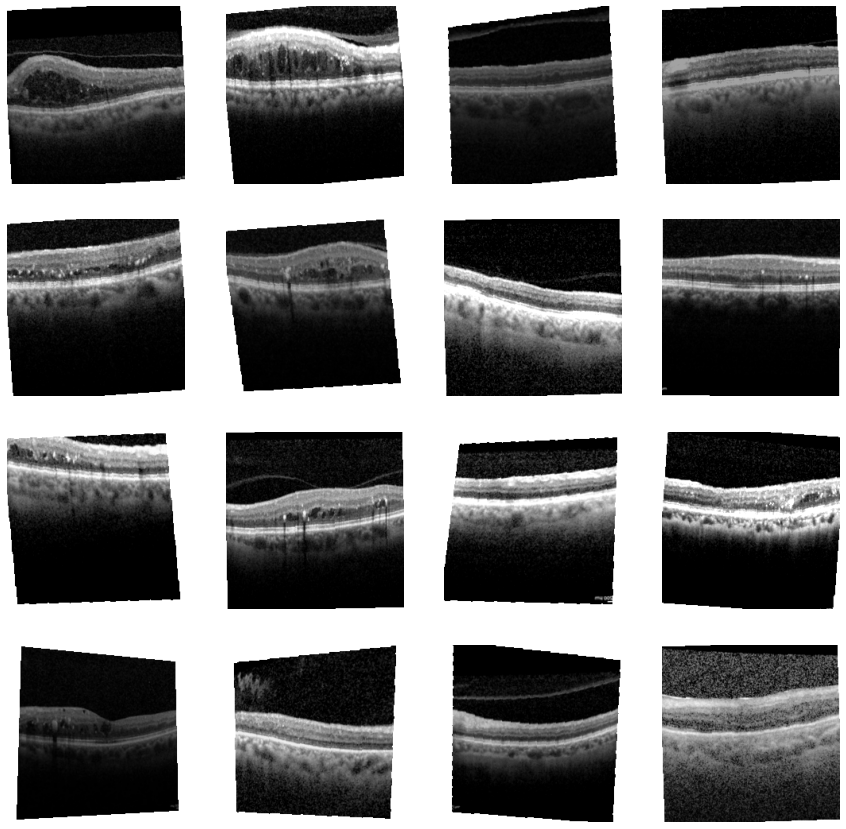

In [134]:
# Plot more images
torch.manual_seed(SEED+1)
fig = plt.figure(figsize=(15, 15))
rows, cols = 4, 4
for i in range(1, rows * cols + 1):
    random_idx = torch.randint(0, len(train_dataset), size=[1]).item()
    img, label = train_dataset[random_idx]
    fig.add_subplot(rows, cols, i)
    plt.imshow(img.squeeze(), cmap="gray")
    plt.axis(False);

# Validation Data

In [135]:
val_df["File_Path"] = "TRAIN/OLIVES" + val_df["File_Path"]
val_df

,File_Path,B1,B2,B3,B4,B5,B6
0,TRAIN/OLIVES/TREX DME/GILA/0201GOD/V1/OD/TREXJ...,1,0,1,0,0,1
1,TRAIN/OLIVES/TREX DME/GILA/0201GOD/V1/OD/TREXJ...,1,0,1,0,0,1
2,TRAIN/OLIVES/TREX DME/GILA/0201GOD/V1/OD/TREXJ...,1,0,1,0,0,1
3,TRAIN/OLIVES/TREX DME/GILA/0201GOD/V1/OD/TREXJ...,1,0,1,0,0,1
4,TRAIN/OLIVES/TREX DME/GILA/0201GOD/V1/OD/TREXJ...,1,0,1,0,0,0
...,...,...,...,...,...,...,...
9305,TRAIN/OLIVES/Prime_FULL/02-045/W104/OS/44.tif,1,0,0,0,0,0
9306,TRAIN/OLIVES/Prime_FULL/02-045/W104/OS/45.tif,1,0,0,1,0,0
9307,TRAIN/OLIVES/Prime_FULL/02-045/W104/OS/46.tif,1,0,0,0,0,0
9308,TRAIN/OLIVES/Prime_FULL/02-045/W104/OS/47.tif,1,0,0,0,0,0


In [136]:
validation_dataset = OLIVES(val_df, transforms = val_transform)
validation_loader = torch.utils.data.DataLoader(
        validation_dataset, batch_size=1, shuffle=False,
        num_workers=0, pin_memory=True)

# Traing pseudo labels with random weight

# Model 

In [137]:
model = torchvision.models.resnet50(weights=None,zero_init_residual=True)
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Identity(),
    nn.Sequential(
        nn.Linear(2048, 512),
        nn.Linear(512, 6)
    )
)
model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
model = model.to(device)

# Criterion, Optimizer

In [138]:
import torch
pos_weight_one = 3067/6371
pos_weight_two = 6424/2984
pos_weight_three = 4186/5222
pos_weight_four = 6572/2836
pos_weight_five = 6405/3003
pos_weight_six = 5320/4088
pos_weight = torch.tensor([pos_weight_one, pos_weight_two, pos_weight_three, pos_weight_four, pos_weight_five, pos_weight_six])

In [139]:
criterion = torch.nn.BCEWithLogitsLoss(pos_weight = pos_weight)
criterion = criterion.to(device)

optimizer = optim.AdamW(model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08, weight_decay=1e-4)

# Balanced accuracy score

In [140]:
from sklearn.metrics import balanced_accuracy_score

def compute_balanced_accuracy(truths, outputs):
    
    return [
        round(balanced_accuracy_score(y_true, y_pred), 4)
        for y_true, y_pred in zip(truths, outputs)
    ]

In [141]:
def compute_accuracy_score(truths, outputs):
    
    return [
        round(accuracy_score(y_true, y_pred), 4)
        for y_true, y_pred in zip(truths, outputs)
    ]

In [142]:
def compute_sensitivity(truths, outputs):
    return [[
        round(metrics.recall_score(y_true, y_pred), 4)
        for y_true, y_pred in zip(truths, outputs)
    ]]

In [143]:
def compute_specificity(truths, outputs):
    return [[
        round(metrics.recall_score(y_true, y_pred, pos_label=0), 4)
        for y_true, y_pred in zip(truths, outputs)
    ]]

In [144]:
def custom_metric(x, y):
    x = np.transpose(x)
    y = np.transpose(y)
    
    return [
        round((2*(a*b)/(a+b)).item(), 4)
        for a, b in zip(x, y)
    ]

# Training

In [145]:
from pathlib import Path
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True, # create parent directories if needed
                 exist_ok=True)

In [146]:
# training routine
np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)

epochs = 70
t_loss = []
v_loss = []
accur = []
bal_accur = []
custom = []
s1 = []
s2 = []
for epoch in range(1, epochs + 1):
    # train
    model.train()
    #classifier.train()
    Train_losses = AverageMeter()
    
    for idx, (image, bio_tensor) in enumerate(train_loader):
        images = image.to(device)

        labels = bio_tensor.float()

        labels = labels.to(device)
        bsz = labels.shape[0]

        # compute loss


        #features = model(images)
        output = model(images)
        
        loss = criterion(output, labels)
        
        # update metric
        Train_losses.update(loss.item(), bsz)

        # SGD
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
    Val_losses = AverageMeter()
    y_true = []
    y_pred = []
    model.eval()
    #classifier.eval()    
    for idx, (image, bio_tensor) in enumerate(validation_loader):
        # Validation

        with torch.inference_mode():
            images = image.to(device)

            labels = bio_tensor.float()

            labels = labels.to(device)
            bsz = labels.shape[0]

            # compute loss


            #features = model(images)
            output = model(images)
            loss = criterion(output, labels)
            
            
            output = torch.round(torch.sigmoid(output))
            output = output.squeeze().detach().cpu().numpy()
            labels = labels.squeeze().detach().cpu().numpy()
            y_true.append(labels)
            y_pred.append(output)
            Val_losses.update(loss.item(), bsz)
    
    test_true = np.transpose(y_true)
    test_pred = np.transpose(y_pred)
    acc = compute_accuracy_score(test_true, test_pred)
    balanced_acc = compute_balanced_accuracy(test_true, test_pred)
    sen = compute_sensitivity(test_true, test_pred)
    spe = compute_specificity(test_true, test_pred)
    cus_met = custom_metric(sen, spe)
    
    t_loss.append(Train_losses.avg)
    v_loss.append(Val_losses.avg)
    accur.append(np.mean(acc))
    bal_accur.append(np.mean(balanced_acc))
    custom.append(np.mean(cus_met))
    s1.append(np.mean(sen))
    s2.append(np.mean(spe))
    print('-' * 10)
    print(f"{epoch}/{epochs}")
    print(f"Train loss: {Train_losses.avg:.5f} | Validation loss: {Val_losses.avg:.5f}")
    print(f"Accuracy: {acc} | Mean Accuracy: {np.mean(acc):.5f}")       
    print("Balanced acc (val): {} | Mean Balanced acc (val): {:.4f}".format(balanced_acc, np.mean(balanced_acc)))
    print(f"Sensitivity: {sen} | Mean Sensitivity: {np.mean(sen):.5f}")
    print(f"Specificity: {spe} | Mean Specificity: {np.mean(spe):.5f}")
    print(f"Custom Metric: {cus_met} | Mean Custom Metric: {np.mean(cus_met):.5f}")
    print('-' * 10)
    if epoch % 1 == 0:
        MODEL_NAME = f"18_vip_cup_student_three_pretrain_random_weight_epoch_{epoch}.pth"
        MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME
        state = {'model': model.state_dict(),
                 'optimizer': optimizer.state_dict(),
                 'epoch': epoch,
                }
        # Save the model state dict
        print(f"Saving model to: {MODEL_SAVE_PATH}")
        torch.save(state,
                   f=MODEL_SAVE_PATH)
        del state      

----------
1/70
Train loss: 0.66477 | Validation loss: 1.40259
Accuracy: [0.3716, 0.3129, 0.4949, 0.2815, 0.7823, 0.6429] | Mean Accuracy: 0.48102
Balanced acc (val): [0.5464, 0.5, 0.5, 0.5, 0.652, 0.6085] | Mean Balanced acc (val): 0.5512
Sensitivity: [[0.0956, 1.0, 0.0, 1.0, 0.3175, 0.2201]] | Mean Sensitivity: 0.43887
Specificity: [[0.9972, 0.0, 1.0, 0.0, 0.9865, 0.9969]] | Mean Specificity: 0.66343
Custom Metric: [0.1745, 0.0, 0.0, 0.0, 0.4804, 0.3606] | Mean Custom Metric: 0.16925
----------
Saving model to: models\18_vip_cup_student_three_pretrain_random_weight_epoch_1.pth
----------
2/70
Train loss: 0.51747 | Validation loss: 0.79659
Accuracy: [0.7628, 0.3129, 0.5128, 0.54, 0.5876, 0.756] | Mean Accuracy: 0.57868
Balanced acc (val): [0.7444, 0.5, 0.5175, 0.5926, 0.7008, 0.7708] | Mean Balanced acc (val): 0.6377
Sensitivity: [[0.7917, 1.0, 0.0572, 0.713, 0.9916, 0.9384]] | Mean Sensitivity: 0.74865
Specificity: [[0.6972, 0.0, 0.9777, 0.4722, 0.41, 0.6031]] | Mean Specificity: 0.5

----------
15/70
Train loss: 0.17514 | Validation loss: 0.70504
Accuracy: [0.7066, 0.7083, 0.7075, 0.6803, 0.8257, 0.8673] | Mean Accuracy: 0.74928
Balanced acc (val): [0.7669, 0.7515, 0.7086, 0.6875, 0.8464, 0.8624] | Mean Balanced acc (val): 0.7706
Sensitivity: [[0.6115, 0.8668, 0.5993, 0.7039, 0.8997, 0.806]] | Mean Sensitivity: 0.74787
Specificity: [[0.9222, 0.6361, 0.8179, 0.671, 0.7931, 0.9188]] | Mean Specificity: 0.79318
Custom Metric: [0.7354, 0.7337, 0.6917, 0.6871, 0.843, 0.8587] | Mean Custom Metric: 0.75827
----------
Saving model to: models\18_vip_cup_student_three_pretrain_random_weight_epoch_15.pth
----------
16/70
Train loss: 0.17408 | Validation loss: 0.95775
Accuracy: [0.699, 0.7347, 0.7406, 0.3367, 0.8376, 0.8776] | Mean Accuracy: 0.70437
Balanced acc (val): [0.7699, 0.7958, 0.7415, 0.5201, 0.8581, 0.874] | Mean Balanced acc (val): 0.7599
Sensitivity: [[0.587, 0.9592, 0.6582, 0.9396, 0.9109, 0.834]] | Mean Sensitivity: 0.81482
Specificity: [[0.9528, 0.6324, 0.8247, 

----------
29/70
Train loss: 0.12751 | Validation loss: 0.88016
Accuracy: [0.6939, 0.7287, 0.7738, 0.4804, 0.8401, 0.8716] | Mean Accuracy: 0.73142
Balanced acc (val): [0.7685, 0.7745, 0.7736, 0.6219, 0.8397, 0.8616] | Mean Balanced acc (val): 0.7733
Sensitivity: [[0.576, 0.8967, 0.7946, 0.9456, 0.8384, 0.7481]] | Mean Sensitivity: 0.79990
Specificity: [[0.9611, 0.6522, 0.7526, 0.2982, 0.8409, 0.975]] | Mean Specificity: 0.74667
Custom Metric: [0.7203, 0.7552, 0.773, 0.4534, 0.8396, 0.8466] | Mean Custom Metric: 0.73135
----------
Saving model to: models\18_vip_cup_student_three_pretrain_random_weight_epoch_29.pth
----------
30/70
Train loss: 0.11498 | Validation loss: 0.87351
Accuracy: [0.6514, 0.7959, 0.8155, 0.6437, 0.8248, 0.8733] | Mean Accuracy: 0.76743
Balanced acc (val): [0.741, 0.8248, 0.815, 0.6611, 0.8458, 0.8706] | Mean Balanced acc (val): 0.7931
Sensitivity: [[0.5098, 0.9022, 0.8603, 0.7009, 0.8997, 0.8396]] | Mean Sensitivity: 0.78542
Specificity: [[0.9722, 0.7475, 0.7698

----------
43/70
Train loss: 0.08509 | Validation loss: 1.22157
Accuracy: [0.6684, 0.7109, 0.7449, 0.4796, 0.8308, 0.8784] | Mean Accuracy: 0.71883
Balanced acc (val): [0.7533, 0.7822, 0.7457, 0.5956, 0.8423, 0.8765] | Mean Balanced acc (val): 0.7659
Sensitivity: [[0.5343, 0.9728, 0.6667, 0.861, 0.8719, 0.8545]] | Mean Sensitivity: 0.79353
Specificity: [[0.9722, 0.5916, 0.8247, 0.3302, 0.8127, 0.8984]] | Mean Specificity: 0.73830
Custom Metric: [0.6896, 0.7358, 0.7373, 0.4773, 0.8413, 0.8759] | Mean Custom Metric: 0.72620
----------
Saving model to: models\18_vip_cup_student_three_pretrain_random_weight_epoch_43.pth
----------
44/70
Train loss: 0.08774 | Validation loss: 0.91394
Accuracy: [0.6054, 0.7526, 0.8104, 0.7228, 0.8546, 0.8716] | Mean Accuracy: 0.76957
Balanced acc (val): [0.7118, 0.7985, 0.8101, 0.7189, 0.843, 0.8646] | Mean Balanced acc (val): 0.7912
Sensitivity: [[0.4375, 0.9212, 0.8418, 0.71, 0.8134, 0.7854]] | Mean Sensitivity: 0.75155
Specificity: [[0.9861, 0.6757, 0.778

----------
57/70
Train loss: 0.06666 | Validation loss: 1.01784
Accuracy: [0.6854, 0.6862, 0.7304, 0.7092, 0.8282, 0.8818] | Mean Accuracy: 0.75353
Balanced acc (val): [0.764, 0.7554, 0.7312, 0.7462, 0.8537, 0.8769] | Mean Balanced acc (val): 0.7879
Sensitivity: [[0.5613, 0.9402, 0.6549, 0.8308, 0.9192, 0.8209]] | Mean Sensitivity: 0.78788
Specificity: [[0.9667, 0.5705, 0.8076, 0.6615, 0.7882, 0.9328]] | Mean Specificity: 0.78788
Custom Metric: [0.7102, 0.7101, 0.7233, 0.7365, 0.8487, 0.8733] | Mean Custom Metric: 0.76702
----------
Saving model to: models\18_vip_cup_student_three_pretrain_random_weight_epoch_57.pth
----------
58/70
Train loss: 0.06940 | Validation loss: 0.89747
Accuracy: [0.7168, 0.7534, 0.7704, 0.6412, 0.8299, 0.8716] | Mean Accuracy: 0.76388
Balanced acc (val): [0.7843, 0.7932, 0.7704, 0.7053, 0.855, 0.8684] | Mean Balanced acc (val): 0.7961
Sensitivity: [[0.6103, 0.8995, 0.7727, 0.852, 0.9192, 0.8321]] | Mean Sensitivity: 0.81430
Specificity: [[0.9583, 0.6869, 0.76

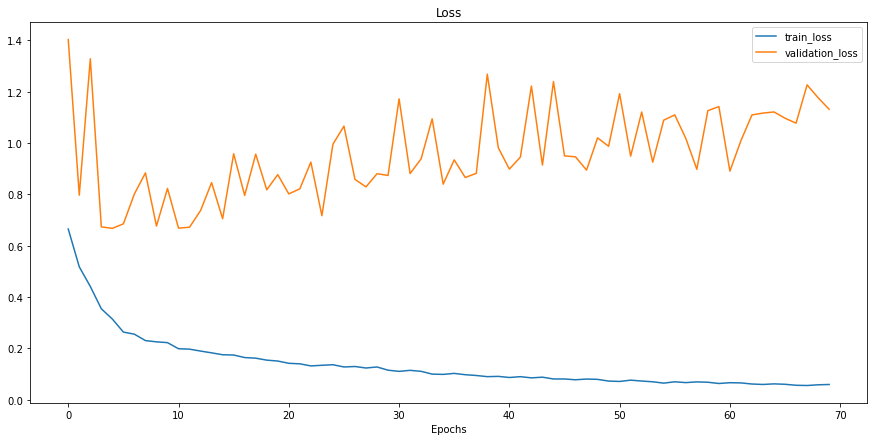

In [147]:
plt.figure(figsize=(15, 7))

    # Plot loss
plt.plot(range(len(t_loss)), t_loss, label='train_loss')
plt.plot(range(len(v_loss)), v_loss, label='validation_loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.legend()

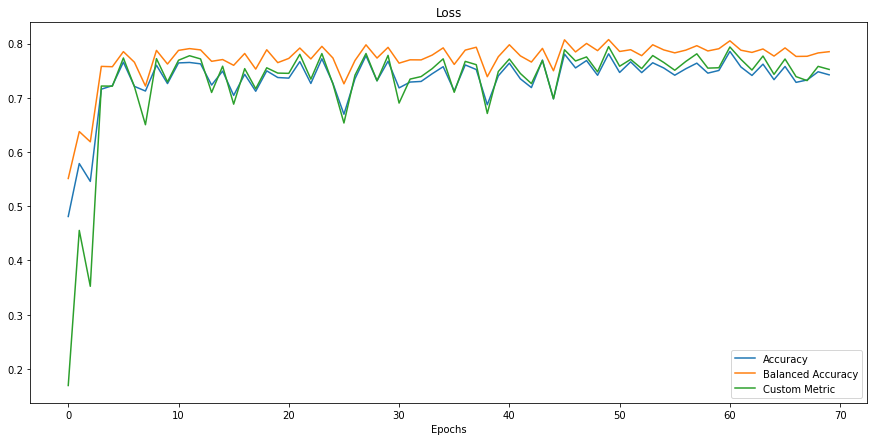

In [148]:
plt.figure(figsize=(15, 7))
    # Plot loss
plt.plot(range(len(accur)), accur, label='Accuracy')
plt.plot(range(len(bal_accur)), bal_accur, label='Balanced Accuracy')
plt.plot(range(len(custom)), custom, label='Custom Metric')
plt.title('Loss')
plt.xlabel('Epochs')
plt.legend()

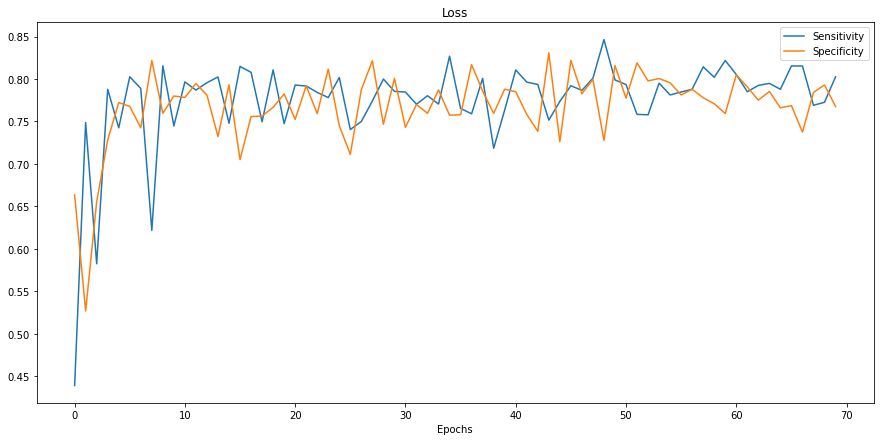

In [149]:
plt.figure(figsize=(15, 7))
    # Plot loss
plt.plot(range(len(s1)), s1, label='Sensitivity')
plt.plot(range(len(s2)), s2, label='Specificity')
#plt.plot(range(len(custom)), custom, label='Custom Metric')
plt.title('Loss')
plt.xlabel('Epochs')
plt.legend()

In [ ]:
ckpt = torch.load("models/16_vip_cup_student_two_pretrain_random_weight_epoch_28.pth", map_location='cpu')
state_dict = ckpt['model']

model.load_state_dict(state_dict)
model = model.to(device)
model.state_dict()

In [ ]:
test_csv_path = 'TEST/test_set_submission_template.csv'
test_image_path = 'TEST/'

In [ ]:
class RECOVERY(data.Dataset):
    def __init__(self,df, img_dir, transforms):
        self.img_dir = img_dir
        self.transforms = transforms
        self.df = pd.read_csv(df)
    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        path = os.path.join(self.img_dir, self.df.iloc[idx, 0])
        path = self.img_dir + self.df.iloc[idx,0]
        image = Image.open(path).convert("L")
        image = np.array(image)
        image = Image.fromarray(image)
        image = self.transforms(image)
        return image, idx

In [ ]:
test_dataset = RECOVERY(test_csv_path, test_image_path, val_transform)
test_dataloader = data.DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0, pin_memory=True,drop_last=False)

In [ ]:
submission = pd.read_csv(test_csv_path)

In [ ]:
model.eval()
with torch.no_grad():
    for idx, (image, index) in (enumerate(test_dataloader)):
        images = image.float().to(device)
        output = model(images)
        output = torch.round(torch.sigmoid(output))
        output = output.squeeze().cpu().numpy()
        index = int(index.numpy()[0])
        submission.iloc[index, 1:] = output

In [ ]:
submission.to_csv('sub_sixt_two_pre.csv', index=None)